# 스프린트 DA 5기 2팀 성유창 eda 및 분석

In [2]:
import pandas as pd
import os
import datetime as dt
pd.set_option('display.max_columns',100)
import matplotlib.pyplot as plt
import seaborn as sns
# !pip install koreanize-matplotlib
import koreanize_matplotlib
import matplotlib as mpl
pd.set_option('display.max_colwidth', None)
import glob
import scipy.stats as stats
palette = ['#b3cde0', '#7e79b8', '#eac4d5', '#6e58a7', '#c6e2e9',
            '#a9a7cf', '#9dc3c1','#d5d5e9', '#baaad0', '#f8c8dc', '#c5b9f2']  

sns.set_palette(palette)
from scipy.stats import chi2_contingency

## 전처리

### enter_lesson_page

#### 기본 전처리 ()

In [3]:
enter_lesson_page = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/enter_lesson_page-001.csv')

C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\2524196629.py:1: DtypeWarning: Columns (9,13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  enter_lesson_page = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/enter_lesson_page-001.csv')


In [4]:
# 시간. UTC -> KST
enter_lesson_page['client_event_time'] = pd.to_datetime(enter_lesson_page['client_event_time'], errors='coerce')
enter_lesson_page['client_event_time'] = enter_lesson_page['client_event_time'] + pd.Timedelta(hours=9)

In [5]:
# 2022, 2023년 제한
enter_lesson_page = enter_lesson_page.loc[
    enter_lesson_page['client_event_time'].dt.year.between(2022, 2023)]

In [6]:
# 컬럼명 변경
enter_lesson_page.rename(columns={'content.id': 'content_id', 'lesson.id': 'lesson_id'}, inplace=True)
enter_lesson_page.rename(columns={'client_event_time': 'enter_lesson_time'}, inplace=True)

# 컬럼 버리기
enter_lesson_page.drop(columns=['platform', 'os_version', 'device_carrier'], inplace=True)
enter_lesson_page.drop(enter_lesson_page[enter_lesson_page['os_name'] == 'Chrome Headless'].index, inplace=True)

In [7]:
# 중복 컬럼 삭제
enter_lesson_page.duplicated(subset=['enter_lesson_time', 'user_id', 'content_id', 'lesson_id'], keep=False)

0           False
1           False
2           False
3           False
4           False
            ...  
21029702    False
21029703    False
21029704    False
21029705    False
21029706    False
Length: 21028196, dtype: bool

In [8]:
enter_lesson_page.head()

,city,enter_lesson_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,is_trial,lesson_id,is_free_trial
0,Wonju,2023-04-06 06:46:04.333,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
1,Wonju,2023-04-06 06:55:50.787,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
2,Wonju,2023-04-06 06:55:55.684,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,770740696ab1809d6b50d4013b64a75c,NaN
3,Dongdaemun-gu,2023-04-06 06:04:55.828,South Korea,Mac,Mac,enter.lesson_page,Korean,Chrome,b2b31f00b82edc6419b25324a7ae41a4,5fc64d786416b980cfda86afd69e4516,False,68cc362ca81b5899b3c9b4dea0aaddff,NaN
4,Dongdaemun-gu,2023-04-06 06:05:34.139,South Korea,Mac,Mac,enter.lesson_page,Korean,Chrome,b2b31f00b82edc6419b25324a7ae41a4,db43a841c994231e2795d4df8931af50,False,144682f4648f81de8e6aabd11b92105e,NaN


### complete_lesson

#### 기본 전처리

In [9]:
complete_lesson = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/complete_lesson.csv')

In [10]:
# 시간. UTC -> KST
complete_lesson['client_event_time'] = pd.to_datetime(complete_lesson['client_event_time'], errors='coerce')
complete_lesson['client_event_time'] = complete_lesson['client_event_time'] + pd.Timedelta(hours=9)

In [11]:
# 2022, 2023년 제한
# complete_lesson = complete_lesson[(complete_lesson['client_event_time'] >= start_date) & (complete_lesson['client_event_time'] <= end_date)]
# 시간 필터링
complete_lesson = complete_lesson.loc[
    complete_lesson['client_event_time'].dt.year.between(2022, 2023)]

In [12]:
# 컬럼명 변경
complete_lesson.rename(columns={'content.id': 'content_id', 'lesson.id': 'lesson_id'}, inplace=True)
complete_lesson.rename(columns={'client_event_time': 'complete_lesson_time'}, inplace=True)

# 컬럼 버리기
complete_lesson.drop(columns=['platform', 'os_version', 'device_carrier'], inplace=True)
complete_lesson.drop(complete_lesson[complete_lesson['os_name'] == 'Chrome Headless'].index, inplace=True)

In [13]:
# 중복 컬럼 삭제
complete_lesson.duplicated(subset=['complete_lesson_time', 'user_id', 'content_id', 'lesson_id'], keep=False)

0          False
1          False
2          False
3          False
4          False
           ...  
5405064    False
5405065    False
5405066    False
5405067    False
5405068    False
Length: 5404242, dtype: bool

In [14]:
complete_lesson.head()

,city,complete_lesson_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,lesson_id
0,Wonju,2023-04-06 06:55:51.836,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,d360d68b65fd3e0eafb7982386d75fd9
1,Daejeon,2023-04-06 06:19:01.243,South Korea,Windows,Windows,complete.lesson,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,7e0f6aae886368ef9fa97007a8e9f7ac
2,Daejeon,2023-04-06 06:20:27.939,South Korea,Windows,Windows,complete.lesson,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,d1e93c9dc08267efab31849bc6083854
3,Daejeon,2023-04-06 06:23:01.534,South Korea,Windows,Windows,complete.lesson,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,f22ea5dc431035305e705552bbc4f45b
4,Daejeon,2023-04-06 06:28:34.965,South Korea,Windows,Windows,complete.lesson,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,ce0bfeb7fb1259c588f437d48ab2690c


In [15]:
print(complete_lesson['complete_lesson_time'].min())
print(complete_lesson['complete_lesson_time'].max())

2022-01-01 09:00:01.181000
2023-12-31 23:59:51.635000


### 각 데이터에서 30초 이내 로그가 찍힌 것들, 동일한 년, 월, 일, 시, 분 삭제(같은 레슨일 경우)

- enter lesson

In [16]:
# enter_lesson_time을 시간 순서대로 정렬
enter_lesson_page_filtered = enter_lesson_page.sort_values(by=['user_id', 'enter_lesson_time'])

# 동일한 user_id에 대해 연속된 행의 시간 차이 계산
enter_lesson_page_filtered['time_diff'] = enter_lesson_page_filtered.groupby('user_id')['enter_lesson_time'].diff()

# 시간 차이를 초 단위로 변환
enter_lesson_page_filtered['time_diff_seconds'] = enter_lesson_page_filtered['time_diff'].dt.total_seconds() #.round(2)

In [17]:
# time_diff_seconds가 30초 초과인 데이터만 남김김
enter_lesson_page_finalised = enter_lesson_page_filtered[(enter_lesson_page_filtered['time_diff_seconds'] > 30)]

In [18]:
# 년-월-일-시-분 단위 컬럼 추가
enter_lesson_page_finalised["time_group"] = enter_lesson_page_finalised["enter_lesson_time"].dt.strftime("%Y-%m-%d %H:%M")

# 정렬 수행
enter_lesson_page_finalised = enter_lesson_page_finalised.sort_values(by=["user_id", "content_id", "lesson_id", "enter_lesson_time"])

# 중복 제거 (첫 번째 값 유지)
enter_lesson_page_finalised_unique = enter_lesson_page_finalised.drop_duplicates(subset=["user_id", "content_id", "lesson_id", "time_group"], keep="first")

enter_lesson_page_finalised_unique = enter_lesson_page_finalised_unique.drop_duplicates(
    subset=["user_id", "time_group"], keep="first"
)


# 필요 없는 컬럼 제거
enter_lesson_page_finalised_unique = enter_lesson_page_finalised_unique.drop(columns=["time_group"])


C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\4201793937.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  enter_lesson_page_finalised["time_group"] = enter_lesson_page_finalised["enter_lesson_time"].dt.strftime("%Y-%m-%d %H:%M")


In [19]:
print(len(enter_lesson_page)) # 로우 데이터
print(len(enter_lesson_page_finalised)) # timediff 30초 초과 데이터
print(len(enter_lesson_page_finalised_unique)) # 동일한 년월일시분 삭제

21028196
8118190
7852494


In [20]:
print(enter_lesson_page['user_id'].nunique()) # 로우 데이터
print(enter_lesson_page_finalised['user_id'].nunique()) # timediff 30초 초과 데이터
print(enter_lesson_page_finalised_unique['user_id'].nunique()) # 동일한 년월일시분 삭제

113916
79820
79820


In [21]:
print(enter_lesson_page['lesson_id'].nunique()) # 로우 데이터
print(enter_lesson_page_finalised['lesson_id'].nunique()) # timediff 30초 초과 데이터
print(enter_lesson_page_finalised_unique['lesson_id'].nunique()) # 동일한 년월일시분 삭제

5479
5391
5383


In [22]:
enter_lesson_page_finalised_unique.describe()

,enter_lesson_time,time_diff,time_diff_seconds
count,7852494,7852494,7.852494e+06
mean,2023-01-07 20:17:21.373091584,0 days 15:31:14.171259363,5.587417e+04
min,2022-01-01 00:56:27.589000,0 days 00:00:30.001000,3.000100e+01
25%,2022-07-24 19:21:33.735750144,0 days 00:01:25.004250,8.500425e+01
50%,2023-01-26 11:07:25.428499968,0 days 00:03:20.362000,2.003620e+02
75%,2023-06-30 00:36:46.983249920,0 days 00:09:22.805000,5.628050e+02
max,2023-12-31 23:59:45.192000,722 days 23:20:52.788000,6.246485e+07
std,NaN,9 days 22:08:57.636050669,8.573376e+05


#### complete lesson

In [23]:
# enter_lesson_time을 시간 순서대로 정렬
complete_lesson_filtered = complete_lesson.sort_values(by=['user_id', 'complete_lesson_time'])

# 동일한 user_id에 대해 연속된 행의 시간 차이 계산
complete_lesson_filtered['time_diff'] = complete_lesson_filtered.groupby('user_id')['complete_lesson_time'].diff()

# 시간 차이를 초 단위로 변환
complete_lesson_filtered['time_diff_seconds'] = complete_lesson_filtered['time_diff'].dt.total_seconds() #.round(2)

In [24]:
# time_diff_seconds가 30초 초과인 데이터만 남김김
complete_lesson_finalised = complete_lesson_filtered[(complete_lesson_filtered['time_diff_seconds'] > 30)]

In [25]:
# 년-월-일-시-분 단위 컬럼 추가
complete_lesson_finalised["time_group"] = complete_lesson_finalised["complete_lesson_time"].dt.strftime("%Y-%m-%d %H:%M")

# 정렬 수행
complete_lesson_finalised = complete_lesson_finalised.sort_values(by=["user_id", "content_id", "lesson_id", "complete_lesson_time"])

# 중복 제거 (첫 번째 값 유지)
complete_lesson_finalised_unique = complete_lesson_finalised.drop_duplicates(subset=["user_id", "content_id", "lesson_id", "time_group"], keep="first")

complete_lesson_finalised_unique = complete_lesson_finalised_unique.drop_duplicates(
    subset=["user_id", "time_group"], keep="first"
)

# 필요 없는 컬럼 제거
complete_lesson_finalised_unique = complete_lesson_finalised_unique.drop(columns=["time_group"])


C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\3935886420.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  complete_lesson_finalised["time_group"] = complete_lesson_finalised["complete_lesson_time"].dt.strftime("%Y-%m-%d %H:%M")


In [26]:
complete_lesson_finalised_unique.head()

,city,complete_lesson_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,lesson_id,time_diff,time_diff_seconds
222221,Seoul,2023-03-19 01:29:04.507,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,1e2a48ce24bce72e7d36da219ee9d254,0 days 00:05:53.192000,353.192
222220,Seoul,2023-03-19 01:23:11.315,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,3ae4d4504b620370687e58e0a33cf22d,0 days 00:04:43.050000,283.050
1199632,Seoul,2023-03-19 00:53:48.730,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,4d65e0729706704bf34953f2613d6ecd,0 days 00:02:14.017000,134.017
222225,Seoul,2023-03-19 01:48:55.626,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,58a55a039ef52567cfe0821f92b3c9e6,0 days 00:06:13.406000,373.406
222224,Seoul,2023-03-19 01:42:42.220,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,adfe4e8b1dc5d9f2e4b76e4bc8ee221c,0 days 00:04:11.322000,251.322


In [27]:
print(len(complete_lesson)) # 로우 데이터
print(len(complete_lesson_finalised)) # timediff 30초 초과 데이터
print(len(complete_lesson_finalised_unique)) # 동일한 년월일시분 삭제

5404242
4502312
4427700


In [28]:
print(complete_lesson['user_id'].nunique()) # 로우 데이터
print(complete_lesson_finalised['user_id'].nunique()) # timediff 30초 초과 데이터
print(complete_lesson_finalised_unique['user_id'].nunique()) # 동일한 년월일시분 삭제

49670
44419
44419


In [29]:
print(complete_lesson['lesson_id'].nunique()) # 로우 데이터
print(complete_lesson_finalised['lesson_id'].nunique()) # timediff 30초 초과 데이터
print(complete_lesson_finalised_unique['lesson_id'].nunique()) # 동일한 년월일시분 삭제

5050
5036
5034


In [30]:
complete_lesson_finalised_unique.describe()

,complete_lesson_time,time_diff,time_diff_seconds
count,4427700,4427700,4.427700e+06
mean,2023-01-21 05:03:18.948490752,0 days 15:37:22.346357195,5.624235e+04
min,2022-01-01 09:06:56.209000,0 days 00:00:30.001000,3.000100e+01
25%,2022-07-25 15:36:46.370500096,0 days 00:02:23.719000,1.437190e+02
50%,2023-01-28 16:36:47.536499968,0 days 00:04:56.299000,2.962990e+02
75%,2023-07-31 16:20:14.356499968,0 days 00:14:59.997250,8.999973e+02
max,2023-12-31 23:59:51.635000,720 days 13:46:13.325000,6.225757e+07
std,NaN,8 days 11:20:42.775909348,7.320428e+05


In [31]:
complete_lesson_finalised.describe()

,complete_lesson_time,time_diff,time_diff_seconds
count,4502312,4502312,4.502312e+06
mean,2023-01-21 03:30:51.147414016,0 days 15:28:03.565471665,5.568357e+04
min,2022-01-01 09:06:56.209000,0 days 00:00:30.001000,3.000100e+01
25%,2022-07-25 15:50:16.603500032,0 days 00:02:20.210000,1.402100e+02
50%,2023-01-28 13:08:16.047500032,0 days 00:04:51.706500,2.917065e+02
75%,2023-07-31 15:27:12.669250048,0 days 00:14:41.486500,8.814865e+02
max,2023-12-31 23:59:51.635000,720 days 13:46:13.325000,6.225757e+07
std,NaN,8 days 10:21:22.877575034,7.284829e+05


### complete_subscription에서 user_id를 가져오기

In [32]:
# 파일 불러오기 및 전처리리
complete_subscription = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/complete_subscription.csv')
complete_subscription['client_event_time'] = pd.to_datetime(complete_subscription['client_event_time'], errors='coerce')
complete_subscription['client_event_time'] = complete_subscription['client_event_time'] + pd.Timedelta(hours=9)
complete_subscription.drop(complete_subscription[complete_subscription['os_name'] == 'Chrome Headless'].index, inplace=True)


# 2022, 2023년 제한
# 시간 필터링
complete_subscription = complete_subscription.loc[
    complete_subscription['client_event_time'].dt.year.between(2022, 2023)]

In [33]:
complete_subscription = complete_subscription.drop_duplicates(subset=['user_id'], keep='first')
complete_subscription['user_id'].nunique()

13875

In [34]:
complete_subscription['client_event_time'].max()

Timestamp('2023-12-31 23:59:39.461000')

In [35]:
complete_subscription.isna().sum()

city                        522
client_event_time             0
country                     376
device_carrier            13875
device_family               368
device_type                 517
event_type                    0
language                    368
os_name                     374
os_version                  383
platform                    368
user_id                       0
plan.price                    0
paid_amount                   0
coupon.discount_amount        0
pg.type                   12274
dtype: int64

In [36]:
complete_subscription['user_id'].dropna().unique()

array(['1116a2ae90ca6b06f85feba27ad51ef0',
       'c0f5678df8967163e6e2c464ed006791',
       '79421b5d038205ad7adbb1e2c3b89741', ...,
       'abebe3234041d14b5c0c5821bf90ab26',
       '3ca22b0bade6b40d6274bf6d06bc4344',
       'c49ea18247c81a613f8bbf44ff029cb4'], dtype=object)

In [37]:
# 중복되는 user_id 제거
complete_subscription = complete_subscription.drop_duplicates(subset=['user_id'], keep='first')
complete_subscription['user_id'].nunique()

13875

In [38]:
# complete_subscription 파일에서 user_id 컬럼만 추출하여 저장
subscription_user_id_list = complete_subscription['user_id'].unique()

In [39]:
# subscription_user_id_list의 데이터 타입 확인
subscription_user_id_list.dtype

dtype('O')

In [40]:
subscription_user_id_list

array(['1116a2ae90ca6b06f85feba27ad51ef0',
       'c0f5678df8967163e6e2c464ed006791',
       '79421b5d038205ad7adbb1e2c3b89741', ...,
       'abebe3234041d14b5c0c5821bf90ab26',
       '3ca22b0bade6b40d6274bf6d06bc4344',
       'c49ea18247c81a613f8bbf44ff029cb4'], dtype=object)

#### enter_lesson, complete_lesson에 subscription_user_id_list의 user_id 필터링

- enter_lesson

In [41]:
# enter_lesson_page_finalised_unique 파일에서 subscription_user_id_list에 있는 user_id만 추출하여 저장
enter_lesson_page_finalised_unique_sub = enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['user_id'].isin(subscription_user_id_list)]
enter_lesson_page_finalised_unique_sub.head()

,city,enter_lesson_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,is_trial,lesson_id,is_free_trial,time_diff,time_diff_seconds
16138,Seoul,2023-03-18 19:42:48.654,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,True,09c8a2d29087cb3d47823acb5f2705e3,NaN,0 days 00:05:42.876000,342.876
6147610,Seoul,2023-03-19 00:46:47.244,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,False,0cf175a1781a8e0020bf6c6bdc80e78a,NaN,0 days 00:01:11.785000,71.785
6147611,Seoul,2023-03-19 00:51:34.741,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,False,0cf175a1781a8e0020bf6c6bdc80e78a,NaN,0 days 00:04:47.497000,287.497
1140249,Seoul,2023-03-19 01:29:04.118,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,False,1e2a48ce24bce72e7d36da219ee9d254,NaN,0 days 00:05:50.893000,350.893
6147608,Seoul,2023-03-19 00:45:24.704,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,False,2ed4b83e65edc2b1efb193aaa3c60cf9,NaN,0 days 01:12:02.068000,4322.068


In [42]:
print(len(enter_lesson_page_finalised_unique_sub))
print(enter_lesson_page_finalised_unique_sub['user_id'].nunique())

3389303
12860


In [43]:
# complete_lesson_finalised_unique 파일에서 subscription_user_id_list에 있는 user_id만 추출하여 저장
complete_lesson_finalised_unique_sub = complete_lesson_finalised_unique[complete_lesson_finalised_unique['user_id'].isin(subscription_user_id_list)]
complete_lesson_finalised_unique_sub.head()

,city,complete_lesson_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,lesson_id,time_diff,time_diff_seconds
222221,Seoul,2023-03-19 01:29:04.507,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,1e2a48ce24bce72e7d36da219ee9d254,0 days 00:05:53.192000,353.192
222220,Seoul,2023-03-19 01:23:11.315,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,3ae4d4504b620370687e58e0a33cf22d,0 days 00:04:43.050000,283.050
1199632,Seoul,2023-03-19 00:53:48.730,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,4d65e0729706704bf34953f2613d6ecd,0 days 00:02:14.017000,134.017
222225,Seoul,2023-03-19 01:48:55.626,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,58a55a039ef52567cfe0821f92b3c9e6,0 days 00:06:13.406000,373.406
222224,Seoul,2023-03-19 01:42:42.220,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,adfe4e8b1dc5d9f2e4b76e4bc8ee221c,0 days 00:04:11.322000,251.322


In [44]:
print(len(complete_lesson_finalised_unique_sub))
print(complete_lesson_finalised_unique_sub['user_id'].nunique())

1860818
12317


- enter_lesson_page

In [45]:
#  첫 결제 유저 ID 목록 (중복 제거 후 리스트로 변환)
unique_first_payment_user_ids = complete_subscription['user_id'].dropna().unique().tolist()

# enter_lesson_page_finalised_unique에서 첫 결제 유저만 필터링
first_paid_enter_lesson_page_finalised_unique = enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['user_id'].isin(unique_first_payment_user_ids)]

# 결과 출력
print("첫 결제 유저 필터링 개수:", len(first_paid_enter_lesson_page_finalised_unique))

첫 결제 유저 필터링 개수: 3389303


- complete_lesson

In [46]:
#  첫 결제 유저 ID 목록 (중복 제거 후 리스트로 변환)
unique_first_payment_user_ids = complete_subscription['user_id'].dropna().unique().tolist()

# complete_lesson_finalised_unique에서 첫 결제 유저만 필터링
first_paid_complete_lesson_finalised_unique = complete_lesson_finalised_unique[complete_lesson_finalised_unique['user_id'].isin(unique_first_payment_user_ids)]

# 결과 출력
print("첫 결제 유저 필터링 개수:", len(first_paid_complete_lesson_finalised_unique))

첫 결제 유저 필터링 개수: 1860818


In [47]:
first_paid_enter_lesson_page_finalised_unique.head()

,city,enter_lesson_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,is_trial,lesson_id,is_free_trial,time_diff,time_diff_seconds
16138,Seoul,2023-03-18 19:42:48.654,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,True,09c8a2d29087cb3d47823acb5f2705e3,NaN,0 days 00:05:42.876000,342.876
6147610,Seoul,2023-03-19 00:46:47.244,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,False,0cf175a1781a8e0020bf6c6bdc80e78a,NaN,0 days 00:01:11.785000,71.785
6147611,Seoul,2023-03-19 00:51:34.741,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,False,0cf175a1781a8e0020bf6c6bdc80e78a,NaN,0 days 00:04:47.497000,287.497
1140249,Seoul,2023-03-19 01:29:04.118,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,False,1e2a48ce24bce72e7d36da219ee9d254,NaN,0 days 00:05:50.893000,350.893
6147608,Seoul,2023-03-19 00:45:24.704,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,False,2ed4b83e65edc2b1efb193aaa3c60cf9,NaN,0 days 01:12:02.068000,4322.068


In [48]:
first_paid_complete_lesson_finalised_unique.head()

,city,complete_lesson_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,lesson_id,time_diff,time_diff_seconds
222221,Seoul,2023-03-19 01:29:04.507,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,1e2a48ce24bce72e7d36da219ee9d254,0 days 00:05:53.192000,353.192
222220,Seoul,2023-03-19 01:23:11.315,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,3ae4d4504b620370687e58e0a33cf22d,0 days 00:04:43.050000,283.050
1199632,Seoul,2023-03-19 00:53:48.730,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,4d65e0729706704bf34953f2613d6ecd,0 days 00:02:14.017000,134.017
222225,Seoul,2023-03-19 01:48:55.626,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,58a55a039ef52567cfe0821f92b3c9e6,0 days 00:06:13.406000,373.406
222224,Seoul,2023-03-19 01:42:42.220,South Korea,Mac,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,adfe4e8b1dc5d9f2e4b76e4bc8ee221c,0 days 00:04:11.322000,251.322


### concat으로 lesson 수강 시간 등을 알아보자

In [49]:
# 데이터의 lesson_time 컬럼 이름을 event_time으로 변경
first_paid_enter_lesson_page_finalised_unique.rename(columns={'enter_lesson_time': 'event_time'}, inplace=True)
first_paid_complete_lesson_finalised_unique.rename(columns={'complete_lesson_time': 'event_time'}, inplace=True)

C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\1196140547.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  first_paid_enter_lesson_page_finalised_unique.rename(columns={'enter_lesson_time': 'event_time'}, inplace=True)
C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\1196140547.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  first_paid_complete_lesson_finalised_unique.rename(columns={'complete_lesson_time': 'event_time'}, inplace=True)


In [50]:
# 임시 리스트 생성
temp_list = []

for data in [first_paid_enter_lesson_page_finalised_unique, first_paid_complete_lesson_finalised_unique]:
    # 필요한 컬럼만 추출하여 필터링
    data = data[['user_id', 'event_time', 'event_type', 'content_id', 'lesson_id']]

    # 임시 리스트에 저장
    temp_list.append(data)

# concat 제발발
god_please = pd.concat(temp_list, axis=0)

god_please = god_please.reset_index(drop=True)
god_please

,user_id,event_time,event_type,content_id,lesson_id
0,0000572f2ba8079bcefd2760b632e820,2023-03-18 19:42:48.654,enter.lesson_page,61b6463287573f00de13a930805a52d6,09c8a2d29087cb3d47823acb5f2705e3
1,0000572f2ba8079bcefd2760b632e820,2023-03-19 00:46:47.244,enter.lesson_page,61b6463287573f00de13a930805a52d6,0cf175a1781a8e0020bf6c6bdc80e78a
2,0000572f2ba8079bcefd2760b632e820,2023-03-19 00:51:34.741,enter.lesson_page,61b6463287573f00de13a930805a52d6,0cf175a1781a8e0020bf6c6bdc80e78a
3,0000572f2ba8079bcefd2760b632e820,2023-03-19 01:29:04.118,enter.lesson_page,61b6463287573f00de13a930805a52d6,1e2a48ce24bce72e7d36da219ee9d254
4,0000572f2ba8079bcefd2760b632e820,2023-03-19 00:45:24.704,enter.lesson_page,61b6463287573f00de13a930805a52d6,2ed4b83e65edc2b1efb193aaa3c60cf9
...,...,...,...,...,...
5250116,fffadab35ddc8234e1c5139815bfc017,2023-09-11 16:57:14.490,complete.lesson,f4be1a0fe0e301b03115591777fddf29,b05e0fb8ab15def4b33878b9a759b4f2
5250117,fffadab35ddc8234e1c5139815bfc017,2023-09-11 17:05:08.623,complete.lesson,f4be1a0fe0e301b03115591777fddf29,b26325925f88bef76397eedfe8a131c2
5250118,fffadab35ddc8234e1c5139815bfc017,2023-09-11 16:38:37.265,complete.lesson,f4be1a0fe0e301b03115591777fddf29,bfb6543cc0e7fa189f9c9a0e533b0f43
5250119,fffadab35ddc8234e1c5139815bfc017,2023-09-11 17:01:13.881,complete.lesson,f4be1a0fe0e301b03115591777fddf29,cdd77588e214e49bff41b0e7b20b5bb4


In [51]:
# event_type 이름 바꾸기
god_please['event_type'] = god_please['event_type'].replace({
    'enter.lesson_page': 'enter',
    'complete.lesson': 'complete'
})

In [52]:
god_please.head()

,user_id,event_time,event_type,content_id,lesson_id
0,0000572f2ba8079bcefd2760b632e820,2023-03-18 19:42:48.654,enter,61b6463287573f00de13a930805a52d6,09c8a2d29087cb3d47823acb5f2705e3
1,0000572f2ba8079bcefd2760b632e820,2023-03-19 00:46:47.244,enter,61b6463287573f00de13a930805a52d6,0cf175a1781a8e0020bf6c6bdc80e78a
2,0000572f2ba8079bcefd2760b632e820,2023-03-19 00:51:34.741,enter,61b6463287573f00de13a930805a52d6,0cf175a1781a8e0020bf6c6bdc80e78a
3,0000572f2ba8079bcefd2760b632e820,2023-03-19 01:29:04.118,enter,61b6463287573f00de13a930805a52d6,1e2a48ce24bce72e7d36da219ee9d254
4,0000572f2ba8079bcefd2760b632e820,2023-03-19 00:45:24.704,enter,61b6463287573f00de13a930805a52d6,2ed4b83e65edc2b1efb193aaa3c60cf9


In [53]:
god_please.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5250121 entries, 0 to 5250120
Data columns (total 5 columns):
 #   Column      Dtype         
---  ------      -----         
 0   user_id     object        
 1   event_time  datetime64[ns]
 2   event_type  object        
 3   content_id  object        
 4   lesson_id   object        
dtypes: datetime64[ns](1), object(4)
memory usage: 200.3+ MB


In [54]:
# enter, complete 분리
enter_df = god_please[god_please['event_type'] == 'enter']
complete_df = god_please[god_please['event_type'] == 'complete']

# **각각 정렬 (user_id, content_id, lesson_id, event_time 기준)**
enter_df = enter_df.sort_values(['user_id', 'content_id', 'lesson_id', 'event_time'])
enter_df = enter_df.sort_values('event_time', ignore_index=True)
complete_df = complete_df.sort_values(['user_id', 'content_id', 'lesson_id', 'event_time'])
complete_df = complete_df.sort_values('event_time', ignore_index=True)

# 정렬 확인 (디버깅용)
print("enter_df 확인:")
print(enter_df)
print("\ncomplete_df 확인:")
print(complete_df)

matched_df = pd.merge_asof(
    enter_df,
    complete_df.rename(columns={'event_time': 'event_time_complete'}),  # complete의 event_time 컬럼명 변경
    left_on='event_time',
    right_on='event_time_complete',
    by=['user_id', 'content_id', 'lesson_id'],
    direction='forward',  # enter보다 크거나 같은 complete 중 가장 가까운 것 선택
    suffixes=('_enter', '_complete')
)

matched_df.head()

enter_df 확인:
                                  user_id              event_time event_type  \
0        28562e887d0942c8f422f1ffa1c12bc0 2022-01-01 09:30:37.101      enter   
1        459c1fe98bb5a1024f942c06c9883615 2022-01-01 10:25:19.668      enter   
2        459c1fe98bb5a1024f942c06c9883615 2022-01-01 10:28:16.287      enter   
3        459c1fe98bb5a1024f942c06c9883615 2022-01-01 10:35:04.612      enter   
4        459c1fe98bb5a1024f942c06c9883615 2022-01-01 10:43:47.037      enter   
...                                   ...                     ...        ...   
3389298  2e96e01bb82372d697a37e4e97c21dcd 2023-12-31 23:51:29.275      enter   
3389299  c2f379460037197dd941fd1fc2fc87f4 2023-12-31 23:51:53.823      enter   
3389300  1eff907fc639d1bb259dc0ce20511c01 2023-12-31 23:56:44.026      enter   
3389301  073e8f07e99a1ff2527022bed96266f2 2023-12-31 23:58:12.919      enter   
3389302  c4cd2a351011de8a8c58ea82add6fdda 2023-12-31 23:59:37.061      enter   

                          

,user_id,event_time,event_type_enter,content_id,lesson_id,event_time_complete,event_type_complete
0,28562e887d0942c8f422f1ffa1c12bc0,2022-01-01 09:30:37.101,enter,38df90d4de533d6296b52c6a1d90e26b,80aac6e426ef54f462cc4e3fea699e0c,NaT,NaN
1,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:25:19.668,enter,68a3658f1b936bfff3bd6960cd561b0a,1238493aafb242e6bb8b6891271fa8a9,2022-01-01 10:28:15.544,complete
2,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:28:16.287,enter,68a3658f1b936bfff3bd6960cd561b0a,54dd3f1d5ccc6ed8f75c99d4b92feacf,2022-01-01 10:35:04.805,complete
3,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:35:04.612,enter,68a3658f1b936bfff3bd6960cd561b0a,1ec838a253800869b1724bbb1da49376,2022-01-01 10:43:47.151,complete
4,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:43:47.037,enter,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476,2022-01-01 10:45:38.806,complete


In [55]:
matched_df.head(10)

,user_id,event_time,event_type_enter,content_id,lesson_id,event_time_complete,event_type_complete
0,28562e887d0942c8f422f1ffa1c12bc0,2022-01-01 09:30:37.101,enter,38df90d4de533d6296b52c6a1d90e26b,80aac6e426ef54f462cc4e3fea699e0c,NaT,NaN
1,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:25:19.668,enter,68a3658f1b936bfff3bd6960cd561b0a,1238493aafb242e6bb8b6891271fa8a9,2022-01-01 10:28:15.544,complete
2,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:28:16.287,enter,68a3658f1b936bfff3bd6960cd561b0a,54dd3f1d5ccc6ed8f75c99d4b92feacf,2022-01-01 10:35:04.805,complete
3,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:35:04.612,enter,68a3658f1b936bfff3bd6960cd561b0a,1ec838a253800869b1724bbb1da49376,2022-01-01 10:43:47.151,complete
4,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:43:47.037,enter,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476,2022-01-01 10:45:38.806,complete
5,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:45:39.186,enter,68a3658f1b936bfff3bd6960cd561b0a,0934eafafaf2aeeaab6d312bca7d7f2a,2022-01-01 10:47:15.614,complete
6,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:47:15.341,enter,68a3658f1b936bfff3bd6960cd561b0a,1ccbb1451cd590e160d3951be4e5593d,2022-01-01 10:49:09.078,complete
7,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:49:09.384,enter,68a3658f1b936bfff3bd6960cd561b0a,f5f843256dccdee297a878c0b38f85ad,2022-01-01 10:51:34.166,complete
8,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:51:34.356,enter,68a3658f1b936bfff3bd6960cd561b0a,3ed53ef72b4b2ea7a8379729f40a5f92,2022-01-01 10:53:59.415,complete
9,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:53:59.331,enter,68a3658f1b936bfff3bd6960cd561b0a,70f508c48ababa25afbe3cbea7ea3f49,2022-01-01 10:57:47.110,complete


In [56]:
print(matched_df['user_id'].nunique())
print(matched_df['event_time'].nunique())
print(matched_df['event_time'].nunique())
print(matched_df['event_type_enter'].value_counts())
print(matched_df['event_type_complete'].value_counts())

12860
3389155
3389155
event_type_enter
enter    3389303
Name: count, dtype: int64
event_type_complete
complete    1865160
Name: count, dtype: int64


In [57]:
len(matched_df)

3389303

In [58]:
matched_df['event_time_complete'].describe()

count                          1865160
mean     2023-02-18 16:15:58.624575488
min         2022-01-01 10:28:15.544000
25%      2022-10-04 23:27:12.250500096
50%         2023-03-10 20:10:21.172000
75%      2023-07-15 20:39:44.827000064
max         2023-12-31 23:57:19.262000
Name: event_time_complete, dtype: object

In [59]:
matched_df['event_time_complete'].isna().sum()

1524143

In [60]:
first_paid_complete_lesson_finalised_unique['event_time'].describe()

count                          1860818
mean     2023-03-01 15:18:34.779366912
min         2022-01-01 10:17:51.086000
25%      2022-09-26 15:30:23.270500096
50%      2023-03-09 11:15:06.221499904
75%      2023-08-07 14:51:43.572750080
max         2023-12-31 23:59:51.635000
Name: event_time, dtype: object

In [61]:
matched_df['event_type_enter'].describe()

count     3389303
unique          1
top         enter
freq      3389303
Name: event_type_enter, dtype: object

In [62]:
matched_df[matched_df['event_time_complete'].duplicated()]

,user_id,event_time,event_type_enter,content_id,lesson_id,event_time_complete,event_type_complete
14,dffa3c95fccc9fb9d341dec064c7b390,2022-01-01 12:11:29.416,enter,101e1d0dcc38d9c86156f008a145083e,dc1ebb970edca58235ac1315cf5b4efc,NaT,NaN
15,dffa3c95fccc9fb9d341dec064c7b390,2022-01-01 12:14:30.221,enter,101e1d0dcc38d9c86156f008a145083e,e1853746c4dc666795b5c69676cc3bd1,2022-01-01 12:18:08.869,complete
17,dffa3c95fccc9fb9d341dec064c7b390,2022-01-01 12:19:34.171,enter,101e1d0dcc38d9c86156f008a145083e,87600c3743298dc45b0c878e7b287461,2022-01-01 12:24:07.896,complete
19,4c15107f42687b928341da3a62fd78a6,2022-01-01 12:28:58.210,enter,68a3658f1b936bfff3bd6960cd561b0a,277a60cfe001aa2d666cc37c25b88dc4,NaT,NaN
20,4c15107f42687b928341da3a62fd78a6,2022-01-01 12:29:45.504,enter,68a3658f1b936bfff3bd6960cd561b0a,b6d8e9e372cf4f12984572698db58739,NaT,NaN
...,...,...,...,...,...,...,...
3389296,7b0e13e15554512df3c5cec123dcea6d,2023-12-31 23:49:15.764,enter,634f93f037bb2c534c2f99fdd16a04f0,bf5757d9fd7fbb7f8fbc1e2657326aaf,NaT,NaN
3389298,2e96e01bb82372d697a37e4e97c21dcd,2023-12-31 23:51:29.275,enter,c8e53577758bf66711094352a5abd8c3,dda87259e23f07283671639769cf8c41,NaT,NaN
3389299,c2f379460037197dd941fd1fc2fc87f4,2023-12-31 23:51:53.823,enter,61b6463287573f00de13a930805a52d6,09c8a2d29087cb3d47823acb5f2705e3,NaT,NaN
3389301,073e8f07e99a1ff2527022bed96266f2,2023-12-31 23:58:12.919,enter,c8e53577758bf66711094352a5abd8c3,501ca50ff5f76d8a619aec225022d76d,NaT,NaN


In [63]:
matched_df[matched_df['event_time_complete'] == '2022-01-01 12:18:08.869']

,user_id,event_time,event_type_enter,content_id,lesson_id,event_time_complete,event_type_complete
13,dffa3c95fccc9fb9d341dec064c7b390,2022-01-01 12:02:09.333,enter,101e1d0dcc38d9c86156f008a145083e,e1853746c4dc666795b5c69676cc3bd1,2022-01-01 12:18:08.869,complete
15,dffa3c95fccc9fb9d341dec064c7b390,2022-01-01 12:14:30.221,enter,101e1d0dcc38d9c86156f008a145083e,e1853746c4dc666795b5c69676cc3bd1,2022-01-01 12:18:08.869,complete


In [64]:
# NaN 값을 제외하고 중복된 'event_time_complete' 값 찾기
duplicates_without_na = matched_df.dropna(subset=['event_time_complete'])

# 중복된 값만 필터링
duplicates = duplicates_without_na[duplicates_without_na['event_time_complete'].duplicated()]

# 중복된 값의 개수 출력
print(f"중복된 값 개수: {duplicates.shape[0]}")

중복된 값 개수: 831223


In [65]:
# 'user_id', 'lesson_id', 'event_time_complete' 기준으로 중복된 행 찾기
duplicates_1 = matched_df.dropna(subset=['event_time_complete'])
duplicates_1 = duplicates_1[duplicates_1.duplicated(subset=['user_id', 'lesson_id', 'event_time_complete'], keep=False)]
duplicates_1

,user_id,event_time,event_type_enter,content_id,lesson_id,event_time_complete,event_type_complete
12,459c1fe98bb5a1024f942c06c9883615,2022-01-01 11:01:39.394,enter,68a3658f1b936bfff3bd6960cd561b0a,b6d8e9e372cf4f12984572698db58739,2022-01-01 12:32:17.921,complete
13,dffa3c95fccc9fb9d341dec064c7b390,2022-01-01 12:02:09.333,enter,101e1d0dcc38d9c86156f008a145083e,e1853746c4dc666795b5c69676cc3bd1,2022-01-01 12:18:08.869,complete
15,dffa3c95fccc9fb9d341dec064c7b390,2022-01-01 12:14:30.221,enter,101e1d0dcc38d9c86156f008a145083e,e1853746c4dc666795b5c69676cc3bd1,2022-01-01 12:18:08.869,complete
16,dffa3c95fccc9fb9d341dec064c7b390,2022-01-01 12:18:11.636,enter,101e1d0dcc38d9c86156f008a145083e,87600c3743298dc45b0c878e7b287461,2022-01-01 12:24:07.896,complete
17,dffa3c95fccc9fb9d341dec064c7b390,2022-01-01 12:19:34.171,enter,101e1d0dcc38d9c86156f008a145083e,87600c3743298dc45b0c878e7b287461,2022-01-01 12:24:07.896,complete
...,...,...,...,...,...,...,...
3389246,2e96e01bb82372d697a37e4e97c21dcd,2023-12-31 22:49:40.971,enter,c8e53577758bf66711094352a5abd8c3,31b6d029bf28623ae7f2f21598383a78,2023-12-31 23:04:46.196,complete
3389248,2e96e01bb82372d697a37e4e97c21dcd,2023-12-31 22:50:13.949,enter,c8e53577758bf66711094352a5abd8c3,31b6d029bf28623ae7f2f21598383a78,2023-12-31 23:04:46.196,complete
3389270,0f638fda4145317d92c06ae775caea10,2023-12-31 23:09:49.854,enter,c8e53577758bf66711094352a5abd8c3,d2bb89959260e45f5e2b6dc0207bc3e3,2023-12-31 23:11:54.723,complete
3389273,b62b06f8611b42c5319a96a63efe3146,2023-12-31 23:15:59.692,enter,03b4a290c08f7fa83933827a994f2e61,d3bb803194ae048d7d2bbb8b72b547e1,2023-12-31 23:20:38.810,complete


In [66]:
# matched_df에서 'user_id', 'lesson_id', 'event_time_complete' 기준으로 중복된 행이 있다면, 그 중 첫 번째 행만 event_time_complete을 남기고 나머지는 NAN으로 변경
matched_df.loc[duplicates_1.index, 'event_time_complete'] = None

In [67]:
matched_df.head(10)

,user_id,event_time,event_type_enter,content_id,lesson_id,event_time_complete,event_type_complete
0,28562e887d0942c8f422f1ffa1c12bc0,2022-01-01 09:30:37.101,enter,38df90d4de533d6296b52c6a1d90e26b,80aac6e426ef54f462cc4e3fea699e0c,NaT,NaN
1,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:25:19.668,enter,68a3658f1b936bfff3bd6960cd561b0a,1238493aafb242e6bb8b6891271fa8a9,2022-01-01 10:28:15.544,complete
2,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:28:16.287,enter,68a3658f1b936bfff3bd6960cd561b0a,54dd3f1d5ccc6ed8f75c99d4b92feacf,2022-01-01 10:35:04.805,complete
3,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:35:04.612,enter,68a3658f1b936bfff3bd6960cd561b0a,1ec838a253800869b1724bbb1da49376,2022-01-01 10:43:47.151,complete
4,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:43:47.037,enter,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476,2022-01-01 10:45:38.806,complete
5,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:45:39.186,enter,68a3658f1b936bfff3bd6960cd561b0a,0934eafafaf2aeeaab6d312bca7d7f2a,2022-01-01 10:47:15.614,complete
6,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:47:15.341,enter,68a3658f1b936bfff3bd6960cd561b0a,1ccbb1451cd590e160d3951be4e5593d,2022-01-01 10:49:09.078,complete
7,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:49:09.384,enter,68a3658f1b936bfff3bd6960cd561b0a,f5f843256dccdee297a878c0b38f85ad,2022-01-01 10:51:34.166,complete
8,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:51:34.356,enter,68a3658f1b936bfff3bd6960cd561b0a,3ed53ef72b4b2ea7a8379729f40a5f92,2022-01-01 10:53:59.415,complete
9,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:53:59.331,enter,68a3658f1b936bfff3bd6960cd561b0a,70f508c48ababa25afbe3cbea7ea3f49,2022-01-01 10:57:47.110,complete


In [68]:
# event_time_complete - event_time 이 0인 경우도 삭제해야겠지?
matched_df['time_diff'] = matched_df['event_time_complete'] - matched_df['event_time']
matched_df['time_diff'] = matched_df['time_diff'].dt.total_seconds()
matched_df[matched_df['time_diff'] == 0]

,user_id,event_time,event_type_enter,content_id,lesson_id,event_time_complete,event_type_complete,time_diff
252927,b5d34abdbe05af0aa06ee355eb23f6d1,2022-05-06 12:43:50.574,enter,db1819d3a7a4c4d85dccb3b9e982fbcd,09c94cdc1ac94c79a93f3f89fe7e4660,2022-05-06 12:43:50.574,complete,0.0
266937,ec6f3f9ecbfd86897a214d340aafbea6,2022-05-10 20:52:44.178,enter,afe201c04b426366e0f8e9e2207c78c2,e600af4dc248233d2e6a9b7f060d47ed,2022-05-10 20:52:44.178,complete,0.0
616055,9664c2d20e147f3d95df289f5435d564,2022-08-08 19:57:30.433,enter,7cebec6e79cc981dbf421c5ec2aedd9d,a7ccb5424862396df12d7438a971d68d,2022-08-08 19:57:30.433,complete,0.0
616817,048f1cd57d7dc4bfe118c391844eab53,2022-08-08 22:11:18.939,enter,7cebec6e79cc981dbf421c5ec2aedd9d,1dd275b54ba262b8488a3a9b1bae1e9e,2022-08-08 22:11:18.939,complete,0.0
621365,5edf0171807dc3d6cda014b65052b989,2022-08-09 18:43:43.710,enter,5fc64d786416b980cfda86afd69e4516,38fe9d687a405928bfb240c722bc4456,2022-08-09 18:43:43.710,complete,0.0
...,...,...,...,...,...,...,...,...
3314948,bc71d3b6dd9bdb6e400de221805e7ad8,2023-11-12 23:02:07.348,enter,61b6463287573f00de13a930805a52d6,0cf175a1781a8e0020bf6c6bdc80e78a,2023-11-12 23:02:07.348,complete,0.0
3330944,0b3f816f3fca3737099841d7769c7c96,2023-11-15 17:21:01.021,enter,165def8885b8a2ec0c92404048d7e345,eca2fdba58a6d41b586b22bd2bcb78bf,2023-11-15 17:21:01.021,complete,0.0
3336360,517d5b50f8f7d5617bd81e8b24436ad5,2023-11-16 17:44:46.617,enter,61b6463287573f00de13a930805a52d6,eb40ff18855f20f7cd2d55dbc48b49ae,2023-11-16 17:44:46.617,complete,0.0
3339361,2b0f3deb662b30366c39fc59410727e0,2023-11-17 10:45:53.609,enter,393f678469f63d90f30618f68acae498,3441ada6ad0d8528dc4cad6d92a68e77,2023-11-17 10:45:53.609,complete,0.0


In [69]:
# time_diff가 0인 데이터 삭제
matched_df = matched_df[matched_df['time_diff'] != 0]

In [70]:
len(matched_df)

3388959

In [71]:
matched_df['time_diff'].describe()

count    7.004730e+05
mean     6.159408e+04
std      1.022047e+06
min      1.000000e-03
25%      8.321000e+00
50%      1.188980e+02
75%      3.463600e+02
max      5.790569e+07
Name: time_diff, dtype: float64

In [72]:
print(matched_df['time_diff'].min())
print(matched_df['time_diff'].max())
print(matched_df['time_diff'].mean())

0.001
57905694.539
61594.07681719212


In [73]:
matched_df['time_diff'].describe()

count    7.004730e+05
mean     6.159408e+04
std      1.022047e+06
min      1.000000e-03
25%      8.321000e+00
50%      1.188980e+02
75%      3.463600e+02
max      5.790569e+07
Name: time_diff, dtype: float64

In [74]:
matched_df[matched_df['event_time_complete'].isna()]

,user_id,event_time,event_type_enter,content_id,lesson_id,event_time_complete,event_type_complete,time_diff
0,28562e887d0942c8f422f1ffa1c12bc0,2022-01-01 09:30:37.101,enter,38df90d4de533d6296b52c6a1d90e26b,80aac6e426ef54f462cc4e3fea699e0c,NaT,NaN,NaN
12,459c1fe98bb5a1024f942c06c9883615,2022-01-01 11:01:39.394,enter,68a3658f1b936bfff3bd6960cd561b0a,b6d8e9e372cf4f12984572698db58739,NaT,complete,NaN
13,dffa3c95fccc9fb9d341dec064c7b390,2022-01-01 12:02:09.333,enter,101e1d0dcc38d9c86156f008a145083e,e1853746c4dc666795b5c69676cc3bd1,NaT,complete,NaN
14,dffa3c95fccc9fb9d341dec064c7b390,2022-01-01 12:11:29.416,enter,101e1d0dcc38d9c86156f008a145083e,dc1ebb970edca58235ac1315cf5b4efc,NaT,NaN,NaN
15,dffa3c95fccc9fb9d341dec064c7b390,2022-01-01 12:14:30.221,enter,101e1d0dcc38d9c86156f008a145083e,e1853746c4dc666795b5c69676cc3bd1,NaT,complete,NaN
...,...,...,...,...,...,...,...,...
3389296,7b0e13e15554512df3c5cec123dcea6d,2023-12-31 23:49:15.764,enter,634f93f037bb2c534c2f99fdd16a04f0,bf5757d9fd7fbb7f8fbc1e2657326aaf,NaT,NaN,NaN
3389298,2e96e01bb82372d697a37e4e97c21dcd,2023-12-31 23:51:29.275,enter,c8e53577758bf66711094352a5abd8c3,dda87259e23f07283671639769cf8c41,NaT,NaN,NaN
3389299,c2f379460037197dd941fd1fc2fc87f4,2023-12-31 23:51:53.823,enter,61b6463287573f00de13a930805a52d6,09c8a2d29087cb3d47823acb5f2705e3,NaT,NaN,NaN
3389301,073e8f07e99a1ff2527022bed96266f2,2023-12-31 23:58:12.919,enter,c8e53577758bf66711094352a5abd8c3,501ca50ff5f76d8a619aec225022d76d,NaT,NaN,NaN


In [75]:
print(matched_df['content_id'].nunique())
print(matched_df['lesson_id'].nunique())

125
4721


In [76]:
# matched_df에서 각 content_id가 가지고 있는 유니크한 lesson_id
unique_lessons_per_content = matched_df.groupby('content_id')['lesson_id'].unique().reset_index()

# 결과 출력
unique_lessons_per_content

,content_id,lesson_id
0,03b4a290c08f7fa83933827a994f2e61,"[a9749da382f77869ceccb8b69ff01a3e, e4b37510a5a95f12355d86c3ef4bfd8c, bb63bb4376474ea1e52a3014dff145cf, fcd3380136fd3daa8d2da8fa49ab5969, d3bb803194ae048d7d2bbb8b72b547e1, 55dac7049e5823982b32388f34c76770, 236d1903374d4dcd9a03cb01c94511c2, 03f3025bd224f28efa9ef7a2e87c4d2d, 92163c9dbfe75035d012389a228c60c6, 94a728f5ec011c929959bad788c8e036, 308de77179c784adee31aa6e9d5862f3, 21282fea2689b48bd8b5ced7e154c1f9, 2c86f040a7fad407ca0e19bafb86d93d, 8928d5f3ba302c1215ded6dae60e8240, 48f2f172b3368bdb9c584a7b13cac8a8, 5d2374dbabc563331949cbdd83ad64af, abbb15ea313bd4594541ef5b4a3cb550, a01b3f70a604236c7f5b1e8983640cdc, 58186841b615aae6d1827c6579f44272, 9b4e99d8f88c34659449f628f347dd98, 30db744105e88b78888038b96c8a186b, 829fded00fafa6e8db7214faea2b1d61, 8cfe849d4f3a965994a15dda895c125f, 8ccc80839a6bb163304166751ef0fa95, 58de70d21ca0072956307c6fbd858364]"
1,0ab2b890d4068c1490b89676773256f6,"[c948f98ab6713c7b715c4f74054b4c73, 191d0c03e6848797f9fa5153aa616438, 66a846e95fba4256d4cd0bb71582cae0, ce6c92cfa53e348e7d346ae3d2efae7d, 5687a5778b0f6b3398e703af2d777ccd, 5e84673497c3db66ac8e05109749772e, 8ad24901ef79595d8973f9c567cfb90f, 7106431d427bb03dbfc0f9d966955d01, 69e59633f252b3dfd8303a452dea0b5d, 451a8b61232a1a08dc99efd4a773ccd2, 6ff0a6c2972118c5a1c487a18bf6936c, 02cfc5057ed60a45e5143c5affdef8ca, fa4928b3a0cd9481738266441cba8620, 767d09cca8754b6a86d045477029d6ed, 0c01dad71bbf0345e83d1a7a4e793721, 0d855489e707c8ac25935d9978a1eace, 1e01c974ca6c935d89aea4597a4cdaba, a0319f08553596fcc530641a78600b4d, e36e897bc0a68a915655f22550f1a738, 5d429fed205c7b5b9b4f83676cf2739f, 2372898031c70d8cf7e9d4739ee3e1e6, 6ab2a5760bdecd71de77e3b97efc6533, 9ecf97656c7c02da51f984d16ceb91c4, e6d302b7b1abbae253ded72c13c50a19]"
2,101e1d0dcc38d9c86156f008a145083e,"[e1853746c4dc666795b5c69676cc3bd1, dc1ebb970edca58235ac1315cf5b4efc, 87600c3743298dc45b0c878e7b287461, 1dea2f07ee54115f94c1d72621f97127, af179ad50a66a246b48b22f3c7f9c2b2, e62f6075366c292d1838db0b9d28b9e0, 106e966e2c82fc6d1fde5120882cbfae, 7137d2ad48810063139918307de88b66, 5560cf19f95c5fe7d06a24e621b6866d, 80e8e72bc925e612ecae2101fb4f12d9, 67e3892c3d2794770ebf25336099bf93, 8ef3b4e819179973a0ec51e6a59310b2, db8d6c7fe8ec23f18a9a2843cd1b8fcb, eeeaaf310a930eafcef8fea6b895f4ff, 6f4c0c891d3b99f3cf46f5e55c4c435a, 2fba0e44051fee8a23e14bf223d58238, 88568c6e0bbc21f497e4ff1825fc7a39, e35be435ba71656df6f2d7d2d1cf0fab, 32474dac6320362d69a6c809822fe79d, 133d82a29d985888ecbc1c4ff86c9511, d19780b219ac891a1578f0d93237b46c, 9492cf47a34fe8a6a27c8de2c96cfd25, 8ff074d13d4cabe6edfab84143882189, e27a81a4762dc823963e93b0f89c0200, 2f8872fe64504c703218a725470801cb, 734134a4687e76b80b0382d08aa90dcc, 8dda515db1661aee2ab2535490174f6f, cbb257f3eb4a53f415547045c0e4b296, 3616345a3ac423530ae5eb8f40465166, d99dfe3d144ca2be5db9a80e05d425b2, b90d9a8237d73209be1e5b649711316e, 31dadcbb29304466c5c7ad242463e796, 8a80317e025ac47c902971f3d43144b7, 05a6b1fdfbee53d9d97ac7624909764f, de4d57760f7c16a506ba128abb5f934c, 1a4fc0000f536f396588d49137c35ed9, a95b457863d3d0a0d836f3b3f1036765, ecb863ab78bcd2ad3c58bab674ffa5cd, 6eca8183772d0c6aa64be088e74cee4e, 2c86d09876ff7b5cc9b20a6abcd03b43, c956f2c268724ded0cc9d9130f19fac2, 8d9389ede02cbe7e1fb38bb35a53cb31, eb0d6f2df3f36e10d3a70cbb882bb363, 798a3fae01ca67903926a15150116b18, 3b9dc769d13d4a0fbbb159a7d3fd728d, 0d4e6ba1f989e283b77e6ee903e5f04b, 70dee5eec91177a15ab7e48bcf1e7cf3, 3f19677e6c54ad480e60b4b3eb5a9a4d, f67493d7224f1087f2a962e9cc501076, 4a4ab2d0d8f4ef7407a2621b901ec6c1, 06eb5bdc87ccc557c6b103e119448d04, f54926fd64c7abd77506c85860117055, 5c0fcc71707e65da29c787cc8caaa72a, 4286e20d1086c786f6fe37a4bd405025, b8a84874f306fc6372551777553ff0ca, 84d133ee78f61b985779fb4ee3ead34d, 2920b1b3dc42c172f2ad0e8d5d71fe96, 7aff9fcce8a2d5bf67a2d97c869beda8, 82167b001f4dfdeb28a26407ed82d55a, 5cb2503167eeab3d420f24f645e0151c, 223d6e75237292c41a22bf6291f557d1, f467f946bd3c69a2e56bc308ceb85bce, f3d502b8b7c6f54a623fdaa26b35a476, 84231092b995a6e5aea4c001bb8687df, 8d8edfd2bf5137a64d120c9

- 완료 - 시간이 지나치게 큰 경우가 발생생
- 제일 첫 enter와 마지막 complete를 매치시키면 오늘 듣다 말고 한참 뒤에 다시 들어가서 수강한 경우가 있을 것.
- 24 시간 이내에 시작, 완료가 찍힌 것들로 다시 필터링
- 24시간으로 설정한 이유는 밤 11시 넘어서 시작해서 날이 넘어가는 경우가 있을 것이기 때문. 밑의 그래프를 근거라고 볼 수 있음.

C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\150491573.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='hour', y='user_id', data=hourly_user_count, palette=palette)
C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\150491573.py:16: UserWarning: 
The palette list has fewer values (11) than needed (24) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='hour', y='user_id', data=hourly_user_count, palette=palette)


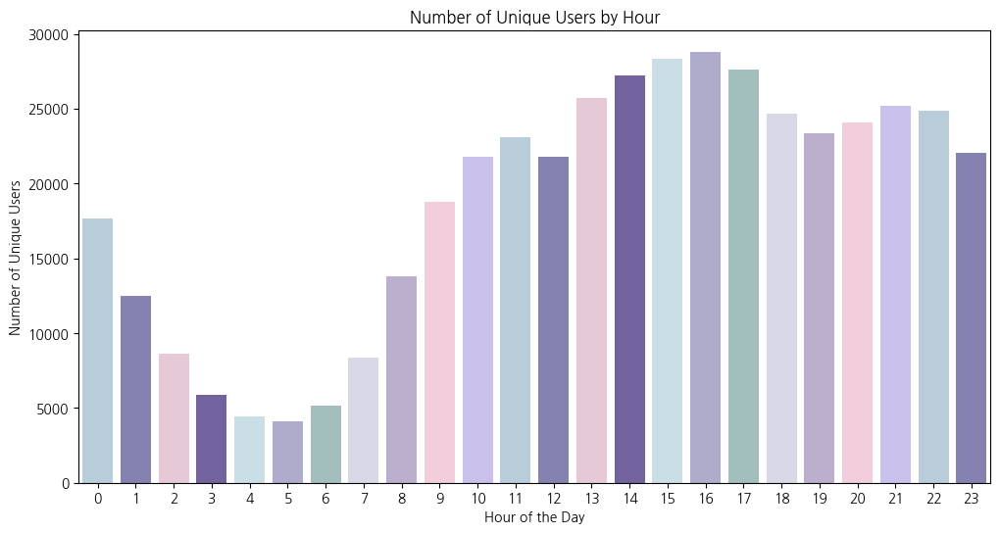

In [77]:
import seaborn as sns
import matplotlib.pyplot as plt

# 팔레트 설정
palette = ['#b3cde0', '#7e79b8', '#eac4d5', '#6e58a7', '#c6e2e9',
           '#a9a7cf', '#9dc3c1', '#d5d5e9', '#baaad0', '#f8c8dc', '#c5b9f2']

# enter_lesson_time에서 시간 추출
enter_lesson_page_finalised_unique['hour'] = enter_lesson_page_finalised_unique['enter_lesson_time'].dt.hour

# 각 시간대별 user_id 수 계산
hourly_user_count = enter_lesson_page_finalised_unique.groupby('hour')['user_id'].nunique().reset_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
sns.barplot(x='hour', y='user_id', data=hourly_user_count, palette=palette)
plt.title('Number of Unique Users by Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Unique Users')
plt.xticks(range(0, 24))
plt.show()

In [78]:
# 24시간 시작, 끝이 모두 있는 데이터만 필터링

# event_time_complete와 event_time을 datetime 형식으로 변환
matched_df['event_time_complete'] = pd.to_datetime(matched_df['event_time_complete'])
matched_df['event_time'] = pd.to_datetime(matched_df['event_time'])

# complete_df와 enter_df를 matched_df와 병합 (user_id, content_id, lesson_id를 기준으로 병합)
complete_df = matched_df[['user_id', 'content_id', 'lesson_id', 'event_time_complete']]
enter_df = matched_df[['user_id', 'content_id', 'lesson_id', 'event_time']]

# 병합하여 event_time과 event_time_complete 사이의 시간 차이 계산
merged_df = pd.merge(complete_df, enter_df, on=['user_id', 'content_id', 'lesson_id'], suffixes=('_complete', '_enter'))

# 병합된 데이터프레임의 열 이름 확인
print(merged_df.columns)

# 시간 차이를 초 단위로 계산
merged_df['time_diff'] = (merged_df['event_time_complete'] - merged_df['event_time']).dt.total_seconds()

# 시간 차이가 24시간(86400초) 이내인 경우만 필터링
filtered_df = merged_df[merged_df['time_diff'] <= 86400]

# 결과 출력
filtered_df

Index(['user_id', 'content_id', 'lesson_id', 'event_time_complete',
       'event_time'],
      dtype='object')


,user_id,content_id,lesson_id,event_time_complete,event_time,time_diff
1,459c1fe98bb5a1024f942c06c9883615,68a3658f1b936bfff3bd6960cd561b0a,1238493aafb242e6bb8b6891271fa8a9,2022-01-01 10:28:15.544,2022-01-01 10:25:19.668,1.758760e+02
2,459c1fe98bb5a1024f942c06c9883615,68a3658f1b936bfff3bd6960cd561b0a,54dd3f1d5ccc6ed8f75c99d4b92feacf,2022-01-01 10:35:04.805,2022-01-01 10:28:16.287,4.085180e+02
3,459c1fe98bb5a1024f942c06c9883615,68a3658f1b936bfff3bd6960cd561b0a,54dd3f1d5ccc6ed8f75c99d4b92feacf,2022-01-01 10:35:04.805,2022-05-03 23:26:17.427,-1.058707e+07
4,459c1fe98bb5a1024f942c06c9883615,68a3658f1b936bfff3bd6960cd561b0a,1ec838a253800869b1724bbb1da49376,2022-01-01 10:43:47.151,2022-01-01 10:35:04.612,5.225390e+02
5,459c1fe98bb5a1024f942c06c9883615,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476,2022-01-01 10:45:38.806,2022-01-01 10:43:47.037,1.117690e+02
...,...,...,...,...,...,...
17666903,7076bfc876954e044e60c37dfa9cd36d,d6227ba76134f6cf821bb98b5f235bd0,ca8fc4063166c5c32652a2ed9b3ca6fb,2023-12-31 23:48:43.737,2023-12-31 23:46:32.379,1.313580e+02
17666904,481247c0a2d1dcc3a0ed3e8db9f46ccb,b314d5aba64a0aab40602cb72a4a1504,9c9ce3ab4cc3c6f11634a527f39de056,2023-12-31 23:53:19.714,2023-12-31 23:47:45.432,3.342820e+02
17666905,6bb6a6abf52d45673b14ae511d33db8d,c8e53577758bf66711094352a5abd8c3,b7d5d38f49d78cdbcfe01c9c96051159,2023-12-31 23:49:51.407,2023-12-31 23:48:43.087,6.832000e+01
17666909,772a0f028f7ac03ebba57c7e0f8f73fe,61b6463287573f00de13a930805a52d6,6e3afbeb4942c6c29038321e5995f4f1,2023-12-31 23:54:06.177,2023-12-31 23:50:19.682,2.264950e+02


In [79]:
# time_diff 60초 미만 삭제제
filtered_df = filtered_df[filtered_df['time_diff'] > 60]

In [80]:
filtered_df.describe()

,event_time_complete,event_time,time_diff
count,409991,409991,409991.000000
mean,2022-09-16 10:34:08.252963072,2022-09-16 10:04:21.032134144,1787.220829
min,2022-01-01 10:28:15.544000,2022-01-01 10:25:19.668000,60.001000
25%,2022-05-13 04:02:41.376000,2022-05-13 03:43:27.727500032,148.468000
50%,2022-07-20 12:36:20.067000064,2022-07-20 12:04:39.127000064,269.066000
75%,2022-12-21 15:08:37.020999936,2022-12-21 14:45:31.453000192,587.430000
max,2023-12-31 23:54:06.177000,2023-12-31 23:50:19.682000,86394.841000
std,NaN,NaN,8200.745127


In [81]:
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 409991 entries, 1 to 17666909
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   user_id              409991 non-null  object        
 1   content_id           409991 non-null  object        
 2   lesson_id            409991 non-null  object        
 3   event_time_complete  409991 non-null  datetime64[ns]
 4   event_time           409991 non-null  datetime64[ns]
 5   time_diff            409991 non-null  float64       
dtypes: datetime64[ns](2), float64(1), object(3)
memory usage: 21.9+ MB


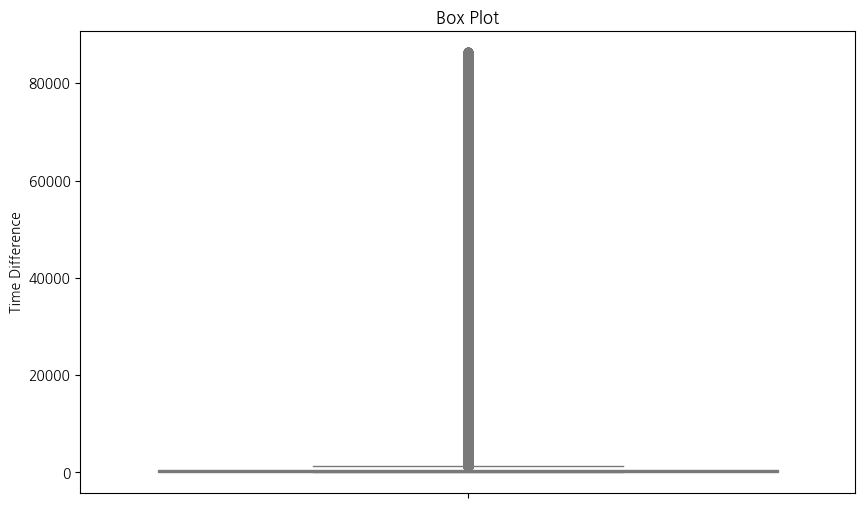

In [82]:
# 박스플롯
plt.figure(figsize=(10, 6))
sns.boxplot(y=filtered_df['time_diff'])
plt.title('Box Plot')
plt.ylabel('Time Difference')
plt.show()

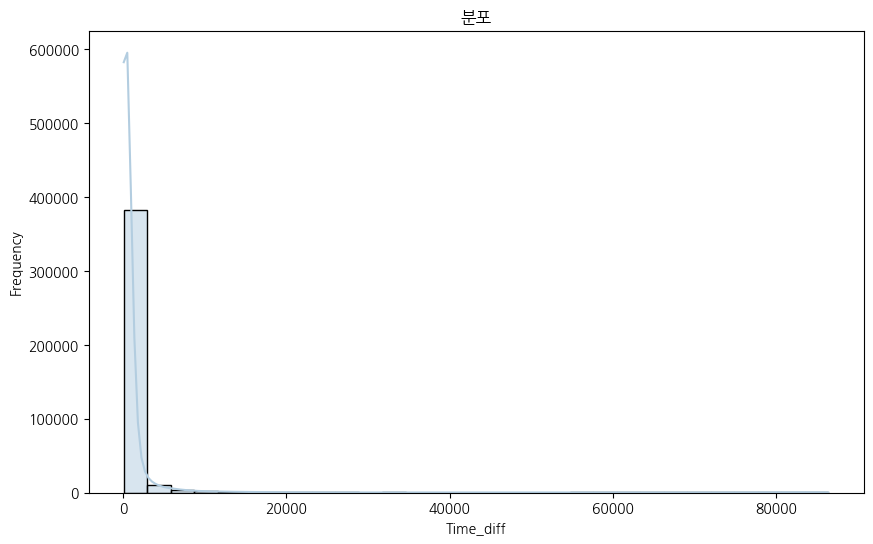

In [83]:
# time_diff 분포
plt.figure(figsize=(10, 6))
sns.histplot(filtered_df['time_diff'], bins=30, kde=True)
plt.title('분포')
plt.xlabel('Time_diff')
plt.ylabel('Frequency')

plt.ticklabel_format(style='plain', axis='x')
plt.ticklabel_format(style='plain', axis='y')

plt.show()

In [84]:
# 'user_id', 'lesson_id', 'event_time_complete' 기준으로 중복된 행 찾기
duplicates = filtered_df.dropna(subset=['event_time_complete'])
duplicates = duplicates[duplicates.duplicated(subset=['user_id', 'lesson_id', 'event_time_complete'], keep=False)]
duplicates

,user_id,content_id,lesson_id,event_time_complete,event_time,time_diff
4127,64ef2c3f10020a887880ee98ef749482,f64c475280676531a31f2f8e0648599c,ff4c3c070c623be2da90a5a84313ecdc,2022-01-10 07:52:42.942,2022-01-10 07:04:42.271,2880.671
4128,64ef2c3f10020a887880ee98ef749482,f64c475280676531a31f2f8e0648599c,ff4c3c070c623be2da90a5a84313ecdc,2022-01-10 07:52:42.942,2022-01-10 07:07:06.703,2736.239
4129,64ef2c3f10020a887880ee98ef749482,f64c475280676531a31f2f8e0648599c,ff4c3c070c623be2da90a5a84313ecdc,2022-01-10 07:52:42.942,2022-01-10 07:08:53.065,2629.877
18949,914f1ce87f1c51b0f1cdf4ff858b4804,68a3658f1b936bfff3bd6960cd561b0a,fafaf3621bdc750a900cea7b8ef04569,2022-01-28 15:55:26.118,2022-01-28 15:39:06.244,979.874
18950,914f1ce87f1c51b0f1cdf4ff858b4804,68a3658f1b936bfff3bd6960cd561b0a,fafaf3621bdc750a900cea7b8ef04569,2022-01-28 15:55:26.118,2022-01-28 15:44:37.802,648.316
...,...,...,...,...,...,...
17654715,5c2ce4062550e53fa30c3f53b8c9b181,61b6463287573f00de13a930805a52d6,2ed4b83e65edc2b1efb193aaa3c60cf9,2023-12-24 21:57:33.775,2023-12-24 18:52:39.840,11093.935
17654716,5c2ce4062550e53fa30c3f53b8c9b181,61b6463287573f00de13a930805a52d6,2ed4b83e65edc2b1efb193aaa3c60cf9,2023-12-24 21:57:33.775,2023-12-24 19:58:29.691,7144.084
17659363,5c2ce4062550e53fa30c3f53b8c9b181,f4be1a0fe0e301b03115591777fddf29,b42c9bb32f5024900cbed7623eecd272,2023-12-27 15:59:30.381,2023-12-26 19:22:36.156,74214.225
17659364,5c2ce4062550e53fa30c3f53b8c9b181,f4be1a0fe0e301b03115591777fddf29,b42c9bb32f5024900cbed7623eecd272,2023-12-27 15:59:30.381,2023-12-26 19:59:08.752,72021.629


In [85]:
filtered_df.describe()


,event_time_complete,event_time,time_diff
count,409991,409991,409991.000000
mean,2022-09-16 10:34:08.252963072,2022-09-16 10:04:21.032134144,1787.220829
min,2022-01-01 10:28:15.544000,2022-01-01 10:25:19.668000,60.001000
25%,2022-05-13 04:02:41.376000,2022-05-13 03:43:27.727500032,148.468000
50%,2022-07-20 12:36:20.067000064,2022-07-20 12:04:39.127000064,269.066000
75%,2022-12-21 15:08:37.020999936,2022-12-21 14:45:31.453000192,587.430000
max,2023-12-31 23:54:06.177000,2023-12-31 23:50:19.682000,86394.841000
std,NaN,NaN,8200.745127


In [86]:
# filtered_df 'user_id', 'lesson_id', 'event_time_complete' 기준으로 중복된 행이 있다면, 그 중 첫 번째 행만 event_time_complete을 남기고 나머지는 NAN으로 변경 후 삭제

# 중복된 행 찾기 (첫 번째 행을 제외한 나머지 행)
duplicates = filtered_df.duplicated(subset=['user_id', 'lesson_id', 'event_time_complete'], keep='first')

# 중복된 행의 event_time_complete을 NaN으로 변경
filtered_df.loc[duplicates, 'event_time_complete'] = pd.NaT

# NaN으로 변경된 행 삭제
filtered_df = filtered_df.dropna(subset=['event_time_complete'])

# 결과 출력
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 409254 entries, 1 to 17666909
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   user_id              409254 non-null  object        
 1   content_id           409254 non-null  object        
 2   lesson_id            409254 non-null  object        
 3   event_time_complete  409254 non-null  datetime64[ns]
 4   event_time           409254 non-null  datetime64[ns]
 5   time_diff            409254 non-null  float64       
dtypes: datetime64[ns](2), float64(1), object(3)
memory usage: 21.9+ MB


In [87]:
filtered_df.describe()

,event_time_complete,event_time,time_diff
count,409254,409254,409254.000000
mean,2022-09-15 23:34:22.366526720,2022-09-15 23:04:55.138611968,1767.227915
min,2022-01-01 10:28:15.544000,2022-01-01 10:25:19.668000,60.001000
25%,2022-05-13 00:03:21.385499904,2022-05-12 23:47:37.461249792,148.369250
50%,2022-07-20 09:26:28.594999808,2022-07-20 08:38:21.658999808,268.677500
75%,2022-12-20 00:50:56.460250112,2022-12-20 00:27:04.267499776,585.720500
max,2023-12-31 23:54:06.177000,2023-12-31 23:50:19.682000,86394.841000
std,NaN,NaN,8131.622692


In [88]:
print(f'유저 수: {filtered_df['user_id'].nunique()}')
print(f'content_id 수: {filtered_df["content_id"].nunique()}')  
print(f'lesson_id 수: {filtered_df["lesson_id"].nunique()}')
print(f'event_time_complete 수: {filtered_df["event_time_complete"].nunique()}')
print(f'time_diff 최소값: {filtered_df["time_diff"].min()}')
print(f'time_diff 최대값: {filtered_df["time_diff"].max()}')
print(f'time_diff 평균값: {filtered_df["time_diff"].mean()}')

유저 수: 11050
content_id 수: 116
lesson_id 수: 4300
event_time_complete 수: 409254
time_diff 최소값: 60.001
time_diff 최대값: 86394.841
time_diff 평균값: 1767.2279147351032


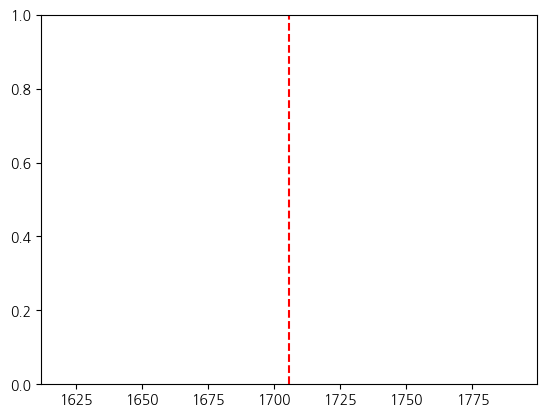

In [89]:
ninety = filtered_df['time_diff'].quantile(0.9)
plt.axvline(ninety, color='red', linestyle='--', label='90% 지점')

In [90]:
# user_id 별 time_diff의 합합
user_study_time = filtered_df.groupby('user_id')['time_diff'].sum()

# 데이터프레임으로 변환
user_study_time = user_study_time.reset_index()
user_study_time

,user_id,time_diff
0,0000572f2ba8079bcefd2760b632e820,633.446
1,000087537cbfd934375364218ff10f91,386.183
2,0001f15911b404f3bf5b8571afafa4e4,4920.047
3,000be07bc09ceff42c11978f4a9f1c1a,32811.514
4,001cd989a26ba664b086b92c364dc9cf,7536.299
...,...,...
11045,ffe800abf1a0c00994b2a5b1ce68c681,1050.267
11046,ffe8f08cd65e082952aca5a3110f5601,190648.571
11047,ffefd2c23af0e8de9a5bb9aebc498d07,676.991
11048,fff219b952002818462faa3746343f09,440916.388


In [91]:
# 분 단위 time_diff 열 추가
user_study_time['time_diff_minute'] = user_study_time['time_diff'] / 60
user_study_time

,user_id,time_diff,time_diff_minute
0,0000572f2ba8079bcefd2760b632e820,633.446,10.557433
1,000087537cbfd934375364218ff10f91,386.183,6.436383
2,0001f15911b404f3bf5b8571afafa4e4,4920.047,82.000783
3,000be07bc09ceff42c11978f4a9f1c1a,32811.514,546.858567
4,001cd989a26ba664b086b92c364dc9cf,7536.299,125.604983
...,...,...,...
11045,ffe800abf1a0c00994b2a5b1ce68c681,1050.267,17.504450
11046,ffe8f08cd65e082952aca5a3110f5601,190648.571,3177.476183
11047,ffefd2c23af0e8de9a5bb9aebc498d07,676.991,11.283183
11048,fff219b952002818462faa3746343f09,440916.388,7348.606467


In [92]:
user_study_time.describe()

,time_diff,time_diff_minute
count,1.105000e+04,11050.000000
mean,6.545204e+04,1090.867410
std,1.411338e+05,2352.229417
min,6.001600e+01,1.000267
25%,2.048676e+03,34.144604
50%,1.231178e+04,205.196333
75%,7.886615e+04,1314.435850
max,3.502326e+06,58372.102483


### 25%, 50%, 75% 기준으로 유저군 분류

In [93]:
def classify_study_time_groups(df):
    # 1️⃣ 사분위수 계산
    q1 = df['time_diff'].quantile(0.25)  # 1분위 (하위 25%)
    q3 = df['time_diff'].quantile(0.75)  # 3분위 (상위 25%)

    # 2️⃣ 그룹 분류 함수
    def categorize(time_diff):
        if time_diff >= q3:
            return 'High'   # 공부 많이 한 그룹 (상위 25%)
        elif time_diff <= q1:
            return 'Low'    # 공부 안 하는 그룹 (하위 25%)
        else:
            return 'Medium' # 중간 그룹 (중간 50%)

    # 3️⃣ 그룹 분류 컬럼 추가
    df['study_group'] = df['time_diff'].apply(categorize)

    return df

# user_study_time 데이터프레임에 그룹 분류 적용
user_study_time_with_groups = classify_study_time_groups(user_study_time)

# 결과 출력
user_study_time_with_groups.head()

,user_id,time_diff,time_diff_minute,study_group
0,0000572f2ba8079bcefd2760b632e820,633.446,10.557433,Low
1,000087537cbfd934375364218ff10f91,386.183,6.436383,Low
2,0001f15911b404f3bf5b8571afafa4e4,4920.047,82.000783,Medium
3,000be07bc09ceff42c11978f4a9f1c1a,32811.514,546.858567,Medium
4,001cd989a26ba664b086b92c364dc9cf,7536.299,125.604983,Medium


In [94]:
user_study_time_with_groups['study_group'].value_counts()

study_group
Medium    5524
Low       2763
High      2763
Name: count, dtype: int64

- 그룹별 describe

In [95]:
user_study_time_with_groups[user_study_time_with_groups['study_group'] == 'High'].describe()

,time_diff,time_diff_minute
count,2.763000e+03,2763.000000
mean,2.173577e+05,3622.628591
std,2.183479e+05,3639.132328
min,7.886915e+04,1314.485900
25%,9.819219e+04,1636.536433
50%,1.483754e+05,2472.923350
75%,2.404625e+05,4007.708275
max,3.502326e+06,58372.102483


In [96]:
user_study_time_with_groups[user_study_time_with_groups['study_group'] == 'Medium'].describe()

,time_diff,time_diff_minute
count,5524.000000,5524.000000
mean,21807.713920,363.461899
std,21585.912387,359.765206
min,2048.761000,34.146017
25%,5088.945500,84.815758
50%,12311.780000,205.196333
75%,33083.504750,551.391746
max,78857.142000,1314.285700


In [97]:
user_study_time_with_groups[user_study_time_with_groups['study_group'] == 'Low'].describe()

,time_diff,time_diff_minute
count,2763.000000,2763.000000
mean,803.443186,13.390720
std,561.664545,9.361076
min,60.016000,1.000267
25%,309.328500,5.155475
50%,688.642000,11.477367
75%,1226.566500,20.442775
max,2048.648000,34.144133


In [201]:
user_study_time_with_groups.head()

,user_id,time_diff,time_diff_minute,study_group
0,0000572f2ba8079bcefd2760b632e820,633.446,10.557433,Low
1,000087537cbfd934375364218ff10f91,386.183,6.436383,Low
2,0001f15911b404f3bf5b8571afafa4e4,4920.047,82.000783,Medium
3,000be07bc09ceff42c11978f4a9f1c1a,32811.514,546.858567,Medium
4,001cd989a26ba664b086b92c364dc9cf,7536.299,125.604983,Medium


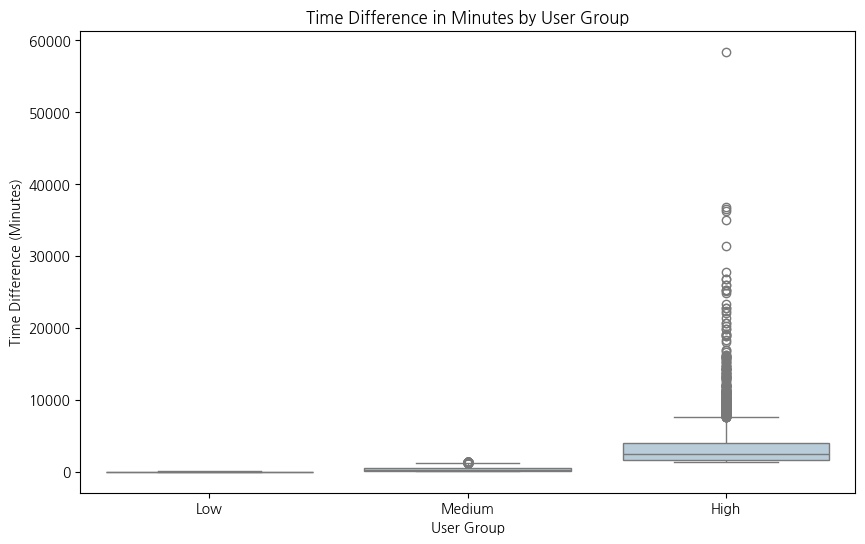

In [202]:
# Low, Medium, High 유저 군 별 time_diff_minute 박스플롯

plt.figure(figsize=(10, 6))
sns.boxplot(x='study_group', y='time_diff_minute', data=user_study_time_with_groups, order=['Low', 'Medium', 'High'])
plt.title('Time Difference in Minutes by User Group')
plt.xlabel('User Group')
plt.ylabel('Time Difference (Minutes)')
plt.show()

C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\2876473387.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='study_group', data=user_study_time_with_groups, order=['High', 'Medium', 'Low'], palette=palette)


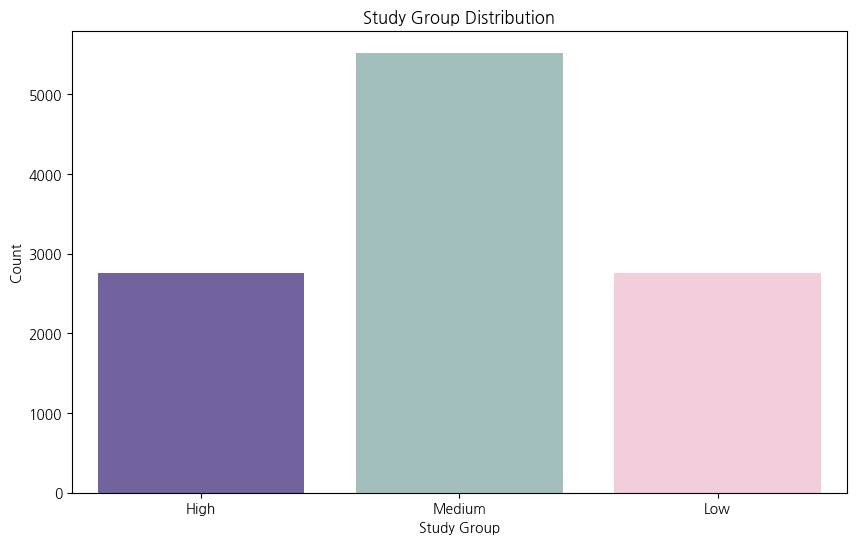

In [98]:
# user_study_time_with_groups['study_group']의 value_counts()를 그래프로 출력
#  팔레트
#palette = ['#b3cde0', '#7e79b8', '#eac4d5', '#6e58a7', '#c6e2e9',
#            '#a9a7cf', '#9dc3c1','#d5d5e9', '#baaad0', '#f8c8dc', '#c5b9f2']  


# 각 study_group에 대한 색상 지정
palette = {'High': '#6e58a7', 'Medium': '#9dc3c1', 'Low': '#f8c8dc'}

# 그래프 그리기
plt.figure(figsize=(10, 6))
sns.countplot(x='study_group', data=user_study_time_with_groups, order=['High', 'Medium', 'Low'], palette=palette)
plt.title('Study Group Distribution')
plt.xlabel('Study Group')
plt.ylabel('Count')
plt.show()

### 첫 결제

In [99]:
complete_subscription.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Nowon-gu,2023-04-06 06:40:04.000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Edge,111.0.1661.62,Web,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 23:20:03.008,South Korea,NaN,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,16.3,Web,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 17:46:14.026,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN
3,Geumjeong-gu,2023-04-12 20:35:01.865,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180,131600,131600,0,NaN
4,Gwangmyeong,2023-05-31 10:25:55.820,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Chrome,113.0.0.0,Web,d4f54ecf6c4d7bf8742f80505f02d6dc,15920,15920,0,NaN


In [100]:
len(subscription_user_id_list)

13875

In [101]:
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 409254 entries, 1 to 17666909
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   user_id              409254 non-null  object        
 1   content_id           409254 non-null  object        
 2   lesson_id            409254 non-null  object        
 3   event_time_complete  409254 non-null  datetime64[ns]
 4   event_time           409254 non-null  datetime64[ns]
 5   time_diff            409254 non-null  float64       
dtypes: datetime64[ns](2), float64(1), object(3)
memory usage: 21.9+ MB


In [102]:
# active, inactive 유저 구분분

# user_study_time_with_groups의 user_id를 고유한 값으로 추출
study_time_users = user_study_time_with_groups['user_id'].unique()

# 활동이 있는 유저 찾기 (subscription_user_id_list에 있는 경우)
active_users = [user_id for user_id in subscription_user_id_list if user_id in study_time_users]

# 활동이 없는 유저 찾기 (subscription_user_id_list에 있지만 study_time_users에 없는 경우)
inactive_users = [user_id for user_id in subscription_user_id_list if user_id not in study_time_users]

# 결과 출력
print(f"활동 기록이 있는 첫 결제 유저 수: {len(active_users)}")
print(f"활동 기록이 없는 첫 결제 유저 수: {len(inactive_users)}")

활동 기록이 있는 첫 결제 유저 수: 11050
활동 기록이 없는 첫 결제 유저 수: 2825


In [103]:
print(len(subscription_user_id_list))
print(user_study_time_with_groups['user_id'].nunique())

13875
11050


In [104]:
# subscription_user_id_list에 있는 user_id만 남기고 필터링
filtered_user_study_time = user_study_time_with_groups[user_study_time_with_groups['user_id'].isin(subscription_user_id_list)]

# 결과 출력
filtered_user_study_time.head()

,user_id,time_diff,time_diff_minute,study_group
0,0000572f2ba8079bcefd2760b632e820,633.446,10.557433,Low
1,000087537cbfd934375364218ff10f91,386.183,6.436383,Low
2,0001f15911b404f3bf5b8571afafa4e4,4920.047,82.000783,Medium
3,000be07bc09ceff42c11978f4a9f1c1a,32811.514,546.858567,Medium
4,001cd989a26ba664b086b92c364dc9cf,7536.299,125.604983,Medium


## 학습시간이 정기결제로의 전환에 영향을 미치나?

### 정기결제 전환

In [105]:
# 정기결제 데이터(renew_subscription) 전처리리
renew_subscription = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/renew_subscription.csv')
renew_subscription['client_event_time'] = pd.to_datetime(renew_subscription['client_event_time'], errors='coerce')
renew_subscription['client_event_time'] = renew_subscription['client_event_time'] + pd.Timedelta(hours=9)
renew_subscription = renew_subscription.loc[
    renew_subscription['client_event_time'].dt.year.between(2022, 2023)]
renew_subscription.drop(renew_subscription[renew_subscription['os_name'] == 'Chrome Headless'].index, inplace=True)

In [106]:
renew_subscription.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Nam-gu,2022-09-08 12:05:02.068,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Edge,104,Web,6ddea3af2eaae869861c1190dcc9d4a3,15920,15920,0,NaN
1,Nam-gu,2022-09-08 12:40:02.050,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,c2d47034960fdff5df495822ff66fbc1,15920,15920,0,NaN
2,Dongjak-gu,2022-09-08 12:49:00.829,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,de91f1226dd938990fefc79545daf468,42960,40812,2148,NaN
3,Yongin-si,2022-09-08 13:10:06.406,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,bf14840a8cb4643e6d557da96e35a3af,15920,15920,0,NaN
4,Dongjak-gu,2022-09-08 13:40:01.895,South Korea,NaN,Android,Android,renew.subscription,Korean,Chrome Mobile,103,Web,7ddc1c2990d0645d82885394e3c518b5,15920,15920,0,NaN


In [107]:
print(renew_subscription['client_event_time'].min())
print(renew_subscription['client_event_time'].max())


2022-09-08 12:05:02.068000
2023-12-31 23:50:02.215000


In [108]:
filtered_user_study_time['study_group'].value_counts()

study_group
Medium    5524
Low       2763
High      2763
Name: count, dtype: int64

In [109]:
# subscription_user_id_list에 있는 user_id만 남기고 필터링
filtered_user_study_time = user_study_time_with_groups[user_study_time_with_groups['user_id'].isin(subscription_user_id_list)]

# renew_subscription과 filtered_user_study_time를 user_id를 기준으로 병합
merged_df = pd.merge(renew_subscription, filtered_user_study_time[['user_id', 'study_group']], on='user_id', how='inner')

# study_group별로 정기결제로 넘어간 user_id 개수 구하기
renewed_study_group_counts = merged_df.groupby('study_group')['user_id'].nunique().reset_index()
renewed_study_group_counts.columns = ['study_group', 'renewed_user_count']

# study_group별 원래 user_id 개수 구하기
original_study_group_counts = filtered_user_study_time.groupby('study_group')['user_id'].nunique().reset_index()
original_study_group_counts.columns = ['study_group', 'original_user_count']

# 두 데이터프레임 병합
study_group_counts = pd.merge(original_study_group_counts, renewed_study_group_counts, on='study_group', how='left')

# 결과 출력
study_group_counts

,study_group,original_user_count,renewed_user_count
0,High,2763,1285
1,Low,2763,1053
2,Medium,5524,2344


In [110]:
study_group_counts['renew_percent'] = round(study_group_counts['renewed_user_count'] / study_group_counts['original_user_count'] * 100, 2)
study_group_counts = study_group_counts.sort_values(by='renew_percent', ascending=False).reset_index(drop = True)
study_group_counts

,study_group,original_user_count,renewed_user_count,renew_percent
0,High,2763,1285,46.51
1,Medium,5524,2344,42.43
2,Low,2763,1053,38.11


In [111]:
# 수강 -> 정기결제 전환율율
study_group_counts['renewed_user_count'].sum() / study_group_counts['original_user_count'].sum() * 100

42.3710407239819

- 많은 시간을 수강에 투자할수록 정기결제 전환율이 높다!!!!!

### 정기결제 전환율 수치

In [112]:
# 이탈률 추가, 열 이름 변경
study_group_counts['churn_rate'] = 100 - study_group_counts['renew_percent']

# 정기결제 전환율(%)을 기준으로 내림차순 정렬하고 인덱스 초기화
study_group_counts = study_group_counts.sort_values(by='renew_percent', ascending=False).reset_index(drop=True)
study_group_counts

,study_group,original_user_count,renewed_user_count,renew_percent,churn_rate
0,High,2763,1285,46.51,53.49
1,Medium,5524,2344,42.43,57.57
2,Low,2763,1053,38.11,61.89


In [113]:
renew_subscription['user_id'].nunique()

7498

### 학습 시간에 따른 정기결제 전환율 통계 검정
- 귀무가설 : 학습 시간과 정기결제 전환율은 연관이 없다.
- 대립가설 : 학습 시간과 정기결제 전환율은 연관이 있다.

In [114]:
# subscription_user_id_list에 있는 user_id만 남기고 필터링
filtered_user_study_time = user_study_time_with_groups[user_study_time_with_groups['user_id'].isin(subscription_user_id_list)]

# renew_subscription과 filtered_user_study_time를 user_id를 기준으로 병합
merged_df = pd.merge(renew_subscription, filtered_user_study_time[['user_id', 'study_group']], on='user_id', how='inner')

# study_group별로 정기결제로 넘어간 user_id 개수 구하기
renewed_study_group_counts = merged_df.groupby('study_group')['user_id'].nunique().reset_index()
renewed_study_group_counts.columns = ['study_group', 'renewed_user_count']

# study_group별 원래 user_id 개수 구하기
original_study_group_counts = filtered_user_study_time.groupby('study_group')['user_id'].nunique().reset_index()
original_study_group_counts.columns = ['study_group', 'original_user_count']

# 두 데이터프레임 병합
study_group_counts = pd.merge(original_study_group_counts, renewed_study_group_counts, on='study_group', how='left')

# NaN 값을 0으로 대체
study_group_counts['renewed_user_count'] = study_group_counts['renewed_user_count'].fillna(0)

# 카이제곱 독립성 검정을 위한 교차표 생성
contingency_table = study_group_counts[['original_user_count', 'renewed_user_count']].values

# 카이제곱 독립성 검정 수행
chi2, p, dof, expected = chi2_contingency(contingency_table)

# 결과 출력
print(f"카이제곱: {chi2}")
print(f"P-value: {p}")
print(f"자유도(dof): {dof}")
print("기대빈도:")
print(expected)

# 귀무가설 검정 결과
if p < 0.05:
    print("대립가설 채택: 학습 시간과 정기결제 전환율은 연관이 있다.")
else:
    print("귀무가설 채택: 학습 시간과 정기결제 전환율은 연관이 없다.")

카이제곱: 16.18856287066379
P-value: 0.0003052799189092345
자유도(dof): 2
기대빈도:
[[2843.2748538  1204.7251462 ]
 [2680.32036613 1135.67963387]
 [5526.40478007 2341.59521993]]
대립가설 채택: 학습 시간과 정기결제 전환율은 연관이 있다.


In [115]:
print(len(matched_df))
print(len(filtered_user_study_time))
print(len(renew_subscription))

3388959
11050
15944


In [116]:
matched_df.head()

,user_id,event_time,event_type_enter,content_id,lesson_id,event_time_complete,event_type_complete,time_diff
0,28562e887d0942c8f422f1ffa1c12bc0,2022-01-01 09:30:37.101,enter,38df90d4de533d6296b52c6a1d90e26b,80aac6e426ef54f462cc4e3fea699e0c,NaT,NaN,NaN
1,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:25:19.668,enter,68a3658f1b936bfff3bd6960cd561b0a,1238493aafb242e6bb8b6891271fa8a9,2022-01-01 10:28:15.544,complete,175.876
2,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:28:16.287,enter,68a3658f1b936bfff3bd6960cd561b0a,54dd3f1d5ccc6ed8f75c99d4b92feacf,2022-01-01 10:35:04.805,complete,408.518
3,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:35:04.612,enter,68a3658f1b936bfff3bd6960cd561b0a,1ec838a253800869b1724bbb1da49376,2022-01-01 10:43:47.151,complete,522.539
4,459c1fe98bb5a1024f942c06c9883615,2022-01-01 10:43:47.037,enter,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476,2022-01-01 10:45:38.806,complete,111.769


In [117]:
print(matched_df['event_time_complete'].nunique())
print(matched_df['event_time'].nunique())
print(matched_df['time_diff'].nunique())

700473
3388812
377801


In [118]:
complete_subscription['user_id'].nunique()

13875

In [119]:
print(f'유저 수: {filtered_df['user_id'].nunique()}')
print(f'content_id 수: {filtered_df["content_id"].nunique()}')  
print(f'lesson_id 수: {filtered_df["lesson_id"].nunique()}')
print(f'event_time_complete 수: {filtered_df["event_time_complete"].nunique()}')
print(f'time_diff 최소값: {filtered_df["time_diff"].min()}')
print(f'time_diff 최대값: {filtered_df["time_diff"].max()}')
print(f'time_diff 평균값: {filtered_df["time_diff"].mean()}')


유저 수: 11050
content_id 수: 116
lesson_id 수: 4300
event_time_complete 수: 409254
time_diff 최소값: 60.001
time_diff 최대값: 86394.841
time_diff 평균값: 1767.2279147351032


In [120]:
print(matched_df['time_diff'].nunique())
print(filtered_df['time_diff'].nunique())

377801
314030


In [121]:
print(filtered_df["time_diff"].nunique() / matched_df['time_diff'].nunique())

0.831204787705697


In [122]:
print(filtered_df["event_time_complete"].nunique() / matched_df['event_time_complete'].nunique())

0.5842537828010501


In [123]:
complete_subscription.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Nowon-gu,2023-04-06 06:40:04.000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Edge,111.0.1661.62,Web,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 23:20:03.008,South Korea,NaN,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,16.3,Web,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 17:46:14.026,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN
3,Geumjeong-gu,2023-04-12 20:35:01.865,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180,131600,131600,0,NaN
4,Gwangmyeong,2023-05-31 10:25:55.820,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Chrome,113.0.0.0,Web,d4f54ecf6c4d7bf8742f80505f02d6dc,15920,15920,0,NaN


### 정기결제 -> 재구독

In [124]:
# 재구독 데이터(resubscribe_subcription) 전처리
resubscribe_subscription = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/resubscribe_subscription.csv')
resubscribe_subscription['client_event_time'] = pd.to_datetime(resubscribe_subscription['client_event_time'], errors='coerce')
resubscribe_subscription['client_event_time'] = resubscribe_subscription['client_event_time'] + pd.Timedelta(hours=9)
resubscribe_subscription = resubscribe_subscription.loc[
    resubscribe_subscription['client_event_time'].dt.year.between(2022, 2023)]
resubscribe_subscription.drop(resubscribe_subscription[resubscribe_subscription['os_name'] == 'Chrome Headless'].index, inplace=True)

In [125]:
# resubscribe_subscription의 user_id를 renew_subscription 안에서 찾기기
resubscribe_users_count = resubscribe_subscription[resubscribe_subscription['user_id'].isin(renew_subscription['user_id'])]['user_id'].nunique()

In [126]:
click_cancel_plan = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/click_cancel_plan_button.csv')
click_cancel_plan['client_event_time'] = pd.to_datetime(click_cancel_plan['client_event_time'], errors='coerce')
click_cancel_plan['client_event_time'] = click_cancel_plan['client_event_time'] + pd.Timedelta(hours=9)
click_cancel_plan = click_cancel_plan.loc[
    click_cancel_plan['client_event_time'].dt.year.between(2022, 2023)]
click_cancel_plan.drop(click_cancel_plan[click_cancel_plan['os_name'] == 'Chrome Headless'].index, inplace=True)

In [127]:
click_cancel_plan.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Daegu,2023-04-10 23:57:48.556,South Korea,NaN,Windows,Windows,click.cancel_plan_button,Korean,Chrome,111.0.0.0,Web,9e59ecf9a8fbe9051bd0d54f4b702f30
1,Seoul,2023-03-12 17:26:16.224,South Korea,NaN,Apple iPad,Apple iPad,click.cancel_plan_button,English,Mobile Safari,16.3,Web,4ed4d8f12c45504a148bfff0f2e9466e
2,Uijeongbu-si,2023-03-12 17:23:04.955,South Korea,NaN,Windows,Windows,click.cancel_plan_button,Korean,Chrome,110.0.0.0,Web,b6a1bba3cc4139d7dc821561319221e6
3,Dobong-gu,2023-03-12 17:32:39.271,South Korea,NaN,Windows,Windows,click.cancel_plan_button,Korean,Chrome,110.0.0.0,Web,40acc1ddfc012f3d2f58a3de95e9e748
4,Geumjeong-gu,2023-04-12 20:36:28.311,South Korea,NaN,Windows,Windows,click.cancel_plan_button,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180


In [128]:
# renew_subscription, click_cancel_plan, resubscribe_subscription의 client_event_time이 시간 순서대로 있는 user_id 찾기

sorted_user_id = pd.Series(renew_subscription['user_id'].unique())
sorted_user_id = sorted_user_id[sorted_user_id.isin(click_cancel_plan['user_id'])]
sorted_user_id = sorted_user_id[sorted_user_id.isin(resubscribe_subscription['user_id'])]

# 결과 출력
print(sorted_user_id)

1       c2d47034960fdff5df495822ff66fbc1
61      6abf383e862ef4d0f29b9b29182f36a5
89      568096ead305c84240f3b1cdbfd8afb9
105     3d66fba0584e37ec6b6b0bc5302cd4d8
127     9bd2c5bb4639f36874e859facbd5faf5
                      ...               
7091    e07feb717b6ed7bfce3e610c14b92891
7185    92732642cfdb83427ea916f35882b45d
7275    fd677cf2a08f2c01b6e02dd9be0d7da2
7283    86012338916c4102a9b11559981dcab5
7404    735f207da30919eafdb41672ffe60a7c
Length: 445, dtype: object


In [129]:
click_cancel_plan['user_id'].nunique()

14641

In [130]:
# 세 개의 데이터프레임을 하나로 합쳐서 시간 순으로 정렬
merged_df = pd.concat([
    renew_subscription.assign(event='renew'),
    click_cancel_plan.assign(event='cancel'),
    resubscribe_subscription.assign(event='resubscribe')
])

merged_df = merged_df.sort_values(['user_id', 'client_event_time'])

# 올바른 순서를 따르는 user_id 찾기
def check_order(df):
    events = df['event'].tolist()
    return events == ['renew', 'cancel', 'resubscribe']

# 그룹별로 필터링
valid_users = merged_df.groupby('user_id').filter(check_order)['user_id'].unique()

print(valid_users)

['0108538a502bb0339cdee7d33f96a510' '0292f9b9e5eee6d5419862b20151993e'
 '1b75ac5cb59e8aed2fae325a9cec63e8' '43f4c6740ddadba5081ff6236b8efbe1'
 '6097a1a40c3a32ee6af796e32ff82a15' '6273ea481a53ad142f85be81c6e6644a'
 '6d9d527d68154f3d790133d5c7bf34e3' '7f742dabddf2b60069b465e4b8ca5b43'
 'a7102cebfbc2873d5219ede74fb59aed' 'a9a7d711a3dd6ee4bba891b117169da4'
 'c2f0e5412d80df770e6004b00da998ce' 'cf0e4ad5bfaac5f91b54a84b424bfcdd'
 'd22e08da8aea3774e791244666d6f971' 'd3865b8eafdba1ec3cdc8126d4a010c1'
 'd77f6d0cb941179f981240b741e2e036' 'daa567a0f4a0230fc8af8866916fdae4'
 'e037cc02f429f720e2e6cbcdee3de349' 'eaff98093acb9a109975957cafb2d105'
 'f4e6c1833f5d74611bc809632103877b' 'ff27c0ef4f7c2c87a09e295c496727f5']


In [131]:
len(valid_users)

20

In [132]:
click_cancel_plan['client_event_time'].min()

Timestamp('2022-01-01 11:24:46.052000')

- 만료의 사전적 의미: 기한이 다 차서 끝남 -> 구독을 취소한 뒤 재구독한 사람은 만료 후 재구독이라 볼 수 없다.
- 위 user_id들은 제외한다.

In [133]:
# renew_subscription에서 resubscription_subscription으로 넘어간 user_id를를 찾으려고 해.
# valid_users는 제외하고 싶어.

# renew_subscription과 resubscribe_subscription의 user_id 추출
renew_user_ids = set(renew_subscription['user_id'].unique())
resubscribe_user_ids = set(resubscribe_subscription['user_id'].unique())

# renew_subscription에서 resubscribe_subscription으로 넘어간 user_id 찾기
resubscribe_from_renew = renew_user_ids.intersection(resubscribe_user_ids)

# valid_users 제외
valid_users_set = set(valid_users)
final_user_ids = resubscribe_from_renew - valid_users_set

# 결과 출력
len(final_user_ids)

490

In [134]:
user_study_time_with_groups['user_id'].nunique()

11050

In [135]:
# final_user_ids이 user_study_time_with_groups에 있는지 확인
final_user_ids = list(final_user_ids)
final_user_ids = [user_id for user_id in final_user_ids if user_id in user_study_time_with_groups['user_id'].unique()]
len(final_user_ids)

276

- 2022년 9월 이전에 정기결제를 한 데이터가 없어 final_user_ids가 적게 나오는 듯하다.

In [136]:
# final_user_ids이 user_study_time_with_groups 데이터의 study_group 컬럼 어디에 속해있는지 확인
final_user_study_groups = user_study_time_with_groups[user_study_time_with_groups['user_id'].isin(final_user_ids)]
final_user_study_groups

,user_id,time_diff,time_diff_minute,study_group
47,010a54b7adcb47015c5813cf8509461e,531437.072,8857.284533,High
59,01420e0a936792dbdcabad14fe9fece1,12662.465,211.041083,Medium
95,0221a206c47958f0983da6875b7c8e0f,20258.860,337.647667,Medium
118,02b5434902f6a545a8f3671aa832795a,262.749,4.379150,Low
129,02d428cb3b7f0c25980c142ec538914c,129243.318,2154.055300,High
...,...,...,...,...
10935,fd677cf2a08f2c01b6e02dd9be0d7da2,27783.254,463.054233,Medium
10970,fe449a104db91a29a83689a7ed26f7d4,5947.408,99.123467,Medium
10975,fe551a948c862c220158e34d3bc2bc47,3881.769,64.696150,Medium
11031,ff9bb243eff83d84e2cb289ff629aba8,4648.716,77.478600,Medium


In [137]:
final_user_study_groups['study_group'].value_counts()

study_group
High      126
Medium    120
Low        30
Name: count, dtype: int64

In [138]:
study_group_counts

,study_group,original_user_count,renewed_user_count
0,High,2763,1285
1,Low,2763,1053
2,Medium,5524,2344


In [139]:
study_group_final = study_group_counts.copy()

In [ ]:
# study_group_counts 옆에 final_user_study_groups['study_group'].value_counts()
study_group_final['final_user_count'] = final_user_study_groups['study_group'].value_counts().sort_index().values
study_group_final

,study_group,original_user_count,renewed_user_count,final_user_count
0,High,2763,1285,126
1,Low,2763,1053,30
2,Medium,5524,2344,120


In [141]:
# renewed_usre_count / original_user_count 값을 renew_percent로 추가
study_group_final['original -> renew(%)'] = round(study_group_final['renewed_user_count'] / study_group_final['original_user_count'] * 100, 2)
study_group_final['renew -> resub(%)'] = round(study_group_final['final_user_count'] / study_group_final['renewed_user_count'] * 100, 2)
study_group_final

,study_group,original_user_count,renewed_user_count,final_user_count,original -> renew(%),renew -> resub(%)
0,High,2763,1285,126,46.51,9.81
1,Low,2763,1053,30,38.11,2.85
2,Medium,5524,2344,120,42.43,5.12


In [142]:
# finaL_user_count 열 이름을 resubscribe_user_count로 변경
study_group_final.rename(columns={'final_user_count': 'resubscribe_user_count'}, inplace=True)
study_group_final

,study_group,original_user_count,renewed_user_count,resubscribe_user_count,original -> renew(%),renew -> resub(%)
0,High,2763,1285,126,46.51,9.81
1,Low,2763,1053,30,38.11,2.85
2,Medium,5524,2344,120,42.43,5.12


#### 정기결제 -> 재구독 전환율 : 5.89%

In [ ]:
# 정기결제 -> 재구독 전환율
renew_resub = round(study_group_final['resubscribe_user_count'].sum() / study_group_final['renewed_user_count'].sum() * 100, 2)
renew_resub

5.89

### 그래프 작업

In [144]:
study_group_final

,study_group,original_user_count,renewed_user_count,resubscribe_user_count,original -> renew(%),renew -> resub(%)
0,High,2763,1285,126,46.51,9.81
1,Low,2763,1053,30,38.11,2.85
2,Medium,5524,2344,120,42.43,5.12


5.89491670226399

C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\2539348502.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='study_group', y='original_user_count', data=study_group_final, order=['Low', 'Medium', 'High'], palette=palette)


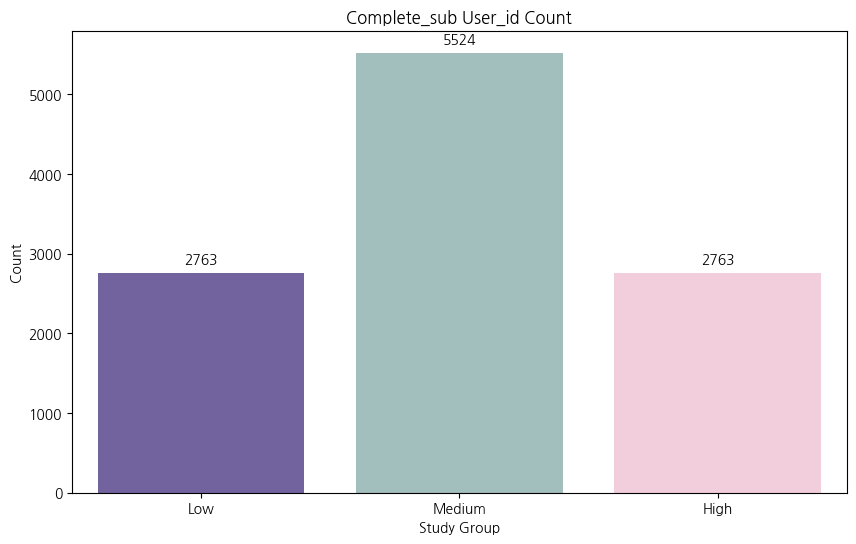

In [145]:
# 유저군 별 인원수 그래프

# 팔레트 설정
palette = {'Low': '#6e58a7', 'Medium': '#9dc3c1', 'High': '#f8c8dc'}

# 그래프 그리기
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='study_group', y='original_user_count', data=study_group_final, order=['Low', 'Medium', 'High'], palette=palette)
plt.title('Complete_sub User_id Count')
plt.xlabel('Study Group')
plt.ylabel('Count')

# 바 그래프 위에 값 표시
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

plt.show()

C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\3851330016.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='study_group', y='renewed_user_count', data=study_group_final, order=['Low', 'Medium', 'High'], palette=palette)


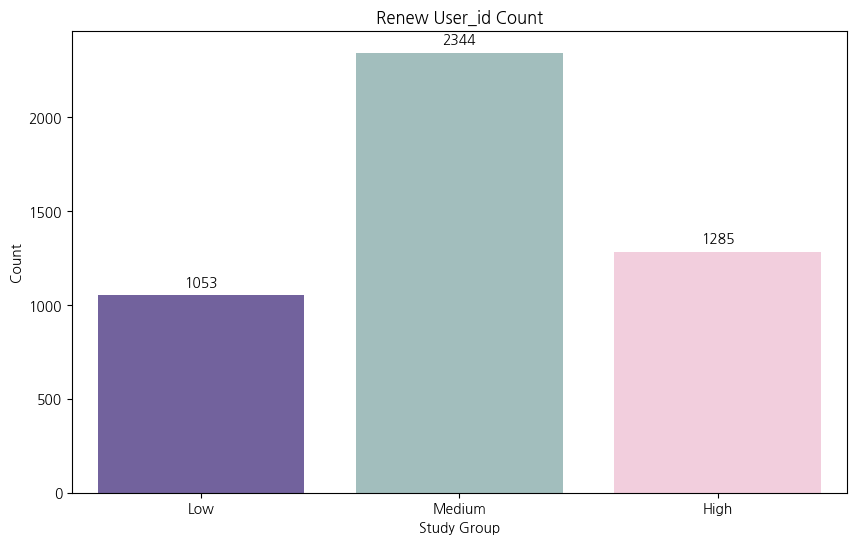

In [146]:
# 유저군 별 인원수 그래프

# 팔레트 설정
palette = {'Low': '#6e58a7', 'Medium': '#9dc3c1', 'High': '#f8c8dc'}

# 그래프 그리기
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='study_group', y='renewed_user_count', data=study_group_final, order=['Low', 'Medium', 'High'], palette=palette)
plt.title('Renew User_id Count')
plt.xlabel('Study Group')
plt.ylabel('Count')

# 바 그래프 위에 값 표시
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

plt.show()

C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\558232620.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='study_group', y='resubscribe_user_count', data=study_group_final, order=['Low', 'Medium', 'High'], palette=palette)


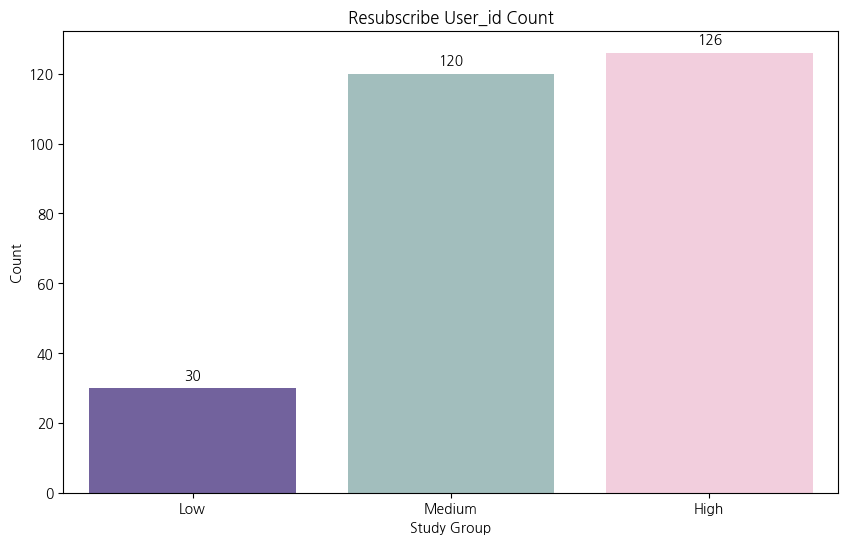

In [147]:
# 재구독 인원수 그래프

# 팔레트 설정
palette = {'Low': '#6e58a7', 'Medium': '#9dc3c1', 'High': '#f8c8dc'}

# 그래프 그리기
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='study_group', y='resubscribe_user_count', data=study_group_final, order=['Low', 'Medium', 'High'], palette=palette)
plt.title('Resubscribe User_id Count')
plt.xlabel('Study Group')
plt.ylabel('Count')

# 바 그래프 위에 값 표시
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

plt.show()

In [148]:
study_group_final

,study_group,original_user_count,renewed_user_count,resubscribe_user_count,original -> renew(%),renew -> resub(%)
0,High,2763,1285,126,46.51,9.81
1,Low,2763,1053,30,38.11,2.85
2,Medium,5524,2344,120,42.43,5.12


C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\4194626851.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='study_group', y='original -> renew(%)', data=study_group_final, order=['Low', 'Medium', 'High'], palette=palette)


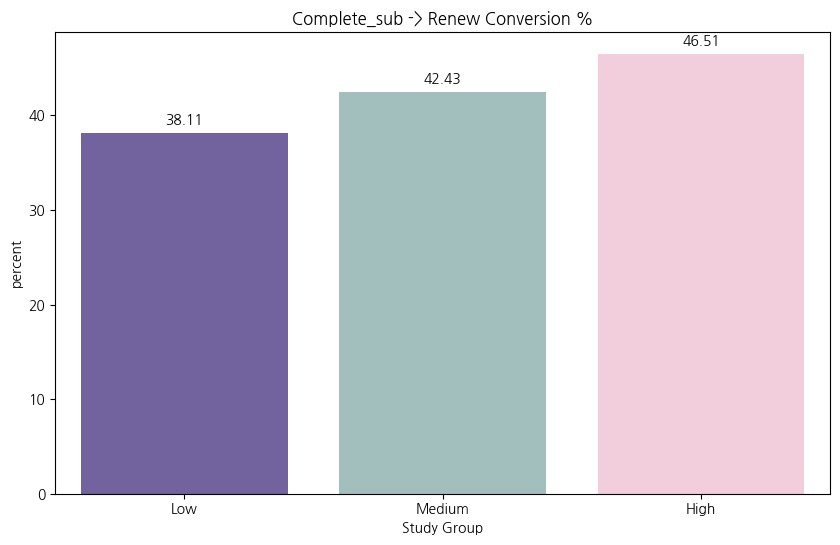

In [149]:
# 정기결제로의 전환율 그래프

# 팔레트 설정
palette = {'Low': '#6e58a7', 'Medium': '#9dc3c1', 'High': '#f8c8dc'}

# 그래프 그리기
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='study_group', y='original -> renew(%)', data=study_group_final, order=['Low', 'Medium', 'High'], palette=palette)
plt.title('Complete_sub -> Renew Conversion %')
plt.xlabel('Study Group')
plt.ylabel('percent')

# 바 그래프 위에 값 표시
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

plt.show()

C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\3197809546.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='study_group', y='renew -> resub(%)', data=study_group_final, order=['Low', 'Medium', 'High'], palette=palette)


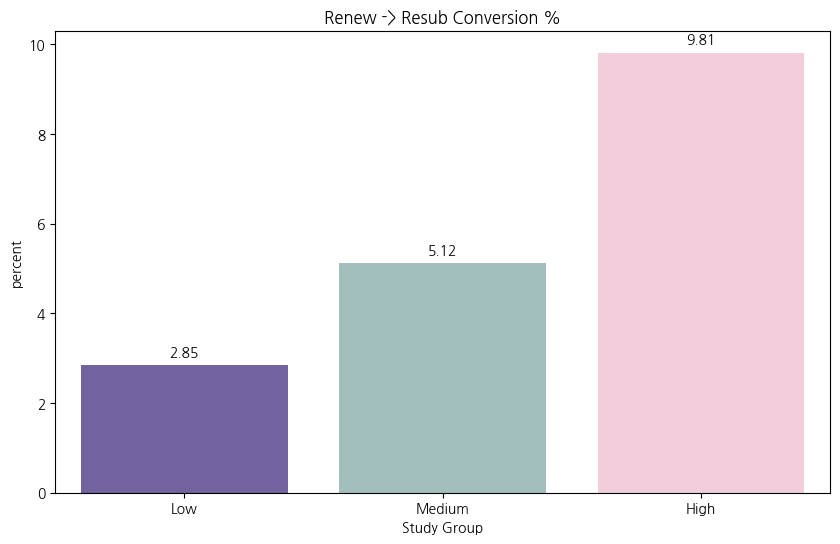

In [150]:
# 정기결제로의 전환율 그래프

# 팔레트 설정
palette = {'Low': '#6e58a7', 'Medium': '#9dc3c1', 'High': '#f8c8dc'}

# 그래프 그리기
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='study_group', y='renew -> resub(%)', data=study_group_final, order=['Low', 'Medium', 'High'], palette=palette)
plt.title('Renew -> Resub Conversion %')
plt.xlabel('Study Group')
plt.ylabel('percent')

# 바 그래프 위에 값 표시
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

plt.show()

### 분석결과

In [151]:
print(f'첫결제를 완료한 유저 수 : {len(unique_first_payment_user_ids)}')
print(f'activate user_id 수: {user_study_time_with_groups['user_id'].nunique()}')
print(f'첫결제 -> 정기결제 전환 user_id 수: {study_group_final['renewed_user_count'].sum()}')
print(f'정기결제 -> 재구독 전환 user_id 수: {len(final_user_ids)}')

첫결제를 완료한 유저 수 : 13875
activate user_id 수: 11050
첫결제 -> 정기결제 전환 user_id 수: 4682
정기결제 -> 재구독 전환 user_id 수: 276


C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\2770339272.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=labels, y=values, palette=palette)


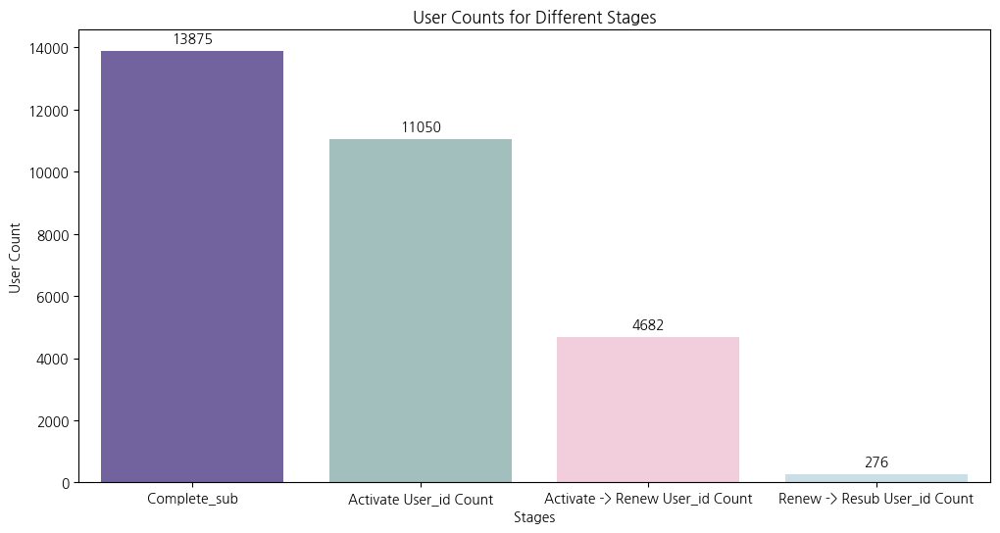

In [152]:
# 위 숫자 그래프
labels = ['Complete_sub', 'Activate User_id Count', 'Activate -> Renew User_id Count', 'Renew -> Resub User_id Count']
values = [
    len(unique_first_payment_user_ids),
    user_study_time_with_groups['user_id'].nunique(),
    study_group_final['renewed_user_count'].sum(),
    len(final_user_ids)
]

# 팔레트 설정
palette = {'Complete_sub': '#6e58a7', 'Activate User_id Count': '#9dc3c1', 'Activate -> Renew User_id Count': '#f8c8dc', 'Renew -> Resub User_id Count' : '#c6e2e9'}

# 그래프 그리기
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=labels, y=values, palette=palette)
plt.title('User Counts for Different Stages')
plt.xlabel('Stages')
plt.ylabel('User Count')

# 바 그래프 위에 값 표시
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

plt.show()

#### 각 퍼널 전환율 최종 결과

In [153]:
print(f'첫결제 -> 정기결제 전환율 : {round(study_group_final['renewed_user_count'].sum() / user_study_time_with_groups['user_id'].nunique() * 100, 2)}')
print(f'정기결제 -> 재구독 전환율 : {round(len(final_user_ids) / study_group_final['renewed_user_count'].sum() * 100, 2)}')

첫결제 -> 정기결제 전환율 : 42.37
정기결제 -> 재구독 전환율 : 5.89


C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\2535701964.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=labels, y=values, palette=palette, width=0.4)  # width 파라미터를 사용하여 바의 두께 조절


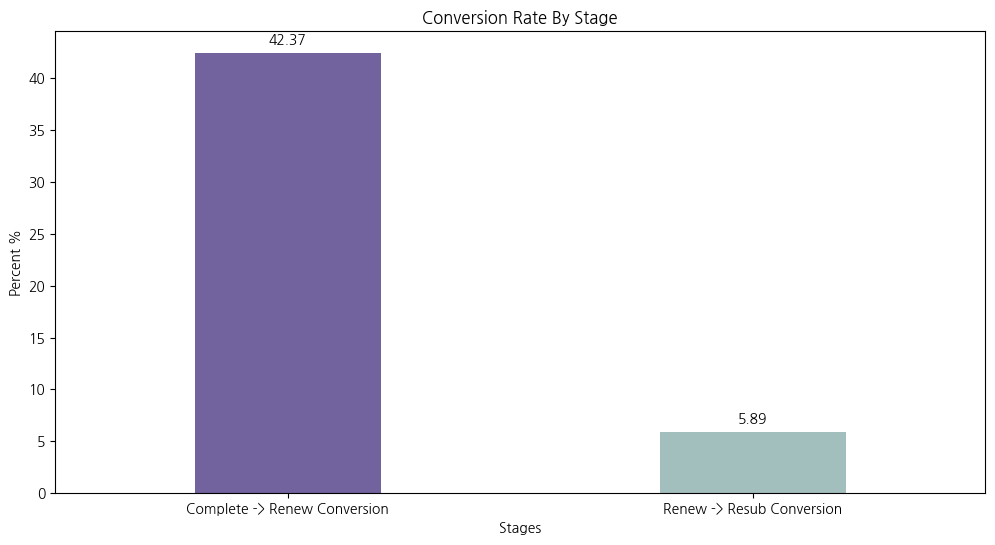

In [154]:
# 전환율 그래프
labels = ['Complete -> Renew Conversion', 'Renew -> Resub Conversion']
values = [
    round(study_group_final['renewed_user_count'].sum() / user_study_time_with_groups['user_id'].nunique() * 100, 2),
    round(len(final_user_ids) / study_group_final['renewed_user_count'].sum() * 100, 2)   
]

# 팔레트 설정
palette = {'Complete -> Renew Conversion': '#6e58a7', 'Renew -> Resub Conversion': '#9dc3c1'}

# 그래프 그리기
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=labels, y=values, palette=palette, width=0.4)  # width 파라미터를 사용하여 바의 두께 조절
plt.title('Conversion Rate By Stage')
plt.xlabel('Stages')
plt.ylabel('Percent %')

# 바 그래프 위에 값 표시
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

plt.show()

## 인기있는/ 없는 무료 레슨의 첫구독 전환율 차이?

#### 무료레슨 추출

In [155]:
enter_lesson_page_finalised_unique.head()

,city,enter_lesson_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,is_trial,lesson_id,is_free_trial,time_diff,time_diff_seconds,hour
16138,Seoul,2023-03-18 19:42:48.654,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,True,09c8a2d29087cb3d47823acb5f2705e3,NaN,0 days 00:05:42.876000,342.876,19
6147610,Seoul,2023-03-19 00:46:47.244,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,False,0cf175a1781a8e0020bf6c6bdc80e78a,NaN,0 days 00:01:11.785000,71.785,0
6147611,Seoul,2023-03-19 00:51:34.741,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,False,0cf175a1781a8e0020bf6c6bdc80e78a,NaN,0 days 00:04:47.497000,287.497,0
1140249,Seoul,2023-03-19 01:29:04.118,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,False,1e2a48ce24bce72e7d36da219ee9d254,NaN,0 days 00:05:50.893000,350.893,1
6147608,Seoul,2023-03-19 00:45:24.704,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,False,2ed4b83e65edc2b1efb193aaa3c60cf9,NaN,0 days 01:12:02.068000,4322.068,0


In [156]:
enter_lesson_page_finalised_unique.describe()

,enter_lesson_time,time_diff,time_diff_seconds,hour
count,7852494,7852494,7.852494e+06,7.852494e+06
mean,2023-01-07 20:17:21.373091584,0 days 15:31:14.171259363,5.587417e+04,1.462427e+01
min,2022-01-01 00:56:27.589000,0 days 00:00:30.001000,3.000100e+01,0.000000e+00
25%,2022-07-24 19:21:33.735750144,0 days 00:01:25.004250,8.500425e+01,1.100000e+01
50%,2023-01-26 11:07:25.428499968,0 days 00:03:20.362000,2.003620e+02,1.500000e+01
75%,2023-06-30 00:36:46.983249920,0 days 00:09:22.805000,5.628050e+02,1.900000e+01
max,2023-12-31 23:59:45.192000,722 days 23:20:52.788000,6.246485e+07,2.300000e+01
std,NaN,9 days 22:08:57.636050669,8.573376e+05,5.967829e+00


In [157]:
free_lesson = enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['is_trial'] == True]

In [158]:
free_lesson.describe()

,enter_lesson_time,time_diff,time_diff_seconds,hour
count,45733,45733,4.573300e+04,45733.000000
mean,2023-04-10 03:40:49.739615232,4 days 17:59:36.952291540,4.103770e+05,14.247874
min,2022-12-09 12:17:44.385000,0 days 00:00:30.002000,3.000200e+01,0.000000
25%,2023-01-16 14:01:27.276000,0 days 00:02:18.880000,1.388800e+02,10.000000
50%,2023-01-31 23:28:55.953999872,0 days 00:04:16.827000,2.568270e+02,15.000000
75%,2023-07-12 13:37:08.105999872,0 days 00:10:30.702000,6.307020e+02,19.000000
max,2023-12-31 22:32:28.649000,677 days 02:50:45.072000,5.850305e+07,23.000000
std,NaN,35 days 21:05:30.077334546,3.099930e+06,6.270681


In [159]:
print(free_lesson['enter_lesson_time'].min())
print(free_lesson['enter_lesson_time'].max())

2022-12-09 12:17:44.385000
2023-12-31 22:32:28.649000


In [160]:
free_lesson = free_lesson.drop_duplicates(subset=['content_id', 'lesson_id'])

In [161]:
print(free_lesson['content_id'].nunique())
print(free_lesson['content_id'].unique())
print(free_lesson['lesson_id'].nunique())
print(free_lesson['lesson_id'].unique())

5
['61b6463287573f00de13a930805a52d6' 'c269eb6df3a374b464f7c18f12fa398f'
 '445fac33232adcb3d1cdab7d8a579430' '710ffb5be9f89772b7baa9f62c9c8805'
 'db43a841c994231e2795d4df8931af50']
32
['09c8a2d29087cb3d47823acb5f2705e3' '6e3afbeb4942c6c29038321e5995f4f1'
 '70cb48c6327ced134821d9494f53cc60' 'b734f43b5123f8bdbf7d8f865bd3eacf'
 'db421b66bfd27eccd0e862e30b4de1be' '2ed4b83e65edc2b1efb193aaa3c60cf9'
 'c2b88e494ee633b334aa081cac7b1f02' '7e0f6aae886368ef9fa97007a8e9f7ac'
 '0cf175a1781a8e0020bf6c6bdc80e78a' '1e2a48ce24bce72e7d36da219ee9d254'
 '3ae4d4504b620370687e58e0a33cf22d' 'bc72ce5b1d619166b28d2e990f8d9f49'
 'c84ce096d3407c9ce4eebd380df44dbf' 'ce99776e0779bc82754a1fc8bfb719d1'
 'eb40ff18855f20f7cd2d55dbc48b49ae' 'f024a88c9328cb19413c04f4cd51f979'
 'd1e93c9dc08267efab31849bc6083854' 'e7783a0f86ae5130b0906f070386667f'
 '582f0dd769db16a3d920fd7916090efb' '7e6cf964f2cb6622bfa92df4ace0d044'
 '76504988acfeb975dbd954b3377c9c24' 'f22ea5dc431035305e705552bbc4f45b'
 '35d9d157fab3acc93db1d0ed639abcc4'

- 구독하지 않아도 들을 수 있는 lesson 32개. content_id 5개에 귀속

In [162]:
free_lesson['content_id'].value_counts()

content_id
61b6463287573f00de13a930805a52d6    15
c269eb6df3a374b464f7c18f12fa398f     8
445fac33232adcb3d1cdab7d8a579430     7
710ffb5be9f89772b7baa9f62c9c8805     1
db43a841c994231e2795d4df8931af50     1
Name: count, dtype: int64

In [163]:
print(enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['content_id'] == '61b6463287573f00de13a930805a52d6']['lesson_id'].nunique())
print(enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['content_id'] == 'c269eb6df3a374b464f7c18f12fa398f']['lesson_id'].nunique())
print(enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['content_id'] == '445fac33232adcb3d1cdab7d8a579430']['lesson_id'].nunique())
print(enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['content_id'] == '710ffb5be9f89772b7baa9f62c9c8805']['lesson_id'].nunique())
print(enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['content_id'] == 'db43a841c994231e2795d4df8931af50']['lesson_id'].nunique())

21
116
53
17
78


- 무료 레슨으로만 구성된 콘텐트는 없음을 확인

In [164]:
# free_lesson의 unique lesson_id들
free_lesson_unique = free_lesson['lesson_id'].unique()

# enter_lesson_page_finalised_unique_finalised_uniquee에서 각 lesson_id가 등장하는 횟수 계산
lesson_counts = enter_lesson_page_finalised_unique['lesson_id'].isin(free_lesson_unique).sum()

print(f"해당 lesson_id들이 enter_lesson_page_finalised_unique에 등장한 횟수: {lesson_counts}")

해당 lesson_id들이 enter_lesson_page_finalised_unique에 등장한 횟수: 294700


In [165]:
# free_lesson의 unique content_id들
free_content_unique = free_lesson['content_id'].unique()

# enter_lesson_page_finalised_unique에서 각 lesson_id가 등장하는 횟수 계산
content_counts = enter_lesson_page_finalised_unique['content_id'].isin(free_content_unique).sum()

print(f"해당 content_id들이 enter_lesson_page_finalised_unique에 등장한 횟수: {content_counts}")

해당 content_id들이 enter_lesson_page_finalised_unique에 등장한 횟수: 933555


- 각 무료 레슨들이 몇 번 등장했나?

In [166]:
# free_lesson_unique를 DataFrame으로 변환 (예시로 lesson_id 열이 있다고 가정)
free_lesson_unique_df = pd.DataFrame(free_lesson_unique, columns=['lesson_id'])

# enter_lesson_page_finalised_unique에서 lesson_id의 등장 횟수 계산
lesson_counts = enter_lesson_page_finalised_unique['lesson_id'].value_counts().reset_index()
lesson_counts.columns = ['lesson_id', 'count']

# free_lesson_unique와 병합하여 결과 확인
result = pd.merge(free_lesson_unique_df, lesson_counts, on='lesson_id', how='left')

# NaN 값을 0으로 대체 (free_lesson_unique에 있지만 enter_lesson_page_finalised_unique에 없는 lesson_id의 경우)
result['count'] = result['count'].fillna(0)

# 결과 출력
result.head()

,lesson_id,count
0,09c8a2d29087cb3d47823acb5f2705e3,14916
1,6e3afbeb4942c6c29038321e5995f4f1,13536
2,70cb48c6327ced134821d9494f53cc60,13428
3,b734f43b5123f8bdbf7d8f865bd3eacf,13589
4,db421b66bfd27eccd0e862e30b4de1be,19458


In [167]:
# result를 count 기준으로 내림차순
result_sorted = result.sort_values(by='count', ascending=False).reset_index(drop=True)

# 상위 5개와 하위 5개 레슨
top_5_lessons = result_sorted.head(5)
bottom_5_lessons = result_sorted.tail(5)

# 결과 출력
print("상위 5개 레슨:")
print(top_5_lessons)

print("\n하위 5개 레슨:")
print(bottom_5_lessons)

상위 5개 레슨:
                          lesson_id  count
0  2ed4b83e65edc2b1efb193aaa3c60cf9  32773
1  db421b66bfd27eccd0e862e30b4de1be  19458
2  09c8a2d29087cb3d47823acb5f2705e3  14916
3  b734f43b5123f8bdbf7d8f865bd3eacf  13589
4  6e3afbeb4942c6c29038321e5995f4f1  13536

하위 5개 레슨:
                           lesson_id  count
27  ce0bfeb7fb1259c588f437d48ab2690c   4415
28  d1e93c9dc08267efab31849bc6083854   4154
29  f22ea5dc431035305e705552bbc4f45b   2877
30  747df4b0ff099f7efb370b1171c08340   2707
31  144682f4648f81de8e6aabd11b92105e   1804


- is_trial이 True에서 False로의 전환(두 값 모두를 갖고 있다)됐다는 의미는 구독을 했다는 의미

#### 회원가입 -> 무료 레슨 수강 -> 첫결제
- 무료 레슨 수강한 user_id -> 11,073
- is_trial True, False를 모두 가진 유저 -> 4,451
- 무료 레슨만 듣고 이탈한 사람(is_trial이 True가 끝) -> 6,622

In [168]:
# enter_lesson_page_finalised_unique_finalised_unique에서 is_trial이 True인 user_id를 추출
# enter_lesson_page_finalised_unique에서 is_trial이 True인 user_id를 추출
trial_user_ids = enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['is_trial'] == True]['user_id'].unique()

# 결과 출력
len(trial_user_ids)


11073

In [169]:
# is_trial이 True인 user_id 추출
true_trial_user_ids = set(enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['is_trial'] == True]['user_id'].unique())

# is_trial이 False인 user_id 추출
false_trial_user_ids = set(enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['is_trial'] == False]['user_id'].unique())

# 두 집합의 교집합 구하기
both_trial_user_ids = true_trial_user_ids.intersection(false_trial_user_ids)

# 결과 출력
print(len(both_trial_user_ids))

4451


In [170]:
both_trial_user_ids

{'0cf8609b0395ff63fdb2bdb37b298d64',
 '9c228bc6e66e44710c04a2124a3d7b7c',
 'e84e49a23768efefe9783e6e334e0ecc',
 '0516729a73aec59e83a0d23cc34e89e9',
 'eb703f6987319827947d60892770b3ad',
 '994d22418783d17c2df0b4269b5a13bb',
 '99f2ffca013aeca0f41ff2e93fb79d22',
 '6c183f85959caa99bb7dcae7aeb6d4c8',
 '1e398c2fc5066db2c98b8830d7cd69d5',
 'f757a14b6afd82d3f018c3cb3cde3c0d',
 '08b656b2f0769ffb0823cf618204b73d',
 'cf4f020548ea4e4b8dd01c938083a9eb',
 '7e81c667207632a69c4db88ccfeda349',
 'ada45e388c3855c84de53de9aeaaaa65',
 '579abeff56b61103e3c2a455b33bc0e9',
 'b0663cab9303d3f102bcd4ffc7756461',
 'd6572f0294788cb08cf7c59c1782e4f6',
 '48979d3dee278d34672772e9e3889176',
 'fef3c3aeb2bdc90ae57f5d3c2f630f19',
 'f7934ae9e99740d4fe8e15bf0834380b',
 '11e332916054d7de8b377ff97abd4eda',
 '0a41dd438e2fe2e826dea03c461e9718',
 '3a4793c81fcc4d4f034a199701e1459e',
 'b5fab3b09de8821bad92054a349590f0',
 '29e922a2f57950d93e96fdc1dee9b8fc',
 'b7a078540bd270acb1d0c2ab50fb8f48',
 'c5155608831e333f3e6525d666f7c62b',
 

In [171]:
# 테스트
one_id = enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['user_id'] == 'e70fafe4ef1252b58d3b6584fd834b8b']

In [172]:
# is_trial이 False일 때 enter_lesson_time의 최소값 찾기
min_enter_lesson_time_false = one_id[one_id['is_trial'] == False]['enter_lesson_time'].min()

# is_trial이 True일 때 enter_lesson_time의 최대값 찾기
max_enter_lesson_time_true = one_id[one_id['is_trial'] == True]['enter_lesson_time'].max()

# 결과 출력
print(f"is_trial이 False일 때 enter_lesson_time의 최소값: {min_enter_lesson_time_false}")
print(f"is_trial이 True일 때 enter_lesson_time의 최대값: {max_enter_lesson_time_true}")

is_trial이 False일 때 enter_lesson_time의 최소값: 2023-05-24 16:24:59.855000
is_trial이 True일 때 enter_lesson_time의 최대값: 2023-01-23 22:27:14.352000


- 무료 레슨을 듣고 구독으로 넘어간 사람 1,919명 (아래 코드결과)
- is_trial True, False가 모두 있는 사람에 한해서, False의 최소 이벤트 타임 - True의 최대 이벤트타임을 했을 때 양수인 사람
- 첫 결제 이후 만료가 되면 구독 중이 아니기 때문

In [173]:
# is_trial이 True인 행의 enter_lesson_time의 최대값과 False인 행의 enter_lesson_time의 최소값을 계산
trial_max_times = enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['is_trial'] == True].groupby('user_id')['enter_lesson_time'].max()
non_trial_min_times = enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['is_trial'] == False].groupby('user_id')['enter_lesson_time'].min()

# both_trial_user_ids에 있는 user_id에 대해 필터링
trial_max_times = trial_max_times[trial_max_times.index.isin(both_trial_user_ids)]
non_trial_min_times = non_trial_min_times[non_trial_min_times.index.isin(both_trial_user_ids)]

# 양수와 음수 개수를 저장할 변수 초기화
positive_count = 0
negative_count = 0

# 양수가 나오는 user_id를 저장할 리스트 초기화
positive_user_ids = []

# both_trial_user_ids에 있는 모든 user_id에 대해 반복
for user_id in both_trial_user_ids:
    if user_id in trial_max_times.index and user_id in non_trial_min_times.index:
        max_enter_lesson_time_true = trial_max_times[user_id]
        min_enter_lesson_time_false = non_trial_min_times[user_id]
        
        # min_enter_lesson_time_false - max_enter_lesson_time_true 계산
        time_difference = min_enter_lesson_time_false - max_enter_lesson_time_true
        
        # 양수와 음수 개수 세기 및 양수인 경우 user_id 저장
        if time_difference > pd.Timedelta(0):
            positive_count += 1
            positive_user_ids.append(user_id)
        else:
            negative_count += 1

# 결과 출력
print(f"양수가 나오는 user_id 개수: {positive_count}")
print(f"음수가 나오는 user_id 개수: {negative_count}")

양수가 나오는 user_id 개수: 1919
음수가 나오는 user_id 개수: 2532


#### 무료 레슨 수강 -> 첫결제 전환율
- is_trial True인 유저 수 : 11,073
- 구독 만료 후 True가 된 유저 2,532
- 8,451명을 모집단으로 설정정
- 무료 레슨 수강 후 첫결제로 이어진 유저 수 : 1,919
- 전환율 : 22.47%

### 레슨 별 첫결제로의 전환율

In [174]:
# positive_user_ids들이 is_trial이 True였을 때 들은 lesson_id 추출
# positive_user_ids가 is_trial이 True였을 때 들은 lesson_id 추출
positive_lessons_true_trial = enter_lesson_page_finalised_unique[
    (enter_lesson_page_finalised_unique['user_id'].isin(positive_user_ids)) &
    (enter_lesson_page_finalised_unique['is_trial'] == True)
]['lesson_id'].unique()

# 결과 출력
print("positive_user_ids가 is_trial이 True였을 때 들은 lesson_id:")
print(positive_lessons_true_trial)

positive_user_ids가 is_trial이 True였을 때 들은 lesson_id:
['09c8a2d29087cb3d47823acb5f2705e3' '6e3afbeb4942c6c29038321e5995f4f1'
 '70cb48c6327ced134821d9494f53cc60' 'b734f43b5123f8bdbf7d8f865bd3eacf'
 'db421b66bfd27eccd0e862e30b4de1be' 'c2b88e494ee633b334aa081cac7b1f02'
 '0cf175a1781a8e0020bf6c6bdc80e78a' 'c84ce096d3407c9ce4eebd380df44dbf'
 'ce99776e0779bc82754a1fc8bfb719d1' 'eb40ff18855f20f7cd2d55dbc48b49ae'
 'f024a88c9328cb19413c04f4cd51f979' '7e0f6aae886368ef9fa97007a8e9f7ac'
 '1e2a48ce24bce72e7d36da219ee9d254' '2ed4b83e65edc2b1efb193aaa3c60cf9'
 '3ae4d4504b620370687e58e0a33cf22d' 'bc72ce5b1d619166b28d2e990f8d9f49'
 '10459dde9f512f1a65a7bd4d4c67b5db' '76504988acfeb975dbd954b3377c9c24'
 'ce0bfeb7fb1259c588f437d48ab2690c' 'd1e93c9dc08267efab31849bc6083854'
 'e7783a0f86ae5130b0906f070386667f' 'f22ea5dc431035305e705552bbc4f45b'
 '35d9d157fab3acc93db1d0ed639abcc4' '582f0dd769db16a3d920fd7916090efb'
 '7e6cf964f2cb6622bfa92df4ace0d044' '83c74d5802b04a1a50aa28b7bf8a5354'
 '9dfd989df3ef32c5c17129b

In [175]:
# positive_user_ids가 is_trial이 True였을 때 들은 lesson_id들과 개수 추출
positive_lessons_true_trial = enter_lesson_page_finalised_unique[
    (enter_lesson_page_finalised_unique['user_id'].isin(positive_user_ids)) &
    (enter_lesson_page_finalised_unique['is_trial'] == True)
]

# 각 user_id별로 lesson_id와 그 개수를 그룹화하여 추출
lesson_counts = positive_lessons_true_trial.groupby(['user_id', 'lesson_id']).size().reset_index(name='count')

# lesson_counts를 user_id로 그룹화하여 각 user_id별로 lesson_id와 그 개수를 리스트로 저장
grouped_lesson_counts = lesson_counts.groupby('user_id').apply(lambda x: x[['lesson_id', 'count']].values.tolist()).reset_index(name='lessons')

# lessons 열을 lesson_id와 count 열로 분리
grouped_lesson_counts[['lesson_ids', 'counts']] = grouped_lesson_counts['lessons'].apply(lambda x: pd.Series([list(zip(*x))[0], list(zip(*x))[1]]))

# lessons 열 제거
grouped_lesson_counts = grouped_lesson_counts.drop(columns=['lessons'])

# lesson_ids의 개수를 세는 열 추가
grouped_lesson_counts['lesson_ids_count'] = grouped_lesson_counts['lesson_ids'].apply(len)

# counts 열 제거
grouped_lesson_counts = grouped_lesson_counts.drop(columns=['counts'])

# 결과 출력
print("각 positive_user_ids가 is_trial이 True였을 때 들은 lesson_id들과 개수:")
grouped_lesson_counts.head(1)

각 positive_user_ids가 is_trial이 True였을 때 들은 lesson_id들과 개수:


C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\514455653.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped_lesson_counts = lesson_counts.groupby('user_id').apply(lambda x: x[['lesson_id', 'count']].values.tolist()).reset_index(name='lessons')


,user_id,lesson_ids,lesson_ids_count
0,0000572f2ba8079bcefd2760b632e820,"(09c8a2d29087cb3d47823acb5f2705e3, 6e3afbeb4942c6c29038321e5995f4f1, 70cb48c6327ced134821d9494f53cc60, b734f43b5123f8bdbf7d8f865bd3eacf, db421b66bfd27eccd0e862e30b4de1be)",5


- 각 lesson_id들이 몇 번 등장했나

In [176]:
# lesson_ids를 펼쳐서 각 lesson_id의 빈도 계산
all_lesson_ids = [lesson_id for sublist in grouped_lesson_counts['lesson_ids'] for lesson_id in sublist]
lesson_id_counts = pd.Series(all_lesson_ids).value_counts().reset_index()
lesson_id_counts.columns = ['lesson_id', 'count']

# 결과 출력
print("각 lesson_id들이 lesson_ids에서 몇 번 등장했는지:")
lesson_id_counts.head(1)

각 lesson_id들이 lesson_ids에서 몇 번 등장했는지:


,lesson_id,count
0,db421b66bfd27eccd0e862e30b4de1be,818


In [177]:
# 각 lesson_id가 enter_lesson_page_finalised_unique에서 처음 등장한 시간 계산
first_appearance_times = enter_lesson_page_finalised_unique.groupby('lesson_id')['enter_lesson_time'].min().reset_index()
first_appearance_times.columns = ['lesson_id', 'first_appearance_time']

# lesson_id_counts와 first_appearance_times를 병합하여 새로운 열 추가
lesson_id_counts_time = pd.merge(lesson_id_counts, first_appearance_times, on='lesson_id', how='left')
lesson_id_counts_time

,lesson_id,count,first_appearance_time
0,db421b66bfd27eccd0e862e30b4de1be,818,2022-07-20 17:48:29.880
1,09c8a2d29087cb3d47823acb5f2705e3,580,2022-07-20 16:27:51.104
2,2ed4b83e65edc2b1efb193aaa3c60cf9,570,2022-07-20 16:19:44.729
3,b734f43b5123f8bdbf7d8f865bd3eacf,542,2022-07-20 17:28:23.241
4,6e3afbeb4942c6c29038321e5995f4f1,531,2022-07-20 17:33:00.736
5,70cb48c6327ced134821d9494f53cc60,498,2022-07-20 17:36:14.529
6,0cf175a1781a8e0020bf6c6bdc80e78a,421,2022-07-20 17:44:26.144
7,7e0f6aae886368ef9fa97007a8e9f7ac,370,2022-09-02 15:11:46.705
8,ce99776e0779bc82754a1fc8bfb719d1,330,2022-07-20 18:26:14.182
9,eb40ff18855f20f7cd2d55dbc48b49ae,327,2022-07-20 17:28:08.492


- 처음 레슨이 등장한 시기와 무료 레슨 시청 횟수는 큰 연관이 없어 보임

#### is_trial이 True에서 False로 넘어가지 않은 True만 추출

In [178]:
# both_trial_user_ids -> is_trial True, False 교집합
trial_user = enter_lesson_page_finalised_unique[enter_lesson_page_finalised_unique['is_trial'] == True]

# is_trial이 True인 user_id 중 both_trial_user_ids에 해당하지 않은 유저들만 필터링
real_true_trial_users = trial_user[~trial_user['user_id'].isin(both_trial_user_ids)]

# 결과 출력
print("is_trial이 True인 user_id 중 both_trial_user_ids에 해당하지 않은 유저들:")
real_true_trial_users.head(1)

is_trial이 True인 user_id 중 both_trial_user_ids에 해당하지 않은 유저들:


,city,enter_lesson_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,is_trial,lesson_id,is_free_trial,time_diff,time_diff_seconds,hour
1511836,Seoul,2023-01-16 20:42:22.443,South Korea,Samsung Phone,Samsung Galaxy A22 5G,enter.lesson_page,Korean,Chrome,0001435bc6c0c0f05315192f89275425,61b6463287573f00de13a930805a52d6,True,2ed4b83e65edc2b1efb193aaa3c60cf9,NaN,0 days 10:41:23.674000,38483.674,20


In [179]:
real_true_trial_users['user_id'].nunique()
# 처음 전처리와 동일한 수인 것 확인

6622

In [180]:
# real_true_trial_users의 user_id를 그룹바이, 각 lesson_id들과 lesson_id의 개수

# 각 user_id별로 lesson_id와 그 개수를 그룹화하여 추출
lesson_counts = real_true_trial_users.groupby(['user_id', 'lesson_id']).size().reset_index(name='count')

# lesson_counts를 user_id로 그룹화하여 각 user_id별로 lesson_id와 그 개수를 리스트로 저장
grouped_lesson_counts_real_true = lesson_counts.groupby('user_id').apply(lambda x: x[['lesson_id', 'count']].values.tolist()).reset_index(name='lessons')

# lessons 열을 lesson_id와 count 열로 분리
grouped_lesson_counts_real_true[['lesson_ids', 'counts']] = grouped_lesson_counts_real_true['lessons'].apply(lambda x: pd.Series([list(zip(*x))[0], list(zip(*x))[1]]))

# counts 열을 lesson_ids의 고유한 값의 개수로 수정
grouped_lesson_counts_real_true['counts'] = grouped_lesson_counts_real_true['lesson_ids'].apply(lambda x: pd.Series(x).nunique())

# lessons 열 제거
grouped_lesson_counts_real_true = grouped_lesson_counts_real_true.drop(columns=['lessons'])

# 결과 출력
print("각 user_id별로 lesson_id와 그 개수를 그룹화한 결과:")
grouped_lesson_counts_real_true.head()

C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\3478169115.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped_lesson_counts_real_true = lesson_counts.groupby('user_id').apply(lambda x: x[['lesson_id', 'count']].values.tolist()).reset_index(name='lessons')


각 user_id별로 lesson_id와 그 개수를 그룹화한 결과:


,user_id,lesson_ids,counts
0,0001435bc6c0c0f05315192f89275425,"(2ed4b83e65edc2b1efb193aaa3c60cf9, db421b66bfd27eccd0e862e30b4de1be)",2
1,0003b028a745bdfda9e88539424248af,"(c2b88e494ee633b334aa081cac7b1f02,)",1
2,00046309229135e7aac86ec4c0d35009,"(7e0f6aae886368ef9fa97007a8e9f7ac,)",1
3,000d75dda2b964f4733c498ef6c4c4f9,"(2ed4b83e65edc2b1efb193aaa3c60cf9, db421b66bfd27eccd0e862e30b4de1be)",2
4,001016699f7dcd6e776cb3cff16c26d1,"(c2b88e494ee633b334aa081cac7b1f02,)",1


In [181]:
# lesson_ids를 펼쳐서 각 lesson_id의 빈도 계산
all_lesson_ids = [lesson_id for sublist in grouped_lesson_counts_real_true['lesson_ids'] for lesson_id in sublist]
lesson_id_counts_real_true = pd.Series(all_lesson_ids).value_counts().reset_index()
lesson_id_counts_real_true.columns = ['lesson_id', 'count']

# 결과 출력
print("각 lesson_id들이 lesson_ids에서 몇 번 등장했는지:")
lesson_id_counts_real_true.head()

각 lesson_id들이 lesson_ids에서 몇 번 등장했는지:


,lesson_id,count
0,db421b66bfd27eccd0e862e30b4de1be,3099
1,2ed4b83e65edc2b1efb193aaa3c60cf9,2071
2,09c8a2d29087cb3d47823acb5f2705e3,1771
3,b734f43b5123f8bdbf7d8f865bd3eacf,1478
4,6e3afbeb4942c6c29038321e5995f4f1,1223


In [182]:
lesson_id_counts.head()

,lesson_id,count
0,db421b66bfd27eccd0e862e30b4de1be,818
1,09c8a2d29087cb3d47823acb5f2705e3,580
2,2ed4b83e65edc2b1efb193aaa3c60cf9,570
3,b734f43b5123f8bdbf7d8f865bd3eacf,542
4,6e3afbeb4942c6c29038321e5995f4f1,531


## 조건 재설정 후 분석
- 첫결제로 진행된 유저, 진행하지 않은 유저 모두 마지막 레슨 기준
- 마지막 무료레슨이 첫결제로 이어지는 데 큰 영향을 주었을 것으로 추측
- paid_amount 는 평균으로

In [183]:
# positive_user_ids가 is_trial이 True였을 때 들은 lesson_id들과 enter_lesson_time 추출
positive_lessons_true_trial = enter_lesson_page_finalised_unique[
    (enter_lesson_page_finalised_unique['user_id'].isin(positive_user_ids)) &
    (enter_lesson_page_finalised_unique['is_trial'] == True)
]

# 각 user_id별로 enter_lesson_time이 가장 늦은 lesson_id 추출
latest_lessons = positive_lessons_true_trial.loc[positive_lessons_true_trial.groupby('user_id')['enter_lesson_time'].idxmax()]

# 각 user_id별로 lesson_id와 그 개수를 그룹화하여 추출
lesson_counts = latest_lessons.groupby(['user_id', 'lesson_id']).size().reset_index(name='count')

# 결과 출력
print("각 positive_user_ids가 is_trial이 True였을 때 enter_lesson_time이 가장 늦은 lesson_id와 개수:")
lesson_counts

각 positive_user_ids가 is_trial이 True였을 때 enter_lesson_time이 가장 늦은 lesson_id와 개수:


,user_id,lesson_id,count
0,0000572f2ba8079bcefd2760b632e820,70cb48c6327ced134821d9494f53cc60,1
1,002f6daf440e1880ec37a91702c9aa28,c2b88e494ee633b334aa081cac7b1f02,1
2,0045c6cadae2a7e9f57704258fc0ab30,c2b88e494ee633b334aa081cac7b1f02,1
3,008ec6fc8183f2adec644977d9c3d680,f024a88c9328cb19413c04f4cd51f979,1
4,0096e351e1be93a968d368749bae433d,eb40ff18855f20f7cd2d55dbc48b49ae,1
...,...,...,...
1914,ff938d67838a068d705e255117fa242b,3ae4d4504b620370687e58e0a33cf22d,1
1915,ff9e567b9c026b9b08cd110dd9e73716,7e0f6aae886368ef9fa97007a8e9f7ac,1
1916,ffa48d58e920e74519c18e0e9980277a,0cf175a1781a8e0020bf6c6bdc80e78a,1
1917,ffb441d36119cb52c19cb69c0d661480,0cf175a1781a8e0020bf6c6bdc80e78a,1


In [184]:
# lesson_id 별 개수
lesson_id_counts = lesson_counts.groupby('lesson_id')['count'].sum().reset_index(name='total_count')
lesson_id_counts = lesson_id_counts.sort_values(by = 'total_count', ascending = False ).reset_index(drop = True)

# 결과 출력
print("각 lesson_id의 개수:")
lesson_id_counts

각 lesson_id의 개수:


,lesson_id,total_count
0,2ed4b83e65edc2b1efb193aaa3c60cf9,288
1,f024a88c9328cb19413c04f4cd51f979,198
2,7e0f6aae886368ef9fa97007a8e9f7ac,192
3,db421b66bfd27eccd0e862e30b4de1be,181
4,c2b88e494ee633b334aa081cac7b1f02,157
5,e7783a0f86ae5130b0906f070386667f,127
6,0cf175a1781a8e0020bf6c6bdc80e78a,110
7,70cb48c6327ced134821d9494f53cc60,71
8,09c8a2d29087cb3d47823acb5f2705e3,61
9,6e3afbeb4942c6c29038321e5995f4f1,55


In [185]:
# real_true_trial_users 별로 enter_lesson_time이 가장 늦은 lesson_id 추출
latest_lessons_real_true_trial = real_true_trial_users.loc[real_true_trial_users.groupby('user_id')['enter_lesson_time'].idxmax()]

# user_id와 lesson_id 열만 남기고 나머지 열 삭제
latest_lessons_real_true_trial = latest_lessons_real_true_trial[['user_id', 'lesson_id']]

# 결과 출력
print("각 real_true_trial_user 별 enter_lesson_time이 가장 늦은 lesson_id (user_id와 lesson_id 열만):")
latest_lessons_real_true_trial

각 real_true_trial_user 별 enter_lesson_time이 가장 늦은 lesson_id (user_id와 lesson_id 열만):


,user_id,lesson_id
77262,0001435bc6c0c0f05315192f89275425,db421b66bfd27eccd0e862e30b4de1be
14350959,0003b028a745bdfda9e88539424248af,c2b88e494ee633b334aa081cac7b1f02
20703318,00046309229135e7aac86ec4c0d35009,7e0f6aae886368ef9fa97007a8e9f7ac
1008782,000d75dda2b964f4733c498ef6c4c4f9,2ed4b83e65edc2b1efb193aaa3c60cf9
19038668,001016699f7dcd6e776cb3cff16c26d1,c2b88e494ee633b334aa081cac7b1f02
...,...,...
1839675,ffbeea175372bf2c20f9d2c8ddb44228,09c8a2d29087cb3d47823acb5f2705e3
4572249,ffd48cbfb86525d94135302eaebaf218,09c8a2d29087cb3d47823acb5f2705e3
3080659,ffdbd606e33141fb5d7c7ad581d421c9,adfe4e8b1dc5d9f2e4b76e4bc8ee221c
1614186,ffe1379e0722ca66ce7d093e0d9d9dcd,db421b66bfd27eccd0e862e30b4de1be


In [186]:
# real_true_trial_users 별로 enter_lesson_time이 가장 늦은 lesson_id 추출
latest_lessons_real_true_trial = real_true_trial_users.loc[real_true_trial_users.groupby('user_id')['enter_lesson_time'].idxmax()]

# user_id와 lesson_id 열만 남기고 나머지 열 삭제
latest_lessons_real_true_trial = latest_lessons_real_true_trial[['user_id', 'lesson_id']]

# lesson_id를 그룹화하여 각 레슨을 들은 user_id의 수를 세기
lesson_id_user_counts_real_true_trial = latest_lessons_real_true_trial.groupby('lesson_id')['user_id'].nunique().reset_index(name='user_count')
lesson_id_real_true_trial_counts = lesson_id_user_counts_real_true_trial.sort_values(by = 'user_count', ascending = False).reset_index(drop = True)

# 결과 출력
print("각 lesson_id를 들은 user_id의 수:")
lesson_id_real_true_trial_counts

각 lesson_id를 들은 user_id의 수:


,lesson_id,user_count
0,2ed4b83e65edc2b1efb193aaa3c60cf9,1296
1,db421b66bfd27eccd0e862e30b4de1be,1138
2,c2b88e494ee633b334aa081cac7b1f02,848
3,7e0f6aae886368ef9fa97007a8e9f7ac,417
4,09c8a2d29087cb3d47823acb5f2705e3,331
5,b734f43b5123f8bdbf7d8f865bd3eacf,291
6,f024a88c9328cb19413c04f4cd51f979,272
7,70cb48c6327ced134821d9494f53cc60,270
8,6e3afbeb4942c6c29038321e5995f4f1,222
9,0cf175a1781a8e0020bf6c6bdc80e78a,163


In [187]:
# lesson_id_counts # lesson_id_real_true_trial_counts

# lesson_id_real_true_trial_counts의 count 컬럼의 이름을 not_convert_to_payment_user로 변경
lesson_id_real_true_trial_counts = lesson_id_real_true_trial_counts.rename(columns={'user_count': 'not_convert_to_payment_user'})

# lesson_id_counts의 count 컬럼 이름을 conver_to_payment_user로 변경
lesson_id_counts = lesson_id_counts.rename(columns={'total_count': 'convert_to_payment_user'})

# lesson_id를 기준으로 두 데이터를 합치기
merged_lesson_id_counts = pd.merge(lesson_id_counts, lesson_id_real_true_trial_counts, on='lesson_id', how='outer')

# total_user_count 컬럼추가
merged_lesson_id_counts['total_user_count'] = merged_lesson_id_counts['not_convert_to_payment_user'] + merged_lesson_id_counts['convert_to_payment_user']

# 전환율 컬럼 추가. round(convert_to_payment_user / (not_conver_to_payment_user + convert_to_payment_user) * 100, 2)
merged_lesson_id_counts['conversion_percent'] = round(
    merged_lesson_id_counts['convert_to_payment_user'] / 
    (merged_lesson_id_counts['not_convert_to_payment_user'] + merged_lesson_id_counts['convert_to_payment_user']) * 100, 2)

# 전환율이 높은 레슨부터 내림차순
free_lesson_conversion_df = merged_lesson_id_counts.sort_values(by='total_user_count', ascending=False).reset_index(drop=True)

# 결과
free_lesson_conversion_df

,lesson_id,convert_to_payment_user,not_convert_to_payment_user,total_user_count,conversion_percent
0,2ed4b83e65edc2b1efb193aaa3c60cf9,288,1296,1584,18.18
1,db421b66bfd27eccd0e862e30b4de1be,181,1138,1319,13.72
2,c2b88e494ee633b334aa081cac7b1f02,157,848,1005,15.62
3,7e0f6aae886368ef9fa97007a8e9f7ac,192,417,609,31.53
4,f024a88c9328cb19413c04f4cd51f979,198,272,470,42.13
5,09c8a2d29087cb3d47823acb5f2705e3,61,331,392,15.56
6,70cb48c6327ced134821d9494f53cc60,71,270,341,20.82
7,b734f43b5123f8bdbf7d8f865bd3eacf,48,291,339,14.16
8,e7783a0f86ae5130b0906f070386667f,127,156,283,44.88
9,6e3afbeb4942c6c29038321e5995f4f1,55,222,277,19.86


In [188]:
free_lesson_conversion_df = free_lesson_conversion_df.sort_values(by = 'conversion_percent', ascending = False).reset_index(drop = True)
free_lesson_conversion_df

,lesson_id,convert_to_payment_user,not_convert_to_payment_user,total_user_count,conversion_percent
0,747df4b0ff099f7efb370b1171c08340,4,1,5,80.00
1,2e7afdd98123899ca003ee1f60a54652,39,41,80,48.75
2,e7783a0f86ae5130b0906f070386667f,127,156,283,44.88
3,f024a88c9328cb19413c04f4cd51f979,198,272,470,42.13
4,9dfd989df3ef32c5c17129b24c012557,17,25,42,40.48
5,0cf175a1781a8e0020bf6c6bdc80e78a,110,163,273,40.29
6,10459dde9f512f1a65a7bd4d4c67b5db,27,46,73,36.99
7,adfe4e8b1dc5d9f2e4b76e4bc8ee221c,19,33,52,36.54
8,7e0f6aae886368ef9fa97007a8e9f7ac,192,417,609,31.53
9,bc72ce5b1d619166b28d2e990f8d9f49,46,109,155,29.68


In [189]:
top_5_lessons


,lesson_id,count
0,2ed4b83e65edc2b1efb193aaa3c60cf9,32773
1,db421b66bfd27eccd0e862e30b4de1be,19458
2,09c8a2d29087cb3d47823acb5f2705e3,14916
3,b734f43b5123f8bdbf7d8f865bd3eacf,13589
4,6e3afbeb4942c6c29038321e5995f4f1,13536


In [190]:
# free_lesson_conversion_df에서 top_5_lessons에 해당하는 행들만 추출
top_5_lessons_df = free_lesson_conversion_df[free_lesson_conversion_df['lesson_id'].isin(top_5_lessons)]

# 결과 출력
print("top_5_lessons에 해당하는 행들:")
top_5_lessons_df

top_5_lessons에 해당하는 행들:


,lesson_id,convert_to_payment_user,not_convert_to_payment_user,total_user_count,conversion_percent


In [191]:
bottom_5_lessons

,lesson_id,count
27,ce0bfeb7fb1259c588f437d48ab2690c,4415
28,d1e93c9dc08267efab31849bc6083854,4154
29,f22ea5dc431035305e705552bbc4f45b,2877
30,747df4b0ff099f7efb370b1171c08340,2707
31,144682f4648f81de8e6aabd11b92105e,1804


In [192]:
# free_lesson_conversion_df에서 bottom_5_lessons 해당하는 행들만 추출
bottom_5_lessons_df = free_lesson_conversion_df[free_lesson_conversion_df['lesson_id'].isin(bottom_5_lessons)]

# 결과 출력
print("bottom_5_lessons 해당하는 행들:")
bottom_5_lessons_df

bottom_5_lessons 해당하는 행들:


,lesson_id,convert_to_payment_user,not_convert_to_payment_user,total_user_count,conversion_percent


In [193]:
# paid_amount 추가
# 각 user_id별로 lesson_id와 그 개수를 그룹화하여 추출
positive_lessons_true_trial = enter_lesson_page_finalised_unique[
    (enter_lesson_page_finalised_unique['user_id'].isin(positive_user_ids)) &
    (enter_lesson_page_finalised_unique['is_trial'] == True)
]

lesson_counts_for_paid_amount = positive_lessons_true_trial.groupby(['user_id', 'lesson_id']).size().reset_index(name='count')

# lesson_counts_for_paid_amount를 user_id로 그룹화하여 각 user_id별로 lesson_id와 그 개수를 리스트로 저장
grouped_lesson_counts_for_paid_amount = lesson_counts_for_paid_amount.groupby('user_id').apply(lambda x: x[['lesson_id', 'count']].values.tolist()).reset_index(name='lessons')

# lessons 열을 lesson_id와 count 열로 분리
grouped_lesson_counts_for_paid_amount[['lesson_ids', 'counts']] = grouped_lesson_counts_for_paid_amount['lessons'].apply(lambda x: pd.Series([list(zip(*x))[0], list(zip(*x))[1]]))

# lessons 열 제거
grouped_lesson_counts_for_paid_amount = grouped_lesson_counts_for_paid_amount.drop(columns=['lessons'])

# lesson_ids의 개수를 세는 열 추가
grouped_lesson_counts_for_paid_amount['lesson_ids_count'] = grouped_lesson_counts_for_paid_amount['lesson_ids'].apply(len)

# counts 열 제거
grouped_lesson_counts_for_paid_amount = grouped_lesson_counts_for_paid_amount.drop(columns=['counts'])

# complete_subscription에서 각 user_id별로 paid_amount 값을 계산
user_paid_amount = complete_subscription.groupby('user_id')['paid_amount'].sum().reset_index()

# grouped_lesson_counts_for_paid_amount와 user_paid_amount를 병합하여 각 레슨별로 paid_amount 값을 계산
merged_df = pd.merge(grouped_lesson_counts_for_paid_amount, user_paid_amount, on='user_id', how='left')

# 각 lesson_id별로 paid_amount 값을 계산
lesson_paid_amount = merged_df.explode('lesson_ids').groupby('lesson_ids')['paid_amount'].mean().reset_index()
lesson_paid_amount.columns = ['lesson_id', 'total_paid_amount_avg']

# 결과 출력
print("각 lesson_id가 이끌어낸 paid_amount 값:")
lesson_paid_amount

각 lesson_id가 이끌어낸 paid_amount 값:


C:\Users\syc09\AppData\Local\Temp\ipykernel_9236\1083698695.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped_lesson_counts_for_paid_amount = lesson_counts_for_paid_amount.groupby('user_id').apply(lambda x: x[['lesson_id', 'count']].values.tolist()).reset_index(name='lessons')


,lesson_id,total_paid_amount_avg
0,09c8a2d29087cb3d47823acb5f2705e3,75413.142857
1,0cf175a1781a8e0020bf6c6bdc80e78a,75505.443038
2,10459dde9f512f1a65a7bd4d4c67b5db,24629.600000
3,1e2a48ce24bce72e7d36da219ee9d254,76002.363636
4,2e7afdd98123899ca003ee1f60a54652,36252.666667
5,2ed4b83e65edc2b1efb193aaa3c60cf9,70264.513514
6,35d9d157fab3acc93db1d0ed639abcc4,29913.170732
7,3ae4d4504b620370687e58e0a33cf22d,76398.181818
8,582f0dd769db16a3d920fd7916090efb,32393.043478
9,6e3afbeb4942c6c29038321e5995f4f1,75288.877551


In [194]:
# free_lesson_conversion_df에 lesson_paid_amount 합치기
# lesson_paid_amount 데이터프레임의 열 이름을 'total_paid_amount'로 변경 (필요한 경우)
lesson_paid_amount.columns = ['lesson_id', 'total_paid_amount']

# free_lesson_conversion_df에 lesson_paid_amount 합치기
free_lesson_conversion_df = pd.merge(free_lesson_conversion_df, lesson_paid_amount, on='lesson_id', how='left')

# total_paid_amount 값을 소수점 두 자리로 제한
free_lesson_conversion_df['total_paid_amount_avg'] = free_lesson_conversion_df['total_paid_amount'].round(2)
free_lesson_conversion_df = free_lesson_conversion_df.drop(columns = {'total_paid_amount'})

# paid_amount가 높은 레슨부터 내림차순 정렬
free_lesson_conversion_df = free_lesson_conversion_df.sort_values(by='conversion_percent', ascending=False).reset_index(drop=True)

# 결과 출력
free_lesson_conversion_df

,lesson_id,convert_to_payment_user,not_convert_to_payment_user,total_user_count,conversion_percent,total_paid_amount_avg
0,747df4b0ff099f7efb370b1171c08340,4,1,5,80.00,85200.00
1,2e7afdd98123899ca003ee1f60a54652,39,41,80,48.75,36252.67
2,e7783a0f86ae5130b0906f070386667f,127,156,283,44.88,22811.51
3,f024a88c9328cb19413c04f4cd51f979,198,272,470,42.13,75332.37
4,9dfd989df3ef32c5c17129b24c012557,17,25,42,40.48,26441.62
5,0cf175a1781a8e0020bf6c6bdc80e78a,110,163,273,40.29,75505.44
6,10459dde9f512f1a65a7bd4d4c67b5db,27,46,73,36.99,24629.60
7,adfe4e8b1dc5d9f2e4b76e4bc8ee221c,19,33,52,36.54,41626.67
8,7e0f6aae886368ef9fa97007a8e9f7ac,192,417,609,31.53,28967.59
9,bc72ce5b1d619166b28d2e990f8d9f49,46,109,155,29.68,74677.54


In [195]:
free_lesson_conversion_df.describe()

,convert_to_payment_user,not_convert_to_payment_user,total_user_count,conversion_percent,total_paid_amount_avg
count,31.000000,31.000000,31.000000,31.000000,31.000000
mean,61.903226,213.612903,275.516129,27.589677,52065.156774
std,71.142746,315.530947,377.708077,14.019153,23897.695722
min,4.000000,1.000000,5.000000,8.160000,22811.510000
25%,17.500000,50.000000,68.000000,18.660000,29440.380000
50%,33.000000,85.000000,114.000000,24.390000,41626.670000
75%,66.000000,246.000000,311.000000,34.035000,75438.460000
max,288.000000,1296.000000,1584.000000,80.000000,85200.000000


In [196]:
# free_lesson_conversion_df에서 bottom_5_lessons 해당하는 행들만 추출
top_5_lessons_df = free_lesson_conversion_df[free_lesson_conversion_df['lesson_id'].isin(top_5_lessons['lesson_id'])]

# 결과 출력
print("top_5_lessons 해당하는 행들:")
top_5_lessons_df

top_5_lessons 해당하는 행들:


,lesson_id,convert_to_payment_user,not_convert_to_payment_user,total_user_count,conversion_percent,total_paid_amount_avg
21,6e3afbeb4942c6c29038321e5995f4f1,55,222,277,19.86,75288.88
24,2ed4b83e65edc2b1efb193aaa3c60cf9,288,1296,1584,18.18,70264.51
26,09c8a2d29087cb3d47823acb5f2705e3,61,331,392,15.56,75413.14
28,b734f43b5123f8bdbf7d8f865bd3eacf,48,291,339,14.16,76940.38
29,db421b66bfd27eccd0e862e30b4de1be,181,1138,1319,13.72,74479.00


In [197]:
# free_lesson_conversion_df에서 bottom_5_lessons 해당하는 행들만 추출
bottom_5_lessons_df = free_lesson_conversion_df[free_lesson_conversion_df['lesson_id'].isin(bottom_5_lessons['lesson_id'])]

# 결과 출력
print("bottom_5_lessons 해당하는 행들:")
bottom_5_lessons_df

bottom_5_lessons 해당하는 행들:


,lesson_id,convert_to_payment_user,not_convert_to_payment_user,total_user_count,conversion_percent,total_paid_amount_avg
0,747df4b0ff099f7efb370b1171c08340,4,1,5,80.00,85200.00
11,d1e93c9dc08267efab31849bc6083854,35,101,136,25.74,26698.52
15,ce0bfeb7fb1259c588f437d48ab2690c,20,62,82,24.39,25827.90
18,f22ea5dc431035305e705552bbc4f45b,14,49,63,22.22,26181.05


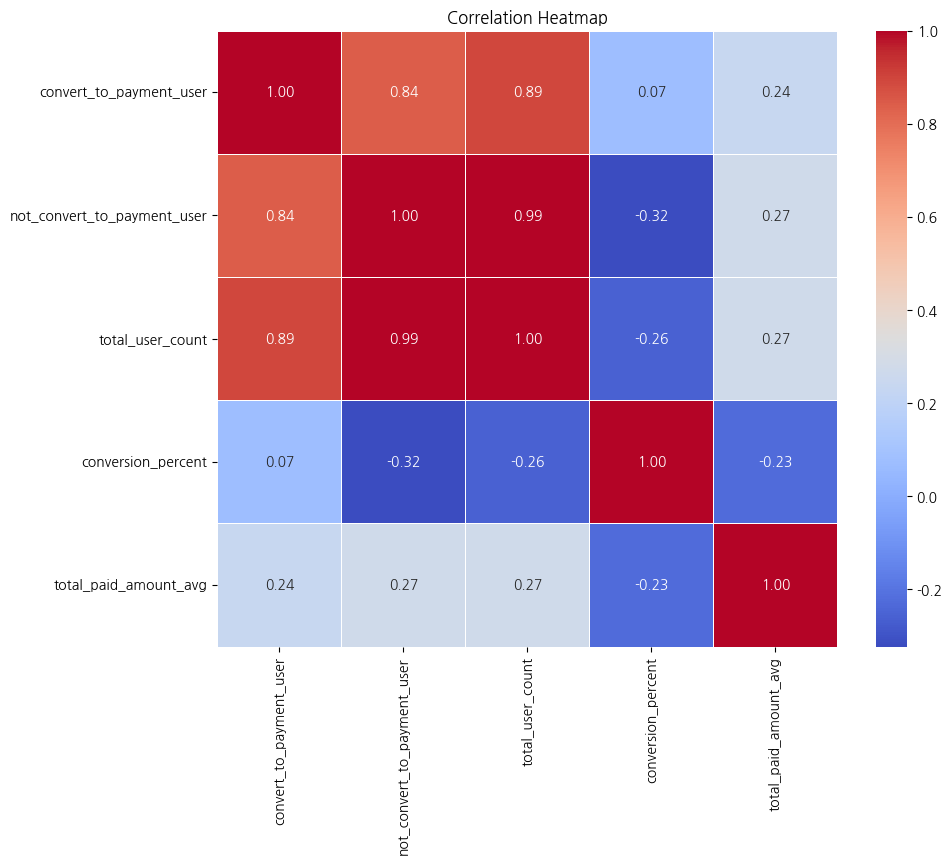

In [199]:
# 상관관계 그래프 그리기


# total_user_count가 25% 지점인 18.6을 초과하는 행만 추출하여 그래프를 그리기
free_lesson_conversion_df_graph = free_lesson_conversion_df[free_lesson_conversion_df['total_user_count'] > 18]

# 필요한 열 추출 (lesson_id 제외)
selected_columns = ['convert_to_payment_user', 'not_convert_to_payment_user', 'total_user_count', 'conversion_percent', 'total_paid_amount_avg']
free_lesson_conversion_df_selected = free_lesson_conversion_df_graph[selected_columns]

# 상관관계 행렬 계산
correlation_matrix = free_lesson_conversion_df_selected.corr()

# 상관관계 히트맵 그리기
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap= 'coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

#### 결과
- enter_lesson_page에서 많이 재생된 top5 무료 레슨들의 전환율이 더 낮음.
- 유저들이 많이 찾는 레슨인만큼 레슨 자체의 질을 높일 것을 제안

#### 아래 코드는 실행시키지 않음

In [ ]:
# # lesson_id_counts_real_true의 count 컬럼의 이름을 not_convert_to_payment_user로 변경
# lesson_id_counts_real_true = lesson_id_counts_real_true.rename(columns={'count': 'not_convert_to_payment_user'})

# # lesson_id_counts의 count 컬럼 이름을 conver_to_payment_user로 변경
# lesson_id_counts = lesson_id_counts.rename(columns={'count': 'convert_to_payment_user'})

# # lesson_id를 기준으로 두 데이터를 합치기
# merged_lesson_id_counts = pd.merge(lesson_id_counts, lesson_id_counts_real_true, on='lesson_id', how='outer')

# # total_user_count 컬럼추가
# merged_lesson_id_counts['total_user_count'] = merged_lesson_id_counts['not_convert_to_payment_user'] + merged_lesson_id_counts['convert_to_payment_user']

# # 전환율 컬럼 추가. round(convert_to_payment_user / (not_conver_to_payment_user + convert_to_payment_user) * 100, 2)
# merged_lesson_id_counts['conversion_percent'] = round(
#     merged_lesson_id_counts['convert_to_payment_user'] / 
#     (merged_lesson_id_counts['not_convert_to_payment_user'] + merged_lesson_id_counts['convert_to_payment_user']) * 100, 2)

# # 전환율이 높은 레슨부터 내림차순
# free_lesson_conversion_df = merged_lesson_id_counts.sort_values(by='total_user_count', ascending=False).reset_index(drop=True)

# # 결과
# free_lesson_conversion_df

In [ ]:
# # 선형회귀

# import statsmodels.api as sm

# # 독립 변수와 종속 변수 설정
# X = free_lesson_conversion_df[['total_user_count']]
# y = free_lesson_conversion_df['conversion_percent']

# # 상수항 추가
# X = sm.add_constant(X)

# # 선형 회귀 모델 적합
# model = sm.OLS(y, X).fit()

# # 결과 출력
# print(model.summary())

In [ ]:
# # 정규성?

# # 잔차 계산
# residuals = model.resid

# # 히스토그램
# plt.hist(residuals, bins=20, edgecolor='black')
# plt.title('Residuals Histogram')
# plt.xlabel('Residuals')
# plt.ylabel('Frequency')
# plt.show()

# # Q-Q 플롯
# stats.probplot(residuals, dist="norm", plot=plt)
# plt.title('Q-Q Plot')
# plt.show()


In [ ]:
# complete_subscription.head()

In [ ]:
# # 각 user_id별로 lesson_id와 그 개수를 그룹화하여 추출
# positive_lessons_true_trial = enter_lesson_page_finalised_unique[
#     (enter_lesson_page_finalised_unique['user_id'].isin(positive_user_ids)) &
#     (enter_lesson_page_finalised_unique['is_trial'] == True)
# ]

# lesson_counts_for_paid_amount = positive_lessons_true_trial.groupby(['user_id', 'lesson_id']).size().reset_index(name='count')

# # lesson_counts_for_paid_amount를 user_id로 그룹화하여 각 user_id별로 lesson_id와 그 개수를 리스트로 저장
# grouped_lesson_counts_for_paid_amount = lesson_counts_for_paid_amount.groupby('user_id').apply(lambda x: x[['lesson_id', 'count']].values.tolist()).reset_index(name='lessons')

# # lessons 열을 lesson_id와 count 열로 분리
# grouped_lesson_counts_for_paid_amount[['lesson_ids', 'counts']] = grouped_lesson_counts_for_paid_amount['lessons'].apply(lambda x: pd.Series([list(zip(*x))[0], list(zip(*x))[1]]))

# # lessons 열 제거
# grouped_lesson_counts_for_paid_amount = grouped_lesson_counts_for_paid_amount.drop(columns=['lessons'])

# # lesson_ids의 개수를 세는 열 추가
# grouped_lesson_counts_for_paid_amount['lesson_ids_count'] = grouped_lesson_counts_for_paid_amount['lesson_ids'].apply(len)

# # counts 열 제거
# grouped_lesson_counts_for_paid_amount = grouped_lesson_counts_for_paid_amount.drop(columns=['counts'])

# # complete_subscription에서 각 user_id별로 paid_amount 값을 계산
# user_paid_amount = complete_subscription.groupby('user_id')['paid_amount'].sum().reset_index()

# # grouped_lesson_counts_for_paid_amount와 user_paid_amount를 병합하여 각 레슨별로 paid_amount 값을 계산
# merged_df = pd.merge(grouped_lesson_counts_for_paid_amount, user_paid_amount, on='user_id', how='left')

# # 각 lesson_id별로 paid_amount 값을 계산
# lesson_paid_amount = merged_df.explode('lesson_ids').groupby('lesson_ids')['paid_amount'].mean().reset_index()
# lesson_paid_amount.columns = ['lesson_id', 'total_paid_amount']

# # 결과 출력
# print("각 lesson_id가 이끌어낸 paid_amount 값:")
# lesson_paid_amount

In [ ]:
# # 기존 데이터에 합치기기
# free_lesson_conversion_df = pd.merge(free_lesson_conversion_df, lesson_paid_amount, on='lesson_id', how='outer')

# # paid_amount가가 높은 레슨부터 내림차순
# free_lesson_conversion_df = free_lesson_conversion_df.sort_values(by='total_paid_amount', ascending=False).reset_index(drop=True)

# free_lesson_conversion_df

In [ ]:
# # paid amount에 대한 선형회귀
# X = free_lesson_conversion_df[['conversion_percent']]
# y = free_lesson_conversion_df['total_paid_amount']

# # 상수항 추가
# X = sm.add_constant(X)

# # 선형 회귀 모델 적합
# model = sm.OLS(y, X).fit()

# # 결과 출력
# print(model.summary())

In [ ]:
# # 정규성?

# # 잔차 계산
# residuals = model.resid

# # 히스토그램
# plt.hist(residuals, bins=20, edgecolor='black')
# plt.title('Residuals Histogram')
# plt.xlabel('Residuals')
# plt.ylabel('Frequency')
# plt.show()

# # Q-Q 플롯
# stats.probplot(residuals, dist="norm", plot=plt)
# plt.title('Q-Q Plot')
# plt.show()


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from datetime import timedelta
import scipy.stats as stats

## 데이터 전처리

### 3. 회원가입 완료(complete.signup)
- type : 로그인 방식

In [2]:
complete_signup = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/complete.signup.csv')

In [3]:
# 명확한 크롤링 데이터 제거
complete_signup_df =complete_signup.loc[complete_signup['os_name'] != 'Chrome Headless']

# reset_index
complete_signup_df =complete_signup_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
complete_signup_df['client_event_time'] = pd.to_datetime(complete_signup_df['client_event_time'])

# 9시간 추가 (KST 변환)
complete_signup_df["client_event_time"] = complete_signup_df["client_event_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
complete_signup_df = complete_signup_df[complete_signup_df['client_event_time'].dt.year.isin([2022,2023])]


In [4]:
# 타입 test행 제거
complete_signup_df = complete_signup_df[complete_signup_df['type'] != 'test']

In [5]:
# user_id 중복 제거
complete_signup_df = complete_signup_df.drop_duplicates(subset = ['user_id'], keep = False)

### 8. 첫 결제 완료(complete.subscription)

In [6]:
complete_subscription = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/complete.subscription.csv')

In [7]:
complete_subscription_df = complete_subscription[['city',	'client_event_time','event_type','os_name','user_id',
                                            'plan.price','paid_amount',	'coupon.discount_amount','pg.type']].rename(columns = {
                                                                                                                    'plan.price' : 'complete_sub_plan_price',
                                                                                                                    'paid_amount' : 'complete_sub_paid_amount',
                                                                                                                    'coupon.discount_amount' : 'complete_sub_coupon_discount_amount',
                                                                                                                    'pg.type' : 'pg_type',
                                                                                                                    'client_event_time' : 'complete_sub_time'})

# 크롤링 데이터 제거
complete_subscription_df =complete_subscription_df.loc[complete_subscription_df['os_name'] != 'Chrome Headless']

# reset_index
complete_subscription_df =complete_subscription_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
complete_subscription_df['complete_sub_time'] = pd.to_datetime(complete_subscription_df['complete_sub_time'])

# 9시간 추가 (KST 변환)
complete_subscription_df["complete_sub_time"] = complete_subscription_df["complete_sub_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
complete_subscription_df = complete_subscription_df[complete_subscription_df['complete_sub_time'].dt.year.isin([2022,2023])]

In [8]:
# 첫 결제가 중복인 경우 첫 결제 환불 후 다시 결제한 케이스로 보기 때문에 가장 최근 결제 내역만 남기기로 함
complete_subscription_df = complete_subscription_df.sort_values(by = 'complete_sub_time')

# user_id별 가장 최근 결제 내역 1건만 남기고 중복 제거
complete_subscription_df = complete_subscription_df.drop_duplicates(subset ='user_id', keep = 'last')

### 11. 서비스 무료체험 시작(start.free_trial)

- plan.price : 정상가
- plan.type : 요금제 종류
- trial.type : 무료체험 방식   

    - type A(구버전)    
            - 특정 컨텐츠 하나에 대해 영구적인 무료체험을 제공    
            - 여러 컨텐츠에 걸쳐서 중복 무료체험 제공하였음 -> (어떤 컨텐츠인지 정보는 남아있지 않음) 

    - type B (신버전)     
            - 기간 단위로 모든 컨텐츠를 경험할 수 있는 버전으로 제공    
            - 중복 무료체험 제공하지 않음

In [9]:
start_free_trial = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/start.free_trial.csv')
start_free_trial.head(3)

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,plan.type,trial.type
0,Seoul,2023-04-05 21:49:36.156000,South Korea,NaN,Mac,Mac,start.free_trial,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,15920.0,1개월 플랜,B
1,Dobong-gu,2023-03-12 08:28:29.384000,South Korea,NaN,Windows,Windows,start.free_trial,Korean,Chrome,110.0.0.0,Web,40acc1ddfc012f3d2f58a3de95e9e748,15920.0,1개월 플랜,B
2,NaN,2023-03-12 08:35:00.107000,NaN,NaN,NaN,NaN,start.free_trial,NaN,NaN,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B


In [10]:
start_free_trial_df = start_free_trial[['client_event_time','os_name','user_id',
                                            'plan.price','plan.type','trial.type']].rename(columns = {'plan.price' : 'start_free_trial_plan_price',
                                                                                                        'plan.type' : 'start_free_trial_plan_type',
                                                                                                        'trial.type' : 'start_free_trial_type',
                                                                                                        'client_event_time' : 'start_free_trial_time'})

# 사용하지 않는 device carrier 컬럼 제거
#start_free_trial_df.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터
start_free_trial_df =start_free_trial_df.loc[start_free_trial_df['os_name'] != 'Chrome Headless']

# reset_index
start_free_trial_df =start_free_trial_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
start_free_trial_df['start_free_trial_time'] = pd.to_datetime(start_free_trial_df['start_free_trial_time'])

# 9시간 추가 (KST 변환)
start_free_trial_df["start_free_trial_time"] = start_free_trial_df["start_free_trial_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
start_free_trial_df = start_free_trial_df[start_free_trial_df['start_free_trial_time'].dt.year.isin([2022,2023])]

In [12]:
# user_id 결측 데이터 제거
start_free_trial_df = start_free_trial_df.dropna(subset=['user_id'])
start_free_trial_df.shape

# 중복 제거 전 A타입의 무료 체험과 B타입 무료 체험 모두 이용한 유저 추출

filtered_df = start_free_trial_df.groupby('user_id').filter(
    lambda group : ('A' in group['start_free_trial_type'].values) and  ('B' in group['start_free_trial_type'].values)
)
#사용할 컬럼만 추출
free_trial_df = start_free_trial_df[['user_id','start_free_trial_time','start_free_trial_type']]

# A와 B 모두 사용한 유저 목록 추출
users_to_remove = filtered_df["user_id"].unique()

# A와 B 모두 사용한 유저 제거 
free_trial_df = free_trial_df[~free_trial_df["user_id"].isin(users_to_remove)]
free_trial_df.shape

(30472, 3)

In [13]:
# start_free_trial_time 가장 첫 행(처음 무료 체험 서비스 시작 날짜)만 남기기
free_trial_df = free_trial_df.sort_values(by="start_free_trial_time", ascending=True).drop_duplicates(subset="user_id", keep="first")

# 결과 확인
free_trial_df.shape

(16268, 3)

## 주제 선정 후 분석 진행

- 루팡 유저 판별 기준(무료 체험 서비스 이용만 하고 사라진 유저)
    1. 무료 체험 서비스 이용은 했지만 정기 구독을 하지 않은 유저(무료 체험 서비스 이용 기록만 존재)

- 루팡 유저들의 결제 페이지 진입 기록 
    - 결제 페이지에 진입했다면 진입까지 걸린 평균 시간
- 루팡 유저들의 메인 페이지 진입 수
- 루팡 유저들의 유입 경로 비교 -> 마케팅 전략 제안 가능 -> 시각화 가능
- 무료 체험 서비스를 이용한 루팡들이 어느 레슨과 컨텐츠를 사용했는지
- 13.enter.lesson_page 데이터에 is_trial 컬럼이 무료 체험했으나 현재 구독하지 않은 회원인지의 여부를 알려주고 있어요. 이 부분도 더블 체크 해보시는게 좋을 것 같아요! 무료체험 서비스 데이터가 아무래도 4월 30일까지여서,
- type b는 제 기억엔 모두 정기 결제를 한게 맞구(확인을 그래도 한 번 하는게 좋아옄ㅋㅋ)  7일 무료 체험하고 취소한 걸 따로 봐야겠네여(merge…)
- 무료 체험 서비스 a,b type 따로 봐야 할 것 같아요(a는 2023년, b는 2024년)

- PQL(제품을 무료로 사용해 본 후, 유료 전환 가능성이 높은 잠재 고객을 의미)
- TYPE B의 경우 7일의 무료체험 기간이 끝나고 이후에 결제로 넘어가기 때문에 첫 결제 내역이 남아있지 않음 -> 무료 체험 기간이 끝나기 전에 정기결제 취소했기 때문에 루팡

In [14]:
palette = ['#b3cde0', '#7e79b8', '#eac4d5', '#6e58a7', '#c6e2e9',
            '#a9a7cf', '#9dc3c1','#d5d5e9', '#baaad0', '#f8c8dc', '#c5b9f2']  

sns.set_palette(palette)

In [15]:
A_start = start_free_trial_df[start_free_trial_df['start_free_trial_type'] == 'A']['start_free_trial_time'].min()
A_end = start_free_trial_df[start_free_trial_df['start_free_trial_type'] == 'A']['start_free_trial_time'].max()

B_start = start_free_trial_df[start_free_trial_df['start_free_trial_type'] == 'B']['start_free_trial_time'].min()
B_end = start_free_trial_df[start_free_trial_df['start_free_trial_type'] == 'B']['start_free_trial_time'].max()

In [16]:
# 1. 회원가입 후 무료 체험 서비스을 경험해본 유저 추출

# 무료 체험 기간 회원가입 완료
complete_signup_df2 = complete_signup_df[['user_id','client_event_time']]
complete_signup_df_count = complete_signup_df['user_id'].nunique()

# 무료 체험 서비스 기간에 회원 가입한 유저 필터링

complete_signup_df3 = complete_signup_df2[
    (
        ((complete_signup_df2["client_event_time"] >= A_start) & (complete_signup_df2["client_event_time"] <= A_end)) | 
        ((complete_signup_df2["client_event_time"] >= B_start) & (complete_signup_df2["client_event_time"] <= B_end))
    )
]
signup_user = complete_signup_df3['user_id'].nunique()

#  회원 가입 서비스 무료 체험 이용 유저 merge
complete_signup_trial = free_trial_df.merge(complete_signup_df3, how  = 'inner', on = 'user_id')

# 전체 회원가입 유저 수 및 회원가입 후 무료체험 이용 유저 수 계산
total_signup = complete_signup_df3["user_id"].nunique()  # 전체 회원가입 유저 수
total_trial_users = complete_signup_trial["user_id"].nunique()  # 회원가입 후 무료체험을 이용한 유저 수

# 비율 계산
trial_users_ratio = (total_trial_users / total_signup) * 100

# 결과
print("전체 기간(22,23) 회원 가입 유저 수 :" ,  complete_signup_df_count)
print("무료 체험 기간 회원 가입한 유저 수 :", signup_user)
print('-' * 70)
print("<무료 체험 서비스 기간 기준>")
print("회원가입 후 무료 체험 서비스를 이용한 유저 수:", total_trial_users)
print(f"회원가입 후 무료 체험 서비스를 이용한 유저 비율(%): {trial_users_ratio:.2f}%")


전체 기간(22,23) 회원 가입 유저 수 : 145081
무료 체험 기간 회원 가입한 유저 수 : 67740
----------------------------------------------------------------------
<무료 체험 서비스 기간 기준>
회원가입 후 무료 체험 서비스를 이용한 유저 수: 14095
회원가입 후 무료 체험 서비스를 이용한 유저 비율(%): 20.81%


In [17]:
# 무료 체험 서비스 여러 번 한 유저인 경우 가장 최근 이용 내역만 남기기로 함
complete_signup_trial = complete_signup_trial.sort_values(by = 'start_free_trial_time')
# signup_free_trial
# user_id별 가장 최근 결제 내역 1건만 남기고 중복 제거
complete_signup_trial = complete_signup_trial.drop_duplicates(subset ='user_id', keep = 'first')
complete_signup_trial.head()

,user_id,start_free_trial_time,start_free_trial_type,client_event_time
0,28562e887d0942c8f422f1ffa1c12bc0,2022-01-01 09:30:35.744,A,2022-01-01 09:29:36.534
1,346239bb0b26fb4b4314b08e884b7e15,2022-01-01 11:11:57.529,A,2022-01-01 11:09:29.914
2,1535248f825028bae04dc0eee26d43ef,2022-01-01 11:25:07.253,A,2022-01-01 11:22:00.036
3,cf226fb4193276063956cefeed0de36d,2022-01-01 12:52:05.313,A,2022-01-01 12:39:16.766
4,f9c0191db74185ee5af63920c37c9499,2022-01-01 13:09:16.943,A,2022-01-01 13:08:23.891


In [18]:
# A/B 타입별 무료 체험을 이용한 유저 필터링
signup_free_trial_A = complete_signup_trial[complete_signup_trial["start_free_trial_type"] == "A"]
signup_free_trial_B = complete_signup_trial[complete_signup_trial["start_free_trial_type"] == "B"]


# A/B 타입별 무료 체험 이용 유저 수
total_trial_users_A = signup_free_trial_A["user_id"].nunique()
total_trial_users_B = signup_free_trial_B["user_id"].nunique()

# A/B 타입별 무료 체험 이용 비율
trial_users_ratio_A = (total_trial_users_A / total_trial_users) * 100
trial_users_ratio_B = (total_trial_users_B / total_trial_users) * 100

# 결과 출력
print(f"무료 체험 서비스 이용 기간 회원가입 후 무료 체험 이용 유저 수: {total_trial_users}")
print(f"TYPE A 기간 - 무료 체험 이용 유저 수: {total_trial_users_A}")
print(f"TYPE B 기간 - 무료 체험 이용 유저 수: {total_trial_users_B}")


무료 체험 서비스 이용 기간 회원가입 후 무료 체험 이용 유저 수: 14095
TYPE A 기간 - 무료 체험 이용 유저 수: 11992
TYPE B 기간 - 무료 체험 이용 유저 수: 2103


C:\Users\rmagm\AppData\Local\Temp\ipykernel_5732\2832654244.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=trial_users_df, x="Type", y="Number of Users", palette= palette)
C:\Users\rmagm\AppData\Local\Temp\ipykernel_5732\2832654244.py:12: UserWarning: The palette list has more values (11) than needed (2), which may not be intended.
  ax = sns.barplot(data=trial_users_df, x="Type", y="Number of Users", palette= palette)


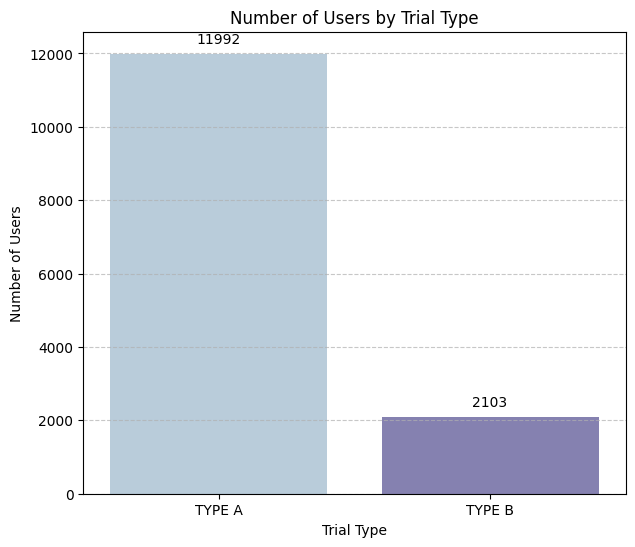

In [19]:
# 데이터 준비
trial_users_data = {
    "Type": ["TYPE A", "TYPE B"],
    "Number of Users": [total_trial_users_A, total_trial_users_B]
}

# DataFrame 생성
trial_users_df = pd.DataFrame(trial_users_data)

# 시각화
plt.figure(figsize=(7, 6))
ax = sns.barplot(data=trial_users_df, x="Type", y="Number of Users", palette= palette)

# 막대 위에 값 표시
for container in ax.containers:
    ax.bar_label(container, fmt="%d", label_type="edge", fontsize=10, padding=5)

# 그래프 설정
plt.xlabel("Trial Type")
plt.ylabel("Number of Users")
plt.title("Number of Users by Trial Type")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [20]:
# 2. 회원 가입 완료 회원의 무료 서비스 체험 후 첫 결제 완료(무료 서비스 체험 사용 기간 내)

# 2-1. 중복 결제 내역 제거한 첫 결제 완료 데이터에서 필요한 컬럼만 추출
complete_subscription_final = complete_subscription_df[
    ['user_id', 'complete_sub_time']
]

# 2-2. 무료 체험 유저와 첫 결제 완료 데이터 merge
free_trial_complete = complete_signup_trial.merge(complete_subscription_final, on='user_id', how='left')

# 2-3. 무료 체험 후 첫 결제를 완료한 유저 필터링

#(조건 : start_free_trial_time < complete_subscription_time) : row = 3147 -> 구독전환율
# 무료 체험 서비스 이용 시간이 먼저여야 하는 이유는 만약 첫 결제 완료 후에 무료 체험 레슨을 들었을 변수를 제외시키기 위해서

free_trial_complete_yes = free_trial_complete[
    free_trial_complete['start_free_trial_time'].notna() &  # 무료 체험 시작 시간이 존재하는 경우
    (free_trial_complete['start_free_trial_time'] < free_trial_complete['complete_sub_time']) 
]

# 2-4. 무료 체험 후 첫 결제 완료한 유저 수 및 전환율 계산
free_trial_complete_yes_users = free_trial_complete_yes['user_id'].nunique()
total_trial_users = complete_signup_trial['user_id'].nunique()  # 무료 체험 체험 기간동안 회원가입 후 무료 체험 전체 유저 수

free_trial_complete_yes_rate = (free_trial_complete_yes_users / total_trial_users) * 100

print(f'무료 체험 서비스 이용 후 첫 결제 완료 유저 수 : {free_trial_complete_yes_users}')
print(f'무료 체험 서비스 이용 후 첫 결제 완료 유저 비율 : {free_trial_complete_yes_rate:.2f}%')


무료 체험 서비스 이용 후 첫 결제 완료 유저 수 : 3042
무료 체험 서비스 이용 후 첫 결제 완료 유저 비율 : 21.58%


In [21]:
# Calculate number of users who completed first payment after free trial for each type
free_trial_complete_yes_type = free_trial_complete_yes.groupby("start_free_trial_type")["user_id"].nunique().reset_index()
free_trial_complete_yes_type.columns = ["Trial Type", "Number of Users"]

# Calculate total trial users for each type
total_trial_users_A = complete_signup_trial[complete_signup_trial["start_free_trial_type"] == "A"]["user_id"].nunique()
total_trial_users_B = complete_signup_trial[complete_signup_trial["start_free_trial_type"] == "B"]["user_id"].nunique()

# Calculate conversion rate for each type
free_trial_complete_yes_rate_A = (free_trial_complete_yes_type.loc[free_trial_complete_yes_type["Trial Type"] == "A", "Number of Users"].values[0] / total_trial_users_A) * 100
free_trial_complete_yes_rate_B = (free_trial_complete_yes_type.loc[free_trial_complete_yes_type["Trial Type"] == "B", "Number of Users"].values[0] / total_trial_users_B) * 100

# Print results
print(f'TYPE A - 무료 체험 서비스 이용 후 첫 결제 완료 유저 수: {free_trial_complete_yes_type.loc[free_trial_complete_yes_type["Trial Type"] == "A", "Number of Users"].values[0]}')
print(f'TYPE A - 무료 체험 서비스 이용 후 첫 결제 완료 유저 비율: {free_trial_complete_yes_rate_A:.2f}%')

print(f'TYPE B - 무료 체험 서비스 이용 후 첫 결제 완료 유저 수: {free_trial_complete_yes_type.loc[free_trial_complete_yes_type["Trial Type"] == "B", "Number of Users"].values[0]}')
print(f'TYPE B - 무료 체험 서비스 이용 후 첫 결제 완료 유저 비율: {free_trial_complete_yes_rate_B:.2f}%')


TYPE A - 무료 체험 서비스 이용 후 첫 결제 완료 유저 수: 2174
TYPE A - 무료 체험 서비스 이용 후 첫 결제 완료 유저 비율: 18.13%
TYPE B - 무료 체험 서비스 이용 후 첫 결제 완료 유저 수: 868
TYPE B - 무료 체험 서비스 이용 후 첫 결제 완료 유저 비율: 41.27%


,Trial Type,Number of Users
0,A,2174
1,B,868


C:\Users\rmagm\AppData\Local\Temp\ipykernel_5732\3099973154.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=free_trial_complete_yes_type, x="Trial Type", y="Number of Users", palette= palette)
C:\Users\rmagm\AppData\Local\Temp\ipykernel_5732\3099973154.py:11: UserWarning: The palette list has more values (11) than needed (2), which may not be intended.
  ax = sns.barplot(data=free_trial_complete_yes_type, x="Trial Type", y="Number of Users", palette= palette)


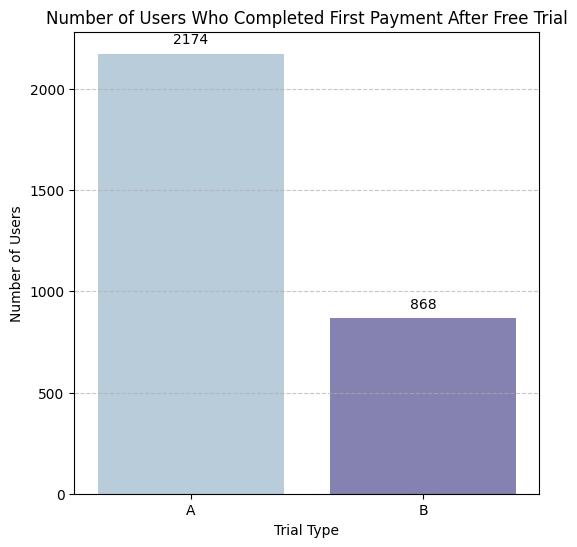

In [22]:
# 타입별 무료 체험 후 첫 결제 완료 유저 수 계산
free_trial_complete_yes_type = free_trial_complete_yes.groupby("start_free_trial_type")["user_id"].nunique().reset_index()

# 컬럼명 변경
free_trial_complete_yes_type.columns = ["Trial Type", "Number of Users"]

# 결과
display(free_trial_complete_yes_type)

plt.figure(figsize=(6, 6))
ax = sns.barplot(data=free_trial_complete_yes_type, x="Trial Type", y="Number of Users", palette= palette)

# 바 그래프 수치 추가
for container in ax.containers:
    ax.bar_label(container, fmt="%d", label_type="edge", fontsize=10, padding=5)

plt.xlabel("Trial Type")
plt.ylabel("Number of Users")
plt.title("Number of Users Who Completed First Payment After Free Trial")
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()


###  TYPE 별 무료 서비스 체험 후 첫 결제까지 걸린 평균 결제 시간 

In [23]:
# 무료 체험 후 첫 결제 까지 걸린 시간(일 단위)
free_complete_yes = free_trial_complete_yes.copy()

free_complete_yes['day_to_conversion'] = (free_complete_yes['complete_sub_time'] - free_complete_yes['start_free_trial_time']).dt.total_seconds() / 86400

# 전체 평균 및 첫 결제까지 소요 시간 
free_complete_yes_avg = free_complete_yes['day_to_conversion'].mean()

# TYPE A와 TYPE B 소요 시간 평균 계산
free_complete_yes_type_avg = free_complete_yes.groupby('start_free_trial_type')['day_to_conversion'].mean()

free_complete_yes_type_avg_df = free_complete_yes_type_avg.reset_index()
free_complete_yes_type_avg_df.columns = ["Trial Type", "Avg Conversion Days"]

print(f"전체 평균 첫 결제 소요 시간: {free_complete_yes_avg:.2f}일")
print("\nType A와 Type B별 평균 첫 결제 소요 시간:")
print(free_complete_yes_type_avg_df.to_string(index=False, float_format="%.2f"))

전체 평균 첫 결제 소요 시간: 24.36일

Type A와 Type B별 평균 첫 결제 소요 시간:
Trial Type  Avg Conversion Days
         A                28.42
         B                14.21


C:\Users\rmagm\AppData\Local\Temp\ipykernel_5732\4216840546.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=free_complete_yes_type_avg_df, x="Trial Type", y="Avg Conversion Days", palette="Blues")


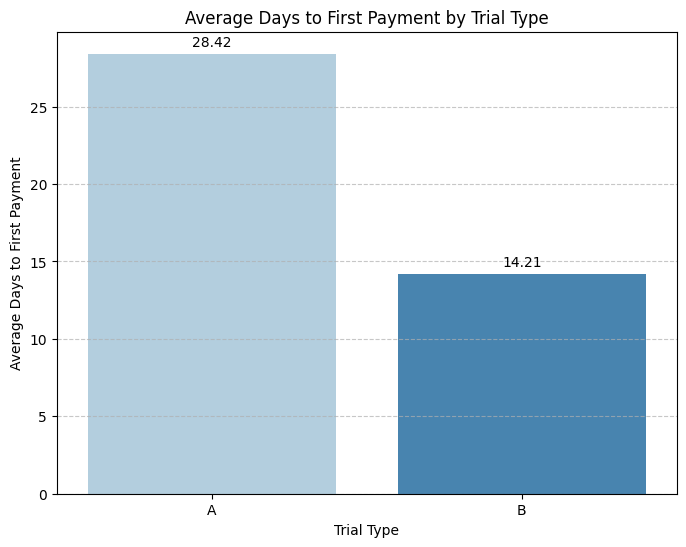

In [24]:
plt.figure(figsize=(8, 6))

# 바 그래프
ax = sns.barplot(data=free_complete_yes_type_avg_df, x="Trial Type", y="Avg Conversion Days", palette="Blues")

# 바 위에 수치 추가
for container in ax.containers:
    ax.bar_label(container, fmt="%.2f", label_type="edge", fontsize=10, padding=3)

plt.xlabel("Trial Type")
plt.ylabel("Average Days to First Payment")
plt.title("Average Days to First Payment by Trial Type")
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()

In [25]:
# Type A 첫 결제까지 가장 빠른 유저 TOP 5
print("=" * 60)  
print("\n Type A - 첫 결제까지 가장 빠른 유저 TOP 5")
print(free_complete_yes[free_complete_yes["start_free_trial_type"] == "A"]
      .nsmallest(5, "day_to_conversion")[["user_id", "day_to_conversion"]]
      .to_string(index=False, float_format="%.2f"))

# Type A 첫 결제까지 가장 오래 걸린 유저 TOP 5
print("=" * 60)  
print("\n Type A - 첫 결제까지 가장 오래 걸린 유저 TOP 5")
print(free_complete_yes[free_complete_yes["start_free_trial_type"] == "A"]
      .nlargest(5, "day_to_conversion")[["user_id", "day_to_conversion"]]
      .to_string(index=False, float_format="%.2f"))
print("=" * 60)


 Type A - 첫 결제까지 가장 빠른 유저 TOP 5
                         user_id  day_to_conversion
f046f930dec0224ebb91e499204b2e46               0.00
33aa47ab1eec81d4e2ede2675760f23c               0.00
6d10fbd72d86df1c890bb5904bcd2a17               0.00
fd888a8f9fed0a7ea033b38d4bb81357               0.00
9bfbac2af69231accf068239519e0f2f               0.00

 Type A - 첫 결제까지 가장 오래 걸린 유저 TOP 5
                         user_id  day_to_conversion
783e01211e03edc828d55baf6e08a256             711.14
fa58177660c687803ee14ac44f3d5cae             662.17
7f51e642d2a5d1b2586cf4343b7a54d2             614.68
f6657eeff454e7ebe4570bc5f174bb1b             587.22
8664c2eb847f36c445caf1784bd9ae2e             564.94


In [26]:

# Type B 첫 결제까지 가장 빠른 유저 TOP 5
print("=" * 60) 
print("\n Type B - 첫 결제까지 가장 빠른 유저 TOP 5")
print(free_complete_yes[free_complete_yes["start_free_trial_type"] == "B"]
      .nsmallest(5, "day_to_conversion")[["user_id", "day_to_conversion"]]
      .to_string(index=False, float_format="%.2f"))

# Type B 첫 결제까지 가장 오래 걸린 유저 TOP 5
print("=" * 60)  
print("\n Type B - 첫 결제까지 가장 오래 걸린 유저 TOP 5")
print(free_complete_yes[free_complete_yes["start_free_trial_type"] == "B"]
      .nlargest(5, "day_to_conversion")[["user_id", "day_to_conversion"]]
      .to_string(index=False, float_format="%.2f"))
print("=" * 60) 


 Type B - 첫 결제까지 가장 빠른 유저 TOP 5
                         user_id  day_to_conversion
9611d4cacc12eca45b2c56e76d99a447               0.00
3e0f99f28e28196e4a267d19c335f444               0.00
6125c2ddf601a13532204ccd2f6e587d               0.01
5288c36731e73a1941699d37f3a69a27               0.01
3c701c93fb7895d4316698c1bc6117c4               0.01

 Type B - 첫 결제까지 가장 오래 걸린 유저 TOP 5
                         user_id  day_to_conversion
d162f934feab36bd13e9da679fd3e4ad             296.70
433cc7db3d9f741cf9a1108d8f78e777             269.82
6c65d646cdbb1bea21fcbc37173404f4             258.61
7079785832f489a60be4583d4858a88d             244.92
2a5784ad88b5e6ca7d692da3c39f597d             232.89


C:\Users\rmagm\AppData\Local\Temp\ipykernel_5732\3747629084.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=free_complete_yes["start_free_trial_type"], y=free_complete_yes["day_to_conversion"], palette = palette)
C:\Users\rmagm\AppData\Local\Temp\ipykernel_5732\3747629084.py:1: UserWarning: The palette list has more values (11) than needed (2), which may not be intended.
  sns.boxplot(x=free_complete_yes["start_free_trial_type"], y=free_complete_yes["day_to_conversion"], palette = palette)


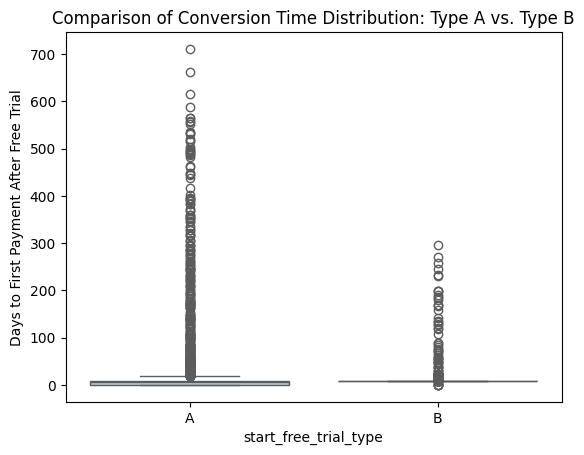

In [27]:
sns.boxplot(x=free_complete_yes["start_free_trial_type"], y=free_complete_yes["day_to_conversion"], palette = palette)
plt.ylabel("Days to First Payment After Free Trial")
plt.title("Comparison of Conversion Time Distribution: Type A vs. Type B") # 결제 소요 시간 비교
plt.show()

### 박스플롯 설명

- 여기서 이상치는 무료 체험 서비스의 영향을 받는 기간을 지나 첫 결제를 진행한 유저들을 칭함

1. TYPE A    

- Type A는 전환 시간이 훨씬 길고 이상치가 많음    

- Type A는 700일 가까이 걸린 유저도 존재 → 일부 유저는 무료 체험 후 매우 오랜 시간이 지난 후 결제(무료 체험이 첫 결제에 미치는 영향이 극히 적을 것으로 예상 할 수 있음)    

- 박스가 매우 짧고 위쪽으로 이상치가 많음 → 대부분의 유저는 빠르게 전환하지만, 일부는 매우 늦게 결제    

2. TYPE B    
- Type B는 상대적으로 빠르게 전환됨     

- Type B는 최대 300일 정도 이상치가 존재하지만, Type A보다 확연히 적음       
 
- 박스가 더 길고 이상치 분포가 상대적으로 적음 → Type B는 좀 더 균일한 전환 패턴을 보임(그래도 장시간 이후에 첫 결제라면 무료 체험의 영향력은 작다고 판단)


### 무료 서비스 체험의 영향으로 첫 결제까지 이어진 유저 재지정

- TYPE A (영구 무료 체험)    

    - 무료 체험이 영구적이기 때문에, 사용자는 즉시 결제할 필요가 없음.    

    - 하지만 무료 체험 서비스가 일정 기간 동안 영향을 주어 결제로 이어지는 시점이 존재할 가능성이 있음.    

    - 무료 체험의 "잔존 효과" 반영    
        - 무료 체험이 끝나지 않더라도, 무료 체험의 영향으로 일정 기간 내 결제를 유도할 가능성이 있음.

In [28]:
# 특정 기간 내 첫 결제한 유저 수를 계산하는 함수 (누적 아님)
def count_conversions_in_period(conversion_data, start_day, end_day=None):
    """
    특정 시작일과 종료일 사이에 첫 결제를 완료한 유저 수를 계산하는 함수.
    - end_day가 None이면 start_day 이후(first conversion > start_day) 모든 유저를 포함
    """
    if end_day is None:  # 90일 이후 유저 수 계산
        return (conversion_data > start_day).sum()
    return ((conversion_data > start_day) & (conversion_data <= end_day)).sum()

# 전환율 분석 기간 설정 (7일, 15일, 30일, 60일, 90일, 90일 이후)
conversion_periods = [(0, 7), (7, 15), (15, 30), (30, 60), (60, 90), (90, None)] 

# TYPE A와 TYPE B 유저 데이터 분리
type_A_conversion = free_complete_yes[free_complete_yes["start_free_trial_type"] == "A"]["day_to_conversion"]
type_B_conversion = free_complete_yes[free_complete_yes["start_free_trial_type"] == "B"]["day_to_conversion"]

# 각 기간별 첫 결제 유저 수 계산
conversion_counts_A = {f"{start} - {end} days" if end else f"{start} + days": count_conversions_in_period(type_A_conversion, start, end) 
                       for start, end in conversion_periods}

conversion_counts_B = {f"{start} - {end} days" if end else f"{start} + days": count_conversions_in_period(type_B_conversion, start, end) 
                       for start, end in conversion_periods}

# 데이터프레임 생성
conversion_df = pd.DataFrame({
    "무료 체험 시작 후 첫 결제까지 소요 시간": list(conversion_counts_A.keys()),
    "TYPE A ": list(conversion_counts_A.values()),
    "TYPE B ": list(conversion_counts_B.values())
})

conversion_df

,무료 체험 시작 후 첫 결제까지 소요 시간,TYPE A,TYPE B
0,0 - 7 days,1165,5
1,7 - 15 days,614,781
2,15 - 30 days,105,32
3,30 - 60 days,81,15
4,60 - 90 days,35,10
5,90 + days,174,25


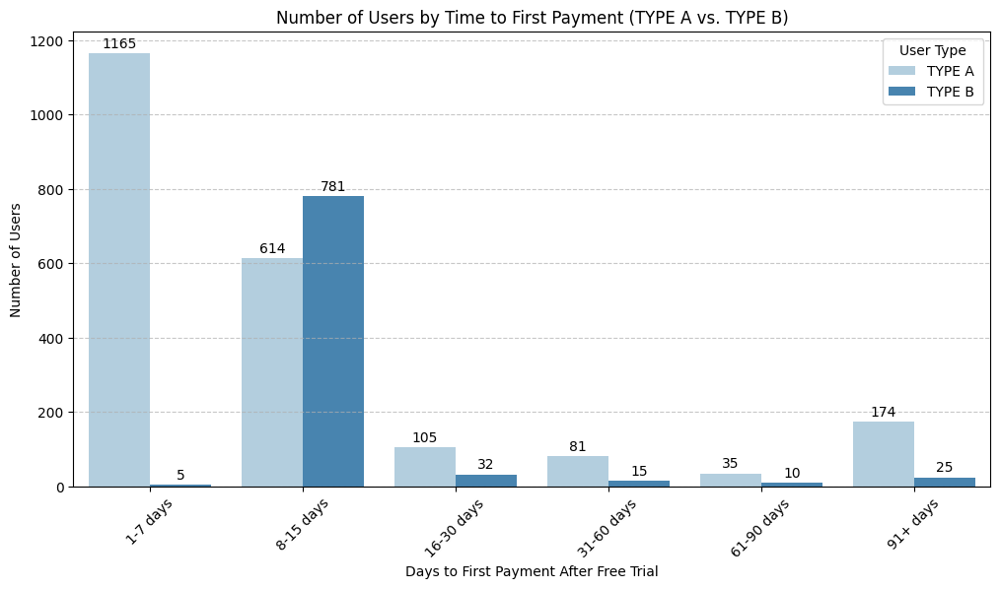

In [29]:
# 각 타입별 무료 체험 시작 후 첫 결제까지 소요 시간별 유저 수"

# Rename columns for visualization
conversion_df.rename(columns={
    "무료 체험 시작 후 첫 결제까지 소요 시간": "Days to First Payment",
    "TYPE A 30일 이내 첫 결제 유저 수": "TYPE A Conversions",
    "TYPE B 30일 이내 첫 결제 유저 수": "TYPE B Conversions"
}, inplace=True)

# Convert DataFrame to long format for seaborn
conversion_melted_df = conversion_df.melt(id_vars=["Days to First Payment"],
                                          var_name="User Type", value_name="Number of Users")

# 시각화

new_labels = ["1-7 days", "8-15 days", "16-30 days", "31-60 days", "61-90 days", "91+ days"]

plt.figure(figsize=(12, 6))
ax = sns.barplot(data=conversion_melted_df, x="Days to First Payment",
            y="Number of Users", hue="User Type", palette="Blues")

for container in ax.containers:
    ax.bar_label(container, fmt="%d", label_type="edge", fontsize=10, padding=2)


plt.xlabel("Days to First Payment After Free Trial")
plt.ylabel("Number of Users")
plt.title("Number of Users by Time to First Payment (TYPE A vs. TYPE B)")
plt.xticks(ticks=range(len(new_labels)), labels=new_labels, rotation=45)
plt.legend(title="User Type")
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()


- TYPE A

In [ ]:
# TYPE A를 이용한 유저

# 60일 기준으로 결제 소요 시간 필터링 (Type A만)
threshold_A = 60

# Type A에서 60일 이하 유저 데이터 (빠르게 결제한 유저)
free_complete_yes_60_A = free_complete_yes[
    (free_complete_yes["start_free_trial_type"] == "A") & 
    (free_complete_yes["day_to_conversion"] <= threshold_A)
]

# Type A에서 60일 초과 유저 데이터 (늦게 결제한 유저)
free_complete_yes_above_60_A = free_complete_yes[
    (free_complete_yes["start_free_trial_type"] == "A") & 
    (free_complete_yes["day_to_conversion"] > threshold_A)
]

# 유저 수 계산
num_conversion_users_60_A = free_complete_yes_60_A["user_id"].nunique()
num_conversion_users_above_60_A = free_complete_yes_above_60_A["user_id"].nunique()

# 결과 출력
print(f"Type A - 60일 이내 유저 수: {num_conversion_users_60_A}명")
print(f"Type A - 60일 이후 유저 수: {num_conversion_users_above_60_A}명")

Type A - 60일 이내 유저 수: 1965명
Type A - 60일 이후 유저 수: 209명


In [34]:
# TYPE A의 60일 이내 유저 결제 시간 기초 통계량(무료 체험 후 60일 이내 첫 결제)
print('TYPE A 결제까지 60일 이내 결제 시간 기초 통계')
print(free_complete_yes_60_A["day_to_conversion"].describe())
print('-' * 60)
# TYPE A의 60일 이후 유저 결제 시간 기초 통계량(무료 체험 후 60일 초과 첫 결제)
print('TYPE A 결제까지 60일 이후 결제 시간 기초 통계')
print(free_complete_yes_above_60_A["day_to_conversion"].describe())

TYPE A 결제까지 60일 이내 결제 시간 기초 통계
count    1965.000000
mean        6.278166
std         9.539283
min         0.000621
25%         0.083870
50%         3.477258
75%         7.008394
max        59.873704
Name: day_to_conversion, dtype: float64
------------------------------------------------------------
TYPE A 결제까지 60일 이후 결제 시간 기초 통계
count    209.000000
mean     236.559651
std      150.625363
min       60.109954
25%      108.193962
50%      192.876575
75%      327.778624
max      711.135931
Name: day_to_conversion, dtype: float64


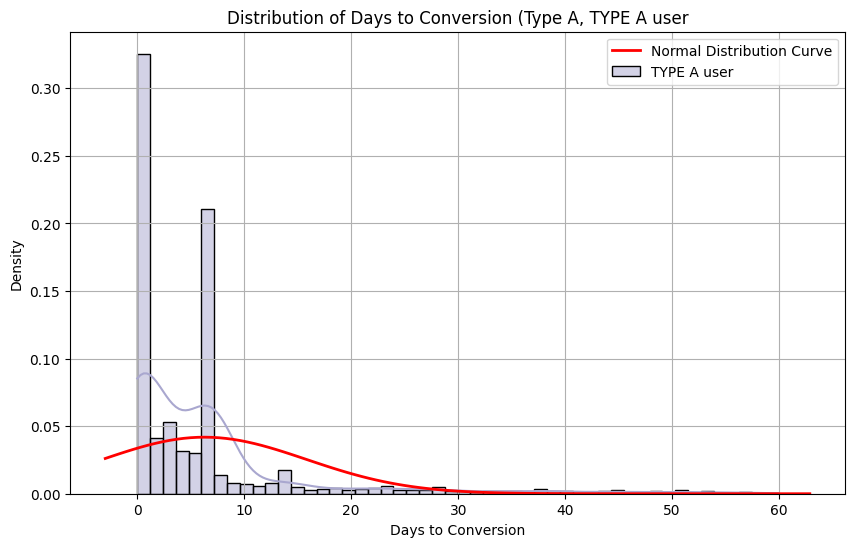

In [33]:
# 60일 이내 첫 결제 소요 시간 데이터 추출
type_A_conversion_days_60 = free_complete_yes_60_A["day_to_conversion"]

# 히스토그램 & KDE 시각화
plt.figure(figsize=(10, 6))
sns.histplot(type_A_conversion_days_60, bins=50, kde=True, color=palette[5], stat="density", label="TYPE A user") # a타입

# 정규 분포 곡선 추가
mu_90, std_90 = np.mean(type_A_conversion_days_60), np.std(type_A_conversion_days_60)
xmin, xmax = plt.xlim()  # x축 범위 설정
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, mu_90, std_90)
plt.plot(x, p, 'r', linewidth=2, label="Normal Distribution Curve") # label = "정규분포곡선"

# 그래프 설정
plt.xlabel("Days to Conversion")
plt.ylabel("Density")
plt.title("Distribution of Days to Conversion (Type A, TYPE A user")
plt.legend()
plt.grid()

# 그래프 출력
plt.show()

< 60일 이내 결제 시간 유저들>
- 무료 체험 후 60일 이내 유저가 실제 영향을 받은 그룹
- 평균 6일만에 결제 -> 무료 체험이 유저들에게 첫 결제로 이어지게 하는데 효과가 있었다.
- 표준 편차(약9일) 유저가 평균(6.04일)을 기준으로 ± 9일 범위 안에 많은 유저가 존재한다는 것 -> 전환율 분석 가능
- 즉 무료 체험 후 대부분이 유저가 6 ± 9일(즉, 0일~15일 사이)에 결제한 것을 알 수 있음
- 표준편차가 상대적으로 크지 않으며, 분포 또한 급격히 퍼져 있지 않음
- Q3가 7.00일로 유저가 7일 이내 결제했다는 것 -> 표준편차와 잘 맞아 떨어짐

-------------------------------------------------------------------------------------------------------------------------
- TYPE B

In [39]:
# TYPE B를 이용한 유저

# 60일 기준으로 결제 소요 시간 필터링 (Type B만)
threshold_B = 60

# Type A에서 60일 이내 유저 데이터 (빠르게 결제한 유저)
free_complete_yes_60_B = free_complete_yes[
    (free_complete_yes["start_free_trial_type"] == "B") & 
    (free_complete_yes["day_to_conversion"] <= threshold_B)
]

# Type A에서 60일 이후 유저 데이터 (늦게 결제한 유저)
free_complete_yes_above_60_B = free_complete_yes[
    (free_complete_yes["start_free_trial_type"] == "B") & 
    (free_complete_yes["day_to_conversion"] > threshold_B)
]

# 유저 수 계산
num_conversion_users_30_B = free_complete_yes_60_B["user_id"].nunique()
num_conversion_users_above_30_B = free_complete_yes_above_60_B["user_id"].nunique()

# 결과 출력
print(f"Type B - 60일 이내 결제 유저 수: {num_conversion_users_30_B}명")
print(f"Type B - 60일 이후 결제 유저 수: {num_conversion_users_above_30_B}명")

Type B - 60일 이내 결제 유저 수: 833명
Type B - 60일 이후 결제 유저 수: 35명


In [70]:
# TYPE B의 60일 이내 결제 유저 시간 기초 통계량(무료 체험 후 60일 이내 첫 결제)
print('TYPE B 결제까지 60일 이내 결제 시간 기초 통계')
print(free_complete_yes_60_B["day_to_conversion"].describe())
print('-' * 60)
# TYPE B의 30일 이내 결제 유저 시간 기초 통계량(무료 체험 후 60일 초과 첫 결제)
print('TYPE B 결제까지 60일 이후 결제 시간 기초 통계')
print(free_complete_yes_above_60_B["day_to_conversion"].describe())

TYPE B 결제까지 60일 이내 결제 시간 기초 통계
count    833.000000
mean       8.437338
std        6.075141
min        0.003013
25%        7.001066
50%        7.002097
75%        7.003108
max       59.450705
Name: day_to_conversion, dtype: float64
------------------------------------------------------------
TYPE B 결제까지 60일 이후 결제 시간 기초 통계
count     35.000000
mean     151.531001
std       64.871076
min       62.337262
25%       88.885866
50%      141.091300
75%      193.643672
max      296.702592
Name: day_to_conversion, dtype: float64


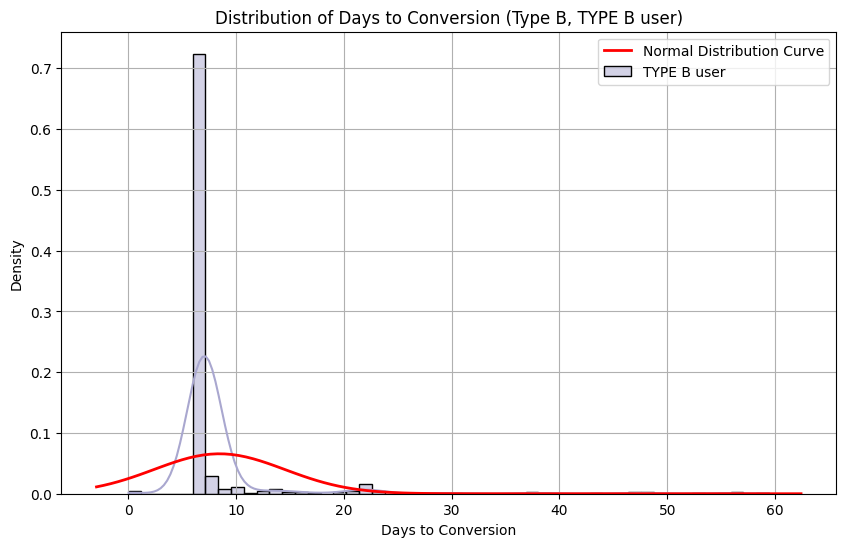

In [41]:
# 60일 기준으로 결제 소요 시간 데이터 추출
type_B_conversion_days_60 = free_complete_yes_60_B["day_to_conversion"]

# 히스토그램 & KDE 시각화
plt.figure(figsize=(10, 6))
sns.histplot(type_B_conversion_days_60, bins=50, kde=True, color=palette[5], stat="density", label="TYPE B user") # B 타입

# 정규 분포 곡선 추가
mu_90, std_90 = np.mean(type_B_conversion_days_60), np.std(type_B_conversion_days_60)
xmin, xmax = plt.xlim()  # x축 범위 설정
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, mu_90, std_90)
plt.plot(x, p, 'r', linewidth=2, label="Normal Distribution Curve") # label = "정규분포곡선"

# 그래프 설정
plt.xlabel("Days to Conversion")
plt.ylabel("Density")
plt.title("Distribution of Days to Conversion (Type B, TYPE B user)")
plt.legend()
plt.grid()

# 그래프 출력
plt.show()

In [42]:
# 4. TYPE별 무료체험에서 첫 결제 전환율 -> 분자 : 각 타입별 무료 체험 서비스 이용 후 첫 결제를 진행한 유저 수
#                                        분모 : 각 타입별 기간 동안 무료 체험 서비스를 이용한 유저 수 

# 4-1. 무료 체험 서비스 이용 후 TYPE A의 첫 결제 전환율

# A 타입 무료 체험 후 첫 결제 완료 유저
free_trial_complete_A = free_complete_yes_60_A[free_complete_yes_60_A['start_free_trial_type'] == 'A']

A_users_count =  free_trial_complete_A['user_id'].nunique()

A_conversation_rate = (A_users_count / total_trial_users_A) * 100



# 4-2. 무료 체험 서비스 이용 후 TYPE B의 첫 결제 전환율 

# B 타입 무료 체험 기간

# B 타입 무료 체험 후 첫 결제 완료 유저
free_trial_complete_B = free_complete_yes_60_B[free_complete_yes_60_B['start_free_trial_type'] == 'B']


B_users_count =  free_trial_complete_B['user_id'].nunique()

B_conversation_rate = (B_users_count /total_trial_users_B) * 100

print(f'TYPE A 기간 무료체험 전체 유저 수 : {total_trial_users_A}')
print(f'TYPE A의 첫 결제 전환 유저 수 : {A_users_count}')
print(f'TYPE A의 첫 결제 전환율 : {A_conversation_rate:.2f}%')

print('-' * 60)

print(f'TYPE B 기간 무료체험 전체 유저 수 : {total_trial_users_B}')
print(f'TYPE B의 첫 결제 전환 유저 수 : {B_users_count}')
print(f'TYPE B의 첫 결제 전환율 : {B_conversation_rate:.2f}%')

TYPE A 기간 무료체험 전체 유저 수 : 11992
TYPE A의 첫 결제 전환 유저 수 : 1965
TYPE A의 첫 결제 전환율 : 16.39%
------------------------------------------------------------
TYPE B 기간 무료체험 전체 유저 수 : 2103
TYPE B의 첫 결제 전환 유저 수 : 833
TYPE B의 첫 결제 전환율 : 39.61%


In [43]:
# <루팡>
# 3. 무료 체험 후 첫 결제를 하지 않은 유저 필터링 

# 3-1. 무료 체험 후 첫 결제를 하지 않은 유저 필터링
free_trial_complete_no = free_trial_complete[
    free_trial_complete['start_free_trial_time'].notna() &  # 무료 체험을 한 유저
    free_trial_complete['complete_sub_time'].isna()  # 첫 결제 기록이 없는 유저
]

# 3-3.무료 체험 후 첫 결제를 하지 않은 유저 수
free_trial_complete_no_users = free_trial_complete_no['user_id'].nunique()

# 3-4.무료 체험 후 첫 결제를 하지 않은 유저 비율 계산
free_trial_complete_no_rate = (free_trial_complete_no_users / total_trial_users) * 100

print(f'무료 체험 후 첫 결제를 하지 않은 유저 수 : {free_trial_complete_no_users}')
print(f'무료 체험 후 첫 결제를 하지 않은 유저 비율 : {free_trial_complete_no_rate:.2f}%')


무료 체험 후 첫 결제를 하지 않은 유저 수 : 11036
무료 체험 후 첫 결제를 하지 않은 유저 비율 : 78.30%


In [44]:
# 위에서 무료 체험 서비스 이용 후 첫 결제까지 30일 초과한 유저들

# 4-1. free_complete_yes_10_B + free_complete_yes_10_A
free_trial_complete_long = pd.concat([free_complete_yes_60_A, free_complete_yes_60_B]).drop_duplicates()

# 4-2.무료 체험 후 첫 결제까지 오래 걸린 유저 수
free_trial_complete_long_users = free_trial_complete_long['user_id'].nunique()

# 4-3.무료 체험 후 첫 결제까지 오래 걸린 유저 비율 계산
free_trial_complete_long_rate = (free_trial_complete_long_users / total_trial_users) * 100

print(f'무료 체험 후 첫 결제까지 오래 걸린 유저 수 : {free_trial_complete_long_users}')
print(f'무료 체험 후 첫 결제까지 오래 걸린 유저 비율 : {free_trial_complete_long_rate:.2f}%')

무료 체험 후 첫 결제까지 오래 걸린 유저 수 : 2798
무료 체험 후 첫 결제까지 오래 걸린 유저 비율 : 19.85%


In [45]:
# 5. 회원 가입 후 첫 결제가 무료 체험보다 먼저 발생한 유저

# free_trial_complete(첫 결제제는 무료 체험 + 첫 결제 데이터를 단순히 merge 한 후 무료체험시작 시간과 첫 결제 완료 시간 순서를 고려하지 않은 merge
# free_trial_yes는 free_trial_complete 

# 5-1. 무료 체험을 한 유저 중, 첫 결제 여부가 확인된 유저 (결제한 유저 + 결제하지 않은 유저)
classified_users = pd.concat([free_trial_complete_yes[['user_id']], free_trial_complete_no[['user_id']]])

# 5-2. 무료 체험을 한 전체 유저에서, 첫 결제 여부가 확인된 유저를 제외
unclassified_users_df = free_trial_complete.merge(classified_users, on='user_id', how='left', indicator=True)

# 5-3. 어디에도 속하지 않은 유저 찾기 (_merge 값이 'left_only'인 유저)
unclassified_users_df = unclassified_users_df[unclassified_users_df['_merge'] == 'left_only'].drop(columns=['_merge'])
unclassified_users_df1 = unclassified_users_df['user_id'].nunique()
# 5-4. 결과 출력
print(f'회원 가입 유저 중 첫 결제 후 무료 체험을 이용한 유저 수: {unclassified_users_df1}명')

unclassified_users_df.head()

회원 가입 유저 중 첫 결제 후 무료 체험을 이용한 유저 수: 17명


,user_id,start_free_trial_time,start_free_trial_type,client_event_time,complete_sub_time
2233,8d97d064ff5e2a109b2e6219fb722584,2022-02-10 19:43:21.802,A,2022-02-10 10:23:58.557,2022-02-10 19:28:13.399
3913,02805904483310fc050f7c05f33b6434,2022-03-16 15:21:24.650,A,2022-03-16 14:30:44.609,2022-03-16 15:19:38.570
4480,40079d8c25087ef25218fad3f18cab83,2022-03-26 12:40:10.331,A,2022-03-20 17:19:55.144,2022-03-26 12:34:32.020
5295,4b7ef7369a018e815b8c3649e25626b1,2022-04-07 21:59:09.234,A,2022-02-08 10:43:40.683,2022-04-07 21:55:04.606
5496,4ec9d9c0a325f161e56e766292f15670,2022-04-12 05:50:15.857,A,2022-04-12 03:21:34.578,2022-04-12 05:46:45.359


C:\Users\rmagm\AppData\Local\Temp\ipykernel_5732\1259763548.py:14: UserWarning: The palette list has more values (11) than needed (2), which may not be intended.
  sns.barplot(data=conversion_df, x="type", y="conversion Rate(%)", hue = 'type', palette= palette)


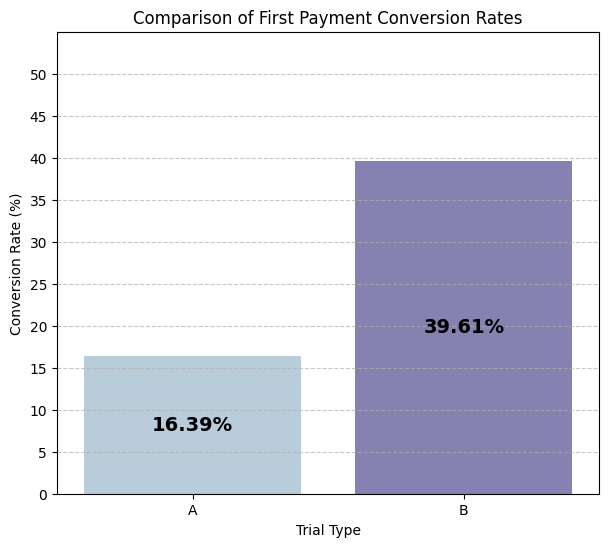

In [46]:
# TYPE A,B 전환율 시각화

# A/B 타입의 전환율 데이터
conversion_AB = {
    "type": ["A", "B"],
    "conversion Rate(%)": [A_conversation_rate, B_conversation_rate]  # 자동으로 가져오기
}

# 데이터프레임 생성
conversion_df = pd.DataFrame(conversion_AB)

# 시각화
plt.figure(figsize=(7, 6))
sns.barplot(data=conversion_df, x="type", y="conversion Rate(%)", hue = 'type', palette= palette)

# 그래프 세부 설정
plt.ylim(0, 55) 
plt.yticks(range(0, 55, 5))
plt.ylabel("Conversion Rate (%)")
plt.xlabel("Trial Type")
plt.title("Comparison of First Payment Conversion Rates")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# 값 표시 (막대 중앙, 흰색, 굵게)
for index, row in conversion_df.iterrows():
    plt.text(index, row["conversion Rate(%)"] / 2,  # 막대 중앙
             f"{row['conversion Rate(%)']:.2f}%", 
             ha="center", va="center", fontsize=14, fontweight="bold")
plt.show()

In [47]:
#이 부분에서 astype(str)을 사용하는 이유는 start_free_trial_time이 Period 타입이기 때문
#이를 문자열로 변환해야 Seaborn의 lineplot()이 제대로 작동

# 
# A/B타입의 월별 무료 체험 후 첫 결제 완료 유저 수

# A와 B 데이터를 하나의 데이터프레임으로 결합
free_trial_complete_lineplot = pd.concat([free_trial_complete_A, free_trial_complete_B]).drop_duplicates()
free_trial_complete_lineplot["Month"] = free_trial_complete["start_free_trial_time"].dt.to_period("M").astype(str)

# 타입별, 월별 첫 결제한 유저 수 집계
monthly_free_trial_complete_counts = free_trial_complete_lineplot.groupby(["Month", "start_free_trial_type"])["user_id"].nunique().reset_index()
display(monthly_free_trial_complete_counts)

,Month,start_free_trial_type,user_id
0,2022-01,A,35
1,2022-02,A,199
2,2022-03,A,244
3,2022-04,A,264
4,2022-05,A,251
5,2022-06,A,269
6,2022-07,A,97
7,2022-08,A,160
8,2022-09,A,212
9,2022-10,A,166


C:\Users\rmagm\AppData\Local\Temp\ipykernel_5732\3696513049.py:3: UserWarning: The palette list has more values (11) than needed (2), which may not be intended.
  ax = sns.lineplot(data=monthly_free_trial_complete_counts, x="Month", y="user_id",


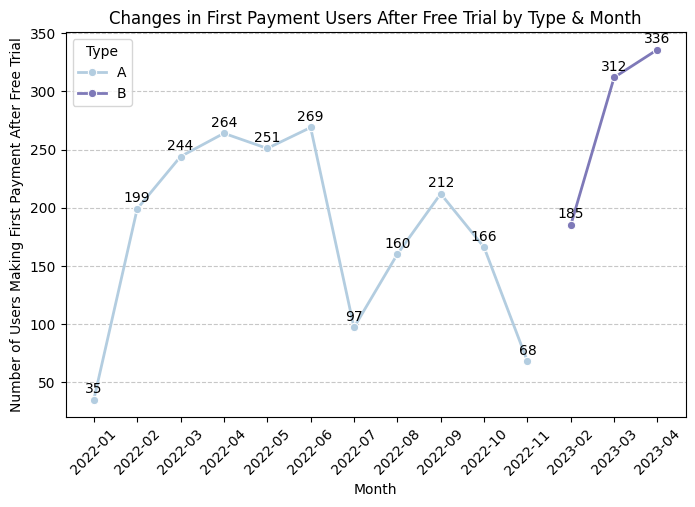

In [48]:
# 시각화
plt.figure(figsize=(8, 5))
ax = sns.lineplot(data=monthly_free_trial_complete_counts, x="Month", y="user_id", 
                  hue="start_free_trial_type", marker="o", linewidth=2, palette=palette)

# 값 표시 (각 포인트 위에 텍스트 추가)
for line in ax.lines:  # 라인별로 처리
    for x, y in zip(line.get_xdata(), line.get_ydata()):  # x, y 좌표 추출
        plt.annotate(f"{int(y)}", (x, y), textcoords="offset points", xytext=(0, 5), ha="center", fontsize=10)

# 그래프 설정
plt.xticks(rotation=45)
plt.xlabel("Month")
plt.ylabel("Number of Users Making First Payment After Free Trial")
plt.title("Changes in First Payment Users After Free Trial by Type & Month")
plt.legend(title="Type")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()

In [53]:
# 'Month' 컬럼 생성 (YYYY-MM 형식)

signup_free_trial_A_plt = signup_free_trial_A.copy()
signup_free_trial_B_plt = signup_free_trial_B.copy()

signup_free_trial_A_plt["Month"] = pd.to_datetime(signup_free_trial_A_plt["start_free_trial_time"]).dt.to_period("M").astype(str)
signup_free_trial_B_plt["Month"] = pd.to_datetime(signup_free_trial_B_plt["start_free_trial_time"]).dt.to_period("M").astype(str)


# A/B 타입별 무료 체험한 유저 수 집계
monthly_signup_free_trial_A = signup_free_trial_A_plt.groupby("Month")["user_id"].nunique().reset_index()
monthly_signup_free_trial_B = signup_free_trial_B_plt.groupby("Month")["user_id"].nunique().reset_index()

# 컬럼명 변경
monthly_signup_free_trial_A.rename(columns={"user_id": "complete_signup_trial_A"}, inplace=True)
monthly_signup_free_trial_B.rename(columns={"user_id": "complete_signup_trial_B"}, inplace=True)

In [55]:
# 기본 데이터 (월별 첫 결제 유저 수)
merged_data = monthly_free_trial_complete_counts.copy()

# 무료체험한 유저 수 (A/B) 추가
merged_data = merged_data.merge(monthly_signup_free_trial_A, on="Month", how="left")
merged_data = merged_data.merge(monthly_signup_free_trial_B, on="Month", how="left")

# NaN 값은 0으로 대체
merged_data.fillna(0, inplace=True)
merged_data

,Month,start_free_trial_type,user_id,complete_signup_trial_A,complete_signup_trial_B
0,2022-01,A,35,1833.0,0.0
1,2022-02,A,199,1263.0,0.0
2,2022-03,A,244,1755.0,0.0
3,2022-04,A,264,1676.0,0.0
4,2022-05,A,251,1878.0,0.0
5,2022-06,A,269,1958.0,0.0
6,2022-07,A,97,614.0,0.0
7,2022-08,A,160,265.0,0.0
8,2022-09,A,212,326.0,0.0
9,2022-10,A,166,293.0,0.0


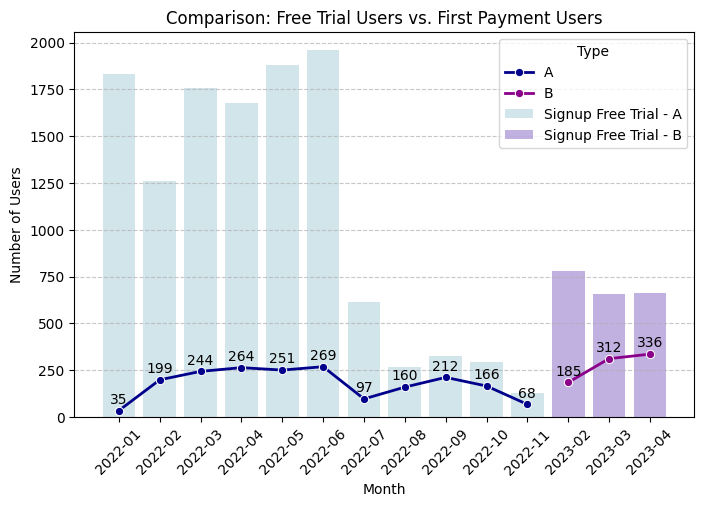

In [56]:
plt.figure(figsize=(8, 5))

# 막대그래프: A/B 타입별 무료 체험한 유저 수
sns.barplot(data=merged_data, x="Month", y="complete_signup_trial_A", 
            color="lightblue", alpha=0.6, label="Signup Free Trial - A")

sns.barplot(data=merged_data, x="Month", y="complete_signup_trial_B", 
            color="#9370db", alpha=0.6, label="Signup Free Trial - B")

# 선 그래프: A/B 타입별 첫 결제한 유저 수
ax = sns.lineplot(data=merged_data, x="Month", y="user_id", 
                  hue="start_free_trial_type", marker="o", linewidth=2, palette = { "A" : '#00008b', 'B' : "#8b008b" })

# 값 표시 (각 포인트 위에 텍스트 추가)
for line in ax.lines:  
    for x, y in zip(line.get_xdata(), line.get_ydata()):
        if not pd.isna(y):  # NaN 값 방지
            plt.annotate(f"{int(y)}", (x, y), textcoords="offset points", xytext=(0, 5), ha="center", fontsize=10)

# 그래프 설정
plt.xticks(rotation=45)
plt.xlabel("Month")
plt.ylabel("Number of Users")
plt.title("Comparison: Free Trial Users vs. First Payment Users")
plt.legend(title="Type", loc="upper right")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()


### <무료 체험 서비스의 효과성 통계 검정>

- TYPE A : 2022년 01월 01일 ~ 2022년 11월 13일(약 11개월)     

- TYPE B : 2023년 02월 01일 ~ 2023년 04얼 30일(약 3개월)

문제점     

- 같은 시기 비교 불가능
- 샘플 크기 차이

무료 체험 서비스 구독 퍼널 분석 목적
- 무료 체험 서비스를 제공하는 목적은 사용자가 무료 체험 후 유료 구독으로 전환하도록 유도하는 것이다.    

- 따라서, 무료 체험 퍼널 분석을 위해 세울 수 있는 적절한 가설은 무료 체험이 실제로 유료 구독으로 이어지는지 검증할 수 있어야 함

가설 -> 무료체험 서비스 제공 기간으로 제한해서 분석 실시함    

1. 무료 체험 서비스가 유료 전환에 미치는 영향    

    - 귀무가설 : 무료 체험 서비스는 유료 구독 전환(첫 결제)에 영향을 주지 않는다.    

    - 대립가설 : 무료 체험 서비스는 유료 구독 전환(첫 결제)에 영향을 준다.

2. TYPE A와 TYPE B의 무료 체험 효과 비교 검정      

    - 귀무가설 : TYPE A 와 TYPE B의 유료 전환율 차이는 없다.    

    - 대립가설 : TYPE A 와 TYPE B의 유료 전환율 차이가 있다.

In [57]:
# 회원 가입 후 무료 체험 서비스 기간동안 무료 체험 서비스 이용이 없었던 유저

#1-2. 회원 가입 후 무료 체험 학습 서비스 제공 기간에 무료 체험 서비스를 이용하지 않은 유저 

signup_no_trial = complete_signup_df[~complete_signup_df['user_id'].isin(complete_signup_trial['user_id'])]

signup_no_trial = signup_no_trial[
    (
        ((signup_no_trial["client_event_time"] >= A_start) & (signup_no_trial["client_event_time"] <= A_end)) | 
        ((signup_no_trial["client_event_time"] >= B_start) & (signup_no_trial["client_event_time"] <= B_end))
    )
]
total_signup_no_trial = signup_no_trial['user_id'].nunique()

#1-3. 회원 가입 후 무료 체험 서비스 이용 없는 유저 비율 계산
signup_no_trial_rate = (total_signup_no_trial / total_signup) * 100

print("회원가입 후 무료 체험 서비스 기간동안 무료 체험을 이용하지 않은 유저 수:", total_signup_no_trial)
print(f"회원가입 후 무료 체험 서비스 기간동안 무료 체험을 이용하지 않은 유저 비율(%): {signup_no_trial_rate:.2f}%")

회원가입 후 무료 체험 서비스 기간동안 무료 체험을 이용하지 않은 유저 수: 53645
회원가입 후 무료 체험 서비스 기간동안 무료 체험을 이용하지 않은 유저 비율(%): 79.19%


In [58]:
# 회원 가입 후 무료 체험 서비스를 이용하지 않은 유저들 중 첫 결제를 한 유저

# 2-1. 중복 결제 내역 제거한 첫 결제 완료 데이터
complete_subscription_final 

# 2-2. 무료 체험 하지 않은 유저와 첫 결제 완료 데이터 merge
signup_no_trial_complete = signup_no_trial.merge(complete_subscription_final, on='user_id', how='inner')

#2-3. 무료 체험 하지 않은 유저의 첫 결제 완료 전환율
signup_no_trial_complete_count = signup_no_trial_complete['user_id'].nunique()
signup_no_trial_complete_rate = (signup_no_trial_complete_count / total_signup_no_trial) * 100

print("회원가입 후 무료 체험 서비스 없이 첫 결제 유저 수:", signup_no_trial_complete_count)
print(f"회원가입 후 무료 체험 서비스 없이 첫 결제 전환율(%): {signup_no_trial_complete_rate:.2f}%")

회원가입 후 무료 체험 서비스 없이 첫 결제 유저 수: 2498
회원가입 후 무료 체험 서비스 없이 첫 결제 전환율(%): 4.66%


In [59]:
# 회원 가입 후 무료 체험 서비스를 이용하지 않은 유저들 중 첫 결제를 하지 않은 유저
3-1. 
signup_no_trial_no_complete = signup_no_trial[~signup_no_trial['user_id'].isin(signup_no_trial_complete['user_id'])]

# 3-2. 유저 수
signup_no_trial_no_complete_users = signup_no_trial_no_complete['user_id'].nunique()

# 3-3. 비율 계산
signup_no_trial_no_complete_rate = (signup_no_trial_no_complete_users / total_signup_no_trial) * 100

print("회원가입 후 무료 체험 서비스 없이 첫 결제를 하지 않은 유저 수:", signup_no_trial_no_complete_users)
print(f"회원가입 후 무료 체험 서비스 없이 첫 결제를 하지 않은 유저 비율(%): {signup_no_trial_no_complete_rate:.2f}%")


회원가입 후 무료 체험 서비스 없이 첫 결제를 하지 않은 유저 수: 51147
회원가입 후 무료 체험 서비스 없이 첫 결제를 하지 않은 유저 비율(%): 95.34%


### 1-1. 카이제곱 검정(chi-square test) -> 상관성 분석
- 무료 체험을 한 그룹과 무료 체험을 하지 않은 그룹의 유의미한 차이를 알아보고자 함

- 두 개의 그룹(무료 체험 유저 vs 무료 체험 미이용 유저)의 비율(첫 결제 전환율)을 비교

    <무료 체험 서비스가 유료 전환에 미치는 영향>    

    - 귀무가설 : 무료 체험 서비스는 유료 구독 전환(첫 결제)에 영향을 주지 않는다.    

    - 대립가설 : 무료 체험 서비스는 유료 구독 전환(첫 결제)에 영향을 준다.


- 표본 크기 
    - 무료 체험O, 첫 결제O : 3147명, 전환율 : 22.05% / 무료 체험O, 첫결제X 유저 : 11110명, 비율 : 77.83%     

    - 무료 체험 X, 첫 결제O : 5425명, 전환율 : 7.26%  / 무료 체험 X, 첫 결제X 유저 :69264, 비율 : 92.74% 

In [60]:
from scipy.stats import chi2_contingency

# 카이제곱 검정 데이터 테이블 
chi_conversion_table = [
    [free_trial_complete_yes_users, free_trial_complete_no_users],  # 무료 체험 이용_첫결제 / 무료 체험 이용_첫결제X
    [signup_no_trial_complete_count, signup_no_trial_no_complete_users]  # 무료 체험 미이용_첫결제 / 무료 체험 미이용_첫결제X
]

print("<실제 관측값>")
print(chi_conversion_table)
print('-' * 70)

# 카이제곱 검정(기대 빈도 자동 수행)
chi2, p, dof, expected_freq_auto = chi2_contingency(chi_conversion_table)

# 기대 빈도 결과
print("<기대 빈도 테이블>")
for i, row in enumerate(expected_freq_auto):
    group_name = "무료 체험 O" if i == 0 else "무료 체험 X"
    print(f"{group_name}: {row[0]:.2f} (첫 결제 O), {row[1]:.2f} (첫 결제 X)")

print('-' * 70)

# 크래머의 V 계산
n = np.sum(chi_conversion_table)  # 전체 샘플 수
min_dim = min(len(chi_conversion_table), len(chi_conversion_table[0])) - 1  # 최소 행/열 차원 계산
cramers_v = np.sqrt(chi2 / (n * min_dim))


print(f"Chi-Square Test 결과:")
print(f"카이제곱 통계량: {chi2:.4f}")
print(f"p-value: {p:.6f}")
print(f"크래머의 V: {cramers_v:.4f}")

print('-' * 70)


# 유의수준 0.05에서 귀무가설 기각 여부 판단
if p < 0.05:
    print("무료 체험 서비스가 유료 전환(첫 결제)에 유의미한 영향을 준다 (귀무가설 기각)")
else:
    print("무료 체험 서비스가 유료 전환(첫 결제)에 유의미한 영향을 주지 않는다 (귀무가설 채택)")

print('-' * 70)


# 크래머의 V 해석
if cramers_v < 0.1:
    print("무료 체험과 첫 결제의 연관성이 매우 약함 (실제 차이가 거의 없을 가능성 있음)")
elif 0.1 <= cramers_v < 0.3:
    print("무료 체험과 첫 결제 간 약한 연관성 있음")
elif 0.3 <= cramers_v < 0.5:
    print("무료 체험과 첫 결제 간 중간 정도 연관성 있음")
else:
    print("무료 체험과 첫 결제 간 강한 연관성 있음")


<실제 관측값>
[[3042, 11036], [2498, 51147]]
----------------------------------------------------------------------
<기대 빈도 테이블>
무료 체험 O: 1151.63 (첫 결제 O), 12926.37 (첫 결제 X)
무료 체험 X: 4388.37 (첫 결제 O), 49256.63 (첫 결제 X)
----------------------------------------------------------------------
Chi-Square Test 결과:
카이제곱 통계량: 4264.0164
p-value: 0.000000
크래머의 V: 0.2509
----------------------------------------------------------------------
무료 체험 서비스가 유료 전환(첫 결제)에 유의미한 영향을 준다 (귀무가설 기각)
----------------------------------------------------------------------
무료 체험과 첫 결제 간 약한 연관성 있음


- 기대 빈도 해석
    - 무료 체험 O 그룹
        - 기대값(첫 결제 O): 1374.80 → 실제 결제한 유저: 3147명
        - 기대값(첫 결제 X): 12882.20 → 실제 결제하지 않은 유저: 11110명    

        예상보다 첫 결제 전환율이 높음 → 무료 체험이 첫 결제에 긍정적인 영향 가능성!   

    - 무료 체험 X 그룹    
        - 기대값(첫 결제 O): 7197.20 → 실제 결제한 유저: 5425명
        - 기대값(첫 결제 X): 67591.80 → 실제 결제하지 않은 유저: 69264명     

        예상보다 첫 결제 전환율이 낮음 → 무료 체험을 하지 않은 그룹에서 첫 결제율이 낮은 경향.


- 크래머 v : 카이제곱 검정에서 그룹 간 관계 강도 측정(0 ~ 1 사이 값)    
    - 0.1 ~ 0.3은 약한 연관성
    - 무료 체험과 첫 결제 전환 간의 관계는 있지만, 강한 관계는 아님
        - 무료 체험을 경험한 유저 중 77.83%가 첫 결제로 이어지지 않음
        - 무료 체험을 하지 않은 유저 중에서도 일정 비율이 첫 결제를 진행함    
        - 즉, 무료 체험이 첫 결제에 영향을 미치지만 결정적인 요소는 아닐 수도 있음   

결론 : 추가 분석을 통해(ex. 어떤 요인으로 결제했는지 등등등) -> but 이젠 시간 없음 -> 여기까지만 하겠음


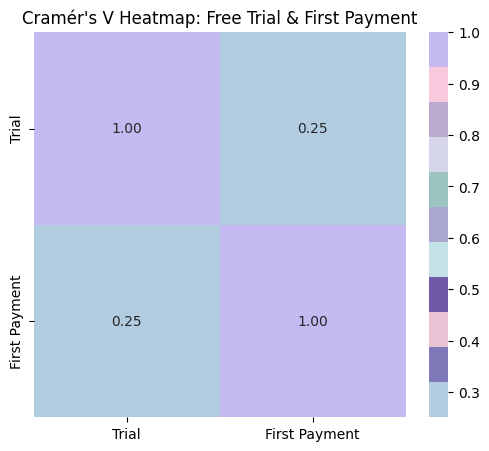

In [61]:
# 크래머의 V 행렬 생성
cramers_v_matrix = np.array([[1, cramers_v], [cramers_v, 1]])  # 자기 자신과의 연관성은 1

# 히트맵 생성
plt.figure(figsize=(6, 5))
sns.heatmap(cramers_v_matrix, annot=True, fmt=".2f", cmap= palette, xticklabels=["Trial", "First Payment"], yticklabels=["Trial", "First Payment"])
plt.title("Cramér's V Heatmap: Free Trial & First Payment")
plt.show()

### 1-2. Z-검정(비율 비교 검정) 
    -> 무료 체험과 첫 결제 간 상관성이 있다 그렇다면 전환율 차이가 통계적으로 유의한가?

<무료 체험 서비스가 유료 전환에 미치는 영향>
- 귀무가설 : 무료 체험 그룹과 비무료 체험 그룹의 전환율 차이는 없다.

- 대립가설 : 무료 체험 그룹과 비무료 체험 그룹의 전환율 차이는 없다.

In [62]:
from statsmodels.stats.proportion import proportions_ztest

#  미리 계산된 전환율 & 표본 크기
p1 = free_trial_complete_yes_rate / 100  # 무료 체험 그룹 전환율 (퍼센트를 소수점으로 변환)
n1 = total_trial_users  # 무료 체험 유저 수

p2 = signup_no_trial_complete_rate / 100  # 비무료 체험 그룹 전환율 (퍼센트를 소수점으로 변환)
n2 = total_signup_no_trial  # 무료 체험 미이용 유저 수

# 두 그룹의 성공 횟수 (첫 결제 유저 수) 설정
success_counts = [free_trial_complete_yes_users, signup_no_trial_complete_count]
sample_sizes = [n1, n2]

# Z-검정 수행
z_stat, p_value = proportions_ztest(success_counts, sample_sizes)

#  Z-검정 결과 출력
print("=== Z-검정 결과 ===")
print(f"Z-통계량: {z_stat:.4f}")
print(f"P-value: {p_value:.6f}")

# 유의수준 0.05에서 검정 결과 해석
if p_value < 0.05:
    print("무료 체험 그룹과 비무료 체험 그룹의 첫 결제 전환율 차이가 통계적으로 유의하다 (귀무가설 기각)")
else:
    print("무료 체험 그룹과 비무료 체험 그룹의 첫 결제 전환율 차이가 통계적으로 유의하지 않다 (귀무가설 채택)")


=== Z-검정 결과 ===
Z-통계량: 65.2549
P-value: 0.000000
무료 체험 그룹과 비무료 체험 그룹의 첫 결제 전환율 차이가 통계적으로 유의하다 (귀무가설 기각)


<Z-검정 결과>    

- 무료 체험을 경험한 유저 그룹과 무료 체험을 하지 않은 유저 그룹의 첫 결제 전환율 차이가 통계적으로 유의미하게 나타남
- 무료 체험을 하면 첫 결제로 이어질 확률이 높아짐을 의미

<최종 결론>    
- 무료 체험 서비스는 유료 전환(첫 결제)에 긍정적인 영향을 미친다    

- BUT 긍정적인 영향력이 강하지 않으며, 대다수의 유저는 첫 결제로 이어지지 않는다.    

- 따라서, 무료 체험 후 첫 결제까지의 유저 여정을 최적화할 필요가 있으며,    

- 이탈 유저에 대한 추가 분석이 필요함 -> 시간이 부족함.....

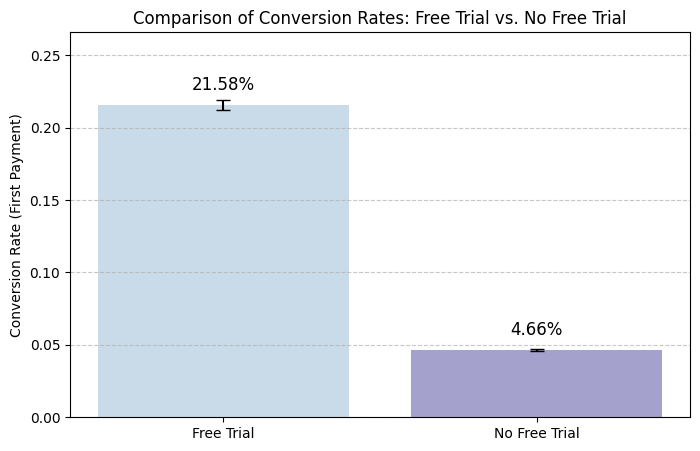

In [63]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

# 전환율 계산
conversion_rates = [p1, p2]  # 무료 체험 그룹과 비무료 체험 그룹의 전환율
labels = ["Free Trial", "No Free Trial"]
errors = [np.sqrt((p1 * (1 - p1)) / n1), np.sqrt((p2 * (1 - p2)) / n2)]  # 신뢰구간(표준오차 계산)

# 막대 그래프 그리기
plt.figure(figsize=(8, 5))
plt.bar(labels, conversion_rates, yerr=errors, capsize=5, color= palette, alpha=0.7)
plt.ylabel("Conversion Rate (First Payment)")
plt.title("Comparison of Conversion Rates: Free Trial vs. No Free Trial")
plt.ylim(0, max(conversion_rates) + 0.05)

# 데이터 라벨 추가
for i, rate in enumerate(conversion_rates):
    plt.text(i, rate + 0.01, f"{rate:.2%}", ha='center', fontsize=12)

plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


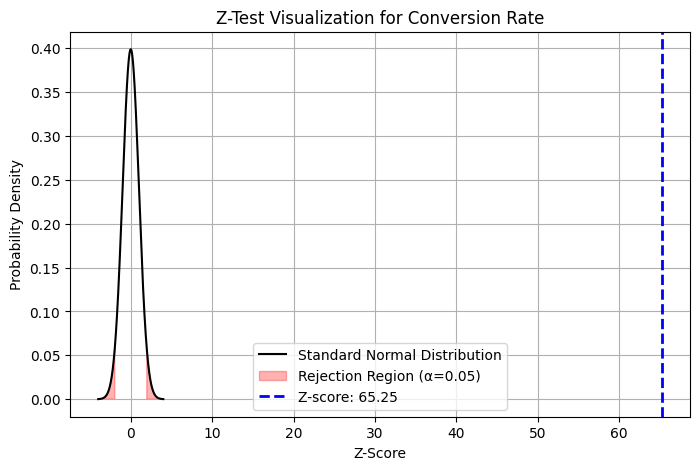

In [57]:
# Z-검정에서 사용한 정규 분포 및 Z-통계량 시각화
x = np.linspace(-4, 4, 1000)
y = stats.norm.pdf(x, 0, 1)  # 표준 정규 분포 (평균=0, 표준편차=1)

plt.figure(figsize=(8, 5))
plt.plot(x, y, color='black', label="Standard Normal Distribution")
plt.fill_between(x, y, where=(x < -1.96) | (x > 1.96), color='red', alpha=0.3, label="Rejection Region (α=0.05)")
plt.axvline(z_stat, color='blue', linestyle='dashed', linewidth=2, label=f"Z-score: {z_stat:.2f}")

plt.title("Z-Test Visualization for Conversion Rate")
plt.xlabel("Z-Score")
plt.ylabel("Probability Density")
plt.legend()
plt.grid()
plt.show()

### 2-1. TYPE A와 TYPE B -> Z-검정(비율 비교)
- 귀무가설 : TYPE A 와 TYPE B의 유료 전환율 차이는 없다.  

- 대립가설 : TYPE A 와 TYPE B의 유료 전환율 차이가 있다.

In [64]:
#  TYPE A (무료 체험 후 첫 결제)
type_A_converted = A_users_count  # TYPE A에서 첫 결제한 유저 수
type_A_total = total_trial_users_A  # TYPE A 전체 무료 체험 유저 수
type_A_conversion_rate = A_conversation_rate / 100  # 전환율

#  TYPE B (무료 체험 후 첫 결제)
type_B_converted = B_users_count  # TYPE B에서 첫 결제한 유저 수
type_B_total = total_trial_users_B  # TYPE B 전체 무료 체험 유저 수
type_B_conversion_rate = B_conversation_rate / 100  # 전환율

#  Z-검정 수행 (두 비율 비교)
count = np.array([type_A_converted, type_B_converted])  # 첫 결제한 유저 수
nobs = np.array([type_A_total, type_B_total])  # 전체 무료 체험 유저 수
z_stat, p_value = proportions_ztest(count, nobs)

#  타입별 전환율
print("-" * 60)
print(f"TYPE A 전환율: {type_A_conversion_rate:.2%}")
print(f"TYPE B 전환율: {type_B_conversion_rate:.2%}")
print("-" * 60)

#  결과 
print("=== Z-검정 결과 ===")
print(f"Z-통계량: {z_stat:.4f}")
print(f"P-value: {p_value:.6f}")

#  유의 수준 0.05에서 결과 해석
if p_value < 0.05:
    print("TYPE A와 TYPE B의 첫 결제 전환율 차이가 통계적으로 유의하다 (귀무가설 기각)")
else:
    print("TYPE A와 TYPE B의 첫 결제 전환율 차이가 통계적으로 유의하지 않다 (귀무가설 채택)")



------------------------------------------------------------
TYPE A 전환율: 16.39%
TYPE B 전환율: 39.61%
------------------------------------------------------------
=== Z-검정 결과 ===
Z-통계량: -24.6282
P-value: 0.000000
TYPE A와 TYPE B의 첫 결제 전환율 차이가 통계적으로 유의하다 (귀무가설 기각)


#### <Z-검정 분석 결과>

- 우려했던 표본 수 차이 극복
    - TYPE A: 11,992명, TYPE B: 2,280명으로 TYPE A의 표본 크기가 훨씬 큼.    
    
    - 하지만 Z-검정은 표본 수가 크면 정규 근사(Normal Approximation)를 따르므로, 적절한 방법

- Z-통계량: -24.2205 (음수는 TYPE A의 전환율이 TYPE B보다 낮음을 의미)      

     -> 두 그룹간 차이가 크다(매우 큰 절대 값)    

- TYPE A와 TYPE B의 첫 결제 전환율 차이는 통계적으로 유의미하다      

- TYPE B가 첫 결제로의 전환에 있어 더 효과적인 무료 체험 모델일 가능성이 높음.    

    (7일 무료 체험 후 자동으로 첫 결제로 넘어간다면 매우 가능성있는 결론 같음)

### 2-2. TYPE A와 TYPE B 로지스틱 회귀 분석
- Z-검정은 단순한 두 그룹 간 비율 차이를 비교    

- 로지스틱 회귀분석은 A/B 타입이 첫 결제에 미치는 영향을 확률적으로 모델링하고, 오즈비(Odds Ratio)를 해석할 수 있음.    

- TYPE별 효과를 조정된 모델에서 다시 평가하여 더 정확한 비교(맞지?)

<가설>

- 귀무가설 : TYPE A 와 TYPE B의 유료 전환율 차이는 없다.  

- 대립가설 : TYPE A 와 TYPE B의 유료 전환율 차이가 있다.


<모델 설명>  
- 독립 변수(x) : A/B 타입(A = 0, B = 1)    

- 종속 변수(y) : 첫 결제 여부 (0: 미결제, 1 : 결제)

In [65]:
import statsmodels.api as sm

# 데이터프레임 생성
AB_df = pd.DataFrame({
    'user_id': list(range(total_trial_users_A + total_trial_users_B)),
    'trial_type': ['A'] * total_trial_users_A + ['B'] * total_trial_users_B,  # A/B 타입
    'converted': [1] * A_users_count + [0] * (total_trial_users_A - A_users_count) + 
                 [1] * B_users_count + [0] * (total_trial_users_B - B_users_count)  # 첫 결제 여부
})

# A/B 타입을 0과 1로 변환
AB_df['trial_type'] = AB_df['trial_type'].map({'A': 0, 'B': 1})

# 독립변수(타입), 종속변수(첫 결제 여부)
X = sm.add_constant(AB_df['trial_type'])  # 상수 추가
y = AB_df['converted']

# 로지스틱 회귀 모델 적합
logit_model = sm.Logit(y, X)
result = logit_model.fit()

# 결과 출력
print(result.summary())

# 해석
odds_ratio = np.exp(result.params['trial_type'])  # 오즈비 계산
print(f"오즈비 (Odds Ratio): {odds_ratio:.4f}")

# 유의수준 판단
if result.pvalues['trial_type'] < 0.05:
    print("TYPE A와 TYPE B의 첫 결제 전환율 차이가 통계적으로 유의하다 (귀무가설 기각)")
else:
    print("TYPE A와 TYPE B의 첫 결제 전환율 차이가 통계적으로 유의하지 않다 (귀무가설 채택)")


Optimization terminated successfully.
         Current function value: 0.479642
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:              converted   No. Observations:                14095
Model:                          Logit   Df Residuals:                    14093
Method:                           MLE   Df Model:                            1
Date:                Wed, 12 Mar 2025   Pseudo R-squ.:                 0.03750
Time:                        09:27:47   Log-Likelihood:                -6760.6
converged:                       True   LL-Null:                       -7024.0
Covariance Type:            nonrobust   LLR p-value:                1.395e-116
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.6298      0.025    -66.062      0.000      -1.678      -1.581
trial_type     1.2081      0.

#### <로지스틱 회귀분석 분석 결과>

회귀 계수는 로그 오즈의 변화를 나타냄 -> 계수가 클수록 해당 변수가 첫 결제에 더 큰 영향을 미침 

- coef
    - const(절편) : -1.6353
        - 기준값(TYPE A일 때의 절편)  : TYPE A 유저의 첫 결제 확률(전환율) : 16.3%
    - trial_type : 1.1617
        - TYPE B 사용자는 TYPE A보다 첫 결제 로그 오즈가 1.1617 증가    

    
        (로그 오즈 확률로 변환 : 식으로 계산하면 TYPE B 사용자의 전환율 : 약 38.4%)  

- 오즈비 : 3.2 => TYPE B의 유저가 TYPE A 유저보다 첫 결제를 할 확률이 약 3.2배 더 높음 

    - 즉, TYPE B 유저가 TYPE A 유저에 비해 첫 결제할 확률이 증가함(유의미하게 높음)을 의미 -> 자동 결제면 강제 아닐까?
    - TYPE B가 TYPE A보다 첫 결제를 유도하는데 더 효과적이다

- 표준 오차(std err)
    - const : 0.025 / trial_type : 0.050
    - 표준 오차 작을수록 추정된 계수(coef)의 신뢰성이 높음
    - trial_type의 표준오차 0.050이므로 계수 1.1617이 비교적 신뢰할 수 있는 값
|
- Z 값 : 계수가 0과 얼마나 차이나는지
    - trial_type의 z값 23.396으로 매우 큼 -> type a/b의 전환율 차이 유의미

결론 : type b가 type a보다 첫 결제를 유도하는데 효과적이다.

### 2-3. Bootstrapping Z-검정
- A/B 타입의 표본 수가 다름 -> 작은 표본에 맞춰 리샘플링(bootstrapping)    

- A/B 타입에서 각각 2000개씩 샘플링 -> 동일한 크기 데이터로 분석(편향 줄이기)    

- Z-검정 : 두 타입의 유료 전환율 차이가 통계적으로 유의한지 평가

In [66]:
from sklearn.utils import resample

# A/B 그룹에서 각각 2000개씩 샘플링 (작은 표본에 맞춤)
sample_size = min(total_trial_users_A, total_trial_users_B)

boot_A = resample(AB_df[AB_df['trial_type'] == 0], n_samples=sample_size, replace=True, random_state=42)
boot_B = resample(AB_df[AB_df['trial_type'] == 1], n_samples=sample_size, replace=True, random_state=42)

# 샘플링된 데이터로 Z-검정 수행
count = np.array([boot_A['converted'].sum(), boot_B['converted'].sum()])
nobs = np.array([len(boot_A), len(boot_B)])
z_stat, p_value = proportions_ztest(count, nobs)

# 결과 출력
print(f"Bootstrapped Z-검정 결과: Z={z_stat:.4f}, P-value={p_value:.6f}")


Bootstrapped Z-검정 결과: Z=-16.8758, P-value=0.000000


<결과 해석>
- Z-값 -16.5753   
    - Z-값이 매우 작음(음수) → TYPE A의 전환율이 TYPE B보다 유의하게 낮음을 의미    

    - 일반적으로 |Z| > 1.96이면 유의하다고 판단하는데, -16.5753은 압도적으로 작음

- P-value 0.000000
    - P-value가 0에 가깝다 → 귀무가설 기각    
    
    - 즉, TYPE A와 TYPE B의 유료 전환율 차이는 유의미하다

### 참고 :  TYPE A,B 베이지안 분석
    - 신뢰 구간을 포함해 보다 확률적인 해석이 가능하다고 함

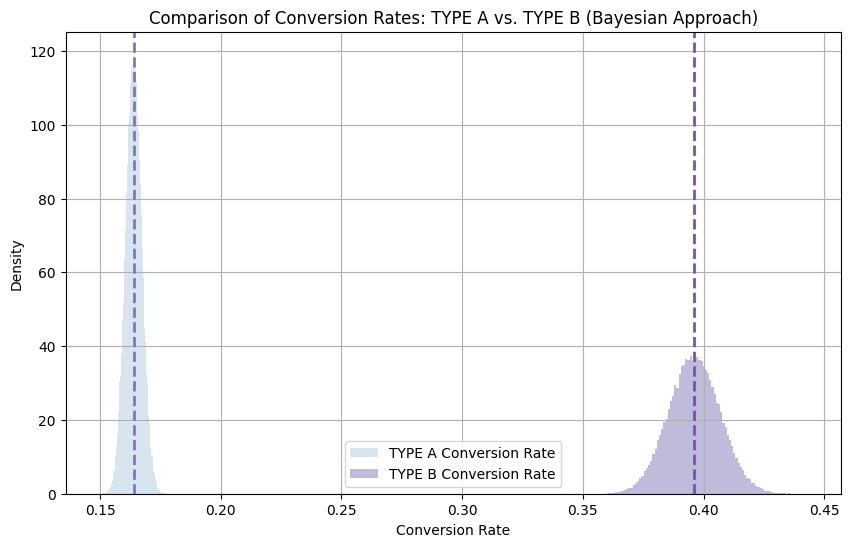

TYPE A 평균 전환율 추정값: 0.1639
TYPE B 평균 전환율 추정값: 0.3962
TYPE B가 TYPE A보다 전환율이 높을 확률: 100.0000%


In [67]:
# A/B 테스트 데이터
alpha_A = 1 + A_users_count  # 첫 결제 한 유저 수 + 베타 분포 초기값
beta_A = 1 + (total_trial_users_A - A_users_count)  # 첫 결제X한 유저 수 + 베타 분포 초기값

alpha_B = 1 + B_users_count
beta_B = 1 + (total_trial_users_B - B_users_count)

# 베타 분포에서 샘플링
np.random.seed(42)
samples_A = np.random.beta(alpha_A, beta_A, 100000)  # A 타입 전환율 샘플
samples_B = np.random.beta(alpha_B, beta_B, 100000)  # B 타입 전환율 샘플

# B가 A보다 높은 확률 계산 (P(B > A))
prob_B_superior = np.mean(samples_B > samples_A)

# 시각화
plt.figure(figsize=(10, 6))
plt.hist(samples_A, bins=100, alpha=0.5, label="TYPE A Conversion Rate", color = palette[0], density=True)
plt.hist(samples_B, bins=100, alpha=0.5, label="TYPE B Conversion Rate", color= palette[1], density=True)
plt.axvline(samples_A.mean(), color= palette[1], linestyle='dashed', linewidth=2)
plt.axvline(samples_B.mean(), color= palette[3], linestyle='dashed', linewidth=2)
plt.title("Comparison of Conversion Rates: TYPE A vs. TYPE B (Bayesian Approach)") #TYPE A vs TYPE B 전환율 비교 (베이지안 접근)
plt.xlabel("Conversion Rate") # 전환율
plt.ylabel("Density") # 밀도
plt.legend()
plt.grid()
plt.show()

# 결과 출력
print(f"TYPE A 평균 전환율 추정값: {samples_A.mean():.4f}")
print(f"TYPE B 평균 전환율 추정값: {samples_B.mean():.4f}")
print(f"TYPE B가 TYPE A보다 전환율이 높을 확률: {prob_B_superior:.4%}")


In [68]:
ci_A = np.percentile(samples_A, [2.5, 97.5])  # TYPE A의 95% 신뢰 구간
ci_B = np.percentile(samples_B, [2.5, 97.5])  # TYPE B의 95% 신뢰 구간

print(f"TYPE A 신뢰 구간: {ci_A[0]:.4f} ~ {ci_A[1]:.4f}")
print(f"TYPE B 신뢰 구간: {ci_B[0]:.4f} ~ {ci_B[1]:.4f}")

TYPE A 신뢰 구간: 0.1574 ~ 0.1706
TYPE B 신뢰 구간: 0.3754 ~ 0.4171


- 신뢰구간 겹치지 않음 => TYPE B가 압도적으로 전환율이 높음

#### <결과 해석>

1. 베타 분포 정의
    - alpha = 성공한 유저 수 + 1
    - beta = 실패한 유저 수 + 1
    - A/B의 전환율을 베타 분포를 이용해 모델링

2. 100,000개 샘플링
    - 베타 분포에서 np.random.beta(alpha, beta, 100000)을 통해 각각 샘플링하여 전환율 분포 추정.

3. P(B >A) 계산
    - B의 전환율 샘플 중 A보다 높은 비율을 계산하여 B가 A보다 유리할 확률을 추정

4. 결과
 - TYPE A 평균 전환율 추정값: 16.32%    
    - 베이지안 추론을 통해 도출된 TYPE A의 평균 전환율(결제 전환율)이 **16.32%**로 나타남.    

    - 기존 분석(빈도주의 접근)에서 구한 **16.31%**과 일치하는 수준       

    -  베이지안 방식으로도 유사한 추정 결과를 얻었음을 의미.

- TYPE B 평균 전환율 추정값: 38.39%
    - TYPE B의 평균 전환율은 **38.39%**로 추정됨    

    - 기존 빈도주의 분석(38.38%)과 거의 일치하며, 베이지안 추론을 통해 TYPE B의 전환율이 확실히 더 높음을 확인.

- TYPE B가 TYPE A보다 전환율이 높을 확률: 100.000%
    - 베이지안 추론에서 **TYPE B가 TYPE A보다 전환율이 높을 확률이 100%**로 계산됨.    

    - 이는 TYPE B의 전환율이 TYPE A보다 높다는 것이 사실상 확실하다는 의미.


<베이지안 그래프 해석>
- X축 (Conversion Rate, 전환율)
    - 각 타입(A, B)의 전환율 분포를 나타냄    
    
    - TYPE A (파란색): 전환율이 0.15~0.17 사이에 집중되어 있음     

    - TYPE B (보라색): 전환율이 0.35~0.40 사이에서 분포함

- 히스토그램 (Density, 밀도)
    - 각 히스토그램은 베이지안 추론을 통해 샘플링된 전환율 분포를 나타냄    

    - TYPE B(보라색)의 전환율이 TYPE A(파란색)보다 훨씬 더 높은 값에 집중

- 점선 (평균 전환율 위치)
    - 파란 점선: TYPE A의 평균 전환율 (16.32%)    

    - 보라 점선: TYPE B의 평균 전환율 (38.39%)    

    - TYPE B의 평균 전환율이 TYPE A보다 훨씬 오른쪽에 위치, 즉 더 높은 전환율을 보임


<추가적으로 하면 좋은 것들>
1. 시간 효과 고려
    - trial_period_length (11개월 vs 3개월) 조정하여 추가 분석 가능
    - 선형 회귀 또는 혼합 모델 활용 가능

2. 비용 분석 포함
    - TYPE B가 전환율이 높더라도 **비용 대비 수익(Cost-Benefit Analysis)**을 고려해야 함.

3. 추가 실험 설계
    - TYPE A의 기간을 줄이거나 TYPE B의 기간을 늘려서 다시 실험.

# 📊 구독 서비스 프로덕트 데이터 설명

## **1️⃣ 유저 행동 데이터**
| 컬럼명 | 컬럼 설명 | 추가 정보 |
|--------|------------|--------------|
| `enter.main_page` | 서비스 메인페이지 진입 |  |
| `enter.signup_page` | 회원가입 페이지 진입 |  |
| `complete.signup` | 회원가입 완료 | 로그인 방식 |

---

## **2️⃣ 콘텐츠 이용 관련 데이터**
| 컬럼명 | 컬럼 설명 | 추가 정보 |
|--------|------------|--------------|
| `enter.content_page` | 콘텐츠 개별 페이지 진입 | 콘텐츠 ID |
| `click.content_page_start_content_button` | 콘텐츠 시청하기 버튼 클릭 | 콘텐츠 ID, 버튼 이름 |
| `click.content_page_more_review_button` | 콘텐츠 후기 더보기 버튼 클릭 | 콘텐츠 ID |
| `enter.episode_page` | 에피소드 시청 시작 | 콘텐츠 ID, 에피소드 ID, 무료체험 여부 |
| `start.content` | 콘텐츠 시청 시작 | 콘텐츠 ID, 콘텐츠 이용가 _(22년 8월부터 수집됨)_ |
| `complete.episode` | 에피소드 시청 완료 | 콘텐츠 ID, 에피소드 ID |
| `end.content` | 콘텐츠 시청 완료 | 콘텐츠 ID _(모든 에피소드 시청 시 기록됨)_ |

---

## **3️⃣ 결제 및 구독 관련 데이터**
| 컬럼명 | 컬럼 설명 | 추가 정보 |
|--------|------------|--------------|
| `enter.payment_page` | 결제 페이지 진입 |  |
| `complete.subscription` | 첫 결제 완료 | 요금제 종류, 쿠폰 종류, 쿠폰 혜택 종류, 정상가, 할인가, 할인액, 결제수단 타입 _(첫 결제가 중복이면 환불 후 재결제한 케이스)_ |
| `renew.subscription` | 정기 결제 완료 | 요금제 종류, 쿠폰 종류, 쿠폰 혜택 종류, 정상가, 할인가, 할인액, 결제수단 타입 |
| `resubscribe.subscription` | 만료 후 재구독 완료 | 요금제 종류, 쿠폰 종류, 쿠폰 혜택 종류, 정상가, 할인가, 할인액, 결제수단 타입 |
| `start.free_trial` | 서비스 무료체험 시작 | 콘텐츠 ID, 요금제 종류, 정상가 |
| `click.cancel_plan_button` | 구독 취소 버튼 클릭 | _(클릭 시 구독 취소로 간주됨)_ |

---

## **4️⃣ 사용자 인터랙션 데이터**
| 컬럼명 | 컬럼 설명 | 추가 정보 |
|--------|------------|--------------|
| `click.episode_page_related_comment_box` | 에피소드 페이지 내 댓글보기 버튼 클릭 | 콘텐츠 ID, 에피소드 ID, 댓글 ID |


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from datetime import timedelta

In [4]:
# 음??? 메모리 에러 나네????
# folder_path = 'C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트'
# files = os.listdir(folder_path)

# # 파일별 데이터프레임 생성
# # rsplit()은 문자열을 오른쪽(r)에서부터 나눔.
# # '.' 기준으로 최대 1번 분할할
# for i in files:
#         file_name = i.rsplit('.', 1)[0].replace('.', '_')  # 확장자 제거 + '.' → '_'
#         file_path = f'{folder_path}/{i}'  # 파일 경로ddd

        
#         globals()[file_name] = pd.read_csv(file_path)

# # 변수 리스트 확인
# print('생성된 데이터 프레임 변수')
# for name in files:
#         df_name = name.rsplit('.',1)[0].replace('.','_')
#         print(df_name)

- 웹 크롤러로 보이는 chrome headless(os_name)는 제거 할 필요 있음 : 개발자 도구
- 변수명에 있는 . -> _(언더바)로 변경
- 데이터 사용할 기한 2022년 1월 ~ 2023년 12월


### 1. 서비스 메인 페이지 진입(enter.main_page)

In [5]:
enter_main_page = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/enter.main_page.csv')
enter_main_page.head(3)

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seongnam-si,2023-04-05 21:55:06.140000,South Korea,NaN,Samsung Phone,Samsung Galaxy S21 5G,enter.main_page,Korean,Whale,1.0.0.0,Web,NaN
1,Dongdaemun-gu,2023-04-05 21:04:28.967000,South Korea,NaN,Mac,Mac,enter.main_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4
2,Hwaseong-si,2023-04-05 21:01:31.258000,South Korea,NaN,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN


In [6]:
# 데이터 타입 변경 확인
enter_main_page.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2133548 entries, 0 to 2133547
Data columns (total 12 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time  object 
 2   country            object 
 3   device_carrier     float64
 4   device_family      object 
 5   device_type        object 
 6   event_type         object 
 7   language           object 
 8   os_name            object 
 9   os_version         object 
 10  platform           object 
 11  user_id            object 
dtypes: float64(1), object(11)
memory usage: 195.3+ MB


In [7]:
# 사용하지 않는 device carrier 컬럼 제거
enter_main_page.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터 제거
enterenter_main_page =enter_main_page.loc[enter_main_page['os_name'] != 'Chrome Headless']

# reset_index
enterenter_main_page =enter_main_page.reset_index(drop=True)

# 데이터 타입 변경
enter_main_page['client_event_time'] = pd.to_datetime(enter_main_page['client_event_time'])

# 9시간 추가 (KST 변환)
enter_main_page["client_event_time"] = enter_main_page["client_event_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
enter_main_page = enter_main_page[(enter_main_page['client_event_time'] >= '2022-01-01') 
                                  & (enter_main_page['client_event_time'] <= '2023-12-31')]

In [8]:
print(enter_main_page['client_event_time'].min())
print(enter_main_page['client_event_time'].max())

2022-01-01 09:02:20.959000
2023-12-15 11:46:11.182000


In [9]:
# 메인 페이지 진입 할 때 결측이 아닌 user_id는 자동 로그인 상태 일 수 있다.
enter_main_page.isnull().sum()

city                   56987
client_event_time          0
country                 1869
device_family           2813
device_type            60050
event_type                 0
language                   0
os_name                 2304
os_version             13868
platform                   0
user_id              1610997
dtype: int64

In [10]:
enter_main_page['city'].value_counts()

city
Seoul              532417
Gangnam-gu          62073
Suwon               54818
Seongnam-si         53783
Yongin-si           40355
                    ...  
Mandi Bahauddin         1
Ismailia                1
Alexander City          1
Pijon-dong              1
Haldwani                1
Name: count, Length: 3429, dtype: int64

In [11]:
enter_main_page['country'].value_counts()

country
South Korea      2079265
United States      18915
Japan               5329
Canada              4142
Germany             3009
                  ...   
Kosovo                 1
Somalia                1
Belize                 1
Mauritania             1
Guyana                 1
Name: count, Length: 172, dtype: int64

In [12]:
# 월별 사용유저
enter_main_page.groupby(enter_main_page['client_event_time'].dt.to_period('M')).count()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
client_event_time,,,,,,,,,,,
2022-01,75492,77191,77166,76794,76775,77191,77191,76803,76801,77191,49587
2022-02,109786,112409,112319,112347,112325,112409,112409,112362,112339,112409,52250
2022-03,107938,111261,111130,111064,111062,111261,111261,111069,111048,111261,50858
2022-04,84605,86276,86240,86164,86162,86276,86276,86191,86188,86276,39664
2022-05,84453,86600,86549,86516,86513,86600,86600,86522,86510,86600,39307
2022-06,92566,94169,94134,94093,94091,94169,94169,94096,94090,94169,42615
2022-07,80908,82166,82111,82054,82051,82166,82166,82061,82044,82166,41906
2022-08,58431,59615,59577,59522,59517,59615,59615,59530,59522,59615,23111
2022-09,45901,46703,46663,46636,46636,46703,46703,46639,46639,46703,17845


In [13]:
# 월별 유입 유저의 총 수와 user_id가 있는 유저, user_id가 없는 유저 중 user_id가 없는 유저의 비율

monthly_user = pd.DataFrame()
                            
monthly_user['month'] = enter_main_page['client_event_time'].dt.to_period('M') # 월별로 변환

# 유저 아이디가 있응 유저 수와 유저 아이디가 없는 수 월별로 그룹화화
monthly_user['user_id_status'] = enter_main_page['user_id'].notna().map({True : 'user_id_cnt', False : 'non_user_id_cnt'})
group = (monthly_user.groupby(['month','user_id_status']).size().unstack(fill_value = 0).reset_index())

#total_user 총 유저 수 계산
group['total_users'] = group['user_id_cnt'] + group['non_user_id_cnt']

# user_id 없는 유저 수수 비율 계산
group['missing_user_id_ratio'] = ((group['non_user_id_cnt'] / group['total_users']) * 100).round(2)

# 2022년 1월부터 2023년 12월 데이터만 추출출
group = group[(group['month'] >= '2022-01') & (group['month'] <= '2023-12')]

group.columns.name = None # index 이름 제거

group


,month,non_user_id_cnt,user_id_cnt,total_users,missing_user_id_ratio
0,2022-01,27604,49587,77191,35.76
1,2022-02,60159,52250,112409,53.52
2,2022-03,60403,50858,111261,54.29
3,2022-04,46612,39664,86276,54.03
4,2022-05,47293,39307,86600,54.61
5,2022-06,51554,42615,94169,54.75
6,2022-07,40260,41906,82166,49.00
7,2022-08,36504,23111,59615,61.23
8,2022-09,28858,17845,46703,61.79
9,2022-10,28024,15540,43564,64.33


- 이상한 날짜 존재(전처리 필요!)
- 시간이 지날수록 user_id 없이 컨텐츠 이용자가 증가하고 있음 -> 그렇다면 구독 안하고 이탈 확률 높아짐
- user_id가 없이 메인 페이지에 진입하여 할 수 있는건 뭐가 있을까?
    -> 5번 콘텐츠 수강하기 버튼 클릭에서 버튼 이름과 연관지어 볼 수 있을까?

### 2. 회원가입 페이지 진입(enter.signup_page)
- user_id 모두 결측치 -> 회원가입 페이지 진입이기 때문에 없을 수 밖에!

In [14]:
enter_signup_page = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/enter.signup_page.csv')
enter_signup_page.head(3)

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seoul,2023-04-05 21:30:42.557000,South Korea,NaN,Samsung Phone,Samsung Galaxy A51 5G,enter.signup_page,Korean,Chrome,112.0.0.0,Web,NaN
1,Seoul,2023-04-05 21:37:41.467000,South Korea,NaN,Samsung SM-S916N,NaN,enter.signup_page,Korean,Chrome,111.0.0.0,Web,NaN
2,Seoul,2023-04-05 21:05:53.237000,South Korea,NaN,Apple iPhone,Apple iPhone,enter.signup_page,Korean,Mobile Safari,16.4,Web,NaN


In [15]:
# 사용하지 않는 device carrier 컬럼 제거
enter_signup_page.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터 제거
enterenter_signup_page =enter_signup_page.loc[enter_signup_page['os_name'] != 'Chrome Headless']

# reset_index
enterenter_signup_page =enter_signup_page.reset_index(drop=True)

# client_event_time 데이터 타입 변경
enter_signup_page['client_event_time'] = pd.to_datetime(enter_signup_page['client_event_time'])

# 9시간 추가 (KST 변환)
enter_signup_page["client_event_time"] = enter_signup_page["client_event_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
enter_signup_page = enter_signup_page[(enter_signup_page['client_event_time'] >= '2022-01-01') 
                                  & (enter_signup_page['client_event_time'] <= '2023-12-31')]

In [16]:
print(enter_signup_page['client_event_time'].min())
print(enter_signup_page['client_event_time'].max())

2022-01-01 00:26:57.049000
2023-12-30 23:59:23.159000


In [17]:
# 데이터 타입 확인
enter_signup_page.info()

<class 'pandas.core.frame.DataFrame'>
Index: 594374 entries, 0 to 596828
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               578621 non-null  object        
 1   client_event_time  594374 non-null  datetime64[ns]
 2   country            593860 non-null  object        
 3   device_family      594292 non-null  object        
 4   device_type        565128 non-null  object        
 5   event_type         594374 non-null  object        
 6   language           594374 non-null  object        
 7   os_name            594299 non-null  object        
 8   os_version         592195 non-null  object        
 9   platform           594374 non-null  object        
 10  user_id            0 non-null       float64       
dtypes: datetime64[ns](1), float64(1), object(9)
memory usage: 54.4+ MB


In [18]:
# 결측값 확인 회원가입 페이지 진입 -> user_id가 없는 유저들
enter_signup_page.isnull().sum()

city                  15753
client_event_time         0
country                 514
device_family            82
device_type           29246
event_type                0
language                  0
os_name                  75
os_version             2179
platform                  0
user_id              594374
dtype: int64

In [19]:
enter_signup_page['device_family'].unique()

array(['Samsung Phone', 'Samsung SM-S916N', 'Apple iPhone', 'Mac',
       'Windows', 'Samsung Galaxy Phone', 'Samsung Tablet',
       'Motorola Phone', 'Redmi Phone', 'Apple iPad',
       'Samsung Galaxy Note', 'K', 'Samsung SM-S911N', 'LG LM-X220N',
       'Linux', 'Chromium OS', 'Samsung Galaxy Tab', 'LG LM-G910N',
       'Samsung SM-S918N', 'LG V607L', 'Ubuntu',
       'Xiaomi Redmi Note 10 Lite', 'MobiGo2', 'LGE Phone',
       'Apple iPad14,3', 'LG LM-Q630N', 'Google Phone', 'LG LM-G820N',
       'LGM-V300L', 'LG LM-V500N', 'Google Nexus Phone', 'LG V525',
       'LG LM-V409N', 'LG LM-V510N', 'LG lge', 'M2006C3MG', 'LGM-V300S',
       'A001XM', 'Huawei Phone', '2206122SC', 'LG LM-Q920N',
       'LG LM-Q510N', 'LG LM-G710N', 'LG V522', 'M2012K11AC',
       'LG LM-F100N', 'LG LM-V350N', 'LG LM-Q815K', 'LG F350S',
       '2201116SG', 'Samsung SM-A346N', 'Dicle_Tab_Lite_M',
       'Lenovo YT-X705F', 'M2101K7AG', 'LG LM-X625N', 'BTV-DL09',
       'LG LM-Q927L', 'Xiaomi Phone', 'M2002J9S

In [20]:
enter_signup_page['device_type'].unique()

array(['Samsung Galaxy A51 5G', nan, 'Apple iPhone', 'Mac',
       'Samsung Galaxy Quantum2', 'Windows', 'Samsung Galaxy A23',
       'Samsung Galaxy S21 Ultra 5G', 'Samsung Galaxy Note20 5G',
       'Samsung Galaxy S21 5G', 'Samsung Galaxy On7(2016)',
       'Samsung Galaxy Tab A', 'Motorola Moto G4', 'Samsung Galaxy S10',
       'Motorola moto g power (2022)', 'Redmi Note 10 Pro',
       'Samsung Galaxy A31', 'Samsung Galaxy S22',
       'Samsung Galaxy A53 5G', 'Samsung Galaxy S10+',
       'Apple iPhone 12 Pro', 'Apple iPad', 'Samsung Galaxy S20 FE 5G',
       'Samsung Galaxy Tab S6 Lite', 'Apple iPhone 13',
       'Samsung Galaxy Note20 Ultra 5G', 'Samsung Galaxy Note9',
       'Samsung Galaxy S22 Ultra', 'Samsung Galaxy S20+ 5G',
       'Samsung Galaxy A32', 'Apple iPhone 14 Pro',
       'Samsung Galaxy Z Flip4', 'Samsung Galaxy Note 8',
       'Apple iPhone 11', 'Samsung Galaxy Z Flip3 5G', 'Apple iPhone XR',
       'Apple iPhone 11 Pro', 'Apple iPhone XS Max',
       'Apple iPh

### 3. 회원가입 완료(complete.signup)
- type : 로그인 방식

In [21]:
complete_signup = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/complete.signup.csv')
complete_signup

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,type
0,NaN,2023-04-05 21:33:26.068000,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,74d17c27a41656e7788b0c81d9f76cda,kakao
1,NaN,2023-04-05 21:45:18.672000,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,06b6868000a5d576180aca47896d6cce,kakao
2,Seo-gu,2023-04-10 14:47:56.424000,South Korea,NaN,Windows,Windows,complete.signup,Korean,Chrome,111.0.0.0,Web,e131c319972bd580146c5a2faba26613,kakao
3,Suwon,2023-04-10 14:25:45.920000,South Korea,NaN,Apple iPhone,Apple iPhone,complete.signup,Korean,Mobile Safari,16.3,Web,e3b8bfa80d866f296aad139e09023ef3,naver
4,NaN,2023-04-10 14:09:50.698000,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,5208a60918f18562ac9d668a35b20303,kakao
...,...,...,...,...,...,...,...,...,...,...,...,...,...
145128,NaN,2023-10-10 05:10:04.854000,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,0117038cc69fe8a40388ec19bb0a495e,kakao
145129,NaN,2023-10-10 05:16:31.995000,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,bc1a28ff902daba9399e7f602cc86285,kakao
145130,NaN,2023-10-10 05:27:53.140000,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,0d507104136f139cbc9f6fa1db365162,google
145131,NaN,2023-10-10 05:33:30.471000,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,298e200203472e5bc0f9a14053e1dfe1,google


In [22]:
# 사용하지 않는 device carrier 컬럼 제거
#complete_signup_df = complete_signup.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터 제거
complete_signup_df =complete_signup.loc[complete_signup['os_name'] != 'Chrome Headless']

# reset_index
complete_signup_df =complete_signup_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
complete_signup_df['client_event_time'] = pd.to_datetime(complete_signup_df['client_event_time'])

# 9시간 추가 (KST 변환)
complete_signup_df["client_event_time"] = complete_signup_df["client_event_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
complete_signup_df = complete_signup_df[complete_signup_df['client_event_time'].dt.year.isin([2022,2023])]


In [23]:
print(complete_signup_df['client_event_time'].min())
print(complete_signup_df['client_event_time'].max())

2022-01-01 09:06:31.232000
2023-12-31 23:41:01.654000


In [24]:
complete_signup_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 145082 entries, 0 to 145132
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               44774 non-null   object        
 1   client_event_time  145082 non-null  datetime64[ns]
 2   country            45756 non-null   object        
 3   device_carrier     0 non-null       float64       
 4   device_family      45767 non-null   object        
 5   device_type        44659 non-null   object        
 6   event_type         145082 non-null  object        
 7   language           45767 non-null   object        
 8   os_name            45745 non-null   object        
 9   os_version         45651 non-null   object        
 10  platform           45767 non-null   object        
 11  user_id            145082 non-null  object        
 12  type               144907 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(11)
memo

In [25]:
complete_signup_df.isnull().sum()

city                 100308
client_event_time         0
country               99326
device_carrier       145082
device_family         99315
device_type          100423
event_type                0
language              99315
os_name               99337
os_version            99431
platform              99315
user_id                   0
type                    175
dtype: int64

In [26]:
# type별 이용 수 확인 
complete_signup_df['type'].value_counts()

type
kakao       89448
google      21461
naver       19433
email       14122
facebook      442
test            1
Name: count, dtype: int64

In [27]:
# 회원가입 완료에서 user_id 중복 없음
complete_signup_df[complete_signup_df.duplicated(subset = ['user_id'])]

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,type


In [28]:
complete_signup_df[complete_signup_df['type'] == 'test']

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,type
24616,NaN,2023-02-17 16:49:50.039,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,717fd2ff22addd9f8745923ab19ee231,test


- complete_signup[complete_signup['type'] == 'test']     

    -> user_id : 717fd2ff22addd9f8745923ab19ee231 : 다른 데이터에서 어떤활동인지 보고 진짜 test한 항목이면 삭제처리!

In [29]:
# 타입 test행 제거
complete_signup_df = complete_signup_df[complete_signup_df['type'] != 'test']
complete_signup_df['type'].value_counts()

type
kakao       89448
google      21461
naver       19433
email       14122
facebook      442
Name: count, dtype: int64

In [30]:
complete_signup_df = complete_signup_df.drop_duplicates(subset = ['user_id'], keep = False)
complete_signup_df

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,type
0,NaN,2023-04-06 06:33:26.068,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,74d17c27a41656e7788b0c81d9f76cda,kakao
1,NaN,2023-04-06 06:45:18.672,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,06b6868000a5d576180aca47896d6cce,kakao
2,Seo-gu,2023-04-10 23:47:56.424,South Korea,NaN,Windows,Windows,complete.signup,Korean,Chrome,111.0.0.0,Web,e131c319972bd580146c5a2faba26613,kakao
3,Suwon,2023-04-10 23:25:45.920,South Korea,NaN,Apple iPhone,Apple iPhone,complete.signup,Korean,Mobile Safari,16.3,Web,e3b8bfa80d866f296aad139e09023ef3,naver
4,NaN,2023-04-10 23:09:50.698,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,5208a60918f18562ac9d668a35b20303,kakao
...,...,...,...,...,...,...,...,...,...,...,...,...,...
145128,NaN,2023-10-10 14:10:04.854,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,0117038cc69fe8a40388ec19bb0a495e,kakao
145129,NaN,2023-10-10 14:16:31.995,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,bc1a28ff902daba9399e7f602cc86285,kakao
145130,NaN,2023-10-10 14:27:53.140,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,0d507104136f139cbc9f6fa1db365162,google
145131,NaN,2023-10-10 14:33:30.471,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,298e200203472e5bc0f9a14053e1dfe1,google


In [31]:
complete_signup_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 145081 entries, 0 to 145132
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               44774 non-null   object        
 1   client_event_time  145081 non-null  datetime64[ns]
 2   country            45756 non-null   object        
 3   device_carrier     0 non-null       float64       
 4   device_family      45767 non-null   object        
 5   device_type        44659 non-null   object        
 6   event_type         145081 non-null  object        
 7   language           45767 non-null   object        
 8   os_name            45745 non-null   object        
 9   os_version         45651 non-null   object        
 10  platform           45767 non-null   object        
 11  user_id            145081 non-null  object        
 12  type               144906 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(11)
memo

### 4. 콘텐츠 개별 페이지 진입(enter.content_page)
- content_id : 콘텐츠 id
- 콘텐츠 개별 페이지 체류 시간

In [32]:
enter_content_page = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/enter.content_page.csv')
enter_content_page.head(3)

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id
0,Seoul,2023-04-05 21:40:35.740000,South Korea,NaN,Apple iPhone,Apple iPhone,enter.content_page,Korean,Chrome,108.0.5359.112,Web,d57aba7b4527e71b96135deaaec57def,220ce7873b8895d0c81c37600b5bd1e7
1,Hwaseong-si,2023-04-05 21:01:59.950000,South Korea,NaN,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.content_page,Korean,Chrome,111.0.0.0,Web,NaN,ecde9a1b01763f791c3a185d53b5f394
2,Daejeon,2023-04-05 21:13:12.038000,South Korea,NaN,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,b8d4ec0133e5ce485055bfd69cd28abd


In [33]:
print(enter_content_page['client_event_time'].min())
print(enter_content_page['client_event_time'].max())

2021-11-03 19:15:12.076000
2023-12-31 23:59:18.981000


In [34]:
enter_content_page.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1914257 entries, 0 to 1914256
Data columns (total 13 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time  object 
 2   country            object 
 3   device_carrier     float64
 4   device_family      object 
 5   device_type        object 
 6   event_type         object 
 7   language           object 
 8   os_name            object 
 9   os_version         object 
 10  platform           object 
 11  user_id            object 
 12  content.id         object 
dtypes: float64(1), object(12)
memory usage: 189.9+ MB


In [35]:
enter_content_page.isnull().sum()

city                   30757
client_event_time          0
country                 7570
device_carrier       1914257
device_family            639
device_type            23651
event_type                 0
language                   0
os_name                  149
os_version              2549
platform                   0
user_id               465168
content.id                 0
dtype: int64

In [36]:
enter_content_page_df = enter_content_page[['city',	'client_event_time','country','device_family','event_type',	'language',	'os_name','user_id','content.id']].rename(
    columns = {'content.id' : 'content_id', 'client_event_time' : 'enter_content_page_time'}
)

# 사용하지 않는 device carrier 컬럼 제거
#enter_content_page_df.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터
enter_content_page_df =enter_content_page_df.loc[enter_content_page_df['os_name'] != 'Chrome Headless']

# reset_index
enter_content_page_df =enter_content_page_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
enter_content_page_df['enter_content_page_time'] = pd.to_datetime(enter_content_page_df['enter_content_page_time'])

# 9시간 추가 (KST 변환)
enter_content_page_df["enter_content_page_time"] = enter_content_page_df["enter_content_page_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
enter_content_page_df = enter_content_page_df[enter_content_page_df['enter_content_page_time'].dt.year.isin([2022,2023])]

In [37]:
enter_content_page['user_id'].unique()

array(['d57aba7b4527e71b96135deaaec57def', nan,
       '41362ad5ebcade2bb1b78344a53e7ccf', ...,
       'bc1a28ff902daba9399e7f602cc86285',
       '298e200203472e5bc0f9a14053e1dfe1',
       '4252b7d6d08c1ba797ec2f5d0b244963'], shape=(72707,), dtype=object)

In [38]:
enter_content_page['user_id'].value_counts()

user_id
4f74b6e2f650f4c8db87579e44f5b7d6    29654
d21dc741fde11ffb6768d8bdb3547398    24270
e9261fd1140ae566bddb38c7a4c997cc     2153
2d9b821bb7ad4ae411fc3eab9c0ebfe5     1992
d3b2f51ede04364bd9861f8d261f26ec     1912
                                    ...  
12190f6c1b2b6f97ac0e0b505d7a3951        1
b6a1dc1d69e2a9fec058fc5a76393829        1
4114c1e748ef95ac3e87dd7ac1b542ca        1
727ff42ef092950f053d52bcd35597b5        1
298e200203472e5bc0f9a14053e1dfe1        1
Name: count, Length: 72706, dtype: int64

- 상위 2개 컨텐츠 유저 접근 수 다른 유저 대비 상당히 높음 -> 헤비유저? 개발자?

In [39]:
enter_contents_error = enter_content_page[enter_content_page['user_id'] == '4f74b6e2f650f4c8db87579e44f5b7d6'].sort_values('client_event_time')

In [40]:
filtered_df = enter_content_page.dropna(subset=['user_id'])
filtered_df[filtered_df.duplicated(subset=['user_id'])]

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id
3,Daejeon,2023-04-05 21:14:25.355000,South Korea,NaN,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430
6,Seoul,2023-04-05 21:51:59.437000,South Korea,NaN,Mac,Mac,enter.content_page,Korean,Safari,16.4,Web,f6a4000105c745f8ffd2694f55caf7e8,18992b667be06d6f29ba0008f99d9745
8,Gangseo-gu,2023-04-05 21:19:47.684000,South Korea,NaN,Samsung Phone,Samsung Galaxy S9,enter.content_page,Korean,Chrome,111.0.0.0,Web,5a0099deffc1e2def829590197c6f2c3,e88906bb19b773dcbf2adb5d34c49d9c
12,Seoul,2023-04-05 21:15:07.232000,South Korea,NaN,Samsung Phone,Samsung Galaxy S22,enter.content_page,Korean,Chrome,110.0.0.0,Web,a861512f4cdca0cec8d58546b9c27b0b,f4be1a0fe0e301b03115591777fddf29
16,Suwon,2023-04-10 14:32:06.047000,South Korea,NaN,Apple iPhone,Apple iPhone,enter.content_page,Korean,GSA,258.1.520699392,Web,5f7f8e69f8f016db90e92663460c027a,68a3658f1b936bfff3bd6960cd561b0a
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1914209,Gwacheon,2023-10-10 05:50:15.395000,South Korea,NaN,Windows,Windows,enter.content_page,Korean,Chrome,117.0.0.0,Web,620de3f1b229ebc5bfc95c51bfd166c6,621c7ad99b17d2d16832b618d47aea7e
1914217,Seodaemun-gu,2023-10-10 05:15:42.653000,South Korea,NaN,Windows,Windows,enter.content_page,Korean,Chrome,117.0.0.0,Web,b27f37352be57de11cd62c262b2e1628,f4be1a0fe0e301b03115591777fddf29
1914234,Incheon,2023-10-10 05:07:28.944000,South Korea,NaN,Windows,Windows,enter.content_page,Korean,Chrome,117.0.0.0,Web,9eec721a1a1406bcf623272b5f761ce6,61b6463287573f00de13a930805a52d6
1914241,Anyang-si,2023-10-10 05:17:57.486000,South Korea,NaN,Samsung Phone,Samsung Galaxy S23 Ultra,enter.content_page,Korean,Samsung Browser,22.0,Web,bc1a28ff902daba9399e7f602cc86285,f4be1a0fe0e301b03115591777fddf29


### 5. 콘텐츠 수강하기 버튼 클릭(click.content_page_start_content_button)

- content.id : 콘텐츠 id
- button_name : 버튼 이름(콘텐츠 페이즈 개편 전)
- button.name : 버튼 이름(콘텐츠 페이지 개변 후)

In [41]:
click_content_page_start_content_button = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/click.content_page_start_content_button.csv')
click_content_page_start_content_button.head(3)

C:\Users\rmagm\AppData\Local\Temp\ipykernel_10284\3659375697.py:1: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  click_content_page_start_content_button = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/click.content_page_start_content_button.csv')


,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id,button.name,button_name
0,Daejeon,2023-04-05 21:14:38.432000,South Korea,NaN,Windows,Windows,click.content_page_start_content_button,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,콘텐츠 구독하기,NaN
1,Seongnam-si,2023-04-10 14:57:20.033000,South Korea,NaN,Windows,Windows,click.content_page_start_content_button,Korean,Edge,112.0.1722.34,Web,f7155af01d277f11b1c7d05cf772c686,18992b667be06d6f29ba0008f99d9745,콘텐츠 이어보기,NaN
2,Yangp'yong,2023-04-10 14:28:29.515000,South Korea,NaN,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,111.0.0.0,Web,1b05f9fe82b80771323caa1cd5683143,dfbdae782996c25daed7517b8835f3aa,콘텐츠 이어보기,NaN


In [42]:
print(click_content_page_start_content_button['client_event_time'].min())
print(click_content_page_start_content_button['client_event_time'].max())

2021-11-25 18:40:50.968000
2023-12-31 23:51:15.363000


In [43]:
click_content_page_start_content_button.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172911 entries, 0 to 172910
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   city               169437 non-null  object 
 1   client_event_time  172911 non-null  object 
 2   country            171495 non-null  object 
 3   device_carrier     0 non-null       float64
 4   device_family      172911 non-null  object 
 5   device_type        171581 non-null  object 
 6   event_type         172911 non-null  object 
 7   language           172911 non-null  object 
 8   os_name            172911 non-null  object 
 9   os_version         172593 non-null  object 
 10  platform           172911 non-null  object 
 11  user_id            128361 non-null  object 
 12  content.id         172699 non-null  object 
 13  button.name        86242 non-null   object 
 14  button_name        38951 non-null   object 
dtypes: float64(1), object(14)
memory usage: 19.8+ MB


In [44]:
click_content_page_start_content_button.isnull().sum()

city                   3474
client_event_time         0
country                1416
device_carrier       172911
device_family             0
device_type            1330
event_type                0
language                  0
os_name                   0
os_version              318
platform                  0
user_id               44550
content.id              212
button.name           86669
button_name          133960
dtype: int64

In [45]:
click_content_page_start_content_button_df = click_content_page_start_content_button[['city',	'client_event_time','country','device_family','event_type',	'language',	'os_name','user_id','content.id', 'button.name', 'button_name']].rename(
    columns = {'content.id' : 'content_id', 'button.name' : 'button_name_type_b','button_name' : 'button_name_type_a'}
)

# 사용하지 않는 device carrier 컬럼 제거
#click_content_page_start_content_button_df.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터 제거
enterclick_content_page_start_content_button_df =click_content_page_start_content_button_df.loc[click_content_page_start_content_button_df['os_name'] != 'Chrome Headless']

# reset_index
enterclick_content_page_start_content_button_df =click_content_page_start_content_button_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
click_content_page_start_content_button_df['client_event_time'] = pd.to_datetime(click_content_page_start_content_button_df['client_event_time'])

# 9시간 추가 (KST 변환)
click_content_page_start_content_button_df["client_event_time"] = click_content_page_start_content_button_df["client_event_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
click_content_page_start_content_button_df = click_content_page_start_content_button_df[(click_content_page_start_content_button_df['client_event_time'] >= '2022-01-01') 
                                  & (click_content_page_start_content_button_df['client_event_time'] <= '2023-12-31')]


In [46]:
# button_a 항목과 클릭 수 확인
display(click_content_page_start_content_button_df['button_name_type_a'].unique())
click_content_page_start_content_button_df['button_name_type_a'].value_counts()

array([nan, '이어하기', '무료로 시작하기', '수강하기', '수강시작'], dtype=object)

button_name_type_a
이어하기        23787
무료로 시작하기     6093
수강하기         5345
수강시작         3716
Name: count, dtype: int64

In [47]:
# button_b 항목과 클릭 수 확인
display(click_content_page_start_content_button_df['button_name_type_b'].unique())
click_content_page_start_content_button_df['button_name_type_b'].value_counts()

array(['콘텐츠 구독하기', '콘텐츠 이어보기', '최저가 혜택 받기', '무료로 들어보기', '무료로 시작하기',
       '구독 시작하기', '최저가로 시작하기', '할인받고 구독 시작', nan], dtype=object)

button_name_type_b
콘텐츠 구독하기      40883
콘텐츠 이어보기      27673
무료로 들어보기      13596
무료로 시작하기       2513
최저가 혜택 받기       907
최저가로 시작하기       293
구독 시작하기         174
할인받고 구독 시작        1
Name: count, dtype: int64

### 6. 콘텐츠 후기 더보기 버튼 클릭(click.content_page_more_review_button)

- content.id : 콘텐츠 id

In [48]:
click_content_page_more_review_button = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/click.content_page_more_review_button.csv')
click_content_page_more_review_button

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id
0,Seo-gu,2023-04-10 14:10:01.402000,South Korea,NaN,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,112.0.0.0,Web,558fe7e8c06b8505f11b33d76f076e56,a1eeebeb6c307641b75b94a2a1d5b9aa
1,London,2023-01-24 21:37:43.417000,United Kingdom,NaN,Windows,Windows,click.content_page_more_review_button,Korean,Whale,3.18.154.13,Web,e48956538e4df690a5d12adf1e6f2ee3,f491517f4737a60d661cd1fcacc702c0
2,Eunpyeong-gu,2023-01-31 14:44:16.897000,South Korea,NaN,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,109.0.0.0,Web,e745da89019e303b122bfceac0521a8f,9aa7628a347707fb155943041e2cb524
3,Seoul,2023-01-31 14:30:36.568000,South Korea,NaN,Apple iPhone,Apple iPhone,click.content_page_more_review_button,Korean,Mobile Safari,15.6.1,Web,e2c59d444736eceee9eedba85bd4e209,f491517f4737a60d661cd1fcacc702c0
4,Seoul,2023-02-12 03:24:32.337000,South Korea,NaN,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,110.0.0.0,Web,74b66b738185ffdbec960db4a0da330a,101e1d0dcc38d9c86156f008a145083e
...,...,...,...,...,...,...,...,...,...,...,...,...,...
93957,Goyang-si,2023-07-31 03:10:29.773000,South Korea,NaN,Apple iPhone,Apple iPhone,click.content_page_more_review_button,Korean,WebKit,605.1.15,Web,748d20973591001e4df47a87edb79b24,c269eb6df3a374b464f7c18f12fa398f
93958,Seoul,2023-07-11 06:32:48.945000,South Korea,NaN,Mac,Mac,click.content_page_more_review_button,Korean,Safari,15.4,Web,NaN,e543c38ec7fa6bcd5045049ecc31e5f8
93959,Seoul,2023-11-01 23:37:23.165000,South Korea,NaN,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,118.0.0.0,Web,e8d4e1bb915de2be1b4585a5b59525a6,f351e92bba7aadae94d04c85c3fb1834
93960,Gangnam-gu,2023-12-29 13:10:12.048000,South Korea,NaN,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,120.0.0.0,Web,04c660e8e893dfedc0063ad681982b86,1ccd38c0253604fb48f78970736f915c


In [49]:
print(click_content_page_more_review_button['client_event_time'].min())
print(click_content_page_more_review_button['client_event_time'].max())

2021-12-14 08:38:03.653000
2023-12-31 18:44:14.083000


In [50]:
click_content_page_more_review_button.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93962 entries, 0 to 93961
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   city               93792 non-null  object 
 1   client_event_time  93962 non-null  object 
 2   country            93944 non-null  object 
 3   device_carrier     0 non-null      float64
 4   device_family      93962 non-null  object 
 5   device_type        93909 non-null  object 
 6   event_type         93962 non-null  object 
 7   language           93962 non-null  object 
 8   os_name            93962 non-null  object 
 9   os_version         93959 non-null  object 
 10  platform           93962 non-null  object 
 11  user_id            10702 non-null  object 
 12  content.id         93938 non-null  object 
dtypes: float64(1), object(12)
memory usage: 9.3+ MB


In [51]:
click_content_page_more_review_button.isnull().sum()

city                   170
client_event_time        0
country                 18
device_carrier       93962
device_family            0
device_type             53
event_type               0
language                 0
os_name                  0
os_version               3
platform                 0
user_id              83260
content.id              24
dtype: int64

In [52]:
click_content_page_more_review_button_df = click_content_page_more_review_button[['city',	'client_event_time','country','device_family','event_type',	'language',	'os_name','user_id','content.id']].rename(
    columns = {'content.id' : 'content_id'}
)
# 사용하지 않는 device carrier 컬럼 제거
#click_content_page_more_review_button_df.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터 제거
enterclick_content_page_more_review_button_df =click_content_page_more_review_button_df.loc[click_content_page_more_review_button_df['os_name'] != 'Chrome Headless']

# reset_index
enterclick_content_page_more_review_button_df =click_content_page_more_review_button_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
click_content_page_more_review_button_df['client_event_time'] = pd.to_datetime(click_content_page_more_review_button_df['client_event_time'])

# 9시간 추가 (KST 변환)
click_content_page_more_review_button_df["client_event_time"] = click_content_page_more_review_button_df["client_event_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
click_content_page_more_review_button_df = click_content_page_more_review_button_df[(click_content_page_more_review_button_df['client_event_time'] >= '2022-01-01') 
                                  & (click_content_page_more_review_button_df['client_event_time'] <= '2023-12-31')]

In [53]:
# 유저별 리뷰 버튼 클릭 수
click_content_page_more_review_button['user_id'].value_counts()

user_id
d2c7120aabd4ece896035f58b763a2dd    285
17d570bd01d51cf56c1b8aaa464d32c8    202
f8eedef539df7b9f3486c6ea72f02012    164
45473d99d11966b8791c2a1846f99cb6    143
f8868b5573dc20f97a1c65b25a02b7fb    109
                                   ... 
e28e336f5c8ab4af71e780a11bc9eed7      1
7daa327236f9f864864e6f320ecddb35      1
74c417971fed77273658b0bc69036556      1
0675bf9f0c103f7b61ebfcb48db3f67e      1
148c6900916b1c6e4ae3aa53b3823a95      1
Name: count, Length: 3195, dtype: int64

In [54]:

click_review_button_df = (
click_content_page_more_review_button_df.groupby(
    ['user_id','content_id']).size().reset_index(name = 'count').sort_values(by=['count'], ascending= False))

#click_review_button = click_review_button_df.loc[click_review_button_df.duplicated(subset=['user_id'])]
click_review_button_df

# click_review_button_df_columns = ['user_id', 'content.id', 'count']
# click_review_button = click_review_button_df[click_review_button_df_columns]
# click_review_button


,user_id,content_id,count
432,17d570bd01d51cf56c1b8aaa464d32c8,db82104b9c508953b3d00eea82844a48,94
4349,f8eedef539df7b9f3486c6ea72f02012,38df90d4de533d6296b52c6a1d90e26b,69
4350,f8eedef539df7b9f3486c6ea72f02012,3c3701997224d03a95fbb3b34446d238,63
433,17d570bd01d51cf56c1b8aaa464d32c8,ddaafc2251644873b3dcde16c5d0b9ba,51
2414,8c7c7766fa75bcd1eb4ee6230d6e0815,595cb4bbfc83e683b0314ca1312cfbde,43
...,...,...,...
4494,ff9ed2f643d4ab354fdb45922b1c4136,32cf55a55adcc30ad80b674c0fee2ff4,1
970,367edff63c801ddfed29137d32230802,61b6463287573f00de13a930805a52d6,1
971,368e1d2011eb0ed0dd55b1eae03362ae,479926b04fe824bce5bdc7e0f81a2539,1
4497,fff863f2a4d9ef10dc106f90c65952fc,f4be1a0fe0e301b03115591777fddf29,1


In [55]:
# 유저의 컨텐츠별 리뷰 버튼 클릭 수

# 그룹화하여 count 컬럼 추가
click_review_button_df = (
    click_content_page_more_review_button_df
    .groupby(['user_id', 'content_id'])
    .size()
    .reset_index(name='count')
    .sort_values(by=['count'], ascending=False)
)

# 특정 컬럼만 선택
click_review_button_df_columns = ['user_id', 'content_id', 'count']
click_review_button = click_review_button_df[click_review_button_df_columns]

# user_id를 처음 한 번만 출력하도록 변환
click_review_button.loc[click_review_button.duplicated(subset=['user_id']), 'user_id'] = ""
display(click_review_button)

,user_id,content_id,count
432,17d570bd01d51cf56c1b8aaa464d32c8,db82104b9c508953b3d00eea82844a48,94
4349,f8eedef539df7b9f3486c6ea72f02012,38df90d4de533d6296b52c6a1d90e26b,69
4350,,3c3701997224d03a95fbb3b34446d238,63
433,,ddaafc2251644873b3dcde16c5d0b9ba,51
2414,8c7c7766fa75bcd1eb4ee6230d6e0815,595cb4bbfc83e683b0314ca1312cfbde,43
...,...,...,...
4494,,32cf55a55adcc30ad80b674c0fee2ff4,1
970,367edff63c801ddfed29137d32230802,61b6463287573f00de13a930805a52d6,1
971,,479926b04fe824bce5bdc7e0f81a2539,1
4497,fff863f2a4d9ef10dc106f90c65952fc,f4be1a0fe0e301b03115591777fddf29,1


### 7. 결제 페이지 진입(enter.payment_page)

In [56]:
enter_payment_page = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/enter.payment_page.csv')
enter_payment_page.head(3)

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seoul,2023-04-05 21:31:27.602000,South Korea,NaN,Samsung Phone,Samsung Galaxy A51 5G,enter.payment_page,Korean,Chrome,112.0.0.0,Web,8ee58bcaa05b234cdbf84167c0983385
1,Wonju,2023-04-05 21:33:30.699000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Chrome,111.0.0.0,Web,74d17c27a41656e7788b0c81d9f76cda
2,Daejeon,2023-04-05 21:05:28.337000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Edge,111.0.1661.62,Web,62cfa08370da60b8db4495baaff62806


In [57]:
# 결제 페이지 진입의 경우 2022년 11월부터 2023년 12월까지 있음

print(enter_payment_page['client_event_time'].min())
print(enter_payment_page['client_event_time'].max())

2022-11-03 02:39:46.400000
2023-12-10 14:56:01.475000


In [58]:
enter_payment_page.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165061 entries, 0 to 165060
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   city               162362 non-null  object 
 1   client_event_time  165061 non-null  object 
 2   country            164899 non-null  object 
 3   device_carrier     0 non-null       float64
 4   device_family      165060 non-null  object 
 5   device_type        159066 non-null  object 
 6   event_type         165061 non-null  object 
 7   language           165061 non-null  object 
 8   os_name            165061 non-null  object 
 9   os_version         164560 non-null  object 
 10  platform           165061 non-null  object 
 11  user_id            158834 non-null  object 
dtypes: float64(1), object(11)
memory usage: 15.1+ MB


In [59]:
#user_id가 없어도 결제 페이지에 진입이 가능한건가?
enter_payment_page.isnull().sum()

city                   2699
client_event_time         0
country                 162
device_carrier       165061
device_family             1
device_type            5995
event_type                0
language                  0
os_name                   0
os_version              501
platform                  0
user_id                6227
dtype: int64

In [60]:
enter_payment_page_df = enter_payment_page[['city','client_event_time','country','device_family','event_type',	'os_name','user_id']].rename(columns = {'client_event_time' : 'enter_payment_page_time'})

# 사용하지 않는 device carrier 컬럼 제거
#enter_payment_page_df.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터 제거
enter_payment_page_df =enter_payment_page_df.loc[enter_payment_page_df['os_name'] != 'Chrome Headless']

# reset_index
enter_payment_page_df =enter_payment_page_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
enter_payment_page_df['enter_payment_page_time'] = pd.to_datetime(enter_payment_page_df['enter_payment_page_time'])

# 9시간 추가 (KST 변환)
enter_payment_page_df['enter_payment_page_time'] = enter_payment_page_df['enter_payment_page_time'] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
enter_ipayment_page_df = enter_payment_page_df[enter_payment_page_df['enter_payment_page_time'].dt.year.isin([2022,2023])]

In [61]:
enter_payment_page_df['user_id'].unique()

array(['8ee58bcaa05b234cdbf84167c0983385',
       '74d17c27a41656e7788b0c81d9f76cda',
       '62cfa08370da60b8db4495baaff62806', ...,
       '0d507104136f139cbc9f6fa1db365162',
       '298e200203472e5bc0f9a14053e1dfe1',
       '4252b7d6d08c1ba797ec2f5d0b244963'], shape=(63919,), dtype=object)

In [62]:
enter_payment_page_df['user_id'].value_counts()

user_id
233094e3798cb9f681d9d1466e276ed8    101
d3b2f51ede04364bd9861f8d261f26ec     55
fe3beafec5633844a56822e010bf73f9     55
23380fbcdeecb36c1ad92a7558315b63     49
29126bff58f932e3b36adef464f8fdbb     49
                                   ... 
1fe73e3496ab9c8e58e990822927975c      1
824d513dac110ef6e59c804b6ef49f16      1
aa3f191e037db904bb78e27f23b19fff      1
b5403d5f53eedad8a843f0d62e064c46      1
eb75bdef427fafaf336fd4e4996af277      1
Name: count, Length: 63918, dtype: int64

### 8. 첫 결제 완료(complete.subscription)

- 첫 결제가 중복인 경우는 첫 결제 환불 후 다시 결제한 케이스로 간주 -> 그럼 결국 중복된 결제 내역중 최근 마지막 기록만 보면 되는건가?
- plan.price : 정상가
- paid_amount : 실제 결제 금액
- coupon.discount_amount : 할인액(정상가 - 실제 결제 금액으로 계산)
- pg.type : 결제수단 타입(A,B,C는 각기 다른 간편결제 수단)
    -> 결제 타입이 결측인 경우는 뭘까? 무료체험 서비스? 

In [63]:
complete_subscription = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/complete.subscription.csv')
complete_subscription.head(3)

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Nowon-gu,2023-04-05 21:40:04.000000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Edge,111.0.1661.62,Web,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 14:20:03.008000,South Korea,NaN,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,16.3,Web,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 08:46:14.026000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN


In [64]:
print(complete_subscription['client_event_time'].min())
print(complete_subscription['client_event_time'].max())

2022-01-01 06:17:24.513000
2023-12-31 16:27:37.370000


In [65]:
complete_subscription.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14289 entries, 0 to 14288
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   city                    13757 non-null  object 
 1   client_event_time       14289 non-null  object 
 2   country                 13906 non-null  object 
 3   device_carrier          0 non-null      float64
 4   device_family           13914 non-null  object 
 5   device_type             13764 non-null  object 
 6   event_type              14289 non-null  object 
 7   language                13914 non-null  object 
 8   os_name                 13908 non-null  object 
 9   os_version              13899 non-null  object 
 10  platform                13914 non-null  object 
 11  user_id                 14289 non-null  object 
 12  plan.price              14289 non-null  int64  
 13  paid_amount             14289 non-null  int64  
 14  coupon.discount_amount  14289 non-null

In [66]:
complete_subscription.shape

(14289, 16)

In [67]:
complete_subscription.isnull().sum()

city                        532
client_event_time             0
country                     383
device_carrier            14289
device_family               375
device_type                 525
event_type                    0
language                    375
os_name                     381
os_version                  390
platform                    375
user_id                       0
plan.price                    0
paid_amount                   0
coupon.discount_amount        0
pg.type                   12647
dtype: int64

In [68]:
complete_subscription_df = complete_subscription[['city',	'client_event_time','country','device_family','event_type',	'language',	'os_name','user_id',
                                            'plan.price','paid_amount',	'coupon.discount_amount',	'pg.type']].rename(columns = {
                                                                                                                    'plan.price' : 'complete_sub_plan_price',
                                                                                                                    'paid_amount' : 'complete_sub_paid_amount',
                                                                                                                    'coupon.discount_amount' : 'complete_sub_coupon_discount_amount',
                                                                                                                    'pg.type' : 'pg_type',
                                                                                                                    'client_event_time' : 'complete_sub_time'})

# 크롤링 데이터 제거
complete_subscription_df =complete_subscription_df.loc[complete_subscription_df['os_name'] != 'Chrome Headless']

# 사용하지 않는 device carrier 컬럼 제거
#complete_subscription_df.drop(columns='device_carrier',inplace=True)

# reset_index
complete_subscription_df =complete_subscription_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
complete_subscription_df['complete_sub_time'] = pd.to_datetime(complete_subscription_df['complete_sub_time'])

# 9시간 추가 (KST 변환)
complete_subscription_df["complete_sub_time"] = complete_subscription_df["complete_sub_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
complete_subscription_df = complete_subscription_df[complete_subscription_df['complete_sub_time'].dt.year.isin([2022,2023])]

In [69]:
complete_subscription_df.shape

(14283, 12)

In [70]:
# 중복 건수 확인 -> 첫 결제 여러번 한 사람 존재 : 최신 마지막 날짜 첫 결제만 남기기
complete_subscription_df['user_id'].value_counts()

user_id
3767d4c7a827422fccf61d45ae889669    8
f833cca4c382ac8c502c6f99bc432725    6
ccea16701cf72a9027d7d5f2c3d3019c    5
e04c24e899b1e875ed432a7b398a4308    4
62bbe9d8fe746553c1ed600ec124a423    3
                                   ..
ac62c41fb1f784bee9ac6819b299ea9c    1
7d177a26c48ab42bb9f07be513121747    1
d2cce94f7139e02152a6116806de141d    1
76552cd1c7eda558d1d99598bc5e37e5    1
1116a2ae90ca6b06f85feba27ad51ef0    1
Name: count, Length: 13875, dtype: int64

In [71]:
# 첫 결제가 중복인 경우 첫 결제 환불 후 다시 결제한 케이스로 보기 때문에 가장 최근 결제 내역만 남기기로 함
complete_subscription_df = complete_subscription_df.sort_values(by = 'complete_sub_time')

# user_id별 가장 최근 결제 내역 1건만 남기고 중복 제거
complete_subscription_df = complete_subscription_df.drop_duplicates(subset ='user_id', keep = 'last')
complete_subscription_df

,city,complete_sub_time,country,device_family,event_type,language,os_name,user_id,complete_sub_plan_price,complete_sub_paid_amount,complete_sub_coupon_discount_amount,pg_type
9399,Seoul,2022-01-01 15:17:24.513,South Korea,Apple iPhone,complete.subscription,Korean,Mobile Safari,c2fd9e1a9d094f563d6ca7a6caa538be,42960,42960,0,NaN
6914,Bucheon-si,2022-01-02 17:34:14.270,South Korea,Windows,complete.subscription,Korean,Edge,8eabe35d59b6596f27552a4c71a279c1,15920,15920,0,NaN
5757,Dongjak-gu,2022-01-03 00:23:04.269,South Korea,Windows,complete.subscription,Korean,Chrome,97c0a306a466b44643469ebf1d4b57e3,42960,42960,0,NaN
7520,Seoul,2022-01-03 13:25:14.519,South Korea,Windows,complete.subscription,Korean,Chrome,29488c6f47c0f19ed631be20c40d64c0,15920,15920,0,NaN
5747,Osan,2022-01-04 22:35:09.247,South Korea,Windows,complete.subscription,Korean,Chrome,37ebaca2779d2f5b40d5694afa387f43,42960,42960,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
13845,NaN,2023-12-31 23:53:50.716,NaN,NaN,complete.subscription,NaN,NaN,0c110b2f6f132ff2c49a8216487e9eed,95520,95520,0,B
13865,Yongin-si,2023-12-31 23:55:28.896,South Korea,Windows,complete.subscription,Korean,Chrome,06ec18de3fbfe88e76183f0549762c1e,95520,95520,0,A
13862,Seoul,2023-12-31 23:58:09.218,South Korea,Windows,complete.subscription,Korean,Chrome,cac396c58ee1f0db0f9eb1f974b0ca14,95520,95520,0,B
13870,NaN,2023-12-31 23:59:15.788,NaN,NaN,complete.subscription,NaN,NaN,1ff17f878a119da197d7d28ca5fe4aa6,95520,95520,0,B


In [72]:
# 결제 수단별 이용 수
complete_subscription_df['pg_type'].value_counts(dropna = False)

pg_type
NaN    12267
A       1012
B        596
Name: count, dtype: int64

In [73]:
complete_subscription_df.shape

(13875, 12)

In [74]:
complete_subscription_rate = complete_subscription_df[['user_id', 'complete_sub_time', 'complete_sub_plan_price', 'complete_sub_coupon_discount_amount', 'pg_type']].copy()

#결제 할인율 계산
complete_subscription_rate['coupon_discount_rate(%)'] = (
    complete_subscription_rate['complete_sub_coupon_discount_amount'] / complete_subscription_rate['complete_sub_plan_price'] * 100).round(2)
print('유저별 받은 결제 할인율(%)')
display(complete_subscription_rate)

#결제 수단 및 월별 평균 할인율 계산
complete_subscription_rate['month'] = complete_subscription_rate['complete_sub_time'].dt.to_period('M')
complete_subscription_df_avg = complete_subscription_rate.groupby(['month'])['coupon_discount_rate(%)'].mean().reset_index()
print('월별 결제 할인율')
complete_subscription_df_avg

유저별 받은 결제 할인율(%)


,user_id,complete_sub_time,complete_sub_plan_price,complete_sub_coupon_discount_amount,pg_type,coupon_discount_rate(%)
9399,c2fd9e1a9d094f563d6ca7a6caa538be,2022-01-01 15:17:24.513,42960,0,NaN,0.0
6914,8eabe35d59b6596f27552a4c71a279c1,2022-01-02 17:34:14.270,15920,0,NaN,0.0
5757,97c0a306a466b44643469ebf1d4b57e3,2022-01-03 00:23:04.269,42960,0,NaN,0.0
7520,29488c6f47c0f19ed631be20c40d64c0,2022-01-03 13:25:14.519,15920,0,NaN,0.0
5747,37ebaca2779d2f5b40d5694afa387f43,2022-01-04 22:35:09.247,42960,0,NaN,0.0
...,...,...,...,...,...,...
13845,0c110b2f6f132ff2c49a8216487e9eed,2023-12-31 23:53:50.716,95520,0,B,0.0
13865,06ec18de3fbfe88e76183f0549762c1e,2023-12-31 23:55:28.896,95520,0,A,0.0
13862,cac396c58ee1f0db0f9eb1f974b0ca14,2023-12-31 23:58:09.218,95520,0,B,0.0
13870,1ff17f878a119da197d7d28ca5fe4aa6,2023-12-31 23:59:15.788,95520,0,B,0.0


월별 결제 할인율


,month,coupon_discount_rate(%)
0,2022-01,1.192308
1,2022-02,2.161165
2,2022-03,5.452800
3,2022-04,6.264432
4,2022-05,7.133550
5,2022-06,7.079174
6,2022-07,6.161572
7,2022-08,5.777188
8,2022-09,0.534884
9,2022-10,2.651934


In [75]:
# 월별, 쿠폰 할인율별 사용자 수 계산
monthly_coupon_users = complete_subscription_rate.groupby(
    [complete_subscription_rate["complete_sub_time"].dt.to_period("M"), "coupon_discount_rate(%)"])["user_id"].nunique().unstack()
monthly_coupon_users

coupon_discount_rate(%),0.00,2.09,3.00,4.59,5.00,7.00,9.00,10.00,15.00,20.00,25.00,30.00,40.00,50.00,75.13
complete_sub_time,,,,,,,,,,,,,,,
2022-01,46.0,NaN,1.0,NaN,1.0,NaN,1.0,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN
2022-02,448.0,NaN,2.0,NaN,NaN,1.0,NaN,NaN,42.0,21.0,NaN,NaN,NaN,1.0,NaN
2022-03,410.0,NaN,3.0,NaN,1.0,2.0,NaN,NaN,168.0,39.0,NaN,NaN,2.0,NaN,NaN
2022-04,330.0,NaN,4.0,NaN,1.0,NaN,3.0,NaN,160.0,33.0,NaN,1.0,2.0,3.0,NaN
2022-05,349.0,NaN,5.0,NaN,2.0,NaN,NaN,NaN,183.0,70.0,NaN,NaN,4.0,1.0,NaN
2022-06,323.0,NaN,1.0,NaN,3.0,NaN,NaN,NaN,211.0,40.0,NaN,NaN,2.0,1.0,NaN
2022-07,468.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,93.0,70.0,51.0,NaN,4.0,NaN,NaN
2022-08,278.0,NaN,3.0,NaN,1.0,NaN,1.0,NaN,18.0,16.0,57.0,NaN,1.0,2.0,NaN
2022-09,251.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,1.0,4.0,NaN,NaN,1.0,NaN,NaN


In [76]:
# 쿠폰 할인율별 수
complete_subscription_rate['coupon_discount_rate(%)'].value_counts()

coupon_discount_rate(%)
0.00     10981
15.00     1244
75.13      793
20.00      331
10.00      308
25.00      110
3.00        27
40.00       22
2.09        17
50.00       16
5.00        11
9.00         7
7.00         5
4.59         2
30.00        1
Name: count, dtype: int64

In [77]:
#<정확한 할인 프로모션 날짜를 추측해보고자 실행함>

# 할인율이 가장 높았던 2022년 11월의 각 유저별 할인율을 보고자함
complete_subscription_rate_filtered = complete_subscription_rate[complete_subscription_rate['month'] == '2022-11']

# 75% 할인율 건수가 전체에서 793건이었는데 790건이 11월달에 있음
print(complete_subscription_rate_filtered['coupon_discount_rate(%)'].value_counts())


# 할인율이 75%였던 날짜는 언제인지 추출
coupoun_discount_rate = complete_subscription_rate[complete_subscription_rate['coupon_discount_rate(%)'] == 75.13]
coupoun_discount_rate


coupon_discount_rate(%)
75.13    790
0.00     145
50.00      3
20.00      2
40.00      2
7.00       1
3.00       1
Name: count, dtype: int64


,user_id,complete_sub_time,complete_sub_plan_price,complete_sub_coupon_discount_amount,pg_type,coupon_discount_rate(%),month
9311,88a14a5e16c3c0963cde35d1e31e1182,2022-11-14 00:21:00.810,15920,11960,NaN,75.13,2022-11
9310,5ab8b5bcb6c0bc770bd22ab2df7e87a9,2022-11-14 00:24:58.812,15920,11960,NaN,75.13,2022-11
9307,1a689497c40f8b54b20e19ec8e4c7342,2022-11-14 00:47:29.466,15920,11960,NaN,75.13,2022-11
4127,7612345dfdaaba9b71db226ebbd3cd87,2022-11-14 01:35:32.307,15920,11960,NaN,75.13,2022-11
7344,1dd32475d99482be1d5600d92c741893,2022-11-14 04:39:47.755,15920,11960,NaN,75.13,2022-11
...,...,...,...,...,...,...,...
7353,fcd35117552cb1517dee6b99a0473307,2022-11-30 23:55:01.097,15920,11960,NaN,75.13,2022-11
7382,38c2908f6c1a111ee7cecdedfa668841,2022-11-30 23:56:53.802,15920,11960,NaN,75.13,2022-11
8898,ff136ba6f35b8eaadc3e27f3a9d02959,2022-12-01 00:00:08.684,15920,11960,NaN,75.13,2022-12
8899,ba016b25a5a844957fe85d50be6ba6cd,2022-12-01 00:00:23.212,15920,11960,NaN,75.13,2022-12


In [78]:
# 할인율이 75%였던 기간 추출
print(coupoun_discount_rate['complete_sub_time'].min())
print(coupoun_discount_rate['complete_sub_time'].max())

2022-11-14 00:21:00.810000
2023-02-09 17:25:04.249000


- pt.type이 결측인 부분도 할인 받은게 있어서 조심...
- 22년 11월에 할인율이 높음 -> 뭐지??

### 9. 정기 결제 완료(renew.subscription)

- plan.price : 정상가
- paid_amount : 실제 결제 금액
- coupon.discount_amount : 할인액 -> 어떻게 받은 걸까? 첫 결제 / 구독 이런거 이벤트? -> 확인 필요     
    만약 이런 할인 수단으로 정기 구독 한 후에 정기 구독 끝나면 재구독 했나??
- pg.type : 결제수단 타입

In [79]:
renew_subscription = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/renew.subscription.csv')
renew_subscription.head(3)

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Nam-gu,2022-09-08 03:05:02.068,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Edge,104,Web,6ddea3af2eaae869861c1190dcc9d4a3,15920,15920,0,NaN
1,Nam-gu,2022-09-08 03:40:02.050,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,c2d47034960fdff5df495822ff66fbc1,15920,15920,0,NaN
2,Dongjak-gu,2022-09-08 03:49:00.829,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,de91f1226dd938990fefc79545daf468,42960,40812,2148,NaN


In [80]:
renew_subscription.shape

(15945, 16)

In [81]:
print(renew_subscription['client_event_time'].min())
print(renew_subscription['client_event_time'].max())

2022-09-08 03:05:02.068
2023-12-31 16:10:03.242


In [82]:
renew_subscription.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15945 entries, 0 to 15944
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   city                    15575 non-null  object 
 1   client_event_time       15945 non-null  object 
 2   country                 15656 non-null  object 
 3   device_carrier          0 non-null      float64
 4   device_family           15657 non-null  object 
 5   device_type             15484 non-null  object 
 6   event_type              15945 non-null  object 
 7   language                15657 non-null  object 
 8   os_name                 15654 non-null  object 
 9   os_version              15644 non-null  object 
 10  platform                15657 non-null  object 
 11  user_id                 15945 non-null  object 
 12  plan.price              15945 non-null  int64  
 13  paid_amount             15945 non-null  int64  
 14  coupon.discount_amount  15945 non-null

In [83]:
renew_subscription.isnull().sum()

city                        370
client_event_time             0
country                     289
device_carrier            15945
device_family               288
device_type                 461
event_type                    0
language                    288
os_name                     291
os_version                  301
platform                    288
user_id                       0
plan.price                    0
paid_amount                   0
coupon.discount_amount        0
pg.type                   13213
dtype: int64

In [84]:
# 필요한 컬럼 선택 후 컬럼명 변경
renew_subscription_df = renew_subscription[['city', 'client_event_time', 'country', 'device_family', 
                                            'event_type', 'language', 'os_name', 'user_id',
                                            'plan.price', 'paid_amount', 'coupon.discount_amount', 'pg.type']].rename(
    columns={'plan.price': 'renew_sub_plan_price',
             'paid_amount': 'renew_sub_paid_amount',
             'coupon.discount_amount': 'renew_sub_coupon_discount_amount',
             'pg.type': 'pg_type',
             'client_event_time': 'renew_sub_time'})

# 명확한 크롤링 데이터 제거 (Chrome Headless 사용자 제거)
renew_subscription_df = renew_subscription_df.loc[renew_subscription_df['os_name'] != 'Chrome Headless']

# 사용하지 않는 컬럼 제거 (os_name은  필요 없으므로 삭제 가능)
#renew_subscription_df = renew_subscription_df.drop(columns=['device_carrier', 'os_name', 'platform'])

# 인덱스 리셋
renew_subscription_df = renew_subscription_df.reset_index(drop=True)

# renew_sub_time을 datetime 형식으로 변환
renew_subscription_df['renew_sub_time'] = pd.to_datetime(renew_subscription_df['renew_sub_time'])

# 9시간 추가 (UTC → KST 변환)
renew_subscription_df["renew_sub_time"] = renew_subscription_df["renew_sub_time"] + timedelta(hours=9)

# 2022년 1월 ~ 2023년 12월 데이터 필터링
renew_subscription_df = renew_subscription_df[renew_subscription_df['renew_sub_time'].dt.year.isin([2022,2023])]

In [85]:
# 정기 결제 여러 번 한 유저 확인
renew_subscription_df[renew_subscription_df.duplicated(subset='user_id')]

,city,renew_sub_time,country,device_family,event_type,language,os_name,user_id,renew_sub_plan_price,renew_sub_paid_amount,renew_sub_coupon_discount_amount,pg_type
371,Seoul,2022-09-18 10:23:21.907,South Korea,Apple iPhone,renew.subscription,Korean,Mobile Safari,5a1157d27bedba5aa78471f8466545ed,15920,15920,0,NaN
803,Seoul,2022-09-29 18:46:30.843,South Korea,Apple iPhone,renew.subscription,Korean,Mobile Safari,6686b6d185ef0cf2880f4923be24be2a,15920,12736,3184,NaN
958,Bucheon-si,2022-10-03 19:08:56.562,South Korea,Android,renew.subscription,Korean,Samsung Browser,0a6c37562330d3aeb48eee50ea65724e,131600,105280,26320,NaN
1135,Gijang-gun,2022-10-08 12:45:01.734,South Korea,Windows,renew.subscription,Korean,Chrome,c2d47034960fdff5df495822ff66fbc1,15920,7960,7960,NaN
1136,Seoul,2022-10-08 13:15:06.712,South Korea,Windows,renew.subscription,Korean,Chrome,bf14840a8cb4643e6d557da96e35a3af,15920,15920,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
15917,Gangnam-gu,2023-12-31 22:27:35.977,South Korea,Mac,renew.subscription,Korean,Chrome,8f571ddc0323396196ee1e1ff87ed671,95520,95520,0,A
15919,Suwon,2023-12-31 22:35:01.924,South Korea,Windows,renew.subscription,Korean,Edge,446431cff6a5becfb58aecee8b486be1,95520,95520,0,A
15921,Seoul,2023-12-31 23:00:02.659,South Korea,Mac,renew.subscription,Korean,Chrome,126ed602ca2c0a2ea68ab874557a20a6,95520,95520,0,A
15931,Wŏnju,2023-12-31 23:24:50.513,South Korea,Samsung Phone,renew.subscription,Korean,Samsung Browser,10c43b95e86fd0feb871bd21bede50c6,95520,95520,0,B


In [86]:
print(renew_subscription_df['renew_sub_time'].min())
print(renew_subscription_df['renew_sub_time'].max())

2022-09-08 12:05:02.068000
2023-12-31 23:50:02.215000


In [87]:
renew_subscription_df['user_id'].nunique()

7498

In [88]:
# 유저의 정기 결제 횟수
user_subscription_counts = renew_subscription_df.groupby('user_id').size().reset_index(name = 'subscription_count')

# 정기 결제 횟수 기준 내림차순
user_subscription_counts = user_subscription_counts.sort_values(by = 'subscription_count', ascending = False).reset_index(drop = True)
user_subscription_counts

,user_id,subscription_count
0,9f12c110740a42edb3c837d2562de2e9,17
1,980e8570b4c2bf5bc1b3ce2514d7bb94,16
2,85822a1663cebc3351e24c25f8c02552,16
3,b861b2fe92132b41ae1bfdf4d89da3a2,16
4,4d70ddd053a019d2d0b8c53fda149e51,16
...,...,...
7493,5c4fd1c080ea76ebbfdb5948fdb840d3,1
7494,5c54c027a6a14cdf3bab032ca759c6e4,1
7495,fffba676b17f9f0f228360930f238f07,1
7496,5c60d42bac7f1d658240f2d8e3b8c77f,1


In [89]:
# 정상가 종류가 다양함(1개월 : 15920원, 2개월 : 131600원)
renew_subscription_df['renew_sub_plan_price'].unique()

array([ 15920,  42960, 131600,  79200,  83200,  87200,  91200,  95200,
        14328, 118440,  95520])

In [90]:
# 정상가별 결제 수
renew_subscription_df['renew_sub_plan_price'].value_counts()

renew_sub_plan_price
15920     11817
42960      1062
79200       954
131600      891
95520       536
83200       287
87200       160
95200       115
91200       105
14328        16
118440        1
Name: count, dtype: int64

### 10. 만료 후 재구독 완료(resubscribe.subscription)

- plan.price : 정상가
- paid_amount : 실제 결제 금액
- coupon.dicount_amount : 할인액
- pg.type : 결제수단 타입

In [91]:
resubscribe_subscription = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/resubscribe.subscription.csv')
resubscribe_subscription

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Daejeon,2023-04-05 21:11:45.525,South Korea,NaN,Windows,Windows,resubscribe.subscription,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,15920,15920,0,NaN
1,Seoul,2023-06-30 09:59:56.848,South Korea,NaN,Samsung Phone,Samsung Galaxy S22+,resubscribe.subscription,Korean,Chrome WebView,113.0.5672.162,Web,68831c27e47f0e8f04ba809baeec218e,15920,15920,0,NaN
2,Nowon-gu,2023-06-13 06:20:22.524,South Korea,NaN,Windows,Windows,resubscribe.subscription,Korean,Chrome,114.0.0.0,Web,4e7568cb7db01f8386614ec2c6c961cd,15920,15920,0,NaN
3,Suwon,2023-06-11 11:02:11.878,South Korea,NaN,Windows,Windows,resubscribe.subscription,Korean,Chrome,114.0.0.0,Web,f91f19527b9ec688e028ec884b1b5c1c,131600,131600,0,NaN
4,Koishikawa,2023-06-13 14:39:25.736,Japan,NaN,Apple iPhone,Apple iPhone,resubscribe.subscription,Japanese,Chrome,114.0.5735.99,Web,2276d7d2a31e05f4a5558c6406cc36c9,131600,131600,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
786,Englewood,2023-10-20 19:29:37.174,United States,NaN,Mac,Mac,resubscribe.subscription,English,Safari,17.0,Web,482cf2ed1eefbe648ce156e43d323114,15920,15920,0,NaN
787,Suwon,2023-07-31 03:01:55.489,South Korea,NaN,Windows,Windows,resubscribe.subscription,Korean,Edge,115.0.1901.188,Web,b6b9428216580dbdc053e0bb19083be1,15920,15920,0,NaN
788,Buk-gu,2023-12-31 03:53:51.324,South Korea,NaN,Samsung Phone,Samsung Galaxy Z Flip4,resubscribe.subscription,Korean,Whale,1.0.0.0,Web,eaff98093acb9a109975957cafb2d105,95520,95520,0,B
789,Seoul,2023-12-29 13:33:42.128,South Korea,NaN,Windows,Windows,resubscribe.subscription,Korean,Chrome,120.0.0.0,Web,e6aace24ed8703d42ce43c4b8b1c7d66,95520,95520,0,A


In [92]:
print(renew_subscription['client_event_time'].min())
print(renew_subscription['client_event_time'].max())

2022-09-08 03:05:02.068
2023-12-31 16:10:03.242


In [93]:
resubscribe_subscription.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 791 entries, 0 to 790
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   city                    775 non-null    object 
 1   client_event_time       791 non-null    object 
 2   country                 784 non-null    object 
 3   device_carrier          0 non-null      float64
 4   device_family           784 non-null    object 
 5   device_type             773 non-null    object 
 6   event_type              791 non-null    object 
 7   language                784 non-null    object 
 8   os_name                 784 non-null    object 
 9   os_version              784 non-null    object 
 10  platform                784 non-null    object 
 11  user_id                 791 non-null    object 
 12  plan.price              791 non-null    int64  
 13  paid_amount             791 non-null    int64  
 14  coupon.discount_amount  791 non-null    in

In [94]:
resubscribe_subscription.isnull().sum()

city                       16
client_event_time           0
country                     7
device_carrier            791
device_family               7
device_type                18
event_type                  0
language                    7
os_name                     7
os_version                  7
platform                    7
user_id                     0
plan.price                  0
paid_amount                 0
coupon.discount_amount      0
pg.type                   618
dtype: int64

In [95]:
resubscribe_subscription_df = resubscribe_subscription[['city',	'client_event_time','country','device_family','event_type',	'language',	'os_name','user_id',
                                            'plan.price','paid_amount',	'coupon.discount_amount',	'pg.type']].rename(columns = {
                                                                                                                    'plan.price' : 'resub_plan_price',
                                                                                                                    'paid_amount' : 'resub_paid_amount',
                                                                                                                    'coupon.discount_amount' : 'resub_coupon_discount_amount',
                                                                                                                    'pg.type' : 'pg_type',
                                                                                                                    'client_event_time' : 'resubscribe_time'})

# 사용하지 않는 device carrier 컬럼 제거

#resubscribe_subscription_df.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터
resubscribe_subscription_df =resubscribe_subscription_df.loc[resubscribe_subscription_df['os_name'] != 'Chrome Headless']

# reset_index
resubscribe_subscription_df =resubscribe_subscription_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
resubscribe_subscription_df['resubscribe_time'] = pd.to_datetime(resubscribe_subscription_df['resubscribe_time'])

# 9시간 추가 (KST 변환)
resubscribe_subscription_df["resubscribe_time"] = resubscribe_subscription_df["resubscribe_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
resubscribe_subscription_df = resubscribe_subscription_df[resubscribe_subscription_df['resubscribe_time'].dt.year.isin([2022,2023])]

In [96]:
resubscribe_subscription_df['pg_type'].value_counts()

pg_type
A    122
B     49
Name: count, dtype: int64

In [97]:
renew_subscription_df['user_id'].value_counts()

user_id
9f12c110740a42edb3c837d2562de2e9    17
41741c33a86486de88b1c2dbcd9559f3    16
c04d49c018270cae193200010382a4d9    16
38f7e82989652ff42f89a818378f84cb    16
7734b5e7f3c7e0f80885672cbe56f0ae    16
                                    ..
9f0593ee7e7f16ad735742ebd70c02b1     1
4d02f315e86ff83f47911d2ee7d63be6     1
fb28a7b6b6ddbe66f2adba5d0bab27dd     1
21de7eca350deecec1ccdbde29dde26a     1
141d46fef0eda9cd2239639ef374f133     1
Name: count, Length: 7498, dtype: int64

In [98]:
renew_subscription_df['user_id'].nunique()

7498

In [99]:
# 만료 후 재구독시 할인 받은 사람도 존재 
resubscribe_subscription_df['resub_coupon_discount_amount'].value_counts()

resub_coupon_discount_amount
0        698
2388      18
796       14
478       14
7960       6
19740      6
32900      5
1289       5
3184       4
3948       4
1115       3
17184      3
6368       2
3980       2
52640      1
3867       1
1433       1
6580       1
11844      1
Name: count, dtype: int64

In [100]:
# 만료 재구독시 받은 할인율
resubscribe_subscription_rate = resubscribe_subscription_df[['user_id', 'resubscribe_time', 'resub_plan_price', 'resub_paid_amount','resub_coupon_discount_amount', 'pg_type']].copy()

#결제 할인율 계산
resubscribe_subscription_rate['coupon_discount_rate(%)'] = (
    resubscribe_subscription_rate['resub_coupon_discount_amount'] / resubscribe_subscription_rate['resub_plan_price'] * 100).round(2)
print('유저별 재구독시 받은 결제 할인율(%)')
display(resubscribe_subscription_rate)

#결제 수단 및 월별 평균 할인율 계산
resubscribe_subscription_rate['month'] = resubscribe_subscription_rate['resubscribe_time'].dt.to_period('M')
resubscribe_subscription_df_avg = resubscribe_subscription_rate.groupby(['month'])['coupon_discount_rate(%)'].mean().reset_index()
print('월별 재구독 결제 할인율')
resubscribe_subscription_df_avg

유저별 재구독시 받은 결제 할인율(%)


,user_id,resubscribe_time,resub_plan_price,resub_paid_amount,resub_coupon_discount_amount,pg_type,coupon_discount_rate(%)
0,41362ad5ebcade2bb1b78344a53e7ccf,2023-04-06 06:11:45.525,15920,15920,0,NaN,0.0
1,68831c27e47f0e8f04ba809baeec218e,2023-06-30 18:59:56.848,15920,15920,0,NaN,0.0
2,4e7568cb7db01f8386614ec2c6c961cd,2023-06-13 15:20:22.524,15920,15920,0,NaN,0.0
3,f91f19527b9ec688e028ec884b1b5c1c,2023-06-11 20:02:11.878,131600,131600,0,NaN,0.0
4,2276d7d2a31e05f4a5558c6406cc36c9,2023-06-13 23:39:25.736,131600,131600,0,NaN,0.0
...,...,...,...,...,...,...,...
786,482cf2ed1eefbe648ce156e43d323114,2023-10-21 04:29:37.174,15920,15920,0,NaN,0.0
787,b6b9428216580dbdc053e0bb19083be1,2023-07-31 12:01:55.489,15920,15920,0,NaN,0.0
788,eaff98093acb9a109975957cafb2d105,2023-12-31 12:53:51.324,95520,95520,0,B,0.0
789,e6aace24ed8703d42ce43c4b8b1c7d66,2023-12-29 22:33:42.128,95520,95520,0,A,0.0


월별 재구독 결제 할인율


,month,coupon_discount_rate(%)
0,2022-09,2.488372
1,2022-10,3.666667
2,2022-11,4.977778
3,2023-03,0.937500
4,2023-04,1.187500
5,2023-05,0.000000
6,2023-06,0.000000
7,2023-07,0.000000
8,2023-08,0.513158
9,2023-09,4.671642


In [101]:
resubscribe_subscription_rate['coupon_discount_rate(%)'].unique()

array([ 0.,  7.,  5., 20.,  3., 50., 40., 15.,  9., 25.])

- 만료 후 재구독의 경우 큰 할인은 없던 것으로 보임

In [102]:
# 만료 후 재구독 여러번 한 유저 확인
resubscribe_subscription_df[resubscribe_subscription_df.duplicated(subset='user_id')]

,city,resubscribe_time,country,device_family,event_type,language,os_name,user_id,resub_plan_price,resub_paid_amount,resub_coupon_discount_amount,pg_type
183,Seoul,2023-04-04 16:56:56.160,South Korea,Samsung Phone,resubscribe.subscription,Korean,Whale,0b701fd2a173038f42a4562a57fb9a2b,15920,15920,0,NaN
225,Seoul,2022-11-08 23:58:55.689,South Korea,Apple iPhone,resubscribe.subscription,Korean,Mobile Safari,688a59aa0378a80cf660175bd6d2e226,42960,41671,1289,NaN
267,Gwangju,2022-11-12 13:48:28.116,South Korea,Windows,resubscribe.subscription,Korean,Chrome,3966266887fba64584a2c890fd7400d5,15920,15442,478,NaN
272,Seongbuk-gu,2022-09-23 08:17:07.196,South Korea,Windows,resubscribe.subscription,English,Chrome,dd038cd3b6630a91bf870d338b45d3a6,15920,15920,0,NaN
309,Mapo-gu,2022-11-19 13:12:03.189,South Korea,Apple iPad,resubscribe.subscription,Korean,Mobile Safari,ea08d0030696141e2ec26b54b5fd2ee1,15920,15920,0,NaN
345,Gwanak-gu,2022-10-01 23:09:50.556,South Korea,Mac,resubscribe.subscription,Korean,Chrome,374312364e615be115ae0b43759a2b72,42960,42960,0,NaN
361,Gangneung,2023-12-31 20:50:49.579,South Korea,Samsung Phone,resubscribe.subscription,Korean,Whale,586909d00a3f326c5277a87be11e0715,95520,95520,0,B
438,Seoul,2023-09-19 16:37:07.132,South Korea,Mac,resubscribe.subscription,Korean,Chrome,a5d9a882e39e7e1baf665ad6b7ac93a5,15920,15124,796,NaN
458,Goyang-si,2023-09-27 19:53:25.178,South Korea,Windows,resubscribe.subscription,Korean,Chrome,03f4b626f647e17db0f26fb15bbc0e63,15920,13532,2388,NaN
477,Yongsan-gu,2023-10-08 20:22:58.576,South Korea,Windows,resubscribe.subscription,English,Chrome,c9ca83ec5f91a308ef458d2745819b77,15920,15920,0,NaN


In [103]:
# 유저의 만료 후 재구독 결제 횟수
resubscribe_subscription_df_counts = resubscribe_subscription_df.groupby('user_id').size().reset_index(name = 'subscription_count')

# 만료후 재구독 결제 횟수 기준 내림차순
resubscribe_subscription_df_counts = resubscribe_subscription_df_counts.sort_values(by = 'subscription_count', ascending = False).reset_index(drop = True)
resubscribe_subscription_df_counts

,user_id,subscription_count
0,688a59aa0378a80cf660175bd6d2e226,3
1,709e41c97d8b384e115bef2578cbd2ce,3
2,3966266887fba64584a2c890fd7400d5,3
3,dd038cd3b6630a91bf870d338b45d3a6,3
4,283ac3be2e9cf59284cf995e8d46e0df,2
...,...,...
754,ff917e8b6bcf53a48bd1b1efae5d00f5,1
755,ff9bb243eff83d84e2cb289ff629aba8,1
756,ffd42b112242c93d77b874a8668443f8,1
757,ffe13db0ad3751c9be06a73aa38bc9fc,1


- 만료 후 재구독을 여러 번 한 유저도 존재함
- 중간에 취소했던 경험이 있을까?

### 11. 서비스 무료체험 시작(start.free_trial)

- plan.price : 정상가
- plan.type : 요금제 종류
- trial.type : 무료체험 방식   

    - type A(구버전)    
            - 특정 컨텐츠 하나에 대해 영구적인 무료체험을 제공    
            - 여러 컨텐츠에 걸쳐서 중복 무료체험 제공하였음 -> (어떤 컨텐츠인지 정보는 남아있지 않음) 

    - type B (신버전)     
            - 기간 단위로 모든 컨텐츠를 경험할 수 있는 버전으로 제공    
            - 중복 무료체험 제공하지 않음

In [298]:
start_free_trial = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/start.free_trial.csv')
start_free_trial.head(3)

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,plan.type,trial.type
0,Seoul,2023-04-05 21:49:36.156000,South Korea,NaN,Mac,Mac,start.free_trial,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,15920.0,1개월 플랜,B
1,Dobong-gu,2023-03-12 08:28:29.384000,South Korea,NaN,Windows,Windows,start.free_trial,Korean,Chrome,110.0.0.0,Web,40acc1ddfc012f3d2f58a3de95e9e748,15920.0,1개월 플랜,B
2,NaN,2023-03-12 08:35:00.107000,NaN,NaN,NaN,NaN,start.free_trial,NaN,NaN,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B


In [299]:
print(start_free_trial['client_event_time'].min())
print(start_free_trial['client_event_time'].max())

2021-12-04 12:46:00.519000
2023-04-30 14:59:47.032000


In [300]:
start_free_trial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30621 entries, 0 to 30620
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   city               30133 non-null  object 
 1   client_event_time  30621 non-null  object 
 2   country            30491 non-null  object 
 3   device_carrier     0 non-null      float64
 4   device_family      30499 non-null  object 
 5   device_type        30478 non-null  object 
 6   event_type         30621 non-null  object 
 7   language           30499 non-null  object 
 8   os_name            30499 non-null  object 
 9   os_version         30497 non-null  object 
 10  platform           30499 non-null  object 
 11  user_id            30607 non-null  object 
 12  plan.price         2439 non-null   float64
 13  plan.type          2439 non-null   object 
 14  trial.type         30621 non-null  object 
dtypes: float64(2), object(13)
memory usage: 3.5+ MB


In [301]:
start_free_trial.isnull().sum()

city                   488
client_event_time        0
country                130
device_carrier       30621
device_family          122
device_type            143
event_type               0
language               122
os_name                122
os_version             124
platform               122
user_id                 14
plan.price           28182
plan.type            28182
trial.type               0
dtype: int64

In [302]:
start_free_trial.shape

(30621, 15)

In [303]:
start_free_trial_df = start_free_trial[['city',	'client_event_time','country','device_family','event_type',	'language',	'os_name','user_id',
                                            'plan.price','plan.type','trial.type']].rename(columns = {'plan.price' : 'start_free_trial_plan_price',
                                                                                                        'plan.type' : 'start_free_trial_plan_type',
                                                                                                        'trial.type' : 'start_free_trial_type',
                                                                                                        'client_event_time' : 'start_free_trial_time'})

# 사용하지 않는 device carrier 컬럼 제거
#start_free_trial_df.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터
start_free_trial_df =start_free_trial_df.loc[start_free_trial_df['os_name'] != 'Chrome Headless']

# reset_index
start_free_trial_df =start_free_trial_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
start_free_trial_df['start_free_trial_time'] = pd.to_datetime(start_free_trial_df['start_free_trial_time'])

# 9시간 추가 (KST 변환)
start_free_trial_df["start_free_trial_time"] = start_free_trial_df["start_free_trial_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
start_free_trial_df = start_free_trial_df[start_free_trial_df['start_free_trial_time'].dt.year.isin([2022,2023])]

In [304]:
#user_id가 결측인데도 서비스 무료 체험을 할 수 있나? -> 14건 삭제 했음(시스템 상 오류 등등의 원인 추측)
start_free_trial_df[start_free_trial_df['user_id'].isna()]

,city,start_free_trial_time,country,device_family,event_type,language,os_name,user_id,start_free_trial_plan_price,start_free_trial_plan_type,start_free_trial_type
3075,Seoul,2022-02-24 16:36:57.522,South Korea,Mac,start.free_trial,Korean,Safari,NaN,NaN,NaN,A
5022,Gangnam-gu,2022-01-26 17:55:47.608,South Korea,Windows,start.free_trial,Korean,Chrome,NaN,NaN,NaN,A
5023,Gangnam-gu,2022-01-26 17:59:01.671,South Korea,Windows,start.free_trial,Korean,Chrome,NaN,NaN,NaN,A
5024,Gangnam-gu,2022-01-26 17:59:11.373,South Korea,Windows,start.free_trial,Korean,Chrome,NaN,NaN,NaN,A
5187,Seoul,2022-06-29 18:44:22.929,South Korea,Apple iPhone,start.free_trial,Korean,Mobile Safari,NaN,NaN,NaN,A
6457,Cheongju-si,2022-02-06 16:42:08.666,South Korea,Windows,start.free_trial,Korean,Chrome,NaN,NaN,NaN,A
11593,Gangnam-gu,2022-01-26 18:00:08.176,South Korea,Windows,start.free_trial,Korean,Chrome,NaN,NaN,NaN,A
14472,Seoul,2022-06-21 16:03:55.053,South Korea,Mac,start.free_trial,Korean,Safari,NaN,NaN,NaN,A
17365,Osan,2022-01-27 08:50:18.502,South Korea,Apple iPhone,start.free_trial,Korean,WebKit,NaN,NaN,NaN,A
17366,Osan,2022-01-27 08:50:56.525,South Korea,Apple iPhone,start.free_trial,Korean,WebKit,NaN,NaN,NaN,A


In [305]:
# user_id 결측 데이터 제거
start_free_trial_df = start_free_trial_df.dropna(subset=['user_id'])
start_free_trial_df.shape

(30602, 11)

In [306]:
# 모든 중복 제거 후 Type A 이용기간 (최소, 최대)
a_trial_period = start_free_trial_df.loc[
    start_free_trial_df['start_free_trial_type'] == 'A', 'start_free_trial_time'].agg(['min', 'max'])

# 모든 중복 제거 후 Type B 이용기간 (최소, 최대)
b_trial_priod = start_free_trial_df.loc[
    start_free_trial_df['start_free_trial_type'] == 'B', 'start_free_trial_time'].agg(['min','max'])

print(f"TYPE A 이용기간 : 시작 날짜 {a_trial_period['min']},\n"
      f"                 마지막 날짜 {a_trial_period['max']}")


print('-' * 60)


print(f'TYPE B 이용기간 : 시작 날짜 {b_trial_priod['min']},\n'
      f"                 마지막 날짜 {b_trial_priod['max']}")

TYPE A 이용기간 : 시작 날짜 2022-01-01 09:17:55.165000,
                 마지막 날짜 2022-11-13 23:38:56.844000
------------------------------------------------------------
TYPE B 이용기간 : 시작 날짜 2023-02-01 00:03:03.291000,
                 마지막 날짜 2023-04-30 23:59:47.032000


- user_id, trial_type의 중복에 대해 알아보고자 함

In [307]:
# user_id 중복 확인 
# -> user_id와 trial.type(같은 user_id에 A,B 모두 이용 가능성)이 같을 경우만 중복처리 제거해서 진행함)

# 이벤트 타입, user_id 기준 오름차순으로 정렬
duplicated_sorted = start_free_trial_df.sort_values(by = ['user_id', 'start_free_trial_time'])
duplicated_sorted

# user_id가 중복이 있는 값만 추출
start_free_trial_duplicate= duplicated_sorted[duplicated_sorted.duplicated(subset = ['user_id'], keep= False)]
start_free_trial_duplicate.head()

,city,start_free_trial_time,country,device_family,event_type,language,os_name,user_id,start_free_trial_plan_price,start_free_trial_plan_type,start_free_trial_type
14196,Suwon,2022-02-04 14:55:28.871,South Korea,Windows,start.free_trial,Korean,Chrome,000ec3029411f0e0f5198abb679eebb8,NaN,NaN,A
14197,Suwon,2022-02-04 14:56:37.400,South Korea,Windows,start.free_trial,Korean,Chrome,000ec3029411f0e0f5198abb679eebb8,NaN,NaN,A
18698,Daegu,2022-03-18 15:24:20.014,South Korea,Windows,start.free_trial,Korean,Chrome,001ddbe4885db89888b34bf0eb14f6e1,NaN,NaN,A
18699,Daegu,2022-03-18 15:37:46.294,South Korea,Windows,start.free_trial,Korean,Chrome,001ddbe4885db89888b34bf0eb14f6e1,NaN,NaN,A
18700,Daegu,2022-03-18 15:48:47.524,South Korea,Windows,start.free_trial,Korean,Chrome,001ddbe4885db89888b34bf0eb14f6e1,NaN,NaN,A


In [308]:
# user_id가 중복인 데이터에서 trial.type 확인
start_free_trial_duplicate['start_free_trial_type'].value_counts() 

start_free_trial_type
A    20167
B       39
Name: count, dtype: int64

In [309]:
# 중복 제거 전 A타입의 무료 체험과 B타입 무료 체험 모두 이용한 유저 추출
# filterted_df_sorted A타입과 B 타입을 모두 이용하면서 각 타입 이용 횟수

filtered_df = start_free_trial_df.groupby('user_id').filter(
    lambda group : ('A' in group['start_free_trial_type'].values) and  ('B' in group['start_free_trial_type'].values)
)
user_free_trial = filtered_df.groupby('user_id')['start_free_trial_type'].value_counts().unstack(fill_value=0)
user_free_trial

start_free_trial_type,A,B
user_id,,
00c4c694c8e071de103be590a4ce4b28,3,1
00dae4b5b145ebb67aab108a2e8bdab1,6,1
039ec92c347a0c3b9b8b6710e2e02f3e,1,1
096a9e35a84b0c7ff1a591885d13cca8,8,1
0b3f816f3fca3737099841d7769c7c96,1,1
0e22f6361c85b85b372ece2d2f78fdcb,3,1
0fd76a81503fd3510bbeb5ea0e74b1a2,1,1
27c2b57f4c26c7c97acc83e846632225,1,1
36637cc347af0c19b4e23c8d3a6c7250,1,1


In [310]:
# 확인차 TYPE A와 TYPE B 모두 사용하는 유저_id 한 개 체크
filtered_df[filtered_df['user_id'] == '096a9e35a84b0c7ff1a591885d13cca8']

,city,start_free_trial_time,country,device_family,event_type,language,os_name,user_id,start_free_trial_plan_price,start_free_trial_plan_type,start_free_trial_type
1553,Seoul,2023-04-04 08:23:33.500,South Korea,Windows,start.free_trial,Korean,Whale,096a9e35a84b0c7ff1a591885d13cca8,15920.0,1개월 플랜,B
4919,Seongbuk-gu,2022-05-24 16:25:16.699,South Korea,Windows,start.free_trial,Korean,Edge,096a9e35a84b0c7ff1a591885d13cca8,NaN,NaN,A
12488,Seongbuk-gu,2022-05-27 20:37:30.436,South Korea,Windows,start.free_trial,Korean,Edge,096a9e35a84b0c7ff1a591885d13cca8,NaN,NaN,A
12489,Seongbuk-gu,2022-05-27 20:59:33.813,South Korea,Windows,start.free_trial,Korean,Edge,096a9e35a84b0c7ff1a591885d13cca8,NaN,NaN,A
19145,Seongbuk-gu,2022-05-24 20:17:28.290,South Korea,Windows,start.free_trial,Korean,Edge,096a9e35a84b0c7ff1a591885d13cca8,NaN,NaN,A
22327,Seongbuk-gu,2022-05-24 07:37:21.520,South Korea,Windows,start.free_trial,Korean,Edge,096a9e35a84b0c7ff1a591885d13cca8,NaN,NaN,A
22328,Seongbuk-gu,2022-05-24 07:50:18.919,South Korea,Windows,start.free_trial,Korean,Edge,096a9e35a84b0c7ff1a591885d13cca8,NaN,NaN,A
22526,Seongbuk-gu,2022-05-25 07:26:28.521,South Korea,Windows,start.free_trial,Korean,Edge,096a9e35a84b0c7ff1a591885d13cca8,NaN,NaN,A
28970,Seongbuk-gu,2022-05-24 08:11:40.963,South Korea,Windows,start.free_trial,Korean,Edge,096a9e35a84b0c7ff1a591885d13cca8,NaN,NaN,A


In [311]:
# 타입 A, B를 모두 사용한 유저 -> 39명
# 유저별 A, B 사용 횟수 집계
user_trial_counts = filtered_df.groupby('user_id')['start_free_trial_type'].value_counts().unstack(fill_value=0)

# 각 값을 해당 문자(A/B)로 반복해서 문자열로 변환
user_trial_counts = user_trial_counts.apply(lambda x: ''.join(x.index[i] * int(x[i]) for i in range(len(x))), axis=1).reset_index()
user_trial_counts.columns = ['user_id', 'start_free_trial_type']

user_trial_counts

C:\Users\rmagm\AppData\Local\Temp\ipykernel_10284\1973124368.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  user_trial_counts = user_trial_counts.apply(lambda x: ''.join(x.index[i] * int(x[i]) for i in range(len(x))), axis=1).reset_index()


,user_id,start_free_trial_type
0,00c4c694c8e071de103be590a4ce4b28,AAAB
1,00dae4b5b145ebb67aab108a2e8bdab1,AAAAAAB
2,039ec92c347a0c3b9b8b6710e2e02f3e,AB
3,096a9e35a84b0c7ff1a591885d13cca8,AAAAAAAAB
4,0b3f816f3fca3737099841d7769c7c96,AB
5,0e22f6361c85b85b372ece2d2f78fdcb,AAAB
6,0fd76a81503fd3510bbeb5ea0e74b1a2,AB
7,27c2b57f4c26c7c97acc83e846632225,AB
8,36637cc347af0c19b4e23c8d3a6c7250,AB
9,393d8753cf0adbf637ef4347c1390a4d,AB


- 타입 A의 경우 여러 번 무료 체험 서비스를 이용한 경우가 존재
- 타입 B의 경우 유저에게 중복으로 무료 체험 서비스를 제공하지 않는 것을 확인 함

### 11-1. 중복 제거 -> A,B 모두 사용하는 유저는 제외하기로함

In [316]:
#사용할 컬럼만 추출
free_trial_df = start_free_trial_df[['user_id','start_free_trial_time','start_free_trial_type']]

# A와 B 모두 사용한 유저 목록 추출
users_to_remove = filtered_df["user_id"].unique()

# A와 B 모두 사용한 유저 제거 
free_trial_df = free_trial_df[~free_trial_df["user_id"].isin(users_to_remove)]
free_trial_df.shape

(30472, 3)

In [318]:
# 가장 최근의 start_free_trial_time을 가진 행만 남기기
free_trial_df = free_trial_df.sort_values(by="start_free_trial_time", ascending=False).drop_duplicates(subset="user_id", keep="first")

# 결과 확인
free_trial_df

,user_id,start_free_trial_time,start_free_trial_type
2127,095d4340975710b39a43de1341da51ea,2023-04-30 23:59:47.032,B
2126,cea0d65cbcd9005a6a4e66b5f39aa5e7,2023-04-30 23:56:40.414,B
1713,15db6de4ab4dd0c20f1c4dd377e6aaa3,2023-04-30 22:56:07.995,B
1714,7079785832f489a60be4583d4858a88d,2023-04-30 22:13:44.708,B
2385,48b01c56224c89cf3d5f247140c4e352,2023-04-30 21:53:53.374,B
...,...,...,...
16337,2b18637d168277f9e981ffbe1e3e98f4,2022-01-01 11:18:56.150,A
16341,346239bb0b26fb4b4314b08e884b7e15,2022-01-01 11:11:57.529,A
22136,0ac05541526958e4ffa257afe205fc57,2022-01-01 10:37:28.634,A
29679,28562e887d0942c8f422f1ffa1c12bc0,2022-01-01 09:30:35.744,A


In [319]:
free_trial_df['user_id'].nunique()

16268

In [320]:
# 중복 확인
free_duplicated = free_trial_df[free_trial_df.duplicated(subset = ['user_id'])]
free_duplicated

,user_id,start_free_trial_time,start_free_trial_type


In [321]:
# trial_type별 이용자 수 -> 한 유저의 중복 사용은 A 타입만 존재
free_duplicated['start_free_trial_type'].value_counts()

Series([], Name: count, dtype: int64)

In [122]:
# A 타입은 하나의 컨텐츠에 대해 영구적인 무료 서비스를 제공하였으므로 plan.type이 없음
free_trial_df.groupby(['start_free_trial_type']).size()

start_free_trial_type
A    28072
B     2400
dtype: int64

In [123]:
# Type A 이용기간 (최소, 최대)
a_trial_period = free_trial_df.loc[
    free_trial_df['start_free_trial_type'] == 'A', 'start_free_trial_time'].agg(['min', 'max'])

# Type B 이용기간 (최소, 최대)
b_trial_priod = free_trial_df.loc[
    free_trial_df['start_free_trial_type'] == 'B', 'start_free_trial_time'].agg(['min','max'])

print(f"TYPE A 이용기간 : 시작 날짜 {a_trial_period['min']},\n"
      f"                 마지막 날짜 {a_trial_period['max']}")


print('-' * 60)


print(f'TYPE B 이용기간 : 시작 날짜 {b_trial_priod['min']},\n'
      f"                 마지막 날짜 {b_trial_priod['max']}")

TYPE A 이용기간 : 시작 날짜 2022-01-01 09:17:55.165000,
                 마지막 날짜 2022-11-13 23:38:56.844000
------------------------------------------------------------
TYPE B 이용기간 : 시작 날짜 2023-02-01 00:03:03.291000,
                 마지막 날짜 2023-04-30 23:59:47.032000


### 11-2. 회원가입 유저 -> 무료 체험 서비스 이용 -> 첫 결제 완료     
-> 여기서부터 11번 항목은 초반 EDA이므로 무시해도 됩니다

In [124]:
# # 1. 회원가입 후 무료 체험 서비스을 경험해본 유저 추출

# # 회원가입 완료
# complete_signup_df = complete_signup[['user_id','client_event_time','type']]

# # 회원 가입 서비스 무료 체험 이용 유저 merge
# signup_free_trial = pd.merge(complete_signup_df, free_trial_df, how  = 'inner', on = 'user_id')

# signup_free_trial

In [125]:
# # 전체 회원가입 유저 수 및 회원가입 후 무료체험 이용 유저 수 계산
# total_signup = complete_signup_df["user_id"].nunique()  # 전체 회원가입 유저 수
# total_trial_users = signup_free_trial["user_id"].nunique()  # 회원가입 후 무료체험을 이용한 유저 수

# # 비율 계산
# trial_users_ratio = (total_trial_users / total_signup) * 100

# # 결과 - type a,b 모두 사용한 경우가 포함 되어있음...
# print("회원가입 후 무료 체험 서비스를 이용한 유저 수:", total_trial_users)
# print("회원가입 후 무료 체험 서비스를 이용한 유저 비율 (%):", trial_users_ratio)

In [126]:
# #2. 첫 결제가 정기 구독인 유저

# # 중복 결제 내역 제거한 첫 결제 완료 데이터 필요한 컬럼만 추출(첫 정기 결제 : renew_subscription_df)
# complete_subscription_final = complete_subscription_df[
#     ['user_id', 'complete_sub_time', 'complete_sub_plan_price', 'complete_sub_paid_amount','complete_sub_coupon_discount_amount','pg_type' ]]

# # 첫 결제 유저와 정기 구독인 유저 결합 
# complete_renew = pd.merge(complete_subscription_final, renew_subscription_df, how  = 'inner', on = 'user_id')

# complete_renew

In [127]:
# # 2. 회원 가입 완료 회원의 무료 서비스 체험 후 첫 결제 완료

# # 중복 결제 내역 제거한 첫 결제 완료 데이터 필요한 컬럼만 추출
# complete_subscription_final = complete_subscription_df[
#     ['user_id', 'complete_sub_time', 'complete_sub_plan_price', 'complete_sub_paid_amount','complete_sub_coupon_discount_amount','pg_type' ]]

# # merge_df(무료 서비스 체험)와 complete_subscription_final_df(첫 결제 완료) merge
# free_trial_complete_outer = signup_free_trial.merge(complete_subscription_final, on = 'user_id', how = 'outer')
# free_trial_complete_outer

### 11-3. 무료 체험 경험 있는 유저 -> 첫 결제 완료 기록 O / 첫 결제 완료 기록 X

In [128]:
# # 3. 무료서비스 이용 후 첫 결제 완료 기록있는 유저 & 첫 결제 완료 기록 없는 유저

# # 3-1.  무료 체험 경험이 있는 유저만 추출(start_free_trial_time 결측이 아닌 데이터)
# free_trial_complete = free_trial_complete_outer[free_trial_complete_outer['start_free_trial_time'].notna()]

# # 3-2. 무료서비스 이용 후 첫 결제 완료 유저    
# #(조건 : start_free_trial_time < complete_subscription_time) : row = 3143 -> 구독전환율
# # 무료 체험 서비스 이용 시간이 먼저여야 하는 이유는 만약 첫 결제 완료 후에 무료 체험 레슨을 들었을 변수를 제외시키기 위해서

# free_trial_complete_yes =  free_trial_complete[free_trial_complete['complete_sub_time'].notna()
#                                                      & (free_trial_complete['start_free_trial_time'] < free_trial_complete['complete_sub_time'])]
# print(free_trial_complete_yes.shape)

# # 3-3. 무료 서비스 이용 후 첫 결제 완료 유저 수 및 전환율
# free_trial_complete_yes_users = free_trial_complete_yes['user_id'].nunique()
# free_trial_complete_yes_rate = (free_trial_complete_yes_users /total_trial_users) * 100

# print(f'무료 체험 서비스 이용 후 첫 결제 완료 유저 수 : {free_trial_complete_yes_users}')
# print(f'무료 체험 서비스 이용 후 첫 결제 완료 유저 비율 : {free_trial_complete_yes_rate}')

In [129]:
# # 4. TYPE별 무료체험에서 첫 결제 전환율

# # TYPE A의 전환율
# free_trial_subscription_A = free_trial_complete_yes[free_trial_complete_yes['start_free_trial_type'] == 'A']

# free_trial_subscription_A_users = free_trial_subscription_A['user_id'].nunique()
# free_trial_subscription_A_rate = (free_trial_complete_yes_users / free_trial_complete_yes_users) * 100

# # TYPE B의 전환율 
# free_trial_subscription_B = free_trial_complete_yes[free_trial_complete_yes['start_free_trial_type'] == 'B']

# free_trial_subscription_B_users = free_trial_subscription_B['user_id'].nunique()
# free_trial_subscription_B_rate = (free_trial_subscription_B_users / free_trial_complete_yes_users) * 100

# print(f'TYPE A의 첫 결제 전환 유저 수 : {free_trial_subscription_A_users}')
# print(f'TYPE A의 첫 결제 전환율 : {free_trial_subscription_A_rate}')

# print('-' * 60)

# print(f'TYPE B의 무료 체험 서비스 이용 후 첫 결제 전환 유저 수 : {free_trial_subscription_B_users}')
# print(f'TYPE B의 무료 체험 서비스 이용 후 첫 결제 전환율 : {free_trial_subscription_B_rate}')

In [130]:
# # 5.무료 체험 서비스 이용 후 첫 결제 완료 기록없는 유저 추출(이탈)
# free_trial_complete_no = free_trial_complete[free_trial_complete['complete_sub_time'].isna()]

# # 5-1. 무료 체험 서비스 이용 후 첫 결제 완료 기록 없는 유저 수  
# free_trial_complete_no_users = free_trial_complete_no['user_id'].nunique()
# free_trial_complete_no_rate = (free_trial_complete_no_users / total_trial_users) * 100

# print(f'무료 체험 서비스 이용 후 이탈 유저 수 : {free_trial_complete_no_users}')
# print(f'무료 체험 서비스 이용 후 이탈률 : {free_trial_complete_no_rate}')

In [131]:
# # 6. 첫 결제 완료 후 무료 체험 서비스를 이용하지 한 유저(사용 여부 아직 모름)
# free_trial_complete_yesno =  free_trial_complete[free_trial_complete['complete_sub_time'].notna()
#                                                      & (free_trial_complete['start_free_trial_time'] > free_trial_complete['complete_sub_time'])]
# display(free_trial_complete_yesno.head())

# print('첫 결제 후 무료체험 서비스의 type이 A인 것으로 보아 구독 한 컨텐츠가 무료 체험 서비스 컨텐츠였을 것으로 추측')
# free_trial_complete_yesno['start_free_trial_type'].unique()

### 11-4. 회원가입 -> 무료 체험 서비스 -> 정기 결제 완료

In [132]:
# # 첫 결제 완료 -> 정기결제 유저
# complete_sub_df = complete_subscription_df[
#     ['user_id', 'complete_sub_time', 'complete_sub_plan_price', 'complete_sub_paid_amount','complete_sub_coupon_discount_amount','pg_type' ]]


# # user_id의 정기결제 내역만 있는 정기 결제 완료 데이터 : renew_subscription_df
# free_trial_complete_sub = pd.merge(signup_free_trial, complete_sub_df, how  = 'inner', on = 'user_id')

# free_trial_complete_df =  free_trial_complete_sub[(free_trial_complete_sub['start_free_trial_time']) <= (free_trial_complete_sub['complete_sub_time'])]

# # 무료 체험 서비스 이용 후 정기 결제 완료 유저
# complete_renew_users = free_trial_complete_df['user_id'].nunique()
# complete_renew_users_rate = (complete_renew_users/total_trial_users) * 100

# print(f"무료 체험 서비스 사용 후 정기 결제 완료 유저 수 : {complete_renew_users}")
# print(f"무료 체험 서비스 사용 후 정기 결제 전환율 : {complete_renew_users_rate}")

In [133]:
# free_trial_complete_df['start_free_trial_type'].value_counts()

### 11-5. 회원 가입 후 무료 체험 서비스를 이용하지 않은 유저

In [134]:
# # 1. 회원 가입 완료 후 무료 체험 서비스를 체험하지 않은 유저
# signup_no_trial = complete_signup_df[~complete_signup_df['user_id'].isin(start_free_trial_df['user_id'])]
# signup_no_trial

In [135]:
# # 2. 회원 가입 완료 후 무료 체험 서비스를 체험하지 않은 유저 수와 비율(signup_no_trial_df/total_signup )

# total_signup_no_trial = signup_no_trial["user_id"].nunique()  # 회원가입 후 무료체험을 이용하지 않은 유저 수

# # 비율 계산
# total_signup_no_trial_ratio = (total_signup_no_trial / total_signup) * 100

# # 결과 - type a,b 모두 사용한 경우가 포함 되어있음...
# print("회원가입 후 무료 체험 서비스를 이용하지 않은 유저 수:", total_signup_no_trial)
# print("회원가입 후 무료 체험 서비스를 이용하지 않은 유저 비율 (%):",total_signup_no_trial_ratio )


# # 3. 회원 가입 완료 후 무료 서비스 체험 없이 바로 첫 결제 완료 유저


# # 4. 회원 가입 완료 후 무료 서비스 체험 없이 바로 정기 구독 완료 유저

### 12. 콘텐츠 수강 시작(start.content)
-> 22년 8월부터 수집된 테이블

- content.id : 콘텐츠 id
- content.difficulty : 콘텐츠 난이도

In [136]:
start_content = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/start.content.csv')
start_content.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id,content.difficulty
0,Daejeon,2023-04-05 21:14:39.906000,South Korea,NaN,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner
1,Seoul,2023-04-05 21:50:19.674000,South Korea,NaN,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner
2,Seoul,2023-04-10 14:06:26.585000,South Korea,NaN,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner
3,Toronto,2023-04-10 14:15:29.040000,Canada,NaN,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner
4,Seoul,2023-04-10 14:21:36.467000,South Korea,NaN,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced


In [137]:
start_content.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124917 entries, 0 to 124916
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   city                121017 non-null  object 
 1   client_event_time   124917 non-null  object 
 2   country             122032 non-null  object 
 3   device_carrier      0 non-null       float64
 4   device_family       122690 non-null  object 
 5   device_type         120068 non-null  object 
 6   event_type          124917 non-null  object 
 7   language            122692 non-null  object 
 8   os_name             122671 non-null  object 
 9   os_version          122585 non-null  object 
 10  platform            122692 non-null  object 
 11  user_id             124917 non-null  object 
 12  content.id          124917 non-null  object 
 13  content.difficulty  124917 non-null  object 
dtypes: float64(1), object(13)
memory usage: 13.3+ MB


In [138]:
start_content.isnull().sum()

city                    3900
client_event_time          0
country                 2885
device_carrier        124917
device_family           2227
device_type             4849
event_type                 0
language                2225
os_name                 2246
os_version              2332
platform                2225
user_id                    0
content.id                 0
content.difficulty         0
dtype: int64

In [139]:
start_content_df = start_content[['city','client_event_time','country','device_family','event_type','language',	'os_name','user_id', 'content.id','content.difficulty'
                                            ]].rename(columns = {'client_event_time' : 'start_content_time',
                                                                                           'content.id' : 'content_id',
                                                                                           'content.difficulty' : 'content_difficulty'})

# 사용하지 않는 device carrier 컬럼 제거
#start_content_df.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터
start_content_df =start_content_df.loc[start_content_df['os_name'] != 'Chrome Headless']

# reset_index
start_content_df =start_content_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
start_content_df['start_content_time'] = pd.to_datetime(start_content_df['start_content_time'])

# 9시간 추가 (KST 변환)
start_content_df["start_content_time"] = start_content_df["start_content_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
start_content_df = start_content_df[start_content_df['start_content_time'].dt.year.isin([2022,2023])]

In [140]:
# 컨텐츠 난이도별 수강 수
start_content['content.difficulty'].value_counts()

content.difficulty
beginner        58628
intermediate    36109
advanced        27485
hard             2695
Name: count, dtype: int64

In [141]:
start_content['content.difficulty'].value_counts()

content.difficulty
beginner        58628
intermediate    36109
advanced        27485
hard             2695
Name: count, dtype: int64

### 13. 레슨 시작(enter.lesson_page)
-> 콘텐츠는 여러 개의 레슨으로 구성

- content.id : 콘텐츠 id
- lesson.id : 레슨 id
- is_free_trial : 무료 공개 레슨에 대한 진입인지 여부(특정 기준 시점으로 사용하지 않음)
- is_trial : 무료 공개 레슨에 대한 진입이면서 그 유저가 현재 구독하지 않은 회원인지 여부

In [142]:
enter_lesson_page = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/enter.lesson_page.csv')
enter_lesson_page.head()

C:\Users\rmagm\AppData\Local\Temp\ipykernel_10284\1562356419.py:1: DtypeWarning: Columns (9,13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  enter_lesson_page = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/enter.lesson_page.csv')


,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id,is_trial,lesson.id,is_free_trial
0,Wonju,2023-04-05 21:46:04.333000,South Korea,NaN,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
1,Wonju,2023-04-05 21:55:50.787000,South Korea,NaN,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
2,Wonju,2023-04-05 21:55:55.684000,South Korea,NaN,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,770740696ab1809d6b50d4013b64a75c,NaN
3,Dongdaemun-gu,2023-04-05 21:04:55.828000,South Korea,NaN,Mac,Mac,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4,5fc64d786416b980cfda86afd69e4516,False,68cc362ca81b5899b3c9b4dea0aaddff,NaN
4,Dongdaemun-gu,2023-04-05 21:05:34.139000,South Korea,NaN,Mac,Mac,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4,db43a841c994231e2795d4df8931af50,False,144682f4648f81de8e6aabd11b92105e,NaN


In [143]:
enter_lesson_page_df = enter_lesson_page[[
    'city',	'client_event_time','country','device_family','event_type',	'language',	'os_name','user_id','lesson.id','is_trial', 'is_free_trial']].rename(
        columns = {'lesson.id' : 'lesson_id','client_event_time' : 'enter_lesson_time'})

# 사용하지 않는 device carrier 컬럼 제거
#enter_lesson_page_df.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터
enter_lesson_page_df =enter_lesson_page_df.loc[enter_lesson_page_df['os_name'] != 'Chrome Headless']

# reset_index
enter_lesson_page_df =enter_lesson_page_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
enter_lesson_page_df['enter_lesson_time'] = pd.to_datetime(enter_lesson_page_df['enter_lesson_time'])

# 9시간 추가 (KST 변환)
enter_lesson_page_df["enter_lesson_time"] = enter_lesson_page_df["enter_lesson_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
enter_lesson_page_df = enter_lesson_page_df[enter_lesson_page_df['enter_lesson_time'].dt.year.isin([2022,2023])]

In [144]:
display(enter_lesson_page_df.shape)
print(enter_lesson_page_df.info())
display(enter_lesson_page_df.isnull().sum())

(21028196, 11)

<class 'pandas.core.frame.DataFrame'>
Index: 21028196 entries, 0 to 21029243
Data columns (total 11 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               object        
 1   enter_lesson_time  datetime64[ns]
 2   country            object        
 3   device_family      object        
 4   event_type         object        
 5   language           object        
 6   os_name            object        
 7   user_id            object        
 8   lesson_id          object        
 9   is_trial           object        
 10  is_free_trial      object        
dtypes: datetime64[ns](1), object(10)
memory usage: 1.9+ GB
None


city                   539967
enter_lesson_time           0
country                358426
device_family            6482
event_type                  0
language                    0
os_name                   417
user_id               1537886
lesson_id                   0
is_trial              7373311
is_free_trial        18804537
dtype: int64

In [145]:
# user_id가 결측인 경우 데이터 확인해봄 -> 수강기록 확인 가능 그런데 다른 데이터들과 merge가 불가능 할 듯?
# 이 경우는 무료로 레슨이 수강이 가능한 부분이기 때문에 외부에서 비회원인 사람들이 들어와서 강의를 보고 했던 식으로 보기로 함.

enter_lesson_df = enter_lesson_page_df[enter_lesson_page_df['user_id'].isna()]
enter_lesson_df

,city,enter_lesson_time,country,device_family,event_type,language,os_name,user_id,lesson_id,is_trial,is_free_trial
92,NaN,2023-04-06 06:04:19.774,South Korea,Windows,enter.lesson_page,Korean,Chrome,NaN,73ef28f4d72d40e571b5a3a3df826ef7,False,NaN
93,NaN,2023-04-06 06:16:34.067,South Korea,Windows,enter.lesson_page,Korean,Chrome,NaN,127a02f25f1872a98e46467e9a02a531,False,NaN
94,NaN,2023-04-06 06:28:46.441,South Korea,Windows,enter.lesson_page,Korean,Chrome,NaN,1a2aaeb4aad8991aed51e24e4b7c45de,False,NaN
95,NaN,2023-04-06 06:36:06.042,South Korea,Windows,enter.lesson_page,Korean,Chrome,NaN,5ba9d48917c21d8ad320b7a7e94b1f45,False,NaN
96,NaN,2023-04-06 06:40:59.422,South Korea,Windows,enter.lesson_page,Korean,Chrome,NaN,685c72776f4e9f3d1f61bcc81bc244f0,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...
21029162,Seoul,2023-10-10 14:53:38.735,South Korea,Mac,enter.lesson_page,Korean,Safari,NaN,bf96b80a2dbcab54b289aba0b06d7198,False,NaN
21029163,Seoul,2023-10-10 14:53:41.872,South Korea,Mac,enter.lesson_page,Korean,Safari,NaN,bf96b80a2dbcab54b289aba0b06d7198,False,NaN
21029164,Seoul,2023-10-10 14:53:46.963,South Korea,Mac,enter.lesson_page,Korean,Safari,NaN,37c7431f1601772c9a40cca96179b560,False,NaN
21029239,Seoul,2023-10-10 14:18:14.053,South Korea,Apple iPad,enter.lesson_page,Korean,Mobile Safari,NaN,582f0dd769db16a3d920fd7916090efb,False,NaN


In [146]:
enter_lesson_df['is_free_trial'].unique()

array([nan, False, True], dtype=object)

In [147]:
print(enter_lesson_df['is_free_trial'].unique())
print(enter_lesson_df['is_trial'].value_counts())

[nan False True]
is_trial
False    1489465
True        6692
Name: count, dtype: int64


In [148]:
# 날짜별 'is_free_trial'
monthly_is_free_trial = enter_lesson_df[['user_id', 'enter_lesson_time', 'lesson_id','is_trial','is_free_trial']]

monthly_is_free_trial = (
    monthly_is_free_trial.groupby([monthly_is_free_trial['enter_lesson_time'].dt.to_period('M'), 'is_free_trial']).count())
monthly_is_free_trial

user_id  enter_lesson_time  lesson_id  \
enter_lesson_time is_free_trial                                          
2022-05           False                0               2497       2497   
                  True                 0                  3          3   
2022-06           False                0               3198       3198   
                  True                 0                  8          8   
2022-07           False                0               2984       2984   
                  True                 0                145        145   
2022-08           False                0               2832       2832   
2022-09           False                0                991        991   

                                 is_trial  
enter_lesson_time is_free_trial            
2022-05           False                 0  
                  True                  0  
2022-06           False                 0  
                  True                  0  
2022-07           False                 0  
                  True                  0  
2022-08           False                 0  
2022-09           False                 0

In [149]:
# 날짜별 'is_trial'
monthly_is_trial = enter_lesson_df[['user_id', 'enter_lesson_time','lesson_id','is_free_trial','is_trial']]
monthly_is_trial = (
    monthly_is_trial.groupby([monthly_is_trial['enter_lesson_time'].dt.to_period('M'), 'is_trial']).count())
monthly_is_trial

user_id  enter_lesson_time  lesson_id  \
enter_lesson_time is_trial                                          
2022-11           False           0                  4          4   
2022-12           False           0                 26         26   
2023-01           False           0               7677       7677   
                  True            0                878        878   
2023-02           False           0              23285      23285   
                  True            0                782        782   
2023-03           False           0               7005       7005   
                  True            0                274        274   
2023-04           False           0               4377       4377   
                  True            0                 10         10   
2023-05           False           0               6013       6013   
                  True            0                118        118   
2023-06           False           0               8592       8592   
                  True            0                221        221   
2023-07           False           0             346047     346047   
                  True            0               1070       1070   
2023-08           False           0             375747     375747   
                  True            0               1163       1163   
2023-09           False           0             277570     277570   
                  True            0                526        526   
2023-10           False           0             234929     234929   
                  True            0                511        511   
2023-11           False           0             176416     176416   
                  True            0                684        684   
2023-12           False           0              21777      21777   
                  True            0                455        455   

                            is_free_trial  
enter_lesson_time is_trial                 
2022-11           False                 0  
2022-12           False                 0  
2023-01           False                 0  
                  True                  0  
2023-02           False                 0  
                  True                  0  
2023-03           False                 0  
                  True                  0  
2023-04           False                 0  
                  True                  0  
2023-05           False                 0  
                  True                  0  
2023-06           False                 0  
                  True                  0  
2023-07           False                 0  
                  True                  0  
2023-08           False                 0  
                  True                  0  
2023-09           False                 0  
                  True                  0  
2023-10           False                 0  
                  True                  0  
2023-11           False                 0  
                  True                  0  
2023-12           False                 0  
                  True                  0

- is_trial(무료 공개 레슨에 대한 진입이면서 그 유저가 현재 구독하지 않은 회원인지 여부) -> 루팡 회원으로 따로 추출

- is_free_trial : 무료 공개 레슨에 대한 진입이 아닌 것으로 점차 비중이 높아지는 중(False)      
    -> is_trial로 전환하면서 is_free_trial 진입 감소?
- is_trial : 구독인지 아닌지 여부도 추가한 데이터로 -> 대부분 구독하지 않은 상태로 무료 공개 레슨 시작

In [150]:
enter_lesson_page_df['user_id'].nunique()

113916

### 14. 레슨 완료(complete.lesson)

- content.id : 콘텐츠 id
- lesson.id : 레슨 id

In [151]:
complete_lesson = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/complete.lesson.csv')
complete_lesson.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id,lesson.id
0,Wonju,2023-04-05 21:55:51.836000,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,d360d68b65fd3e0eafb7982386d75fd9
1,Daejeon,2023-04-05 21:19:01.243000,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,7e0f6aae886368ef9fa97007a8e9f7ac
2,Daejeon,2023-04-05 21:20:27.939000,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,d1e93c9dc08267efab31849bc6083854
3,Daejeon,2023-04-05 21:23:01.534000,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,f22ea5dc431035305e705552bbc4f45b
4,Daejeon,2023-04-05 21:28:34.965000,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,ce0bfeb7fb1259c588f437d48ab2690c


In [152]:
complete_lesson_df = complete_lesson[[
    'city',	'client_event_time','country','device_family','event_type',	'language',	'os_name','user_id','content.id', 'lesson.id']].rename(
        columns = {'lesson.id' : 'lesson_id','client_event_time' : 'complete_lesson_time', 'content.id' : 'content_id'})

# 사용하지 않는 device carrier 컬럼 제거
#complete_lesson_df.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터
complete_lesson_df =complete_lesson_df.loc[complete_lesson_df['os_name'] != 'Chrome Headless']

# reset_index
complete_lesson_df =complete_lesson_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
complete_lesson_df['complete_lesson_time'] = pd.to_datetime(complete_lesson_df['complete_lesson_time'])

# 9시간 추가 (KST 변환)
complete_lesson_df["complete_lesson_time"] = complete_lesson_df["complete_lesson_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
complete_lesson_df = complete_lesson_df[complete_lesson_df['complete_lesson_time'].dt.year.isin([2022,2023])]

In [153]:
display(complete_lesson.info())
display(complete_lesson.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5405069 entries, 0 to 5405068
Data columns (total 14 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time  object 
 2   country            object 
 3   device_carrier     float64
 4   device_family      object 
 5   device_type        object 
 6   event_type         object 
 7   language           object 
 8   os_name            object 
 9   os_version         object 
 10  platform           object 
 11  user_id            object 
 12  content.id         object 
 13  lesson.id          object 
dtypes: float64(1), object(13)
memory usage: 577.3+ MB


None

city                  189679
client_event_time          0
country               148360
device_carrier       5405069
device_family          53035
device_type            80829
event_type                 0
language               53014
os_name                53291
os_version             54076
platform               53014
user_id                    0
content.id                 0
lesson.id                  0
dtype: int64

- 비회원인 사람들의 경우 레슨 완료의 기록이 남지 않는 것으로 보면 될 것 같음

### 15. 레슨 페이지 내 질문 목록 클릭(click_lesson_page_related_question_box)

- content.id : 콘텐츠 id
- lesson.id : 레슨 id
- question.id : 질문 id

In [154]:
click_lesson_page_related_question_box = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/click.lesson_page_related_question_box.csv')
click_lesson_page_related_question_box.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,question.id,content.id,lesson.id
0,Dong-gu,2023-04-05 21:51:48.377000,South Korea,NaN,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,111.0.0.0,Web,117f95e12266dcf8f911ae39ff55a800,c654f9825245640595af9b8aecb150aa,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
1,Dong-gu,2023-04-05 21:52:21.689000,South Korea,NaN,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,111.0.0.0,Web,117f95e12266dcf8f911ae39ff55a800,898fb79fc740dc8705b52fb32521d5d5,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
2,Dong-gu,2023-04-05 21:52:42.481000,South Korea,NaN,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,111.0.0.0,Web,117f95e12266dcf8f911ae39ff55a800,9fb80c124d57fd31494738e0af5437a3,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
3,Goyang-si,2023-04-05 21:20:15.032000,South Korea,NaN,Mac,Mac,click.lesson_page_related_question_box,Korean,Chrome,111.0.0.0,Web,e1f3ecae035a3c8ae8cf789fbde98995,9016e2246486e852992ccd9ae0eb27ca,c269eb6df3a374b464f7c18f12fa398f,395bdf0293b24ec47d5a9e960574f851
4,Goyang-si,2023-04-05 21:21:55.275000,South Korea,NaN,Mac,Mac,click.lesson_page_related_question_box,Korean,Chrome,111.0.0.0,Web,e1f3ecae035a3c8ae8cf789fbde98995,4ecd552eeded70b3274b8edf3ecacbd9,c269eb6df3a374b464f7c18f12fa398f,a738c7835388066e2618af1e5ebacb3c


In [155]:
click_lesson_page_related_question_box.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1379136 entries, 0 to 1379135
Data columns (total 15 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   city               1355675 non-null  object 
 1   client_event_time  1379136 non-null  object 
 2   country            1364245 non-null  object 
 3   device_carrier     0 non-null        float64
 4   device_family      1379135 non-null  object 
 5   device_type        1372802 non-null  object 
 6   event_type         1379136 non-null  object 
 7   language           1379136 non-null  object 
 8   os_name            1379135 non-null  object 
 9   os_version         1378923 non-null  object 
 10  platform           1379136 non-null  object 
 11  user_id            1326233 non-null  object 
 12  question.id        824789 non-null   object 
 13  content.id         824788 non-null   object 
 14  lesson.id          824789 non-null   object 
dtypes: float64(1), object(14)
memory

In [156]:
click_lesson_page_related_question_box.isnull().sum()

city                   23461
client_event_time          0
country                14891
device_carrier       1379136
device_family              1
device_type             6334
event_type                 0
language                   0
os_name                    1
os_version               213
platform                   0
user_id                52903
question.id           554347
content.id            554348
lesson.id             554347
dtype: int64

In [157]:
click_lesson_page_related_question_box_df = click_lesson_page_related_question_box[[
    'city',	'client_event_time','country','device_family','event_type',	'language',	'os_name','user_id','question.id', 'content.id', 'lesson.id']].rename(
        columns = {'lesson.id' : 'lesson_id','client_event_time' : 'click_question_box_time'})

# 사용하지 않는 device carrier 컬럼 제거
#click_lesson_page_related_question_box_df.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터
click_lesson_page_related_question_box_df =click_lesson_page_related_question_box_df.loc[click_lesson_page_related_question_box_df['os_name'] != 'Chrome Headless']

# reset_index
click_lesson_page_related_question_box_df =click_lesson_page_related_question_box_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
click_lesson_page_related_question_box_df['click_question_box_time'] = pd.to_datetime(click_lesson_page_related_question_box_df['click_question_box_time'])

# 9시간 추가 (KST 변환)
click_lesson_page_related_question_box_df["click_question_box_time"] = click_lesson_page_related_question_box_df["click_question_box_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
click_lesson_page_related_question_box_df = click_lesson_page_related_question_box_df[click_lesson_page_related_question_box_df['click_question_box_time'].dt.year.isin([2022,2023])]

### 16. 콘텐츠 수강 완료(end.content)
    -> 콘텐츠 내 모든 레슨을 시청하면 해당 테이블에 로그가 쌓임

- content.id : 콘텐츠 id

In [158]:
end_content = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/end.content.csv')
end_content['client_event_time'] = pd.to_datetime(end_content['client_event_time'])

# 9시간 추가 (KST 변환)
end_content["client_event_time"] = end_content["client_event_time"] + timedelta(hours=9)

end_content

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id
0,Yokohama,2023-04-10 23:02:10.600,Japan,NaN,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c
1,Seoul,2023-04-10 23:21:26.466,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c
2,Seongbuk-gu,2023-04-10 23:37:04.440,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7
3,Seo-gu,2023-04-10 23:37:19.909,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a
4,Seo-gu,2023-04-10 23:08:58.968,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa
...,...,...,...,...,...,...,...,...,...,...,...,...,...
120577,Namyangju,2023-10-10 14:21:55.287,South Korea,NaN,Mac,Mac,end.content,Korean,Chrome,117.0.0.0,Web,86453faaa4d0da97c471665e8d35642b,710ffb5be9f89772b7baa9f62c9c8805
120578,Dalseong-gun,2023-10-10 14:52:23.524,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,117.0.0.0,Web,a0a63b8416b759f2524918094a04d1bf,101e1d0dcc38d9c86156f008a145083e
120579,Daedeok-gu,2023-10-10 14:43:45.139,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,117.0.0.0,Web,e209e09abc061bd69f3116ff23dcb56b,f4be1a0fe0e301b03115591777fddf29
120580,Saha-gu,2023-10-10 14:13:17.274,South Korea,NaN,Windows,Windows,end.content,Korean,Edge,117.0.2045.47,Web,e962f191e86d935bc3cf7a566156a11a,61b6463287573f00de13a930805a52d6


In [159]:
display(end_content.info())
display(end_content.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120582 entries, 0 to 120581
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               116280 non-null  object        
 1   client_event_time  120582 non-null  datetime64[ns]
 2   country            117182 non-null  object        
 3   device_carrier     0 non-null       float64       
 4   device_family      119391 non-null  object        
 5   device_type        118866 non-null  object        
 6   event_type         120582 non-null  object        
 7   language           119392 non-null  object        
 8   os_name            119387 non-null  object        
 9   os_version         119362 non-null  object        
 10  platform           119392 non-null  object        
 11  user_id            120582 non-null  object        
 12  content.id         120582 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(11)

None

city                   4302
client_event_time         0
country                3400
device_carrier       120582
device_family          1191
device_type            1716
event_type                0
language               1190
os_name                1195
os_version             1220
platform               1190
user_id                   0
content.id                0
dtype: int64

In [160]:
end_content['user_id'].nunique()

29236

- 컨텐츠 수강 완료 기록도 user_id가 존재해야 기록이 남음

### 17. 구독 취소 버튼 클릭(click.cancel_plan_button)
    -> 구독 취소 버튼을 클릭했다면 구독 취소가 이루어진 것으로 간주

In [161]:
click_cancel_plan_button = pd.read_csv('C:/Users/rmagm/OneDrive/바탕 화면/vscode/구독서비스프로덕트데이터/click.cancel_plan_button.csv')
click_cancel_plan_button.head(3)

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Daegu,2023-04-10 14:57:48.556,South Korea,NaN,Windows,Windows,click.cancel_plan_button,Korean,Chrome,111.0.0.0,Web,9e59ecf9a8fbe9051bd0d54f4b702f30
1,Seoul,2023-03-12 08:26:16.224,South Korea,NaN,Apple iPad,Apple iPad,click.cancel_plan_button,English,Mobile Safari,16.3,Web,4ed4d8f12c45504a148bfff0f2e9466e
2,Uijeongbu-si,2023-03-12 08:23:04.955,South Korea,NaN,Windows,Windows,click.cancel_plan_button,Korean,Chrome,110.0.0.0,Web,b6a1bba3cc4139d7dc821561319221e6


In [162]:
display(click_cancel_plan_button.info())
display(click_cancel_plan_button.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17895 entries, 0 to 17894
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   city               17742 non-null  object 
 1   client_event_time  17895 non-null  object 
 2   country            17893 non-null  object 
 3   device_carrier     0 non-null      float64
 4   device_family      17895 non-null  object 
 5   device_type        17567 non-null  object 
 6   event_type         17895 non-null  object 
 7   language           17895 non-null  object 
 8   os_name            17895 non-null  object 
 9   os_version         17892 non-null  object 
 10  platform           17895 non-null  object 
 11  user_id            16853 non-null  object 
dtypes: float64(1), object(11)
memory usage: 1.6+ MB


None

city                   153
client_event_time        0
country                  2
device_carrier       17895
device_family            0
device_type            328
event_type               0
language                 0
os_name                  0
os_version               3
platform                 0
user_id               1042
dtype: int64

In [163]:
click_cancel_plan_button_df = click_cancel_plan_button[[
    'city',	'client_event_time','country','device_family','event_type',	'language',	'os_name','user_id']].rename(
        columns = {'client_event_time' : 'click_cancel_button_time'})

# 사용하지 않는 device carrier 컬럼 제거
#click_cancel_plan_button_df.drop(columns='device_carrier',inplace=True)

# 명확한 크롤링 데이터
click_cancel_plan_button_df =click_cancel_plan_button_df.loc[click_cancel_plan_button_df['os_name'] != 'Chrome Headless']

# reset_index
click_cancel_plan_button_df =click_cancel_plan_button_df.reset_index(drop=True)

# client_event_time 데이터 타입 변경
click_cancel_plan_button_df['click_cancel_button_time'] = pd.to_datetime(click_cancel_plan_button_df['click_cancel_button_time'])

# 9시간 추가 (KST 변환)
click_cancel_plan_button_df["click_cancel_button_time"] = click_cancel_plan_button_df["click_cancel_button_time"] + timedelta(hours=9)

#2022년 1월 ~ 2023년 12월
click_cancel_plan_button_df = click_cancel_plan_button_df[click_cancel_plan_button_df['click_cancel_button_time'].dt.year.isin([2022,2023])]

In [164]:
print(click_cancel_plan_button_df['click_cancel_button_time'].min())
print(click_cancel_plan_button_df['click_cancel_button_time'].max())

2022-01-01 11:24:46.052000
2023-12-31 23:58:18.895000


In [165]:
# 여러 번 구독 취소 버튼을 누른 유저 존재 -> 어떤 컨텐츠?
click_cancel_plan_button_df['user_id'].value_counts()

user_id
9b48974f776b88ab303a43cc4db09d66    5
13dfdc8bbcd8d8dd853c2cc37c9b7226    5
8cdd971549087a4561f42858dd5ab7a5    5
e14242a188611a9c49b1831cb0f6bb74    5
2dc22bfe6872ebe3d752c86d4951c349    5
                                   ..
7f9c4216c31f85c6ed33b44a507b6a72    1
28194b919aa563aa5f712dafaf08d3a2    1
a4545c7ece2f1f266264c67080ef3ded    1
69d916faedf7e8f7e4236fea1be8d169    1
a5126b13e18dd9525eaa36b79d44c081    1
Name: count, Length: 14641, dtype: int64

- 구독 취소를 여러 번한 회원 존재 -> 그럼 구독하고 있는 컨텐츠 남아있는 걸까? / 컨텐츠 수강을 완료해서 컨텐츠 구독을 취소하는 걸까?
- user_id가 없어도 구독 취소가 가능한 건가??

### 주제 선정 후 분석 진행

- 루팡 유저 판별 기준(무료 체험 서비스 이용만 하고 사라진 유저)
    1. 무료 체험 서비스 이용은 했지만 정기 구독을 하지 않은 유저(무료 체험 서비스 이용 기록만 존재)

- 루팡 유저들의 결제 페이지 진입 기록 
    - 결제 페이지에 진입했다면 진입까지 걸린 평균 시간
- 루팡 유저들의 메인 페이지 진입 수
- 루팡 유저들의 유입 경로 비교 -> 마케팅 전략 제안 가능 -> 시각화 가능
- 무료 체험 서비스를 이용한 루팡들이 어느 레슨과 컨텐츠를 사용했는지
- 13.enter.lesson_page 데이터에 is_trial 컬럼이 무료 체험했으나 현재 구독하지 않은 회원인지의 여부를 알려주고 있어요. 이 부분도 더블 체크 해보시는게 좋을 것 같아요! 무료체험 서비스 데이터가 아무래도 4월 30일까지여서,
- type b는 제 기억엔 모두 정기 결제를 한게 맞구(확인을 그래도 한 번 하는게 좋아옄ㅋㅋ)  7일 무료 체험하고 취소한 걸 따로 봐야겠네여(merge…)
- 무료 체험 서비스 a,b type 따로 봐야 할 것 같아요(a는 2023년, b는 2024년)

- PQL(제품을 무료로 사용해 본 후, 유료 전환 가능성이 높은 잠재 고객을 의미)
- TYPE B의 경우 7일의 무료체험 기간이 끝나고 이후에 결제로 넘어가기 때문에 첫 결제 내역이 남아있지 않음 -> 무료 체험 기간이 끝나기 전에 정기결제 취소했기 때문에 루팡

In [166]:
palette = ['#b3cde0', '#7e79b8', '#eac4d5', '#6e58a7', '#c6e2e9',
            '#a9a7cf', '#9dc3c1','#d5d5e9', '#baaad0', '#f8c8dc', '#c5b9f2']  

sns.set_palette(palette)

- 시간순서 수정
- 


In [322]:
A_start = start_free_trial_df[start_free_trial_df['start_free_trial_type'] == 'A']['start_free_trial_time'].min()
A_end = start_free_trial_df[start_free_trial_df['start_free_trial_type'] == 'A']['start_free_trial_time'].max()

B_start = start_free_trial_df[start_free_trial_df['start_free_trial_type'] == 'B']['start_free_trial_time'].min()
B_end = start_free_trial_df[start_free_trial_df['start_free_trial_type'] == 'B']['start_free_trial_time'].max()

In [323]:
# 1. 회원가입 후 무료 체험 서비스을 경험해본 유저 추출

# 무료 체험 기간 회원가입 완료
complete_signup_df2 = complete_signup_df[['user_id','client_event_time']]
complete_signup_df_count = complete_signup_df['user_id'].nunique()

# 무료 체험 서비스 기간에 회원 가입한 유저 필터링

complete_signup_df3 = complete_signup_df2[
    (
        ((complete_signup_df2["client_event_time"] >= A_start) & (complete_signup_df2["client_event_time"] <= A_end)) | 
        ((complete_signup_df2["client_event_time"] >= B_start) & (complete_signup_df2["client_event_time"] <= B_end))
    )
]
signup_user = complete_signup_df3['user_id'].nunique()

#  회원 가입 서비스 무료 체험 이용 유저 merge
complete_signup_trial = free_trial_df.merge(complete_signup_df3, how  = 'inner', on = 'user_id')

# 전체 회원가입 유저 수 및 회원가입 후 무료체험 이용 유저 수 계산
total_signup = complete_signup_df3["user_id"].nunique()  # 전체 회원가입 유저 수
total_trial_users = complete_signup_trial["user_id"].nunique()  # 회원가입 후 무료체험을 이용한 유저 수

# 비율 계산
trial_users_ratio = (total_trial_users / total_signup) * 100

# 결과
print("전체 기간(22,23) 회원 가입 유저 수 :" ,  complete_signup_df_count)
print("무료 체험 기간 회원 가입한 유저 수 :", signup_user)
print('-' * 70)
print("<무료 체험 서비스 기간 기준>")
print("회원가입 후 무료 체험 서비스를 이용한 유저 수:", total_trial_users)
print(f"회원가입 후 무료 체험 서비스를 이용한 유저 비율(%): {trial_users_ratio:.2f}%")


전체 기간(22,23) 회원 가입 유저 수 : 145081
무료 체험 기간 회원 가입한 유저 수 : 67740
----------------------------------------------------------------------
<무료 체험 서비스 기간 기준>
회원가입 후 무료 체험 서비스를 이용한 유저 수: 14095
회원가입 후 무료 체험 서비스를 이용한 유저 비율(%): 20.81%


In [324]:
# 무료 체험 서비스 여러 번 한 유저인 경우 가장 최근 이용 내역만 남기기로 함
complete_signup_trial = complete_signup_trial.sort_values(by = 'start_free_trial_time')
# signup_free_trial
# user_id별 가장 최근 결제 내역 1건만 남기고 중복 제거
complete_signup_trial = complete_signup_trial.drop_duplicates(subset ='user_id', keep = 'first')
complete_signup_trial.head()

,user_id,start_free_trial_time,start_free_trial_type,client_event_time
14094,28562e887d0942c8f422f1ffa1c12bc0,2022-01-01 09:30:35.744,A,2022-01-01 09:29:36.534
14093,346239bb0b26fb4b4314b08e884b7e15,2022-01-01 11:11:57.529,A,2022-01-01 11:09:29.914
14092,1535248f825028bae04dc0eee26d43ef,2022-01-01 11:25:07.304,A,2022-01-01 11:22:00.036
14091,cf226fb4193276063956cefeed0de36d,2022-01-01 13:03:36.113,A,2022-01-01 12:39:16.766
14090,65eca51bd95d9f65cac59dfbfbd363d3,2022-01-01 13:33:30.048,A,2022-01-01 13:31:24.500


In [325]:
# A/B 타입별 무료 체험을 이용한 유저 필터링
signup_free_trial_A = complete_signup_trial[complete_signup_trial["start_free_trial_type"] == "A"]
signup_free_trial_B = complete_signup_trial[complete_signup_trial["start_free_trial_type"] == "B"]


# A/B 타입별 무료 체험 이용 유저 수
total_trial_users_A = signup_free_trial_A["user_id"].nunique()
total_trial_users_B = signup_free_trial_B["user_id"].nunique()

# A/B 타입별 무료 체험 이용 비율
trial_users_ratio_A = (total_trial_users_A / total_trial_users) * 100
trial_users_ratio_B = (total_trial_users_B / total_trial_users) * 100

# 결과 출력
print(f"무료 체험 서비스 이용 기간 회원가입 후 무료 체험 이용 유저 수: {total_trial_users}")
print(f"TYPE A 기간 - 무료 체험 이용 유저 수: {total_trial_users_A}")
print(f"TYPE B 기간 - 무료 체험 이용 유저 수: {total_trial_users_B}")


무료 체험 서비스 이용 기간 회원가입 후 무료 체험 이용 유저 수: 14095
TYPE A 기간 - 무료 체험 이용 유저 수: 11992
TYPE B 기간 - 무료 체험 이용 유저 수: 2103


C:\Users\rmagm\AppData\Local\Temp\ipykernel_10284\257177403.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=trial_users_df, x="Type", y="Number of Users", palette= palette)
C:\Users\rmagm\AppData\Local\Temp\ipykernel_10284\257177403.py:12: UserWarning: The palette list has more values (11) than needed (2), which may not be intended.
  ax = sns.barplot(data=trial_users_df, x="Type", y="Number of Users", palette= palette)


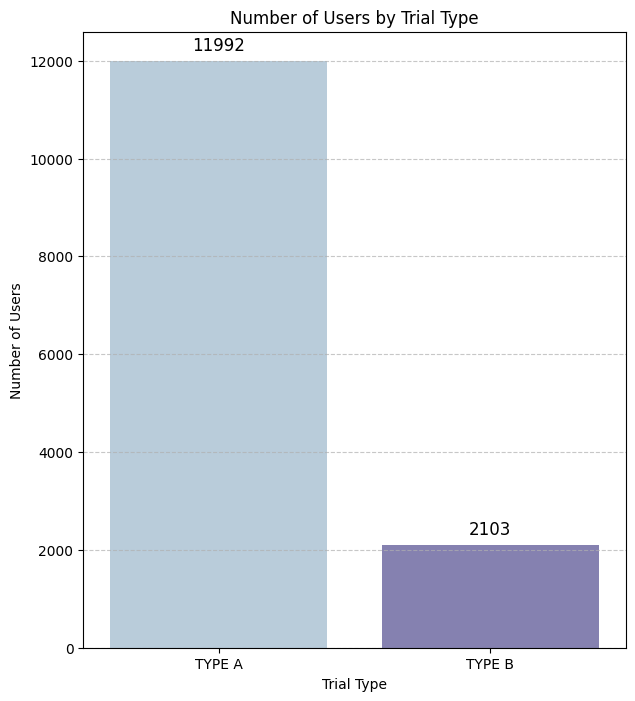

In [326]:
# 데이터 준비
trial_users_data = {
    "Type": ["TYPE A", "TYPE B"],
    "Number of Users": [total_trial_users_A, total_trial_users_B]
}

# DataFrame 생성
trial_users_df = pd.DataFrame(trial_users_data)

# 시각화
plt.figure(figsize=(7, 8))
ax = sns.barplot(data=trial_users_df, x="Type", y="Number of Users", palette= palette)

# 막대 위에 값 표시
for container in ax.containers:
    ax.bar_label(container, fmt="%d", label_type="edge", fontsize=12, padding=5)

# 그래프 설정
plt.xlabel("Trial Type")
plt.ylabel("Number of Users")
plt.title("Number of Users by Trial Type")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [327]:
# 2. 회원 가입 완료 회원의 무료 서비스 체험 후 첫 결제 완료(무료 서비스 체험 사용 기간 내)

# 2-1. 중복 결제 내역 제거한 첫 결제 완료 데이터에서 필요한 컬럼만 추출
complete_subscription_final = complete_subscription_df[
    ['user_id', 'complete_sub_time']
]

# 2-2. 무료 체험 유저와 첫 결제 완료 데이터 merge
free_trial_complete = complete_signup_trial.merge(complete_subscription_final, on='user_id', how='left')

# 2-3. 무료 체험 후 첫 결제를 완료한 유저 필터링

#(조건 : start_free_trial_time < complete_subscription_time) : row = 3147 -> 구독전환율
# 무료 체험 서비스 이용 시간이 먼저여야 하는 이유는 만약 첫 결제 완료 후에 무료 체험 레슨을 들었을 변수를 제외시키기 위해서

free_trial_complete_yes = free_trial_complete[
    free_trial_complete['start_free_trial_time'].notna() &  # 무료 체험 시작 시간이 존재하는 경우
    (free_trial_complete['start_free_trial_time'] < free_trial_complete['complete_sub_time']) &  # 무료 체험 후 첫 결제
    (free_trial_complete['client_event_time'] < free_trial_complete['start_free_trial_time'])  # 회원가입 시간이 무료 체험 시작보다 이전
]

# 2-4. 무료 체험 후 첫 결제 완료한 유저 수 및 전환율 계산
free_trial_complete_yes_users = free_trial_complete_yes['user_id'].nunique()
total_trial_users = complete_signup_trial['user_id'].nunique()  # 무료 체험 체험 기간동안 회원가입 후 무료 체험 전체 유저 수

free_trial_complete_yes_rate = (free_trial_complete_yes_users / total_trial_users) * 100

print(f'무료 체험 서비스 이용 후 첫 결제 완료 유저 수 : {free_trial_complete_yes_users}')
print(f'무료 체험 서비스 이용 후 첫 결제 완료 유저 비율 : {free_trial_complete_yes_rate:.2f}%')


무료 체험 서비스 이용 후 첫 결제 완료 유저 수 : 2997
무료 체험 서비스 이용 후 첫 결제 완료 유저 비율 : 21.26%


In [328]:
# Calculate number of users who completed first payment after free trial for each type
free_trial_complete_yes_type = free_trial_complete_yes.groupby("start_free_trial_type")["user_id"].nunique().reset_index()
free_trial_complete_yes_type.columns = ["Trial Type", "Number of Users"]

# Calculate total trial users for each type
total_trial_users_A = complete_signup_trial[complete_signup_trial["start_free_trial_type"] == "A"]["user_id"].nunique()
total_trial_users_B = complete_signup_trial[complete_signup_trial["start_free_trial_type"] == "B"]["user_id"].nunique()

# Calculate conversion rate for each type
free_trial_complete_yes_rate_A = (free_trial_complete_yes_type.loc[free_trial_complete_yes_type["Trial Type"] == "A", "Number of Users"].values[0] / total_trial_users_A) * 100
free_trial_complete_yes_rate_B = (free_trial_complete_yes_type.loc[free_trial_complete_yes_type["Trial Type"] == "B", "Number of Users"].values[0] / total_trial_users_B) * 100

# Print results
print(f'TYPE A - 무료 체험 서비스 이용 후 첫 결제 완료 유저 수: {free_trial_complete_yes_type.loc[free_trial_complete_yes_type["Trial Type"] == "A", "Number of Users"].values[0]}')
print(f'TYPE A - 무료 체험 서비스 이용 후 첫 결제 완료 유저 비율: {free_trial_complete_yes_rate_A:.2f}%')

print(f'TYPE B - 무료 체험 서비스 이용 후 첫 결제 완료 유저 수: {free_trial_complete_yes_type.loc[free_trial_complete_yes_type["Trial Type"] == "B", "Number of Users"].values[0]}')
print(f'TYPE B - 무료 체험 서비스 이용 후 첫 결제 완료 유저 비율: {free_trial_complete_yes_rate_B:.2f}%')


TYPE A - 무료 체험 서비스 이용 후 첫 결제 완료 유저 수: 2129
TYPE A - 무료 체험 서비스 이용 후 첫 결제 완료 유저 비율: 17.75%
TYPE B - 무료 체험 서비스 이용 후 첫 결제 완료 유저 수: 868
TYPE B - 무료 체험 서비스 이용 후 첫 결제 완료 유저 비율: 41.27%


,Trial Type,Number of Users
0,A,2129
1,B,868


C:\Users\rmagm\AppData\Local\Temp\ipykernel_10284\3099973154.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=free_trial_complete_yes_type, x="Trial Type", y="Number of Users", palette= palette)
C:\Users\rmagm\AppData\Local\Temp\ipykernel_10284\3099973154.py:11: UserWarning: The palette list has more values (11) than needed (2), which may not be intended.
  ax = sns.barplot(data=free_trial_complete_yes_type, x="Trial Type", y="Number of Users", palette= palette)


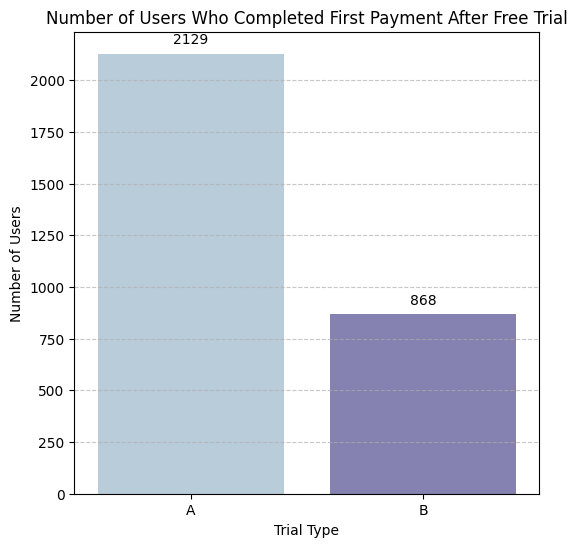

In [329]:
# 타입별 무료 체험 후 첫 결제 완료 유저 수 계산
free_trial_complete_yes_type = free_trial_complete_yes.groupby("start_free_trial_type")["user_id"].nunique().reset_index()

# 컬럼명 변경
free_trial_complete_yes_type.columns = ["Trial Type", "Number of Users"]

# 결과
display(free_trial_complete_yes_type)

plt.figure(figsize=(6, 6))
ax = sns.barplot(data=free_trial_complete_yes_type, x="Trial Type", y="Number of Users", palette= palette)

# 바 그래프 수치 추가
for container in ax.containers:
    ax.bar_label(container, fmt="%d", label_type="edge", fontsize=10, padding=5)

plt.xlabel("Trial Type")
plt.ylabel("Number of Users")
plt.title("Number of Users Who Completed First Payment After Free Trial")
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()


In [330]:
free_trial_complete_yes_type

,Trial Type,Number of Users
0,A,2129
1,B,868


###  TYPE 별 무료 서비스 체험 후 첫 결제까지 걸린 평균 결제 시간 

In [331]:
# 무료 체험 후 첫 결제 까지 걸린 시간(일 단위)
free_complete_yes = free_trial_complete_yes.copy()

free_complete_yes['day_to_conversion'] = (free_complete_yes['complete_sub_time'] - free_complete_yes['start_free_trial_time']).dt.total_seconds() / 86400

# 전체 평균 및 첫 결제까지 소요 시간 
free_complete_yes_avg = free_complete_yes['day_to_conversion'].mean()

# TYPE A와 TYPE B 소요 시간 평균 계산
free_complete_yes_type_avg = free_complete_yes.groupby('start_free_trial_type')['day_to_conversion'].mean()

free_complete_yes_type_avg_df = free_complete_yes_type_avg.reset_index()
free_complete_yes_type_avg_df.columns = ["Trial Type", "Avg Conversion Days"]

print(f"전체 평균 첫 결제 소요 시간: {free_complete_yes_avg:.2f}일")
print("\nType A와 Type B별 평균 첫 결제 소요 시간:")
print(free_complete_yes_type_avg_df.to_string(index=False, float_format="%.2f"))

전체 평균 첫 결제 소요 시간: 21.90일

Type A와 Type B별 평균 첫 결제 소요 시간:
Trial Type  Avg Conversion Days
         A                25.03
         B                14.21


C:\Users\rmagm\AppData\Local\Temp\ipykernel_10284\4216840546.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=free_complete_yes_type_avg_df, x="Trial Type", y="Avg Conversion Days", palette="Blues")


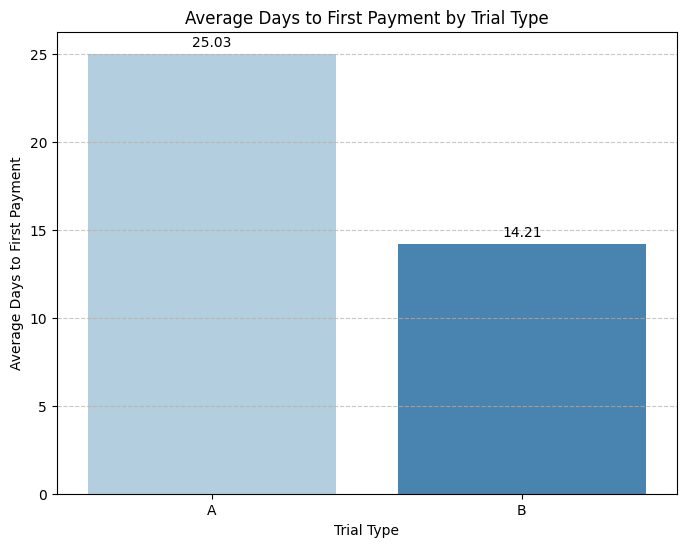

In [332]:
plt.figure(figsize=(8, 6))

# 바 그래프
ax = sns.barplot(data=free_complete_yes_type_avg_df, x="Trial Type", y="Avg Conversion Days", palette="Blues")

# 바 위에 수치 추가
for container in ax.containers:
    ax.bar_label(container, fmt="%.2f", label_type="edge", fontsize=10, padding=3)

plt.xlabel("Trial Type")
plt.ylabel("Average Days to First Payment")
plt.title("Average Days to First Payment by Trial Type")
plt.grid(axis='y', linestyle="--", alpha=0.7)
plt.show()

In [333]:
# Type A 첫 결제까지 가장 빠른 유저 TOP 5
print("=" * 60)  
print("\n Type A - 첫 결제까지 가장 빠른 유저 TOP 5")
print(free_complete_yes[free_complete_yes["start_free_trial_type"] == "A"]
      .nsmallest(5, "day_to_conversion")[["user_id", "day_to_conversion"]]
      .to_string(index=False, float_format="%.2f"))

# Type A 첫 결제까지 가장 오래 걸린 유저 TOP 5
print("=" * 60)  
print("\n Type A - 첫 결제까지 가장 오래 걸린 유저 TOP 5")
print(free_complete_yes[free_complete_yes["start_free_trial_type"] == "A"]
      .nlargest(5, "day_to_conversion")[["user_id", "day_to_conversion"]]
      .to_string(index=False, float_format="%.2f"))
print("=" * 60)


 Type A - 첫 결제까지 가장 빠른 유저 TOP 5
                         user_id  day_to_conversion
5132d6034a176d90984d37332879de8f               0.00
f119804879c79fef8cf2d9b234838d2b               0.00
64df20c898125353f437b65a485104b4               0.00
2bc7a3fa08e1eb7ee8b0ffd74b5cacd9               0.00
f046f930dec0224ebb91e499204b2e46               0.00

 Type A - 첫 결제까지 가장 오래 걸린 유저 TOP 5
                         user_id  day_to_conversion
783e01211e03edc828d55baf6e08a256             711.14
fa58177660c687803ee14ac44f3d5cae             662.17
7f51e642d2a5d1b2586cf4343b7a54d2             611.54
f6657eeff454e7ebe4570bc5f174bb1b             587.17
8664c2eb847f36c445caf1784bd9ae2e             564.94


In [334]:

# Type B 첫 결제까지 가장 빠른 유저 TOP 5
print("=" * 60) 
print("\n Type B - 첫 결제까지 가장 빠른 유저 TOP 5")
print(free_complete_yes[free_complete_yes["start_free_trial_type"] == "B"]
      .nsmallest(5, "day_to_conversion")[["user_id", "day_to_conversion"]]
      .to_string(index=False, float_format="%.2f"))

# Type B 첫 결제까지 가장 오래 걸린 유저 TOP 5
print("=" * 60)  
print("\n Type B - 첫 결제까지 가장 오래 걸린 유저 TOP 5")
print(free_complete_yes[free_complete_yes["start_free_trial_type"] == "B"]
      .nlargest(5, "day_to_conversion")[["user_id", "day_to_conversion"]]
      .to_string(index=False, float_format="%.2f"))
print("=" * 60) 


 Type B - 첫 결제까지 가장 빠른 유저 TOP 5
                         user_id  day_to_conversion
9611d4cacc12eca45b2c56e76d99a447               0.00
3e0f99f28e28196e4a267d19c335f444               0.00
6125c2ddf601a13532204ccd2f6e587d               0.01
5288c36731e73a1941699d37f3a69a27               0.01
3c701c93fb7895d4316698c1bc6117c4               0.01

 Type B - 첫 결제까지 가장 오래 걸린 유저 TOP 5
                         user_id  day_to_conversion
d162f934feab36bd13e9da679fd3e4ad             296.70
433cc7db3d9f741cf9a1108d8f78e777             269.82
6c65d646cdbb1bea21fcbc37173404f4             258.61
7079785832f489a60be4583d4858a88d             244.92
2a5784ad88b5e6ca7d692da3c39f597d             232.89


In [335]:
# # TYPE B의 플랜별 첫 결제까지 결린 시간

# # Type B의 'start_free_trial_plan_type' 기준으로 첫 결제까지 걸린 시간 분석
# b_plan_types = free_complete_yes[free_complete_yes["start_free_trial_type"] == "B"]["start_free_trial_plan_type"].unique()

# for plan_type in b_plan_types:
#     plan_df = free_complete_yes[(free_complete_yes["start_free_trial_type"] == "B") &
#                                 (free_complete_yes["start_free_trial_plan_type"] == plan_type)]
    
#     # 평균 첫 결제 소요 시간
#     avg_days_to_conversion = plan_df["day_to_conversion"].mean()
    
#     print(f"\n Type B - {plan_type} - 평균 첫 결제 소요 시간: {avg_days_to_conversion:.2f}일")
    
#     # 가장 빠른 유저 TOP 5
#     print(f"\n Type B - {plan_type} - 첫 결제까지 가장 빠른 유저 TOP 5")
#     print(plan_df.nsmallest(5, "day_to_conversion")[["user_id", "day_to_conversion"]]
#           .to_string(index=False, float_format="%.2f"))

#     # 가장 오래 걸린 유저 TOP 5
#     print(f"\n Type B - {plan_type} - 첫 결제까지 가장 오래 걸린 유저 TOP 5")
#     print(plan_df.nlargest(10, "day_to_conversion")[["user_id", "day_to_conversion"]]
#           .to_string(index=False, float_format="%.2f"))
    
#     print("=" * 70)


In [336]:
long_conversion_users_B = free_complete_yes[
    (free_complete_yes["start_free_trial_type"] == "B") & 
    (free_complete_yes["day_to_conversion"] >= 50)
]
long_conversion_users_B['user_id'].nunique()

40

C:\Users\rmagm\AppData\Local\Temp\ipykernel_10284\3747629084.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=free_complete_yes["start_free_trial_type"], y=free_complete_yes["day_to_conversion"], palette = palette)
C:\Users\rmagm\AppData\Local\Temp\ipykernel_10284\3747629084.py:1: UserWarning: The palette list has more values (11) than needed (2), which may not be intended.
  sns.boxplot(x=free_complete_yes["start_free_trial_type"], y=free_complete_yes["day_to_conversion"], palette = palette)


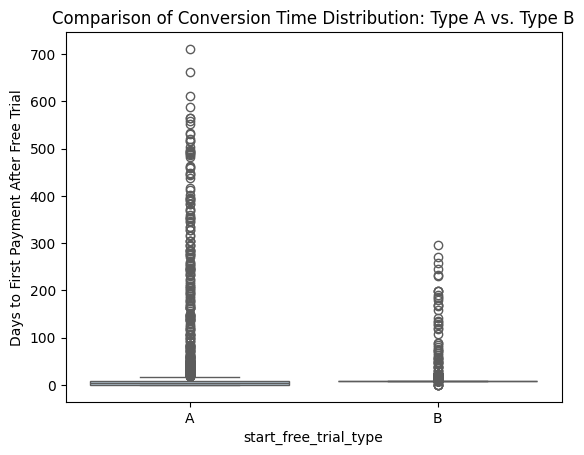

In [337]:
sns.boxplot(x=free_complete_yes["start_free_trial_type"], y=free_complete_yes["day_to_conversion"], palette = palette)
plt.ylabel("Days to First Payment After Free Trial")
plt.title("Comparison of Conversion Time Distribution: Type A vs. Type B") # 결제 소요 시간 비교
plt.show()

- 여기서 이상치는 무료 체험 서비스의 영향을 받는 기간을 지나 첫 결제를 진행한 유저들을 칭함

1. TYPE A    

- Type A는 전환 시간이 훨씬 길고 이상치가 많음    

- Type A는 700일 가까이 걸린 유저도 존재 → 일부 유저는 무료 체험 후 매우 오랜 시간이 지난 후 결제(무료 체험이 첫 결제에 미치는 영향이 극히 적을 것으로 예상 할 수 있음)    

- 박스가 매우 짧고 위쪽으로 이상치가 많음 → 대부분의 유저는 빠르게 전환하지만, 일부는 매우 늦게 결제    

2. TYPE B    
- Type B는 상대적으로 빠르게 전환됨     

- Type B는 최대 300일 정도 이상치가 존재하지만, Type A보다 확연히 적음       
 
- 박스가 더 길고 이상치 분포가 상대적으로 적음 → Type B는 좀 더 균일한 전환 패턴을 보임(그래도 장시간 이후에 첫 결제라면 무료 체험의 영향력은 작다고 판단)


### 무료 서비스 체험의 영향으로 첫 결제까지 이어진 유저 재지정

- TYPE A (영구 무료 체험)    

    - 무료 체험이 영구적이기 때문에, 사용자는 즉시 결제할 필요가 없음.    

    - 하지만 무료 체험 서비스가 일정 기간 동안 영향을 주어 결제로 이어지는 시점이 존재할 가능성이 있음.    

    - 무료 체험의 "잔존 효과" 반영    
        - 무료 체험이 끝나지 않더라도, 무료 체험의 영향으로 일정 기간 내 결제를 유도할 가능성이 있음.

In [338]:
# 특정 기간 내 첫 결제한 유저 수를 계산하는 함수 (누적 아님)
def count_conversions_in_period(conversion_data, start_day, end_day=None):
    """
    특정 시작일과 종료일 사이에 첫 결제를 완료한 유저 수를 계산하는 함수.
    - end_day가 None이면 start_day 이후(first conversion > start_day) 모든 유저를 포함
    """
    if end_day is None:  # 90일 이후 유저 수 계산
        return (conversion_data > start_day).sum()
    return ((conversion_data > start_day) & (conversion_data <= end_day)).sum()

# 전환율 분석 기간 설정 (7일, 15일, 30일, 60일, 90일, 90일 이후)
conversion_periods = [(0, 7), (7, 15), (15, 30), (30, 60), (60, 90), (90, None)]  # 90일 초과 추가

# TYPE A와 TYPE B 유저 데이터 분리
type_A_conversion = free_complete_yes[free_complete_yes["start_free_trial_type"] == "A"]["day_to_conversion"]
type_B_conversion = free_complete_yes[free_complete_yes["start_free_trial_type"] == "B"]["day_to_conversion"]

# 각 기간별 첫 결제 유저 수 계산
conversion_counts_A = {f"{start} - {end} days" if end else f"{start} + days": count_conversions_in_period(type_A_conversion, start, end) 
                       for start, end in conversion_periods}

conversion_counts_B = {f"{start} - {end} days" if end else f"{start} + days": count_conversions_in_period(type_B_conversion, start, end) 
                       for start, end in conversion_periods}

# 데이터프레임 생성
conversion_df = pd.DataFrame({
    "무료 체험 시작 후 첫 결제까지 소요 시간": list(conversion_counts_A.keys()),
    "TYPE A ": list(conversion_counts_A.values()),
    "TYPE B ": list(conversion_counts_B.values())
})

conversion_df

,무료 체험 시작 후 첫 결제까지 소요 시간,TYPE A,TYPE B
0,0 - 7 days,1223,5
1,7 - 15 days,599,781
2,15 - 30 days,78,32
3,30 - 60 days,66,15
4,60 - 90 days,20,10
5,90 + days,143,25


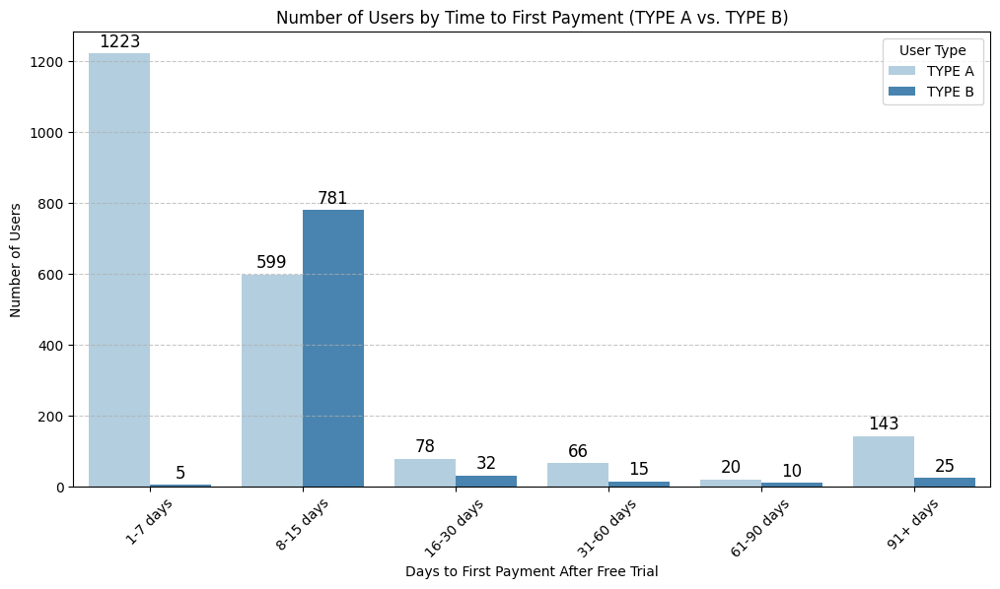

In [339]:
# 각 타입별 무료 체험 시작 후 첫 결제까지 소요 시간별 유저 수"

# Rename columns for visualization
conversion_df.rename(columns={
    "무료 체험 시작 후 첫 결제까지 소요 시간": "Days to First Payment",
    "TYPE A 30일 이내 첫 결제 유저 수": "TYPE A Conversions",
    "TYPE B 30일 이내 첫 결제 유저 수": "TYPE B Conversions"
}, inplace=True)

# Convert DataFrame to long format for seaborn
conversion_melted_df = conversion_df.melt(id_vars=["Days to First Payment"],
                                          var_name="User Type", value_name="Number of Users")

# 시각화

new_labels = ["1-7 days", "8-15 days", "16-30 days", "31-60 days", "61-90 days", "91+ days"]

plt.figure(figsize=(12, 6))
ax = sns.barplot(data=conversion_melted_df, x="Days to First Payment",
            y="Number of Users", hue="User Type", palette="Blues")

for container in ax.containers:
    ax.bar_label(container, fmt="%d", label_type="edge", fontsize=12, padding=2)


plt.xlabel("Days to First Payment After Free Trial")
plt.ylabel("Number of Users")
plt.title("Number of Users by Time to First Payment (TYPE A vs. TYPE B)")
plt.xticks(ticks=range(len(new_labels)), labels=new_labels, rotation=45)
plt.legend(title="User Type")
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show plot
plt.show()


- TYPE A

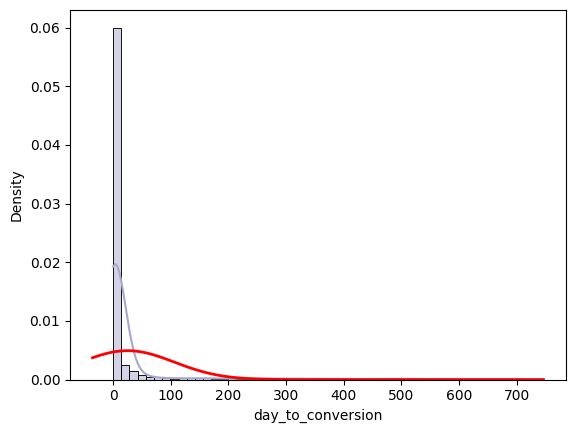

In [340]:
import scipy.stats as stats

type_A_conversion_times = free_complete_yes[free_complete_yes["start_free_trial_type"] == "A"]["day_to_conversion"]

sns.histplot(type_A_conversion_times, bins=50, kde=True, color= palette[5], stat="density", label="실제 데이터")
mu, std = np.mean(type_A_conversion_times), np.std(type_A_conversion_times)
xmin, xmax = plt.xlim()  # xmin, xmax 값 설정
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, mu, std)
plt.plot(x, p, 'r', linewidth=2, label="정규 분포 곡선")

- 0 ~ 7일 이내에 결제한 유저가 압도적으로 많아 보임
- KDE선도 0 ~7일 이내에 가장 높은 피크를 가짐 -> 무료 체험 후 즉각적인 전환 효과
- 대부분의 유저는 무료 체험 후 매우 빠르게 결제한 것으로 보임

- 우측으로 긴 꼬리 : 일부 매우 오랜 시간이 걸려 결제한 유저가 존재
    - 50일, 100일 이상 후에 결제한 유저들
    - 최대 700일

- 정규 분포곡선
    - 정규 분포 곡선(정규 분포 가정)과 KDE(실제 데이터 분포)가 다름

- 대부분의 유저가 무료 체험 후 빠르게 첫 결제로 이루어졌음을 알 수 있음 -> 무료 체험 효과
- 일부 유저 50일 이상 걸려서 결제 -> 이들은 무료 체험의 직접적인 효과보다는 다른 요인에 의해 결제 가능성 높음

In [341]:
# # TYPE A를 이용한 유저

# # 90% 기준(상위 10% 제외)으로 결제 소요 시간 계산 (Type A만)
# q90_value_A = free_complete_yes[free_complete_yes["start_free_trial_type"] == "A"]["day_to_conversion"].quantile(0.90)

# # Type A에서 90% 이하 유저 데이터 (상위 10% 제외) -> 얘네를 무료 체험 이후 첫 결제로 넘어간 type A 유저로 : 전환율 계산시(분모)  
# free_complete_yes_90_A = free_complete_yes[
#     (free_complete_yes["start_free_trial_type"] == "A") & 
#     (free_complete_yes["day_to_conversion"] <= q90_value_A)
# ]

# # Type A에서 90% 이상 유저 데이터 (상위 10%)
# free_complete_yes_10_A = free_complete_yes[
#     (free_complete_yes["start_free_trial_type"] == "A") & 
#     (free_complete_yes["day_to_conversion"] > q90_value_A)
# ]

# # 유저 수 계산
# num_conversion_users_90_A = free_complete_yes_90_A["user_id"].nunique()
# num_conversion_users_10_A = free_complete_yes_10_A["user_id"].nunique()

# # 결과 출력
# print(f"Type A - 90% 이하 유저 수: {num_conversion_users_90_A}명")
# print(f"Type A - 상위 10% 유저 수: {num_conversion_users_10_A}명")

In [342]:
# TYPE A를 이용한 유저

# 30일 기준으로 결제 소요 시간 필터링 (Type A만)
threshold_A = 61

# Type A에서 30일 이하 유저 데이터 (빠르게 결제한 유저)
free_complete_yes_30_A = free_complete_yes[
    (free_complete_yes["start_free_trial_type"] == "A") & 
    (free_complete_yes["day_to_conversion"] <= threshold_A)
]

# Type A에서 30일 초과 유저 데이터 (늦게 결제한 유저)
free_complete_yes_above_30_A = free_complete_yes[
    (free_complete_yes["start_free_trial_type"] == "A") & 
    (free_complete_yes["day_to_conversion"] > threshold_A)
]

# 유저 수 계산
num_conversion_users_30_A = free_complete_yes_30_A["user_id"].nunique()
num_conversion_users_above_30_A = free_complete_yes_above_30_A["user_id"].nunique()

# 결과 출력
print(f"Type A - 30일 이하 유저 수: {num_conversion_users_30_A}명")
print(f"Type A - 30일 초과 유저 수: {num_conversion_users_above_30_A}명")

Type A - 30일 이하 유저 수: 1968명
Type A - 30일 초과 유저 수: 161명


In [343]:
# TYPE A의 30일 이하 유저 결제 시간 기초 통계량(무료 체험 후 30일 이내 첫 결제)
print('TYPE A 결제까지 61일 이하 결제 시간 기초 통계')
print(free_complete_yes_30_A["day_to_conversion"].describe())
print('-' * 60)
# TYPE A의 30일 초과 유저 결제 시간 기초 통계량(무료 체험 후 30일 초과 첫 결제)
print('TYPE A 결제까지 61일 초과 결제 시간 기초 통계')
print(free_complete_yes_above_30_A["day_to_conversion"].describe())

TYPE A 결제까지 61일 이하 결제 시간 기초 통계
count    1968.000000
mean        5.383585
std         8.878704
min         0.000173
25%         0.019196
50%         2.370563
75%         7.003350
max        60.122673
Name: day_to_conversion, dtype: float64
------------------------------------------------------------
TYPE A 결제까지 61일 초과 결제 시간 기초 통계
count    161.000000
mean     265.236288
std      152.658210
min       62.724213
25%      139.021306
50%      241.970616
75%      369.215111
max      711.135931
Name: day_to_conversion, dtype: float64


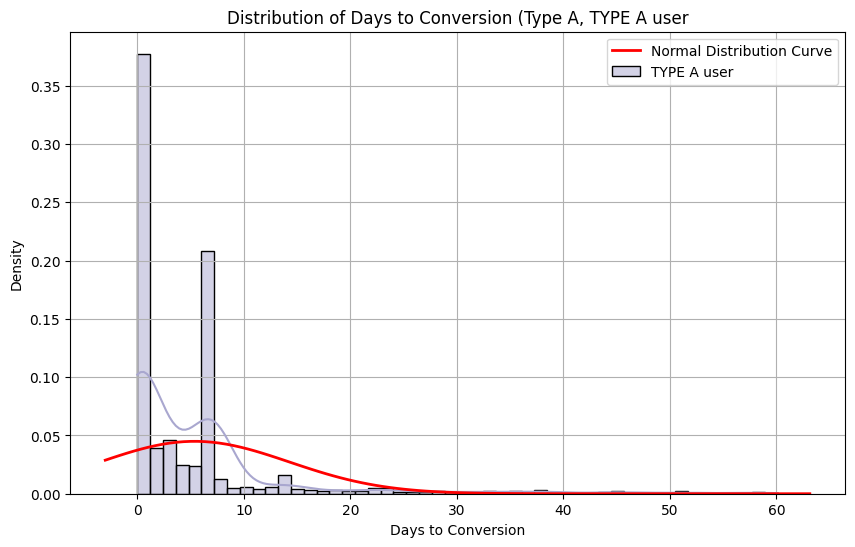

In [344]:
# 30일 이내 첫 결제 소요 시간 데이터 추출
type_A_conversion_days_30 = free_complete_yes_30_A["day_to_conversion"]

# 히스토그램 & KDE 시각화
plt.figure(figsize=(10, 6))
sns.histplot(type_A_conversion_days_30, bins=50, kde=True, color=palette[5], stat="density", label="TYPE A user") # a타입

# 정규 분포 곡선 추가
mu_90, std_90 = np.mean(type_A_conversion_days_30), np.std(type_A_conversion_days_30)
xmin, xmax = plt.xlim()  # x축 범위 설정
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, mu_90, std_90)
plt.plot(x, p, 'r', linewidth=2, label="Normal Distribution Curve") # label = "정규분포곡선"

# 그래프 설정
plt.xlabel("Days to Conversion")
plt.ylabel("Density")
plt.title("Distribution of Days to Conversion (Type A, TYPE A user")
plt.legend()
plt.grid()

# 그래프 출력
plt.show()

<90% 이하 결제 시간 유저들>
- 무료 체험 후 90% 이내 유저(약 53일 이하 결제)가 실제 영향을 받은 그룹
- 평균 6일만에 결제 -> 무료 체험이 유저들에게 첫 결제로 이어지게 하는데 효과가 있었다.
- 표준 편차(약9일) 유저가 평균(6.04일)을 기준으로 ± 9일 범위 안에 많은 유저가 존재한다는 것 -> 전환율 분석 가능
- 즉 무료 체험 후 대부분이 유저가 6 ± 9일(즉, 0일~15일 사이)에 결제한 것을 알 수 있음
- 표준편차가 상대적으로 크지 않으며, 분포 또한 급격히 퍼져 있지 않음
- Q3가 7.01일로 유저가 7일 이내 결제했다는 것 -> 표준편차와 잘 맞아 떨어짐

<상위 10% 결제 시간 유저>
- 표준편차 151일(지나치게 큼)로 평균 229일 ± 151일 범위로 너무 넓게 퍼져 있음 -> 변동성이 크다
- 결제까지 걸린 시간이 일정하지 않고 매우 불규칙함
- 무료 체험 서비스의 직접적인 영향을 받았다고 보기 어려움

-------------------------------------------------------------------------------------------------------------------------
- TYPE B

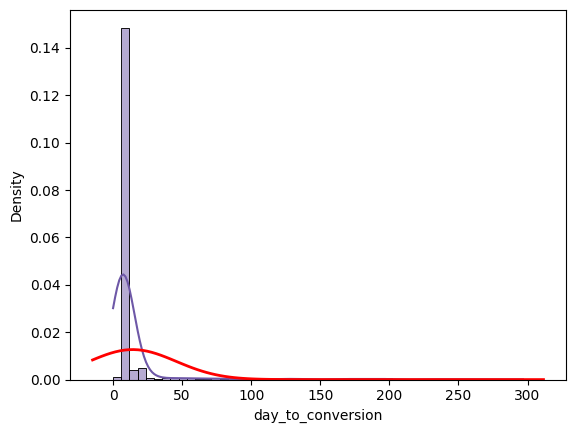

In [345]:
import scipy.stats as stats

type_B_conversion_times = free_complete_yes[free_complete_yes["start_free_trial_type"] == "B"]["day_to_conversion"]

sns.histplot(type_B_conversion_times, bins=50, kde=True, color= palette[3], stat="density", label="실제 데이터")
mu, std = np.mean(type_B_conversion_times), np.std(type_B_conversion_times)
xmin, xmax = plt.xlim()  # xmin, xmax 값 설정
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, mu, std)
plt.plot(x, p, 'r', linewidth=2, label="정규 분포 곡선")


- 빨간색 곡선(정규 분포 곡선) : 동일한 평균과 표준편차를 가진 정규 분포
    - 정규 분포 곡선과 실제 데이터의 분포가 크게 다름
    - 정규 분포 x -> 우측으로 치우져 있음
    - 평균 근처에 데이터가 분포해야하지만, 실제 데이터는 0 ~ 7일에 몰려 있다 이후 줄어드는 형태
    - 평균보다는 중앙값이 신뢰도 높을 수도?? .... 몰라...(상위 10% 없애면 뭔가 바뀌겠지)

- 0~7일 이내에 결제한 유저가 절대적으로 많음

- 가장 높은 피크 부분 : 대부분 유저가 무료 체험 후(7일 후) 결제 이루어지게 유지함 

- 우측으로 긴 꼬리 : 일부 매우 오랜 시간 걸려 결제
    - 일부 유저들 50일 이상 후에 결제함
    - 100일 이후도 소수 존재

In [346]:
# TYPE B의 기초 통계량
print(free_complete_yes[free_complete_yes["start_free_trial_type"] == "B"]["day_to_conversion"].describe())

count    868.000000
mean      14.207244
std       31.523104
min        0.003013
25%        7.001104
50%        7.002172
75%        7.003219
max      296.702592
Name: day_to_conversion, dtype: float64


- 표준 편차 35일 -> 결제 소요 시간이 평균적으로 ±35일 정도 차이가 남
- 평균 15.44일보다 표준편차 35일이 훨씬 크기 때문에 비대칭 분포 가능성 높음
- 75%의 유저가 7일 이내에 결제를 했지만 일부 유저는 306일 후 결제 -> 극단적으로 결제 시간이 긴 유저의 존재로 인해 표준 편차 증가
- TYPE B의 경우 플랜을 구독하게 되면 7일 무료 체험이 끝난 후 구독을 취소하지 않는 한 첫 결제가 이루어짐
- 그렇기 때문에 대부분 무료 체험 서비스 시작부터 첫 결제가 이루어지기까지 7일이 소요됨

In [347]:
# # TYPE B를 이용한 유저

# # 90% 기준(상위 10% 제외)으로 결제 소요 시간 계산 (Type A만)
# q90_value_B = free_complete_yes[free_complete_yes["start_free_trial_type"] == "B"]["day_to_conversion"].quantile(0.90)

# # Type A에서 90% 이하 유저 데이터 (상위 10% 제외) -> 얘네를 무료 체험 이후 첫 결제로 넘어간 type B 유저로 : 전환율 계산시(분모)  
# free_complete_yes_90_B = free_complete_yes[
#     (free_complete_yes["start_free_trial_type"] == "B") & 
#     (free_complete_yes["day_to_conversion"] <= q90_value_B)
# ]

# # Type A에서 90% 이상 유저 데이터 (상위 10%)
# free_complete_yes_10_B = free_complete_yes[
#     (free_complete_yes["start_free_trial_type"] == "B") & 
#     (free_complete_yes["day_to_conversion"] > q90_value_B)
# ]

# # 유저 수 계산
# num_conversion_users_90_B = free_complete_yes_90_B["user_id"].nunique()
# num_conversion_users_10_B = free_complete_yes_10_B["user_id"].nunique()

# # 결과 출력
# print(f"Type B - 90% 이하 유저 수: {num_conversion_users_90_B}명")
# print(f"Type B - 상위 10% 유저 수: {num_conversion_users_10_B}명")

In [348]:
# TYPE B를 이용한 유저

# 30일 기준으로 결제 소요 시간 필터링 (Type B만)
threshold_B = 60

# Type A에서 30일 이하 유저 데이터 (빠르게 결제한 유저)
free_complete_yes_30_B = free_complete_yes[
    (free_complete_yes["start_free_trial_type"] == "B") & 
    (free_complete_yes["day_to_conversion"] <= threshold_B)
]

# Type A에서 30일 초과 유저 데이터 (늦게 결제한 유저)
free_complete_yes_above_30_B = free_complete_yes[
    (free_complete_yes["start_free_trial_type"] == "B") & 
    (free_complete_yes["day_to_conversion"] > threshold_B)
]

# 유저 수 계산
num_conversion_users_30_B = free_complete_yes_30_B["user_id"].nunique()
num_conversion_users_above_30_B = free_complete_yes_above_30_B["user_id"].nunique()

# 결과 출력
print(f"Type B - 30일 이하 유저 수: {num_conversion_users_30_B}명")
print(f"Type B - 30일 초과 유저 수: {num_conversion_users_above_30_B}명")

Type B - 30일 이하 유저 수: 833명
Type B - 30일 초과 유저 수: 35명


In [349]:
# TYPE B의 30일 이하 유저 결제 시간 기초 통계량(무료 체험 후 30일 이내 첫 결제)
print('TYPE B 결제까지 61일 이하 결제 시간 기초 통계')
print(free_complete_yes_30_B["day_to_conversion"].describe())
print('-' * 60)
# TYPE B의 30일 초과 유저 결제 시간 기초 통계량(무료 체험 후 30일 초과 첫 결제)
print('TYPE A 결제까지 61일 초과 결제 시간 기초 통계')
print(free_complete_yes_above_30_B["day_to_conversion"].describe())

TYPE B 결제까지 61일 이하 결제 시간 기초 통계
count    833.000000
mean       8.437338
std        6.075141
min        0.003013
25%        7.001066
50%        7.002097
75%        7.003108
max       59.450705
Name: day_to_conversion, dtype: float64
------------------------------------------------------------
TYPE A 결제까지 61일 초과 결제 시간 기초 통계
count     35.000000
mean     151.531001
std       64.871076
min       62.337262
25%       88.885866
50%      141.091300
75%      193.643672
max      296.702592
Name: day_to_conversion, dtype: float64


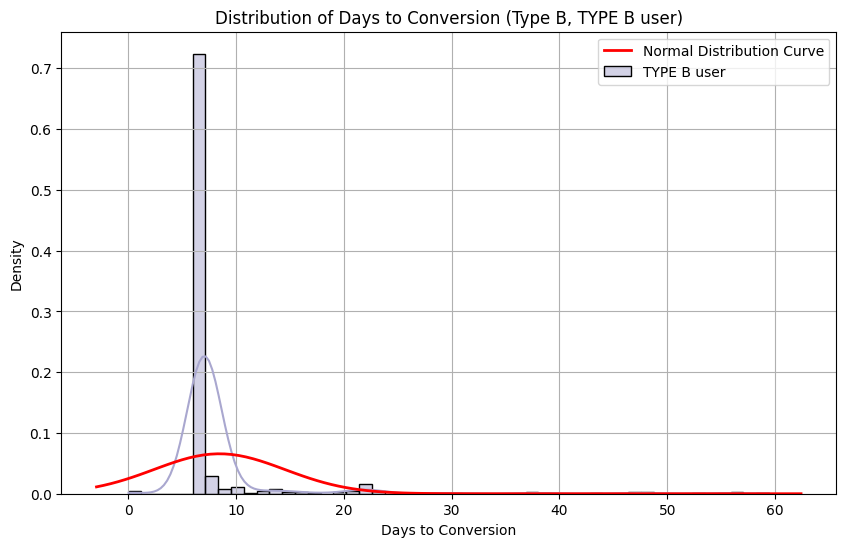

In [350]:
# 90% 이하 유저의 결제 소요 시간 데이터 추출
type_B_conversion_days_30 = free_complete_yes_30_B["day_to_conversion"]

# 히스토그램 & KDE 시각화
plt.figure(figsize=(10, 6))
sns.histplot(type_B_conversion_days_30, bins=50, kde=True, color=palette[5], stat="density", label="TYPE B user") # B 타입

# 정규 분포 곡선 추가
mu_90, std_90 = np.mean(type_B_conversion_days_30), np.std(type_B_conversion_days_30)
xmin, xmax = plt.xlim()  # x축 범위 설정
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, mu_90, std_90)
plt.plot(x, p, 'r', linewidth=2, label="Normal Distribution Curve") # label = "정규분포곡선"

# 그래프 설정
plt.xlabel("Days to Conversion")
plt.ylabel("Density")
plt.title("Distribution of Days to Conversion (Type B, TYPE B user)")
plt.legend()
plt.grid()

# 그래프 출력
plt.show()

In [351]:
# 4. TYPE별 무료체험에서 첫 결제 전환율 -> 분자 : 각 타입별 무료 체험 서비스 이용 후 첫 결제를 진행한 유저 수
#                                        분모 : 각 타입별 기간 동안 무료 체험 서비스를 이용한 유저 수 

# 4-1. 무료 체험 서비스 이용 후 TYPE A의 첫 결제 전환율

# A 타입 무료 체험 기간 동안 무료체험 전체 유저 수
# total_trial_complete_users_A = signup_free_trial[
#                                                (signup_free_trial['start_free_trial_time'] >= A_start) &
#                                                       (signup_free_trial['start_free_trial_time'] <= A_end)]

# total_A_users_count = total_trial_complete_users_A['user_id'].nunique()

# A 타입 무료 체험 후 첫 결제 완료 유저
free_trial_complete_A = free_complete_yes_30_A[free_complete_yes_30_A['start_free_trial_type'] == 'A']

A_users_count =  free_trial_complete_A['user_id'].nunique()

A_conversation_rate = (A_users_count / total_trial_users_A) * 100



# 4-2. 무료 체험 서비스 이용 후 TYPE B의 첫 결제 전환율 

# # B 타입 무료 체험 기간
# B_start_date = free_trial_complete_yes[free_trial_complete_yes['start_free_trial_type'] == 'B']['start_free_trial_time'].min()
# B_end_date = free_trial_complete_yes[free_trial_complete_yes['start_free_trial_type'] == 'B']['start_free_trial_time'].max()



# # B 타입 무료 체험 기간 동안 무료체험 전체 유저 수
# total_trial_complete_users_B = signup_free_trial[
#                                                (signup_free_trial['start_free_trial_time'] >= B_start) & 
#                                                (signup_free_trial['start_free_trial_time'] <= B_end)]


# total_B_users_count = total_trial_complete_users_B['user_id'].nunique()

# B 타입 무료 체험 후 첫 결제 완료 유저
free_trial_complete_B = free_complete_yes_30_B[free_complete_yes_30_B['start_free_trial_type'] == 'B']


B_users_count =  free_trial_complete_B['user_id'].nunique()

B_conversation_rate = (B_users_count /total_trial_users_B) * 100

print(f'TYPE A 기간 무료체험 전체 유저 수 : {total_trial_users_A}')
print(f'TYPE A의 첫 결제 전환 유저 수 : {A_users_count}')
print(f'TYPE A의 첫 결제 전환율 : {A_conversation_rate:.2f}%')

print('-' * 60)

print(f'TYPE B 기간 무료체험 전체 유저 수 : {total_trial_users_B}')
print(f'TYPE B의 첫 결제 전환 유저 수 : {B_users_count}')
print(f'TYPE B의 첫 결제 전환율 : {B_conversation_rate:.2f}%')

TYPE A 기간 무료체험 전체 유저 수 : 11992
TYPE A의 첫 결제 전환 유저 수 : 1968
TYPE A의 첫 결제 전환율 : 16.41%
------------------------------------------------------------
TYPE B 기간 무료체험 전체 유저 수 : 2103
TYPE B의 첫 결제 전환 유저 수 : 833
TYPE B의 첫 결제 전환율 : 39.61%


In [352]:
# # TYPE B의 플랜별 첫 결제 전환 유저 수와 전환율 -> 플랜 상관없이 무료체험 7일 후 첫 결제로 넘어가는 거라 의미가 있는지 모르겠다. 

# # B 타입 전체 무료 체험 유저 수 (각 플랜별) 

# # B 타입 무료 체험 기간 동안 무료체험 전체 유저 수
# total_B_users_count = total_trial_complete_users_B['user_id'].nunique()

# # PLAN 1개월  
# total_users_1m = signup_free_trial[
#     (signup_free_trial["start_free_trial_type"] == "B") &
#     (signup_free_trial["start_free_trial_plan_type"] == "1개월 플랜") &
#     (signup_free_trial["start_free_trial_time"] >= B_start_date) &
#     (signup_free_trial["start_free_trial_time"] <= B_end_date)
# ]["user_id"].nunique()


# # PLAN 12개월
# total_users_12m = signup_free_trial[
#     (signup_free_trial["start_free_trial_type"] == "B") &
#     (signup_free_trial["start_free_trial_plan_type"] == "12개월 플랜") &
#     (signup_free_trial["start_free_trial_time"] >= B_start_date) &
#     (signup_free_trial["start_free_trial_time"] <= B_end_date)
# ]["user_id"].nunique()

# # B 타입 무료 체험 후 첫 결제 완료 유저 수 (각 플랜별)

# # PLAN 1개월 무료 체험 후 첫 결제 완료 유저 수
# converted_users_1m = free_complete_yes_30_B[
#     (free_complete_yes_30_B["start_free_trial_type"] == "B") &
#     (free_complete_yes_30_B["start_free_trial_plan_type"] == "1개월 플랜")]["user_id"].nunique()

# # PLAN 12개월 무료 체험 후 첫 결제 완료 유저 수 
# converted_users_12m = free_complete_yes_30_B[
#     (free_complete_yes_30_B["start_free_trial_type"] == "B") &
#     (free_complete_yes_30_B["start_free_trial_plan_type"] == "12개월 플랜")]["user_id"].nunique()

# # 전환율 계산
# conversion_rate_1m = (converted_users_1m / total_B_users_count) * 100
# conversion_rate_12m = (converted_users_12m / total_B_users_count) * 100

# # 결과 출력
# print("<TYPE B의 무료 체험 기간 동안 PLAN별 첫 결제 완료한 유저 분석>")

# print(f'TYPE B 기간 무료체험 전체 유저 수 : {total_trial_users_B}')

# print(f"\n TYPE B (1개월 플랜)")
# print(f" - 무료 체험 TYPE B의 1개월 플랜 유저 수: {total_users_1m}")
# print(f" - TYPE B의 1개월 플랜 첫 결제 완료 유저 수: {converted_users_1m}")
# print(f" - TYPE B의 1개월 플랜 첫 결제 전환율: {conversion_rate_1m:.2f}%")

# print("=" * 60)

# print(f"\n TYPE B (12개월 플랜)")
# print(f" - TYPE B의 12개월 플랜 무료 체험 유저 수: {total_users_12m}")
# print(f" - TYPE B의 12개월 플랜 첫 결제 완료 유저 수: {converted_users_12m}")
# print(f" - TYPE B의 12개월 플랜 첫 결제 전환율: {conversion_rate_12m:.2f}%")


In [353]:
# <루팡>
# 3. 무료 체험 후 첫 결제를 하지 않은 유저 필터링 

# 3-1. 무료 체험 후 첫 결제를 하지 않은 유저 필터링
free_trial_complete_no = free_trial_complete[
    free_trial_complete['start_free_trial_time'].notna() &  # 무료 체험을 한 유저
    free_trial_complete['complete_sub_time'].isna()  # 첫 결제 기록이 없는 유저
]

# 3-3.무료 체험 후 첫 결제를 하지 않은 유저 수
free_trial_complete_no_users = free_trial_complete_no['user_id'].nunique()

# 3-4.무료 체험 후 첫 결제를 하지 않은 유저 비율 계산
free_trial_complete_no_rate = (free_trial_complete_no_users / total_trial_users) * 100

print(f'무료 체험 후 첫 결제를 하지 않은 유저 수 : {free_trial_complete_no_users}')
print(f'무료 체험 후 첫 결제를 하지 않은 유저 비율 : {free_trial_complete_no_rate:.2f}%')


무료 체험 후 첫 결제를 하지 않은 유저 수 : 11036
무료 체험 후 첫 결제를 하지 않은 유저 비율 : 78.30%


In [354]:
# 위에서 무료 체험 서비스 이용 후 첫 결제까지 30일 초과한 유저들

# 4-1. free_complete_yes_10_B + free_complete_yes_10_A
free_trial_complete_long = pd.concat([free_complete_yes_30_A, free_complete_yes_30_B]).drop_duplicates()

# 4-2.무료 체험 후 첫 결제까지 오래 걸린 유저 수
free_trial_complete_long_users = free_trial_complete_long['user_id'].nunique()

# 4-3.무료 체험 후 첫 결제까지 오래 걸린 유저 비율 계산
free_trial_complete_long_rate = (free_trial_complete_long_users / total_trial_users) * 100

print(f'무료 체험 후 첫 결제까지 오래 걸린 유저 수 : {free_trial_complete_long_users}')
print(f'무료 체험 후 첫 결제까지 오래 걸린 유저 비율 : {free_trial_complete_long_rate:.2f}%')

무료 체험 후 첫 결제까지 오래 걸린 유저 수 : 2801
무료 체험 후 첫 결제까지 오래 걸린 유저 비율 : 19.87%


In [254]:
# 5. 회원 가입 후 첫 결제가 무료 체험보다 먼저 발생한 유저

# free_trial_complete(첫 결제제는 무료 체험 + 첫 결제 데이터를 단순히 merge 한 후 무료체험시작 시간과 첫 결제 완료 시간 순서를 고려하지 않은 merge
# free_trial_yes는 free_trial_complete 

# 5-1. 무료 체험을 한 유저 중, 첫 결제 여부가 확인된 유저 (결제한 유저 + 결제하지 않은 유저)
classified_users = pd.concat([free_trial_complete_yes[['user_id']], free_trial_complete_no[['user_id']]])

# 5-2. 무료 체험을 한 전체 유저에서, 첫 결제 여부가 확인된 유저를 제외
unclassified_users_df = free_trial_complete.merge(classified_users, on='user_id', how='left', indicator=True)

# 5-3. 어디에도 속하지 않은 유저 찾기 (_merge 값이 'left_only'인 유저)
unclassified_users_df = unclassified_users_df[unclassified_users_df['_merge'] == 'left_only'].drop(columns=['_merge'])
unclassified_users_df1 = unclassified_users_df['user_id'].nunique()
# 5-4. 결과 출력
print(f'회원 가입 유저 중 첫 결제 후 무료 체험을 이용한 유저 수: {unclassified_users_df1}명')

unclassified_users_df.head()

회원 가입 유저 중 첫 결제 후 무료 체험을 이용한 유저 수: 17명


,user_id,start_free_trial_time,start_free_trial_type,client_event_time,complete_sub_time
2233,8d97d064ff5e2a109b2e6219fb722584,2022-02-10 19:43:21.802,A,2022-02-10 10:23:58.557,2022-02-10 19:28:13.399
3913,02805904483310fc050f7c05f33b6434,2022-03-16 15:21:24.650,A,2022-03-16 14:30:44.609,2022-03-16 15:19:38.570
4480,40079d8c25087ef25218fad3f18cab83,2022-03-26 12:40:10.331,A,2022-03-20 17:19:55.144,2022-03-26 12:34:32.020
5295,4b7ef7369a018e815b8c3649e25626b1,2022-04-07 21:59:09.234,A,2022-02-08 10:43:40.683,2022-04-07 21:55:04.606
5496,4ec9d9c0a325f161e56e766292f15670,2022-04-12 05:50:15.857,A,2022-04-12 03:21:34.578,2022-04-12 05:46:45.359


C:\Users\rmagm\AppData\Local\Temp\ipykernel_10284\1153486609.py:14: UserWarning: The palette list has more values (11) than needed (2), which may not be intended.
  sns.barplot(data=conversion_df, x="type", y="conversion Rate(%)", hue = 'type', palette= palette)


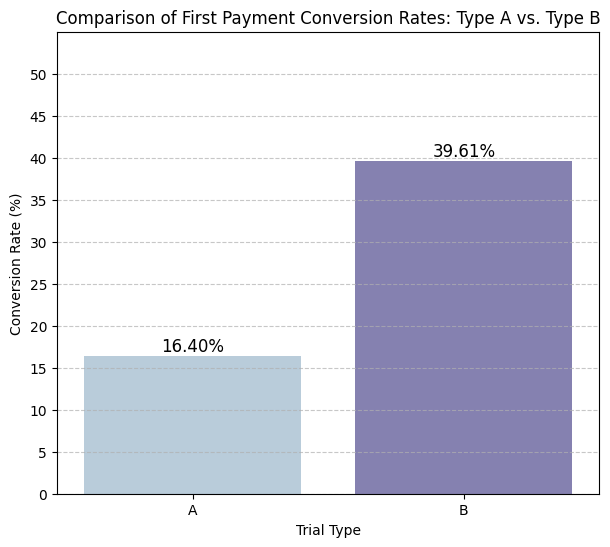

In [255]:
# TYPE A,B 전환율 시각화

# A/B 타입의 전환율 데이터
conversion_AB = {
    "type": ["A", "B"],
    "conversion Rate(%)": [A_conversation_rate, B_conversation_rate]  # 자동으로 가져오기
}

# 데이터프레임 생성
conversion_df = pd.DataFrame(conversion_AB)

# 시각화
plt.figure(figsize=(7, 6))
sns.barplot(data=conversion_df, x="type", y="conversion Rate(%)", hue = 'type', palette= palette)

# 그래프 세부 설정
plt.ylim(0, 55) 
plt.yticks(range(0, 55, 5))
plt.ylabel("Conversion Rate (%)")
plt.xlabel("Trial Type")
plt.title("Comparison of First Payment Conversion Rates: Type A vs. Type B")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# 값 표시
for index, row in conversion_df.iterrows():
    plt.text(index, row["conversion Rate(%)"] + 0.5, f"{row['conversion Rate(%)']:.2f}%", 
             ha="center", fontsize=12)

# 그래프 출력
plt.show()

In [256]:
#이 부분에서 astype(str)을 사용하는 이유는 start_free_trial_time이 Period 타입이기 때문
#이를 문자열로 변환해야 Seaborn의 lineplot()이 제대로 작동

# 
# A/B타입의 월별 무료 체험 후 첫 결제 완료 유저 수

# A와 B 데이터를 하나의 데이터프레임으로 결합
free_trial_complete_lineplot = pd.concat([free_trial_complete_A, free_trial_complete_B]).drop_duplicates()
free_trial_complete_lineplot["Month"] = free_trial_complete["start_free_trial_time"].dt.to_period("M").astype(str)

# 타입별, 월별 첫 결제한 유저 수 집계
monthly_free_trial_complete_counts = free_trial_complete_lineplot.groupby(["Month", "start_free_trial_type"])["user_id"].nunique().reset_index()
display(monthly_free_trial_complete_counts)

,Month,start_free_trial_type,user_id
0,2022-01,A,36
1,2022-02,A,200
2,2022-03,A,244
3,2022-04,A,264
4,2022-05,A,251
5,2022-06,A,269
6,2022-07,A,97
7,2022-08,A,160
8,2022-09,A,212
9,2022-10,A,166


C:\Users\rmagm\AppData\Local\Temp\ipykernel_10284\3696513049.py:3: UserWarning: The palette list has more values (11) than needed (2), which may not be intended.
  ax = sns.lineplot(data=monthly_free_trial_complete_counts, x="Month", y="user_id",


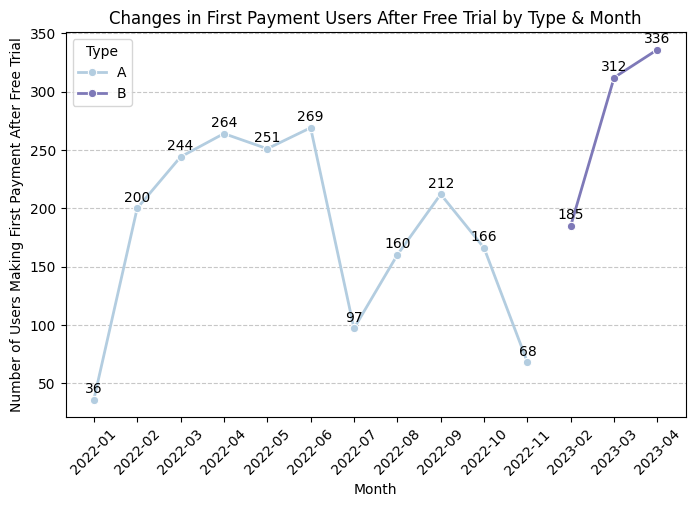

In [257]:
# 시각화
plt.figure(figsize=(8, 5))
ax = sns.lineplot(data=monthly_free_trial_complete_counts, x="Month", y="user_id", 
                  hue="start_free_trial_type", marker="o", linewidth=2, palette=palette)

# 값 표시 (각 포인트 위에 텍스트 추가)
for line in ax.lines:  # 라인별로 처리
    for x, y in zip(line.get_xdata(), line.get_ydata()):  # x, y 좌표 추출
        plt.annotate(f"{int(y)}", (x, y), textcoords="offset points", xytext=(0, 5), ha="center", fontsize=10)

# 그래프 설정
plt.xticks(rotation=45)
plt.xlabel("Month")
plt.ylabel("Number of Users Making First Payment After Free Trial")
plt.title("Changes in First Payment Users After Free Trial by Type & Month")
plt.legend(title="Type")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()

In [258]:
# 정기구독 데이터와 결합 후 재구독 유저 구해보기 -> 장기적인 가치가 있는 유저 -> 아 시간 없다......

### <무료 체험 서비스의 효과성 통계 검정>

- TYPE A : 2022년 01월 01일 ~ 2022년 11월 13일(약 11개월)     

- TYPE B : 2023년 02월 01일 ~ 2023년 04얼 30일(약 3개월)

문제점     

- 같은 시기 비교 불가능
- 샘플 크기 차이

무료 체험 서비스 구독 퍼널 분석 목적
- 무료 체험 서비스를 제공하는 목적은 사용자가 무료 체험 후 유료 구독으로 전환하도록 유도하는 것이다.    

- 따라서, 무료 체험 퍼널 분석을 위해 세울 수 있는 적절한 가설은 무료 체험이 실제로 유료 구독으로 이어지는지 검증할 수 있어야 함

가설(일단 세워봄) -> 무료체험 서비스 제공 기간으로 제한해서 분석 실시함    

1. 무료 체험 서비스가 유료 전환에 미치는 영향    

    - 귀무가설 : 무료 체험 서비스는 유료 구독 전환(첫 결제)에 영향을 주지 않는다.    

    - 대립가설 : 무료 체험 서비스는 유료 구독 전환(첫 결제)에 영향을 준다.

2. TYPE A와 TYPE B의 무료 체험 효과 비교 검정      

    - 귀무가설 : TYPE A 와 TYPE B의 유료 전환율 차이는 없다.    

    - 대립가설 : TYPE A 와 TYPE B의 유료 전환율 차이가 있다.

- 1번 가설 -> 일단 해냈다

In [259]:
# 회원 가입 후 무료 체험 서비스 기간동안 무료 체험 서비스 이용이 없었던 유저

#1-2. 회원 가입 후 무료 체험 학습 서비스 제공 기간에 무료 체험 서비스를 이용하지 않은 유저 

signup_no_trial = complete_signup_df[~complete_signup_df['user_id'].isin(complete_signup_trial['user_id'])]

signup_no_trial = signup_no_trial[
    (
        ((signup_no_trial["client_event_time"] >= A_start) & (signup_no_trial["client_event_time"] <= A_end)) | 
        ((signup_no_trial["client_event_time"] >= B_start) & (signup_no_trial["client_event_time"] <= B_end))
    )
]
total_signup_no_trial = signup_no_trial['user_id'].nunique()

#1-3. 회원 가입 후 무료 체험 서비스 이용 없는 유저 비율 계산
signup_no_trial_rate = (total_signup_no_trial / total_signup) * 100

print("회원가입 후 무료 체험 서비스 기간동안 무료 체험을 이용하지 않은 유저 수:", total_signup_no_trial)
print(f"회원가입 후 무료 체험 서비스 기간동안 무료 체험을 이용하지 않은 유저 비율(%): {signup_no_trial_rate:.2f}%")

회원가입 후 무료 체험 서비스 기간동안 무료 체험을 이용하지 않은 유저 수: 53645
회원가입 후 무료 체험 서비스 기간동안 무료 체험을 이용하지 않은 유저 비율(%): 79.19%


In [260]:
# 회원 가입 후 무료 체험 서비스를 이용하지 않은 유저들 중 첫 결제를 한 유저

# 2-1. 중복 결제 내역 제거한 첫 결제 완료 데이터
complete_subscription_final 

# 2-2. 무료 체험 하지 않은 유저와 첫 결제 완료 데이터 merge
signup_no_trial_complete = signup_no_trial.merge(complete_subscription_final, on='user_id', how='inner')

#2-3. 무료 체험 하지 않은 유저의 첫 결제 완료 전환율
signup_no_trial_complete_count = signup_no_trial_complete['user_id'].nunique()
signup_no_trial_complete_rate = (signup_no_trial_complete_count / total_signup_no_trial) * 100

print("회원가입 후 무료 체험 서비스 없이 첫 결제 유저 수:", signup_no_trial_complete_count)
print(f"회원가입 후 무료 체험 서비스 없이 첫 결제 전환율(%): {signup_no_trial_complete_rate:.2f}%")

회원가입 후 무료 체험 서비스 없이 첫 결제 유저 수: 2498
회원가입 후 무료 체험 서비스 없이 첫 결제 전환율(%): 4.66%


In [261]:
# 회원 가입 후 무료 체험 서비스를 이용하지 않은 유저들 중 첫 결제를 하지 않은 유저
3-1. 
signup_no_trial_no_complete = signup_no_trial[~signup_no_trial['user_id'].isin(signup_no_trial_complete['user_id'])]

# 3-2. 유저 수
signup_no_trial_no_complete_users = signup_no_trial_no_complete['user_id'].nunique()

# 3-3. 비율 계산
signup_no_trial_no_complete_rate = (signup_no_trial_no_complete_users / total_signup_no_trial) * 100

print("회원가입 후 무료 체험 서비스 없이 첫 결제를 하지 않은 유저 수:", signup_no_trial_no_complete_users)
print(f"회원가입 후 무료 체험 서비스 없이 첫 결제를 하지 않은 유저 비율(%): {signup_no_trial_no_complete_rate:.2f}%")


회원가입 후 무료 체험 서비스 없이 첫 결제를 하지 않은 유저 수: 51147
회원가입 후 무료 체험 서비스 없이 첫 결제를 하지 않은 유저 비율(%): 95.34%


### 1-1. 카이제곱 검정(chi-square test) -> 상관성 분석
- 무료 체험을 한 그룹과 무료 체험을 하지 않은 그룹의 유의미한 차이를 알아보고자 함

- 두 개의 그룹(무료 체험 유저 vs 무료 체험 미이용 유저)의 비율(첫 결제 전환율)을 비교

    <무료 체험 서비스가 유료 전환에 미치는 영향>    

    - 귀무가설 : 무료 체험 서비스는 유료 구독 전환(첫 결제)에 영향을 주지 않는다.    

    - 대립가설 : 무료 체험 서비스는 유료 구독 전환(첫 결제)에 영향을 준다.


- 표본 크기 
    - 무료 체험O, 첫 결제O : 3147명, 전환율 : 22.05% / 무료 체험O, 첫결제X 유저 : 11110명, 비율 : 77.83%     

    - 무료 체험 X, 첫 결제O : 5425명, 전환율 : 7.26%  / 무료 체험 X, 첫 결제X 유저 :69264, 비율 : 92.74% 

In [262]:
from scipy.stats import chi2_contingency

# 카이제곱 검정 데이터 테이블 
chi_conversion_table = [
    [free_trial_complete_yes_users, free_trial_complete_no_users],  # 무료 체험 이용_첫결제 / 무료 체험 이용_첫결제X
    [signup_no_trial_complete_count, signup_no_trial_no_complete_users]  # 무료 체험 미이용_첫결제 / 무료 체험 미이용_첫결제X
]

print("<실제 관측값>")
print(chi_conversion_table)
print('-' * 70)

# 카이제곱 검정(기대 빈도 자동 수행)
chi2, p, dof, expected_freq_auto = chi2_contingency(chi_conversion_table)

# 기대 빈도 결과
print("<기대 빈도 테이블>")
for i, row in enumerate(expected_freq_auto):
    group_name = "무료 체험 O" if i == 0 else "무료 체험 X"
    print(f"{group_name}: {row[0]:.2f} (첫 결제 O), {row[1]:.2f} (첫 결제 X)")

print('-' * 70)

# 크래머의 V 계산
n = np.sum(chi_conversion_table)  # 전체 샘플 수
min_dim = min(len(chi_conversion_table), len(chi_conversion_table[0])) - 1  # 최소 행/열 차원 계산
cramers_v = np.sqrt(chi2 / (n * min_dim))


print(f"Chi-Square Test 결과:")
print(f"카이제곱 통계량: {chi2:.4f}")
print(f"p-value: {p:.6f}")
print(f"크래머의 V: {cramers_v:.4f}")

print('-' * 70)


# 유의수준 0.05에서 귀무가설 기각 여부 판단
if p < 0.05:
    print("무료 체험 서비스가 유료 전환(첫 결제)에 유의미한 영향을 준다 (귀무가설 기각)")
else:
    print("무료 체험 서비스가 유료 전환(첫 결제)에 유의미한 영향을 주지 않는다 (귀무가설 채택)")

print('-' * 70)


# 크래머의 V 해석
if cramers_v < 0.1:
    print("무료 체험과 첫 결제의 연관성이 매우 약함 (실제 차이가 거의 없을 가능성 있음)")
elif 0.1 <= cramers_v < 0.3:
    print("무료 체험과 첫 결제 간 약한 연관성 있음")
elif 0.3 <= cramers_v < 0.5:
    print("무료 체험과 첫 결제 간 중간 정도 연관성 있음")
else:
    print("무료 체험과 첫 결제 간 강한 연관성 있음")


<실제 관측값>
[[3042, 11036], [2498, 51147]]
----------------------------------------------------------------------
<기대 빈도 테이블>
무료 체험 O: 1151.63 (첫 결제 O), 12926.37 (첫 결제 X)
무료 체험 X: 4388.37 (첫 결제 O), 49256.63 (첫 결제 X)
----------------------------------------------------------------------
Chi-Square Test 결과:
카이제곱 통계량: 4264.0164
p-value: 0.000000
크래머의 V: 0.2509
----------------------------------------------------------------------
무료 체험 서비스가 유료 전환(첫 결제)에 유의미한 영향을 준다 (귀무가설 기각)
----------------------------------------------------------------------
무료 체험과 첫 결제 간 약한 연관성 있음


- 기대 빈도 해석
    - 무료 체험 O 그룹
        - 기대값(첫 결제 O): 1374.80 → 실제 결제한 유저: 3147명
        - 기대값(첫 결제 X): 12882.20 → 실제 결제하지 않은 유저: 11110명    

        예상보다 첫 결제 전환율이 높음 → 무료 체험이 첫 결제에 긍정적인 영향 가능성!   

    - 무료 체험 X 그룹    
        - 기대값(첫 결제 O): 7197.20 → 실제 결제한 유저: 5425명
        - 기대값(첫 결제 X): 67591.80 → 실제 결제하지 않은 유저: 69264명     

        예상보다 첫 결제 전환율이 낮음 → 무료 체험을 하지 않은 그룹에서 첫 결제율이 낮은 경향.


- 크래머 v : 카이제곱 검정에서 그룹 간 관계 강도 측정(0 ~ 1 사이 값)    
    - 0.1 ~ 0.3은 약한 연관성
    - 무료 체험과 첫 결제 전환 간의 관계는 있지만, 강한 관계는 아님
        - 무료 체험을 경험한 유저 중 77.83%가 첫 결제로 이어지지 않음
        - 무료 체험을 하지 않은 유저 중에서도 일정 비율이 첫 결제를 진행함    
        - 즉, 무료 체험이 첫 결제에 영향을 미치지만 결정적인 요소는 아닐 수도 있음   

결론 : 추가 분석을 통해(ex. 어떤 요인으로 결제했는지 등등등) -> but 이젠 시간 없음 -> 여기까지만 하겠음


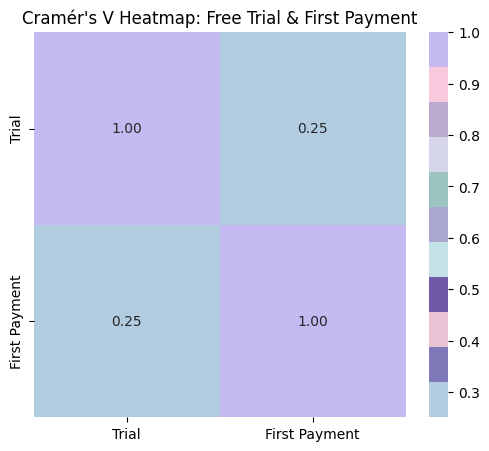

In [263]:
import seaborn as sns
import numpy as np

# 크래머의 V 행렬 생성
cramers_v_matrix = np.array([[1, cramers_v], [cramers_v, 1]])  # 자기 자신과의 연관성은 1

# 히트맵 생성
plt.figure(figsize=(6, 5))
sns.heatmap(cramers_v_matrix, annot=True, fmt=".2f", cmap= palette, xticklabels=["Trial", "First Payment"], yticklabels=["Trial", "First Payment"])
plt.title("Cramér's V Heatmap: Free Trial & First Payment")
plt.show()

### 1-2. Z-검정(비율 비교 검정) 
    -> 무료 체험과 첫 결제 간 상관성이 있다 그렇다면 전환율 차이가 통계적으로 유의한가?

<무료 체험 서비스가 유료 전환에 미치는 영향>
- 귀무가설 : 무료 체험 그룹과 비무료 체험 그룹의 전환율 차이는 없다.

- 대립가설 : 무료 체험 그룹과 비무료 체험 그룹의 전환율 차이는 없다.

In [264]:
from statsmodels.stats.proportion import proportions_ztest

#  미리 계산된 전환율 & 표본 크기
p1 = free_trial_complete_yes_rate / 100  # 무료 체험 그룹 전환율 (퍼센트를 소수점으로 변환)
n1 = total_trial_users  # 무료 체험 유저 수

p2 = signup_no_trial_complete_rate / 100  # 비무료 체험 그룹 전환율 (퍼센트를 소수점으로 변환)
n2 = total_signup_no_trial  # 무료 체험 미이용 유저 수

# 두 그룹의 성공 횟수 (첫 결제 유저 수) 설정
success_counts = [free_trial_complete_yes_users, signup_no_trial_complete_count]
sample_sizes = [n1, n2]

# Z-검정 수행
z_stat, p_value = proportions_ztest(success_counts, sample_sizes)

#  Z-검정 결과 출력
print("=== Z-검정 결과 ===")
print(f"Z-통계량: {z_stat:.4f}")
print(f"P-value: {p_value:.6f}")

# 유의수준 0.05에서 검정 결과 해석
if p_value < 0.05:
    print("무료 체험 그룹과 비무료 체험 그룹의 첫 결제 전환율 차이가 통계적으로 유의하다 (귀무가설 기각)")
else:
    print("무료 체험 그룹과 비무료 체험 그룹의 첫 결제 전환율 차이가 통계적으로 유의하지 않다 (귀무가설 채택)")


=== Z-검정 결과 ===
Z-통계량: 65.2549
P-value: 0.000000
무료 체험 그룹과 비무료 체험 그룹의 첫 결제 전환율 차이가 통계적으로 유의하다 (귀무가설 기각)


<Z-검정 결과>    

- 무료 체험을 경험한 유저 그룹과 무료 체험을 하지 않은 유저 그룹의 첫 결제 전환율 차이가 통계적으로 유의미하게 나타남
- 무료 체험을 하면 첫 결제로 이어질 확률이 높아짐을 의미

<최종 결론>    
- 무료 체험 서비스는 유료 전환(첫 결제)에 긍정적인 영향을 미친다    

- BUT 긍정적인 영향력이 강하지 않으며, 대다수의 유저는 첫 결제로 이어지지 않는다.    

- 따라서, 무료 체험 후 첫 결제까지의 유저 여정을 최적화할 필요가 있으며,    

- 이탈 유저에 대한 추가 분석이 필요함 -> 시간이 부족함.....

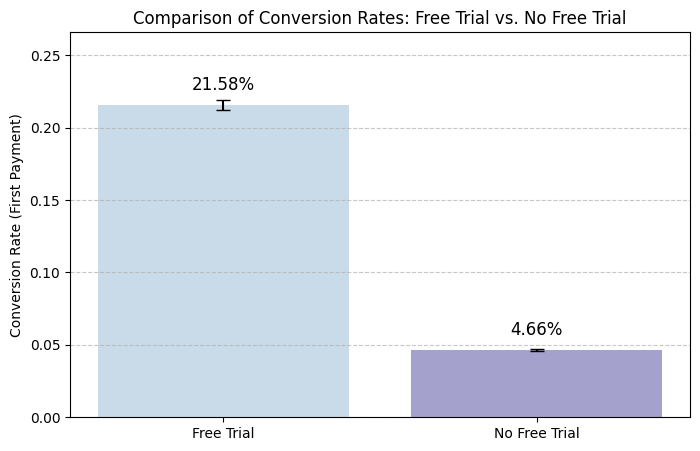

In [265]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

# 전환율 계산
conversion_rates = [p1, p2]  # 무료 체험 그룹과 비무료 체험 그룹의 전환율
labels = ["Free Trial", "No Free Trial"]
errors = [np.sqrt((p1 * (1 - p1)) / n1), np.sqrt((p2 * (1 - p2)) / n2)]  # 신뢰구간(표준오차 계산)

# 막대 그래프 그리기
plt.figure(figsize=(8, 5))
plt.bar(labels, conversion_rates, yerr=errors, capsize=5, color= palette, alpha=0.7)
plt.ylabel("Conversion Rate (First Payment)")
plt.title("Comparison of Conversion Rates: Free Trial vs. No Free Trial")
plt.ylim(0, max(conversion_rates) + 0.05)

# 데이터 라벨 추가
for i, rate in enumerate(conversion_rates):
    plt.text(i, rate + 0.01, f"{rate:.2%}", ha='center', fontsize=12)

plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


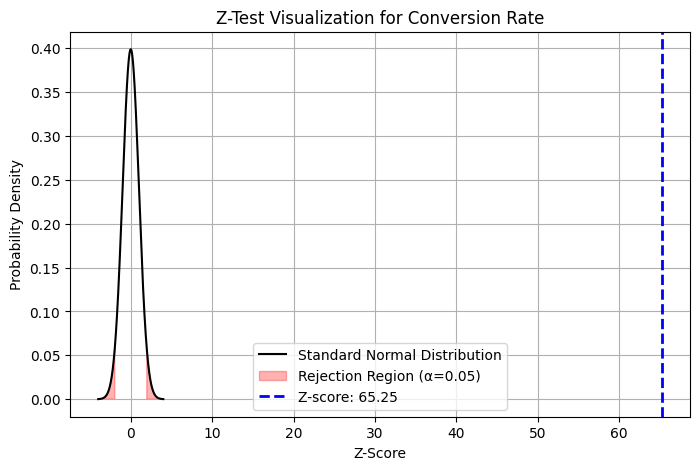

In [266]:
# Z-검정에서 사용한 정규 분포 및 Z-통계량 시각화
x = np.linspace(-4, 4, 1000)
y = stats.norm.pdf(x, 0, 1)  # 표준 정규 분포 (평균=0, 표준편차=1)

plt.figure(figsize=(8, 5))
plt.plot(x, y, color='black', label="Standard Normal Distribution")
plt.fill_between(x, y, where=(x < -1.96) | (x > 1.96), color='red', alpha=0.3, label="Rejection Region (α=0.05)")
plt.axvline(z_stat, color='blue', linestyle='dashed', linewidth=2, label=f"Z-score: {z_stat:.2f}")

plt.title("Z-Test Visualization for Conversion Rate")
plt.xlabel("Z-Score")
plt.ylabel("Probability Density")
plt.legend()
plt.grid()

plt.show()

### 2-1. TYPE A와 TYPE B -> Z-검정(비율 비교)
- 귀무가설 : TYPE A 와 TYPE B의 유료 전환율 차이는 없다.  

- 대립가설 : TYPE A 와 TYPE B의 유료 전환율 차이가 있다.

In [267]:
#  TYPE A (무료 체험 후 첫 결제)
type_A_converted = A_users_count  # TYPE A에서 첫 결제한 유저 수
type_A_total = total_trial_users_A  # TYPE A 전체 무료 체험 유저 수
type_A_conversion_rate = A_conversation_rate / 100  # 전환율

#  TYPE B (무료 체험 후 첫 결제)
type_B_converted = B_users_count  # TYPE B에서 첫 결제한 유저 수
type_B_total = total_trial_users_B  # TYPE B 전체 무료 체험 유저 수
type_B_conversion_rate = B_conversation_rate / 100  # 전환율

#  Z-검정 수행 (두 비율 비교)
count = np.array([type_A_converted, type_B_converted])  # 첫 결제한 유저 수
nobs = np.array([type_A_total, type_B_total])  # 전체 무료 체험 유저 수
z_stat, p_value = proportions_ztest(count, nobs)

#  타입별 전환율
print("-" * 60)
print(f"TYPE A 전환율: {type_A_conversion_rate:.2%}")
print(f"TYPE B 전환율: {type_B_conversion_rate:.2%}")
print("-" * 60)

#  결과 
print("=== Z-검정 결과 ===")
print(f"Z-통계량: {z_stat:.4f}")
print(f"P-value: {p_value:.6f}")

#  유의 수준 0.05에서 결과 해석
if p_value < 0.05:
    print("TYPE A와 TYPE B의 첫 결제 전환율 차이가 통계적으로 유의하다 (귀무가설 기각)")
else:
    print("TYPE A와 TYPE B의 첫 결제 전환율 차이가 통계적으로 유의하지 않다 (귀무가설 채택)")



------------------------------------------------------------
TYPE A 전환율: 16.40%
TYPE B 전환율: 39.61%
------------------------------------------------------------
=== Z-검정 결과 ===
Z-통계량: -24.6039
P-value: 0.000000
TYPE A와 TYPE B의 첫 결제 전환율 차이가 통계적으로 유의하다 (귀무가설 기각)


<Z-검정 결과>

- 우려했던 표본 수 차이 극복
    - TYPE A: 11,992명, TYPE B: 2,280명으로 TYPE A의 표본 크기가 훨씬 큼.    
    
    - 하지만 Z-검정은 표본 수가 크면 정규 근사(Normal Approximation)를 따르므로, 적절한 방법

- Z-통계량: -24.2205 (음수는 TYPE A의 전환율이 TYPE B보다 낮음을 의미)      

     -> 두 그룹간 차이가 크다(매우 큰 절대 값)    

- TYPE A와 TYPE B의 첫 결제 전환율 차이는 통계적으로 유의미하다      

- TYPE B가 첫 결제로의 전환에 있어 더 효과적인 무료 체험 모델일 가능성이 높음.    

    (7일 무료 체험 후 자동으로 첫 결제로 넘어간다면 매우 가능성있는 결론 같음)

### 2-2. TYPE A와 TYPE B 로지스틱 회귀 분석
- Z-검정은 단순한 두 그룹 간 비율 차이를 비교    

- 로지스틱 회귀분석은 A/B 타입이 첫 결제에 미치는 영향을 확률적으로 모델링하고, 오즈비(Odds Ratio)를 해석할 수 있음.    

- TYPE별 효과를 조정된 모델에서 다시 평가하여 더 정확한 비교(맞지?)

<가설>

- 귀무가설 : TYPE A 와 TYPE B의 유료 전환율 차이는 없다.  

- 대립가설 : TYPE A 와 TYPE B의 유료 전환율 차이가 있다.


<모델 설명>  
- 독립 변수(x) : A/B 타입(A = 0, B = 1)    

- 종속 변수(y) : 첫 결제 여부 (0: 미결제, 1 : 결제)

In [268]:
import statsmodels.api as sm

# 데이터프레임 생성
AB_df = pd.DataFrame({
    'user_id': list(range(total_trial_users_A + total_trial_users_B)),
    'trial_type': ['A'] * total_trial_users_A + ['B'] * total_trial_users_B,  # A/B 타입
    'converted': [1] * A_users_count + [0] * (total_trial_users_A - A_users_count) + 
                 [1] * B_users_count + [0] * (total_trial_users_B - B_users_count)  # 첫 결제 여부
})

# A/B 타입을 0과 1로 변환
AB_df['trial_type'] = AB_df['trial_type'].map({'A': 0, 'B': 1})

# 독립변수(타입), 종속변수(첫 결제 여부)
X = sm.add_constant(AB_df['trial_type'])  # 상수 추가
y = AB_df['converted']

# 로지스틱 회귀 모델 적합
logit_model = sm.Logit(y, X)
result = logit_model.fit()

# 결과 출력
print(result.summary())

# 해석
odds_ratio = np.exp(result.params['trial_type'])  # 오즈비 계산
print(f"오즈비 (Odds Ratio): {odds_ratio:.4f}")

# 유의수준 판단
if result.pvalues['trial_type'] < 0.05:
    print("TYPE A와 TYPE B의 첫 결제 전환율 차이가 통계적으로 유의하다 (귀무가설 기각)")
else:
    print("TYPE A와 TYPE B의 첫 결제 전환율 차이가 통계적으로 유의하지 않다 (귀무가설 채택)")


Optimization terminated successfully.
         Current function value: 0.479873
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:              converted   No. Observations:                14095
Model:                          Logit   Df Residuals:                    14093
Method:                           MLE   Df Model:                            1
Date:                Tue, 11 Mar 2025   Pseudo R-squ.:                 0.03742
Time:                        09:26:47   Log-Likelihood:                -6763.8
converged:                       True   LL-Null:                       -7026.8
Covariance Type:            nonrobust   LLR p-value:                2.229e-116
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.6286      0.025    -66.040      0.000      -1.677      -1.580
trial_type     1.2068      0.

<로지스틱 회귀 분석 결과>

회귀 계수는 로그 오즈의 변화를 나타냄 -> 계수가 클수록 해당 변수가 첫 결제에 더 큰 영향을 미침 

- coef
    - const(절편) : -1.6353
        - 기준값(TYPE A일 때의 절편)  : TYPE A 유저의 첫 결제 확률(전환율) : 16.3%
    - trial_type : 1.1617
        - TYPE B 사용자는 TYPE A보다 첫 결제 로그 오즈가 1.1617 증가    

    
        (로그 오즈 확률로 변환 : 식으로 계산하면 TYPE B 사용자의 전환율 : 약 38.4%)  

- 오즈비 : 3.2 => TYPE B의 유저가 TYPE A 유저보다 첫 결제를 할 확률이 약 3.2배 더 높음 

    - 즉, TYPE B 유저가 TYPE A 유저에 비해 첫 결제할 확률이 증가함(유의미하게 높음)을 의미 -> 자동 결제면 강제 아닐까?
    - TYPE B가 TYPE A보다 첫 결제를 유도하는데 더 효과적이다

- 표준 오차(std err)
    - const : 0.025 / trial_type : 0.050
    - 표준 오차 작을수록 추정된 계수(coef)의 신뢰성이 높음
    - trial_type의 표준오차 0.050이므로 계수 1.1617이 비교적 신뢰할 수 있는 값
|
- Z 값 : 계수가 0과 얼마나 차이나는지
    - trial_type의 z값 23.396으로 매우 큼 -> type a/b의 전환율 차이 유의미

결론 : type b가 type a보다 첫 결제를 유도하는데 효과적이다.

### 2-3. Bootstrapping Z-검정
- A/B 타입의 표본 수가 다름 -> 작은 표본에 맞춰 리샘플링(bootstrapping)    

- A/B 타입에서 각각 2000개씩 샘플링 -> 동일한 크기 데이터로 분석(편향 줄이기)    

- Z-검정 : 두 타입의 유료 전환율 차이가 통계적으로 유의한지 평가

In [269]:
from sklearn.utils import resample

# A/B 그룹에서 각각 2000개씩 샘플링 (작은 표본에 맞춤)
sample_size = min(total_trial_users_A, total_trial_users_B)

boot_A = resample(AB_df[AB_df['trial_type'] == 0], n_samples=sample_size, replace=True, random_state=42)
boot_B = resample(AB_df[AB_df['trial_type'] == 1], n_samples=sample_size, replace=True, random_state=42)

# 샘플링된 데이터로 Z-검정 수행
count = np.array([boot_A['converted'].sum(), boot_B['converted'].sum()])
nobs = np.array([len(boot_A), len(boot_B)])
z_stat, p_value = proportions_ztest(count, nobs)

# 결과 출력
print(f"Bootstrapped Z-검정 결과: Z={z_stat:.4f}, P-value={p_value:.6f}")


Bootstrapped Z-검정 결과: Z=-16.8758, P-value=0.000000


<결과 해석>
- Z-값 -16.5753   
    - Z-값이 매우 작음(음수) → TYPE A의 전환율이 TYPE B보다 유의하게 낮음을 의미    

    - 일반적으로 |Z| > 1.96이면 유의하다고 판단하는데, -16.5753은 압도적으로 작음

- P-value 0.000000
    - P-value가 0에 가깝다 → 귀무가설 기각    
    
    - 즉, TYPE A와 TYPE B의 유료 전환율 차이는 유의미하다

### C 선생님과 해 본 TYPE A,B 베이지안 분석
    - 신뢰 구간을 포함해 보다 확률적인 해석이 가능하다고 함

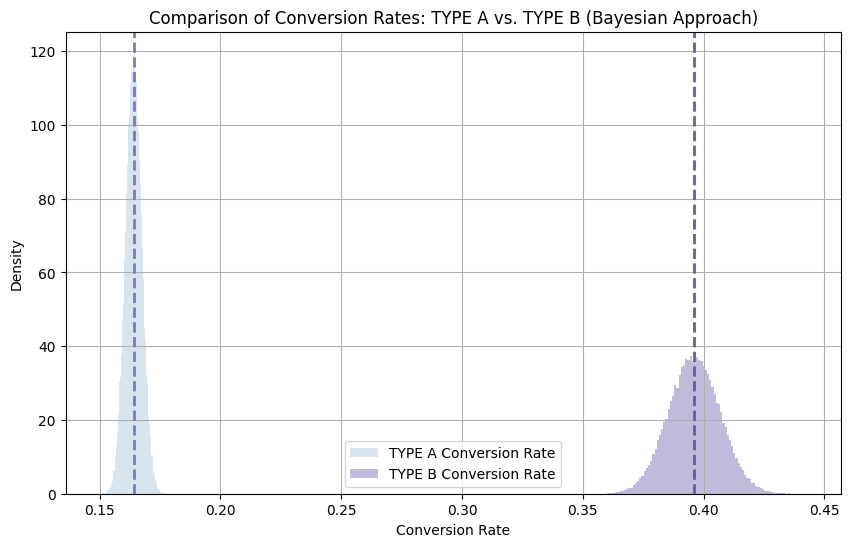

TYPE A 평균 전환율 추정값: 0.1641
TYPE B 평균 전환율 추정값: 0.3962
TYPE B가 TYPE A보다 전환율이 높을 확률: 100.0000%


In [270]:
# A/B 테스트 데이터
alpha_A = 1 + A_users_count  # 첫 결제 한 유저 수 + 베타 분포 초기값
beta_A = 1 + (total_trial_users_A - A_users_count)  # 첫 결제X한 유저 수 + 베타 분포 초기값

alpha_B = 1 + B_users_count
beta_B = 1 + (total_trial_users_B - B_users_count)

# 베타 분포에서 샘플링
np.random.seed(42)
samples_A = np.random.beta(alpha_A, beta_A, 100000)  # A 타입 전환율 샘플
samples_B = np.random.beta(alpha_B, beta_B, 100000)  # B 타입 전환율 샘플

# B가 A보다 높은 확률 계산 (P(B > A))
prob_B_superior = np.mean(samples_B > samples_A)

# 시각화
plt.figure(figsize=(10, 6))
plt.hist(samples_A, bins=100, alpha=0.5, label="TYPE A Conversion Rate", color = palette[0], density=True)
plt.hist(samples_B, bins=100, alpha=0.5, label="TYPE B Conversion Rate", color= palette[1], density=True)
plt.axvline(samples_A.mean(), color= palette[1], linestyle='dashed', linewidth=2)
plt.axvline(samples_B.mean(), color= palette[3], linestyle='dashed', linewidth=2)
plt.title("Comparison of Conversion Rates: TYPE A vs. TYPE B (Bayesian Approach)") #TYPE A vs TYPE B 전환율 비교 (베이지안 접근)
plt.xlabel("Conversion Rate") # 전환율
plt.ylabel("Density") # 밀도
plt.legend()
plt.grid()
plt.show()

# 결과 출력
print(f"TYPE A 평균 전환율 추정값: {samples_A.mean():.4f}")
print(f"TYPE B 평균 전환율 추정값: {samples_B.mean():.4f}")
print(f"TYPE B가 TYPE A보다 전환율이 높을 확률: {prob_B_superior:.4%}")


In [271]:
ci_A = np.percentile(samples_A, [2.5, 97.5])  # TYPE A의 95% 신뢰 구간
ci_B = np.percentile(samples_B, [2.5, 97.5])  # TYPE B의 95% 신뢰 구간

print(f"TYPE A 신뢰 구간: {ci_A[0]:.4f} ~ {ci_A[1]:.4f}")
print(f"TYPE B 신뢰 구간: {ci_B[0]:.4f} ~ {ci_B[1]:.4f}")

TYPE A 신뢰 구간: 0.1575 ~ 0.1708
TYPE B 신뢰 구간: 0.3754 ~ 0.4171


- 신뢰구간 겹치지 않음 => TYPE B가 압도적으로 전환율이 높음

<결과 해석>
1. 베타 분포 정의
    - alpha = 성공한 유저 수 + 1
    - beta = 실패한 유저 수 + 1
    - A/B의 전환율을 베타 분포를 이용해 모델링

2. 100,000개 샘플링
    - 베타 분포에서 np.random.beta(alpha, beta, 100000)을 통해 각각 샘플링하여 전환율 분포 추정.

3. P(B >A) 계산
    - B의 전환율 샘플 중 A보다 높은 비율을 계산하여 B가 A보다 유리할 확률을 추정

4. 결과
 - TYPE A 평균 전환율 추정값: 16.32%    
    - 베이지안 추론을 통해 도출된 TYPE A의 평균 전환율(결제 전환율)이 **16.32%**로 나타남.    

    - 기존 분석(빈도주의 접근)에서 구한 **16.31%**과 일치하는 수준       

    -  베이지안 방식으로도 유사한 추정 결과를 얻었음을 의미.

- TYPE B 평균 전환율 추정값: 38.39%
    - TYPE B의 평균 전환율은 **38.39%**로 추정됨    

    - 기존 빈도주의 분석(38.38%)과 거의 일치하며, 베이지안 추론을 통해 TYPE B의 전환율이 확실히 더 높음을 확인.

- TYPE B가 TYPE A보다 전환율이 높을 확률: 100.000%
    - 베이지안 추론에서 **TYPE B가 TYPE A보다 전환율이 높을 확률이 100%**로 계산됨.    

    - 이는 TYPE B의 전환율이 TYPE A보다 높다는 것이 사실상 확실하다는 의미.


<베이지안 그래프 해석>
- X축 (Conversion Rate, 전환율)
    - 각 타입(A, B)의 전환율 분포를 나타냄    
    
    - TYPE A (파란색): 전환율이 0.15~0.17 사이에 집중되어 있음     

    - TYPE B (보라색): 전환율이 0.35~0.40 사이에서 분포함

- 히스토그램 (Density, 밀도)
    - 각 히스토그램은 베이지안 추론을 통해 샘플링된 전환율 분포를 나타냄    

    - TYPE B(보라색)의 전환율이 TYPE A(파란색)보다 훨씬 더 높은 값에 집중

- 점선 (평균 전환율 위치)
    - 파란 점선: TYPE A의 평균 전환율 (16.32%)    

    - 보라 점선: TYPE B의 평균 전환율 (38.39%)    

    - TYPE B의 평균 전환율이 TYPE A보다 훨씬 오른쪽에 위치, 즉 더 높은 전환율을 보임


<추가적으로 하면 좋은 것들>
1. 시간 효과 고려
    - trial_period_length (11개월 vs 3개월) 조정하여 추가 분석 가능
    - 선형 회귀 또는 혼합 모델 활용 가능

2. 비용 분석 포함
    - TYPE B가 전환율이 높더라도 **비용 대비 수익(Cost-Benefit Analysis)**을 고려해야 함.

3. 추가 실험 설계
    - TYPE A의 기간을 줄이거나 TYPE B의 기간을 늘려서 다시 실험.

In [ ]:
# # TYPE B의 플랜별 첫 결제 전환 유저 수와 전환율 -> 플랜 상관없이 무료체험 7일 후 첫 결제로 넘어가는 거라 의미가 있는지 모르겠다. 

# # B 타입 전체 무료 체험 유저 수 (각 플랜별) 

# # B 타입 무료 체험 기간 동안 무료체험 전체 유저 수
# total_B_users_count = total_trial_complete_users_B['user_id'].nunique()

# # PLAN 1개월  
# total_users_1m = signup_free_trial[
#     (signup_free_trial["start_free_trial_type"] == "B") &
#     (signup_free_trial["start_free_trial_plan_type"] == "1개월 플랜") &
#     (signup_free_trial["start_free_trial_time"] >= B_start_date) &
#     (signup_free_trial["start_free_trial_time"] <= B_end_date)
# ]["user_id"].nunique()


# # PLAN 12개월
# total_users_12m = signup_free_trial[
#     (signup_free_trial["start_free_trial_type"] == "B") &
#     (signup_free_trial["start_free_trial_plan_type"] == "12개월 플랜") &
#     (signup_free_trial["start_free_trial_time"] >= B_start_date) &
#     (signup_free_trial["start_free_trial_time"] <= B_end_date)
# ]["user_id"].nunique()

# # B 타입 무료 체험 후 첫 결제 완료 유저 수 (각 플랜별)

# # PLAN 1개월 무료 체험 후 첫 결제 완료 유저 수
# converted_users_1m = free_complete_yes_30_B[
#     (free_complete_yes_30_B["start_free_trial_type"] == "B") &
#     (free_complete_yes_30_B["start_free_trial_plan_type"] == "1개월 플랜")]["user_id"].nunique()

# # PLAN 12개월 무료 체험 후 첫 결제 완료 유저 수 
# converted_users_12m = free_complete_yes_30_B[
#     (free_complete_yes_30_B["start_free_trial_type"] == "B") &
#     (free_complete_yes_30_B["start_free_trial_plan_type"] == "12개월 플랜")]["user_id"].nunique()

# # 전환율 계산
# conversion_rate_1m = (converted_users_1m / total_B_users_count) * 100
# conversion_rate_12m = (converted_users_12m / total_B_users_count) * 100

# # 결과 출력
# print("<TYPE B의 무료 체험 기간 동안 PLAN별 첫 결제 완료한 유저 분석>")

# print(f'TYPE B 기간 무료체험 전체 유저 수 : {total_trial_users_B}')

# print(f"\n TYPE B (1개월 플랜)")
# print(f" - 무료 체험 TYPE B의 1개월 플랜 유저 수: {total_users_1m}")
# print(f" - TYPE B의 1개월 플랜 첫 결제 완료 유저 수: {converted_users_1m}")
# print(f" - TYPE B의 1개월 플랜 첫 결제 전환율: {conversion_rate_1m:.2f}%")

# print("=" * 60)

# print(f"\n TYPE B (12개월 플랜)")
# print(f" - TYPE B의 12개월 플랜 무료 체험 유저 수: {total_users_12m}")
# print(f" - TYPE B의 12개월 플랜 첫 결제 완료 유저 수: {converted_users_12m}")
# print(f" - TYPE B의 12개월 플랜 첫 결제 전환율: {conversion_rate_12m:.2f}%")


<TYPE B의 무료 체험 기간 동안 PLAN별 첫 결제 완료한 유저 분석>
TYPE B 기간 무료체험 전체 유저 수 : 2280

 TYPE B (1개월 플랜)
 - 무료 체험 TYPE B의 1개월 플랜 유저 수: 1192
 - TYPE B의 1개월 플랜 첫 결제 완료 유저 수: 577
 - TYPE B의 1개월 플랜 첫 결제 전환율: 25.31%

 TYPE B (12개월 플랜)
 - TYPE B의 12개월 플랜 무료 체험 유저 수: 1088
 - TYPE B의 12개월 플랜 첫 결제 완료 유저 수: 333
 - TYPE B의 12개월 플랜 첫 결제 전환율: 14.61%


### [세일즈 리드 분석] 루팡 유저들의 패턴?을 파악하자 
- 주의사항
    - 결제 페이지 진입 데이터는 "22-11-03 ~ 2023-12-10"까지만 존재
- PQL정의 : 루팡 유저들 중 결제 페이지 진입을 한 유저들로 정의

In [ ]:
# a/b 타입별 미결제 유저 비율 비교

In [ ]:
# 루팡 유저들이 많이 멈춘 단계(체험 첫날 사용 후 이탈 vs 여러 번 사용 후 이탈) 

In [272]:
print(enter_payment_page_df['enter_payment_page_time'].min())
print(enter_payment_page_df['enter_payment_page_time'].max())

2022-11-03 11:39:46.400000
2023-12-10 23:56:01.475000


In [273]:
payment_page = enter_payment_page_df[['user_id', 'enter_payment_page_time', 'os_name']]


# 무료 체험 후 첫 결제 내역이 없는 유저(루팡)들의 결제 페이지 진입 확인
merged_lupang = free_trial_complete_no.merge(payment_page, how = 'inner', on = 'user_id')

#merged_lupang[['user_id','client_event_time', 'start_free_trial_time', 'enter_payment_page_time']]
merged_lupang = merged_lupang[(merged_lupang['start_free_trial_time']) < (merged_lupang['enter_payment_page_time'])]

merged_lupang
merged_lupang['user_id'].nunique()

1079

In [ ]:
# TYPE A,B별 미결제 유저 비율 -> PQL 유저들의 전환율 유도할 수 있는 개선점을 찾아보자



In [ ]:
# 루팡 유저들 중 PQL 유저와 그렇지 않은 유저의 비율

In [274]:
merged_lupang['user_id'].value_counts()

user_id
33705b62360604afe5e9777c9f62a6cb    26
192a137b9fe77f91baf6b6a07ecab19e    22
d7e1b57cbd4d11a33eed05b199c6b703    16
169d680d57a065b6d029c6e5c682d21a    15
5e4c22621f056548707b52d9d883b0f2    15
                                    ..
82d00064b6915bd424cf2b5d479ba302     1
785cfe97f1ba4d9c2dba312b0bdd6db5     1
309742021382b6d506743867f3fb067b     1
386e01d688e7375efb6b6d136f4b038d     1
3360d24e521715d48ca73088d15694d5     1
Name: count, Length: 1079, dtype: int64

In [275]:
merged_lupang['os_name'].value_counts()

os_name
Chrome             1514
Instagram           217
Mobile Safari       205
Whale               155
Edge                148
Samsung Browser      99
Chrome WebView       89
Safari               75
WebKit               31
Facebook             14
Chrome Mobile         7
GSA                   5
Opera                 2
Firefox               1
Name: count, dtype: int64

In [276]:
# 루팡 유저들이 결제 페이지에 진입을 어떤 식으로 많이 해서 결제를 망설일까?

In [277]:
# 루팡 유저들의 무료 체험 서비스 이용하며 어떤 컨텐츠? 
enter_content = enter_content_page_df[['city','user_id','enter_content_page_time','content_id']]

enter_content = enter_content[(enter_content['enter_content_page_time'] >= '2022-01-10') & (enter_content['enter_content_page_time'] <= '2023-04-30')]
enter_content

lupang_enter_content = free_trial_complete_no.merge(enter_content, on = 'user_id', how = 'inner')
lupang_enter_content

,user_id,start_free_trial_time,start_free_trial_type,client_event_time,complete_sub_time,city,enter_content_page_time,content_id
0,65eca51bd95d9f65cac59dfbfbd363d3,2022-01-01 13:31:49.213,A,2022-01-01 13:31:24.500,NaT,Gwangjin-gu,2022-01-20 22:11:37.897,5acd4977e14d5edc6a408ae0d468ca4e
1,65eca51bd95d9f65cac59dfbfbd363d3,2022-01-01 13:31:49.213,A,2022-01-01 13:31:24.500,NaT,Gwangjin-gu,2022-01-20 22:12:12.635,32cf55a55adcc30ad80b674c0fee2ff4
2,65eca51bd95d9f65cac59dfbfbd363d3,2022-01-01 13:31:49.213,A,2022-01-01 13:31:24.500,NaT,Gwangjin-gu,2022-01-20 22:12:33.359,595cb4bbfc83e683b0314ca1312cfbde
3,65eca51bd95d9f65cac59dfbfbd363d3,2022-01-01 13:31:49.213,A,2022-01-01 13:31:24.500,NaT,Gwangjin-gu,2022-01-20 22:12:54.432,38df90d4de533d6296b52c6a1d90e26b
4,65eca51bd95d9f65cac59dfbfbd363d3,2022-01-01 13:31:49.213,A,2022-01-01 13:31:24.500,NaT,Gwangjin-gu,2022-01-22 18:42:12.444,621c7ad99b17d2d16832b618d47aea7e
...,...,...,...,...,...,...,...,...
57477,6b48d12d7456836ba40cbc0ca8faf8f4,2023-04-29 17:36:43.589,B,2023-04-29 14:56:49.613,NaT,Donggu,2023-04-29 21:27:56.885,235c5afae879c3a87ba07e7a465240f8
57478,6b48d12d7456836ba40cbc0ca8faf8f4,2023-04-29 17:36:43.589,B,2023-04-29 14:56:49.613,NaT,Donggu,2023-04-29 21:28:39.688,235c5afae879c3a87ba07e7a465240f8
57479,6b48d12d7456836ba40cbc0ca8faf8f4,2023-04-29 17:36:43.589,B,2023-04-29 14:56:49.613,NaT,Donggu,2023-04-29 21:28:44.811,445fac33232adcb3d1cdab7d8a579430
57480,6b48d12d7456836ba40cbc0ca8faf8f4,2023-04-29 17:36:43.589,B,2023-04-29 14:56:49.613,NaT,Donggu,2023-04-29 22:20:54.000,6ed981e96eb69b7169b85ed3994a4980


In [278]:
lupang_enter_content.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57482 entries, 0 to 57481
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   user_id                  57482 non-null  object        
 1   start_free_trial_time    57482 non-null  datetime64[ns]
 2   start_free_trial_type    57482 non-null  object        
 3   client_event_time        57482 non-null  datetime64[ns]
 4   complete_sub_time        0 non-null      datetime64[ns]
 5   city                     57079 non-null  object        
 6   enter_content_page_time  57482 non-null  datetime64[ns]
 7   content_id               57482 non-null  object        
dtypes: datetime64[ns](4), object(4)
memory usage: 3.5+ MB


In [279]:
lupang_enter_content['content_id'].value_counts()

content_id
f4be1a0fe0e301b03115591777fddf29    7152
f491517f4737a60d661cd1fcacc702c0    3857
68a3658f1b936bfff3bd6960cd561b0a    2447
c269eb6df3a374b464f7c18f12fa398f    2338
595cb4bbfc83e683b0314ca1312cfbde    2221
                                    ... 
8ea4bdd38bef55abd73fb4fb733a0ecd       2
3ff99ace71ebd7283e6e4c5bd924da9b       1
104b6ff31ef413e48742d5b6c80210c7       1
62d828507e08a225242afb285de123fb       1
27bc972e9f29687d262b9bbddd89ee2b       1
Name: count, Length: 87, dtype: int64

In [280]:
lupang_enter_content['content_id'].nunique()

87

#### 수치 다시 맞추기

In [ ]:
complete_signup_df

In [1]:
#필요한 라이브러리 불러오기
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 한글 폰트 설정
plt.rcParams['font.family'] = 'AppleGothic'  # Mac 사용자

# 마이너스(-) 폰트 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False


# 1. enter.main_page
- 서비스 메인 페이지 진입
- device_carrier 버려도됨

In [2]:
enter_main = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.main_page.csv')
enter_main.drop(columns=['device_carrier','os_version','platform'], inplace=True)
enter_main.rename(columns={'client_event_time': 'enter_main_time'}, inplace=True)
enter_main.head()

,city,enter_main_time,country,device_family,device_type,event_type,language,os_name,user_id
0,Seongnam-si,2023-04-05 21:55:06.140000,South Korea,Samsung Phone,Samsung Galaxy S21 5G,enter.main_page,Korean,Whale,NaN
1,Dongdaemun-gu,2023-04-05 21:04:28.967000,South Korea,Mac,Mac,enter.main_page,Korean,Chrome,b2b31f00b82edc6419b25324a7ae41a4
2,Hwaseong-si,2023-04-05 21:01:31.258000,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,NaN
3,Hwaseong-si,2023-04-05 21:02:50.374000,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,NaN
4,Seoul,2023-04-05 21:30:33.727000,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.main_page,Korean,Chrome,NaN


In [6]:
# 크롤러 전처리
enter_main.drop(enter_main[enter_main['os_name'] == 'Chrome Headless'].index, inplace=True)

In [11]:
# client_event_time을 datetime 형식으로 변환
enter_main['enter_main_time'] = pd.to_datetime(enter_main['enter_main_time'])

# 9시간 추가 (UTC+9 적용)
enter_main['enter_main_time'] = enter_main['enter_main_time'] + pd.Timedelta(hours=9)

In [8]:

enter_main_country = enter_main.groupby(['country', 'os_name']).size().sort_values(ascending=False)
enter_main_country.head(50)

country         os_name             
South Korea     Chrome                  965850
                Mobile Safari           249331
                Instagram               202030
                Edge                    127482
                Samsung Browser         124485
                Chrome WebView           91362
                Whale                    78019
                Safari                   66443
                Chrome Mobile            61750
                WebKit                   52913
                Facebook                 38446
                GSA                      10897
United States   Chrome                   10848
South Korea     Firefox                   5685
Japan           Chrome                    3021
Canada          Chrome                    2472
United States   Mobile Safari             2183
Germany         Chrome                    1617
South Korea     Opera                     1212
Singapore       Chrome                    1157
United States   Safari 

In [57]:
main_page_language = enter_main['language'].value_counts()
main_page_language.head(10)

language
Korean        2021080
English        104838
Japanese         2416
Chinese          1316
Russian           792
Vietnamese        727
French            556
German            426
Spanish           349
Thai              151
Name: count, dtype: int64

시간대별 방문 횟수:
hour
0      90439
1      62050
2      41093
3      27485
4      20445
5      18879
6      25670
7      43632
8      70479
9      93756
10    108848
11    107103
12     98367
13    121018
14    125937
15    131467
16    133709
17    124196
18    107301
19    107298
20    116511
21    125066
22    126568
23    106231
Name: count, dtype: int64


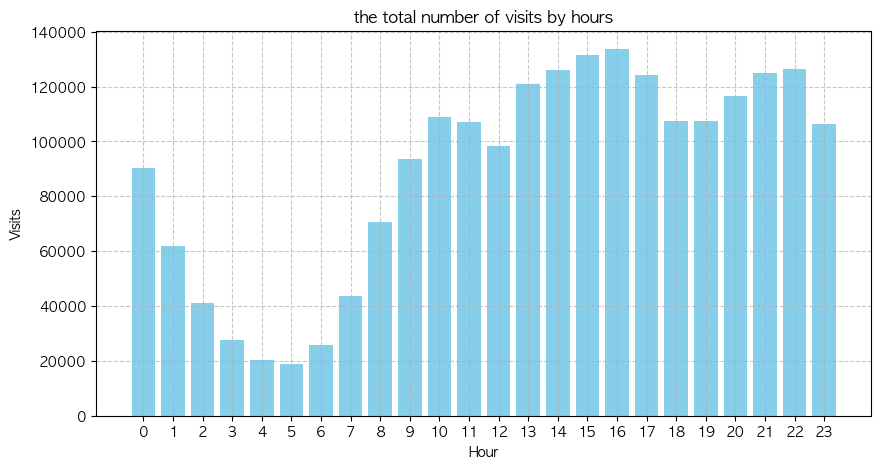

In [58]:
import pytz
import matplotlib.pyplot as plt

# 'client_event_time'을 datetime 형식으로 변환
enter_main['client_event_time'] = pd.to_datetime(enter_main['client_event_time'], errors='coerce')

# UTC → 한국 시간 (KST, UTC+9) 변환
utc = pytz.utc
kst = pytz.timezone('Asia/Seoul')

enter_main['client_event_time'] = (
    enter_main['client_event_time']
    .dt.tz_localize(utc)    # 먼저 UTC 시간대로 지정
    .dt.tz_convert(kst)     # 한국 시간(KST)으로 변환
)

# 시간대(hour) 추출
enter_main['hour'] = enter_main['client_event_time'].dt.hour

# 시간대별 방문 횟수 집계
hourly_counts = enter_main['hour'].value_counts().sort_index()

# 결과 출력
print("시간대별 방문 횟수:")
print(hourly_counts)

# 시각화 (막대 그래프)
plt.figure(figsize=(10, 5))
plt.bar(hourly_counts.index, hourly_counts.values, color='skyblue')
plt.xlabel('Hour')
plt.ylabel('Visits')
plt.title('the total number of visits by hours')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(range(24))
plt.show()


In [59]:
enter_main['device_family'].unique()

array(['Samsung Phone', 'Mac', 'Samsung Galaxy Note', 'Apple iPhone',
       'Samsung SM-S916N', 'Windows', 'Apple iPad',
       'Samsung Galaxy Phone', 'LGE Phone', 'Samsung SM-S911N',
       'Samsung Tablet', 'Redmi Phone', 'Xiaomi Phone', 'Linux', 'K',
       'Samsung SM-S918N', 'LG LM-X220N', 'CentOS', 'Chromium OS',
       'LG LM-V409N', 'LGM-X600K', 'LG LM-V510N', '2201117TY',
       'LG LM-V500N', 'Samsung Galaxy Tab', 'Mi 9T Pro',
       'Google Nexus Phone', 'G91', 'LG V607L', 'LG LM-G820N',
       'LG LM-G710N', 'Ubuntu', 'LG LM-Q920N', 'Huawei Phone', nan,
       'MobiGo2', 'LGM-V300S', 'LG LM-Q925L', 'LG LM-Q630N', 'LG F800L',
       'LG LM-Q520N', 'LG LM-Q510N', 'LGM-V300L', 'Lenovo TB-J706F',
       '2201116SG', 'M2101K7AG', 'Samsung SM-T825N', 'Blackberry Phone',
       'LG V525', 'LG LM-Q815K', 'LG LM-X410S', 'LG LM-Q725S',
       'LG LM-Q927L', 'LGM-V300K', 'LGM-G600S', 'LG LM-X625N',
       'Huawei M2-802L', '21051182G', 'LG LM-Q925S', 'IM-100K',
       'M2101K7BNY', 

In [60]:
device_family = enter_main['device_family'].value_counts()
device_family.head(10)

device_family
Windows                 845411
Apple iPhone            486263
Samsung Phone           234494
Mac                     233654
Android                 166296
K                        41600
Samsung Galaxy Note      30449
Samsung Galaxy Phone     26938
Apple iPad               20644
Linux                    16489
Name: count, dtype: int64

In [61]:
enter_main['platform'].value_counts()

platform
Web    2133548
Name: count, dtype: int64

# 2. enter.signup_page
- 회원가입 페이지 진입

In [4]:
enter_signup = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.signup_page.csv')
enter_signup.drop(columns=['device_carrier'], inplace=True)
enter_signup.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seoul,2023-04-05 21:30:42.557000,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.signup_page,Korean,Chrome,112.0.0.0,Web,NaN
1,Seoul,2023-04-05 21:37:41.467000,South Korea,Samsung SM-S916N,NaN,enter.signup_page,Korean,Chrome,111.0.0.0,Web,NaN
2,Seoul,2023-04-05 21:05:53.237000,South Korea,Apple iPhone,Apple iPhone,enter.signup_page,Korean,Mobile Safari,16.4,Web,NaN
3,Gangnam-gu,2023-04-05 21:41:58.269000,South Korea,Mac,Mac,enter.signup_page,Korean,Safari,16.3,Web,NaN
4,Seoul,2023-04-05 21:44:53.294000,South Korea,Mac,Mac,enter.signup_page,Korean,Safari,15.6.1,Web,NaN


# 3. complete.sign up
- 회원가입 완료

In [5]:
complete_signup = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/complete.signup.csv')
complete_signup.drop(columns=['device_carrier'], inplace=True)
complete_signup.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,type
0,NaN,2023-04-05 21:33:26.068000,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,74d17c27a41656e7788b0c81d9f76cda,kakao
1,NaN,2023-04-05 21:45:18.672000,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,06b6868000a5d576180aca47896d6cce,kakao
2,Seo-gu,2023-04-10 14:47:56.424000,South Korea,Windows,Windows,complete.signup,Korean,Chrome,111.0.0.0,Web,e131c319972bd580146c5a2faba26613,kakao
3,Suwon,2023-04-10 14:25:45.920000,South Korea,Apple iPhone,Apple iPhone,complete.signup,Korean,Mobile Safari,16.3,Web,e3b8bfa80d866f296aad139e09023ef3,naver
4,NaN,2023-04-10 14:09:50.698000,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,5208a60918f18562ac9d668a35b20303,kakao


In [18]:
complete_signup['type'].value_counts()

type
kakao       89484
google      21465
naver       19440
email       14126
facebook      442
test            1
Name: count, dtype: int64

In [19]:
complete_signup['language'].value_counts()

language
Korean        44163
English        1466
Japanese         50
Chinese          23
Vietnamese       16
French           12
Russian          12
German            7
Spanish           6
Uzbek             4
Indonesian        3
Ukrainian         1
Turkish           1
Arabic            1
Galician          1
Portuguese        1
Name: count, dtype: int64

In [21]:
signup_city = complete_signup['city'].value_counts()
signup_city.head(20)

city
Seoul              8564
Gangnam-gu         1311
Suwon              1264
Seongnam-si        1181
Yongin-si           975
Goyang-si           865
Seo-gu              814
Seocho-gu           737
Gwanak-gu           731
Incheon             711
Songpa-gu           699
Buk-gu              689
Bucheon-si          611
Dongjak-gu          598
Nam-gu              584
Yeongdeungpo-gu     553
Mapo-gu             550
Anyang-si           540
Jung-gu             534
Gangseo-gu          530
Name: count, dtype: int64

In [19]:
complete_signup['city'].unique()

array([nan, 'Seo-gu', 'Suwon', 'Eunpyeong-gu', 'Daedeok-gu', 'Songpa-gu',
       'Hwaseong-si', 'Gwanak-gu', 'Andong', 'Jungnang-gu', 'Goyang-si',
       'Pyeongtaek-si', 'Jinju', 'Buk-gu', 'Seongbuk-gu', 'Busanjin-gu',
       'Seoul', 'Yeosu', 'Gyeryong-si', 'Gangnam-gu', 'Yangcheon-gu',
       'Dalseo-gu', 'Gwangmyeong', 'Hanam', 'Incheon', 'Asan', 'Gimhae',
       'Gangbuk-gu', 'Namdong-gu', 'Seongnam-si', 'Seodaemun-gu',
       'Yeongdeungpo-gu', 'Busan', 'Geumcheon-gu', 'Seongdong-gu',
       'Yongin-si', 'Gangseo-gu', 'Gimcheon', 'Sejong', 'Ansan-si',
       'Geumjeong-gu', 'Guro-gu', 'Gangdong-gu', 'Suncheon', 'Namyangju',
       'Paju', 'Suseong-gu', 'Yuseong-gu', 'Bucheon-si', 'Icheon-si',
       'Auckland', 'Jeju City', 'Gwangmyeong-si', 'Mokpo', 'Mungyeong',
       'Uijeongbu-si', "Yangp'yong", 'Nam-gu', 'Guri-si', 'Anyang-si',
       'Kwangyang', 'Siheung-si', 'Uiwang', 'Cheongju-si', 'Seocho-gu',
       'Gwacheon-si', 'Jung-gu', 'Gunpo', 'Cheonan', 'Dongdaemun-gu',
       

# 4. enter.content_page
- 콘텐츠 개별 페이지 진입
- 가입을 안해도 개별 콘텐츠 페이지에 들어올 수 있음

In [6]:
enter_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.content_page.csv')
enter_content.drop(columns=['device_carrier'], inplace=True)
enter_content.rename(columns={'content.id': 'content_id'}, inplace=True)
enter_content.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
0,Seoul,2023-04-05 21:40:35.740000,South Korea,Apple iPhone,Apple iPhone,enter.content_page,Korean,Chrome,108.0.5359.112,Web,d57aba7b4527e71b96135deaaec57def,220ce7873b8895d0c81c37600b5bd1e7
1,Hwaseong-si,2023-04-05 21:01:59.950000,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.content_page,Korean,Chrome,111.0.0.0,Web,NaN,ecde9a1b01763f791c3a185d53b5f394
2,Daejeon,2023-04-05 21:13:12.038000,South Korea,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,b8d4ec0133e5ce485055bfd69cd28abd
3,Daejeon,2023-04-05 21:14:25.355000,South Korea,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430
4,Seoul,2023-04-05 21:44:23.759000,South Korea,Samsung Phone,Samsung Galaxy S20 FE 5G,enter.content_page,Korean,Samsung Browser,14.2,Web,NaN,7cebec6e79cc981dbf421c5ec2aedd9d


In [ ]:
# 모바일 환경, 웹 환경 사용 비율 확인해보기
enter_content['os_name'].value_counts()

os_name
Chrome                  1311815
Edge                     172214
Mobile Safari             81828
Safari                    79381
Whale                     76407
Samsung Browser           62859
Instagram                 35221
Chrome WebView            30677
Chrome Mobile             30082
WebKit                    14381
Firefox                    7414
Facebook                   5509
GSA                        2689
Chrome Headless            1562
Opera                       865
Avast Secure Browser        396
Yandex                      297
Android Browser             179
Opera Touch                  87
MIUI Browser                 76
Electron                     61
Silk                         44
WeChat                       22
Puffin                       13
Chromium                     10
Line                          6
AVG Secure Browser            5
QQBrowser                     3
UCBrowser                     3
Maxthon                       2
Name: count, dtype: int64

# 5. click.content_page_start_content_button
- 콘텐츠 수강하기 버튼 클릭

In [10]:
click_start_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/click.content_page_start_content_button.csv')
click_start_content.drop(columns=['device_carrier'], inplace=True)
# button name 변수명 수정하기
click_start_content.rename(columns={'button_name': 'button_name_type_a', 'button.name': 'button_name_type_b','content.id': 'content_id'}, inplace=True)
click_start_content.head()

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_74891/592340541.py:1: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  click_start_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/click.content_page_start_content_button.csv')


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,button_name_type_b,button_name_type_a
0,Daejeon,2023-04-05 21:14:38.432000,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,콘텐츠 구독하기,NaN
1,Seongnam-si,2023-04-10 14:57:20.033000,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,112.0.1722.34,Web,f7155af01d277f11b1c7d05cf772c686,18992b667be06d6f29ba0008f99d9745,콘텐츠 이어보기,NaN
2,Yangp'yong,2023-04-10 14:28:29.515000,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,111.0.0.0,Web,1b05f9fe82b80771323caa1cd5683143,dfbdae782996c25daed7517b8835f3aa,콘텐츠 이어보기,NaN
3,Seo-gu,2023-04-10 14:09:30.564000,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa,콘텐츠 이어보기,NaN
4,Seo-gu,2023-04-10 14:10:52.368000,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,7de35a9d8f14c68e5f2a8788dda5f72e,콘텐츠 구독하기,NaN


In [66]:
# client_event_time을 datetime 형식으로 변환
click_start_content['client_event_time'] = pd.to_datetime(click_start_content['client_event_time'])

# 9시간 추가 (UTC+9 적용)
click_start_content['client_event_time'] = click_start_content['client_event_time'] + pd.Timedelta(hours=9)

# 시간대 정보 제거 (불필요한 +09:00 제거)
click_start_content['client_event_time'] = click_start_content['client_event_time'].dt.tz_localize(None)

# 결과 확인
display(click_start_content[['client_event_time']].head())

,client_event_time
0,2023-04-06 15:14:38.432
1,2023-04-11 08:57:20.033
2,2023-04-11 08:28:29.515
3,2023-04-11 08:09:30.564
4,2023-04-11 08:10:52.368


In [4]:
# 버튼 바뀌기 전 
click_start_content['button_name_type_a'].value_counts()

button_name_type_a
이어하기        23793
무료로 시작하기     6094
수강하기         5348
수강시작         3716
Name: count, dtype: int64

In [ ]:
# 버튼 바뀐 후
click_start_content['button_name_type_b'].value_counts()

button_name_type_b
콘텐츠 구독하기      40961
콘텐츠 이어보기      27797
무료로 들어보기      13596
무료로 시작하기       2513
최저가 혜택 받기       907
최저가로 시작하기       293
구독 시작하기         174
할인받고 구독 시작        1
Name: count, dtype: int64

In [ ]:
# 시간대별 버튼 클릭 횟수 보기
click_start_content['client_event_time'] = pd.to_datetime(click_start_content['client_event_time'], errors='coerce')
click_start_content['month'] = click_start_content['client_event_time'].dt.to_period('M')

# 시간대별 버튼 A 클릭 횟수 집계
button_a_counts = click_start_content.groupby(['month', 'button_name_type_a']).size().unstack()

# 결과 출력
display(button_a_counts)

button_name_type_a,무료로 시작하기,수강시작,수강하기,이어하기
month,,,,
2021-11,1.0,NaN,1.0,NaN
2021-12,NaN,NaN,2.0,7.0
2022-01,1043.0,468.0,854.0,4600.0
2022-02,647.0,502.0,630.0,3419.0
2022-03,1033.0,476.0,1098.0,3599.0
2022-04,1075.0,472.0,917.0,3273.0
2022-05,977.0,715.0,787.0,3695.0
2022-06,972.0,879.0,757.0,3920.0
2022-07,346.0,204.0,302.0,1280.0


In [ ]:
click_start_content['client_event_time'] = pd.to_datetime(click_start_content['client_event_time'])

# 월별 데이터 만들기 (YYYY-MM 형식)
click_start_content['month'] = click_start_content['client_event_time'].dt.to_period('M')

# 월별 버튼 A,B 클릭 횟수 집계
monthly_counts = click_start_content.groupby('month')[['button_name_type_a', 'button_name_type_b']].count()

# 결과 출력
display(monthly_counts)

,button_name_type_a,button_name_type_b
month,,
2021-11,2,0
2021-12,9,0
2022-01,6965,0
2022-02,5198,0
2022-03,6206,0
2022-04,5737,0
2022-05,6174,0
2022-06,6528,0
2022-07,2132,0


In [27]:
# 날짜별 버튼 클릭 횟수 보기
click_start_content['client_event_time'] = pd.to_datetime(click_start_content['client_event_time'], errors='coerce')
click_start_content['month'] = click_start_content['client_event_time'].dt.to_period('M')

# 날짜별 버튼 B 클릭 횟수 집계
button_b_counts = click_start_content.groupby(['month', 'button_name_type_b']).size().unstack()

# 결과 출력
display(button_b_counts)

button_name_type_b,구독 시작하기,무료로 들어보기,무료로 시작하기,최저가 혜택 받기,최저가로 시작하기,콘텐츠 구독하기,콘텐츠 이어보기,할인받고 구독 시작
month,,,,,,,,
2022-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
2022-12,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2023-01,NaN,12069.0,58.0,907.0,293.0,2845.0,3327.0,NaN
2023-02,51.0,1434.0,728.0,NaN,NaN,2035.0,2673.0,NaN
2023-03,73.0,89.0,914.0,NaN,NaN,2147.0,2654.0,NaN
2023-04,50.0,NaN,812.0,NaN,NaN,2138.0,2638.0,NaN
2023-05,NaN,3.0,NaN,NaN,NaN,7846.0,4202.0,NaN
2023-06,NaN,NaN,NaN,NaN,NaN,4539.0,1488.0,NaN
2023-07,NaN,NaN,1.0,NaN,NaN,5329.0,1634.0,NaN


<Figure size 1200x600 with 0 Axes>

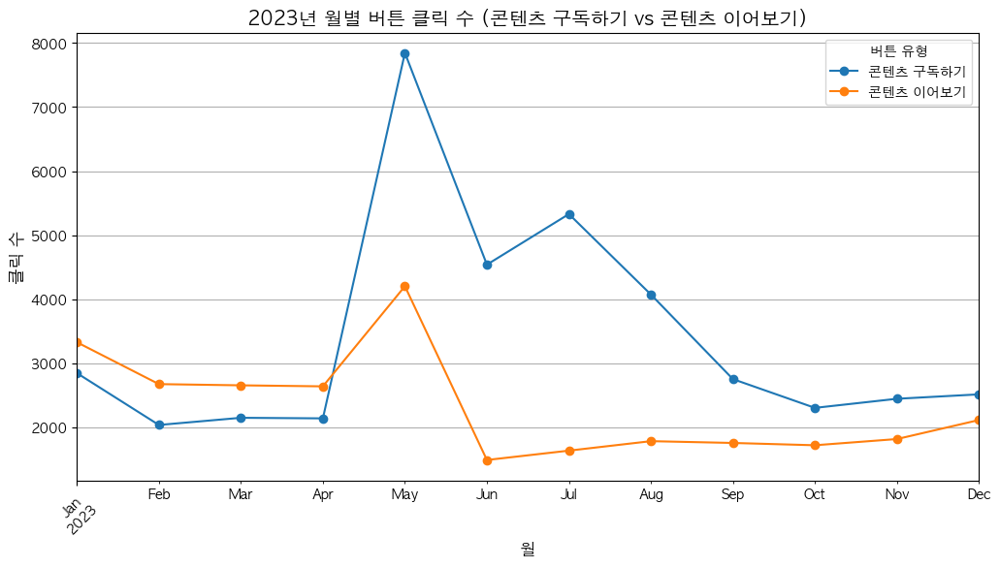

In [ ]:
# 2023년 1월부터 2023년 12월 데이터만 필터링
filtered_data = click_start_content[
    (click_start_content['month'] >= '2023-01') & (click_start_content['month'] <= '2023-12')
]

# '콘텐츠 구독하기'와 '콘텐츠 이어보기'만 선택
filtered_data = filtered_data[filtered_data['button_name_type_b'].isin(['콘텐츠 구독하기', '콘텐츠 이어보기'])]

# 월별 버튼 클릭 수 집계
monthly_button_clicks = (
    filtered_data.groupby(['month', 'button_name_type_b'])
    .size()
    .reset_index(name='count')
)

# 월별 버튼 클릭 수를 컬럼화
pivot_data = monthly_button_clicks.pivot(index='month', columns='button_name_type_b', values='count').fillna(0)

plt.figure(figsize=(12, 6))
pivot_data.plot(kind='line', marker='o', figsize=(12, 6))

plt.title("2023년 월별 버튼 클릭 수 (콘텐츠 구독하기 vs 콘텐츠 이어보기)", fontsize=14)
plt.xlabel("월", fontsize=12)
plt.ylabel("클릭 수", fontsize=12)
plt.xticks(rotation=45)
plt.legend(title="버튼 유형", fontsize=10)
plt.grid(True)

# 그래프 표시
plt.show()

In [ ]:
# 시간대(hour) 추출
click_start_content['hour'] = click_start_content['client_event_time'].dt.hour

# '콘텐츠 구독하기'와 '콘텐츠 이어보기'만 선택
filtered = click_start_content[click_start_content['button_name_type_b'].isin(['콘텐츠 구독하기', '콘텐츠 이어보기'])]

# 시간대별 버튼 클릭 횟수 집계
button_b_counts = filtered.groupby(['hour', 'button_name_type_b']).size().unstack()

# 결과 출력
display(button_b_counts)


button_name_type_b,콘텐츠 구독하기,콘텐츠 이어보기
hour,,
0,1553,1053
1,965,499
2,669,315
3,383,258
4,291,172
5,233,169
6,323,302
7,474,459
8,896,846


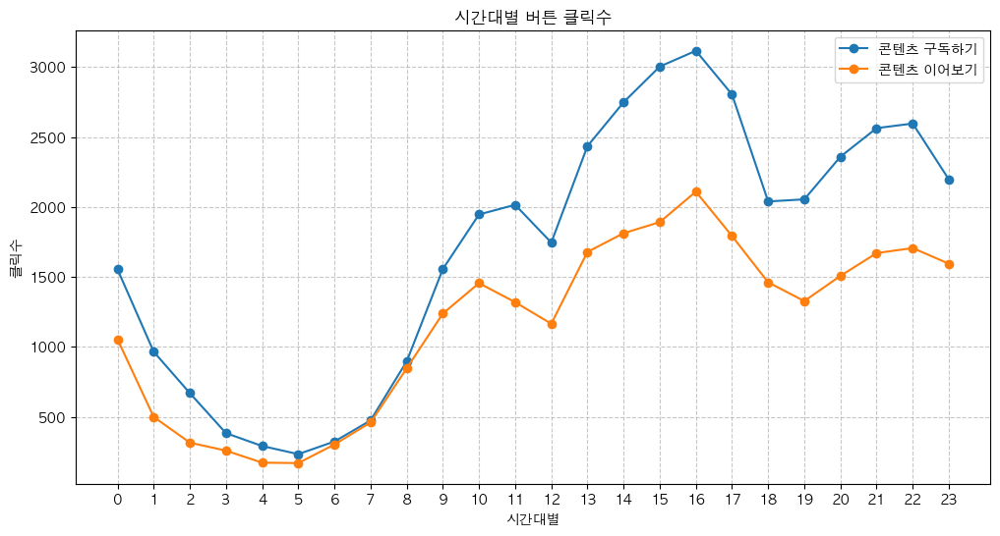

In [33]:
import matplotlib.pyplot as plt

# 그래프 그리기
plt.figure(figsize=(12, 6))

for button_type in button_b_counts.columns:
    plt.plot(button_b_counts.index, button_b_counts[button_type], label=button_type, marker='o')

# 그래프 꾸미기
plt.xlabel('시간대별')
plt.ylabel('클릭수')
plt.title('시간대별 버튼 클릭수')
plt.legend()
plt.xticks(range(24))
plt.grid(True, linestyle='--', alpha=0.7)

# 그래프 출력
plt.show()

In [41]:
# 시간대(hour) 추출
click_start_content['hour'] = click_start_content['client_event_time'].dt.hour

# '무료로 들어보기'와 '무료로 시작하기'만 선택
filtered = click_start_content[click_start_content['button_name_type_b'].isin(['무료로 들어보기', '무료로 시작하기'])]

# 시간대별 "무료" 키워드 버튼 클릭 횟수 집계
button_b_free_counts = filtered.groupby(['hour', 'button_name_type_b']).size().unstack()

# 결과 출력
display(button_b_free_counts)

button_name_type_b,무료로 들어보기,무료로 시작하기
hour,,
0,572,85
1,410,60
2,249,31
3,188,22
4,184,21
5,186,16
6,276,25
7,402,24
8,530,63


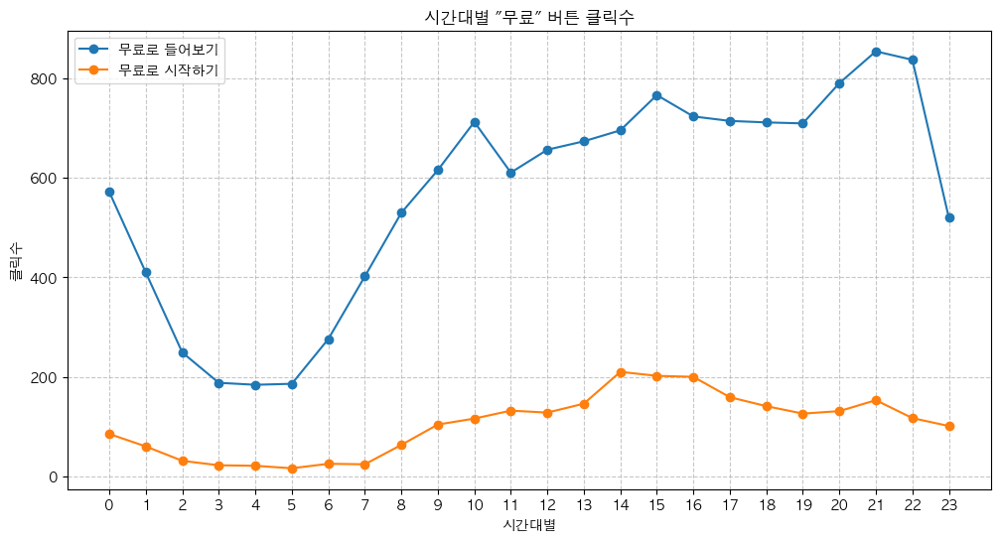

In [ ]:
# 시간대별 "무료" 버튼 클릭수
plt.figure(figsize=(12, 6))

for button_type in button_b_free_counts.columns:
    plt.plot(button_b_free_counts.index, button_b_free_counts[button_type], label=button_type, marker='o')

# 그래프 꾸미기
plt.xlabel('시간대별')
plt.ylabel('클릭수')
plt.title('시간대별 "무료" 버튼 클릭수')
plt.legend()
plt.xticks(range(24))
plt.grid(True, linestyle='--', alpha=0.7)

# 그래프 출력
plt.show()

# 6. click.content_page_more_review_button
- 콘텐츠 후기 더보기 버튼 클릭

- 보고 싶은 컬럼: client_event_review_time, country, device_family, os_name, user_id, content_id

In [5]:
click_review = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/click.content_page_more_review_button.csv')
click_review.drop(columns=['device_carrier'], inplace=True)
click_review.rename(columns={'content.id': 'content_id','client_event_time':'client_event_review_time'}, inplace=True)
click_review.head()

,city,client_event_review_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
0,Seo-gu,2023-04-10 14:10:01.402000,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,112.0.0.0,Web,558fe7e8c06b8505f11b33d76f076e56,a1eeebeb6c307641b75b94a2a1d5b9aa
1,London,2023-01-24 21:37:43.417000,United Kingdom,Windows,Windows,click.content_page_more_review_button,Korean,Whale,3.18.154.13,Web,e48956538e4df690a5d12adf1e6f2ee3,f491517f4737a60d661cd1fcacc702c0
2,Eunpyeong-gu,2023-01-31 14:44:16.897000,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,109.0.0.0,Web,e745da89019e303b122bfceac0521a8f,9aa7628a347707fb155943041e2cb524
3,Seoul,2023-01-31 14:30:36.568000,South Korea,Apple iPhone,Apple iPhone,click.content_page_more_review_button,Korean,Mobile Safari,15.6.1,Web,e2c59d444736eceee9eedba85bd4e209,f491517f4737a60d661cd1fcacc702c0
4,Seoul,2023-02-12 03:24:32.337000,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,110.0.0.0,Web,74b66b738185ffdbec960db4a0da330a,101e1d0dcc38d9c86156f008a145083e


In [67]:
# client_event_review_time을 datetime 형식으로 변환
click_review['client_event_review_time'] = pd.to_datetime(click_review['client_event_review_time'])

# 9시간 추가 (UTC+9 적용)
click_review['client_event_review_time'] = click_review['client_event_review_time'] + pd.Timedelta(hours=9)

# 시간대 정보 제거 (불필요한 +09:00 제거)
click_review['client_event_review_time'] = click_review['client_event_review_time'].dt.tz_localize(None)

# 결과 확인
display(click_review[['client_event_review_time']].head())


,client_event_review_time
0,2023-04-11 08:10:01.402
1,2023-01-25 15:37:43.417
2,2023-02-01 08:44:16.897
3,2023-02-01 08:30:36.568
4,2023-02-12 21:24:32.337


In [68]:
# 시간 변환 확인하기
click_review.head()

,city,client_event_review_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
0,Seo-gu,2023-04-11 08:10:01.402,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,112.0.0.0,Web,558fe7e8c06b8505f11b33d76f076e56,a1eeebeb6c307641b75b94a2a1d5b9aa
1,London,2023-01-25 15:37:43.417,United Kingdom,Windows,Windows,click.content_page_more_review_button,Korean,Whale,3.18.154.13,Web,e48956538e4df690a5d12adf1e6f2ee3,f491517f4737a60d661cd1fcacc702c0
2,Eunpyeong-gu,2023-02-01 08:44:16.897,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,109.0.0.0,Web,e745da89019e303b122bfceac0521a8f,9aa7628a347707fb155943041e2cb524
3,Seoul,2023-02-01 08:30:36.568,South Korea,Apple iPhone,Apple iPhone,click.content_page_more_review_button,Korean,Mobile Safari,15.6.1,Web,e2c59d444736eceee9eedba85bd4e209,f491517f4737a60d661cd1fcacc702c0
4,Seoul,2023-02-12 21:24:32.337,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,110.0.0.0,Web,74b66b738185ffdbec960db4a0da330a,101e1d0dcc38d9c86156f008a145083e


In [50]:
user_contentid = click_review[['user_id','content.id']].value_counts()
user_contentid.head(20)

user_id                           content.id                      
17d570bd01d51cf56c1b8aaa464d32c8  db82104b9c508953b3d00eea82844a48    94
f8eedef539df7b9f3486c6ea72f02012  38df90d4de533d6296b52c6a1d90e26b    69
                                  3c3701997224d03a95fbb3b34446d238    63
17d570bd01d51cf56c1b8aaa464d32c8  ddaafc2251644873b3dcde16c5d0b9ba    51
d2c7120aabd4ece896035f58b763a2dd  289ae01387d36327c04b176c6d62a626    43
8c7c7766fa75bcd1eb4ee6230d6e0815  595cb4bbfc83e683b0314ca1312cfbde    43
60b36fcc8ac9ecbbaaad1a94d5028c20  f491517f4737a60d661cd1fcacc702c0    42
0386abdf5e2b082d78084a8e325ed4ad  f4be1a0fe0e301b03115591777fddf29    42
08752824ce1a99a08232bc5286ae8f68  b314d5aba64a0aab40602cb72a4a1504    39
d2c7120aabd4ece896035f58b763a2dd  d0bce5e5af242d6d60e16b68b4febf2e    38
45473d99d11966b8791c2a1846f99cb6  3c3701997224d03a95fbb3b34446d238    37
b7882635c4ef5b45d7de3971ea65d3cf  d6227ba76134f6cf821bb98b5f235bd0    36
c1e9803519dfa2141c2011a85f4fe657  db1819d3a7a4c4d85dccb3b

# 5,6 데이터 merge

In [ ]:
# 필요한 컬럼만 선택
click_start_content_selected = click_start_content[['user_id', 'content_id','client_event_time']]  
click_review_selected = click_review[['user_id', 'content_id', 'client_event_review_time']]

# Chunk 크기 설정
chunk_size = 100000  # 한 번에 처리할 행 수
merged_chunks = []

# click_start_content_selected를 작은 조각으로 나누어 병합 수행
for chunk in np.array_split(click_start_content_selected, len(click_start_content_selected) // chunk_size + 1):
    chunk_merged = pd.merge(chunk, click_review_selected, on=['user_id', 'content_id'], how='left')
    merged_chunks.append(chunk_merged)

# 최종 병합된 데이터프레임
merged_df = pd.concat(merged_chunks, ignore_index=True)

# 컬럼명 변경
merged_df.rename(columns={'client_event_time': 'start_content_time', 'client_event_review_time': 'review_click_time'}, inplace=True)

# user_id가 NaN이고 content_id가 있는 데이터 필터링
only_content_id = merged_df[merged_df['user_id'].isna() & merged_df['content_id'].notna()]

# 결과 확인
display(only_content_id)


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:57: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


,user_id,content_id,start_content_time,review_click_time
12,NaN,61b6463287573f00de13a930805a52d6,2023-01-12 19:31:24.229000,2023-06-02 09:42:26.724000
13,NaN,61b6463287573f00de13a930805a52d6,2023-01-12 19:31:24.229000,2023-05-17 05:18:19.124000
14,NaN,61b6463287573f00de13a930805a52d6,2023-01-12 19:31:24.229000,2023-06-19 13:03:32.561000
15,NaN,61b6463287573f00de13a930805a52d6,2023-01-12 19:31:24.229000,2023-05-02 05:52:56.627000
16,NaN,61b6463287573f00de13a930805a52d6,2023-01-12 19:31:24.229000,2023-05-17 08:36:15.823000
...,...,...,...,...
109620627,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 05:41:43.314000,2023-08-11 18:08:05.984000
109620628,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 05:41:43.314000,2023-08-02 18:08:09.866000
109620629,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 05:41:43.314000,2023-08-15 10:12:29.396000
109620630,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 05:41:43.314000,2023-12-19 02:06:45.302000


### 1. 회원 가입을 하지 않고 콘텐츠만 본 케이스 분석

In [63]:
# 필요한 컬럼만 선택
click_start_content_selected = click_start_content[['user_id', 'content_id','client_event_time']]  
click_review_selected = click_review[['user_id', 'content_id', 'client_event_review_time']]

merged_df = pd.merge(click_start_content_selected, click_review_selected, on=['user_id', 'content_id'], how='left')
merged_df.rename(columns={'client_event_time': 'start_content_time','client_event_review_time':'review_click_time'}, inplace=True)

only_content_id = merged_df[merged_df['user_id'].isna() & merged_df['content_id'].notna()]

display(only_content_id)

,user_id,content_id,start_content_time,review_click_time
12,NaN,61b6463287573f00de13a930805a52d6,2023-01-13 04:31:24.229000+09:00,2023-06-02 18:42:26.724000+09:00
13,NaN,61b6463287573f00de13a930805a52d6,2023-01-13 04:31:24.229000+09:00,2023-05-17 14:18:19.124000+09:00
14,NaN,61b6463287573f00de13a930805a52d6,2023-01-13 04:31:24.229000+09:00,2023-06-19 22:03:32.561000+09:00
15,NaN,61b6463287573f00de13a930805a52d6,2023-01-13 04:31:24.229000+09:00,2023-05-02 14:52:56.627000+09:00
16,NaN,61b6463287573f00de13a930805a52d6,2023-01-13 04:31:24.229000+09:00,2023-05-17 17:36:15.823000+09:00
...,...,...,...,...
109620627,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 14:41:43.314000+09:00,2023-08-12 03:08:05.984000+09:00
109620628,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 14:41:43.314000+09:00,2023-08-03 03:08:09.866000+09:00
109620629,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 14:41:43.314000+09:00,2023-08-15 19:12:29.396000+09:00
109620630,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 14:41:43.314000+09:00,2023-12-19 11:06:45.302000+09:00


In [ ]:
# 중복 제거 (content_id, start_content_time 기준)
only_content_id_filtered = only_content_id.drop_duplicates(subset=['content_id','start_content_time'])

display(only_content_id_filtered)

,user_id,content_id,start_content_time,review_click_time
12,NaN,61b6463287573f00de13a930805a52d6,2023-01-12 19:31:24.229000,2023-06-02 09:42:26.724000
136,NaN,ab7068685b7aeac4d6b1a6c0e1c85819,2023-04-12 11:15:15.570000,2023-01-13 06:38:48.177000
295,NaN,61b6463287573f00de13a930805a52d6,2023-01-24 21:22:27.212000,2023-06-02 09:42:26.724000
397,NaN,61b6463287573f00de13a930805a52d6,2023-01-24 21:27:35.185000,2023-06-02 09:42:26.724000
499,NaN,61b6463287573f00de13a930805a52d6,2023-01-24 21:47:21.514000,2023-06-02 09:42:26.724000
...,...,...,...,...
109615204,NaN,c8affa8409b8bd58d00d3477dd2b8ba5,2023-12-29 13:18:47.836000,2023-05-19 00:48:42.977000
109615450,NaN,c269eb6df3a374b464f7c18f12fa398f,2023-10-30 00:56:40.760000,2023-06-29 02:10:58.638000
109617436,NaN,8a72eed73d3f9d3ab1771548070e7338,2023-10-10 05:57:01.036000,2023-03-02 03:37:56.128000
109617948,NaN,61b6463287573f00de13a930805a52d6,2023-10-10 05:02:56.671000,2023-06-02 09:42:26.724000


### 1-1. a/b 버튼 비교

In [9]:
# 필요한 컬럼만 선택
click_start_selected = click_start_content[['content_id', 'button_name_type_b', 'button_name_type_a']].drop_duplicates(subset=['content_id'])

# Chunk 크기 설정
chunk_size = 100000  # 한 번에 처리할 행 수
merged_chunks = []

# only_content_id_filtered를 작은 조각으로 나누어 병합 수행
for chunk in np.array_split(only_content_id_filtered, len(only_content_id_filtered) // chunk_size + 1):
    chunk_merged = pd.merge(chunk, click_start_selected, on='content_id', how='inner')
    merged_chunks.append(chunk_merged)

# 최종 병합된 데이터프레임
content_ab_testing = pd.concat(merged_chunks, ignore_index=True)

# 결과 확인
display(content_ab_testing)

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:57: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


,user_id,content_id,start_content_time,review_click_time,button_name_type_b,button_name_type_a
0,NaN,61b6463287573f00de13a930805a52d6,2023-01-12 19:31:24.229000,2023-06-02 09:42:26.724000,무료로 들어보기,NaN
1,NaN,ab7068685b7aeac4d6b1a6c0e1c85819,2023-04-12 11:15:15.570000,2023-01-13 06:38:48.177000,무료로 시작하기,NaN
2,NaN,61b6463287573f00de13a930805a52d6,2023-01-24 21:22:27.212000,2023-06-02 09:42:26.724000,무료로 들어보기,NaN
3,NaN,61b6463287573f00de13a930805a52d6,2023-01-24 21:27:35.185000,2023-06-02 09:42:26.724000,무료로 들어보기,NaN
4,NaN,61b6463287573f00de13a930805a52d6,2023-01-24 21:47:21.514000,2023-06-02 09:42:26.724000,무료로 들어보기,NaN
...,...,...,...,...,...,...
44478,NaN,c8affa8409b8bd58d00d3477dd2b8ba5,2023-12-29 13:18:47.836000,2023-05-19 00:48:42.977000,콘텐츠 이어보기,NaN
44479,NaN,c269eb6df3a374b464f7c18f12fa398f,2023-10-30 00:56:40.760000,2023-06-29 02:10:58.638000,콘텐츠 구독하기,NaN
44480,NaN,8a72eed73d3f9d3ab1771548070e7338,2023-10-10 05:57:01.036000,2023-03-02 03:37:56.128000,콘텐츠 이어보기,NaN
44481,NaN,61b6463287573f00de13a930805a52d6,2023-10-10 05:02:56.671000,2023-06-02 09:42:26.724000,무료로 들어보기,NaN


In [12]:
# 데이터 확인 (버튼 값이 NaN인지 체크)
print("button_name_type_b NaN 개수:", content_ab_testing['button_name_type_b'].isna().sum())
print("button_name_type_a NaN 개수:", content_ab_testing['button_name_type_a'].isna().sum())

# NaN이 아닌 값만 확인
display(content_ab_testing[['button_name_type_b', 'button_name_type_a']].dropna())


button_name_type_b NaN 개수: 6
button_name_type_a NaN 개수: 44477


,button_name_type_b,button_name_type_a


In [ ]:
print("review_click_time NaN 개수:", content_ab_testing['review_click_time'].isna().sum())
# 44483건 중 2825건 을 제외한 비회원들이 리뷰를 확인

review_click_time NaN 개수: 2825


In [21]:
# button_name_type_a가 NaN이 아닌 데이터만 출력
filtered_a = content_ab_testing[content_ab_testing['button_name_type_a'].notna()]
display(filtered_a)

,user_id,content_id,start_content_time,review_click_time,button_name_type_b,button_name_type_a,date
25735,NaN,5d922c8a6e9e437e7735aa1376bd79ff,2022-03-29 21:51:19.435000+09:00,2023-04-19 22:19:06.169000+09:00,NaN,수강하기,2022-03
28260,NaN,5d922c8a6e9e437e7735aa1376bd79ff,2022-04-23 15:19:44.165000+09:00,2023-04-19 22:19:06.169000+09:00,NaN,수강하기,2022-04
32021,NaN,5d922c8a6e9e437e7735aa1376bd79ff,2022-03-07 09:21:41.837000+09:00,2023-04-19 22:19:06.169000+09:00,NaN,수강하기,2022-03
35382,NaN,5d922c8a6e9e437e7735aa1376bd79ff,2022-04-15 12:52:49.332000+09:00,2023-04-19 22:19:06.169000+09:00,NaN,수강하기,2022-04
41816,NaN,ad148487cc487aceb3e3d96d48052789,2023-10-14 19:45:27.488000+09:00,NaT,NaN,수강하기,2023-10
43479,NaN,5d922c8a6e9e437e7735aa1376bd79ff,2023-07-24 12:38:58.858000+09:00,2023-04-19 22:19:06.169000+09:00,NaN,수강하기,2023-07


In [13]:
# button_name_type_b가 NaN이 아닌 데이터만 출력
filtered_b = content_ab_testing[content_ab_testing['button_name_type_b'].notna()]
display(filtered_b)


,user_id,content_id,start_content_time,review_click_time,button_name_type_b,button_name_type_a
0,NaN,61b6463287573f00de13a930805a52d6,2023-01-12 19:31:24.229000,2023-06-02 09:42:26.724000,무료로 들어보기,NaN
1,NaN,ab7068685b7aeac4d6b1a6c0e1c85819,2023-04-12 11:15:15.570000,2023-01-13 06:38:48.177000,무료로 시작하기,NaN
2,NaN,61b6463287573f00de13a930805a52d6,2023-01-24 21:22:27.212000,2023-06-02 09:42:26.724000,무료로 들어보기,NaN
3,NaN,61b6463287573f00de13a930805a52d6,2023-01-24 21:27:35.185000,2023-06-02 09:42:26.724000,무료로 들어보기,NaN
4,NaN,61b6463287573f00de13a930805a52d6,2023-01-24 21:47:21.514000,2023-06-02 09:42:26.724000,무료로 들어보기,NaN
...,...,...,...,...,...,...
44478,NaN,c8affa8409b8bd58d00d3477dd2b8ba5,2023-12-29 13:18:47.836000,2023-05-19 00:48:42.977000,콘텐츠 이어보기,NaN
44479,NaN,c269eb6df3a374b464f7c18f12fa398f,2023-10-30 00:56:40.760000,2023-06-29 02:10:58.638000,콘텐츠 구독하기,NaN
44480,NaN,8a72eed73d3f9d3ab1771548070e7338,2023-10-10 05:57:01.036000,2023-03-02 03:37:56.128000,콘텐츠 이어보기,NaN
44481,NaN,61b6463287573f00de13a930805a52d6,2023-10-10 05:02:56.671000,2023-06-02 09:42:26.724000,무료로 들어보기,NaN


In [15]:
buttonb_click_by_content = (
    filtered_b
    .groupby(['content_id', 'button_name_type_b'])
    .size()
    .reset_index(name='count')
)

display(buttonb_click_by_content)

,content_id,button_name_type_b,count
0,03b4a290c08f7fa83933827a994f2e61,콘텐츠 구독하기,35
1,0ab2b890d4068c1490b89676773256f6,콘텐츠 구독하기,251
2,101e1d0dcc38d9c86156f008a145083e,콘텐츠 구독하기,120
3,123715e9b63b3efb32cdcd947ea96aaf,콘텐츠 구독하기,45
4,165def8885b8a2ec0c92404048d7e345,콘텐츠 구독하기,68
...,...,...,...
114,f64c475280676531a31f2f8e0648599c,콘텐츠 구독하기,121
115,f6f082e10dc9c1061cb809989b361d9c,콘텐츠 구독하기,65
116,f8b0ca043f5f0437603142ae93e6a424,무료로 시작하기,75
117,fc6a9e04f693ea724c55153d1ae82c65,콘텐츠 구독하기,4


In [17]:
#1️ start_content_time을 datetime 형식으로 변환 후 UTC → KST(UTC+9) 변환
content_ab_testing['start_content_time'] = pd.to_datetime(content_ab_testing['start_content_time'])
content_ab_testing['start_content_time'] = content_ab_testing['start_content_time'].dt.tz_localize('UTC').dt.tz_convert('Asia/Seoul')
content_ab_testing['review_click_time'] = pd.to_datetime(content_ab_testing['review_click_time'])
content_ab_testing['review_click_time'] = content_ab_testing['review_click_time'].dt.tz_localize('UTC').dt.tz_convert('Asia/Seoul')

#2️ 날짜(YYYY-MM-DD)만 추출
content_ab_testing['date'] = content_ab_testing['start_content_time'].dt.to_period('M')

#3️ 날짜별(button_name_type_b 기준) 클릭 수 집계
button_clicks_by_date = (
    content_ab_testing
    .groupby(['date', 'button_name_type_b'])
    .size()
    .reset_index(name='count')
)

#4 결과 확인
display(button_clicks_by_date)

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_26200/3892480530.py:8: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  content_ab_testing['date'] = content_ab_testing['start_content_time'].dt.to_period('M')


,date,button_name_type_b,count
0,2021-11,콘텐츠 구독하기,1
1,2022-01,구독 시작하기,12
2,2022-01,무료로 시작하기,80
3,2022-01,최저가 혜택 받기,13
4,2022-01,콘텐츠 구독하기,470
...,...,...,...
138,2023-12,콘텐츠 이어보기,337
139,2024-01,구독 시작하기,1
140,2024-01,무료로 들어보기,1
141,2024-01,최저가 혜택 받기,1


In [ ]:
# 필요한 컬럼만 선택
click_start_selected = click_start_content[['content_id', 'button_name_type_b', 'button_name_type_a']].drop_duplicates(subset=['content_id'])

# Chunk 크기 설정
chunk_size = 100000  # 한 번에 처리할 행 수
merged_chunks = []

# only_content_id_filtered를 작은 조각으로 나누어 병합 수행
for chunk in np.array_split(only_content_id_filtered, len(only_content_id_filtered) // chunk_size + 1):
    chunk_merged = pd.merge(chunk, click_start_selected, on='content_id', how='inner')
    merged_chunks.append(chunk_merged)

# 최종 병합된 데이터프레임
content_ab_testing = pd.concat(merged_chunks, ignore_index=True)

# 결과 확인
display(content_ab_testing)

In [ ]:
# button b 클릭 횟수 집계
buttonb_click_by_content = (
    filtered_b
    .groupby(['start_content_time', 'button_name_type_b'])
    .size()
    .reset_index(name='count')
)

display(buttonb_click_by_content)

,start_content_time,button_name_type_b,count
0,2021-11-25 18:40:50.968000,콘텐츠 구독하기,1
1,2022-01-01 00:56:31.328000,콘텐츠 구독하기,1
2,2022-01-01 01:16:08.662000,콘텐츠 구독하기,1
3,2022-01-01 02:09:28.355000,콘텐츠 이어보기,1
4,2022-01-01 02:22:33.394000,콘텐츠 구독하기,1
...,...,...,...
44472,2023-12-31 16:11:05.984000,콘텐츠 구독하기,1
44473,2023-12-31 17:20:56.299000,콘텐츠 구독하기,1
44474,2023-12-31 21:03:10.869000,콘텐츠 구독하기,1
44475,2023-12-31 23:29:21.244000,무료로 들어보기,1


In [ ]:
# button a 클릭 횟수 집계
buttona_click_by_content = (
    filtered_a
    .groupby(['start_content_time', 'button_name_type_a'])
    .size()
    .reset_index(name='count')
)

display(buttona_click_by_content)

,start_content_time,button_name_type_a,count
0,2022-03-07 09:21:41.837000+09:00,수강하기,1
1,2022-03-29 21:51:19.435000+09:00,수강하기,1
2,2022-04-15 12:52:49.332000+09:00,수강하기,1
3,2022-04-23 15:19:44.165000+09:00,수강하기,1
4,2023-07-24 12:38:58.858000+09:00,수강하기,1
5,2023-10-14 19:45:27.488000+09:00,수강하기,1


In [18]:
filtered_b['month'] = pd.to_datetime(filtered_b['start_content_time']).dt.to_period('M')

monthly_button_clicks = (
    filtered_b.groupby(['month', 'button_name_type_b'])
    .size()
    .reset_index(name='count')
)

monthly_button_clicks_pivot = monthly_button_clicks.pivot(index='month', columns='button_name_type_b', values='count').fillna(0)

display(monthly_button_clicks_pivot)

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_26200/821245848.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_b['month'] = pd.to_datetime(filtered_b['start_content_time']).dt.to_period('M')


button_name_type_b,구독 시작하기,무료로 들어보기,무료로 시작하기,최저가 혜택 받기,콘텐츠 구독하기,콘텐츠 이어보기
month,,,,,,
2021-11,0.0,0.0,0.0,0.0,1.0,0.0
2022-01,12.0,0.0,80.0,13.0,471.0,265.0
2022-02,11.0,0.0,42.0,13.0,332.0,116.0
2022-03,12.0,0.0,73.0,30.0,727.0,219.0
2022-04,12.0,0.0,48.0,16.0,634.0,233.0
2022-05,17.0,0.0,31.0,22.0,624.0,175.0
2022-06,14.0,0.0,25.0,17.0,536.0,177.0
2022-07,8.0,79.0,9.0,13.0,232.0,78.0
2022-08,5.0,121.0,16.0,30.0,353.0,115.0


In [54]:
# 'start_content_time'을 datetime 형식으로 변환 후 '요일' 컬럼 추가
filtered_b['weekday'] = pd.to_datetime(filtered_b['start_content_time']).dt.day_name()

# 요일별 버튼 클릭 수 집계
weekday_button_clicks = (
    filtered_b.groupby(['weekday', 'button_name_type_b'])
    .size()
    .reset_index(name='count')
)

# 요일 순서 정렬 (월요일 ~ 일요일 순)
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_button_clicks['weekday'] = pd.Categorical(weekday_button_clicks['weekday'], categories=weekday_order, ordered=True)

# 피벗 테이블 생성 (요일별 버튼 클릭 수 정리)
weekday_button_clicks_pivot = weekday_button_clicks.pivot(index='weekday', columns='button_name_type_b', values='count').fillna(0)

# 결과 확인
display(weekday_button_clicks_pivot)


/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_26200/1438600949.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_b['weekday'] = pd.to_datetime(filtered_b['start_content_time']).dt.day_name()


button_name_type_b,구독 시작하기,무료로 들어보기,무료로 시작하기,최저가 혜택 받기,콘텐츠 구독하기,콘텐츠 이어보기
weekday,,,,,,
Monday,67,3563,151,111,2262,628
Tuesday,74,4081,151,93,2211,641
Wednesday,57,3419,166,101,2189,664
Thursday,57,3127,152,102,2175,683
Friday,56,3378,130,73,1884,576
Saturday,46,3496,96,70,1482,485
Sunday,48,3463,105,65,1582,517


In [25]:
filtered_a['month'] = pd.to_datetime(filtered_a['start_content_time']).dt.to_period('M')

monthly_buttona_clicks = (
    filtered_a.groupby(['month', 'button_name_type_a'])
    .size()
    .reset_index(name='count')
)

monthly_buttona_clicks_pivot = monthly_buttona_clicks.pivot(index='month', columns='button_name_type_a', values='count').fillna(0)

display(monthly_buttona_clicks_pivot)

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_26200/1615528584.py:1: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  filtered_a['month'] = pd.to_datetime(filtered_a['start_content_time']).dt.to_period('M')
/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_26200/1615528584.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_a['month'] = pd.to_datetime(filtered_a['start_content_time']).dt.to_period('M')


button_name_type_a,수강하기
month,
2022-03,2
2022-04,2
2023-07,1
2023-10,1


In [53]:
only_content_id_filtered['content_id'].value_counts().head(20)

content_id
61b6463287573f00de13a930805a52d6    24527
f4be1a0fe0e301b03115591777fddf29     3093
c269eb6df3a374b464f7c18f12fa398f     2126
68a3658f1b936bfff3bd6960cd561b0a     1037
a914987711c7e2db9fd4bff7555ec87c      855
f491517f4737a60d661cd1fcacc702c0      758
445fac33232adcb3d1cdab7d8a579430      695
621c7ad99b17d2d16832b618d47aea7e      685
220ce7873b8895d0c81c37600b5bd1e7      615
c8affa8409b8bd58d00d3477dd2b8ba5      555
afe201c04b426366e0f8e9e2207c78c2      507
7de35a9d8f14c68e5f2a8788dda5f72e      474
b314d5aba64a0aab40602cb72a4a1504      405
db82104b9c508953b3d00eea82844a48      390
595cb4bbfc83e683b0314ca1312cfbde      373
db1819d3a7a4c4d85dccb3b9e982fbcd      339
d6227ba76134f6cf821bb98b5f235bd0      333
7cebec6e79cc981dbf421c5ec2aedd9d      300
6384828b0188f36e5915ed72fdeb7157      255
0ab2b890d4068c1490b89676773256f6      251
Name: count, dtype: int64

### 2. 유저 아이디와 콘텐츠 아이디 모두 있는 경우

### 2-1. a/b 버튼 비교

In [45]:
user_content_ids = merged_df[merged_df['user_id'].notna() & merged_df['content_id'].notna()]
display(user_content_ids)

,user_id,content_id,start_content_time,review_click_time
0,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,2023-04-05 21:14:38.432000,NaN
1,f7155af01d277f11b1c7d05cf772c686,18992b667be06d6f29ba0008f99d9745,2023-04-10 14:57:20.033000,NaN
2,1b05f9fe82b80771323caa1cd5683143,dfbdae782996c25daed7517b8835f3aa,2023-04-10 14:28:29.515000,NaN
3,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa,2023-04-10 14:09:30.564000,NaN
4,353528475f2bd85934263421ccd579b3,7de35a9d8f14c68e5f2a8788dda5f72e,2023-04-10 14:10:52.368000,NaN
...,...,...,...,...
109617433,026a869fcb3cb919863847a94e5ca9fd,621c7ad99b17d2d16832b618d47aea7e,2023-10-10 05:45:04.278000,2023-10-23 09:26:25.514000
109617434,75255dc1ea8d9a782e3db5166905d12c,f4be1a0fe0e301b03115591777fddf29,2023-10-10 05:20:40.639000,NaN
109617435,f491ba4f70e5ef90c8ce2d23d631b595,f491517f4737a60d661cd1fcacc702c0,2023-10-10 05:02:51.083000,NaN
109618050,b27f37352be57de11cd62c262b2e1628,f4be1a0fe0e301b03115591777fddf29,2023-10-10 05:15:44.437000,NaN


In [ ]:
# 중복 제거 (content_id, start_content_time 기준) 132379행 중 127832행으로 줄어듦
user_content_ids_filtered = user_content_ids.drop_duplicates(subset=['content_id','start_content_time'])

display(user_content_ids_filtered)

,user_id,content_id,start_content_time,review_click_time
0,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,2023-04-05 21:14:38.432000,NaN
1,f7155af01d277f11b1c7d05cf772c686,18992b667be06d6f29ba0008f99d9745,2023-04-10 14:57:20.033000,NaN
2,1b05f9fe82b80771323caa1cd5683143,dfbdae782996c25daed7517b8835f3aa,2023-04-10 14:28:29.515000,NaN
3,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa,2023-04-10 14:09:30.564000,NaN
4,353528475f2bd85934263421ccd579b3,7de35a9d8f14c68e5f2a8788dda5f72e,2023-04-10 14:10:52.368000,NaN
...,...,...,...,...
109617433,026a869fcb3cb919863847a94e5ca9fd,621c7ad99b17d2d16832b618d47aea7e,2023-10-10 05:45:04.278000,2023-10-23 09:26:25.514000
109617434,75255dc1ea8d9a782e3db5166905d12c,f4be1a0fe0e301b03115591777fddf29,2023-10-10 05:20:40.639000,NaN
109617435,f491ba4f70e5ef90c8ce2d23d631b595,f491517f4737a60d661cd1fcacc702c0,2023-10-10 05:02:51.083000,NaN
109618050,b27f37352be57de11cd62c262b2e1628,f4be1a0fe0e301b03115591777fddf29,2023-10-10 05:15:44.437000,NaN


In [48]:
# 필요한 컬럼만 선택
click_start_selected = click_start_content[['content_id', 'button_name_type_b', 'button_name_type_a']].drop_duplicates(subset=['content_id'])

# Chunk 크기 설정
chunk_size = 100000  # 한 번에 처리할 행 수
merged_chunks = []

# user_content_ids_filtered를 작은 조각으로 나누어 병합 수행
for chunk in np.array_split(user_content_ids_filtered, len(user_content_ids_filtered) // chunk_size + 1):
    chunk_merged = pd.merge(chunk, click_start_selected, on='content_id', how='inner')
    merged_chunks.append(chunk_merged)

# 최종 병합된 데이터프레임
user_content_ab_testing = pd.concat(merged_chunks, ignore_index=True)

# 결과 확인
display(user_content_ab_testing)

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:57: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


,user_id,content_id,start_content_time,review_click_time,button_name_type_b,button_name_type_a
0,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,2023-04-05 21:14:38.432000,NaN,콘텐츠 구독하기,NaN
1,f7155af01d277f11b1c7d05cf772c686,18992b667be06d6f29ba0008f99d9745,2023-04-10 14:57:20.033000,NaN,콘텐츠 이어보기,NaN
2,1b05f9fe82b80771323caa1cd5683143,dfbdae782996c25daed7517b8835f3aa,2023-04-10 14:28:29.515000,NaN,콘텐츠 이어보기,NaN
3,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa,2023-04-10 14:09:30.564000,NaN,콘텐츠 이어보기,NaN
4,353528475f2bd85934263421ccd579b3,7de35a9d8f14c68e5f2a8788dda5f72e,2023-04-10 14:10:52.368000,NaN,콘텐츠 구독하기,NaN
...,...,...,...,...,...,...
127827,026a869fcb3cb919863847a94e5ca9fd,621c7ad99b17d2d16832b618d47aea7e,2023-10-10 05:45:04.278000,2023-10-23 09:26:25.514000,콘텐츠 구독하기,NaN
127828,75255dc1ea8d9a782e3db5166905d12c,f4be1a0fe0e301b03115591777fddf29,2023-10-10 05:20:40.639000,NaN,콘텐츠 구독하기,NaN
127829,f491ba4f70e5ef90c8ce2d23d631b595,f491517f4737a60d661cd1fcacc702c0,2023-10-10 05:02:51.083000,NaN,콘텐츠 구독하기,NaN
127830,b27f37352be57de11cd62c262b2e1628,f4be1a0fe0e301b03115591777fddf29,2023-10-10 05:15:44.437000,NaN,콘텐츠 구독하기,NaN


In [49]:
# 데이터 확인 (버튼 값이 NaN인지 체크)
print("button_name_type_b NaN 개수:", user_content_ab_testing['button_name_type_b'].isna().sum())
print("button_name_type_a NaN 개수:", user_content_ab_testing['button_name_type_a'].isna().sum())

# NaN이 아닌 값만 확인
display(user_content_ab_testing[['button_name_type_b', 'button_name_type_a']].dropna())

button_name_type_b NaN 개수: 78
button_name_type_a NaN 개수: 127755


,button_name_type_b,button_name_type_a


In [ ]:
print("review_click_time NaN 개수:", user_content_ab_testing['review_click_time'].isna().sum())

review_click_time NaN 개수: 125237


In [51]:
user_content_ab_testing['month'] = pd.to_datetime(user_content_ab_testing['start_content_time']).dt.to_period('M')

monthly_button_clicks = (
    user_content_ab_testing.groupby(['month', 'button_name_type_b'])
    .size()
    .reset_index(name='count')
)

monthly_button_clicks_pivot = monthly_button_clicks.pivot(index='month', columns='button_name_type_b', values='count').fillna(0)

display(monthly_button_clicks_pivot)

button_name_type_b,구독 시작하기,무료로 들어보기,무료로 시작하기,최저가 혜택 받기,콘텐츠 구독하기,콘텐츠 이어보기
month,,,,,,
2021-11,0.0,0.0,0.0,0.0,1.0,0.0
2021-12,0.0,0.0,1.0,0.0,4.0,0.0
2022-01,217.0,0.0,414.0,59.0,3696.0,1726.0
2022-02,209.0,0.0,326.0,47.0,2661.0,1430.0
2022-03,208.0,0.0,371.0,71.0,2982.0,1503.0
2022-04,184.0,0.0,305.0,53.0,2708.0,1523.0
2022-05,234.0,0.0,230.0,46.0,3110.0,1671.0
2022-06,221.0,0.0,257.0,54.0,3305.0,1922.0
2022-07,110.0,90.0,99.0,38.0,1311.0,805.0


In [52]:
# 'start_content_time'을 datetime 형식으로 변환 후 '요일' 컬럼 추가
user_content_ab_testing['weekday'] = pd.to_datetime(user_content_ab_testing['start_content_time']).dt.day_name()

# 요일별 버튼 클릭 수 집계
weekday_button_clicks = (
    user_content_ab_testing.groupby(['weekday', 'button_name_type_b'])
    .size()
    .reset_index(name='count')
)

# 요일 순서 정렬 (월요일 ~ 일요일 순)
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_button_clicks['weekday'] = pd.Categorical(weekday_button_clicks['weekday'], categories=weekday_order, ordered=True)

# 피벗 테이블 생성 (요일별 버튼 클릭 수 정리)
weekday_button_clicks_pivot = weekday_button_clicks.pivot(index='weekday', columns='button_name_type_b', values='count').fillna(0)

# 결과 확인
display(weekday_button_clicks_pivot)


button_name_type_b,구독 시작하기,무료로 들어보기,무료로 시작하기,최저가 혜택 받기,콘텐츠 구독하기,콘텐츠 이어보기
weekday,,,,,,
Monday,713,1468,690,232,12449,5897
Tuesday,660,1504,782,211,12211,5679
Wednesday,719,1306,727,215,11745,5543
Thursday,589,1306,674,203,10990,4962
Friday,604,1094,665,159,9441,4485
Saturday,414,1006,504,137,7679,3579
Sunday,562,1174,598,182,9411,4585


### 2-2. 유저 아이디별로 콘텐츠 클릭

In [76]:
# user_id별로 content_id 보기
grouped_users = user_content_ab_testing.groupby('user_id')[['content_id','start_content_time','review_click_time']].agg(list).reset_index()

display(grouped_users)


,user_id,content_id,start_content_time,review_click_time
0,0001435bc6c0c0f05315192f89275425,"[61b6463287573f00de13a930805a52d6, 61b64632875...","[2023-01-16 11:42:20.739000, 2023-01-16 01:00:...","[nan, nan, nan]"
1,0001f15911b404f3bf5b8571afafa4e4,[c8e53577758bf66711094352a5abd8c3],[2023-11-29 01:07:55.646000],[nan]
2,0003691a8bc9f96481baa7086ae04592,[61b6463287573f00de13a930805a52d6],[2022-11-06 11:59:00.162000],[nan]
3,0003c0ede663b9e3b55d9dc3f7e8690f,"[5cea8d6e02eb18b2660f98f424867e4d, 8a72eed73d3...","[2023-01-12 04:17:15.903000, 2023-02-07 16:40:...","[nan, nan, nan, nan, nan]"
4,000634ec5553ca63f77c61690353a0be,"[445fac33232adcb3d1cdab7d8a579430, 445fac33232...","[2023-05-26 06:06:18.658000, 2023-05-26 06:06:...","[nan, nan]"
...,...,...,...,...
35091,fff8b3be926adfb193591e262b087b74,"[d6227ba76134f6cf821bb98b5f235bd0, 18992b667be...","[2022-03-13 06:49:36.633000, 2022-03-31 13:13:...","[nan, nan, nan, nan]"
35092,fffba676b17f9f0f228360930f238f07,[f4be1a0fe0e301b03115591777fddf29],[2022-06-20 08:42:06.657000],[nan]
35093,fffcbf8ded60b689e9867bff455f4ab7,[c269eb6df3a374b464f7c18f12fa398f],[2022-09-04 02:23:06.409000],[nan]
35094,fffd757f689e039a1d4db0adc1b80b61,"[61b6463287573f00de13a930805a52d6, 61b64632875...","[2023-01-16 11:11:34.191000, 2023-01-17 00:11:...","[nan, nan]"


### 콘텐츠 시작 시간들을 다 확인해보는게 도움이 될까요?

In [84]:
# user_id별로 content_id 중복 개수 확인
duplicate_content_views = (
    user_content_ab_testing.groupby(['user_id', 'content_id'])
    .size()
    .reset_index(name='view_count')
)

# 동일한 콘텐츠를 2번 이상 본 유저만 필터링
duplicate_content_views = duplicate_content_views[duplicate_content_views['view_count'] > 1]
duplicate_content_views_sorted = duplicate_content_views.sort_values(by='view_count', ascending= False).reset_index(drop=True)

display(duplicate_content_views_sorted)

,user_id,content_id,view_count
0,b777dde614f0972559573303ab4c6e82,61b6463287573f00de13a930805a52d6,55
1,cb07a8015b8292cb8fac531c0efb58bc,afe201c04b426366e0f8e9e2207c78c2,54
2,5ad48446ba7b9970ed2b86f21703c3e4,c269eb6df3a374b464f7c18f12fa398f,37
3,cea8463faaa270971042b0245a487d00,c269eb6df3a374b464f7c18f12fa398f,36
4,51a76c72d1e9bc5e7c5c640fb45b52b7,a914987711c7e2db9fd4bff7555ec87c,36
...,...,...,...
23521,66becfadf0106697b4b4b0831cc2020b,68a3658f1b936bfff3bd6960cd561b0a,2
23522,66bc2db28ca1e719621f918c3e5f61f9,b66cb6ee3ac708fa5c0fd28265c55b36,2
23523,66b7ee05352aea2275ee25cc13c3267e,c269eb6df3a374b464f7c18f12fa398f,2
23524,66a4f5ffd2cd85d1860a2aa41474057c,f4be1a0fe0e301b03115591777fddf29,2


In [98]:
duplicate_content_views_sorted = pd.merge(
    duplicate_content_views_sorted, 
    start_content[['content_id', 'content_difficulty']],  # 필요한 컬럼만 선택
    on='content_id',
    how='inner'
)

duplicate_content_views_sorted.head()

,user_id,content_id,view_count,content_difficulty
0,b777dde614f0972559573303ab4c6e82,61b6463287573f00de13a930805a52d6,55,beginner
1,b777dde614f0972559573303ab4c6e82,61b6463287573f00de13a930805a52d6,55,beginner
2,b777dde614f0972559573303ab4c6e82,61b6463287573f00de13a930805a52d6,55,beginner
3,b777dde614f0972559573303ab4c6e82,61b6463287573f00de13a930805a52d6,55,beginner
4,b777dde614f0972559573303ab4c6e82,61b6463287573f00de13a930805a52d6,55,beginner


In [99]:
duplicate_content_views_sorted = duplicate_content_views_sorted.drop_duplicates(subset=['user_id', 'content_id'])

### 한 콘텐츠를 여러 번 클릭하는 (최대 55번이나..) 유저들 발견 
- 학생일까, 관리자일까

In [103]:
duplicate_content_views_sorted = duplicate_content_views_sorted.reset_index(drop=True)
duplicate_content_views_sorted.head()

,user_id,content_id,view_count,content_difficulty
0,b777dde614f0972559573303ab4c6e82,61b6463287573f00de13a930805a52d6,55,beginner
1,cb07a8015b8292cb8fac531c0efb58bc,afe201c04b426366e0f8e9e2207c78c2,54,beginner
2,5ad48446ba7b9970ed2b86f21703c3e4,c269eb6df3a374b464f7c18f12fa398f,37,advanced
3,cea8463faaa270971042b0245a487d00,c269eb6df3a374b464f7c18f12fa398f,36,advanced
4,51a76c72d1e9bc5e7c5c640fb45b52b7,a914987711c7e2db9fd4bff7555ec87c,36,advanced


In [101]:
difficulty_counts = duplicate_content_views_sorted['content_difficulty'].value_counts().reset_index()
difficulty_counts.columns = ['content_difficulty', 'count']

# 결과 출력
display(difficulty_counts)


,content_difficulty,count
0,intermediate,8849
1,beginner,7810
2,advanced,6582
3,hard,258


In [92]:
# 한 유저당 콘텐츠 클릭 수 
user_content_count = user_content_ids_filtered.groupby('user_id')['content_id'].nunique().sort_values(ascending=False)
user_content_count

user_id
3bc001ca42b22a7446687c3d183af0cd    66
6421bf3808b89da97f316eac07da2b91    59
caec8b3be818f1408e0d47d89acc245f    55
d2691bedf9ae0bc97a182e57361bdeb8    54
38410d6be64b42c85ed796fbe9e3d368    51
                                    ..
6df6a322c618f8fa9413dd050a85c71f     1
6df49741ff96dfada8cde7a8c1ec4d54     1
6dec728300e7f49f04d02fdae3b7ae71     1
6deba6d26a6a07c2d16ed54498b0fbf9     1
7fb5dcf84ccc668104e1d8aba8fef8f8     1
Name: content_id, Length: 35096, dtype: int64

In [ ]:
user_subscription = pd.merge(duplicate_content_views_sorted, renew_subscription, on=['user_id'], how='inner')
user_subscription.head()

,user_id,content_id,view_count,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,plan_price,paid_amount,coupon.discount_amount,pg_type
0,0a636d3bc32f16c6410f02a989507aa4,e543c38ec7fa6bcd5045049ecc31e5f8,27,Daejeon,2023-06-08 11:39:53.835,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,114.0.0.0,Web,15920,15920,0,NaN
1,0a636d3bc32f16c6410f02a989507aa4,e543c38ec7fa6bcd5045049ecc31e5f8,27,Daejeon,2023-07-08 11:40:01.674,South Korea,Linux,Linux,renew.subscription,Korean,Chrome,114.0.0.0,Web,15920,15920,0,NaN
2,f4494127d16db5407aa49aa04fb0d2b0,220ce7873b8895d0c81c37600b5bd1e7,26,Seocho-gu,2022-12-24 00:09:32.626,South Korea,Samsung Phone,Samsung Galaxy Z Flip3 5G,renew.subscription,Korean,Samsung Browser,18.0,Web,79200,79200,0,NaN
3,f4494127d16db5407aa49aa04fb0d2b0,5917bd6f3a17698c4871f999e6b4d078,24,Seocho-gu,2022-12-24 00:09:32.626,South Korea,Samsung Phone,Samsung Galaxy Z Flip3 5G,renew.subscription,Korean,Samsung Browser,18.0,Web,79200,79200,0,NaN
4,a992106c67684123d8e27431ecb3687a,f491517f4737a60d661cd1fcacc702c0,23,Gangnam-gu,2023-06-23 15:45:01.249,South Korea,Windows,Windows,renew.subscription,Korean,Edge,114.0.1823.51,Web,15920,15920,0,NaN


In [93]:
user_subscription.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15675 entries, 0 to 15674
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   user_id                 15675 non-null  object
 1   content_id              15675 non-null  object
 2   view_count              15675 non-null  int64 
 3   city                    15547 non-null  object
 4   client_event_time       15675 non-null  object
 5   country                 15671 non-null  object
 6   device_family           15671 non-null  object
 7   device_type             15492 non-null  object
 8   event_type              15675 non-null  object
 9   language                15671 non-null  object
 10  os_name                 15669 non-null  object
 11  os_version              15664 non-null  object
 12  platform                15671 non-null  object
 13  plan_price              15675 non-null  int64 
 14  paid_amount             15675 non-null  int64 
 15  co

# 7. enter.payment_page
- 결제 페이지 진입

In [9]:
enter_payment = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.payment_page.csv')
enter_payment.drop(columns=['device_carrier'], inplace=True)
enter_payment.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seoul,2023-04-05 21:31:27.602000,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.payment_page,Korean,Chrome,112.0.0.0,Web,8ee58bcaa05b234cdbf84167c0983385
1,Wonju,2023-04-05 21:33:30.699000,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,111.0.0.0,Web,74d17c27a41656e7788b0c81d9f76cda
2,Daejeon,2023-04-05 21:05:28.337000,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,111.0.1661.62,Web,62cfa08370da60b8db4495baaff62806
3,Seoul,2023-04-05 21:45:27.935000,South Korea,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce
4,Seoul,2023-04-05 21:46:50.632000,South Korea,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce


In [58]:
enter_payment.isna().sum()

city                 2699
client_event_time       0
country               162
device_family           1
device_type          5995
event_type              0
language                0
os_name                 0
os_version            501
platform                0
user_id              6227
dtype: int64

In [61]:
# 'client_event_time'을 datetime 형식으로 변환
enter_payment['client_event_time'] = pd.to_datetime(enter_payment['client_event_time'], errors='coerce')

# 날짜만 추출
enter_payment['date'] = enter_payment['client_event_time'].dt.to_period('M')

# `user_id`가 NaN인 데이터만 필터링
null_user_data = enter_payment[enter_payment['user_id'].isna()]

# 날짜별 `NaN user_id` 개수 집계
null_user_counts = null_user_data.groupby('date').size()

# 결과 출력
display(null_user_counts)


date
2022-11      45
2022-12     151
2023-01     231
2023-02     963
2023-03     146
2023-04     106
2023-05     154
2023-06     327
2023-07     650
2023-08     573
2023-09     795
2023-10     889
2023-11    1032
2023-12     165
Freq: M, dtype: int64

# 8. complete.subscription
- 첫 결제 완료

In [10]:
complete_subscription = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/complete.subscription.csv')
complete_subscription.drop(columns=['device_carrier'], inplace=True)
complete_subscription.rename(columns={'pg.type': 'pg_type','plan.price':'plan_price','coupon.discout_amount':'coupon_discout_amount'}, inplace=True)
complete_subscription.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon.discount_amount,pg_type
0,Nowon-gu,2023-04-05 21:40:04.000000,South Korea,Windows,Windows,complete.subscription,Korean,Edge,111.0.1661.62,Web,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 14:20:03.008000,South Korea,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,16.3,Web,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 08:46:14.026000,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN
3,Geumjeong-gu,2023-04-12 11:35:01.865000,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180,131600,131600,0,NaN
4,Gwangmyeong,2023-05-31 01:25:55.820000,South Korea,Mac,Mac,complete.subscription,Korean,Chrome,113.0.0.0,Web,d4f54ecf6c4d7bf8742f80505f02d6dc,15920,15920,0,NaN


In [63]:
#결측치 확인
complete_subscription.isna().sum()

city                        532
client_event_time             0
country                     383
device_family               375
device_type                 525
event_type                    0
language                    375
os_name                     381
os_version                  390
platform                    375
user_id                       0
plan.price                    0
paid_amount                   0
coupon.discount_amount        0
pg.type                   12647
dtype: int64

In [64]:
# 날짜를 datetime 형식으로 변환
complete_subscription['client_event_time'] = pd.to_datetime(complete_subscription['client_event_time'], errors='coerce')

# 최소 및 최대 날짜 확인
min_date = complete_subscription['client_event_time'].min()
max_date = complete_subscription['client_event_time'].max()

print(f"최소 날짜: {min_date}")
print(f"최대 날짜: {max_date}")

# 이상치 찾기
outliers_date = complete_subscription[
    (complete_subscription['client_event_time'] < '2000-01-01') | 
    (complete_subscription['client_event_time'] > '2024-01-01')
]

# 결과 출력
print("날짜 이상치:")
print(outliers_date)

최소 날짜: 2022-01-01 06:17:24.513000
최대 날짜: 2023-12-31 16:27:37.370000
날짜 이상치:
Empty DataFrame
Columns: [city, client_event_time, country, device_family, device_type, event_type, language, os_name, os_version, platform, user_id, plan.price, paid_amount, coupon.discount_amount, pg.type]
Index: []


In [67]:
complete_subscription['pg.type'].value_counts()

pg.type
A    1029
B     613
Name: count, dtype: int64

In [70]:
# 시간대별 버튼 클릭 횟수 보기
complete_subscription['client_event_time'] = pd.to_datetime(complete_subscription['client_event_time'], errors='coerce')
complete_subscription['month'] = complete_subscription['client_event_time'].dt.to_period('M')

# 날짜별 간편결제 건수
pg_counts = complete_subscription.groupby(['month', 'pg.type']).size().unstack()

# 결과 출력
display(pg_counts)

pg.type,A,B
month,,
2023-10,53.0,NaN
2023-11,476.0,105.0
2023-12,500.0,508.0


In [77]:
complete_subscription['plan.price'].unique()

array([ 15920, 131600,  95200,  91200,  87200,  83200,  19920,  14328,
        42960, 118440,  79200,  95520])

In [78]:
complete_subscription['plan.price'].value_counts()

plan.price
15920     7704
131600    1892
79200     1217
42960     1130
95520      870
83200      563
95200      346
87200      336
91200      221
14328        7
118440       2
19920        1
Name: count, dtype: int64

In [83]:
# 쿠폰 할인율 계산하기

complete_subscription['coupon_discount_rate'] = (
    (complete_subscription['coupon.discount_amount'] / complete_subscription['plan.price']) * 100
).round(2)

filtered_discounts = complete_subscription.dropna(subset=['coupon.discount_amount'])

display(complete_subscription[['month','plan.price', 'paid_amount', 
                          'coupon.discount_amount', 
                          'coupon_discount_rate']])

,month,plan.price,paid_amount,coupon.discount_amount,coupon_discount_rate
0,2023-04,15920,15920,0,0.0
1,2023-04,131600,131600,0,0.0
2,2023-03,131600,119756,11844,9.0
3,2023-04,131600,131600,0,0.0
4,2023-05,15920,15920,0,0.0
...,...,...,...,...,...
14284,2023-12,95520,95520,0,0.0
14285,2023-12,95520,95520,0,0.0
14286,2023-12,95520,95520,0,0.0
14287,2023-10,131600,131600,0,0.0


In [84]:
complete_subscription['coupon_discount_rate'] = (
    (complete_subscription['coupon.discount_amount'] / complete_subscription['plan.price']) * 100
).round(2)

complete_subscription['coupon_discount_rate'].value_counts()

coupon_discount_rate
0.00     11364
15.00     1253
75.13      793
20.00      336
10.00      313
25.00      110
3.00        31
40.00       23
50.00       18
2.09        17
5.00        13
9.00         8
7.00         6
4.59         2
37.69        1
30.00        1
Name: count, dtype: int64

In [85]:
complete_subscription['coupon_discount_rate'].unique()

array([ 0.  ,  9.  , 10.  , 40.  ,  5.  ,  3.  , 20.  , 50.  ,  4.59,
       75.13, 15.  , 25.  ,  7.  , 37.69, 30.  ,  2.09])

In [74]:
# 날짜별 첫 결제 확인해보기
complete_subscription['client_event_time'] = pd.to_datetime(complete_subscription['client_event_time'], errors='coerce')
complete_subscription['month'] = complete_subscription['client_event_time'].dt.to_period('M')

first_payment = complete_subscription.groupby(['month', 'plan.price']).size().unstack()

# 결과 출력
display(first_payment)

plan.price,14328,15920,19920,42960,79200,83200,87200,91200,95200,95520,118440,131600
month,,,,,,,,,,,,
2022-01,NaN,22.0,NaN,27.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0
2022-02,NaN,310.0,NaN,132.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,91.0
2022-03,NaN,403.0,NaN,142.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,112.0
2022-04,NaN,319.0,NaN,134.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,109.0
2022-05,NaN,364.0,NaN,171.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,97.0
2022-06,NaN,340.0,NaN,166.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96.0
2022-07,NaN,431.0,NaN,173.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,112.0
2022-08,NaN,234.0,NaN,82.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81.0
2022-09,NaN,188.0,NaN,31.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.0


# 9. renew.subscription
- 정기 결제 완료

In [87]:
renew_subscription = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/renew.subscription.csv')
renew_subscription.drop(columns=['device_carrier'], inplace=True)
renew_subscription.rename(columns={'pg.type': 'pg_type','plan.price':'plan_price','coupon.discout_amount':'coupon_discout_amount'}, inplace=True)
renew_subscription.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon.discount_amount,pg_type
0,Nam-gu,2022-09-08 03:05:02.068,South Korea,Windows,Windows,renew.subscription,Korean,Edge,104,Web,6ddea3af2eaae869861c1190dcc9d4a3,15920,15920,0,NaN
1,Nam-gu,2022-09-08 03:40:02.050,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,c2d47034960fdff5df495822ff66fbc1,15920,15920,0,NaN
2,Dongjak-gu,2022-09-08 03:49:00.829,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,de91f1226dd938990fefc79545daf468,42960,40812,2148,NaN
3,Yongin-si,2022-09-08 04:10:06.406,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,bf14840a8cb4643e6d557da96e35a3af,15920,15920,0,NaN
4,Dongjak-gu,2022-09-08 04:40:01.895,South Korea,Android,Android,renew.subscription,Korean,Chrome Mobile,103,Web,7ddc1c2990d0645d82885394e3c518b5,15920,15920,0,NaN


In [71]:
# 시간대별 버튼 클릭 횟수 보기
renew_subscription['client_event_time'] = pd.to_datetime(renew_subscription['client_event_time'], errors='coerce')
renew_subscription['month'] = renew_subscription['client_event_time'].dt.to_period('M')

# 날짜별 간편결제 건수
pg_counts = renew_subscription.groupby(['month', 'pg.type']).size().unstack()

# 결과 출력
display(pg_counts)

pg.type,A,B,C
month,,,
2023-10,136.0,NaN,5.0
2023-11,973.0,10.0,21.0
2023-12,1470.0,94.0,23.0


# 10. resubscribe.subscription
- 만료 후 재구독 완료

In [12]:
resubscribe_subscription = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/resubscribe.subscription.csv')
resubscribe_subscription.drop(columns=['device_carrier'], inplace = True)
resubscribe_subscription.rename(columns={'pg.type': 'pg_type','plan.price':'plan_price','coupon.discout_amount':'coupon_discout_amount'}, inplace=True)
resubscribe_subscription.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon.discount_amount,pg_type
0,Daejeon,2023-04-05 21:11:45.525,South Korea,Windows,Windows,resubscribe.subscription,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,15920,15920,0,NaN
1,Seoul,2023-06-30 09:59:56.848,South Korea,Samsung Phone,Samsung Galaxy S22+,resubscribe.subscription,Korean,Chrome WebView,113.0.5672.162,Web,68831c27e47f0e8f04ba809baeec218e,15920,15920,0,NaN
2,Nowon-gu,2023-06-13 06:20:22.524,South Korea,Windows,Windows,resubscribe.subscription,Korean,Chrome,114.0.0.0,Web,4e7568cb7db01f8386614ec2c6c961cd,15920,15920,0,NaN
3,Suwon,2023-06-11 11:02:11.878,South Korea,Windows,Windows,resubscribe.subscription,Korean,Chrome,114.0.0.0,Web,f91f19527b9ec688e028ec884b1b5c1c,131600,131600,0,NaN
4,Koishikawa,2023-06-13 14:39:25.736,Japan,Apple iPhone,Apple iPhone,resubscribe.subscription,Japanese,Chrome,114.0.5735.99,Web,2276d7d2a31e05f4a5558c6406cc36c9,131600,131600,0,NaN


In [72]:
# 시간대별 버튼 클릭 횟수 보기
resubscribe_subscription['client_event_time'] = pd.to_datetime(resubscribe_subscription['client_event_time'], errors='coerce')
resubscribe_subscription['month'] = resubscribe_subscription['client_event_time'].dt.to_period('M')

# 날짜별 간편결제 건수
pg_counts = resubscribe_subscription.groupby(['month', 'pg.type']).size().unstack()

# 결과 출력
display(pg_counts)

pg.type,A,B
month,,
2023-10,6.0,NaN
2023-11,60.0,3.0
2023-12,57.0,47.0


# 11. start.free_trial
- 서비스 무료체험 시작

In [13]:
start_free_trial = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/start.free_trial.csv')
start_free_trial.drop(columns=['device_carrier','os_version','platform'], inplace = True)
start_free_trial.rename(columns={'trial.type': 'trial_type','plan.price':'plan_price','plan.type':'plan_type','client_event_time':'start_ft_time'}, inplace=True)
start_free_trial.head()

,city,start_ft_time,country,device_family,device_type,event_type,language,os_name,user_id,plan_price,plan_type,trial_type
0,Seoul,2023-04-05 21:49:36.156000,South Korea,Mac,Mac,start.free_trial,Korean,Safari,06b6868000a5d576180aca47896d6cce,15920.0,1개월 플랜,B
1,Dobong-gu,2023-03-12 08:28:29.384000,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,40acc1ddfc012f3d2f58a3de95e9e748,15920.0,1개월 플랜,B
2,NaN,2023-03-12 08:35:00.107000,NaN,NaN,NaN,start.free_trial,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B
3,Seoul,2023-04-12 11:36:50.250000,South Korea,Mac,Mac,start.free_trial,Korean,Safari,cc8051a75f62278b0e4216dd0a182d8c,15920.0,1개월 플랜,B
4,NaN,2023-02-18 04:13:20.822000,NaN,NaN,NaN,start.free_trial,NaN,NaN,4cc436ad294973993ccad3e3a70053a7,131600.0,12개월 플랜,B


In [87]:
start_free_trial['plan.type'].value_counts()

plan.type
1개월 플랜     1278
12개월 플랜    1161
Name: count, dtype: int64

In [88]:
start_free_trial['user_id'].nunique()

16309

In [10]:
start_free_trial['user_id'].isna().sum()

14

In [89]:
start_free_trial['trial.type'].value_counts()

trial.type
A    28182
B     2439
Name: count, dtype: int64

In [90]:
#각 날짜별 trial type 보기
start_free_trial['client_event_time'] = pd.to_datetime(start_free_trial['client_event_time'])

monthly_trial = (
    start_free_trial
    .groupby([start_free_trial['client_event_time'].dt.to_period('M'), 'trial.type'])
    .size()
    .unstack(fill_value=0)
    .reset_index()
)

display(monthly_trial)

trial.type,client_event_time,A,B
0,2021-12,5,0
1,2022-01,4706,0
2,2022-02,3021,0
3,2022-03,4187,0
4,2022-04,4117,0
5,2022-05,4763,0
6,2022-06,4753,0
7,2022-07,1469,0
8,2022-08,304,0
9,2022-09,372,0


# 12. start.content
- 콘텐츠 수강 시작

In [95]:
start_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/start.content.csv')
start_content.drop(columns=['device_carrier'], inplace = True)
start_content.rename(columns={'content.id': 'content_id', 'content.difficulty': 'content_difficulty'}, inplace=True)
start_content.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty
0,Daejeon,2023-04-05 21:14:39.906000,South Korea,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner
1,Seoul,2023-04-05 21:50:19.674000,South Korea,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner
2,Seoul,2023-04-10 14:06:26.585000,South Korea,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner
3,Toronto,2023-04-10 14:15:29.040000,Canada,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner
4,Seoul,2023-04-10 14:21:36.467000,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced


In [92]:
start_content['content.difficulty'].value_counts()

content.difficulty
beginner        58628
intermediate    36109
advanced        27485
hard             2695
Name: count, dtype: int64

In [93]:
content_level_count = start_content[['user_id','content.difficulty']].value_counts()
content_level_count.head(20)

user_id                           content.difficulty
f59e4102149edeb73cb33ccecf95dcd9  advanced              48
cc180eef3ffd3497eb8a575165bab389  advanced              45
28068259a009cf16d0e19ae1896b1f22  advanced              43
caec8b3be818f1408e0d47d89acc245f  advanced              37
d4ab482f7d12adb21f6e9b1c68367d17  advanced              36
40504dbd203dd148d1801171d04ceb5d  advanced              34
6421bf3808b89da97f316eac07da2b91  advanced              34
5c0fe6d9885212ba763dea44677ad037  advanced              32
53141e48b97505b9f1d5ae210967b8ee  advanced              32
6ffc35355c182a39e4e3739a8df0fed4  advanced              31
61ae68a40e1d1aadc79dc6a41825c923  advanced              31
63518a68900f95baa9d76fb444a4e183  advanced              31
85ac0cd1c2a7fa2939df3061ec822eb1  advanced              31
0ea2cadbe7c50ef5c0fd22aa1a800bea  advanced              31
9e50bb9740e9dcc09b04e952e8934504  advanced              30
b53ed38fbc92e9d582322a00b5716995  advanced              29
5b7

# 13. enter.lesson_page
- 레슨 시작
- is_free_trial: 무료 공개 레슨에 대한 진입 여부. 특정 기준 시점 사용 x
- is_trial: 무료 공개 레슨에 대한 진입이면서 그 유저가 현재 구독하지 않은 회원인지 여부

In [15]:
enter_lesson = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.lesson_page.csv')
enter_lesson.drop(columns=['device_carrier'], inplace = True)
enter_lesson.rename(columns={'content.id': 'content_id', 'lesson.id': 'lesson_id'}, inplace=True)
enter_lesson.head()

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_1037/3907151809.py:1: DtypeWarning: Columns (9,13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  enter_lesson = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.lesson_page.csv')


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,is_trial,lesson_id,is_free_trial
0,Wonju,2023-04-05 21:46:04.333000,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
1,Wonju,2023-04-05 21:55:50.787000,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
2,Wonju,2023-04-05 21:55:55.684000,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,770740696ab1809d6b50d4013b64a75c,NaN
3,Dongdaemun-gu,2023-04-05 21:04:55.828000,South Korea,Mac,Mac,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4,5fc64d786416b980cfda86afd69e4516,False,68cc362ca81b5899b3c9b4dea0aaddff,NaN
4,Dongdaemun-gu,2023-04-05 21:05:34.139000,South Korea,Mac,Mac,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4,db43a841c994231e2795d4df8931af50,False,144682f4648f81de8e6aabd11b92105e,NaN


In [99]:
enter_lesson['is_free_trial'].value_counts()
# False 값 개수 세기
false_count = (enter_lesson['is_free_trial'] == False).sum()
# True 값 개수 세기
true_count = (enter_lesson['is_free_trial'] == True).sum()

# 2) 출력
print(f"무료 공개 레슨에 대한 진입이 아닌 유저 : {false_count}명")
print(f"무료 공개 레슨에 대한 진입 유저 : {true_count}명")

무료 공개 레슨에 대한 진입이 아닌 유저 : 2154743명
무료 공개 레슨에 대한 진입 유저 : 69015명


In [ ]:
enter_lesson['is_trial'].value_counts()
# False 값 개수 세기
false_count = (enter_lesson['is_trial'] == False).sum()
# True 값 개수 세기
true_count = (enter_lesson['is_trial'] == True).sum()

# 출력
print(f"무료 공개 에피소드에 대한 진입, 구독하지 않은 회원 수 : {true_count}명")
print(f"무료 공개 에피소드에 대한 진입, 구독한 회원 수 : {false_count}명")

무료 공개 에피소드에 대한 진입, 구독하지 않은 회원 수 : 105735명
무료 공개 에피소드에 대한 진입, 구독한 회원 수 : 13549952명


# 14. complete.lesson
- 레슨 완료

In [16]:
complete_lesson = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/complete.lesson.csv')
complete_lesson.drop(columns=['device_carrier'], inplace=True)
complete_lesson.rename(columns={'content.id': 'content_id', 'lesson.id': 'lesson_id'}, inplace=True)
complete_lesson.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,lesson_id
0,Wonju,2023-04-05 21:55:51.836000,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,d360d68b65fd3e0eafb7982386d75fd9
1,Daejeon,2023-04-05 21:19:01.243000,South Korea,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,7e0f6aae886368ef9fa97007a8e9f7ac
2,Daejeon,2023-04-05 21:20:27.939000,South Korea,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,d1e93c9dc08267efab31849bc6083854
3,Daejeon,2023-04-05 21:23:01.534000,South Korea,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,f22ea5dc431035305e705552bbc4f45b
4,Daejeon,2023-04-05 21:28:34.965000,South Korea,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,ce0bfeb7fb1259c588f437d48ab2690c


# 15. click.lesson_page_related_question_box
- 레슨 페이지 내 질문 목록 클릭

In [17]:
lesson_comment = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/click.lesson_page_related_question_box.csv')
lesson_comment.drop(columns=['device_carrier'], inplace = True)
lesson_comment.rename(columns={'content.id': 'content_id', 'lesson.id': 'lesson_id','question.id':'question_id'}, inplace=True)
lesson_comment.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,question_id,content_id,lesson_id
0,Dong-gu,2023-04-05 21:51:48.377000,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,111.0.0.0,Web,117f95e12266dcf8f911ae39ff55a800,c654f9825245640595af9b8aecb150aa,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
1,Dong-gu,2023-04-05 21:52:21.689000,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,111.0.0.0,Web,117f95e12266dcf8f911ae39ff55a800,898fb79fc740dc8705b52fb32521d5d5,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
2,Dong-gu,2023-04-05 21:52:42.481000,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,111.0.0.0,Web,117f95e12266dcf8f911ae39ff55a800,9fb80c124d57fd31494738e0af5437a3,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
3,Goyang-si,2023-04-05 21:20:15.032000,South Korea,Mac,Mac,click.lesson_page_related_question_box,Korean,Chrome,111.0.0.0,Web,e1f3ecae035a3c8ae8cf789fbde98995,9016e2246486e852992ccd9ae0eb27ca,c269eb6df3a374b464f7c18f12fa398f,395bdf0293b24ec47d5a9e960574f851
4,Goyang-si,2023-04-05 21:21:55.275000,South Korea,Mac,Mac,click.lesson_page_related_question_box,Korean,Chrome,111.0.0.0,Web,e1f3ecae035a3c8ae8cf789fbde98995,4ecd552eeded70b3274b8edf3ecacbd9,c269eb6df3a374b464f7c18f12fa398f,a738c7835388066e2618af1e5ebacb3c


# 16. end.content
- 콘텐츠 수강 완료

In [18]:
end_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/end.content.csv')
end_content.drop(columns=['device_carrier'], inplace=True)
end_content.rename(columns={'content.id':'content_id'})
end_content.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id
0,Yokohama,2023-04-10 14:02:10.600000,Japan,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c
1,Seoul,2023-04-10 14:21:26.466000,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c
2,Seongbuk-gu,2023-04-10 14:37:04.440000,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7
3,Seo-gu,2023-04-10 14:37:19.909000,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a
4,Seo-gu,2023-04-10 14:08:58.968000,South Korea,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa


# 17. click.cancel_plan_button
- 구독 취소 버튼 클릭

In [19]:
click_cancel = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/click.cancel_plan_button.csv')
click_cancel.drop(columns=['device_carrier'], inplace = True)
click_cancel.head()


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Daegu,2023-04-10 14:57:48.556,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,111.0.0.0,Web,9e59ecf9a8fbe9051bd0d54f4b702f30
1,Seoul,2023-03-12 08:26:16.224,South Korea,Apple iPad,Apple iPad,click.cancel_plan_button,English,Mobile Safari,16.3,Web,4ed4d8f12c45504a148bfff0f2e9466e
2,Uijeongbu-si,2023-03-12 08:23:04.955,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,110.0.0.0,Web,b6a1bba3cc4139d7dc821561319221e6
3,Dobong-gu,2023-03-12 08:32:39.271,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,110.0.0.0,Web,40acc1ddfc012f3d2f58a3de95e9e748
4,Geumjeong-gu,2023-04-12 11:36:28.311,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180


In [ ]:
#필요한 라이브러리 불러오기
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# 한글 폰트 설정
plt.rcParams['font.family'] = 'AppleGothic'  # Mac 사용자

# 마이너스(-) 폰트 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False


# 1. enter.main_page
- 서비스 메인 페이지 진입

In [ ]:
enter_main = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.main_page.csv')
enter_main.drop(columns=['device_carrier','os_version','device_family'], inplace=True)
enter_main.rename(columns={'client_event_time': 'enter_main_time'}, inplace=True)
enter_main.drop(enter_main[enter_main['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
enter_main['enter_main_time'] = pd.to_datetime(enter_main['enter_main_time'])

# 9시간 추가 (UTC+9 적용)
enter_main['enter_main_time'] = enter_main['enter_main_time'] + pd.Timedelta(hours=9)

# 시간 필터링
enter_main = enter_main.loc[
    enter_main['enter_main_time'].dt.year.between(2022, 2023)
]

enter_main.head()

,city,enter_main_time,country,device_type,event_type,language,os_name,platform,user_id
0,Seongnam-si,2023-04-05 21:55:06.140000,South Korea,Samsung Galaxy S21 5G,enter.main_page,Korean,Whale,Web,NaN
1,Dongdaemun-gu,2023-04-05 21:04:28.967000,South Korea,Mac,enter.main_page,Korean,Chrome,Web,b2b31f00b82edc6419b25324a7ae41a4
2,Hwaseong-si,2023-04-05 21:01:31.258000,South Korea,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,Web,NaN
3,Hwaseong-si,2023-04-05 21:02:50.374000,South Korea,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,Web,NaN
4,Seoul,2023-04-05 21:30:33.727000,South Korea,Samsung Galaxy A51 5G,enter.main_page,Korean,Chrome,Web,NaN


In [5]:
# client_event_time을 datetime 형식으로 변환
enter_main['enter_main_time'] = pd.to_datetime(enter_main['enter_main_time'])

# 9시간 추가 (UTC+9 적용)
enter_main['enter_main_time'] = enter_main['enter_main_time'] + pd.Timedelta(hours=9)

# 시간 필터링
enter_main = enter_main.loc[
    enter_main['enter_main_time'].dt.year.between(2022, 2023)
]

In [8]:

enter_main_country = enter_main.groupby(['country', 'os_name']).size().sort_values(ascending=False)
enter_main_country.head(50)

country         os_name             
South Korea     Chrome                  965850
                Mobile Safari           249331
                Instagram               202030
                Edge                    127482
                Samsung Browser         124485
                Chrome WebView           91362
                Whale                    78019
                Safari                   66443
                Chrome Mobile            61750
                WebKit                   52913
                Facebook                 38446
                GSA                      10897
United States   Chrome                   10848
South Korea     Firefox                   5685
Japan           Chrome                    3021
Canada          Chrome                    2472
United States   Mobile Safari             2183
Germany         Chrome                    1617
South Korea     Opera                     1212
Singapore       Chrome                    1157
United States   Safari 

In [57]:
main_page_language = enter_main['language'].value_counts()
main_page_language.head(10)

language
Korean        2021080
English        104838
Japanese         2416
Chinese          1316
Russian           792
Vietnamese        727
French            556
German            426
Spanish           349
Thai              151
Name: count, dtype: int64

시간대별 방문 횟수:
hour
0      90439
1      62050
2      41093
3      27485
4      20445
5      18879
6      25670
7      43632
8      70479
9      93756
10    108848
11    107103
12     98367
13    121018
14    125937
15    131467
16    133709
17    124196
18    107301
19    107298
20    116511
21    125066
22    126568
23    106231
Name: count, dtype: int64


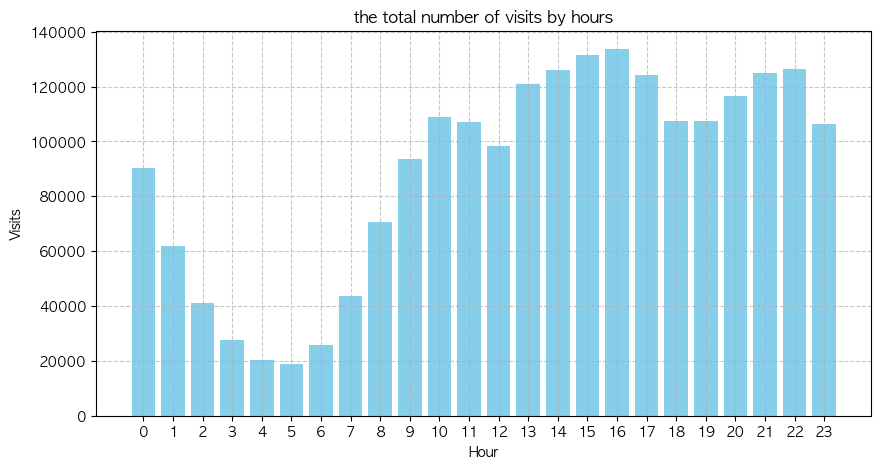

In [58]:
import pytz
import matplotlib.pyplot as plt

# 'client_event_time'을 datetime 형식으로 변환
enter_main['client_event_time'] = pd.to_datetime(enter_main['client_event_time'], errors='coerce')

# UTC → 한국 시간 (KST, UTC+9) 변환
utc = pytz.utc
kst = pytz.timezone('Asia/Seoul')

enter_main['client_event_time'] = (
    enter_main['client_event_time']
    .dt.tz_localize(utc)    # 먼저 UTC 시간대로 지정
    .dt.tz_convert(kst)     # 한국 시간(KST)으로 변환
)

# 시간대(hour) 추출
enter_main['hour'] = enter_main['client_event_time'].dt.hour

# 시간대별 방문 횟수 집계
hourly_counts = enter_main['hour'].value_counts().sort_index()

# 결과 출력
print("시간대별 방문 횟수:")
print(hourly_counts)

# 시각화 (막대 그래프)
plt.figure(figsize=(10, 5))
plt.bar(hourly_counts.index, hourly_counts.values, color='skyblue')
plt.xlabel('Hour')
plt.ylabel('Visits')
plt.title('the total number of visits by hours')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(range(24))
plt.show()


In [59]:
enter_main['device_family'].unique()

array(['Samsung Phone', 'Mac', 'Samsung Galaxy Note', 'Apple iPhone',
       'Samsung SM-S916N', 'Windows', 'Apple iPad',
       'Samsung Galaxy Phone', 'LGE Phone', 'Samsung SM-S911N',
       'Samsung Tablet', 'Redmi Phone', 'Xiaomi Phone', 'Linux', 'K',
       'Samsung SM-S918N', 'LG LM-X220N', 'CentOS', 'Chromium OS',
       'LG LM-V409N', 'LGM-X600K', 'LG LM-V510N', '2201117TY',
       'LG LM-V500N', 'Samsung Galaxy Tab', 'Mi 9T Pro',
       'Google Nexus Phone', 'G91', 'LG V607L', 'LG LM-G820N',
       'LG LM-G710N', 'Ubuntu', 'LG LM-Q920N', 'Huawei Phone', nan,
       'MobiGo2', 'LGM-V300S', 'LG LM-Q925L', 'LG LM-Q630N', 'LG F800L',
       'LG LM-Q520N', 'LG LM-Q510N', 'LGM-V300L', 'Lenovo TB-J706F',
       '2201116SG', 'M2101K7AG', 'Samsung SM-T825N', 'Blackberry Phone',
       'LG V525', 'LG LM-Q815K', 'LG LM-X410S', 'LG LM-Q725S',
       'LG LM-Q927L', 'LGM-V300K', 'LGM-G600S', 'LG LM-X625N',
       'Huawei M2-802L', '21051182G', 'LG LM-Q925S', 'IM-100K',
       'M2101K7BNY', 

In [60]:
device_family = enter_main['device_family'].value_counts()
device_family.head(10)

device_family
Windows                 845411
Apple iPhone            486263
Samsung Phone           234494
Mac                     233654
Android                 166296
K                        41600
Samsung Galaxy Note      30449
Samsung Galaxy Phone     26938
Apple iPad               20644
Linux                    16489
Name: count, dtype: int64

# 2. enter.signup_page
- 회원가입 페이지 진입

In [7]:
enter_signup = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.signup_page.csv')
enter_signup.drop(columns=['device_carrier','os_version','device_family'], inplace=True)
enter_signup.rename(columns={'client_event_time': 'enter_signup_time'}, inplace=True)
enter_signup.drop(enter_signup[enter_signup['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
enter_signup['enter_signup_time'] = pd.to_datetime(enter_signup['enter_signup_time'])

# 9시간 추가 (UTC+9 적용)
enter_signup['enter_signup_time'] = enter_signup['enter_signup_time'] + pd.Timedelta(hours=9)

# 시간 필터링
enter_signup = enter_signup.loc[
    enter_signup['enter_signup_time'].dt.year.between(2022, 2023)
]

enter_signup

,city,enter_signup_time,country,device_type,event_type,language,os_name,platform,user_id
0,Seoul,2023-04-06 06:30:42.557,South Korea,Samsung Galaxy A51 5G,enter.signup_page,Korean,Chrome,Web,NaN
1,Seoul,2023-04-06 06:37:41.467,South Korea,NaN,enter.signup_page,Korean,Chrome,Web,NaN
2,Seoul,2023-04-06 06:05:53.237,South Korea,Apple iPhone,enter.signup_page,Korean,Mobile Safari,Web,NaN
3,Gangnam-gu,2023-04-06 06:41:58.269,South Korea,Mac,enter.signup_page,Korean,Safari,Web,NaN
4,Seoul,2023-04-06 06:44:53.294,South Korea,Mac,enter.signup_page,Korean,Safari,Web,NaN
...,...,...,...,...,...,...,...,...,...
596824,Dalseo-gu,2023-10-10 14:32:53.865,South Korea,Windows,enter.signup_page,Korean,Edge,Web,NaN
596825,Hanam,2023-10-10 14:33:14.433,South Korea,Windows,enter.signup_page,Korean,Chrome,Web,NaN
596826,Seoul,2023-10-10 14:49:45.856,South Korea,Windows,enter.signup_page,Korean,Edge,Web,NaN
596827,Dongjak-gu,2023-10-10 14:57:02.640,South Korea,Windows,enter.signup_page,Korean,Edge,Web,NaN


# 3. complete.sign up
- 회원가입 완료

In [8]:
complete_signup = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/complete.signup.csv')
complete_signup.drop(columns=['device_carrier','os_version','device_family'], inplace=True)
complete_signup.rename(columns={'client_event_time': 'complete_signup_time'}, inplace=True)
complete_signup.drop(complete_signup[complete_signup['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
complete_signup['complete_signup_time'] = pd.to_datetime(complete_signup['complete_signup_time'])

# 9시간 추가 (UTC+9 적용)
complete_signup['complete_signup_time'] = complete_signup['complete_signup_time'] + pd.Timedelta(hours=9)

# 시간 필터링
complete_signup = complete_signup.loc[
    complete_signup['complete_signup_time'].dt.year.between(2022, 2023)
]

complete_signup

,city,complete_signup_time,country,device_type,event_type,language,os_name,platform,user_id,type
0,NaN,2023-04-06 06:33:26.068,NaN,NaN,complete.signup,NaN,NaN,NaN,74d17c27a41656e7788b0c81d9f76cda,kakao
1,NaN,2023-04-06 06:45:18.672,NaN,NaN,complete.signup,NaN,NaN,NaN,06b6868000a5d576180aca47896d6cce,kakao
2,Seo-gu,2023-04-10 23:47:56.424,South Korea,Windows,complete.signup,Korean,Chrome,Web,e131c319972bd580146c5a2faba26613,kakao
3,Suwon,2023-04-10 23:25:45.920,South Korea,Apple iPhone,complete.signup,Korean,Mobile Safari,Web,e3b8bfa80d866f296aad139e09023ef3,naver
4,NaN,2023-04-10 23:09:50.698,NaN,NaN,complete.signup,NaN,NaN,NaN,5208a60918f18562ac9d668a35b20303,kakao
...,...,...,...,...,...,...,...,...,...,...
145128,NaN,2023-10-10 14:10:04.854,NaN,NaN,complete.signup,NaN,NaN,NaN,0117038cc69fe8a40388ec19bb0a495e,kakao
145129,NaN,2023-10-10 14:16:31.995,NaN,NaN,complete.signup,NaN,NaN,NaN,bc1a28ff902daba9399e7f602cc86285,kakao
145130,NaN,2023-10-10 14:27:53.140,NaN,NaN,complete.signup,NaN,NaN,NaN,0d507104136f139cbc9f6fa1db365162,google
145131,NaN,2023-10-10 14:33:30.471,NaN,NaN,complete.signup,NaN,NaN,NaN,298e200203472e5bc0f9a14053e1dfe1,google


In [18]:
complete_signup['type'].value_counts()

type
kakao       89484
google      21465
naver       19440
email       14126
facebook      442
test            1
Name: count, dtype: int64

In [19]:
complete_signup['language'].value_counts()

language
Korean        44163
English        1466
Japanese         50
Chinese          23
Vietnamese       16
French           12
Russian          12
German            7
Spanish           6
Uzbek             4
Indonesian        3
Ukrainian         1
Turkish           1
Arabic            1
Galician          1
Portuguese        1
Name: count, dtype: int64

In [21]:
signup_city = complete_signup['city'].value_counts()
signup_city.head(20)

city
Seoul              8564
Gangnam-gu         1311
Suwon              1264
Seongnam-si        1181
Yongin-si           975
Goyang-si           865
Seo-gu              814
Seocho-gu           737
Gwanak-gu           731
Incheon             711
Songpa-gu           699
Buk-gu              689
Bucheon-si          611
Dongjak-gu          598
Nam-gu              584
Yeongdeungpo-gu     553
Mapo-gu             550
Anyang-si           540
Jung-gu             534
Gangseo-gu          530
Name: count, dtype: int64

In [19]:
complete_signup['city'].unique()

array([nan, 'Seo-gu', 'Suwon', 'Eunpyeong-gu', 'Daedeok-gu', 'Songpa-gu',
       'Hwaseong-si', 'Gwanak-gu', 'Andong', 'Jungnang-gu', 'Goyang-si',
       'Pyeongtaek-si', 'Jinju', 'Buk-gu', 'Seongbuk-gu', 'Busanjin-gu',
       'Seoul', 'Yeosu', 'Gyeryong-si', 'Gangnam-gu', 'Yangcheon-gu',
       'Dalseo-gu', 'Gwangmyeong', 'Hanam', 'Incheon', 'Asan', 'Gimhae',
       'Gangbuk-gu', 'Namdong-gu', 'Seongnam-si', 'Seodaemun-gu',
       'Yeongdeungpo-gu', 'Busan', 'Geumcheon-gu', 'Seongdong-gu',
       'Yongin-si', 'Gangseo-gu', 'Gimcheon', 'Sejong', 'Ansan-si',
       'Geumjeong-gu', 'Guro-gu', 'Gangdong-gu', 'Suncheon', 'Namyangju',
       'Paju', 'Suseong-gu', 'Yuseong-gu', 'Bucheon-si', 'Icheon-si',
       'Auckland', 'Jeju City', 'Gwangmyeong-si', 'Mokpo', 'Mungyeong',
       'Uijeongbu-si', "Yangp'yong", 'Nam-gu', 'Guri-si', 'Anyang-si',
       'Kwangyang', 'Siheung-si', 'Uiwang', 'Cheongju-si', 'Seocho-gu',
       'Gwacheon-si', 'Jung-gu', 'Gunpo', 'Cheonan', 'Dongdaemun-gu',
       

# 4. enter.content_page
- 콘텐츠 개별 페이지 진입
- 가입을 안해도 개별 콘텐츠 페이지에 들어올 수 있음

In [6]:
enter_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.content_page.csv')
enter_content.drop(columns=['device_carrier'], inplace=True)
enter_content.rename(columns={'content.id': 'content_id'}, inplace=True)
enter_content.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
0,Seoul,2023-04-05 21:40:35.740000,South Korea,Apple iPhone,Apple iPhone,enter.content_page,Korean,Chrome,108.0.5359.112,Web,d57aba7b4527e71b96135deaaec57def,220ce7873b8895d0c81c37600b5bd1e7
1,Hwaseong-si,2023-04-05 21:01:59.950000,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.content_page,Korean,Chrome,111.0.0.0,Web,NaN,ecde9a1b01763f791c3a185d53b5f394
2,Daejeon,2023-04-05 21:13:12.038000,South Korea,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,b8d4ec0133e5ce485055bfd69cd28abd
3,Daejeon,2023-04-05 21:14:25.355000,South Korea,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430
4,Seoul,2023-04-05 21:44:23.759000,South Korea,Samsung Phone,Samsung Galaxy S20 FE 5G,enter.content_page,Korean,Samsung Browser,14.2,Web,NaN,7cebec6e79cc981dbf421c5ec2aedd9d


In [ ]:
# 모바일 환경, 웹 환경 사용 비율 확인해보기
enter_content['os_name'].value_counts()

os_name
Chrome                  1311815
Edge                     172214
Mobile Safari             81828
Safari                    79381
Whale                     76407
Samsung Browser           62859
Instagram                 35221
Chrome WebView            30677
Chrome Mobile             30082
WebKit                    14381
Firefox                    7414
Facebook                   5509
GSA                        2689
Chrome Headless            1562
Opera                       865
Avast Secure Browser        396
Yandex                      297
Android Browser             179
Opera Touch                  87
MIUI Browser                 76
Electron                     61
Silk                         44
WeChat                       22
Puffin                       13
Chromium                     10
Line                          6
AVG Secure Browser            5
QQBrowser                     3
UCBrowser                     3
Maxthon                       2
Name: count, dtype: int64

# 5. click.content_page_start_content_button
- 콘텐츠 수강하기 버튼 클릭
1. 인기 있는 무료 컨텐츠(미끼) vs 인기 없는 무료 컨텐츠의 구독 전환률    
2. **[학습 전환율]** 콘텐츠 리뷰 클릭수가 콘텐트 시작으로 이어지나?

In [10]:
click_start_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/click.content_page_start_content_button.csv')
click_start_content.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
click_start_content.rename(columns={'client_event_time': 'click_start_content_time'}, inplace=True)
click_start_content.drop(click_start_content[click_start_content['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
click_start_content['click_start_content_time'] = pd.to_datetime(click_start_content['click_start_content_time'])

# 9시간 추가 (UTC+9 적용)
click_start_content['click_start_content_time'] = click_start_content['click_start_content_time'] + pd.Timedelta(hours=9)

# 시간 필터링
click_start_content = click_start_content.loc[
    click_start_content['click_start_content_time'].dt.year.between(2022, 2023)]

# button name 변수명 수정하기
click_start_content.rename(columns={'button_name': 'button_name_type_a', 'button.name': 'button_name_type_b','content.id': 'content_id'}, inplace=True)
click_start_content.head()

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_25392/3860315906.py:1: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  click_start_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/click.content_page_start_content_button.csv')


,city,click_start_content_time,country,device_type,event_type,language,os_name,user_id,content_id,button_name_type_b,button_name_type_a
0,Daejeon,2023-04-06 06:14:38.432,South Korea,Windows,click.content_page_start_content_button,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,콘텐츠 구독하기,NaN
1,Seongnam-si,2023-04-10 23:57:20.033,South Korea,Windows,click.content_page_start_content_button,Korean,Edge,f7155af01d277f11b1c7d05cf772c686,18992b667be06d6f29ba0008f99d9745,콘텐츠 이어보기,NaN
2,Yangp'yong,2023-04-10 23:28:29.515,South Korea,Windows,click.content_page_start_content_button,Korean,Chrome,1b05f9fe82b80771323caa1cd5683143,dfbdae782996c25daed7517b8835f3aa,콘텐츠 이어보기,NaN
3,Seo-gu,2023-04-10 23:09:30.564,South Korea,Windows,click.content_page_start_content_button,Korean,Chrome,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa,콘텐츠 이어보기,NaN
4,Seo-gu,2023-04-10 23:10:52.368,South Korea,Windows,click.content_page_start_content_button,Korean,Chrome,353528475f2bd85934263421ccd579b3,7de35a9d8f14c68e5f2a8788dda5f72e,콘텐츠 구독하기,NaN


# 6. click.content_page_more_review_button
- 콘텐츠 후기 더보기 버튼 클릭

In [9]:
click_review = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/click.content_page_more_review_button.csv')
click_review.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
click_review.rename(columns={'client_event_time': 'click_review_time'}, inplace=True)
click_review.drop(click_review[click_review['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
click_review['click_review_time'] = pd.to_datetime(click_review['click_review_time'])

# 9시간 추가 (UTC+9 적용)
click_review['click_review_time'] = click_review['click_review_time'] + pd.Timedelta(hours=9)

# 시간 필터링
click_review = click_review.loc[
    click_review['click_review_time'].dt.year.between(2022, 2023)]

# button name 변수명 수정하기
click_review.rename(columns={'button_name': 'button_name_type_a', 'button.name': 'button_name_type_b','content.id': 'content_id'}, inplace=True)
click_review.head()

,city,click_review_time,country,device_type,event_type,language,os_name,user_id,content_id
0,Seo-gu,2023-04-10 23:10:01.402,South Korea,Windows,click.content_page_more_review_button,Korean,Chrome,558fe7e8c06b8505f11b33d76f076e56,a1eeebeb6c307641b75b94a2a1d5b9aa
1,London,2023-01-25 06:37:43.417,United Kingdom,Windows,click.content_page_more_review_button,Korean,Whale,e48956538e4df690a5d12adf1e6f2ee3,f491517f4737a60d661cd1fcacc702c0
2,Eunpyeong-gu,2023-01-31 23:44:16.897,South Korea,Windows,click.content_page_more_review_button,Korean,Chrome,e745da89019e303b122bfceac0521a8f,9aa7628a347707fb155943041e2cb524
3,Seoul,2023-01-31 23:30:36.568,South Korea,Apple iPhone,click.content_page_more_review_button,Korean,Mobile Safari,e2c59d444736eceee9eedba85bd4e209,f491517f4737a60d661cd1fcacc702c0
4,Seoul,2023-02-12 12:24:32.337,South Korea,Windows,click.content_page_more_review_button,Korean,Chrome,74b66b738185ffdbec960db4a0da330a,101e1d0dcc38d9c86156f008a145083e


In [ ]:
# 많이 클릭된 콘텐츠 분포
user_contentid = click_review['content_id'].value_counts()
user_contentid.head(20)

content_id
f4be1a0fe0e301b03115591777fddf29    12765
710ffb5be9f89772b7baa9f62c9c8805     3119
7cebec6e79cc981dbf421c5ec2aedd9d     2623
f491517f4737a60d661cd1fcacc702c0     2319
32cf55a55adcc30ad80b674c0fee2ff4     2217
ff7998135d650dbefb3f479c900cbcc7     2038
595cb4bbfc83e683b0314ca1312cfbde     1698
b314d5aba64a0aab40602cb72a4a1504     1554
c269eb6df3a374b464f7c18f12fa398f     1541
d6227ba76134f6cf821bb98b5f235bd0      827
68a3658f1b936bfff3bd6960cd561b0a      700
afe201c04b426366e0f8e9e2207c78c2      671
a914987711c7e2db9fd4bff7555ec87c      628
621c7ad99b17d2d16832b618d47aea7e      565
6384828b0188f36e5915ed72fdeb7157      453
db1819d3a7a4c4d85dccb3b9e982fbcd      429
4641438a6c81ef572d997dbdc9100f8b      419
ab7068685b7aeac4d6b1a6c0e1c85819      392
b8d4ec0133e5ce485055bfd69cd28abd      392
220ce7873b8895d0c81c37600b5bd1e7      388
Name: count, dtype: int64

# 5,6,8 데이터 merge
- 13번 데이터에서 무료 콘텐츠 리스트 뽑아냄
- 첫 결제로 넘어갔는지 보기 위해 8번 데이터 merge

In [ ]:
# 필요한 컬럼만 선택
click_start_content_selected = click_start_content[['user_id', 'content_id', 'click_start_content_time', 'os_name']]
click_review_selected = click_review[['user_id', 'content_id', 'click_review_time', 'os_name']]
complete_subscription_selected = complete_subscription[['user_id', 'complete_subscription_time', 'os_name']]

# Chunk 크기 설정
chunk_size = 100000  # 한 번에 처리할 행 수
merged_chunks = []

# click_review_selected는 (user_id, content_id)를 기준으로 병합하므로 인덱스 설정
click_review_selected.set_index(['user_id', 'content_id'], inplace=True)

# complete_subscription_selected는 user_id만 기준으로 병합하므로 user_id만 인덱스로 설정
complete_subscription_selected.set_index('user_id', inplace=True)

# click_start_content_selected를 작은 조각으로 나누어 병합 수행
for chunk in np.array_split(click_start_content_selected, len(click_start_content_selected) // chunk_size + 1):
    # chunk를 기준으로 review 데이터와 병합 (left join)
    chunk_merged = chunk.merge(click_review_selected, on=['user_id', 'content_id'], how='left')

    # 구독 완료 데이터는 user_id 기준으로 병합 (content_id 없음)
    chunk_merged = chunk_merged.merge(complete_subscription_selected, on='user_id', how='left')

    merged_chunks.append(chunk_merged)

# 최종 병합된 데이터프레임
merged_df = pd.concat(merged_chunks, ignore_index=True)

# 날짜 컬럼을 datetime으로 변환 (필요한 경우)
merged_df['click_start_content_time'] = pd.to_datetime(merged_df['click_start_content_time'])
merged_df['click_review_time'] = pd.to_datetime(merged_df['click_review_time'])
merged_df['complete_subscription_time'] = pd.to_datetime(merged_df['complete_subscription_time'])

# 2022~2023년 데이터 필터링
merged_df = merged_df.loc[
    merged_df['click_start_content_time'].dt.year.between(2022, 2023)
]

# 결과 확인
display(merged_df)



/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:57: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


,user_id,content_id,click_start_content_time,os_name_x,click_review_time,os_name_y,complete_subscription_time,os_name
0,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,2023-04-06 06:14:38.432,Edge,NaT,NaN,2022-06-23 17:07:25.279,Chrome
1,f7155af01d277f11b1c7d05cf772c686,18992b667be06d6f29ba0008f99d9745,2023-04-10 23:57:20.033,Edge,NaT,NaN,2023-03-12 18:04:27.409,Samsung Browser
2,1b05f9fe82b80771323caa1cd5683143,dfbdae782996c25daed7517b8835f3aa,2023-04-10 23:28:29.515,Chrome,NaT,NaN,NaT,NaN
3,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa,2023-04-10 23:09:30.564,Chrome,NaT,NaN,2023-04-03 08:20:01.495,Chrome
4,353528475f2bd85934263421ccd579b3,7de35a9d8f14c68e5f2a8788dda5f72e,2023-04-10 23:10:52.368,Chrome,NaT,NaN,2023-04-03 08:20:01.495,Chrome
...,...,...,...,...,...,...,...,...
47193334,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 14:41:43.314,Chrome,2023-08-03 03:08:09.866,Chrome,NaT,NaN
47193335,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 14:41:43.314,Chrome,2023-08-15 19:12:29.396,Whale,NaT,NaN
47193336,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 14:41:43.314,Chrome,2023-12-19 11:06:45.302,Edge,NaT,NaN
47193337,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 14:41:43.314,Chrome,2023-08-06 00:37:58.488,Chrome,NaT,NaN


In [ ]:
# 무료 콘텐츠 ID 목록만 필터링
filtered_merged_df = merged_df[merged_df['content_id'].apply(
    lambda x: isinstance(x, list) and any(cid in free_contents_ids for cid in x)
)]


In [ ]:
# `user_id`가 NaN인 행 제거
merged_df = merged_df.dropna(subset=['user_id'])

# 중복값 제거 (같은 콘텐츠 ID와 클릭 시간이 중복될 경우 하나만 유지)
merged_df = merged_df.drop_duplicates(subset=['content_id', 'click_start_content_time'], keep='first')

# content_id가 리스트 형태가 아닐 가능성이 있으므로 explode() 적용
merged_df_exploded = merged_df.explode('content_id')

# 무료 콘텐츠 ID만 필터링
filtered_merged_df = merged_df_exploded[merged_df_exploded['content_id'].isin(free_contents_ids)]

# 다시 user_id 기준으로 그룹화 (리스트로 변환)
filtered_grouped_df = filtered_merged_df.groupby('user_id').agg({
    'content_id': list,  # 콘텐츠 ID 리스트로 묶음
    'click_start_content_time': list,  # 클릭 시간 리스트화
    'click_review_time': list,  # 리뷰한 시간 리스트화
    'complete_subscription_time': list,  # 구독한 시간 리스트화
    'os_name_x': list  # OS 리스트
}).reset_index()

# 결과 확인
display(filtered_grouped_df)



,user_id,content_id,click_start_content_time,click_review_time,complete_subscription_time,os_name_x
0,0001435bc6c0c0f05315192f89275425,"[61b6463287573f00de13a930805a52d6, 61b64632875...","[2023-01-16 20:42:20.739000, 2023-01-16 10:00:...","[NaT, NaT, NaT]","[NaT, NaT, NaT]","[Chrome, Chrome, Chrome]"
1,0003691a8bc9f96481baa7086ae04592,[61b6463287573f00de13a930805a52d6],[2022-11-06 20:59:00.162000],[NaT],[NaT],[Chrome Mobile]
2,0003c0ede663b9e3b55d9dc3f7e8690f,[8a72eed73d3f9d3ab1771548070e7338],[2023-02-08 01:40:05.215000],[NaT],[NaT],[Chrome]
3,000634ec5553ca63f77c61690353a0be,"[445fac33232adcb3d1cdab7d8a579430, 445fac33232...","[2023-05-26 15:06:18.658000, 2023-05-26 15:06:...","[NaT, NaT]","[NaT, NaT]","[Instagram, Instagram]"
4,000722d5152d121ef57d8246dff4ac91,[f4be1a0fe0e301b03115591777fddf29],[2022-12-13 18:54:50.431000],[NaT],[NaT],[Chrome]
...,...,...,...,...,...,...
24961,fff60192556898a9001de93f8708bedf,"[f4be1a0fe0e301b03115591777fddf29, 710ffb5be9f...","[2022-11-19 09:40:53.996000, 2022-11-21 03:11:...","[NaT, NaT]","[NaT, NaT]","[Chrome, Chrome]"
24962,fff8b3be926adfb193591e262b087b74,[d6227ba76134f6cf821bb98b5f235bd0],[2022-03-13 15:49:36.633000],[NaT],[NaT],[Chrome]
24963,fffba676b17f9f0f228360930f238f07,[f4be1a0fe0e301b03115591777fddf29],[2022-06-20 17:42:06.657000],[NaT],[NaT],[Chrome]
24964,fffd757f689e039a1d4db0adc1b80b61,"[61b6463287573f00de13a930805a52d6, 61b64632875...","[2023-01-16 20:11:34.191000, 2023-01-17 09:11:...","[NaT, NaT]","[NaT, NaT]","[Mobile Safari, WebKit]"


### 1. 무료 콘텐츠를 들은 유저 중 구독한 유저 vs 구독하지 않은 유저 비율 계산

In [36]:
# 무료 콘텐츠를 들은 유저 수
total_users = len(filtered_grouped_df)

# complete_subscription_time이 NaN이 아닌 (구독한) 유저 수
subscribed_users = filtered_grouped_df['complete_subscription_time'].apply(lambda x: any(pd.notna(x))).sum()

# 구독하지 않은 유저 수
non_subscribed_users = total_users - subscribed_users

# 비율 계산
subscribed_ratio = subscribed_users / total_users * 100
non_subscribed_ratio = non_subscribed_users / total_users * 100

# 결과 출력
print(f"✅ 총 유저 수: {total_users}")
print(f"✅ 구독한 유저 수: {subscribed_users} ({subscribed_ratio:.2f}%)")
print(f"✅ 구독하지 않은 유저 수: {non_subscribed_users} ({non_subscribed_ratio:.2f}%)")


✅ 총 유저 수: 24966
✅ 구독한 유저 수: 7657 (30.67%)
✅ 구독하지 않은 유저 수: 17309 (69.33%)


In [35]:
# 콘텐츠별 클릭 횟수 계산
click_counts = filtered_merged_df['content_id'].value_counts().reset_index()
click_counts.columns = ['content_id', 'click_count']

# 클릭 수가 많은 상위 10개 콘텐츠 확인
top_clicked_contents = click_counts.sort_values(by='click_count', ascending=False).head(10)

display(top_clicked_contents)

,content_id,click_count
0,f4be1a0fe0e301b03115591777fddf29,13140
1,61b6463287573f00de13a930805a52d6,8858
2,68a3658f1b936bfff3bd6960cd561b0a,4589
3,d6227ba76134f6cf821bb98b5f235bd0,3347
4,7cebec6e79cc981dbf421c5ec2aedd9d,3260
5,445fac33232adcb3d1cdab7d8a579430,2607
6,afe201c04b426366e0f8e9e2207c78c2,2545
7,621c7ad99b17d2d16832b618d47aea7e,2071
8,710ffb5be9f89772b7baa9f62c9c8805,2031
9,a914987711c7e2db9fd4bff7555ec87c,1845


### 2. 인기있는 콘텐츠와 인기 없는 콘텐츠의 구독 전환율 차이

In [ ]:
#  무료 콘텐츠별 클릭 횟수 계산
content_click_counts = filtered_merged_df['content_id'].value_counts().reset_index()
content_click_counts.columns = ['content_id', 'click_count']

# 클릭 수 기준 상위 20%를 인기 콘텐츠, 하위 20%를 비인기 콘텐츠로 정의
top_20_contents = content_click_counts['click_count'].quantile(0.8)
bottom_20_contents = content_click_counts['click_count'].quantile(0.2)

popular_contents = set(content_click_counts[content_click_counts['click_count'] >= top_20_contents]['content_id'])
unpopular_contents = set(content_click_counts[content_click_counts['click_count'] <= bottom_20_contents]['content_id'])

# 인기 콘텐츠 & 비인기 콘텐츠를 들은 유저 필터링
users_from_popular = filtered_grouped_df[filtered_grouped_df['content_id'].apply(lambda x: any(cid in popular_contents for cid in x))]
users_from_unpopular = filtered_grouped_df[filtered_grouped_df['content_id'].apply(lambda x: any(cid in unpopular_contents for cid in x))]

# 구독 전환율 계산 함수
def calculate_subscription_rate(user_df):
    total_users = len(user_df)
    subscribed_users = user_df['complete_subscription_time'].apply(lambda x: any(pd.notna(x))).sum()
    return (subscribed_users / total_users) * 100 if total_users > 0 else 0

# 인기 콘텐츠 vs 비인기 콘텐츠 첫 구독 전환율 계산
popular_conversion_rate = calculate_subscription_rate(users_from_popular)
unpopular_conversion_rate = calculate_subscription_rate(users_from_unpopular)

# 결과 출력
print(f"✅ 인기 있는 무료 콘텐츠 첫 구독 전환율: {popular_conversion_rate:.2f}%")
print(f"✅ 인기 없는 무료 콘텐츠 첫 구독 전환율: {unpopular_conversion_rate:.2f}%")


✅ 인기 있는 무료 콘텐츠 첫 구독 전환율: 32.51%
✅ 인기 없는 무료 콘텐츠 첫 구독 전환율: 32.74%


### 가설 주제</br>
"인기 있는 무료 콘텐츠를 들은 유저가 구독 전환율이 더 높다"</br>
</br>
1. 귀무가설
"인기 있는 무료 콘텐츠와 인기 없는 무료 콘텐츠를 들은 유저의 구독 전환율 차이는 없다."</br>
즉, popular_conversion_rate = unpopular_conversion_rate</br>
</br>
2. 대립가설</br>
"인기 있는 무료 콘텐츠를 들은 유저의 구독 전환율이 더 높다."</br>
즉, popular_conversion_rate > unpopular_conversion_rate</br>
</br>
3. Z검정 수행 </br>
- 평균 비교가 아닌 구독 전환율의 비교이기 때문에 Z검정 수행</br>
- 이항 분포 데이터 (구독했다, 구독하지 않았다)로 구분하기 때문에</br>
- 구독 전환시간 평균 비교시 t-검정도 해볼만함

In [49]:
pip install statsmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 14.5 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [51]:

from statsmodels.stats.proportion import proportions_ztest

# 인기 콘텐츠 & 비인기 콘텐츠 유저 수
n1 = len(users_from_popular)
n2 = len(users_from_unpopular)

# 각 그룹의 구독자 수
subscribed1 = users_from_popular['complete_subscription_time'].apply(lambda x: any(pd.notna(x))).sum()
subscribed2 = users_from_unpopular['complete_subscription_time'].apply(lambda x: any(pd.notna(x))).sum()

# 각 그룹의 구독 전환율
p1 = subscribed1 / n1
p2 = subscribed2 / n2

# Z-test 수행
count = np.array([subscribed1, subscribed2])
nobs = np.array([n1, n2])
z_stat, p_value = proportions_ztest(count, nobs, alternative='larger')

# 🔹 결과 출력
print(f"인기 콘텐츠 구독 전환율: {p1:.2%} (n={n1})")
print(f"비인기 콘텐츠 구독 전환율: {p2:.2%} (n={n2})")
print(f"Z-statistic: {z_stat:.4f}")
print(f"p-value: {p_value:.4f}")

# 🔹 검정 결과 해석
alpha = 0.05
if p_value < alpha:
    print("귀무가설 기각: 인기 콘텐츠를 들은 유저가 구독 전환율이 유의미하게 높다.")
else:
    print("귀무가설 채택: 인기 콘텐츠와 비인기 콘텐츠 유저 간 구독 전환율 차이는 유의미하지 않다.")


인기 콘텐츠 구독 전환율: 32.51% (n=18321)
비인기 콘텐츠 구독 전환율: 32.74% (n=1512)
Z-statistic: -0.1826
p-value: 0.5725
귀무가설 채택: 인기 콘텐츠와 비인기 콘텐츠 유저 간 구독 전환율 차이는 유의미하지 않다.


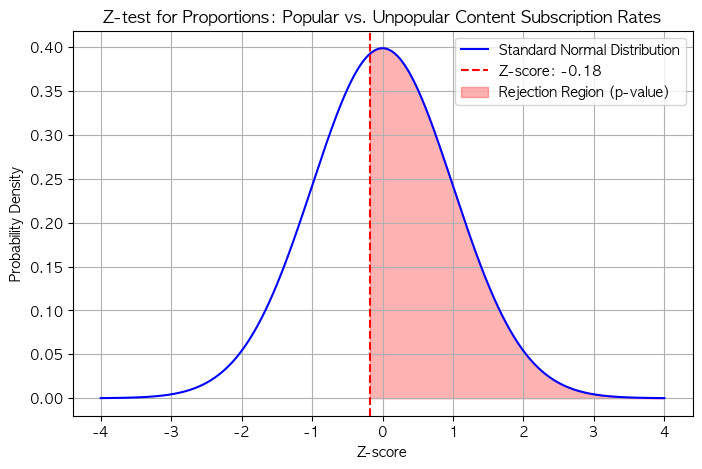

✅ Z-statistic: -0.1826
✅ p-value: 0.5725


In [53]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
from statsmodels.stats.proportion import proportions_ztest

# 🔹 두 그룹 (인기 콘텐츠 vs 비인기 콘텐츠) 데이터
n1, n2 = len(users_from_popular), len(users_from_unpopular)
subscribed1 = users_from_popular['complete_subscription_time'].apply(lambda x: any(pd.notna(x))).sum()
subscribed2 = users_from_unpopular['complete_subscription_time'].apply(lambda x: any(pd.notna(x))).sum()

# 🔹 Z-test 수행
count = np.array([subscribed1, subscribed2])
nobs = np.array([n1, n2])
z_stat, p_value = proportions_ztest(count, nobs, alternative='larger')

# 🔹 시각화: Z-검정 정규분포 곡선
x = np.linspace(-4, 4, 1000)  # Z-스코어 범위 (-4 ~ 4)
y = stats.norm.pdf(x, 0, 1)   # 평균 0, 표준편차 1인 정규분포
plt.figure(figsize=(8, 5))
plt.plot(x, y, label="Standard Normal Distribution", color='blue')

# 🔹 Z-통계량 위치 표시 (실제 z-score)
plt.axvline(z_stat, color='red', linestyle='--', label=f'Z-score: {z_stat:.2f}')
plt.fill_between(x, y, where=(x >= z_stat), color='red', alpha=0.3, label="Rejection Region (p-value)")

plt.title("Z-test for Proportions: Popular vs. Unpopular Content Subscription Rates")
plt.xlabel("Z-score")
plt.ylabel("Probability Density")
plt.legend()
plt.grid()

plt.show()

# 결과 해석
print(f"✅ Z-statistic: {z_stat:.4f}")
print(f"✅ p-value: {p_value:.4f}")

### 가설 검정 해석
- Z통계량이 -0.18이므로 0 근처에 위치, 인기 콘텐츠와 비인기 콘텐츠의 구독 전환율 차이가 크지 않음
- 유의수준 a=0.05 기준으로 z > 1.96 or z < 1.96일때, 귀무가설 기각 가능.
하지만 Z-score가 -0.18로, 귀무가설을 기각할 수 없음

### 3. OS 사용량 분석 코드

In [39]:
# 모든 OS 데이터를 개별 행으로 변환 (explode 사용)
os_exploded = filtered_grouped_df.explode('os_name_x')

# OS별 사용 빈도수 계산
os_counts = os_exploded['os_name_x'].value_counts().reset_index()
os_counts.columns = ['os_name', 'user_count']

# 결과 출력
display(os_counts)


,os_name,user_count
0,Chrome,38031
1,Edge,6429
2,Mobile Safari,2886
3,Safari,2833
4,Whale,2235
5,Samsung Browser,1681
6,Chrome WebView,1492
7,Chrome Mobile,1317
8,Instagram,511
9,WebKit,486


### 4. 무료 콘텐츠를 처음 수강한 시간과 첫 구독을 누른 시간의 갭 분석

In [41]:
# 'click_start_content_time'과 'complete_subscription_time'에서 처음 발생한 시간만 선택
filtered_grouped_df['first_start_content_time'] = filtered_grouped_df['click_start_content_time'].apply(lambda x: min(x) if isinstance(x, list) and len(x) > 0 else pd.NaT)
filtered_grouped_df['first_subscription_time'] = filtered_grouped_df['complete_subscription_time'].apply(lambda x: min(x) if isinstance(x, list) and len(x) > 0 else pd.NaT)

# 시간 차이 계산 (첫 구독 - 첫 클릭)
filtered_grouped_df['time_to_subscribe'] = filtered_grouped_df.apply(
    lambda row: (row['first_subscription_time'] - row['first_start_content_time']).total_seconds() / 3600 if pd.notna(row['first_subscription_time']) else None, axis=1
)

# 결과 확인 (첫 클릭, 첫 구독, 시간 차이)
display(filtered_grouped_df[['user_id', 'first_start_content_time', 'first_subscription_time', 'time_to_subscribe']])


,user_id,first_start_content_time,first_subscription_time,time_to_subscribe
0,0001435bc6c0c0f05315192f89275425,2023-01-16 10:00:52.580,NaT,NaN
1,0003691a8bc9f96481baa7086ae04592,2022-11-06 20:59:00.162,NaT,NaN
2,0003c0ede663b9e3b55d9dc3f7e8690f,2023-02-08 01:40:05.215,NaT,NaN
3,000634ec5553ca63f77c61690353a0be,2023-05-26 15:06:18.658,NaT,NaN
4,000722d5152d121ef57d8246dff4ac91,2022-12-13 18:54:50.431,NaT,NaN
...,...,...,...,...
24961,fff60192556898a9001de93f8708bedf,2022-11-19 09:40:53.996,NaT,NaN
24962,fff8b3be926adfb193591e262b087b74,2022-03-13 15:49:36.633,NaT,NaN
24963,fffba676b17f9f0f228360930f238f07,2022-06-20 17:42:06.657,NaT,NaN
24964,fffd757f689e039a1d4db0adc1b80b61,2023-01-16 20:11:34.191,NaT,NaN


In [43]:
# 구독한 유저만 필터링
subscribed_users = filtered_grouped_df.dropna(subset=['time_to_subscribe'])

# 구독한 유저 수 계산
num_subscribed_users = len(subscribed_users)

# 평균 구독 전환 시간 계산
average_time_to_subscribe = subscribed_users['time_to_subscribe'].mean()

# 평균 구독 전환 일자 계산
average_days_to_subscribe =  average_time_to_subscribe / 24

print(f"무료 체험 후 첫 결제한 유저 수: {num_subscribed_users}명")
print(f"평균 구독 전환 시간: {average_time_to_subscribe:.2f} 시간")
print(f" 평균 구독 전환 일수: {average_days_to_subscribe:.2f} 일")

무료 체험 후 첫 결제한 유저 수: 7657명
평균 구독 전환 시간: -219.37 시간
 평균 구독 전환 일수: -9.14 일


### 5. 이미 구독을 하고 무료 콘텐츠를 들었다? 복잡하다.양수/음수 time_to_subscribe 데이터 분리 분석

In [ ]:
# 양수 값(정상적인 구독 전환)
positive_time_to_subscribe = filtered_grouped_df[filtered_grouped_df['time_to_subscribe'] >= 0]

# 음수 값(이상한 데이터, 구독이 클릭보다 먼저 기록됨)
negative_time_to_subscribe = filtered_grouped_df[filtered_grouped_df['time_to_subscribe'] < 0]

# 결과 확인
print(f"양수(정상적인) 구독 전환 유저 수: {len(positive_time_to_subscribe)}")
print(f"음수(이상한) 구독 전환 유저 수: {len(negative_time_to_subscribe)}")

양수(정상적인) 구독 전환 유저 수: 2459
음수(이상한) 구독 전환 유저 수: 5198


In [46]:
# 양수 값 평균 (정상적인 구독 전환)
average_positive_time_to_subscribe = positive_time_to_subscribe['time_to_subscribe'].mean()
average_positive_days_to_subscribe = average_positive_time_to_subscribe / 24

# 음수 값 평균 (이상한 데이터)
average_negative_time_to_subscribe = negative_time_to_subscribe['time_to_subscribe'].mean()
average_negative_days_to_subscribe = average_negative_time_to_subscribe / 24

# 결과 출력
print(f"✅ 평균 구독 전환 시간 (양수): {average_positive_time_to_subscribe:.2f} 시간 -> {average_positive_days_to_subscribe:.2f} 일")
print(f"✅ 평균 구독 전환 시간 (음수): {average_negative_time_to_subscribe:.2f} 시간 -> {average_negative_days_to_subscribe:.2f} 일")


✅ 평균 구독 전환 시간 (양수): 567.95 시간 -> 23.66 일
✅ 평균 구독 전환 시간 (음수): -591.82 시간 -> -24.66 일


### 6. 리뷰 클릭수가 많은 콘텐츠가 콘텐츠 시작에 도움을 주나? (학습 전환율 분석)

### 6-1. 데이터 준비
- user_id가 NaN인 행 제거
- content_review_id별 click_count 계산
- 리뷰 클릭 수가 높은 콘텐츠와 낮은 콘텐츠 분류
- click_start_content_time을 datetime으로 변환

In [119]:
# NaN인 user_id 제거
merged_df = merged_df.dropna(subset=['user_id'])

# 콘텐츠별 리뷰 클릭 횟수 계산 (content_id 기준)
click_count = merged_df.groupby('content_id')['click_review_time'].count().reset_index(name='click_count')

# merged_df에 click_count 병합 (콘텐츠별 리뷰 클릭 수 추가)
merged_df = merged_df.merge(click_count, on='content_id', how='left')

# 병합 결과 확인
print(merged_df[['content_id', 'click_review_time', 'click_count']].head())



                         content_id click_review_time  click_count
0  445fac33232adcb3d1cdab7d8a579430               NaT          0.0
1  18992b667be06d6f29ba0008f99d9745               NaT         44.0
2  dfbdae782996c25daed7517b8835f3aa               NaT          0.0
3  a1eeebeb6c307641b75b94a2a1d5b9aa               NaT         62.0
4  7de35a9d8f14c68e5f2a8788dda5f72e               NaT         45.0


In [120]:

# click_start_content_time을 datetime으로 변환
merged_df['click_start_content_time'] = pd.to_datetime(merged_df['click_start_content_time'])

# 상위 25% 리뷰 클릭 수를 "인기 콘텐츠", 하위 25% 리뷰 클릭 수를 "비인기 콘텐츠"로 분류
high_clicks = merged_df['click_count'].quantile(0.25)
low_clicks = merged_df['click_count'].quantile(0.75)

merged_df['content_review_popularity'] = np.where(merged_df['click_count'] >= low_clicks, 'High Clicks',
                                np.where(merged_df['click_count'] <= high_clicks, 'Low Clicks', 'Medium Clicks'))

print(merged_df['content_review_popularity'].value_counts())

content_review_popularity
Medium Clicks    60030
High Clicks      34352
Low Clicks       33578
Name: count, dtype: int64


### 6-2. 리뷰 클릭 수가 높은 콘텐츠와 낮은 콘텐츠의 분포 비교
- 클릭 수가 많다고 콘텐츠 시작 확률이 높다고 볼 수 없음

6-2-1.유저별 콘텐츠 리뷰 클릭 횟수 보기

In [136]:
# 유저별 + 콘텐츠별 리뷰 클릭 횟수 계산
user_content_clicks = merged_df.groupby(['user_id', 'content_id'])['click_review_time'].count().reset_index(name='click_count')
user_content_clicks = user_content_clicks.sort_values(by='click_count', ascending=False)

display(user_content_clicks.head())

,user_id,content_id,click_count
69180,cb07a8015b8292cb8fac531c0efb58bc,afe201c04b426366e0f8e9e2207c78c2,54
72325,d356f962902b05588a02a16a60fc167e,ecde9a1b01763f791c3a185d53b5f394,23
58005,a992106c67684123d8e27431ecb3687a,f491517f4737a60d661cd1fcacc702c0,23
3812,0ad15c951f0eb707b00e1cb3c99ba834,1ccd38c0253604fb48f78970736f915c,19
58156,aa02a721c68a03864b5446500d7296bd,f491517f4737a60d661cd1fcacc702c0,17


In [ ]:
# 유저별 총 리뷰 클릭 횟수 (중복 포함)
user_total_clicks = merged_df.groupby('user_id')['click_review_time'].count().reset_index(name='total_clicks')

# 유저별 총 리뷰 클릭 횟수를 내림차순 정렬
user_total_clicks_sorted = user_total_clicks.sort_values(by='total_clicks', ascending=False)

display(user_total_clicks_sorted.head(10)) 



,user_id,total_clicks
27770,cb07a8015b8292cb8fac531c0efb58bc,57
23272,a992106c67684123d8e27431ecb3687a,23
28912,d356f962902b05588a02a16a60fc167e,23
1484,0ad15c951f0eb707b00e1cb3c99ba834,20
23331,aa02a721c68a03864b5446500d7296bd,17
12045,57542a51e6d83e2a11fd6f35224067d7,16
34082,f8868b5573dc20f97a1c65b25a02b7fb,15
14361,6890a14a8d65d6587efc541bfe15ce88,13
31584,e6f768c8264227798f9ec6c65a7263bc,13
13157,5f96e0ec35112c6b0a76ea51f1e89700,13


6-2-2. 유저별 클릭한 고유 콘텐츠 갯수

In [125]:
# 유저별 고유한 콘텐츠 개수 계산
unique_content_per_user = user_content_clicks.groupby('user_id')['content_id'].nunique().reset_index(name='unique_content_count')

# 결과 확인
display(unique_content_per_user.head())


,user_id,unique_content_count
0,0001435bc6c0c0f05315192f89275425,1
1,0001f15911b404f3bf5b8571afafa4e4,1
2,0003691a8bc9f96481baa7086ae04592,1
3,0003c0ede663b9e3b55d9dc3f7e8690f,4
4,000634ec5553ca63f77c61690353a0be,1


NameError: name 'ax' is not defined

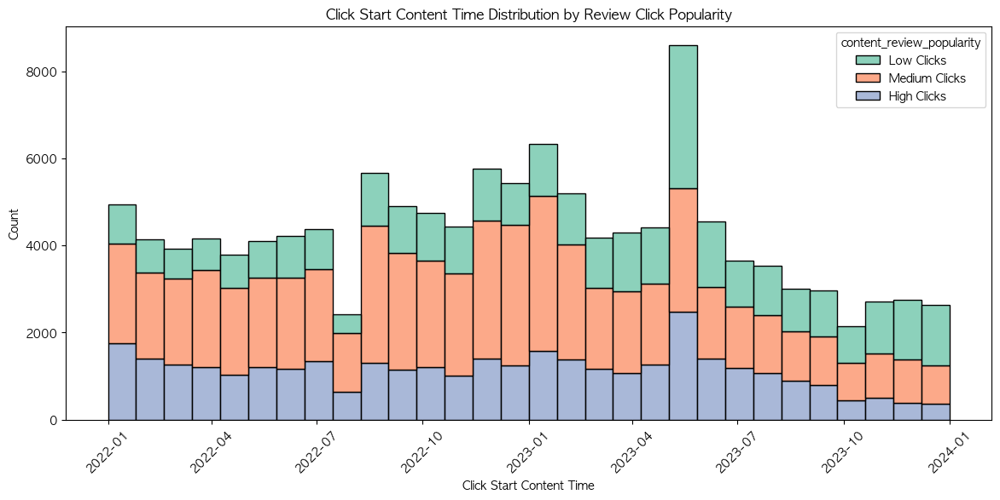

In [ ]:
plt.figure(figsize=(14, 6))

# 히스토그램을 누적형(스택형)으로 표시
sns.histplot(data=merged_df, 
             x='click_start_content_time', 
             hue='content_review_popularity', 
             kde=False,  
             bins=30,  
             multiple='stack',  
             palette="Set2")  

plt.title('Click Start Content Time Distribution by Review Click Popularity')
plt.xlabel('Click Start Content Time')
plt.ylabel('Count')

plt.xticks(rotation=45)

ax.legend(title='Content Popularity', loc='upper right')

plt.show()



### 6-3. 리뷰 클릭 많이 한 유저와 적게 한 유저의 첫 결제 전환율을 보자

In [140]:
print(user_content_clicks.columns)

Index(['user_id', 'total_clicks'], dtype='object')


In [141]:
# 유저별 총 리뷰 클릭 횟수 계산
user_content_clicks = user_content_clicks.groupby('user_id')['total_clicks'].sum().reset_index(name='total_clicks')

# 상위 50%와 하위 50%를 기준으로 구분
median_clicks = user_total_clicks['total_clicks'].median()

# 클릭이 많은 유저(True) vs. 적은 유저(False)
user_total_clicks['high_click_user'] = user_total_clicks['total_clicks'] > median_clicks

click_group_summary = user_total_clicks.groupby('high_click_user').agg(
    total_users=('user_id', 'count')
).reset_index()

# 결과 확인
display(click_group_summary.head())


,high_click_user,total_users
0,False,33894
1,True,1212


In [142]:
# 첫 결제 여부 확인 (결제한 경우 True, 안 한 경우 False)
merged_df['first_payment'] = merged_df['complete_subscription_time'].notnull()

# 유저별 클릭 그룹 정보 추가 (high_click_user 컬럼 추가)
merged_df = merged_df.merge(user_total_clicks[['user_id', 'high_click_user']], on='user_id', how='left')

# 결과 확인
display(merged_df[['user_id', 'high_click_user', 'first_payment']].head())


,user_id,high_click_user,first_payment
0,41362ad5ebcade2bb1b78344a53e7ccf,False,True
1,f7155af01d277f11b1c7d05cf772c686,False,True
2,1b05f9fe82b80771323caa1cd5683143,False,False
3,353528475f2bd85934263421ccd579b3,True,True
4,353528475f2bd85934263421ccd579b3,True,True


In [160]:
# 결제한 유저만 필터링
paid_users = merged_df[merged_df['first_payment'] == True]

# 리뷰 클릭 후 첫 결제까지 걸린 시간 계산
paid_users['time_to_payment'] = (paid_users['complete_subscription_time'] - paid_users['click_review_time']).dt.total_seconds() / 3600  # 시간 단위로 변환

# 결과 확인
display(paid_users[['user_id', 'click_review_time', 'complete_subscription_time', 'time_to_payment']].head())

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_25392/3221251743.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paid_users['time_to_payment'] = (paid_users['complete_subscription_time'] - paid_users['click_review_time']).dt.total_seconds() / 3600  # 시간 단위로 변환


,user_id,click_review_time,complete_subscription_time,time_to_payment
0,41362ad5ebcade2bb1b78344a53e7ccf,NaT,2022-06-23 17:07:25.279,NaN
1,f7155af01d277f11b1c7d05cf772c686,NaT,2023-03-12 18:04:27.409,NaN
3,353528475f2bd85934263421ccd579b3,NaT,2023-04-03 08:20:01.495,NaN
4,353528475f2bd85934263421ccd579b3,NaT,2023-04-03 08:20:01.495,NaN
5,f853aa18605bd7f11162236b6b8ac4c5,NaT,2023-03-22 23:46:24.913,NaN


In [147]:

# 리뷰 클릭이 많은 유저 여부 기준으로 그룹화
click_groups = paid_users.groupby('high_click_user')['time_to_payment'].agg(
    mean_time=('mean'),  # 평균 결제까지 걸린 시간
    median_time=('median'),  # 중앙값 (대표적인 결제 속도)
    min_time=('min'),  # 최소값 (가장 빠른 결제)
    max_time=('max')  # 최대값 (가장 늦은 결제)
).reset_index()

# 결과 확인
display(click_groups)


,high_click_user,mean_time,median_time,min_time,max_time
0,False,NaN,NaN,NaN,NaN
1,True,-668.378777,-145.750365,-13260.864649,10229.80839


### 유저가 첫 결제를 먼저 하고 리뷰를 클릭한 경우가 더 많은 것 같음 ㅠㅠ

### 리뷰 클릭하고 결제한 유저들만 분석해보자

In [161]:
# 리뷰 클릭 후 결제한 데이터만 필터링 (이상값 제거)
review_before_payment_users = paid_users[paid_users['click_review_time'] <= paid_users['complete_subscription_time']]

# 다시 결제까지 걸린 시간 계산
review_before_payment_users['time_to_payment'] = (review_before_payment_users['complete_subscription_time'] - review_before_payment_users['click_review_time']).dt.total_seconds() / 3600  # 시간 단위

# 평균 결제 소요 시간 계산 (리뷰 클릭 후 결제까지 걸린 시간)
average_payment_time = review_before_payment_users['time_to_payment'].mean()

# 총 유저 수 계산 (중복 제거)
total_users = review_before_payment_users['user_id'].nunique()

print(f"평균 결제 소요 시간: {average_payment_time:.2f} 시간")
print(f"총 유저 수: {total_users} 명")



평균 결제 소요 시간: 576.42 시간
총 유저 수: 162 명


/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_25392/1323249744.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  review_before_payment_users['time_to_payment'] = (review_before_payment_users['complete_subscription_time'] - review_before_payment_users['click_review_time']).dt.total_seconds() / 3600  # 시간 단위


### 결제를 하고 리뷰를 본 유저들을 보자

In [162]:
# 결제 후 리뷰를 본 유저 필터링
review_after_payment_users = paid_users[paid_users['click_review_time'] > paid_users['complete_subscription_time']]


display(review_after_payment_users[['user_id', 'click_review_time', 'complete_subscription_time']].head())

# 결제 후 리뷰 본 유저 수
total_after_payment_users = review_after_payment_users['user_id'].nunique()
print(f"결제 후 리뷰를 클릭한 유저 수: {total_after_payment_users} 명")


,user_id,click_review_time,complete_subscription_time
12,79421b5d038205ad7adbb1e2c3b89741,2023-04-06 22:37:59.913,2023-03-12 17:46:14.026
70,db63522b02cd08584e5e1df2836b21cc,2023-02-02 11:54:11.516,2023-01-10 23:49:20.420
319,c08e32271d96bd91f8626c49f91e9fc3,2023-04-02 13:29:06.838,2022-11-22 20:33:52.443
405,11513e927f01a9ce44af5c4730ceac88,2023-02-09 23:54:22.169,2023-01-31 19:40:10.114
753,8e60aad933c36f62252053edbf665b33,2023-08-14 18:42:34.802,2022-11-22 21:42:01.562


결제 후 리뷰를 클릭한 유저 수: 407 명


In [ ]:
# 구독한 유저만 필터링
subscribed_users = filtered_grouped_df.dropna(subset=['time_to_subscribe'])

# 구독한 유저 수 계산
num_subscribed_users = len(subscribed_users)

# 평균 구독 전환 시간 계산
average_time_to_subscribe = subscribed_users['time_to_subscribe'].mean()

# 평균 구독 전환 일자 계산
average_days_to_subscribe =  average_time_to_subscribe / 24

print(f"무료 체험 후 첫 결제한 유저 수: {num_subscribed_users}명")
print(f"평균 구독 전환 시간: {average_time_to_subscribe:.2f} 시간")
print(f" 평균 구독 전환 일수: {average_days_to_subscribe:.2f} 일")

무료 체험 후 첫 결제한 유저 수: 7657명
평균 구독 전환 시간: -219.37 시간
 평균 구독 전환 일수: -9.14 일


In [144]:
# 클릭 그룹별 첫 결제 전환율 계산
review_first_payment_conversion_rates = merged_df.groupby('high_click_user')['first_payment'].mean().reset_index(name='conversion_rate')

# 결과 확인
display(review_first_payment_conversion_rates)


,high_click_user,conversion_rate
0,False,0.383369
1,True,0.553863


In [145]:
# 클릭 그룹별 유저 수, 결제한 유저 수, 전환율 계산
conversion_summary = merged_df.groupby('high_click_user').agg(
    total_users=('user_id', 'nunique'),
    total_payers=('first_payment', 'sum'),  
    conversion_rate=('first_payment', 'mean') 
).reset_index()

# 결과 확인
display(conversion_summary)


,high_click_user,total_users,total_payers,conversion_rate
0,False,33894,44878,0.383369
1,True,1212,6036,0.553863


### 아래는 분석 망한 코드들. 👇🏻

### 6-3. 학습 전환율 계산하기
- 클릭 수가 매우 적고 전환율이 높은 것으로 보아 다음과 같이 해석할 수 있음 </br>
1. 사람들이 리뷰를 클릭하지 않고 바로 구독을 할 수 있음 -> 신규 유저와 재구독 유저로 비교할 수 있나?</br>
2. 클릭수 자체가 너무 적어서 분석하는게 의미가 없을 수도 있음</br>

In [164]:
# 콘텐츠별 클릭 대비 학습 전환율 계산
conversion_rate = merged_df.groupby('content_review_popularity').agg(
    total_clicks=('click_review_time', 'count'),  # 리뷰 버튼을 누른 횟수
    total_starts=('click_start_content_time', lambda x: x.notnull().sum())  # 실제 학습을 시작한 횟수
).reset_index()

# 학습 전환율 (학습 시작 수 / 리뷰 클릭 수)
conversion_rate['conversion_rate'] = conversion_rate['total_starts'] / conversion_rate['total_clicks']

# 결과 출력
print(conversion_rate)


  content_review_popularity  total_clicks  total_starts  conversion_rate
0               High Clicks           849         34352        40.461720
1                Low Clicks           315         33578       106.596825
2             Medium Clicks          1430         60030        41.979021


### 6-4. 그렇다면 리뷰를 확인한 유저와 아닌 유저의 학습 전환율은 다를까? [유저당 학습 전환율]

In [ ]:
# 리뷰를 클릭한 유저 여부 확인 (True = 리뷰 클릭한 유저, False = 리뷰 클릭 안 한 유저)
merged_df['review_clicked'] = merged_df['click_review_time'].notnull()

# 그룹별 학습 전환율 계산
conversion_by_review = merged_df.groupby('review_clicked').agg(
    total_users=('user_id', 'nunique'),  # 유니크 유저 수
    total_starts=('click_start_content_time', lambda x: x.notnull().sum())  # 학습 시작 수
).reset_index()

# 학습 전환율 추가 (학습 시작 수 / 전체 유저 수)
conversion_by_review['conversion_rate'] = conversion_by_review['total_starts'] / conversion_by_review['total_users']

# 결과 출력
print(conversion_by_review)

# 전환율이 1을 넘으면 안되는데 이상하게 나옴
# 한 유저가 여러 콘텐츠를 클릭하고 학습을 시작할 수 있기 때문에 전환율이 1을 넘을 수 있는 것으로 추측

   review_clicked  total_users  total_starts  conversion_rate
0           False        34819        125366         3.600505
1            True         1212          2594         2.140264


### 6-5. 리뷰 클릭 수와 콘텐츠 시작 간 상관관계 분석
- 결과가 이상함.. 여기서부터 꼬이기시작. 해결 불가..

Click Count vs. Click Start Content Time Correlation:
                           click_count  click_start_content_time
click_count                       1.0                       1.0
click_start_content_time          1.0                       1.0


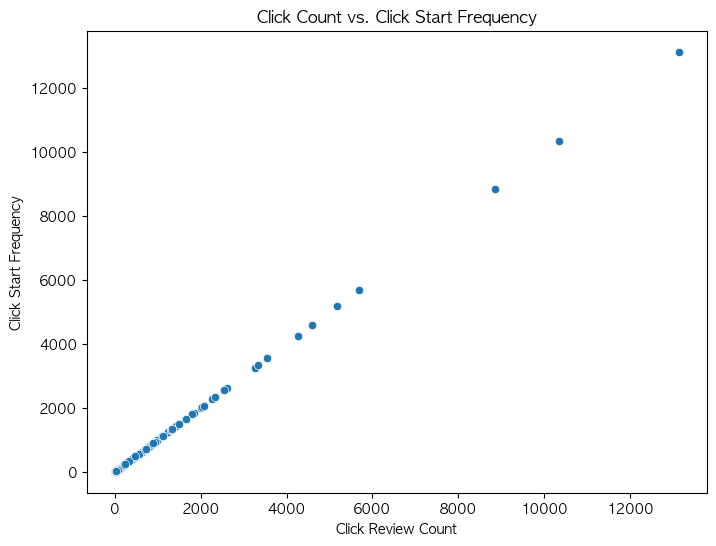

In [88]:
# 콘텐츠별 평균 시작 시간 계산 (콘텐츠 클릭 횟수 대비 시작 시간)
content_start_time_mean = merged_df.groupby('content_id')['click_start_content_time'].count().reset_index()
content_start_time_mean = content_start_time_mean.merge(click_counts, on='content_id')

# 상관계수 계산
correlation = content_start_time_mean[['click_count', 'click_start_content_time']].corr()
print("Click Count vs. Click Start Content Time Correlation:\n", correlation)

# 시각화 - 클릭 수 vs. 콘텐츠 시작 횟수
plt.figure(figsize=(8,6))
sns.scatterplot(data=content_start_time_mean, x='click_count', y='click_start_content_time')
plt.title('Click Count vs. Click Start Frequency')
plt.xlabel('Click Review Count')
plt.ylabel('Click Start Frequency')
plt.show()


### 6-6. 가설 주제
- 귀무가설: 리뷰 클릭 수가 많은 콘텐츠여도 유저가 콘텐츠를 시작할 확률이 증가하지 않는다.
- 대립가설: 리뷰 클릭 수가 많은 콘텐츠일수록 유저가 콘텐츠를 시작할 확률이 증가한다.
- t-test 독립표본, 카이제곱 검정 시행

In [103]:
# High Clicks와 Low Clicks에 해당하는 데이터 추출
high_clicks_df = merged_df[merged_df['content_review_popularity'] == 'High Clicks']
low_clicks_df = merged_df[merged_df['content_review_popularity'] == 'Low Clicks']

# High Clicks와 Low Clicks 그룹의 학습 시작 비율 계산
high_clicks_conversion_rate = high_clicks_df['click_start_content_time'].notnull().sum() / high_clicks_df.shape[0]
low_clicks_conversion_rate = low_clicks_df['click_start_content_time'].notnull().sum() / low_clicks_df.shape[0]

# 결과 출력
print(f"✅ High Clicks 그룹의 학습 전환율: {high_clicks_conversion_rate:.4f}")
print(f"✅ Low Clicks 그룹의 학습 전환율: {low_clicks_conversion_rate:.4f}")

# 비교 결과 출력
if high_clicks_conversion_rate > low_clicks_conversion_rate:
    print("✅ High Clicks 그룹이 Low Clicks 그룹보다 학습 시작 확률이 높습니다.")
elif high_clicks_conversion_rate < low_clicks_conversion_rate:
    print("✅ Low Clicks 그룹이 High Clicks 그룹보다 학습 시작 확률이 높습니다.")
else:
    print("⚠️ 두 그룹의 학습 시작 확률이 동일합니다.")



✅ High Clicks 그룹의 학습 전환율: 1.0000
✅ Low Clicks 그룹의 학습 전환율: 1.0000
⚠️ 두 그룹의 학습 시작 확률이 동일합니다.


In [101]:
# 등분산 검정 수행
from scipy.stats import levene

# 등분산 검정 수행
stat, p = levene(high_clicks, low_clicks)

print(f"Levene’s test 결과: statistic={stat}, p-value={p}")

# p-value < 0.05이면 등분산이 아님 (즉, equal_var=False가 적절)
if p < 0.05:
    print("⚠️ 두 그룹의 분산이 유의미하게 다릅니다. (equal_var=False 사용 권장)")
else:
    print("✅ 두 그룹의 분산 차이가 유의하지 않습니다. (equal_var=True 사용 가능)")


Levene’s test 결과: statistic=nan, p-value=nan
✅ 두 그룹의 분산 차이가 유의하지 않습니다. (equal_var=True 사용 가능)


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scipy/stats/_morestats.py:3057: RuntimeWarning: invalid value encountered in scalar divide
  W = numer / denom


In [99]:
# 필요한 라이브러리 불러오기
from scipy.stats import ttest_ind

# High Clicks 그룹과 Low Clicks 그룹의 시작 비율 비교
high_clicks = merged_df[merged_df['content_review_popularity'] == 'high_clicks']['click_start_content_time'].notnull().astype(int)
low_clicks = merged_df[merged_df['content_review_popularity'] == 'low_clicks']['click_start_content_time'].notnull().astype(int)

# t-test 수행
t_stat, p_value = ttest_ind(high_clicks, low_clicks, equal_var=False)

print(f"T-test 결과: t-statistic={t_stat}, p-value={p_value}")

# 유의 수준 0.05를 기준으로 해석
if p_value < 0.05:
    print("p-value가 0.05보다 작으므로 클릭 수가 많은 콘텐츠일수록 시작 확률이 높다는 대립가설을 채택할 수 있다")
else:
    print("p-value가 0.05보다 크므로 클릭 수가 콘텐츠 시작에 미치는 영향이 유의미하지 않다.")

# 값이 왜 nan?......


T-test 결과: t-statistic=nan, p-value=nan
p-value가 0.05보다 크므로 클릭 수가 콘텐츠 시작에 미치는 영향이 유의미하지 않다.


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scipy/_lib/deprecation.py:234: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  return f(*args, **kwargs)


### 번외 1. 유저 아이디별로 콘텐츠 클릭

In [92]:
# 한 유저당 콘텐츠 클릭 수 
user_content_count = user_content_ids_filtered.groupby('user_id')['content_id'].nunique().sort_values(ascending=False)
user_content_count

user_id
3bc001ca42b22a7446687c3d183af0cd    66
6421bf3808b89da97f316eac07da2b91    59
caec8b3be818f1408e0d47d89acc245f    55
d2691bedf9ae0bc97a182e57361bdeb8    54
38410d6be64b42c85ed796fbe9e3d368    51
                                    ..
6df6a322c618f8fa9413dd050a85c71f     1
6df49741ff96dfada8cde7a8c1ec4d54     1
6dec728300e7f49f04d02fdae3b7ae71     1
6deba6d26a6a07c2d16ed54498b0fbf9     1
7fb5dcf84ccc668104e1d8aba8fef8f8     1
Name: content_id, Length: 35096, dtype: int64

# 7. enter.payment_page
- 결제 페이지 진입

In [9]:
enter_payment = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.payment_page.csv')
enter_payment.drop(columns=['device_carrier'], inplace=True)
enter_payment.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seoul,2023-04-05 21:31:27.602000,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.payment_page,Korean,Chrome,112.0.0.0,Web,8ee58bcaa05b234cdbf84167c0983385
1,Wonju,2023-04-05 21:33:30.699000,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,111.0.0.0,Web,74d17c27a41656e7788b0c81d9f76cda
2,Daejeon,2023-04-05 21:05:28.337000,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,111.0.1661.62,Web,62cfa08370da60b8db4495baaff62806
3,Seoul,2023-04-05 21:45:27.935000,South Korea,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce
4,Seoul,2023-04-05 21:46:50.632000,South Korea,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce


In [58]:
enter_payment.isna().sum()

city                 2699
client_event_time       0
country               162
device_family           1
device_type          5995
event_type              0
language                0
os_name                 0
os_version            501
platform                0
user_id              6227
dtype: int64

In [61]:
# 'client_event_time'을 datetime 형식으로 변환
enter_payment['client_event_time'] = pd.to_datetime(enter_payment['client_event_time'], errors='coerce')

# 날짜만 추출
enter_payment['date'] = enter_payment['client_event_time'].dt.to_period('M')

# `user_id`가 NaN인 데이터만 필터링
null_user_data = enter_payment[enter_payment['user_id'].isna()]

# 날짜별 `NaN user_id` 개수 집계
null_user_counts = null_user_data.groupby('date').size()

# 결과 출력
display(null_user_counts)


date
2022-11      45
2022-12     151
2023-01     231
2023-02     963
2023-03     146
2023-04     106
2023-05     154
2023-06     327
2023-07     650
2023-08     573
2023-09     795
2023-10     889
2023-11    1032
2023-12     165
Freq: M, dtype: int64

# 8. complete.subscription
- 첫 결제 완료

In [8]:
complete_subscription = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/complete.subscription.csv')
complete_subscription.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
complete_subscription.rename(columns={'client_event_time': 'complete_subscription_time'}, inplace=True)
complete_subscription.drop(complete_subscription[complete_subscription['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
complete_subscription['complete_subscription_time'] = pd.to_datetime(complete_subscription['complete_subscription_time'])

# 9시간 추가 (UTC+9 적용)
complete_subscription['complete_subscription_time'] = complete_subscription['complete_subscription_time'] + pd.Timedelta(hours=9)

# 시간 필터링
complete_subscription = complete_subscription.loc[
    complete_subscription['complete_subscription_time'].dt.year.between(2022, 2023)]

# button name 변수명 수정하기
complete_subscription.rename(columns={'button_name': 'button_name_type_a', 'button.name': 'button_name_type_b','content.id': 'content_id'}, inplace=True)
complete_subscription.head()

,city,complete_subscription_time,country,device_type,event_type,language,os_name,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Nowon-gu,2023-04-06 06:40:04.000,South Korea,Windows,complete.subscription,Korean,Edge,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 23:20:03.008,South Korea,Apple iPhone,complete.subscription,Korean,Mobile Safari,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 17:46:14.026,South Korea,Windows,complete.subscription,Korean,Chrome,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN
3,Geumjeong-gu,2023-04-12 20:35:01.865,South Korea,Windows,complete.subscription,Korean,Chrome,bdffe1f18684704d4ea2d7eebcaed180,131600,131600,0,NaN
4,Gwangmyeong,2023-05-31 10:25:55.820,South Korea,Mac,complete.subscription,Korean,Chrome,d4f54ecf6c4d7bf8742f80505f02d6dc,15920,15920,0,NaN


In [63]:
#결측치 확인
complete_subscription.isna().sum()

city                        532
client_event_time             0
country                     383
device_family               375
device_type                 525
event_type                    0
language                    375
os_name                     381
os_version                  390
platform                    375
user_id                       0
plan.price                    0
paid_amount                   0
coupon.discount_amount        0
pg.type                   12647
dtype: int64

In [64]:
# 날짜를 datetime 형식으로 변환
complete_subscription['client_event_time'] = pd.to_datetime(complete_subscription['client_event_time'], errors='coerce')

# 최소 및 최대 날짜 확인
min_date = complete_subscription['client_event_time'].min()
max_date = complete_subscription['client_event_time'].max()

print(f"최소 날짜: {min_date}")
print(f"최대 날짜: {max_date}")

# 이상치 찾기
outliers_date = complete_subscription[
    (complete_subscription['client_event_time'] < '2000-01-01') | 
    (complete_subscription['client_event_time'] > '2024-01-01')
]

# 결과 출력
print("날짜 이상치:")
print(outliers_date)

최소 날짜: 2022-01-01 06:17:24.513000
최대 날짜: 2023-12-31 16:27:37.370000
날짜 이상치:
Empty DataFrame
Columns: [city, client_event_time, country, device_family, device_type, event_type, language, os_name, os_version, platform, user_id, plan.price, paid_amount, coupon.discount_amount, pg.type]
Index: []


In [67]:
complete_subscription['pg.type'].value_counts()

pg.type
A    1029
B     613
Name: count, dtype: int64

In [70]:
# 시간대별 버튼 클릭 횟수 보기
complete_subscription['client_event_time'] = pd.to_datetime(complete_subscription['client_event_time'], errors='coerce')
complete_subscription['month'] = complete_subscription['client_event_time'].dt.to_period('M')

# 날짜별 간편결제 건수
pg_counts = complete_subscription.groupby(['month', 'pg.type']).size().unstack()

# 결과 출력
display(pg_counts)

pg.type,A,B
month,,
2023-10,53.0,NaN
2023-11,476.0,105.0
2023-12,500.0,508.0


In [77]:
complete_subscription['plan.price'].unique()

array([ 15920, 131600,  95200,  91200,  87200,  83200,  19920,  14328,
        42960, 118440,  79200,  95520])

In [78]:
complete_subscription['plan.price'].value_counts()

plan.price
15920     7704
131600    1892
79200     1217
42960     1130
95520      870
83200      563
95200      346
87200      336
91200      221
14328        7
118440       2
19920        1
Name: count, dtype: int64

In [83]:
# 쿠폰 할인율 계산하기

complete_subscription['coupon_discount_rate'] = (
    (complete_subscription['coupon.discount_amount'] / complete_subscription['plan.price']) * 100
).round(2)

filtered_discounts = complete_subscription.dropna(subset=['coupon.discount_amount'])

display(complete_subscription[['month','plan.price', 'paid_amount', 
                          'coupon.discount_amount', 
                          'coupon_discount_rate']])

,month,plan.price,paid_amount,coupon.discount_amount,coupon_discount_rate
0,2023-04,15920,15920,0,0.0
1,2023-04,131600,131600,0,0.0
2,2023-03,131600,119756,11844,9.0
3,2023-04,131600,131600,0,0.0
4,2023-05,15920,15920,0,0.0
...,...,...,...,...,...
14284,2023-12,95520,95520,0,0.0
14285,2023-12,95520,95520,0,0.0
14286,2023-12,95520,95520,0,0.0
14287,2023-10,131600,131600,0,0.0


In [84]:
complete_subscription['coupon_discount_rate'] = (
    (complete_subscription['coupon.discount_amount'] / complete_subscription['plan.price']) * 100
).round(2)

complete_subscription['coupon_discount_rate'].value_counts()

coupon_discount_rate
0.00     11364
15.00     1253
75.13      793
20.00      336
10.00      313
25.00      110
3.00        31
40.00       23
50.00       18
2.09        17
5.00        13
9.00         8
7.00         6
4.59         2
37.69        1
30.00        1
Name: count, dtype: int64

In [85]:
complete_subscription['coupon_discount_rate'].unique()

array([ 0.  ,  9.  , 10.  , 40.  ,  5.  ,  3.  , 20.  , 50.  ,  4.59,
       75.13, 15.  , 25.  ,  7.  , 37.69, 30.  ,  2.09])

In [74]:
# 날짜별 첫 결제 확인해보기
complete_subscription['client_event_time'] = pd.to_datetime(complete_subscription['client_event_time'], errors='coerce')
complete_subscription['month'] = complete_subscription['client_event_time'].dt.to_period('M')

first_payment = complete_subscription.groupby(['month', 'plan.price']).size().unstack()

# 결과 출력
display(first_payment)

plan.price,14328,15920,19920,42960,79200,83200,87200,91200,95200,95520,118440,131600
month,,,,,,,,,,,,
2022-01,NaN,22.0,NaN,27.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0
2022-02,NaN,310.0,NaN,132.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,91.0
2022-03,NaN,403.0,NaN,142.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,112.0
2022-04,NaN,319.0,NaN,134.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,109.0
2022-05,NaN,364.0,NaN,171.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,97.0
2022-06,NaN,340.0,NaN,166.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96.0
2022-07,NaN,431.0,NaN,173.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,112.0
2022-08,NaN,234.0,NaN,82.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81.0
2022-09,NaN,188.0,NaN,31.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.0


# 9. renew.subscription
- 정기 결제 완료

In [87]:
renew_subscription = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/renew.subscription.csv')
renew_subscription.drop(columns=['device_carrier'], inplace=True)
renew_subscription.rename(columns={'pg.type': 'pg_type','plan.price':'plan_price','coupon.discout_amount':'coupon_discout_amount'}, inplace=True)
renew_subscription.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon.discount_amount,pg_type
0,Nam-gu,2022-09-08 03:05:02.068,South Korea,Windows,Windows,renew.subscription,Korean,Edge,104,Web,6ddea3af2eaae869861c1190dcc9d4a3,15920,15920,0,NaN
1,Nam-gu,2022-09-08 03:40:02.050,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,c2d47034960fdff5df495822ff66fbc1,15920,15920,0,NaN
2,Dongjak-gu,2022-09-08 03:49:00.829,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,de91f1226dd938990fefc79545daf468,42960,40812,2148,NaN
3,Yongin-si,2022-09-08 04:10:06.406,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,bf14840a8cb4643e6d557da96e35a3af,15920,15920,0,NaN
4,Dongjak-gu,2022-09-08 04:40:01.895,South Korea,Android,Android,renew.subscription,Korean,Chrome Mobile,103,Web,7ddc1c2990d0645d82885394e3c518b5,15920,15920,0,NaN


In [71]:
# 시간대별 버튼 클릭 횟수 보기
renew_subscription['client_event_time'] = pd.to_datetime(renew_subscription['client_event_time'], errors='coerce')
renew_subscription['month'] = renew_subscription['client_event_time'].dt.to_period('M')

# 날짜별 간편결제 건수
pg_counts = renew_subscription.groupby(['month', 'pg.type']).size().unstack()

# 결과 출력
display(pg_counts)

pg.type,A,B,C
month,,,
2023-10,136.0,NaN,5.0
2023-11,973.0,10.0,21.0
2023-12,1470.0,94.0,23.0


# 10. resubscribe.subscription
- 만료 후 재구독 완료

In [12]:
resubscribe_subscription = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/resubscribe.subscription.csv')
resubscribe_subscription.drop(columns=['device_carrier'], inplace = True)
resubscribe_subscription.rename(columns={'pg.type': 'pg_type','plan.price':'plan_price','coupon.discout_amount':'coupon_discout_amount'}, inplace=True)
resubscribe_subscription.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon.discount_amount,pg_type
0,Daejeon,2023-04-05 21:11:45.525,South Korea,Windows,Windows,resubscribe.subscription,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,15920,15920,0,NaN
1,Seoul,2023-06-30 09:59:56.848,South Korea,Samsung Phone,Samsung Galaxy S22+,resubscribe.subscription,Korean,Chrome WebView,113.0.5672.162,Web,68831c27e47f0e8f04ba809baeec218e,15920,15920,0,NaN
2,Nowon-gu,2023-06-13 06:20:22.524,South Korea,Windows,Windows,resubscribe.subscription,Korean,Chrome,114.0.0.0,Web,4e7568cb7db01f8386614ec2c6c961cd,15920,15920,0,NaN
3,Suwon,2023-06-11 11:02:11.878,South Korea,Windows,Windows,resubscribe.subscription,Korean,Chrome,114.0.0.0,Web,f91f19527b9ec688e028ec884b1b5c1c,131600,131600,0,NaN
4,Koishikawa,2023-06-13 14:39:25.736,Japan,Apple iPhone,Apple iPhone,resubscribe.subscription,Japanese,Chrome,114.0.5735.99,Web,2276d7d2a31e05f4a5558c6406cc36c9,131600,131600,0,NaN


In [72]:
# 시간대별 버튼 클릭 횟수 보기
resubscribe_subscription['client_event_time'] = pd.to_datetime(resubscribe_subscription['client_event_time'], errors='coerce')
resubscribe_subscription['month'] = resubscribe_subscription['client_event_time'].dt.to_period('M')

# 날짜별 간편결제 건수
pg_counts = resubscribe_subscription.groupby(['month', 'pg.type']).size().unstack()

# 결과 출력
display(pg_counts)

pg.type,A,B
month,,
2023-10,6.0,NaN
2023-11,60.0,3.0
2023-12,57.0,47.0


# 11. start.free_trial
- 서비스 무료체험 시작

In [11]:
start_free_trial = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/start.free_trial.csv')
start_free_trial.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
start_free_trial.rename(columns={'client_event_time': 'start_free_trial_time'}, inplace=True)
start_free_trial.drop(start_free_trial[start_free_trial['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
start_free_trial['start_free_trial_time'] = pd.to_datetime(start_free_trial['start_free_trial_time'])

# 9시간 추가 (UTC+9 적용)
start_free_trial['start_free_trial_time'] = start_free_trial['start_free_trial_time'] + pd.Timedelta(hours=9)

# 시간 필터링
start_free_trial = start_free_trial.loc[
    start_free_trial['start_free_trial_time'].dt.year.between(2022, 2023)]

# button name 변수명 수정하기
start_free_trial.rename(columns={'content.id': 'content_id'}, inplace=True)
start_free_trial.head()

,city,start_free_trial_time,country,device_type,event_type,language,os_name,user_id,plan.price,plan.type,trial.type
0,Seoul,2023-04-06 06:49:36.156,South Korea,Mac,start.free_trial,Korean,Safari,06b6868000a5d576180aca47896d6cce,15920.0,1개월 플랜,B
1,Dobong-gu,2023-03-12 17:28:29.384,South Korea,Windows,start.free_trial,Korean,Chrome,40acc1ddfc012f3d2f58a3de95e9e748,15920.0,1개월 플랜,B
2,NaN,2023-03-12 17:35:00.107,NaN,NaN,start.free_trial,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B
3,Seoul,2023-04-12 20:36:50.250,South Korea,Mac,start.free_trial,Korean,Safari,cc8051a75f62278b0e4216dd0a182d8c,15920.0,1개월 플랜,B
4,NaN,2023-02-18 13:13:20.822,NaN,NaN,start.free_trial,NaN,NaN,4cc436ad294973993ccad3e3a70053a7,131600.0,12개월 플랜,B


In [87]:
start_free_trial['plan.type'].value_counts()

plan.type
1개월 플랜     1278
12개월 플랜    1161
Name: count, dtype: int64

In [88]:
start_free_trial['user_id'].nunique()

16309

In [10]:
start_free_trial['user_id'].isna().sum()

14

In [89]:
start_free_trial['trial.type'].value_counts()

trial.type
A    28182
B     2439
Name: count, dtype: int64

In [90]:
#각 날짜별 trial type 보기
start_free_trial['client_event_time'] = pd.to_datetime(start_free_trial['client_event_time'])

monthly_trial = (
    start_free_trial
    .groupby([start_free_trial['client_event_time'].dt.to_period('M'), 'trial.type'])
    .size()
    .unstack(fill_value=0)
    .reset_index()
)

display(monthly_trial)

trial.type,client_event_time,A,B
0,2021-12,5,0
1,2022-01,4706,0
2,2022-02,3021,0
3,2022-03,4187,0
4,2022-04,4117,0
5,2022-05,4763,0
6,2022-06,4753,0
7,2022-07,1469,0
8,2022-08,304,0
9,2022-09,372,0


# 12. start.content
- 콘텐츠 수강 시작

In [ ]:
start_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/start.content.csv')
start_content.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
start_content.rename(columns={'client_event_time': 'start_content_time'}, inplace=True)
start_content.drop(start_content[start_content['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
start_content['start_content_time'] = pd.to_datetime(start_content['start_content_time'])

# 9시간 추가 (UTC+9 적용)
start_content['start_content_time'] = start_content['start_content_time'] + pd.Timedelta(hours=9)

# 시간 필터링
start_content = start_content.loc[
    start_content['start_content_time'].dt.year.between(2022, 2023)]

# 변수명 수정하기
start_content.rename(columns={'content.id': 'content_id'}, inplace=True)
start_content.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty
0,Daejeon,2023-04-05 21:14:39.906000,South Korea,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner
1,Seoul,2023-04-05 21:50:19.674000,South Korea,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner
2,Seoul,2023-04-10 14:06:26.585000,South Korea,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner
3,Toronto,2023-04-10 14:15:29.040000,Canada,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner
4,Seoul,2023-04-10 14:21:36.467000,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced


In [92]:
start_content['content.difficulty'].value_counts()

content.difficulty
beginner        58628
intermediate    36109
advanced        27485
hard             2695
Name: count, dtype: int64

In [93]:
content_level_count = start_content[['user_id','content.difficulty']].value_counts()
content_level_count.head(20)

user_id                           content.difficulty
f59e4102149edeb73cb33ccecf95dcd9  advanced              48
cc180eef3ffd3497eb8a575165bab389  advanced              45
28068259a009cf16d0e19ae1896b1f22  advanced              43
caec8b3be818f1408e0d47d89acc245f  advanced              37
d4ab482f7d12adb21f6e9b1c68367d17  advanced              36
40504dbd203dd148d1801171d04ceb5d  advanced              34
6421bf3808b89da97f316eac07da2b91  advanced              34
5c0fe6d9885212ba763dea44677ad037  advanced              32
53141e48b97505b9f1d5ae210967b8ee  advanced              32
6ffc35355c182a39e4e3739a8df0fed4  advanced              31
61ae68a40e1d1aadc79dc6a41825c923  advanced              31
63518a68900f95baa9d76fb444a4e183  advanced              31
85ac0cd1c2a7fa2939df3061ec822eb1  advanced              31
0ea2cadbe7c50ef5c0fd22aa1a800bea  advanced              31
9e50bb9740e9dcc09b04e952e8934504  advanced              30
b53ed38fbc92e9d582322a00b5716995  advanced              29
5b7

# 13. enter.lesson_page
- 레슨 시작
- is_free_trial: 무료 공개 레슨에 대한 진입 여부. 특정 기준 시점 사용 x
- is_trial: 무료 공개 레슨에 대한 진입이면서 그 유저가 현재 구독하지 않은 회원인지 여부

In [23]:
enter_lesson = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.lesson_page.csv')
enter_lesson.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
enter_lesson.rename(columns={'client_event_time': 'enter_lesson_time','content.id':'content_id','lesson.id':'lesson_id'}, inplace=True)
enter_lesson.drop(enter_lesson[enter_lesson['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
enter_lesson['enter_lesson_time'] = pd.to_datetime(enter_lesson['enter_lesson_time'])

# 9시간 추가 (UTC+9 적용)
enter_lesson['enter_lesson_time'] = enter_lesson['enter_lesson_time'] + pd.Timedelta(hours=9)

# 시간 필터링
enter_lesson = enter_lesson.loc[
    enter_lesson['enter_lesson_time'].dt.year.between(2022, 2023)]

enter_lesson.head()

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_25392/3363005607.py:1: DtypeWarning: Columns (9,13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  enter_lesson = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.lesson_page.csv')


,city,enter_lesson_time,country,device_type,event_type,language,os_name,user_id,content_id,is_trial,lesson_id,is_free_trial
0,Wonju,2023-04-06 06:46:04.333,South Korea,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
1,Wonju,2023-04-06 06:55:50.787,South Korea,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
2,Wonju,2023-04-06 06:55:55.684,South Korea,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,770740696ab1809d6b50d4013b64a75c,NaN
3,Dongdaemun-gu,2023-04-06 06:04:55.828,South Korea,Mac,enter.lesson_page,Korean,Chrome,b2b31f00b82edc6419b25324a7ae41a4,5fc64d786416b980cfda86afd69e4516,False,68cc362ca81b5899b3c9b4dea0aaddff,NaN
4,Dongdaemun-gu,2023-04-06 06:05:34.139,South Korea,Mac,enter.lesson_page,Korean,Chrome,b2b31f00b82edc6419b25324a7ae41a4,db43a841c994231e2795d4df8931af50,False,144682f4648f81de8e6aabd11b92105e,NaN


In [18]:

# is_free_trial이 True인 행만 필터링
free_trial_contents_a = enter_lesson[enter_lesson['is_free_trial'] == True]

# 고유한 content_id 개수 확인
num_free_trial_contents_a = free_trial_contents_a['content_id'].nunique()

print(f"is_free_trial 콘텐츠 개수: {num_free_trial_contents_a}")



is_free_trial 콘텐츠 개수: 22


In [ ]:
# is_trial이 True인 행만 필터링
free_trial_contents_b = enter_lesson[enter_lesson['is_trial'] == True]

# 고유한 content_id 개수 확인
num_free_trial_contents_b = free_trial_contents_b['content_id'].nunique()

print(f"is_trial 콘텐츠 개수: {num_free_trial_contents_b}")


is_trial 콘텐츠 개수: 5


In [20]:
# is_free_trial이 True인 콘텐츠 ID 리스트
is_free_trial_content_ids = free_trial_contents_a['content_id'].unique()

# is_trial이 True인 콘텐츠 ID 리스트
is_trial_content_ids = free_trial_contents_b['content_id'].unique()

# 출력
print("무료 체험 (is_free_trial) 콘텐츠 ID 목록:")
for idx, content_id in enumerate(is_free_trial_content_ids, 1):
    print(f"{idx}. {content_id}")

print("\n무료 체험 (is_trial) 콘텐츠 ID 목록:")
for idx, content_id in enumerate(is_trial_content_ids, 1):
    print(f"{idx}. {content_id}")


무료 체험 (is_free_trial) 콘텐츠 ID 목록:
1. a914987711c7e2db9fd4bff7555ec87c
2. afe201c04b426366e0f8e9e2207c78c2
3. 101e1d0dcc38d9c86156f008a145083e
4. 68a3658f1b936bfff3bd6960cd561b0a
5. f4be1a0fe0e301b03115591777fddf29
6. c269eb6df3a374b464f7c18f12fa398f
7. d6227ba76134f6cf821bb98b5f235bd0
8. 621c7ad99b17d2d16832b618d47aea7e
9. 220ce7873b8895d0c81c37600b5bd1e7
10. 6b0a538ad5dfddde4d4b9e6ce6c00a67
11. 7fef928cdccef0185dfb931ef59b37d7
12. c8affa8409b8bd58d00d3477dd2b8ba5
13. 7cebec6e79cc981dbf421c5ec2aedd9d
14. 32cf55a55adcc30ad80b674c0fee2ff4
15. 479926b04fe824bce5bdc7e0f81a2539
16. e543c38ec7fa6bcd5045049ecc31e5f8
17. 38df90d4de533d6296b52c6a1d90e26b
18. 5acd4977e14d5edc6a408ae0d468ca4e
19. 8a72eed73d3f9d3ab1771548070e7338
20. ab7068685b7aeac4d6b1a6c0e1c85819
21. c7a97d9b71626d5115e2bcdadfe4dd48
22. db82104b9c508953b3d00eea82844a48

무료 체험 (is_trial) 콘텐츠 ID 목록:
1. 61b6463287573f00de13a930805a52d6
2. c269eb6df3a374b464f7c18f12fa398f
3. 445fac33232adcb3d1cdab7d8a579430
4. 710ffb5be9f89772b7baa9

In [21]:
# 두 리스트를 set으로 변환 후 교집합 찾기
overlapping_content_ids = set(is_free_trial_content_ids) & set(is_trial_content_ids)

# 출력
print(f"\n무료 체험 (is_free_trial)과 무료 체험 (is_trial)의 겹치는 콘텐츠 ID 개수: {len(overlapping_content_ids)}")

print("\n겹치는 콘텐츠 ID 목록:")
for idx, content_id in enumerate(overlapping_content_ids, 1):
    print(f"{idx}. {content_id}")



무료 체험 (is_free_trial)과 무료 체험 (is_trial)의 겹치는 콘텐츠 ID 개수: 1

겹치는 콘텐츠 ID 목록:
1. c269eb6df3a374b464f7c18f12fa398f


In [28]:
#무료 체험 콘텐츠 아이디
free_contents_ids = (set(is_free_trial_content_ids) | set(is_trial_content_ids)) - overlapping_content_ids

# 14. complete.lesson
- 레슨 완료

In [16]:
complete_lesson = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/complete.lesson.csv')
complete_lesson.drop(columns=['device_carrier'], inplace=True)
complete_lesson.rename(columns={'content.id': 'content_id', 'lesson.id': 'lesson_id'}, inplace=True)
complete_lesson.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,lesson_id
0,Wonju,2023-04-05 21:55:51.836000,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,d360d68b65fd3e0eafb7982386d75fd9
1,Daejeon,2023-04-05 21:19:01.243000,South Korea,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,7e0f6aae886368ef9fa97007a8e9f7ac
2,Daejeon,2023-04-05 21:20:27.939000,South Korea,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,d1e93c9dc08267efab31849bc6083854
3,Daejeon,2023-04-05 21:23:01.534000,South Korea,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,f22ea5dc431035305e705552bbc4f45b
4,Daejeon,2023-04-05 21:28:34.965000,South Korea,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,ce0bfeb7fb1259c588f437d48ab2690c


# 15. click.lesson_page_related_question_box
- 레슨 페이지 내 질문 목록 클릭

In [17]:
lesson_comment = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/click.lesson_page_related_question_box.csv')
lesson_comment.drop(columns=['device_carrier'], inplace = True)
lesson_comment.rename(columns={'content.id': 'content_id', 'lesson.id': 'lesson_id','question.id':'question_id'}, inplace=True)
lesson_comment.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,question_id,content_id,lesson_id
0,Dong-gu,2023-04-05 21:51:48.377000,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,111.0.0.0,Web,117f95e12266dcf8f911ae39ff55a800,c654f9825245640595af9b8aecb150aa,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
1,Dong-gu,2023-04-05 21:52:21.689000,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,111.0.0.0,Web,117f95e12266dcf8f911ae39ff55a800,898fb79fc740dc8705b52fb32521d5d5,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
2,Dong-gu,2023-04-05 21:52:42.481000,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,111.0.0.0,Web,117f95e12266dcf8f911ae39ff55a800,9fb80c124d57fd31494738e0af5437a3,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
3,Goyang-si,2023-04-05 21:20:15.032000,South Korea,Mac,Mac,click.lesson_page_related_question_box,Korean,Chrome,111.0.0.0,Web,e1f3ecae035a3c8ae8cf789fbde98995,9016e2246486e852992ccd9ae0eb27ca,c269eb6df3a374b464f7c18f12fa398f,395bdf0293b24ec47d5a9e960574f851
4,Goyang-si,2023-04-05 21:21:55.275000,South Korea,Mac,Mac,click.lesson_page_related_question_box,Korean,Chrome,111.0.0.0,Web,e1f3ecae035a3c8ae8cf789fbde98995,4ecd552eeded70b3274b8edf3ecacbd9,c269eb6df3a374b464f7c18f12fa398f,a738c7835388066e2618af1e5ebacb3c


# 16. end.content
- 콘텐츠 수강 완료

In [18]:
end_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/end.content.csv')
end_content.drop(columns=['device_carrier'], inplace=True)
end_content.rename(columns={'content.id':'content_id'})
end_content.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id
0,Yokohama,2023-04-10 14:02:10.600000,Japan,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c
1,Seoul,2023-04-10 14:21:26.466000,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c
2,Seongbuk-gu,2023-04-10 14:37:04.440000,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7
3,Seo-gu,2023-04-10 14:37:19.909000,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a
4,Seo-gu,2023-04-10 14:08:58.968000,South Korea,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa


# 17. click.cancel_plan_button
- 구독 취소 버튼 클릭

In [19]:
click_cancel = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/click.cancel_plan_button.csv')
click_cancel.drop(columns=['device_carrier'], inplace = True)
click_cancel.head()


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Daegu,2023-04-10 14:57:48.556,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,111.0.0.0,Web,9e59ecf9a8fbe9051bd0d54f4b702f30
1,Seoul,2023-03-12 08:26:16.224,South Korea,Apple iPad,Apple iPad,click.cancel_plan_button,English,Mobile Safari,16.3,Web,4ed4d8f12c45504a148bfff0f2e9466e
2,Uijeongbu-si,2023-03-12 08:23:04.955,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,110.0.0.0,Web,b6a1bba3cc4139d7dc821561319221e6
3,Dobong-gu,2023-03-12 08:32:39.271,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,110.0.0.0,Web,40acc1ddfc012f3d2f58a3de95e9e748
4,Geumjeong-gu,2023-04-12 11:36:28.311,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180


In [3]:
#필요한 라이브러리 불러오기
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# 한글 폰트 설정
plt.rcParams['font.family'] = 'AppleGothic'  # Mac 사용자

# 마이너스(-) 폰트 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False


# 4. enter.content_page
- 콘텐츠 개별 페이지 진입
- 가입을 안해도 개별 콘텐츠 페이지에 들어올 수 있음

In [6]:
enter_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.content_page.csv')
enter_content.drop(columns=['device_carrier'], inplace=True)
enter_content.rename(columns={'content.id': 'content_id'}, inplace=True)
enter_content.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
0,Seoul,2023-04-05 21:40:35.740000,South Korea,Apple iPhone,Apple iPhone,enter.content_page,Korean,Chrome,108.0.5359.112,Web,d57aba7b4527e71b96135deaaec57def,220ce7873b8895d0c81c37600b5bd1e7
1,Hwaseong-si,2023-04-05 21:01:59.950000,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.content_page,Korean,Chrome,111.0.0.0,Web,NaN,ecde9a1b01763f791c3a185d53b5f394
2,Daejeon,2023-04-05 21:13:12.038000,South Korea,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,b8d4ec0133e5ce485055bfd69cd28abd
3,Daejeon,2023-04-05 21:14:25.355000,South Korea,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430
4,Seoul,2023-04-05 21:44:23.759000,South Korea,Samsung Phone,Samsung Galaxy S20 FE 5G,enter.content_page,Korean,Samsung Browser,14.2,Web,NaN,7cebec6e79cc981dbf421c5ec2aedd9d


# 5. click.content_page_start_content_button
- 콘텐츠 수강하기 버튼 클릭
1. 인기 있는 무료 컨텐츠(미끼) vs 인기 없는 무료 컨텐츠의 구독 전환률    
2. **[학습 전환율]** 콘텐츠 리뷰 클릭수가 콘텐트 시작으로 이어지나?

In [10]:
click_start_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/click.content_page_start_content_button.csv')
click_start_content.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
click_start_content.rename(columns={'client_event_time': 'click_start_content_time'}, inplace=True)
click_start_content.drop(click_start_content[click_start_content['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
click_start_content['click_start_content_time'] = pd.to_datetime(click_start_content['click_start_content_time'])

# 9시간 추가 (UTC+9 적용)
click_start_content['click_start_content_time'] = click_start_content['click_start_content_time'] + pd.Timedelta(hours=9)

# 시간 필터링
click_start_content = click_start_content.loc[
    click_start_content['click_start_content_time'].dt.year.between(2022, 2023)]

# button name 변수명 수정하기
click_start_content.rename(columns={'button_name': 'button_name_type_a', 'button.name': 'button_name_type_b','content.id': 'content_id'}, inplace=True)
click_start_content.head()

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_25392/3860315906.py:1: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  click_start_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/click.content_page_start_content_button.csv')


,city,click_start_content_time,country,device_type,event_type,language,os_name,user_id,content_id,button_name_type_b,button_name_type_a
0,Daejeon,2023-04-06 06:14:38.432,South Korea,Windows,click.content_page_start_content_button,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,콘텐츠 구독하기,NaN
1,Seongnam-si,2023-04-10 23:57:20.033,South Korea,Windows,click.content_page_start_content_button,Korean,Edge,f7155af01d277f11b1c7d05cf772c686,18992b667be06d6f29ba0008f99d9745,콘텐츠 이어보기,NaN
2,Yangp'yong,2023-04-10 23:28:29.515,South Korea,Windows,click.content_page_start_content_button,Korean,Chrome,1b05f9fe82b80771323caa1cd5683143,dfbdae782996c25daed7517b8835f3aa,콘텐츠 이어보기,NaN
3,Seo-gu,2023-04-10 23:09:30.564,South Korea,Windows,click.content_page_start_content_button,Korean,Chrome,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa,콘텐츠 이어보기,NaN
4,Seo-gu,2023-04-10 23:10:52.368,South Korea,Windows,click.content_page_start_content_button,Korean,Chrome,353528475f2bd85934263421ccd579b3,7de35a9d8f14c68e5f2a8788dda5f72e,콘텐츠 구독하기,NaN


# 6. click.content_page_more_review_button
- 콘텐츠 후기 더보기 버튼 클릭

In [9]:
click_review = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/click.content_page_more_review_button.csv')
click_review.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
click_review.rename(columns={'client_event_time': 'click_review_time'}, inplace=True)
click_review.drop(click_review[click_review['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
click_review['click_review_time'] = pd.to_datetime(click_review['click_review_time'])

# 9시간 추가 (UTC+9 적용)
click_review['click_review_time'] = click_review['click_review_time'] + pd.Timedelta(hours=9)

# 시간 필터링
click_review = click_review.loc[
    click_review['click_review_time'].dt.year.between(2022, 2023)]

# button name 변수명 수정하기
click_review.rename(columns={'button_name': 'button_name_type_a', 'button.name': 'button_name_type_b','content.id': 'content_id'}, inplace=True)
click_review.head()

,city,click_review_time,country,device_type,event_type,language,os_name,user_id,content_id
0,Seo-gu,2023-04-10 23:10:01.402,South Korea,Windows,click.content_page_more_review_button,Korean,Chrome,558fe7e8c06b8505f11b33d76f076e56,a1eeebeb6c307641b75b94a2a1d5b9aa
1,London,2023-01-25 06:37:43.417,United Kingdom,Windows,click.content_page_more_review_button,Korean,Whale,e48956538e4df690a5d12adf1e6f2ee3,f491517f4737a60d661cd1fcacc702c0
2,Eunpyeong-gu,2023-01-31 23:44:16.897,South Korea,Windows,click.content_page_more_review_button,Korean,Chrome,e745da89019e303b122bfceac0521a8f,9aa7628a347707fb155943041e2cb524
3,Seoul,2023-01-31 23:30:36.568,South Korea,Apple iPhone,click.content_page_more_review_button,Korean,Mobile Safari,e2c59d444736eceee9eedba85bd4e209,f491517f4737a60d661cd1fcacc702c0
4,Seoul,2023-02-12 12:24:32.337,South Korea,Windows,click.content_page_more_review_button,Korean,Chrome,74b66b738185ffdbec960db4a0da330a,101e1d0dcc38d9c86156f008a145083e


In [ ]:
# 많이 클릭된 콘텐츠 분포
user_contentid = click_review['content_id'].value_counts()
user_contentid.head(20)

content_id
f4be1a0fe0e301b03115591777fddf29    12765
710ffb5be9f89772b7baa9f62c9c8805     3119
7cebec6e79cc981dbf421c5ec2aedd9d     2623
f491517f4737a60d661cd1fcacc702c0     2319
32cf55a55adcc30ad80b674c0fee2ff4     2217
ff7998135d650dbefb3f479c900cbcc7     2038
595cb4bbfc83e683b0314ca1312cfbde     1698
b314d5aba64a0aab40602cb72a4a1504     1554
c269eb6df3a374b464f7c18f12fa398f     1541
d6227ba76134f6cf821bb98b5f235bd0      827
68a3658f1b936bfff3bd6960cd561b0a      700
afe201c04b426366e0f8e9e2207c78c2      671
a914987711c7e2db9fd4bff7555ec87c      628
621c7ad99b17d2d16832b618d47aea7e      565
6384828b0188f36e5915ed72fdeb7157      453
db1819d3a7a4c4d85dccb3b9e982fbcd      429
4641438a6c81ef572d997dbdc9100f8b      419
ab7068685b7aeac4d6b1a6c0e1c85819      392
b8d4ec0133e5ce485055bfd69cd28abd      392
220ce7873b8895d0c81c37600b5bd1e7      388
Name: count, dtype: int64

# 5,6,8 데이터 merge
- 13번 데이터에서 무료 콘텐츠 리스트 뽑아냄
- 첫 결제로 넘어갔는지 보기 위해 8번 데이터 merge

In [ ]:
# 필요한 컬럼만 선택
click_start_content_selected = click_start_content[['user_id', 'content_id', 'click_start_content_time', 'os_name']]
click_review_selected = click_review[['user_id', 'content_id', 'click_review_time', 'os_name']]
complete_subscription_selected = complete_subscription[['user_id', 'complete_subscription_time', 'os_name']]

# Chunk 크기 설정
chunk_size = 100000  # 한 번에 처리할 행 수
merged_chunks = []

# click_review_selected는 (user_id, content_id)를 기준으로 병합하므로 인덱스 설정
click_review_selected.set_index(['user_id', 'content_id'], inplace=True)

# complete_subscription_selected는 user_id만 기준으로 병합하므로 user_id만 인덱스로 설정
complete_subscription_selected.set_index('user_id', inplace=True)

# click_start_content_selected를 작은 조각으로 나누어 병합 수행
for chunk in np.array_split(click_start_content_selected, len(click_start_content_selected) // chunk_size + 1):
    # chunk를 기준으로 review 데이터와 병합 (left join)
    chunk_merged = chunk.merge(click_review_selected, on=['user_id', 'content_id'], how='left')

    # 구독 완료 데이터는 user_id 기준으로 병합 (content_id 없음)
    chunk_merged = chunk_merged.merge(complete_subscription_selected, on='user_id', how='left')

    merged_chunks.append(chunk_merged)

# 최종 병합된 데이터프레임
merged_df = pd.concat(merged_chunks, ignore_index=True)

# 날짜 컬럼을 datetime으로 변환 (필요한 경우)
merged_df['click_start_content_time'] = pd.to_datetime(merged_df['click_start_content_time'])
merged_df['click_review_time'] = pd.to_datetime(merged_df['click_review_time'])
merged_df['complete_subscription_time'] = pd.to_datetime(merged_df['complete_subscription_time'])

# 2022~2023년 데이터 필터링
merged_df = merged_df.loc[
    merged_df['click_start_content_time'].dt.year.between(2022, 2023)
]

# 결과 확인
display(merged_df)



/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:57: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


,user_id,content_id,click_start_content_time,os_name_x,click_review_time,os_name_y,complete_subscription_time,os_name
0,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,2023-04-06 06:14:38.432,Edge,NaT,NaN,2022-06-23 17:07:25.279,Chrome
1,f7155af01d277f11b1c7d05cf772c686,18992b667be06d6f29ba0008f99d9745,2023-04-10 23:57:20.033,Edge,NaT,NaN,2023-03-12 18:04:27.409,Samsung Browser
2,1b05f9fe82b80771323caa1cd5683143,dfbdae782996c25daed7517b8835f3aa,2023-04-10 23:28:29.515,Chrome,NaT,NaN,NaT,NaN
3,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa,2023-04-10 23:09:30.564,Chrome,NaT,NaN,2023-04-03 08:20:01.495,Chrome
4,353528475f2bd85934263421ccd579b3,7de35a9d8f14c68e5f2a8788dda5f72e,2023-04-10 23:10:52.368,Chrome,NaT,NaN,2023-04-03 08:20:01.495,Chrome
...,...,...,...,...,...,...,...,...
47193334,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 14:41:43.314,Chrome,2023-08-03 03:08:09.866,Chrome,NaT,NaN
47193335,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 14:41:43.314,Chrome,2023-08-15 19:12:29.396,Whale,NaT,NaN
47193336,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 14:41:43.314,Chrome,2023-12-19 11:06:45.302,Edge,NaT,NaN
47193337,NaN,b314d5aba64a0aab40602cb72a4a1504,2023-10-10 14:41:43.314,Chrome,2023-08-06 00:37:58.488,Chrome,NaT,NaN


In [ ]:
# 무료 콘텐츠 ID 목록만 필터링
filtered_merged_df = merged_df[merged_df['content_id'].apply(
    lambda x: isinstance(x, list) and any(cid in free_contents_ids for cid in x)
)]


In [ ]:
# `user_id`가 NaN인 행 제거
merged_df = merged_df.dropna(subset=['user_id'])

# 중복값 제거 (같은 콘텐츠 ID와 클릭 시간이 중복될 경우 하나만 유지)
merged_df = merged_df.drop_duplicates(subset=['content_id', 'click_start_content_time'], keep='first')

# content_id가 리스트 형태가 아닐 가능성이 있으므로 explode() 적용
merged_df_exploded = merged_df.explode('content_id')

# 무료 콘텐츠 ID만 필터링
filtered_merged_df = merged_df_exploded[merged_df_exploded['content_id'].isin(free_contents_ids)]

# 다시 user_id 기준으로 그룹화 (리스트로 변환)
filtered_grouped_df = filtered_merged_df.groupby('user_id').agg({
    'content_id': list,  # 콘텐츠 ID 리스트로 묶음
    'click_start_content_time': list,  # 클릭 시간 리스트화
    'click_review_time': list,  # 리뷰한 시간 리스트화
    'complete_subscription_time': list,  # 구독한 시간 리스트화
    'os_name_x': list  # OS 리스트
}).reset_index()

# 결과 확인
display(filtered_grouped_df)



,user_id,content_id,click_start_content_time,click_review_time,complete_subscription_time,os_name_x
0,0001435bc6c0c0f05315192f89275425,"[61b6463287573f00de13a930805a52d6, 61b64632875...","[2023-01-16 20:42:20.739000, 2023-01-16 10:00:...","[NaT, NaT, NaT]","[NaT, NaT, NaT]","[Chrome, Chrome, Chrome]"
1,0003691a8bc9f96481baa7086ae04592,[61b6463287573f00de13a930805a52d6],[2022-11-06 20:59:00.162000],[NaT],[NaT],[Chrome Mobile]
2,0003c0ede663b9e3b55d9dc3f7e8690f,[8a72eed73d3f9d3ab1771548070e7338],[2023-02-08 01:40:05.215000],[NaT],[NaT],[Chrome]
3,000634ec5553ca63f77c61690353a0be,"[445fac33232adcb3d1cdab7d8a579430, 445fac33232...","[2023-05-26 15:06:18.658000, 2023-05-26 15:06:...","[NaT, NaT]","[NaT, NaT]","[Instagram, Instagram]"
4,000722d5152d121ef57d8246dff4ac91,[f4be1a0fe0e301b03115591777fddf29],[2022-12-13 18:54:50.431000],[NaT],[NaT],[Chrome]
...,...,...,...,...,...,...
24961,fff60192556898a9001de93f8708bedf,"[f4be1a0fe0e301b03115591777fddf29, 710ffb5be9f...","[2022-11-19 09:40:53.996000, 2022-11-21 03:11:...","[NaT, NaT]","[NaT, NaT]","[Chrome, Chrome]"
24962,fff8b3be926adfb193591e262b087b74,[d6227ba76134f6cf821bb98b5f235bd0],[2022-03-13 15:49:36.633000],[NaT],[NaT],[Chrome]
24963,fffba676b17f9f0f228360930f238f07,[f4be1a0fe0e301b03115591777fddf29],[2022-06-20 17:42:06.657000],[NaT],[NaT],[Chrome]
24964,fffd757f689e039a1d4db0adc1b80b61,"[61b6463287573f00de13a930805a52d6, 61b64632875...","[2023-01-16 20:11:34.191000, 2023-01-17 09:11:...","[NaT, NaT]","[NaT, NaT]","[Mobile Safari, WebKit]"


### 1. 무료 콘텐츠를 들은 유저 중 구독한 유저 vs 구독하지 않은 유저 비율 계산

In [36]:
# 무료 콘텐츠를 들은 유저 수
total_users = len(filtered_grouped_df)

# complete_subscription_time이 NaN이 아닌 (구독한) 유저 수
subscribed_users = filtered_grouped_df['complete_subscription_time'].apply(lambda x: any(pd.notna(x))).sum()

# 구독하지 않은 유저 수
non_subscribed_users = total_users - subscribed_users

# 비율 계산
subscribed_ratio = subscribed_users / total_users * 100
non_subscribed_ratio = non_subscribed_users / total_users * 100

# 결과 출력
print(f"✅ 총 유저 수: {total_users}")
print(f"✅ 구독한 유저 수: {subscribed_users} ({subscribed_ratio:.2f}%)")
print(f"✅ 구독하지 않은 유저 수: {non_subscribed_users} ({non_subscribed_ratio:.2f}%)")


✅ 총 유저 수: 24966
✅ 구독한 유저 수: 7657 (30.67%)
✅ 구독하지 않은 유저 수: 17309 (69.33%)


In [35]:
# 콘텐츠별 클릭 횟수 계산
click_counts = filtered_merged_df['content_id'].value_counts().reset_index()
click_counts.columns = ['content_id', 'click_count']

# 클릭 수가 많은 상위 10개 콘텐츠 확인
top_clicked_contents = click_counts.sort_values(by='click_count', ascending=False).head(10)

display(top_clicked_contents)

,content_id,click_count
0,f4be1a0fe0e301b03115591777fddf29,13140
1,61b6463287573f00de13a930805a52d6,8858
2,68a3658f1b936bfff3bd6960cd561b0a,4589
3,d6227ba76134f6cf821bb98b5f235bd0,3347
4,7cebec6e79cc981dbf421c5ec2aedd9d,3260
5,445fac33232adcb3d1cdab7d8a579430,2607
6,afe201c04b426366e0f8e9e2207c78c2,2545
7,621c7ad99b17d2d16832b618d47aea7e,2071
8,710ffb5be9f89772b7baa9f62c9c8805,2031
9,a914987711c7e2db9fd4bff7555ec87c,1845


### 2. 인기있는 콘텐츠와 인기 없는 콘텐츠의 구독 전환율 차이

In [ ]:
#  무료 콘텐츠별 클릭 횟수 계산
content_click_counts = filtered_merged_df['content_id'].value_counts().reset_index()
content_click_counts.columns = ['content_id', 'click_count']

# 클릭 수 기준 상위 20%를 인기 콘텐츠, 하위 20%를 비인기 콘텐츠로 정의
top_20_contents = content_click_counts['click_count'].quantile(0.8)
bottom_20_contents = content_click_counts['click_count'].quantile(0.2)

popular_contents = set(content_click_counts[content_click_counts['click_count'] >= top_20_contents]['content_id'])
unpopular_contents = set(content_click_counts[content_click_counts['click_count'] <= bottom_20_contents]['content_id'])

# 인기 콘텐츠 & 비인기 콘텐츠를 들은 유저 필터링
users_from_popular = filtered_grouped_df[filtered_grouped_df['content_id'].apply(lambda x: any(cid in popular_contents for cid in x))]
users_from_unpopular = filtered_grouped_df[filtered_grouped_df['content_id'].apply(lambda x: any(cid in unpopular_contents for cid in x))]

# 구독 전환율 계산 함수
def calculate_subscription_rate(user_df):
    total_users = len(user_df)
    subscribed_users = user_df['complete_subscription_time'].apply(lambda x: any(pd.notna(x))).sum()
    return (subscribed_users / total_users) * 100 if total_users > 0 else 0

# 인기 콘텐츠 vs 비인기 콘텐츠 첫 구독 전환율 계산
popular_conversion_rate = calculate_subscription_rate(users_from_popular)
unpopular_conversion_rate = calculate_subscription_rate(users_from_unpopular)

# 결과 출력
print(f"✅ 인기 있는 무료 콘텐츠 첫 구독 전환율: {popular_conversion_rate:.2f}%")
print(f"✅ 인기 없는 무료 콘텐츠 첫 구독 전환율: {unpopular_conversion_rate:.2f}%")


✅ 인기 있는 무료 콘텐츠 첫 구독 전환율: 32.51%
✅ 인기 없는 무료 콘텐츠 첫 구독 전환율: 32.74%


### 가설 주제</br>
"인기 있는 무료 콘텐츠를 들은 유저가 구독 전환율이 더 높다"</br>
</br>
1. 귀무가설
"인기 있는 무료 콘텐츠와 인기 없는 무료 콘텐츠를 들은 유저의 구독 전환율 차이는 없다."</br>
즉, popular_conversion_rate = unpopular_conversion_rate</br>
</br>
2. 대립가설</br>
"인기 있는 무료 콘텐츠를 들은 유저의 구독 전환율이 더 높다."</br>
즉, popular_conversion_rate > unpopular_conversion_rate</br>
</br>
3. Z검정 수행 </br>
- 평균 비교가 아닌 구독 전환율의 비교이기 때문에 Z검정 수행</br>
- 이항 분포 데이터 (구독했다, 구독하지 않았다)로 구분하기 때문에</br>
- 구독 전환시간 평균 비교시 t-검정도 해볼만함

In [49]:
pip install statsmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 14.5 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [51]:

from statsmodels.stats.proportion import proportions_ztest

# 인기 콘텐츠 & 비인기 콘텐츠 유저 수
n1 = len(users_from_popular)
n2 = len(users_from_unpopular)

# 각 그룹의 구독자 수
subscribed1 = users_from_popular['complete_subscription_time'].apply(lambda x: any(pd.notna(x))).sum()
subscribed2 = users_from_unpopular['complete_subscription_time'].apply(lambda x: any(pd.notna(x))).sum()

# 각 그룹의 구독 전환율
p1 = subscribed1 / n1
p2 = subscribed2 / n2

# Z-test 수행
count = np.array([subscribed1, subscribed2])
nobs = np.array([n1, n2])
z_stat, p_value = proportions_ztest(count, nobs, alternative='larger')

# 🔹 결과 출력
print(f"인기 콘텐츠 구독 전환율: {p1:.2%} (n={n1})")
print(f"비인기 콘텐츠 구독 전환율: {p2:.2%} (n={n2})")
print(f"Z-statistic: {z_stat:.4f}")
print(f"p-value: {p_value:.4f}")

# 🔹 검정 결과 해석
alpha = 0.05
if p_value < alpha:
    print("귀무가설 기각: 인기 콘텐츠를 들은 유저가 구독 전환율이 유의미하게 높다.")
else:
    print("귀무가설 채택: 인기 콘텐츠와 비인기 콘텐츠 유저 간 구독 전환율 차이는 유의미하지 않다.")


인기 콘텐츠 구독 전환율: 32.51% (n=18321)
비인기 콘텐츠 구독 전환율: 32.74% (n=1512)
Z-statistic: -0.1826
p-value: 0.5725
귀무가설 채택: 인기 콘텐츠와 비인기 콘텐츠 유저 간 구독 전환율 차이는 유의미하지 않다.


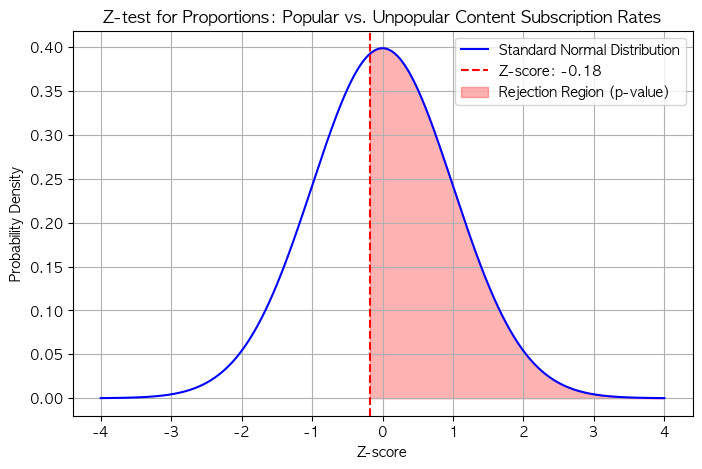

✅ Z-statistic: -0.1826
✅ p-value: 0.5725


In [53]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
from statsmodels.stats.proportion import proportions_ztest

# 🔹 두 그룹 (인기 콘텐츠 vs 비인기 콘텐츠) 데이터
n1, n2 = len(users_from_popular), len(users_from_unpopular)
subscribed1 = users_from_popular['complete_subscription_time'].apply(lambda x: any(pd.notna(x))).sum()
subscribed2 = users_from_unpopular['complete_subscription_time'].apply(lambda x: any(pd.notna(x))).sum()

# 🔹 Z-test 수행
count = np.array([subscribed1, subscribed2])
nobs = np.array([n1, n2])
z_stat, p_value = proportions_ztest(count, nobs, alternative='larger')

# 🔹 시각화: Z-검정 정규분포 곡선
x = np.linspace(-4, 4, 1000)  # Z-스코어 범위 (-4 ~ 4)
y = stats.norm.pdf(x, 0, 1)   # 평균 0, 표준편차 1인 정규분포
plt.figure(figsize=(8, 5))
plt.plot(x, y, label="Standard Normal Distribution", color='blue')

# 🔹 Z-통계량 위치 표시 (실제 z-score)
plt.axvline(z_stat, color='red', linestyle='--', label=f'Z-score: {z_stat:.2f}')
plt.fill_between(x, y, where=(x >= z_stat), color='red', alpha=0.3, label="Rejection Region (p-value)")

plt.title("Z-test for Proportions: Popular vs. Unpopular Content Subscription Rates")
plt.xlabel("Z-score")
plt.ylabel("Probability Density")
plt.legend()
plt.grid()

plt.show()

# 결과 해석
print(f"✅ Z-statistic: {z_stat:.4f}")
print(f"✅ p-value: {p_value:.4f}")

### 가설 검정 해석
- Z통계량이 -0.18이므로 0 근처에 위치, 인기 콘텐츠와 비인기 콘텐츠의 구독 전환율 차이가 크지 않음
- 유의수준 a=0.05 기준으로 z > 1.96 or z < 1.96일때, 귀무가설 기각 가능.
하지만 Z-score가 -0.18로, 귀무가설을 기각할 수 없음

### 3. OS 사용량 분석 코드

In [39]:
# 모든 OS 데이터를 개별 행으로 변환 (explode 사용)
os_exploded = filtered_grouped_df.explode('os_name_x')

# OS별 사용 빈도수 계산
os_counts = os_exploded['os_name_x'].value_counts().reset_index()
os_counts.columns = ['os_name', 'user_count']

# 결과 출력
display(os_counts)


,os_name,user_count
0,Chrome,38031
1,Edge,6429
2,Mobile Safari,2886
3,Safari,2833
4,Whale,2235
5,Samsung Browser,1681
6,Chrome WebView,1492
7,Chrome Mobile,1317
8,Instagram,511
9,WebKit,486


### 4. 무료 콘텐츠를 처음 수강한 시간과 첫 구독을 누른 시간의 갭 분석

In [41]:
# 'click_start_content_time'과 'complete_subscription_time'에서 처음 발생한 시간만 선택
filtered_grouped_df['first_start_content_time'] = filtered_grouped_df['click_start_content_time'].apply(lambda x: min(x) if isinstance(x, list) and len(x) > 0 else pd.NaT)
filtered_grouped_df['first_subscription_time'] = filtered_grouped_df['complete_subscription_time'].apply(lambda x: min(x) if isinstance(x, list) and len(x) > 0 else pd.NaT)

# 시간 차이 계산 (첫 구독 - 첫 클릭)
filtered_grouped_df['time_to_subscribe'] = filtered_grouped_df.apply(
    lambda row: (row['first_subscription_time'] - row['first_start_content_time']).total_seconds() / 3600 if pd.notna(row['first_subscription_time']) else None, axis=1
)

# 결과 확인 (첫 클릭, 첫 구독, 시간 차이)
display(filtered_grouped_df[['user_id', 'first_start_content_time', 'first_subscription_time', 'time_to_subscribe']])


,user_id,first_start_content_time,first_subscription_time,time_to_subscribe
0,0001435bc6c0c0f05315192f89275425,2023-01-16 10:00:52.580,NaT,NaN
1,0003691a8bc9f96481baa7086ae04592,2022-11-06 20:59:00.162,NaT,NaN
2,0003c0ede663b9e3b55d9dc3f7e8690f,2023-02-08 01:40:05.215,NaT,NaN
3,000634ec5553ca63f77c61690353a0be,2023-05-26 15:06:18.658,NaT,NaN
4,000722d5152d121ef57d8246dff4ac91,2022-12-13 18:54:50.431,NaT,NaN
...,...,...,...,...
24961,fff60192556898a9001de93f8708bedf,2022-11-19 09:40:53.996,NaT,NaN
24962,fff8b3be926adfb193591e262b087b74,2022-03-13 15:49:36.633,NaT,NaN
24963,fffba676b17f9f0f228360930f238f07,2022-06-20 17:42:06.657,NaT,NaN
24964,fffd757f689e039a1d4db0adc1b80b61,2023-01-16 20:11:34.191,NaT,NaN


In [43]:
# 구독한 유저만 필터링
subscribed_users = filtered_grouped_df.dropna(subset=['time_to_subscribe'])

# 구독한 유저 수 계산
num_subscribed_users = len(subscribed_users)

# 평균 구독 전환 시간 계산
average_time_to_subscribe = subscribed_users['time_to_subscribe'].mean()

# 평균 구독 전환 일자 계산
average_days_to_subscribe =  average_time_to_subscribe / 24

print(f"무료 체험 후 첫 결제한 유저 수: {num_subscribed_users}명")
print(f"평균 구독 전환 시간: {average_time_to_subscribe:.2f} 시간")
print(f" 평균 구독 전환 일수: {average_days_to_subscribe:.2f} 일")

무료 체험 후 첫 결제한 유저 수: 7657명
평균 구독 전환 시간: -219.37 시간
 평균 구독 전환 일수: -9.14 일


### 5. 이미 구독을 하고 무료 콘텐츠를 들었다? 복잡하다.양수/음수 time_to_subscribe 데이터 분리 분석

In [ ]:
# 양수 값(정상적인 구독 전환)
positive_time_to_subscribe = filtered_grouped_df[filtered_grouped_df['time_to_subscribe'] >= 0]

# 음수 값(이상한 데이터, 구독이 클릭보다 먼저 기록됨)
negative_time_to_subscribe = filtered_grouped_df[filtered_grouped_df['time_to_subscribe'] < 0]

# 결과 확인
print(f"양수(정상적인) 구독 전환 유저 수: {len(positive_time_to_subscribe)}")
print(f"음수(이상한) 구독 전환 유저 수: {len(negative_time_to_subscribe)}")

양수(정상적인) 구독 전환 유저 수: 2459
음수(이상한) 구독 전환 유저 수: 5198


In [46]:
# 양수 값 평균 (정상적인 구독 전환)
average_positive_time_to_subscribe = positive_time_to_subscribe['time_to_subscribe'].mean()
average_positive_days_to_subscribe = average_positive_time_to_subscribe / 24

# 음수 값 평균 (이상한 데이터)
average_negative_time_to_subscribe = negative_time_to_subscribe['time_to_subscribe'].mean()
average_negative_days_to_subscribe = average_negative_time_to_subscribe / 24

# 결과 출력
print(f"✅ 평균 구독 전환 시간 (양수): {average_positive_time_to_subscribe:.2f} 시간 -> {average_positive_days_to_subscribe:.2f} 일")
print(f"✅ 평균 구독 전환 시간 (음수): {average_negative_time_to_subscribe:.2f} 시간 -> {average_negative_days_to_subscribe:.2f} 일")


✅ 평균 구독 전환 시간 (양수): 567.95 시간 -> 23.66 일
✅ 평균 구독 전환 시간 (음수): -591.82 시간 -> -24.66 일


### 6. 리뷰 클릭수가 많은 콘텐츠가 콘텐츠 시작에 도움을 주나? (학습 전환율 분석)

### 6-1. 데이터 준비
- user_id가 NaN인 행 제거
- content_review_id별 click_count 계산
- 리뷰 클릭 수가 높은 콘텐츠와 낮은 콘텐츠 분류
- click_start_content_time을 datetime으로 변환

In [119]:
# NaN인 user_id 제거
merged_df = merged_df.dropna(subset=['user_id'])

# 콘텐츠별 리뷰 클릭 횟수 계산 (content_id 기준)
click_count = merged_df.groupby('content_id')['click_review_time'].count().reset_index(name='click_count')

# merged_df에 click_count 병합 (콘텐츠별 리뷰 클릭 수 추가)
merged_df = merged_df.merge(click_count, on='content_id', how='left')

# 병합 결과 확인
print(merged_df[['content_id', 'click_review_time', 'click_count']].head())



                         content_id click_review_time  click_count
0  445fac33232adcb3d1cdab7d8a579430               NaT          0.0
1  18992b667be06d6f29ba0008f99d9745               NaT         44.0
2  dfbdae782996c25daed7517b8835f3aa               NaT          0.0
3  a1eeebeb6c307641b75b94a2a1d5b9aa               NaT         62.0
4  7de35a9d8f14c68e5f2a8788dda5f72e               NaT         45.0


In [120]:

# click_start_content_time을 datetime으로 변환
merged_df['click_start_content_time'] = pd.to_datetime(merged_df['click_start_content_time'])

# 상위 25% 리뷰 클릭 수를 "인기 콘텐츠", 하위 25% 리뷰 클릭 수를 "비인기 콘텐츠"로 분류
high_clicks = merged_df['click_count'].quantile(0.25)
low_clicks = merged_df['click_count'].quantile(0.75)

merged_df['content_review_popularity'] = np.where(merged_df['click_count'] >= low_clicks, 'High Clicks',
                                np.where(merged_df['click_count'] <= high_clicks, 'Low Clicks', 'Medium Clicks'))

print(merged_df['content_review_popularity'].value_counts())

content_review_popularity
Medium Clicks    60030
High Clicks      34352
Low Clicks       33578
Name: count, dtype: int64


### 6-2. 리뷰 클릭 수가 높은 콘텐츠와 낮은 콘텐츠의 분포 비교
- 클릭 수가 많다고 콘텐츠 시작 확률이 높다고 볼 수 없음

6-2-1.유저별 콘텐츠 리뷰 클릭 횟수 보기

In [136]:
# 유저별 + 콘텐츠별 리뷰 클릭 횟수 계산
user_content_clicks = merged_df.groupby(['user_id', 'content_id'])['click_review_time'].count().reset_index(name='click_count')
user_content_clicks = user_content_clicks.sort_values(by='click_count', ascending=False)

display(user_content_clicks.head())

,user_id,content_id,click_count
69180,cb07a8015b8292cb8fac531c0efb58bc,afe201c04b426366e0f8e9e2207c78c2,54
72325,d356f962902b05588a02a16a60fc167e,ecde9a1b01763f791c3a185d53b5f394,23
58005,a992106c67684123d8e27431ecb3687a,f491517f4737a60d661cd1fcacc702c0,23
3812,0ad15c951f0eb707b00e1cb3c99ba834,1ccd38c0253604fb48f78970736f915c,19
58156,aa02a721c68a03864b5446500d7296bd,f491517f4737a60d661cd1fcacc702c0,17


In [ ]:
# 유저별 총 리뷰 클릭 횟수 (중복 포함)
user_total_clicks = merged_df.groupby('user_id')['click_review_time'].count().reset_index(name='total_clicks')

# 유저별 총 리뷰 클릭 횟수를 내림차순 정렬
user_total_clicks_sorted = user_total_clicks.sort_values(by='total_clicks', ascending=False)

display(user_total_clicks_sorted.head(10)) 



,user_id,total_clicks
27770,cb07a8015b8292cb8fac531c0efb58bc,57
23272,a992106c67684123d8e27431ecb3687a,23
28912,d356f962902b05588a02a16a60fc167e,23
1484,0ad15c951f0eb707b00e1cb3c99ba834,20
23331,aa02a721c68a03864b5446500d7296bd,17
12045,57542a51e6d83e2a11fd6f35224067d7,16
34082,f8868b5573dc20f97a1c65b25a02b7fb,15
14361,6890a14a8d65d6587efc541bfe15ce88,13
31584,e6f768c8264227798f9ec6c65a7263bc,13
13157,5f96e0ec35112c6b0a76ea51f1e89700,13


6-2-2. 유저별 클릭한 고유 콘텐츠 갯수

In [125]:
# 유저별 고유한 콘텐츠 개수 계산
unique_content_per_user = user_content_clicks.groupby('user_id')['content_id'].nunique().reset_index(name='unique_content_count')

# 결과 확인
display(unique_content_per_user.head())


,user_id,unique_content_count
0,0001435bc6c0c0f05315192f89275425,1
1,0001f15911b404f3bf5b8571afafa4e4,1
2,0003691a8bc9f96481baa7086ae04592,1
3,0003c0ede663b9e3b55d9dc3f7e8690f,4
4,000634ec5553ca63f77c61690353a0be,1


NameError: name 'ax' is not defined

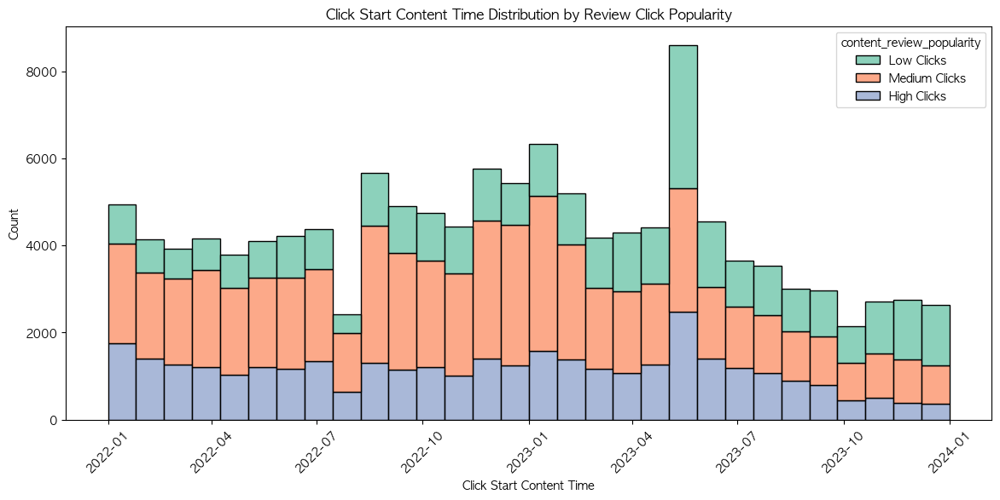

In [ ]:
plt.figure(figsize=(14, 6))

# 히스토그램을 누적형(스택형)으로 표시
sns.histplot(data=merged_df, 
             x='click_start_content_time', 
             hue='content_review_popularity', 
             kde=False,  
             bins=30,  
             multiple='stack',  
             palette="Set2")  

plt.title('Click Start Content Time Distribution by Review Click Popularity')
plt.xlabel('Click Start Content Time')
plt.ylabel('Count')

plt.xticks(rotation=45)

ax.legend(title='Content Popularity', loc='upper right')

plt.show()



### 6-3. 리뷰 클릭 많이 한 유저와 적게 한 유저의 첫 결제 전환율을 보자

In [140]:
print(user_content_clicks.columns)

Index(['user_id', 'total_clicks'], dtype='object')


In [141]:
# 유저별 총 리뷰 클릭 횟수 계산
user_content_clicks = user_content_clicks.groupby('user_id')['total_clicks'].sum().reset_index(name='total_clicks')

# 상위 50%와 하위 50%를 기준으로 구분
median_clicks = user_total_clicks['total_clicks'].median()

# 클릭이 많은 유저(True) vs. 적은 유저(False)
user_total_clicks['high_click_user'] = user_total_clicks['total_clicks'] > median_clicks

click_group_summary = user_total_clicks.groupby('high_click_user').agg(
    total_users=('user_id', 'count')
).reset_index()

# 결과 확인
display(click_group_summary.head())


,high_click_user,total_users
0,False,33894
1,True,1212


In [142]:
# 첫 결제 여부 확인 (결제한 경우 True, 안 한 경우 False)
merged_df['first_payment'] = merged_df['complete_subscription_time'].notnull()

# 유저별 클릭 그룹 정보 추가 (high_click_user 컬럼 추가)
merged_df = merged_df.merge(user_total_clicks[['user_id', 'high_click_user']], on='user_id', how='left')

# 결과 확인
display(merged_df[['user_id', 'high_click_user', 'first_payment']].head())


,user_id,high_click_user,first_payment
0,41362ad5ebcade2bb1b78344a53e7ccf,False,True
1,f7155af01d277f11b1c7d05cf772c686,False,True
2,1b05f9fe82b80771323caa1cd5683143,False,False
3,353528475f2bd85934263421ccd579b3,True,True
4,353528475f2bd85934263421ccd579b3,True,True


In [160]:
# 결제한 유저만 필터링
paid_users = merged_df[merged_df['first_payment'] == True]

# 리뷰 클릭 후 첫 결제까지 걸린 시간 계산
paid_users['time_to_payment'] = (paid_users['complete_subscription_time'] - paid_users['click_review_time']).dt.total_seconds() / 3600  # 시간 단위로 변환

# 결과 확인
display(paid_users[['user_id', 'click_review_time', 'complete_subscription_time', 'time_to_payment']].head())

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_25392/3221251743.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paid_users['time_to_payment'] = (paid_users['complete_subscription_time'] - paid_users['click_review_time']).dt.total_seconds() / 3600  # 시간 단위로 변환


,user_id,click_review_time,complete_subscription_time,time_to_payment
0,41362ad5ebcade2bb1b78344a53e7ccf,NaT,2022-06-23 17:07:25.279,NaN
1,f7155af01d277f11b1c7d05cf772c686,NaT,2023-03-12 18:04:27.409,NaN
3,353528475f2bd85934263421ccd579b3,NaT,2023-04-03 08:20:01.495,NaN
4,353528475f2bd85934263421ccd579b3,NaT,2023-04-03 08:20:01.495,NaN
5,f853aa18605bd7f11162236b6b8ac4c5,NaT,2023-03-22 23:46:24.913,NaN


In [147]:

# 리뷰 클릭이 많은 유저 여부 기준으로 그룹화
click_groups = paid_users.groupby('high_click_user')['time_to_payment'].agg(
    mean_time=('mean'),  # 평균 결제까지 걸린 시간
    median_time=('median'),  # 중앙값 (대표적인 결제 속도)
    min_time=('min'),  # 최소값 (가장 빠른 결제)
    max_time=('max')  # 최대값 (가장 늦은 결제)
).reset_index()

# 결과 확인
display(click_groups)


,high_click_user,mean_time,median_time,min_time,max_time
0,False,NaN,NaN,NaN,NaN
1,True,-668.378777,-145.750365,-13260.864649,10229.80839


### 유저가 첫 결제를 먼저 하고 리뷰를 클릭한 경우가 더 많은 것 같음 ㅠㅠ

### 리뷰 클릭하고 결제한 유저들만 분석해보자

In [161]:
# 리뷰 클릭 후 결제한 데이터만 필터링 (이상값 제거)
review_before_payment_users = paid_users[paid_users['click_review_time'] <= paid_users['complete_subscription_time']]

# 다시 결제까지 걸린 시간 계산
review_before_payment_users['time_to_payment'] = (review_before_payment_users['complete_subscription_time'] - review_before_payment_users['click_review_time']).dt.total_seconds() / 3600  # 시간 단위

# 평균 결제 소요 시간 계산 (리뷰 클릭 후 결제까지 걸린 시간)
average_payment_time = review_before_payment_users['time_to_payment'].mean()

# 총 유저 수 계산 (중복 제거)
total_users = review_before_payment_users['user_id'].nunique()

print(f"평균 결제 소요 시간: {average_payment_time:.2f} 시간")
print(f"총 유저 수: {total_users} 명")



평균 결제 소요 시간: 576.42 시간
총 유저 수: 162 명


/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_25392/1323249744.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  review_before_payment_users['time_to_payment'] = (review_before_payment_users['complete_subscription_time'] - review_before_payment_users['click_review_time']).dt.total_seconds() / 3600  # 시간 단위


### 결제를 하고 리뷰를 본 유저들을 보자

In [162]:
# 결제 후 리뷰를 본 유저 필터링
review_after_payment_users = paid_users[paid_users['click_review_time'] > paid_users['complete_subscription_time']]


display(review_after_payment_users[['user_id', 'click_review_time', 'complete_subscription_time']].head())

# 결제 후 리뷰 본 유저 수
total_after_payment_users = review_after_payment_users['user_id'].nunique()
print(f"결제 후 리뷰를 클릭한 유저 수: {total_after_payment_users} 명")


,user_id,click_review_time,complete_subscription_time
12,79421b5d038205ad7adbb1e2c3b89741,2023-04-06 22:37:59.913,2023-03-12 17:46:14.026
70,db63522b02cd08584e5e1df2836b21cc,2023-02-02 11:54:11.516,2023-01-10 23:49:20.420
319,c08e32271d96bd91f8626c49f91e9fc3,2023-04-02 13:29:06.838,2022-11-22 20:33:52.443
405,11513e927f01a9ce44af5c4730ceac88,2023-02-09 23:54:22.169,2023-01-31 19:40:10.114
753,8e60aad933c36f62252053edbf665b33,2023-08-14 18:42:34.802,2022-11-22 21:42:01.562


결제 후 리뷰를 클릭한 유저 수: 407 명


In [ ]:
# 구독한 유저만 필터링
subscribed_users = filtered_grouped_df.dropna(subset=['time_to_subscribe'])

# 구독한 유저 수 계산
num_subscribed_users = len(subscribed_users)

# 평균 구독 전환 시간 계산
average_time_to_subscribe = subscribed_users['time_to_subscribe'].mean()

# 평균 구독 전환 일자 계산
average_days_to_subscribe =  average_time_to_subscribe / 24

print(f"무료 체험 후 첫 결제한 유저 수: {num_subscribed_users}명")
print(f"평균 구독 전환 시간: {average_time_to_subscribe:.2f} 시간")
print(f" 평균 구독 전환 일수: {average_days_to_subscribe:.2f} 일")

무료 체험 후 첫 결제한 유저 수: 7657명
평균 구독 전환 시간: -219.37 시간
 평균 구독 전환 일수: -9.14 일


In [144]:
# 클릭 그룹별 첫 결제 전환율 계산
review_first_payment_conversion_rates = merged_df.groupby('high_click_user')['first_payment'].mean().reset_index(name='conversion_rate')

# 결과 확인
display(review_first_payment_conversion_rates)


,high_click_user,conversion_rate
0,False,0.383369
1,True,0.553863


In [145]:
# 클릭 그룹별 유저 수, 결제한 유저 수, 전환율 계산
conversion_summary = merged_df.groupby('high_click_user').agg(
    total_users=('user_id', 'nunique'),
    total_payers=('first_payment', 'sum'),  
    conversion_rate=('first_payment', 'mean') 
).reset_index()

# 결과 확인
display(conversion_summary)


,high_click_user,total_users,total_payers,conversion_rate
0,False,33894,44878,0.383369
1,True,1212,6036,0.553863


### 아래는 분석 망한 코드들. 👇🏻

### 6-3. 학습 전환율 계산하기
- 클릭 수가 매우 적고 전환율이 높은 것으로 보아 다음과 같이 해석할 수 있음 </br>
1. 사람들이 리뷰를 클릭하지 않고 바로 구독을 할 수 있음 -> 신규 유저와 재구독 유저로 비교할 수 있나?</br>
2. 클릭수 자체가 너무 적어서 분석하는게 의미가 없을 수도 있음</br>

In [164]:
# 콘텐츠별 클릭 대비 학습 전환율 계산
conversion_rate = merged_df.groupby('content_review_popularity').agg(
    total_clicks=('click_review_time', 'count'),  # 리뷰 버튼을 누른 횟수
    total_starts=('click_start_content_time', lambda x: x.notnull().sum())  # 실제 학습을 시작한 횟수
).reset_index()

# 학습 전환율 (학습 시작 수 / 리뷰 클릭 수)
conversion_rate['conversion_rate'] = conversion_rate['total_starts'] / conversion_rate['total_clicks']

# 결과 출력
print(conversion_rate)


  content_review_popularity  total_clicks  total_starts  conversion_rate
0               High Clicks           849         34352        40.461720
1                Low Clicks           315         33578       106.596825
2             Medium Clicks          1430         60030        41.979021


### 6-4. 그렇다면 리뷰를 확인한 유저와 아닌 유저의 학습 전환율은 다를까? [유저당 학습 전환율]

In [ ]:
# 리뷰를 클릭한 유저 여부 확인 (True = 리뷰 클릭한 유저, False = 리뷰 클릭 안 한 유저)
merged_df['review_clicked'] = merged_df['click_review_time'].notnull()

# 그룹별 학습 전환율 계산
conversion_by_review = merged_df.groupby('review_clicked').agg(
    total_users=('user_id', 'nunique'),  # 유니크 유저 수
    total_starts=('click_start_content_time', lambda x: x.notnull().sum())  # 학습 시작 수
).reset_index()

# 학습 전환율 추가 (학습 시작 수 / 전체 유저 수)
conversion_by_review['conversion_rate'] = conversion_by_review['total_starts'] / conversion_by_review['total_users']

# 결과 출력
print(conversion_by_review)

# 전환율이 1을 넘으면 안되는데 이상하게 나옴
# 한 유저가 여러 콘텐츠를 클릭하고 학습을 시작할 수 있기 때문에 전환율이 1을 넘을 수 있는 것으로 추측

   review_clicked  total_users  total_starts  conversion_rate
0           False        34819        125366         3.600505
1            True         1212          2594         2.140264


### 6-5. 리뷰 클릭 수와 콘텐츠 시작 간 상관관계 분석
- 결과가 이상함.. 여기서부터 꼬이기시작. 해결 불가..

Click Count vs. Click Start Content Time Correlation:
                           click_count  click_start_content_time
click_count                       1.0                       1.0
click_start_content_time          1.0                       1.0


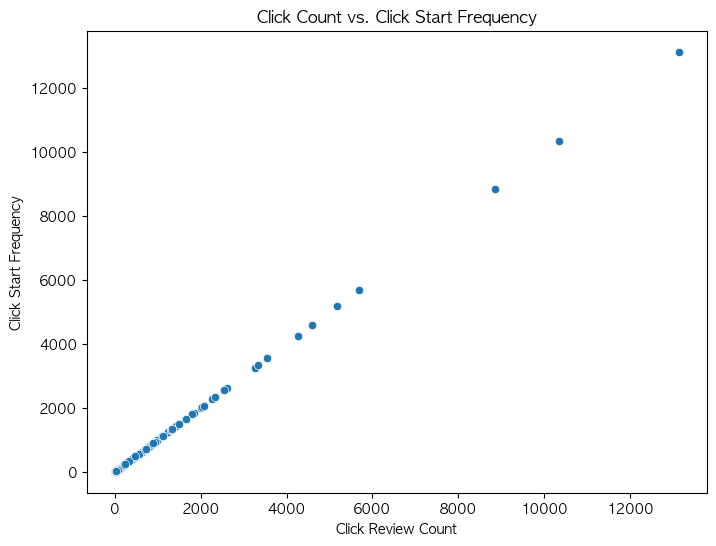

In [88]:
# 콘텐츠별 평균 시작 시간 계산 (콘텐츠 클릭 횟수 대비 시작 시간)
content_start_time_mean = merged_df.groupby('content_id')['click_start_content_time'].count().reset_index()
content_start_time_mean = content_start_time_mean.merge(click_counts, on='content_id')

# 상관계수 계산
correlation = content_start_time_mean[['click_count', 'click_start_content_time']].corr()
print("Click Count vs. Click Start Content Time Correlation:\n", correlation)

# 시각화 - 클릭 수 vs. 콘텐츠 시작 횟수
plt.figure(figsize=(8,6))
sns.scatterplot(data=content_start_time_mean, x='click_count', y='click_start_content_time')
plt.title('Click Count vs. Click Start Frequency')
plt.xlabel('Click Review Count')
plt.ylabel('Click Start Frequency')
plt.show()


### 6-6. 가설 주제
- 귀무가설: 리뷰 클릭 수가 많은 콘텐츠여도 유저가 콘텐츠를 시작할 확률이 증가하지 않는다.
- 대립가설: 리뷰 클릭 수가 많은 콘텐츠일수록 유저가 콘텐츠를 시작할 확률이 증가한다.
- t-test 독립표본, 카이제곱 검정 시행

In [103]:
# High Clicks와 Low Clicks에 해당하는 데이터 추출
high_clicks_df = merged_df[merged_df['content_review_popularity'] == 'High Clicks']
low_clicks_df = merged_df[merged_df['content_review_popularity'] == 'Low Clicks']

# High Clicks와 Low Clicks 그룹의 학습 시작 비율 계산
high_clicks_conversion_rate = high_clicks_df['click_start_content_time'].notnull().sum() / high_clicks_df.shape[0]
low_clicks_conversion_rate = low_clicks_df['click_start_content_time'].notnull().sum() / low_clicks_df.shape[0]

# 결과 출력
print(f"✅ High Clicks 그룹의 학습 전환율: {high_clicks_conversion_rate:.4f}")
print(f"✅ Low Clicks 그룹의 학습 전환율: {low_clicks_conversion_rate:.4f}")

# 비교 결과 출력
if high_clicks_conversion_rate > low_clicks_conversion_rate:
    print("✅ High Clicks 그룹이 Low Clicks 그룹보다 학습 시작 확률이 높습니다.")
elif high_clicks_conversion_rate < low_clicks_conversion_rate:
    print("✅ Low Clicks 그룹이 High Clicks 그룹보다 학습 시작 확률이 높습니다.")
else:
    print("⚠️ 두 그룹의 학습 시작 확률이 동일합니다.")



✅ High Clicks 그룹의 학습 전환율: 1.0000
✅ Low Clicks 그룹의 학습 전환율: 1.0000
⚠️ 두 그룹의 학습 시작 확률이 동일합니다.


In [101]:
# 등분산 검정 수행
from scipy.stats import levene

# 등분산 검정 수행
stat, p = levene(high_clicks, low_clicks)

print(f"Levene’s test 결과: statistic={stat}, p-value={p}")

# p-value < 0.05이면 등분산이 아님 (즉, equal_var=False가 적절)
if p < 0.05:
    print("⚠️ 두 그룹의 분산이 유의미하게 다릅니다. (equal_var=False 사용 권장)")
else:
    print("✅ 두 그룹의 분산 차이가 유의하지 않습니다. (equal_var=True 사용 가능)")


Levene’s test 결과: statistic=nan, p-value=nan
✅ 두 그룹의 분산 차이가 유의하지 않습니다. (equal_var=True 사용 가능)


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scipy/stats/_morestats.py:3057: RuntimeWarning: invalid value encountered in scalar divide
  W = numer / denom


In [99]:
# 필요한 라이브러리 불러오기
from scipy.stats import ttest_ind

# High Clicks 그룹과 Low Clicks 그룹의 시작 비율 비교
high_clicks = merged_df[merged_df['content_review_popularity'] == 'high_clicks']['click_start_content_time'].notnull().astype(int)
low_clicks = merged_df[merged_df['content_review_popularity'] == 'low_clicks']['click_start_content_time'].notnull().astype(int)

# t-test 수행
t_stat, p_value = ttest_ind(high_clicks, low_clicks, equal_var=False)

print(f"T-test 결과: t-statistic={t_stat}, p-value={p_value}")

# 유의 수준 0.05를 기준으로 해석
if p_value < 0.05:
    print("p-value가 0.05보다 작으므로 클릭 수가 많은 콘텐츠일수록 시작 확률이 높다는 대립가설을 채택할 수 있다")
else:
    print("p-value가 0.05보다 크므로 클릭 수가 콘텐츠 시작에 미치는 영향이 유의미하지 않다.")

# 값이 왜 nan?......


T-test 결과: t-statistic=nan, p-value=nan
p-value가 0.05보다 크므로 클릭 수가 콘텐츠 시작에 미치는 영향이 유의미하지 않다.


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/scipy/_lib/deprecation.py:234: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  return f(*args, **kwargs)


### 번외 1. 유저 아이디별로 콘텐츠 클릭

In [92]:
# 한 유저당 콘텐츠 클릭 수 
user_content_count = user_content_ids_filtered.groupby('user_id')['content_id'].nunique().sort_values(ascending=False)
user_content_count

user_id
3bc001ca42b22a7446687c3d183af0cd    66
6421bf3808b89da97f316eac07da2b91    59
caec8b3be818f1408e0d47d89acc245f    55
d2691bedf9ae0bc97a182e57361bdeb8    54
38410d6be64b42c85ed796fbe9e3d368    51
                                    ..
6df6a322c618f8fa9413dd050a85c71f     1
6df49741ff96dfada8cde7a8c1ec4d54     1
6dec728300e7f49f04d02fdae3b7ae71     1
6deba6d26a6a07c2d16ed54498b0fbf9     1
7fb5dcf84ccc668104e1d8aba8fef8f8     1
Name: content_id, Length: 35096, dtype: int64

# 7. enter.payment_page
- 결제 페이지 진입

In [9]:
enter_payment = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.payment_page.csv')
enter_payment.drop(columns=['device_carrier'], inplace=True)
enter_payment.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seoul,2023-04-05 21:31:27.602000,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.payment_page,Korean,Chrome,112.0.0.0,Web,8ee58bcaa05b234cdbf84167c0983385
1,Wonju,2023-04-05 21:33:30.699000,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,111.0.0.0,Web,74d17c27a41656e7788b0c81d9f76cda
2,Daejeon,2023-04-05 21:05:28.337000,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,111.0.1661.62,Web,62cfa08370da60b8db4495baaff62806
3,Seoul,2023-04-05 21:45:27.935000,South Korea,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce
4,Seoul,2023-04-05 21:46:50.632000,South Korea,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce


In [58]:
enter_payment.isna().sum()

city                 2699
client_event_time       0
country               162
device_family           1
device_type          5995
event_type              0
language                0
os_name                 0
os_version            501
platform                0
user_id              6227
dtype: int64

In [61]:
# 'client_event_time'을 datetime 형식으로 변환
enter_payment['client_event_time'] = pd.to_datetime(enter_payment['client_event_time'], errors='coerce')

# 날짜만 추출
enter_payment['date'] = enter_payment['client_event_time'].dt.to_period('M')

# `user_id`가 NaN인 데이터만 필터링
null_user_data = enter_payment[enter_payment['user_id'].isna()]

# 날짜별 `NaN user_id` 개수 집계
null_user_counts = null_user_data.groupby('date').size()

# 결과 출력
display(null_user_counts)


date
2022-11      45
2022-12     151
2023-01     231
2023-02     963
2023-03     146
2023-04     106
2023-05     154
2023-06     327
2023-07     650
2023-08     573
2023-09     795
2023-10     889
2023-11    1032
2023-12     165
Freq: M, dtype: int64

# 구독 퍼널 전환률 분석
- 이탈하지 않고 강의 수강하는 유저 /첫 결제한 유저들
- 정기구독 + 재구독한 유저들/수강 이탈하지 않은 유저들
- 합쳐야할 데이터셋: 8번, 9번, 10번, 13번, 14번

## 1.첫 결제 데이터 불러오기

In [5]:
complete_subscription = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/complete.subscription.csv')
complete_subscription.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
complete_subscription.rename(columns={'client_event_time': 'complete_subscription_time'}, inplace=True)
complete_subscription.drop(complete_subscription[complete_subscription['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
complete_subscription['complete_subscription_time'] = pd.to_datetime(complete_subscription['complete_subscription_time'])

# 9시간 추가 (UTC+9 적용)
complete_subscription['complete_subscription_time'] = complete_subscription['complete_subscription_time'] + pd.Timedelta(hours=9)

# 시간 필터링
complete_subscription = complete_subscription.loc[
    complete_subscription['complete_subscription_time'].dt.year.between(2022, 2023)]

# 컬럼명 수정하기
complete_subscription.rename(columns={'plan.price': 'plan_price', 'pg.type': 'pg_type'}, inplace=True)
complete_subscription.head()

,city,complete_subscription_time,country,device_type,event_type,language,os_name,user_id,plan_price,paid_amount,coupon.discount_amount,pg_type
0,Nowon-gu,2023-04-06 06:40:04.000,South Korea,Windows,complete.subscription,Korean,Edge,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 23:20:03.008,South Korea,Apple iPhone,complete.subscription,Korean,Mobile Safari,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 17:46:14.026,South Korea,Windows,complete.subscription,Korean,Chrome,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN
3,Geumjeong-gu,2023-04-12 20:35:01.865,South Korea,Windows,complete.subscription,Korean,Chrome,bdffe1f18684704d4ea2d7eebcaed180,131600,131600,0,NaN
4,Gwangmyeong,2023-05-31 10:25:55.820,South Korea,Mac,complete.subscription,Korean,Chrome,d4f54ecf6c4d7bf8742f80505f02d6dc,15920,15920,0,NaN


### 1-1. 첫 결제 데이터 전처리

In [6]:
complete_subscription = complete_subscription.drop_duplicates(subset=['user_id'], keep='first')
complete_subscription['user_id'].nunique()

13875

### 1-3. 첫 결제 유저 아이디 리스트 만들기

In [31]:
# 첫 결제 유저아이디 리스트 만들기
first_payment_user_id_list = complete_subscription['user_id'].dropna().unique()
unique_first_payment_user_ids = len(first_payment_user_id_list)
print(f" 첫 결제 유저 수: {unique_first_payment_user_ids}")

 첫 결제 유저 수: 13875


In [118]:
print(type(first_payment_user_id_list))

<class 'list'>


In [187]:
# complete_lesson과 enter_lesson에서 활동이 있는 유저 리스트
active_users = set(complete_lesson['user_id'].dropna().unique()) | set(enter_lesson['user_id'].dropna().unique())

# 활동이 없는 유저 찾기
inactive_users = [user_id for user_id in first_payment_user_id_list if user_id not in active_users]

# 결과 출력
print(f"활동 기록이 없는 첫 결제 유저 수: {len(inactive_users)}")
print("활동이 없는 첫 결제 유저 리스트:", inactive_users[:10])

활동 기록이 없는 첫 결제 유저 수: 526
활동이 없는 첫 결제 유저 리스트: ['2cee14cb49884f70132463175c487f16', '7b4e99a51540fb379312774da76e17d3', '9e8460b45b379b780cb3a3c6fbf32170', 'b07c5a14a775d6e3f8cc215bb6f2c9c7', '4151699c6b723d35ec6ef9e24b3b7e51', '3fd116afa1d2a32b4a381319e5b015ad', 'e49ef6588f936ecf87639ed711abf3c6', 'c2f2f7a149ac10d2415dd503cd8a9786', '56b72aef97c516661f8831424da9803a', '3594d15afd528e37db6f4be090438742']


## 2. Complete_lesson 데이터 불러오기

In [8]:
complete_lesson = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/complete.lesson.csv')
complete_lesson.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
complete_lesson.rename(columns={'client_event_time': 'complete_lesson_time'}, inplace=True)
complete_lesson.drop(complete_lesson[complete_lesson['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
complete_lesson['complete_lesson_time'] = pd.to_datetime(complete_lesson['complete_lesson_time'])

# 9시간 추가 (UTC+9 적용)
complete_lesson['complete_lesson_time'] = complete_lesson['complete_lesson_time'] + pd.Timedelta(hours=9)

# 시간 필터링
complete_lesson = complete_lesson.loc[
    complete_lesson['complete_lesson_time'].dt.year.between(2022, 2023)]

# 컬럼명 수정하기
complete_lesson.rename(columns={'content.id': 'content_id', 'lesson.id': 'lesson_id'}, inplace=True)
complete_lesson.head()

,city,complete_lesson_time,country,device_type,event_type,language,os_name,user_id,content_id,lesson_id
0,Wonju,2023-04-06 06:55:51.836,South Korea,Windows,complete.lesson,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,d360d68b65fd3e0eafb7982386d75fd9
1,Daejeon,2023-04-06 06:19:01.243,South Korea,Windows,complete.lesson,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,7e0f6aae886368ef9fa97007a8e9f7ac
2,Daejeon,2023-04-06 06:20:27.939,South Korea,Windows,complete.lesson,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,d1e93c9dc08267efab31849bc6083854
3,Daejeon,2023-04-06 06:23:01.534,South Korea,Windows,complete.lesson,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,f22ea5dc431035305e705552bbc4f45b
4,Daejeon,2023-04-06 06:28:34.965,South Korea,Windows,complete.lesson,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,ce0bfeb7fb1259c588f437d48ab2690c


### 2-1. 레슨 완료한 데이터에서 중복되는 타임스탬프 분석

In [95]:
# 유저별 시간 기준 정렬 후 시간 차이 계산
complete_lesson_sorted = complete_lesson.sort_values(
    by=['user_id', 'complete_lesson_time'], ascending=True
)

# 시간 차이 계산 (단위: 초)
complete_lesson_sorted["time_diff_seconds"] = (
    complete_lesson_sorted.groupby('user_id')['complete_lesson_time']
    .diff()
    .dt.total_seconds())  # 초 단위로 변환

### 2-2. 전처리 작업

In [15]:
complete_lesson_filtered = complete_lesson_sorted[complete_lesson_sorted["time_diff_seconds"] > 30]
print("타임 디프 필터링", len(complete_lesson_filtered))

타임 디프 필터링 4502312


In [16]:
complete_lesson_filtered["complete_lesson_time_trimmed"] = complete_lesson_filtered["complete_lesson_time"].dt.strftime('%Y-%m-%d %H:%M')
complete_lesson_finalised = complete_lesson_filtered.drop_duplicates(
    subset=["user_id", "complete_lesson_time_trimmed"], keep="first"
)
print("시:분 단위 중복 제거 완료. 남은 데이터 개수:", len(complete_lesson_finalised))

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_1010/3681533115.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  complete_lesson_filtered["complete_lesson_time_trimmed"] = complete_lesson_filtered["complete_lesson_time"].dt.strftime('%Y-%m-%d %H:%M')


시:분 단위 중복 제거 완료. 남은 데이터 개수: 4427700


In [99]:
print(len(complete_lesson)) # 원본 데이터에서 레슨 아이디, 콘텐츠 아이디, 타임스탬프 동일한 중복값 제거 
print(len(complete_lesson_filtered)) # 30초 이상 데이터만 필터링
print(len(complete_lesson_finalised)) # 시, 분단위 중복 제거 완료

5404242
4502312
4427700


In [42]:
complete_lesson_finalised['user_id']

1199632    0000572f2ba8079bcefd2760b632e820
222217     0000572f2ba8079bcefd2760b632e820
222218     0000572f2ba8079bcefd2760b632e820
222219     0000572f2ba8079bcefd2760b632e820
222220     0000572f2ba8079bcefd2760b632e820
                         ...               
4793606    fffe529de03d6187ef7ed765650c8d2b
4546569    fffe529de03d6187ef7ed765650c8d2b
4145717    fffe529de03d6187ef7ed765650c8d2b
5013938    fffe529de03d6187ef7ed765650c8d2b
3873776    fffe529de03d6187ef7ed765650c8d2b
Name: user_id, Length: 4427700, dtype: object

In [43]:
# complete_lesson_finalised['user_id']도 문자열(str)로 변환
complete_lesson_finalised['user_id'] = complete_lesson_finalised['user_id'].astype(str)

# 필터링 수행
first_paid_complete_lesson = complete_lesson_finalised[complete_lesson_finalised['user_id'].isin(first_payment_user_id_list)]

print("첫 결제 유저 필터링 개수:", len(first_paid_complete_lesson))
display(first_paid_complete_lesson)

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_1010/2220122927.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  complete_lesson_finalised['user_id'] = complete_lesson_finalised['user_id'].astype(str)


첫 결제 유저 필터링 개수: 1860818


,city,complete_lesson_time,country,device_type,event_type,language,os_name,user_id,content_id,lesson_id,time_diff_seconds,complete_lesson_time_trimmed
1199632,Seoul,2023-03-19 00:53:48.730,South Korea,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,4d65e0729706704bf34953f2613d6ecd,134.017,2023-03-19 00:53
222217,Seoul,2023-03-19 01:00:32.081,South Korea,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,ce99776e0779bc82754a1fc8bfb719d1,403.351,2023-03-19 01:00
222218,Seoul,2023-03-19 01:04:54.296,South Korea,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,eb40ff18855f20f7cd2d55dbc48b49ae,262.215,2023-03-19 01:04
222219,Seoul,2023-03-19 01:18:28.265,South Korea,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,c84ce096d3407c9ce4eebd380df44dbf,813.969,2023-03-19 01:18
222220,Seoul,2023-03-19 01:23:11.315,South Korea,Mac,complete.lesson,Korean,Safari,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,3ae4d4504b620370687e58e0a33cf22d,283.050,2023-03-19 01:23
...,...,...,...,...,...,...,...,...,...,...,...,...
3920427,Guro-gu,2023-10-01 23:07:38.805,South Korea,Samsung Galaxy S22 Ultra,complete.lesson,Korean,Whale,fffadab35ddc8234e1c5139815bfc017,b314d5aba64a0aab40602cb72a4a1504,fb8ad75011508f64bb3a345f0573ff3d,94281.679,2023-10-01 23:07
4966005,Suwon,2023-10-02 22:51:21.160,South Korea,Windows,complete.lesson,Korean,Chrome,fffadab35ddc8234e1c5139815bfc017,b314d5aba64a0aab40602cb72a4a1504,db8479765de5fa6f2c52e9eef67b8b23,85422.355,2023-10-02 22:51
5037343,Gangnam-gu,2023-10-03 11:13:48.778,South Korea,Samsung Galaxy S22 Ultra,complete.lesson,Korean,Whale,fffadab35ddc8234e1c5139815bfc017,b314d5aba64a0aab40602cb72a4a1504,429b2776aef9c7e03d9994d159b835de,44547.618,2023-10-03 11:13
4517644,Eunpyeong-gu,2023-10-05 01:00:32.532,South Korea,Samsung Galaxy S22 Ultra,complete.lesson,Korean,Chrome WebView,fffadab35ddc8234e1c5139815bfc017,b314d5aba64a0aab40602cb72a4a1504,d232134caf8d44f4559e0313183b73a7,136003.754,2023-10-05 01:00


## 3. enter_lesson_page 첫 결제 유저로 필터링

In [4]:
enter_lesson = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.lesson_page.csv')
enter_lesson.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
enter_lesson.rename(columns={'client_event_time': 'enter_lesson_time','content.id':'content_id','lesson.id':'lesson_id'}, inplace=True)
enter_lesson.drop(enter_lesson[enter_lesson['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
enter_lesson['enter_lesson_time'] = pd.to_datetime(
    enter_lesson['enter_lesson_time'], errors='coerce'
)

# 9시간 추가 (UTC+9 적용)
enter_lesson['enter_lesson_time'] = enter_lesson['enter_lesson_time'] + pd.Timedelta(hours=9)

# 시간 필터링
enter_lesson = enter_lesson.loc[
    enter_lesson['enter_lesson_time'].dt.year.between(2022, 2023)]

print("원본 데이터 갯수", len(enter_lesson))


/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_1010/3569356846.py:1: DtypeWarning: Columns (9,13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  enter_lesson = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.lesson_page.csv')


원본 데이터 갯수 21028196


### 3-1. 전처리 작업

In [17]:
# 유저별 시간 기준 정렬 후 시간 차이 계산
enter_lesson = enter_lesson.sort_values(
    by=['user_id', 'enter_lesson_time'], ascending=True
)

# 시간 차이 계산 (단위: 초)
enter_lesson["time_diff_seconds"] = (
    enter_lesson.groupby('user_id')['enter_lesson_time']
    .diff()
    .dt.total_seconds() 
)

enter_lesson_filtered = enter_lesson[enter_lesson["time_diff_seconds"] > 30]
print("time_diff 필터링 개수:", len(enter_lesson_filtered))

time_diff 필터링 개수: 8118190


In [37]:
enter_lesson_filtered["enter_lesson_time_trimmed"] = enter_lesson_filtered["enter_lesson_time"].dt.strftime('%Y-%m-%d %H:%M')
enter_lesson_finalised = enter_lesson_filtered.drop_duplicates(
    subset=["user_id", "enter_lesson_time_trimmed"], keep="first"
)
print("시:분 단위 중복 제거 완료. 남은 데이터 개수:", len(enter_lesson_finalised))

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_1010/1153945839.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  enter_lesson_filtered["enter_lesson_time_trimmed"] = enter_lesson_filtered["enter_lesson_time"].dt.strftime('%Y-%m-%d %H:%M')


시:분 단위 중복 제거 완료. 남은 데이터 개수: 7852494


In [39]:
enter_lesson_finalised['user_id']

16137       0000572f2ba8079bcefd2760b632e820
16138       0000572f2ba8079bcefd2760b632e820
16139       0000572f2ba8079bcefd2760b632e820
16140       0000572f2ba8079bcefd2760b632e820
16141       0000572f2ba8079bcefd2760b632e820
                          ...               
19123441    ffffd8d78865a66cb3706977f29d1dec
20701374    ffffd8d78865a66cb3706977f29d1dec
20701375    ffffd8d78865a66cb3706977f29d1dec
14413283    ffffd8d78865a66cb3706977f29d1dec
14413285    ffffd8d78865a66cb3706977f29d1dec
Name: user_id, Length: 7852494, dtype: object

In [ ]:
# first_payment_user_id_list를 리스트로 변환
first_payment_user_id_list = first_payment_user_id_list.tolist()  # numpy.ndarray → list 변환

# 리스트 내 모든 값을 문자열(str)로 변환
first_payment_user_id_list = [str(x) for x in first_payment_user_id_list]

# enter_lesson_finalised['user_id']도 문자열(str)로 변환
enter_lesson_finalised['user_id'] = enter_lesson_finalised['user_id'].astype(str)

# 필터링 수행
first_paid_enter_lesson = enter_lesson_finalised[enter_lesson_finalised['user_id'].isin(first_payment_user_id_list)]

print("첫 결제 유저 필터링 개수:", len(first_paid_enter_lesson))
display(first_paid_enter_lesson)



## 4. enter_lesson과 Complete_lesson Concat

In [54]:
print("first_paid_enter_lesson 컬럼 목록:", first_paid_enter_lesson.columns.tolist())
print("first_paid_complete_lesson 컬럼 목록:", first_paid_complete_lesson.columns.tolist())


first_paid_enter_lesson 컬럼 목록: ['enter_lesson_time', 'event_type', 'user_id', 'content_id', 'is_trial', 'lesson_id']
first_paid_complete_lesson 컬럼 목록: ['city', 'complete_lesson_time', 'country', 'device_type', 'event_type', 'language', 'os_name', 'user_id', 'content_id', 'lesson_id', 'time_diff_seconds', 'complete_lesson_time_trimmed']


In [81]:
# enter_df
enter_df = first_paid_enter_lesson.drop(columns=['is_trial'])
enter_df = enter_df.rename(columns={'enter_lesson_time': 'event_time'})

# complete_df 
complete_df = first_paid_complete_lesson.drop(columns=['city', 'country', 'device_type', 'language', 'os_name', 'time_diff_seconds','complete_lesson_time_trimmed'])
complete_df = complete_df.rename(columns={'complete_lesson_time': 'event_time'})

print(enter_df.head())
print(complete_df.head())



                   event_time         event_type  \
16137 2023-03-18 19:37:05.778  enter.lesson_page   
16138 2023-03-18 19:42:48.654  enter.lesson_page   
16139 2023-03-18 19:46:07.383  enter.lesson_page   
16140 2023-03-18 19:51:40.154  enter.lesson_page   
16141 2023-03-18 19:53:41.558  enter.lesson_page   

                                user_id                        content_id  \
16137  0000572f2ba8079bcefd2760b632e820  61b6463287573f00de13a930805a52d6   
16138  0000572f2ba8079bcefd2760b632e820  61b6463287573f00de13a930805a52d6   
16139  0000572f2ba8079bcefd2760b632e820  61b6463287573f00de13a930805a52d6   
16140  0000572f2ba8079bcefd2760b632e820  61b6463287573f00de13a930805a52d6   
16141  0000572f2ba8079bcefd2760b632e820  61b6463287573f00de13a930805a52d6   

                              lesson_id  
16137  db421b66bfd27eccd0e862e30b4de1be  
16138  09c8a2d29087cb3d47823acb5f2705e3  
16139  b734f43b5123f8bdbf7d8f865bd3eacf  
16140  6e3afbeb4942c6c29038321e5995f4f1  
16141  70cb48c

In [82]:
import pandas as pd

# 데이터프레임을 chunk 단위로 처리하는 함수
def process_in_chunks(enter_df, complete_df, chunksize=10000):
    # event_type 추가
    enter_df['event_type'] = 'enter'
    complete_df['event_type'] = 'complete'

    # 병합할 데이터를 chunk 단위로 나눔
    enter_chunks = [enter_df[i:i+chunksize] for i in range(0, len(enter_df), chunksize)]
    complete_chunks = [complete_df[i:i+chunksize] for i in range(0, len(complete_df), chunksize)]

    merged_chunks = []

    for enter_chunk, complete_chunk in zip(enter_chunks, complete_chunks):
        # 개별 chunk 병합
        chunk_merged = pd.concat([enter_chunk, complete_chunk], ignore_index=True)
        
        # 정렬 수행
        chunk_merged = chunk_merged.sort_values(by=['user_id', 'content_id', 'lesson_id', 'event_time'])

        # 결과 저장
        merged_chunks.append(chunk_merged)

    # 모든 chunk를 다시 합쳐 최종 데이터프레임 생성
    final_df = pd.concat(merged_chunks, ignore_index=True)
    
    return final_df

# 함수 실행
merged_df = process_in_chunks(enter_df, complete_df, chunksize=10000)

# 결과 확인
print(merged_df.head())


               event_time event_type                           user_id  \
0 2023-03-18 19:42:48.654      enter  0000572f2ba8079bcefd2760b632e820   
1 2023-03-19 00:46:47.244      enter  0000572f2ba8079bcefd2760b632e820   
2 2023-03-19 00:51:34.741      enter  0000572f2ba8079bcefd2760b632e820   
3 2023-03-19 01:29:04.118      enter  0000572f2ba8079bcefd2760b632e820   
4 2023-03-19 01:29:04.507   complete  0000572f2ba8079bcefd2760b632e820   

                         content_id                         lesson_id  
0  61b6463287573f00de13a930805a52d6  09c8a2d29087cb3d47823acb5f2705e3  
1  61b6463287573f00de13a930805a52d6  0cf175a1781a8e0020bf6c6bdc80e78a  
2  61b6463287573f00de13a930805a52d6  0cf175a1781a8e0020bf6c6bdc80e78a  
3  61b6463287573f00de13a930805a52d6  1e2a48ce24bce72e7d36da219ee9d254  
4  61b6463287573f00de13a930805a52d6  1e2a48ce24bce72e7d36da219ee9d254  


### 4-1. 첫 결제에서 활동.비활동 유저 찾기

In [121]:
# enter_lesson 또는 complete_lesson에서 기록이 있는 유저 찾기
active_users = merged_df[
    merged_df['event_type'].isin(['enter', 'complete'])  # 'enter_lesson'과 'complete_lesson' 이벤트 필터링
]['user_id'].unique()

# 활동이 없는 유저 찾기 (첫 결제한 유저 중 active_users에 없는 경우)
inactive_users = [user_id for user_id in first_payment_user_id_list if user_id not in active_users]

# 결과 출력
print(f"활동 기록이 있는 첫 결제 유저 수: {len(active_users)}")
print(f"활동 기록이 없는 첫 결제 유저 수: {len(inactive_users)}")



활동 기록이 있는 첫 결제 유저 수: 12729
활동 기록이 없는 첫 결제 유저 수: 1146


### 4-2. 첫 결제 시작 -> 강의 수강 전환율

In [122]:
# 첫 결제 유저 수
total_first_payment_users = len(first_payment_user_id_list)

# 전환율 계산
conversion_rate = len(active_users) / total_first_payment_users

# 결과 출력
print(f"첫 결제 후 강의 수강 전환율: {conversion_rate:.2%}")


첫 결제 후 강의 수강 전환율: 91.74%


In [86]:
lesson_grouped = (
    merged_df.groupby(['user_id', 'content_id', 'lesson_id', 'event_type'])['event_time']
    .min()
    .unstack()
    .reset_index()
)

display(lesson_grouped.head(10))


event_type,user_id,content_id,lesson_id,complete,enter
0,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,09c8a2d29087cb3d47823acb5f2705e3,NaT,2023-03-18 19:42:48.654
1,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,0cf175a1781a8e0020bf6c6bdc80e78a,NaT,2023-03-19 00:46:47.244
2,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,1e2a48ce24bce72e7d36da219ee9d254,2023-03-19 01:29:04.507,2023-03-19 01:29:04.118
3,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,2ed4b83e65edc2b1efb193aaa3c60cf9,NaT,2023-03-19 00:45:24.704
4,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,3ae4d4504b620370687e58e0a33cf22d,2023-03-19 01:23:11.315,2023-03-19 01:23:10.868
5,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,4d65e0729706704bf34953f2613d6ecd,2023-03-19 00:53:48.730,2023-03-19 00:52:49.834
6,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,58a55a039ef52567cfe0821f92b3c9e6,2023-03-19 01:48:55.626,2023-03-18 23:33:22.636
7,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,6e3afbeb4942c6c29038321e5995f4f1,NaT,2023-03-18 19:51:40.154
8,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,70cb48c6327ced134821d9494f53cc60,NaT,2023-03-18 19:53:41.558
9,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,adfe4e8b1dc5d9f2e4b76e4bc8ee221c,2023-03-19 01:42:42.220,2023-03-19 01:42:42.288


### lesson df 전처리 완료 
- lesson_sorted

In [ ]:
# time_diff 컬럼 추가 (초 단위 차이 계산)
lesson_grouped['time_diff'] = (lesson_grouped['complete'] - lesson_grouped['enter']).dt.total_seconds()

# NaT 값을 유지하면서 60초 이하만 제거하는 필터링
lesson_sorted = lesson_grouped[(lesson_grouped['time_diff'].isna()) | (lesson_grouped['time_diff'] > 60)]

display(lesson_sorted.head(10))

event_type,user_id,content_id,lesson_id,complete,enter,time_diff
0,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,09c8a2d29087cb3d47823acb5f2705e3,NaT,2023-03-18 19:42:48.654,NaN
1,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,0cf175a1781a8e0020bf6c6bdc80e78a,NaT,2023-03-19 00:46:47.244,NaN
3,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,2ed4b83e65edc2b1efb193aaa3c60cf9,NaT,2023-03-19 00:45:24.704,NaN
6,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,58a55a039ef52567cfe0821f92b3c9e6,2023-03-19 01:48:55.626,2023-03-18 23:33:22.636,8132.990
7,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,6e3afbeb4942c6c29038321e5995f4f1,NaT,2023-03-18 19:51:40.154,NaN
8,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,70cb48c6327ced134821d9494f53cc60,NaT,2023-03-18 19:53:41.558,NaN
10,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,b734f43b5123f8bdbf7d8f865bd3eacf,NaT,2023-03-18 19:46:07.383,NaN
14,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,db421b66bfd27eccd0e862e30b4de1be,NaT,2023-03-18 19:37:05.778,NaN
21,0000572f2ba8079bcefd2760b632e820,f491517f4737a60d661cd1fcacc702c0,4b4c27b285ef525c39051ed3ac2bd497,2023-04-10 17:06:10.152,2023-04-10 17:04:59.799,70.353
24,0000572f2ba8079bcefd2760b632e820,f491517f4737a60d661cd1fcacc702c0,70f58aeda1228d5e7f8fc118db057478,2023-04-11 12:28:32.675,2023-04-11 12:17:36.600,656.075


In [201]:
#lesson_sorted user_id nunique
lesson_sorted['user_id'].nunique()

12729

In [195]:
def count_study_sessions(lesson_sorted):
    # 1️⃣ 데이터 복사 및 정렬
    lesson_processed = lesson_sorted.copy()
    lesson_processed = lesson_processed.sort_values(by=['user_id', 'content_id', 'lesson_id', 'enter'])
    
    # 2️⃣ time_diff 계산 (완료 시간 - 입장 시간, 초 단위)
    lesson_processed['time_diff'] = (lesson_processed['complete'] - lesson_processed['enter']).dt.total_seconds()
    
    # 3️⃣ 이전 lesson의 완료 시간 가져오기 (shift 사용)
    lesson_processed['prev_lesson_complete'] = lesson_processed.groupby(['user_id', 'content_id', 'lesson_id'])['complete'].shift(1)
    
    # 4️⃣ 유효한 학습 세션 식별:
    # - 첫 번째 학습인 경우 (prev_lesson_complete이 NaN)
    # - 또는 이전 완료 시간 이후에 입장한 경우 (enter > prev_lesson_complete)
    lesson_processed['valid_session'] = (
        lesson_processed['prev_lesson_complete'].isna() | 
        (lesson_processed['enter'] > lesson_processed['prev_lesson_complete'])
    )
    
    # 유효한 세션만 필터링
    valid_sessions = lesson_processed[lesson_processed['valid_session']]
    
    # 5️⃣ 콘텐츠별 학습 횟수 계산 (유효한 학습 세션만 고려)
    content_study_counts = (
        valid_sessions
        .groupby(['user_id', 'content_id'])['lesson_id']
        .nunique()
        .reset_index(name='content_study_count')
    )
    
    # 6️⃣ 복습 횟수 계산 (time_diff > 60 & 유효한 세션 & time_diff가 NaN이 아닌 경우)
    review_counts = (
        valid_sessions
        .dropna(subset=['time_diff'])  # time_diff가 NaN이 아닌 경우만 고려
        .query('time_diff > 60')       # 60초 초과한 경우만 복습으로 인정
        .groupby(['user_id', 'content_id'])['lesson_id']
        .nunique()
        .reset_index(name='review_count')
    )
    
    # 7️⃣ 사용자별 총 학습 레슨 수 계산 (모든 콘텐츠에 대해)
    total_lesson_counts = (
        valid_sessions
        .groupby('user_id')['lesson_id']
        .nunique()
        .reset_index(name='total_lesson_count')
    )
    
    # 8️⃣ 사용자별 총 콘텐츠 학습 수 계산
    total_content_counts = (
        valid_sessions
        .groupby('user_id')['content_id']
        .nunique()
        .reset_index(name='total_content_count')
    )
    
    # 9️⃣ 모든 데이터 병합
    # 먼저 콘텐츠별 학습 횟수와 복습 횟수 병합
    result_df = content_study_counts.merge(review_counts, on=['user_id', 'content_id'], how='left')
    
    # NaN을 0으로 변환
    result_df['review_count'] = result_df['review_count'].fillna(0).astype(int)
    
    # 사용자별 총계 데이터 병합
    result_df = result_df.merge(total_lesson_counts, on='user_id', how='left')
    result_df = result_df.merge(total_content_counts, on='user_id', how='left')
    
    # 디버깅용 정보 출력
    print(f"원본 데이터 개수: {len(lesson_sorted)}")
    print(f"유효한 학습 세션 개수: {len(valid_sessions)}")
    print(f"콘텐츠별 학습 횟수 데이터 개수: {len(content_study_counts)}")
    print(f"복습 횟수 데이터 개수: {len(review_counts)}")
    print(f"사용자별 총 레슨 개수: {len(total_lesson_counts)}")
    
    # 사용자별 요약 데이터도 생성
    user_summary = total_lesson_counts.merge(total_content_counts, on='user_id', how='left')
    
    return result_df, user_summary

# 실행
study_counts, user_summary = count_study_sessions(lesson_sorted)

# 결과 확인
print("\n콘텐츠별 학습 횟수 (처음 20행):")
display(study_counts.head(20))

print("\n사용자별 요약 정보 (처음 10행):")
display(user_summary.head(10))


원본 데이터 개수: 1561052
유효한 학습 세션 개수: 1561052
콘텐츠별 학습 횟수 데이터 개수: 89492
복습 횟수 데이터 개수: 39004
사용자별 총 레슨 개수: 12729

콘텐츠별 학습 횟수 (처음 20행):


,user_id,content_id,content_study_count,review_count,total_lesson_count,total_content_count
0,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,8,1,17,3
1,0000572f2ba8079bcefd2760b632e820,f491517f4737a60d661cd1fcacc702c0,5,5,17,3
2,0000572f2ba8079bcefd2760b632e820,f4be1a0fe0e301b03115591777fddf29,4,4,17,3
3,000087537cbfd934375364218ff10f91,0ab2b890d4068c1490b89676773256f6,7,2,12,2
4,000087537cbfd934375364218ff10f91,61b6463287573f00de13a930805a52d6,5,2,12,2
5,0001f15911b404f3bf5b8571afafa4e4,61b6463287573f00de13a930805a52d6,18,3,46,3
6,0001f15911b404f3bf5b8571afafa4e4,c8e53577758bf66711094352a5abd8c3,17,4,46,3
7,0001f15911b404f3bf5b8571afafa4e4,f4be1a0fe0e301b03115591777fddf29,11,2,46,3
8,000be07bc09ceff42c11978f4a9f1c1a,445fac33232adcb3d1cdab7d8a579430,8,6,176,13
9,000be07bc09ceff42c11978f4a9f1c1a,595cb4bbfc83e683b0314ca1312cfbde,14,10,176,13



사용자별 요약 정보 (처음 10행):


,user_id,total_lesson_count,total_content_count
0,0000572f2ba8079bcefd2760b632e820,17,3
1,000087537cbfd934375364218ff10f91,12,2
2,0001f15911b404f3bf5b8571afafa4e4,46,3
3,000be07bc09ceff42c11978f4a9f1c1a,176,13
4,001cd989a26ba664b086b92c364dc9cf,32,2
5,001ddbe4885db89888b34bf0eb14f6e1,28,5
6,002109ba574914ed127dcae867110f91,822,24
7,0028395db12b5cebf1080532fbe850b8,8,1
8,0031482d16469048027f6096d13c8b22,74,11
9,0032f459acd07365803996f97f98d224,23,6


### 사분위수를 이용한 공부 그룹 분류 코드

In [214]:
def classify_study_groups(df, count_column='total_lesson_count'):
    """
    사용자를 학습량에 따라 high, medium, low 그룹으로 분류합니다.

    Parameters:
    -----------
    df : DataFrame
        사용자별 학습 횟수 정보가 담긴 데이터프레임
    count_column : str, default='total_lesson_count'
        그룹 분류 기준으로 사용할 컬럼명
        
    Returns:
    --------
    DataFrame
        학습 그룹 정보가 추가된 데이터프레임
    """
    # 데이터프레임 복사
    result_df = df.copy()
    
    # 1️⃣ 사분위수 계산
    q1 = result_df[count_column].quantile(0.25)  # 1분위 (하위 25%)
    q3 = result_df[count_column].quantile(0.75)  # 3분위 (상위 25%)
    
    print(f"학습량 분포 - 1분위(q1): {q1}, 3분위(q3): {q3}")
    
    # 2️⃣ 그룹 분류 함수
    def categorize(count):
        if count >= q3:
            return 'high'     # 공부 많이 한 그룹 (상위 25%)
        elif count <= q1:
            return 'low'      # 공부 안 하는 그룹 (하위 25%)
        else:
            return 'medium'   # 중간 그룹 (중간 50%)
    
    # 3️⃣ 그룹 분류 컬럼 추가
    result_df['study_group'] = result_df[count_column].apply(categorize)
    
    # 4️⃣ 그룹별 통계 출력
    group_stats = result_df['study_group'].value_counts().sort_index()
    print("그룹별 사용자 수:")
    for group, count in group_stats.items():
        print(f"- {group}: {count}명 ({count/len(result_df)*100:.1f}%)")
        
    return result_df

# ✅ 학습 횟수를 기준으로 학습 그룹 분류
study_counts_with_groups = classify_study_groups(user_summary, count_column='total_lesson_count')

# ✅ 복습 횟수를 기준으로 복습 그룹 분류
study_counts_with_review_groups = classify_study_groups(study_counts, count_column='review_count')
study_counts_with_review_groups = study_counts_with_review_groups.rename(columns={'study_group': 'review_group'})

# ✅ 두 개의 결과 병합 (유저별 학습 그룹과 복습 그룹)
final_df = study_counts_with_groups.merge(
    study_counts_with_review_groups[['user_id', 'review_group']], 
    on=['user_id']
)

# ✅ 최종 결과 확인
display(final_df.head(20))


학습량 분포 - 1분위(q1): 24.0, 3분위(q3): 148.0
그룹별 사용자 수:
- high: 3184명 (25.0%)
- low: 3221명 (25.3%)
- medium: 6324명 (49.7%)
학습량 분포 - 1분위(q1): 0.0, 3분위(q3): 5.0
그룹별 사용자 수:
- high: 23320명 (26.1%)
- low: 50488명 (56.4%)
- medium: 15684명 (17.5%)


,user_id,total_lesson_count,total_content_count,study_group,review_group
0,0000572f2ba8079bcefd2760b632e820,17,3,low,medium
1,0000572f2ba8079bcefd2760b632e820,17,3,low,high
2,0000572f2ba8079bcefd2760b632e820,17,3,low,medium
3,000087537cbfd934375364218ff10f91,12,2,low,medium
4,000087537cbfd934375364218ff10f91,12,2,low,medium
5,0001f15911b404f3bf5b8571afafa4e4,46,3,medium,medium
6,0001f15911b404f3bf5b8571afafa4e4,46,3,medium,medium
7,0001f15911b404f3bf5b8571afafa4e4,46,3,medium,medium
8,000be07bc09ceff42c11978f4a9f1c1a,176,13,high,high
9,000be07bc09ceff42c11978f4a9f1c1a,176,13,high,high


/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_1010/3918517769.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=study_counts_with_groups, x='study_group', y='total_lesson_count',


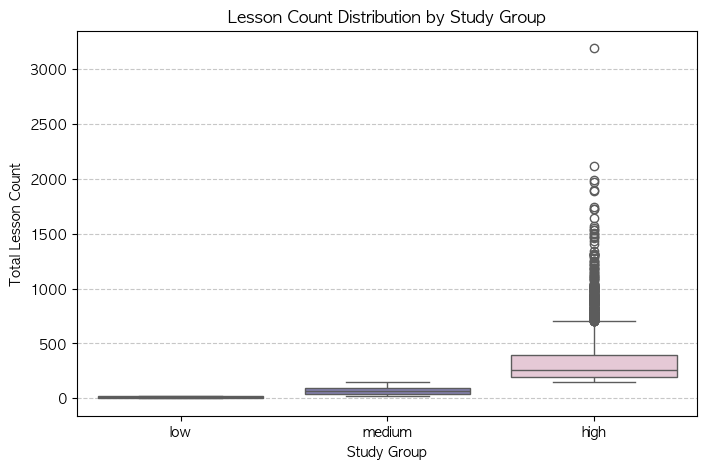

In [242]:
plt.figure(figsize=(8, 5))
sns.boxplot(data=study_counts_with_groups, x='study_group', y='total_lesson_count', 
            palette=['#b3cde0', '#7e79b8', '#eac4d5'])
plt.title("Lesson Count Distribution by Study Group")
plt.xlabel("Study Group")
plt.ylabel("Total Lesson Count")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [222]:
# 공통 사용자 수 확인
print(f"공통 사용자 수: {len(common_users)}")  # 12,729명이어야 함

# 필터링된 복습 데이터 확인
common_study_counts = study_counts[study_counts['user_id'].isin(common_users['user_id'])]
print(f"공통 사용자 중 복습 데이터가 있는 사용자 수: {len(common_study_counts)}")  

# common_study_counts에서 중복된 user_id 확인 (중복 제거 필요할 수도 있음)
print(f"공통 복습 데이터의 고유 user_id 수: {common_study_counts['user_id'].nunique()}")  

# common_study_counts의 데이터 샘플 확인
print(common_study_counts.head())


공통 사용자 수: 12729
공통 사용자 중 복습 데이터가 있는 사용자 수: 89492
공통 복습 데이터의 고유 user_id 수: 12729
                            user_id                        content_id  \
0  0000572f2ba8079bcefd2760b632e820  61b6463287573f00de13a930805a52d6   
1  0000572f2ba8079bcefd2760b632e820  f491517f4737a60d661cd1fcacc702c0   
2  0000572f2ba8079bcefd2760b632e820  f4be1a0fe0e301b03115591777fddf29   
3  000087537cbfd934375364218ff10f91  0ab2b890d4068c1490b89676773256f6   
4  000087537cbfd934375364218ff10f91  61b6463287573f00de13a930805a52d6   

   content_study_count  review_count  total_lesson_count  total_content_count  
0                    8             1                  17                    3  
1                    5             5                  17                    3  
2                    4             4                  17                    3  
3                    7             2                  12                    2  
4                    5             2                  12                    2  


In [223]:
# 데이터프레임 복사
def classify_study_groups(df, count_column):
    result_df = df.copy()
    
    # 1️⃣ 사분위수 계산
    q1 = result_df[count_column].quantile(0.25)  # 1분위 (하위 25%)
    q3 = result_df[count_column].quantile(0.75)  # 3분위 (상위 25%)
    print(f"학습량 분포 - 1분위(q1): {q1}, 3분위(q3): {q3}")
    
    # 2️⃣ 그룹 분류 함수
    def categorize(count):
        if count >= q3:
            return 'high'  # 공부 많이 한 그룹 (상위 25%)
        elif count <= q1:
            return 'low'  # 공부 안 하는 그룹 (하위 25%)
        else:
            return 'medium'  # 중간 그룹 (중간 50%)
    
    # 3️⃣ 그룹 분류 컬럼 추가
    result_df['study_group'] = result_df[count_column].apply(categorize)
    
    # 4️⃣ 그룹별 통계 출력
    group_stats = result_df['study_group'].value_counts().sort_index()
    print("그룹별 사용자 수:")
    for group, count in group_stats.items():
        print(f"- {group}: {count}명 ({count/len(result_df)*100:.1f}%)")
    
    return result_df

# 두 데이터프레임의 사용자 수 확인
print(f"user_summary의 사용자 수: {len(user_summary)}")
print(f"study_counts의 사용자 수: {len(study_counts)}")

# user_summary에 있는 user_id 중에서 study_counts에도 있는 user_id만 필터링
common_users = user_summary[user_summary['user_id'].isin(study_counts['user_id'])]
print(f"공통 사용자 수: {len(common_users)}")

# 공통 사용자에 대해서만 학습 그룹 분류
study_groups = classify_study_groups(common_users, count_column='total_lesson_count')

# 공통 사용자에 대해서만 복습 데이터 필터링
common_study_counts = study_counts[study_counts['user_id'].isin(common_users['user_id'])].copy()
common_study_counts = common_study_counts.groupby('user_id', as_index=False).sum()  # 중복된 user_id 제거
print(f"공통 사용자 중 복습 데이터가 있는 사용자 수: {len(common_study_counts)}")  

# 필터링된 공통 사용자 데이터로 복습 그룹 분류
review_groups = classify_study_groups(common_study_counts, count_column='review_count')
review_groups = review_groups.rename(columns={'study_group': 'review_group'})

# 두 결과 병합 (학습 그룹과 복습 그룹)
final_df = study_groups[['user_id', 'study_group']].merge(
    review_groups[['user_id', 'review_group']],
    on='user_id',
    how='inner'
)

# 필요한 다른 정보가 있다면 추가 병합
final_df = final_df.merge(
    common_users,  # study_group 컬럼을 삭제하지 않음
    on='user_id',
    how='left'
)


# ✅ 최종 결과 확인
display(final_df.head(20))
print(f"최종 결과의 사용자 수: {len(final_df)}")

user_summary의 사용자 수: 12729
study_counts의 사용자 수: 89492
공통 사용자 수: 12729
학습량 분포 - 1분위(q1): 24.0, 3분위(q3): 148.0
그룹별 사용자 수:
- high: 3184명 (25.0%)
- low: 3221명 (25.3%)
- medium: 6324명 (49.7%)
공통 사용자 중 복습 데이터가 있는 사용자 수: 12729
학습량 분포 - 1분위(q1): 0.0, 3분위(q3): 32.0
그룹별 사용자 수:
- high: 3195명 (25.1%)
- low: 6279명 (49.3%)
- medium: 3255명 (25.6%)


,user_id,study_group,review_group,total_lesson_count,total_content_count
0,0000572f2ba8079bcefd2760b632e820,low,medium,17,3
1,000087537cbfd934375364218ff10f91,low,medium,12,2
2,0001f15911b404f3bf5b8571afafa4e4,medium,medium,46,3
3,000be07bc09ceff42c11978f4a9f1c1a,high,high,176,13
4,001cd989a26ba664b086b92c364dc9cf,medium,medium,32,2
5,001ddbe4885db89888b34bf0eb14f6e1,medium,medium,28,5
6,002109ba574914ed127dcae867110f91,high,high,822,24
7,0028395db12b5cebf1080532fbe850b8,low,medium,8,1
8,0031482d16469048027f6096d13c8b22,medium,high,74,11
9,0032f459acd07365803996f97f98d224,low,medium,23,6


최종 결과의 사용자 수: 12729


/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_1010/3918517769.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=study_counts_with_groups, x='study_group', y='total_lesson_count',


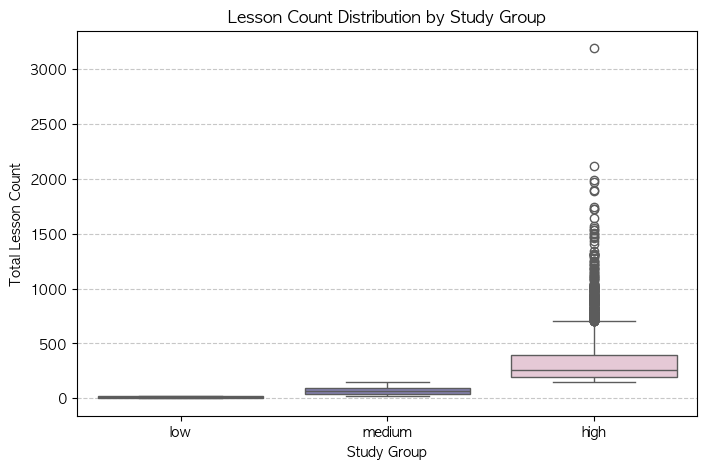

In [243]:
plt.figure(figsize=(8, 5))
sns.boxplot(data=study_counts_with_groups, x='study_group', y='total_lesson_count', 
            palette=['#b3cde0', '#7e79b8', '#eac4d5'])
plt.title("Lesson Count Distribution by Study Group")
plt.xlabel("Study Group")
plt.ylabel("Total Lesson Count")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### 통계 검정: 학습 패턴에 따른 전환율 차이

In [ ]:
import pandas as pd
import numpy as np
import scipy.stats as stats

def analyze_renewal_by_groups(final_df, renew_subscription, active_users):
    """
    학습 그룹 및 복습 그룹별 정기구독 전환율을 분석하는 함수 (첫 결제 후 활동한 유저만 고려)

    Parameters:
        final_df (pd.DataFrame): 학습 그룹 및 복습 그룹 정보를 포함한 데이터프레임
        renew_subscription (pd.DataFrame): 정기구독 정보를 포함한 데이터프레임
        active_users (list or set): 첫 결제 후 활동한 유저 리스트

    Returns:
        result_df_study (pd.DataFrame): 학습 그룹별 전환율 데이터프레임
        result_df_review (pd.DataFrame): 복습 그룹별 전환율 데이터프레임
        chi2_study (float): 학습 그룹 카이제곱 통계량
        p_study (float): 학습 그룹 p-value
        chi2_review (float): 복습 그룹 카이제곱 통계량
        p_review (float): 복습 그룹 p-value
    """

    # ✅ 첫 결제 후 활동한 유저 기준으로 정기구독한 유저 필터링
    renewed_users = renew_subscription[renew_subscription['user_id'].isin(active_users)]

    #### 📌 학습 그룹(`study_group`) 기준 정기 구독 분석 ####
    grouped_counts_study = final_df[final_df['user_id'].isin(active_users)].groupby('study_group')['user_id'].nunique()
    renewed_counts_study = final_df[final_df['user_id'].isin(renewed_users['user_id'])].groupby('study_group')['user_id'].nunique()
    
    # 결측치 처리 (NaN을 0으로 변환)
    renewed_counts_study = renewed_counts_study.reindex(grouped_counts_study.index, fill_value=0)
    
    # 정기 구독 전환율 계산
    renew_conversion_rates_study = (renewed_counts_study / grouped_counts_study).fillna(0) * 100

    # 카이제곱 검정을 위한 observed 배열 생성
    groups_study = grouped_counts_study.index.tolist()
    observed_study = np.array([
        [renewed_counts_study[group], grouped_counts_study[group] - renewed_counts_study[group]]
        for group in groups_study
    ])
    
    # 카이제곱 검정 수행
    chi2_study, p_study, dof_study, expected_study = stats.chi2_contingency(observed_study)

    # 학습 그룹 결과를 데이터프레임으로 생성
    result_df_study = pd.DataFrame({
        '그룹': groups_study,
        '갱신한 사용자': renewed_counts_study.values,
        '갱신하지 않은 사용자': grouped_counts_study.values - renewed_counts_study.values,
        '전체 사용자': grouped_counts_study.values,
        '전환율 (%)': renew_conversion_rates_study.values.round(2)
    })

    #### 복습 그룹(`review_group`) 기준 정기 구독 분석 ####
    grouped_counts_review = final_df[final_df['user_id'].isin(active_users)].groupby('review_group')['user_id'].nunique()
    renewed_counts_review = final_df[final_df['user_id'].isin(renewed_users['user_id'])].groupby('review_group')['user_id'].nunique()
    
    # 결측치 처리 (NaN을 0으로 변환)
    renewed_counts_review = renewed_counts_review.reindex(grouped_counts_review.index, fill_value=0)
    
    # 정기 구독 전환율 계산
    renew_conversion_rates_review = (renewed_counts_review / grouped_counts_review).fillna(0) * 100

    # 카이제곱 검정을 위한 observed 배열 생성
    groups_review = grouped_counts_review.index.tolist()
    observed_review = np.array([
        [renewed_counts_review[group], grouped_counts_review[group] - renewed_counts_review[group]]
        for group in groups_review
    ])
    
    # 카이제곱 검정 수행
    chi2_review, p_review, dof_review, expected_review = stats.chi2_contingency(observed_review)

    # 복습 그룹 결과를 데이터프레임으로 생성
    result_df_review = pd.DataFrame({
        '복습 그룹': groups_review,
        '갱신한 사용자': renewed_counts_review.values,
        '갱신하지 않은 사용자': grouped_counts_review.values - renewed_counts_review.values,
        '전체 사용자': grouped_counts_review.values,
        '전환율 (%)': renew_conversion_rates_review.values.round(2)
    })

    # 🔥 결과 출력
    print("\n===== 학습 그룹별 정기 구독 전환율 분석 =====")
    display(result_df_study)
    print(f"\n카이제곱 통계량: {chi2_study:.4f}, P-Value: {p_study:.4f}")
    
    print("\n===== 복습 그룹별 정기 구독 전환율 분석 =====")
    display(result_df_review)
    print(f"\n카이제곱 통계량: {chi2_review:.4f}, P-Value: {p_review:.4f}")

    # 유의미한 차이 확인
    alpha = 0.05  # 유의수준 5%
    
    if p_study < alpha:
        print("✅ 학습 그룹에 따른 전환율 차이는 통계적으로 유의미함!")
    else:
        print("⚠️ 학습 그룹에 따른 전환율 차이는 유의미하지 않음.")

    if p_review < alpha:
        print("✅ 복습 그룹에 따른 전환율 차이는 통계적으로 유의미함!")
    else:
        print("⚠️ 복습 그룹에 따른 전환율 차이는 유의미하지 않음.")

    return result_df_study, result_df_review, chi2_study, p_study, chi2_review, p_review


In [227]:
# ✅ 학습 그룹 & 복습 그룹별 정기 구독 분석 실행
result_df_study, result_df_review, chi2_study, p_study, chi2_review, p_review = analyze_renewal_by_groups(final_df, renew_subscription, active_users)



===== 학습 그룹별 정기 구독 전환율 분석 =====


,그룹,갱신한 사용자,갱신하지 않은 사용자,전체 사용자,전환율 (%)
0,high,1587,1597,3184,49.84
1,low,1050,2171,3221,32.60
2,medium,2533,3791,6324,40.05



카이제곱 통계량: 199.0590, P-Value: 0.0000

===== 복습 그룹별 정기 구독 전환율 분석 =====


,복습 그룹,갱신한 사용자,갱신하지 않은 사용자,전체 사용자,전환율 (%)
0,high,1472,1723,3195,46.07
1,low,2422,3857,6279,38.57
2,medium,1276,1979,3255,39.20



카이제곱 통계량: 52.9990, P-Value: 0.0000
✅ 학습 그룹에 따른 전환율 차이는 통계적으로 유의미함!
✅ 복습 그룹에 따른 전환율 차이는 통계적으로 유의미함!


### 크레머 v값으로 두 범주형 변수 간 연관성이 얼마나 강한지 측정
- 올바르게 나오진 않네..쓰지말아주세요 ㅎㅎ..

In [208]:
import numpy as np
import scipy.stats as stats

def cramers_v(chi2, n, dof):
    """
    크레머의 V 값을 계산하는 함수.

    Parameters:
    -----------
    chi2 : float
        카이제곱 통계량 (Chi-Square test statistic)
    n : int
        총 표본 수 (전체 사용자 수)
    dof : int
        자유도 (degrees of freedom)

    Returns:
    --------
    float
        크레머의 V 값 (0 ~ 1)
    """
    return np.sqrt(chi2 / (n * dof))  # 크레머 V 공식 수정

# ✅ 학습 그룹 카이제곱 검정 수행 (observed_study 생성)
groups_study = result_df_study['그룹'].tolist()
observed_study = np.array([
    [result_df_study.loc[result_df_study['그룹'] == group, '갱신한 사용자'].values[0],
     result_df_study.loc[result_df_study['그룹'] == group, '갱신하지 않은 사용자'].values[0]]
    for group in groups_study
])

chi2_study, p_study, dof_study, expected_study = stats.chi2_contingency(observed_study)

# ✅ 학습 그룹 크레머의 V 계산
n_study = np.sum(observed_study)  # 학습 그룹 총 사용자 수
v_study = cramers_v(chi2_study, n_study, dof_study)
print(f"✅ 학습 그룹의 크레머 V 값: {v_study:.4f}")

# ✅ 복습 그룹 카이제곱 검정 수행 (observed_review 생성)
groups_review = result_df_review['복습 그룹'].tolist()
observed_review = np.array([
    [result_df_review.loc[result_df_review['복습 그룹'] == group, '갱신한 사용자'].values[0],
     result_df_review.loc[result_df_review['복습 그룹'] == group, '갱신하지 않은 사용자'].values[0]]
    for group in groups_review
])

chi2_review, p_review, dof_review, expected_review = stats.chi2_contingency(observed_review)

# ✅ 복습 그룹 크레머의 V 계산
n_review = np.sum(observed_review)  # 복습 그룹 총 사용자 수
v_review = cramers_v(chi2_review, n_review, dof_review)
print(f"✅ 복습 그룹의 크레머 V 값: {v_review:.4f}")




✅ 학습 그룹의 크레머 V 값: 0.0884
✅ 복습 그룹의 크레머 V 값: 0.0210


## 5. 강의 수강에서 정기 구독 전환율 구하기

### 5-1. 학습 횟수에 따른 정기 구독 전환율

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_1010/147689402.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0], x='그룹', y='전환율 (%)', data=result_df, palette='viridis')


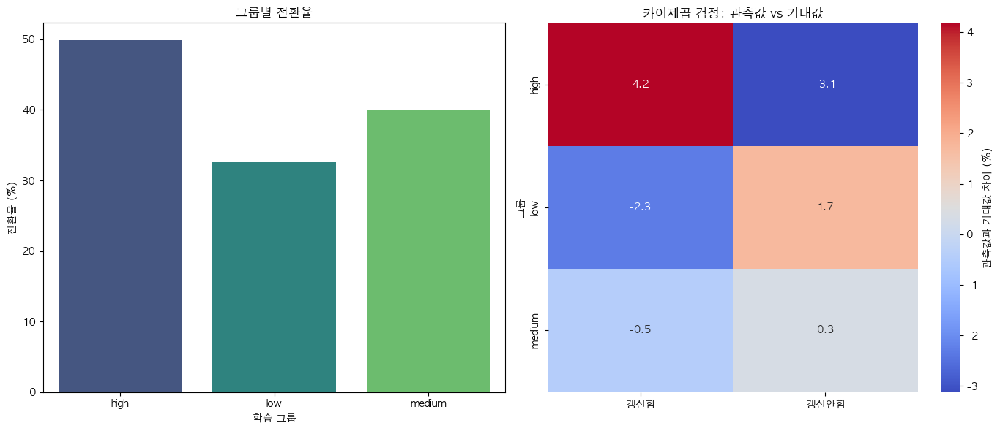

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# 그룹별 전환율 막대 그래프
sns.barplot(ax=axes[0], x='그룹', y='전환율 (%)', data=result_df, palette='viridis')
axes[0].set_title('그룹별 전환율')
axes[0].set_xlabel('학습 그룹')
axes[0].set_ylabel('전환율 (%)')

# 관측값과 기대값 비교 Heatmap
observed_df = pd.DataFrame(observed, index=result_df['그룹'], columns=['갱신함', '갱신안함'])
expected_df = pd.DataFrame(expected, index=result_df['그룹'], columns=['갱신함', '갱신안함'])

# 관측값 대비 기대값 차이 계산 및 시각화
diff_df = (observed_df - expected_df) / expected_df * 100  # 차이(%)
sns.heatmap(diff_df, annot=True, cmap='coolwarm', fmt='.1f', 
            cbar_kws={'label': '관측값과 기대값 차이 (%)'}, ax=axes[1])
axes[1].set_title('카이제곱 검정: 관측값 vs 기대값')

plt.tight_layout()
plt.show()

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_1010/3315516632.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0], x='복습 그룹', y='전환율 (%)', data=result_df_review, palette='viridis')


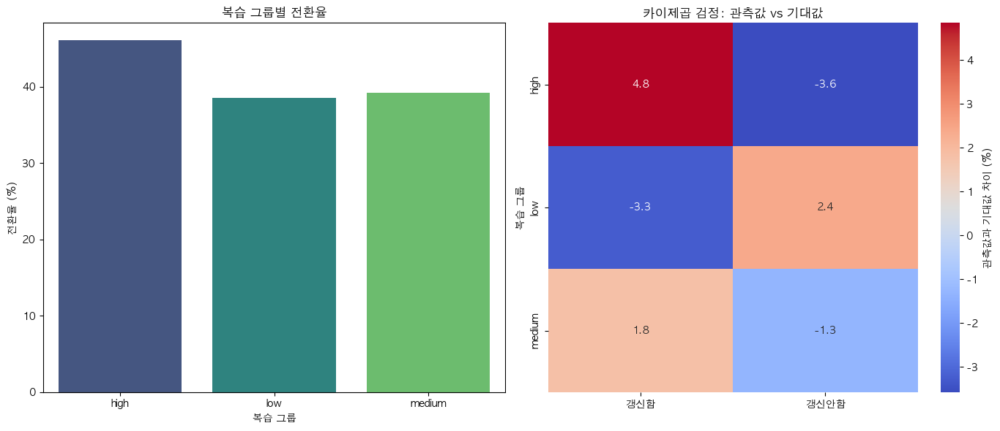

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# 복습 그룹 기준 카이제곱 시각화
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# 🔹 복습 그룹별 전환율 막대 그래프
sns.barplot(ax=axes[0], x='복습 그룹', y='전환율 (%)', data=result_df_review, palette='viridis')
axes[0].set_title('복습 그룹별 전환율')
axes[0].set_xlabel('복습 그룹')
axes[0].set_ylabel('전환율 (%)')

# 🔹 관측값과 기대값 비교 Heatmap
observed_df = pd.DataFrame(observed_review, index=result_df_review['복습 그룹'], columns=['갱신함', '갱신안함'])
expected_df = pd.DataFrame(expected_review, index=result_df_review['복습 그룹'], columns=['갱신함', '갱신안함'])

# 🔹 관측값 대비 기대값 차이 계산 및 시각화
diff_df = (observed_df - expected_df) / expected_df * 100  # 차이(%)
sns.heatmap(diff_df, annot=True, cmap='coolwarm', fmt='.1f', 
            cbar_kws={'label': '관측값과 기대값 차이 (%)'}, ax=axes[1])
axes[1].set_title('카이제곱 검정: 관측값 vs 기대값')

# 🔹 그래프 레이아웃 조정 및 출력
plt.tight_layout()
plt.show()



### 5-2. 첫 결제 후 활동한 전체 유저의 정기 구독 전환율 

In [202]:
# 첫 결제 후 활동한 유저 중 정기 구독한 유저 수
renewed_users_count = renew_subscription[
    renew_subscription['user_id'].isin(active_users)
]['user_id'].nunique()

# 정기 구독 전환율 계산
conversion_rate = (renewed_users_count / total_lesson_users) * 100

print(f"강의 수강한 유저의 정기 구독 전환율: {conversion_rate:.2f}%")

강의 수강한 유저의 정기 구독 전환율: 40.62%


### 5-3. 정기 구독으로 넘어가지 않은 유저들 (이탈률)
- renewed_counts = 정기 구독한 유저 수 </bn>
- grouped_counts = 해당 그룹 전체 유저 수 </bn>
- 특정 그룹에서 정기 구독한 유저가 없다면(NaN) → fillna(0)을 사용해 이탈률을 100%(1.0)로 처리</bn>

In [211]:
def calculate_churn_rates(result_df_study, result_df_review):
    """
    학습 그룹 및 복습 그룹별 이탈률(Churn Rate)을 계산하는 함수.

    Parameters:
        result_df_study (pd.DataFrame): 학습 그룹별 정기구독 전환율 데이터프레임
        result_df_review (pd.DataFrame): 복습 그룹별 정기구독 전환율 데이터프레임

    Returns:
        churn_df_study (pd.DataFrame): 학습 그룹별 이탈률
        churn_df_review (pd.DataFrame): 복습 그룹별 이탈률
    """

    # ✅ 학습 그룹별 이탈률 계산
    churn_rates_study = 100 - result_df_study['전환율 (%)']
    churn_rates_study = churn_rates_study.fillna(100) 

    # ✅ 복습 그룹별 이탈률 계산
    churn_rates_review = 100 - result_df_review['전환율 (%)']
    churn_rates_review = churn_rates_review.fillna(100) 

    # ✅ 이탈률 데이터프레임 생성
    churn_df_study = result_df_study[['그룹', '전환율 (%)']].copy()
    churn_df_study['이탈률 (%)'] = churn_rates_study

    churn_df_review = result_df_review[['복습 그룹', '전환율 (%)']].copy()
    churn_df_review['이탈률 (%)'] = churn_rates_review

    # 🔥 결과 출력
    print("\n===== 학습 그룹별 이탈률 (%) =====")
    display(churn_df_study)

    print("\n===== 복습 그룹별 이탈률 (%) =====")
    display(churn_df_review)

    return churn_df_study, churn_df_review

churn_df_study, churn_df_review = calculate_churn_rates(result_df_study, result_df_review)



===== 학습 그룹별 이탈률 (%) =====


,그룹,전환율 (%),이탈률 (%)
0,high,49.84,50.16
1,low,32.60,67.40
2,medium,40.05,59.95



===== 복습 그룹별 이탈률 (%) =====


,복습 그룹,전환율 (%),이탈률 (%)
0,high,44.50,55.50
1,low,41.06,58.94
2,medium,43.21,56.79


## 6. 정기구독에서 재구독으로 넘어간 유저들 

In [235]:
payment_df = pd.concat([
    renew_subscription.assign(event='renew'),
    click_cancel.assign(event='cancel'),
    resubscribe_subscription.assign(event='resubscribe')
])

# 🔹 event_time 컬럼을 datetime 형식으로 변환
payment_df['event_time'] = pd.to_datetime(payment_df['event_time'], errors='coerce')

# 🔹 user_id와 event_time 기준 정렬
payment_df = payment_df.sort_values(['user_id', 'event_time']).reset_index(drop=True)

# ✅ 결과 확인
print(payment_df.dtypes)
print(payment_df.head())


user_id               object
event                 object
event_time    datetime64[ns]
dtype: object
                            user_id  event                    event_time
0  0000572f2ba8079bcefd2760b632e820  renew 1970-01-01 00:00:00.000000000
1  0000572f2ba8079bcefd2760b632e820  renew 1970-01-01 00:00:00.000000000
2  0000572f2ba8079bcefd2760b632e820  renew 1970-01-01 00:00:00.000015920
3  0000572f2ba8079bcefd2760b632e820  renew 1970-01-01 00:00:00.000015920
4  0000572f2ba8079bcefd2760b632e820  renew 1970-01-01 00:00:00.000015920


/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_1010/3550925936.py:8: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  payment_df['event_time'] = pd.to_datetime(payment_df['event_time'], errors='coerce')


In [237]:
# 시간 필터링
payment_df = payment_df.loc[
    payment_df['event_time'].dt.year.between(2022, 2023)]

In [240]:
# 올바른 결제 순서를 따르는 user_id 확인
def check_order(df):
    events = df['event'].tolist()
    return events == ['renew', 'cancel', 'resubscribe']

# 그룹별로 필터링
valid_users = payment_df.groupby('user_id').filter(check_order)['user_id'].unique()
display(valid_users)

array(['0108538a502bb0339cdee7d33f96a510',
       '0292f9b9e5eee6d5419862b20151993e',
       '1b75ac5cb59e8aed2fae325a9cec63e8',
       '43f4c6740ddadba5081ff6236b8efbe1',
       '6097a1a40c3a32ee6af796e32ff82a15',
       '6273ea481a53ad142f85be81c6e6644a',
       '6d9d527d68154f3d790133d5c7bf34e3',
       '7f742dabddf2b60069b465e4b8ca5b43',
       'a7102cebfbc2873d5219ede74fb59aed',
       'a9a7d711a3dd6ee4bba891b117169da4',
       'c2f0e5412d80df770e6004b00da998ce',
       'cf0e4ad5bfaac5f91b54a84b424bfcdd',
       'd22e08da8aea3774e791244666d6f971',
       'd3865b8eafdba1ec3cdc8126d4a010c1',
       'd77f6d0cb941179f981240b741e2e036',
       'daa567a0f4a0230fc8af8866916fdae4',
       'e037cc02f429f720e2e6cbcdee3de349',
       'eaff98093acb9a109975957cafb2d105',
       'f4e6c1833f5d74611bc809632103877b',
       'ff27c0ef4f7c2c87a09e295c496727f5'], dtype=object)

In [247]:
# 1️⃣ study_group 정보를 resubscribe_subscription에 추가
resubscribe_subscription = resubscribe_subscription.merge(
    final_df[['user_id', 'study_group']], on='user_id', how='left'
)

# 2️⃣ 학습 그룹별 재구독한 유저 수 (valid_users 제외)
resubscribe_counts_study = resubscribe_subscription[
    resubscribe_subscription['user_id'].isin(renewed_users['user_id']) & 
    ~resubscribe_subscription['user_id'].isin(valid_users)
].groupby('study_group')['user_id'].nunique()

# 3️⃣ 결측치 처리 (NaN을 0으로 변환)
resubscribe_counts_study = resubscribe_counts_study.reindex(renewed_counts_study.index, fill_value=0)

# 4️⃣ 학습 그룹별 재구독 전환율 계산
resubscribe_conversion_rates_study = (resubscribe_counts_study / renewed_counts_study).fillna(0) * 100

# 5️⃣ 데이터프레임 생성 및 출력
resubscribe_df_study = pd.DataFrame({
    '학습 그룹': renewed_counts_study.index,
    '정기구독한 사용자': renewed_counts_study.values,
    '재구독한 사용자': resubscribe_counts_study.values,
    '재구독 전환율 (%)': resubscribe_conversion_rates_study.values.round(2)
})

print("\n===== 학습 그룹별 재구독 전환율 분석 =====")
display(resubscribe_df_study)



===== 학습 그룹별 재구독 전환율 분석 =====


,학습 그룹,정기구독한 사용자,재구독한 사용자,재구독 전환율 (%)
0,high,1587,152,9.58
1,low,1050,27,2.57
2,medium,2533,112,4.42


In [248]:
# 전체 가중 평균 재구독률 계산
total_resubscribe_rate = (resubscribe_df_study['정기구독한 사용자'] * resubscribe_df_study['재구독 전환율 (%)']).sum() / resubscribe_df_study['정기구독한 사용자'].sum()

print(f"가중 평균 재구독 비율: {total_resubscribe_rate:.2f}%")


가중 평균 재구독 비율: 5.63%


In [74]:
# ✅ 2022년도 데이터 필터링 (1초 이상)
positive_diffs_2022 = positive_diffs[positive_diffs["complete_lesson_time"].dt.year == 2022]

# ✅ 2023년도 데이터 필터링 (1초 이상)
positive_diffs_2023 = positive_diffs[positive_diffs["complete_lesson_time"].dt.year == 2023]

# ✅ 결과 출력
print(f"🟢 2022년도 데이터 개수: {len(positive_diffs_2022)}")
print(f"🟢 2023년도 데이터 개수: {len(positive_diffs_2023)}")

🟢 2022년도 데이터 개수: 2407368
🟢 2023년도 데이터 개수: 2944382


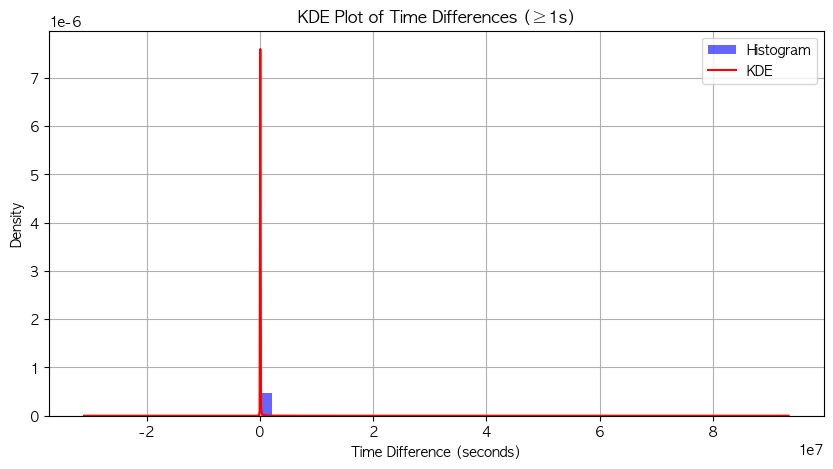

In [62]:
import matplotlib.pyplot as plt

# ✅ 데이터가 비어 있는지 확인 후 실행
if not positive_diffs["time_diff_seconds"].dropna().empty:
    # KDE 시각화
    plt.figure(figsize=(10, 5))
    plt.hist(positive_diffs["time_diff_seconds"].dropna(), bins=30, density=True, alpha=0.6, color='b', label="Histogram")
    positive_diffs["time_diff_seconds"].dropna().plot(kind='kde', color='r', label="KDE")

    # 그래프 설정
    plt.xlabel("Time Difference (seconds)")
    plt.ylabel("Density")
    plt.title("KDE Plot of Time Differences (≥1s)")
    plt.legend()
    plt.grid(True)

    # 그래프 출력
    plt.show()
else:
    print("⚠️ 필터링된 데이터가 없습니다. KDE 그래프를 그릴 수 없습니다.")



0초 이상 10초 이하의 아이들을 보자

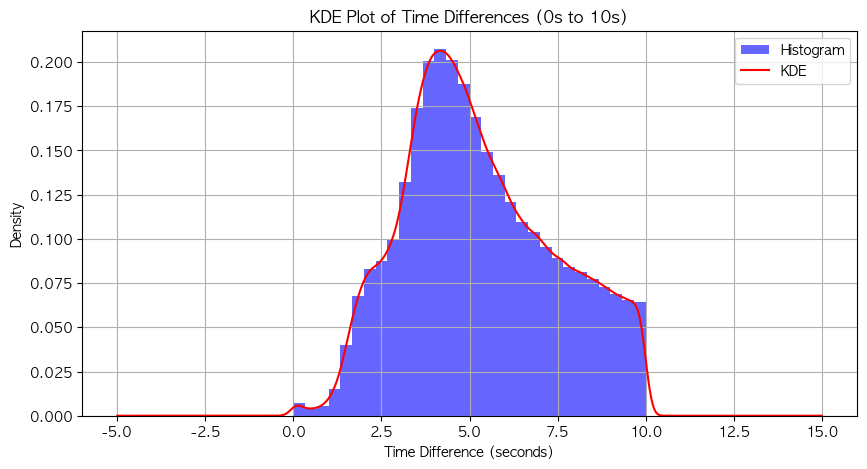

In [63]:
# ✅ 0초 이상 10초 이하의 데이터 필터링
filtered_diffs = complete_lesson_sorted[
    (complete_lesson_sorted["time_diff_seconds"] >= 0) & 
    (complete_lesson_sorted["time_diff_seconds"] <= 10)  # 10초 이하
]

# ✅ 데이터가 있는지 확인 후 실행
if not filtered_diffs["time_diff_seconds"].dropna().empty:
    # KDE 그래프 시각화
    plt.figure(figsize=(10, 5))
    plt.hist(filtered_diffs["time_diff_seconds"].dropna(), bins=30, density=True, alpha=0.6, color='b', label="Histogram")
    filtered_diffs["time_diff_seconds"].dropna().plot(kind='kde', color='r', label="KDE")

    # 그래프 설정
    plt.xlabel("Time Difference (seconds)")
    plt.ylabel("Density")
    plt.title("KDE Plot of Time Differences (0s to 10s)")
    plt.legend()
    plt.grid(True)

    # 그래프 출력
    plt.show()
else:
    print("⚠️ 필터링된 데이터가 없습니다. KDE 그래프를 그릴 수 없습니다.")



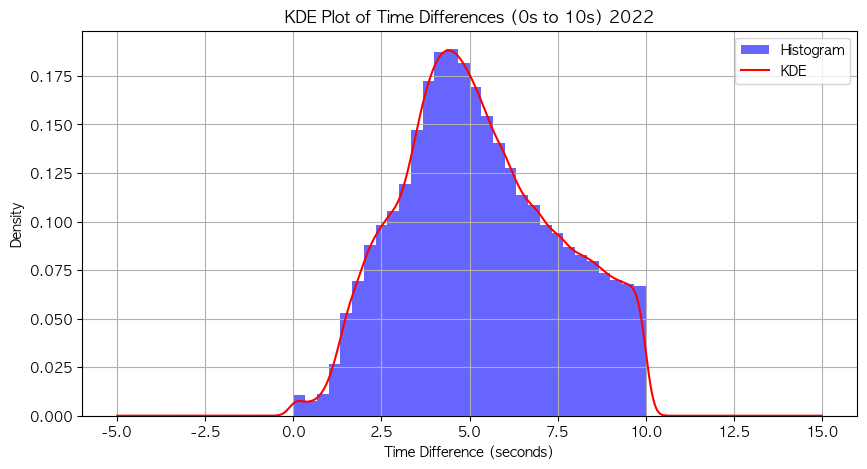

In [75]:
# ✅ 0초 이상 10초 이하의 데이터 필터링
filtered_diffs = complete_lesson_sorted[
    (complete_lesson_sorted["time_diff_seconds"] >= 0) & 
    (complete_lesson_sorted["time_diff_seconds"] <= 10)  # 10초 이하
]
# ✅ 2022년도 데이터 필터링 (1초 이상)
filtered_diffs_2022 = filtered_diffs[filtered_diffs["complete_lesson_time"].dt.year == 2022]

# ✅ 데이터가 있는지 확인 후 실행
if not filtered_diffs_2022["time_diff_seconds"].dropna().empty:
    # KDE 그래프 시각화
    plt.figure(figsize=(10, 5))
    plt.hist(filtered_diffs_2022["time_diff_seconds"].dropna(), bins=30, density=True, alpha=0.6, color='b', label="Histogram")
    filtered_diffs_2022["time_diff_seconds"].dropna().plot(kind='kde', color='r', label="KDE")

    # 그래프 설정
    plt.xlabel("Time Difference (seconds)")
    plt.ylabel("Density")
    plt.title("KDE Plot of Time Differences (0s to 10s) 2022")
    plt.legend()
    plt.grid(True)

    # 그래프 출력
    plt.show()
else:
    print("⚠️ 필터링된 데이터가 없습니다. KDE 그래프를 그릴 수 없습니다.")


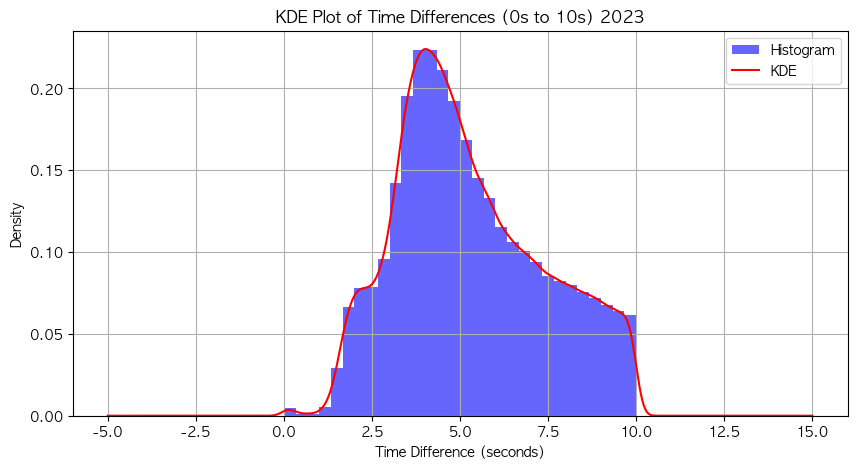

In [76]:
# ✅ 2023년도 데이터 필터링 (1초 이상)
filtered_diffs_2023 = filtered_diffs[filtered_diffs["complete_lesson_time"].dt.year == 2023]

# ✅ 데이터가 있는지 확인 후 실행
if not filtered_diffs_2023["time_diff_seconds"].dropna().empty:
    # KDE 그래프 시각화
    plt.figure(figsize=(10, 5))
    plt.hist(filtered_diffs_2023["time_diff_seconds"].dropna(), bins=30, density=True, alpha=0.6, color='b', label="Histogram")
    filtered_diffs_2023["time_diff_seconds"].dropna().plot(kind='kde', color='r', label="KDE")

    # 그래프 설정
    plt.xlabel("Time Difference (seconds)")
    plt.ylabel("Density")
    plt.title("KDE Plot of Time Differences (0s to 10s) 2023")
    plt.legend()
    plt.grid(True)

    # 그래프 출력
    plt.show()
else:
    print("⚠️ 필터링된 데이터가 없습니다. KDE 그래프를 그릴 수 없습니다.")

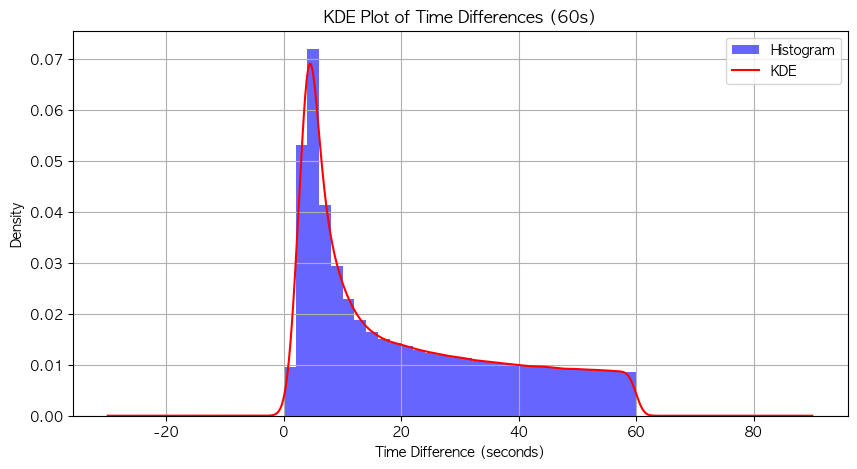

In [66]:
# 1분 이하 데이터 필터링
one_min_diff = complete_lesson_sorted[
    (complete_lesson_sorted["time_diff_seconds"] <= 60)]

# 데이터가 있는지 확인 후 실행
if not one_min_diff["time_diff_seconds"].dropna().empty:
    # KDE 그래프 시각화
    plt.figure(figsize=(10, 5))
    plt.hist(one_min_diff["time_diff_seconds"].dropna(), bins=30, density=True, alpha=0.6, color='b', label="Histogram")
    one_min_diff["time_diff_seconds"].dropna().plot(kind='kde', color='r', label="KDE")
    plt.xlabel("Time Difference (seconds)")
    plt.ylabel("Density")
    plt.title("KDE Plot of Time Differences (60s)")
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("필터링된 데이터가 없습니다. KDE 그래프를 그릴 수 없습니다.")
    


In [67]:
one_min_diff.describe()

,complete_lesson_time,time_diff_seconds
count,1199975,1.199975e+06
mean,2023-01-26 09:23:04.952690432,2.064982e+01
min,2022-01-01 09:17:13.137000,0.000000e+00
25%,2022-08-02 13:51:49.020499968,5.656000e+00
50%,2023-01-29 23:37:06.331000064,1.434700e+01
75%,2023-08-01 15:27:47.985999872,3.359500e+01
max,2023-12-31 23:59:23.612000,6.000000e+01
std,NaN,1.715589e+01


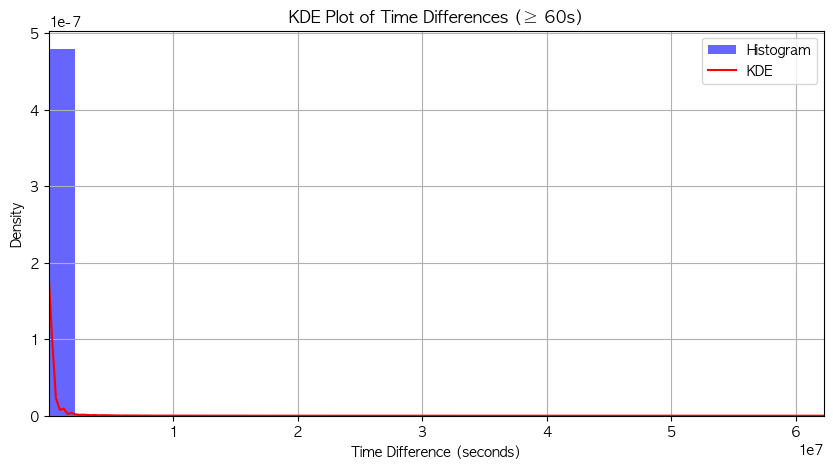

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns

# ✅ 1분(60초) 이상 데이터 필터링
one_min_above_diff = complete_lesson_sorted[complete_lesson_sorted["time_diff_seconds"] >= 60]

# ✅ 데이터가 있는지 확인 후 실행
if not one_min_above_diff.empty:
    # NaN 제거
    time_diff_values = one_min_above_diff["time_diff_seconds"].dropna()

    # KDE 그래프 시각화
    plt.figure(figsize=(10, 5))
    
    # 히스토그램
    plt.hist(time_diff_values, bins=30, density=True, alpha=0.6, color='b', label="Histogram")
    
    # ✅ Seaborn KDE 사용 (bw_adjust 적용 가능)
    sns.kdeplot(time_diff_values, bw_adjust=0.5, color='r', label="KDE")

    # ✅ X축을 60초 이상으로 강제 조정
    plt.xlim(60, time_diff_values.max())

    # 그래프 설정
    plt.xlabel("Time Difference (seconds)")
    plt.ylabel("Density")
    plt.title("KDE Plot of Time Differences (≥ 60s)")
    plt.legend()
    plt.grid(True)

    # 그래프 출력
    plt.show()
else:
    print("⚠️ 필터링된 데이터가 없습니다. KDE 그래프를 그릴 수 없습니다.")


    

In [ ]:
# 구독한 유저만 필터링
subscribed_users = filtered_grouped_df.dropna(subset=['time_to_subscribe'])

# 구독한 유저 수 계산
num_subscribed_users = len(subscribed_users)

# 평균 구독 전환 시간 계산
average_time_to_subscribe = subscribed_users['time_to_subscribe'].mean()

# 평균 구독 전환 일자 계산
average_days_to_subscribe =  average_time_to_subscribe / 24

print(f"무료 체험 후 첫 결제한 유저 수: {num_subscribed_users}명")
print(f"평균 구독 전환 시간: {average_time_to_subscribe:.2f} 시간")
print(f" 평균 구독 전환 일수: {average_days_to_subscribe:.2f} 일")

무료 체험 후 첫 결제한 유저 수: 7657명
평균 구독 전환 시간: -219.37 시간
 평균 구독 전환 일수: -9.14 일


# 9. renew.subscription
- 정기 결제 완료

In [124]:
renew_subscription = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/renew.subscription.csv')
renew_subscription.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
renew_subscription.rename(columns={'client_event_time': 'renew_subscription_time'}, inplace=True)
renew_subscription.drop(renew_subscription[renew_subscription['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
renew_subscription['renew_subscription_time'] = pd.to_datetime(renew_subscription['renew_subscription_time'])

# 9시간 추가 (UTC+9 적용)
renew_subscription['renew_subscription_time'] = renew_subscription['renew_subscription_time'] + pd.Timedelta(hours=9)

# 시간 필터링
renew_subscription = renew_subscription.loc[
    renew_subscription['renew_subscription_time'].dt.year.between(2022, 2023)]

# 컬럼명 수정하기
renew_subscription.rename(columns={'plan.price': 'plan_price', 'pg.type': 'pg_type'}, inplace=True)
renew_subscription.head()

,city,renew_subscription_time,country,device_type,event_type,language,os_name,user_id,plan_price,paid_amount,coupon.discount_amount,pg_type
0,Nam-gu,2022-09-08 12:05:02.068,South Korea,Windows,renew.subscription,Korean,Edge,6ddea3af2eaae869861c1190dcc9d4a3,15920,15920,0,NaN
1,Nam-gu,2022-09-08 12:40:02.050,South Korea,Windows,renew.subscription,Korean,Chrome,c2d47034960fdff5df495822ff66fbc1,15920,15920,0,NaN
2,Dongjak-gu,2022-09-08 12:49:00.829,South Korea,Windows,renew.subscription,Korean,Chrome,de91f1226dd938990fefc79545daf468,42960,40812,2148,NaN
3,Yongin-si,2022-09-08 13:10:06.406,South Korea,Windows,renew.subscription,Korean,Chrome,bf14840a8cb4643e6d557da96e35a3af,15920,15920,0,NaN
4,Dongjak-gu,2022-09-08 13:40:01.895,South Korea,Android,renew.subscription,Korean,Chrome Mobile,7ddc1c2990d0645d82885394e3c518b5,15920,15920,0,NaN


# 10. resubscribe.subscription
- 만료 후 재구독 완료

In [128]:
resubscribe_subscription = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/resubscribe.subscription.csv')
resubscribe_subscription.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
resubscribe_subscription.rename(columns={'client_event_time': 'resubscribe_subscription_time'}, inplace=True)
resubscribe_subscription.drop(resubscribe_subscription[resubscribe_subscription['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
resubscribe_subscription['resubscribe_subscription_time'] = pd.to_datetime(resubscribe_subscription['resubscribe_subscription_time'])

# 9시간 추가 (UTC+9 적용)
resubscribe_subscription['resubscribe_subscription_time'] = resubscribe_subscription['resubscribe_subscription_time'] + pd.Timedelta(hours=9)

# 시간 필터링
resubscribe_subscription = resubscribe_subscription.loc[
    resubscribe_subscription['resubscribe_subscription_time'].dt.year.between(2022, 2023)]

resubscribe_subscription.head()

,city,resubscribe_subscription_time,country,device_type,event_type,language,os_name,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Daejeon,2023-04-06 06:11:45.525,South Korea,Windows,resubscribe.subscription,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,15920,15920,0,NaN
1,Seoul,2023-06-30 18:59:56.848,South Korea,Samsung Galaxy S22+,resubscribe.subscription,Korean,Chrome WebView,68831c27e47f0e8f04ba809baeec218e,15920,15920,0,NaN
2,Nowon-gu,2023-06-13 15:20:22.524,South Korea,Windows,resubscribe.subscription,Korean,Chrome,4e7568cb7db01f8386614ec2c6c961cd,15920,15920,0,NaN
3,Suwon,2023-06-11 20:02:11.878,South Korea,Windows,resubscribe.subscription,Korean,Chrome,f91f19527b9ec688e028ec884b1b5c1c,131600,131600,0,NaN
4,Koishikawa,2023-06-13 23:39:25.736,Japan,Apple iPhone,resubscribe.subscription,Japanese,Chrome,2276d7d2a31e05f4a5558c6406cc36c9,131600,131600,0,NaN


# 11. start.free_trial
- 서비스 무료체험 시작

In [11]:
start_free_trial = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/start.free_trial.csv')
start_free_trial.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
start_free_trial.rename(columns={'client_event_time': 'start_free_trial_time'}, inplace=True)
start_free_trial.drop(start_free_trial[start_free_trial['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
start_free_trial['start_free_trial_time'] = pd.to_datetime(start_free_trial['start_free_trial_time'])

# 9시간 추가 (UTC+9 적용)
start_free_trial['start_free_trial_time'] = start_free_trial['start_free_trial_time'] + pd.Timedelta(hours=9)

# 시간 필터링
start_free_trial = start_free_trial.loc[
    start_free_trial['start_free_trial_time'].dt.year.between(2022, 2023)]

# button name 변수명 수정하기
start_free_trial.rename(columns={'content.id': 'content_id'}, inplace=True)
start_free_trial.head()

,city,start_free_trial_time,country,device_type,event_type,language,os_name,user_id,plan.price,plan.type,trial.type
0,Seoul,2023-04-06 06:49:36.156,South Korea,Mac,start.free_trial,Korean,Safari,06b6868000a5d576180aca47896d6cce,15920.0,1개월 플랜,B
1,Dobong-gu,2023-03-12 17:28:29.384,South Korea,Windows,start.free_trial,Korean,Chrome,40acc1ddfc012f3d2f58a3de95e9e748,15920.0,1개월 플랜,B
2,NaN,2023-03-12 17:35:00.107,NaN,NaN,start.free_trial,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B
3,Seoul,2023-04-12 20:36:50.250,South Korea,Mac,start.free_trial,Korean,Safari,cc8051a75f62278b0e4216dd0a182d8c,15920.0,1개월 플랜,B
4,NaN,2023-02-18 13:13:20.822,NaN,NaN,start.free_trial,NaN,NaN,4cc436ad294973993ccad3e3a70053a7,131600.0,12개월 플랜,B


In [90]:
#각 날짜별 trial type 보기
start_free_trial['client_event_time'] = pd.to_datetime(start_free_trial['client_event_time'])

monthly_trial = (
    start_free_trial
    .groupby([start_free_trial['client_event_time'].dt.to_period('M'), 'trial.type'])
    .size()
    .unstack(fill_value=0)
    .reset_index()
)

display(monthly_trial)

trial.type,client_event_time,A,B
0,2021-12,5,0
1,2022-01,4706,0
2,2022-02,3021,0
3,2022-03,4187,0
4,2022-04,4117,0
5,2022-05,4763,0
6,2022-06,4753,0
7,2022-07,1469,0
8,2022-08,304,0
9,2022-09,372,0


# 12. start.content
- 콘텐츠 수강 시작

In [ ]:
start_content = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/start.content.csv')
start_content.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
start_content.rename(columns={'client_event_time': 'start_content_time'}, inplace=True)
start_content.drop(start_content[start_content['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
start_content['start_content_time'] = pd.to_datetime(start_content['start_content_time'])

# 9시간 추가 (UTC+9 적용)
start_content['start_content_time'] = start_content['start_content_time'] + pd.Timedelta(hours=9)

# 시간 필터링
start_content = start_content.loc[
    start_content['start_content_time'].dt.year.between(2022, 2023)]

# 변수명 수정하기
start_content.rename(columns={'content.id': 'content_id'}, inplace=True)
start_content.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty
0,Daejeon,2023-04-05 21:14:39.906000,South Korea,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner
1,Seoul,2023-04-05 21:50:19.674000,South Korea,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner
2,Seoul,2023-04-10 14:06:26.585000,South Korea,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner
3,Toronto,2023-04-10 14:15:29.040000,Canada,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner
4,Seoul,2023-04-10 14:21:36.467000,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced


# 13. enter.lesson_page
- 레슨 시작
- is_free_trial: 무료 공개 레슨에 대한 진입 여부. 특정 기준 시점 사용 x
- is_trial: 무료 공개 레슨에 대한 진입이면서 그 유저가 현재 구독하지 않은 회원인지 여부

In [23]:
enter_lesson = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.lesson_page.csv')
enter_lesson.drop(columns=['device_carrier','os_version','device_family','platform'], inplace=True)
enter_lesson.rename(columns={'client_event_time': 'enter_lesson_time','content.id':'content_id','lesson.id':'lesson_id'}, inplace=True)
enter_lesson.drop(enter_lesson[enter_lesson['os_name'] == 'Chrome Headless'].index, inplace=True)

# client_event_time을 datetime 형식으로 변환
enter_lesson['enter_lesson_time'] = pd.to_datetime(enter_lesson['enter_lesson_time'])

# 9시간 추가 (UTC+9 적용)
enter_lesson['enter_lesson_time'] = enter_lesson['enter_lesson_time'] + pd.Timedelta(hours=9)

# 시간 필터링
enter_lesson = enter_lesson.loc[
    enter_lesson['enter_lesson_time'].dt.year.between(2022, 2023)]

enter_lesson.head()

/var/folders/8n/hhsvh2bx7mvgkdpmj2shqm8c0000gn/T/ipykernel_25392/3363005607.py:1: DtypeWarning: Columns (9,13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  enter_lesson = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/enter.lesson_page.csv')


,city,enter_lesson_time,country,device_type,event_type,language,os_name,user_id,content_id,is_trial,lesson_id,is_free_trial
0,Wonju,2023-04-06 06:46:04.333,South Korea,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
1,Wonju,2023-04-06 06:55:50.787,South Korea,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
2,Wonju,2023-04-06 06:55:55.684,South Korea,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,770740696ab1809d6b50d4013b64a75c,NaN
3,Dongdaemun-gu,2023-04-06 06:04:55.828,South Korea,Mac,enter.lesson_page,Korean,Chrome,b2b31f00b82edc6419b25324a7ae41a4,5fc64d786416b980cfda86afd69e4516,False,68cc362ca81b5899b3c9b4dea0aaddff,NaN
4,Dongdaemun-gu,2023-04-06 06:05:34.139,South Korea,Mac,enter.lesson_page,Korean,Chrome,b2b31f00b82edc6419b25324a7ae41a4,db43a841c994231e2795d4df8931af50,False,144682f4648f81de8e6aabd11b92105e,NaN


In [18]:

# is_free_trial이 True인 행만 필터링
free_trial_contents_a = enter_lesson[enter_lesson['is_free_trial'] == True]

# 고유한 content_id 개수 확인
num_free_trial_contents_a = free_trial_contents_a['content_id'].nunique()

print(f"is_free_trial 콘텐츠 개수: {num_free_trial_contents_a}")



is_free_trial 콘텐츠 개수: 22


In [ ]:
# is_trial이 True인 행만 필터링
free_trial_contents_b = enter_lesson[enter_lesson['is_trial'] == True]

# 고유한 content_id 개수 확인
num_free_trial_contents_b = free_trial_contents_b['content_id'].nunique()

print(f"is_trial 콘텐츠 개수: {num_free_trial_contents_b}")


is_trial 콘텐츠 개수: 5


In [20]:
# is_free_trial이 True인 콘텐츠 ID 리스트
is_free_trial_content_ids = free_trial_contents_a['content_id'].unique()

# is_trial이 True인 콘텐츠 ID 리스트
is_trial_content_ids = free_trial_contents_b['content_id'].unique()

# 출력
print("무료 체험 (is_free_trial) 콘텐츠 ID 목록:")
for idx, content_id in enumerate(is_free_trial_content_ids, 1):
    print(f"{idx}. {content_id}")

print("\n무료 체험 (is_trial) 콘텐츠 ID 목록:")
for idx, content_id in enumerate(is_trial_content_ids, 1):
    print(f"{idx}. {content_id}")


무료 체험 (is_free_trial) 콘텐츠 ID 목록:
1. a914987711c7e2db9fd4bff7555ec87c
2. afe201c04b426366e0f8e9e2207c78c2
3. 101e1d0dcc38d9c86156f008a145083e
4. 68a3658f1b936bfff3bd6960cd561b0a
5. f4be1a0fe0e301b03115591777fddf29
6. c269eb6df3a374b464f7c18f12fa398f
7. d6227ba76134f6cf821bb98b5f235bd0
8. 621c7ad99b17d2d16832b618d47aea7e
9. 220ce7873b8895d0c81c37600b5bd1e7
10. 6b0a538ad5dfddde4d4b9e6ce6c00a67
11. 7fef928cdccef0185dfb931ef59b37d7
12. c8affa8409b8bd58d00d3477dd2b8ba5
13. 7cebec6e79cc981dbf421c5ec2aedd9d
14. 32cf55a55adcc30ad80b674c0fee2ff4
15. 479926b04fe824bce5bdc7e0f81a2539
16. e543c38ec7fa6bcd5045049ecc31e5f8
17. 38df90d4de533d6296b52c6a1d90e26b
18. 5acd4977e14d5edc6a408ae0d468ca4e
19. 8a72eed73d3f9d3ab1771548070e7338
20. ab7068685b7aeac4d6b1a6c0e1c85819
21. c7a97d9b71626d5115e2bcdadfe4dd48
22. db82104b9c508953b3d00eea82844a48

무료 체험 (is_trial) 콘텐츠 ID 목록:
1. 61b6463287573f00de13a930805a52d6
2. c269eb6df3a374b464f7c18f12fa398f
3. 445fac33232adcb3d1cdab7d8a579430
4. 710ffb5be9f89772b7baa9

In [21]:
# 두 리스트를 set으로 변환 후 교집합 찾기
overlapping_content_ids = set(is_free_trial_content_ids) & set(is_trial_content_ids)

# 출력
print(f"\n무료 체험 (is_free_trial)과 무료 체험 (is_trial)의 겹치는 콘텐츠 ID 개수: {len(overlapping_content_ids)}")

print("\n겹치는 콘텐츠 ID 목록:")
for idx, content_id in enumerate(overlapping_content_ids, 1):
    print(f"{idx}. {content_id}")



무료 체험 (is_free_trial)과 무료 체험 (is_trial)의 겹치는 콘텐츠 ID 개수: 1

겹치는 콘텐츠 ID 목록:
1. c269eb6df3a374b464f7c18f12fa398f


In [28]:
#무료 체험 콘텐츠 아이디
free_contents_ids = (set(is_free_trial_content_ids) | set(is_trial_content_ids)) - overlapping_content_ids

# 14. complete.lesson
- 레슨 완료

In [16]:
complete_lesson = pd.read_csv('/Users/haein/Desktop/코드잇-데이터분석/중급 프로젝트/주제 2/complete.lesson.csv')
complete_lesson.drop(columns=['device_carrier'], inplace=True)
complete_lesson.rename(columns={'content.id': 'content_id', 'lesson.id': 'lesson_id'}, inplace=True)
complete_lesson.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,lesson_id
0,Wonju,2023-04-05 21:55:51.836000,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,d360d68b65fd3e0eafb7982386d75fd9
1,Daejeon,2023-04-05 21:19:01.243000,South Korea,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,7e0f6aae886368ef9fa97007a8e9f7ac
2,Daejeon,2023-04-05 21:20:27.939000,South Korea,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,d1e93c9dc08267efab31849bc6083854
3,Daejeon,2023-04-05 21:23:01.534000,South Korea,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,f22ea5dc431035305e705552bbc4f45b
4,Daejeon,2023-04-05 21:28:34.965000,South Korea,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,ce0bfeb7fb1259c588f437d48ab2690c


In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
from joblib import Parallel, delayed

from datasets import *

from sklearn.preprocessing import LabelEncoder

pd.set_option('display.max_columns', 150)

# AARRR Framework 지표 내용

## Acquisition

| 지표 | 정의 | 계산식 |
|------|------|------|
| **신규 사용자 수 (NU, New User)** | 특정 서비스에 방문한 이력이 없는 상태에서, 처음 방문하거나 상호작용한 사용자의 수 | - |
| **회원 가입 수 (Sign Up)** | 특정 서비스에 회원 가입한 사용자의 수 | - |
| **앱 다운로드 수 (App Installs)** | 특정 앱(어플리케이션)을 다운로드한 수 | - |
| **리드 수 (Leads)** | 일정 수준의 정보를 제공하는 잠재 고객, 혹은 고객 정보 그 자체의 수 | - |
| **고객 획득 비용 (CAC, Customer Acquisition Cost)** | 신규 고객 1명을 획득하기 위해 필요한 비용 | **블렌디드 CAC** : 고객 획득을 위해 투입한 전체 금액 / 획득한 전체 고객 수 <br> **매체별 CAC** : 특정 광고 매체에서 고객 획득을 위해 투입한 금액 / 해당 매체에서 획득한 고객 수 |
| **(광고) 클릭률 (CTR, Click-Through Rate)** | 광고에 노출된 사용자 중에, 광고를 클릭한 사용자의 비율 | (광고 클릭 수 / 광고 노출 수) * 100 |
| **(광고) 조회율 (VTR, View-Through Rate)** | 영상 광고에 노출된 사용자 중에, 영상을 조회한 사용자의 비율 | (광고 조회 수 / 광고 노출 수) * 100 |
| **(광고) 전환율 (CVR, Conversion Rate)** | 광고를 클릭하여 유입된 사용자 중에, 주요한 전환 행동을 한 사용자의 비율 | (전환 수 / 광고 클릭 수) * 100 |
| **CPM (Cost-Per-Mille)** | 광고 1,000번 노출당 비용 | (총 광고 비용 / 광고 노출 수) * 1000 |
| **CPC (Cost-Per-Click)** | 광고 클릭당 비용 | 총 광고 비용 / 광고 클릭 수 |
| **CPV (Cost-Per-View)** | 영상 광고 조회당 비용 | 총 광고 비용 / 광고 조회 수 |
| **CPA (Cost-Per-Action)** | 특정 액션(회원가입, 상품 구매, 이벤트 참여 등)당 비용 | 총 광고 비용 / 특정 액션이 발생한 수 |
| **CPI (Cost-Per-Install)** | 앱 설치당 비용 | 총 광고 비용 / 앱 설치 수 |

## Activation

| 지표 | 정의 | 계산식 |
|------|------|------|
| **체류 시간 (DT, Duration Time)** | 사용자가 특정 서비스에 머무른 시간 | **평균 체류 시간** = 총 체류 시간(사용자들이 방문하여 머무른 전체 시간) / 방문한 전체 사용자 수 |
| **평균 페이지 체류 시간 (Average Time on Page)** | 사용자가 서비스 내의 단일 페이지에서 머무른 평균 시간 | 단일 페이지의 총 체류 시간 / 해당 페이지를 방문한 사용자 수 |
| **평균 세션 시간 (Average Session Duration)** | 단일 세션 동안 사용자가 특정 서비스에서 머무른 평균 시간 | 총 세션 시간(각 세션의 ‘세션 종료 시각 - 세션 시작 시각’의 총합) / 세션 수 |
| **페이지 뷰 (PV, Page View)** | 특정 웹사이트나 서비스를 방문하여 열람한 페이지의 수 (중복 포함) | - |
| **순 방문자 수 (UV, Unique Visitor)** | 특정 웹사이트나 서비스에 방문한 사용자 중 중복되는 사용자를 배제한 순 방문자 수 | - |
| **페이지 이탈률 (Bounce Rate, 반송률)** | 웹이나 앱에서 첫 페이지만 조회한 후, 추가적인 행동이나 상호작용 없이 바로 이탈한 사용자의 비율 | (반송 수 / 방문 수) * 100 <br> *반송 수 : 랜딩 페이지에 방문하여 1PV만을 발생시킨 방문의 수* |
| **Aha-moment 전환율** | Aha-moment를 경험하는 사용자의 비율 | (Aha-moment를 경험한 사용자 수 / 전체 사용자 수) * 100 |
| **구매 전환율 / 구독 전환율** | 전체 방문자 중 구매/구독을 한 사용자의 비율 | (구매 수 or 구독 수 / 방문 수) * 100 |
| **세부 퍼널 단계별 전환율** | 세부 퍼널(Aha-moment 퍼널, 구매 퍼널, 구독 퍼널 등) 안에서의 단계별 전환율 | (이후 단계로 전환된 수 / 이전 단계의 수) * 100 |

## Retention

| 지표 | 정의 | 계산식 |
|------|------|------|
| **유지율 (Retention Rate, 잔존율)** | 사용자가 유지되는 비율 | (유지된 사용자 수 / 기존 사용자 수) * 100 |
| **이탈률 (Churn Rate)** | 사용자가 이탈하는 비율 | (이탈한 사용자 수 / 기존 사용자 수) * 100 |
| **재구매율 / 재구독률** | 첫 구매후 특정 단위 기간(1주, 1개월, 3개월 등)내에 다시 구매/구독하는 사용자의 비율 | (재구매 or 재구독한 사용자 수 / 기존 사용자 수) * 100 |
| **사용자 고착도 (Stickiness)** | 사용자가 서비스에 계속해서 방문하는 정도 | DAU(일간 활성 사용자 수) / MAU(월간 활성 사용자 수) * 100 |
| **활성 사용자 수 (AU, Active User)** | 특정 웹사이트, 앱 또는 플랫폼과 상호작용하며 활성화된 사용자 수 (중복 제거) | - |
| **기간별 활성 사용자 수** | 특정 기간 동안 활성 사용자 수 (HAU, DAU, WAU, MAU) | **HAU** : 시간당 활성 사용자 수 <br> **DAU** : 일간 활성 사용자 수 <br> **WAU** : 주간 활성 사용자 수 <br> **MAU** : 월간 활성 사용자 수 |

## Revenue

| 지표 | 정의 | 계산식 |
|------|------|------|
| **매출 (Revenue)** | 비즈니스가 고객에게 상품 혹은 서비스를 판매하여 창출하는 총 금액으로, 비즈니스 운영과 관련된 비용을 공제하기 전의 금액 | - |
| **매출총이익 (Gross Profit, 마진)** | 매출액에서 매출원가(COGS, 제품이나 서비스를 제공하는 데 드는 직접 비용)를 차감한 금액 | 매출 - 매출 원가 |
| **매출총이익률 (Gross Profit Margin, 마진율)** | 매출 대비 매출총이익(마진)의 비율 | {(매출 - 매출 원가) / 매출} * 100 |
| **순이익 (Net Profit, Net Income)** | 매출에서 매출 원가, 인건비, 광고비, 세금 등 비즈니스가 사용한 모든 비용을 차감하고 영업외수익과 비용까지 고려한 뒤 남은 금액으로, 비즈니스의 순수한 이익 | 매출 - 매출 원가 - 판매관리비 + (금융수익 - 금융비용) + (영업외수익 - 영업외비용) - 법인세비용 |
| **MRR (Monthly Recurring Revenue, 월간 반복 매출)** | 매월 반복적으로 발생하는 매출 | 기존 고객의 월간 매출(전월 매출) - 이탈 고객의 월간 기여 매출 + 신규/부활 고객의 월간 매출 + 플랜 업그레이드/다운그레이드로 인한 월간 매출 차액 |
| **ARR (Annual Recurring Revenue, 연간 반복 매출)** | 매년 반복적으로 발생하는 매출 | 기존 고객의 연간 매출(전년도 매출) - 이탈 고객의 연간 기여 매출 + 신규/부활 고객의 연간 매출 + 플랜 업그레이드/다운그레이드에 따른 연간 매출 차액 |
| **ROI (Return on Investment, 투자 수익률)** | 투자 비용(광고비를 포함한 모든 비용) 대비 수익률(순이익 기준) | (순이익 / 전체 투자 비용) * 100 |
| **ROAS (Return on Ad Spend, 광고 수익률)** | 투입한 광고 비용 대비 수익률(매출 기준) | (광고 캠페인을 통해 발생한 매출 / 투입한 총 광고 비용) * 100 <br> **매체별 ROAS** : (특정 광고 매체에서 발생한 매출 / 해당 매체에 투입한 총 광고 비용) * 100 |
| **PU (Paying User, 유료 결제 사용자 수)** | 유료 결제를 한 사용자의 수 | - |
| **ARPU (Average Revenue Per User)** | 고객 평균 매출로, 무료 사용자와 유료 결제 사용자를 포함한 전체 사용자 1인당 평균 매출 | 총 매출 / 전체 사용자 수 |
| **ARPPU (Average Revenue per Paying User)** | 유료 고객 평균 매출로, 유료 결제 사용자 1인당 평균 매출 | 총 매출 / 유료 결제 사용자 수 (PU) |
| **ARPDAU (Average Revenue Per Daily Active User)** | DAU(일간 활성 사용자) 1인당 일 평균 매출 | 일 매출 / DAU(일간 활성 사용자 수) |
| **LTR (Lifetime Revenue, 고객 생애 매출)** | 고객 한 명이 제품/서비스를 이용하는 전체 생애 동안 우리 비즈니스에서 발생시킬 것으로 예상되는 기대 매출 | 고객이 생애 동안 누적하여 발생시킨 총 매출의 합 / 고객 수 |
| **LTV (Lifetime Value, 고객 생애 가치)** | 고객 한 명이 제품/서비스를 이용하는 전체 생애 동안 우리 비즈니스에서 발생시킬 것으로 예상되는 기대 가치(순이익 기준) | {평균 구매 금액 * 마진율 * 구매 빈도(구매 횟수) * 고객 수명} - (고객 획득 비용 + 고객 유지 비용) |

## Referral

| 지표 | 정의 | 계산식 |
|------|------|------|
| **바이럴 주기 시간 (Viral Cycle Time)** | 기존 사용자가 친구를 초대하고, 초대받은 친구가 신규 사용자로 유입되기까지 걸리는 시간 | - |
| **바이럴 계수 (Viral Coefficient)** | 기존 사용자 1명당 만들어내는 신규 사용자의 수 | 기존 사용자 1명당 평균 친구 초대 수 * 초대받은 친구의 초대 수락 비율 |
| **NPS (Net Promoter Score, 순 추천 지수)** | 기존 사용자가 제품이나 서비스, 브랜드를 추천할 가능성으로, 고객 충성도를 측정하는 표준 척도 | 추천 그룹의 비율(%) - 비추천 그룹의 비율(%) |
| **SNS 공유 수 (SNS Share Rate)** | 공유 수, 댓글 수, 태그 수 등 | - |

---
# 사용자 여정 로드맵 기준 분석

## ARPPU & ARPU

데이터 기한 내용
- complete.subscription : 2022-01-01 ~ 2024-01-01
- renew.subscription : 2022-09-08 ~ 2024-01-01
- resubscribe.subscription : 2022-09-08 ~ 2024-01-01

ARPPU 와 ARPU를 구하기 전 유의사항
- 기간이 다른 데이터가 포함될 경우 ARPPU/ARPU가 왜곡될 가능성이 존재한다. <br/>
    → 해결방법 : 세 데이터가 모두 존재하는 데이터 기간, complete.subscription만 존재하는 데이터 기간을 따로 분리하여 표기하였다.
- merge(병합) 과정에서 NaN 값이 생길 가능성이 생긴다. <br/>
    → 해결방법 : 모든 결제 데이터를 merge를 사용하지 않고 axis=0 방향으로 concat을 시켰다. (데이터 컬럼값이 모두 동일하기 때문)
- ARPPU 계산 공식을 적용할 때 데이터 정렬 문제. <br/>
    → 해결방법 : period를 기준으로 groupby하면 period가 순차적으로 정렬된다.

데이터 공통 기한
- 2022-09-08 ~ 2024-01-01

분리된 데이터 (complete.subscription)
- 2022-01-01 ~ 2022-09-08

### 공통 데이터란

In [95]:
# 데이터 불러오기
complete_subscription_df = complete.subscription()
renew_subscription_df = renew.subscription()
resubscribe_df = resubscribe.subscription()

In [96]:
# 함수 정의

# period 변환 함수
def change_period(data):
    data = data.copy()
    data['period'] = data['client_event_time'].dt.to_period('M')
    
    return data

# groupby 함수
def groupby(data):
    # 유료 사용자를 기준으로 집계
    data = data.groupby('period').agg(
        total_paid_amount = ('paid_amount', 'sum'),  # 총 유료 금액
        total_count = ('user_id', 'count'),  # 전체 결제 건 수
        total_user = ('user_id', 'nunique'), # 전체 유저 수
        one_month_plan_user = ('plan.price', lambda x: (x.isin([15920])).sum()),  # 1개월 플랜 사용자
        three_month_plan_user = ('plan.price', lambda x: (x.isin([42960])).sum()),  # 3개월 플랜 사용자
        one_year_plan_user = ('plan.price', lambda x: (x.isin([131600])).sum()),  # 1년 플랜 사용자
        promotion_plan_user = ('plan.price', lambda x: (x.isin([79200, 95520, 95200, 91200, 87200, 83200])).sum()),  # 프로모션 플랜 사용자
    )
    return data


In [97]:
# 모든 결제 완료 이력
concat_df = pd.concat([complete_subscription_df, renew_subscription_df, resubscribe_df], axis=0)

# 필요한 데이터 컬럼만 추출
concat_df = concat_df[['user_id', 'client_event_time', 'event_type', 'plan.price', 'paid_amount']]

# Data Type 변경
concat_df['client_event_time'] = pd.to_datetime(concat_df['client_event_time']) + pd.Timedelta(hours=9)
concat_df['client_event_time'] = concat_df['client_event_time'].dt.date

# 특정한 열에 중복값이 있는지 체크 후 첫번째 값만 남기고 제거
concat_df = concat_df.drop_duplicates(subset=['user_id', 'client_event_time', 'paid_amount'], keep='first')

# 날짜 비교를 위한 데이터 재변환
concat_df['client_event_time'] = pd.to_datetime(concat_df['client_event_time'])

# 데이터 확인
display(concat_df)

,user_id,client_event_time,event_type,plan.price,paid_amount
0,1116a2ae90ca6b06f85feba27ad51ef0,2023-04-06,complete.subscription,15920,15920
1,c0f5678df8967163e6e2c464ed006791,2023-04-10,complete.subscription,131600,131600
2,79421b5d038205ad7adbb1e2c3b89741,2023-03-12,complete.subscription,131600,119756
3,bdffe1f18684704d4ea2d7eebcaed180,2023-04-12,complete.subscription,131600,131600
4,d4f54ecf6c4d7bf8742f80505f02d6dc,2023-05-31,complete.subscription,15920,15920
...,...,...,...,...,...
786,482cf2ed1eefbe648ce156e43d323114,2023-10-21,resubscribe.subscription,15920,15920
787,b6b9428216580dbdc053e0bb19083be1,2023-07-31,resubscribe.subscription,15920,15920
788,eaff98093acb9a109975957cafb2d105,2023-12-31,resubscribe.subscription,95520,95520
789,e6aace24ed8703d42ce43c4b8b1c7d66,2023-12-29,resubscribe.subscription,95520,95520


In [98]:
concat_df['plan.price'].unique()

array([ 15920, 131600,  95200,  91200,  87200,  83200,  19920,  14328,
        42960, 118440,  79200,  95520])

In [99]:
# complete.subscription, renew.subscription, resubscibe.subscription의 데이터가 모두 존재하는 부분을 분리
separated_df1 = concat_df[(concat_df['client_event_time'] >= '2022-09-08') & (concat_df['client_event_time'] <= '2024-01-01')]

# complete.subscription만 존재하는 데이터 분리
separated_df2 = concat_df[concat_df['client_event_time'] < '2022-09-08']

In [100]:
# 분리된 데이터 리스트 저장
list_df = [separated_df1, separated_df2]

# 임시용 보관 데이터 생성
list_groupby = []

for i in range(len(list_df)):
    # Month period 타입 변환
    month_df = change_period(list_df[i])

    # groupby 및 reset_index()
    df_groupby = groupby(month_df).reset_index()

    # 데이터 타입 변환
    df_groupby['period'] = df_groupby['period'].dt.to_timestamp()

    # 리스트에 저장
    list_groupby.append(df_groupby)
    
# 결과 저장
separated_df1_month, separated_df2_month = list_groupby

# 데이터 확인
for list in list_groupby:
    display(list)

,period,total_paid_amount,total_count,total_user,one_month_plan_user,three_month_plan_user,one_year_plan_user,promotion_plan_user
0,2022-09-01,24248427,922,918,715,154,53,0
1,2022-10-01,30143986,1106,1097,801,246,59,0
2,2022-11-01,27486958,1727,1721,1513,155,59,0
3,2022-12-01,185734071,2964,2906,714,87,0,2163
4,2023-01-01,199342010,2709,2677,487,96,0,2126
5,2023-02-01,59286291,979,967,543,72,364,0
6,2023-03-01,33452804,759,738,532,50,176,0
7,2023-04-01,38089315,1089,1081,871,46,172,0
8,2023-05-01,33894113,1109,1105,933,35,133,0
9,2023-06-01,41067210,1480,1470,1296,29,149,0


,period,total_paid_amount,total_count,total_user,one_month_plan_user,three_month_plan_user,one_year_plan_user,promotion_plan_user
0,2022-01-01,2466721,54,54,20,26,8,0
1,2022-02-01,21949193,535,531,311,133,91,0
2,2022-03-01,25090147,652,633,402,139,111,0
3,2022-04-01,23275321,562,544,320,134,108,0
4,2022-05-01,23804028,632,617,361,173,98,0
5,2022-06-01,23111595,602,583,342,166,94,0
6,2022-07-01,26527391,710,691,430,168,112,0
7,2022-08-01,16304670,399,383,236,83,80,0
8,2022-09-01,1697591,50,50,33,12,5,0


---
### ARPPU

In [101]:
# 데이터 초기화
arppu_list = []

# ARPPU 계산
for list in list_groupby:
    list['ARPPU'] = round(list['total_paid_amount'] / list['total_user'], 2)
    arppu_list.append(list)

# 데이터 확인
for list in arppu_list:
    display(list)

,period,total_paid_amount,total_count,total_user,one_month_plan_user,three_month_plan_user,one_year_plan_user,promotion_plan_user,ARPPU
0,2022-09-01,24248427,922,918,715,154,53,0,26414.41
1,2022-10-01,30143986,1106,1097,801,246,59,0,27478.57
2,2022-11-01,27486958,1727,1721,1513,155,59,0,15971.50
3,2022-12-01,185734071,2964,2906,714,87,0,2163,63914.00
4,2023-01-01,199342010,2709,2677,487,96,0,2126,74464.70
5,2023-02-01,59286291,979,967,543,72,364,0,61309.50
6,2023-03-01,33452804,759,738,532,50,176,0,45329.00
7,2023-04-01,38089315,1089,1081,871,46,172,0,35235.26
8,2023-05-01,33894113,1109,1105,933,35,133,0,30673.41
9,2023-06-01,41067210,1480,1470,1296,29,149,0,27936.88


,period,total_paid_amount,total_count,total_user,one_month_plan_user,three_month_plan_user,one_year_plan_user,promotion_plan_user,ARPPU
0,2022-01-01,2466721,54,54,20,26,8,0,45680.02
1,2022-02-01,21949193,535,531,311,133,91,0,41335.58
2,2022-03-01,25090147,652,633,402,139,111,0,39636.88
3,2022-04-01,23275321,562,544,320,134,108,0,42785.52
4,2022-05-01,23804028,632,617,361,173,98,0,38580.27
5,2022-06-01,23111595,602,583,342,166,94,0,39642.53
6,2022-07-01,26527391,710,691,430,168,112,0,38389.86
7,2022-08-01,16304670,399,383,236,83,80,0,42570.94
8,2022-09-01,1697591,50,50,33,12,5,0,33951.82


In [102]:
# ARPPU 그래프 생성 전 전처리 작업란
# period x열 생성을 위한 병합
merged_df = pd.merge(
    arppu_list[0],
    arppu_list[1],
    on='period', how='outer',
    suffixes=('_df1', '_df2'))

# period를 string으로 변환
merged_df['period'] = merged_df['period'].dt.strftime('%Y-%m')

# '2024-01' 데이터 제거
merged_df = merged_df[merged_df['period'] != '2024-01']

# 데이터 확인
display(merged_df)

,period,total_paid_amount_df1,total_count_df1,total_user_df1,one_month_plan_user_df1,three_month_plan_user_df1,one_year_plan_user_df1,promotion_plan_user_df1,ARPPU_df1,total_paid_amount_df2,total_count_df2,total_user_df2,one_month_plan_user_df2,three_month_plan_user_df2,one_year_plan_user_df2,promotion_plan_user_df2,ARPPU_df2
0,2022-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2466721.0,54.0,54.0,20.0,26.0,8.0,0.0,45680.02
1,2022-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21949193.0,535.0,531.0,311.0,133.0,91.0,0.0,41335.58
2,2022-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25090147.0,652.0,633.0,402.0,139.0,111.0,0.0,39636.88
3,2022-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23275321.0,562.0,544.0,320.0,134.0,108.0,0.0,42785.52
4,2022-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23804028.0,632.0,617.0,361.0,173.0,98.0,0.0,38580.27
5,2022-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23111595.0,602.0,583.0,342.0,166.0,94.0,0.0,39642.53
6,2022-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26527391.0,710.0,691.0,430.0,168.0,112.0,0.0,38389.86
7,2022-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16304670.0,399.0,383.0,236.0,83.0,80.0,0.0,42570.94
8,2022-09,24248427.0,922.0,918.0,715.0,154.0,53.0,0.0,26414.41,1697591.0,50.0,50.0,33.0,12.0,5.0,0.0,33951.82
9,2022-10,30143986.0,1106.0,1097.0,801.0,246.0,59.0,0.0,27478.57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [103]:
# Subscribe Plan Count 그래프 생성 전 전처리 작업란
# melt()를 이용하여 데이터 변환 후 중복된 period 값 합산
temp_list = []
for i in range(2):
    name1 = f'one_month_plan_user_df{i+1}'
    name2 = f'three_month_plan_user_df{i+1}'
    name3 = f'one_year_plan_user_df{i+1}'
    name4 = f'promotion_plan_user_df{i+1}'

    data = merged_df.melt(
        id_vars='period',
        value_vars=[name1, name2, name3, name4],
        var_name='plan_type',
        value_name='user_count')

    # 'df1'과 'df2'를 제거한 새로운 plan_type을 생성
    data['plan_type'] = data['plan_type'].str.replace('_df1', '').str.replace('_df2', '')

    # '2024-01' 데이터 제거
    data = data[data['period'] != '2024-01']

    temp_list.append(data)

# 두 데이터프레임을 합치고 동일한 period와 plan_type 값을 그룹화하여 합산
subscribe_plan_df = pd.concat(temp_list).groupby(['period', 'plan_type']).sum().reset_index()

# 데이터 확인
display(subscribe_plan_df)

,period,plan_type,user_count
0,2022-01,one_month_plan_user,20.0
1,2022-01,one_year_plan_user,8.0
2,2022-01,promotion_plan_user,0.0
3,2022-01,three_month_plan_user,26.0
4,2022-02,one_month_plan_user,311.0
...,...,...,...
91,2023-11,three_month_plan_user,15.0
92,2023-12,one_month_plan_user,1066.0
93,2023-12,one_year_plan_user,122.0
94,2023-12,promotion_plan_user,1478.0


C:\Users\lento\AppData\Local\Temp\ipykernel_17356\3627446777.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)


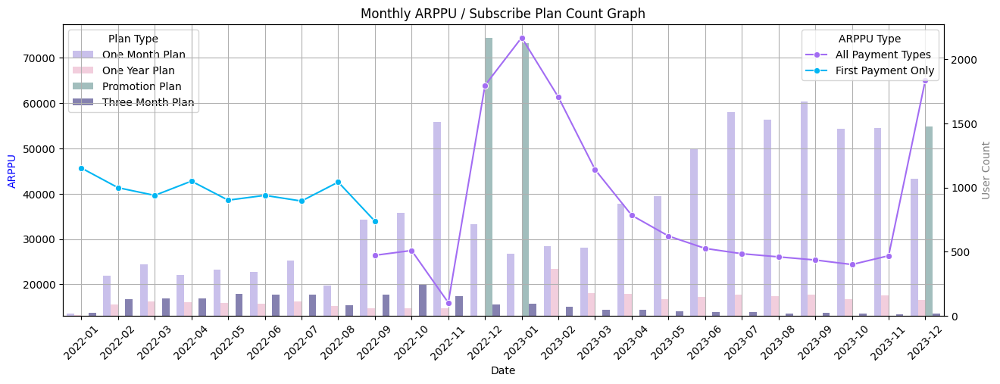

In [104]:
# 그래프 생성
fig, ax1 = plt.subplots(figsize=(15, 5))

# 라인 플롯
sns.lineplot(x=merged_df['period'], y=merged_df['ARPPU_df1'], marker='o', ax=ax1, label='All Payment Types', color='#a26cf3')
sns.lineplot(x=merged_df['period'], y=merged_df['ARPPU_df2'], marker='o', ax=ax1, label='First Payment Only', color='#01b6f3')

# 바 플롯을 보조로 사용하기 위한 준비
ax2 = ax1.twinx()

# 색상 설정
plan_colors = {
    'one_month_plan_user': '#c5b9f2', 
    'three_month_plan_user': '#7e79b8', 
    'one_year_plan_user': '#f8c8dc', 
    'promotion_plan_user': '#9dc3c1'
}

# 바 플롯 그리기 (색상 지정 및 alpha 조정)
sns.barplot(x='period', y='user_count', hue='plan_type', data=subscribe_plan_df, ax=ax2, palette=plan_colors)

# zorder 조정
ax1.set_zorder(3)
ax2.set_zorder(2)
ax1.grid(True, zorder=0)

# 라벨 및 제목 설정
ax1.set_xlabel('Date')
ax1.set_ylabel('ARPPU', color='b')
ax2.set_ylabel('User Count', color='gray')
plt.title('Monthly ARPPU / Subscribe Plan Count Graph')

# x축 회전
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)

# 투명하게 만들어서 grid가 보이도록 설정
ax1.patch.set_visible(False)

# 범례 수동으로 설정 (색상과 항목이 매칭되도록)
handles, labels = ax2.get_legend_handles_labels()
legend2 = ax1.legend( title='ARPPU Type', loc='upper right')
legend2 = ax2.legend(handles=handles, labels=['One Month Plan', 'One Year Plan', 'Promotion Plan', 'Three Month Plan'], title='Plan Type', loc='upper left')

# 범례 최상단 배치
legend2.set_zorder(4)

plt.show()

---
### ARPU 계산 전 데이터 전처리

start.free_trial, enter.lesson_page 데이터를 통한 무료체험 유저 데이터 필터링

In [105]:
# 데이터 불러오기
# 기존 데이터는 주석 처리
start_free_trial_df = start.free_trial()
complete_signup_df = complete.signup()
enter_lesson_page_df = enter.lesson_page()
# complete_subscription_df = complete.subscription()

e:\Visual Studio Code\codeit\intermediate_project\datasets.py:132: DtypeWarning: Columns (9,13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  return pd.read_csv(file_path)


In [106]:
# 임시 저장할 리스트 생성
temp_list = []

for data in [complete_signup_df, enter_lesson_page_df, complete_subscription_df]:
    
    # 필요한 컬럼 가져오기
    if 'is_trial' in data.columns:
        data = data[['user_id', 'client_event_time', 'event_type', 'is_trial']]
    else:
        data = data[['user_id', 'client_event_time', 'event_type']]

    # 데이터 타입 변환
    data['client_event_time'] = pd.to_datetime(data['client_event_time'])

    # 한국 시간으로 변환
    data['client_event_time'] = data['client_event_time'] + pd.Timedelta(hours=9)

    # # start.free_trial의 마지막 데이터를 기준으로 시간 필터링
    # data = data[data['client_event_time'] > '2023-05-01']

    # enter.lesson_page 데이터에서 조건에 맞는 데이터 필터링
    if data['event_type'].isin(['enter.lesson_page']).any():

        # is_trial이 notnull이고, 그 값이 True인 값 필터링
        data = data[(data['is_trial'].notnull()) & (data['is_trial'] == True)]

        # is_trial 컬럼 삭제
        data = data.drop(labels='is_trial', axis=1)

        # 작업이 완료된 데이터 중 user_id가 겹치는 내용이 있을 경우 first값을 반환
        data = data.drop_duplicates(subset='user_id', keep='first')

    # complete.subscription 중 user_id가  겹치는 내용이 있을 경우 first값을 반환
    if data['event_type'].isin(['complete.subscription']).any():
        data = data.drop_duplicates(subset='user_id', keep='first')

    # period 컬럼 및 데이터 추가
    data['period'] = data['client_event_time'].dt.to_period('M')

    # 임시 리스트에 데이터 append
    temp_list.append(data)

# 데이터 concat
for_arpu_concat_df = pd.concat(temp_list, axis=0)

# concat한 데이터를 user_id, client_event_time, period를 기준으로 groupby후 event_type 표기
# groupby시 공통으로 묶인 데이터가 오름차순으로 정렬됨
# 차후 작업의 유용성을 위해 reset_index()를 통한 인덱스 초기화
for_arpu_groupby = for_arpu_concat_df.groupby(['user_id', 'client_event_time', 'period'])[['event_type']].sum().reset_index()

# 데이터 확인
display(for_arpu_concat_df)

C:\Users\lento\AppData\Local\Temp\ipykernel_17356\3099469032.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['client_event_time'] = pd.to_datetime(data['client_event_time'])
C:\Users\lento\AppData\Local\Temp\ipykernel_17356\3099469032.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['client_event_time'] = data['client_event_time'] + pd.Timedelta(hours=9)
C:\Users\lento\AppData\Local\Temp\ipykernel_17356\3099469032.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a 

,user_id,client_event_time,event_type,period
0,74d17c27a41656e7788b0c81d9f76cda,2023-04-06 06:33:26.068,complete.signup,2023-04
1,06b6868000a5d576180aca47896d6cce,2023-04-06 06:45:18.672,complete.signup,2023-04
2,e131c319972bd580146c5a2faba26613,2023-04-10 23:47:56.424,complete.signup,2023-04
3,e3b8bfa80d866f296aad139e09023ef3,2023-04-10 23:25:45.920,complete.signup,2023-04
4,5208a60918f18562ac9d668a35b20303,2023-04-10 23:09:50.698,complete.signup,2023-04
...,...,...,...,...
14283,6032a27a348504a2be30ac79256a6163,2023-12-29 22:37:29.864,complete.subscription,2023-12
14284,3280d2b1af281b9989e1708d6e3d681e,2023-12-29 22:28:22.696,complete.subscription,2023-12
14285,abebe3234041d14b5c0c5821bf90ab26,2023-12-29 22:58:50.397,complete.subscription,2023-12
14286,3ca22b0bade6b40d6274bf6d06bc4344,2023-12-29 22:48:13.849,complete.subscription,2023-12


In [107]:
del enter_lesson_page_df, complete_signup_df

In [108]:
# 병렬 실행 함수 정의
def process_user(unique_id, df):
    user_data = df[df['user_id'] == unique_id]

    if len(user_data) > 1 and user_data.iloc[0]['event_type'] == 'complete.signup':
        if user_data.iloc[1]['event_type'] == 'enter.lesson_page':
            return user_data
    return None

In [109]:
# # concat과 groupby를 거친 데이터의 user_id의 unique값이 몇 개인지 확인
# print(for_arpu_groupby['user_id'].nunique())

# # 병렬 처리 실행
# after_may_free_unique_user = for_arpu_groupby['user_id'].unique()
# results = Parallel(n_jobs=-1)(delayed(process_user)(uid, for_arpu_groupby) for uid in after_may_free_unique_user)

# # None 값 제거 후 데이터프레임 결합
# filtered_results = [res for res in results if res is not None]
# after_may_free_trial = pd.concat(filtered_results, axis=0) if filtered_results else pd.DataFrame()

# # reset_index()를 통한 인덱스 재정렬
# after_may_free_trial = after_may_free_trial.reset_index(drop=True)

# # 데이터 확인
# display(after_may_free_trial)

In [110]:
# user_id의 unique 개수 확인
print(for_arpu_groupby['user_id'].nunique())

# 병렬 처리를 위한 user_id 리스트 생성
after_may_free_unique_user = for_arpu_groupby['user_id'].unique()

# 데이터를 청크 단위로 나누기
num_chunks = min(8, len(after_may_free_unique_user) // 1000)  # 최대 8개 프로세스 사용 (적절히 조정)
user_chunks = np.array_split(after_may_free_unique_user, num_chunks)

# 병렬 처리 함수 정의
def process_user_chunk(user_chunk, df):
    results = [process_user(uid, df) for uid in user_chunk]
    return [res for res in results if res is not None]  # None 제거

# 병렬 실행
results = Parallel(n_jobs=num_chunks)(
    delayed(process_user_chunk)(chunk, for_arpu_groupby) for chunk in user_chunks
)

# 결과 결합
filtered_results = [item for sublist in results for item in sublist]  # 2D 리스트를 1D로 변환
after_may_free_trial = pd.concat(filtered_results, axis=0) if filtered_results else pd.DataFrame()

# 인덱스 재정렬
after_may_free_trial = after_may_free_trial.reset_index(drop=True)

# 데이터 확인
display(after_may_free_trial)

147502


,user_id,client_event_time,period,event_type
0,0000572f2ba8079bcefd2760b632e820,2023-03-18 19:33:16.237,2023-03,complete.signup
1,0000572f2ba8079bcefd2760b632e820,2023-03-18 19:34:28.892,2023-03,enter.lesson_page
2,0000572f2ba8079bcefd2760b632e820,2023-03-25 23:40:01.647,2023-03,complete.subscription
3,0003b028a745bdfda9e88539424248af,2023-06-24 15:11:23.962,2023-06,complete.signup
4,0003b028a745bdfda9e88539424248af,2023-06-24 15:11:24.810,2023-06,enter.lesson_page
...,...,...,...,...
31917,ffe800abf1a0c00994b2a5b1ce68c681,2023-10-30 03:09:42.524,2023-10,complete.subscription
31918,fffd757f689e039a1d4db0adc1b80b61,2023-01-16 20:11:17.956,2023-01,complete.signup
31919,fffd757f689e039a1d4db0adc1b80b61,2023-01-17 09:11:08.080,2023-01,enter.lesson_page
31920,ffffd8d78865a66cb3706977f29d1dec,2023-09-11 19:06:34.388,2023-09,complete.signup


In [111]:
start_free_trial_df = start.free_trial()

In [112]:
start_free_trial_df['client_event_time'] = pd.to_datetime(start_free_trial_df['client_event_time'])
start_free_trial_df['period'] = start_free_trial_df['client_event_time'].dt.to_period('M')
start_free_trial_df = start_free_trial_df[['user_id', 'client_event_time', 'period', 'event_type']]
start_free_trial_df = start_free_trial_df.drop_duplicates(subset='user_id', keep='first')
start_free_trial_df = start_free_trial_df.dropna()

In [113]:
start_free_trial_df

,user_id,client_event_time,period,event_type
0,06b6868000a5d576180aca47896d6cce,2023-04-05 21:49:36.156,2023-04,start.free_trial
1,40acc1ddfc012f3d2f58a3de95e9e748,2023-03-12 08:28:29.384,2023-03,start.free_trial
2,38aca03fba9753a6b2f31b829fb16a30,2023-03-12 08:35:00.107,2023-03,start.free_trial
3,cc8051a75f62278b0e4216dd0a182d8c,2023-04-12 11:36:50.250,2023-04,start.free_trial
4,4cc436ad294973993ccad3e3a70053a7,2023-02-18 04:13:20.822,2023-02,start.free_trial
...,...,...,...,...
30610,f095e292083223c9d60173f0a4173c26,2022-05-28 04:26:30.754,2022-05,start.free_trial
30612,1106d8a7404b563531e873ebebdcc864,2022-02-17 20:00:01.854,2022-02,start.free_trial
30613,a9d1d21e57dc87bd63cb3e69ff78ac32,2022-02-21 04:51:52.868,2022-02,start.free_trial
30618,fd2b864d7f354eb48a29ff2ce78d229d,2022-02-21 04:37:53.294,2022-02,start.free_trial


In [114]:
len(set(start_free_trial_df['user_id'].unique()) & set(after_may_free_trial['user_id'].unique()))

473

In [115]:
# 전처리한 데이터 concat
free_user_df = pd.concat(
    [start_free_trial_df,
     after_may_free_trial[after_may_free_trial['event_type'] == 'enter.lesson_page']],
     axis=0).reset_index(drop=True)

# free_user_df dop_duplicates()
free_user_df = free_user_df.drop_duplicates(subset='user_id', keep='first')

# 시간 데이터 한국시간으로 맞추기
free_user_df['client_event_time'] = free_user_df['client_event_time'] + pd.Timedelta(hours=9)

# 데이터 기한을 2022.01.01 ~ 2023.12.31로 맞추기
free_user_df = free_user_df[(free_user_df['client_event_time'] > '2022-01-01') & (free_user_df['client_event_time'] < '2024-01-01')]

# period값 변환
free_user_df['period'] = free_user_df['client_event_time'].dt.to_period('M')

# 시간 순으로 정렬
free_user_df = free_user_df.sort_values(by='client_event_time', ascending=True).reset_index(drop=True)

# 데이터 확인
display(free_user_df)

,user_id,client_event_time,period,event_type
0,e98481d6081c560ad6c9c01c4596129e,2022-01-01 09:17:55.165,2022-01,start.free_trial
1,28562e887d0942c8f422f1ffa1c12bc0,2022-01-01 09:30:35.744,2022-01,start.free_trial
2,0ac05541526958e4ffa257afe205fc57,2022-01-01 10:37:28.634,2022-01,start.free_trial
3,346239bb0b26fb4b4314b08e884b7e15,2022-01-01 11:11:57.529,2022-01,start.free_trial
4,2b18637d168277f9e981ffbe1e3e98f4,2022-01-01 11:18:56.150,2022-01,start.free_trial
...,...,...,...,...
31179,f4aaea2bccb927968f5d4701b306cd10,2023-12-28 19:59:31.986,2023-12,enter.lesson_page
31180,f52c72bf39117e998bb295f3be8d352f,2023-12-29 05:14:06.196,2023-12,enter.lesson_page
31181,76eb9779729953aee0baa6820b7be17b,2023-12-29 07:04:47.212,2023-12,enter.lesson_page
31182,ce19035f9279e1cf0e46cf97ef8a7039,2023-12-30 03:57:39.515,2023-12,enter.lesson_page


### ARPU

In [137]:
# period 변환
free_user_df['period'] = free_user_df['client_event_time'].dt.to_period('M')
free_user_df

,user_id,client_event_time,period,event_type
0,e98481d6081c560ad6c9c01c4596129e,2022-01-01 09:17:55.165,2022-01,start.free_trial
1,28562e887d0942c8f422f1ffa1c12bc0,2022-01-01 09:30:35.744,2022-01,start.free_trial
2,0ac05541526958e4ffa257afe205fc57,2022-01-01 10:37:28.634,2022-01,start.free_trial
3,346239bb0b26fb4b4314b08e884b7e15,2022-01-01 11:11:57.529,2022-01,start.free_trial
4,2b18637d168277f9e981ffbe1e3e98f4,2022-01-01 11:18:56.150,2022-01,start.free_trial
...,...,...,...,...
31179,f4aaea2bccb927968f5d4701b306cd10,2023-12-28 19:59:31.986,2023-12,enter.lesson_page
31180,f52c72bf39117e998bb295f3be8d352f,2023-12-29 05:14:06.196,2023-12,enter.lesson_page
31181,76eb9779729953aee0baa6820b7be17b,2023-12-29 07:04:47.212,2023-12,enter.lesson_page
31182,ce19035f9279e1cf0e46cf97ef8a7039,2023-12-30 03:57:39.515,2023-12,enter.lesson_page


In [138]:
concat_tmp = concat_df.copy()

concat_tmp

,user_id,client_event_time,event_type,plan.price,paid_amount
0,1116a2ae90ca6b06f85feba27ad51ef0,2023-04-06,complete.subscription,15920,15920
1,c0f5678df8967163e6e2c464ed006791,2023-04-10,complete.subscription,131600,131600
2,79421b5d038205ad7adbb1e2c3b89741,2023-03-12,complete.subscription,131600,119756
3,bdffe1f18684704d4ea2d7eebcaed180,2023-04-12,complete.subscription,131600,131600
4,d4f54ecf6c4d7bf8742f80505f02d6dc,2023-05-31,complete.subscription,15920,15920
...,...,...,...,...,...
786,482cf2ed1eefbe648ce156e43d323114,2023-10-21,resubscribe.subscription,15920,15920
787,b6b9428216580dbdc053e0bb19083be1,2023-07-31,resubscribe.subscription,15920,15920
788,eaff98093acb9a109975957cafb2d105,2023-12-31,resubscribe.subscription,95520,95520
789,e6aace24ed8703d42ce43c4b8b1c7d66,2023-12-29,resubscribe.subscription,95520,95520


In [139]:
# 결제 데이터 원본 소실 방지를 위한 복제
concat_tmp = concat_df.copy()

# ARPU를 계산하는 방식을 단순화 하기 위한 작업
# 월별로 period 변환 후 새 컬럼에 저장
concat_tmp['period'] = concat_tmp['client_event_time'].dt.to_period('M')

# period를 기준으로 paid_amount를 sum, user_id를 nunique로 groupby하여 계산
concat_groupby_tmp = concat_tmp.groupby('period').agg(
    total_paid_amount = ('paid_amount', 'sum'),
    total_user = ('user_id', 'nunique')
).reset_index()

# 데이터 확인
display(concat_groupby_tmp)

,period,total_paid_amount,total_user
0,2022-01,2466721,54
1,2022-02,21949193,531
2,2022-03,25090147,633
3,2022-04,23275321,544
4,2022-05,23804028,617
5,2022-06,23111595,583
6,2022-07,26527391,691
7,2022-08,16304670,383
8,2022-09,25946018,968
9,2022-10,30143986,1097


In [142]:
# 각 월별 period의 unique값을 새 변수에 list형태로 저장
period_list = free_user_df['period'].unique()

# 임시 저장용 리스트
tmp_list = []

# 각 월별로 for문을 돌려 단순화
for period in period_list:
		# 해당 월의 구독자들의 list 필터링 후 저장
    subscriber_list = concat_tmp[concat_tmp['period'] == period]['user_id'].unique()
    
    # 해당 월의 무료 사용자들의 list 필터링 후 저장
    free_user_list = free_user_df[free_user_df['period'] == period]['user_id'].unique()
    
    # 해당 월에 무료로 진행한 이벤트와 유료 결제를 한 이벤트가 같이 존재한다면
    # 무료 유저군에서 제거
    recently_free_user = len(free_user_list) - len(set(subscriber_list) & set(free_user_list))
    
    # 계산된 값을 임시 리스트에 저장
    tmp_list.append(recently_free_user)

# 리스트 길이와 DataFrame 길이 비교
diff = len(concat_groupby_tmp) - len(tmp_list)

# 부족한 만큼 0을 추가
if diff > 0:
    tmp_list.extend([0] * diff)

# 리스트 할당
concat_groupby_tmp['free_user'] = tmp_list

# 전체 유저수 계산
concat_groupby_tmp['total_user_count'] = concat_groupby_tmp['total_user'] + concat_groupby_tmp['free_user']

# ARPU 계산
concat_groupby_tmp['ARPU'] = round(concat_groupby_tmp['total_paid_amount'] / concat_groupby_tmp['total_user_count'], 2)

# 그래프 그리기 전 period의 값을 문자열로 치환
concat_groupby_tmp['period'] = concat_groupby_tmp['period'].astype(str)

# 컬럼명 변경
concat_groupby_tmp.columns = ['period', 'total_paid_amount', 'subscriber', 'free_trial_user', 'total_user', 'ARPU']

# 데이터 확인
display(concat_groupby_tmp)

,period,total_paid_amount,subscriber,free_trial_user,total_user,ARPU
0,2022-01,2466721,54,2277,2331,1058.22
1,2022-02,21949193,531,1224,1755,12506.66
2,2022-03,25090147,633,1799,2432,10316.67
3,2022-04,23275321,544,1675,2219,10489.10
4,2022-05,23804028,617,1873,2490,9559.85
5,2022-06,23111595,583,1964,2547,9074.05
6,2022-07,26527391,691,604,1295,20484.47
7,2022-08,16304670,383,168,551,29591.05
8,2022-09,25946018,968,168,1136,22839.80
9,2022-10,30143986,1097,190,1287,23421.90


In [143]:
# complete.subscription, renew.subscription, resubscibe.subscription의 데이터가 모두 존재하는 부분을 분리
separated_concat_df1 = concat_tmp[(concat_tmp['client_event_time'] >= '2022-09-08') & (concat_tmp['client_event_time'] < '2024-01-01')]
separated_free_user_df1 = free_user_df[(free_user_df['client_event_time'] >= '2022-09-08') & (free_user_df['client_event_time'] < '2024-01-01')]

# complete.subscription만 존재하는 데이터 분리
separated_concat_df2 = concat_tmp[concat_tmp['client_event_time'] < '2022-09-08']
separated_free_user_df2 = free_user_df[free_user_df['client_event_time'] < '2022-09-08']

In [144]:
def arpu_def(data1, data2):
    data1['period'] = data1['client_event_time'].dt.to_period('M')

    concat_groupby_tmp = data1.groupby('period').agg(
        total_paid_amount = ('paid_amount', 'sum'),
        total_user = ('user_id', 'nunique')
    ).reset_index()

    period_list = data2['period'].unique()

    tmp_list = []

    for period in period_list:
        subscriber_list = data1[data1['period'] == period]['user_id'].unique()
        free_user_list = data2[data2['period'] == period]['user_id'].unique()

        recently_free_user = len(free_user_list) - len(set(subscriber_list) & set(free_user_list))

        tmp_list.append(recently_free_user)

    # 리스트 길이와 DataFrame 길이 비교
    diff = len(concat_groupby_tmp) - len(tmp_list)

    # 부족한 만큼 0을 추가
    if diff > 0:
        tmp_list.extend([0] * diff)

    # 리스트 할당
    concat_groupby_tmp['free_user'] = tmp_list

    concat_groupby_tmp['total_user_count'] = concat_groupby_tmp['total_user'] + concat_groupby_tmp['free_user']

    concat_groupby_tmp['ARPU'] = round(concat_groupby_tmp['total_paid_amount'] / concat_groupby_tmp['total_user_count'], 2)

    concat_groupby_tmp['period'] = concat_groupby_tmp['period'].astype(str)

    return concat_groupby_tmp

In [145]:
separated_arpu_1_df = arpu_def(separated_concat_df1, separated_free_user_df1)
separated_arpu_2_df = arpu_def(separated_concat_df2, separated_free_user_df2)

display(separated_arpu_1_df)
display(separated_arpu_2_df)

C:\Users\lento\AppData\Local\Temp\ipykernel_17356\2330243804.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['period'] = data1['client_event_time'].dt.to_period('M')
C:\Users\lento\AppData\Local\Temp\ipykernel_17356\2330243804.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['period'] = data1['client_event_time'].dt.to_period('M')


,period,total_paid_amount,total_user,free_user,total_user_count,ARPU
0,2022-09,24248427,918,136,1054,23006.10
1,2022-10,30143986,1097,190,1287,23421.90
2,2022-11,27486958,1721,80,1801,15262.05
3,2022-12,185734071,2906,12,2918,63651.16
4,2023-01,199342010,2677,5482,8159,24432.16
5,2023-02,59286291,967,2241,3208,18480.76
6,2023-03,33452804,738,1260,1998,16743.15
7,2023-04,38089315,1081,437,1518,25091.78
8,2023-05,33894113,1105,257,1362,24885.55
9,2023-06,41067210,1470,956,2426,16927.95


,period,total_paid_amount,total_user,free_user,total_user_count,ARPU
0,2022-01,2466721,54,2277,2331,1058.22
1,2022-02,21949193,531,1224,1755,12506.66
2,2022-03,25090147,633,1799,2432,10316.67
3,2022-04,23275321,544,1675,2219,10489.10
4,2022-05,23804028,617,1873,2490,9559.85
5,2022-06,23111595,583,1964,2547,9074.05
6,2022-07,26527391,691,604,1295,20484.47
7,2022-08,16304670,383,168,551,29591.05
8,2022-09,1697591,50,112,162,10478.96


C:\Users\lento\AppData\Local\Temp\ipykernel_17356\1883619593.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45)


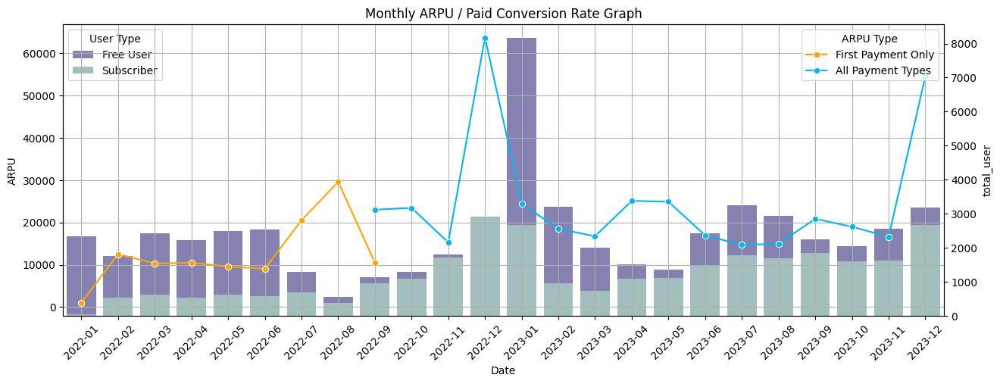

In [154]:
# 그래프 초기화
fig, ax3 = plt.subplots(figsize=(15, 5))

# 라인 그래프 생성
sns.lineplot(data=separated_arpu_2_df, x='period', y='ARPU', marker='o', ax=ax3, color='orange', label='First Payment Only')
sns.lineplot(data=separated_arpu_1_df, x='period', y='ARPU', marker='o', ax=ax3, color='#01b6f3', label='All Payment Types')

# 보조 그래프바 생성
ax4 = ax3.twinx()

# 바 그래프 생성
sns.barplot(data=concat_groupby_tmp[:-1], x='period', y='total_user', ax=ax4, color='#7e79b8', label='Free User')
sns.barplot(data=concat_groupby_tmp[:-1], x='period', y='subscriber', ax=ax4, color='#9dc3c1', label='Subscriber')

# 조더 값 조정 및 그리드 생성
ax3.set_zorder(3)
ax4.set_zorder(2)
ax3.grid(True, zorder=0)

# 라벨값 및 타이틀 생성
ax3.set_xlabel('Date')
ax3.set_ylabel('ARPU')
plt.title('Monthly ARPU / Paid Conversion Rate Graph')

# x-label의 각 값들을 회전
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45)

# 투명하게 만들어서 grid가 보이도록 설정
ax3.patch.set_visible(False)

legend2 = ax3.legend(title='ARPU Type', loc='upper right')
legend2 = ax4.legend(title='User Type', loc='upper left')

# 그래프 출력
plt.show()

---
### 일단 분리

In [2]:
# 데이터 불러오기
complete_subscription_df = complete.subscription()
renew_subscription_df = renew.subscription()
resubscribe_df = resubscribe.subscription()

In [29]:
# 함수 정의

# period 변환 함수
def change_period(data):
    data = data.copy()
    data['period'] = data['client_event_time'].dt.to_period('M')
    
    return data

# groupby 함수
def groupby(data):
    # 유료 사용자를 기준으로 집계
    data = data.groupby('period').agg(
        total_paid_amount = ('paid_amount', 'sum'),  # 총 유료 금액
        total_count = ('user_id', 'count'),  # 전체 결제 건 수
        total_user = ('user_id', 'nunique'), # 전체 유저 수
        one_month_plan_user = ('plan.price', lambda x: x[x.isin([15920])].sum()),  # 1개월 플랜 사용자
        three_month_plan_user = ('plan.price', lambda x: (x[x.isin([42960])]/3).sum()),  # 3개월 플랜 사용자
        one_year_plan_user = ('plan.price', lambda x: (x[x.isin([131600])]/12).sum()),  # 1년 플랜 사용자
        promotion_plan_user = ('plan.price', lambda x: (x[x.isin([79200, 95520, 95200, 91200, 87200, 83200])]/12).sum()),  # 프로모션 플랜 사용자
    )
    return data


In [30]:
# 모든 결제 완료 이력
concat_df = pd.concat([complete_subscription_df, renew_subscription_df, resubscribe_df], axis=0)

# 필요한 데이터 컬럼만 추출
concat_df = concat_df[['user_id', 'client_event_time', 'event_type', 'plan.price', 'paid_amount']]

# Data Type 변경
concat_df['client_event_time'] = pd.to_datetime(concat_df['client_event_time']) + pd.Timedelta(hours=9)
concat_df['client_event_time'] = concat_df['client_event_time'].dt.date

# 특정한 열에 중복값이 있는지 체크 후 첫번째 값만 남기고 제거
concat_df = concat_df.drop_duplicates(subset=['user_id', 'client_event_time', 'paid_amount'], keep='first')

# 날짜 비교를 위한 데이터 재변환
concat_df['client_event_time'] = pd.to_datetime(concat_df['client_event_time'])

# 데이터 확인
display(concat_df)

,user_id,client_event_time,event_type,plan.price,paid_amount
0,1116a2ae90ca6b06f85feba27ad51ef0,2023-04-06,complete.subscription,15920,15920
1,c0f5678df8967163e6e2c464ed006791,2023-04-10,complete.subscription,131600,131600
2,79421b5d038205ad7adbb1e2c3b89741,2023-03-12,complete.subscription,131600,119756
3,bdffe1f18684704d4ea2d7eebcaed180,2023-04-12,complete.subscription,131600,131600
4,d4f54ecf6c4d7bf8742f80505f02d6dc,2023-05-31,complete.subscription,15920,15920
...,...,...,...,...,...
786,482cf2ed1eefbe648ce156e43d323114,2023-10-21,resubscribe.subscription,15920,15920
787,b6b9428216580dbdc053e0bb19083be1,2023-07-31,resubscribe.subscription,15920,15920
788,eaff98093acb9a109975957cafb2d105,2023-12-31,resubscribe.subscription,95520,95520
789,e6aace24ed8703d42ce43c4b8b1c7d66,2023-12-29,resubscribe.subscription,95520,95520


In [32]:
# complete.subscription, renew.subscription, resubscibe.subscription의 데이터가 모두 존재하는 부분을 분리
separated_df1 = concat_df[(concat_df['client_event_time'] >= '2022-09-08') & (concat_df['client_event_time'] <= '2024-01-01')]

# complete.subscription만 존재하는 데이터 분리
separated_df2 = concat_df[concat_df['client_event_time'] < '2022-09-08']

In [33]:
# 분리된 데이터 리스트 저장
list_df = [separated_df1, separated_df2]

# 임시용 보관 데이터 생성
list_groupby = []

for i in range(len(list_df)):
    # Month period 타입 변환
    month_df = change_period(list_df[i])

    # groupby 및 reset_index()
    df_groupby = groupby(month_df).reset_index()

    # 데이터 타입 변환
    df_groupby['period'] = df_groupby['period'].dt.to_timestamp()

    # 리스트에 저장
    list_groupby.append(df_groupby)
    
# 결과 저장
separated_df1_month, separated_df2_month = list_groupby

# 데이터 확인
for list in list_groupby:
    display(list)

,period,total_paid_amount,total_count,total_user,one_month_plan_user,three_month_plan_user,one_year_plan_user,promotion_plan_user
0,2022-09-01,24248427,922,918,11382800,2205280.0,5.812333e+05,0.000000e+00
1,2022-10-01,30143986,1106,1097,12751920,3522720.0,6.470333e+05,0.000000e+00
2,2022-11-01,27486958,1727,1721,24086960,2219600.0,6.470333e+05,0.000000e+00
3,2022-12-01,185734071,2964,2906,11366880,1245840.0,0.000000e+00,1.427580e+07
4,2023-01-01,199342010,2709,2677,7753040,1374720.0,0.000000e+00,1.558227e+07
5,2023-02-01,59286291,979,967,8644560,1031040.0,3.991867e+06,0.000000e+00
6,2023-03-01,33452804,759,738,8469440,716000.0,1.930133e+06,0.000000e+00
7,2023-04-01,38089315,1089,1081,13866320,658720.0,1.886267e+06,0.000000e+00
8,2023-05-01,33894113,1109,1105,14853360,501200.0,1.458567e+06,0.000000e+00
9,2023-06-01,41067210,1480,1470,20632320,415280.0,1.634033e+06,0.000000e+00


,period,total_paid_amount,total_count,total_user,one_month_plan_user,three_month_plan_user,one_year_plan_user,promotion_plan_user
0,2022-01-01,2466721,54,54,318400,372320.0,8.773333e+04,0.0
1,2022-02-01,21949193,535,531,4951120,1904560.0,9.979667e+05,0.0
2,2022-03-01,25090147,652,633,6399840,1990480.0,1.217300e+06,0.0
3,2022-04-01,23275321,562,544,5094400,1918880.0,1.184400e+06,0.0
4,2022-05-01,23804028,632,617,5747120,2477360.0,1.074733e+06,0.0
5,2022-06-01,23111595,602,583,5444640,2377120.0,1.030867e+06,0.0
6,2022-07-01,26527391,710,691,6845600,2405760.0,1.228267e+06,0.0
7,2022-08-01,16304670,399,383,3757120,1188560.0,8.773333e+05,0.0
8,2022-09-01,1697591,50,50,525360,171840.0,5.483333e+04,0.0


In [34]:
# 데이터 초기화
arppu_list = []

# ARPPU 계산
for list in list_groupby:
    list['ARPPU'] = round(list['total_paid_amount'] / list['total_user'], 2)
    arppu_list.append(list)

# 데이터 확인
for list in arppu_list:
    display(list)

,period,total_paid_amount,total_count,total_user,one_month_plan_user,three_month_plan_user,one_year_plan_user,promotion_plan_user,ARPPU
0,2022-09-01,24248427,922,918,11382800,2205280.0,5.812333e+05,0.000000e+00,26414.41
1,2022-10-01,30143986,1106,1097,12751920,3522720.0,6.470333e+05,0.000000e+00,27478.57
2,2022-11-01,27486958,1727,1721,24086960,2219600.0,6.470333e+05,0.000000e+00,15971.50
3,2022-12-01,185734071,2964,2906,11366880,1245840.0,0.000000e+00,1.427580e+07,63914.00
4,2023-01-01,199342010,2709,2677,7753040,1374720.0,0.000000e+00,1.558227e+07,74464.70
5,2023-02-01,59286291,979,967,8644560,1031040.0,3.991867e+06,0.000000e+00,61309.50
6,2023-03-01,33452804,759,738,8469440,716000.0,1.930133e+06,0.000000e+00,45329.00
7,2023-04-01,38089315,1089,1081,13866320,658720.0,1.886267e+06,0.000000e+00,35235.26
8,2023-05-01,33894113,1109,1105,14853360,501200.0,1.458567e+06,0.000000e+00,30673.41
9,2023-06-01,41067210,1480,1470,20632320,415280.0,1.634033e+06,0.000000e+00,27936.88


,period,total_paid_amount,total_count,total_user,one_month_plan_user,three_month_plan_user,one_year_plan_user,promotion_plan_user,ARPPU
0,2022-01-01,2466721,54,54,318400,372320.0,8.773333e+04,0.0,45680.02
1,2022-02-01,21949193,535,531,4951120,1904560.0,9.979667e+05,0.0,41335.58
2,2022-03-01,25090147,652,633,6399840,1990480.0,1.217300e+06,0.0,39636.88
3,2022-04-01,23275321,562,544,5094400,1918880.0,1.184400e+06,0.0,42785.52
4,2022-05-01,23804028,632,617,5747120,2477360.0,1.074733e+06,0.0,38580.27
5,2022-06-01,23111595,602,583,5444640,2377120.0,1.030867e+06,0.0,39642.53
6,2022-07-01,26527391,710,691,6845600,2405760.0,1.228267e+06,0.0,38389.86
7,2022-08-01,16304670,399,383,3757120,1188560.0,8.773333e+05,0.0,42570.94
8,2022-09-01,1697591,50,50,525360,171840.0,5.483333e+04,0.0,33951.82


In [35]:
# ARPPU 그래프 생성 전 전처리 작업란
# period x열 생성을 위한 병합
merged_df = pd.merge(
    arppu_list[0],
    arppu_list[1],
    on='period', how='outer',
    suffixes=('_df1', '_df2'))

# period를 string으로 변환
merged_df['period'] = merged_df['period'].dt.strftime('%Y-%m')

# '2024-01' 데이터 제거
merged_df = merged_df[merged_df['period'] != '2024-01']

# 데이터 확인
display(merged_df)

,period,total_paid_amount_df1,total_count_df1,total_user_df1,one_month_plan_user_df1,three_month_plan_user_df1,one_year_plan_user_df1,promotion_plan_user_df1,ARPPU_df1,total_paid_amount_df2,total_count_df2,total_user_df2,one_month_plan_user_df2,three_month_plan_user_df2,one_year_plan_user_df2,promotion_plan_user_df2,ARPPU_df2
0,2022-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2466721.0,54.0,54.0,318400.0,372320.0,8.773333e+04,0.0,45680.02
1,2022-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21949193.0,535.0,531.0,4951120.0,1904560.0,9.979667e+05,0.0,41335.58
2,2022-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25090147.0,652.0,633.0,6399840.0,1990480.0,1.217300e+06,0.0,39636.88
3,2022-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23275321.0,562.0,544.0,5094400.0,1918880.0,1.184400e+06,0.0,42785.52
4,2022-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23804028.0,632.0,617.0,5747120.0,2477360.0,1.074733e+06,0.0,38580.27
5,2022-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23111595.0,602.0,583.0,5444640.0,2377120.0,1.030867e+06,0.0,39642.53
6,2022-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26527391.0,710.0,691.0,6845600.0,2405760.0,1.228267e+06,0.0,38389.86
7,2022-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16304670.0,399.0,383.0,3757120.0,1188560.0,8.773333e+05,0.0,42570.94
8,2022-09,24248427.0,922.0,918.0,11382800.0,2205280.0,5.812333e+05,0.000000e+00,26414.41,1697591.0,50.0,50.0,525360.0,171840.0,5.483333e+04,0.0,33951.82
9,2022-10,30143986.0,1106.0,1097.0,12751920.0,3522720.0,6.470333e+05,0.000000e+00,27478.57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
# Subscribe Plan Count 그래프 생성 전 전처리 작업란
# melt()를 이용하여 데이터 변환 후 중복된 period 값 합산
temp_list = []
for i in range(2):
    name1 = f'one_month_plan_user_df{i+1}'
    name2 = f'three_month_plan_user_df{i+1}'
    name3 = f'one_year_plan_user_df{i+1}'
    name4 = f'promotion_plan_user_df{i+1}'

    data = merged_df.melt(
        id_vars='period',
        value_vars=[name1, name2, name3, name4],
        var_name='plan_type',
        value_name='user_count')

    # 'df1'과 'df2'를 제거한 새로운 plan_type을 생성
    data['plan_type'] = data['plan_type'].str.replace('_df1', '').str.replace('_df2', '')

    # '2024-01' 데이터 제거
    data = data[data['period'] != '2024-01']

    temp_list.append(data)

# 두 데이터프레임을 합치고 동일한 period와 plan_type 값을 그룹화하여 합산
subscribe_plan_df = pd.concat(temp_list).groupby(['period', 'plan_type']).sum().reset_index()

# 데이터 확인
display(subscribe_plan_df)

,period,plan_type,user_count
0,2022-01,one_month_plan_user,3.184000e+05
1,2022-01,one_year_plan_user,8.773333e+04
2,2022-01,promotion_plan_user,0.000000e+00
3,2022-01,three_month_plan_user,3.723200e+05
4,2022-02,one_month_plan_user,4.951120e+06
...,...,...,...
91,2023-11,three_month_plan_user,2.148000e+05
92,2023-12,one_month_plan_user,1.697072e+07
93,2023-12,one_year_plan_user,1.337933e+06
94,2023-12,promotion_plan_user,1.176488e+07


C:\Users\lento\AppData\Local\Temp\ipykernel_24132\2321638802.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
C:\Users\lento\AppData\Local\Temp\ipykernel_24132\2321638802.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  legend2 = ax1.legend( title='ARPPU Type', loc='upper right')


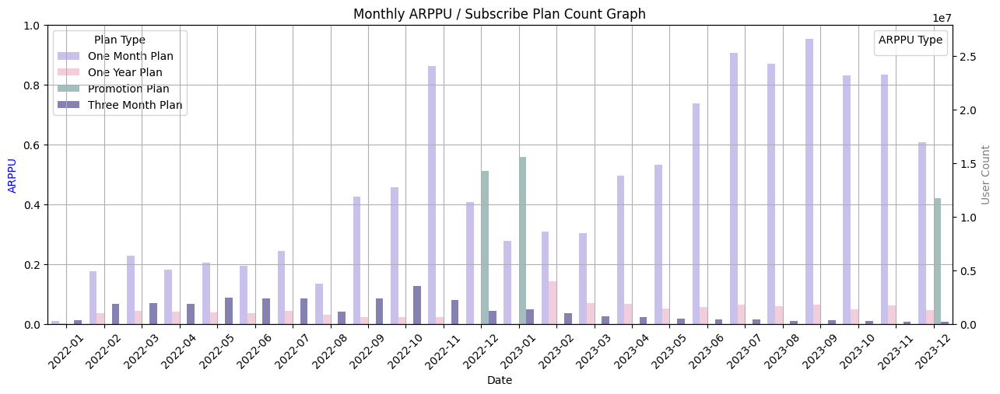

In [37]:
# 그래프 생성
fig, ax1 = plt.subplots(figsize=(15, 5))

# 라인 플롯
# sns.lineplot(x=merged_df['period'], y=merged_df['ARPPU_df1'], marker='o', ax=ax1, label='All Payment Types', color='#a26cf3')
# sns.lineplot(x=merged_df['period'], y=merged_df['ARPPU_df2'], marker='o', ax=ax1, label='First Payment Only', color='#01b6f3')

# 바 플롯을 보조로 사용하기 위한 준비
ax2 = ax1.twinx()

# 색상 설정
plan_colors = {
    'one_month_plan_user': '#c5b9f2', 
    'three_month_plan_user': '#7e79b8', 
    'one_year_plan_user': '#f8c8dc', 
    'promotion_plan_user': '#9dc3c1'
}

# 바 플롯 그리기 (색상 지정 및 alpha 조정)
sns.barplot(x='period', y='user_count', hue='plan_type', data=subscribe_plan_df, ax=ax2, palette=plan_colors)

# zorder 조정
ax1.set_zorder(3)
ax2.set_zorder(2)
ax1.grid(True, zorder=0)

# 라벨 및 제목 설정
ax1.set_xlabel('Date')
ax1.set_ylabel('ARPPU', color='b')
ax2.set_ylabel('User Count', color='gray')
plt.title('Monthly ARPPU / Subscribe Plan Count Graph')

# x축 회전
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)

# 투명하게 만들어서 grid가 보이도록 설정
ax1.patch.set_visible(False)

# 범례 수동으로 설정 (색상과 항목이 매칭되도록)
handles, labels = ax2.get_legend_handles_labels()
legend2 = ax1.legend( title='ARPPU Type', loc='upper right')
legend2 = ax2.legend(handles=handles, labels=['One Month Plan', 'One Year Plan', 'Promotion Plan', 'Three Month Plan'], title='Plan Type', loc='upper left')

# 범례 최상단 배치
legend2.set_zorder(4)

plt.show()

In [4]:
enter_main_page_df = enter.main_page()

In [4]:
# 비회원이 main_page에 접속한 빈도 상위 15개 OS 
enter_main_page_df[enter_main_page_df['user_id'].isnull()]['os_name'].value_counts().head(15)

os_name
Chrome             658242
Mobile Safari      224270
Instagram          198313
Samsung Browser    107053
Edge                87097
Chrome WebView      66835
Whale               66410
Chrome Mobile       48206
Safari              47874
WebKit              47631
Facebook            37220
GSA                 10788
Firefox              3870
Chrome Headless      2775
Opera                 973
Name: count, dtype: int64

In [5]:
# 국가별 main_page에 접속한 빈도 상위 15개 국가
enter_main_page_df['country'].value_counts().head(15)

country
South Korea       2079303
United States       18925
Japan                5329
Canada               4142
Germany              3009
Ireland              2144
Australia            1970
Singapore            1736
United Kingdom       1688
Vietnam              1317
India                1216
France               1014
Hong Kong             970
China                 784
Thailand              524
Name: count, dtype: int64

In [6]:
# 각 국가별 main_page에 접속한 OS 비율
enter_main_page_df.groupby

<bound method DataFrame.groupby of                   city           client_event_time      country  \
0          Seongnam-si  2023-04-05 21:55:06.140000  South Korea   
1        Dongdaemun-gu  2023-04-05 21:04:28.967000  South Korea   
2          Hwaseong-si  2023-04-05 21:01:31.258000  South Korea   
3          Hwaseong-si  2023-04-05 21:02:50.374000  South Korea   
4                Seoul  2023-04-05 21:30:33.727000  South Korea   
...                ...                         ...          ...   
2133543       Jeongeup  2023-10-10 05:53:29.283000  South Korea   
2133544       Jeongeup  2023-10-10 05:54:17.572000  South Korea   
2133545     Gangnam-gu  2023-10-10 05:54:33.164000  South Korea   
2133546        Saha-gu  2023-10-10 05:58:15.175000  South Korea   
2133547          Seoul  2023-10-10 05:58:45.857000  South Korea   

         device_carrier        device_family                device_type  \
0                   NaN        Samsung Phone      Samsung Galaxy S21 5G   
1         

In [2]:
enter_content_page_df = enter.content_page()
start_free_trial_df = start.free_trial()
complete_subscription_df = complete.subscription()
renew_subscription_df = renew.subscription()
resubscribe_df = resubscribe.subscription()
start_content_df = start.content()

In [96]:
# 모든 결제 완료 이력
concat_df = pd.concat([complete_subscription_df, renew_subscription_df, resubscribe_df], axis=0)
concat_df = concat_df.drop_duplicates()
concat_df

# data type 변경
concat_df['client_event_time'] = pd.to_datetime(concat_df['client_event_time'])

merge_df2 = pd.merge(concat_df, start_free_trial_df[['user_id', 'plan.type']], how='inner', on='user_id')
merge_df2 = merge_df2.drop_duplicates()
merge_df2.groupby(['plan.price', 'plan.type']).size().reset_index(name='count')

# 궁금점
concat_df.groupby('plan.price').agg(client_event_time_min=('client_event_time', 'min'), client_event_time_max=('client_event_time', 'max'))

,client_event_time_min,client_event_time_max
plan.price,,
14328,2023-05-02 07:50:46.978,2023-12-17 02:30:01.995
15920,2022-01-02 08:34:14.270,2023-12-31 09:20:02.770
19920,2023-03-16 01:59:11.035,2023-03-16 01:59:11.035
42960,2022-01-01 06:17:24.513,2023-12-30 09:20:05.551
79200,2022-11-30 15:11:19.442,2022-12-31 14:58:49.139
83200,2022-12-31 15:18:32.786,2023-01-10 14:59:10.551
87200,2023-01-10 15:04:31.960,2023-01-17 14:56:54.133
91200,2023-01-17 15:00:47.164,2023-01-24 14:58:37.499
95200,2023-01-24 15:00:07.569,2023-01-31 14:55:01.296


In [37]:
# 모든 결제 건 수 중 무료 체험을 시작한 후 결제한 유저의 값
merge_df = pd.merge(start_free_trial_df, concat_df, on='user_id', how='inner')
merge_df

,city_x,client_event_time_x,country_x,device_carrier_x,device_family_x,device_type_x,event_type_x,language_x,os_name_x,os_version_x,platform_x,user_id,plan.price_x,plan.type,trial.type,city_y,client_event_time_y,country_y,device_carrier_y,device_family_y,device_type_y,event_type_y,language_y,os_name_y,os_version_y,platform_y,plan.price_y,paid_amount,coupon.discount_amount,pg.type
0,NaN,2023-03-12 08:35:00.107000,NaN,NaN,NaN,NaN,start.free_trial,NaN,NaN,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B,Seoul,2023-03-19 08:35:01.854000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,15920,15920,0,NaN
1,NaN,2023-03-12 08:35:00.107000,NaN,NaN,NaN,NaN,start.free_trial,NaN,NaN,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B,Seoul,2023-04-19 08:40:02.338,South Korea,NaN,Mac,Mac,renew.subscription,Korean,Chrome,111.0.0.0,Web,15920,15920,0,NaN
2,NaN,2023-03-12 08:35:00.107000,NaN,NaN,NaN,NaN,start.free_trial,NaN,NaN,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B,Suwon,2023-05-19 08:45:01.660,South Korea,NaN,Mac,Mac,renew.subscription,Korean,Chrome,112.0.0.0,Web,15920,15920,0,NaN
3,NaN,2023-03-12 08:35:00.107000,NaN,NaN,NaN,NaN,start.free_trial,NaN,NaN,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B,Guro-gu,2023-06-19 08:50:02.764,South Korea,NaN,Mac,Mac,renew.subscription,Korean,Chrome,114.0.0.0,Web,15920,15920,0,NaN
4,NaN,2023-03-12 08:35:00.107000,NaN,NaN,NaN,NaN,start.free_trial,NaN,NaN,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B,Seoul,2023-07-19 08:55:01.945,South Korea,NaN,Mac,Mac,renew.subscription,Korean,Chrome,114.0.0.0,Web,15920,15920,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14394,Hongseong-gun,2022-10-28 04:16:34.387000,South Korea,NaN,Windows,Windows,start.free_trial,Korean,Chrome,107.0,Web,3c55c67f1a2634bd2a38d4ee11daa650,NaN,NaN,A,Hongseong-gun,2022-11-04 04:20:02.926000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,131600,131600,0,NaN
14395,Hongseong-gun,2022-10-28 04:16:34.387000,South Korea,NaN,Windows,Windows,start.free_trial,Korean,Chrome,107.0,Web,3c55c67f1a2634bd2a38d4ee11daa650,NaN,NaN,A,Hongseong-gun,2022-11-04 04:20:01.516,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,107,Web,131600,131600,0,NaN
14396,Uiwang,2022-05-28 04:36:00.949000,South Korea,NaN,Windows,Windows,start.free_trial,Korean,Chrome,102.0,Web,4254765f174fe193cd90c093d73e62e8,NaN,NaN,A,Gwangmyeong,2022-05-31 05:14:36.838000,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Chrome,101,Web,15920,13532,2388,NaN
14397,Uiwang,2022-05-28 04:36:32.423000,South Korea,NaN,Windows,Windows,start.free_trial,Korean,Chrome,102.0,Web,4254765f174fe193cd90c093d73e62e8,NaN,NaN,A,Gwangmyeong,2022-05-31 05:14:36.838000,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Chrome,101,Web,15920,13532,2388,NaN


In [3]:
# 데이터 불러오기
click_content_page_start_content_btn_df = click.content_page_start_content_button()

# 데이터 타입 변환
click_content_page_start_content_btn_df['client_event_time'] = pd.to_datetime(click_content_page_start_content_btn_df['client_event_time'])

# 데이터 분리
type_a_df = click_content_page_start_content_btn_df[
    click_content_page_start_content_btn_df['button.name'].isnull() &\
    click_content_page_start_content_btn_df['button_name'].notnull()]
type_b_df = click_content_page_start_content_btn_df[
    click_content_page_start_content_btn_df['button.name'].notnull() &\
    click_content_page_start_content_btn_df['button_name'].isnull()]

# 데이터 확인
print("Type A 날짜 범위")
print(type_a_df.groupby('button_name').agg(min_time=('client_event_time', 'min'), max_time=('client_event_time', 'max')))
print("\n")
print("Type B 날짜 범위")
print(type_b_df.groupby('button.name').agg(min_time=('client_event_time', 'min'), max_time=('client_event_time', 'max')))

NameError: name 'click' is not defined

In [49]:
complete_signup_df = complete.signup()
start_free_trial_df = start.free_trial()
start_content_df = start.content()

complete_subscription_df = complete.subscription()

In [ ]:
# signup 데이터와 free_trial 데이터 병합
merge_df1 = pd.merge(
    complete_signup_df[['user_id', 'client_event_time']],
    start_free_trial_df[['user_id', 'client_event_time']],
    how='left',
    on='user_id',
    suffixes=('_signup', '_free_trial')
)

# 이전에 병합한 데이터에 complete_subscription 데이터 병합
merge_df2 = pd.merge(
    merge_df1,
    complete_subscription_df[['user_id', 'client_event_time']],
    how='left',
    on='user_id'
)

# 이전에 병합한 데이터에 start_content 데이터 병합
merge_df3 = pd.merge(
    merge_df2,
    start_content_df[['user_id', 'client_event_time']],
    how='left',
    on='user_id')

# 중복값 제거
merge_df3 = merge_df3.drop_duplicates()

# 데이터 컬럼명 재정의
merge_df3.rename(columns={
    'client_event_time_signup': 'signup_time',
    'client_event_time_free_trial': 'free_trial_time',
    'client_event_time_x': 'subscription_time',
    'client_event_time_y': 'content_time'
}, inplace=True)

merge_df3

# user_id로 묶은 뒤 각 행들의 첫번째 값들만 뽑아오기
merge_groupby = merge_df3.groupby('user_id').agg({
    'signup_time' : 'first',
    'subscription_time' : 'first',
    'free_trial_time' : 'first',
    'content_time' : 'first'
})

merge_groupby = merge_groupby.reset_index()

merge_groupby # 145133 rows × 3 columns (수정 별도로 필요)

# content_time이 결측치인 값을 제거
merge_groupby.dropna(subset=['content_time']) # 36388 rows × 4 columns

merge_groupby

# # 활성화 무료 유저 : 36388명

,user_id,signup_time,subscription_time,free_trial_time,content_time
0,0000572f2ba8079bcefd2760b632e820,2023-03-18 10:33:16.237000,2023-03-25 14:40:01.647000,2023-03-18 14:39:22.844000,2023-03-18 16:49:45.361000
1,000087537cbfd934375364218ff10f91,2023-03-27 04:54:01.257000,2023-04-08 11:45:01.586000,2023-04-01 11:42:25.489000,2023-05-01 10:31:15.918000
2,000117267e1dd62481ef3ae7fb420107,2022-12-16 05:05:24.926000,None,None,None
3,0001f15911b404f3bf5b8571afafa4e4,2023-11-19 02:53:43.023000,2023-11-29 01:13:51.820000,None,2023-11-22 12:50:00.941000
4,0001f28a707789a7d78dc28fd2e84dce,2023-10-15 15:09:34.334000,None,None,None
...,...,...,...,...,...
145128,fffe529de03d6187ef7ed765650c8d2b,2023-02-26 13:40:51.953000,None,2023-03-01 12:37:09.512000,2023-05-02 08:10:35.470000
145129,fffee4d401b390a681491b9f5cfe40fb,2023-12-31 07:37:01.064000,None,None,None
145130,fffef868442fc8f4f405894b8ff8959f,2023-07-03 04:52:16.228000,None,None,None
145131,ffffd8d78865a66cb3706977f29d1dec,2023-09-11 10:06:34.388000,None,None,2023-11-15 04:45:32.896000


In [2]:
enter_main_page_df = enter.main_page()

In [3]:
print(enter_main_page_df[enter_main_page_df['device_type'] == 'Windows'].shape[0])
print(enter_main_page_df[enter_main_page_df['device_type'] == 'Mac'].shape[0])
print(enter_main_page_df[enter_main_page_df['device_type'] == 'Linux'].shape[0])
print(enter_main_page_df[enter_main_page_df['device_type'] == 'Ubuntu'].shape[0])

845411
233654
16489
143


In [4]:
enter_main_page_df[(enter_main_page_df['device_family'].str.contains('-') == False) &
                   (enter_main_page_df['device_family'].str.contains('_') == False) &
                   (enter_main_page_df['device_family'].str.contains(r'\d') == False) &
                   (enter_main_page_df['device_family'].str.contains('Phone') == False) &
                   (enter_main_page_df['device_family'].str.contains('TV') == False) &
                   (enter_main_page_df['device_family'].str.contains('Tablet') == False) &
                   (enter_main_page_df['device_family'].str.contains('Mobile') == False) &
                   (enter_main_page_df['device_family'].str.contains('Android') == False) &
                   (enter_main_page_df['device_family'].str.contains('Samsung') == False) &
                   (enter_main_page_df['device_family'].str.contains('Apple') == False)]['device_family'].unique()

array(['Mac', 'Windows', 'Linux', 'K', 'CentOS', 'Chromium OS', 'Ubuntu',
       'LG lge', 'Tesla Linux', 'HiPad X', 'Microsoft Xbox One',
       'Xiaomi MID', 'wv', 'Fedora', 'AOSP on flame', 'iOS', 'Active',
       '<Device Model>', 'LG Linux', 'Amazon Kindle', 'DTABPLUS',
       'BISON GT', 'Microsoft Surface Duo', 'Titan', 'Tizen',
       'BlackBerry', 'BISON Pro', 'Sony Xperia', 'Motorola razr',
       'DEVICE INFO', 'walleye', 'tablePC', 'MASTERPRO', 'NovaAirC',
       'BRAVE'], dtype=object)

In [85]:
complete_signup_df = complete.signup()
start_free_trial_df = start.free_trial()
complete_subscription_df = complete.subscription()
renew_subscription_df = renew.subscription()
resubscribe_df = resubscribe.subscription()
cancel_plan_df = click.cancel_plan_button()

In [86]:
# 데이터 concat
concat_df = pd.concat([
    complete_signup_df[['user_id', 'client_event_time', 'event_type']],
    start_free_trial_df[['user_id', 'client_event_time', 'event_type']],
    complete_subscription_df[['user_id', 'client_event_time', 'event_type']],
    renew_subscription_df[['user_id', 'client_event_time', 'event_type']],
    resubscribe_df[['user_id', 'client_event_time', 'event_type']],
    cancel_plan_df[['user_id', 'client_event_time', 'event_type']]], axis=0).reset_index(drop=True)

# 데이터 타입 변경
concat_df['client_event_time'] = pd.to_datetime(concat_df['client_event_time']) + pd.DateOffset(hours=9)

# user_id 컬럼 결측치 제거
concat_df = concat_df.dropna(subset=['user_id'])

# 데이터 기한 설정
concat_df = concat_df[(concat_df['client_event_time'] >= '2022-01-01') & (concat_df['client_event_time'] < '2023-05-01')]

# client_event_time 오름차순 정렬
concat_df = concat_df.sort_values(by='client_event_time').reset_index(drop=True)

# 데이터 확인
concat_df

,user_id,client_event_time,event_type
0,6b4b4d8e08ce009f8992c546372ce664,2022-01-01 09:06:31.232,complete.signup
1,a5b72d5c6dd4e213315225d9fb9bbbca,2022-01-01 09:10:21.400,complete.signup
2,81c52556d0605b8221aa897cd2ed740d,2022-01-01 09:10:49.730,complete.signup
3,4a8e9325b1a855be259d7dad2d378276,2022-01-01 09:12:18.251,complete.signup
4,e98481d6081c560ad6c9c01c4596129e,2022-01-01 09:17:55.165,start.free_trial
...,...,...,...
148542,7ca10d40675592dbacde558dcebfb501,2023-04-30 23:48:54.989,complete.signup
148543,a01b3ae7f1817ebd60860f3fcd5e40c5,2023-04-30 23:51:16.178,complete.signup
148544,95cfd6728d7b510b5ad18e8e16fdc672,2023-04-30 23:55:01.850,complete.subscription
148545,cea0d65cbcd9005a6a4e66b5f39aa5e7,2023-04-30 23:56:40.414,start.free_trial


In [87]:
concat_df['user_id'].nunique()

96072

In [88]:
trial_list = []
non_trial_list = []

for user_id in concat_df['user_id'].unique():
    user_df = concat_df[concat_df['user_id'] == user_id]
    
    if 'complete.signup' in user_df['event_type'].values:
        if ('start.free_trial' in user_df['event_type'].values) & ('complete.subscription' in user_df['event_type'].values):
            trial_list.append(user_df)
        if ('start.free_trial' not in user_df['event_type'].values) & ('complete.subscription' in user_df['event_type'].values):
            non_trial_list.append(user_df)

# 최종 데이터 병합
trial_df = pd.concat(trial_list, ignore_index=True)
non_trial_df = pd.concat(non_trial_list, ignore_index=True)

In [89]:
trial_df['user_id'].nunique()

3015

In [90]:
# 무료체험을 하고 구독한 유저의 타임라인 데이터프레임 작업란
resubs_time_list1 = []
cancel_time_list1 = []

for user_id in trial_df['user_id'].unique():
    user_df = trial_df[trial_df['user_id'] == user_id]
    
    # resubscribe.subscription 계산
    if 'resubscribe.subscription' in user_df['event_type'].values:
        user_df = user_df.sort_values(by='client_event_time')  # 시간 순 정렬
        user_df['prev_client_event_time'] = user_df['client_event_time'].shift(1)  # 이전 이벤트 시간 추가
        
        resubs_time = user_df.loc[user_df['event_type'] == 'resubscribe.subscription', 'client_event_time'] - \
                      user_df.loc[user_df['event_type'] == 'resubscribe.subscription', 'prev_client_event_time']
        
        # NaN 값 제거 후 리스트에 추가
        resubs_time_list1.extend(resubs_time.dt.days.dropna().tolist())

    # click.cancel_plan_button 계산
    if 'click.cancel_plan_button' in user_df['event_type'].values and 'complete.signup' in user_df['event_type'].values:
        signup_time = user_df.loc[user_df['event_type'] == 'complete.signup', 'client_event_time'].min()  # 첫 구독 시간
        cancel_times = user_df.loc[user_df['event_type'] == 'click.cancel_plan_button', 'client_event_time']
        
        cancel_time_diff = (cancel_times - signup_time).dt.days.dropna()
        cancel_time_list1.extend(cancel_time_diff.tolist())

# 평균 계산 (0으로 나누는 경우 방지)
avg_resubs_time1 = sum(resubs_time_list1) / len(resubs_time_list1) if resubs_time_list1 else 0
avg_cancel_time1 = sum(cancel_time_list1) / len(cancel_time_list1) if cancel_time_list1 else 0

In [91]:
print(f"무료 체험을 한 유저의 수 : {trial_df['user_id'].nunique()}명")
print(f"그 중 만료 뒤 재구독을 한 유저의 수 : {trial_df[trial_df['event_type'] == 'resubscribe.subscription']['user_id'].nunique()}명")
print(f"그 중 구독을 취소한 유저의 수 : {trial_df[trial_df['event_type'] == 'click.cancel_plan_button']['user_id'].nunique()}명")
print(f"평균 만료 후 재 구독 경과 시간 : {avg_resubs_time1:.2f}일")
print(f"취소 시 첫 구독 이래 이용한 평균 시간 : {avg_cancel_time1:.2f}일")

무료 체험을 한 유저의 수 : 3015명
그 중 만료 뒤 재구독을 한 유저의 수 : 36명
그 중 구독을 취소한 유저의 수 : 1868명
평균 만료 후 재 구독 경과 시간 : 110.36일
취소 시 첫 구독 이래 이용한 평균 시간 : 88.92일


In [92]:
non_trial_df['user_id'].nunique()

4928

In [93]:
# 무료체험을 하지 않고 구독한 유저의 타임라인 데이터프레임 작업란
resubs_time_list2 = []
cancel_time_list2 = []

for user_id in non_trial_df['user_id'].unique():
    user_df = non_trial_df[non_trial_df['user_id'] == user_id].copy()
    
    # resubscribe.subscription 계산
    if 'resubscribe.subscription' in user_df['event_type'].values:
        user_df = user_df.sort_values(by='client_event_time')  # 시간 순 정렬
        user_df['prev_client_event_time'] = user_df['client_event_time'].shift(1)  # 이전 이벤트 시간 추가
        
        resubs_time = user_df.loc[user_df['event_type'] == 'resubscribe.subscription', 'client_event_time'] - \
                      user_df.loc[user_df['event_type'] == 'resubscribe.subscription', 'prev_client_event_time']
        
        # NaN 값 제거 후 리스트에 추가
        resubs_time_list2.extend(resubs_time.dt.days.dropna().tolist())

    # click.cancel_plan_button 계산
    if 'click.cancel_plan_button' in user_df['event_type'].values and 'complete.signup' in user_df['event_type'].values:
        signup_time = user_df.loc[user_df['event_type'] == 'complete.signup', 'client_event_time'].min()  # 첫 구독 시간
        cancel_times = user_df.loc[user_df['event_type'] == 'click.cancel_plan_button', 'client_event_time']
        
        cancel_time_diff = (cancel_times - signup_time).dt.days.dropna()
        cancel_time_list2.extend(cancel_time_diff.tolist())

# 평균 계산 (0으로 나누는 경우 방지)
avg_resubs_time2 = sum(resubs_time_list2) / len(resubs_time_list2) if resubs_time_list2 else 0
avg_cancel_time2 = sum(cancel_time_list2) / len(cancel_time_list2) if cancel_time_list2 else 0

In [94]:
print(f"무료 체험을 한 유저의 수 : {non_trial_df['user_id'].nunique()}명")
print(f"그 중 만료 뒤 재구독을 한 유저의 수 : {non_trial_df[non_trial_df['event_type'] == 'resubscribe.subscription']['user_id'].nunique()}명")
print(f"그 중 구독을 취소한 유저의 수 : {non_trial_df[non_trial_df['event_type'] == 'click.cancel_plan_button']['user_id'].nunique()}명")
print(f"평균 만료 후 재 구독 경과 시간 : {avg_resubs_time2:.2f}일")
print(f"취소 시 첫 구독 이래 이용한 평균 시간 : {avg_cancel_time2:.2f}일")

무료 체험을 한 유저의 수 : 4928명
그 중 만료 뒤 재구독을 한 유저의 수 : 41명
그 중 구독을 취소한 유저의 수 : 2320명
평균 만료 후 재 구독 경과 시간 : 98.62일
취소 시 첫 구독 이래 이용한 평균 시간 : 77.28일


In [66]:
enter_main_page_df = enter.main_page()

In [67]:
class desktop_mobile_filter: 
    def __init__(self, class_name):
        self.class_name = class_name
    
    @staticmethod
    def desktop(data):
        desktop_columns = ((data['device_family'].str.contains('Windows')) | (data['device_family'].str.contains('Mac')))
        return desktop_columns
    
    @staticmethod
    def mobile(data):
        mobile_columns = ((data['device_family'].str.contains('Samsung')) |
                          (data['device_family'].str.contains('LG')) |
                          (data['device_family'].str.contains('Apple')) |
                          (data['device_family'] == 'Android') |
                          (data['device_family'] == 'iOS'))
        return mobile_columns

In [68]:
enter_main_page_df[desktop_mobile_filter.desktop(enter_main_page_df)]

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
1,Dongdaemun-gu,2023-04-05 21:04:28.967000,South Korea,NaN,Mac,Mac,enter.main_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4
8,Jung-gu,2023-04-05 21:55:29.031000,South Korea,NaN,Windows,Windows,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
14,Wonju,2023-04-05 21:44:18.121000,South Korea,NaN,Windows,Windows,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
15,Seoul,2023-04-05 21:44:50.470000,South Korea,NaN,Mac,Mac,enter.main_page,Korean,Safari,15.6.1,Web,NaN
18,Naju,2023-04-05 21:50:39.168000,South Korea,NaN,Windows,Windows,enter.main_page,Korean,Firefox,111.0,Web,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2133540,Dongjak-gu,2023-10-10 05:57:19.646000,South Korea,NaN,Windows,Windows,enter.main_page,Korean,Edge,117.0.2045.60,Web,NaN
2133543,Jeongeup,2023-10-10 05:53:29.283000,South Korea,NaN,Windows,Windows,enter.main_page,Korean,Chrome,117.0.0.0,Web,NaN
2133544,Jeongeup,2023-10-10 05:54:17.572000,South Korea,NaN,Windows,Windows,enter.main_page,Korean,Chrome,117.0.0.0,Web,NaN
2133545,Gangnam-gu,2023-10-10 05:54:33.164000,South Korea,NaN,Windows,Windows,enter.main_page,Korean,Chrome,117.0.0.0,Web,NaN


In [69]:
enter_main_page_df[desktop_mobile_filter.mobile(enter_main_page_df)]

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seongnam-si,2023-04-05 21:55:06.140000,South Korea,NaN,Samsung Phone,Samsung Galaxy S21 5G,enter.main_page,Korean,Whale,1.0.0.0,Web,NaN
2,Hwaseong-si,2023-04-05 21:01:31.258000,South Korea,NaN,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
3,Hwaseong-si,2023-04-05 21:02:50.374000,South Korea,NaN,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
4,Seoul,2023-04-05 21:30:33.727000,South Korea,NaN,Samsung Phone,Samsung Galaxy A51 5G,enter.main_page,Korean,Chrome,112.0.0.0,Web,NaN
5,Sejong,2023-04-05 21:36:02.749000,South Korea,NaN,Apple iPhone,Apple iPhone 12 Mini,enter.main_page,Korean,Instagram,276.1.0.14.103,Web,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2133537,Busan,2023-10-10 05:42:21.060000,South Korea,NaN,Samsung Phone,Samsung Galaxy S23 Ultra,enter.main_page,Korean,Instagram,303.0.0.40.109,Web,NaN
2133538,Seoul,2023-10-10 05:45:14.703000,South Korea,NaN,Apple iPhone,Apple iPhone,enter.main_page,Korean,Mobile Safari,16.6,Web,NaN
2133541,Seoul,2023-10-10 05:54:19.608000,South Korea,NaN,Apple iPhone,Apple iPhone,enter.main_page,Korean,Mobile Safari,17.0.1,Web,NaN
2133542,Seoul,2023-10-10 05:54:44.015000,South Korea,NaN,Apple iPhone,Apple iPhone,enter.main_page,Korean,Mobile Safari,17.0.1,Web,NaN


In [70]:
enter_main_page_df[~((desktop_mobile_filter.desktop(enter_main_page_df) | (desktop_mobile_filter.mobile(enter_main_page_df))))]['device_family'].value_counts().head(15)

device_family
K                     41600
Linux                 16489
Xiaomi Phone           1799
Chromium OS            1269
CentOS                  733
Redmi Phone             657
Google Nexus Phone      635
Google Phone            231
Motorola Phone          153
Ubuntu                  143
Lenovo TB-J606F         128
2201116SG                92
Google Pixel 7a          85
M2101K7AG                84
Oppo Phone               81
Name: count, dtype: int64

#### 모듈

In [23]:
import os
import os.path as path

import pandas as pd

from sklearn.preprocessing import LabelEncoder
import numpy as np

#### 옵션 설정

In [24]:
pd.set_option('mode.chained_assignment', None)

#### 함수 정의

In [25]:
def read_sample(path, samplesize=4000000):
    '''
    #### 데이터를 불러오되 일정 크기 이상이면 샘플로 추출하여 크기를 줄입니다. \n
     \n
    path : 파일 경로입니다. \n
    samplesize : 추출할 샘플의 크기입니다.(default: 4000000), 0 이라면 하지 않습니다. \n
     \n
    return : 데이터프레임을 반환합니다. \n
     \n
    chunksize(=2000000)로 불러와서 samplesize를 넘으면 샘플링하고 중복을 제거합니다. \n
    '''
    
    # set df
    df = []
    
    # read
    temp = pd.read_csv(path, chunksize=2000000)
    
    # append and union
    for chunk in temp:
        df.append(chunk)
    
    # check df length
    if len(df) == 1:
        df = df[0]
    else:
        df = pd.concat(df, ignore_index=True)
    
    # sample and drop duplicates
    if (samplesize != 0) and (df.shape[0] > samplesize):
        df = df.sample(samplesize, replace=True)
        df.drop_duplicates(inplace=True)
        df.reset_index(drop=True, inplace=True) 
        
    return df

In [26]:
def concat_enc_df_int32(df1, df2):
    # make common columns in both dfs
    for col in df1:
        if col in df2.columns:
            continue    
        df2.loc[:, col] = 0

    for col in df2:
        if col in df1.columns:
            continue
        df1.loc[:, col] = 0

    # concat
    result = pd.concat([df1, df2], axis=0)\
                .sort_values('client_event_time')\
                .reset_index(drop=True)

    # set convert dict
    convert_dict = {col : 'int16' for col in result.columns}
    convert_dict['client_event_time'] = 'datetime64[ns]'
    convert_dict['user_id'] = 'int32'

    # convert
    result = result.astype(convert_dict)
    
    return result

#### 인코더 불러오기

In [27]:
# path
BasePath = "./encoders"

# get list of encoder files
encoder_file_list = os.listdir(BasePath)

# print list of encoder files
print('encoder_file_list :', encoder_file_list)

# load encoder files
encoder_dict = {}

for file in encoder_file_list:
    encoder_name = file.replace(".npy", "")
    encoder_dict[encoder_name] = LabelEncoder()
    classes = np.load(path.join(BasePath, file), allow_pickle=True)
    encoder_dict[encoder_name].classes_ = np.load(path.join(BasePath, file), allow_pickle=True)
    
    if encoder_name == "os_version":
        encoder_dict[encoder_name].fit(list(map(lambda x: str(x), classes)))

# encoder modify
for encoder_name in encoder_dict.keys():
    # reorder encoder : make encoder[0] = nan
    encoder_dict[encoder_name].classes_ = \
        np.append(encoder_dict[encoder_name].classes_[-1],\
                    encoder_dict[encoder_name].classes_[:-1])

    print(f"\n{encoder_name} : {(encoder_dict[encoder_name].classes_.shape[0]) - 1} 가지\n{encoder_dict[encoder_name].classes_[1:6]}")

# reorder 'event_type' encoder classes
encoder_dict['event_type'].classes_ = np.array([
    'error',
    'enter.main_page',
    'enter.signup_page',
    'complete.signup',
    'enter.content_page',
    'click.content_page_start_content_button',
    'click.content_page_more_review_button',
    'enter.payment_page',
    'complete.subscription',
    'renew.subscription',
    'resubscribe.subscription',
    'start.free_trial',
    'start.content',
    'enter.lesson_page',
    'complete.lesson',
    'click.lesson_page_related_question_box',
    'end.content',
    'click.cancel_plan_button'
])
# encoder test
print(encoder_dict["event_type"].classes_[:5])


encoder_file_list : ['button.name.npy', 'button_name.npy', 'city.npy', 'content.difficulty.npy', 'content.id.npy', 'country.npy', 'coupon.discount_amount.npy', 'device_family.npy', 'device_type.npy', 'event_type.npy', 'is_free_trial.npy', 'is_trial.npy', 'language.npy', 'lesson.id.npy', 'os_name.npy', 'os_version.npy', 'paid_amount.npy', 'pg.type.npy', 'plan.price.npy', 'plan.type.npy', 'platform.npy', 'question.id.npy', 'trial.type.npy', 'type.npy', 'user_id.npy']

button.name : 9 가지
['구독 시작하기' '무료로 들어보기' '무료로 시작하기' '최저가 혜택 받기' '최저가로 시작하기']

button_name : 5 가지
['무료로 시작하기' '수강시작' '수강하기' '이어하기' None]

city : 4340 가지
["'Ewa Beach" '6th of October City' 'A Coruña' 'A Me' 'AElmhult']

content.difficulty : 5 가지
['advanced' 'beginner' 'hard' 'intermediate' None]

content.id : 212 가지
['011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61'
 '040ccaa97a52e006a2c94bb7c5dce263']

country : 189 가지
['Afghanistan' 

#### 파일 탐색

In [28]:
## 데이터가 있는 경로로 수정해주세요
BaseFilePath = 'd:\Codeit\intermediate_project\주제 2. 구독서비스 프로덕트 데이터 분석'

# get filelist
filelist = os.listdir(path.join(BaseFilePath))

<>:2: SyntaxWarning: invalid escape sequence '\C'
<>:2: SyntaxWarning: invalid escape sequence '\C'
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_11004\385140066.py:2: SyntaxWarning: invalid escape sequence '\C'
  BaseFilePath = 'd:\Codeit\intermediate_project\주제 2. 구독서비스 프로덕트 데이터 분석'


#### 로드 데이터

In [29]:
# set
DF = []
dfs = []
common_cols = []
all_cols = []
core_cols = ['user_id', 'event_type', 'client_event_time']

# 제외 컬럼
exclude_columns = ['device_carrier', 'os_version']

# 제외 컬럼 : 제외하고 싶은 컬럼을 추가합니다.
exclude_columns_plus = []

# read csv files and check common columns
for filename in filelist:
    # csv
    if filename.endswith('.csv'):
        print('csv file found')
    
        # read csv
        df = read_sample(path.join(BaseFilePath, filename), 0)

        # if common columns are not set, set it            
        if common_cols == [] and list(df.columns):
            common_cols = list(df.columns)
        
        # if common columns are set, check common columns
        common_cols = list(set(common_cols).intersection(set(df.columns)))
        all_cols = list(set(all_cols).union(set(df.columns)))

        ## 데이터 전처리
        # convert client_event_time to datetime
        df['client_event_time'] = pd.to_datetime(df['client_event_time'])
        # convert os_version to string
        df['os_version'] = df['os_version'].astype(str)
        # drop 
        df = df.drop(exclude_columns + exclude_columns_plus, axis=1)
        # 추가할 전처리가 있다면, 원하시는 전처리를 추가해주세요
        
        
        # update
        dfs.append(df)

    # if not csv, just pass    
    else:
        print('other file found')
        print(filename)

print(common_cols)

csv file found
csv file found
csv file found


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_11004\2488711499.py:20: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in temp:


csv file found
csv file found
csv file found
csv file found
csv file found
csv file found
csv file found


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_11004\2488711499.py:20: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in temp:
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_11004\2488711499.py:20: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in temp:
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_11004\2488711499.py:20: DtypeWarning: Columns (9,13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in temp:
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_11004\2488711499.py:20: DtypeWarning: Columns (9,15) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in temp:
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_11004\2488711499.py:20: DtypeWarning: Columns (9,15) have mixed types. Specify dtype option on import or set low_memory=False.
  

csv file found
csv file found
csv file found
csv file found
csv file found
csv file found
csv file found
other file found
중급1_구독서비스 데이터 이벤트 명세서.xlsx
['event_type', 'platform', 'device_carrier', 'device_type', 'country', 'client_event_time', 'device_family', 'os_version', 'os_name', 'user_id', 'city', 'language']


#### 데이터 통합

In [30]:
# reset DF
if len(DF) > 0:
    DF = []

# concat dfs
DF = pd.concat(dfs[:9] + dfs[10:], axis=0).reset_index(drop=True)
print(DF.shape[0])

# encode categorical columns using the loaded encoders
for col in DF.columns:
    # exception handling
    if col in ['client_event_time', 'device_carrier']:
        continue
    
    print(f"\n{col}")
    
    # encode using the loaded encoder
    DF[col] = encoder_dict[col].transform(DF[col])

# set convert dict
convert_dict = {col : 'int16' for col in DF.columns}
convert_dict['client_event_time'] = 'datetime64[ns]'
convert_dict['user_id'] = 'int32'

# convert
DF = DF.astype(convert_dict)

# display result head   
DF

12330946

city

country

device_family

device_type

event_type

language

os_name

platform

user_id

content.id

button.name

button_name

question.id

lesson.id

type

plan.price

paid_amount

coupon.discount_amount

pg.type

content.difficulty

plan.type

trial.type


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,...,question.id,lesson.id,type,plan.price,paid_amount,coupon.discount_amount,pg.type,content.difficulty,plan.type,trial.type
0,886,2023-04-10 14:57:48.556,158,1029,609,17,38,4,1,111466,...,0,0,0,0,0,0,0,0,0,0
1,3440,2023-03-12 08:26:16.224,158,130,5,17,15,23,1,55652,...,0,0,0,0,0,0,0,0,0,0
2,3945,2023-03-12 08:23:04.955,158,1029,609,17,38,4,1,128371,...,0,0,0,0,0,0,0,0,0,0
3,967,2023-03-12 08:32:39.271,158,1029,609,17,38,4,1,45697,...,0,0,0,0,0,0,0,0,0,0
4,1260,2023-04-12 11:36:28.311,158,1029,609,17,38,4,1,133511,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12330941,2765,2022-02-21 04:56:12.117,158,1029,609,11,38,4,1,149187,...,0,0,0,0,0,0,0,0,0,1
12330942,3440,2022-02-21 04:49:35.114,158,130,5,11,38,23,1,68438,...,0,0,0,0,0,0,0,0,0,1
12330943,3424,2022-02-21 04:37:53.294,158,1029,609,11,38,4,1,177735,...,0,0,0,0,0,0,0,0,0,1
12330944,3440,2022-02-21 04:13:10.443,158,135,38,11,38,23,1,114710,...,0,0,0,0,0,0,0,0,0,1


In [31]:
# display result info

display(DF.info())
DF.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330946 entries, 0 to 12330945
Data columns (total 23 columns):
 #   Column                  Dtype         
---  ------                  -----         
 0   city                    int16         
 1   client_event_time       datetime64[ns]
 2   country                 int16         
 3   device_family           int16         
 4   device_type             int16         
 5   event_type              int16         
 6   language                int16         
 7   os_name                 int16         
 8   platform                int16         
 9   user_id                 int32         
 10  content.id              int16         
 11  button.name             int16         
 12  button_name             int16         
 13  question.id             int16         
 14  lesson.id               int16         
 15  type                    int16         
 16  plan.price              int16         
 17  paid_amount             int16         
 18  

None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,...,question.id,lesson.id,type,plan.price,paid_amount,coupon.discount_amount,pg.type,content.difficulty,plan.type,trial.type
0,886,2023-04-10 14:57:48.556,158,1029,609,17,38,4,1,111466,...,0,0,0,0,0,0,0,0,0,0
1,3440,2023-03-12 08:26:16.224,158,130,5,17,15,23,1,55652,...,0,0,0,0,0,0,0,0,0,0
2,3945,2023-03-12 08:23:04.955,158,1029,609,17,38,4,1,128371,...,0,0,0,0,0,0,0,0,0,0
3,967,2023-03-12 08:32:39.271,158,1029,609,17,38,4,1,45697,...,0,0,0,0,0,0,0,0,0,0
4,1260,2023-04-12 11:36:28.311,158,1029,609,17,38,4,1,133511,...,0,0,0,0,0,0,0,0,0,0


In [32]:
big_df = dfs[9]

# encoding
for col in big_df.columns:
    # exception handling
    if col in ['client_event_time', 'device_carrier']:
        continue
    
    print(f"\n{col}")
    
    # label encoding
    big_df[col] = encoder_dict[col].transform(big_df[col])

# set convert dict
convert_dict = {col : 'int16' for col in big_df.columns}
convert_dict['client_event_time'] = 'datetime64[ns]'
convert_dict['user_id'] = 'int32'

# convert
big_df = big_df.astype(convert_dict)


city

country

device_family

device_type

event_type

language

os_name

platform

user_id

content.id

is_trial

lesson.id

is_free_trial


In [33]:
# display result info

display(big_df.info())
big_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21029707 entries, 0 to 21029706
Data columns (total 14 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               int16         
 1   client_event_time  datetime64[ns]
 2   country            int16         
 3   device_family      int16         
 4   device_type        int16         
 5   event_type         int16         
 6   language           int16         
 7   os_name            int16         
 8   platform           int16         
 9   user_id            int32         
 10  content.id         int16         
 11  is_trial           int16         
 12  lesson.id          int16         
 13  is_free_trial      int16         
dtypes: datetime64[ns](1), int16(12), int32(1)
memory usage: 722.0 MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id,is_trial,lesson.id,is_free_trial
0,4171,2023-04-05 21:46:04.333,158,1029,609,13,38,4,1,102081,125,1,4544,0
1,4171,2023-04-05 21:55:50.787,158,1029,609,13,38,4,1,102081,125,1,4544,0
2,4171,2023-04-05 21:55:55.684,158,1029,609,13,38,4,1,102081,125,1,2558,0
3,979,2023-04-05 21:04:55.828,158,570,158,13,38,4,1,125592,81,1,2278,0
4,979,2023-04-05 21:05:34.139,158,570,158,13,38,4,1,125592,182,1,410,0


#### 인코딩 데이터 저장

In [34]:
# save the big_df
big_df.to_csv('total_lesson.csv', index=False)
print('done - save total_lesson.csv')

# save the DF
DF.to_csv('total.csv', index=False)
print('done - save total.csv')

done - save total_lesson.csv
done - save total.csv


#### 인코딩 데이터 불러오기

In [35]:
big_df = pd.read_csv('total_lesson.csv')
print('done - load total_lesson.csv')

DF = pd.read_csv('total.csv')
print('done - load total.csv')

done - load total_lesson.csv
done - load total.csv


#### 칼럼 변환

In [36]:
# set time columns
time_cols = ['client_event_time']

# set convert dict
convert_dict1 = {col : 'int16' for col in big_df.columns}
convert_dict1['client_event_time'] = 'datetime64[ns]'
convert_dict1['user_id'] = 'int32'

convert_dict2 = {col : 'int16' for col in DF.columns}
convert_dict2['client_event_time'] = 'datetime64[ns]'
convert_dict2['user_id'] = 'int32'

# convert
big_df = big_df.astype(convert_dict1)
DF = DF.astype(convert_dict2)

In [37]:
# display
display(big_df.info())
display(DF.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21029707 entries, 0 to 21029706
Data columns (total 14 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               int16         
 1   client_event_time  datetime64[ns]
 2   country            int16         
 3   device_family      int16         
 4   device_type        int16         
 5   event_type         int16         
 6   language           int16         
 7   os_name            int16         
 8   platform           int16         
 9   user_id            int32         
 10  content.id         int16         
 11  is_trial           int16         
 12  lesson.id          int16         
 13  is_free_trial      int16         
dtypes: datetime64[ns](1), int16(12), int32(1)
memory usage: 722.0 MB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330946 entries, 0 to 12330945
Data columns (total 23 columns):
 #   Column                  Dtype         
---  ------                  -----         
 0   city                    int16         
 1   client_event_time       datetime64[ns]
 2   country                 int16         
 3   device_family           int16         
 4   device_type             int16         
 5   event_type              int16         
 6   language                int16         
 7   os_name                 int16         
 8   platform                int16         
 9   user_id                 int32         
 10  content.id              int16         
 11  button.name             int16         
 12  button_name             int16         
 13  question.id             int16         
 14  lesson.id               int16         
 15  type                    int16         
 16  plan.price              int16         
 17  paid_amount             int16         
 18  

None

#### 데이터 분할

In [38]:
# separate 2022 / 2023
enter_lesson_2022 = big_df[big_df['client_event_time'].dt.year == 2022]
print(enter_lesson_2022.shape[0])
enter_lesson_2023 = big_df[big_df['client_event_time'].dt.year == 2023]
print(enter_lesson_2023.shape[0])

DF_2022 = DF[DF['client_event_time'].dt.year == 2022]
print(DF_2022.shape[0])
DF_2023 = DF[DF['client_event_time'].dt.year == 2023]
print(DF_2023.shape[0])

7373559
13655574
5978077
6352482


#### 각 연도 묶음

In [39]:
df_2022 = concat_enc_df_int32(DF_2022, enter_lesson_2022)
display(df_2022.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13351636 entries, 0 to 13351635
Data columns (total 25 columns):
 #   Column                  Dtype         
---  ------                  -----         
 0   city                    int16         
 1   client_event_time       datetime64[ns]
 2   country                 int16         
 3   device_family           int16         
 4   device_type             int16         
 5   event_type              int16         
 6   language                int16         
 7   os_name                 int16         
 8   platform                int16         
 9   user_id                 int32         
 10  content.id              int16         
 11  button.name             int16         
 12  button_name             int16         
 13  question.id             int16         
 14  lesson.id               int16         
 15  type                    int16         
 16  plan.price              int16         
 17  paid_amount             int16         
 18  

None

In [40]:
df_2023 = concat_enc_df_int32(DF_2023, enter_lesson_2023)
display(df_2023.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20008056 entries, 0 to 20008055
Data columns (total 25 columns):
 #   Column                  Dtype         
---  ------                  -----         
 0   city                    int16         
 1   client_event_time       datetime64[ns]
 2   country                 int16         
 3   device_family           int16         
 4   device_type             int16         
 5   event_type              int16         
 6   language                int16         
 7   os_name                 int16         
 8   platform                int16         
 9   user_id                 int32         
 10  content.id              int16         
 11  button.name             int16         
 12  button_name             int16         
 13  question.id             int16         
 14  lesson.id               int16         
 15  type                    int16         
 16  plan.price              int16         
 17  paid_amount             int16         
 18  

None

### 기본셋팅

In [13]:
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
plt.rc('font', family='Malgun Gothic')
import datasets
import statsmodels.api as sm
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [14]:
def load_preprocessing(file_name):
    # 데이터불러오기
    directory = './data/'
    df = pd.read_csv(directory+ file_name)

    display(df.head(3))
    try:
        # 공통컬럼
        df['client_event_time'] = pd.to_datetime(df['client_event_time']) # utc 0 기준이므로 +9시간 추가해줘서 대한민국에 맞춘다. (적용 완료)
                                                                                                      # 타 국가에 대해 살펴볼 경우에는 시간대를 해당국가에 맞게 지정해줘야한다.
        # 시간대 확인
        print(f"\n\n시간최소 : {df['client_event_time'].min()} , 시간최대 :{df['client_event_time'].max()}\n")
    except:
        pass
    
    # 기초 정보량 확인
    isn = df.isnull().sum()
    isn_ratio = (df.isnull().sum() / df.shape[0] * 100).round(1).astype('int').astype('str') + '%'
    unq = df.nunique()
    top_frq = df.describe(include='O').loc['top']

    
    pre_df = pd.concat([isn,isn_ratio,unq,top_frq],axis=1)
    pre_df.columns =['결측치','결측치(%)','유니크값','최빈값']
    pre_df.index.name = 'shape : ' + str(df.shape)
    display(pre_df)
    return df

In [15]:
# 데이터 시간범위 설정하기
def time_limit(df):
    df['client_event_time'] = pd.to_datetime(df['client_event_time'])
    df = df.loc[(df['client_event_time'].dt.year == 2022) | (df['client_event_time'].dt.year == 2023)]
    
    return df

In [16]:
def data_managing(df):
    # 제거할 컬럼 목록
    columns_to_drop = ['device_carrier', 'platform', 'os_version']
    df = df.drop(columns=[col for col in columns_to_drop if col in df.columns])

    # 크롤링 데이터 제거
    if 'os_name' in (df.columns):
        df = df.loc[df['os_name'] != 'Chrome Headless']
    

    # 버튼 네이밍
    if 'button_name' in (df.columns):
        df = df.rename(columns={'button_name':'button_name_type_a', 'button.name':'button_name_type_b'})

    # . -> _ 로 변경
    df.columns = df.columns.str.replace('.', '_')
  
    # 타임
    if 'client_event_time' in (df.columns):
        df['client_event_time'] = pd.to_datetime(df['client_event_time']) # + datetime.timedelta(hours = 9)
        df = time_limit(df)
    
    # reset_index
    df = df.reset_index(drop=True)
    return df

In [17]:
def duplicated_data_processing(df):
    # datetime 으로 형변환 확인
    if df['client_event_time'].dtype == '<M8[ns]':
        pass
    else:
        df['client_event_time'] = pd.to_datetime(df['client_event_time'])
    
    df['client_event_time_m'] = df['client_event_time'].dt.strftime('%Y-%m-%d %H:%M')
    
    columns = df.columns
    # 컬럼명 확인 후, lesson_id -> content_id 가 순서로 존재하는지 체크하여 초단위 중복 확인 및 제거
    if 'lesson_id' in columns:
        df = df.sort_values(by=['client_event_time_m','user_id','lesson_id'],ascending=True).drop_duplicates(subset=['user_id','lesson_id','client_event_time_m'],keep='first')
        print('lesson_id 대해서 초단위 중복 제거')
    elif 'content_id' in columns:
        df = df.sort_values(by=['client_event_time_m','user_id','content_id'],ascending=True).drop_duplicates(subset=['user_id','content_id','client_event_time_m'],keep='first')
        print('content_id에 대해서 초단위 중복 제거')
    else:
        print('lesson_id 혹은 content_id 컬럼이 없습니다.')
    df = df.drop('client_event_time_m',axis=1)
    return df
    

#### 데이터 전처리

In [18]:
# data 폴더의 csv 파일 목록 불러오기
csv_files = [f for f in os.listdir('./data') if f.endswith('.csv')]
print(csv_files)

# 데이터 전체 매니징
for file in csv_files:
    df = load_preprocessing(file)
    df = data_managing(df)
    if file == 'start.free_trial.csv':
        user_ids_with_both_trials = df.groupby('user_id')['trial_type'].nunique()
        
        # type A, type B 모두 이용한 유저 제거
        user_ids_with_both_trials = user_ids_with_both_trials[user_ids_with_both_trials > 1].index.tolist()
        df = df.loc[~df['user_id'].isin(user_ids_with_both_trials)]
        
        del user_ids_with_both_trials
    #저장
    # df.to_csv('./data/' + file, encoding='UTF-8', index=False)

['click.cancel_plan_button.csv', 'click.content_page_more_review_button.csv', 'click.content_page_start_content_button.csv', 'click.lesson_page_related_question_box.csv', 'complete.lesson.csv', 'complete.signup.csv', 'complete.subscription.csv', 'end.content.csv', 'enter.content_page.csv', 'enter.lesson_page.csv', 'enter.main_page.csv', 'enter.payment_page.csv', 'enter.signup_page.csv', 'renew.subscription.csv', 'resubscribe.subscription.csv', 'start.content.csv', 'start.free_trial.csv', 'user_start_end_complete.csv']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id
0,Daegu,2023-04-10 23:57:48.556,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,9e59ecf9a8fbe9051bd0d54f4b702f30
1,Seoul,2023-03-12 17:26:16.224,South Korea,Apple iPad,Apple iPad,click.cancel_plan_button,English,Mobile Safari,4ed4d8f12c45504a148bfff0f2e9466e
2,Uijeongbu-si,2023-03-12 17:23:04.955,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,b6a1bba3cc4139d7dc821561319221e6




시간최소 : 2022-01-01 11:24:46.052000 , 시간최대 :2023-12-31 23:58:18.895000



,결측치,결측치(%),유니크값,최빈값
"shape : (17881, 9)",,,,
city,152,0%,476,Seoul
client_event_time,0,0%,17881,NaN
country,2,0%,44,South Korea
device_family,0,0%,37,Windows
device_type,326,1%,110,Windows
event_type,0,0%,1,click.cancel_plan_button
language,0,0%,9,Korean
os_name,0,0%,19,Chrome
user_id,1030,5%,14641,9b48974f776b88ab303a43cc4db09d66


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id
0,Seo-gu,2023-04-10 23:10:01.402,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,558fe7e8c06b8505f11b33d76f076e56,a1eeebeb6c307641b75b94a2a1d5b9aa
1,London,2023-01-25 06:37:43.417,United Kingdom,Windows,Windows,click.content_page_more_review_button,Korean,Whale,e48956538e4df690a5d12adf1e6f2ee3,f491517f4737a60d661cd1fcacc702c0
2,Eunpyeong-gu,2023-01-31 23:44:16.897,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,e745da89019e303b122bfceac0521a8f,9aa7628a347707fb155943041e2cb524




시간최소 : 2022-01-01 10:34:02.834000 , 시간최대 :2023-12-31 22:03:46.531000



,결측치,결측치(%),유니크값,최빈값
"shape : (44516, 10)",,,,
city,169,0%,275,Hwaseong-si
client_event_time,0,0%,44513,NaN
country,18,0%,21,South Korea
device_family,0,0%,20,Mac
device_type,52,0%,82,Mac
event_type,0,0%,1,click.content_page_more_review_button
language,0,0%,7,Korean
os_name,0,0%,17,Chrome
user_id,33817,76%,3194,d2c7120aabd4ece896035f58b763a2dd


C:\Users\soom0\AppData\Local\Temp\ipykernel_18336\2608666057.py:4: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(directory+ file_name)


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,button_name_type_b,button_name_type_a
0,Daejeon,2023-04-06 06:14:38.432,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,콘텐츠 구독하기,NaN
1,Seongnam-si,2023-04-10 23:57:20.033,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,f7155af01d277f11b1c7d05cf772c686,18992b667be06d6f29ba0008f99d9745,콘텐츠 이어보기,NaN
2,Yangp'yong,2023-04-10 23:28:29.515,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,1b05f9fe82b80771323caa1cd5683143,dfbdae782996c25daed7517b8835f3aa,콘텐츠 이어보기,NaN




시간최소 : 2022-01-01 00:50:50.923000 , 시간최대 :2023-12-31 23:54:52.592000



,결측치,결측치(%),유니크값,최빈값
"shape : (172880, 12)",,,,
city,3474,2%,842,Seoul
client_event_time,0,0%,172500,NaN
country,1416,0%,58,South Korea
device_family,0,0%,144,Windows
device_type,1330,0%,232,Windows
event_type,0,0%,1,click.content_page_start_content_button
language,0,0%,18,Korean
os_name,0,0%,25,Chrome
user_id,44542,25%,35106,adebe7a80d656ce4b81b94a83bac0962


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,question_id,content_id,lesson_id
0,Dong-gu,2023-04-06 06:51:48.377,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,117f95e12266dcf8f911ae39ff55a800,c654f9825245640595af9b8aecb150aa,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
1,Dong-gu,2023-04-06 06:52:21.689,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,117f95e12266dcf8f911ae39ff55a800,898fb79fc740dc8705b52fb32521d5d5,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
2,Dong-gu,2023-04-06 06:52:42.481,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,117f95e12266dcf8f911ae39ff55a800,9fb80c124d57fd31494738e0af5437a3,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b




시간최소 : 2022-01-01 02:27:46.469000 , 시간최대 :2023-12-31 23:55:54.637000



,결측치,결측치(%),유니크값,최빈값
"shape : (1378890, 12)",,,,
city,23461,1%,965,Seoul
client_event_time,0,0%,1378760,NaN
country,14891,1%,54,South Korea
device_family,1,0%,73,Windows
device_type,6332,0%,165,Windows
event_type,0,0%,1,click.lesson_page_related_question_box
language,0,0%,18,Korean
os_name,1,0%,22,Chrome
user_id,52854,3%,40403,9089b878e92400b50184ec178819fcf6


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,lesson_id
0,Wonju,2023-04-06 06:55:51.836,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,d360d68b65fd3e0eafb7982386d75fd9
1,Daejeon,2023-04-06 06:19:01.243,South Korea,Windows,Windows,complete.lesson,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,7e0f6aae886368ef9fa97007a8e9f7ac
2,Daejeon,2023-04-06 06:20:27.939,South Korea,Windows,Windows,complete.lesson,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,d1e93c9dc08267efab31849bc6083854




시간최소 : 2022-01-01 09:00:01.181000 , 시간최대 :2023-12-31 23:59:51.635000



,결측치,결측치(%),유니크값,최빈값
"shape : (5404242, 11)",,,,
city,189548,3%,1192,Seoul
client_event_time,0,0%,5403951,NaN
country,148229,2%,67,South Korea
device_family,52904,1%,111,Windows
device_type,80678,1%,204,Windows
event_type,0,0%,1,complete.lesson
language,52883,1%,16,Korean
os_name,53160,1%,23,Chrome
user_id,0,0%,49670,f59e4102149edeb73cb33ccecf95dcd9


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,type
0,NaN,2023-04-06 06:33:26.068,NaN,NaN,NaN,complete.signup,NaN,NaN,74d17c27a41656e7788b0c81d9f76cda,kakao
1,NaN,2023-04-06 06:45:18.672,NaN,NaN,NaN,complete.signup,NaN,NaN,06b6868000a5d576180aca47896d6cce,kakao
2,Seo-gu,2023-04-10 23:47:56.424,South Korea,Windows,Windows,complete.signup,Korean,Chrome,e131c319972bd580146c5a2faba26613,kakao




시간최소 : 2022-01-01 09:06:31.232000 , 시간최대 :2023-12-31 23:41:01.654000



,결측치,결측치(%),유니크값,최빈값
"shape : (145082, 10)",,,,
city,100308,69%,543,Seoul
client_event_time,0,0%,145081,NaN
country,99326,68%,56,South Korea
device_family,99315,68%,67,Windows
device_type,100423,69%,167,Windows
event_type,0,0%,1,complete.signup
language,99315,68%,16,Korean
os_name,99337,68%,19,Chrome
user_id,0,0%,145082,4252b7d6d08c1ba797ec2f5d0b244963


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
0,Nowon-gu,2023-04-06 06:40:04.000,South Korea,Windows,Windows,complete.subscription,Korean,Edge,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 23:20:03.008,South Korea,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 17:46:14.026,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN




시간최소 : 2022-01-01 15:17:24.513000 , 시간최대 :2023-12-31 23:59:39.461000



,결측치,결측치(%),유니크값,최빈값
"shape : (14283, 13)",,,,
city,531,3%,389,Seoul
client_event_time,0,0%,14281,NaN
country,382,2%,37,South Korea
device_family,374,2%,34,Windows
device_type,524,3%,121,Windows
event_type,0,0%,1,complete.subscription
language,374,2%,9,Korean
os_name,380,2%,18,Chrome
user_id,0,0%,13875,3767d4c7a827422fccf61d45ae889669


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id
0,Yokohama,2023-04-10 23:02:10.600,Japan,Windows,Windows,end.content,Japanese,Chrome,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c
1,Seoul,2023-04-10 23:21:26.466,South Korea,Windows,Windows,end.content,Korean,Chrome,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c
2,Seongbuk-gu,2023-04-10 23:37:04.440,South Korea,Windows,Windows,end.content,Korean,Chrome,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7




시간최소 : 2022-01-01 10:29:42.752000 , 시간최대 :2023-12-31 23:55:36.331000



,결측치,결측치(%),유니크값,최빈값
"shape : (120561, 10)",,,,
city,4298,3%,711,Seoul
client_event_time,0,0%,120559,NaN
country,3396,2%,48,South Korea
device_family,1187,1%,45,Windows
device_type,1710,1%,133,Windows
event_type,0,0%,1,end.content
language,1186,1%,13,Korean
os_name,1191,1%,20,Chrome
user_id,0,0%,29230,5adda05deaed721c6765ca368c80f09b


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id
0,Seoul,2023-04-06 06:40:35.740,South Korea,Apple iPhone,Apple iPhone,enter.content_page,Korean,Chrome,d57aba7b4527e71b96135deaaec57def,220ce7873b8895d0c81c37600b5bd1e7
1,Hwaseong-si,2023-04-06 06:01:59.950,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.content_page,Korean,Chrome,NaN,ecde9a1b01763f791c3a185d53b5f394
2,Daejeon,2023-04-06 06:13:12.038,South Korea,Windows,Windows,enter.content_page,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,b8d4ec0133e5ce485055bfd69cd28abd




시간최소 : 2022-01-01 00:50:10.598000 , 시간최대 :2023-12-31 23:59:07.849000



,결측치,결측치(%),유니크값,최빈값
"shape : (1912090, 10)",,,,
city,30495,1%,1866,Seoul
client_event_time,0,0%,1911682,NaN
country,7570,0%,111,South Korea
device_family,639,0%,290,Windows
device_type,23623,1%,357,Windows
event_type,0,0%,1,enter.content_page
language,0,0%,35,Korean
os_name,149,0%,29,Chrome
user_id,463329,24%,72695,4f74b6e2f650f4c8db87579e44f5b7d6


C:\Users\soom0\AppData\Local\Temp\ipykernel_18336\2608666057.py:4: DtypeWarning: Columns (10,12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(directory+ file_name)


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,is_trial,lesson_id,is_free_trial
0,Wonju,2023-04-06 06:46:04.333,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
1,Wonju,2023-04-06 06:55:50.787,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
2,Wonju,2023-04-06 06:55:55.684,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,770740696ab1809d6b50d4013b64a75c,NaN




시간최소 : 2022-01-01 00:50:53.603000 , 시간최대 :2023-12-31 23:59:51.006000



,결측치,결측치(%),유니크값,최빈값
"shape : (21028196, 13)",,,,
city,539967,2%,1646,Seoul
client_event_time,0,0%,21021059,NaN
country,358426,1%,88,South Korea
device_family,6482,0%,193,Windows
device_type,141794,0%,276,Windows
event_type,0,0%,1,enter.lesson_page
language,0,0%,25,Korean
os_name,417,0%,26,Chrome
user_id,1537886,7%,113916,d21dc741fde11ffb6768d8bdb3547398


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id
0,Seongnam-si,2023-04-06 06:55:06.140,South Korea,Samsung Phone,Samsung Galaxy S21 5G,enter.main_page,Korean,Whale,NaN
1,Dongdaemun-gu,2023-04-06 06:04:28.967,South Korea,Mac,Mac,enter.main_page,Korean,Chrome,b2b31f00b82edc6419b25324a7ae41a4
2,Hwaseong-si,2023-04-06 06:01:31.258,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,NaN




시간최소 : 2022-01-01 09:02:20.959000 , 시간최대 :2023-12-15 11:46:11.182000



,결측치,결측치(%),유니크값,최빈값
"shape : (2130725, 9)",,,,
city,55062,2%,3422,Seoul
client_event_time,0,0%,2129372,NaN
country,1868,0%,172,South Korea
device_family,2813,0%,677,Windows
device_type,60050,2%,529,Windows
event_type,0,0%,1,enter.main_page
language,0,0%,62,Korean
os_name,2304,0%,40,Chrome
user_id,1608222,75%,75365,0555a42d8840da988b921cddd3b50019


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id
0,Seoul,2023-04-06 06:31:27.602,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.payment_page,Korean,Chrome,8ee58bcaa05b234cdbf84167c0983385
1,Wonju,2023-04-06 06:33:30.699,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,74d17c27a41656e7788b0c81d9f76cda
2,Daejeon,2023-04-06 06:05:28.337,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,62cfa08370da60b8db4495baaff62806




시간최소 : 2022-11-03 11:39:46.400000 , 시간최대 :2023-12-10 23:56:01.475000



,결측치,결측치(%),유니크값,최빈값
"shape : (165061, 9)",,,,
city,2699,1%,778,Seoul
client_event_time,0,0%,165027,NaN
country,162,0%,69,South Korea
device_family,1,0%,131,Windows
device_type,5995,3%,229,Windows
event_type,0,0%,1,enter.payment_page
language,0,0%,18,Korean
os_name,0,0%,22,Chrome
user_id,6227,3%,63918,233094e3798cb9f681d9d1466e276ed8


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id
0,Seoul,2023-04-06 06:30:42.557,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.signup_page,Korean,Chrome,NaN
1,Seoul,2023-04-06 06:37:41.467,South Korea,Samsung SM-S916N,NaN,enter.signup_page,Korean,Chrome,NaN
2,Seoul,2023-04-06 06:05:53.237,South Korea,Apple iPhone,Apple iPhone,enter.signup_page,Korean,Mobile Safari,NaN




시간최소 : 2022-01-01 00:26:57.049000 , 시간최대 :2023-12-31 23:59:28.692000



,결측치,결측치(%),유니크값,최빈값
"shape : (596273, 9)",,,,
city,15682,2%,2470,Seoul
client_event_time,0,0%,596172,NaN
country,514,0%,180,South Korea
device_family,82,0%,848,Windows
device_type,29419,4%,552,Windows
event_type,0,0%,1,enter.signup_page
language,0,0%,59,Korean
os_name,75,0%,33,Chrome
user_id,596273,100%,0,NaN


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
0,Nam-gu,2022-09-08 12:05:02.068,South Korea,Windows,Windows,renew.subscription,Korean,Edge,6ddea3af2eaae869861c1190dcc9d4a3,15920,15920,0,NaN
1,Nam-gu,2022-09-08 12:40:02.050,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,c2d47034960fdff5df495822ff66fbc1,15920,15920,0,NaN
2,Dongjak-gu,2022-09-08 12:49:00.829,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,de91f1226dd938990fefc79545daf468,42960,40812,2148,NaN




시간최소 : 2022-09-08 12:05:02.068000 , 시간최대 :2023-12-31 23:50:02.215000



,결측치,결측치(%),유니크값,최빈값
"shape : (15944, 13)",,,,
city,370,2%,421,Seoul
client_event_time,0,0%,15939,NaN
country,289,1%,39,South Korea
device_family,288,1%,26,Windows
device_type,461,2%,99,Windows
event_type,0,0%,1,renew.subscription
language,288,1%,9,Korean
os_name,291,1%,16,Chrome
user_id,0,0%,7498,9f12c110740a42edb3c837d2562de2e9


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
0,Daejeon,2023-04-06 06:11:45.525,South Korea,Windows,Windows,resubscribe.subscription,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,15920,15920,0,NaN
1,Seoul,2023-06-30 18:59:56.848,South Korea,Samsung Phone,Samsung Galaxy S22+,resubscribe.subscription,Korean,Chrome WebView,68831c27e47f0e8f04ba809baeec218e,15920,15920,0,NaN
2,Nowon-gu,2023-06-13 15:20:22.524,South Korea,Windows,Windows,resubscribe.subscription,Korean,Chrome,4e7568cb7db01f8386614ec2c6c961cd,15920,15920,0,NaN




시간최소 : 2022-09-08 14:42:29.912000 , 시간최대 :2023-12-31 23:57:02.034000



,결측치,결측치(%),유니크값,최빈값
"shape : (789, 13)",,,,
city,16,2%,150,Seoul
client_event_time,0,0%,789,NaN
country,7,0%,12,South Korea
device_family,7,0%,13,Windows
device_type,18,2%,33,Windows
event_type,0,0%,1,resubscribe.subscription
language,7,0%,3,Korean
os_name,7,0%,13,Chrome
user_id,0,0%,759,688a59aa0378a80cf660175bd6d2e226


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,content_difficulty
0,Daejeon,2023-04-06 06:14:39.906,South Korea,Windows,Windows,start.content,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner
1,Seoul,2023-04-06 06:50:19.674,South Korea,Mac,Mac,start.content,Korean,Safari,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner
2,Seoul,2023-04-10 23:06:26.585,South Korea,Mac,Mac,start.content,Korean,Whale,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner




시간최소 : 2022-08-17 16:11:12.230000 , 시간최대 :2023-12-31 23:57:28.452000



,결측치,결측치(%),유니크값,최빈값
"shape : (124869, 11)",,,,
city,3887,3%,723,Seoul
client_event_time,0,0%,124869,NaN
country,2873,2%,57,South Korea
device_family,2215,1%,91,Windows
device_type,4835,3%,199,Windows
event_type,0,0%,1,start.content
language,2213,1%,13,Korean
os_name,2234,1%,23,Chrome
user_id,0,0%,42784,f59e4102149edeb73cb33ccecf95dcd9


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,plan_price,plan_type,trial_type
0,Seoul,2023-04-06 06:49:36.156,South Korea,Mac,Mac,start.free_trial,Korean,Safari,06b6868000a5d576180aca47896d6cce,15920.0,1개월 플랜,B
1,Dobong-gu,2023-03-12 17:28:29.384,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,40acc1ddfc012f3d2f58a3de95e9e748,15920.0,1개월 플랜,B
2,NaN,2023-03-12 17:35:00.107,NaN,NaN,NaN,start.free_trial,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B




시간최소 : 2022-01-01 09:17:55.165000 , 시간최대 :2023-04-30 23:59:47.032000



,결측치,결측치(%),유니크값,최빈값
"shape : (30486, 12)",,,,
city,488,1%,390,Seoul
client_event_time,0,0%,30486,NaN
country,130,0%,38,South Korea
device_family,122,0%,23,Windows
device_type,143,0%,83,Windows
event_type,0,0%,1,start.free_trial
language,122,0%,12,Korean
os_name,122,0%,16,Chrome
user_id,14,0%,16268,df1e691c03c224fe45d9d9616d44a2da


,user_id,start_first,is_end_first,start_last,is_end_last,time_diff,complete_last,bounce_time,bounce
0,0000572f2ba8079bcefd2760b632e820,2023-03-19 00:45:24.384,0,2023-04-08 14:22:18.010,0,20 days 13:36:53.626000,2023-04-17 17:11:04.993,2023-05-17 17:11:04.993,1
1,000087537cbfd934375364218ff10f91,2023-03-27 14:14:11.273,0,2023-05-01 19:31:15.918,0,35 days 05:17:04.645000,2023-05-01 20:18:27.781,2023-05-31 20:18:27.781,1
2,0001f15911b404f3bf5b8571afafa4e4,2023-11-22 21:50:00.941,1,2023-11-30 11:35:37.133,0,7 days 13:45:36.192000,2023-12-08 13:40:18.542,2024-01-07 13:40:18.542,0


,결측치,결측치(%),유니크값,최빈값
"shape : (33333, 9)",,,,
user_id,0,0%,33333,fffe529de03d6187ef7ed765650c8d2b
start_first,0,0%,33333,2023-03-01 21:39:37.959
is_end_first,0,0%,2,NaN
start_last,0,0%,33333,2023-10-02 14:31:16.033
is_end_last,0,0%,2,NaN
time_diff,0,0%,16434,0 days 00:00:00
complete_last,0,0%,33333,2023-10-18 13:21:11.527
bounce_time,0,0%,33333,2023-11-17 13:21:11.527
bounce,0,0%,2,NaN


### 데이터 EDA

#### 기초 통계

In [19]:
csv_files = [f for f in os.listdir('./data') if f.endswith('.csv')]
for file in csv_files:
    df = load_preprocessing(file)

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id
0,Daegu,2023-04-10 23:57:48.556,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,9e59ecf9a8fbe9051bd0d54f4b702f30
1,Seoul,2023-03-12 17:26:16.224,South Korea,Apple iPad,Apple iPad,click.cancel_plan_button,English,Mobile Safari,4ed4d8f12c45504a148bfff0f2e9466e
2,Uijeongbu-si,2023-03-12 17:23:04.955,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,b6a1bba3cc4139d7dc821561319221e6




시간최소 : 2022-01-01 11:24:46.052000 , 시간최대 :2023-12-31 23:58:18.895000



,결측치,결측치(%),유니크값,최빈값
"shape : (17881, 9)",,,,
city,152,0%,476,Seoul
client_event_time,0,0%,17881,NaN
country,2,0%,44,South Korea
device_family,0,0%,37,Windows
device_type,326,1%,110,Windows
event_type,0,0%,1,click.cancel_plan_button
language,0,0%,9,Korean
os_name,0,0%,19,Chrome
user_id,1030,5%,14641,9b48974f776b88ab303a43cc4db09d66


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id
0,Seo-gu,2023-04-10 23:10:01.402,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,558fe7e8c06b8505f11b33d76f076e56,a1eeebeb6c307641b75b94a2a1d5b9aa
1,London,2023-01-25 06:37:43.417,United Kingdom,Windows,Windows,click.content_page_more_review_button,Korean,Whale,e48956538e4df690a5d12adf1e6f2ee3,f491517f4737a60d661cd1fcacc702c0
2,Eunpyeong-gu,2023-01-31 23:44:16.897,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,e745da89019e303b122bfceac0521a8f,9aa7628a347707fb155943041e2cb524




시간최소 : 2022-01-01 10:34:02.834000 , 시간최대 :2023-12-31 22:03:46.531000



,결측치,결측치(%),유니크값,최빈값
"shape : (44516, 10)",,,,
city,169,0%,275,Hwaseong-si
client_event_time,0,0%,44513,NaN
country,18,0%,21,South Korea
device_family,0,0%,20,Mac
device_type,52,0%,82,Mac
event_type,0,0%,1,click.content_page_more_review_button
language,0,0%,7,Korean
os_name,0,0%,17,Chrome
user_id,33817,76%,3194,d2c7120aabd4ece896035f58b763a2dd


C:\Users\soom0\AppData\Local\Temp\ipykernel_18336\2608666057.py:4: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(directory+ file_name)


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,button_name_type_b,button_name_type_a
0,Daejeon,2023-04-06 06:14:38.432,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,콘텐츠 구독하기,NaN
1,Seongnam-si,2023-04-10 23:57:20.033,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,f7155af01d277f11b1c7d05cf772c686,18992b667be06d6f29ba0008f99d9745,콘텐츠 이어보기,NaN
2,Yangp'yong,2023-04-10 23:28:29.515,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,1b05f9fe82b80771323caa1cd5683143,dfbdae782996c25daed7517b8835f3aa,콘텐츠 이어보기,NaN




시간최소 : 2022-01-01 00:50:50.923000 , 시간최대 :2023-12-31 23:54:52.592000



,결측치,결측치(%),유니크값,최빈값
"shape : (172880, 12)",,,,
city,3474,2%,842,Seoul
client_event_time,0,0%,172500,NaN
country,1416,0%,58,South Korea
device_family,0,0%,144,Windows
device_type,1330,0%,232,Windows
event_type,0,0%,1,click.content_page_start_content_button
language,0,0%,18,Korean
os_name,0,0%,25,Chrome
user_id,44542,25%,35106,adebe7a80d656ce4b81b94a83bac0962


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,question_id,content_id,lesson_id
0,Dong-gu,2023-04-06 06:51:48.377,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,117f95e12266dcf8f911ae39ff55a800,c654f9825245640595af9b8aecb150aa,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
1,Dong-gu,2023-04-06 06:52:21.689,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,117f95e12266dcf8f911ae39ff55a800,898fb79fc740dc8705b52fb32521d5d5,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
2,Dong-gu,2023-04-06 06:52:42.481,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,117f95e12266dcf8f911ae39ff55a800,9fb80c124d57fd31494738e0af5437a3,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b




시간최소 : 2022-01-01 02:27:46.469000 , 시간최대 :2023-12-31 23:55:54.637000



,결측치,결측치(%),유니크값,최빈값
"shape : (1378890, 12)",,,,
city,23461,1%,965,Seoul
client_event_time,0,0%,1378760,NaN
country,14891,1%,54,South Korea
device_family,1,0%,73,Windows
device_type,6332,0%,165,Windows
event_type,0,0%,1,click.lesson_page_related_question_box
language,0,0%,18,Korean
os_name,1,0%,22,Chrome
user_id,52854,3%,40403,9089b878e92400b50184ec178819fcf6


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,lesson_id
0,Wonju,2023-04-06 06:55:51.836,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,d360d68b65fd3e0eafb7982386d75fd9
1,Daejeon,2023-04-06 06:19:01.243,South Korea,Windows,Windows,complete.lesson,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,7e0f6aae886368ef9fa97007a8e9f7ac
2,Daejeon,2023-04-06 06:20:27.939,South Korea,Windows,Windows,complete.lesson,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,d1e93c9dc08267efab31849bc6083854




시간최소 : 2022-01-01 09:00:01.181000 , 시간최대 :2023-12-31 23:59:51.635000



,결측치,결측치(%),유니크값,최빈값
"shape : (5404242, 11)",,,,
city,189548,3%,1192,Seoul
client_event_time,0,0%,5403951,NaN
country,148229,2%,67,South Korea
device_family,52904,1%,111,Windows
device_type,80678,1%,204,Windows
event_type,0,0%,1,complete.lesson
language,52883,1%,16,Korean
os_name,53160,1%,23,Chrome
user_id,0,0%,49670,f59e4102149edeb73cb33ccecf95dcd9


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,type
0,NaN,2023-04-06 06:33:26.068,NaN,NaN,NaN,complete.signup,NaN,NaN,74d17c27a41656e7788b0c81d9f76cda,kakao
1,NaN,2023-04-06 06:45:18.672,NaN,NaN,NaN,complete.signup,NaN,NaN,06b6868000a5d576180aca47896d6cce,kakao
2,Seo-gu,2023-04-10 23:47:56.424,South Korea,Windows,Windows,complete.signup,Korean,Chrome,e131c319972bd580146c5a2faba26613,kakao




시간최소 : 2022-01-01 09:06:31.232000 , 시간최대 :2023-12-31 23:41:01.654000



,결측치,결측치(%),유니크값,최빈값
"shape : (145082, 10)",,,,
city,100308,69%,543,Seoul
client_event_time,0,0%,145081,NaN
country,99326,68%,56,South Korea
device_family,99315,68%,67,Windows
device_type,100423,69%,167,Windows
event_type,0,0%,1,complete.signup
language,99315,68%,16,Korean
os_name,99337,68%,19,Chrome
user_id,0,0%,145082,4252b7d6d08c1ba797ec2f5d0b244963


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
0,Nowon-gu,2023-04-06 06:40:04.000,South Korea,Windows,Windows,complete.subscription,Korean,Edge,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 23:20:03.008,South Korea,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 17:46:14.026,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN




시간최소 : 2022-01-01 15:17:24.513000 , 시간최대 :2023-12-31 23:59:39.461000



,결측치,결측치(%),유니크값,최빈값
"shape : (14283, 13)",,,,
city,531,3%,389,Seoul
client_event_time,0,0%,14281,NaN
country,382,2%,37,South Korea
device_family,374,2%,34,Windows
device_type,524,3%,121,Windows
event_type,0,0%,1,complete.subscription
language,374,2%,9,Korean
os_name,380,2%,18,Chrome
user_id,0,0%,13875,3767d4c7a827422fccf61d45ae889669


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id
0,Yokohama,2023-04-10 23:02:10.600,Japan,Windows,Windows,end.content,Japanese,Chrome,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c
1,Seoul,2023-04-10 23:21:26.466,South Korea,Windows,Windows,end.content,Korean,Chrome,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c
2,Seongbuk-gu,2023-04-10 23:37:04.440,South Korea,Windows,Windows,end.content,Korean,Chrome,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7




시간최소 : 2022-01-01 10:29:42.752000 , 시간최대 :2023-12-31 23:55:36.331000



,결측치,결측치(%),유니크값,최빈값
"shape : (120561, 10)",,,,
city,4298,3%,711,Seoul
client_event_time,0,0%,120559,NaN
country,3396,2%,48,South Korea
device_family,1187,1%,45,Windows
device_type,1710,1%,133,Windows
event_type,0,0%,1,end.content
language,1186,1%,13,Korean
os_name,1191,1%,20,Chrome
user_id,0,0%,29230,5adda05deaed721c6765ca368c80f09b


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id
0,Seoul,2023-04-06 06:40:35.740,South Korea,Apple iPhone,Apple iPhone,enter.content_page,Korean,Chrome,d57aba7b4527e71b96135deaaec57def,220ce7873b8895d0c81c37600b5bd1e7
1,Hwaseong-si,2023-04-06 06:01:59.950,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.content_page,Korean,Chrome,NaN,ecde9a1b01763f791c3a185d53b5f394
2,Daejeon,2023-04-06 06:13:12.038,South Korea,Windows,Windows,enter.content_page,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,b8d4ec0133e5ce485055bfd69cd28abd




시간최소 : 2022-01-01 00:50:10.598000 , 시간최대 :2023-12-31 23:59:07.849000



,결측치,결측치(%),유니크값,최빈값
"shape : (1912090, 10)",,,,
city,30495,1%,1866,Seoul
client_event_time,0,0%,1911682,NaN
country,7570,0%,111,South Korea
device_family,639,0%,290,Windows
device_type,23623,1%,357,Windows
event_type,0,0%,1,enter.content_page
language,0,0%,35,Korean
os_name,149,0%,29,Chrome
user_id,463329,24%,72695,4f74b6e2f650f4c8db87579e44f5b7d6


C:\Users\soom0\AppData\Local\Temp\ipykernel_18336\2608666057.py:4: DtypeWarning: Columns (10,12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(directory+ file_name)


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,is_trial,lesson_id,is_free_trial
0,Wonju,2023-04-06 06:46:04.333,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
1,Wonju,2023-04-06 06:55:50.787,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
2,Wonju,2023-04-06 06:55:55.684,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,770740696ab1809d6b50d4013b64a75c,NaN




시간최소 : 2022-01-01 00:50:53.603000 , 시간최대 :2023-12-31 23:59:51.006000



,결측치,결측치(%),유니크값,최빈값
"shape : (21028196, 13)",,,,
city,539967,2%,1646,Seoul
client_event_time,0,0%,21021059,NaN
country,358426,1%,88,South Korea
device_family,6482,0%,193,Windows
device_type,141794,0%,276,Windows
event_type,0,0%,1,enter.lesson_page
language,0,0%,25,Korean
os_name,417,0%,26,Chrome
user_id,1537886,7%,113916,d21dc741fde11ffb6768d8bdb3547398


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id
0,Seongnam-si,2023-04-06 06:55:06.140,South Korea,Samsung Phone,Samsung Galaxy S21 5G,enter.main_page,Korean,Whale,NaN
1,Dongdaemun-gu,2023-04-06 06:04:28.967,South Korea,Mac,Mac,enter.main_page,Korean,Chrome,b2b31f00b82edc6419b25324a7ae41a4
2,Hwaseong-si,2023-04-06 06:01:31.258,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,NaN




시간최소 : 2022-01-01 09:02:20.959000 , 시간최대 :2023-12-15 11:46:11.182000



,결측치,결측치(%),유니크값,최빈값
"shape : (2130725, 9)",,,,
city,55062,2%,3422,Seoul
client_event_time,0,0%,2129372,NaN
country,1868,0%,172,South Korea
device_family,2813,0%,677,Windows
device_type,60050,2%,529,Windows
event_type,0,0%,1,enter.main_page
language,0,0%,62,Korean
os_name,2304,0%,40,Chrome
user_id,1608222,75%,75365,0555a42d8840da988b921cddd3b50019


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id
0,Seoul,2023-04-06 06:31:27.602,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.payment_page,Korean,Chrome,8ee58bcaa05b234cdbf84167c0983385
1,Wonju,2023-04-06 06:33:30.699,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,74d17c27a41656e7788b0c81d9f76cda
2,Daejeon,2023-04-06 06:05:28.337,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,62cfa08370da60b8db4495baaff62806




시간최소 : 2022-11-03 11:39:46.400000 , 시간최대 :2023-12-10 23:56:01.475000



,결측치,결측치(%),유니크값,최빈값
"shape : (165061, 9)",,,,
city,2699,1%,778,Seoul
client_event_time,0,0%,165027,NaN
country,162,0%,69,South Korea
device_family,1,0%,131,Windows
device_type,5995,3%,229,Windows
event_type,0,0%,1,enter.payment_page
language,0,0%,18,Korean
os_name,0,0%,22,Chrome
user_id,6227,3%,63918,233094e3798cb9f681d9d1466e276ed8


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id
0,Seoul,2023-04-06 06:30:42.557,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.signup_page,Korean,Chrome,NaN
1,Seoul,2023-04-06 06:37:41.467,South Korea,Samsung SM-S916N,NaN,enter.signup_page,Korean,Chrome,NaN
2,Seoul,2023-04-06 06:05:53.237,South Korea,Apple iPhone,Apple iPhone,enter.signup_page,Korean,Mobile Safari,NaN




시간최소 : 2022-01-01 00:26:57.049000 , 시간최대 :2023-12-31 23:59:28.692000



,결측치,결측치(%),유니크값,최빈값
"shape : (596273, 9)",,,,
city,15682,2%,2470,Seoul
client_event_time,0,0%,596172,NaN
country,514,0%,180,South Korea
device_family,82,0%,848,Windows
device_type,29419,4%,552,Windows
event_type,0,0%,1,enter.signup_page
language,0,0%,59,Korean
os_name,75,0%,33,Chrome
user_id,596273,100%,0,NaN


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
0,Nam-gu,2022-09-08 12:05:02.068,South Korea,Windows,Windows,renew.subscription,Korean,Edge,6ddea3af2eaae869861c1190dcc9d4a3,15920,15920,0,NaN
1,Nam-gu,2022-09-08 12:40:02.050,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,c2d47034960fdff5df495822ff66fbc1,15920,15920,0,NaN
2,Dongjak-gu,2022-09-08 12:49:00.829,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,de91f1226dd938990fefc79545daf468,42960,40812,2148,NaN




시간최소 : 2022-09-08 12:05:02.068000 , 시간최대 :2023-12-31 23:50:02.215000



,결측치,결측치(%),유니크값,최빈값
"shape : (15944, 13)",,,,
city,370,2%,421,Seoul
client_event_time,0,0%,15939,NaN
country,289,1%,39,South Korea
device_family,288,1%,26,Windows
device_type,461,2%,99,Windows
event_type,0,0%,1,renew.subscription
language,288,1%,9,Korean
os_name,291,1%,16,Chrome
user_id,0,0%,7498,9f12c110740a42edb3c837d2562de2e9


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
0,Daejeon,2023-04-06 06:11:45.525,South Korea,Windows,Windows,resubscribe.subscription,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,15920,15920,0,NaN
1,Seoul,2023-06-30 18:59:56.848,South Korea,Samsung Phone,Samsung Galaxy S22+,resubscribe.subscription,Korean,Chrome WebView,68831c27e47f0e8f04ba809baeec218e,15920,15920,0,NaN
2,Nowon-gu,2023-06-13 15:20:22.524,South Korea,Windows,Windows,resubscribe.subscription,Korean,Chrome,4e7568cb7db01f8386614ec2c6c961cd,15920,15920,0,NaN




시간최소 : 2022-09-08 14:42:29.912000 , 시간최대 :2023-12-31 23:57:02.034000



,결측치,결측치(%),유니크값,최빈값
"shape : (789, 13)",,,,
city,16,2%,150,Seoul
client_event_time,0,0%,789,NaN
country,7,0%,12,South Korea
device_family,7,0%,13,Windows
device_type,18,2%,33,Windows
event_type,0,0%,1,resubscribe.subscription
language,7,0%,3,Korean
os_name,7,0%,13,Chrome
user_id,0,0%,759,688a59aa0378a80cf660175bd6d2e226


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,content_difficulty
0,Daejeon,2023-04-06 06:14:39.906,South Korea,Windows,Windows,start.content,Korean,Edge,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner
1,Seoul,2023-04-06 06:50:19.674,South Korea,Mac,Mac,start.content,Korean,Safari,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner
2,Seoul,2023-04-10 23:06:26.585,South Korea,Mac,Mac,start.content,Korean,Whale,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner




시간최소 : 2022-08-17 16:11:12.230000 , 시간최대 :2023-12-31 23:57:28.452000



,결측치,결측치(%),유니크값,최빈값
"shape : (124869, 11)",,,,
city,3887,3%,723,Seoul
client_event_time,0,0%,124869,NaN
country,2873,2%,57,South Korea
device_family,2215,1%,91,Windows
device_type,4835,3%,199,Windows
event_type,0,0%,1,start.content
language,2213,1%,13,Korean
os_name,2234,1%,23,Chrome
user_id,0,0%,42784,f59e4102149edeb73cb33ccecf95dcd9


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,plan_price,plan_type,trial_type
0,Seoul,2023-04-06 06:49:36.156,South Korea,Mac,Mac,start.free_trial,Korean,Safari,06b6868000a5d576180aca47896d6cce,15920.0,1개월 플랜,B
1,Dobong-gu,2023-03-12 17:28:29.384,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,40acc1ddfc012f3d2f58a3de95e9e748,15920.0,1개월 플랜,B
2,NaN,2023-03-12 17:35:00.107,NaN,NaN,NaN,start.free_trial,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B




시간최소 : 2022-01-01 09:17:55.165000 , 시간최대 :2023-04-30 23:59:47.032000



,결측치,결측치(%),유니크값,최빈값
"shape : (30486, 12)",,,,
city,488,1%,390,Seoul
client_event_time,0,0%,30486,NaN
country,130,0%,38,South Korea
device_family,122,0%,23,Windows
device_type,143,0%,83,Windows
event_type,0,0%,1,start.free_trial
language,122,0%,12,Korean
os_name,122,0%,16,Chrome
user_id,14,0%,16268,df1e691c03c224fe45d9d9616d44a2da


,user_id,start_first,is_end_first,start_last,is_end_last,time_diff,complete_last,bounce_time,bounce
0,0000572f2ba8079bcefd2760b632e820,2023-03-19 00:45:24.384,0,2023-04-08 14:22:18.010,0,20 days 13:36:53.626000,2023-04-17 17:11:04.993,2023-05-17 17:11:04.993,1
1,000087537cbfd934375364218ff10f91,2023-03-27 14:14:11.273,0,2023-05-01 19:31:15.918,0,35 days 05:17:04.645000,2023-05-01 20:18:27.781,2023-05-31 20:18:27.781,1
2,0001f15911b404f3bf5b8571afafa4e4,2023-11-22 21:50:00.941,1,2023-11-30 11:35:37.133,0,7 days 13:45:36.192000,2023-12-08 13:40:18.542,2024-01-07 13:40:18.542,0


,결측치,결측치(%),유니크값,최빈값
"shape : (33333, 9)",,,,
user_id,0,0%,33333,fffe529de03d6187ef7ed765650c8d2b
start_first,0,0%,33333,2023-03-01 21:39:37.959
is_end_first,0,0%,2,NaN
start_last,0,0%,33333,2023-10-02 14:31:16.033
is_end_last,0,0%,2,NaN
time_diff,0,0%,16434,0 days 00:00:00
complete_last,0,0%,33333,2023-10-18 13:21:11.527
bounce_time,0,0%,33333,2023-11-17 13:21:11.527
bounce,0,0%,2,NaN


#### 기본 EDA

#### Monthly Lesson과 Complete 카운트

In [20]:
# 데이터 로드
df_lesson_page = datasets.enter.lesson_page()
df_complete_lesson = datasets.complete.lesson()

# 로그 시간 date time 형식으로 변환
df_lesson_page['client_event_time'] = pd.to_datetime(df_lesson_page['client_event_time'])
df_complete_lesson['client_event_time'] = pd.to_datetime(df_complete_lesson['client_event_time'])

c:\Users\soom0\OneDrive\바탕 화면\정수민\코드잇\스프린트 미션\프로젝트 2\intermediate_project\intermediate_project\datasets.py:132: DtypeWarning: Columns (10,12) have mixed types. Specify dtype option on import or set low_memory=False.
  return pd.read_csv(file_path)


In [21]:
# 데이터 중복 해결
df_complete_lesson = df_complete_lesson.drop_duplicates(subset=['user_id','lesson_id'],keep='first')

# enter lesson 월별 이용자수 추이 확인
monthly_users_enter_lesson = df_lesson_page.resample('ME', on='client_event_time')['user_id'].count()
# 인덱스를 month로, %Y-%m 형태로 변환
monthly_users_enter_lesson.index = monthly_users_enter_lesson.index.strftime('%Y-%m')
monthly_users_enter_lesson.index.name = 'month'
# 결과 출력
print(monthly_users_enter_lesson)

month
2022-01     542168
2022-02     447831
2022-03     858253
2022-04     390232
2022-05     476885
2022-06     420131
2022-07     429690
2022-08     654065
2022-09     469601
2022-10     376173
2022-11     938105
2022-12    1322587
2023-01    1394221
2023-02    1054530
2023-03    1064141
2023-04    1131339
2023-05    1096213
2023-06    1006417
2023-07    1255545
2023-08    1193037
2023-09    1083387
2023-10    1093762
2023-11     707004
2023-12      84993
Name: user_id, dtype: int64


In [22]:
# complete lesson 월별 이용자수 추이 확인
monthly_users_complete_lesson = df_complete_lesson.resample('ME', on='client_event_time')['user_id'].count()
# 인덱스를 month로, %Y-%m 형태로 변환
monthly_users_complete_lesson.index = monthly_users_complete_lesson.index.strftime('%Y-%m')
monthly_users_complete_lesson.index.name = 'month'
# 결과 출력
print(monthly_users_complete_lesson)

month
2022-01    252276
2022-02    199674
2022-03    201796
2022-04    172645
2022-05    173492
2022-06    175099
2022-07    188836
2022-08    225374
2022-09    187600
2022-10    199714
2022-11    190962
2022-12    237549
2023-01    298247
2023-02    220087
2023-03    199126
2023-04    220231
2023-05    202989
2023-06    182841
2023-07    293992
2023-08    284073
2023-09    252543
2023-10    245595
2023-11    272697
2023-12    284621
Name: user_id, dtype: int64


In [23]:
# 컬럼명 수정
monthly_users_enter_lesson = monthly_users_enter_lesson.reset_index().rename(columns={'user_id':'enter_count'})
monthly_users_complete_lesson = monthly_users_complete_lesson.reset_index().rename(columns={'user_id':'complete_count'})

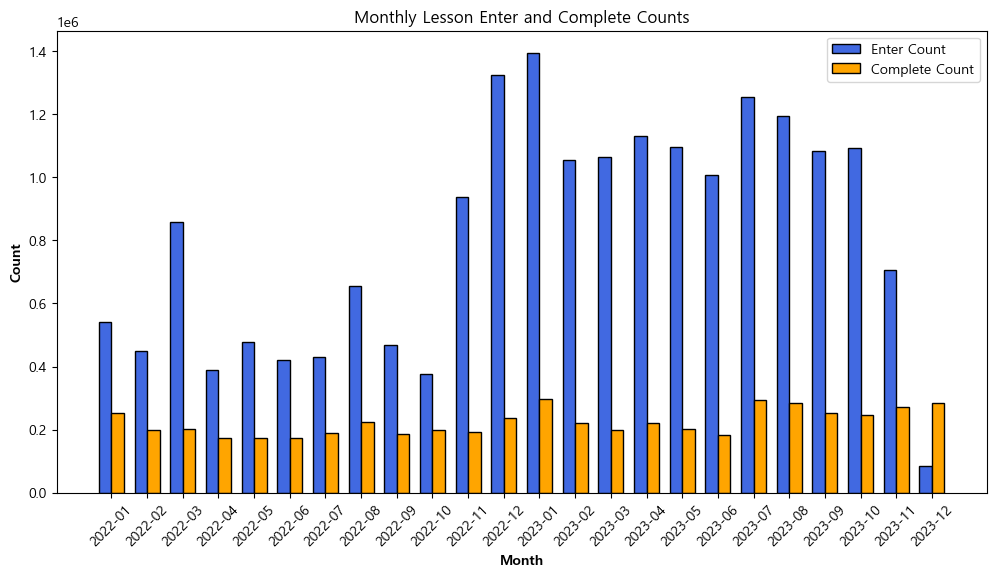

In [24]:
# 데이터프레임 병합
merged_df = pd.merge(monthly_users_enter_lesson, monthly_users_complete_lesson, on='month')

# 플롯그리기
fig, ax = plt.subplots(figsize=(12, 6))

# 바 넓이 설정
bar_width = 0.35

# Set the positions of the bars on the x-axis
r1 = range(len(merged_df['month']))
r2 = [x + bar_width for x in r1]

# 바 그리기
ax.bar(r1, merged_df['enter_count'], color='royalblue', width=bar_width, edgecolor='black', label='Enter Count')
ax.bar(r2, merged_df['complete_count'], color='orange', width=bar_width, edgecolor='black', label='Complete Count')

# 라벨 붙이기
ax.set_xlabel('Month', fontweight='bold')
ax.set_ylabel('Count', fontweight='bold')
ax.set_title('Monthly Lesson Enter and Complete Counts')
ax.set_xticks([r + bar_width/2 for r in range(len(merged_df['month']))])
ax.set_xticklabels(merged_df['month'], rotation=45)

# 레전드 붙이기
ax.legend()

# 그래프 그리기
plt.show()

In [25]:
# 할당 해제
del df_lesson_page, df_complete_lesson, monthly_users_enter_lesson, monthly_users_complete_lesson, merged_df

#### 완강율 그룹 확인해보기

In [26]:
# 데이터 셋 불러오기
df_lesson_page = datasets.enter.lesson_page()
df_complete_lesson = datasets.complete.lesson()

c:\Users\soom0\OneDrive\바탕 화면\정수민\코드잇\스프린트 미션\프로젝트 2\intermediate_project\intermediate_project\datasets.py:132: DtypeWarning: Columns (10,12) have mixed types. Specify dtype option on import or set low_memory=False.
  return pd.read_csv(file_path)


In [27]:
# lesson_id별로 count 계산
lesson_page_counts = df_lesson_page.groupby('lesson_id')['user_id'].size().reset_index(name='enter_count')
complete_lesson_counts = df_complete_lesson.groupby('lesson_id')['user_id'].size().reset_index(name='complete_count')

# Lesson_id별 Frequency 파악하기
merged_df = pd.merge(lesson_page_counts,complete_lesson_counts, on='lesson_id',how='outer')

In [28]:
print(merged_df.shape)
merged_df = merged_df.fillna(0)

# 0인 케이스에 대응하기 위해 분자와 분모에 1씩 더해서 나누기.
merged_df['complete/enter'] = round((merged_df['complete_count']+1) / (merged_df['enter_count']+1) * 100, 2)

(5488, 3)


complete/enter_group
0-10       317
10-20     1110
20-30      768
30-40     1249
40-50     1330
50-60      207
60-70       56
70-80       56
80-90       64
90-100      69
100+       262
Name: count, dtype: int64

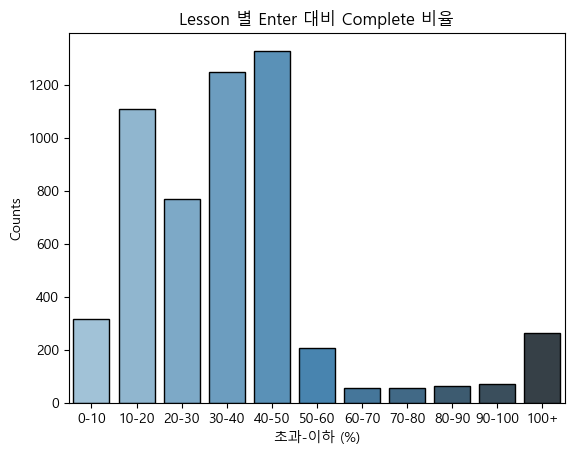

In [29]:
# complete/enter를 0~10, 10~20, ..., 100 이상으로 분할
bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, float('inf')]
labels = ['0-10', '10-20', '20-30', '30-40', '40-50', '50-60', '60-70', '70-80', '80-90', '90-100', '100+']
merged_df['complete/enter_group'] = pd.cut(merged_df['complete/enter'], bins=bins, labels=labels, right=True)

# 각 그룹에 몇 개의 행들이 포함되어 있는지 count
group_counts = merged_df['complete/enter_group'].value_counts().sort_index()

# 결과 출력
display(group_counts)

# 바 그래프 그리기
sns.barplot(x=group_counts.index, y=group_counts.values, hue=group_counts.index, legend=False, palette='Blues_d', edgecolor='black')

plt.title("Lesson 별 Enter 대비 Complete 비율")
plt.ylabel("Counts")
plt.xlabel("초과-이하 (%)")
# 그래프 그리기
plt.show()

del group_counts

In [30]:
# 할당 해제
del df_lesson_page, df_complete_lesson, merged_df, lesson_page_counts, complete_lesson_counts

#### 컨텐츠 중심 살펴보기

In [31]:
# start.content와 end.content csv 파일 읽어오기
start_content = datasets.start.content()
end_content = datasets.end.content()

start_content = start_content[['user_id','content_id','event_type','client_event_time']]
end_content = end_content[['user_id','content_id','event_type','client_event_time']]

# user_id와 content_id를 기준으로 시작시간과 완료시간을 구하기
start_content['client_event_time'] = pd.to_datetime(start_content['client_event_time'])
end_content['client_event_time'] = pd.to_datetime(end_content['client_event_time'])

# 시작시간과 완료시간을 병합
merged_content = pd.merge(start_content, end_content, on=['user_id','content_id'], how='left', suffixes=('_start', '_end'))
merged_content = merged_content.sort_values(by=['user_id','client_event_time_start'])

# 결과 출력
display(merged_content.sort_values(by=['user_id','client_event_time_start']))

,user_id,content_id,event_type_start,client_event_time_start,event_type_end,client_event_time_end
40866,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,start.content,2023-03-19 00:45:24.384,NaN,NaT
7600,0000572f2ba8079bcefd2760b632e820,f4be1a0fe0e301b03115591777fddf29,start.content,2023-03-19 01:49:45.361,end.content,2023-04-08 14:22:02.268
12559,0000572f2ba8079bcefd2760b632e820,f491517f4737a60d661cd1fcacc702c0,start.content,2023-04-08 14:22:18.010,NaN,NaT
41304,000087537cbfd934375364218ff10f91,61b6463287573f00de13a930805a52d6,start.content,2023-03-27 14:14:11.273,NaN,NaT
6321,000087537cbfd934375364218ff10f91,445fac33232adcb3d1cdab7d8a579430,start.content,2023-04-01 20:43:07.425,NaN,NaT
...,...,...,...,...,...,...
6619,fffe529de03d6187ef7ed765650c8d2b,621c7ad99b17d2d16832b618d47aea7e,start.content,2023-06-12 07:51:57.794,NaN,NaT
68415,fffe529de03d6187ef7ed765650c8d2b,c269eb6df3a374b464f7c18f12fa398f,start.content,2023-08-07 13:13:59.462,end.content,2023-09-27 13:34:57.287
103907,fffe529de03d6187ef7ed765650c8d2b,f6f082e10dc9c1061cb809989b361d9c,start.content,2023-08-15 14:59:50.503,NaN,NaT
70245,fffe529de03d6187ef7ed765650c8d2b,e5007dcd8de20c69465c3aa6b5189a13,start.content,2023-10-02 14:31:16.033,end.content,2023-10-02 16:19:48.001


In [32]:
# 시간 차이 계산
try:
    merged_content['time_diff'] = merged_content['client_event_time_end'] - merged_content['client_event_time_start']
except:
    merged_content['time_diff'] = None

# 평균 컨텐츠 수료 시간
merged_content.time_diff.mean()

Timedelta('11 days 22:07:09.830171987')

In [33]:
merged_content.head(3)

,user_id,content_id,event_type_start,client_event_time_start,event_type_end,client_event_time_end,time_diff
40866,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,start.content,2023-03-19 00:45:24.384,NaN,NaT,NaT
7600,0000572f2ba8079bcefd2760b632e820,f4be1a0fe0e301b03115591777fddf29,start.content,2023-03-19 01:49:45.361,end.content,2023-04-08 14:22:02.268,20 days 12:32:16.907000
12559,0000572f2ba8079bcefd2760b632e820,f491517f4737a60d661cd1fcacc702c0,start.content,2023-04-08 14:22:18.010,NaN,NaT,NaT


In [34]:
# 다음 콘텐츠 시작 시간 계산
merged_content['next_start_time'] = merged_content.groupby('user_id')['client_event_time_start'].shift(-1)

# 콘텐츠 완료 시간과 다음 콘텐츠 시작 시간의 차이 계산
merged_content['time_to_next_start'] = merged_content['next_start_time'] - merged_content['client_event_time_end']

# 컨텐츠 완료 전에 다른 컨텐츠를 시작하는 경우를 제외하고자, 차이값을 0초과로 필터링
print("컨텐츠 수료후 다음 컨텐츠 시작까지의 평균 소요 기간")
print(merged_content.loc[merged_content['time_to_next_start'] > pd.Timedelta(0) ,'time_to_next_start'].mean())
merged_content.head(3)

컨텐츠 수료후 다음 컨텐츠 시작까지의 평균 소요 기간
3 days 13:31:27.803507565


,user_id,content_id,event_type_start,client_event_time_start,event_type_end,client_event_time_end,time_diff,next_start_time,time_to_next_start
40866,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,start.content,2023-03-19 00:45:24.384,NaN,NaT,NaT,2023-03-19 01:49:45.361,NaT
7600,0000572f2ba8079bcefd2760b632e820,f4be1a0fe0e301b03115591777fddf29,start.content,2023-03-19 01:49:45.361,end.content,2023-04-08 14:22:02.268,20 days 12:32:16.907000,2023-04-08 14:22:18.010,0 days 00:00:15.742000
12559,0000572f2ba8079bcefd2760b632e820,f491517f4737a60d661cd1fcacc702c0,start.content,2023-04-08 14:22:18.010,NaN,NaT,NaT,NaT,NaT


In [35]:
# 할당해제
del merged_content, start_content, end_content

#### 일자별로 본 complete_lesson

In [36]:
# 데이터 로드
complete_lesson = datasets.complete.lesson()

In [37]:
# 일자별 활성화(complete_lesson 기록이 존재하는) unique 유저의 수
complete_lesson['client_event_time'] = pd.to_datetime(complete_lesson['client_event_time'])
print(complete_lesson.resample('D', on='client_event_time')['user_id'].nunique())

client_event_time
2022-01-01    354
2022-01-02    511
2022-01-03    787
2022-01-04    780
2022-01-05    794
             ... 
2023-12-27    905
2023-12-28    993
2023-12-29    878
2023-12-30    808
2023-12-31    797
Freq: D, Name: user_id, Length: 730, dtype: int64


In [38]:
# 일자별 유저들이 수강하는 lesson의 수
complete_lesson['day'] = complete_lesson['client_event_time'].dt.strftime('%Y-%m-%d')
df = complete_lesson.groupby(['day','user_id'])['lesson_id'].nunique()
df.reset_index()

,day,user_id,lesson_id
0,2022-01-01,00b36040cd9f2a92f8cc5ac6badafbca,11
1,2022-01-01,0138b3600a07ff6576870669414223ae,8
2,2022-01-01,01bf4162685cae3c638fddbb30e29711,25
3,2022-01-01,02af2404029ab25593da0129163064d1,8
4,2022-01-01,0341258a32dff7193e121a1f05d0ba91,9
...,...,...,...
464545,2023-12-31,fe41f67d71cb9f20ecf541c62ded93f4,2
464546,2023-12-31,fe551a948c862c220158e34d3bc2bc47,3
464547,2023-12-31,fe5aadc78094de8a7d1d25ebf44229e6,3
464548,2023-12-31,ff899a7b6dda0e439e8f361177917ff2,5


In [39]:
# 각 일자별로 n개의 레슨을 들은 유저의 수
df2 = df.reset_index().groupby(['day','lesson_id'])['user_id'].nunique()
graph_data = df2.reset_index()
graph_data

,day,lesson_id,user_id
0,2022-01-01,1,37
1,2022-01-01,2,37
2,2022-01-01,3,25
3,2022-01-01,4,24
4,2022-01-01,5,24
...,...,...,...
43909,2023-12-31,118,1
43910,2023-12-31,127,1
43911,2023-12-31,128,1
43912,2023-12-31,159,1


          day  lesson_id  user_id lesson_id_bin
0  2022-01-01          1       37           1~2
1  2022-01-01          2       37           1~2
2  2022-01-01          3       25           3~4
3  2022-01-01          4       24           3~4
4  2022-01-01          5       24           5~6


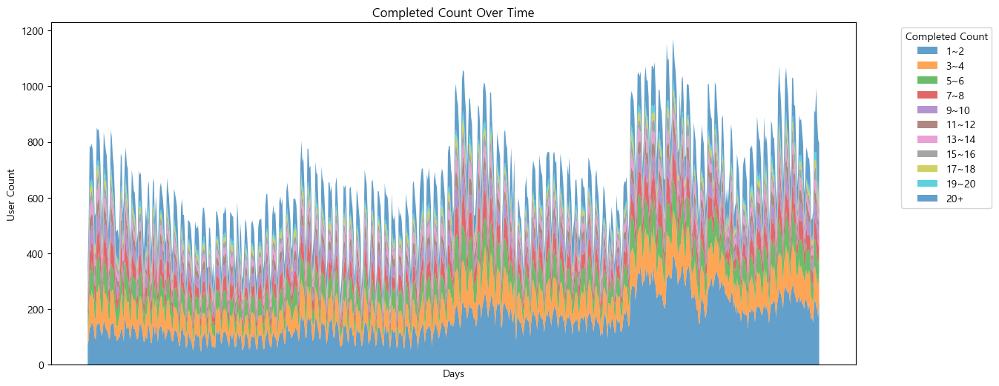

In [40]:
# lesson_id를 1부터 20, 20이상 총 11개의 bin으로 분할
bins = list(range(1, 22,2)) + [float('inf')]
labels = [f'{i}~{i+1}' for i in range(1, 20,2)] + ['20+']

graph_data['lesson_id_bin'] = pd.cut(graph_data['lesson_id'], bins=bins, labels=labels, right=False)

# 결과 출력
print(graph_data.head())

graph_data2 = graph_data.groupby(['day','lesson_id_bin'])['user_id'].sum().reset_index()
pivot_df = graph_data2.pivot(index='day', columns='lesson_id_bin', values='user_id').fillna(0)

plt.figure(figsize=(14, 6))
plt.stackplot(pivot_df.index, pivot_df.T, labels=pivot_df.columns, alpha=0.7)

plt.title('Completed Count Over Time')
plt.xlabel('Days')
plt.ylabel('User Count')
plt.legend(title='Completed Count')
plt.xticks([])
plt.legend(title='Completed Count', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

del graph_data2, pivot_df

In [41]:
# 할당 해제
del df, df2, graph_data, complete_lesson

#### Refferal

In [42]:
# 데이터 읽어오기
review = datasets.click.content_page_more_review_button()
start = datasets.start.content()

start['client_event_time'] = pd.to_datetime(start['client_event_time'])
start = start[['client_event_time','event_type','user_id','content_id']]
review['client_event_time'] = pd.to_datetime(review['client_event_time'])
review = review[['client_event_time','event_type','user_id','content_id']]

start.head(3)
review.head(3)

,client_event_time,event_type,user_id,content_id
0,2023-04-10 23:10:01.402,click.content_page_more_review_button,558fe7e8c06b8505f11b33d76f076e56,a1eeebeb6c307641b75b94a2a1d5b9aa
1,2023-01-25 06:37:43.417,click.content_page_more_review_button,e48956538e4df690a5d12adf1e6f2ee3,f491517f4737a60d661cd1fcacc702c0
2,2023-01-31 23:44:16.897,click.content_page_more_review_button,e745da89019e303b122bfceac0521a8f,9aa7628a347707fb155943041e2cb524


In [43]:
df = pd.concat([start,review],axis=0)
print("start한 컨텐츠 중, more _review를 본 유저와 컨텐츠 묶음")
display(df.groupby(['user_id','content_id'])['event_type'].nunique().value_counts())

start한 컨텐츠 중, more _review를 본 유저와 컨텐츠 묶음


event_type
1    127277
2       914
Name: count, dtype: int64

In [44]:
# user_id가 click_content_review를 했다면 1, content를 start했다면 1을 각각의 컬럼을 생성해서 기록. 하지 않았다면 0으로 기록

# click_content_review 여부를 기록하는 컬럼 생성
review['click_content_review'] = 1
start['start_content'] = 1

# user_id와 content_id를 기준으로 병합
df_combined = pd.merge(start, review, on=['user_id', 'content_id'], how='outer')

# 결측값을 0으로 채움
df_combined['click_content_review'] = df_combined['click_content_review'].fillna(0)
df_combined['start_content'] = df_combined['start_content'].fillna(0)
df_combined.dropna(subset=['user_id'], inplace=True)
# 결과 출력
df_combined[['user_id', 'content_id', 'click_content_review', 'start_content']]

,user_id,content_id,click_content_review,start_content
0,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,0.0,1.0
1,0000572f2ba8079bcefd2760b632e820,f491517f4737a60d661cd1fcacc702c0,0.0,1.0
2,0000572f2ba8079bcefd2760b632e820,f4be1a0fe0e301b03115591777fddf29,0.0,1.0
3,000087537cbfd934375364218ff10f91,0ab2b890d4068c1490b89676773256f6,0.0,1.0
4,000087537cbfd934375364218ff10f91,445fac33232adcb3d1cdab7d8a579430,0.0,1.0
...,...,...,...,...
134649,fffe529de03d6187ef7ed765650c8d2b,f491517f4737a60d661cd1fcacc702c0,0.0,1.0
134650,fffe529de03d6187ef7ed765650c8d2b,f4be1a0fe0e301b03115591777fddf29,0.0,1.0
134651,fffe529de03d6187ef7ed765650c8d2b,f6f082e10dc9c1061cb809989b361d9c,0.0,1.0
134652,fffe529de03d6187ef7ed765650c8d2b,f8b0ca043f5f0437603142ae93e6a424,0.0,1.0


In [45]:
# 독립변수: 컨텐츠 리뷰 보기
# 종속변수: 컨텐츠 시작하기
X = sm.add_constant(df_combined['click_content_review'])
y = df_combined['start_content']

# 로지스틱 회귀 모델 적합
logit_model = sm.Logit(y, X)
result = logit_model.fit()

# 결과 출력
print(result.summary())
del logit_model, result, y, X

         Current function value: 0.025930
         Iterations: 35


c:\Users\soom0\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                           Logit Regression Results                           
Dep. Variable:          start_content   No. Observations:               134654
Model:                          Logit   Df Residuals:                   134652
Method:                           MLE   Df Model:                            1
Date:                Wed, 12 Mar 2025   Pseudo R-squ.:                  0.8993
Time:                        11:39:42   Log-Likelihood:                -3491.6
converged:                      False   LL-Null:                       -34664.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   28.9411   5468.815      0.005      0.996   -1.07e+04    1.07e+04
click_content_review   -31.1321   5468.815     -0.006      0.995   -1.07e+04    1.07e+04

Possibly co

In [46]:
# 결과 해석
# 설명력은 0.9로 예측가능하지만, review를 클릭한 것의 상관계수는 -31로, review를 본 것과 오히려 음의 상관관계가 나타남.
# 이에 대한 해석으로, 듣고자 하는 다양한 컨텐츠들을 리뷰를 통해 살펴보는 사람은 있으나, 이 리뷰 진입이 잠재적인 흥미를 나타낼지언정 컨텐츠 시작과 긍적적으로 연결지어지지는 않는다는 것.
# 추가로 리뷰가 긍적적인 내용인지 부정적인 내용인지, 평점과 같은 세부 정보는 존재하지 않아서 추가 분석 진행은 어렵다고 판단.

In [47]:
del df_combined, start, review, df

### 메인 분석

#### 1. 콘텐츠 시작해놓고놓고 레슨 하나도 안듣고 컨텐츠 탓탓

In [48]:
# 데이터 불러오기
df_complete_signup = datasets.complete.signup()
df_start_content = datasets.start.content()
df_end_content = datasets.end.content()
df_complete_lesson = datasets.complete.lesson()
df_complete_subs = datasets.complete.subscription()
df_cancel = datasets.click.cancel_plan_button()

In [49]:
# 신규 회원 리스트
signup_list = df_complete_signup['user_id'].unique()

# 레슨 컴플릿 회원 리스트
complete_lesson_list = df_complete_lesson['user_id'].unique()

# 필요한 컬럼 설정, 신규 회원 한정 분석
df_start_content = df_start_content[['client_event_time','user_id','content_id','content_difficulty']]

# 신규회원 이면서, complete_lesson에 기록은 없는 유저
df_start_content = df_start_content.loc[(df_start_content['user_id'].isin(signup_list)) & (~df_start_content['user_id'].isin(complete_lesson_list))]

# 게으른 수강생 = 컨텐츠 시작 후 레슨 컴플릿이 없는 유저군
# 동시에 구독은 한 유저
lesson_lazy = df_start_content.user_id.unique()

# 게으른 수강생임과 동시에 구독을 했으나, 취소를 한 유저
lazy_paid_user = df_complete_subs.loc[df_complete_subs['user_id'].isin(lesson_lazy),'user_id'].unique()

# 취소도 안 한 유저
lazy_paid_user_notcanceled = df_cancel.loc[~df_cancel['user_id'].isin(lazy_paid_user),'user_id'].unique()


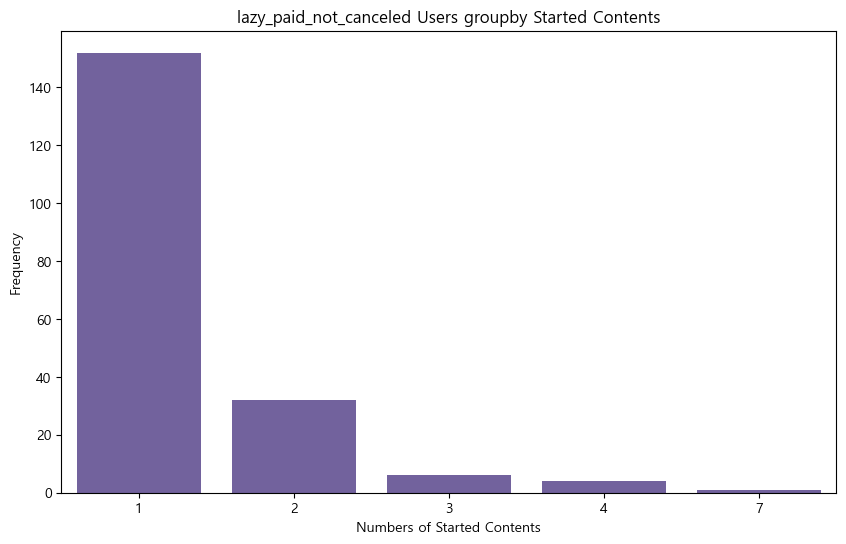

In [50]:

# 취소도 안 한 + 게으른 수강생들이 들은 컨텐츠의 수
graph = df_start_content.loc[df_start_content['user_id'].isin(lazy_paid_user_notcanceled)].groupby('user_id')['content_id'].nunique().sort_values()

# 그래프 데이터 준비
graph_data = graph.value_counts().sort_index()

# 시각화
plt.figure(figsize=(10, 6))
sns.barplot(x=graph_data.index, y=graph_data.values, color='#6e58a7')
plt.xlabel('Numbers of Started Contents')
plt.ylabel('Frequency')
plt.title('lazy_paid_not_canceled Users groupby Started Contents')
plt.show()

del graph_data

In [51]:
# 할당 해제
del df_complete_signup, df_complete_lesson, df_start_content, df_end_content, df_complete_subs, df_cancel

#### 2. 내가 나쁜게 아니라 콘텐츠가 나쁜거야!

1. 전체 유저군 대상 17만명    
2. 중복 기록에 대해서, 우선적으로 분 단위가 동일한 유저+컨텐츠 기록은 중복으로 판단하여 제거
3. 이탈률 정의 : 30일 이상 lesson_complete 가 안찍힌 유저

In [52]:
# 이탈율 계산하기
## complete_lesson 불러와서, 데이터 중복 처리 함수 수행
complete_lesson = datasets.complete.lesson()
complete_lesson = duplicated_data_processing(complete_lesson)

## complete lesson에서 각 user_id가 마지막으로 기록된 complete
last_completion_history = complete_lesson.sort_values(by='client_event_time').drop_duplicates(subset='user_id', keep='last')

last_completion_history['bounce_time'] = last_completion_history['client_event_time'] + pd.Timedelta(days=30)

## 이탈시점 (bounce_time)이 2024년 이후인 경우, 데이터 수집 범위상 이탈이라고 볼 수 없으므로, None으로 변경
last_completion_history.loc[last_completion_history['bounce_time'].dt.year == 2024,'bounce_time'] = None

lesson_id 대해서 초단위 중복 제거


In [53]:
start_content = datasets.start.content()
end_content = datasets.end.content()

start_content = duplicated_data_processing(start_content)
end_content = duplicated_data_processing(end_content)

content_id에 대해서 초단위 중복 제거
content_id에 대해서 초단위 중복 제거


In [54]:
# Start - End 연결
merged_df = pd.merge(
    start_content[['user_id','content_id','client_event_time','city']],
    end_content[['user_id','content_id','client_event_time','city']],
    on=['user_id','content_id'],
    how='left',
    suffixes=('_start','_end'),
    )
# 시간순으로 정렬
merged_df = merged_df.sort_values(['client_event_time_start','client_event_time_end'])

# end가 없는 경우만 필터링 (데이터 수 줄여서 작업하기)
not_end_content_df = merged_df.loc[merged_df['client_event_time_end'].isna()]

In [55]:
# not_end_content_df 와 complete_lesson을 연결
merged_df2 = pd.merge(
    not_end_content_df[['user_id','content_id','client_event_time_start']],
    complete_lesson[['user_id','content_id','lesson_id','client_event_time']],
    on=['user_id','content_id'],
    how='left',
    suffixes=('_content','_complete_lesson'))

# 시간순으로 정렬
merged_df2 = merged_df2.sort_values(['client_event_time_start','client_event_time'])

# 종료하지 않은 컨텐츠에 대해서 Lesson Complete 기록이 1개도 없는 컨텐츠를 가진 uesr_id
lazy_list = merged_df2.loc[merged_df2['lesson_id'].isna()].user_id.unique()

# 종료하지 않은 컨텐츠에 대해서 Lesson Complete 기록이 일부라도 있는 user_id
not_all_lazy = merged_df2.loc[(merged_df2['user_id'].isin(lazy_list)) & (~merged_df2['lesson_id'].isna())].user_id.unique()

# 종료하지 않은 모든 컨텐츠에 대해서 하나의 lesson complete도 없는 super_lazy

# 차집합 연산
super_lazy_list = np.setdiff1d(lazy_list, not_all_lazy)

In [56]:
print(f'''
종료하지 않은 컨텐츠에 대해서 Lesson Complete 기록이 1개도 없는 컨텐츠를 가진 uesr_id의 수 : {len(lazy_list)}
종료하지 않은 컨텐츠에 대해서 Lesson Complete 기록이 일부라도 있는 user_id의 수: {len(not_all_lazy)}
종료하지 않은 모든 컨텐츠에 대해서 하나의 lesson complete도 없는 user_id의 수: {len(super_lazy_list)}
''')


종료하지 않은 컨텐츠에 대해서 Lesson Complete 기록이 1개도 없는 컨텐츠를 가진 uesr_id의 수 : 15321
종료하지 않은 컨텐츠에 대해서 Lesson Complete 기록이 일부라도 있는 user_id의 수: 4982
종료하지 않은 모든 컨텐츠에 대해서 하나의 lesson complete도 없는 user_id의 수: 10339



In [57]:
# 시작하지 않은 레슨에 대한 complete 기록이 있을까?
complete_lesson.loc[complete_lesson['user_id'].isin(super_lazy_list)]

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,user_id,content_id,lesson_id
3675035,Jung-gu,2022-01-01 09:00:01.181,South Korea,Mac,Mac,complete.lesson,Korean,Chrome,47c0c5284ff7f86a5ac16a3e6e07593b,afe201c04b426366e0f8e9e2207c78c2,3c8bd57fe0f9ad2ffc626459d1c49a12
3027803,Jung-gu,2022-01-01 10:17:51.086,South Korea,Mac,Mac,complete.lesson,Korean,Chrome,47c0c5284ff7f86a5ac16a3e6e07593b,afe201c04b426366e0f8e9e2207c78c2,dabfc3d9f23660a6d77e21421d3c10d5
2528718,Jung-gu,2022-01-01 11:21:57.191,South Korea,Mac,Mac,complete.lesson,Korean,Chrome,47c0c5284ff7f86a5ac16a3e6e07593b,e543c38ec7fa6bcd5045049ecc31e5f8,913b610ffdd068fb372859c3a40b7582
1879355,Jung-gu,2022-01-01 12:15:04.041,South Korea,Mac,Mac,complete.lesson,Korean,Chrome,47c0c5284ff7f86a5ac16a3e6e07593b,e543c38ec7fa6bcd5045049ecc31e5f8,3ffe84cf86eb1a1a8062694582b40eb7
1879374,Mokpo,2022-01-01 12:42:45.845,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,ae3a1f50fd9e327592aa783dab688abc,f4be1a0fe0e301b03115591777fddf29,633d1b30ed699e261ea338ad28952338
...,...,...,...,...,...,...,...,...,...,...,...
5222192,NaN,2023-12-31 23:15:46.653,NaN,NaN,NaN,complete.lesson,NaN,NaN,78226be50aec4752f731620672ad5e30,f4be1a0fe0e301b03115591777fddf29,d6f17f978215b9746ea664d93c3f3d43
5222193,NaN,2023-12-31 23:16:25.737,NaN,NaN,NaN,complete.lesson,NaN,NaN,78226be50aec4752f731620672ad5e30,f4be1a0fe0e301b03115591777fddf29,9076881d7173085ad3967fc5236853cc
5222194,NaN,2023-12-31 23:21:19.908,NaN,NaN,NaN,complete.lesson,NaN,NaN,78226be50aec4752f731620672ad5e30,f4be1a0fe0e301b03115591777fddf29,23d6d66e597b8fb0a706fb0cd12234d6
5222195,NaN,2023-12-31 23:21:58.053,NaN,NaN,NaN,complete.lesson,NaN,NaN,78226be50aec4752f731620672ad5e30,f4be1a0fe0e301b03115591777fddf29,4b6cc370e587d711780ed4591634d443


In [58]:
## 이탈 시점 병합하기

merged_df3 = pd.merge(
    merged_df,
    last_completion_history[['user_id','bounce_time']],
    on='user_id',
    how='left',
    suffixes=('_complete_lesson','_last_completion'))

print(merged_df3.shape)
display(merged_df3.head(3))
merged_df3['time_diff'] = merged_df3['client_event_time_end'] - merged_df3['client_event_time_start']

# 유저 개개인의 컨텐츠 수료 기간 평균
merged_df3.groupby('content_id')['time_diff'].mean().sort_values().reset_index()


(124952, 7)


,user_id,content_id,client_event_time_start,city_start,client_event_time_end,city_end,bounce_time
0,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12.230,Gwanak-gu,2022-08-18 16:00:41.457,Yongsan-gu,2023-12-27 15:27:24.206
1,c6138487987cd76c010ca0c9d172a84f,711579bdebbf6540613290ebc8fbd3fc,2022-08-17 16:12:14.374,NaN,2022-08-17 16:54:15.785,NaN,2022-09-16 16:54:15.720
2,0f62ee1034d8505f9e05fc3a1d7f04d2,ff7998135d650dbefb3f479c900cbcc7,2022-08-17 16:14:49.759,Seoul,2022-08-27 15:10:06.156,Seoul,NaT


,content_id,time_diff
0,16c90877db6d303e295cb27e74f55050,0 days 00:05:50.390000
1,7f3710876a1f7e774c5c39220bdb82d5,0 days 00:20:50.881000
2,fc6a9e04f693ea724c55153d1ae82c65,0 days 00:48:48.410000
3,6c1ab2ac2b70a203dad068301a9152a4,0 days 01:04:43.208021739
4,ed88bded4d552a42b70b65cf09e3943a,0 days 01:26:23.993250
...,...,...
146,ebd394bf186858e4b48ec05b539f7cc5,NaT
147,f131e2fc518ebc882b8ae4741e19b1f1,NaT
148,f51431e7311301cc311c3c572ecf2c1e,NaT
149,f6eddcdd83091c4ab623903786fe9c34,NaT


In [59]:
# 완료되지 못한 컨텐츠 중.. 이탈자의 마지막 컨텐츠인 경우
# 이 컨텐츠를 끝으로, 사람들이 많이 이탈한다?
test_df = merged_df3.loc[merged_df3['client_event_time_end'].isna()]
test_df = test_df.loc[test_df['client_event_time_start'] > (test_df['bounce_time'] - pd.Timedelta(days=31))]
test_df.groupby('content_id')['user_id'].nunique().sort_values(ascending=False).head(10)

content_id
f4be1a0fe0e301b03115591777fddf29    5551
61b6463287573f00de13a930805a52d6    3886
445fac33232adcb3d1cdab7d8a579430    1218
68a3658f1b936bfff3bd6960cd561b0a    1186
c269eb6df3a374b464f7c18f12fa398f     999
ca35d0138a7550f002f975310604a9b7     552
f491517f4737a60d661cd1fcacc702c0     456
595cb4bbfc83e683b0314ca1312cfbde     251
d6227ba76134f6cf821bb98b5f235bd0     248
b314d5aba64a0aab40602cb72a4a1504     217
Name: user_id, dtype: int64

In [60]:
# 할당 해제
del (
    test_df,
    merged_df3, merged_df2, merged_df,
    complete_lesson, start_content, end_content,
    not_end_content_df, last_completion_history, super_lazy_list, not_all_lazy, lazy_list, 
)

#### 3. 특정 시점에서의 이탈율...로 알아볼까?

In [61]:
# 데이터 로드 (사용자의 마지막 complete 기록 포함)
start_content = datasets.start.content()
end_content = datasets.end.content()
complete_lesson = datasets.complete.lesson()

start_content = duplicated_data_processing(start_content)
end_content = duplicated_data_processing(end_content)
complete_lesson = duplicated_data_processing(complete_lesson)

content_id에 대해서 초단위 중복 제거
content_id에 대해서 초단위 중복 제거
lesson_id 대해서 초단위 중복 제거


In [62]:
# start - end contents 병합
merged_df = pd.merge(
    start_content[['user_id','content_id','client_event_time']],
    end_content[['user_id','content_id','client_event_time']],
    on = ['user_id','content_id'],
    suffixes=('_start','_end'),
    how='left'
)
merged_df.head(3)

,user_id,content_id,client_event_time_start,client_event_time_end
0,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12.230,2022-08-18 16:00:41.457
1,c6138487987cd76c010ca0c9d172a84f,711579bdebbf6540613290ebc8fbd3fc,2022-08-17 16:12:14.374,2022-08-17 16:54:15.785
2,0f62ee1034d8505f9e05fc3a1d7f04d2,ff7998135d650dbefb3f479c900cbcc7,2022-08-17 16:14:49.759,2022-08-27 15:10:06.156


In [63]:
# start_content가 8월 17일 이후 기록이므로, complete_lesson의 기록도 제한.
complete_lesson = complete_lesson.loc[complete_lesson['client_event_time'] >= '2022-08-17'].sort_values(by='client_event_time',ascending=True)

In [64]:
# start-end-complete
merged_df2 = pd.merge(
    merged_df,
    complete_lesson[['user_id','content_id','lesson_id','client_event_time']],
    on = ['user_id','content_id'],
    suffixes=('_content','_complete_lesson'),
    how = 'left'
)
merged_df2.head(3)

,user_id,content_id,client_event_time_start,client_event_time_end,lesson_id,client_event_time
0,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12.230,2022-08-18 16:00:41.457,2ed4b83e65edc2b1efb193aaa3c60cf9,2022-08-17 16:19:08.709
1,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12.230,2022-08-18 16:00:41.457,db421b66bfd27eccd0e862e30b4de1be,2022-08-17 16:25:48.483
2,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12.230,2022-08-18 16:00:41.457,09c8a2d29087cb3d47823acb5f2705e3,2022-08-17 16:30:17.033


In [65]:
merged_df2 = merged_df2.sort_values(by=['client_event_time_start','client_event_time_end'],ascending=True)

In [66]:
# merged_df2 전처리

# merged_df2['client_event_time'] = merged_df2['client_event_time'] - pd.Timedelta(seconds=1)

merged_df2['client_event_time_start'] = merged_df2['client_event_time_start'].dt.strftime('%Y-%m-%d %H:%M:%S')
merged_df2['client_event_time_start'] = pd.to_datetime(merged_df2['client_event_time_start'])
merged_df2['client_event_time_end'] = merged_df2['client_event_time_end'].dt.strftime('%Y-%m-%d %H:%M:%S')
merged_df2['client_event_time_end'] = pd.to_datetime(merged_df2['client_event_time_end'])
merged_df2['client_event_time'] = merged_df2['client_event_time'].dt.strftime('%Y-%m-%d %H:%M:%S')
merged_df2['client_event_time'] = pd.to_datetime(merged_df2['client_event_time'])

In [67]:
# 아웃바운더리 여부 확인
merged_df2['is_outside_start_end'] = merged_df2.apply(
    lambda row: 1 if row['client_event_time'] < row['client_event_time_start'] or row['client_event_time'] > row['client_event_time_end'] else 0,
    axis=1
)

# 결과 확인
display(merged_df2[['user_id', 'content_id', 'client_event_time_start', 'client_event_time_end', 'client_event_time', 'is_outside_start_end']])

# 이상한 데이터 확인하기
merged_df2.loc[merged_df2.is_outside_start_end == 1].sort_values(['client_event_time_start','client_event_time_end','user_id','content_id'])

,user_id,content_id,client_event_time_start,client_event_time_end,client_event_time,is_outside_start_end
0,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12,2022-08-18 16:00:41,2022-08-17 16:19:08,0
1,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12,2022-08-18 16:00:41,2022-08-17 16:25:48,0
2,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12,2022-08-18 16:00:41,2022-08-17 16:30:17,0
3,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12,2022-08-18 16:00:41,2022-08-17 16:49:49,0
4,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12,2022-08-18 16:00:41,2022-08-17 17:03:20,0
...,...,...,...,...,...,...
2364291,8a01c8092d46749618e3d3a610a8825b,f4be1a0fe0e301b03115591777fddf29,2023-12-31 23:46:23,NaT,NaT,0
2364292,8a01c8092d46749618e3d3a610a8825b,f4be1a0fe0e301b03115591777fddf29,2023-12-31 23:47:09,NaT,NaT,0
2364294,926df494aebb5689996dacafaab0f00e,c8e53577758bf66711094352a5abd8c3,2023-12-31 23:51:43,NaT,2023-12-31 23:51:44,0
2364293,735f207da30919eafdb41672ffe60a7c,f64c475280676531a31f2f8e0648599c,2023-12-31 23:51:49,NaT,NaT,0


,user_id,content_id,client_event_time_start,client_event_time_end,lesson_id,client_event_time,is_outside_start_end
17,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12,2022-08-18 16:00:41,58a55a039ef52567cfe0821f92b3c9e6,2023-11-14 16:37:59,1
789,d2691bedf9ae0bc97a182e57361bdeb8,db43a841c994231e2795d4df8931af50,2022-08-17 18:23:59,2022-08-21 16:20:32,8e691fe79234147d56371958e02c095a,2022-08-21 16:23:22,1
790,d2691bedf9ae0bc97a182e57361bdeb8,db43a841c994231e2795d4df8931af50,2022-08-17 18:23:59,2022-08-21 16:20:32,8bc52caa371a1642b3c9024fb84eb3da,2022-08-21 16:23:40,1
791,d2691bedf9ae0bc97a182e57361bdeb8,db43a841c994231e2795d4df8931af50,2022-08-17 18:23:59,2022-08-21 16:20:32,b9a8a1bc33c25996244e5ba9b23f82d8,2022-08-21 16:24:09,1
792,d2691bedf9ae0bc97a182e57361bdeb8,db43a841c994231e2795d4df8931af50,2022-08-17 18:23:59,2022-08-21 16:20:32,17f09dbc78c010e2c151c29b4f802186,2022-08-21 16:25:37,1
...,...,...,...,...,...,...,...
2361567,310c7316dfc38f5c1cded37174d02e33,e88906bb19b773dcbf2adb5d34c49d9c,2023-12-31 01:49:54,2023-12-31 19:15:50,221c80203d4d08d248a9f2df5d7e4670,2023-12-31 19:15:51,1
2362093,f456d2560060e54231acd8f82bd6a31f,7102ec0223c06a3a14a7556274d86b7d,2023-12-31 11:26:16,2023-12-31 13:38:12,50319f76a58973d7a19c174f3f4a41e5,2023-12-31 11:26:15,1
2362419,8deb23021af4943a1832958e13b67030,a914987711c7e2db9fd4bff7555ec87c,2023-12-31 13:46:38,NaT,5a1ff0b618b1258b8a8d7671d8fa2957,2023-12-31 13:46:37,1
2362549,25bc8342d2c31ccbc22294d9171da0e4,ca35d0138a7550f002f975310604a9b7,2023-12-31 14:07:56,2023-12-31 15:56:48,1dfbb00cdb389d1cc93e16b0c815b74e,2023-12-31 15:56:49,1


In [68]:
# 유저가 컨텐츠 안에서 몇개의 레슨을 수강하는지 알아보기
display(merged_df2.groupby(['user_id','content_id'])['lesson_id'].nunique())

# 기간 내(2208~2312) 유저가 완료한 유니크 레슨 수
user_lesson_number = merged_df2.groupby(['user_id'])['lesson_id'].nunique()
user_lesson_number = user_lesson_number.reset_index().sort_values(by='lesson_id')
user_lesson_number

user_id                           content_id                      
0000572f2ba8079bcefd2760b632e820  61b6463287573f00de13a930805a52d6    11
                                  f491517f4737a60d661cd1fcacc702c0    17
                                  f4be1a0fe0e301b03115591777fddf29    15
000087537cbfd934375364218ff10f91  0ab2b890d4068c1490b89676773256f6     5
                                  445fac33232adcb3d1cdab7d8a579430     1
                                                                      ..
fffe529de03d6187ef7ed765650c8d2b  f491517f4737a60d661cd1fcacc702c0    44
                                  f4be1a0fe0e301b03115591777fddf29    15
                                  f6f082e10dc9c1061cb809989b361d9c     6
                                  f8b0ca043f5f0437603142ae93e6a424    13
ffffd8d78865a66cb3706977f29d1dec  f4be1a0fe0e301b03115591777fddf29     0
Name: lesson_id, Length: 124601, dtype: int64

,user_id,lesson_id
35540,d48c5ef938f7b502a74ea0c43178c2e7,0
33115,c6378245caf51b4cd39a86b389a2a50a,0
33109,c6273534deca087fdc06186d7d1fb34c,0
33108,c626a2c953c0da22595dfd41dd809e11,0
33105,c62304e69d8f9eccbb1a7df9b8e55f4b,0
...,...,...
16780,6421bf3808b89da97f316eac07da2b91,2531
6714,28068259a009cf16d0e19ae1896b1f22,2569
10829,40504dbd203dd148d1801171d04ceb5d,2708
34053,cc180eef3ffd3497eb8a575165bab389,3090


In [69]:
# 컴플릿 레슨 수로 본 각 그룹별 유저의 수
user_lesson_number.groupby('lesson_id')['user_id'].nunique()

lesson_id
0       9773
1       4280
2       2255
3       1548
4       1358
        ... 
2531       1
2569       1
2708       1
3090       1
3345       1
Name: user_id, Length: 988, dtype: int64

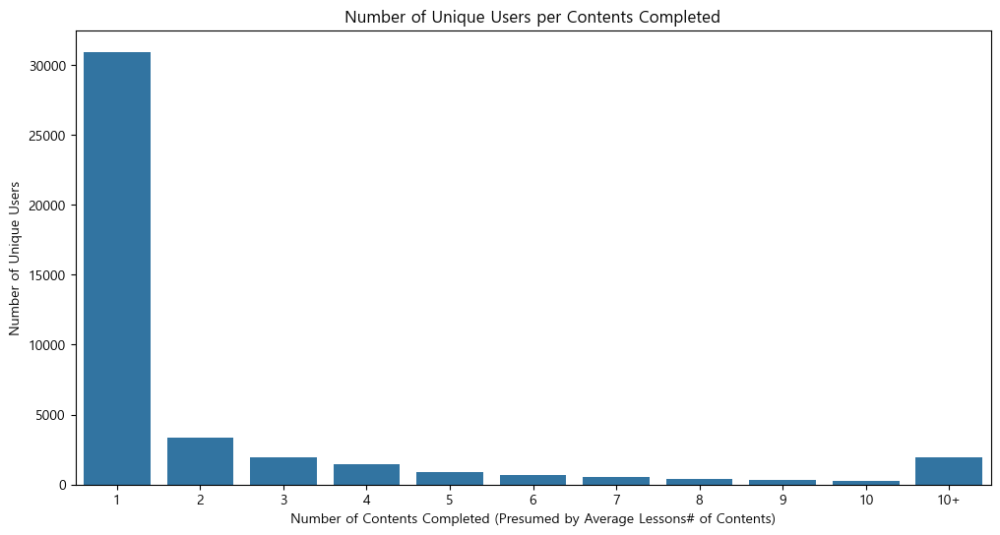

In [70]:
# 컴플릿 레슨 수로 본 각 그룹별 유저의 수 (그래프 데이터 준비)
lesson_user_counts = user_lesson_number.groupby('lesson_id')['user_id'].nunique()

# Cut the lesson_id into bins
bins = [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300,float('inf')]
labels = ['1', '2', '3', '4', '5', '6', '7', '8', '9','10','10+']
lesson_user_counts_binned = pd.cut(lesson_user_counts.index, bins=bins, labels=labels, right=False)
lesson_user_counts_binned = lesson_user_counts.groupby(lesson_user_counts_binned).sum()

# Plot the data
plt.figure(figsize=(12, 6))
sns.barplot(x=lesson_user_counts_binned.index, y=lesson_user_counts_binned.values)
plt.xlabel('Number of Contents Completed (Presumed by Average Lessons# of Contents)')
plt.ylabel('Number of Unique Users')
plt.title('Number of Unique Users per Contents Completed')
plt.show()

del (
    bins, labels,
    lesson_user_counts, lesson_user_counts_binned
)

In [71]:
# start_end_complete lesson 3개 재병합
merged_df3 = pd.merge(
    merged_df,
    complete_lesson[['user_id','lesson_id','client_event_time']],
    on = 'user_id',
    how='left'
)

# start 보다, complete이 이전에 존재하는 기록은 필터링ㅇ
merged_df3 = merged_df3[merged_df3['client_event_time_start'] <= merged_df3['client_event_time']]

# 컨텐츠 시작 시점으로 보는 이탈과, 레슨 컴플릿으로 보는 이탈 컬럼
merged_df3['start_bounce'] = merged_df3['client_event_time_start'] + pd.Timedelta(days=30)
merged_df3['complete_bounce'] = merged_df3['client_event_time'] + pd.Timedelta(days=30)

# 이탈을 의미하는 컬럼 추가
merged_df3['bounce'] = merged_df3.apply(
    lambda row: 1 if row['start_bounce'] > row['complete_bounce'] else 0,
    axis = 1
)
# 결과 확인
merged_df3.head(3)


,user_id,content_id,client_event_time_start,client_event_time_end,lesson_id,client_event_time,start_bounce,complete_bounce,bounce
0,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12.230,2022-08-18 16:00:41.457,2ed4b83e65edc2b1efb193aaa3c60cf9,2022-08-17 16:19:08.709,2022-09-16 16:11:12.230,2022-09-16 16:19:08.709,0
1,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12.230,2022-08-18 16:00:41.457,db421b66bfd27eccd0e862e30b4de1be,2022-08-17 16:25:48.483,2022-09-16 16:11:12.230,2022-09-16 16:25:48.483,0
2,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12.230,2022-08-18 16:00:41.457,09c8a2d29087cb3d47823acb5f2705e3,2022-08-17 16:30:17.033,2022-09-16 16:11:12.230,2022-09-16 16:30:17.033,0


In [72]:
# 각 유저의 start_content로 본 첫 활동 기록
start_timestamp = merged_df3.drop_duplicates(subset='user_id',keep='last')
end_timestamp = merged_df3.drop_duplicates(subset='user_id',keep='first')

# 해당 기록을 끝으로 이탈을 의미하는 is_end 컬럼 추가
start_timestamp['is_end'] = start_timestamp['client_event_time_end'].notnull().astype(int)
end_timestamp['is_end'] = end_timestamp['client_event_time_end'].notnull().astype(int)

# 결과 확인
start_timestamp.tail(5)
end_timestamp.tail(5)

C:\Users\soom0\AppData\Local\Temp\ipykernel_18336\821483743.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  start_timestamp['is_end'] = start_timestamp['client_event_time_end'].notnull().astype(int)
C:\Users\soom0\AppData\Local\Temp\ipykernel_18336\821483743.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  end_timestamp['is_end'] = end_timestamp['client_event_time_end'].notnull().astype(int)


,user_id,content_id,client_event_time_start,client_event_time_end,lesson_id,client_event_time,start_bounce,complete_bounce,bounce,is_end
34985551,c7354a8816f21c639075a541ba168aa6,f4be1a0fe0e301b03115591777fddf29,2023-12-31 23:04:26.235,NaT,b42c9bb32f5024900cbed7623eecd272,2023-12-31 23:07:41.042,2024-01-30 23:04:26.235,2024-01-30 23:07:41.042,0,0
34987029,091efd61d0af03336955df82fc60fc30,f4be1a0fe0e301b03115591777fddf29,2023-12-31 23:09:28.778,NaT,b42c9bb32f5024900cbed7623eecd272,2023-12-31 23:09:51.422,2024-01-30 23:09:28.778,2024-01-30 23:09:51.422,0,0
34987124,c2f379460037197dd941fd1fc2fc87f4,61b6463287573f00de13a930805a52d6,2023-12-31 23:14:24.589,NaT,2ed4b83e65edc2b1efb193aaa3c60cf9,2023-12-31 23:33:43.030,2024-01-30 23:14:24.589,2024-01-30 23:33:43.030,0,0
34987127,1ff17f878a119da197d7d28ca5fe4aa6,61b6463287573f00de13a930805a52d6,2023-12-31 23:23:47.276,NaT,2ed4b83e65edc2b1efb193aaa3c60cf9,2023-12-31 23:23:48.107,2024-01-30 23:23:47.276,2024-01-30 23:23:48.107,0,0
34987144,783e01211e03edc828d55baf6e08a256,5de7fab2b23da75a5538040b92095165,2023-12-31 23:30:52.206,NaT,436273cc4d2984147eca045628a314a0,2023-12-31 23:30:52.500,2024-01-30 23:30:52.206,2024-01-30 23:30:52.500,0,0


In [73]:
#기간 내 각 유저의 첫 컨텐츠와 마지막 컨텐츠 시작 시간
merged_df4 = pd.merge(
    start_timestamp[['user_id','client_event_time_start','is_end']],
    end_timestamp[['user_id','content_id','client_event_time_start','is_end']],
    how = 'outer',
    on = ['user_id'],
    suffixes=('_first','_last')
)
merged_df4.rename(columns={'client_event_time_start_first': 'start_first', 'client_event_time_start_last' : 'start_last','content_id':'content_id_last'}, inplace=True)
merged_df4['time_diff'] = merged_df4['start_last'] - merged_df4['start_first']

# 결과 확인
merged_df4.head(5)

,user_id,start_first,is_end_first,content_id_last,start_last,is_end_last,time_diff
0,0000572f2ba8079bcefd2760b632e820,2023-04-08 14:22:18.010,0,61b6463287573f00de13a930805a52d6,2023-03-19 00:45:24.384,0,-21 days +10:23:06.374000
1,000087537cbfd934375364218ff10f91,2023-05-01 19:31:15.918,0,61b6463287573f00de13a930805a52d6,2023-03-27 14:14:11.273,0,-36 days +18:42:55.355000
2,0001f15911b404f3bf5b8571afafa4e4,2023-11-30 11:35:37.133,0,f4be1a0fe0e301b03115591777fddf29,2023-11-22 21:50:00.941,1,-8 days +10:14:23.808000
3,0003b028a745bdfda9e88539424248af,2023-06-24 15:11:41.788,0,c269eb6df3a374b464f7c18f12fa398f,2023-06-24 15:11:41.788,0,0 days 00:00:00
4,000509014329002768958b9210789b4b,2023-09-15 02:24:18.795,0,61b6463287573f00de13a930805a52d6,2023-09-15 02:24:18.795,0,0 days 00:00:00


In [74]:
# last complete 기록 생성
sample_df = complete_lesson.sort_values(by='client_event_time',ascending=False).drop_duplicates(subset='user_id',keep='first')

# first_last content df와 last complete 기록 병합
merged_df5 = pd.merge(
    merged_df4,
    sample_df[['user_id','client_event_time']],
    on= 'user_id',
    how='left'
)
merged_df5.rename(columns={'client_event_time':'complete_last'},inplace=True)

# 최종적으로 이탈 여부를 확인
merged_df5['bounce_time'] = merged_df5['complete_last'] + pd.Timedelta(days=30)
merged_df5['bounce'] = merged_df5.apply(
    lambda row: 0 if row['bounce_time'].year == 2024 else 1,
    axis=1
)
# 결과 확인
merged_df5.head(5)

,user_id,start_first,is_end_first,content_id_last,start_last,is_end_last,time_diff,complete_last,bounce_time,bounce
0,0000572f2ba8079bcefd2760b632e820,2023-04-08 14:22:18.010,0,61b6463287573f00de13a930805a52d6,2023-03-19 00:45:24.384,0,-21 days +10:23:06.374000,2023-04-17 17:11:04.993,2023-05-17 17:11:04.993,1
1,000087537cbfd934375364218ff10f91,2023-05-01 19:31:15.918,0,61b6463287573f00de13a930805a52d6,2023-03-27 14:14:11.273,0,-36 days +18:42:55.355000,2023-05-01 20:18:27.781,2023-05-31 20:18:27.781,1
2,0001f15911b404f3bf5b8571afafa4e4,2023-11-30 11:35:37.133,0,f4be1a0fe0e301b03115591777fddf29,2023-11-22 21:50:00.941,1,-8 days +10:14:23.808000,2023-12-08 13:40:18.542,2024-01-07 13:40:18.542,0
3,0003b028a745bdfda9e88539424248af,2023-06-24 15:11:41.788,0,c269eb6df3a374b464f7c18f12fa398f,2023-06-24 15:11:41.788,0,0 days 00:00:00,2023-06-24 15:11:42.671,2023-07-24 15:11:42.671,1
4,000509014329002768958b9210789b4b,2023-09-15 02:24:18.795,0,61b6463287573f00de13a930805a52d6,2023-09-15 02:24:18.795,0,0 days 00:00:00,2023-09-15 02:24:19.380,2023-10-15 02:24:19.380,1


In [75]:
merged_df5.loc[merged_df5['bounce'] == 1,'time_diff'].mean()

Timedelta('-27 days +19:42:02.871095070')

In [76]:
# 할당 해제
del (
    merged_df5, merged_df4, merged_df3, merged_df2, merged_df,
    start_content, end_content, complete_lesson,
    sample_df, start_timestamp, end_timestamp, user_lesson_number
)

In [77]:
# 중단
# 이탈의 정의가 레슨 컴플릿 30일이 지나도록 더이상 기록되지 않는 경우라 정의했다.
# 이 경우, 컨텐츠 시작해놓고 레슨을 하나도 안들은 집단에 대한 분석과 정의적으로 겹치는 부분이 있다.
# 따라서 분석의 목표가 되는 " 이탈 위험군 파악 " 에는 도움이 되지 않는 접근방식이라 결정하고 방향을 바꾼다.

#### 4. 수강 중간 이탈 위험군 분석: start 한지 n일이 지나도록 end가 없는 유저 집단의 이탈률 비교

In [78]:
# 데이터 읽어오기
start_content = datasets.start.content()
end_content = datasets.end.content()
complete_lesson = datasets.complete.lesson()

start_content = duplicated_data_processing(start_content)
end_content = duplicated_data_processing(end_content)
complete_lesson = duplicated_data_processing(complete_lesson)

# 기간 설정
complete_lesson = complete_lesson.loc[complete_lesson['client_event_time'] >= '2022-08-17']
end_content = end_content.loc[end_content['client_event_time'] >= '2022-08-17']

content_id에 대해서 초단위 중복 제거
content_id에 대해서 초단위 중복 제거
lesson_id 대해서 초단위 중복 제거


In [79]:
# start_end 연결
merged_df = pd.merge(
    start_content[['user_id','content_id','client_event_time']],
    end_content[['user_id','content_id','client_event_time']],
    on = ['user_id','content_id'],
    how='left',
    suffixes=('_start','_end')
)
merged_df = merged_df.sort_values(by=['client_event_time_start','client_event_time_end','user_id','content_id'])

# 마지막 기록
last_completion_history = complete_lesson.sort_values(by='client_event_time',ascending=True).drop_duplicates(subset='user_id',keep='last')

# ※ NA 값을 채울것인가 말 것인가?
# merged_df['client_event_time_end'] = merged_df['client_event_time_end'].fillna('2024-01-01 00:00:00.000')

In [80]:
# start_end_last 기록 연결
merged_df2 = pd.merge(
    merged_df,
    last_completion_history[['user_id','content_id','client_event_time']],
    on=['user_id','content_id'],
    how='left'
)

# 컨텐츠 수료 기간 컬럼 추가
merged_df2['content_completion_period'] = merged_df2['client_event_time_end'] - merged_df2['client_event_time_start']

# 이탈 전 마지막 컨텐츠 판별 컬럼 초기화
merged_df2['is_last_content_before_bounce'] = 0

# 마지막 컴플리션 시간이 null이 아님 = 마지막임 = 이탈임
merged_df2.loc[merged_df2['client_event_time'].notnull(),'is_last_content_before_bounce'] = 1
merged_df2.loc[merged_df2['client_event_time_start'] > '2023-12-01','is_last_content_before_bounce'] = 0
merged_df2.drop(columns='client_event_time',inplace=True)

# 결과 
merged_df2.head(3)

,user_id,content_id,client_event_time_start,client_event_time_end,content_completion_period,is_last_content_before_bounce
0,9e50b5087acdbf4976aea376a0bca24c,61b6463287573f00de13a930805a52d6,2022-08-17 16:11:12.230,2022-08-18 16:00:41.457,0 days 23:49:29.227000,0
1,c6138487987cd76c010ca0c9d172a84f,711579bdebbf6540613290ebc8fbd3fc,2022-08-17 16:12:14.374,2022-08-17 16:54:15.785,0 days 00:42:01.411000,1
2,0f62ee1034d8505f9e05fc3a1d7f04d2,ff7998135d650dbefb3f479c900cbcc7,2022-08-17 16:14:49.759,2022-08-27 15:10:06.156,9 days 22:55:16.397000,0


In [81]:
unique_user_merged_df2 = merged_df2.groupby('user_id')[['content_completion_period','is_last_content_before_bounce']].mean().reset_index()
unique_user_merged_df2.head(3)

# bounce의 수치는, 그사람이 들은 이탈하기 전까지의 content의 개수를 역산할 수 있는 정보. 이를 0 과 1로 통일하는 코드
# unique_user_merged_df2.loc[unique_user_merged_df2['is_last_content_before_bounce'] > 0,'is_last_content_before_bounce'] = 1

,user_id,content_completion_period,is_last_content_before_bounce
0,0000572f2ba8079bcefd2760b632e820,20 days 12:32:16.907000,0.333333
1,000087537cbfd934375364218ff10f91,NaT,0.333333
2,0001f15911b404f3bf5b8571afafa4e4,3 days 18:47:54.410000,0.333333


In [82]:
unique_user_merged_df2['number_of_start_contents'] = np.where(
    unique_user_merged_df2['is_last_content_before_bounce'] == 0, np.nan,
    round(1 / unique_user_merged_df2['is_last_content_before_bounce'], 0)
)

# 이탈 전 까지 평균 start하는 컨텐츠의 수
print(unique_user_merged_df2.number_of_start_contents.mean())

3.4357218124341413


In [83]:
# 해당 컨텐츠를 끝으로 이탈한 경우 중, 컨텐츠를 수료한 경우의 비율
total_count = merged_df2.loc[merged_df2['is_last_content_before_bounce'] == 1].shape[0]
null_end_count = merged_df2.loc[merged_df2['is_last_content_before_bounce'] == 1,'content_completion_period'].isna().sum()
not_null_end_count = total_count - null_end_count

# 해당 컨텐츠를 마무리 하지 않은 케이스 중, 그것이 마지막인 경우의 비율
total_not_end_count = merged_df2.loc[merged_df2['content_completion_period'].isna()].shape[0]
not_end_bounce_count = merged_df2.loc[(merged_df2['content_completion_period'].isna()) & (merged_df2['is_last_content_before_bounce'] == 1)].shape[0]
not_end_but_not_bounce_count = total_not_end_count - not_end_bounce_count

# 완료 후 이탈한 경우의 비율
total_end_count = merged_df2.loc[~merged_df2['content_completion_period'].isna()].shape[0]
end_bounce_count = merged_df2.loc[(~merged_df2['content_completion_period'].isna()) & (merged_df2['is_last_content_before_bounce'] == 1)].shape[0]

# 컨텐츠 수강 start 경우에서 컨텐츠 수강 전후로 이탈한 비율
total_count_duration0 = merged_df2.shape[0]
bounce_count_duration0 = merged_df2.loc[merged_df2['is_last_content_before_bounce']==1].shape[0]

# content_completion_period가 7일 이상인 경우
duration1 = merged_df2.loc[(merged_df2['content_completion_period'] > '7days') | (merged_df2['content_completion_period'].isna())]
total_count_duration1 = duration1.shape[0]
bounce_count_duration1 = duration1.loc[duration1['is_last_content_before_bounce']==1].shape[0]
del duration1

# content_completion_period가 14일 이상인 경우
duration2 = merged_df2.loc[(merged_df2['content_completion_period'] > '14days') | (merged_df2['content_completion_period'].isna())]
total_count_duration2 = duration2.shape[0]
bounce_count_duration2 = duration2.loc[duration2['is_last_content_before_bounce']==1].shape[0]
del duration2

# content_completion_period가 30일 이상인 경우
duration3 = merged_df2.loc[(merged_df2['content_completion_period'] > '30days') | (merged_df2['content_completion_period'].isna())]
total_count_duration3 = duration3.shape[0]
bounce_count_duration3 = duration3.loc[duration3['is_last_content_before_bounce']==1].shape[0]

print(f'''
특정 컨텐츠를 끝으로 이탈한 경우 중, 해당 컨텐츠를 수료하지 않은 경우의 비율 : {null_end_count/total_count*100:.2f}%    
특정 컨텐츠를 마무리 하지 않은 경우 가운데, 해당 컨텐츠를 끝으로 이탈한 경우의 비율 : {not_end_bounce_count/total_not_end_count*100:.2f}%
특정 컨텐츠를 완료한 경우 중, 이탈한 비율 : { end_bounce_count / total_end_count*100:.2f}%

전체 기간에서 이탈한 경우 비율 : {bounce_count_duration0 / total_count_duration0*100:.2f}%
Duration1 에서 이탈한 경우 비율 : {bounce_count_duration1 / total_count_duration1*100:.2f}%
Duration2 에서 이탈한 경우 비율 : {bounce_count_duration2 / total_count_duration2*100:.2f}%
Duration3 에서 이탈한 경우 비율 : {bounce_count_duration3 / total_count_duration3*100:.2f}%
''')

# 할당 해제
del (
    bounce_count_duration0, bounce_count_duration1, bounce_count_duration3, bounce_count_duration2,
    total_count_duration0, total_count_duration1, total_count_duration2, total_count_duration3,
    total_count, null_end_count, not_null_end_count,
    total_not_end_count, not_end_but_not_bounce_count, not_end_bounce_count
)


특정 컨텐츠를 끝으로 이탈한 경우 중, 해당 컨텐츠를 수료하지 않은 경우의 비율 : 86.27%    
특정 컨텐츠를 마무리 하지 않은 경우 가운데, 해당 컨텐츠를 끝으로 이탈한 경우의 비율 : 31.31%
특정 컨텐츠를 완료한 경우 중, 이탈한 비율 : 7.06%

전체 기간에서 이탈한 경우 비율 : 21.28%
Duration1 에서 이탈한 경우 비율 : 26.99%
Duration2 에서 이탈한 경우 비율 : 28.60%
Duration3 에서 이탈한 경우 비율 : 29.88%



#### 5. 가설 설정 및 검정해보기 (단일 회귀 분석)

H0: 컨텐츠 진행 기간은 이탈과 관련이 없다.    
Ha: 컨텐츠 진행 기간은 이탈과 관련이 있다.

In [84]:
merged_df2.content_completion_period.mean()

Timedelta('12 days 03:16:15.690160114')

In [85]:
# data 설정.
data = merged_df2[['content_completion_period','is_last_content_before_bounce']]
# data = complete_lesson_df[['learning_cycle','bounce']]
# data.rename(columns={'bounce':'is_last_content_before_bounce','learning_cycle':'content_completion_period'},inplace=True)
# null 제외
data = data.dropna()
data['content_completion_period'] = data['content_completion_period'].dt.total_seconds() / 3600  # 초를 시간으로 변환, 평균 11일 이므로, 시간 단위가 적절할 것으로 생각.


# 독립변수에 상수 추가 (절편 포함)
X = sm.add_constant(data['content_completion_period'])
y = data['is_last_content_before_bounce']


# 로지스틱 회귀 모델 적합
logit_model = sm.Logit(y, X)
result = logit_model.fit()

# 결과 출력
print(result.summary())

# 오즈 비 계산 (해석을 위해 exp 변환)
print(f"Odds Ratio: {np.exp(result.params)}")

# 할당해제
del data, X, y, logit_model, result

Optimization terminated successfully.
         Current function value: 0.255147
         Iterations 6
                                 Logit Regression Results                                
Dep. Variable:     is_last_content_before_bounce   No. Observations:                51688
Model:                                     Logit   Df Residuals:                    51686
Method:                                      MLE   Df Model:                            1
Date:                           Wed, 12 Mar 2025   Pseudo R-squ.:               0.0001278
Time:                                   11:44:53   Log-Likelihood:                -13188.
converged:                                  True   LL-Null:                       -13190.
Covariance Type:                       nonrobust   LLR p-value:                   0.06635
                                coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------

In [86]:
# 적절한 회귀 모델 구성 실패. 다른 검증 방법 사용
# 한 명의 유저가 여러번의 기간을 가질 수 있으나, 이탈 자체는 한번만 이루어진다는 점을 감안하여 로지스틱 회귀분석의 결과가 부정확할 가능성을 제기한다.
# 이 부분으로 인한 데이터의 분포차가 클 것으로 예상, Cox 분석으로 진행해본다.

In [87]:
# pip install lifelines

In [88]:
from lifelines import CoxPHFitter

# 샘플 데이터 (유저별 기간과 이탈 여부)
data = merged_df2[['content_completion_period','is_last_content_before_bounce']]
# null 제외
data = data.dropna()
data['content_completion_period'] = data['content_completion_period'].dt.total_seconds() / 3600  # 초를 시간으로 변환, 평균 11일 이므로, 시간 단위가 적절할 것으로 생

# Cox 생존 분석 모델
cph = CoxPHFitter()
cph.fit(data, duration_col='content_completion_period', event_col='is_last_content_before_bounce')
cph.print_summary()  # 결과 출력

# 할당 해제
del data, cph

<lifelines.CoxPHFitter: fitted with 51688 total observations, 48039 right-censored observations>
             duration col = 'content_completion_period'
                event col = 'is_last_content_before_bounce'
      baseline estimation = breslow
   number of observations = 51688
number of events observed = 3649
   partial log-likelihood = -36414.85
         time fit was run = 2025-03-12 02:44:54 UTC

---
Empty DataFrame
Columns: [ coef,  exp(coef),  se(coef),  coef lower 95%,  coef upper 95%,  exp(coef) lower 95%,  exp(coef) upper 95%]
Index: []

Empty DataFrame
Columns: [ cmp to,  z,  p,  -log2(p)]
Index: []
---
Concordance = 0.50
Partial AIC = 72829.70
log-likelihood ratio test = 0.00 on 0 df
-log2(p) of ll-ratio test = nan

In [89]:
# Concordance 0.5, Partial AIC 72829. 무작위에 가까운 배열로, 예측성능이 전무한 것으로 보여짐.
# 이러한 결과를 바탕으로 두 변수간 상관관계가 없을 가능성이 높은것으로 추정.
# 'is_last_content_before_bounce' 가 이산된 범주형 데이터이므로, 피어슨 상관분석은 적절하지 않음.
# 포인트-바이서리얼 상관분석으로 진행

In [90]:
from scipy.stats import pointbiserialr

# 데이터 설정
data = merged_df2[['content_completion_period','is_last_content_before_bounce']]
# null 제외
data = data.dropna()
data['content_completion_period'] = data['content_completion_period'].dt.total_seconds() / 3600  # 초를 시간으로 변환, 평균 11일 이므로, 시간 단위가 적절할 것으로 생각

# 포인트-바이서리얼 상관계수 계산
corr, p_value = pointbiserialr(data['content_completion_period'], data['is_last_content_before_bounce'])

# 결과 출력
print(f"포인트-바이서리얼 상관계수: {corr:.4f}")
print(f"p-value: {p_value:.4f}")

# 할당 해제
del data, corr, p_value

포인트-바이서리얼 상관계수: -0.0079
p-value: 0.0727


In [91]:
# 상관계수가 -0.0079 이므로, 무관계하거나, 적절한 데이터를 확보한다면 이 두 변수간 약한 음의 상관이 나타날 수도 있음.
# p-value가 0.0727로, p-value 상으로 통계적으로 유의하지 않음.

#### 6. 이탈이 많은 컨텐츠 ?

In [92]:
# 각 컨텐츠를 끝으로 이탈하는 평균 유저의 수
print(merged_df2.groupby('content_id')['is_last_content_before_bounce'].sum().sort_values(ascending=False).mean())

# 해당 컨텐츠를 끝으로 이탈하는 유저의 수가 많은 컨텐츠
print(merged_df2.groupby('content_id')['is_last_content_before_bounce'].sum().sort_values(ascending=False).head(10))

merged_df2.groupby('content_id')['is_last_content_before_bounce'].sum().sort_values(ascending=False).reset_index()


176.03973509933775
content_id
f4be1a0fe0e301b03115591777fddf29    7577
61b6463287573f00de13a930805a52d6    4262
68a3658f1b936bfff3bd6960cd561b0a    1617
445fac33232adcb3d1cdab7d8a579430    1496
c269eb6df3a374b464f7c18f12fa398f    1446
f491517f4737a60d661cd1fcacc702c0    1327
ca35d0138a7550f002f975310604a9b7     689
595cb4bbfc83e683b0314ca1312cfbde     678
b314d5aba64a0aab40602cb72a4a1504     455
db1819d3a7a4c4d85dccb3b9e982fbcd     406
Name: is_last_content_before_bounce, dtype: int64


,content_id,is_last_content_before_bounce
0,f4be1a0fe0e301b03115591777fddf29,7577
1,61b6463287573f00de13a930805a52d6,4262
2,68a3658f1b936bfff3bd6960cd561b0a,1617
3,445fac33232adcb3d1cdab7d8a579430,1496
4,c269eb6df3a374b464f7c18f12fa398f,1446
...,...,...
146,f131e2fc518ebc882b8ae4741e19b1f1,0
147,ed88bded4d552a42b70b65cf09e3943a,0
148,f6eddcdd83091c4ab623903786fe9c34,0
149,f8aff0ae05422945bf20e1e49d832826,0


In [93]:
# 이탈을 많이 하는 컨텐츠(count)와 이탈 마려운 컨텐츠(비율)
merged_df3 = pd.merge(
    merged_df2.groupby('content_id')['user_id'].nunique().sort_values(ascending=False).reset_index(),
    merged_df2.groupby('content_id')['is_last_content_before_bounce'].sum().sort_values(ascending=False).reset_index(),
    on = 'content_id',
    how='left',
    suffixes=('_total','_bounce')
)
merged_df3.rename(columns={'user_id':'total_counts','is_last_content_before_bounce':'bounce_count'},inplace=True)
merged_df3['ratio'] = round(merged_df3['bounce_count'] / merged_df3['total_counts'] * 100,2)
merged_df3.loc[merged_df3['total_counts'] > 10].sort_values(by='ratio',ascending=False)

,content_id,total_counts,bounce_count,ratio
6,c269eb6df3a374b464f7c18f12fa398f,3439,1446,42.05
4,445fac33232adcb3d1cdab7d8a579430,4696,1496,31.86
10,ca35d0138a7550f002f975310604a9b7,2164,689,31.84
93,db82104b9c508953b3d00eea82844a48,69,21,30.43
0,f4be1a0fe0e301b03115591777fddf29,24982,7577,30.33
...,...,...,...,...
102,c7a97d9b71626d5115e2bcdadfe4dd48,35,1,2.86
98,2b5356626c7f28ead91ea99f6bb3d349,52,1,1.92
92,9982f3f4fcaf73515a5474c68c6a218a,98,0,0.00
99,19ea0db437b56a32040ea4e47b11fc82,49,0,0.00


In [94]:
# 상위 10개 컨텐츠 id 추출
head10 = merged_df2.groupby('content_id')['is_last_content_before_bounce'].sum().sort_values(ascending=False).reset_index().head(10).content_id.unique()
merged_df3.loc[merged_df3['content_id'].isin(head10)]

,content_id,total_counts,bounce_count,ratio
0,f4be1a0fe0e301b03115591777fddf29,24982,7577,30.33
1,61b6463287573f00de13a930805a52d6,15184,4262,28.07
2,f491517f4737a60d661cd1fcacc702c0,5607,1327,23.67
3,68a3658f1b936bfff3bd6960cd561b0a,5555,1617,29.11
4,445fac33232adcb3d1cdab7d8a579430,4696,1496,31.86
5,595cb4bbfc83e683b0314ca1312cfbde,4130,678,16.42
6,c269eb6df3a374b464f7c18f12fa398f,3439,1446,42.05
7,b314d5aba64a0aab40602cb72a4a1504,2974,455,15.30
9,db1819d3a7a4c4d85dccb3b9e982fbcd,2412,406,16.83
10,ca35d0138a7550f002f975310604a9b7,2164,689,31.84


In [95]:
# 난이도와 병합
merged_df4 = pd.merge(
    merged_df3,
    start_content[['content_id','content_difficulty']],
    on = 'content_id',
    how='left'
)
print(merged_df4.shape[0])
# 머지중 발생한 중복 제거
merged_df4 = merged_df4.drop_duplicates()
print(merged_df4.shape[0])

# 10명 이상이 수강한 컨텐츠 기록만 사용
merged_df4 = merged_df4.loc[merged_df4['total_counts']>=10].sort_values(by=['ratio','content_id'],ascending=False)
print(merged_df4.shape[0])

124751
168
126


In [96]:
# 난이도를 숫자로 치환
dic = {
'beginner':1,
'intermediate':2,
'advanced':3,
'hard':4
}
merged_df4['content_difficulty'] = merged_df4['content_difficulty'].map(dic)
merged_df4.groupby('content_id').mean().reset_index()

,content_id,total_counts,bounce_count,ratio,content_difficulty
0,03b4a290c08f7fa83933827a994f2e61,459.0,32.0,6.97,3.0
1,0ab2b890d4068c1490b89676773256f6,1458.0,227.0,15.57,2.0
2,101e1d0dcc38d9c86156f008a145083e,941.0,175.0,18.60,2.5
3,123715e9b63b3efb32cdcd947ea96aaf,212.0,26.0,12.26,2.0
4,165def8885b8a2ec0c92404048d7e345,336.0,34.0,10.12,2.0
...,...,...,...,...,...
104,f64c475280676531a31f2f8e0648599c,1323.0,149.0,11.26,2.0
105,f6f082e10dc9c1061cb809989b361d9c,450.0,51.0,11.33,2.0
106,f8b0ca043f5f0437603142ae93e6a424,370.0,42.0,11.35,2.0
107,fc3051206e08a57bc14fa52a7eec904b,11.0,2.0,18.18,2.0


In [97]:
# 난이도 별 이탈 비율
sample_df = merged_df4.groupby('content_id').mean().reset_index().groupby('content_difficulty')[['total_counts','bounce_count']].sum()
sample_df['ratio'] = round(sample_df['bounce_count'] / sample_df['total_counts'] * 100 ,2)
sample_df

,total_counts,bounce_count,ratio
content_difficulty,,,
1.0,53755.0,14669.0,27.29
1.5,4696.0,1496.0,31.86
2.0,34255.0,5262.0,15.36
2.5,4881.0,616.0,12.62
3.0,23645.0,4084.0,17.27
3.5,1547.0,191.0,12.35
4.0,1720.0,254.0,14.77


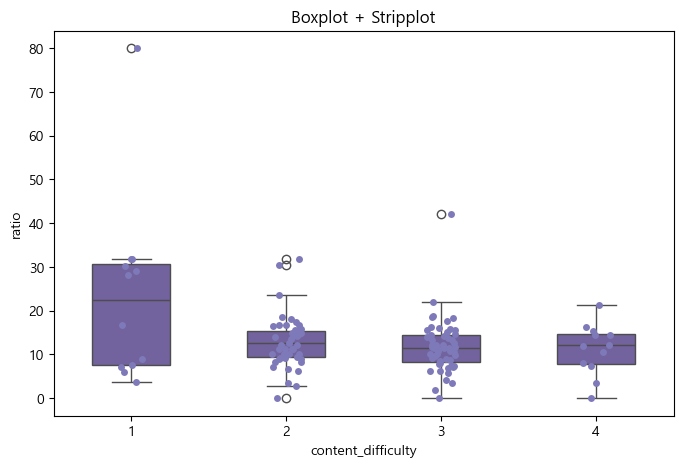

In [98]:
plt.figure(figsize=(8, 5))
sns.boxplot(x="content_difficulty", y="ratio", data=merged_df4, width=0.5,color='#6e58a7')
sns.stripplot(x="content_difficulty", y="ratio", data=merged_df4, color='#7e79b8', jitter=True)
plt.title("Boxplot + Stripplot")
plt.show()


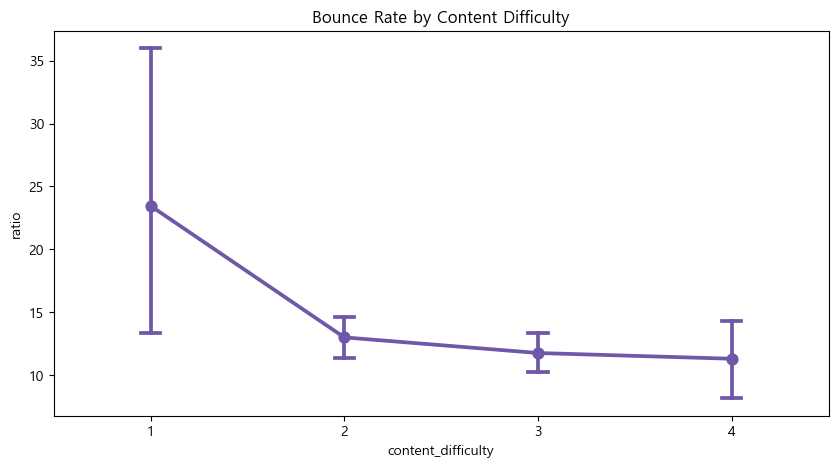

In [99]:
plt.figure(figsize=(10, 5))
sns.pointplot(x=merged_df4.content_difficulty, y=merged_df4['ratio'], ci=95, capsize=0.1, markers="o",color='#6e58a7')
plt.title("Bounce Rate by Content Difficulty")
plt.show()


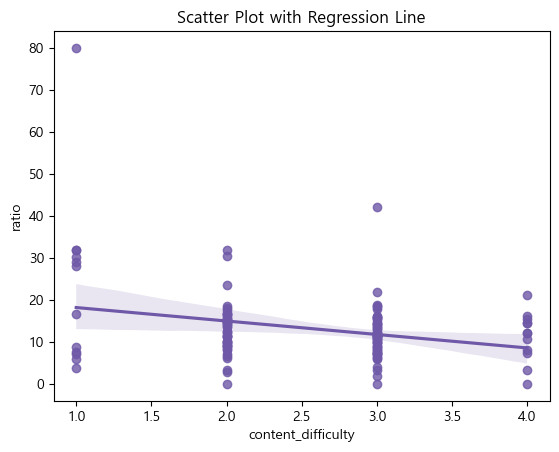

In [100]:
sns.regplot(x=merged_df4.content_difficulty, y=merged_df4['ratio'], color='#6e58a7')
plt.title("Scatter Plot with Regression Line")
plt.show()

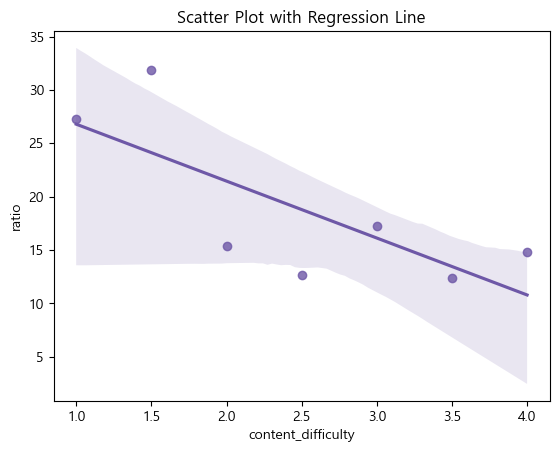

In [101]:
sns.regplot(x=sample_df.index, y=sample_df['ratio'], color='#6e58a7')
plt.title("Scatter Plot with Regression Line")
plt.show()

In [102]:
from scipy.stats import pearsonr

# 피어슨 상관계수 (선형 관계)
pearson_corr, pearson_p = pearsonr(merged_df4.ratio, merged_df4.content_difficulty)

print(f"📌 피어슨 상관계수: {pearson_corr:.4f}, p-value: {pearson_p:.8f}")

del pearson_corr, pearson_p

📌 피어슨 상관계수: -0.2816, p-value: 0.00140070


In [103]:
# 피어슨 상관계수 (선형 관계)
pearson_corr, pearson_p = pearsonr(sample_df['ratio'], sample_df.index)

print(f"📌 피어슨 상관계수: {pearson_corr:.4f}, p-value: {pearson_p:.8f}")

del pearson_corr, pearson_p

📌 피어슨 상관계수: -0.7512, p-value: 0.05158137


In [104]:
# 수료한 사람이 100명이 넘은 컨텐츠에 대해서, 난이도와 이탈 간의 상관관계를 파악해 본 결과
# 아주 약한 음의 상관관계가 나타나는 것으로 보여짐. p-value 역시 유의수준 아래에 위치.
# 다시 말해 난이도가 낮은 컨텐츠에서 이탈이 더 자주 목격된다고 볼 수 있음.

In [105]:
# 4~6 데이터 할당 해제
del (
    start_content, end_content, complete_lesson,
    merged_df, merged_df2, merged_df3, merged_df4, unique_user_merged_df2,
    sample_df, head10
)

#### 7. 복귀 유저 포함 bounce

In [119]:
# complete_lesson 기록만 사용하여 유저 활동 기록 확인하기로 결정

# 데이터 로드
complete_lesson = datasets.complete.lesson()
complete_lesson = duplicated_data_processing(complete_lesson)

# 사용하는 컬럼
complete_lesson_df = complete_lesson[['user_id','content_id','lesson_id','client_event_time']]

# 일단위로 분리
complete_lesson_df['client_event_time'] = complete_lesson_df['client_event_time'].dt.strftime('%Y-%m-%d')

lesson_id 대해서 초단위 중복 제거


C:\Users\soom0\AppData\Local\Temp\ipykernel_18336\2556013472.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  complete_lesson_df['client_event_time'] = complete_lesson_df['client_event_time'].dt.strftime('%Y-%m-%d')


In [120]:
# 일 단위 기록은 압축, 다음 lesson complete 기록 컬럼을 추가
complete_lesson_df = complete_lesson_df.sort_values('client_event_time').drop_duplicates(subset=['user_id','content_id','client_event_time'],keep='last').sort_values(['user_id','client_event_time'])
complete_lesson_df['next_complete_time'] = complete_lesson_df.groupby('user_id')['client_event_time'].shift(-1)

# 결과 확인
complete_lesson_df.head(8)


,user_id,content_id,lesson_id,client_event_time,next_complete_time
222221,0000572f2ba8079bcefd2760b632e820,61b6463287573f00de13a930805a52d6,1e2a48ce24bce72e7d36da219ee9d254,2023-03-19,2023-03-19
222230,0000572f2ba8079bcefd2760b632e820,f4be1a0fe0e301b03115591777fddf29,7be65151a4b1cf91d7ca93b1e2b9ec69,2023-03-19,2023-03-20
1061080,0000572f2ba8079bcefd2760b632e820,f4be1a0fe0e301b03115591777fddf29,02968d35dacf2041e4067dc87d9798a2,2023-03-20,2023-04-08
368297,0000572f2ba8079bcefd2760b632e820,f4be1a0fe0e301b03115591777fddf29,9076881d7173085ad3967fc5236853cc,2023-04-08,2023-04-10
54577,0000572f2ba8079bcefd2760b632e820,f491517f4737a60d661cd1fcacc702c0,1f999ddf3da23ac236e6c74f1fb71c92,2023-04-10,2023-04-11
310578,0000572f2ba8079bcefd2760b632e820,f491517f4737a60d661cd1fcacc702c0,e3c9b82c5f10d44c97626fa9ed166537,2023-04-11,2023-04-13
766615,0000572f2ba8079bcefd2760b632e820,f491517f4737a60d661cd1fcacc702c0,3ab5e48c9976ca9cfb90c0d69c62e10e,2023-04-13,2023-04-17
193524,0000572f2ba8079bcefd2760b632e820,f491517f4737a60d661cd1fcacc702c0,ad01992e03e1be73ccf9f400ddac598a,2023-04-17,NaN


In [121]:
complete_lesson_df['client_event_time'] = pd.to_datetime(complete_lesson_df['client_event_time'])
complete_lesson_df['next_complete_time'] = pd.to_datetime(complete_lesson_df['next_complete_time'])

# 다음 컴플릿 기록이 없는 경우는 2024-01-01의 값을 임의로 부여
complete_lesson_df['next_complete_time'] = complete_lesson_df['next_complete_time'].fillna('2024-01-01')

# 다음 컴플릿 기록과 30일 이상 차이나는 경우 'bounce' : 이탈로 정의
complete_lesson_df['bounce'] = complete_lesson_df.apply(
    lambda row: 1 if (row['next_complete_time'] - row['client_event_time']).days > 30 else 0,
    axis=1
)

# complete_lesson day별 주기
complete_lesson_df['learning_cycle'] = complete_lesson_df['next_complete_time'] - complete_lesson_df['client_event_time']

# 예상 bounce 시점이 24년으로 넘어가는 경우 = 23-12-01 이후 컴플릿 기록건에 대해서는, 이탈하지 않음으로 처리
complete_lesson_df.loc[complete_lesson_df['client_event_time'] > '2023-12-01','bounce'] = 0

# learning_cycle 에서, 이탈한 경우 -30days 를 통해, cycle의 의미가 학습 주기 or 휴식 기간을 의미하도록 변경
complete_lesson_df.loc[complete_lesson_df['bounce'] == 1,'learning_cycle'] -= pd.Timedelta(days=30)

In [122]:
# # 조건

# 데이터 범위 밖 케이스
cd1 = complete_lesson_df['next_complete_time'] < '2024-01-01'

# 기간 제한 조건 (7일 미만)
cd2 = complete_lesson_df['learning_cycle'] <= '7 days'

In [123]:
# 분석용 데이터 프레임 생성.

sample_df = complete_lesson_df.loc[(complete_lesson_df['bounce']==0)].groupby('user_id')[['learning_cycle','bounce']].agg({
    'learning_cycle' :['count','sum']})

temp_df = complete_lesson_df.groupby('user_id')[['bounce']].agg({
    'bounce' : ['sum']
})

sample_df = pd.merge(
    sample_df,
    temp_df,
    on = 'user_id',
    how='left',
    suffixes=('_learnging_cycle','_bounce')
)

del temp_df
display(sample_df.head(8))
display(sample_df.mean())

learning_cycle          bounce
                                          count      sum    sum
user_id                                                        
0000572f2ba8079bcefd2760b632e820              7  29 days      1
000087537cbfd934375364218ff10f91              3  35 days      1
0001f15911b404f3bf5b8571afafa4e4             13  40 days      0
0003c0ede663b9e3b55d9dc3f7e8690f             39 118 days      1
000722d5152d121ef57d8246dff4ac91             18  43 days      1
000773425ea95bf12501964471e230ba              6  20 days      1
0008fe653493aa211bc7bd217bc0725c              8  19 days      1
000ae43430184824318d11fcd3ae8b45             15  23 days      1

learning_cycle  count                     14.185198
                sum      35 days 04:07:40.352089858
bounce          sum                        1.260935
dtype: object

,user_id,learning_cycle_count,learning_cycle_sum,bounce
0,47c0c5284ff7f86a5ac16a3e6e07593b,11.0,31 days,2
1,c6991cc646bce25351e3a64ea00ccb1f,60.0,114 days,3
2,8b4603c99dbd3ec51f40fa2d8e9d9c28,20.0,28 days,4
3,0464280c37522b57bc889e05ac52ae56,10.0,58 days,2
4,2c38dd9ece918c2c4ca432768431e0d8,40.0,172 days,4
...,...,...,...,...
49665,091efd61d0af03336955df82fc60fc30,1.0,1 days,0
49666,1ff17f878a119da197d7d28ca5fe4aa6,1.0,1 days,0
49667,783e01211e03edc828d55baf6e08a256,1.0,1 days,0
49668,c2f379460037197dd941fd1fc2fc87f4,1.0,1 days,0


C:\Users\soom0\AppData\Local\Temp\ipykernel_18336\2181542493.py:37: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  bounce_avg_learning_cycle = temp_df.reset_index().groupby('bounce').apply(


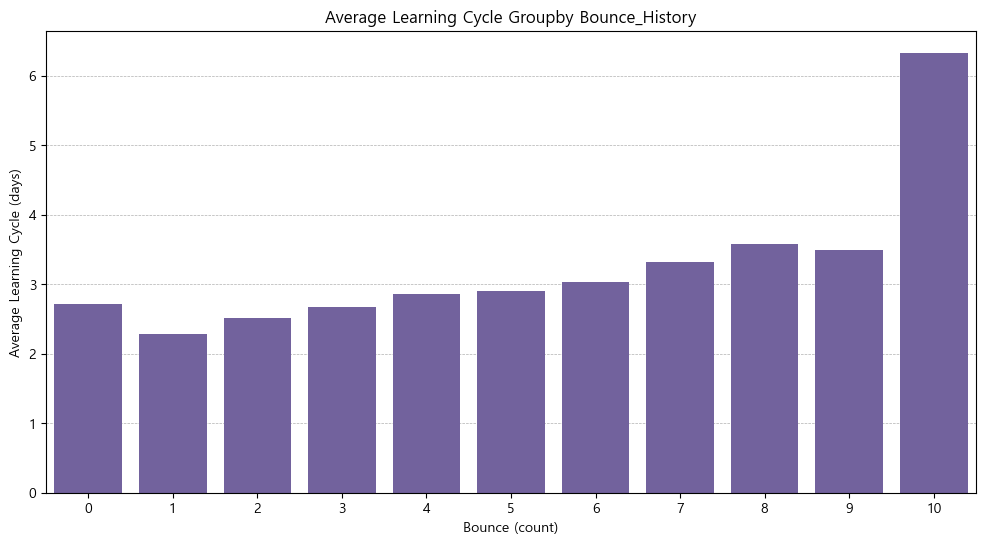

In [129]:
# # 이탈 횟수 그룹에 따른 평균 학습(활성화) 주기

# 각 row를 유저별로 unique하게 만들어서, 유저의 서비스 이용 특징을 파악

temp_df = complete_lesson['user_id'].drop_duplicates()
temp_df = pd.merge(
    temp_df,
    complete_lesson_df.loc[(complete_lesson_df['bounce']==0)].groupby('user_id')['learning_cycle'].count(),
    on = 'user_id',
    how='left'
)

temp_df = pd.merge(
    temp_df,
    complete_lesson_df.loc[(complete_lesson_df['bounce']==0)].groupby('user_id')['learning_cycle'].sum(),
    on = 'user_id',
    how='left',
    suffixes=('_count','_sum')
)

temp_df = pd.merge(
    temp_df,
    complete_lesson_df.groupby('user_id')['bounce'].sum(),
    on = 'user_id',
    how='left'
)
display(temp_df)

# timedelta -> int 형변환
try:
    temp_df['learning_cycle_sum'] = temp_df.learning_cycle_sum.dt.days
except:
    pass


# 그래프용 데이터 정제
bounce_avg_learning_cycle = temp_df.reset_index().groupby('bounce').apply(
    lambda x: x['learning_cycle_sum'].sum() / x['learning_cycle_count'].sum()
)

# 플랏
plt.figure(figsize=(12, 6))
sns.barplot(x=bounce_avg_learning_cycle.index, y=bounce_avg_learning_cycle.values,color='#6e58a7')

#축 라벨링
plt.xlabel('Bounce (count)')
plt.ylabel('Average Learning Cycle (days)')
plt.title('Average Learning Cycle Groupby Bounce_History')

# 격자선 추가
plt.grid(True, which='both', linestyle='--', linewidth=0.5, axis='y')
plt.gca().set_axisbelow(True)
plt.show()

del temp_df, bounce_avg_learning_cycle

In [112]:
# 이탈하지 않고, 학습 주기 기간 제한 조건 (7일 이하)

sample_df = complete_lesson_df.loc[(complete_lesson_df['bounce']==0) & (cd2)].groupby('user_id')[['learning_cycle','bounce']].agg({
    'learning_cycle' :['count','mean']})

temp_df = complete_lesson_df.groupby('user_id')[['bounce']].agg({
    'bounce' : ['sum']
})

sample_df = pd.merge(
    sample_df,
    temp_df,
    on = 'user_id',
    how='left',
    suffixes=('_learnging_cycle','_bounce')
)

del temp_df

display(sample_df)

# 이탈에 도달하기 까지 평균 공부 days, 공부 간격, 평균 이탈
display(sample_df.mean())

learning_cycle                            \
                                          count                      mean   
user_id                                                                     
0000572f2ba8079bcefd2760b632e820              6           1 days 16:00:00   
000087537cbfd934375364218ff10f91              2           4 days 12:00:00   
0001f15911b404f3bf5b8571afafa4e4             12           1 days 08:00:00   
0003c0ede663b9e3b55d9dc3f7e8690f             36           2 days 02:40:00   
000722d5152d121ef57d8246dff4ac91             17 1 days 19:45:52.941176470   
...                                         ...                       ...   
fffadab35ddc8234e1c5139815bfc017             22 1 days 02:10:54.545454545   
fffba676b17f9f0f228360930f238f07              1           1 days 00:00:00   
fffcae39952c396123f9a3c0808a2183             13 0 days 16:36:55.384615384   
fffcbf8ded60b689e9867bff455f4ab7              3           1 days 16:00:00   
fffe529de03d6187ef7ed765650c8d2b             56 1 days 05:08:34.285714285   

                                 bounce  
                                    sum  
user_id                                  
0000572f2ba8079bcefd2760b632e820      1  
000087537cbfd934375364218ff10f91      1  
0001f15911b404f3bf5b8571afafa4e4      0  
0003c0ede663b9e3b55d9dc3f7e8690f      1  
000722d5152d121ef57d8246dff4ac91      1  
...                                 ...  
fffadab35ddc8234e1c5139815bfc017      1  
fffba676b17f9f0f228360930f238f07      1  
fffcae39952c396123f9a3c0808a2183      1  
fffcbf8ded60b689e9867bff455f4ab7      1  
fffe529de03d6187ef7ed765650c8d2b      2  

[34705 rows x 3 columns]

learning_cycle  count                    13.966028
                mean     1 days 13:06:02.288746243
bounce          sum                       1.320473
dtype: object

In [ ]:
# 학습 주기를  [ ] 로 보았을 때의 결과
for i in [3, 7, 14, 21, 30] :
    cd2 = complete_lesson_df['learning_cycle'] <= f'{i} days'
    sample_df = complete_lesson_df.loc[(complete_lesson_df['bounce']==0) & (cd2)].groupby('user_id')[['learning_cycle','bounce']].agg({
    'learning_cycle' :['count','mean']})

    temp_df = complete_lesson_df.groupby('user_id')[['bounce']].agg({
        'bounce' : ['sum']
    })

    sample_df = pd.merge(
        sample_df,
        temp_df,
        on = 'user_id',
        how='left',
        suffixes=('_learnging_cycle','_bounce')
    )

    del temp_df
    sample_df.loc[:, ('learning_cycle', 'count')] += sample_df.loc[:, ('bounce', 'sum')]
    # sample_df.loc[:, ('bounce', 'sum')] = sample_df.loc[:, ('bounce', 'sum')].astype(float)
    # sample_df.loc[:, ('bounce', 'sum')] += 0.1
    print(f'\n learning cycle이 {i}day 이하인 케이스에 대하여 ')
    display(sample_df.mean())


 learning cycle이 3day 이하인 케이스에 대하여 


learning_cycle  count                    14.163594
                mean     0 days 22:35:41.463247311
bounce          sum                       1.336733
dtype: object


 learning cycle이 7day 이하인 케이스에 대하여 


learning_cycle  count                    15.286501
                mean     1 days 13:06:02.288746243
bounce          sum                       1.320473
dtype: object


 learning cycle이 14day 이하인 케이스에 대하여 


learning_cycle  count                    15.595856
                mean     2 days 05:54:38.799357689
bounce          sum                       1.301189
dtype: object


 learning cycle이 21day 이하인 케이스에 대하여 


learning_cycle  count                    15.594008
                mean     2 days 20:59:38.474856480
bounce          sum                       1.285241
dtype: object


 learning cycle이 30day 이하인 케이스에 대하여 


learning_cycle  count                    15.446133
                mean     3 days 19:03:50.297207179
bounce          sum                       1.260935
dtype: object

In [114]:
# 결과 해석 (전체 미 이탈 기간에 대해여)
# 유저마다 평균 learning_cycle count days 정도 공부한다.
# 유저가 공부- 다음 공부간의 평균 공부 간격은 learnig_cycle mean 정도이다.
# bounce_sum은 잘못 만든 데이터 프레임으로 결과 해석에서 제외한다.


# learning_cycle이 14일 이하인 집단에서 가장 높은 평균 learning_cycle count days를 기록한다. (3~7일 보다는 상승하고, 14일 이후로는 하락한다.)
# learning_cycle이 늘어질수록, 복귀율이 하락한다.
# learning_cycle이 늘어질수록, 평균 공부 간격이 길어진다.

# 소결론. complete lesson 이후 14일이 지날수록, 서비스 지속 이용에 대한 지표가 감소한다.

In [149]:
# 러닝 사이클이 n days 인 그룹으로 유저를 분할하여 분석.

# 이탈 하지 않았으면서, 23년 12월 기록은 현황 파악이 불가하므로 분석에서 제외
temp_df = complete_lesson_df.loc[(complete_lesson_df['bounce']==0) & (cd1)]
temp_df.groupby('user_id')['learning_cycle'].count()
temp_df.groupby('user_id')['learning_cycle'].mean()

merged_df = pd.merge(
    temp_df.groupby('user_id')['learning_cycle'].count(),
    temp_df.groupby('user_id')['learning_cycle'].mean(),
    on='user_id',
    suffixes=('_count','_mean')
)
merged_df = pd.merge(
    merged_df,
    complete_lesson_df.groupby('user_id')['bounce'].sum(),
    on='user_id'
)
merged_df

,learning_cycle_count,learning_cycle_mean,bounce
user_id,,,
0000572f2ba8079bcefd2760b632e820,7,4 days 03:25:42.857142857,1
000087537cbfd934375364218ff10f91,3,11 days 16:00:00,1
0001f15911b404f3bf5b8571afafa4e4,12,1 days 08:00:00,0
0003c0ede663b9e3b55d9dc3f7e8690f,39,3 days 00:36:55.384615384,1
000722d5152d121ef57d8246dff4ac91,18,2 days 09:20:00,1
...,...,...,...
fffadab35ddc8234e1c5139815bfc017,22,1 days 02:10:54.545454545,1
fffba676b17f9f0f228360930f238f07,1,1 days 00:00:00,1
fffcae39952c396123f9a3c0808a2183,14,1 days 05:08:34.285714285,1


In [ ]:
# 그룹 분할
bins = [0, 3, 7, 14, 21, 30]
labels = ['0~3 days', '4~7 days', '8~14 days', '15~21 days', '22~30 days']

# 해당 그룹 정보 컬럼 추가
merged_df['learning_cycle_group'] = pd.cut(merged_df['learning_cycle_mean'].dt.days, bins=bins, labels=labels, right=True)

# 결과 확인
display(merged_df.head(5))

del bins, labels

,learning_cycle_count,learning_cycle_mean,bounce,learning_cycle_group
user_id,,,,
0000572f2ba8079bcefd2760b632e820,7,4 days 03:25:42.857142857,1,4~7 days
000087537cbfd934375364218ff10f91,3,11 days 16:00:00,1,8~14 days
0001f15911b404f3bf5b8571afafa4e4,12,1 days 08:00:00,0,0~3 days
0003c0ede663b9e3b55d9dc3f7e8690f,39,3 days 00:36:55.384615384,1,0~3 days
000722d5152d121ef57d8246dff4ac91,18,2 days 09:20:00,1,0~3 days


In [151]:
merged_df.groupby('learning_cycle_group')[['learning_cycle_count','learning_cycle_mean','bounce']].mean()

,learning_cycle_count,learning_cycle_mean,bounce
learning_cycle_group,,,
0~3 days,18.388848,2 days 01:55:22.022802097,1.380929
4~7 days,9.390665,5 days 06:55:48.325089186,1.503269
8~14 days,3.543872,10 days 07:16:22.097374533,1.319797
15~21 days,1.447099,17 days 16:10:51.194539249,1.160410
22~30 days,1.091603,25 days 18:13:44.427480916,1.114504


In [153]:
merged_df.loc[merged_df['learning_cycle_group']=='22~30 days']

,learning_cycle_count,learning_cycle_mean,bounce,learning_cycle_group
user_id,,,,
01e0a54f46ed6e2bdf71b520558d45db,1,24 days,1,22~30 days
060a38c5dee2b2871c8308163264b115,1,27 days,1,22~30 days
06e2f5c2e10ab6a919abbfe83f6f63f9,1,27 days,1,22~30 days
08c1bcb43faa173f9a1ef679fa621eb3,1,27 days,1,22~30 days
0a0f4789ad1922f6ca7fb500ae9fa9da,1,27 days,2,22~30 days
...,...,...,...,...
fa4808f4a3868a8736b688a71629af98,1,25 days,1,22~30 days
fa58177660c687803ee14ac44f3d5cae,1,27 days,1,22~30 days
fc5de3b99a236a570cbc50f11298f080,1,25 days,1,22~30 days


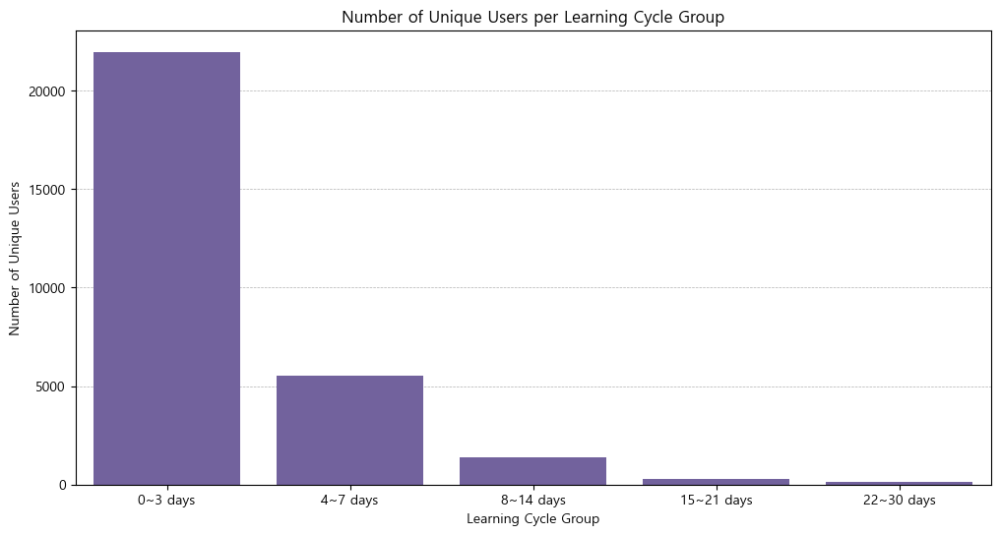

In [155]:

# 유저 수 세기
grouped_df = merged_df.groupby('learning_cycle_group').size()

# 그래프 그리기
plt.figure(figsize=(12, 6))
sns.barplot(x=grouped_df.index, y=grouped_df.values,color='#6e58a7')
plt.xlabel('Learning Cycle Group')
plt.ylabel('Number of Unique Users')
plt.title('Number of Unique Users per Learning Cycle Group')

plt.grid(True, which='both', linestyle='--', linewidth=0.5, axis='y')
plt.gca().set_axisbelow(True)
plt.show()

# 할당 해제
del grouped_df

In [156]:
# 목적 : 이탈 전까지 공부하는 평균 day와 이탈간의 관계성

# X,Y 설정. X = 공부한 일자  Y = 이탈하는 횟수
X = sample_df['learning_cycle']['count'] + sample_df['bounce']['sum']
y = sample_df['bounce']['sum']

# Add a constant to the independent variable
X = sm.add_constant(X)

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary of the regression model
print(model.summary())

del X, y, model

                            OLS Regression Results                            
Dep. Variable:                    sum   R-squared:                       0.112
Model:                            OLS   Adj. R-squared:                  0.111
Method:                 Least Squares   F-statistic:                     4648.
Date:                Wed, 12 Mar 2025   Prob (F-statistic):               0.00
Time:                        14:02:47   Log-Likelihood:                -49193.
No. Observations:               37036   AIC:                         9.839e+04
Df Residuals:                   37034   BIC:                         9.841e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0293      0.006    176.355      0.0

In [117]:
# 해석 불가

In [118]:
# 할당 해제
del complete_lesson, cd1, cd2, complete_lesson_df, sample_df

#### 모듈

In [5]:
import os
import os.path as path

import pandas as pd

from sklearn.preprocessing import LabelEncoder
import numpy as np

#### 인코더 불러오기

In [6]:
# path
BasePath = "./encoders"

# get list of encoder files
encoder_file_list = os.listdir(BasePath)

# print list of encoder files
print('encoder_file_list :', encoder_file_list)

# load encoder files
encoder_dict = {}

for file in encoder_file_list:
    encoder_name = file.replace(".npy", "")
    encoder_dict[encoder_name] = LabelEncoder()
    classes = np.load(path.join(BasePath, file), allow_pickle=True)
    encoder_dict[encoder_name].classes_ = np.load(path.join(BasePath, file), allow_pickle=True)
    
    if encoder_name == "os_version":
        encoder_dict[encoder_name].fit(list(map(lambda x: str(x), classes)))

# encoder modify
for encoder_name in encoder_dict.keys():
    # reorder encoder : make encoder[0] = nan
    encoder_dict[encoder_name].classes_ = \
        np.append(encoder_dict[encoder_name].classes_[-1],\
                    encoder_dict[encoder_name].classes_[:-1])

    print(f"{encoder_name} : {encoder_dict[encoder_name].classes_[:5]}")

# reorder 'event_type' encoder classes
encoder_dict['event_type'].classes_ = np.array([
    'error',
    'enter.main_page',
    'enter.signup_page',
    'complete.signup',
    'enter.content_page',
    'click.content_page_start_content_button',
    'click.content_page_more_review_button',
    'enter.payment_page',
    'complete.subscription',
    'renew.subscription',
    'resubscribe.subscription',
    'start.free_trial',
    'start.content',
    'enter.lesson_page',
    'complete.lesson',
    'click.lesson_page_related_question_box',
    'end.content',
    'click.cancel_plan_button'
])
# encoder test
print(encoder_dict["event_type"].classes_[:5])


encoder_file_list : ['button.name.npy', 'button_name.npy', 'city.npy', 'content.difficulty.npy', 'content.id.npy', 'country.npy', 'coupon.discount_amount.npy', 'device_family.npy', 'device_type.npy', 'event_type.npy', 'is_free_trial.npy', 'is_trial.npy', 'language.npy', 'lesson.id.npy', 'os_name.npy', 'os_version.npy', 'paid_amount.npy', 'pg.type.npy', 'plan.price.npy', 'plan.type.npy', 'platform.npy', 'question.id.npy', 'trial.type.npy', 'type.npy', 'user_id.npy']
button.name : [nan '구독 시작하기' '무료로 들어보기' '무료로 시작하기' '최저가 혜택 받기']
button_name : [nan '무료로 시작하기' '수강시작' '수강하기' '이어하기']
city : [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
content.difficulty : [nan 'advanced' 'beginner' 'hard' 'intermediate']
content.id : [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']
country : [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
coupon.discount_amount : [nan -52400 -48400 0 478]

#### 인코더 테스트

In [7]:
## 주의사항
# 
# 1. BaseFilePath에 데이터 파일 경로를 설정해주세요.
# 2. 제외하고 싶은 컬럼이 있으면 exclude_columns에 추가해주세요.
# 3. 인코딩을 하고 컬럼 이름을 바꿔 주세요.

## 함수 설명
# 
# .transform()을 이용해서 데이터를 변환해주세요.
# 
# 데이터[칼럼] = encoder_dict[칼럼].transform(데이터[칼럼])
# 예시 : df[col] = encoder_dict[col].transform(df[col])
# 
# 
# .inverse_transform()을 이용해서 데이터를 역변환해주세요.
# 
# 데이터[칼럼] = encoder_dict[칼럼].inverse_transform(데이터[칼럼])
# 예시 : df[col] = encoder_dict[col].inverse_transform(df[col])


## 인코딩

# 개인적으로 BaseFilePath를 설정해주었는데, 이를 이용해서 파일 리스트를 불러오는 코드입니다.
BaseFilePath = 'd:\Codeit\intermediate_project\주제 2. 구독서비스 프로덕트 데이터 분석'
filelist = os.listdir(BaseFilePath)[:-1]

# 제외 컬럼
exclude_columns = ['device_carrier', 'os_version']

# 제외 컬럼 : 제외하고 싶은 컬럼을 추가합니다.
exclude_columns_plus = []

# display file list
print(filelist)

# load data
dfs = []

for file in filelist:
    if file.endswith('.csv'):
        df = pd.read_csv(path.join(BaseFilePath, file), nrows=200)
        
        # preprocess
        # convert os_version to string
        df['os_version'] = df['os_version'].astype(str)
        # drop 
        df = df.drop(exclude_columns + exclude_columns_plus, axis=1)
        # convert client_event_time to datetime
        df['client_event_time'] = pd.to_datetime(df['client_event_time'])
        
        dfs.append(df)
        print(f"file: {file}, shape: {df.shape}")

for i, df in enumerate(dfs):
    print(f"file: {filelist[i]} encodings - ")
    
    # encode categorical columns using the loaded encoders
    for col in df.columns:
        # exception handling
        if col not in encoder_dict:
            continue
        if col in exclude_columns + exclude_columns_plus:
            continue
        
        # encode using the loaded encoder
        df[col] = encoder_dict[col].transform(df[col])
        print(f"{col}: {encoder_dict[col].classes_[:5]}")
    
    # display result head
    display(df.head())

['click.cancel_plan_button.csv', 'click.content_page_more_review_button.csv', 'click.content_page_start_content_button.csv', 'click.lesson_page_related_question_box.csv', 'complete.lesson.csv', 'complete.signup.csv', 'complete.subscription.csv', 'end.content.csv', 'enter.content_page.csv', 'enter.lesson_page-002.csv', 'enter.main_page.csv', 'enter.payment_page.csv', 'enter.signup_page.csv', 'renew.subscription.csv', 'resubscribe.subscription.csv', 'start.content.csv', 'start.free_trial.csv']
file: click.cancel_plan_button.csv, shape: (200, 10)
file: click.content_page_more_review_button.csv, shape: (200, 11)
file: click.content_page_start_content_button.csv, shape: (200, 13)


<>:24: SyntaxWarning: invalid escape sequence '\C'
<>:24: SyntaxWarning: invalid escape sequence '\C'
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_10860\1609756926.py:24: SyntaxWarning: invalid escape sequence '\C'
  BaseFilePath = 'd:\Codeit\intermediate_project\주제 2. 구독서비스 프로덕트 데이터 분석'


file: click.lesson_page_related_question_box.csv, shape: (200, 13)
file: complete.lesson.csv, shape: (200, 12)
file: complete.signup.csv, shape: (200, 11)
file: complete.subscription.csv, shape: (200, 14)
file: end.content.csv, shape: (200, 11)
file: enter.content_page.csv, shape: (200, 11)
file: enter.lesson_page-002.csv, shape: (200, 14)
file: enter.main_page.csv, shape: (200, 10)
file: enter.payment_page.csv, shape: (200, 10)
file: enter.signup_page.csv, shape: (200, 10)
file: renew.subscription.csv, shape: (200, 14)
file: resubscribe.subscription.csv, shape: (200, 14)
file: start.content.csv, shape: (200, 12)
file: start.free_trial.csv, shape: (200, 13)
file: click.cancel_plan_button.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'And

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id
0,886,2023-04-10 14:57:48.556,158,1029,609,17,38,4,1,111466
1,3440,2023-03-12 08:26:16.224,158,130,5,17,15,23,1,55652
2,3945,2023-03-12 08:23:04.955,158,1029,609,17,38,4,1,128371
3,967,2023-03-12 08:32:39.271,158,1029,609,17,38,4,1,45697
4,1260,2023-04-12 11:36:28.311,158,1029,609,17,38,4,1,133511


file: click.content_page_more_review_button.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id
0,3420,2023-04-10 14:10:01.402,158,1029,609,6,38,4,1,60321,135
1,2212,2023-01-24 21:37:43.417,180,1029,609,6,38,40,1,160567,200
2,1109,2023-01-31 14:44:16.897,158,1029,609,6,38,4,1,162425,129
3,3440,2023-01-31 14:30:36.568,158,135,38,6,38,23,1,159319,200
4,3440,2023-02-12 03:24:32.337,158,1029,609,6,38,4,1,82221,11


file: click.content_page_start_content_button.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']
button.name: [nan '구독 시작하기' '무료로 들어보기' '무료로 시작하기' '최저

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id,button.name,button_name
0,888,2023-04-05 21:14:38.432,158,1029,609,5,38,10,1,46100,57,6,0
1,3436,2023-04-10 14:57:20.033,158,1029,609,5,38,10,1,173596,22,7,0
2,4221,2023-04-10 14:28:29.515,158,1029,609,5,38,4,1,19086,186,7,0
3,3420,2023-04-10 14:09:30.564,158,1029,609,5,38,4,1,37439,135,7,0
4,3420,2023-04-10 14:10:52.368,158,1029,609,5,38,4,1,37439,109,6,0


file: click.lesson_page_related_question_box.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
question.id: [nan '000468dc7826f179a01db37bff526ca4' '001024597887f49ec01816cc0360ce2a'
 '0015d6a21cc7eaa4c71241b0128d8d09' '0031005db08ae21ea9152cd538a388ca']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,question.id,content.id,lesson.id
0,977,2023-04-05 21:51:48.377,158,773,482,15,15,4,1,12406,5976,159,4997
1,977,2023-04-05 21:52:21.689,158,773,482,15,15,4,1,12406,4126,159,4997
2,977,2023-04-05 21:52:42.481,158,773,482,15,15,4,1,12406,4795,159,4997
3,1332,2023-04-05 21:20:15.032,158,570,158,15,38,4,1,158750,4324,159,1178
4,1332,2023-04-05 21:21:55.275,158,570,158,15,38,4,1,158750,2315,159,3567


file: complete.lesson.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']
lesson.id: [nan '001e4570bb0fc346a1c969b019bdc22b' '0021f3a8597cb32f360563144

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id,lesson.id
0,4171,2023-04-05 21:55:51.836,158,1029,609,14,38,4,1,102081,125,4544
1,888,2023-04-05 21:19:01.243,158,1029,609,14,38,10,1,46100,57,2716
2,888,2023-04-05 21:20:27.939,158,1029,609,14,38,10,1,46100,57,4509
3,888,2023-04-05 21:23:01.534,158,1029,609,14,38,10,1,46100,57,5224
4,888,2023-04-05 21:28:34.965,158,1029,609,14,38,10,1,46100,57,4415


file: complete.signup.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
type: [nan 'email' 'facebook' 'google' 'kakao']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,type
0,0,2023-04-05 21:33:26.068,0,0,0,3,0,0,0,82284,4
1,0,2023-04-05 21:45:18.672,0,0,0,3,0,0,0,4752,4
2,3420,2023-04-10 14:47:56.424,158,1029,609,3,38,4,1,158234,4
3,3694,2023-04-10 14:25:45.920,158,135,38,3,38,23,1,160007,5
4,0,2023-04-10 14:09:50.698,0,0,0,3,0,0,0,57881,4


file: complete.subscription.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
plan.price: [nan 14328 15920 19920 42960]
paid_amount: [nan 3960 7960 9552 11144]
coupon.discount_amount: [nan -52400 -48400 0 478]
pg.type: [nan 'A' 'B' 'C' None]


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,2765,2023-04-05 21:40:04.000,158,1029,609,8,38,10,1,12135,2,13,3,0
1,3440,2023-04-10 14:20:03.008,158,135,38,8,38,23,1,135651,12,50,3,0
2,4223,2023-03-12 08:46:14.026,158,1029,609,8,38,4,1,85354,12,46,33,0
3,1260,2023-04-12 11:35:01.865,158,1029,609,8,38,4,1,133511,12,50,3,0
4,1415,2023-05-31 01:25:55.820,158,570,158,8,38,4,1,149647,2,13,3,0


file: end.content.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id
0,4270,2023-04-10 14:02:10.600,85,1029,609,16,33,4,1,45090,140
1,3440,2023-04-10 14:21:26.466,158,1029,609,16,38,4,1,94157,204
2,3431,2023-04-10 14:37:04.440,158,1029,609,16,38,4,1,30876,112
3,3420,2023-04-10 14:37:19.909,158,1029,609,16,38,4,1,92396,93
4,3420,2023-04-10 14:08:58.968,158,1029,609,16,38,4,1,37439,135


file: enter.content_page.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id
0,3440,2023-04-05 21:40:35.740,158,135,38,4,38,4,1,150026,30
1,1647,2023-04-05 21:01:59.950,158,769,451,4,38,4,1,0,193
2,888,2023-04-05 21:13:12.038,158,1029,609,4,38,10,1,46100,153
3,888,2023-04-05 21:14:25.355,158,1029,609,4,38,10,1,46100,57
4,3440,2023-04-05 21:44:23.759,158,773,477,4,38,35,1,0,108


file: enter.lesson_page-002.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']
is_trial: [nan False True]
lesson.id: [nan '001e4570bb0fc346a1c969b019b

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id,is_trial,lesson.id,is_free_trial
0,4171,2023-04-05 21:46:04.333,158,1029,609,13,38,4,1,102081,125,1,4544,0
1,4171,2023-04-05 21:55:50.787,158,1029,609,13,38,4,1,102081,125,1,4544,0
2,4171,2023-04-05 21:55:55.684,158,1029,609,13,38,4,1,102081,125,1,2558,0
3,979,2023-04-05 21:04:55.828,158,570,158,13,38,4,1,125592,81,1,2278,0
4,979,2023-04-05 21:05:34.139,158,570,158,13,38,4,1,125592,182,1,410,0


file: enter.main_page.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id
0,3436,2023-04-05 21:55:06.140,158,773,482,1,38,40,1,0
1,979,2023-04-05 21:04:28.967,158,570,158,1,38,4,1,125592
2,1647,2023-04-05 21:01:31.258,158,769,451,1,38,4,1,0
3,1647,2023-04-05 21:02:50.374,158,769,451,1,38,4,1,0
4,3440,2023-04-05 21:30:33.727,158,773,323,1,38,4,1,0


file: enter.payment_page.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id
0,3440,2023-04-05 21:31:27.602,158,773,323,7,38,4,1,100552
1,4171,2023-04-05 21:33:30.699,158,1029,609,7,38,4,1,82284
2,888,2023-04-05 21:05:28.337,158,1029,609,7,38,10,1,69568
3,3440,2023-04-05 21:45:27.935,158,570,158,7,38,34,1,4752
4,3440,2023-04-05 21:46:50.632,158,570,158,7,38,34,1,4752


file: enter.signup_page.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id
0,3440,2023-04-05 21:30:42.557,158,773,323,2,38,4,1,0
1,3440,2023-04-05 21:37:41.467,158,789,0,2,38,4,1,0
2,3440,2023-04-05 21:05:53.237,158,135,38,2,38,23,1,0
3,1228,2023-04-05 21:41:58.269,158,570,158,2,38,34,1,0
4,3440,2023-04-05 21:44:53.294,158,570,158,2,38,34,1,0


file: renew.subscription.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
plan.price: [nan 14328 15920 19920 42960]
paid_amount: [nan 3960 7960 9552 11144]
coupon.discount_amount: [nan -52400 -48400 0 478]
pg.type: [nan 'A' 'B' 'C' None]


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,2587,2022-09-08 03:05:02.068,158,1029,609,9,38,10,1,77280,2,13,3,0
1,2587,2022-09-08 03:40:02.050,158,1029,609,9,38,4,1,136967,2,13,3,0
2,984,2022-09-08 03:49:00.829,158,1029,609,9,38,4,1,156389,4,21,11,0
3,4277,2022-09-08 04:10:06.406,158,1029,609,9,38,4,1,134336,2,13,3,0
4,984,2022-09-08 04:40:01.895,158,129,4,9,38,6,1,88614,2,13,3,0


file: resubscribe.subscription.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
plan.price: [nan 14328 15920 19920 42960]
paid_amount: [nan 3960 7960 9552 11144]
coupon.discount_amount: [nan -52400 -48400 0 478]
pg.type: [nan 'A' 'B' 'C' None]


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,888,2023-04-05 21:11:45.525,158,1029,609,10,38,10,1,46100,2,13,3,0
1,3440,2023-06-30 09:59:56.848,158,773,488,10,38,7,1,73557,2,13,3,0
2,2765,2023-06-13 06:20:22.524,158,1029,609,10,38,4,1,55369,2,13,3,0
3,3694,2023-06-11 11:02:11.878,158,1029,609,10,38,4,1,174991,12,50,3,0
4,1996,2023-06-13 14:39:25.736,85,135,38,10,33,4,1,24351,12,50,3,0


file: start.content.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']
content.difficulty: [nan 'advanced' 'beginner' 'hard' 'intermediate']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id,content.difficulty
0,888,2023-04-05 21:14:39.906,158,1029,609,12,38,10,1,46100,57,2
1,3440,2023-04-05 21:50:19.674,158,570,158,12,38,34,1,4752,201,2
2,3440,2023-04-10 14:06:26.585,158,570,158,12,38,40,1,86684,85,2
3,3881,2023-04-10 14:15:29.040,31,1029,609,12,15,4,1,165440,85,2
4,3440,2023-04-10 14:21:36.467,158,1029,609,12,38,4,1,94157,22,1


file: start.free_trial.csv encodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
plan.price: [nan 14328 15920 19920 42960]
plan.type: [nan '12개월 플랜' '1개월 플랜' None]
trial.type: [nan 'A' 'B' None]


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,plan.price,plan.type,trial.type
0,3440,2023-04-05 21:49:36.156,158,570,158,11,38,34,1,4752,2,2,2
1,967,2023-03-12 08:28:29.384,158,1029,609,11,38,4,1,45697,2,2,2
2,0,2023-03-12 08:35:00.107,0,0,0,11,0,0,0,39960,2,2,2
3,3440,2023-04-12 11:36:50.250,158,570,158,11,38,34,1,143683,2,2,2
4,0,2023-02-18 04:13:20.822,0,0,0,11,0,0,0,54214,12,1,2


In [8]:
## 디코딩

for i, df in enumerate(dfs):
    print(f"file: {filelist[i]} decodings - ")
    
    # encode categorical columns using the loaded encoders
    for col in df.columns:
        # exception handling
        if col not in encoder_dict:
            continue
        if col in exclude_columns + exclude_columns_plus:
            continue
        
        # encode using the loaded encoder
        df[col] = encoder_dict[col].inverse_transform(df[col])
        print(f"{col}: {encoder_dict[col].classes_[:5]}")
    
    # display result head
    display(df.head())

file: click.cancel_plan_button.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id
0,Daegu,2023-04-10 14:57:48.556,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,Web,9e59ecf9a8fbe9051bd0d54f4b702f30
1,Seoul,2023-03-12 08:26:16.224,South Korea,Apple iPad,Apple iPad,click.cancel_plan_button,English,Mobile Safari,Web,4ed4d8f12c45504a148bfff0f2e9466e
2,Uijeongbu-si,2023-03-12 08:23:04.955,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,Web,b6a1bba3cc4139d7dc821561319221e6
3,Dobong-gu,2023-03-12 08:32:39.271,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,Web,40acc1ddfc012f3d2f58a3de95e9e748
4,Geumjeong-gu,2023-04-12 11:36:28.311,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,Web,bdffe1f18684704d4ea2d7eebcaed180


file: click.content_page_more_review_button.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id
0,Seo-gu,2023-04-10 14:10:01.402,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,Web,558fe7e8c06b8505f11b33d76f076e56,a1eeebeb6c307641b75b94a2a1d5b9aa
1,London,2023-01-24 21:37:43.417,United Kingdom,Windows,Windows,click.content_page_more_review_button,Korean,Whale,Web,e48956538e4df690a5d12adf1e6f2ee3,f491517f4737a60d661cd1fcacc702c0
2,Eunpyeong-gu,2023-01-31 14:44:16.897,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,Web,e745da89019e303b122bfceac0521a8f,9aa7628a347707fb155943041e2cb524
3,Seoul,2023-01-31 14:30:36.568,South Korea,Apple iPhone,Apple iPhone,click.content_page_more_review_button,Korean,Mobile Safari,Web,e2c59d444736eceee9eedba85bd4e209,f491517f4737a60d661cd1fcacc702c0
4,Seoul,2023-02-12 03:24:32.337,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,Web,74b66b738185ffdbec960db4a0da330a,101e1d0dcc38d9c86156f008a145083e


file: click.content_page_start_content_button.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']
button.name: [nan '구독 시작하기' '무료로 들어보기' '무료로 시작하기' '최저

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id,button.name,button_name
0,Daejeon,2023-04-05 21:14:38.432,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,콘텐츠 구독하기,NaN
1,Seongnam-si,2023-04-10 14:57:20.033,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,Web,f7155af01d277f11b1c7d05cf772c686,18992b667be06d6f29ba0008f99d9745,콘텐츠 이어보기,NaN
2,Yangp'yong,2023-04-10 14:28:29.515,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,Web,1b05f9fe82b80771323caa1cd5683143,dfbdae782996c25daed7517b8835f3aa,콘텐츠 이어보기,NaN
3,Seo-gu,2023-04-10 14:09:30.564,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa,콘텐츠 이어보기,NaN
4,Seo-gu,2023-04-10 14:10:52.368,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,Web,353528475f2bd85934263421ccd579b3,7de35a9d8f14c68e5f2a8788dda5f72e,콘텐츠 구독하기,NaN


file: click.lesson_page_related_question_box.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
question.id: [nan '000468dc7826f179a01db37bff526ca4' '001024597887f49ec01816cc0360ce2a'
 '0015d6a21cc7eaa4c71241b0128d8d09' '0031005db08ae21ea9152cd538a388ca']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,question.id,content.id,lesson.id
0,Dong-gu,2023-04-05 21:51:48.377,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,Web,117f95e12266dcf8f911ae39ff55a800,c654f9825245640595af9b8aecb150aa,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
1,Dong-gu,2023-04-05 21:52:21.689,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,Web,117f95e12266dcf8f911ae39ff55a800,898fb79fc740dc8705b52fb32521d5d5,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
2,Dong-gu,2023-04-05 21:52:42.481,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,Web,117f95e12266dcf8f911ae39ff55a800,9fb80c124d57fd31494738e0af5437a3,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
3,Goyang-si,2023-04-05 21:20:15.032,South Korea,Mac,Mac,click.lesson_page_related_question_box,Korean,Chrome,Web,e1f3ecae035a3c8ae8cf789fbde98995,9016e2246486e852992ccd9ae0eb27ca,c269eb6df3a374b464f7c18f12fa398f,395bdf0293b24ec47d5a9e960574f851
4,Goyang-si,2023-04-05 21:21:55.275,South Korea,Mac,Mac,click.lesson_page_related_question_box,Korean,Chrome,Web,e1f3ecae035a3c8ae8cf789fbde98995,4ecd552eeded70b3274b8edf3ecacbd9,c269eb6df3a374b464f7c18f12fa398f,a738c7835388066e2618af1e5ebacb3c


file: complete.lesson.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']
lesson.id: [nan '001e4570bb0fc346a1c969b019bdc22b' '0021f3a8597cb32f360563144

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id,lesson.id
0,Wonju,2023-04-05 21:55:51.836,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,d360d68b65fd3e0eafb7982386d75fd9
1,Daejeon,2023-04-05 21:19:01.243,South Korea,Windows,Windows,complete.lesson,Korean,Edge,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,7e0f6aae886368ef9fa97007a8e9f7ac
2,Daejeon,2023-04-05 21:20:27.939,South Korea,Windows,Windows,complete.lesson,Korean,Edge,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,d1e93c9dc08267efab31849bc6083854
3,Daejeon,2023-04-05 21:23:01.534,South Korea,Windows,Windows,complete.lesson,Korean,Edge,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,f22ea5dc431035305e705552bbc4f45b
4,Daejeon,2023-04-05 21:28:34.965,South Korea,Windows,Windows,complete.lesson,Korean,Edge,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,ce0bfeb7fb1259c588f437d48ab2690c


file: complete.signup.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
type: [nan 'email' 'facebook' 'google' 'kakao']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,type
0,NaN,2023-04-05 21:33:26.068,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,74d17c27a41656e7788b0c81d9f76cda,kakao
1,NaN,2023-04-05 21:45:18.672,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,06b6868000a5d576180aca47896d6cce,kakao
2,Seo-gu,2023-04-10 14:47:56.424,South Korea,Windows,Windows,complete.signup,Korean,Chrome,Web,e131c319972bd580146c5a2faba26613,kakao
3,Suwon,2023-04-10 14:25:45.920,South Korea,Apple iPhone,Apple iPhone,complete.signup,Korean,Mobile Safari,Web,e3b8bfa80d866f296aad139e09023ef3,naver
4,NaN,2023-04-10 14:09:50.698,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,5208a60918f18562ac9d668a35b20303,kakao


file: complete.subscription.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
plan.price: [nan 14328 15920 19920 42960]
paid_amount: [nan 3960 7960 9552 11144]
coupon.discount_amount: [nan -52400 -48400 0 478]
pg.type: [nan 'A' 'B' 'C' None]


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Nowon-gu,2023-04-05 21:40:04.000,South Korea,Windows,Windows,complete.subscription,Korean,Edge,Web,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 14:20:03.008,South Korea,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,Web,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 08:46:14.026,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,Web,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN
3,Geumjeong-gu,2023-04-12 11:35:01.865,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,Web,bdffe1f18684704d4ea2d7eebcaed180,131600,131600,0,NaN
4,Gwangmyeong,2023-05-31 01:25:55.820,South Korea,Mac,Mac,complete.subscription,Korean,Chrome,Web,d4f54ecf6c4d7bf8742f80505f02d6dc,15920,15920,0,NaN


file: end.content.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id
0,Yokohama,2023-04-10 14:02:10.600,Japan,Windows,Windows,end.content,Japanese,Chrome,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c
1,Seoul,2023-04-10 14:21:26.466,South Korea,Windows,Windows,end.content,Korean,Chrome,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c
2,Seongbuk-gu,2023-04-10 14:37:04.440,South Korea,Windows,Windows,end.content,Korean,Chrome,Web,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7
3,Seo-gu,2023-04-10 14:37:19.909,South Korea,Windows,Windows,end.content,Korean,Chrome,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a
4,Seo-gu,2023-04-10 14:08:58.968,South Korea,Windows,Windows,end.content,Korean,Chrome,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa


file: enter.content_page.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id
0,Seoul,2023-04-05 21:40:35.740,South Korea,Apple iPhone,Apple iPhone,enter.content_page,Korean,Chrome,Web,d57aba7b4527e71b96135deaaec57def,220ce7873b8895d0c81c37600b5bd1e7
1,Hwaseong-si,2023-04-05 21:01:59.950,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.content_page,Korean,Chrome,Web,NaN,ecde9a1b01763f791c3a185d53b5f394
2,Daejeon,2023-04-05 21:13:12.038,South Korea,Windows,Windows,enter.content_page,Korean,Edge,Web,41362ad5ebcade2bb1b78344a53e7ccf,b8d4ec0133e5ce485055bfd69cd28abd
3,Daejeon,2023-04-05 21:14:25.355,South Korea,Windows,Windows,enter.content_page,Korean,Edge,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430
4,Seoul,2023-04-05 21:44:23.759,South Korea,Samsung Phone,Samsung Galaxy S20 FE 5G,enter.content_page,Korean,Samsung Browser,Web,NaN,7cebec6e79cc981dbf421c5ec2aedd9d


file: enter.lesson_page-002.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']
is_trial: [nan False True]
lesson.id: [nan '001e4570bb0fc346a1c969b019b

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id,is_trial,lesson.id,is_free_trial
0,Wonju,2023-04-05 21:46:04.333,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
1,Wonju,2023-04-05 21:55:50.787,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
2,Wonju,2023-04-05 21:55:55.684,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,770740696ab1809d6b50d4013b64a75c,NaN
3,Dongdaemun-gu,2023-04-05 21:04:55.828,South Korea,Mac,Mac,enter.lesson_page,Korean,Chrome,Web,b2b31f00b82edc6419b25324a7ae41a4,5fc64d786416b980cfda86afd69e4516,False,68cc362ca81b5899b3c9b4dea0aaddff,NaN
4,Dongdaemun-gu,2023-04-05 21:05:34.139,South Korea,Mac,Mac,enter.lesson_page,Korean,Chrome,Web,b2b31f00b82edc6419b25324a7ae41a4,db43a841c994231e2795d4df8931af50,False,144682f4648f81de8e6aabd11b92105e,NaN


file: enter.main_page.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id
0,Seongnam-si,2023-04-05 21:55:06.140,South Korea,Samsung Phone,Samsung Galaxy S21 5G,enter.main_page,Korean,Whale,Web,NaN
1,Dongdaemun-gu,2023-04-05 21:04:28.967,South Korea,Mac,Mac,enter.main_page,Korean,Chrome,Web,b2b31f00b82edc6419b25324a7ae41a4
2,Hwaseong-si,2023-04-05 21:01:31.258,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,Web,NaN
3,Hwaseong-si,2023-04-05 21:02:50.374,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,Web,NaN
4,Seoul,2023-04-05 21:30:33.727,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.main_page,Korean,Chrome,Web,NaN


file: enter.payment_page.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id
0,Seoul,2023-04-05 21:31:27.602,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.payment_page,Korean,Chrome,Web,8ee58bcaa05b234cdbf84167c0983385
1,Wonju,2023-04-05 21:33:30.699,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,Web,74d17c27a41656e7788b0c81d9f76cda
2,Daejeon,2023-04-05 21:05:28.337,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,Web,62cfa08370da60b8db4495baaff62806
3,Seoul,2023-04-05 21:45:27.935,South Korea,Mac,Mac,enter.payment_page,Korean,Safari,Web,06b6868000a5d576180aca47896d6cce
4,Seoul,2023-04-05 21:46:50.632,South Korea,Mac,Mac,enter.payment_page,Korean,Safari,Web,06b6868000a5d576180aca47896d6cce


file: enter.signup_page.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id
0,Seoul,2023-04-05 21:30:42.557,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.signup_page,Korean,Chrome,Web,NaN
1,Seoul,2023-04-05 21:37:41.467,South Korea,Samsung SM-S916N,NaN,enter.signup_page,Korean,Chrome,Web,NaN
2,Seoul,2023-04-05 21:05:53.237,South Korea,Apple iPhone,Apple iPhone,enter.signup_page,Korean,Mobile Safari,Web,NaN
3,Gangnam-gu,2023-04-05 21:41:58.269,South Korea,Mac,Mac,enter.signup_page,Korean,Safari,Web,NaN
4,Seoul,2023-04-05 21:44:53.294,South Korea,Mac,Mac,enter.signup_page,Korean,Safari,Web,NaN


file: renew.subscription.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
plan.price: [nan 14328 15920 19920 42960]
paid_amount: [nan 3960 7960 9552 11144]
coupon.discount_amount: [nan -52400 -48400 0 478]
pg.type: [nan 'A' 'B' 'C' None]


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Nam-gu,2022-09-08 03:05:02.068,South Korea,Windows,Windows,renew.subscription,Korean,Edge,Web,6ddea3af2eaae869861c1190dcc9d4a3,15920,15920,0,NaN
1,Nam-gu,2022-09-08 03:40:02.050,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,Web,c2d47034960fdff5df495822ff66fbc1,15920,15920,0,NaN
2,Dongjak-gu,2022-09-08 03:49:00.829,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,Web,de91f1226dd938990fefc79545daf468,42960,40812,2148,NaN
3,Yongin-si,2022-09-08 04:10:06.406,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,Web,bf14840a8cb4643e6d557da96e35a3af,15920,15920,0,NaN
4,Dongjak-gu,2022-09-08 04:40:01.895,South Korea,Android,Android,renew.subscription,Korean,Chrome Mobile,Web,7ddc1c2990d0645d82885394e3c518b5,15920,15920,0,NaN


file: resubscribe.subscription.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
plan.price: [nan 14328 15920 19920 42960]
paid_amount: [nan 3960 7960 9552 11144]
coupon.discount_amount: [nan -52400 -48400 0 478]
pg.type: [nan 'A' 'B' 'C' None]


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Daejeon,2023-04-05 21:11:45.525,South Korea,Windows,Windows,resubscribe.subscription,Korean,Edge,Web,41362ad5ebcade2bb1b78344a53e7ccf,15920,15920,0,NaN
1,Seoul,2023-06-30 09:59:56.848,South Korea,Samsung Phone,Samsung Galaxy S22+,resubscribe.subscription,Korean,Chrome WebView,Web,68831c27e47f0e8f04ba809baeec218e,15920,15920,0,NaN
2,Nowon-gu,2023-06-13 06:20:22.524,South Korea,Windows,Windows,resubscribe.subscription,Korean,Chrome,Web,4e7568cb7db01f8386614ec2c6c961cd,15920,15920,0,NaN
3,Suwon,2023-06-11 11:02:11.878,South Korea,Windows,Windows,resubscribe.subscription,Korean,Chrome,Web,f91f19527b9ec688e028ec884b1b5c1c,131600,131600,0,NaN
4,Koishikawa,2023-06-13 14:39:25.736,Japan,Apple iPhone,Apple iPhone,resubscribe.subscription,Japanese,Chrome,Web,2276d7d2a31e05f4a5558c6406cc36c9,131600,131600,0,NaN


file: start.content.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
content.id: [nan '011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61']
content.difficulty: [nan 'advanced' 'beginner' 'hard' 'intermediate']


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,content.id,content.difficulty
0,Daejeon,2023-04-05 21:14:39.906,South Korea,Windows,Windows,start.content,Korean,Edge,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner
1,Seoul,2023-04-05 21:50:19.674,South Korea,Mac,Mac,start.content,Korean,Safari,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner
2,Seoul,2023-04-10 14:06:26.585,South Korea,Mac,Mac,start.content,Korean,Whale,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner
3,Toronto,2023-04-10 14:15:29.040,Canada,Windows,Windows,start.content,English,Chrome,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner
4,Seoul,2023-04-10 14:21:36.467,South Korea,Windows,Windows,start.content,Korean,Chrome,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced


file: start.free_trial.csv decodings - 
city: [nan "'Ewa Beach" '6th of October City' 'A Coruña' 'A Me']
country: [nan 'Afghanistan' 'Albania' 'Algeria' 'American Samoa']
device_family: [nan '10A30Q' '21051182G' '21061110AG' '21061119AG']
device_type: [nan 'Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX'
 'Android']
event_type: ['error' 'enter.main_page' 'enter.signup_page' 'complete.signup'
 'enter.content_page']
language: [nan 'Afrikaans' 'Albanian' 'Arabic' 'Azerbaijani']
os_name: [nan 'AVG Secure Browser' 'Android Browser' 'Avast Secure Browser'
 'Chrome']
platform: [nan 'Web' None]
user_id: [nan '0000572f2ba8079bcefd2760b632e820' '000087537cbfd934375364218ff10f91'
 '000117267e1dd62481ef3ae7fb420107' '00012b6dbfccfb458ad0d08f34477944']
plan.price: [nan 14328 15920 19920 42960]
plan.type: [nan '12개월 플랜' '1개월 플랜' None]
trial.type: [nan 'A' 'B' None]


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,platform,user_id,plan.price,plan.type,trial.type
0,Seoul,2023-04-05 21:49:36.156,South Korea,Mac,Mac,start.free_trial,Korean,Safari,Web,06b6868000a5d576180aca47896d6cce,15920,1개월 플랜,B
1,Dobong-gu,2023-03-12 08:28:29.384,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,Web,40acc1ddfc012f3d2f58a3de95e9e748,15920,1개월 플랜,B
2,NaN,2023-03-12 08:35:00.107,NaN,NaN,NaN,start.free_trial,NaN,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920,1개월 플랜,B
3,Seoul,2023-04-12 11:36:50.250,South Korea,Mac,Mac,start.free_trial,Korean,Safari,Web,cc8051a75f62278b0e4216dd0a182d8c,15920,1개월 플랜,B
4,NaN,2023-02-18 04:13:20.822,NaN,NaN,NaN,start.free_trial,NaN,NaN,NaN,4cc436ad294973993ccad3e3a70053a7,131600,12개월 플랜,B


#### 모듈

In [18]:
import os
import os.path as path
import glob

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
import numpy as np

#### 함수 정의

In [4]:
def read_sample(path, samplesize=4000000):
    # set
    df = []
    # read
    temp = pd.read_csv(path, chunksize=2000000)
    
    # append and union
    for chunk in temp:
        df.append(chunk)
    
    # check df length
    if len(df) == 1:
        df = df[0]
    else:
        df = pd.concat(df, ignore_index=True)
    
    # sample and drop duplicates
    if df.shape[0] > samplesize:
        df = df.sample(samplesize, replace=True)
        df.drop_duplicates(inplace=True)
        df.reset_index(drop=True, inplace=True) 
        
    return df

#### 파일 탐색

In [5]:
BaseFilePath = 'd:\Codeit\intermediate_project'
filelist = os.listdir(BaseFilePath)

# filter filename
dirname = [f for f in filelist if not f.endswith('.zip')][1]
print(dirname)

주제 2. 구독서비스 프로덕트 데이터 분석


<>:1: SyntaxWarning: invalid escape sequence '\C'
<>:1: SyntaxWarning: invalid escape sequence '\C'
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\4155365745.py:1: SyntaxWarning: invalid escape sequence '\C'
  BaseFilePath = 'd:\Codeit\intermediate_project'


In [15]:
# set
DF = []
dfs = []
common_cols = []
all_cols = []
core_cols = ['user_id', 'event_type', 'client_event_time']

# get filelist
filelist = os.listdir(path.join(BaseFilePath, dirname))

# read csv files and check common columns
for filename in filelist:
    # csv
    if filename.endswith('.csv'):
        print('csv file found')
    
        # read csv
        df = read_sample(path.join(BaseFilePath, dirname, filename))

        # if common columns are not set, set it            
        if common_cols == [] and list(df.columns):
            common_cols = list(df.columns)
        
        # if common columns are set, check common columns
        common_cols = list(set(common_cols).intersection(set(df.columns)))
        all_cols = list(set(all_cols).union(set(df.columns)))

        ## preprocessing
        # drop device_carrier
        df = df.drop('device_carrier', axis=1)
        # convert client_event_time to datetime
        df['client_event_time'] = pd.to_datetime(df['client_event_time'])
        # convert os_version to string
        df['os_version'] = df['os_version'].astype(str)
        # # before update, fillna with '0'
        # df.fillna({'country' : '0', 'city' : '0', 'device_type' : '0', 'device_family' : '0'}, inplace=True)
        
        # update
        dfs.append(df)

    # if not csv, just pass    
    else:
        print('other file found')
        print(filename)

print(common_cols)

csv file found
csv file found
csv file found


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\4143787329.py:8: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in temp:


csv file found
csv file found
csv file found
csv file found
csv file found
csv file found
csv file found


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\4143787329.py:8: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in temp:
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\4143787329.py:8: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in temp:
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\4143787329.py:8: DtypeWarning: Columns (9,13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in temp:
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\4143787329.py:8: DtypeWarning: Columns (9,15) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in temp:
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\4143787329.py:8: DtypeWarning: Columns (9,15) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk 

csv file found
csv file found
csv file found
csv file found
csv file found
csv file found
csv file found
other file found
중급1_구독서비스 데이터 이벤트 명세서.xlsx
['city', 'device_family', 'client_event_time', 'user_id', 'event_type', 'os_version', 'country', 'device_carrier', 'os_name', 'device_type', 'platform', 'language']


In [17]:
# set unique values of common columns
col_unique_dict = dict(map(lambda x: (x, set()), all_cols))
print("\n\n", col_unique_dict)

device_and_familiy = set()
country_and_city = set()

# read csv files and check common columns
for filename in filelist:
    # csv
    if filename.endswith('.csv'):
        print("\n\n", filename)
            
        print(df.columns)
        display(df.isna().sum())
    
        # read
        temp = pd.read_csv(path.join(BaseFilePath, dirname, filename), chunksize=2000000)

        # append and union
        for i, chunk in enumerate(temp):
            df = chunk
            print(i)
            
            # update unique values of common columns
            for col in all_cols:
                if col in ['device_carrier', 'client_event_time']:
                    continue
                if col not in df.columns:
                    continue
                
                print(col, len(df[col].unique()))
                col_unique_dict[col].update(df[col].unique())
                
            # update unique values of device_type and device_family
            device_and_familiy.update(set(df[['device_type', 'device_family']].value_counts().index))
            country_and_city.update(set(df[['country', 'city']].value_counts().index))

    # if not csv, just pass    
    else:
        print('other file found')
        print(filename)




 {'city': set(), 'paid_amount': set(), 'content.id': set(), 'button_name': set(), 'os_version': set(), 'lesson.id': set(), 'os_name': set(), 'language': set(), 'device_family': set(), 'plan.type': set(), 'device_carrier': set(), 'plan.price': set(), 'platform': set(), 'button.name': set(), 'user_id': set(), 'type': set(), 'trial.type': set(), 'device_type': set(), 'client_event_time': set(), 'country': set(), 'question.id': set(), 'coupon.discount_amount': set(), 'pg.type': set(), 'content.difficulty': set(), 'event_type': set(), 'is_free_trial': set(), 'is_trial': set()}


 click.cancel_plan_button.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id'],
      dtype='object')


city                   153
client_event_time        0
country                  2
device_carrier       17895
device_family            0
device_type            328
event_type               0
language                 0
os_name                  0
os_version               3
platform                 0
user_id               1042
dtype: int64

0
city 477
os_version 431
os_name 19
language 9
device_family 37
platform 1
user_id 14644
device_type 111
country 45
event_type 1


 click.content_page_more_review_button.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id'],
      dtype='object')


city                   153
client_event_time        0
country                  2
device_carrier       17895
device_family            0
device_type            328
event_type               0
language                 0
os_name                  0
os_version               3
platform                 0
user_id               1042
dtype: int64

0
city 276
content.id 76
os_version 313
os_name 18
language 7
device_family 20
platform 1
user_id 3196
device_type 83
country 22
event_type 1


 click.content_page_start_content_button.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id', 'content.id'],
      dtype='object')


city                   170
client_event_time        0
country                 18
device_carrier       93962
device_family            0
device_type             53
event_type               0
language                 0
os_name                  0
os_version               3
platform                 0
user_id              83260
content.id              24
dtype: int64

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\3815697093.py:21: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(temp):


0
city 843
content.id 166
button_name 5
os_version 993
os_name 25
language 18
device_family 144
platform 1
button.name 9
user_id 35111
device_type 233
country 59
event_type 1


 click.lesson_page_related_question_box.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id', 'content.id', 'button.name',
       'button_name'],
      dtype='object')


city                   3474
client_event_time         0
country                1416
device_carrier       172911
device_family             0
device_type            1330
event_type                0
language                  0
os_name                   0
os_version              318
platform                  0
user_id               44550
content.id              212
button.name           86669
button_name          133960
dtype: int64

0
city 966
content.id 114
os_version 913
lesson.id 3057
os_name 23
language 18
device_family 74
platform 1
user_id 40408
device_type 166
country 55
question.id 7796
event_type 1


 complete.lesson.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id', 'question.id', 'content.id',
       'lesson.id'],
      dtype='object')


city                   23461
client_event_time          0
country                14891
device_carrier       1379136
device_family              1
device_type             6334
event_type                 0
language                   0
os_name                    1
os_version               213
platform                   0
user_id                52903
question.id           554347
content.id            554348
lesson.id             554347
dtype: int64

0
city 847
content.id 108
os_version 697
lesson.id 4151
os_name 22
language 13
device_family 81
platform 2
user_id 28355
device_type 159
country 51
event_type 1
1
city 869
content.id 158
os_version 715
lesson.id 4937
os_name 22
language 16
device_family 54
platform 2
user_id 29266
device_type 158
country 54
event_type 1
2
city 673
content.id 163
os_version 693
lesson.id 4827
os_name 21
language 13
device_family 63
platform 2
user_id 23096
device_type 159
country 55
event_type 1


 complete.signup.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id', 'content.id', 'lesson.id'],
      dtype='object')


city                   51010
client_event_time          0
country                42398
device_carrier       1405069
device_family          18771
device_type            36169
event_type                 0
language               18762
os_name                18771
os_version             18912
platform               18762
user_id                    0
content.id                 0
lesson.id                  0
dtype: int64

0
city 544
os_version 845
os_name 20
language 17
device_family 68
platform 2
user_id 145133
type 7
device_type 168
country 57
event_type 1


 complete.subscription.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id', 'type'],
      dtype='object')


city                 100359
client_event_time         0
country               99377
device_carrier       145133
device_family         99366
device_type          100474
event_type                0
language              99366
os_name               99388
os_version            99482
platform              99366
user_id                   0
type                    175
dtype: int64

0
city 390
paid_amount 41
os_version 468
os_name 19
language 10
device_family 35
plan.price 12
platform 2
user_id 13881
device_type 122
country 38
coupon.discount_amount 33
pg.type 3
event_type 1


 end.content.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id', 'plan.price', 'paid_amount',
       'coupon.discount_amount', 'pg.type'],
      dtype='object')


city                        532
client_event_time             0
country                     383
device_carrier            14289
device_family               375
device_type                 525
event_type                    0
language                    375
os_name                     381
os_version                  390
platform                    375
user_id                       0
plan.price                    0
paid_amount                   0
coupon.discount_amount        0
pg.type                   12647
dtype: int64

0
city 712
content.id 160
os_version 678
os_name 21
language 14
device_family 46
platform 2
user_id 29236
device_type 134
country 49
event_type 1


 enter.content_page.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id', 'content.id'],
      dtype='object')


city                   4302
client_event_time         0
country                3400
device_carrier       120582
device_family          1191
device_type            1716
event_type                0
language               1190
os_name                1195
os_version             1220
platform               1190
user_id                   0
content.id                0
dtype: int64

0
city 1867
content.id 208
os_version 1816
os_name 31
language 35
device_family 291
platform 1
user_id 72707
device_type 358
country 112
event_type 1


 enter.lesson_page-002.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id', 'content.id'],
      dtype='object')


city                   30757
client_event_time          0
country                 7570
device_carrier       1914257
device_family            639
device_type            23651
event_type                 0
language                   0
os_name                  149
os_version              2549
platform                   0
user_id               465168
content.id                 0
dtype: int64

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\3815697093.py:21: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(temp):


0
city 615
content.id 110
os_version 636
lesson.id 4098
os_name 20
language 13
device_family 86
platform 1
user_id 19669
device_type 172
country 46
event_type 1
is_free_trial 1
is_trial 3
1
city 609
content.id 111
os_version 654
lesson.id 4072
os_name 21
language 10
device_family 87
platform 1
user_id 20031
device_type 169
country 47
event_type 1
is_free_trial 1
is_trial 2


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\3815697093.py:21: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(temp):


2
city 584
content.id 111
os_version 630
lesson.id 4097
os_name 22
language 13
device_family 99
platform 1
user_id 19688
device_type 171
country 46
event_type 1
is_free_trial 1
is_trial 3


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\3815697093.py:21: DtypeWarning: Columns (9,13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(temp):


3
city 841
content.id 112
os_version 738
lesson.id 4219
os_name 24
language 14
device_family 83
platform 1
user_id 32870
device_type 171
country 53
event_type 1
is_free_trial 3
is_trial 3
4
city 813
content.id 90
os_version 409
lesson.id 3775
os_name 21
language 14
device_family 60
platform 1
user_id 27809
device_type 154
country 51
event_type 1
is_free_trial 3
is_trial 1


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\3815697093.py:21: DtypeWarning: Columns (9,15) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(temp):


5
city 800
content.id 92
os_version 451
lesson.id 3844
os_name 23
language 14
device_family 60
platform 1
user_id 27740
device_type 154
country 50
event_type 1
is_free_trial 3
is_trial 1


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\3815697093.py:21: DtypeWarning: Columns (9,15) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(temp):


6
city 791
content.id 93
os_version 419
lesson.id 3814
os_name 22
language 13
device_family 56
platform 1
user_id 27748
device_type 146
country 49
event_type 1
is_free_trial 3
is_trial 1


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\3815697093.py:21: DtypeWarning: Columns (13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(temp):


7
city 766
content.id 173
os_version 809
lesson.id 5101
os_name 26
language 18
device_family 75
platform 1
user_id 31551
device_type 181
country 58
event_type 1
is_free_trial 3
is_trial 3
8
city 681
content.id 173
os_version 714
lesson.id 4930
os_name 23
language 15
device_family 67
platform 1
user_id 24511
device_type 176
country 52
event_type 1
is_free_trial 1
is_trial 2


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\3815697093.py:21: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(temp):


9
city 680
content.id 172
os_version 733
lesson.id 4914
os_name 23
language 14
device_family 72
platform 1
user_id 24498
device_type 176
country 61
event_type 1
is_free_trial 1
is_trial 3
10
city 560
content.id 171
os_version 630
lesson.id 4756
os_name 23
language 10
device_family 63
platform 1
user_id 17319
device_type 157
country 46
event_type 1
is_free_trial 1
is_trial 2


 enter.main_page.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id', 'content.id', 'is_trial',
       'lesson.id', 'is_free_trial'],
      dtype='object')


city                   25232
client_event_time          0
country                17072
device_carrier       1029707
device_family             14
device_type            13947
event_type                 0
language                   0
os_name                    3
os_version               121
platform                   0
user_id               216155
content.id                42
is_trial                   0
lesson.id                  0
is_free_trial        1029707
dtype: int64

0
city 3298
os_version 2642
os_name 41
language 59
device_family 642
platform 1
user_id 74489
device_type 517
country 172
event_type 1
1
city 898
os_version 977
os_name 24
language 32
device_family 186
platform 1
user_id 2288
device_type 275
country 109
event_type 1


 enter.payment_page.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id'],
      dtype='object')


city                   3424
client_event_time         0
country                  66
device_carrier       133548
device_family           142
device_type            9991
event_type                0
language                  0
os_name                 108
os_version              547
platform                  0
user_id              126867
dtype: int64

0
city 779
os_version 1071
os_name 22
language 18
device_family 132
platform 1
user_id 63919
device_type 230
country 70
event_type 1


 enter.signup_page.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id'],
      dtype='object')


city                   2699
client_event_time         0
country                 162
device_carrier       165061
device_family             1
device_type            5995
event_type                0
language                  0
os_name                   0
os_version              501
platform                  0
user_id                6227
dtype: int64

0
city 2472
os_version 1996
os_name 35
language 59
device_family 850
platform 1
user_id 1
device_type 553
country 181
event_type 1


 renew.subscription.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id'],
      dtype='object')


city                  15805
client_event_time         0
country                 514
device_carrier       596829
device_family            82
device_type           29442
event_type                0
language                  0
os_name                  75
os_version             2179
platform                  0
user_id              596829
dtype: int64

0
city 422
paid_amount 43
os_version 369
os_name 17
language 10
device_family 27
plan.price 11
platform 2
user_id 7498
device_type 100
country 40
coupon.discount_amount 37
pg.type 4
event_type 1


 resubscribe.subscription.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id', 'plan.price', 'paid_amount',
       'coupon.discount_amount', 'pg.type'],
      dtype='object')


city                        370
client_event_time             0
country                     289
device_carrier            15945
device_family               288
device_type                 461
event_type                    0
language                    288
os_name                     291
os_version                  301
platform                    288
user_id                       0
plan.price                    0
paid_amount                   0
coupon.discount_amount        0
pg.type                   13213
dtype: int64

0
city 151
paid_amount 22
os_version 113
os_name 14
language 4
device_family 14
plan.price 4
platform 2
user_id 761
device_type 34
country 13
coupon.discount_amount 19
pg.type 3
event_type 1


 start.content.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id', 'plan.price', 'paid_amount',
       'coupon.discount_amount', 'pg.type'],
      dtype='object')


city                       16
client_event_time           0
country                     7
device_carrier            791
device_family               7
device_type                18
event_type                  0
language                    7
os_name                     7
os_version                  7
platform                    7
user_id                     0
plan.price                  0
paid_amount                 0
coupon.discount_amount      0
pg.type                   618
dtype: int64

0
city 724
content.id 151
os_version 925
os_name 24
language 14
device_family 92
platform 2
user_id 42798
device_type 200
country 58
content.difficulty 4
event_type 1


 start.free_trial.csv
Index(['city', 'client_event_time', 'country', 'device_carrier',
       'device_family', 'device_type', 'event_type', 'language', 'os_name',
       'os_version', 'platform', 'user_id', 'content.id',
       'content.difficulty'],
      dtype='object')


city                    3900
client_event_time          0
country                 2885
device_carrier        124917
device_family           2227
device_type             4849
event_type                 0
language                2225
os_name                 2246
os_version              2332
platform                2225
user_id                    0
content.id                 0
content.difficulty         0
dtype: int64

0
city 391
os_version 256
os_name 17
language 13
device_family 24
plan.type 3
plan.price 3
platform 2
user_id 16310
trial.type 2
device_type 84
country 39
event_type 1
other file found
중급1_구독서비스 데이터 이벤트 명세서.xlsx


In [8]:
# rename df
for df in dfs:
    df.rename(columns = {'button_name': 'button_name_A',
                         'button.name': 'button_name_B'}, inplace=True)
    df.rename(columns = (lambda x: x.replace('.', '_')), inplace=True)

In [10]:
print(common_cols)

for k, v in col_unique_dict.items():
    print(k, len(v))
    
print(len(device_and_familiy), device_and_familiy)
print(len(country_and_city), country_and_city)

['city', 'device_family', 'client_event_time', 'user_id', 'event_type', 'os_version', 'country', 'device_carrier', 'os_name', 'device_type', 'platform', 'language']
city 4340
device_family 1120
client_event_time 0
user_id 179758
event_type 17
os_version 3086
country 189
device_carrier 0
os_name 44
device_type 652
platform 2
language 71
690 {('Samsung Galaxy Z Fold4', 'Samsung Phone'), ('Samsung Galaxy A50s', 'Samsung Phone'), ('Oppo A5 2020', 'Oppo Phone'), ('Oppo OPPO Reno5 Z', 'Oppo Phone'), ('Huawei M3', 'Huawei TV'), ('Sony Xperia 10 III', 'Sony Phone'), ('Redmi K20', 'Redmi Phone'), ('Xiaomi Redmi 5 Plus', 'Xiaomi Phone'), ('Samsung Galaxy A7(2017)', 'Samsung Phone'), ('Realme 5pro', 'Realme Phone'), ('Samsung Galaxy A02', 'Samsung Phone'), ('ZTE Trek 2 HD', 'ZTE Tablet'), ('Google Pixel 3', 'Google Phone'), ('Apple iPhone 13', 'Apple iPhone'), ('Apple iPad Air 4th Gen (Wi-Fi Only)', 'Apple iPad'), ('Samsung Galaxy Folder', 'Samsung Phone'), ('Samsung Galaxy Note Fan Edition', 'Sa

#### 로그 시간 중복 체크
- 동일한 유저ID에 대해 같은 로그가 짧은 시간 내에 발생했는지 확인해봅니다.

In [8]:
def check_too_close_log(df, offset = 1):
    ## error handling
    
    # check 'user_id' column
    if 'user_id' not in df.columns:
        print("'user_id' column not found")
        return
    
    # check 'client_event_time' column
    if 'client_event_time' not in df.columns:
        print("'client_event_time' column not found")
        return
    
    # if 'client_event_time' is str, convert to datetime
    if type(df['client_event_time']) == str:    
        df['client_event_time'] = pd.to_datetime(df['client_event_time'])

    ## main

    # drop duplicate
    temp = df.drop_duplicates().copy()
    print(f"drop duplicate : {df.shape[0] - temp.shape[0]} \\")
    df = temp.copy()
    
    # 'user_id' - max conut
    temp = df.groupby('user_id')['user_id'].count().sort_values(ascending=False)
    print(f"'user_id' - max conut : {temp.max()} \\")

    # over 1
    df_len = df.shape[0]
    print(f"over 1 : {((temp > 1).sum() / df_len * 100).round(2)}% \\" )
    
    # 'user_id', 'client_event_time' - max conut
    temp = df.groupby(['user_id', 'client_event_time'])['client_event_time']\
        .count()\
        .sort_values(ascending=False)
    print(f"'user_id', 'client_event_time' - max conut : {temp.max()} \\\n")
    
    if temp.max() > 1:
        mask = df.duplicated(subset=['user_id', 'client_event_time'], keep=False)
        display(df[mask].sort_values(['user_id', 'client_event_time']).head(10))
    
    # too_close_log check
    temp = df.sort_values(['user_id', 'client_event_time'])\
            .groupby('user_id')['client_event_time']\
            .diff().dt.total_seconds()
    temp = temp.dropna()
    temp = temp.sort_values(ascending=False)
    
    # display
    print(temp.head(3))
    print(temp.tail(3), '\n\n')
    
    # display too close log
    if (temp < offset).sum() > (temp == 0).sum():
        cnt = (temp < offset).sum() - (temp == 0).sum()
        print(f"too close log : {cnt}, {(cnt / df_len * 100).round(2)}%")
        indexs = temp[((temp < offset) & (~(temp == 0)))].index
        display(df[df.index.isin(indexs)].sort_values(['user_id', 'client_event_time']))

In [9]:
for i, df in enumerate(dfs):
    print(f"df {i} : {filelist[i]}\n")
    check_too_close_log(df)

df 0 : click.cancel_plan_button.csv

drop duplicate : 0 \
'user_id' - max conut : 5 \
over 1 : 10.57% \
'user_id', 'client_event_time' - max conut : 1 \

13634    6.254757e+07
14740    5.942373e+07
17081    5.907468e+07
Name: client_event_time, dtype: float64
2399     91846.818
12453    91119.474
17484    88814.777
Name: client_event_time, dtype: float64 


df 1 : click.content_page_more_review_button.csv

drop duplicate : 1 \
'user_id' - max conut : 285 \
over 1 : 1.33% \
'user_id', 'client_event_time' - max conut : 2 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
1816,Seoul,2022-08-09 14:10:03.284,South Korea,Android,Android,click.content_page_more_review_button,Korean,Samsung Browser,17,Web,e981a36d8407fd4cdfe789572e7b619d,c269eb6df3a374b464f7c18f12fa398f
82828,Busan,2022-08-09 14:10:03.284,South Korea,Android,Android,click.content_page_more_review_button,Korean,Samsung Browser,17,Web,e981a36d8407fd4cdfe789572e7b619d,c269eb6df3a374b464f7c18f12fa398f
21769,Seoul,2022-01-18 04:12:34.843,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,96,Web,NaN,68a3658f1b936bfff3bd6960cd561b0a
22061,Mapo-gu,2022-01-18 04:12:34.843,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,96,Web,NaN,68a3658f1b936bfff3bd6960cd561b0a


92747    5.926830e+07
93121    5.228160e+07
93329    4.749847e+07
Name: client_event_time, dtype: float64
93746    0.053
16180    0.045
82828    0.000
Name: client_event_time, dtype: float64 


too close log : 291, 0.31%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
14057,Yongin-si,2022-05-31 07:29:29.451,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,101,Web,01f1e7ad72a4038cf9bfb891f1342848,32cf55a55adcc30ad80b674c0fee2ff4
34259,Mapo-gu,2022-03-04 13:22:24.682,South Korea,Mac,Mac,click.content_page_more_review_button,English,Chrome,98,Web,0386abdf5e2b082d78084a8e325ed4ad,f4be1a0fe0e301b03115591777fddf29
34260,Mapo-gu,2022-03-04 13:22:25.583,South Korea,Mac,Mac,click.content_page_more_review_button,English,Chrome,98,Web,0386abdf5e2b082d78084a8e325ed4ad,f4be1a0fe0e301b03115591777fddf29
34264,Mapo-gu,2022-03-04 13:22:31.861,South Korea,Mac,Mac,click.content_page_more_review_button,English,Chrome,98,Web,0386abdf5e2b082d78084a8e325ed4ad,f4be1a0fe0e301b03115591777fddf29
34267,Mapo-gu,2022-03-04 13:22:34.924,South Korea,Mac,Mac,click.content_page_more_review_button,English,Chrome,98,Web,0386abdf5e2b082d78084a8e325ed4ad,f4be1a0fe0e301b03115591777fddf29
...,...,...,...,...,...,...,...,...,...,...,...,...
51097,Daejeon,2022-02-02 07:30:18.125,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,97,Web,faeaa6ea8b113fe9348a60503160a8d3,e543c38ec7fa6bcd5045049ecc31e5f8
51099,Daejeon,2022-02-02 07:30:19.566,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,97,Web,faeaa6ea8b113fe9348a60503160a8d3,e543c38ec7fa6bcd5045049ecc31e5f8
504,Gangnam-gu,2023-04-21 15:22:49.071,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,112.0.0.0,Web,fb1ce3bb2441b0d581a266decdd661a4,38df90d4de533d6296b52c6a1d90e26b
69308,Gangnam-gu,2022-05-09 03:55:01.717,South Korea,Mac,Mac,click.content_page_more_review_button,Korean,Chrome,101,Web,ff3f3faf7543abd0b97db79f472f67db,f4be1a0fe0e301b03115591777fddf29


df 2 : click.content_page_start_content_button.csv

drop duplicate : 378 \
'user_id' - max conut : 254 \
over 1 : 11.31% \
'user_id', 'client_event_time' - max conut : 3 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,button_name_B,button_name_A
99160,Seoul,2022-05-06 05:33:30.223,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,68a3658f1b936bfff3bd6960cd561b0a,NaN,이어하기
121090,Mapo-gu,2022-05-06 05:33:30.223,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,68a3658f1b936bfff3bd6960cd561b0a,NaN,이어하기
57589,Jongno-gu,2021-12-26 14:28:32.078,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,35fe6a629c1bd6aa50debb8934416432,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기
74949,Anyang-si,2021-12-26 14:28:32.078,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,35fe6a629c1bd6aa50debb8934416432,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기
57590,Jongno-gu,2021-12-26 14:40:22.619,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,35fe6a629c1bd6aa50debb8934416432,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기
74950,Anyang-si,2021-12-26 14:40:22.619,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,35fe6a629c1bd6aa50debb8934416432,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기
116912,Dong-gu,2022-02-26 13:20:14.796,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,b532f801fe996fbba59a5aa9ed99b227,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기
123268,Seo-gu,2022-02-26 13:20:14.796,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,b532f801fe996fbba59a5aa9ed99b227,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기
134218,Dalseo-gu,2022-02-26 13:20:14.796,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,b532f801fe996fbba59a5aa9ed99b227,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기
2904,Eunpyeong-gu,2022-11-17 17:20:53.258,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,107.0.0.0,Web,NaN,621c7ad99b17d2d16832b618d47aea7e,할인받고 구독 시작,NaN


160254    6.163596e+07
157347    5.965161e+07
157695    5.933250e+07
Name: client_event_time, dtype: float64
74950     0.0
121090    0.0
134218    0.0
Name: client_event_time, dtype: float64 


too close log : 3943, 2.29%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,button_name_B,button_name_A
39482,Seoul,2023-05-26 06:06:18.710,South Korea,Apple iPhone,Apple iPhone 14 Pro,click.content_page_start_content_button,Korean,Instagram,283.0.0.16.103,Web,000634ec5553ca63f77c61690353a0be,445fac33232adcb3d1cdab7d8a579430,콘텐츠 구독하기,NaN
130375,Seoul,2022-02-07 06:01:32.163,South Korea,Android,Android,click.content_page_start_content_button,Korean,Chrome WebView,90,Web,001cc7303b6b6d1cdf369589a53b45bb,c269eb6df3a374b464f7c18f12fa398f,NaN,무료로 시작하기
37653,Seoul,2023-05-17 01:43:03.130,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,113.0.1774.42,Web,00246fef1a90451e4a3ac7c69b1e9b07,f491517f4737a60d661cd1fcacc702c0,콘텐츠 이어보기,NaN
38772,Buk-gu,2023-05-23 12:16:34.631,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,113.0.1774.50,Web,00246fef1a90451e4a3ac7c69b1e9b07,c269eb6df3a374b464f7c18f12fa398f,콘텐츠 구독하기,NaN
4314,Goyang-si,2023-05-12 03:17:46.045,South Korea,Mac,Mac,click.content_page_start_content_button,Korean,Chrome,113.0.0.0,Web,00407142251a1d41ec06320a3890d629,c269eb6df3a374b464f7c18f12fa398f,콘텐츠 구독하기,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51149,Hwaseong-si,2023-06-05 04:30:40.550,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,113.0.0.0,Web,ff1cae4c3d8938b99a6d8783467aded4,445fac33232adcb3d1cdab7d8a579430,콘텐츠 구독하기,NaN
116436,Songpa-gu,2022-10-30 07:49:48.744,South Korea,Mac,Mac,click.content_page_start_content_button,Korean,Chrome,98,Web,ff8ce46f26e5898f4fdbe1b25f8c30dc,5acd4977e14d5edc6a408ae0d468ca4e,NaN,NaN
158203,Rockville,2023-08-27 03:09:14.199,United States,Windows,Windows,click.content_page_start_content_button,English,Chrome,116.0.0.0,Web,ff917e8b6bcf53a48bd1b1efae5d00f5,9aa7628a347707fb155943041e2cb524,콘텐츠 구독하기,NaN
8813,Seoul,2023-06-03 06:29:35.195,South Korea,Mac,Mac,click.content_page_start_content_button,Korean,Safari,16.5,Web,ffbf309d7d275b5c984276b6d77052ef,f4be1a0fe0e301b03115591777fddf29,콘텐츠 이어보기,NaN


df 3 : click.lesson_page_related_question_box.csv

drop duplicate : 84 \
'user_id' - max conut : 3828 \
over 1 : 2.27% \
'user_id', 'client_event_time' - max conut : 2 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,question_id,content_id,lesson_id
682097,Seoul,2022-05-04 01:04:56.803,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,99,Web,16e39802400a3a48d7f6761d1a2ba214,0b28d6a4bb7bc3cb8bb6b81530f909ca,68a3658f1b936bfff3bd6960cd561b0a,1238493aafb242e6bb8b6891271fa8a9
1021069,Mapo-gu,2022-05-04 01:04:56.803,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,99,Web,16e39802400a3a48d7f6761d1a2ba214,0b28d6a4bb7bc3cb8bb6b81530f909ca,68a3658f1b936bfff3bd6960cd561b0a,1238493aafb242e6bb8b6891271fa8a9
682098,Seoul,2022-05-04 01:05:31.407,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,99,Web,16e39802400a3a48d7f6761d1a2ba214,adff87e0c3c9e81516931aceebee3e78,68a3658f1b936bfff3bd6960cd561b0a,1238493aafb242e6bb8b6891271fa8a9
1021070,Mapo-gu,2022-05-04 01:05:31.407,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,99,Web,16e39802400a3a48d7f6761d1a2ba214,adff87e0c3c9e81516931aceebee3e78,68a3658f1b936bfff3bd6960cd561b0a,1238493aafb242e6bb8b6891271fa8a9
635465,Mapo-gu,2022-05-06 06:39:41.113,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,bc1ca8296f1d74a6a491882c371b09bb,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476
682099,Seoul,2022-05-06 06:39:41.113,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,bc1ca8296f1d74a6a491882c371b09bb,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476
635466,Mapo-gu,2022-05-06 06:39:55.321,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,07665e22f8e778b1087b2b034945ac1d,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476
682100,Seoul,2022-05-06 06:39:55.321,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,07665e22f8e778b1087b2b034945ac1d,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476
635467,Mapo-gu,2022-05-06 06:40:14.505,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,ad89be67aeeba2d148a2556c18c0f8fb,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476
682101,Seoul,2022-05-06 06:40:14.505,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,ad89be67aeeba2d148a2556c18c0f8fb,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476


1298815    6.061697e+07
1332685    6.028445e+07
1336197    6.025929e+07
Name: client_event_time, dtype: float64
418502     0.0
418503     0.0
1021070    0.0
Name: client_event_time, dtype: float64 


too close log : 46927, 3.4%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,question_id,content_id,lesson_id
1096804,Pyeongtaek-si,2022-11-18 01:48:47.370,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,107.0.0.0,Web,0003c0ede663b9e3b55d9dc3f7e8690f,f082779449d765221edcf903d0652dae,f64c475280676531a31f2f8e0648599c,6b568dde9f9c1b2ad04d72b08e08cf99
881760,Gwangmyeong,2022-01-03 16:00:46.275,South Korea,Mac,Mac,click.lesson_page_related_question_box,Korean,Chrome,96,Web,000773425ea95bf12501964471e230ba,NaN,NaN,NaN
881761,Gwangmyeong,2022-01-03 16:00:46.758,South Korea,Mac,Mac,click.lesson_page_related_question_box,Korean,Chrome,96,Web,000773425ea95bf12501964471e230ba,NaN,NaN,NaN
462730,Gangbuk-gu,2022-04-04 05:13:52.372,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,99,Web,0008a61888a167f7c68df68e9e76dcf7,b28f061dcec78adc7de3bff76fbbdd63,c269eb6df3a374b464f7c18f12fa398f,c2b88e494ee633b334aa081cac7b1f02
794030,Seoul,2022-01-04 10:29:27.700,South Korea,Mac,Mac,click.lesson_page_related_question_box,Korean,Safari,14,Web,0011e6528fca2d6c0b576cf6d8493639,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
808576,Songpa-gu,2022-01-22 03:04:30.264,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Edge,97,Web,fffcae39952c396123f9a3c0808a2183,NaN,NaN,NaN
898127,Songpa-gu,2022-01-23 07:59:36.917,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Edge,97,Web,fffcae39952c396123f9a3c0808a2183,NaN,NaN,NaN
375477,Songpa-gu,2022-01-26 03:43:31.375,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Edge,97,Web,fffcae39952c396123f9a3c0808a2183,NaN,NaN,NaN
459822,Songpa-gu,2022-01-26 04:28:55.558,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Edge,97,Web,fffcae39952c396123f9a3c0808a2183,NaN,NaN,NaN


df 4 : complete.lesson.csv

drop duplicate : 0 \
'user_id' - max conut : 1748 \
over 1 : 1.48% \
'user_id', 'client_event_time' - max conut : 2 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,lesson_id
921930,Yongin-si,2022-11-09 04:03:27.510,South Korea,Mac,Mac,complete.lesson,Korean,Chrome,107,Web,43b0c4463cfe98f0e35c27cd4e6542a0,afe201c04b426366e0f8e9e2207c78c2,9ea1be3c92a8edd9cb3d4fd94a42e7e9
1598390,Yongin-si,2022-11-09 04:03:27.510,South Korea,Mac,Mac,complete.lesson,Korean,Chrome,107,Web,43b0c4463cfe98f0e35c27cd4e6542a0,afe201c04b426366e0f8e9e2207c78c2,79196e7723938d50c50d28549e66e0d2
151744,Seocho-gu,2022-11-17 02:02:23.897,South Korea,Mac,Mac,complete.lesson,English,Chrome,107.0.0.0,Web,d5e0de700e4392e27a067986398e1511,f4be1a0fe0e301b03115591777fddf29,23d6d66e597b8fb0a706fb0cd12234d6
759659,Seocho-gu,2022-11-17 02:02:23.897,South Korea,Mac,Mac,complete.lesson,English,Chrome,107.0.0.0,Web,d5e0de700e4392e27a067986398e1511,f4be1a0fe0e301b03115591777fddf29,bfb6543cc0e7fa189f9c9a0e533b0f43


1995606    6.053286e+07
1262731    6.019358e+07
838755     5.966404e+07
Name: client_event_time, dtype: float64
1877063    0.001
759659     0.000
1598390    0.000
Name: client_event_time, dtype: float64 


too close log : 934, 0.03%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,lesson_id
415036,Sydney,2022-04-01 23:53:07.992,Australia,Mac,Mac,complete.lesson,English,Chrome,99,Web,002109ba574914ed127dcae867110f91,4641438a6c81ef572d997dbdc9100f8b,aaf4677f8aec0d234696ff313a1eb586
884131,Jongno-gu,2022-02-28 11:43:51.745,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,98,Web,0044b39967b380693517c187aaf75ba8,ff7998135d650dbefb3f479c900cbcc7,efd15a9acb8c27d70ea88b83c47c0a83
2681047,Changnyeong,2022-08-05 06:21:09.457,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,104,Web,004d370605a898527804555b99ff3b4a,61b6463287573f00de13a930805a52d6,db421b66bfd27eccd0e862e30b4de1be
872431,Changnyeong,2022-08-05 06:21:15.841,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,104,Web,004d370605a898527804555b99ff3b4a,61b6463287573f00de13a930805a52d6,c84ce096d3407c9ce4eebd380df44dbf
1939077,Changnyeong,2022-08-05 06:21:18.607,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,104,Web,004d370605a898527804555b99ff3b4a,61b6463287573f00de13a930805a52d6,f024a88c9328cb19413c04f4cd51f979
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2093677,Goyang-si,2022-02-05 01:54:55.083,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,98,Web,fbf58cef9af5e9c087c5318aef192687,7cebec6e79cc981dbf421c5ec2aedd9d,1dd275b54ba262b8488a3a9b1bae1e9e
2753324,Daegu,2022-07-01 21:58:35.483,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,103,Web,fcfba95911b5b4bf3810419673da7639,ab7068685b7aeac4d6b1a6c0e1c85819,7e321c9a00674f37e5bb650b5d382918
1569241,Gangdong-gu,2022-01-02 08:52:52.763,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,96,Web,fde46a4aa907c8a667e6ad6214b560cd,03b4a290c08f7fa83933827a994f2e61,e4b37510a5a95f12355d86c3ef4bfd8c
382308,Seoul,2022-12-14 08:08:08.975,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,108.0.0.0,Web,fe1f1a5866013621dbaacdb45caec398,db1819d3a7a4c4d85dccb3b9e982fbcd,60bc3af1f168a5960bf7e37a06831cb8


df 5 : complete.signup.csv

drop duplicate : 0 \
'user_id' - max conut : 1 \
over 1 : 0.0% \
'user_id', 'client_event_time' - max conut : 1 \

Series([], Name: client_event_time, dtype: float64)
Series([], Name: client_event_time, dtype: float64) 


df 6 : complete.subscription.csv

drop duplicate : 2 \
'user_id' - max conut : 8 \
over 1 : 2.51% \
'user_id', 'client_event_time' - max conut : 1 \

11965    6.168952e+07
12701    5.759283e+07
11144    3.994890e+07
Name: client_event_time, dtype: float64
8995    0.002
9371    0.001
7629    0.001
Name: client_event_time, dtype: float64 


too close log : 56, 0.39%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
4916,Seoul,2022-11-08 09:20:01.878,South Korea,Mac,Mac,complete.subscription,Korean,Chrome,106,Web,02a857284f291785a949fbd7ed7d6e91,42960,42960,0,NaN
8476,Gangnam-gu,2022-11-11 17:10:01.852,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,08e0a0b1e7ae39f10cba93cfbfec6ec1,15920,15920,0,NaN
6836,Dongjak-gu,2022-11-17 12:30:02.728,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,0ec79c4ff05cb031b57225643ded1c97,131600,131600,0,NaN
5186,Cheonan,2022-11-14 10:45:02.908,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,12df81eb070929dbc64ebe17fc95176e,15920,15920,0,NaN
8995,Yongin-si,2022-11-19 12:45:02.194,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,139c1cf233ccae4be971eac38eb105b5,15920,15920,0,NaN
5005,Gumi,2022-11-15 23:15:01.630,South Korea,Windows,Windows,complete.subscription,Korean,Edge,107,Web,13b3fce2a05f0e6b75c6714d27e2b38a,15920,15920,0,NaN
5339,Gwangjin-gu,2022-11-14 03:25:02.424,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,17dbedc75e53644666161f41d17a760d,15920,15920,0,NaN
8474,Seocho-gu,2022-11-13 12:40:02.088,South Korea,Mac,Mac,complete.subscription,Korean,Chrome,107,Web,1d4cb749775a764c9bee81e9faa84b2e,15920,15920,0,NaN
9309,Seoul,2022-11-13 15:20:02.176,South Korea,Windows,Windows,complete.subscription,Korean,Edge,107,Web,21fdeec4cae2b5512f39ac6ed3a4fdcf,15920,15920,0,NaN
5194,Seoul,2022-11-16 15:55:02.077,South Korea,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,16,Web,2224ca341fc08e5603c82c0f63d75b70,131600,78960,52640,NaN


df 7 : end.content.csv

drop duplicate : 2 \
'user_id' - max conut : 127 \
over 1 : 16.81% \
'user_id', 'client_event_time' - max conut : 1 \

94978     6.102476e+07
116551    6.054349e+07
83679     6.005366e+07
Name: client_event_time, dtype: float64
70209    0.001
75204    0.001
31445    0.001
Name: client_event_time, dtype: float64 


too close log : 413, 0.34%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
43245,Nowon-gu,2022-05-15 12:03:11.939,South Korea,Mac,Mac,end.content,Korean,Chrome,99,Web,0e0332c7d1288e85d86ed5138560d0a9,101e1d0dcc38d9c86156f008a145083e
67652,Seocho-gu,2022-03-18 00:42:50.059,South Korea,Windows,Windows,end.content,Korean,Chrome,99,Web,1bf81491a4dbfe81c7d9c578bc9b8499,18992b667be06d6f29ba0008f99d9745
45358,Seocho-gu,2022-04-28 06:18:34.883,South Korea,Windows,Windows,end.content,Korean,Chrome,100,Web,1bf81491a4dbfe81c7d9c578bc9b8499,f64c475280676531a31f2f8e0648599c
55783,Yongin-si,2022-11-09 01:39:17.312,South Korea,Mac,Mac,end.content,Korean,Chrome,107,Web,1e561fd0e2ad3f7c78c70ce2b39ed005,38df90d4de533d6296b52c6a1d90e26b
55784,Yongin-si,2022-11-09 01:39:17.388,South Korea,Mac,Mac,end.content,Korean,Chrome,107,Web,1e561fd0e2ad3f7c78c70ce2b39ed005,38df90d4de533d6296b52c6a1d90e26b
...,...,...,...,...,...,...,...,...,...,...,...,...
54871,Seocho-gu,2022-11-17 02:02:24.843,South Korea,Mac,Mac,end.content,English,Chrome,107.0.0.0,Web,d5e0de700e4392e27a067986398e1511,f4be1a0fe0e301b03115591777fddf29
54872,Seocho-gu,2022-11-17 02:02:24.906,South Korea,Mac,Mac,end.content,English,Chrome,107.0.0.0,Web,d5e0de700e4392e27a067986398e1511,f4be1a0fe0e301b03115591777fddf29
56212,Seoul,2022-03-11 06:27:26.023,South Korea,Mac,Mac,end.content,Korean,Chrome,99,Web,eff877d600a267464c25a649f2f77dd5,db82104b9c508953b3d00eea82844a48
77346,Seongbuk-gu,2022-03-10 08:09:40.982,South Korea,Windows,Windows,end.content,Korean,Chrome,98,Web,f7a82a367e81adafdf59b9cb66b0a53c,5d922c8a6e9e437e7735aa1376bd79ff


df 8 : enter.content_page.csv

drop duplicate : 178 \
'user_id' - max conut : 29654 \
over 1 : 2.78% \
'user_id', 'client_event_time' - max conut : 3 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
143597,NaN,2023-03-17 00:14:20.051,South Korea,Samsung Galaxy Phone,Samsung Galaxy Z Fold2 5G,enter.content_page,Korean,Samsung Browser,19.0,Web,06d97f3d72f2e0162caf0ee95eb3ddf0,8a72eed73d3f9d3ab1771548070e7338
377583,Seoul,2023-03-17 00:14:20.051,South Korea,Samsung Galaxy Phone,Samsung Galaxy Z Fold2 5G,enter.content_page,Korean,Samsung Browser,19.0,Web,06d97f3d72f2e0162caf0ee95eb3ddf0,8a72eed73d3f9d3ab1771548070e7338
550854,Osan,2022-03-22 10:26:48.450,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
1103292,Seoul,2022-03-22 10:26:48.450,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
1276544,Songpa-gu,2022-03-22 10:26:48.450,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
550855,Osan,2022-03-22 10:28:05.631,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
1103293,Seoul,2022-03-22 10:28:05.631,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
1276545,Songpa-gu,2022-03-22 10:28:05.631,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
550856,Osan,2022-03-22 10:32:44.294,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
1103294,Seoul,2022-03-22 10:32:44.294,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd


1559244    6.225764e+07
1724516    6.163596e+07
1622275    6.151296e+07
Name: client_event_time, dtype: float64
1316312    0.0
1103296    0.0
1300448    0.0
Name: client_event_time, dtype: float64 


too close log : 6526, 0.34%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
65709,Yuseong-gu,2023-06-08 08:38:32.733,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,114.0.0.0,Web,006007f28d3675663793a887d8eb9b40,595cb4bbfc83e683b0314ca1312cfbde
1517264,Iksan,2023-10-24 14:46:24.767,South Korea,Windows,Windows,enter.content_page,Korean,Edge,118.0.2088.61,Web,007f9ad21d82744c2890a8a8abf17ef2,f491517f4737a60d661cd1fcacc702c0
1895756,Daejeon,2023-11-02 15:37:56.379,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,118.0.0.0,Web,008c9caf457e064fc2987aea637f34a6,3ca120746c79812b35a345a8a509b5ba
1734419,Yeongdeungpo-gu,2023-11-02 12:57:56.455,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,118.0.0.0,Web,009e388a4a3b03d84d046c68da496bb1,db1819d3a7a4c4d85dccb3b9e982fbcd
1897686,Songpa-gu,2023-10-10 12:47:45.591,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,117.0.0.0,Web,00a28b83758aaae5a0c1733e37096e3d,8a72eed73d3f9d3ab1771548070e7338
...,...,...,...,...,...,...,...,...,...,...,...,...
1772281,Yeongdeungpo-gu,2023-11-01 17:10:33.808,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,118.0.0.0,Web,ff9bb243eff83d84e2cb289ff629aba8,db1819d3a7a4c4d85dccb3b9e982fbcd
843817,Saha-gu,2022-07-20 12:16:56.025,South Korea,Windows,Windows,enter.content_page,Korean,Edge,103,Web,ffe2fc3d0ca5c4d725dbe8d1d4b343ce,18992b667be06d6f29ba0008f99d9745
1605170,Buk-gu,2023-08-08 04:28:55.950,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,115.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b,c269eb6df3a374b464f7c18f12fa398f
1535061,Buk-gu,2023-11-06 07:15:35.330,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,119.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b,f491517f4737a60d661cd1fcacc702c0


df 9 : enter.lesson_page-002.csv

drop duplicate : 0 \
'user_id' - max conut : 6788 \
over 1 : 1.43% \
'user_id', 'client_event_time' - max conut : 2 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,is_trial,lesson_id,is_free_trial
680147,Gijang-gun,2022-04-10 05:24:24.901,South Korea,Linux,Linux,enter.lesson_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,621c7ad99b17d2d16832b618d47aea7e,NaN,2540764afd85b1efded64b0e3ef545f5,NaN
3612169,Songpa-gu,2022-04-10 05:24:24.901,South Korea,Linux,Linux,enter.lesson_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,621c7ad99b17d2d16832b618d47aea7e,NaN,2540764afd85b1efded64b0e3ef545f5,NaN
1806683,Songpa-gu,2022-04-10 05:30:11.188,South Korea,Linux,Linux,enter.lesson_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd,NaN,1d8001503573593525c1bb7d4ff1fd14,NaN
2435052,Gijang-gun,2022-04-10 05:30:11.188,South Korea,Linux,Linux,enter.lesson_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd,NaN,1d8001503573593525c1bb7d4ff1fd14,NaN
1928042,Songpa-gu,2022-04-17 04:34:12.774,South Korea,Linux,Linux,enter.lesson_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd,NaN,94d7605167c5e300aa4d6b145fa9ba8a,NaN
3515970,Gijang-gun,2022-04-17 04:34:12.774,South Korea,Linux,Linux,enter.lesson_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd,NaN,94d7605167c5e300aa4d6b145fa9ba8a,NaN
2842924,Mapo-gu,2022-05-06 06:39:02.988,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,68a3658f1b936bfff3bd6960cd561b0a,NaN,1ec838a253800869b1724bbb1da49376,False
3357286,Seoul,2022-05-06 06:39:02.988,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,68a3658f1b936bfff3bd6960cd561b0a,NaN,1ec838a253800869b1724bbb1da49376,False
2469506,Mapo-gu,2022-05-06 06:40:47.799,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,68a3658f1b936bfff3bd6960cd561b0a,NaN,0934eafafaf2aeeaab6d312bca7d7f2a,False
3538334,Seoul,2022-05-06 06:40:47.799,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,68a3658f1b936bfff3bd6960cd561b0a,NaN,0934eafafaf2aeeaab6d312bca7d7f2a,False


3200831    6.245523e+07
819137     6.056214e+07
2745922    6.037527e+07
Name: client_event_time, dtype: float64
3612169    0.0
2392969    0.0
456697     0.0
Name: client_event_time, dtype: float64 


too close log : 73374, 2.01%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,is_trial,lesson_id,is_free_trial
3350673,Pyeongtaek-si,2022-12-08 00:27:13.257,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,106.0.0.0,Web,0003c0ede663b9e3b55d9dc3f7e8690f,f64c475280676531a31f2f8e0648599c,NaN,10309afa1e52015b7cab11a50569ea64,NaN
2238373,Pyeongtaek-si,2022-12-15 13:37:29.411,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,108.0.0.0,Web,0003c0ede663b9e3b55d9dc3f7e8690f,f64c475280676531a31f2f8e0648599c,NaN,c56fc2664d26120115338308af97dd62,NaN
11569,Pyeongtaek-si,2023-02-24 06:42:08.165,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,109.0.0.0,Web,0003c0ede663b9e3b55d9dc3f7e8690f,d0bce5e5af242d6d60e16b68b4febf2e,False,5d4323b5eeb5422e63b0146289a83b69,NaN
2845493,NaN,2022-12-13 09:05:32.201,NaN,Windows,Windows,enter.lesson_page,Korean,Chrome,108.0.0.0,Web,000722d5152d121ef57d8246dff4ac91,f4be1a0fe0e301b03115591777fddf29,NaN,3022970a4832e8c927847f63c3fad410,NaN
2513569,NaN,2022-12-14 05:05:59.445,NaN,Windows,Windows,enter.lesson_page,Korean,Chrome,108.0.0.0,Web,000722d5152d121ef57d8246dff4ac91,f491517f4737a60d661cd1fcacc702c0,NaN,ad01992e03e1be73ccf9f400ddac598a,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3261861,Suyeong-gu,2023-03-24 05:38:26.813,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b,18992b667be06d6f29ba0008f99d9745,False,60401c7af421962a67aeccd6f9ee5d79,NaN
997850,Suyeong-gu,2023-03-24 05:39:20.302,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b,18992b667be06d6f29ba0008f99d9745,False,60401c7af421962a67aeccd6f9ee5d79,NaN
176920,Suyeong-gu,2023-03-24 05:39:56.911,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b,18992b667be06d6f29ba0008f99d9745,False,60401c7af421962a67aeccd6f9ee5d79,NaN
572262,Busanjin-gu,2023-03-29 14:28:09.648,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b,18992b667be06d6f29ba0008f99d9745,False,e0904cb1ba66454e5ba518c7da25a0b2,NaN


df 10 : enter.main_page.csv

drop duplicate : 744 \
'user_id' - max conut : 3808 \
over 1 : 2.36% \
'user_id', 'client_event_time' - max conut : 3 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
1494619,Gangnam-gu,2022-08-16 08:31:53.060,South Korea,Android,Android,enter.main_page,Korean,Chrome WebView,90,Web,010a4a8efd5fd2528719b5bd8098286a
1587990,Mapo-gu,2022-08-16 08:31:53.060,South Korea,Android,Android,enter.main_page,Korean,Chrome WebView,90,Web,010a4a8efd5fd2528719b5bd8098286a
604462,Dongjak-gu,2022-06-02 18:50:43.620,South Korea,Android,Android,enter.main_page,Korean,Chrome Mobile,101,Web,052b0005b4863a3bcfd479cad3fd921d
1106767,Gangnam-gu,2022-06-02 18:50:43.620,South Korea,Android,Android,enter.main_page,Korean,Chrome Mobile,101,Web,052b0005b4863a3bcfd479cad3fd921d
648698,Yeongdeungpo-gu,2022-03-28 13:03:51.602,South Korea,Android,Android,enter.main_page,Korean,Chrome Mobile,99,Web,07e422686e02a62ffc6cf06f8454e1b2
691356,Seocho-gu,2022-03-28 13:03:51.602,South Korea,Android,Android,enter.main_page,Korean,Chrome Mobile,99,Web,07e422686e02a62ffc6cf06f8454e1b2
934291,Suwon,2022-02-24 02:04:12.437,South Korea,Windows,Windows,enter.main_page,Korean,Chrome,98,Web,09501b14e654c6c1f6257ab777907ab9
1533211,Mapo-gu,2022-02-24 02:04:12.437,South Korea,Windows,Windows,enter.main_page,Korean,Chrome,98,Web,09501b14e654c6c1f6257ab777907ab9
180239,Seoul,2022-12-14 07:59:45.946,South Korea,Samsung Phone,Samsung Galaxy Note20 5G,enter.main_page,Korean,Chrome,108.0.0.0,Web,09aed0bc261bc42c9a95c4f566b6bc03
1316996,Sejong,2022-12-14 07:59:45.946,South Korea,Samsung Phone,Samsung Galaxy Note20 5G,enter.main_page,Korean,Chrome,108.0.0.0,Web,09aed0bc261bc42c9a95c4f566b6bc03


1999661    5.853050e+07
1911373    5.835063e+07
1963371    5.834320e+07
Name: client_event_time, dtype: float64
1267345    0.0
919450     0.0
939044     0.0
Name: client_event_time, dtype: float64 


too close log : 3197, 0.15%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
1218101,Seoul,2022-01-16 10:49:31.490,South Korea,Windows,Windows,enter.main_page,Korean,Edge,97,Web,0028f62af7782380e55d2e86d73f25a5
787469,Cheonan,2022-07-26 05:06:28.634,South Korea,Windows,Windows,enter.main_page,Korean,Chrome,103,Web,007014899afb38703146a5678da74814
1518260,Seoul,2022-08-22 18:25:27.706,South Korea,Apple iPhone,Apple iPhone,enter.main_page,Korean,Mobile Safari,15,Web,00baaf03ba9a095f009e107d01b7173c
1333492,Dongjak-gu,2022-11-10 09:10:18.935,South Korea,Mac,Mac,enter.main_page,Korean,Chrome,105,Web,00f3b2f8e51cbf56d745604940c1da94
1333496,Dongjak-gu,2022-11-10 09:10:40.316,South Korea,Mac,Mac,enter.main_page,Korean,Chrome,105,Web,00f3b2f8e51cbf56d745604940c1da94
...,...,...,...,...,...,...,...,...,...,...,...
1494746,Incheon,2022-11-11 10:25:40.384,South Korea,Mac,Mac,enter.main_page,Korean,Chrome,107,Web,ff56eed2eee3e18ef7973a69015ae6ae
740178,Rockville,2022-11-12 05:43:28.229,United States,Windows,Windows,enter.main_page,English,Chrome,107,Web,ff917e8b6bcf53a48bd1b1efae5d00f5
1226496,Seoul,2022-12-04 15:52:58.692,South Korea,Apple iPhone,Apple iPhone,enter.main_page,Korean,Chrome,107.0.5304.101,Web,ffdfbf03c274a93e5378813532ce3327
1169047,Gangnam-gu,2022-05-23 00:30:15.773,South Korea,Windows,Windows,enter.main_page,English,Chrome,101,Web,ffe4420b9073409b447933f036fbfe51


df 11 : enter.payment_page.csv

drop duplicate : 21 \
'user_id' - max conut : 101 \
over 1 : 21.52% \
'user_id', 'client_event_time' - max conut : 2 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
26118,Suwon,2023-03-24 10:26:02.694,South Korea,Samsung Phone,Samsung Galaxy S22+,enter.payment_page,Korean,Instagram,274.0.0.26.90,Web,04c4070b4a6f99e76d6939609fa62958
59936,Seoul,2023-03-24 10:26:02.694,South Korea,Samsung Phone,Samsung Galaxy S22+,enter.payment_page,Korean,Instagram,274.0.0.26.90,Web,04c4070b4a6f99e76d6939609fa62958
13062,Seongdong-gu,2022-12-26 12:31:16.131,South Korea,Samsung Phone,Samsung Galaxy S20+ 5G,enter.payment_page,Korean,Chrome,108.0.0.0,Web,07e422686e02a62ffc6cf06f8454e1b2
53309,Dobong-gu,2022-12-26 12:31:16.131,South Korea,Samsung Phone,Samsung Galaxy S20+ 5G,enter.payment_page,Korean,Chrome,108.0.0.0,Web,07e422686e02a62ffc6cf06f8454e1b2
85267,Anyang-si,2022-11-17 10:35:36.694,South Korea,Windows,Windows,enter.payment_page,Korean,Whale,3.17.145.12,Web,2fd7523ead820c380fbe2e7e6000675c
86875,Uiwang-si,2022-11-17 10:35:36.694,South Korea,Windows,Windows,enter.payment_page,Korean,Whale,3.17.145.12,Web,2fd7523ead820c380fbe2e7e6000675c
26336,Seoul,2023-06-05 06:24:48.779,South Korea,Samsung Phone,Samsung Galaxy S22,enter.payment_page,Korean,Samsung Browser,21.0,Web,50d8561b39af0a585aa5fe29135f9868
40223,Yuseong-gu,2023-06-05 06:24:48.779,South Korea,Samsung Phone,Samsung Galaxy S22,enter.payment_page,Korean,Samsung Browser,21.0,Web,50d8561b39af0a585aa5fe29135f9868
33785,Incheon,2023-02-28 15:15:03.105,South Korea,Mac,Mac,enter.payment_page,Korean,Chrome,110.0.0.0,Web,5af7ed9398f4f5a61eedbdd376def391
47474,Yeonsu-gu,2023-02-28 15:15:03.105,South Korea,Mac,Mac,enter.payment_page,Korean,Chrome,110.0.0.0,Web,5af7ed9398f4f5a61eedbdd376def391


162664    3.394027e+07
129401    3.384851e+07
161582    3.351084e+07
Name: client_event_time, dtype: float64
65712    0.0
55765    0.0
86875    0.0
Name: client_event_time, dtype: float64 


too close log : 23354, 14.15%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
143127,Gyeongju,2023-11-29 01:07:57.136,South Korea,Apple iPad,Apple iPad,enter.payment_page,Korean,Mobile Safari,15.4,Web,0001f15911b404f3bf5b8571afafa4e4
125445,Seoul,2023-10-15 15:09:35.919,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,117.0.0.0,Web,0001f28a707789a7d78dc28fd2e84dce
158447,Goyang-si,2023-09-20 21:41:03.394,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,116.0.1938.81,Web,0006474e7a888829001df3197bf6d644
92793,Seoul,2023-10-30 19:11:01.197,South Korea,Apple iPhone,Apple iPhone 12 Mini,enter.payment_page,Korean,Instagram,306.0.0.20.118,Web,000ad2412e2ced1b030a32089d794f5d
156235,Pyeongtaek-si,2023-09-27 14:25:36.596,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,117.0.2045.43,Web,001cc1d23174316d3752ed5d1ac32e48
...,...,...,...,...,...,...,...,...,...,...,...
93161,Gangnam-gu,2023-09-15 07:53:30.960,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,116.0.0.0,Web,fffcca0353b1476fd6f894c214cfb639
152126,Buk-gu,2023-09-27 04:06:39.371,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,117.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b
115134,Gangnam-gu,2023-09-11 10:38:24.622,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,116.0.1938.69,Web,ffffd8d78865a66cb3706977f29d1dec
142892,Hwaseong-si,2023-11-15 04:45:44.402,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,119.0.0.0,Web,ffffd8d78865a66cb3706977f29d1dec


df 12 : enter.signup_page.csv

drop duplicate : 39 \
'user_id' - max conut : nan \
over 1 : 0.0% \
'user_id', 'client_event_time' - max conut : nan \

Series([], Name: client_event_time, dtype: float64)
Series([], Name: client_event_time, dtype: float64) 


df 13 : renew.subscription.csv

drop duplicate : 0 \
'user_id' - max conut : 17 \
over 1 : 19.96% \
'user_id', 'client_event_time' - max conut : 1 \

15899    4.109101e+07
15216    3.714870e+07
14891    3.680670e+07
Name: client_event_time, dtype: float64
3074    148.658
9411    114.000
4442     56.954
Name: client_event_time, dtype: float64 


df 14 : resubscribe.subscription.csv

drop duplicate : 0 \
'user_id' - max conut : 3 \
over 1 : 3.29% \
'user_id', 'client_event_time' - max conut : 1 \

361    4.036989e+07
477    2.867280e+07
438    2.851033e+07
Name: client_event_time, dtype: float64
458    5633123.334
736    3418259.560
93     3010329.346
Name: client_event_time, dtype: float64 


df 15 : start.content.csv

drop duplicate

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty
115714,Suyeong-gu,2023-10-15 08:36:55.103,South Korea,Windows,Windows,start.content,Korean,Chrome,118.0.0.0,Web,02c6b331129ea8588abca4e1dd41adea,621c7ad99b17d2d16832b618d47aea7e,advanced
30277,Jeju City,2023-04-03 16:41:37.377,South Korea,Apple iPhone,Apple iPhone 7 Plus,start.content,Korean,Facebook,nan,Web,065f04b00835f52f288cfc7c4516ccd4,f4be1a0fe0e301b03115591777fddf29,beginner
30278,Jeju City,2023-04-03 16:41:37.875,South Korea,Apple iPhone,Apple iPhone 7 Plus,start.content,Korean,Facebook,nan,Web,065f04b00835f52f288cfc7c4516ccd4,f4be1a0fe0e301b03115591777fddf29,beginner
2816,Seoul,2023-05-07 03:54:05.242,South Korea,Linux,Linux,start.content,Korean,Chrome,112.0.0.0,Web,0a636d3bc32f16c6410f02a989507aa4,e543c38ec7fa6bcd5045049ecc31e5f8,advanced
117282,Seoul,2023-10-02 06:40:39.715,South Korea,Windows,Windows,start.content,Korean,Chrome,117.0.0.0,Web,0b5fa0fea50b30af6cd6c6d7fc1559a8,cf76ec385bf471bd774ddebf1749d3d4,advanced
...,...,...,...,...,...,...,...,...,...,...,...,...,...
112966,Uijeongbu-si,2023-12-19 13:03:52.482,South Korea,Mac,Mac,start.content,Korean,Chrome,120.0.0.0,Web,f84c4f83ca1e977a89e0f7f7e6561a48,f64c475280676531a31f2f8e0648599c,intermediate
112967,Uijeongbu-si,2023-12-19 13:03:52.902,South Korea,Mac,Mac,start.content,Korean,Chrome,120.0.0.0,Web,f84c4f83ca1e977a89e0f7f7e6561a48,f64c475280676531a31f2f8e0648599c,intermediate
112968,Uijeongbu-si,2023-12-19 13:03:52.948,South Korea,Mac,Mac,start.content,Korean,Chrome,120.0.0.0,Web,f84c4f83ca1e977a89e0f7f7e6561a48,f64c475280676531a31f2f8e0648599c,intermediate
54647,Amherst,2022-09-07 10:25:34.069,United States,Windows,Windows,start.content,Korean,Chrome,104,Web,f8868b5573dc20f97a1c65b25a02b7fb,7fef928cdccef0185dfb931ef59b37d7,advanced


df 16 : start.free_trial.csv

drop duplicate : 0 \
'user_id' - max conut : 66 \
over 1 : 19.31% \
'user_id', 'client_event_time' - max conut : 2 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,plan_type,trial_type
5468,Dongjak-gu,2021-12-28 10:57:50.504,South Korea,Android,Android,start.free_trial,Korean,Samsung Browser,16.0,Web,f6f2c94b0d55814958f27c64c3df775a,NaN,NaN,A
21571,Seoul,2021-12-28 10:57:50.504,South Korea,Android,Android,start.free_trial,Korean,Samsung Browser,16.0,Web,f6f2c94b0d55814958f27c64c3df775a,NaN,NaN,A


981     3.683090e+07
1838    3.656525e+07
913     3.463205e+07
Name: client_event_time, dtype: float64
25805    0.005
25807    0.005
21571    0.000
Name: client_event_time, dtype: float64 


too close log : 274, 0.89%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,plan_type,trial_type
23768,Wonju,2022-05-14 23:59:45.405,South Korea,Apple iPad,Apple iPad,start.free_trial,Korean,Chrome Mobile,101.0,Web,01b0b7e0e256a75c5a2b1e7d703abf3a,NaN,NaN,A
17494,Bucheon-si,2022-05-19 04:28:49.278,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,101.0,Web,0432b6494167d2c64d3e1cb7297bf020,NaN,NaN,A
26402,Pohang-si,2022-07-06 08:49:18.835,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,103.0,Web,087b7dbeba41ae6062f6cb58d6257cf8,NaN,NaN,A
6010,Bucheon-si,2022-06-12 11:03:11.101,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,102.0,Web,0901aaa049091a0e60f7367aaecd673e,NaN,NaN,A
13060,Seoul,2022-02-06 06:52:22.728,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,98.0,Web,0a40d8cfc9c8fde661acfa0d8aff3410,NaN,NaN,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19219,Mokpo,2022-01-11 01:09:20.186,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,96.0,Web,fb1dbb308f066b69f4160a8e7ef719d3,NaN,NaN,A
14361,Gangbuk-gu,2022-01-12 03:23:22.428,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,96.0,Web,fd9f20cab43785801d910f7d40a3614f,NaN,NaN,A
14362,Gangbuk-gu,2022-01-12 03:23:22.981,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,96.0,Web,fd9f20cab43785801d910f7d40a3614f,NaN,NaN,A
24849,Ansan-si,2022-05-24 09:01:46.525,South Korea,Windows,Windows,start.free_trial,Korean,Edge,101.0,Web,fe78f01346074dd83a401ba68b23002c,NaN,NaN,A


#### 공통 컬럼 설명
- 
- user_id: 고유 ID
- event_type: 이벤트 타입
- client_event_time: 이벤트 발생시간
- 
- platform : nan - 아마도 App / Web - Web
- device_type : 652 종류
- device_family : 1120 종류 - 너무 많음, 중요도 떨어짐
- device_carrier : 없음? 확인필요 중요도 떨어짐
- 
- language : 71 종류
- country : 189 종류
- city : 4340 종류 - 너무 많음, 중요도 떨어짐
- 
- os_name : 44 종류
- os_version : 3104 종류 - 너무 많음, 중요도 떨어짐
- 
- ( device_type, device_family ) : 690 종류
- ( country, city ) : 4412 종류

#### [0] : click.cancel_plan_button.csv

- 설명 : 구독 취소 버튼 클릭
- 트리거 : 구독 취소 버튼을 클릭했다면 구독 취소가 이루어진 것으로 간주

In [10]:
# df
file_no = 0
df = dfs[file_no].copy()
print(filelist[file_no])

click.cancel_plan_button.csv


In [11]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 17895 entries
after dropna  : 16853 entries


In [12]:
# 
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
Index: 16853 entries, 0 to 17894
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   city               16708 non-null  object        
 1   client_event_time  16853 non-null  datetime64[ns]
 2   country            16851 non-null  object        
 3   device_family      16853 non-null  object        
 4   device_type        16561 non-null  object        
 5   event_type         16853 non-null  object        
 6   language           16853 non-null  object        
 7   os_name            16853 non-null  object        
 8   os_version         16853 non-null  object        
 9   platform           16853 non-null  object        
 10  user_id            16853 non-null  object        
dtypes: datetime64[ns](1), object(10)
memory usage: 1.5+ MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Daegu,2023-04-10 14:57:48.556,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,111.0.0.0,Web,9e59ecf9a8fbe9051bd0d54f4b702f30
1,Seoul,2023-03-12 08:26:16.224,South Korea,Apple iPad,Apple iPad,click.cancel_plan_button,English,Mobile Safari,16.3,Web,4ed4d8f12c45504a148bfff0f2e9466e
2,Uijeongbu-si,2023-03-12 08:23:04.955,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,110.0.0.0,Web,b6a1bba3cc4139d7dc821561319221e6
3,Dobong-gu,2023-03-12 08:32:39.271,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,110.0.0.0,Web,40acc1ddfc012f3d2f58a3de95e9e748
4,Geumjeong-gu,2023-04-12 11:36:28.311,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180


In [13]:
check_too_close_log(df)

drop duplicate : 0 \
'user_id' - max conut : 5 \
over 1 : 11.22% \
'user_id', 'client_event_time' - max conut : 1 \

13634    6.254757e+07
14740    5.942373e+07
17081    5.907468e+07
Name: client_event_time, dtype: float64
2399     91846.818
12453    91119.474
17484    88814.777
Name: client_event_time, dtype: float64 




#### result
core dropna : 17895 -> 16853 \
\
drop duplicate : 0 \
'user_id' - max conut : 5 \
over 1 : 11.22% \
'user_id', 'client_event_time' unique \
\
no pareto

#### [1] : click.content_page_more_review_button.csv

- 설명 : 콘텐츠 후기 더보기 버튼 클릭
- 트리거 : 

In [14]:
# df
file_no = 1
df = dfs[file_no].copy()
print(filelist[file_no])

click.content_page_more_review_button.csv


In [15]:
# 
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93962 entries, 0 to 93961
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   city               93792 non-null  object        
 1   client_event_time  93962 non-null  datetime64[ns]
 2   country            93944 non-null  object        
 3   device_family      93962 non-null  object        
 4   device_type        93909 non-null  object        
 5   event_type         93962 non-null  object        
 6   language           93962 non-null  object        
 7   os_name            93962 non-null  object        
 8   os_version         93962 non-null  object        
 9   platform           93962 non-null  object        
 10  user_id            10702 non-null  object        
 11  content_id         93938 non-null  object        
dtypes: datetime64[ns](1), object(11)
memory usage: 8.6+ MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
0,Seo-gu,2023-04-10 14:10:01.402,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,112.0.0.0,Web,558fe7e8c06b8505f11b33d76f076e56,a1eeebeb6c307641b75b94a2a1d5b9aa
1,London,2023-01-24 21:37:43.417,United Kingdom,Windows,Windows,click.content_page_more_review_button,Korean,Whale,3.18.154.13,Web,e48956538e4df690a5d12adf1e6f2ee3,f491517f4737a60d661cd1fcacc702c0
2,Eunpyeong-gu,2023-01-31 14:44:16.897,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,109.0.0.0,Web,e745da89019e303b122bfceac0521a8f,9aa7628a347707fb155943041e2cb524
3,Seoul,2023-01-31 14:30:36.568,South Korea,Apple iPhone,Apple iPhone,click.content_page_more_review_button,Korean,Mobile Safari,15.6.1,Web,e2c59d444736eceee9eedba85bd4e209,f491517f4737a60d661cd1fcacc702c0
4,Seoul,2023-02-12 03:24:32.337,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,110.0.0.0,Web,74b66b738185ffdbec960db4a0da330a,101e1d0dcc38d9c86156f008a145083e


In [16]:
df[df['user_id'].isnull()].head(5)

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
6,Seoul,2023-02-02 05:52:39.884,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,109.0.0.0,Web,NaN,e543c38ec7fa6bcd5045049ecc31e5f8
8,Namyangju,2023-04-11 12:41:15.468,South Korea,Samsung Galaxy Note,Samsung Galaxy Note 8,click.content_page_more_review_button,Korean,Chrome,112.0.0.0,Web,NaN,220ce7873b8895d0c81c37600b5bd1e7
17,Goyang-si,2023-06-29 02:10:58.638,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,114.0.0.0,Web,NaN,c269eb6df3a374b464f7c18f12fa398f
20,Seoul,2023-01-10 01:17:51.437,South Korea,Apple iPhone,Apple iPhone 13,click.content_page_more_review_button,Korean,Instagram,264.3.0.19.104,Web,NaN,479926b04fe824bce5bdc7e0f81a2539
23,Seoul,2023-02-27 13:00:25.913,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,110.0.0.0,Web,NaN,f491517f4737a60d661cd1fcacc702c0


In [17]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 93962 entries
after dropna  : 10702 entries


In [18]:
# 
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
Index: 10702 entries, 0 to 93960
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   city               10627 non-null  object        
 1   client_event_time  10702 non-null  datetime64[ns]
 2   country            10689 non-null  object        
 3   device_family      10702 non-null  object        
 4   device_type        10679 non-null  object        
 5   event_type         10702 non-null  object        
 6   language           10702 non-null  object        
 7   os_name            10702 non-null  object        
 8   os_version         10702 non-null  object        
 9   platform           10702 non-null  object        
 10  user_id            10702 non-null  object        
 11  content_id         10684 non-null  object        
dtypes: datetime64[ns](1), object(11)
memory usage: 1.1+ MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
0,Seo-gu,2023-04-10 14:10:01.402,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,112.0.0.0,Web,558fe7e8c06b8505f11b33d76f076e56,a1eeebeb6c307641b75b94a2a1d5b9aa
1,London,2023-01-24 21:37:43.417,United Kingdom,Windows,Windows,click.content_page_more_review_button,Korean,Whale,3.18.154.13,Web,e48956538e4df690a5d12adf1e6f2ee3,f491517f4737a60d661cd1fcacc702c0
2,Eunpyeong-gu,2023-01-31 14:44:16.897,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,109.0.0.0,Web,e745da89019e303b122bfceac0521a8f,9aa7628a347707fb155943041e2cb524
3,Seoul,2023-01-31 14:30:36.568,South Korea,Apple iPhone,Apple iPhone,click.content_page_more_review_button,Korean,Mobile Safari,15.6.1,Web,e2c59d444736eceee9eedba85bd4e209,f491517f4737a60d661cd1fcacc702c0
4,Seoul,2023-02-12 03:24:32.337,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,110.0.0.0,Web,74b66b738185ffdbec960db4a0da330a,101e1d0dcc38d9c86156f008a145083e


In [19]:
check_too_close_log(df)

drop duplicate : 0 \
'user_id' - max conut : 285 \
over 1 : 11.69% \
'user_id', 'client_event_time' - max conut : 2 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
1816,Seoul,2022-08-09 14:10:03.284,South Korea,Android,Android,click.content_page_more_review_button,Korean,Samsung Browser,17,Web,e981a36d8407fd4cdfe789572e7b619d,c269eb6df3a374b464f7c18f12fa398f
82828,Busan,2022-08-09 14:10:03.284,South Korea,Android,Android,click.content_page_more_review_button,Korean,Samsung Browser,17,Web,e981a36d8407fd4cdfe789572e7b619d,c269eb6df3a374b464f7c18f12fa398f


92747    5.926830e+07
93121    5.228160e+07
93329    4.749847e+07
Name: client_event_time, dtype: float64
93746    0.053
16180    0.045
82828    0.000
Name: client_event_time, dtype: float64 


too close log : 291, 2.72%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
14057,Yongin-si,2022-05-31 07:29:29.451,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,101,Web,01f1e7ad72a4038cf9bfb891f1342848,32cf55a55adcc30ad80b674c0fee2ff4
34259,Mapo-gu,2022-03-04 13:22:24.682,South Korea,Mac,Mac,click.content_page_more_review_button,English,Chrome,98,Web,0386abdf5e2b082d78084a8e325ed4ad,f4be1a0fe0e301b03115591777fddf29
34260,Mapo-gu,2022-03-04 13:22:25.583,South Korea,Mac,Mac,click.content_page_more_review_button,English,Chrome,98,Web,0386abdf5e2b082d78084a8e325ed4ad,f4be1a0fe0e301b03115591777fddf29
34264,Mapo-gu,2022-03-04 13:22:31.861,South Korea,Mac,Mac,click.content_page_more_review_button,English,Chrome,98,Web,0386abdf5e2b082d78084a8e325ed4ad,f4be1a0fe0e301b03115591777fddf29
34267,Mapo-gu,2022-03-04 13:22:34.924,South Korea,Mac,Mac,click.content_page_more_review_button,English,Chrome,98,Web,0386abdf5e2b082d78084a8e325ed4ad,f4be1a0fe0e301b03115591777fddf29
...,...,...,...,...,...,...,...,...,...,...,...,...
51097,Daejeon,2022-02-02 07:30:18.125,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,97,Web,faeaa6ea8b113fe9348a60503160a8d3,e543c38ec7fa6bcd5045049ecc31e5f8
51099,Daejeon,2022-02-02 07:30:19.566,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,97,Web,faeaa6ea8b113fe9348a60503160a8d3,e543c38ec7fa6bcd5045049ecc31e5f8
504,Gangnam-gu,2023-04-21 15:22:49.071,South Korea,Windows,Windows,click.content_page_more_review_button,Korean,Chrome,112.0.0.0,Web,fb1ce3bb2441b0d581a266decdd661a4,38df90d4de533d6296b52c6a1d90e26b
69308,Gangnam-gu,2022-05-09 03:55:01.717,South Korea,Mac,Mac,click.content_page_more_review_button,Korean,Chrome,101,Web,ff3f3faf7543abd0b97db79f472f67db,f4be1a0fe0e301b03115591777fddf29


In [20]:
def pareto(df, column):
    # check column
    print(f"total {column} : {df[column].nunique()}")
    
    # 'count', 'percentage', 'cum_percentage'
    count = df[column].value_counts()
    percentage = (count / count.sum() * 100).round(2)
    cum_percentage = (count.cumsum() / count.sum() * 100).round(2)

    # setting results
    result = pd.concat([count, percentage, cum_percentage], axis=1)
    result.columns = ['count', 'percentage', 'cum_percentage']
    result.reset_index(inplace=True)

    # display
    display(result.head())
    
    temp = result[result['cum_percentage'] > 50].head(1)
    display(temp)
    print(f"over 50% : {round(((temp.index[0]+1) / result.shape[0] * 100), 2)}%")
    
    temp = result[result['cum_percentage'] > 80].head(1)
    display(temp)
    print(f"over 80% : {round(((temp.index[0]+1) / result.shape[0] * 100), 2)}%")
    
    temp = result[result['cum_percentage'] > 95].head(1)
    display(temp)
    print(f"over 95% : {round(((temp.index[0]+1) / result.shape[0] * 100), 2)}%")
    

In [21]:
pareto(df, 'content_id')

total content_id : 74


,content_id,count,percentage,cum_percentage
0,f4be1a0fe0e301b03115591777fddf29,904,8.46,8.46
1,c269eb6df3a374b464f7c18f12fa398f,573,5.36,13.82
2,f491517f4737a60d661cd1fcacc702c0,568,5.32,19.14
3,b314d5aba64a0aab40602cb72a4a1504,461,4.31,23.46
4,595cb4bbfc83e683b0314ca1312cfbde,387,3.62,27.08


,content_id,count,percentage,cum_percentage
13,479926b04fe824bce5bdc7e0f81a2539,218,2.04,50.02


over 50% : 18.92%


,content_id,count,percentage,cum_percentage
34,ecde9a1b01763f791c3a185d53b5f394,112,1.05,80.39


over 80% : 47.3%


,content_id,count,percentage,cum_percentage
52,c7c5e94311c8d7ab7323a14a84339d09,60,0.56,95.04


over 95% : 71.62%


#### results [1] : click.content_page_more_review_button.csv

core dropna : 93962 -> 10702\
user_id            10702\
\
drop duplicate : 0 \
'user_id' - max conut : 285 \
over 1 : 11.69% \
'user_id', 'client_event_time' - max conut : 2 \
\
pareto : \
\
total content_id : 74 type\
over 50% : 18.92% \
over 80% : 47.3% \
over 95% : 71.62% 

#### [2] : click.content_page_start_content_button.csv

- 설명 : 콘텐츠 수강하기 버튼 클릭
- 트리거 : 

In [22]:
# df
file_no = 2
df = dfs[file_no].copy()
print(filelist[file_no])

click.content_page_start_content_button.csv


In [23]:
# 
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172911 entries, 0 to 172910
Data columns (total 14 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               169437 non-null  object        
 1   client_event_time  172911 non-null  datetime64[ns]
 2   country            171495 non-null  object        
 3   device_family      172911 non-null  object        
 4   device_type        171581 non-null  object        
 5   event_type         172911 non-null  object        
 6   language           172911 non-null  object        
 7   os_name            172911 non-null  object        
 8   os_version         172911 non-null  object        
 9   platform           172911 non-null  object        
 10  user_id            128361 non-null  object        
 11  content_id         172699 non-null  object        
 12  button_name_B      86242 non-null   object        
 13  button_name_A      38951 non-null   object  

None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,button_name_B,button_name_A
0,Daejeon,2023-04-05 21:14:38.432,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,콘텐츠 구독하기,NaN
1,Seongnam-si,2023-04-10 14:57:20.033,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,112.0.1722.34,Web,f7155af01d277f11b1c7d05cf772c686,18992b667be06d6f29ba0008f99d9745,콘텐츠 이어보기,NaN
2,Yangp'yong,2023-04-10 14:28:29.515,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,111.0.0.0,Web,1b05f9fe82b80771323caa1cd5683143,dfbdae782996c25daed7517b8835f3aa,콘텐츠 이어보기,NaN
3,Seo-gu,2023-04-10 14:09:30.564,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa,콘텐츠 이어보기,NaN
4,Seo-gu,2023-04-10 14:10:52.368,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,7de35a9d8f14c68e5f2a8788dda5f72e,콘텐츠 구독하기,NaN


In [24]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
non_id_df = df[df['user_id'].isnull()]
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 172911 entries
after dropna  : 128361 entries


In [25]:
# too_close_log
check_too_close_log(df)

drop duplicate : 377 \
'user_id' - max conut : 254 \
over 1 : 15.24% \
'user_id', 'client_event_time' - max conut : 3 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,button_name_B,button_name_A
99160,Seoul,2022-05-06 05:33:30.223,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,68a3658f1b936bfff3bd6960cd561b0a,NaN,이어하기
121090,Mapo-gu,2022-05-06 05:33:30.223,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,68a3658f1b936bfff3bd6960cd561b0a,NaN,이어하기
57589,Jongno-gu,2021-12-26 14:28:32.078,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,35fe6a629c1bd6aa50debb8934416432,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기
74949,Anyang-si,2021-12-26 14:28:32.078,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,35fe6a629c1bd6aa50debb8934416432,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기
57590,Jongno-gu,2021-12-26 14:40:22.619,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,35fe6a629c1bd6aa50debb8934416432,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기
74950,Anyang-si,2021-12-26 14:40:22.619,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,35fe6a629c1bd6aa50debb8934416432,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기
116912,Dong-gu,2022-02-26 13:20:14.796,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,b532f801fe996fbba59a5aa9ed99b227,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기
123268,Seo-gu,2022-02-26 13:20:14.796,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,b532f801fe996fbba59a5aa9ed99b227,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기
134218,Dalseo-gu,2022-02-26 13:20:14.796,South Korea,Android,Android,click.content_page_start_content_button,Korean,Samsung Browser,16,Web,b532f801fe996fbba59a5aa9ed99b227,f4be1a0fe0e301b03115591777fddf29,NaN,이어하기


160254    6.163596e+07
157347    5.965161e+07
157695    5.933250e+07
Name: client_event_time, dtype: float64
74950     0.0
121090    0.0
134218    0.0
Name: client_event_time, dtype: float64 


too close log : 3943, 3.08%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,button_name_B,button_name_A
39482,Seoul,2023-05-26 06:06:18.710,South Korea,Apple iPhone,Apple iPhone 14 Pro,click.content_page_start_content_button,Korean,Instagram,283.0.0.16.103,Web,000634ec5553ca63f77c61690353a0be,445fac33232adcb3d1cdab7d8a579430,콘텐츠 구독하기,NaN
130375,Seoul,2022-02-07 06:01:32.163,South Korea,Android,Android,click.content_page_start_content_button,Korean,Chrome WebView,90,Web,001cc7303b6b6d1cdf369589a53b45bb,c269eb6df3a374b464f7c18f12fa398f,NaN,무료로 시작하기
37653,Seoul,2023-05-17 01:43:03.130,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,113.0.1774.42,Web,00246fef1a90451e4a3ac7c69b1e9b07,f491517f4737a60d661cd1fcacc702c0,콘텐츠 이어보기,NaN
38772,Buk-gu,2023-05-23 12:16:34.631,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Edge,113.0.1774.50,Web,00246fef1a90451e4a3ac7c69b1e9b07,c269eb6df3a374b464f7c18f12fa398f,콘텐츠 구독하기,NaN
4314,Goyang-si,2023-05-12 03:17:46.045,South Korea,Mac,Mac,click.content_page_start_content_button,Korean,Chrome,113.0.0.0,Web,00407142251a1d41ec06320a3890d629,c269eb6df3a374b464f7c18f12fa398f,콘텐츠 구독하기,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51149,Hwaseong-si,2023-06-05 04:30:40.550,South Korea,Windows,Windows,click.content_page_start_content_button,Korean,Chrome,113.0.0.0,Web,ff1cae4c3d8938b99a6d8783467aded4,445fac33232adcb3d1cdab7d8a579430,콘텐츠 구독하기,NaN
116436,Songpa-gu,2022-10-30 07:49:48.744,South Korea,Mac,Mac,click.content_page_start_content_button,Korean,Chrome,98,Web,ff8ce46f26e5898f4fdbe1b25f8c30dc,5acd4977e14d5edc6a408ae0d468ca4e,NaN,NaN
158203,Rockville,2023-08-27 03:09:14.199,United States,Windows,Windows,click.content_page_start_content_button,English,Chrome,116.0.0.0,Web,ff917e8b6bcf53a48bd1b1efae5d00f5,9aa7628a347707fb155943041e2cb524,콘텐츠 구독하기,NaN
8813,Seoul,2023-06-03 06:29:35.195,South Korea,Mac,Mac,click.content_page_start_content_button,Korean,Safari,16.5,Web,ffbf309d7d275b5c984276b6d77052ef,f4be1a0fe0e301b03115591777fddf29,콘텐츠 이어보기,NaN


In [26]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)




content_id
total content_id : 165


,content_id,count,percentage,cum_percentage
0,f4be1a0fe0e301b03115591777fddf29,13183,10.28,10.28
1,f491517f4737a60d661cd1fcacc702c0,10383,8.10,18.38
2,61b6463287573f00de13a930805a52d6,8872,6.92,25.30
3,595cb4bbfc83e683b0314ca1312cfbde,5702,4.45,29.75
4,c269eb6df3a374b464f7c18f12fa398f,5191,4.05,33.80


,content_id,count,percentage,cum_percentage
10,445fac33232adcb3d1cdab7d8a579430,2619,2.04,50.72


over 50% : 6.67%


,content_id,count,percentage,cum_percentage
34,3ca120746c79812b35a345a8a509b5ba,999,0.78,80.28


over 80% : 21.21%


,content_id,count,percentage,cum_percentage
64,6c114626032aa4a43c62fd7fcdb19543,337,0.26,95.26


over 95% : 39.39%


button_name_B
total button_name_B : 7


,button_name_B,count,percentage,cum_percentage
0,콘텐츠 구독하기,31776,51.83,51.83
1,콘텐츠 이어보기,25914,42.27,94.09
2,무료로 들어보기,1762,2.87,96.97
3,무료로 시작하기,1253,2.04,99.01
4,최저가 혜택 받기,323,0.53,99.54


,button_name_B,count,percentage,cum_percentage
0,콘텐츠 구독하기,31776,51.83,51.83


over 50% : 14.29%


,button_name_B,count,percentage,cum_percentage
1,콘텐츠 이어보기,25914,42.27,94.09


over 80% : 28.57%


,button_name_B,count,percentage,cum_percentage
2,무료로 들어보기,1762,2.87,96.97


over 95% : 42.86%


button_name_A
total button_name_A : 4


,button_name_A,count,percentage,cum_percentage
0,이어하기,23729,70.49,70.49
1,수강하기,3938,11.70,82.18
2,수강시작,3716,11.04,93.22
3,무료로 시작하기,2282,6.78,100.00


,button_name_A,count,percentage,cum_percentage
0,이어하기,23729,70.49,70.49


over 50% : 25.0%


,button_name_A,count,percentage,cum_percentage
1,수강하기,3938,11.7,82.18


over 80% : 50.0%


,button_name_A,count,percentage,cum_percentage
3,무료로 시작하기,2282,6.78,100.0


over 95% : 100.0%


In [27]:
# too close log in non_id_df
check_too_close_log(non_id_df)

drop duplicate : 1 \
'user_id' - max conut : nan \
over 1 : 0.0% \
'user_id', 'client_event_time' - max conut : nan \

Series([], Name: client_event_time, dtype: float64)
Series([], Name: client_event_time, dtype: float64) 




In [28]:
# pareto with non_id_df
for col in non_id_df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(non_id_df, col)



content_id
total content_id : 121


,content_id,count,percentage,cum_percentage
0,61b6463287573f00de13a930805a52d6,24528,55.14,55.14
1,f4be1a0fe0e301b03115591777fddf29,3093,6.95,62.09
2,c269eb6df3a374b464f7c18f12fa398f,2126,4.78,66.87
3,68a3658f1b936bfff3bd6960cd561b0a,1037,2.33,69.20
4,a914987711c7e2db9fd4bff7555ec87c,855,1.92,71.12


,content_id,count,percentage,cum_percentage
0,61b6463287573f00de13a930805a52d6,24528,55.14,55.14


over 50% : 0.83%


,content_id,count,percentage,cum_percentage
11,7de35a9d8f14c68e5f2a8788dda5f72e,474,1.07,80.77


over 80% : 9.92%


,content_id,count,percentage,cum_percentage
47,a22ba84357f14db47d32fa2fbbb4f1e8,82,0.18,95.12


over 95% : 39.67%


button_name_B
total button_name_B : 8


,button_name_B,count,percentage,cum_percentage
0,무료로 들어보기,11834,47.47,47.47
1,콘텐츠 구독하기,9185,36.84,84.31
2,콘텐츠 이어보기,1883,7.55,91.87
3,무료로 시작하기,1260,5.05,96.92
4,최저가 혜택 받기,584,2.34,99.26


,button_name_B,count,percentage,cum_percentage
1,콘텐츠 구독하기,9185,36.84,84.31


over 50% : 25.0%


,button_name_B,count,percentage,cum_percentage
1,콘텐츠 구독하기,9185,36.84,84.31


over 80% : 25.0%


,button_name_B,count,percentage,cum_percentage
3,무료로 시작하기,1260,5.05,96.92


over 95% : 50.0%


button_name_A
total button_name_A : 3


,button_name_A,count,percentage,cum_percentage
0,무료로 시작하기,3812,72.12,72.12
1,수강하기,1410,26.67,98.79
2,이어하기,64,1.21,100.00


,button_name_A,count,percentage,cum_percentage
0,무료로 시작하기,3812,72.12,72.12


over 50% : 33.33%


,button_name_A,count,percentage,cum_percentage
1,수강하기,1410,26.67,98.79


over 80% : 66.67%


,button_name_A,count,percentage,cum_percentage
1,수강하기,1410,26.67,98.79


over 95% : 66.67%


#### result [2] : click.content_page_start_content_button.csv

core dropna : 172911 -> 128361\
user_id            128361 \
\
drop duplicate : 377 \
'user_id' - max conut : 254 \
over 1 : 15.24% \
'user_id', 'client_event_time' - max conut : 3 \
\
too close log : 3943, 3.08% \
\
pareto : \
\
total content_id : 165 type \
over 50% : 6.67% \
over 80% : 21.21% \
over 95% : 39.39% \
\
total button_name_B : 7 type \
콘텐츠 구독하기	51.83 \
콘텐츠 이어보기	42.27 \
무료로 들어보기	2.87 \
무료로 시작하기	2.04 \
최저가 혜택받기	0.53 \
\
over 50% : 14.29% \
over 80% : 28.57% \
over 95% : 42.86% \
\
total button_name_A : 4 type \
이어하기 70.49 \
수강하기 11.70 \
수강시작 11.04 \
무료로 시작하기 6.78 \
\
over 50% : 25.0% \
over 80% : 50.0% \
over 95% : 100.0% \
\
non_id_df pareto : \
\
total content_id : 121 type \
over 50% : 0.83% \
over 80% : 9.92% \
over 95% : 39.67% \
\
total button_name_B : 8 type \
무료로 들어보기 47.47 \
콘텐츠 구독하기 36.84 \
콘텐츠 이어보기 7.55 \
무료로 시작하기 5.05 \
최저가 혜택 받기 2.34 \
\
over 50% : 25.0% \
over 80% : 25.0% \
over 95% : 50.0% \
\
total button_name_A : 3 type \
무료로 시작하기 72.12 \
수강하기 26.67 \
이어하기 1.21 \
\
over 50% : 33.33% \
over 80% : 66.67% \
over 95% : 66.67%

#### [3] : click.lesson_page_related_question_box.csv
- 설명 : 레슨 페이지 내 질문 목록 클릭
- 트리거 :

In [29]:
# df
file_no = 3
df = dfs[file_no].copy()
print(filelist[file_no])

click.lesson_page_related_question_box.csv


In [30]:
# 
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1379136 entries, 0 to 1379135
Data columns (total 14 columns):
 #   Column             Non-Null Count    Dtype         
---  ------             --------------    -----         
 0   city               1355675 non-null  object        
 1   client_event_time  1379136 non-null  datetime64[ns]
 2   country            1364245 non-null  object        
 3   device_family      1379135 non-null  object        
 4   device_type        1372802 non-null  object        
 5   event_type         1379136 non-null  object        
 6   language           1379136 non-null  object        
 7   os_name            1379135 non-null  object        
 8   os_version         1379136 non-null  object        
 9   platform           1379136 non-null  object        
 10  user_id            1326233 non-null  object        
 11  question_id        824789 non-null   object        
 12  content_id         824788 non-null   object        
 13  lesson_id          824789 n

None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,question_id,content_id,lesson_id
0,Dong-gu,2023-04-05 21:51:48.377,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,111.0.0.0,Web,117f95e12266dcf8f911ae39ff55a800,c654f9825245640595af9b8aecb150aa,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
1,Dong-gu,2023-04-05 21:52:21.689,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,111.0.0.0,Web,117f95e12266dcf8f911ae39ff55a800,898fb79fc740dc8705b52fb32521d5d5,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
2,Dong-gu,2023-04-05 21:52:42.481,South Korea,Samsung Phone,Samsung Galaxy S21 5G,click.lesson_page_related_question_box,English,Chrome,111.0.0.0,Web,117f95e12266dcf8f911ae39ff55a800,9fb80c124d57fd31494738e0af5437a3,c269eb6df3a374b464f7c18f12fa398f,e7dbf75457e67ef644d4ae1981b9e01b
3,Goyang-si,2023-04-05 21:20:15.032,South Korea,Mac,Mac,click.lesson_page_related_question_box,Korean,Chrome,111.0.0.0,Web,e1f3ecae035a3c8ae8cf789fbde98995,9016e2246486e852992ccd9ae0eb27ca,c269eb6df3a374b464f7c18f12fa398f,395bdf0293b24ec47d5a9e960574f851
4,Goyang-si,2023-04-05 21:21:55.275,South Korea,Mac,Mac,click.lesson_page_related_question_box,Korean,Chrome,111.0.0.0,Web,e1f3ecae035a3c8ae8cf789fbde98995,4ecd552eeded70b3274b8edf3ecacbd9,c269eb6df3a374b464f7c18f12fa398f,a738c7835388066e2618af1e5ebacb3c


In [31]:
main_cols = ['question_id', 'content_id', 'lesson_id']

non_user_mask = df['user_id'].isnull()
non_lesson_mask = df['lesson_id'].isnull()

display(df[non_user_mask].info())
display(df[non_user_mask & non_lesson_mask].count())
display(df[~non_user_mask].info())
display(df[(~non_user_mask) & non_lesson_mask].count())

<class 'pandas.core.frame.DataFrame'>
Index: 52903 entries, 574 to 1379133
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   city               52510 non-null  object        
 1   client_event_time  52903 non-null  datetime64[ns]
 2   country            52844 non-null  object        
 3   device_family      52903 non-null  object        
 4   device_type        51586 non-null  object        
 5   event_type         52903 non-null  object        
 6   language           52903 non-null  object        
 7   os_name            52903 non-null  object        
 8   os_version         52903 non-null  object        
 9   platform           52903 non-null  object        
 10  user_id            0 non-null      object        
 11  question_id        51611 non-null  object        
 12  content_id         51611 non-null  object        
 13  lesson_id          51611 non-null  object        
dtypes: date

None

city                 1277
client_event_time    1292
country              1292
device_family        1292
device_type          1292
event_type           1292
language             1292
os_name              1292
os_version           1292
platform             1292
user_id                 0
question_id             0
content_id              0
lesson_id               0
dtype: int64

<class 'pandas.core.frame.DataFrame'>
Index: 1326233 entries, 0 to 1379135
Data columns (total 14 columns):
 #   Column             Non-Null Count    Dtype         
---  ------             --------------    -----         
 0   city               1303165 non-null  object        
 1   client_event_time  1326233 non-null  datetime64[ns]
 2   country            1311401 non-null  object        
 3   device_family      1326232 non-null  object        
 4   device_type        1321216 non-null  object        
 5   event_type         1326233 non-null  object        
 6   language           1326233 non-null  object        
 7   os_name            1326232 non-null  object        
 8   os_version         1326233 non-null  object        
 9   platform           1326233 non-null  object        
 10  user_id            1326233 non-null  object        
 11  question_id        773178 non-null   object        
 12  content_id         773177 non-null   object        
 13  lesson_id          773178 non-nu

None

city                 550150
client_event_time    553055
country              553054
device_family        553055
device_type          553010
event_type           553055
language             553055
os_name              553055
os_version           553055
platform             553055
user_id              553055
question_id               0
content_id                0
lesson_id                 0
dtype: int64

In [32]:
df[(~non_user_mask) & non_lesson_mask].groupby('user_id').size().sort_values(ascending=False)

user_id
82c510b51ce662b77a21bf91be093172    2584
74c365de4aaecc4f224be12cf686ec83    2576
0b9d42aee2cea7b95c782b35e80cfaa5    2060
9de691286543de2a316e56a414e7cf4b    1831
9a825ca077dc6770eb6b9c49590dc294    1544
                                    ... 
493e47b56732e655302301e65dc21790       1
49304e230af5dcedf7731c6ac167616c       1
d65d099eb9c946b99fca05d4bae07d4f       1
ab6a426d60851d0e6e235ad37477028d       1
ae8abc690ed6950bf2952e3506c50373       1
Length: 8721, dtype: int64

In [33]:
# dropna in main_cols
print('before main_cols dropna :', df.shape[0], 'entries')
df = df.dropna(subset=main_cols)
print('after main_cols dropna  :', df.shape[0], 'entries')

# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before main_cols dropna : 1379136 entries
after main_cols dropna  : 824788 entries
before dropna : 824788 entries
after dropna  : 773177 entries


In [34]:
# too_close_log
check_too_close_log(df)

drop duplicate : 25 \
'user_id' - max conut : 3430 \
over 1 : 3.43% \
'user_id', 'client_event_time' - max conut : 2 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,question_id,content_id,lesson_id
682097,Seoul,2022-05-04 01:04:56.803,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,99,Web,16e39802400a3a48d7f6761d1a2ba214,0b28d6a4bb7bc3cb8bb6b81530f909ca,68a3658f1b936bfff3bd6960cd561b0a,1238493aafb242e6bb8b6891271fa8a9
1021069,Mapo-gu,2022-05-04 01:04:56.803,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,99,Web,16e39802400a3a48d7f6761d1a2ba214,0b28d6a4bb7bc3cb8bb6b81530f909ca,68a3658f1b936bfff3bd6960cd561b0a,1238493aafb242e6bb8b6891271fa8a9
682098,Seoul,2022-05-04 01:05:31.407,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,99,Web,16e39802400a3a48d7f6761d1a2ba214,adff87e0c3c9e81516931aceebee3e78,68a3658f1b936bfff3bd6960cd561b0a,1238493aafb242e6bb8b6891271fa8a9
1021070,Mapo-gu,2022-05-04 01:05:31.407,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,99,Web,16e39802400a3a48d7f6761d1a2ba214,adff87e0c3c9e81516931aceebee3e78,68a3658f1b936bfff3bd6960cd561b0a,1238493aafb242e6bb8b6891271fa8a9
635465,Mapo-gu,2022-05-06 06:39:41.113,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,bc1ca8296f1d74a6a491882c371b09bb,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476
682099,Seoul,2022-05-06 06:39:41.113,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,bc1ca8296f1d74a6a491882c371b09bb,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476
635466,Mapo-gu,2022-05-06 06:39:55.321,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,07665e22f8e778b1087b2b034945ac1d,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476
682100,Seoul,2022-05-06 06:39:55.321,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,07665e22f8e778b1087b2b034945ac1d,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476
635467,Mapo-gu,2022-05-06 06:40:14.505,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,ad89be67aeeba2d148a2556c18c0f8fb,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476
682101,Seoul,2022-05-06 06:40:14.505,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,ad89be67aeeba2d148a2556c18c0f8fb,68a3658f1b936bfff3bd6960cd561b0a,50c9c2132fc891b215cf5ab9647f2476


1347872    5.373651e+07
1209377    5.155824e+07
1339106    5.106742e+07
Name: client_event_time, dtype: float64
682099     0.0
1021070    0.0
1021069    0.0
Name: client_event_time, dtype: float64 


too close log : 9934, 1.28%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,question_id,content_id,lesson_id
1096804,Pyeongtaek-si,2022-11-18 01:48:47.370,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,107.0.0.0,Web,0003c0ede663b9e3b55d9dc3f7e8690f,f082779449d765221edcf903d0652dae,f64c475280676531a31f2f8e0648599c,6b568dde9f9c1b2ad04d72b08e08cf99
462730,Gangbuk-gu,2022-04-04 05:13:52.372,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,99,Web,0008a61888a167f7c68df68e9e76dcf7,b28f061dcec78adc7de3bff76fbbdd63,c269eb6df3a374b464f7c18f12fa398f,c2b88e494ee633b334aa081cac7b1f02
182834,Seocho-gu,2023-03-16 04:10:04.225,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,110.0.0.0,Web,003d94a1c1aacab781d2f811503fc806,5074b296d3160893712968533236fce0,7de35a9d8f14c68e5f2a8788dda5f72e,1fdbb6fe35961e1b3d665f0721a842c1
76071,Nam-gu,2023-03-04 03:02:12.944,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,110.0.0.0,Web,00750a7dbbd08a4656e12de3cfca29e1,100281c4293c52773d79112f8fcdcba3,68a3658f1b936bfff3bd6960cd561b0a,70f508c48ababa25afbe3cbea7ea3f49
1086466,Nam-gu,2022-03-30 11:59:56.623,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,99,Web,007652bc66e975d889f2c67e10a96de4,686cbe069f4e86b28a3304b016c60a75,f491517f4737a60d661cd1fcacc702c0,70f58aeda1228d5e7f8fc118db057478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
343181,Uiwang,2022-06-17 14:19:44.526,South Korea,Android,Android,click.lesson_page_related_question_box,Korean,Chrome Mobile,102,Web,ffa0ba9c8fdcceb0013cd7bae98a1137,396f955347e5b1b50619fedf1a5ad752,68a3658f1b936bfff3bd6960cd561b0a,1ccbb1451cd590e160d3951be4e5593d
1329045,Nam-gu,2023-11-20 06:19:14.607,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,119.0.0.0,Web,ffbc59b51547dfa134d53d9fdb5b3bbd,168dc39b1d8dd25071b752c6acf3fcd7,f4be1a0fe0e301b03115591777fddf29,7be65151a4b1cf91d7ca93b1e2b9ec69
567107,Dongdaemun-gu,2022-09-06 10:37:01.806,South Korea,Windows,Windows,click.lesson_page_related_question_box,Korean,Chrome,105,Web,ffe13db0ad3751c9be06a73aa38bc9fc,697b9eb7df84332e294dfee8c661e272,f4be1a0fe0e301b03115591777fddf29,3022970a4832e8c927847f63c3fad410
334116,Pyeongtaek-si,2022-07-06 10:46:24.263,South Korea,Mac,Mac,click.lesson_page_related_question_box,Korean,Chrome,102,Web,fff219b952002818462faa3746343f09,f099ecaf5fe0d0da0392ccf913677313,f491517f4737a60d661cd1fcacc702c0,dcc27d0a865edfaf0bf3c9d4c59fb43b


In [35]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)



question_id
total question_id : 7770


,question_id,count,percentage,cum_percentage
0,e568903519ea098d3a507936a0048f85,5926,0.77,0.77
1,fa2db8e9aec37d012b721af029e9a831,3372,0.44,1.20
2,c61c0aa13a7f972a52fa85c55713691d,3016,0.39,1.59
3,c6642c93316f3cf07faae7e124f44c92,2713,0.35,1.94
4,225449666eabbdda0841c677f53d7958,2414,0.31,2.26


,question_id,count,percentage,cum_percentage
699,eaebc99debaa6f83725d74bb9e8ff42a,242,0.03,50.03


over 50% : 9.01%


,question_id,count,percentage,cum_percentage
2452,4361e7c2c2301d811f82fc6120f5baf4,79,0.01,80.01


over 80% : 31.57%


,question_id,count,percentage,cum_percentage
4665,2e04bdaf0ef8336a76cb7aeaa481d955,32,0.0,95.01


over 95% : 60.05%


content_id
total content_id : 113


,content_id,count,percentage,cum_percentage
0,f491517f4737a60d661cd1fcacc702c0,89853,11.62,11.62
1,f4be1a0fe0e301b03115591777fddf29,61532,7.96,19.58
2,595cb4bbfc83e683b0314ca1312cfbde,60104,7.77,27.35
3,c269eb6df3a374b464f7c18f12fa398f,41000,5.30,32.66
4,db1819d3a7a4c4d85dccb3b9e982fbcd,33875,4.38,37.04


,content_id,count,percentage,cum_percentage
8,18992b667be06d6f29ba0008f99d9745,27562,3.56,52.25


over 50% : 7.96%


,content_id,count,percentage,cum_percentage
24,db43a841c994231e2795d4df8931af50,8133,1.05,80.26


over 80% : 22.12%


,content_id,count,percentage,cum_percentage
46,6ed981e96eb69b7169b85ed3994a4980,2859,0.37,95.06


over 95% : 41.59%


lesson_id
total lesson_id : 3047


,lesson_id,count,percentage,cum_percentage
0,bfb6543cc0e7fa189f9c9a0e533b0f43,11155,1.44,1.44
1,02968d35dacf2041e4067dc87d9798a2,6374,0.82,2.27
2,9e0b12235be198f7d0df892a256deedd,6247,0.81,3.08
3,d8576304020cfaf5fed9c37c6bbaaab7,5310,0.69,3.76
4,7959a49f1cba70ab23f0c984da609fa9,5136,0.66,4.43


,lesson_id,count,percentage,cum_percentage
213,f0fc61fe94df8d4b7dc874e979898dc0,751,0.1,50.06


over 50% : 7.02%


,lesson_id,count,percentage,cum_percentage
790,11710f807ec1e98be3ea29922dbcc92b,238,0.03,80.03


over 80% : 25.96%


,lesson_id,count,percentage,cum_percentage
1575,501ca50ff5f76d8a619aec225022d76d,80,0.01,95.01


over 95% : 51.72%


#### results [3] : click.lesson_page_related_question_box.csv
user_id 가 있는 경우 main_col이 없는 경우가 많았다.\
: user_id - 553055 / non_user_id - 1292 \
\
core dropna : 1379136 -> 824788 -> 773177 \
main_col            824788 \
\
drop duplicate : 25 \
'user_id' - max conut : 3430 \
over 1 : 3.43% \
'user_id', 'client_event_time' - max conut : 2 \
\
too close log : 9934, 1.28% \
\
pareto : \
\
total content_id : 113 \
total lesson_id : 3048 \
total question_id : 7770 \
over 50% : 18.92% \
over 80% : 47.3% \
over 95% : 71.62% 

#### [4] : complete.lesson.csv
- 설명 : 레슨 시청 완료
- 트리거 :

In [36]:
# df
file_no = 4
df = dfs[file_no].copy()
print(filelist[file_no])

complete.lesson.csv


In [37]:
#
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2826056 entries, 0 to 2826055
Data columns (total 13 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               object        
 1   client_event_time  datetime64[ns]
 2   country            object        
 3   device_family      object        
 4   device_type        object        
 5   event_type         object        
 6   language           object        
 7   os_name            object        
 8   os_version         object        
 9   platform           object        
 10  user_id            object        
 11  content_id         object        
 12  lesson_id          object        
dtypes: datetime64[ns](1), object(12)
memory usage: 280.3+ MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,lesson_id
0,Goyang-si,2022-07-15 07:42:07.150,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,103,Web,71baf6f9fdf8b6930215685f1cf8ea49,b66cb6ee3ac708fa5c0fd28265c55b36,089303047dc04c29972f8eb33dcd1b92
1,Suwon,2023-12-23 14:17:53.890,South Korea,Apple iPhone,Apple iPhone,complete.lesson,Korean,WebKit,605.1.15,Web,0440d59280deefe1ee9f30867fc844fa,e88906bb19b773dcbf2adb5d34c49d9c,7de7e4c4881ff9e452e349f8f4d282cc
2,Jung-gu,2022-01-03 13:52:00.803,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,96,Web,f17054e11e0f3e4e3e026f8fedddfde6,ff7998135d650dbefb3f479c900cbcc7,34c27e35aaf6520db2070c0f42faef9f
3,NaN,2022-09-29 16:11:16.184,South Korea,Windows,Windows,complete.lesson,English,Edge,105,Web,5e0c86e7696d9b900124f8581a9b159d,c7c5e94311c8d7ab7323a14a84339d09,a8f9d6d860ce3eb162d80f2e809f8c38
4,Songpa-gu,2023-04-30 01:13:16.686,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,112.0.0.0,Web,3ba1b259318bd7821cd54a9467cb456b,f491517f4737a60d661cd1fcacc702c0,634669e8bc3e32b38952c40322a5a472


In [38]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 2826056 entries
after dropna  : 2826056 entries


In [39]:
# too_close_log
check_too_close_log(df)


drop duplicate : 0 \
'user_id' - max conut : 1748 \
over 1 : 1.48% \
'user_id', 'client_event_time' - max conut : 2 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,lesson_id
921930,Yongin-si,2022-11-09 04:03:27.510,South Korea,Mac,Mac,complete.lesson,Korean,Chrome,107,Web,43b0c4463cfe98f0e35c27cd4e6542a0,afe201c04b426366e0f8e9e2207c78c2,9ea1be3c92a8edd9cb3d4fd94a42e7e9
1598390,Yongin-si,2022-11-09 04:03:27.510,South Korea,Mac,Mac,complete.lesson,Korean,Chrome,107,Web,43b0c4463cfe98f0e35c27cd4e6542a0,afe201c04b426366e0f8e9e2207c78c2,79196e7723938d50c50d28549e66e0d2
151744,Seocho-gu,2022-11-17 02:02:23.897,South Korea,Mac,Mac,complete.lesson,English,Chrome,107.0.0.0,Web,d5e0de700e4392e27a067986398e1511,f4be1a0fe0e301b03115591777fddf29,23d6d66e597b8fb0a706fb0cd12234d6
759659,Seocho-gu,2022-11-17 02:02:23.897,South Korea,Mac,Mac,complete.lesson,English,Chrome,107.0.0.0,Web,d5e0de700e4392e27a067986398e1511,f4be1a0fe0e301b03115591777fddf29,bfb6543cc0e7fa189f9c9a0e533b0f43


1995606    6.053286e+07
1262731    6.019358e+07
838755     5.966404e+07
Name: client_event_time, dtype: float64
1877063    0.001
759659     0.000
1598390    0.000
Name: client_event_time, dtype: float64 


too close log : 934, 0.03%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,lesson_id
415036,Sydney,2022-04-01 23:53:07.992,Australia,Mac,Mac,complete.lesson,English,Chrome,99,Web,002109ba574914ed127dcae867110f91,4641438a6c81ef572d997dbdc9100f8b,aaf4677f8aec0d234696ff313a1eb586
884131,Jongno-gu,2022-02-28 11:43:51.745,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,98,Web,0044b39967b380693517c187aaf75ba8,ff7998135d650dbefb3f479c900cbcc7,efd15a9acb8c27d70ea88b83c47c0a83
2681047,Changnyeong,2022-08-05 06:21:09.457,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,104,Web,004d370605a898527804555b99ff3b4a,61b6463287573f00de13a930805a52d6,db421b66bfd27eccd0e862e30b4de1be
872431,Changnyeong,2022-08-05 06:21:15.841,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,104,Web,004d370605a898527804555b99ff3b4a,61b6463287573f00de13a930805a52d6,c84ce096d3407c9ce4eebd380df44dbf
1939077,Changnyeong,2022-08-05 06:21:18.607,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,104,Web,004d370605a898527804555b99ff3b4a,61b6463287573f00de13a930805a52d6,f024a88c9328cb19413c04f4cd51f979
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2093677,Goyang-si,2022-02-05 01:54:55.083,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,98,Web,fbf58cef9af5e9c087c5318aef192687,7cebec6e79cc981dbf421c5ec2aedd9d,1dd275b54ba262b8488a3a9b1bae1e9e
2753324,Daegu,2022-07-01 21:58:35.483,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,103,Web,fcfba95911b5b4bf3810419673da7639,ab7068685b7aeac4d6b1a6c0e1c85819,7e321c9a00674f37e5bb650b5d382918
1569241,Gangdong-gu,2022-01-02 08:52:52.763,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,96,Web,fde46a4aa907c8a667e6ad6214b560cd,03b4a290c08f7fa83933827a994f2e61,e4b37510a5a95f12355d86c3ef4bfd8c
382308,Seoul,2022-12-14 08:08:08.975,South Korea,Windows,Windows,complete.lesson,Korean,Chrome,108.0.0.0,Web,fe1f1a5866013621dbaacdb45caec398,db1819d3a7a4c4d85dccb3b9e982fbcd,60bc3af1f168a5960bf7e37a06831cb8


In [40]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)



content_id
total content_id : 166


,content_id,count,percentage,cum_percentage
0,f491517f4737a60d661cd1fcacc702c0,222850,7.89,7.89
1,c269eb6df3a374b464f7c18f12fa398f,182936,6.47,14.36
2,f4be1a0fe0e301b03115591777fddf29,152317,5.39,19.75
3,db1819d3a7a4c4d85dccb3b9e982fbcd,112441,3.98,23.73
4,595cb4bbfc83e683b0314ca1312cfbde,109934,3.89,27.62


,content_id,count,percentage,cum_percentage
13,b66cb6ee3ac708fa5c0fd28265c55b36,66911,2.37,52.16


over 50% : 8.43%


,content_id,count,percentage,cum_percentage
34,220ce7873b8895d0c81c37600b5bd1e7,25781,0.91,80.85


over 80% : 21.08%


,content_id,count,percentage,cum_percentage
59,6c114626032aa4a43c62fd7fcdb19543,8704,0.31,95.28


over 95% : 36.14%


lesson_id
total lesson_id : 5016


,lesson_id,count,percentage,cum_percentage
0,bfb6543cc0e7fa189f9c9a0e533b0f43,11441,0.40,0.40
1,633d1b30ed699e261ea338ad28952338,11114,0.39,0.80
2,a6a8c4b3f5b40b8a96c8f6db10e43bf8,10643,0.38,1.17
3,7be65151a4b1cf91d7ca93b1e2b9ec69,10041,0.36,1.53
4,17e921513ea63e9dafa11cd84eed32b9,9855,0.35,1.88


,lesson_id,count,percentage,cum_percentage
531,61d44109db9831456f8eaeaba124b16d,1412,0.05,50.05


over 50% : 10.61%


,lesson_id,count,percentage,cum_percentage
1572,6764cf4dbcc41ec59311555fa7c2e25c,553,0.02,80.02


over 80% : 31.36%


,lesson_id,count,percentage,cum_percentage
2763,05ec4e33bfe757a219efab9355d67335,205,0.01,95.01


over 95% : 55.1%


In [41]:
df.isna().sum()

city                 99628
client_event_time        0
country              78088
device_family        27979
device_type          42379
event_type               0
language             27967
os_name              28114
os_version               0
platform             27967
user_id                  0
content_id               0
lesson_id                0
dtype: int64

#### results [4] : complete.lesson.csv
core dropna : 5405069  -> 5405069
\
drop duplicate : 5 \
'user_id' - max conut : 3345 \
over 1 : 0.84% \
'user_id', 'client_event_time' - max conut : 2 \
\
df.isna().sum() \
city                 189679 \
client_event_time         0 \
country              148360 \
device_family         53035 \
device_type           80829 \
event_type                0 \
language              53014 \
os_name               53291 \
os_version            54076 \
platform              53014 \
user_id                   0 \
content_id                0 \
lesson_id                 0 \
\
too close log : 2807, 0.05% \
\
pareto : \
\
total content_id : 168 \
over 50% : 8.33% \
over 80% : 20.83% \
over 95% : 35.71% \
total lesson_id : 5050 \
over 50% : 10.53% \
over 80% : 31.19% \
over 95% : 54.75% 

#### [5] : complete.signup.csv
- 설명 : 회원가입 완료

In [42]:
# df
file_no = 5
df = dfs[file_no].copy()
print(filelist[file_no])

complete.signup.csv


In [43]:
#
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145133 entries, 0 to 145132
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               44774 non-null   object        
 1   client_event_time  145133 non-null  datetime64[ns]
 2   country            45756 non-null   object        
 3   device_family      45767 non-null   object        
 4   device_type        44659 non-null   object        
 5   event_type         145133 non-null  object        
 6   language           45767 non-null   object        
 7   os_name            45745 non-null   object        
 8   os_version         145133 non-null  object        
 9   platform           45767 non-null   object        
 10  user_id            145133 non-null  object        
 11  type               144958 non-null  object        
dtypes: datetime64[ns](1), object(11)
memory usage: 13.3+ MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,type
0,NaN,2023-04-05 21:33:26.068,NaN,NaN,NaN,complete.signup,NaN,NaN,nan,NaN,74d17c27a41656e7788b0c81d9f76cda,kakao
1,NaN,2023-04-05 21:45:18.672,NaN,NaN,NaN,complete.signup,NaN,NaN,nan,NaN,06b6868000a5d576180aca47896d6cce,kakao
2,Seo-gu,2023-04-10 14:47:56.424,South Korea,Windows,Windows,complete.signup,Korean,Chrome,111.0.0.0,Web,e131c319972bd580146c5a2faba26613,kakao
3,Suwon,2023-04-10 14:25:45.920,South Korea,Apple iPhone,Apple iPhone,complete.signup,Korean,Mobile Safari,16.3,Web,e3b8bfa80d866f296aad139e09023ef3,naver
4,NaN,2023-04-10 14:09:50.698,NaN,NaN,NaN,complete.signup,NaN,NaN,nan,NaN,5208a60918f18562ac9d668a35b20303,kakao


In [44]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 145133 entries
after dropna  : 145133 entries


In [45]:
# too_close_log
check_too_close_log(df)

drop duplicate : 0 \
'user_id' - max conut : 1 \
over 1 : 0.0% \
'user_id', 'client_event_time' - max conut : 1 \

Series([], Name: client_event_time, dtype: float64)
Series([], Name: client_event_time, dtype: float64) 




In [46]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)



type
total type : 6


,type,count,percentage,cum_percentage
0,kakao,89484,61.73,61.73
1,google,21465,14.81,76.54
2,naver,19440,13.41,89.95
3,email,14126,9.74,99.69
4,facebook,442,0.30,100.00


,type,count,percentage,cum_percentage
0,kakao,89484,61.73,61.73


over 50% : 16.67%


,type,count,percentage,cum_percentage
2,naver,19440,13.41,89.95


over 80% : 50.0%


,type,count,percentage,cum_percentage
3,email,14126,9.74,99.69


over 95% : 66.67%


#### pre-defined and database info - [5]

In [47]:
print(f'num of users : {df["user_id"].nunique()}')

num of users : 145133


In [48]:
mask = df.isna().any(axis = 1)
non_info_user = list(df.loc[mask, 'user_id'].values)
info_user = list(df.loc[~mask, 'user_id'].values)
info_user[:5]

['e131c319972bd580146c5a2faba26613',
 'e3b8bfa80d866f296aad139e09023ef3',
 '43264caf4d797e1c485a8b1f588dc5ce',
 '9f9a65b7615301fba1a2b449278d54be',
 'e9dd1b9bc5f155f30b20bc19a99bcc93']

#### results [5] : complete.signup.csv
\
core dropna : 145133
\
drop duplicate : 0 \
'user_id' - unique \
over 1 : 0.0% \
'user_id', 'client_event_time' - unique \
\
pareto : \
\
total type : 6 \
kakao   61.73 \
google  14.81 \
naver   13.41 \
email   9.74 \
facebook 0.30 \
\
over 50% : 16.67% \
over 80% : 50.0% \
over 95% : 66.67% 

#### [6] : complete.subscription.csv
- 설명 : 첫 결제 완료
- 트리거 : 

In [49]:
# df
file_no = 6
df = dfs[file_no].copy()
print(filelist[file_no])

complete.subscription.csv


In [50]:
#
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14289 entries, 0 to 14288
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   city                    13757 non-null  object        
 1   client_event_time       14289 non-null  datetime64[ns]
 2   country                 13906 non-null  object        
 3   device_family           13914 non-null  object        
 4   device_type             13764 non-null  object        
 5   event_type              14289 non-null  object        
 6   language                13914 non-null  object        
 7   os_name                 13908 non-null  object        
 8   os_version              14289 non-null  object        
 9   platform                13914 non-null  object        
 10  user_id                 14289 non-null  object        
 11  plan_price              14289 non-null  int64         
 12  paid_amount             14289 non-null  int64 

None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
0,Nowon-gu,2023-04-05 21:40:04.000,South Korea,Windows,Windows,complete.subscription,Korean,Edge,111.0.1661.62,Web,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 14:20:03.008,South Korea,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,16.3,Web,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 08:46:14.026,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN
3,Geumjeong-gu,2023-04-12 11:35:01.865,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180,131600,131600,0,NaN
4,Gwangmyeong,2023-05-31 01:25:55.820,South Korea,Mac,Mac,complete.subscription,Korean,Chrome,113.0.0.0,Web,d4f54ecf6c4d7bf8742f80505f02d6dc,15920,15920,0,NaN


In [51]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 14289 entries
after dropna  : 14289 entries


In [52]:
# too_close_log
check_too_close_log(df)

drop duplicate : 2 \
'user_id' - max conut : 8 \
over 1 : 2.51% \
'user_id', 'client_event_time' - max conut : 1 \

11965    6.168952e+07
12701    5.759283e+07
11144    3.994890e+07
Name: client_event_time, dtype: float64
8995    0.002
9371    0.001
7629    0.001
Name: client_event_time, dtype: float64 


too close log : 56, 0.39%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
4916,Seoul,2022-11-08 09:20:01.878,South Korea,Mac,Mac,complete.subscription,Korean,Chrome,106,Web,02a857284f291785a949fbd7ed7d6e91,42960,42960,0,NaN
8476,Gangnam-gu,2022-11-11 17:10:01.852,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,08e0a0b1e7ae39f10cba93cfbfec6ec1,15920,15920,0,NaN
6836,Dongjak-gu,2022-11-17 12:30:02.728,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,0ec79c4ff05cb031b57225643ded1c97,131600,131600,0,NaN
5186,Cheonan,2022-11-14 10:45:02.908,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,12df81eb070929dbc64ebe17fc95176e,15920,15920,0,NaN
8995,Yongin-si,2022-11-19 12:45:02.194,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,139c1cf233ccae4be971eac38eb105b5,15920,15920,0,NaN
5005,Gumi,2022-11-15 23:15:01.630,South Korea,Windows,Windows,complete.subscription,Korean,Edge,107,Web,13b3fce2a05f0e6b75c6714d27e2b38a,15920,15920,0,NaN
5339,Gwangjin-gu,2022-11-14 03:25:02.424,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,17dbedc75e53644666161f41d17a760d,15920,15920,0,NaN
8474,Seocho-gu,2022-11-13 12:40:02.088,South Korea,Mac,Mac,complete.subscription,Korean,Chrome,107,Web,1d4cb749775a764c9bee81e9faa84b2e,15920,15920,0,NaN
9309,Seoul,2022-11-13 15:20:02.176,South Korea,Windows,Windows,complete.subscription,Korean,Edge,107,Web,21fdeec4cae2b5512f39ac6ed3a4fdcf,15920,15920,0,NaN
5194,Seoul,2022-11-16 15:55:02.077,South Korea,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,16,Web,2224ca341fc08e5603c82c0f63d75b70,131600,78960,52640,NaN


In [53]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)



plan_price
total plan_price : 12


,plan_price,count,percentage,cum_percentage
0,15920,7704,53.92,53.92
1,131600,1892,13.24,67.16
2,79200,1217,8.52,75.67
3,42960,1130,7.91,83.58
4,95520,870,6.09,89.67


,plan_price,count,percentage,cum_percentage
0,15920,7704,53.92,53.92


over 50% : 8.33%


,plan_price,count,percentage,cum_percentage
3,42960,1130,7.91,83.58


over 80% : 33.33%


,plan_price,count,percentage,cum_percentage
6,95200,346,2.42,96.03


over 95% : 58.33%


paid_amount
total paid_amount : 41


,paid_amount,count,percentage,cum_percentage
0,15920,5735,40.14,40.14
1,131600,1340,9.38,49.51
2,79200,1217,8.52,58.03
3,95520,853,5.97,64.00
4,3960,793,5.55,69.55


,paid_amount,count,percentage,cum_percentage
2,79200,1217,8.52,58.03


over 50% : 7.32%


,paid_amount,count,percentage,cum_percentage
7,83200,565,3.95,83.66


over 80% : 19.51%


,paid_amount,count,percentage,cum_percentage
13,91200,221,1.55,95.36


over 95% : 34.15%


coupon_discount_amount
total coupon_discount_amount : 33


,coupon_discount_amount,count,percentage,cum_percentage
0,0,11364,79.53,79.53
1,11960,793,5.55,85.08
2,2388,706,4.94,90.02
3,19740,295,2.06,92.08
4,6444,252,1.76,93.85


,coupon_discount_amount,count,percentage,cum_percentage
0,0,11364,79.53,79.53


over 50% : 3.03%


,coupon_discount_amount,count,percentage,cum_percentage
1,11960,793,5.55,85.08


over 80% : 6.06%


,coupon_discount_amount,count,percentage,cum_percentage
5,1592,217,1.52,95.37


over 95% : 18.18%


pg_type
total pg_type : 2


,pg_type,count,percentage,cum_percentage
0,A,1029,62.67,62.67
1,B,613,37.33,100.00


,pg_type,count,percentage,cum_percentage
0,A,1029,62.67,62.67


over 50% : 50.0%


,pg_type,count,percentage,cum_percentage
1,B,613,37.33,100.0


over 80% : 100.0%


,pg_type,count,percentage,cum_percentage
1,B,613,37.33,100.0


over 95% : 100.0%


#### ======== pre-defined and database info ========

In [54]:
temp = df.groupby('user_id').size()
over1_first_subscript_user = list(temp[temp > 1].index)
over1_first_subscript_user[:5]

['018e9f53c73beed1d161a392126d513b',
 '01ee9c8e8858d201d0ae72cc2757546c',
 '02a857284f291785a949fbd7ed7d6e91',
 '046469242e1de011419057a9511925c3',
 '04e3ed921de9a3cb187256ece5cf81bc']

#### results [6] : complete.subscription.csv
\
core dropna : 14289 
\
drop duplicate : 2 \
'user_id' - max conut : 8 \
over 1 : 2.51% \
'user_id', 'client_event_time' - unique \
\
too close log : 56, 0.39% \
\
pareto : \
\
total plan_price : 12 \
\
over 50% : 8.33% \
over 80% : 33.33% \
over 95% : 58.33% \
\
total paid_amount : 41 \
\
over 50% : 7.32% \
over 80% : 19.51% \
over 95% : 34.15% \
\
total paid_amount : 33 \
\
over 50% : 3.03% \
over 80% : 6.06% \
over 95% : 18.18% \
\
total pg_type : 2

#### [7] : end.content.csv
- 설명 : 콘텐츠 시청 완료
- 트리거 : 콘텐츠 내 모든 레슨를 시청하면 해당 테이블에 로그가 쌓임

In [55]:
# df
file_no = 7
df = dfs[file_no].copy()
print(filelist[file_no])

end.content.csv


In [56]:
#
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120582 entries, 0 to 120581
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               116280 non-null  object        
 1   client_event_time  120582 non-null  datetime64[ns]
 2   country            117182 non-null  object        
 3   device_family      119391 non-null  object        
 4   device_type        118866 non-null  object        
 5   event_type         120582 non-null  object        
 6   language           119392 non-null  object        
 7   os_name            119387 non-null  object        
 8   os_version         120582 non-null  object        
 9   platform           119392 non-null  object        
 10  user_id            120582 non-null  object        
 11  content_id         120582 non-null  object        
dtypes: datetime64[ns](1), object(11)
memory usage: 11.0+ MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
0,Yokohama,2023-04-10 14:02:10.600,Japan,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c
1,Seoul,2023-04-10 14:21:26.466,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c
2,Seongbuk-gu,2023-04-10 14:37:04.440,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7
3,Seo-gu,2023-04-10 14:37:19.909,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a
4,Seo-gu,2023-04-10 14:08:58.968,South Korea,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa


In [57]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 120582 entries
after dropna  : 120582 entries


In [58]:
# too_close_log
check_too_close_log(df)

drop duplicate : 2 \
'user_id' - max conut : 127 \
over 1 : 16.81% \
'user_id', 'client_event_time' - max conut : 1 \

94978     6.102476e+07
116551    6.054349e+07
83679     6.005366e+07
Name: client_event_time, dtype: float64
70209    0.001
75204    0.001
31445    0.001
Name: client_event_time, dtype: float64 


too close log : 413, 0.34%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
43245,Nowon-gu,2022-05-15 12:03:11.939,South Korea,Mac,Mac,end.content,Korean,Chrome,99,Web,0e0332c7d1288e85d86ed5138560d0a9,101e1d0dcc38d9c86156f008a145083e
67652,Seocho-gu,2022-03-18 00:42:50.059,South Korea,Windows,Windows,end.content,Korean,Chrome,99,Web,1bf81491a4dbfe81c7d9c578bc9b8499,18992b667be06d6f29ba0008f99d9745
45358,Seocho-gu,2022-04-28 06:18:34.883,South Korea,Windows,Windows,end.content,Korean,Chrome,100,Web,1bf81491a4dbfe81c7d9c578bc9b8499,f64c475280676531a31f2f8e0648599c
55783,Yongin-si,2022-11-09 01:39:17.312,South Korea,Mac,Mac,end.content,Korean,Chrome,107,Web,1e561fd0e2ad3f7c78c70ce2b39ed005,38df90d4de533d6296b52c6a1d90e26b
55784,Yongin-si,2022-11-09 01:39:17.388,South Korea,Mac,Mac,end.content,Korean,Chrome,107,Web,1e561fd0e2ad3f7c78c70ce2b39ed005,38df90d4de533d6296b52c6a1d90e26b
...,...,...,...,...,...,...,...,...,...,...,...,...
54871,Seocho-gu,2022-11-17 02:02:24.843,South Korea,Mac,Mac,end.content,English,Chrome,107.0.0.0,Web,d5e0de700e4392e27a067986398e1511,f4be1a0fe0e301b03115591777fddf29
54872,Seocho-gu,2022-11-17 02:02:24.906,South Korea,Mac,Mac,end.content,English,Chrome,107.0.0.0,Web,d5e0de700e4392e27a067986398e1511,f4be1a0fe0e301b03115591777fddf29
56212,Seoul,2022-03-11 06:27:26.023,South Korea,Mac,Mac,end.content,Korean,Chrome,99,Web,eff877d600a267464c25a649f2f77dd5,db82104b9c508953b3d00eea82844a48
77346,Seongbuk-gu,2022-03-10 08:09:40.982,South Korea,Windows,Windows,end.content,Korean,Chrome,98,Web,f7a82a367e81adafdf59b9cb66b0a53c,5d922c8a6e9e437e7735aa1376bd79ff


In [59]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)



content_id
total content_id : 160


,content_id,count,percentage,cum_percentage
0,f4be1a0fe0e301b03115591777fddf29,16053,13.31,13.31
1,f491517f4737a60d661cd1fcacc702c0,8090,6.71,20.02
2,595cb4bbfc83e683b0314ca1312cfbde,6631,5.50,25.52
3,61b6463287573f00de13a930805a52d6,6254,5.19,30.71
4,68a3658f1b936bfff3bd6960cd561b0a,5505,4.57,35.27


,content_id,count,percentage,cum_percentage
9,db1819d3a7a4c4d85dccb3b9e982fbcd,3159,2.62,50.48


over 50% : 6.25%


,content_id,count,percentage,cum_percentage
31,b8d4ec0133e5ce485055bfd69cd28abd,940,0.78,80.18


over 80% : 20.0%


,content_id,count,percentage,cum_percentage
65,7102ec0223c06a3a14a7556274d86b7d,217,0.18,95.13


over 95% : 41.25%


#### ======== pre-defined and database info ========

In [60]:
file_no = 7
df = dfs[file_no].copy()

# simple version of content_end_df
com_content_end_df = df[['user_id', 'client_event_time', 'content_id']]
com_content_end_df

,user_id,client_event_time,content_id
0,3fd801c6192296cf7b85efc01bd547b9,2023-04-10 14:02:10.600,a914987711c7e2db9fd4bff7555ec87c
1,85a332649d34bc7b5ebdec7660b1d57d,2023-04-10 14:21:26.466,f64c475280676531a31f2f8e0648599c
2,2bf8cb1d9c5d4556f5165c2aaf804f2e,2023-04-10 14:37:04.440,7fef928cdccef0185dfb931ef59b37d7
3,831813f54c0d55c17db612f0ea311c93,2023-04-10 14:37:19.909,68a3658f1b936bfff3bd6960cd561b0a
4,353528475f2bd85934263421ccd579b3,2023-04-10 14:08:58.968,a1eeebeb6c307641b75b94a2a1d5b9aa
...,...,...,...
120577,86453faaa4d0da97c471665e8d35642b,2023-10-10 05:21:55.287,710ffb5be9f89772b7baa9f62c9c8805
120578,a0a63b8416b759f2524918094a04d1bf,2023-10-10 05:52:23.524,101e1d0dcc38d9c86156f008a145083e
120579,e209e09abc061bd69f3116ff23dcb56b,2023-10-10 05:43:45.139,f4be1a0fe0e301b03115591777fddf29
120580,e962f191e86d935bc3cf7a566156a11a,2023-10-10 05:13:17.274,61b6463287573f00de13a930805a52d6


#### results [7] : end.content.csv
\
core dropna : 120582 
\
drop duplicate : 2 \
'user_id' - max conut : 127 \
over 1 : 16.81% \
'user_id', 'client_event_time' - unique \
\
too close log : 413, 0.34% \
\
pareto : \
\
total content_id : 160 \
\
over 50% : 6.25% \
over 80% : 20.0% \
over 95% : 41.25%

#### [8] : enter.content_page.csv
- 설명 : 콘텐츠 개별 페이지 진입
- 트리거 : 

In [61]:
# df
file_no = 8
df = dfs[file_no].copy()
print(filelist[file_no])


enter.content_page.csv


In [62]:
#
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1914257 entries, 0 to 1914256
Data columns (total 12 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               object        
 1   client_event_time  datetime64[ns]
 2   country            object        
 3   device_family      object        
 4   device_type        object        
 5   event_type         object        
 6   language           object        
 7   os_name            object        
 8   os_version         object        
 9   platform           object        
 10  user_id            object        
 11  content_id         object        
dtypes: datetime64[ns](1), object(11)
memory usage: 175.3+ MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
0,Seoul,2023-04-05 21:40:35.740,South Korea,Apple iPhone,Apple iPhone,enter.content_page,Korean,Chrome,108.0.5359.112,Web,d57aba7b4527e71b96135deaaec57def,220ce7873b8895d0c81c37600b5bd1e7
1,Hwaseong-si,2023-04-05 21:01:59.950,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.content_page,Korean,Chrome,111.0.0.0,Web,NaN,ecde9a1b01763f791c3a185d53b5f394
2,Daejeon,2023-04-05 21:13:12.038,South Korea,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,b8d4ec0133e5ce485055bfd69cd28abd
3,Daejeon,2023-04-05 21:14:25.355,South Korea,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430
4,Seoul,2023-04-05 21:44:23.759,South Korea,Samsung Phone,Samsung Galaxy S20 FE 5G,enter.content_page,Korean,Samsung Browser,14.2,Web,NaN,7cebec6e79cc981dbf421c5ec2aedd9d


In [63]:
df.isna().sum()

city                  30757
client_event_time         0
country                7570
device_family           639
device_type           23651
event_type                0
language                  0
os_name                 149
os_version                0
platform                  0
user_id              465168
content_id                0
dtype: int64

In [64]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
non_id_df = df[df['user_id'].isnull()]
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 1914257 entries
after dropna  : 1449089 entries


In [65]:
# too_close_log
check_too_close_log(df)

drop duplicate : 55 \
'user_id' - max conut : 29654 \
over 1 : 3.67% \
'user_id', 'client_event_time' - max conut : 3 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
143597,NaN,2023-03-17 00:14:20.051,South Korea,Samsung Galaxy Phone,Samsung Galaxy Z Fold2 5G,enter.content_page,Korean,Samsung Browser,19.0,Web,06d97f3d72f2e0162caf0ee95eb3ddf0,8a72eed73d3f9d3ab1771548070e7338
377583,Seoul,2023-03-17 00:14:20.051,South Korea,Samsung Galaxy Phone,Samsung Galaxy Z Fold2 5G,enter.content_page,Korean,Samsung Browser,19.0,Web,06d97f3d72f2e0162caf0ee95eb3ddf0,8a72eed73d3f9d3ab1771548070e7338
550854,Osan,2022-03-22 10:26:48.450,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
1103292,Seoul,2022-03-22 10:26:48.450,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
1276544,Songpa-gu,2022-03-22 10:26:48.450,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
550855,Osan,2022-03-22 10:28:05.631,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
1103293,Seoul,2022-03-22 10:28:05.631,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
1276545,Songpa-gu,2022-03-22 10:28:05.631,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
550856,Osan,2022-03-22 10:32:44.294,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd
1103294,Seoul,2022-03-22 10:32:44.294,South Korea,Linux,Linux,enter.content_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd


1559244    6.225764e+07
1724516    6.163596e+07
1622275    6.151296e+07
Name: client_event_time, dtype: float64
1316312    0.0
1103296    0.0
1300448    0.0
Name: client_event_time, dtype: float64 


too close log : 6526, 0.45%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
65709,Yuseong-gu,2023-06-08 08:38:32.733,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,114.0.0.0,Web,006007f28d3675663793a887d8eb9b40,595cb4bbfc83e683b0314ca1312cfbde
1517264,Iksan,2023-10-24 14:46:24.767,South Korea,Windows,Windows,enter.content_page,Korean,Edge,118.0.2088.61,Web,007f9ad21d82744c2890a8a8abf17ef2,f491517f4737a60d661cd1fcacc702c0
1895756,Daejeon,2023-11-02 15:37:56.379,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,118.0.0.0,Web,008c9caf457e064fc2987aea637f34a6,3ca120746c79812b35a345a8a509b5ba
1734419,Yeongdeungpo-gu,2023-11-02 12:57:56.455,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,118.0.0.0,Web,009e388a4a3b03d84d046c68da496bb1,db1819d3a7a4c4d85dccb3b9e982fbcd
1897686,Songpa-gu,2023-10-10 12:47:45.591,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,117.0.0.0,Web,00a28b83758aaae5a0c1733e37096e3d,8a72eed73d3f9d3ab1771548070e7338
...,...,...,...,...,...,...,...,...,...,...,...,...
1772281,Yeongdeungpo-gu,2023-11-01 17:10:33.808,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,118.0.0.0,Web,ff9bb243eff83d84e2cb289ff629aba8,db1819d3a7a4c4d85dccb3b9e982fbcd
843817,Saha-gu,2022-07-20 12:16:56.025,South Korea,Windows,Windows,enter.content_page,Korean,Edge,103,Web,ffe2fc3d0ca5c4d725dbe8d1d4b343ce,18992b667be06d6f29ba0008f99d9745
1605170,Buk-gu,2023-08-08 04:28:55.950,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,115.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b,c269eb6df3a374b464f7c18f12fa398f
1535061,Buk-gu,2023-11-06 07:15:35.330,South Korea,Windows,Windows,enter.content_page,Korean,Chrome,119.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b,f491517f4737a60d661cd1fcacc702c0


In [66]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)



content_id
total content_id : 207


,content_id,count,percentage,cum_percentage
0,f4be1a0fe0e301b03115591777fddf29,119337,8.24,8.24
1,f491517f4737a60d661cd1fcacc702c0,90779,6.26,14.50
2,595cb4bbfc83e683b0314ca1312cfbde,86101,5.94,20.44
3,61b6463287573f00de13a930805a52d6,54772,3.78,24.22
4,b314d5aba64a0aab40602cb72a4a1504,51559,3.56,27.78


,content_id,count,percentage,cum_percentage
14,f64c475280676531a31f2f8e0648599c,24790,1.71,50.61


over 50% : 7.25%


,content_id,count,percentage,cum_percentage
41,f351e92bba7aadae94d04c85c3fb1834,9962,0.69,80.4


over 80% : 20.29%


,content_id,count,percentage,cum_percentage
74,3b883765ba3731d00686a78af35a6dbb,3056,0.21,95.05


over 95% : 36.23%


In [67]:
# too close log in non_id_df
check_too_close_log(non_id_df)

drop duplicate : 123 \
'user_id' - max conut : nan \
over 1 : 0.0% \
'user_id', 'client_event_time' - max conut : nan \

Series([], Name: client_event_time, dtype: float64)
Series([], Name: client_event_time, dtype: float64) 




In [68]:
# pareto with non_id_df
for col in non_id_df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(non_id_df, col)



content_id
total content_id : 174


,content_id,count,percentage,cum_percentage
0,61b6463287573f00de13a930805a52d6,131686,28.31,28.31
1,f4be1a0fe0e301b03115591777fddf29,41240,8.87,37.17
2,c269eb6df3a374b464f7c18f12fa398f,25381,5.46,42.63
3,7cebec6e79cc981dbf421c5ec2aedd9d,18972,4.08,46.71
4,68a3658f1b936bfff3bd6960cd561b0a,13518,2.91,49.62


,content_id,count,percentage,cum_percentage
5,f491517f4737a60d661cd1fcacc702c0,10841,2.33,51.95


over 50% : 3.45%


,content_id,count,percentage,cum_percentage
30,db43a841c994231e2795d4df8931af50,2911,0.63,80.32


over 80% : 17.82%


,content_id,count,percentage,cum_percentage
68,03b4a290c08f7fa83933827a994f2e61,1071,0.23,95.19


over 95% : 39.66%


#### ======== pre-defined and database info ========

#### results [8] : enter.content_page.csv
\
core dropna : 1914257 -> 1449089 
\
drop duplicate : 55 \
'user_id' - max conut : 29654 \
over 1 : 3.67% \
'user_id', 'client_event_time' - max conut : 3 \
\
too close log : 6526, 0.45% \
\
pareto : \
\
total content_id : 207 \
\
over 50% : 7.25% \
over 80% : 20.29% \
over 95% : 36.23% \
\
non_id pareto : \
\
total content_id : 174 \
\
over 50% : 3.45% \
over 80% : 17.82% \
over 95% : 39.66%

#### [9] : enter.lesson_page-002.csv
- 설명 : 레슨 시작
- 콘텐츠는 여러 개의 레슨으로 구성되어 있습니다.

In [69]:
# df
file_no = 9
df = dfs[file_no].copy()
print(filelist[file_no])

enter.lesson_page-002.csv


In [70]:
#
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3642014 entries, 0 to 3642013
Data columns (total 15 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               object        
 1   client_event_time  datetime64[ns]
 2   country            object        
 3   device_family      object        
 4   device_type        object        
 5   event_type         object        
 6   language           object        
 7   os_name            object        
 8   os_version         object        
 9   platform           object        
 10  user_id            object        
 11  content_id         object        
 12  is_trial           object        
 13  lesson_id          object        
 14  is_free_trial      object        
dtypes: datetime64[ns](1), object(14)
memory usage: 416.8+ MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,is_trial,lesson_id,is_free_trial
0,Namyangju,2022-02-04 12:31:30.518,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,98,Web,12f04ddae2401065a1d459dda334bda4,68a3658f1b936bfff3bd6960cd561b0a,NaN,bf62c1501eafeb537cee65fae75a416f,NaN
1,Cheonan,2022-09-07 14:31:25.240,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,104,Web,f7fdfac59d75566dfcab079dff3d3e86,38df90d4de533d6296b52c6a1d90e26b,NaN,83a15fa3e7695142a84dd41283650810,False
2,Jung-gu,2023-02-28 14:41:58.094,South Korea,Windows,Windows,enter.lesson_page,Korean,Edge,110.0.1587.57,Web,634b3a67436012dfa1a4163b72a8a77e,f491517f4737a60d661cd1fcacc702c0,False,e941d4d5f1b575fd1467f2e0ea97bafc,NaN
3,Jungnang-gu,2023-05-23 07:31:00.659,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,113.0.0.0,Web,1d5cad893a2cd87d368338a0756b26bb,68a3658f1b936bfff3bd6960cd561b0a,False,ba37fc9c4e1c1d65c93e2b28017f3f37,NaN
4,Seoul,2023-08-28 05:43:44.680,South Korea,Mac,Mac,enter.lesson_page,Korean,Safari,16.1,Web,6db0726d3aabd02543fa46b7a3f7f950,621c7ad99b17d2d16832b618d47aea7e,False,8ea17ed7e2e036cc7efc10eb7d7ba7a7,NaN


In [71]:
# check null
df_len = df.shape[0]
result = df.isna().sum()
(result / df_len * 100).round(2)

city                  2.58
client_event_time     0.00
country               1.72
device_family         0.03
device_type           0.67
event_type            0.00
language              0.00
os_name               0.00
os_version            0.00
platform              0.00
user_id               7.31
content_id            0.00
is_trial             35.08
lesson_id             0.00
is_free_trial        89.40
dtype: float64

In [72]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
non_id_df = df[df['user_id'].isnull()]
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 3642014 entries
after dropna  : 3375727 entries


In [73]:
# too_close_log
check_too_close_log(df)

drop duplicate : 0 \
'user_id' - max conut : 6788 \
over 1 : 1.54% \
'user_id', 'client_event_time' - max conut : 2 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,is_trial,lesson_id,is_free_trial
680147,Gijang-gun,2022-04-10 05:24:24.901,South Korea,Linux,Linux,enter.lesson_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,621c7ad99b17d2d16832b618d47aea7e,NaN,2540764afd85b1efded64b0e3ef545f5,NaN
3612169,Songpa-gu,2022-04-10 05:24:24.901,South Korea,Linux,Linux,enter.lesson_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,621c7ad99b17d2d16832b618d47aea7e,NaN,2540764afd85b1efded64b0e3ef545f5,NaN
1806683,Songpa-gu,2022-04-10 05:30:11.188,South Korea,Linux,Linux,enter.lesson_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd,NaN,1d8001503573593525c1bb7d4ff1fd14,NaN
2435052,Gijang-gun,2022-04-10 05:30:11.188,South Korea,Linux,Linux,enter.lesson_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd,NaN,1d8001503573593525c1bb7d4ff1fd14,NaN
1928042,Songpa-gu,2022-04-17 04:34:12.774,South Korea,Linux,Linux,enter.lesson_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd,NaN,94d7605167c5e300aa4d6b145fa9ba8a,NaN
3515970,Gijang-gun,2022-04-17 04:34:12.774,South Korea,Linux,Linux,enter.lesson_page,Korean,Samsung Browser,16,Web,0f0ca10ec2fb620a371ba3530446bcdc,db1819d3a7a4c4d85dccb3b9e982fbcd,NaN,94d7605167c5e300aa4d6b145fa9ba8a,NaN
2842924,Mapo-gu,2022-05-06 06:39:02.988,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,68a3658f1b936bfff3bd6960cd561b0a,NaN,1ec838a253800869b1724bbb1da49376,False
3357286,Seoul,2022-05-06 06:39:02.988,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,68a3658f1b936bfff3bd6960cd561b0a,NaN,1ec838a253800869b1724bbb1da49376,False
2469506,Mapo-gu,2022-05-06 06:40:47.799,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,68a3658f1b936bfff3bd6960cd561b0a,NaN,0934eafafaf2aeeaab6d312bca7d7f2a,False
3538334,Seoul,2022-05-06 06:40:47.799,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,100,Web,16e39802400a3a48d7f6761d1a2ba214,68a3658f1b936bfff3bd6960cd561b0a,NaN,0934eafafaf2aeeaab6d312bca7d7f2a,False


3200831    6.245523e+07
819137     6.056214e+07
2745922    6.037527e+07
Name: client_event_time, dtype: float64
3612169    0.0
2392969    0.0
456697     0.0
Name: client_event_time, dtype: float64 


too close log : 73374, 2.17%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,is_trial,lesson_id,is_free_trial
3350673,Pyeongtaek-si,2022-12-08 00:27:13.257,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,106.0.0.0,Web,0003c0ede663b9e3b55d9dc3f7e8690f,f64c475280676531a31f2f8e0648599c,NaN,10309afa1e52015b7cab11a50569ea64,NaN
2238373,Pyeongtaek-si,2022-12-15 13:37:29.411,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,108.0.0.0,Web,0003c0ede663b9e3b55d9dc3f7e8690f,f64c475280676531a31f2f8e0648599c,NaN,c56fc2664d26120115338308af97dd62,NaN
11569,Pyeongtaek-si,2023-02-24 06:42:08.165,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,109.0.0.0,Web,0003c0ede663b9e3b55d9dc3f7e8690f,d0bce5e5af242d6d60e16b68b4febf2e,False,5d4323b5eeb5422e63b0146289a83b69,NaN
2845493,NaN,2022-12-13 09:05:32.201,NaN,Windows,Windows,enter.lesson_page,Korean,Chrome,108.0.0.0,Web,000722d5152d121ef57d8246dff4ac91,f4be1a0fe0e301b03115591777fddf29,NaN,3022970a4832e8c927847f63c3fad410,NaN
2513569,NaN,2022-12-14 05:05:59.445,NaN,Windows,Windows,enter.lesson_page,Korean,Chrome,108.0.0.0,Web,000722d5152d121ef57d8246dff4ac91,f491517f4737a60d661cd1fcacc702c0,NaN,ad01992e03e1be73ccf9f400ddac598a,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3261861,Suyeong-gu,2023-03-24 05:38:26.813,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b,18992b667be06d6f29ba0008f99d9745,False,60401c7af421962a67aeccd6f9ee5d79,NaN
997850,Suyeong-gu,2023-03-24 05:39:20.302,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b,18992b667be06d6f29ba0008f99d9745,False,60401c7af421962a67aeccd6f9ee5d79,NaN
176920,Suyeong-gu,2023-03-24 05:39:56.911,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b,18992b667be06d6f29ba0008f99d9745,False,60401c7af421962a67aeccd6f9ee5d79,NaN
572262,Busanjin-gu,2023-03-29 14:28:09.648,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b,18992b667be06d6f29ba0008f99d9745,False,e0904cb1ba66454e5ba518c7da25a0b2,NaN


In [74]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)



content_id
total content_id : 178


,content_id,count,percentage,cum_percentage
0,f491517f4737a60d661cd1fcacc702c0,309580,9.17,9.17
1,f4be1a0fe0e301b03115591777fddf29,200804,5.95,15.12
2,c269eb6df3a374b464f7c18f12fa398f,196848,5.83,20.95
3,595cb4bbfc83e683b0314ca1312cfbde,177011,5.24,26.19
4,db1819d3a7a4c4d85dccb3b9e982fbcd,164253,4.87,31.06


,content_id,count,percentage,cum_percentage
11,68a3658f1b936bfff3bd6960cd561b0a,84502,2.5,51.59


over 50% : 6.74%


,content_id,count,percentage,cum_percentage
30,a1eeebeb6c307641b75b94a2a1d5b9aa,29510,0.87,80.73


over 80% : 17.42%


,content_id,count,percentage,cum_percentage
56,5fc64d786416b980cfda86afd69e4516,10732,0.32,95.07


over 95% : 32.02%


is_trial
total is_trial : 2


,is_trial,count,percentage,cum_percentage
0,False,2087886,99.18,99.18
1,True,17320,0.82,100.00


,is_trial,count,percentage,cum_percentage
0,False,2087886,99.18,99.18


over 50% : 50.0%


,is_trial,count,percentage,cum_percentage
0,False,2087886,99.18,99.18


over 80% : 50.0%


,is_trial,count,percentage,cum_percentage
0,False,2087886,99.18,99.18


over 95% : 50.0%


lesson_id
total lesson_id : 5222


,lesson_id,count,percentage,cum_percentage
0,bfb6543cc0e7fa189f9c9a0e533b0f43,22623,0.67,0.67
1,02968d35dacf2041e4067dc87d9798a2,17535,0.52,1.19
2,b42c9bb32f5024900cbed7623eecd272,16954,0.50,1.69
3,4b6cc370e587d711780ed4591634d443,16009,0.47,2.17
4,4b4c27b285ef525c39051ed3ac2bd497,15701,0.47,2.63


,lesson_id,count,percentage,cum_percentage
374,3f5fdf60166a1adf7832b712d3aee06c,1988,0.06,50.05


over 50% : 7.18%


,lesson_id,count,percentage,cum_percentage
1303,153f1d7f5cf27cbbf584b149a0e2f15f,622,0.02,80.02


over 80% : 24.97%


,lesson_id,count,percentage,cum_percentage
2569,58fd11323dbb8607e379855d170123ce,226,0.01,95.01


over 95% : 49.21%


is_free_trial
total is_free_trial : 2


,is_free_trial,count,percentage,cum_percentage
0,False,372027,96.9,96.9
1,True,11898,3.1,100.0


,is_free_trial,count,percentage,cum_percentage
0,False,372027,96.9,96.9


over 50% : 50.0%


,is_free_trial,count,percentage,cum_percentage
0,False,372027,96.9,96.9


over 80% : 50.0%


,is_free_trial,count,percentage,cum_percentage
0,False,372027,96.9,96.9


over 95% : 50.0%


#### ======== pre-defined and database info ========

In [75]:
df['is_free_trial'].fillna('unknown', inplace=True)
df['is_trial'].fillna('unknown', inplace=True)

df.loc[df['is_free_trial'] == 'unknown', 'is_free_trial'] = 2
df.loc[df['is_free_trial'] == 'True', 'is_free_trial'] = 1
df.loc[df['is_free_trial'] == 'False', 'is_free_trial'] = 0
df.loc[df['is_trial'] == 'unknown', 'is_trial'] = 2
df.loc[df['is_trial'] == 'True', 'is_trial'] = 1
df.loc[df['is_trial'] == 'False', 'is_trial'] = 0

df['is_free_trial'] = df['is_free_trial'].astype(int)
df['is_trial'] = df['is_trial'].astype(int)

com_content_lesson_df = df[['user_id', 'client_event_time', 'content_id', 'lesson_id', 'is_free_trial', 'is_trial']]
com_content_lesson_df.info()

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_7356\2825950670.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['is_free_trial'].fillna('unknown', inplace=True)
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_7356\2825950670.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always be

<class 'pandas.core.frame.DataFrame'>
Index: 3375727 entries, 0 to 3642013
Data columns (total 6 columns):
 #   Column             Dtype         
---  ------             -----         
 0   user_id            object        
 1   client_event_time  datetime64[ns]
 2   content_id         object        
 3   lesson_id          object        
 4   is_free_trial      int32         
 5   is_trial           int32         
dtypes: datetime64[ns](1), int32(2), object(3)
memory usage: 154.5+ MB


#### results [9] : enter.lesson_page-002.csv
\
core dropna : 21029707  -> 19491178  
\
drop duplicate : 621 \
'user_id' - max conut : 38951 \
over 1 : 0.45% \
'user_id', 'client_event_time' - max conut : 3 \
\
too close log : 2258807, 11.59% \
\
pareto : \
\
total content_id : 181 \
\
over 50% : 6.63% \
over 80% : 17.13% \
over 95% : 31.49% \
\
total is_trial : 2 \
\
False	99.19 \
True	0.81 \
\
total lesson_id : 5477 \
\
over 50% : 6.83% \
over 80% : 23.83% \
over 95% : 46.96% \
\
total is_free_trial : 2 \
\
False	96.89 \
True	3.11 \

#### [10] : enter.main_page.csv
- 설명 : 서비스 메인페이지 진입


In [76]:
# df
file_no = 10
df = dfs[file_no].copy()
print(filelist[file_no])

enter.main_page.csv


In [77]:
#
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2133548 entries, 0 to 2133547
Data columns (total 11 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               object        
 1   client_event_time  datetime64[ns]
 2   country            object        
 3   device_family      object        
 4   device_type        object        
 5   event_type         object        
 6   language           object        
 7   os_name            object        
 8   os_version         object        
 9   platform           object        
 10  user_id            object        
dtypes: datetime64[ns](1), object(10)
memory usage: 179.1+ MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seongnam-si,2023-04-05 21:55:06.140,South Korea,Samsung Phone,Samsung Galaxy S21 5G,enter.main_page,Korean,Whale,1.0.0.0,Web,NaN
1,Dongdaemun-gu,2023-04-05 21:04:28.967,South Korea,Mac,Mac,enter.main_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4
2,Hwaseong-si,2023-04-05 21:01:31.258,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
3,Hwaseong-si,2023-04-05 21:02:50.374,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
4,Seoul,2023-04-05 21:30:33.727,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.main_page,Korean,Chrome,112.0.0.0,Web,NaN


In [78]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
non_id_df = df[df['user_id'].isnull()]
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 2133548 entries
after dropna  : 522516 entries


In [79]:
# too_close_log
check_too_close_log(df)


drop duplicate : 255 \
'user_id' - max conut : 3808 \
over 1 : 9.65% \
'user_id', 'client_event_time' - max conut : 3 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
1494619,Gangnam-gu,2022-08-16 08:31:53.060,South Korea,Android,Android,enter.main_page,Korean,Chrome WebView,90,Web,010a4a8efd5fd2528719b5bd8098286a
1587990,Mapo-gu,2022-08-16 08:31:53.060,South Korea,Android,Android,enter.main_page,Korean,Chrome WebView,90,Web,010a4a8efd5fd2528719b5bd8098286a
604462,Dongjak-gu,2022-06-02 18:50:43.620,South Korea,Android,Android,enter.main_page,Korean,Chrome Mobile,101,Web,052b0005b4863a3bcfd479cad3fd921d
1106767,Gangnam-gu,2022-06-02 18:50:43.620,South Korea,Android,Android,enter.main_page,Korean,Chrome Mobile,101,Web,052b0005b4863a3bcfd479cad3fd921d
648698,Yeongdeungpo-gu,2022-03-28 13:03:51.602,South Korea,Android,Android,enter.main_page,Korean,Chrome Mobile,99,Web,07e422686e02a62ffc6cf06f8454e1b2
691356,Seocho-gu,2022-03-28 13:03:51.602,South Korea,Android,Android,enter.main_page,Korean,Chrome Mobile,99,Web,07e422686e02a62ffc6cf06f8454e1b2
934291,Suwon,2022-02-24 02:04:12.437,South Korea,Windows,Windows,enter.main_page,Korean,Chrome,98,Web,09501b14e654c6c1f6257ab777907ab9
1533211,Mapo-gu,2022-02-24 02:04:12.437,South Korea,Windows,Windows,enter.main_page,Korean,Chrome,98,Web,09501b14e654c6c1f6257ab777907ab9
180239,Seoul,2022-12-14 07:59:45.946,South Korea,Samsung Phone,Samsung Galaxy Note20 5G,enter.main_page,Korean,Chrome,108.0.0.0,Web,09aed0bc261bc42c9a95c4f566b6bc03
1316996,Sejong,2022-12-14 07:59:45.946,South Korea,Samsung Phone,Samsung Galaxy Note20 5G,enter.main_page,Korean,Chrome,108.0.0.0,Web,09aed0bc261bc42c9a95c4f566b6bc03


1999661    5.853050e+07
1911373    5.835063e+07
1963371    5.834320e+07
Name: client_event_time, dtype: float64
1267345    0.0
919450     0.0
939044     0.0
Name: client_event_time, dtype: float64 


too close log : 3197, 0.61%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
1218101,Seoul,2022-01-16 10:49:31.490,South Korea,Windows,Windows,enter.main_page,Korean,Edge,97,Web,0028f62af7782380e55d2e86d73f25a5
787469,Cheonan,2022-07-26 05:06:28.634,South Korea,Windows,Windows,enter.main_page,Korean,Chrome,103,Web,007014899afb38703146a5678da74814
1518260,Seoul,2022-08-22 18:25:27.706,South Korea,Apple iPhone,Apple iPhone,enter.main_page,Korean,Mobile Safari,15,Web,00baaf03ba9a095f009e107d01b7173c
1333492,Dongjak-gu,2022-11-10 09:10:18.935,South Korea,Mac,Mac,enter.main_page,Korean,Chrome,105,Web,00f3b2f8e51cbf56d745604940c1da94
1333496,Dongjak-gu,2022-11-10 09:10:40.316,South Korea,Mac,Mac,enter.main_page,Korean,Chrome,105,Web,00f3b2f8e51cbf56d745604940c1da94
...,...,...,...,...,...,...,...,...,...,...,...
1494746,Incheon,2022-11-11 10:25:40.384,South Korea,Mac,Mac,enter.main_page,Korean,Chrome,107,Web,ff56eed2eee3e18ef7973a69015ae6ae
740178,Rockville,2022-11-12 05:43:28.229,United States,Windows,Windows,enter.main_page,English,Chrome,107,Web,ff917e8b6bcf53a48bd1b1efae5d00f5
1226496,Seoul,2022-12-04 15:52:58.692,South Korea,Apple iPhone,Apple iPhone,enter.main_page,Korean,Chrome,107.0.5304.101,Web,ffdfbf03c274a93e5378813532ce3327
1169047,Gangnam-gu,2022-05-23 00:30:15.773,South Korea,Windows,Windows,enter.main_page,English,Chrome,101,Web,ffe4420b9073409b447933f036fbfe51


In [80]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)

In [81]:
# check null
df_len = df.shape[0]
result = df.isna().sum()
(result / df_len * 100).round(2)

city                 1.00
client_event_time    0.00
country              0.07
device_family        0.00
device_type          0.27
event_type           0.00
language             0.00
os_name              0.00
os_version           0.00
platform             0.00
user_id              0.00
dtype: float64

In [82]:
# check null with non_id_df
df_len = non_id_df.shape[0]
result = non_id_df.isna().sum()
(result / df_len * 100).round(2)

city                   3.21
client_event_time      0.00
country                0.09
device_family          0.17
device_type            3.64
event_type             0.00
language               0.00
os_name                0.14
os_version             0.00
platform               0.00
user_id              100.00
dtype: float64

#### ======== pre-defined and database info ========

In [83]:
non_id_enter_main = non_id_df

#### results [10] : enter.main_page.csv
\
core dropna : 2133548  -> 522516   
\
drop duplicate : 255 \
'user_id' - max conut : 3808 \
over 1 : 9.65% \
'user_id', 'client_event_time' - max conut : 3 \
\
too close log : 3197, 0.61% \
\
check null : \
\
city                 1.00 \
client_event_time    0.00 \
country              0.07 \
device_family        0.00 \
device_type          0.27 \
event_type           0.00 \
language             0.00 \
os_name              0.00 \
os_version           0.05 \
platform             0.00 \
user_id              0.00 \
\
check null with non_id_df : \
\
city                   3.21 \
client_event_time      0.00 \
country                0.09 \
device_family          0.17 \
device_type            3.64 \
event_type             0.00 \
language               0.00 \
os_name                0.14 \
os_version             0.84 \
platform               0.00 \
user_id              100.00

#### [11] : enter.payment_page.csv
- 설명 : enter.payment_page


In [84]:
# df
file_no = 11
df = dfs[file_no].copy()
print(filelist[file_no])

enter.payment_page.csv


In [85]:
#
display(df.info())
display(df.head(5))
display(df.columns)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165061 entries, 0 to 165060
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               162362 non-null  object        
 1   client_event_time  165061 non-null  datetime64[ns]
 2   country            164899 non-null  object        
 3   device_family      165060 non-null  object        
 4   device_type        159066 non-null  object        
 5   event_type         165061 non-null  object        
 6   language           165061 non-null  object        
 7   os_name            165061 non-null  object        
 8   os_version         165061 non-null  object        
 9   platform           165061 non-null  object        
 10  user_id            158834 non-null  object        
dtypes: datetime64[ns](1), object(10)
memory usage: 13.9+ MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seoul,2023-04-05 21:31:27.602,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.payment_page,Korean,Chrome,112.0.0.0,Web,8ee58bcaa05b234cdbf84167c0983385
1,Wonju,2023-04-05 21:33:30.699,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,111.0.0.0,Web,74d17c27a41656e7788b0c81d9f76cda
2,Daejeon,2023-04-05 21:05:28.337,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,111.0.1661.62,Web,62cfa08370da60b8db4495baaff62806
3,Seoul,2023-04-05 21:45:27.935,South Korea,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce
4,Seoul,2023-04-05 21:46:50.632,South Korea,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce


Index(['city', 'client_event_time', 'country', 'device_family', 'device_type',
       'event_type', 'language', 'os_name', 'os_version', 'platform',
       'user_id'],
      dtype='object')

In [86]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
df = df.dropna(subset=core_cols[1:])
print('after dropna  :', df.shape[0], 'entries')

before dropna : 165061 entries
after dropna  : 165061 entries


In [87]:
# too_close_log
check_too_close_log(df)

drop duplicate : 21 \
'user_id' - max conut : 101 \
over 1 : 21.52% \
'user_id', 'client_event_time' - max conut : 2 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
26118,Suwon,2023-03-24 10:26:02.694,South Korea,Samsung Phone,Samsung Galaxy S22+,enter.payment_page,Korean,Instagram,274.0.0.26.90,Web,04c4070b4a6f99e76d6939609fa62958
59936,Seoul,2023-03-24 10:26:02.694,South Korea,Samsung Phone,Samsung Galaxy S22+,enter.payment_page,Korean,Instagram,274.0.0.26.90,Web,04c4070b4a6f99e76d6939609fa62958
13062,Seongdong-gu,2022-12-26 12:31:16.131,South Korea,Samsung Phone,Samsung Galaxy S20+ 5G,enter.payment_page,Korean,Chrome,108.0.0.0,Web,07e422686e02a62ffc6cf06f8454e1b2
53309,Dobong-gu,2022-12-26 12:31:16.131,South Korea,Samsung Phone,Samsung Galaxy S20+ 5G,enter.payment_page,Korean,Chrome,108.0.0.0,Web,07e422686e02a62ffc6cf06f8454e1b2
85267,Anyang-si,2022-11-17 10:35:36.694,South Korea,Windows,Windows,enter.payment_page,Korean,Whale,3.17.145.12,Web,2fd7523ead820c380fbe2e7e6000675c
86875,Uiwang-si,2022-11-17 10:35:36.694,South Korea,Windows,Windows,enter.payment_page,Korean,Whale,3.17.145.12,Web,2fd7523ead820c380fbe2e7e6000675c
26336,Seoul,2023-06-05 06:24:48.779,South Korea,Samsung Phone,Samsung Galaxy S22,enter.payment_page,Korean,Samsung Browser,21.0,Web,50d8561b39af0a585aa5fe29135f9868
40223,Yuseong-gu,2023-06-05 06:24:48.779,South Korea,Samsung Phone,Samsung Galaxy S22,enter.payment_page,Korean,Samsung Browser,21.0,Web,50d8561b39af0a585aa5fe29135f9868
33785,Incheon,2023-02-28 15:15:03.105,South Korea,Mac,Mac,enter.payment_page,Korean,Chrome,110.0.0.0,Web,5af7ed9398f4f5a61eedbdd376def391
47474,Yeonsu-gu,2023-02-28 15:15:03.105,South Korea,Mac,Mac,enter.payment_page,Korean,Chrome,110.0.0.0,Web,5af7ed9398f4f5a61eedbdd376def391


162664    3.394027e+07
129401    3.384851e+07
161582    3.351084e+07
Name: client_event_time, dtype: float64
65712    0.0
55765    0.0
86875    0.0
Name: client_event_time, dtype: float64 


too close log : 23354, 14.15%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
143127,Gyeongju,2023-11-29 01:07:57.136,South Korea,Apple iPad,Apple iPad,enter.payment_page,Korean,Mobile Safari,15.4,Web,0001f15911b404f3bf5b8571afafa4e4
125445,Seoul,2023-10-15 15:09:35.919,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,117.0.0.0,Web,0001f28a707789a7d78dc28fd2e84dce
158447,Goyang-si,2023-09-20 21:41:03.394,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,116.0.1938.81,Web,0006474e7a888829001df3197bf6d644
92793,Seoul,2023-10-30 19:11:01.197,South Korea,Apple iPhone,Apple iPhone 12 Mini,enter.payment_page,Korean,Instagram,306.0.0.20.118,Web,000ad2412e2ced1b030a32089d794f5d
156235,Pyeongtaek-si,2023-09-27 14:25:36.596,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,117.0.2045.43,Web,001cc1d23174316d3752ed5d1ac32e48
...,...,...,...,...,...,...,...,...,...,...,...
93161,Gangnam-gu,2023-09-15 07:53:30.960,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,116.0.0.0,Web,fffcca0353b1476fd6f894c214cfb639
152126,Buk-gu,2023-09-27 04:06:39.371,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,117.0.0.0,Web,fffe529de03d6187ef7ed765650c8d2b
115134,Gangnam-gu,2023-09-11 10:38:24.622,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,116.0.1938.69,Web,ffffd8d78865a66cb3706977f29d1dec
142892,Hwaseong-si,2023-11-15 04:45:44.402,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,119.0.0.0,Web,ffffd8d78865a66cb3706977f29d1dec


In [88]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)

#### results [11] : enter.payment_page.csv
\
core dropna : 165061
\
drop duplicate : 21 \
'user_id' - max conut : 101 \
over 1 : 21.52% \
'user_id', 'client_event_time' - max conut : 2 \
\
too close log : 23354, 14.15%

#### [12] : enter.signup_page.csv
- 설명 : 회원가입 페이지 진입


In [89]:
# df
file_no = 12
df = dfs[file_no].copy()
print(filelist[file_no])

enter.signup_page.csv


In [90]:
#
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 596829 entries, 0 to 596828
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               581024 non-null  object        
 1   client_event_time  596829 non-null  datetime64[ns]
 2   country            596315 non-null  object        
 3   device_family      596747 non-null  object        
 4   device_type        567387 non-null  object        
 5   event_type         596829 non-null  object        
 6   language           596829 non-null  object        
 7   os_name            596754 non-null  object        
 8   os_version         596829 non-null  object        
 9   platform           596829 non-null  object        
 10  user_id            0 non-null       float64       
dtypes: datetime64[ns](1), float64(1), object(9)
memory usage: 50.1+ MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seoul,2023-04-05 21:30:42.557,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.signup_page,Korean,Chrome,112.0.0.0,Web,NaN
1,Seoul,2023-04-05 21:37:41.467,South Korea,Samsung SM-S916N,NaN,enter.signup_page,Korean,Chrome,111.0.0.0,Web,NaN
2,Seoul,2023-04-05 21:05:53.237,South Korea,Apple iPhone,Apple iPhone,enter.signup_page,Korean,Mobile Safari,16.4,Web,NaN
3,Gangnam-gu,2023-04-05 21:41:58.269,South Korea,Mac,Mac,enter.signup_page,Korean,Safari,16.3,Web,NaN
4,Seoul,2023-04-05 21:44:53.294,South Korea,Mac,Mac,enter.signup_page,Korean,Safari,15.6.1,Web,NaN


In [91]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
df = df.dropna(subset=core_cols[1:])
print('after dropna  :', df.shape[0], 'entries')

before dropna : 596829 entries
after dropna  : 596829 entries


In [92]:
# too_close_log
check_too_close_log(df)

drop duplicate : 39 \
'user_id' - max conut : nan \
over 1 : 0.0% \
'user_id', 'client_event_time' - max conut : nan \

Series([], Name: client_event_time, dtype: float64)
Series([], Name: client_event_time, dtype: float64) 




In [93]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)

#### results [12] : enter.signup_page.csv
\
core dropna : 596829 

#### [13] : renew.subscription.csv

- 설명 : 정기 결제 완료


In [94]:
# df
file_no = 13
df = dfs[file_no].copy()
print(filelist[file_no])

renew.subscription.csv


In [95]:
#
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15945 entries, 0 to 15944
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   city                    15575 non-null  object        
 1   client_event_time       15945 non-null  datetime64[ns]
 2   country                 15656 non-null  object        
 3   device_family           15657 non-null  object        
 4   device_type             15484 non-null  object        
 5   event_type              15945 non-null  object        
 6   language                15657 non-null  object        
 7   os_name                 15654 non-null  object        
 8   os_version              15945 non-null  object        
 9   platform                15657 non-null  object        
 10  user_id                 15945 non-null  object        
 11  plan_price              15945 non-null  int64         
 12  paid_amount             15945 non-null  int64 

None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
0,Nam-gu,2022-09-08 03:05:02.068,South Korea,Windows,Windows,renew.subscription,Korean,Edge,104,Web,6ddea3af2eaae869861c1190dcc9d4a3,15920,15920,0,NaN
1,Nam-gu,2022-09-08 03:40:02.050,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,c2d47034960fdff5df495822ff66fbc1,15920,15920,0,NaN
2,Dongjak-gu,2022-09-08 03:49:00.829,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,de91f1226dd938990fefc79545daf468,42960,40812,2148,NaN
3,Yongin-si,2022-09-08 04:10:06.406,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,bf14840a8cb4643e6d557da96e35a3af,15920,15920,0,NaN
4,Dongjak-gu,2022-09-08 04:40:01.895,South Korea,Android,Android,renew.subscription,Korean,Chrome Mobile,103,Web,7ddc1c2990d0645d82885394e3c518b5,15920,15920,0,NaN


In [96]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 15945 entries
after dropna  : 15945 entries


In [97]:
# too_close_log
check_too_close_log(df)

drop duplicate : 0 \
'user_id' - max conut : 17 \
over 1 : 19.96% \
'user_id', 'client_event_time' - max conut : 1 \

15899    4.109101e+07
15216    3.714870e+07
14891    3.680670e+07
Name: client_event_time, dtype: float64
3074    148.658
9411    114.000
4442     56.954
Name: client_event_time, dtype: float64 




In [98]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)



plan_price
total plan_price : 11


,plan_price,count,percentage,cum_percentage
0,15920,11817,74.11,74.11
1,42960,1062,6.66,80.77
2,79200,954,5.98,86.75
3,131600,891,5.59,92.34
4,95520,537,3.37,95.71


,plan_price,count,percentage,cum_percentage
0,15920,11817,74.11,74.11


over 50% : 9.09%


,plan_price,count,percentage,cum_percentage
1,42960,1062,6.66,80.77


over 80% : 18.18%


,plan_price,count,percentage,cum_percentage
4,95520,537,3.37,95.71


over 95% : 45.45%


paid_amount
total paid_amount : 43


,paid_amount,count,percentage,cum_percentage
0,15920,10621,66.61,66.61
1,42960,968,6.07,72.68
2,79200,943,5.91,78.60
3,7960,872,5.47,84.06
4,131600,823,5.16,89.23


,paid_amount,count,percentage,cum_percentage
0,15920,10621,66.61,66.61


over 50% : 2.33%


,paid_amount,count,percentage,cum_percentage
3,7960,872,5.47,84.06


over 80% : 9.3%


,paid_amount,count,percentage,cum_percentage
7,87200,160,1.0,95.24


over 95% : 18.6%


coupon_discount_amount
total coupon_discount_amount : 37


,coupon_discount_amount,count,percentage,cum_percentage
0,0,14526,91.10,91.10
1,7960,872,5.47,96.57
2,2388,131,0.82,97.39
3,11960,78,0.49,97.88
4,17184,64,0.40,98.28


,coupon_discount_amount,count,percentage,cum_percentage
0,0,14526,91.1,91.1


over 50% : 2.7%


,coupon_discount_amount,count,percentage,cum_percentage
0,0,14526,91.1,91.1


over 80% : 2.7%


,coupon_discount_amount,count,percentage,cum_percentage
1,7960,872,5.47,96.57


over 95% : 5.41%


pg_type
total pg_type : 3


,pg_type,count,percentage,cum_percentage
0,A,2579,94.40,94.40
1,B,104,3.81,98.21
2,C,49,1.79,100.00


,pg_type,count,percentage,cum_percentage
0,A,2579,94.4,94.4


over 50% : 33.33%


,pg_type,count,percentage,cum_percentage
0,A,2579,94.4,94.4


over 80% : 33.33%


,pg_type,count,percentage,cum_percentage
1,B,104,3.81,98.21


over 95% : 66.67%


#### results [13] : renew.subscription.csv
\
core dropna : 15945 
\
drop duplicate : 0 \
'user_id' - max conut : 17 \
over 1 : 19.96% \
'user_id', 'client_event_time' - unique \
\
pareto : \
\
total plan_price : 11 \
\
over 50% : 9.09% \
over 80% : 18.18% \
over 95% : 45.45% \
\
total paid_amount : 43 \
\
over 50% : 2.33% \
over 80% : 9.3% \
over 95% : 18.6% \
\
total coupon_discount_amount : 37 \
\
over 50% : 2.7% \
over 80% : 2.7% \
over 95% : 5.41% \
\
total pg_type : 3

#### [14] : resubscribe.subscription.csv

- 설명 : 만료 후 재구독 완료


In [99]:
# df
file_no = 14
df = dfs[file_no].copy()
print(filelist[file_no])

resubscribe.subscription.csv


In [100]:
# 
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 791 entries, 0 to 790
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   city                    775 non-null    object        
 1   client_event_time       791 non-null    datetime64[ns]
 2   country                 784 non-null    object        
 3   device_family           784 non-null    object        
 4   device_type             773 non-null    object        
 5   event_type              791 non-null    object        
 6   language                784 non-null    object        
 7   os_name                 784 non-null    object        
 8   os_version              791 non-null    object        
 9   platform                784 non-null    object        
 10  user_id                 791 non-null    object        
 11  plan_price              791 non-null    int64         
 12  paid_amount             791 non-null    int64     

None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
0,Daejeon,2023-04-05 21:11:45.525,South Korea,Windows,Windows,resubscribe.subscription,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,15920,15920,0,NaN
1,Seoul,2023-06-30 09:59:56.848,South Korea,Samsung Phone,Samsung Galaxy S22+,resubscribe.subscription,Korean,Chrome WebView,113.0.5672.162,Web,68831c27e47f0e8f04ba809baeec218e,15920,15920,0,NaN
2,Nowon-gu,2023-06-13 06:20:22.524,South Korea,Windows,Windows,resubscribe.subscription,Korean,Chrome,114.0.0.0,Web,4e7568cb7db01f8386614ec2c6c961cd,15920,15920,0,NaN
3,Suwon,2023-06-11 11:02:11.878,South Korea,Windows,Windows,resubscribe.subscription,Korean,Chrome,114.0.0.0,Web,f91f19527b9ec688e028ec884b1b5c1c,131600,131600,0,NaN
4,Koishikawa,2023-06-13 14:39:25.736,Japan,Apple iPhone,Apple iPhone,resubscribe.subscription,Japanese,Chrome,114.0.5735.99,Web,2276d7d2a31e05f4a5558c6406cc36c9,131600,131600,0,NaN


In [101]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 791 entries
after dropna  : 791 entries


In [102]:
# too_close_log
check_too_close_log(df)

drop duplicate : 0 \
'user_id' - max conut : 3 \
over 1 : 3.29% \
'user_id', 'client_event_time' - max conut : 1 \

361    4.036989e+07
477    2.867280e+07
438    2.851033e+07
Name: client_event_time, dtype: float64
458    5633123.334
736    3418259.560
93     3010329.346
Name: client_event_time, dtype: float64 




In [103]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)



plan_price
total plan_price : 4


,plan_price,count,percentage,cum_percentage
0,15920,544,68.77,68.77
1,131600,116,14.66,83.44
2,95520,93,11.76,95.20
3,42960,38,4.80,100.00


,plan_price,count,percentage,cum_percentage
0,15920,544,68.77,68.77


over 50% : 25.0%


,plan_price,count,percentage,cum_percentage
1,131600,116,14.66,83.44


over 80% : 50.0%


,plan_price,count,percentage,cum_percentage
2,95520,93,11.76,95.2


over 95% : 75.0%


paid_amount
total paid_amount : 22


,paid_amount,count,percentage,cum_percentage
0,15920,480,60.68,60.68
1,131600,98,12.39,73.07
2,95520,93,11.76,84.83
3,42960,29,3.67,88.50
4,13532,18,2.28,90.77


,paid_amount,count,percentage,cum_percentage
0,15920,480,60.68,60.68


over 50% : 4.55%


,paid_amount,count,percentage,cum_percentage
2,95520,93,11.76,84.83


over 80% : 13.64%


,paid_amount,count,percentage,cum_percentage
7,111860,6,0.76,95.07


over 95% : 36.36%


coupon_discount_amount
total coupon_discount_amount : 19


,coupon_discount_amount,count,percentage,cum_percentage
0,0,700,88.50,88.50
1,2388,18,2.28,90.77
2,796,14,1.77,92.54
3,478,14,1.77,94.31
4,7960,6,0.76,95.07


,coupon_discount_amount,count,percentage,cum_percentage
0,0,700,88.5,88.5


over 50% : 5.26%


,coupon_discount_amount,count,percentage,cum_percentage
0,0,700,88.5,88.5


over 80% : 5.26%


,coupon_discount_amount,count,percentage,cum_percentage
4,7960,6,0.76,95.07


over 95% : 26.32%


pg_type
total pg_type : 2


,pg_type,count,percentage,cum_percentage
0,A,123,71.1,71.1
1,B,50,28.9,100.0


,pg_type,count,percentage,cum_percentage
0,A,123,71.1,71.1


over 50% : 50.0%


,pg_type,count,percentage,cum_percentage
1,B,50,28.9,100.0


over 80% : 100.0%


,pg_type,count,percentage,cum_percentage
1,B,50,28.9,100.0


over 95% : 100.0%


#### results [14] : resubscribe.subscription.csv
\
core dropna : 791  
\
drop duplicate : 0 \
'user_id' - max conut : 3 \
over 1 : 3.29% \
'user_id', 'client_event_time' - unique \
\
pareto : \
\
total plan_price : 4 \
\
over 50% : 25.0% \
over 80% : 50.0% \
over 95% : 75.0% \
\
total paid_amount : 22 \
\
over 50% : 4.55% \
over 80% : 13.64% \
over 95% : 36.36% \
\
total coupon_discount_amount : 19 \
\
over 50% : 5.26% \
over 80% : 5.26% \
over 95% : 26.32% \
\
total pg_type : 2 \
A 71.1 \
B 28.9

#### [15] : start.content.csv

- 설명 : 콘텐츠 수강 시작
 / 22년 8월부터 수집된 테이블입니다.


In [104]:
# df
file_no = 15
df = dfs[file_no].copy()
print(filelist[file_no])

start.content.csv


In [105]:
#
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124917 entries, 0 to 124916
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   city                121017 non-null  object        
 1   client_event_time   124917 non-null  datetime64[ns]
 2   country             122032 non-null  object        
 3   device_family       122690 non-null  object        
 4   device_type         120068 non-null  object        
 5   event_type          124917 non-null  object        
 6   language            122692 non-null  object        
 7   os_name             122671 non-null  object        
 8   os_version          124917 non-null  object        
 9   platform            122692 non-null  object        
 10  user_id             124917 non-null  object        
 11  content_id          124917 non-null  object        
 12  content_difficulty  124917 non-null  object        
dtypes: datetime64[ns](1), object(

None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty
0,Daejeon,2023-04-05 21:14:39.906,South Korea,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner
1,Seoul,2023-04-05 21:50:19.674,South Korea,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner
2,Seoul,2023-04-10 14:06:26.585,South Korea,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner
3,Toronto,2023-04-10 14:15:29.040,Canada,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner
4,Seoul,2023-04-10 14:21:36.467,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced


In [106]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 124917 entries
after dropna  : 124917 entries


In [107]:
# too_close_log
check_too_close_log(df)

drop duplicate : 0 \
'user_id' - max conut : 83 \
over 1 : 13.79% \
'user_id', 'client_event_time' - max conut : 1 \

119286    4.241172e+07
74538     4.182159e+07
67118     4.145035e+07
Name: client_event_time, dtype: float64
88044     0.002
122190    0.002
22596     0.001
Name: client_event_time, dtype: float64 


too close log : 99, 0.08%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty
115714,Suyeong-gu,2023-10-15 08:36:55.103,South Korea,Windows,Windows,start.content,Korean,Chrome,118.0.0.0,Web,02c6b331129ea8588abca4e1dd41adea,621c7ad99b17d2d16832b618d47aea7e,advanced
30277,Jeju City,2023-04-03 16:41:37.377,South Korea,Apple iPhone,Apple iPhone 7 Plus,start.content,Korean,Facebook,nan,Web,065f04b00835f52f288cfc7c4516ccd4,f4be1a0fe0e301b03115591777fddf29,beginner
30278,Jeju City,2023-04-03 16:41:37.875,South Korea,Apple iPhone,Apple iPhone 7 Plus,start.content,Korean,Facebook,nan,Web,065f04b00835f52f288cfc7c4516ccd4,f4be1a0fe0e301b03115591777fddf29,beginner
2816,Seoul,2023-05-07 03:54:05.242,South Korea,Linux,Linux,start.content,Korean,Chrome,112.0.0.0,Web,0a636d3bc32f16c6410f02a989507aa4,e543c38ec7fa6bcd5045049ecc31e5f8,advanced
117282,Seoul,2023-10-02 06:40:39.715,South Korea,Windows,Windows,start.content,Korean,Chrome,117.0.0.0,Web,0b5fa0fea50b30af6cd6c6d7fc1559a8,cf76ec385bf471bd774ddebf1749d3d4,advanced
...,...,...,...,...,...,...,...,...,...,...,...,...,...
112966,Uijeongbu-si,2023-12-19 13:03:52.482,South Korea,Mac,Mac,start.content,Korean,Chrome,120.0.0.0,Web,f84c4f83ca1e977a89e0f7f7e6561a48,f64c475280676531a31f2f8e0648599c,intermediate
112967,Uijeongbu-si,2023-12-19 13:03:52.902,South Korea,Mac,Mac,start.content,Korean,Chrome,120.0.0.0,Web,f84c4f83ca1e977a89e0f7f7e6561a48,f64c475280676531a31f2f8e0648599c,intermediate
112968,Uijeongbu-si,2023-12-19 13:03:52.948,South Korea,Mac,Mac,start.content,Korean,Chrome,120.0.0.0,Web,f84c4f83ca1e977a89e0f7f7e6561a48,f64c475280676531a31f2f8e0648599c,intermediate
54647,Amherst,2022-09-07 10:25:34.069,United States,Windows,Windows,start.content,Korean,Chrome,104,Web,f8868b5573dc20f97a1c65b25a02b7fb,7fef928cdccef0185dfb931ef59b37d7,advanced


In [108]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)



content_id
total content_id : 151


,content_id,count,percentage,cum_percentage
0,f4be1a0fe0e301b03115591777fddf29,25051,20.05,20.05
1,61b6463287573f00de13a930805a52d6,15234,12.20,32.25
2,f491517f4737a60d661cd1fcacc702c0,5617,4.50,36.75
3,68a3658f1b936bfff3bd6960cd561b0a,5571,4.46,41.21
4,445fac33232adcb3d1cdab7d8a579430,4717,3.78,44.98


,content_id,count,percentage,cum_percentage
6,c269eb6df3a374b464f7c18f12fa398f,3451,2.76,51.06


over 50% : 4.64%


,content_id,count,percentage,cum_percentage
31,66fbc8fa22ac46a73eb3dfe499d270a7,926,0.74,80.52


over 80% : 21.19%


,content_id,count,percentage,cum_percentage
66,25affb7ca2791a79dbd0a96d7ecf9b4b,315,0.25,95.08


over 95% : 44.37%


content_difficulty
total content_difficulty : 4


,content_difficulty,count,percentage,cum_percentage
0,beginner,58628,46.93,46.93
1,intermediate,36109,28.91,75.84
2,advanced,27485,22.00,97.84
3,hard,2695,2.16,100.00


,content_difficulty,count,percentage,cum_percentage
1,intermediate,36109,28.91,75.84


over 50% : 50.0%


,content_difficulty,count,percentage,cum_percentage
2,advanced,27485,22.0,97.84


over 80% : 75.0%


,content_difficulty,count,percentage,cum_percentage
2,advanced,27485,22.0,97.84


over 95% : 75.0%


#### results #### [15] : start.content.csv
\
core dropna : 124917   
\
drop duplicate : 0 \ 
'user_id' - max conut : 83 \ 
over 1 : 13.79% \ 
'user_id', 'client_event_time' - unique \ 
\
too close log : 99, 0.08% \
\
pareto : \
\
total content_id : 151 \
\
over 50% : 4.64% \
over 80% : 21.19% \
over 95% : 44.37% \
\
total paid_amount : 22 \
\
over 50% : 4.55% \
over 80% : 13.64% \
over 95% : 36.36% \
\
total content_difficulty : 4 \
\
beginner 46.93 \
intermediate 28.91 \
advanced 22.00 \
hard 2.16

#### [16] : start.free_trial.csv

- 설명 : 서비스 무료체험 시작


In [109]:
# df
file_no = 16
df = dfs[file_no].copy()
print(filelist[file_no])

start.free_trial.csv


In [110]:
#
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30621 entries, 0 to 30620
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   city               30133 non-null  object        
 1   client_event_time  30621 non-null  datetime64[ns]
 2   country            30491 non-null  object        
 3   device_family      30499 non-null  object        
 4   device_type        30478 non-null  object        
 5   event_type         30621 non-null  object        
 6   language           30499 non-null  object        
 7   os_name            30499 non-null  object        
 8   os_version         30621 non-null  object        
 9   platform           30499 non-null  object        
 10  user_id            30607 non-null  object        
 11  plan_price         2439 non-null   float64       
 12  plan_type          2439 non-null   object        
 13  trial_type         30621 non-null  object        
dtypes: dat

None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,plan_type,trial_type
0,Seoul,2023-04-05 21:49:36.156,South Korea,Mac,Mac,start.free_trial,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,15920.0,1개월 플랜,B
1,Dobong-gu,2023-03-12 08:28:29.384,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,110.0.0.0,Web,40acc1ddfc012f3d2f58a3de95e9e748,15920.0,1개월 플랜,B
2,NaN,2023-03-12 08:35:00.107,NaN,NaN,NaN,start.free_trial,NaN,NaN,nan,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B
3,Seoul,2023-04-12 11:36:50.250,South Korea,Mac,Mac,start.free_trial,Korean,Safari,15.1,Web,cc8051a75f62278b0e4216dd0a182d8c,15920.0,1개월 플랜,B
4,NaN,2023-02-18 04:13:20.822,NaN,NaN,NaN,start.free_trial,NaN,NaN,nan,NaN,4cc436ad294973993ccad3e3a70053a7,131600.0,12개월 플랜,B


In [111]:
# dropna in core_cols
print('before dropna :', df.shape[0], 'entries')
df = df.dropna(subset=core_cols)
print('after dropna  :', df.shape[0], 'entries')

before dropna : 30621 entries
after dropna  : 30607 entries


In [112]:
# too_close_log
check_too_close_log(df)

drop duplicate : 0 \
'user_id' - max conut : 66 \
over 1 : 19.32% \
'user_id', 'client_event_time' - max conut : 2 \



,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,plan_type,trial_type
5468,Dongjak-gu,2021-12-28 10:57:50.504,South Korea,Android,Android,start.free_trial,Korean,Samsung Browser,16.0,Web,f6f2c94b0d55814958f27c64c3df775a,NaN,NaN,A
21571,Seoul,2021-12-28 10:57:50.504,South Korea,Android,Android,start.free_trial,Korean,Samsung Browser,16.0,Web,f6f2c94b0d55814958f27c64c3df775a,NaN,NaN,A


981     3.683090e+07
1838    3.656525e+07
913     3.463205e+07
Name: client_event_time, dtype: float64
25805    0.005
25807    0.005
21571    0.000
Name: client_event_time, dtype: float64 


too close log : 274, 0.9%


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,plan_type,trial_type
23768,Wonju,2022-05-14 23:59:45.405,South Korea,Apple iPad,Apple iPad,start.free_trial,Korean,Chrome Mobile,101.0,Web,01b0b7e0e256a75c5a2b1e7d703abf3a,NaN,NaN,A
17494,Bucheon-si,2022-05-19 04:28:49.278,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,101.0,Web,0432b6494167d2c64d3e1cb7297bf020,NaN,NaN,A
26402,Pohang-si,2022-07-06 08:49:18.835,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,103.0,Web,087b7dbeba41ae6062f6cb58d6257cf8,NaN,NaN,A
6010,Bucheon-si,2022-06-12 11:03:11.101,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,102.0,Web,0901aaa049091a0e60f7367aaecd673e,NaN,NaN,A
13060,Seoul,2022-02-06 06:52:22.728,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,98.0,Web,0a40d8cfc9c8fde661acfa0d8aff3410,NaN,NaN,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19219,Mokpo,2022-01-11 01:09:20.186,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,96.0,Web,fb1dbb308f066b69f4160a8e7ef719d3,NaN,NaN,A
14361,Gangbuk-gu,2022-01-12 03:23:22.428,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,96.0,Web,fd9f20cab43785801d910f7d40a3614f,NaN,NaN,A
14362,Gangbuk-gu,2022-01-12 03:23:22.981,South Korea,Windows,Windows,start.free_trial,Korean,Chrome,96.0,Web,fd9f20cab43785801d910f7d40a3614f,NaN,NaN,A
24849,Ansan-si,2022-05-24 09:01:46.525,South Korea,Windows,Windows,start.free_trial,Korean,Edge,101.0,Web,fe78f01346074dd83a401ba68b23002c,NaN,NaN,A


In [113]:
# pareto
for col in df.columns:
    # pass through common columns
    if col in common_cols: continue
    
    # display
    print(f"\n\n{col}")
    pareto(df, col)



plan_price
total plan_price : 2


,plan_price,count,percentage,cum_percentage
0,15920.0,1278,52.4,52.4
1,131600.0,1161,47.6,100.0


,plan_price,count,percentage,cum_percentage
0,15920.0,1278,52.4,52.4


over 50% : 50.0%


,plan_price,count,percentage,cum_percentage
1,131600.0,1161,47.6,100.0


over 80% : 100.0%


,plan_price,count,percentage,cum_percentage
1,131600.0,1161,47.6,100.0


over 95% : 100.0%


plan_type
total plan_type : 2


,plan_type,count,percentage,cum_percentage
0,1개월 플랜,1278,52.4,52.4
1,12개월 플랜,1161,47.6,100.0


,plan_type,count,percentage,cum_percentage
0,1개월 플랜,1278,52.4,52.4


over 50% : 50.0%


,plan_type,count,percentage,cum_percentage
1,12개월 플랜,1161,47.6,100.0


over 80% : 100.0%


,plan_type,count,percentage,cum_percentage
1,12개월 플랜,1161,47.6,100.0


over 95% : 100.0%


trial_type
total trial_type : 2


,trial_type,count,percentage,cum_percentage
0,A,28168,92.03,92.03
1,B,2439,7.97,100.00


,trial_type,count,percentage,cum_percentage
0,A,28168,92.03,92.03


over 50% : 50.0%


,trial_type,count,percentage,cum_percentage
0,A,28168,92.03,92.03


over 80% : 50.0%


,trial_type,count,percentage,cum_percentage
1,B,2439,7.97,100.0


over 95% : 100.0%


#### ======== end of simple EDA ========

#### 할일 7, 8, 9, 10, 17

7  : [11] : enter.payment_page.csv
8  : [6] : complete.subscription.csv
9  : [13] : renew.subscription.csv
10 : [14] : resubscribe.subscription.csv
17 : [0] : click.cancel_plan_button.csv

In [114]:
def get_com_df(df, core_cols, common_cols):
    target_col = [ col for col in df.columns if col not in common_cols]
    print(target_col)
    result = df[core_cols + target_col]
    display(result.head(5))
    
    return result


In [115]:
print(core_cols)
print(common_cols)

# 7  : [11] : enter.payment_page.csv
enter_pay_df = dfs[11].copy()

com_enter_pay_df = get_com_df(enter_pay_df, core_cols, common_cols)

display(enter_pay_df.info())
display(enter_pay_df.head(5))
display(com_enter_pay_df.head(5))

# 8  : [6]  : complete.subscription.csv
first_subscript_df = dfs[6].copy()

print(over1_first_subscript_user[:5])
com_first_subscript_df = get_com_df(first_subscript_df, core_cols, common_cols)

display(first_subscript_df.info())
display(first_subscript_df.head(5))
display(com_first_subscript_df.head(5))

# 9  : [13] : renew.subscription.csv
auto_pay_df = dfs[13].copy()

com_auto_pay_df = get_com_df(auto_pay_df, core_cols, common_cols)

display(auto_pay_df.info())
display(auto_pay_df.head(5))
display(com_auto_pay_df.head(5))

# 10 : [14] : resubscribe.subscription.csv
re_subscript_df = dfs[14].copy()

com_re_subscript_df = get_com_df(re_subscript_df, core_cols, common_cols)

display(re_subscript_df.info())
display(re_subscript_df.head(5))
display(com_re_subscript_df.head(5))

# 17 : [0]  : click.cancel_plan_button.csv
cancel_plan_df = dfs[0].copy()

com_cancel_plan_df = get_com_df(cancel_plan_df, core_cols, common_cols)

display(cancel_plan_df.info())
display(cancel_plan_df.head(5))
display(com_cancel_plan_df.head(5))


['user_id', 'event_type', 'client_event_time']
['client_event_time', 'os_version', 'user_id', 'os_name', 'country', 'language', 'city', 'platform', 'event_type', 'device_family', 'device_type', 'device_carrier']
[]


,user_id,event_type,client_event_time
0,8ee58bcaa05b234cdbf84167c0983385,enter.payment_page,2023-04-05 21:31:27.602
1,74d17c27a41656e7788b0c81d9f76cda,enter.payment_page,2023-04-05 21:33:30.699
2,62cfa08370da60b8db4495baaff62806,enter.payment_page,2023-04-05 21:05:28.337
3,06b6868000a5d576180aca47896d6cce,enter.payment_page,2023-04-05 21:45:27.935
4,06b6868000a5d576180aca47896d6cce,enter.payment_page,2023-04-05 21:46:50.632


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165061 entries, 0 to 165060
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               162362 non-null  object        
 1   client_event_time  165061 non-null  datetime64[ns]
 2   country            164899 non-null  object        
 3   device_family      165060 non-null  object        
 4   device_type        159066 non-null  object        
 5   event_type         165061 non-null  object        
 6   language           165061 non-null  object        
 7   os_name            165061 non-null  object        
 8   os_version         165061 non-null  object        
 9   platform           165061 non-null  object        
 10  user_id            158834 non-null  object        
dtypes: datetime64[ns](1), object(10)
memory usage: 13.9+ MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seoul,2023-04-05 21:31:27.602,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.payment_page,Korean,Chrome,112.0.0.0,Web,8ee58bcaa05b234cdbf84167c0983385
1,Wonju,2023-04-05 21:33:30.699,South Korea,Windows,Windows,enter.payment_page,Korean,Chrome,111.0.0.0,Web,74d17c27a41656e7788b0c81d9f76cda
2,Daejeon,2023-04-05 21:05:28.337,South Korea,Windows,Windows,enter.payment_page,Korean,Edge,111.0.1661.62,Web,62cfa08370da60b8db4495baaff62806
3,Seoul,2023-04-05 21:45:27.935,South Korea,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce
4,Seoul,2023-04-05 21:46:50.632,South Korea,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce


,user_id,event_type,client_event_time
0,8ee58bcaa05b234cdbf84167c0983385,enter.payment_page,2023-04-05 21:31:27.602
1,74d17c27a41656e7788b0c81d9f76cda,enter.payment_page,2023-04-05 21:33:30.699
2,62cfa08370da60b8db4495baaff62806,enter.payment_page,2023-04-05 21:05:28.337
3,06b6868000a5d576180aca47896d6cce,enter.payment_page,2023-04-05 21:45:27.935
4,06b6868000a5d576180aca47896d6cce,enter.payment_page,2023-04-05 21:46:50.632


['018e9f53c73beed1d161a392126d513b', '01ee9c8e8858d201d0ae72cc2757546c', '02a857284f291785a949fbd7ed7d6e91', '046469242e1de011419057a9511925c3', '04e3ed921de9a3cb187256ece5cf81bc']
['plan_price', 'paid_amount', 'coupon_discount_amount', 'pg_type']


,user_id,event_type,client_event_time,plan_price,paid_amount,coupon_discount_amount,pg_type
0,1116a2ae90ca6b06f85feba27ad51ef0,complete.subscription,2023-04-05 21:40:04.000,15920,15920,0,NaN
1,c0f5678df8967163e6e2c464ed006791,complete.subscription,2023-04-10 14:20:03.008,131600,131600,0,NaN
2,79421b5d038205ad7adbb1e2c3b89741,complete.subscription,2023-03-12 08:46:14.026,131600,119756,11844,NaN
3,bdffe1f18684704d4ea2d7eebcaed180,complete.subscription,2023-04-12 11:35:01.865,131600,131600,0,NaN
4,d4f54ecf6c4d7bf8742f80505f02d6dc,complete.subscription,2023-05-31 01:25:55.820,15920,15920,0,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14289 entries, 0 to 14288
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   city                    13757 non-null  object        
 1   client_event_time       14289 non-null  datetime64[ns]
 2   country                 13906 non-null  object        
 3   device_family           13914 non-null  object        
 4   device_type             13764 non-null  object        
 5   event_type              14289 non-null  object        
 6   language                13914 non-null  object        
 7   os_name                 13908 non-null  object        
 8   os_version              14289 non-null  object        
 9   platform                13914 non-null  object        
 10  user_id                 14289 non-null  object        
 11  plan_price              14289 non-null  int64         
 12  paid_amount             14289 non-null  int64 

None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
0,Nowon-gu,2023-04-05 21:40:04.000,South Korea,Windows,Windows,complete.subscription,Korean,Edge,111.0.1661.62,Web,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 14:20:03.008,South Korea,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,16.3,Web,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 08:46:14.026,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN
3,Geumjeong-gu,2023-04-12 11:35:01.865,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180,131600,131600,0,NaN
4,Gwangmyeong,2023-05-31 01:25:55.820,South Korea,Mac,Mac,complete.subscription,Korean,Chrome,113.0.0.0,Web,d4f54ecf6c4d7bf8742f80505f02d6dc,15920,15920,0,NaN


,user_id,event_type,client_event_time,plan_price,paid_amount,coupon_discount_amount,pg_type
0,1116a2ae90ca6b06f85feba27ad51ef0,complete.subscription,2023-04-05 21:40:04.000,15920,15920,0,NaN
1,c0f5678df8967163e6e2c464ed006791,complete.subscription,2023-04-10 14:20:03.008,131600,131600,0,NaN
2,79421b5d038205ad7adbb1e2c3b89741,complete.subscription,2023-03-12 08:46:14.026,131600,119756,11844,NaN
3,bdffe1f18684704d4ea2d7eebcaed180,complete.subscription,2023-04-12 11:35:01.865,131600,131600,0,NaN
4,d4f54ecf6c4d7bf8742f80505f02d6dc,complete.subscription,2023-05-31 01:25:55.820,15920,15920,0,NaN


['plan_price', 'paid_amount', 'coupon_discount_amount', 'pg_type']


,user_id,event_type,client_event_time,plan_price,paid_amount,coupon_discount_amount,pg_type
0,6ddea3af2eaae869861c1190dcc9d4a3,renew.subscription,2022-09-08 03:05:02.068,15920,15920,0,NaN
1,c2d47034960fdff5df495822ff66fbc1,renew.subscription,2022-09-08 03:40:02.050,15920,15920,0,NaN
2,de91f1226dd938990fefc79545daf468,renew.subscription,2022-09-08 03:49:00.829,42960,40812,2148,NaN
3,bf14840a8cb4643e6d557da96e35a3af,renew.subscription,2022-09-08 04:10:06.406,15920,15920,0,NaN
4,7ddc1c2990d0645d82885394e3c518b5,renew.subscription,2022-09-08 04:40:01.895,15920,15920,0,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15945 entries, 0 to 15944
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   city                    15575 non-null  object        
 1   client_event_time       15945 non-null  datetime64[ns]
 2   country                 15656 non-null  object        
 3   device_family           15657 non-null  object        
 4   device_type             15484 non-null  object        
 5   event_type              15945 non-null  object        
 6   language                15657 non-null  object        
 7   os_name                 15654 non-null  object        
 8   os_version              15945 non-null  object        
 9   platform                15657 non-null  object        
 10  user_id                 15945 non-null  object        
 11  plan_price              15945 non-null  int64         
 12  paid_amount             15945 non-null  int64 

None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
0,Nam-gu,2022-09-08 03:05:02.068,South Korea,Windows,Windows,renew.subscription,Korean,Edge,104,Web,6ddea3af2eaae869861c1190dcc9d4a3,15920,15920,0,NaN
1,Nam-gu,2022-09-08 03:40:02.050,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,c2d47034960fdff5df495822ff66fbc1,15920,15920,0,NaN
2,Dongjak-gu,2022-09-08 03:49:00.829,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,de91f1226dd938990fefc79545daf468,42960,40812,2148,NaN
3,Yongin-si,2022-09-08 04:10:06.406,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,bf14840a8cb4643e6d557da96e35a3af,15920,15920,0,NaN
4,Dongjak-gu,2022-09-08 04:40:01.895,South Korea,Android,Android,renew.subscription,Korean,Chrome Mobile,103,Web,7ddc1c2990d0645d82885394e3c518b5,15920,15920,0,NaN


,user_id,event_type,client_event_time,plan_price,paid_amount,coupon_discount_amount,pg_type
0,6ddea3af2eaae869861c1190dcc9d4a3,renew.subscription,2022-09-08 03:05:02.068,15920,15920,0,NaN
1,c2d47034960fdff5df495822ff66fbc1,renew.subscription,2022-09-08 03:40:02.050,15920,15920,0,NaN
2,de91f1226dd938990fefc79545daf468,renew.subscription,2022-09-08 03:49:00.829,42960,40812,2148,NaN
3,bf14840a8cb4643e6d557da96e35a3af,renew.subscription,2022-09-08 04:10:06.406,15920,15920,0,NaN
4,7ddc1c2990d0645d82885394e3c518b5,renew.subscription,2022-09-08 04:40:01.895,15920,15920,0,NaN


['plan_price', 'paid_amount', 'coupon_discount_amount', 'pg_type']


,user_id,event_type,client_event_time,plan_price,paid_amount,coupon_discount_amount,pg_type
0,41362ad5ebcade2bb1b78344a53e7ccf,resubscribe.subscription,2023-04-05 21:11:45.525,15920,15920,0,NaN
1,68831c27e47f0e8f04ba809baeec218e,resubscribe.subscription,2023-06-30 09:59:56.848,15920,15920,0,NaN
2,4e7568cb7db01f8386614ec2c6c961cd,resubscribe.subscription,2023-06-13 06:20:22.524,15920,15920,0,NaN
3,f91f19527b9ec688e028ec884b1b5c1c,resubscribe.subscription,2023-06-11 11:02:11.878,131600,131600,0,NaN
4,2276d7d2a31e05f4a5558c6406cc36c9,resubscribe.subscription,2023-06-13 14:39:25.736,131600,131600,0,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 791 entries, 0 to 790
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   city                    775 non-null    object        
 1   client_event_time       791 non-null    datetime64[ns]
 2   country                 784 non-null    object        
 3   device_family           784 non-null    object        
 4   device_type             773 non-null    object        
 5   event_type              791 non-null    object        
 6   language                784 non-null    object        
 7   os_name                 784 non-null    object        
 8   os_version              791 non-null    object        
 9   platform                784 non-null    object        
 10  user_id                 791 non-null    object        
 11  plan_price              791 non-null    int64         
 12  paid_amount             791 non-null    int64     

None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon_discount_amount,pg_type
0,Daejeon,2023-04-05 21:11:45.525,South Korea,Windows,Windows,resubscribe.subscription,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,15920,15920,0,NaN
1,Seoul,2023-06-30 09:59:56.848,South Korea,Samsung Phone,Samsung Galaxy S22+,resubscribe.subscription,Korean,Chrome WebView,113.0.5672.162,Web,68831c27e47f0e8f04ba809baeec218e,15920,15920,0,NaN
2,Nowon-gu,2023-06-13 06:20:22.524,South Korea,Windows,Windows,resubscribe.subscription,Korean,Chrome,114.0.0.0,Web,4e7568cb7db01f8386614ec2c6c961cd,15920,15920,0,NaN
3,Suwon,2023-06-11 11:02:11.878,South Korea,Windows,Windows,resubscribe.subscription,Korean,Chrome,114.0.0.0,Web,f91f19527b9ec688e028ec884b1b5c1c,131600,131600,0,NaN
4,Koishikawa,2023-06-13 14:39:25.736,Japan,Apple iPhone,Apple iPhone,resubscribe.subscription,Japanese,Chrome,114.0.5735.99,Web,2276d7d2a31e05f4a5558c6406cc36c9,131600,131600,0,NaN


,user_id,event_type,client_event_time,plan_price,paid_amount,coupon_discount_amount,pg_type
0,41362ad5ebcade2bb1b78344a53e7ccf,resubscribe.subscription,2023-04-05 21:11:45.525,15920,15920,0,NaN
1,68831c27e47f0e8f04ba809baeec218e,resubscribe.subscription,2023-06-30 09:59:56.848,15920,15920,0,NaN
2,4e7568cb7db01f8386614ec2c6c961cd,resubscribe.subscription,2023-06-13 06:20:22.524,15920,15920,0,NaN
3,f91f19527b9ec688e028ec884b1b5c1c,resubscribe.subscription,2023-06-11 11:02:11.878,131600,131600,0,NaN
4,2276d7d2a31e05f4a5558c6406cc36c9,resubscribe.subscription,2023-06-13 14:39:25.736,131600,131600,0,NaN


[]


,user_id,event_type,client_event_time
0,9e59ecf9a8fbe9051bd0d54f4b702f30,click.cancel_plan_button,2023-04-10 14:57:48.556
1,4ed4d8f12c45504a148bfff0f2e9466e,click.cancel_plan_button,2023-03-12 08:26:16.224
2,b6a1bba3cc4139d7dc821561319221e6,click.cancel_plan_button,2023-03-12 08:23:04.955
3,40acc1ddfc012f3d2f58a3de95e9e748,click.cancel_plan_button,2023-03-12 08:32:39.271
4,bdffe1f18684704d4ea2d7eebcaed180,click.cancel_plan_button,2023-04-12 11:36:28.311


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17895 entries, 0 to 17894
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   city               17742 non-null  object        
 1   client_event_time  17895 non-null  datetime64[ns]
 2   country            17893 non-null  object        
 3   device_family      17895 non-null  object        
 4   device_type        17567 non-null  object        
 5   event_type         17895 non-null  object        
 6   language           17895 non-null  object        
 7   os_name            17895 non-null  object        
 8   os_version         17895 non-null  object        
 9   platform           17895 non-null  object        
 10  user_id            16853 non-null  object        
dtypes: datetime64[ns](1), object(10)
memory usage: 1.5+ MB


None

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Daegu,2023-04-10 14:57:48.556,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,111.0.0.0,Web,9e59ecf9a8fbe9051bd0d54f4b702f30
1,Seoul,2023-03-12 08:26:16.224,South Korea,Apple iPad,Apple iPad,click.cancel_plan_button,English,Mobile Safari,16.3,Web,4ed4d8f12c45504a148bfff0f2e9466e
2,Uijeongbu-si,2023-03-12 08:23:04.955,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,110.0.0.0,Web,b6a1bba3cc4139d7dc821561319221e6
3,Dobong-gu,2023-03-12 08:32:39.271,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,110.0.0.0,Web,40acc1ddfc012f3d2f58a3de95e9e748
4,Geumjeong-gu,2023-04-12 11:36:28.311,South Korea,Windows,Windows,click.cancel_plan_button,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180


,user_id,event_type,client_event_time
0,9e59ecf9a8fbe9051bd0d54f4b702f30,click.cancel_plan_button,2023-04-10 14:57:48.556
1,4ed4d8f12c45504a148bfff0f2e9466e,click.cancel_plan_button,2023-03-12 08:26:16.224
2,b6a1bba3cc4139d7dc821561319221e6,click.cancel_plan_button,2023-03-12 08:23:04.955
3,40acc1ddfc012f3d2f58a3de95e9e748,click.cancel_plan_button,2023-03-12 08:32:39.271
4,bdffe1f18684704d4ea2d7eebcaed180,click.cancel_plan_button,2023-04-12 11:36:28.311


In [116]:
# 각 유저가 처음 결제 페이지 들어간 시간
first_enter_pay_df = com_enter_pay_df.groupby('user_id')['client_event_time'].min()
first_enter_pay_df = first_enter_pay_df.reset_index()
first_enter_pay_df.head(5)

,user_id,client_event_time
0,0000572f2ba8079bcefd2760b632e820,2023-03-18 10:34:12.788
1,000087537cbfd934375364218ff10f91,2023-03-27 05:14:47.532
2,0001f15911b404f3bf5b8571afafa4e4,2023-11-29 01:05:51.564
3,0001f28a707789a7d78dc28fd2e84dce,2023-10-15 15:09:35.679
4,0002cebfe69ec57026c34088069384ab,2022-11-18 11:17:18.213


client_event_time
2022-11-03    146
2022-11-04    123
2022-11-05    118
2022-11-06    120
2022-11-07    190
dtype: int64

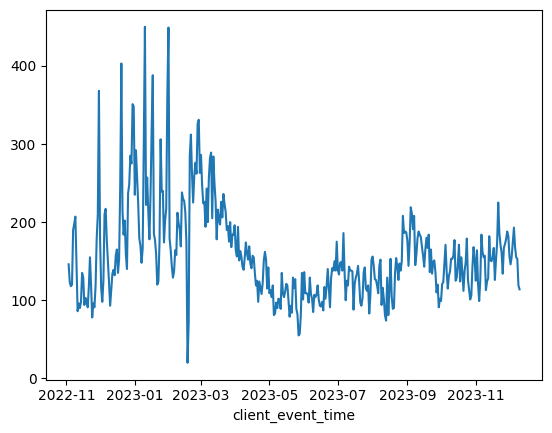

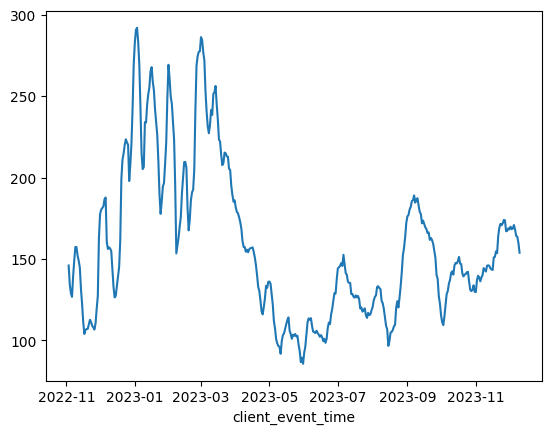

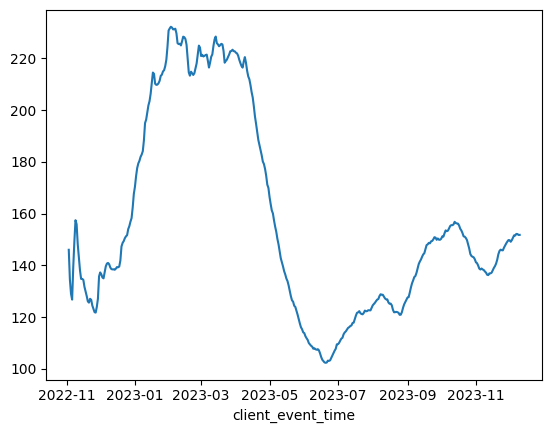

In [117]:
first_enter_pay_date = first_enter_pay_df\
                        .groupby(first_enter_pay_df['client_event_time'].dt.date)\
                        .size()

# check head
display(first_enter_pay_date.head(5))

# day plot            
first_enter_pay_date.plot()
plt.show()

# week plot
first_enter_pay_date.rolling(min_periods=1, window=7).mean().plot()
plt.show()

# month plot
first_enter_pay_date.rolling(min_periods=1, window=50).mean().plot()
plt.show()

In [118]:

print(f'first_subscript_df : {first_subscript_df.shape[0]}')
print(first_subscript_df.duplicated().sum())
print(f're_subscript_df : {re_subscript_df.shape[0]}')
print(re_subscript_df.duplicated().sum())
print(f'auto_pay_df : {auto_pay_df.shape[0]}')
print(auto_pay_df.duplicated().sum())

print("first_subscript_df, re_subscript_df")
temp = pd.merge(first_subscript_df, re_subscript_df
                , on=['user_id', 'client_event_time']
                , how='inner')
if temp.size > 0:
    temp = temp[['user_id', 'client_event_time']]
    display(temp)
    display(pd.merge(temp, first_subscript_df
                     , on=['user_id', 'client_event_time']
                     , how='inner'))
    display(pd.merge(temp, re_subscript_df
                     , on=['user_id', 'client_event_time']
                     , how='inner'))
    
print("auto_pay_df, re_subscript_df")
temp = pd.merge(auto_pay_df, re_subscript_df
                , on=['user_id', 'client_event_time']
                , how='inner')
if temp.size > 0:
    temp = temp[['user_id', 'client_event_time']]
    display(temp)
    display(pd.merge(temp, auto_pay_df
                     , on=['user_id', 'client_event_time']
                     , how='inner'))
    display(pd.merge(temp, re_subscript_df
                     , on=['user_id', 'client_event_time']
                     , how='inner'))

print("auto_pay_df, first_subscript_df")
temp = pd.merge(auto_pay_df, first_subscript_df
                , on=['user_id', 'client_event_time']
                , how='inner')
if temp.size > 0:
    temp = temp[['user_id', 'client_event_time']]
    display(temp)
    display(pd.merge(temp, auto_pay_df
                     , on=['user_id', 'client_event_time']
                     , how='inner'))
    display(pd.merge(temp, first_subscript_df
                     , on=['user_id', 'client_event_time']
                     , how='inner'))


first_subscript_df : 14289
2
re_subscript_df : 791
0
auto_pay_df : 15945
0
first_subscript_df, re_subscript_df
auto_pay_df, re_subscript_df


,user_id,client_event_time
0,0889fec8022c71328b877826576a764f,2022-11-18 02:49:40.687


,user_id,client_event_time,city,country,device_family,device_type,event_type,language,os_name,os_version,platform,plan_price,paid_amount,coupon_discount_amount,pg_type
0,0889fec8022c71328b877826576a764f,2022-11-18 02:49:40.687,Gwangjin-gu,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,107.0.0.0,Web,15920,15442,478,NaN


,user_id,client_event_time,city,country,device_family,device_type,event_type,language,os_name,os_version,platform,plan_price,paid_amount,coupon_discount_amount,pg_type
0,0889fec8022c71328b877826576a764f,2022-11-18 02:49:40.687,Gwangjin-gu,South Korea,Windows,Windows,resubscribe.subscription,Korean,Chrome,107.0.0.0,Web,15920,15442,478,NaN


auto_pay_df, first_subscript_df


,user_id,client_event_time
0,7fb2da7924c07cc24515000c9d2f237a,2022-09-24 01:45:02.179
1,2466261a18d5757e8504ff8045d4b0e1,2022-09-24 13:09:30.345
2,7f6ac355cd862e7361735903b53f1c92,2022-09-26 10:20:01.953
3,08e0a0b1e7ae39f10cba93cfbfec6ec1,2022-11-11 17:10:01.825
4,6b889dac8d1646374b43ccd0130182ff,2022-11-17 08:45:02.108


,user_id,client_event_time,city,country,device_family,device_type,event_type,language,os_name,os_version,platform,plan_price,paid_amount,coupon_discount_amount,pg_type
0,7fb2da7924c07cc24515000c9d2f237a,2022-09-24 01:45:02.179,Mapo-gu,South Korea,Mac,Mac,renew.subscription,Korean,Chrome,105,Web,15920,15920,0,NaN
1,2466261a18d5757e8504ff8045d4b0e1,2022-09-24 13:09:30.345,Seoul,South Korea,Mac,Mac,renew.subscription,Korean,Safari,14,Web,15920,15920,0,NaN
2,7f6ac355cd862e7361735903b53f1c92,2022-09-26 10:20:01.953,Sejong,South Korea,Linux,Linux,renew.subscription,Korean,Chrome,91,Web,15920,15920,0,NaN
3,08e0a0b1e7ae39f10cba93cfbfec6ec1,2022-11-11 17:10:01.825,Gangnam-gu,South Korea,Windows,Windows,renew.subscription,Korean,Chrome,107,Web,15920,15920,0,NaN
4,6b889dac8d1646374b43ccd0130182ff,2022-11-17 08:45:02.108,Seoul,South Korea,Mac,Mac,renew.subscription,Korean,Chrome,107.0.0.0,Web,131600,131600,0,NaN


,user_id,client_event_time,city,country,device_family,device_type,event_type,language,os_name,os_version,platform,plan_price,paid_amount,coupon_discount_amount,pg_type
0,7fb2da7924c07cc24515000c9d2f237a,2022-09-24 01:45:02.179,Mapo-gu,South Korea,Mac,Mac,complete.subscription,Korean,Chrome,105,Web,15920,15920,0,NaN
1,2466261a18d5757e8504ff8045d4b0e1,2022-09-24 13:09:30.345,Seoul,South Korea,Mac,Mac,complete.subscription,Korean,Safari,14,Web,15920,15920,0,NaN
2,7f6ac355cd862e7361735903b53f1c92,2022-09-26 10:20:01.953,Sejong,South Korea,Linux,Linux,complete.subscription,Korean,Chrome,91,Web,15920,15920,0,NaN
3,08e0a0b1e7ae39f10cba93cfbfec6ec1,2022-11-11 17:10:01.825,Gangnam-gu,South Korea,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,15920,15920,0,NaN
4,6b889dac8d1646374b43ccd0130182ff,2022-11-17 08:45:02.108,Seoul,South Korea,Mac,Mac,complete.subscription,Korean,Chrome,107.0.0.0,Web,131600,131600,0,NaN


첫 결제와 정기 결제는 겹치는게 없음\
만료후 재구독은 다른 두 데이터에서 겹치는 부분이 있지만\
수가 적고 데이터의 초기 부분이라 초기 운영의 오류의 수 있음

In [119]:
temp1 = first_subscript_df.groupby('user_id')['client_event_time'].min()
temp2 = auto_pay_df.groupby('user_id')['client_event_time'].min()
temp3 = re_subscript_df.groupby('user_id')['client_event_time'].min()

In [120]:
print(temp1.shape[0])
print(temp2.shape[0])

# merge first_subscript_df and auto_pay_df
result = pd.merge(temp1, temp2, how='inner', on='user_id')\
    .reset_index()\
    .rename(columns={'client_event_time_x' : 'first_subscript_date', 'client_event_time_y' : 'auto_pay_date'})
print(result.shape[0])

# Create a new column 'diff' in the result DataFrame
result['diff'] = result['first_subscript_date'] - result['auto_pay_date']
result['diff'] = result['diff'].dt.total_seconds()
result['diff'] = result['diff']

# 날짜 대소 비교
temp = result[result['diff'].abs() < 600]
display(temp)
display(temp['diff'].describe())
temp = result[result['diff'].abs() >= 600]
display(temp)
display(temp['diff'].describe())

13881
7498
5385


,user_id,first_subscript_date,auto_pay_date,diff
9,00713a0e97135815ea700dfe82ce49fb,2022-10-07 15:40:01.797,2022-10-07 15:40:01.779,0.018
18,010a4a8efd5fd2528719b5bd8098286a,2022-10-07 00:30:02.524,2022-10-07 00:30:02.004,0.520
21,0126ad7cca27944f9856d7c6ec5974b5,2022-10-03 01:20:01.864,2022-10-03 01:20:02.723,-0.859
24,01449049533c7dfe50cdfbdb605410e2,2022-11-06 19:05:02.671,2022-11-06 19:05:02.672,-0.001
27,0157e1eaf2645e7d4de1fba14fe72a0f,2022-10-10 02:40:01.405,2022-10-10 02:40:01.533,-0.128
...,...,...,...,...
5312,fc52c92792b44f3f461ddc1167aa90a1,2022-11-07 01:15:01.136,2022-11-07 01:15:01.644,-0.508
5319,fcdf96b4de5958aeabf554e6f7e9daec,2022-09-28 02:10:02.126,2022-09-28 02:10:01.625,0.501
5324,fd35e6f4c96e4f1d2b5ebd12ef26bced,2022-10-09 10:00:03.650,2022-10-09 10:00:02.763,0.887
5337,fdb13da083ec2460c8ab4dd4218363a0,2022-11-06 08:00:02.938,2022-11-06 08:00:02.412,0.526


count    479.000000
mean      -1.350777
std       23.333267
min     -451.367000
25%       -0.019000
50%        0.013000
75%        0.520000
max        1.411000
Name: diff, dtype: float64

,user_id,first_subscript_date,auto_pay_date,diff
0,0000572f2ba8079bcefd2760b632e820,2023-03-25 14:40:01.647,2023-04-25 14:45:01.747,-2.678700e+06
1,000be07bc09ceff42c11978f4a9f1c1a,2022-08-20 13:05:01.083,2022-11-20 13:10:01.891,-7.949101e+06
2,001ddbe4885db89888b34bf0eb14f6e1,2022-04-10 06:02:28.859,2023-01-21 09:00:05.092,-2.472106e+07
3,002109ba574914ed127dcae867110f91,2022-02-17 02:39:54.910,2023-02-17 08:10:06.967,-3.155581e+07
4,0031482d16469048027f6096d13c8b22,2023-09-10 23:34:21.696,2023-10-10 23:35:02.550,-2.592041e+06
...,...,...,...,...
5380,ffa1cfa6bc3b410a927be11e23ff5340,2022-12-19 12:50:01.076,2023-12-31 14:42:16.966,-3.257954e+07
5381,ffb19e67ac35d18a6711c55d2ace39ba,2022-08-10 05:25:22.823,2022-09-10 05:30:02.277,-2.678679e+06
5382,ffe13db0ad3751c9be06a73aa38bc9fc,2022-09-08 02:35:01.476,2022-10-08 02:40:02.035,-2.592301e+06
5383,ffe3e486f61399d62d83727e53a850dc,2022-07-30 06:04:32.692,2023-07-31 02:03:05.911,-3.160791e+07


count    4.906000e+03
mean    -8.818868e+06
std      1.033928e+07
min     -5.812338e+07
25%     -9.797943e+06
50%     -2.768429e+06
75%     -2.592301e+06
max     -6.000720e+02
Name: diff, dtype: float64

첫 구독과 정기 결제가 시간적으로 동일한(오차 1초 이내) 데이터가 존재한다.
두 데이터는 일부분 겹친다.\
첫구독은 언제나 구독날짜가 동일하거나 앞서있다.

In [121]:
print(temp2.shape[0])
print(temp3.shape[0])

# merge re_subscript_df and auto_pay_df
result = pd.merge(temp2, temp3, how='inner', on='user_id')\
    .reset_index()\
    .rename(columns={'client_event_time_x' : 'auto_pay_date', 'client_event_time_y' : 're_subscript_date'})
print(result.shape[0])

# Create a new column 'diff' in the result DataFrame
result['diff'] = result['auto_pay_date'] - result['re_subscript_date']
result['diff'] = result['diff'].dt.total_seconds()
result['diff'] = result['diff']

# 날짜 대소 비교
temp = result[result['diff'].abs() < 600]
display(temp)
display(temp['diff'].describe())
temp = result[result['diff'].abs() >= 600]
display(temp)
display(temp['diff'].describe())

7498
761
511


,user_id,auto_pay_date,re_subscript_date,diff
2,01420e0a936792dbdcabad14fe9fece1,2022-11-13 10:05:13.135,2022-11-13 10:05:13.681,-0.546
18,04230eb1c628b99fb70aa483344e47ad,2022-11-13 04:39:41.375,2022-11-13 04:39:42.825,-1.450
24,0772cb88d17b51d6822f12f315ba6687,2022-11-19 08:21:36.490,2022-11-19 08:21:36.503,-0.013
28,0889fec8022c71328b877826576a764f,2022-11-18 02:49:40.687,2022-11-18 02:49:40.687,0.000
51,1562a3b4d08ee3c44e068009fe01cbbe,2022-11-13 17:14:21.671,2022-11-13 17:14:21.661,0.010
57,1be14d4ed3bef4e82d3a2331ace77dc1,2022-11-08 10:50:44.742,2022-11-08 10:50:43.860,0.882
71,23a69672ced44709d2790430b6fecf33,2022-11-29 08:37:26.761,2022-11-29 08:37:27.293,-0.532
98,35588439329bcfa58841c588aba35201,2023-08-01 05:48:02.091,2023-08-01 05:40:11.642,470.449
106,3966266887fba64584a2c890fd7400d5,2022-11-12 04:48:28.011,2022-11-12 04:48:28.116,-0.105
129,4591c8f94f84533e7013713d9302a70b,2022-11-11 07:16:59.188,2022-11-11 07:16:59.748,-0.560


count     29.000000
mean      32.422828
std      122.401396
min       -1.665000
25%       -0.542000
50%       -0.105000
75%        0.001000
max      478.173000
Name: diff, dtype: float64

,user_id,auto_pay_date,re_subscript_date,diff
0,0108538a502bb0339cdee7d33f96a510,2023-02-01 01:05:26.946,2023-11-27 00:03:46.443,-2.582990e+07
1,010a54b7adcb47015c5813cf8509461e,2022-09-20 12:30:50.004,2023-04-13 03:36:01.458,-1.767991e+07
3,0169c3e54cbd0d8b35d7dd59b40ca65c,2022-10-13 06:00:07.462,2022-09-13 05:59:00.147,2.592067e+06
4,01946f0541feaf69418576cd1f77e321,2022-10-13 03:00:01.358,2023-07-10 02:22:25.467,-2.332574e+07
5,01bb08e6b27802710bb8421493ae3688,2023-09-10 12:40:03.073,2023-08-10 12:35:25.240,2.678678e+06
...,...,...,...,...
506,ff27c0ef4f7c2c87a09e295c496727f5,2023-07-25 02:35:02.556,2023-12-18 05:11:13.874,-1.262377e+07
507,ff917e8b6bcf53a48bd1b1efae5d00f5,2023-09-25 03:20:03.315,2022-09-25 03:17:16.348,3.153617e+07
508,ff9bb243eff83d84e2cb289ff629aba8,2023-08-25 07:03:48.454,2023-07-25 06:31:11.205,2.680357e+06
509,ffe13db0ad3751c9be06a73aa38bc9fc,2022-10-08 02:40:02.035,2023-08-19 13:29:33.039,-2.725497e+07


count    4.820000e+02
mean    -6.401387e+06
std      1.270910e+07
min     -3.965727e+07
25%     -1.596852e+07
50%      2.592007e+06
75%      2.678587e+06
max      3.153617e+07
Name: diff, dtype: float64

정기 결제와 재 구독은 겹치지 않는다.

In [122]:
print(temp1.shape[0])
print(temp3.shape[0])

result = pd.merge(temp1, temp3, how='inner', on='user_id')\
    .reset_index()\
    .rename(columns={'client_event_time_x' : 'first_subscript_date', 'client_event_time_y' : 're_subscript_date'})
print(result.shape[0])

result['diff'] = result['re_subscript_date'] - result['first_subscript_date']
result['diff'] = result['diff'].dt.total_seconds()
result['diff'] = result['diff']

# 날짜 대소 비교
temp = result[result['diff'].abs() < 600]
display(temp)
display(temp['diff'].describe())
temp = result[result['diff'].abs() >= 600]
display(temp)
display(temp['diff'].describe())

13881
761
402


,user_id,first_subscript_date,re_subscript_date,diff
7,0308b8ea736768f9399d3b81d34b00a0,2022-10-17 12:11:11.485,2022-10-17 12:11:11.486,0.001
41,182f52b6dcc8288afce0a629b4de3a9f,2022-10-18 08:00:02.292,2022-10-18 08:00:02.816,0.524
43,1a9bc9f6ba2ab755b45b04d981555ba5,2022-10-02 23:20:15.717,2022-10-02 23:20:14.827,-0.890
49,1d8c3941b13b5fd9969bbf2a350bc8cf,2022-10-25 02:06:12.900,2022-10-25 02:06:13.336,0.436
51,1da0b4afbbf62bbfa74e8e22c710919c,2022-11-01 10:10:33.510,2022-11-01 10:10:34.409,0.899
59,2466261a18d5757e8504ff8045d4b0e1,2022-09-24 07:43:38.349,2022-09-24 07:43:38.321,-0.028
63,274b46e35dfbfd919ef8ec923a3a16bb,2022-11-13 01:56:11.643,2022-11-13 01:56:11.784,0.141
77,308ee0950741e4321045d0ba604778de,2022-09-12 02:09:15.703,2022-09-12 02:09:15.193,-0.510
84,374312364e615be115ae0b43759a2b72,2022-10-01 14:09:51.447,2022-10-01 14:09:50.556,-0.891
104,41aa0116e4ddf9f13e4ccabd7f1f8040,2022-10-01 10:38:26.892,2022-10-01 10:38:27.442,0.550


count    22.000000
mean     -0.085636
std       0.482698
min      -0.891000
25%      -0.515500
50%      -0.006500
75%       0.108000
max       0.899000
Name: diff, dtype: float64

,user_id,first_subscript_date,re_subscript_date,diff
0,010a54b7adcb47015c5813cf8509461e,2022-07-18 00:53:24.343,2023-04-13 03:36:01.458,2.325136e+07
1,01420e0a936792dbdcabad14fe9fece1,2022-02-19 03:27:16.121,2022-11-13 10:05:13.681,2.309268e+07
2,01946f0541feaf69418576cd1f77e321,2022-10-13 03:00:01.875,2023-07-10 02:22:25.467,2.332574e+07
3,0221a206c47958f0983da6875b7c8e0f,2022-06-15 17:34:51.345,2022-10-25 08:36:09.184,1.137248e+07
4,0292f9b9e5eee6d5419862b20151993e,2023-07-27 10:03:51.920,2023-11-07 04:56:51.178,8.880779e+06
...,...,...,...,...
397,fe551a948c862c220158e34d3bc2bc47,2023-08-01 05:23:00.896,2023-12-19 06:26:21.393,1.209980e+07
398,ff27c0ef4f7c2c87a09e295c496727f5,2023-06-25 02:30:40.699,2023-12-18 05:11:13.874,1.521603e+07
399,ff386ac202b4d9791259039e8f5879f4,2023-07-23 04:03:59.033,2023-12-23 09:30:13.106,1.323877e+07
400,ff9bb243eff83d84e2cb289ff629aba8,2023-03-22 06:30:01.899,2023-07-25 06:31:11.205,1.080007e+07


count    3.800000e+02
mean     2.275585e+07
std      1.319475e+07
min      4.046058e+06
25%      1.217153e+07
50%      1.871865e+07
75%      3.264609e+07
max      5.720753e+07
Name: diff, dtype: float64

첫 구독과 재구독가 시간적으로 동일한(오차 1초 이내) 데이터가 존재한다.
두 데이터는 일부분 겹친다.\
첫구독은 언제나 구독날짜가 동일하거나 앞서있다.

In [123]:
# get too close log
check_too_close_log

<function __main__.check_too_close_log(df, offset=1)>

In [124]:
temp = first_subscript_df.groupby('user_id')['user_id'].count()
temp[temp > 1].sort_values(ascending=False)

user_id
3767d4c7a827422fccf61d45ae889669    8
f833cca4c382ac8c502c6f99bc432725    6
ccea16701cf72a9027d7d5f2c3d3019c    5
e04c24e899b1e875ed432a7b398a4308    4
1718432f54ebca48832fc7ee9a82810e    3
                                   ..
5817b1cfddd5cf26d9060b21949e526d    2
5802bceee9ecedf9a8b5608598bc19e0    2
57d0d79f7f708d49bcb33e24d7ba1e78    2
57ccaec293dd573fcd8d7697919719a6    2
ffe3e486f61399d62d83727e53a850dc    2
Name: user_id, Length: 361, dtype: int64

In [125]:
## set
# union all the pay data and compact
total_pay_df = pd.concat([first_subscript_df, re_subscript_df, auto_pay_df], axis=0).reset_index(drop=True)
total_pay_df = total_pay_df[['user_id', 'client_event_time', 'event_type']]

# sort by event time
total_pay_df = total_pay_df.sort_values(['user_id', 'client_event_time'])

# display
display(f'first_subscript_df : {first_subscript_df.shape[0]}')
display(f're_subscript_df : {re_subscript_df.shape[0]}')
display(f'auto_pay_df : {auto_pay_df.shape[0]}')
display(total_pay_df.shape[0])

temp = total_pay_df.groupby('user_id').count()
temp = temp[temp['client_event_time'] > 1]
mask = total_pay_df['user_id'].isin(temp.index)
display(total_pay_df[mask].head(25))

## process
# check too close log
temp = total_pay_df.groupby('user_id')['client_event_time'].diff().dt.total_seconds()
temp = temp.dropna().astype('float64')
display(temp)

too_close_log_index = temp[temp < 60].index
first_log_index = total_pay_df.groupby('user_id')['client_event_time'].idxmin().values

## get too close log
# mask : first + too close log
first_log_index = total_pay_df.groupby('user_id')['client_event_time'].idxmin().values
mask = list(first_log_index) + list(too_close_log_index)
mask = list(set(mask))
mask = total_pay_df.index.isin(mask)

# get only 'count() > 1' user
temp = total_pay_df[mask]
temp = temp.groupby('user_id')['user_id'].count()
too_close_log_user = temp[temp > 1].index

# get too close log in total_pay_df
result = total_pay_df[mask]
result = result[result['user_id'].isin(too_close_log_user)]
display(result)

# value count
result.groupby('user_id')['event_type'].sum().str.replace('.subscription', ', ').value_counts()

'first_subscript_df : 14289'

're_subscript_df : 791'

'auto_pay_df : 15945'

31025

,user_id,client_event_time,event_type
3179,0000572f2ba8079bcefd2760b632e820,2023-03-25 14:40:01.647,complete.subscription
22508,0000572f2ba8079bcefd2760b632e820,2023-04-25 14:45:01.747,renew.subscription
23150,0000572f2ba8079bcefd2760b632e820,2023-05-25 14:50:01.753,renew.subscription
3628,000be07bc09ceff42c11978f4a9f1c1a,2022-08-20 13:05:01.083,complete.subscription
17585,000be07bc09ceff42c11978f4a9f1c1a,2022-11-20 13:10:01.891,renew.subscription
20605,000be07bc09ceff42c11978f4a9f1c1a,2023-01-25 06:16:22.464,renew.subscription
4645,001ddbe4885db89888b34bf0eb14f6e1,2022-04-10 06:02:28.859,complete.subscription
20473,001ddbe4885db89888b34bf0eb14f6e1,2023-01-21 09:00:05.092,renew.subscription
5796,002109ba574914ed127dcae867110f91,2022-02-17 02:39:54.910,complete.subscription
21319,002109ba574914ed127dcae867110f91,2023-02-17 08:10:06.967,renew.subscription


22508    2.678700e+06
23150    2.592300e+06
17585    7.949101e+06
20605    5.677581e+06
20473    2.472106e+07
             ...     
22768    2.592300e+06
23466    2.678700e+06
25174    5.152425e+06
27086    4.406328e+06
14849    8.138235e+06
Name: client_event_time, Length: 14878, dtype: float64

,user_id,client_event_time,event_type
16202,00713a0e97135815ea700dfe82ce49fb,2022-10-07 15:40:01.779,renew.subscription
7743,00713a0e97135815ea700dfe82ce49fb,2022-10-07 15:40:01.797,complete.subscription
16164,010a4a8efd5fd2528719b5bd8098286a,2022-10-07 00:30:02.004,renew.subscription
9532,010a4a8efd5fd2528719b5bd8098286a,2022-10-07 00:30:02.524,complete.subscription
4691,0126ad7cca27944f9856d7c6ec5974b5,2022-10-03 01:20:01.864,complete.subscription
...,...,...,...
7574,fdb13da083ec2460c8ab4dd4218363a0,2022-11-06 08:00:02.938,complete.subscription
9281,fdd65930c3cb37b64725377df0a7b380,2022-11-17 06:20:03.725,complete.subscription
9282,fdd65930c3cb37b64725377df0a7b380,2022-11-17 06:20:03.875,complete.subscription
8131,fe47fabc4baa52ef9f85cd749349a33f,2022-09-25 15:10:01.739,complete.subscription


event_type
renew, complete,                     259
complete, renew,                     190
complete, complete,                   48
complete, resubscribe,                22
renew, complete, complete,            21
renew, resubscribe,                   10
resubscribe, complete,                10
complete, renew, complete,             6
complete, renew, renew,                5
renew, complete, renew,                5
resubscribe, renew,                    4
resubscribe, complete, renew,          1
complete, resubscribe, complete,       1
renew, complete, renew, renew,         1
resubscribe, complete, complete,       1
complete, complete, renew,             1
Name: count, dtype: int64

#### 데이터 통합

In [23]:
if len(DF) > 0:
    DF = []

DF = pd.concat(dfs[:9] + dfs[10:], axis=0).reset_index(drop=True)
print(DF.shape[0])

encoder_dict = dict()
DF['os_version'] = DF['os_version'].astype(str)
col_unique_dict['os_version'] = { str(x) for x in list(col_unique_dict['os_version']) }

for col in DF.columns:
    # exception handling
    if col in ['client_event_time', 'device_carrier']:
        continue
    
    
    print(f"\n\n{col}")
    
    # label encoding
    le = LabelEncoder()
    le = le.fit([ None, np.nan ] + list(col_unique_dict[col]))
    
    # update encoder_dict
    encoder_dict[col] = le
    
    # update DF
    DF[col] = le.transform(DF[col])
    
    # display
    display(DF[col].value_counts())
    
DF

9751911


city


city
3439    1915512
3435     345250
4340     342851
3693     310560
1227     289517
         ...   
1465          1
1516          1
1269          1
3348          1
4108          1
Name: count, Length: 4286, dtype: int64



country


country
157    9321855
189     210475
180      64511
84       27114
30       19886
        ...   
89           1
102          1
37           1
117          1
122          1
Name: count, Length: 189, dtype: int64



device_family


device_family
1028    5834483
569     1560914
134      873957
772      494877
128      371959
         ...   
260           1
655           1
674           1
780           1
301           1
Name: count, Length: 1118, dtype: int64



device_type


device_type
608    5834483
157    1560914
37      667688
3       371959
652     277591
        ...   
582          1
223          1
170          1
374          1
596          1
Name: count, Length: 652, dtype: int64



event_type


event_type
4     2826034
10    2133548
8     1914257
3     1379136
12     596829
2      172911
11     165061
5      145133
15     124917
7      120582
1       93962
16      30621
0       17895
13      15945
6       14289
14        791
Name: count, dtype: int64



language


language
37    9133166
14     459437
71     131294
32      10897
9        3621
       ...   
8           1
59          1
62          1
60          1
33          1
Name: count, Length: 71, dtype: int64



os_name


os_name
3     6091683
9      986382
22     508092
33     393228
39     341653
16     334088
34     315881
6      198861
5      156689
44     134022
38     110246
11      58070
4       54052
12      38803
14      19582
25       3931
40       2591
2        1643
1         747
19        483
37        247
27        237
35        144
10        115
0         114
29         52
31         51
18         49
15         37
32         32
41         30
7          26
36         24
30          8
13          5
20          4
26          2
21          1
23          1
24          1
42          1
17          1
28          1
8           1
Name: count, dtype: int64



os_version


os_version
3001    484070
222     424228
3017    400141
467     381805
89      353356
         ...  
1327         1
2975         1
1754         1
98           1
1689         1
Name: count, Length: 3048, dtype: int64



platform


platform
0    9620617
2     131294
Name: count, dtype: int64



user_id


user_id
179757    2861025
56111       30063
147615      24341
101728       5157
3798         4752
           ...   
174128          1
110869          1
9732            1
88956           1
169600          1
Name: count, Length: 178823, dtype: int64



content.id


content.id
212    3674696
200     464889
199     449691
84      324251
158     317523
        ...   
47           1
129          1
62           1
122          1
24           1
Name: count, Length: 211, dtype: int64



button.name


button.name
9    9665669
5      40961
6      27797
1      13596
2       2513
3        907
4        293
0        174
7          1
Name: count, dtype: int64



button_name


button_name
5    9712960
3      23793
0       6094
2       5348
1       3716
Name: count, dtype: int64



question.id


question.id
7796    8927122
6966       6160
7618       3607
5969       3324
5981       2875
         ...   
6004          1
7318          1
4874          1
1461          1
1172          1
Name: count, Length: 7796, dtype: int64



lesson.id


lesson.id
5489    6101088
4120      23015
2073      16234
48        15803
3562      15409
         ...   
1734          1
2817          1
1963          1
4265          1
3081          1
Name: count, Length: 5014, dtype: int64



type


type
7    9606953
3      89484
2      21465
4      19440
0      14126
1        442
5          1
Name: count, dtype: int64



plan.price


plan.price
13    9718447
1       21343
11       4060
3        2230
4        2171
9        1500
5         850
6         496
8         461
7         326
0          23
10          3
2           1
Name: count, dtype: int64



paid_amount


paid_amount
51    9720886
12      16836
49       2261
30       2160
22       1742
40       1483
1         896
0         871
6         855
33        827
34        494
39        461
36        325
43        316
17        254
7         242
5         213
16        101
44         99
42         95
14         71
11         68
41         56
10         40
4          38
15         28
37         27
21         24
48         24
29         20
38         17
9          13
47         12
8           9
28          8
2           6
45          5
26          4
19          4
18          3
20          3
46          3
25          2
24          2
3           1
13          1
32          1
23          1
31          1
27          1
35          1
Name: count, dtype: int64



coupon.discount_amount


coupon.discount_amount
45    9720886
2       26590
28        896
33        871
12        855
37        316
25        254
8         219
16        213
29        101
34         96
38         95
36         71
3          68
39         56
4          40
20         38
31         28
40         27
6          24
18         24
42         20
1          18
9          17
5          13
26         12
7           9
11          8
21          7
24          6
32          5
19          4
15          4
30          3
10          3
17          3
43          2
23          2
35          1
0           1
13          1
27          1
14          1
41          1
22          1
Name: count, dtype: int64



pg.type


pg.type
4    9747364
0       3731
1        767
2         49
Name: count, dtype: int64



content.difficulty


content.difficulty
5    9626994
1      58628
3      36109
0      27485
2       2695
Name: count, dtype: int64



plan.type


plan.type
3    9749472
1       1278
0       1161
Name: count, dtype: int64



trial.type


trial.type
3    9721290
0      28182
1       2439
Name: count, dtype: int64

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,...,question.id,lesson.id,type,plan.price,paid_amount,coupon.discount_amount,pg.type,content.difficulty,plan.type,trial.type
0,885,2023-04-10 14:57:48.556,157,1028,608,0,37,3,348,0,...,7796,5489,7,13,51,45,4,5,3,3
1,3439,2023-03-12 08:26:16.224,157,129,4,0,14,22,903,0,...,7796,5489,7,13,51,45,4,5,3,3
2,3944,2023-03-12 08:23:04.955,157,1028,608,0,37,3,309,0,...,7796,5489,7,13,51,45,4,5,3,3
3,966,2023-03-12 08:32:39.271,157,1028,608,0,37,3,309,0,...,7796,5489,7,13,51,45,4,5,3,3
4,1259,2023-04-12 11:36:28.311,157,1028,608,0,37,3,348,0,...,7796,5489,7,13,51,45,4,5,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9751906,2764,2022-02-21 04:56:12.117,157,1028,608,16,37,3,3018,0,...,7796,5489,7,13,51,45,4,5,3,0
9751907,3439,2022-02-21 04:49:35.114,157,129,4,16,37,22,843,0,...,7796,5489,7,13,51,45,4,5,3,0
9751908,3423,2022-02-21 04:37:53.294,157,1028,608,16,37,3,3018,0,...,7796,5489,7,13,51,45,4,5,3,0
9751909,3439,2022-02-21 04:13:10.443,157,134,37,16,37,22,843,0,...,7796,5489,7,13,51,45,4,5,3,0


In [24]:
# save encoder_dict
for encoder in encoder_dict:
    print(f"\n\n{encoder}")
    np.save(f'./encoders/{encoder}.npy', encoder_dict[encoder].classes_)
    
# save the DF
DF.to_csv('total.csv', index=False)



city


country


device_family


device_type


event_type


language


os_name


os_version


platform


user_id


content.id


button.name


button_name


question.id


lesson.id


type


plan.price


paid_amount


coupon.discount_amount


pg.type


content.difficulty


plan.type


trial.type


In [25]:
com_DF = DF[core_cols].copy() # copy core_cols

# le = LabelEncoder()
# le = le.fit(DF['event_type'])
# com_DF['event_type'] = le.transform(DF['event_type'])

print(com_DF.info())
DF.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9751911 entries, 0 to 9751910
Data columns (total 3 columns):
 #   Column             Dtype         
---  ------             -----         
 0   user_id            int32         
 1   event_type         int32         
 2   client_event_time  datetime64[ns]
dtypes: datetime64[ns](1), int32(2)
memory usage: 148.8 MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9751911 entries, 0 to 9751910
Data columns (total 24 columns):
 #   Column                  Dtype         
---  ------                  -----         
 0   city                    int32         
 1   client_event_time       datetime64[ns]
 2   country                 int32         
 3   device_family           int32         
 4   device_type             int32         
 5   event_type              int32         
 6   language                int32         
 7   os_name                 int32         
 8   os_version              int32         
 9   platform                int

In [29]:
big_df = pd.read_csv(path.join(BaseFilePath, dirname, filelist[9]), chunksize=2000000)
enc_chunks = []

for i, chunk in enumerate(big_df):
    # preprocessing
    chunk = chunk.drop('device_carrier', axis=1)
    chunk['client_event_time'] = pd.to_datetime(chunk['client_event_time'])
    chunk['os_version'] = chunk['os_version'].astype(str)
    
    # display
    print(f"\n\n{i}")
    print(chunk.info())
    
    # encoding
    for col in chunk.columns:
        # exception handling
        if col in ['client_event_time', 'device_carrier', 'is_trial', 'is_free_trial']:
            continue
        
        # label encoding
        chunk[col] = encoder_dict[col].transform(chunk[col])
        
    enc_chunks.append(chunk)
    
big_df = pd.concat(enc_chunks, axis=0)

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\2755470516.py:4: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(big_df):




0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 0 to 1999999
Data columns (total 16 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time  object 
 2   country            object 
 3   device_carrier     float64
 4   device_family      object 
 5   device_type        object 
 6   event_type         object 
 7   language           object 
 8   os_name            object 
 9   os_version         object 
 10  platform           object 
 11  user_id            object 
 12  content.id         object 
 13  is_trial           object 
 14  lesson.id          object 
 15  is_free_trial      float64
dtypes: float64(2), object(14)
memory usage: 244.1+ MB
None


1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 2000000 to 3999999
Data columns (total 16 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time  obje

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\2755470516.py:4: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(big_df):




2
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 4000000 to 5999999
Data columns (total 16 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time  object 
 2   country            object 
 3   device_carrier     float64
 4   device_family      object 
 5   device_type        object 
 6   event_type         object 
 7   language           object 
 8   os_name            object 
 9   os_version         object 
 10  platform           object 
 11  user_id            object 
 12  content.id         object 
 13  is_trial           object 
 14  lesson.id          object 
 15  is_free_trial      float64
dtypes: float64(2), object(14)
memory usage: 244.1+ MB
None


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\2755470516.py:4: DtypeWarning: Columns (9,13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(big_df):




3
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 6000000 to 7999999
Data columns (total 16 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time  object 
 2   country            object 
 3   device_carrier     float64
 4   device_family      object 
 5   device_type        object 
 6   event_type         object 
 7   language           object 
 8   os_name            object 
 9   os_version         object 
 10  platform           object 
 11  user_id            object 
 12  content.id         object 
 13  is_trial           object 
 14  lesson.id          object 
 15  is_free_trial      object 
dtypes: float64(1), object(15)
memory usage: 244.1+ MB
None


4
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 8000000 to 9999999
Data columns (total 16 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\2755470516.py:4: DtypeWarning: Columns (9,15) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(big_df):




5
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 10000000 to 11999999
Data columns (total 16 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time  object 
 2   country            object 
 3   device_carrier     float64
 4   device_family      object 
 5   device_type        object 
 6   event_type         object 
 7   language           object 
 8   os_name            object 
 9   os_version         object 
 10  platform           object 
 11  user_id            object 
 12  content.id         object 
 13  is_trial           float64
 14  lesson.id          object 
 15  is_free_trial      object 
dtypes: float64(2), object(14)
memory usage: 244.1+ MB
None


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\2755470516.py:4: DtypeWarning: Columns (9,15) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(big_df):




6
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 12000000 to 13999999
Data columns (total 16 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time  object 
 2   country            object 
 3   device_carrier     float64
 4   device_family      object 
 5   device_type        object 
 6   event_type         object 
 7   language           object 
 8   os_name            object 
 9   os_version         object 
 10  platform           object 
 11  user_id            object 
 12  content.id         object 
 13  is_trial           float64
 14  lesson.id          object 
 15  is_free_trial      object 
dtypes: float64(2), object(14)
memory usage: 244.1+ MB
None


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\2755470516.py:4: DtypeWarning: Columns (13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(big_df):




7
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 14000000 to 15999999
Data columns (total 16 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time  object 
 2   country            object 
 3   device_carrier     float64
 4   device_family      object 
 5   device_type        object 
 6   event_type         object 
 7   language           object 
 8   os_name            object 
 9   os_version         object 
 10  platform           object 
 11  user_id            object 
 12  content.id         object 
 13  is_trial           object 
 14  lesson.id          object 
 15  is_free_trial      object 
dtypes: float64(1), object(15)
memory usage: 244.1+ MB
None


8
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 16000000 to 17999999
Data columns (total 16 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_5528\2755470516.py:4: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  for i, chunk in enumerate(big_df):




9
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000000 entries, 18000000 to 19999999
Data columns (total 16 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time  object 
 2   country            object 
 3   device_carrier     float64
 4   device_family      object 
 5   device_type        object 
 6   event_type         object 
 7   language           object 
 8   os_name            object 
 9   os_version         object 
 10  platform           object 
 11  user_id            object 
 12  content.id         object 
 13  is_trial           object 
 14  lesson.id          object 
 15  is_free_trial      float64
dtypes: float64(2), object(14)
memory usage: 244.1+ MB
None


10
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1029707 entries, 20000000 to 21029706
Data columns (total 16 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   city    

In [30]:
print(big_df.info())
big_df.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21029707 entries, 0 to 21029706
Data columns (total 15 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               int32         
 1   client_event_time  datetime64[ns]
 2   country            int32         
 3   device_family      int32         
 4   device_type        int32         
 5   event_type         int32         
 6   language           int32         
 7   os_name            int32         
 8   os_version         int32         
 9   platform           int32         
 10  user_id            int32         
 11  content.id         int32         
 12  is_trial           object        
 13  lesson.id          int32         
 14  is_free_trial      object        
dtypes: datetime64[ns](1), int32(12), object(2)
memory usage: 1.4+ GB
None


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id,is_trial,lesson.id,is_free_trial
0,4170,2023-04-05 21:46:04.333,157,1028,608,9,37,3,348,0,102080,124,False,4543,NaN
1,4170,2023-04-05 21:55:50.787,157,1028,608,9,37,3,348,0,102080,124,False,4543,NaN
2,4170,2023-04-05 21:55:55.684,157,1028,608,9,37,3,348,0,102080,124,False,2557,NaN
3,978,2023-04-05 21:04:55.828,157,569,157,9,37,3,348,0,125591,80,False,2277,NaN
4,978,2023-04-05 21:05:34.139,157,569,157,9,37,3,348,0,125591,181,False,409,NaN


In [31]:
le1 = LabelEncoder()
le1 = le.fit(big_df['is_trial'])
le2 = LabelEncoder()
le2 = le.fit(big_df['is_free_trial'])

big_df['is_trial'] = le1.transform(big_df['is_trial'])
big_df['is_free_trial'] = le2.transform(big_df['is_free_trial'])

print(big_df.info())
big_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21029707 entries, 0 to 21029706
Data columns (total 15 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               int32         
 1   client_event_time  datetime64[ns]
 2   country            int32         
 3   device_family      int32         
 4   device_type        int32         
 5   event_type         int32         
 6   language           int32         
 7   os_name            int32         
 8   os_version         int32         
 9   platform           int32         
 10  user_id            int32         
 11  content.id         int32         
 12  is_trial           int32         
 13  lesson.id          int32         
 14  is_free_trial      int32         
dtypes: datetime64[ns](1), int32(14)
memory usage: 1.3 GB
None


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id,is_trial,lesson.id,is_free_trial
0,4170,2023-04-05 21:46:04.333,157,1028,608,9,37,3,348,0,102080,124,0,4543,2
1,4170,2023-04-05 21:55:50.787,157,1028,608,9,37,3,348,0,102080,124,0,4543,2
2,4170,2023-04-05 21:55:55.684,157,1028,608,9,37,3,348,0,102080,124,0,2557,2
3,978,2023-04-05 21:04:55.828,157,569,157,9,37,3,348,0,125591,80,0,2277,2
4,978,2023-04-05 21:05:34.139,157,569,157,9,37,3,348,0,125591,181,0,409,2


In [32]:
# save encoder_dict
np.save(f'./encoders/is_trial.npy', le1.classes_)
np.save(f'./encoders/is_free_trial.npy', le2.classes_)
    
# save the big_df
big_df.to_csv('total_lesson.csv', index=False)
print('done')

done


## 전처리

### 모듈 및 인코더 전처리

#### 모듈

In [75]:
# 파일
import os
import os.path as path

# 데이터
import pandas as pd
import numpy as np
from datetime import datetime as dt

# 인코딩
from sklearn.preprocessing import LabelEncoder

# 시각화
import matplotlib.pyplot as plt
import seaborn as sns

# 매직 함수 (주피터 노트북에만 사용하는 편의성 함수)
from IPython.core.magic import register_cell_magic

#### 매직 함수 (편의성 함수)

In [76]:
@register_cell_magic
def skip(line, cell):
    return

#### 인코더 불러오기

In [77]:
# 베이스 경로
BasePath = "./encoders"

# 인코더 파일 리스트
encoder_file_list = os.listdir(BasePath)

# 인코더 파일 확인
print(encoder_file_list)

## 인코더 파일 불러오기
# 인코더 딕셔너리 생성
encoder_dict = {}

# 인코더 파일 불러오기
for file in encoder_file_list:
    # 각 인코더 불러오기
    encoder_name = file.replace(".npy", "")
    encoder_dict[encoder_name] = LabelEncoder()
    classes = np.load(path.join(BasePath, file), allow_pickle=True)
    encoder_dict[encoder_name].classes_ = np.load(path.join(BasePath, file), allow_pickle=True)
    
    # 전처리에서 제외되는 데이터이지만, 만일을 위한 데이터 변환 (없어도 무방)
    if encoder_name == "os_version":
        encoder_dict[encoder_name].fit(list(map(lambda x: str(x), classes)))

['button.name.npy', 'button_name.npy', 'city.npy', 'content.difficulty.npy', 'content.id.npy', 'country.npy', 'coupon.discount_amount.npy', 'device_family.npy', 'device_type.npy', 'event_type.npy', 'is_free_trial.npy', 'is_trial.npy', 'language.npy', 'lesson.id.npy', 'os_name.npy', 'os_version.npy', 'paid_amount.npy', 'pg.type.npy', 'plan.price.npy', 'plan.type.npy', 'platform.npy', 'question.id.npy', 'trial.type.npy', 'type.npy', 'user_id.npy']


#### 인코더 일부 재배치하기

In [78]:
# 인코더 일부분 일괄 변환
for encoder_name in encoder_dict.keys():
    # 인코더 재배치 : encoder[0] = nan(결측치)
    encoder_dict[encoder_name].classes_ = \
        np.append(encoder_dict[encoder_name].classes_[-1],\
                    encoder_dict[encoder_name].classes_[:-1])

    # 인코더 클래스 확인
    print(f"\n{encoder_name} : {(encoder_dict[encoder_name].classes_.shape[0]) - 1} 가지\n{encoder_dict[encoder_name].classes_[1:6]}")

# 'event_type' 인코더 classes 재배치
data_set_names = [
    'error',
    'enter.main_page',
    'enter.signup_page',
    'complete.signup',
    'enter.content_page',
    'click.content_page_start_content_button',
    'click.content_page_more_review_button',
    'enter.payment_page',
    'complete.subscription',
    'renew.subscription',
    'resubscribe.subscription',
    'start.free_trial',
    'start.content',
    'enter.lesson_page',
    'complete.lesson',
    'click.lesson_page_related_question_box',
    'end.content',
    'click.cancel_plan_button'
]

# 'event_type' 인코더 재배치
encoder_dict['event_type'].classes_ = np.array(data_set_names)


button.name : 9 가지
['구독 시작하기' '무료로 들어보기' '무료로 시작하기' '최저가 혜택 받기' '최저가로 시작하기']

button_name : 5 가지
['무료로 시작하기' '수강시작' '수강하기' '이어하기' None]

city : 4340 가지
["'Ewa Beach" '6th of October City' 'A Coruña' 'A Me' 'AElmhult']

content.difficulty : 5 가지
['advanced' 'beginner' 'hard' 'intermediate' None]

content.id : 212 가지
['011a040b817225cb7c01d4676c21ea44' '01d9424fd9d2b1d7a4392042fc646061'
 '035f018008f1696ded6e10e1dd757726' '03b4a290c08f7fa83933827a994f2e61'
 '040ccaa97a52e006a2c94bb7c5dce263']

country : 189 가지
['Afghanistan' 'Albania' 'Algeria' 'American Samoa' 'Angola']

coupon.discount_amount : 45 가지
[-52400 -48400 0 478 796]

device_family : 1120 가지
['10A30Q' '21051182G' '21061110AG' '21061119AG' '21061119AL']

device_type : 652 가지
['Amazon Fire HD 10' 'Amazon Fire HD 8' 'Amazon Kindle Fire HDX' 'Android'
 'Apple iPad']

event_type : 18 가지
['click.cancel_plan_button' 'click.content_page_more_review_button'
 'click.content_page_start_content_button'
 'click.lesson_page_related_questio

#### 인코더 테스트  << skipping >>

In [ ]:
%%skip  # << skipping >>

## 주의사항
# 1. BaseFilePath에 데이터 파일 경로를 설정해주세요.
# 2. 제외하고 싶은 컬럼이 있으면 exclude_columns에 추가해주세요.
# 3. 인코딩을 하고 컬럼 이름을 바꿔 주세요.

## 함수 설명
# .transform()을 이용해서 데이터를 변환해주세요.
# .inverse_transform()을 이용해서 데이터를 역변환해주세요.


## 인코딩
# 개인적으로 BaseFilePath를 설정해주었는데, 이를 이용해서 파일 리스트를 불러오는 코드입니다.
BaseFilePath = './data'
filelist = os.listdir(BaseFilePath)[:-1]

# 제외 컬럼
exclude_columns = ['device_carrier', 'os_version']

# 제외 컬럼 : 제외하고 싶은 컬럼을 추가합니다.
exclude_columns_plus = []

## 메인
# 파일 리스트 확인
print(filelist)

# 데이터 리스트 선언
dfs = []

# 파일별 데이터 불러오기
for file in filelist:
    # csv 파일만 불러오기
    if file.endswith('.csv'):
        # 데이터 불러오기
        df = pd.read_csv(path.join(BaseFilePath, file), nrows=1000)
        
        # 전처리
        # 1. os_version, device_carrier 제외
        df = df.drop('device_carrier', axis=1)
        df = df.drop('os_version', axis=1)
        # 2. client_event_time을 datetime으로 변환
        df['client_event_time'] = pd.to_datetime(df['client_event_time'])
        
        # 데이터 추가
        dfs.append(df)
        # 데이터 크기 확인
        print(f"file: {file}, shape: {df.shape}")

# 데이터 확인
for i, df in enumerate(dfs):
    # 인코딩할 대상 데이터 확인
    print(f"file: {filelist[i]} encodings - ")
    
    # 인코딩
    for col in df.columns:
        # exception handling : 인코딩 제외 대상
        if col not in encoder_dict:
            continue
        if col in exclude_columns + exclude_columns_plus:
            continue
        
        # 컬럼 인코딩
        df[col] = encoder_dict[col].transform(df[col])
        print(f"{col}: {encoder_dict[col].classes_[:5]}")
    
    # 결과 확인
    display(df.head())

In [80]:
%%skip  # << skipping >>

# 디코딩
for i, df in enumerate(dfs):
    print(f"file: {filelist[i]} decodings - ")
    
    # 디코딩
    for col in df.columns:
        # exception handling : 디코딩 제외 대상
        if col not in encoder_dict:
            continue
        if col in exclude_columns + exclude_columns_plus:
            continue
        
        # 컬럼 디코딩
        df[col] = encoder_dict[col].inverse_transform(df[col])
        print(f"{col}: {encoder_dict[col].classes_[:5]}")
    
    # 결과 확인인
    display(df.head())

### 파일 전처리

#### 파일 불러오기 함수 정의  << skipping >>

In [81]:
def read_sample(path, samplesize=4000000):
    '''
    #### 데이터를 불러오되 일정 크기 이상이면 샘플로 추출하여 크기를 줄입니다. \n
     \n
    path : 파일 경로입니다. \n
    samplesize : 추출할 샘플의 크기입니다.(default: 4000000), 0 이라면 하지 않습니다. \n
     \n
    chunksize(=2000000)로 불러와서 samplesize를 넘으면 샘플링하고 중복을 제거합니다. \n
     \n
    return : 데이터프레임을 반환합니다. \n
    '''
    
    # 데이터프레임 리스트
    df = []
    
    # 불러오기
    temp = pd.read_csv(path, chunksize=2000000)
    
    # 추가
    for chunk in temp:
        df.append(chunk)
    
    # 길이 확인 후, 결합
    if len(df) == 1:
        df = df[0]
    else:
        df = pd.concat(df, ignore_index=True)
    
    # 샘플링 후 중복제거
    if (samplesize != 0) and (df.shape[0] > samplesize):
        df = df.sample(samplesize, replace=True)
        df.drop_duplicates(inplace=True)
        df.reset_index(drop=True, inplace=True) 
    
    return df

#### 파일 탐색  << skipping >>

In [ ]:
# %%skip  # << skipping >>

# 데이터 있는 기본 경로
BaseFilePath = './data'
filelist = os.listdir(BaseFilePath)

# 파일 이름 필터링
dirname = [f for f in filelist if not f.endswith('.zip')][1]
print(dirname)

주제 2. 구독서비스 프로덕트 데이터 분석


<>:4: SyntaxWarning: invalid escape sequence '\C'
<>:4: SyntaxWarning: invalid escape sequence '\C'
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_22036\3243263701.py:4: SyntaxWarning: invalid escape sequence '\C'
  BaseFilePath = 'd:\Codeit\intermediate_project'


#### 로드 데이터  << skipping >>

In [83]:
%%skip  # << skipping >>

# 변수 선언
DF = []
dfs = []
common_cols = []
all_cols = []
core_cols = ['user_id', 'event_type', 'client_event_time']

# 파일 리스트
filelist = os.listdir(path.join(BaseFilePath, dirname))

# 파일 불러오기
for filename in filelist:
    # csv
    if filename.endswith('.csv'):
        print('csv file found')
    
        # 불러오기
        df = read_sample(path.join(BaseFilePath, dirname, filename))

        # 공통 걸럼이 없으면, 현재 컬럼을 공통 컬럼으로 설정            
        if common_cols == [] and list(df.columns):
            common_cols = list(df.columns)
        
        # 공통 컬럼 추가
        common_cols = list(set(common_cols).intersection(set(df.columns)))
        all_cols = list(set(all_cols).union(set(df.columns)))

        ## 전처리
        # 1. device_carrier 제외
        df = df.drop('device_carrier', axis=1)
        # 2. os_version을 string으로 변환 (없어도 무방)
        df['os_version'] = df['os_version'].astype(str)
        # 3. client_event_time을 datetime으로 변환
        df['client_event_time'] = pd.to_datetime(df['client_event_time'])

        # 업데이트
        dfs.append(df)

    # .csv 아니면 넘어가기    
    else:
        print('other file found')
        print(filename)

# 공통 컬럼 확인
print(common_cols)

#### 데이터 통합  << skipping >>

In [84]:
%%skip  # << skipping >>

# DF 초기화 : 혹시 모를 렘 절약
if len(DF) > 0:
    DF = []

# dfs 결합
DF = pd.concat(dfs[:9] + dfs[10:], axis=0).reset_index(drop=True)
print(DF.shape[0])

## 전처리
# os_version 제외
DF = DF.drop('os_version', axis=1)

# 인코딩
for col in DF.columns:
    # 인코딩 제외 대상
    if col in ['client_event_time', 'device_carrier']:
        continue
    
    # 대상 컬럼 확인
    print(f"\n\n{col}")
    
    # 인코딩
    DF[col] = encoder_dict[col].transform(DF[col])
    
    # 인코딩 결과 확인
    display(DF[col].value_counts())

# 결과 확인  
DF

In [85]:
%%skip  # << skipping >>

# core_cols 만 추출
com_DF = DF[core_cols].copy()

# 데이터 확인
print(com_DF.info())
DF.info()

In [86]:
%%skip  # << skipping >>

# 데이터 불러오기
big_df = pd.read_csv(path.join(BaseFilePath, dirname, filelist[9]), chunksize=2000000)
enc_chunks = []

# 데이터 확인
for i, chunk in enumerate(big_df):
    # 전처리
    # 1. 'device_carrier', 'os_version' 제외
    chunk = chunk.drop('device_carrier', axis=1)
    chunk = chunk.drop('os_version', axis=1)
    # 2. 'client_event_time'을 datetime으로 변환
    chunk['client_event_time'] = pd.to_datetime(chunk['client_event_time'])
    
    # 결과 확인
    print(f"\n\n{i}")
    print(chunk.info())
    
    # 인코딩
    for col in chunk.columns:
        # 인코딩 제외 대상
        if col in ['client_event_time', 'device_carrier']:
            continue
        
        # 라벨 인코딩
        chunk[col] = encoder_dict[col].transform(chunk[col])
    
    # 데이터 추가
    enc_chunks.append(chunk)

# 데이터 결합 및 확인
big_df = pd.concat(enc_chunks, axis=0)

In [87]:
%%skip  # << skipping >>

# 데이터 확인
print(big_df.info())
big_df.head()

#### 인코딩 데이터 저장  << skipping >>

In [88]:
%%skip  # << skipping >>

# big_df 저장
big_df.to_csv('total_lesson.csv', index=False)
print('done - save total_lesson.csv')

# DF 저장장
DF.to_csv('total.csv', index=False)
print('done - save total.csv')

## 분석

### 분석 전 세팅

#### 변수 선언

In [89]:
# 데이터 핵심 컬럼
core_col = ['client_event_time', 'user_id', 'event_type']
# 핵심 색상
core_color = ['red', 'blue', 'green']

#### 함수 정의

In [90]:
def get_last_payment(target_time, user_df, payment_df, display_opt = True):
    '''
    #### 마지막 결제 정보를 확인합니다. \n
    \n
    target_time : 대상 시간 \n
    user_df : 사용자 정보 데이터프레임 \n
    payment_df : 결제 정보 데이터프레임 \n
    display_opt : 결과를 DataFrame으로 표시할지 여부 \n
    \n
    return : 결과를 반환합니다. \n
    '''
    
    # 마지막 결제 정보
    last_payment = payment_df[payment_df['client_event_time'] < target_time].groupby('user_id')['client_event_time'].max()
    #
    temp_df1 = last_payment.reset_index()
    temp_df2 = payment_df[['user_id', 'client_event_time', 'event_type']]
    #
    last_payment = pd.merge(temp_df1, temp_df2, on=['user_id', 'client_event_time'], how='left')
    last_payment.rename(columns={'event_type' : 'last_payment_type', 'client_event_time' : 'last_payment_time'}, inplace=True)

    # 결과 생성
    result = pd.DataFrame(user_df['user_id'], columns=['user_id'])
    result = pd.merge(result, last_payment, on='user_id', how='left')
    #
    result.fillna({'last_payment_time' : MAX_DATE, 'last_payment_type' : 0}, inplace=True)
    result = result.astype({'last_payment_type' : 'int16'})
    result['last_payment_type'] = encoder_dict['event_type'].inverse_transform(result['last_payment_type'])

    # 결과 확인
    if display_opt:
        display(result)
    
    # 결과 반환
    return result

In [91]:
def check_too_close_log(df, offset = 1):
    '''
    #### offset 이내의 로그들을 출력하고 로그의 인덱스를 반환합니다. \n
     \n
    df : 분석할 데이터 \n
    offset : 근접 로그의 측정하는 기준(단위: 초), 이 값 이하의 시간차이를 가진 로그를 근접로그라고 합니다. \n
     \n
    return : 근접로그의 인덱스. \n
    '''

    ### 에러 처리
    ## 필수 컬럼
    # 'user_id' 컬럼 확인
    if 'user_id' not in df.columns:
        print("'user_id' column not found")
        return
    # 'client_event_time' 컬럼 확인
    if 'client_event_time' not in df.columns:
        print("'client_event_time' column not found")
        return
    ## 변환
    # 'client_event_time' 컬럼이 전처리 안되었다면, datetime으로 변환
    if type(df['client_event_time']) == str:    
        df['client_event_time'] = pd.to_datetime(df['client_event_time'])


    ### main
    # 중복 제거
    temp = df.drop_duplicates().copy()
    
    # 제거한 수 확인
    print(f"drop duplicate : {df.shape[0] - temp.shape[0]} \\")
    df = temp.copy()
    
    ## 데이터 특징 확인
    # 'user_id'의 max conut
    temp = df.groupby('user_id')['user_id']\
            .count()\
            .sort_values(ascending=False)
    print(f"'user_id' - max conut : {temp} \\")
    
    # groupby('user_id').count() > 1 인 비율확인
    df_len = df.shape[0]
    print(f"over 1 : {((temp > 1).sum() / df_len * 100).round(2)}% \\" )
    
    # ('user_id', 'client_event_time')의 max conut
    temp = df.groupby(['user_id', 'client_event_time'])['client_event_time']\
            .count()\
            .sort_values(ascending=False)
    print(f"'user_id', 'client_event_time' - max conut : {temp.max()} \\\n")
    
    if temp.max() > 1:
        # ('user_id', 'client_event_time')에 대한 중복 확인
        mask = df.duplicated(subset=['user_id', 'client_event_time'], keep=False)
        print(f"('user_id', 'client_event_time') duplicated_cnt : {mask.sum()}")
        display(df[mask].sort_values(['user_id', 'client_event_time']).head(10))
    
    ## 근접로그 확인
    # 시간차이
    temp = df.sort_values(['user_id', 'client_event_time'])\
            .groupby(['user_id'])['client_event_time']\
            .diff().dt.total_seconds()  # 시간차 계산 후, 초 단위로 변환
    # 중복 제거
    temp = temp.dropna()
    
    # 결과 확인
    print(temp.head(3))
    print(temp.tail(3), '\n\n')
    
    # 동시에 일어나지 않은 근접로그
    if (temp < offset).sum() > (temp == 0).sum():
        # 동시에 일어나지 않은 근접로그 수
        cnt = (temp < offset).sum() - (temp == 0).sum()
        # 동시에 일어나지 않은 근접로그 비율
        print(f"too close log : {cnt}, {(cnt / df_len * 100).round(2)}%")
        # 동시에 일어나지 않은 근접로그 확인
        result = temp[((temp < offset) & (~(temp == 0)))]
        display(result)
        
    # 근접로그의 인덱스 반환
    return result.index

In [92]:
def concat_enc_df_int32(df1, df2):
    '''
    #### 두 데이터프레임을 합치고, 공통 컬럼을 제외한 나머지 컬럼은 int16으로 변환합니다. \n
     \n
    df1 : 데이터프레임1 \n
    df2 : 데이터프레임2 \n
     \n
    return : 합쳐진 데이터프레임을 반환합니다. \n
    '''
    
    # 두 데이터 셋의 공통컬럼 찾기
    for col in df1:
        if col in df2.columns:
            continue
        # 결측치 채우기
        df2.loc[:, col] = 0
    for col in df2:
        if col in df1.columns:
            continue
        # 결측치 채우기
        df1.loc[:, col] = 0

    # 결합
    result = pd.concat([df1, df2], axis=0)\
                .sort_values('client_event_time')\
                .reset_index(drop=True)

    # 변환 딕셔너리 선언
    convert_dict = {col : 'int16' for col in result.columns}
    
    ## 변환
    # 'client_event_time'을 datetime64[ns]로 변환
    convert_dict['client_event_time'] = 'datetime64[ns]'
    # 'user_id'를 int32로 변환 
    convert_dict['user_id'] = 'int32'
    # 나머지 변환
    result = result.astype(convert_dict)
    
    # 결과 반환
    return result

In [93]:
def get_combinations(li):
    '''
    #### 리스트의 원소들을 조합하여 반환합니다. \n
     \n
    li : 조합할 리스트 \n
     \n
    return : 조합된 리스트를 반환합니다. \n
    '''
    
    # 에러 처리
    if len(li) == 0:
        return []
    if len(li) == 1:
        return li
    if len(li) == 2:
        if len(set(li)) == 1:
            return [li[0]]
        return sorted(li)
    
    # 변수 선언
    combinations = []
    act = li[0]
    only_act = 0
    
    # 조합
    for i in li[1:]:
        # 다음 아이템
        next_act = i
        
        # 두 아이템이 같다면
        if next_act == act:
            # 유일한 아이템 업데이트
            only_act = act
            # 넘어가기
            continue
        
        # 조합 생성
        item = sorted([act, next_act])
        # 이 조합이 없다면
        if item not in combinations:
            # 조합 추가
            combinations.append(item)
            # 조합 정렬
            combinations = sorted(combinations)
        
        # 다음 아이템으로 업데이트
        act = next_act
    
    # 예외사항 처리
    if len(combinations) == 1:
        return combinations[0]

    if len(combinations) == 0:
        return [only_act]
    
    # 결과 반환
    return combinations

In [94]:
def get_set(li):
    '''
    #### 리스트의 원소들을 집합으로 변환하여 반환합니다. \n
     \n
    li : 집합으로 변환할 리스트 \n
     \n
    return : 집합으로 변환된 리스트를 반환합니다. \n
    '''
    # 에러 처리
    if len(li) == 0:
        return set()
    if len(li) == 1:
        return set([int(li[0])])
    if len(li) == 2:
        if len(set(li)) == 1:
            return set([int(li[0])])
        return set([int(li[0]), int(li[1])])
    
    # 변수 선언
    combinations = set()
    act = int(li[0])
    
    # 조합 집합 생성
    for i in li[1:]:
        next_act = int(i)
        
        combinations.add(act)
        
        act = next_act
    
    # 결과 반환
    return combinations

In [95]:
def display_cnt_rate(cnt):
    '''
    #### 데이터의 개수와 비율을 확인합니다. \n
    \n
    cnt : 데이터의 개수를 확인할 데이터프레임 \n
    \n
    return : 세부 정보를 반환합니다. \n
    '''
    
    # 세부 정보 생성
    rate = cnt / cnt.sum() * 100
    rate_cum = rate.cumsum()

    # 결과 확인
    print(f'sample_cnt : {cnt.sum()}')
    result = pd.concat([cnt, rate, rate_cum], axis = 1)
    result.columns = ['cnt', 'rate', 'rate_cum']
    display(result.head(30).round(2))
    
    # 결과 반환
    return result

In [96]:
def event_type_agg(df, func):
    ''' 
    #### event_type을 사용자 정의 함수로 agg하고 결과를 보여줍니다. \n
     \n
    df : DataFrame \n
     \n
    func : 사용자 정의 함수 \n
    '''
    
    # 결과 생성
    result = df\
        .sort_values(['user_id', 'client_event_time'])\
        .groupby(['user_id'])['event_type']\
        .agg(lambda x: func(x.values))\
        .value_counts()
        
    # 결과 확인
    display_cnt_rate(result)

In [97]:
def valcnt_with_daterange(df, cols):
    '''
    #### 데이터프레임의 컬럼들의 value_counts와 dateRange를 확인합니다. \n
    \n
    df : 데이터프레임 \n
    cols : 컬럼 리스트 \n
    \n
    return : 결과를 반환합니다. \n
    \n
    '''
    
    # 경고 메시지
    if 'client_event_time' not in cols:
        cols.append('client_event_time')
        print("cautious: client_event_time is not in cols, added to cols")
    
    # 결과 데이터프레임 생성
    target_df = df[cols]
    target_cols = [col for col in cols if col != 'client_event_time']

    # 디코딩
    for col in target_df.columns:
        # 예외 처리
        if col == 'client_event_time':
            continue
        
        # 인코더 불러오기
        temp_le = encoder_dict[col]
        temp_le.classes_[0] = 'NaN'
        
        # 디코딩
        target_df[col] = encoder_dict[col].inverse_transform(target_df[col])

    # 결과 생성
    result = target_df[target_cols].value_counts()
    temp = target_df.groupby(target_cols)['client_event_time']
    result = pd.concat([result, temp.min().dt.date, temp.max().dt.date], axis=1)

    # 데이터 범위 추가
    result.columns = ['count', 'min_date', 'max_date']
    result['dateRange'] = (result['max_date'] - result['min_date'])

    # 결과 확인
    display(result)

In [98]:
def get_rate_in_columns(df, col="", head_len = 10, df_name = ""):
    '''
    #### 데이터프레임의 컬럼의 비율을 확인합니다. \n
    \n
    df : 데이터프레임 \n
    col : 컬럼 이름 \n
    head_len : 상위 몇개를 확인할지 \n
    df_name : 데이터프레임 이름 \n
    '''
    
    # 기본 결과 생성
    if col == "":
        result = df.value_counts()
    else:
        result = df[col].value_counts()

    # 비율 생성
    rate = result / result.sum() * 100
    rate_cum = rate.cumsum()

    # 결과 통합
    result = pd.concat([result, rate, rate_cum], axis = 1)
    result.index = encoder_dict[col].inverse_transform(result.index)
    
    # 컬럼 이름 변경
    result.columns = ['count', 'rate', 'rate_cumsum']
    
    # 결과 확인
    if df_name == "":
        df_name = col
    
    # 결과 확인
    print(f"{df_name} result : ")
    display(result.head(head_len).index)
    display(result.head(head_len))

In [99]:
def display_two_sets_relation(set_A, set_B):
    '''
    #### 두 집합의 관계를 확인합니다. \n
    \n
    set_A : 집합 A \n
    set_B : 집합 B \n
    '''
    print(f"set_A : {len(set_A)}")
    print(f"set_B : {len(set_B)}")
    
    print(f"set_B in set_A : {len(set_B.intersection(set_A))}")
    print(f"set_B not in set_A : {len(set_B - set_A)}")
    print(f"set_A not in set_B : {len(set_A - set_B)}")

In [100]:
def get_user_rate(df, base_mask, condition_mask):
    '''
    #### 두 조건의 유저 비율을 확인합니다. \n
    \n
    df : 데이터프레임 \n
    base_mask : 기준 조건 \n
    condition_mask : 비교 조건 \n
    \n
    return : 결과를 반환합니다. \n
    '''

    # 유저 확인
    base_user = df.loc[base_mask, 'user_id'].unique()
    condition_user = df.loc[(condition_mask), 'user_id'].unique()
    
    # 집합으로 변환
    base_user = set(base_user)
    condition_user = set(condition_user)
    
    # 예외 처리
    if len(base_user) == 0 \
    or len(base_user) == 1:
        print("base_user is empty or has only one element")
        return list(), list()
    
    if len(condition_user) == 0 \
    or len(condition_user) == 1:
        print("condition_user is empty or has only one element")
        return list(), list()
    
    # 조건 출력
    display_two_sets_relation(base_user, condition_user)
    print(f"condition_user rate : {round(len(condition_user.intersection(base_user)) / (len(base_user) + 1) * 100, 2)}%")
    
    # 결과 반환
    return list(base_user), list(condition_user)

In [101]:
def groupby_user_agg_muli_column(df, aggfunc, additional_cols = []):
    '''
    #### 사용자별로 그룹화하여 여러 컬럼을 aggfunc로 집계합니다. \n
    \n
    df : 데이터프레임 \n
    aggfunc : 집계 함수 \n
    additional_cols : 추가 컬럼 \n
    \n
    return : 결과를 반환합니다. \n
    '''
    
    # 에러 처리
    if 'user_id' not in df.columns:
        print("'user_id' column not found")
        return
    if 'client_event_time' not in df.columns:
        print("'client_event_time' column not found")
        return
    if 'event_type' not in df.columns:
        print("'event_type' column not found")
        return

    for col in additional_cols:
        if col not in df.columns:
            print(f"'{col}' column not found")
            return
    
    # 정렬
    df = df.sort_values(['user_id', 'client_event_time'], ascending=True)
    
    # 필터링
    temp_df = df[['user_id', 'client_event_time', 'event_type'] + additional_cols].copy()
    
    # total 컬럼 생성
    temp_df['total'] = temp_df['client_event_time']
    temp_df['total'] = temp_df['total'].astype(str)
    for col in temp_df.columns[2:]:
        temp_df['total'] = temp_df['total'] + ' ' + temp_df[col].astype(str)

    # groupby user_id
    result = temp_df.groupby('user_id')['total']\
        .aggregate(lambda x: aggfunc([ item.split() for item in str(x).split('\n')[:-1] ]))
    
    # 결과 반환
    return result

In [102]:
def sum_value_counts(value_counts_list):
    # set
    result = pd.Series()
    
    # sum
    for value_counts in value_counts_list:
        result = result.add(value_counts, fill_value=0)
    
    # convert and sorting
    result = result.astype(int)
    result.sort_values(ascending=False, inplace=True)

    return result

In [103]:
def dfs_values_counts(dfs, columns):
    '''
    #### 여러 데이터프레임의 컬럼들의 value_counts를 합산하여 확인하고 반환합니다. \n
    \n
    dfs : 데이터프레임 리스트 \n
    columns : 컬럼 리스트 \n
    \n
    return : 결과를 반환합니다. \n
    '''
    # set
    result = []
    
    # get value_counts
    for df in dfs:
        result.append(df[columns].value_counts())
    
    # get result
    result = sum_value_counts(result)
    
    return result

#### 옵션 설정

In [104]:
# 일부 경고 무시
pd.set_option('mode.chained_assignment', None)

# 시각화 설정
# 색상 팔레트
palette = ['#7e79b8', '#ffa500', '#eac4d5', '#b3cde0', '#5e58a7', '#c6e2e9',
            '#a9a7cf', '#9dc3c1','#d5d5e9', '#baaad0', '#f8c8dc', '#c5b9f2']  

sns.set_palette(palette)

#### 인코딩 데이터 불러오기

In [105]:
big_df = pd.read_csv('total_lesson.csv')
print('done - load total_lesson.csv')

DF = pd.read_csv('total.csv')
print('done - load total.csv')

done - load total_lesson.csv
done - load total.csv


#### 칼럼 변환

In [106]:
# set time columns
time_cols = ['client_event_time']

# set convert dict
convert_dict1 = {col : 'int16' for col in big_df.columns}
convert_dict1['client_event_time'] = 'datetime64[ns]'
convert_dict1['user_id'] = 'int32'

convert_dict2 = {col : 'int16' for col in DF.columns}
convert_dict2['client_event_time'] = 'datetime64[ns]'
convert_dict2['user_id'] = 'int32'

# convert
big_df = big_df.astype(convert_dict1)
DF = DF.astype(convert_dict2)

# display
display(big_df.info())
display(DF.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21029707 entries, 0 to 21029706
Data columns (total 14 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               int16         
 1   client_event_time  datetime64[ns]
 2   country            int16         
 3   device_family      int16         
 4   device_type        int16         
 5   event_type         int16         
 6   language           int16         
 7   os_name            int16         
 8   platform           int16         
 9   user_id            int32         
 10  content.id         int16         
 11  is_trial           int16         
 12  lesson.id          int16         
 13  is_free_trial      int16         
dtypes: datetime64[ns](1), int16(12), int32(1)
memory usage: 722.0 MB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330946 entries, 0 to 12330945
Data columns (total 23 columns):
 #   Column                  Dtype         
---  ------                  -----         
 0   city                    int16         
 1   client_event_time       datetime64[ns]
 2   country                 int16         
 3   device_family           int16         
 4   device_type             int16         
 5   event_type              int16         
 6   language                int16         
 7   os_name                 int16         
 8   platform                int16         
 9   user_id                 int32         
 10  content.id              int16         
 11  button.name             int16         
 12  button_name             int16         
 13  question.id             int16         
 14  lesson.id               int16         
 15  type                    int16         
 16  plan.price              int16         
 17  paid_amount             int16         
 18  

None

#### 데이터 분할

In [107]:
# separate 2022 / 2023
enter_lesson_2022 = big_df[big_df['client_event_time'].dt.year == 2022]
print(enter_lesson_2022.shape[0])
enter_lesson_2023 = big_df[big_df['client_event_time'].dt.year == 2023]
print(enter_lesson_2023.shape[0])

DF_2022 = DF[DF['client_event_time'].dt.year == 2022]
print(DF_2022.shape[0])
DF_2023 = DF[DF['client_event_time'].dt.year == 2023]
print(DF_2023.shape[0])

7373559
13655574
5978077
6352482


#### 각 연도 묶음

In [108]:
df_2022 = concat_enc_df_int32(DF_2022, enter_lesson_2022)
display(df_2022.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13351636 entries, 0 to 13351635
Data columns (total 25 columns):
 #   Column                  Dtype         
---  ------                  -----         
 0   city                    int16         
 1   client_event_time       datetime64[ns]
 2   country                 int16         
 3   device_family           int16         
 4   device_type             int16         
 5   event_type              int16         
 6   language                int16         
 7   os_name                 int16         
 8   platform                int16         
 9   user_id                 int32         
 10  content.id              int16         
 11  button.name             int16         
 12  button_name             int16         
 13  question.id             int16         
 14  lesson.id               int16         
 15  type                    int16         
 16  plan.price              int16         
 17  paid_amount             int16         
 18  

None

In [109]:
df_2023 = concat_enc_df_int32(DF_2023, enter_lesson_2023)
display(df_2023.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20008056 entries, 0 to 20008055
Data columns (total 25 columns):
 #   Column                  Dtype         
---  ------                  -----         
 0   city                    int16         
 1   client_event_time       datetime64[ns]
 2   country                 int16         
 3   device_family           int16         
 4   device_type             int16         
 5   event_type              int16         
 6   language                int16         
 7   os_name                 int16         
 8   platform                int16         
 9   user_id                 int32         
 10  content.id              int16         
 11  button.name             int16         
 12  button_name             int16         
 13  question.id             int16         
 14  lesson.id               int16         
 15  type                    int16         
 16  plan.price              int16         
 17  paid_amount             int16         
 18  

None

In [110]:
big_df = []
DF = []

In [111]:
MIN_DATE = df_2022['client_event_time'].min()
MAX_DATE = df_2023['client_event_time'].max()

print(f'MIN_DATE : {MIN_DATE}')
print(f'MAX_DATE : {MAX_DATE}')

MIN_DATE : 2022-01-01 00:00:01.181000
MAX_DATE : 2023-12-31 23:59:35.209000


#### 추가함수

In [112]:
def get_pay_duration(event_list):
    # define values
    start = 0
    end = 0
    sum = pd.Timedelta(0)
    
    # get pay duration
    for event in event_list:
        # start
        if (start == 0) and event[3] in ['8', '9', '10']:
            start = pd.to_datetime(event[1] + ' ' + event[2])
            end == 0
        # end
        if (end == 0) and (event[3] == '17'):
            end = pd.to_datetime(event[1] + ' ' + event[2])

        # sum duration        
        if (start != 0) and (end != 0):
            sum = sum + (end - start)
            # reset
            start = 0
            end = 0
    
    # exception handling
    if sum == pd.Timedelta(0) and end != 0:
        return (end - MIN_DATE)
    if sum == pd.Timedelta(0) and start != 0:
        return (MAX_DATE - start)

    # 
    return sum

In [113]:
def get_non_pay_duration(event_list):
    # define values
    start = 0
    end = 0
    sum = pd.Timedelta(0)
    
    before_price = 0
    price = 0
    
    # get non pay duration
    for event in event_list:
        # start
        if (end == 0) and event[3] in ['8', '9', '10']:
            end = pd.to_datetime(event[1] + ' ' + event[2])
            # update price
            before_price = price
            price = event[4]
        # end
        if (start == 0) and (event[3] == '17'):
            start = pd.to_datetime(event[1] + ' ' + event[2])
            # reset end
            end = 0
        
        # sum duration  
        if (start != 0) and (end != 0):
            sum = sum + (end - start)
            # reset
            start = 0
            end = 0

    return [sum, price, before_price]

### 전체 데이터 EDA 분석

#### 근접 로그 << skipping >>

In [114]:
# 대상 데이터 : 코어 컬럼만 추출
com_df_22 = df_2022[core_col]
com_df_23 = df_2023[core_col]
display(com_df_22.head(5))
display(com_df_23.head(5))


,client_event_time,user_id,event_type
0,2022-01-01 00:00:01.181,50675,14
1,2022-01-01 00:00:10.862,0,4
2,2022-01-01 00:01:16.636,0,2
3,2022-01-01 00:01:34.047,14684,13
4,2022-01-01 00:01:47.862,0,2


,client_event_time,user_id,event_type
0,2023-01-01 00:00:02.833,40880,13
1,2023-01-01 00:00:02.975,173501,14
2,2023-01-01 00:00:03.391,173501,13
3,2023-01-01 00:00:04.900,0,1
4,2023-01-01 00:00:06.338,173501,13


In [115]:
# 초기화
lose_indexs = []

In [116]:
%%skip  # << skipping >>
# 2023 근접로그 확인
# 아이디가 있는 고객에 대해서만
close_indexs = check_too_close_log(com_df_23[com_df_23['user_id'] != 0], offset = 1)

In [117]:
%%skip  # << skipping >>

## 동일 아이디 동일 생성시간 확인 in 2023 data
# result : 로그 이벤트 타입의 조합
temp = com_df_23[com_df_23['user_id'] != 0]\
    .groupby(['user_id', 'client_event_time'])['client_event_time']\
    .count()\
    .sort_values(ascending=False)

# 동일 아이디 동일 생성 시간 로그 수 확인
if temp.max() > 1:
    print(f"('user_id', 'client_event_time') max : {temp.max()}")
    mask = com_df_23.duplicated(subset=['user_id', 'client_event_time'], keep=False)
    
# 동일 아이디 동일 생성 시간 로그 
result = com_df_23[mask]\
    .groupby(['user_id', 'client_event_time'])['event_type']\
    .agg(lambda x: str(sorted(x)))\
    .value_counts()

# 결과 확인
result = display_cnt_rate(result)

[13, 14]	1171	38.02	38.02 \
레슨 시작과 완료 중복

[1, 1]	    465	    15.10	53.12 \
메인 페이지 중복

[13, 13]	439	    14.25	67.37 \
레슨 시작 중복

[5, 5]	    376	    12.21	79.58 \
콘텐츠 수강하기 중복

[4, 4]	    191	    6.20	85.78 \
콘텐츠 개별 페이지 진입 중복

[14, 16]	67	    2.18	87.95 \
레슨 완료와 콘텐츠 수강 완료 중복

[1, 13]	    64	    2.08	90.03 \
메인 페이지 진입과 레슨 시작 중복

[2, 2]	    57	    1.85	91.88 \
회원가입 페이지 중복

[12, 13]	50	    1.62	93.51 \
콘텐츠 수강 시작과 레슨 시작 중복

[13, 16]	30	    0.97	94.48 \
레슨 시작과 콘텐츠 수강 완료 중복

[2, 13]	    29	    0.94	95.42 \
레슨시작과 회원 가입 페이지 진입 중복

[7, 7]	    26	    0.84	96.27 \
결제 페이지 중복

[5, 12]	    23	    0.75	97.01 \
콘텐츠 수강하기 버튼 클릭과 콘텐츠 수강시작 중복

[1, 2]	    18	    0.58	97.60 \
메인 페이지와 회웝가입 페이지 중복

[4, 13]	    15	    0.49	98.08 \
콘텐츠 개별 페이지와 레슨시작 페이지 진입 중복

[1, 4]	    14	    0.45	98.54 \
메인 페이지 진입과 콘텐츠 개별 페이지 진입 중복

In [118]:
%%skip  # << skipping >>

# 근접 로그 확인
com_df_23.loc[close_indexs]

In [119]:
%%skip  # << skipping >>

# 대상 데이터 : 2023 근접 로그
df = com_df_23.loc[close_indexs]

# 2023 근접 로그의 users 들의 event_type pattern 확인인 
event_type_agg(df, get_combinations)
event_type_agg(df, get_set)

{13}	            13451	20.50	20.50 \
레슨 시작 연속 로그 \
{7}	                9894	15.08	35.57 \
결제 페이지 연속 로그 \
{13, 14}	        5579	8.50	44.07 \
레슨 시작과 완료 \
{16, 13, 14}	    5045	7.69	51.76 \
레슨 시작과 콘텐츠 수강 완료, 레슨 완료 \
{3}	                4085	6.22	57.98 \
회원 가입 연속 로그 \
{13, 7}	            1866	2.84	60.83 \
레슨 시작과 결제 페이지 진입 \
{14}	            1809	2.76	63.58 \
레슨 완료 연속 로그 \
{16, 12, 13, 14}	1580	2.41	65.99 \
콘텐츠 수강 시작과 완료, 레슨 시작과 완료 \
{12, 13, 14}	    1409	2.15	68.14 \
콘텐츠 수강 시작, 레슨 시작과 완료 \
{16, 13, 14, 7}	    1013	1.54	69.68 \
회원가입 완료, 콘텐츠 수강 완료, 레슨 시작과 완료 \
{13, 14, 7}	        1001	1.53	71.21 \
회원가입 완료, 레슨 시작과 완료 \
{12, 13}	        940	    1.43	72.64 \
콘텐츠 수강 시작과 레슨 시작 \
{3, 7}	            939	    1.43	74.07 \
결제 페이지 진입과 회원가입 완료 \
{1}	                938	    1.43	75.50 \
메인 페이지 연속 로그 \
{16, 13}	        826	    1.26	76.76 \
레슨 시작과 콘텐츠 수강 완료 \

In [120]:
%%skip  # << skipping >>
target_df = com_df_23[com_df_23['event_type'].isin([8, 9, 10, 17])]
target_df = target_df[target_df['user_id'] != 0]

# display users's payment patterns in 2023
event_type_agg(target_df, get_set)

{8}	            2958	22.79	22.79 \
첫 결제만한 유저 \
{17}	        2626	20.23	43.02 \
결제 후 취소만 기록된 유저 \
{8, 9}	        2051	15.80	58.83 \
첫 결제 후 정기결제된 유저 \
{8, 17}	        1703	13.12	71.95 \
첫 결제 후 취소한 유저 \
{9}	            1548	11.93	83.87 \
결제하고 정기결제만 기록된 유저 \
{9, 17}	        1035	7.97	91.85 \
결제후 정기결제 기록되고 취소한 유저 \
{8, 9, 17}	    496	    3.82	95.67 \
첫 결제후 정기 결졔되고 취소한 유저 \
===================================== \
{9, 10}	        157	    1.21	96.88 \
{17, 10}	    120	    0.92	97.80 \
{10}	        98	    0.76	98.56 \
{9, 10, 17}	    95	    0.73	99.29 \
{8, 17, 10, 9}	60	    0.46	99.75 \
{8, 9, 10}	    14	    0.11	99.86 \
{8, 17, 10}	    9	    0.07	99.93 \
{8, 10}	        9	    0.07	100.00

#### 특정 컬럼 값 분포 확인하기 << skipping >>

In [121]:
%%skip  # << skipping >>
# 2022 데이터 os_name 값 분포 확인
get_rate_in_columns(df_2022[df_2022['event_type'] == 1], 'os_name', df_name = '2022')
# 2022 데이터 country 값 분포 확인
get_rate_in_columns(df_2022[df_2022['event_type'] == 1], 'country', df_name = '2022')

# 2023 데이터 os_name 값 분포 확인
get_rate_in_columns(df_2023[df_2023['event_type'] == 1], 'os_name', df_name = '2023')
# 2023 데이터 country 값 분포 확인
get_rate_in_columns(df_2023[df_2023['event_type'] == 1], 'country', df_name = '2023')

#### os_name으로 device category 분리하기 << skipping >>

In [122]:
# os_name 중 모바일 디바이스 카테고리
mobile_category = [
       'Mobile Safari', 
       'Chrome WebView', 
       'Chrome Mobile',
       'Samsung Browser', 
       'Instagram'
       ]

In [123]:
%%skip  # << skipping >>

target_df = df_2022[df_2022['event_type'] == 1]

# 아이디가 있는 고객에 한정해서 분포 확인
get_rate_in_columns(target_df[target_df['user_id'] != 0], 'os_name', df_name = '2022')
get_rate_in_columns(target_df[target_df['user_id'] != 0], 'country', df_name = '2022')


#### device_family 으로 device category 세부 분리하기 << skipping >>

In [124]:
%%skip  # << skipping >>

# 제외 항목 설정
except_label = [
    [0, len(encoder_dict['device_type'].classes_) - 1], 
    [0, len(encoder_dict['device_family'].classes_) - 1]
]

# 각 조건 설정
condition = encoder_dict['os_name'].transform(mobile_category)

# 변수 선언
phone_device_type = set()
phone_device_family = set()

# 2022, 2023 데이터에 대해서 확인
for df in [df_2022, df_2023]:
    # device_type
    result = df[df['os_name'].isin(condition)]['device_type'].value_counts()
    # 결과 변환
    result.index = encoder_dict['device_type'].inverse_transform(result.index)
    # 결과 확인
    display(result.index[:5])
    display(result)
    # phone_device_type 업데이트
    phone_device_type = phone_device_type.union(set(list(result.index)))

    # device_family
    result = df[df['os_name'].isin(condition)]['device_family'].value_counts()
    # 결과 변환
    result.index = encoder_dict['device_family'].inverse_transform(result.index)
    # 결과 확인
    display(result.index[:5])
    display(result)
    # phone_device_family 업데이트
    phone_device_family = phone_device_family.union(set(list(result.index)))

# 결과 확인
print(f"phone_device_type : {phone_device_type}")
print(f"phone_device_family : {phone_device_family}")

#### 로그의 device_family를 device category으로 분리하기 << skipping >>

In [125]:
%%skip  # << skipping >>

## device_family_to_category
# value_counts
result = dfs_values_counts([df_2022, df_2023], 'device_family')

# index 인코딩
result.index = encoder_dict['device_family'].inverse_transform(result.index)

# device_family_to_category 선언 : device_family -> category
device_family_to_category = dict({str(device_family) : ['None', result[device_family]] for device_family in result.index})

# 카테고리 분류 목록들
PC_names = ['Windows', 'Mac', 'Linux', 'Ubuntu', 'CentOS', 'Chromium OS', 'DTABPLUS']
etc_names = ['K', 'nan', 'Tizen', 'LG Linux', 'LG lge']
phone_names = ['Samsung SM-P905F', 'LG V522', 'Lenovo TB-J706F', 'LG LM-T605', 'Huawei SCM-AL09'\
    # 추가 이름
    ,'Revolution A8', 'Sony G8341', 'ETOOSPAD6', 'Lenovo TB-X505F', 'Google Pixel 7a', 'LG LM-T600', 'MPGIO-10']

# device_family_to_category 으로 분류
for key, value in device_family_to_category.items():
    # PC
    if (key in PC_names) and (value[0] == 'None'):
        device_family_to_category[key][0] = "PC"

    # etc        
    if (key in etc_names) and (value[0] == 'None'):
        device_family_to_category[key][0] = "etc"
    for keyword in etc_names[2:]:
        if (key.find(keyword) != -1) and (value[0] == 'None'):
            device_family_to_category[key][0] = "etc"
    
    # phone
    if (key in phone_device_family) and (value[0] == 'None'):
        device_family_to_category[key][0] = "Phone"
    
    # default
    if value[0] == 'None':
        device_family_to_category[key][0] = "etc"

device_family_to_category

#### User_indexs 생성

In [126]:
# user_index 컬럼 설정
user_indexs = pd.DataFrame(columns=['user_id', 'cnt', 'max_date', 'min_date', 'event_type'])

# user_indexs 생성
for i, col in enumerate(data_set_names):
    # 컬럼 확인
    print(f"[{i}] : {col}")
    
    # cnt
    user_22 = df_2022.loc[df_2022['event_type'] == i].groupby('user_id')['event_type'].count()    
    user_23 = df_2023.loc[df_2023['event_type'] == i].groupby('user_id')['event_type'].count()
    cnt = user_22.add(user_23, fill_value=0).astype(int)
    cnt = cnt.rename('cnt')

    # min    
    user_22 = df_2022.loc[df_2022['event_type'] == i].groupby('user_id')['client_event_time'].min()    
    user_23 = df_2023.loc[df_2023['event_type'] == i].groupby('user_id')['client_event_time'].min()
    min = pd.concat([user_22, user_23], axis=0).groupby('user_id').min()
    min = min.rename('min_date')
    
    # max
    user_22 = df_2022.loc[df_2022['event_type'] == i].groupby('user_id')['client_event_time'].max()    
    user_23 = df_2023.loc[df_2023['event_type'] == i].groupby('user_id')['client_event_time'].max()
    max = pd.concat([user_22, user_23], axis=0).groupby('user_id').max()
    max = max.rename('max_date')
    
    # 결과 결합
    result = pd.concat([cnt, min, max], axis=1)
    
    # 결과 'event_type' 추가
    result['event_type'] = i
    
    # 결과 조정
    result.reset_index(inplace=True)
    
    # 결과 확인
    print(len(result.index))
    display(result.head(5))
    
    # 예외 처리
    if len(result.index) == 0:
        continue
    
    # 최종 결과에 추가
    user_indexs = pd.concat([user_indexs, result], axis=0)

# 최종 결과 확인
user_indexs.reset_index(drop=True, inplace=True)
user_indexs['event_type'] = user_indexs['event_type'].astype(int)
user_indexs

[0] : error
0


,user_id,cnt,min_date,max_date,event_type


[1] : enter.main_page
75366


,user_id,cnt,min_date,max_date,event_type
0,0,1610997,2022-01-01 00:02:20.959,2023-12-15 02:46:11.182,1
1,1,1,2023-03-18 10:34:22.282,2023-03-18 10:34:22.282,1
2,2,1,2023-04-01 22:27:42.058,2023-04-01 22:27:42.058,1
3,4,1,2022-01-02 01:18:06.966,2022-01-02 01:18:06.966,1
4,5,4,2023-01-16 00:59:10.191,2023-01-16 11:41:42.013,1


[2] : enter.signup_page


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_22036\3320235840.py:45: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  user_indexs = pd.concat([user_indexs, result], axis=0)


1


,user_id,cnt,min_date,max_date,event_type
0,0,596807,2022-01-01 00:01:16.636,2023-12-31 23:59:22.267,2


[3] : complete.signup
145133


,user_id,cnt,min_date,max_date,event_type
0,1,1,2023-03-18 10:33:16.237,2023-03-18 10:33:16.237,3
1,2,1,2023-03-27 04:54:01.257,2023-03-27 04:54:01.257,3
2,3,1,2022-12-16 05:05:24.926,2022-12-16 05:05:24.926,3
3,6,1,2023-11-19 02:53:43.023,2023-11-19 02:53:43.023,3
4,7,1,2023-10-15 15:09:34.334,2023-10-15 15:09:34.334,3


[4] : enter.content_page
72703


,user_id,cnt,min_date,max_date,event_type
0,0,465114,2022-01-01 00:00:10.862,2023-12-31 23:58:24.911,4
1,2,8,2023-04-01 11:45:15.983,2023-05-01 10:23:59.219,4
2,5,2,2023-01-16 01:00:51.658,2023-01-16 11:42:19.578,4
3,6,1,2023-11-29 01:07:52.955,2023-11-29 01:07:52.955,4
4,9,1,2022-11-18 11:20:21.289,2022-11-18 11:20:21.289,4


[5] : click.content_page_start_content_button
35109


,user_id,cnt,min_date,max_date,event_type
0,0,44549,2022-01-01 00:56:31.328,2023-12-31 23:51:15.363,5
1,5,3,2023-01-16 01:00:52.580,2023-01-16 11:42:20.739,5
2,6,1,2023-11-29 01:07:55.646,2023-11-29 01:07:55.646,5
3,11,1,2022-11-06 11:59:00.162,2022-11-06 11:59:00.162,5
4,13,5,2022-12-07 23:37:55.134,2023-02-07 16:40:05.215,5


[6] : click.content_page_more_review_button
3196


,user_id,cnt,min_date,max_date,event_type
0,0,83260,2022-01-01 01:34:02.834,2023-12-31 16:02:10.014,6
1,40,1,2023-05-03 08:09:40.281,2023-05-03 08:09:40.281,6
2,86,6,2022-03-26 12:38:59.871,2023-01-05 13:53:31.997,6
3,108,3,2022-01-07 13:12:14.496,2022-09-01 06:35:33.518,6
4,390,1,2023-11-02 13:59:40.719,2023-11-02 13:59:40.719,6


[7] : enter.payment_page
63919


,user_id,cnt,min_date,max_date,event_type
0,0,6227,2022-11-04 12:32:13.485,2023-12-10 14:54:41.682,7
1,1,3,2023-03-18 10:34:12.788,2023-04-17 08:02:43.378,7
2,2,6,2023-03-27 05:14:47.532,2023-04-01 22:29:32.462,7
3,6,4,2023-11-29 01:05:51.564,2023-11-29 01:07:57.136,7
4,7,2,2023-10-15 15:09:35.679,2023-10-15 15:09:35.919,7


[8] : complete.subscription
13881


,user_id,cnt,min_date,max_date,event_type
0,1,1,2023-03-25 14:40:01.647,2023-03-25 14:40:01.647,8
1,2,1,2023-04-08 11:45:01.586,2023-04-08 11:45:01.586,8
2,6,1,2023-11-29 01:13:51.820,2023-11-29 01:13:51.820,8
3,36,1,2022-08-20 13:05:01.083,2022-08-20 13:05:01.083,8
4,76,1,2022-04-28 10:49:02.241,2022-04-28 10:49:02.241,8


[9] : renew.subscription
7498


,user_id,cnt,min_date,max_date,event_type
0,1,2,2023-04-25 14:45:01.747,2023-05-25 14:50:01.753,9
1,33,1,2022-12-01 14:15:35.085,2022-12-01 14:15:35.085,9
2,36,2,2022-11-20 13:10:01.891,2023-01-25 06:16:22.464,9
3,78,1,2023-01-21 09:00:05.092,2023-01-21 09:00:05.092,9
4,86,1,2023-02-17 08:10:06.967,2023-02-17 08:10:06.967,9


[10] : resubscribe.subscription
761


,user_id,cnt,min_date,max_date,event_type
0,754,1,2023-11-27 00:03:46.443,2023-11-27 00:03:46.443,10
1,758,1,2023-04-13 03:36:01.458,2023-04-13 03:36:01.458,10
2,900,1,2022-11-13 10:05:13.681,2022-11-13 10:05:13.681,10
3,907,1,2023-12-30 11:09:00.416,2023-12-30 11:09:00.416,10
4,1003,1,2022-09-13 05:59:00.147,2022-09-13 05:59:00.147,10


[11] : start.free_trial
16308


,user_id,cnt,min_date,max_date,event_type
0,0,14,2022-01-11 06:14:50.986,2022-06-29 09:44:22.929,11
1,1,1,2023-03-18 14:39:22.844,2023-03-18 14:39:22.844,11
2,2,1,2023-04-01 11:42:25.489,2023-04-01 11:42:25.489,11
3,24,1,2022-04-04 05:13:23.483,2022-04-04 05:13:23.483,11
4,36,1,2022-08-13 12:57:40.928,2022-08-13 12:57:40.928,11


[12] : start.content
42798


,user_id,cnt,min_date,max_date,event_type
0,1,3,2023-03-18 15:45:24.384,2023-04-08 05:22:18.010,12
1,2,3,2023-03-27 05:14:11.273,2023-05-01 10:31:15.918,12
2,6,3,2023-11-22 12:50:00.941,2023-11-30 02:35:37.133,12
3,12,1,2023-06-24 06:11:41.788,2023-06-24 06:11:41.788,12
4,15,1,2023-09-14 17:24:18.795,2023-09-14 17:24:18.795,12


[13] : enter.lesson_page
113919


,user_id,cnt,min_date,max_date,event_type
0,0,1538526,2022-01-01 00:03:09.056,2023-12-31 23:57:15.239,13
1,1,202,2023-03-18 10:34:28.892,2023-04-17 08:11:08.025,13
2,2,53,2023-03-27 04:54:04.556,2023-05-01 11:18:40.158,13
3,3,1,2022-12-16 05:05:26.141,2022-12-16 05:05:26.141,13
4,5,4,2023-01-16 01:00:58.769,2023-02-11 09:54:42.954,13


[14] : complete.lesson
49683


,user_id,cnt,min_date,max_date,event_type
0,1,43,2023-03-18 15:51:34.713,2023-04-17 08:11:04.993,14
1,2,10,2023-03-27 05:14:21.352,2023-05-01 11:18:27.781,14
2,6,56,2023-11-22 13:00:05.587,2023-12-08 04:40:18.542,14
3,12,1,2023-06-24 06:11:42.671,2023-06-24 06:11:42.671,14
4,13,362,2022-11-02 01:07:03.028,2023-02-27 16:24:26.611,14


[15] : click.lesson_page_related_question_box
40406


,user_id,cnt,min_date,max_date,event_type
0,0,52903,2022-01-01 01:19:11.106,2023-12-31 23:51:45.529,15
1,1,3,2023-03-18 15:53:18.103,2023-04-08 05:20:55.293,15
2,6,10,2023-11-24 13:05:53.179,2023-12-17 01:43:08.316,15
3,13,19,2022-11-02 01:06:38.310,2023-03-23 08:57:53.276,15
4,14,1,2022-05-07 10:08:05.506,2022-05-07 10:08:05.506,15


[16] : end.content
29236


,user_id,cnt,min_date,max_date,event_type
0,1,1,2023-04-08 05:22:02.268,2023-04-08 05:22:02.268,16
1,6,2,2023-11-29 01:04:46.250,2023-11-30 02:35:26.499,16
2,13,9,2022-11-05 04:45:08.442,2023-02-27 16:24:27.159,16
3,20,5,2022-12-13 09:44:06.497,2023-01-13 07:02:49.649,16
4,21,1,2022-01-16 09:25:06.208,2022-01-16 09:25:06.208,16


[17] : click.cancel_plan_button
14643


,user_id,cnt,min_date,max_date,event_type
0,0,1042,2022-03-21 11:20:02.423,2023-12-31 22:11:43.740,17
1,21,1,2022-01-04 09:37:40.238,2022-01-04 09:37:40.238,17
2,33,1,2023-01-14 13:34:39.288,2023-01-14 13:34:39.288,17
3,76,1,2023-05-13 14:37:47.093,2023-05-13 14:37:47.093,17
4,78,3,2022-04-12 03:40:55.113,2023-08-30 08:10:02.230,17


,user_id,cnt,max_date,min_date,event_type
0,0,1610997,2023-12-15 02:46:11.182,2022-01-01 00:02:20.959,1
1,1,1,2023-03-18 10:34:22.282,2023-03-18 10:34:22.282,1
2,2,1,2023-04-01 22:27:42.058,2023-04-01 22:27:42.058,1
3,4,1,2022-01-02 01:18:06.966,2022-01-02 01:18:06.966,1
4,5,4,2023-01-16 11:41:42.013,2023-01-16 00:59:10.191,1
...,...,...,...,...,...
724555,179738,1,2023-11-17 03:44:22.776,2023-11-17 03:44:22.776,17
724556,179741,1,2023-02-01 01:56:17.781,2023-02-01 01:56:17.781,17
724557,179744,1,2023-05-18 03:43:59.588,2023-05-18 03:43:59.588,17
724558,179745,1,2022-09-10 06:35:53.709,2022-09-10 06:35:53.709,17


In [127]:
# 제외됨
def display_user_rates(user_indexs, data_set_names, df1 = df_2022, df2 = df_2023, accept_action = range(1, len(user_indexs))):
    '''
    #### 사용자 비율을 확인합니다. \n
    \n
    user_indexs : 사용자 인덱스 \n
    data_set_names : 데이터 셋 이름 \n
    df1 : 데이터프레임1 \n
    df2 : 데이터프레임2 \n
    accept_action : 사용자 index list (default : range(1, len(user_indexs))) \n
    \n    
    Returns: None
    '''
    
    # 변수 선언
    temp = []
    
    for event_type in user_indexs['event_type'].unique():
        # mask
        mask = user_indexs['event_type'] == event_type
        # get user_indexs
        temp.append(user_indexs[mask])
    
    user_indexs = temp
    
    # 결과 확인
    for i in range(1, len(user_indexs)-1):
        # exception handling
        if i not in accept_action:
            continue
        
        for j in range(i+1, len(user_indexs)):
            # exception handling
            if j not in accept_action:
                continue

            # sort by length
            if len(user_indexs[i]) < len(user_indexs[j]):
                base = j
                cond = i
            else:
                base = i
                cond = j
            
            ## 2022
            print(f"\n{data_set_names[cond]} / {data_set_names[base]}")
            print(f"\n{cond} / {base}")
            print(f"\n{len(user_indexs[cond])} / {len(user_indexs[base])}")
            # mask
            base_mask = df1['user_id'].isin(user_indexs[base])
            condition_mask = df1['user_id'].isin(user_indexs[cond])
            # get the condition user rate
            base_user1, condition_user1 = get_user_rate(df1, base_mask, condition_mask)
            
            ## 2023
            print(f"\n{len(user_indexs[cond])} / {len(user_indexs[base])}")
            # mask
            base_mask = df2['user_id'].isin(user_indexs[base])
            condition_mask = df2['user_id'].isin(user_indexs[cond])
            # get the condition user rate
            base_user2, condition_user2 = get_user_rate(df2, base_mask, condition_mask)
            
            # get total sets
            base_user = set(base_user1 + base_user2)
            condition_user = set(condition_user1 + condition_user2)
            
            # display the condition
            display_two_sets_relation(base_user, condition_user)
            print(f"condition_user rate : {round(len(condition_user.intersection(base_user)) / (len(base_user) + 1) * 100, 2)}%")       

#### 데이터 셋의 유저풀 집합간의 공통 비율 확인 << skipping >>

In [128]:
%%skip  # << skipping >>
# user_indexs를 'event_type' 으로 분할 
target_list = user_indexs['event_type'].unique()
# 제외 대상
exception_list = [2]
# 결과 선언
results = pd.DataFrame(columns=['before', 'after', 'outside_rate'])

# 결과 생성
for i in target_list:
    for j in target_list:
        # 제외
        if i >= j:
            continue
        if i in exception_list \
        or j in exception_list:
            continue
        
        # 집합 생성
        set_A = set(user_indexs[user_indexs['event_type'] == i]['user_id'])
        set_B = set(user_indexs[user_indexs['event_type'] == j]['user_id'])        
        print(f"[{i}] : {len(set_A)} / [{j}] : {len(set_B)}")

        # 교집합 생성
        intersect = set_A.intersection(set_B)
        print(f"[{i}] intersection [{j}] : {len(intersect)}")
        
        # 차집합 비율 확인
        print(f"only on [{i}] : {round((len(set_A - set_B) / len(set_A)) * 100, 2)} %")
        print(f"only on [{j}] : {round((len(set_B - set_A) / len(set_B)) * 100, 2)} %")
        
        # 결과 생성
        result = pd.DataFrame([[i, j, round((len(set_B - set_A) / len(set_B)) * 100, 2)],
                               [j, i, round((len(set_A - set_B) / len(set_A)) * 100, 2)]
                               ], columns=['before', 'after', 'outside_rate'])
        
        # results 추가
        results = pd.concat([results, result], axis=0)
    
# 결과 확인
results.reset_index(drop=True, inplace=True)
results.sort_values('outside_rate', ascending=True, inplace=True)
results.head(20)

#### 각 구독 플랜의 특성에 따른, 구독 갯수와 데이터 범위 << skipping >>

In [129]:
%%skip  # << skipping >>
valcnt_with_daterange(df_2022, ['plan.type', 'plan.price', 'pg.type', 'client_event_time'])
valcnt_with_daterange(df_2023, ['plan.type', 'plan.price', 'pg.type', 'client_event_time'])

#### 실험 형태에 따른, 실험 샘플 수와 실험 시행범위 << skipping >>

In [130]:
%%skip  # << skipping >>
valcnt_with_daterange(df_2022, ['button.name', 'button_name', 'client_event_time'])
valcnt_with_daterange(df_2023, ['button.name', 'button_name', 'client_event_time'])

#### 데이터 셋의 유저풀 집합간의 공통 비율 확인 [구 버전] << skipping >> [ 제외 ]

In [131]:
%%skip  # << skipping >>
display_user_rates(user_indexs, data_set_names)      

In [132]:
%%skip  # << skipping >>
display_user_rates(user_indexs, data_set_names, accept_action = [8, 9, 10, 17])

#### user_df 생성

In [133]:
len(encoder_dict['user_id'].classes_)
user_df = pd.DataFrame(range(len(encoder_dict['user_id'].classes_)), columns=['user_id'])

# default setting
user_df['sign_up_time'] = MIN_DATE
user_df['first_subscription_time'] = MAX_DATE
user_df['last_event_time'] = MIN_DATE

# update sign_up_time
target = df_2022[df_2022['event_type'] == 3].groupby('user_id')['client_event_time'].max()
user_df.loc[target.index, 'sign_up_time'] = target
target = df_2023[df_2023['event_type'] == 3].groupby('user_id')['client_event_time'].max()
user_df.loc[target.index, 'sign_up_time'] = target

# update first_subscription_time
target = df_2022[df_2022['event_type'] == 8].groupby('user_id')['client_event_time'].max()
user_df.loc[target.index, 'first_subscription_time'] = target
target = df_2023[df_2023['event_type'] == 8].groupby('user_id')['client_event_time'].max()
user_df.loc[target.index, 'first_subscription_time'] = target

## update first_subscription_time
# 2022
temp_df = df_2022
mask = (user_df['first_subscription_time'] == MAX_DATE)
mask1 = temp_df['user_id'].isin(mask)
mask2 = (temp_df['event_type'].isin([8,9,10]))
mask = mask1 & mask2
print(f'mask1: {mask1.sum()}, mask2: {mask2.sum()}, mask: {mask.sum()}')

target = temp_df[mask].groupby('user_id')['client_event_time'].min()
user_df.loc[target.index, 'first_subscription_time'] = target

# 2023
temp_df = df_2023
mask = (user_df['first_subscription_time'] == MAX_DATE)
mask1 = temp_df['user_id'].isin(mask)
mask2 = (temp_df['event_type'].isin([8,9,10]))
mask = mask1 & mask2

target = temp_df[mask].groupby('user_id')['client_event_time'].min()
user_df.loc[target.index, 'first_subscription_time'] = target

# update last_event_time
target = df_2022.groupby('user_id')['client_event_time'].max()
user_df.loc[target.index, 'last_event_time'] = target
target = df_2023.groupby('user_id')['client_event_time'].max()
user_df.loc[target.index, 'last_event_time'] = target

# save the user_df
user_df


mask1: 1178622, mask2: 11561, mask: 0


,user_id,sign_up_time,first_subscription_time,last_event_time
0,0,2022-01-01 00:00:01.181,2023-12-31 23:59:35.209,2023-12-31 23:59:22.267
1,1,2023-03-18 10:33:16.237,2023-03-25 14:40:01.647,2023-05-25 14:50:01.753
2,2,2023-03-27 04:54:01.257,2023-04-08 11:45:01.586,2023-05-01 11:18:40.158
3,3,2022-12-16 05:05:24.926,2023-12-31 23:59:35.209,2022-12-16 05:05:26.141
4,4,2022-01-01 00:00:01.181,2023-12-31 23:59:35.209,2022-01-02 01:18:06.966
...,...,...,...,...
179753,179753,2023-07-03 04:52:16.228,2023-12-31 23:59:35.209,2023-07-03 05:12:48.496
179754,179754,2022-01-01 00:00:01.181,2023-12-31 23:59:35.209,2022-03-18 11:29:31.915
179755,179755,2023-09-11 10:06:34.388,2023-12-31 23:59:35.209,2023-11-30 03:37:51.652
179756,179756,2023-11-29 05:23:47.312,2023-12-31 23:59:35.209,2023-11-29 05:23:53.042


#### 마지막 결제 행동 분석

In [134]:
# set target time
target_time = '2023-11-11'

# get target user
target_user_df = user_df[user_df['last_event_time'] > MIN_DATE]
target_user_df = target_user_df[target_user_df['sign_up_time'] < target_time]

# get payment_df
payment_df = pd.concat([df_2022[df_2022['event_type'].isin([8, 9, 10, 17])], df_2023[df_2023['event_type'].isin([8, 9, 10, 17])]])
payment_df = payment_df[payment_df['user_id'] != 0]
payment_df = payment_df.reset_index(drop=True)
payment_df = payment_df[['user_id', 'client_event_time', 'event_type', 'plan.type', 'plan.price', 'pg.type']]
payment_df = payment_df.drop_duplicates()

# get result
result = get_last_payment(target_time, target_user_df, payment_df)
result = result['last_payment_type'].value_counts().sort_index()

print(list(result))
print(list(result.index))
result = display_cnt_rate(result)

,user_id,last_payment_time,last_payment_type
0,0,2023-12-31 23:59:35.209,error
1,1,2023-05-25 14:50:01.753,renew.subscription
2,2,2023-04-08 11:45:01.586,complete.subscription
3,3,2023-12-31 23:59:35.209,error
4,4,2023-12-31 23:59:35.209,error
...,...,...,...
164485,179750,2023-12-31 23:59:35.209,error
164486,179751,2023-09-27 04:07:34.773,renew.subscription
164487,179753,2023-12-31 23:59:35.209,error
164488,179754,2023-12-31 23:59:35.209,error


[12675, 3754, 144932, 2992, 137]
['click.cancel_plan_button', 'complete.subscription', 'error', 'renew.subscription', 'resubscribe.subscription']
sample_cnt : 164490


,cnt,rate,rate_cum
last_payment_type,,,
click.cancel_plan_button,12675,7.71,7.71
complete.subscription,3754,2.28,9.99
error,144932,88.11,98.10
renew.subscription,2992,1.82,99.92
resubscribe.subscription,137,0.08,100.00


In [135]:
%%skip  # << skipping >>
# resampling date
date_idx = pd.date_range(MIN_DATE, MAX_DATE, freq='D').floor("D")
print(date_idx)

# create df_data
df_data = []
dict_template = dict([
    ('click.cancel_plan_button', 0), 
    ('complete.subscription', 0), 
    ('error', 0),
    ('renew.subscription', 0),
    ('start.free_trial', 0),
    ('resubscribe.subscription', 0)
])
print(dict_template)

payment_df = pd.concat([df_2022[df_2022['event_type'].isin([8, 9, 10, 17, 11])], df_2023[df_2023['event_type'].isin([8, 9, 10, 17, 11])]])
payment_df = payment_df[payment_df['user_id'] != 0]

# filtering the payment
print(encoder_dict['trial.type'].classes_)
display(payment_df[payment_df['trial.type'] == 1])
payment_df = payment_df[payment_df['trial.type'] != 1]

payment_df = payment_df.reset_index(drop=True)
payment_df = payment_df[['user_id', 'client_event_time', 'event_type', 'plan.type', 'plan.price', 'pg.type']]
payment_df = payment_df.drop_duplicates()

# get df_data
for date in date_idx:
    target_time = date.date().strftime('%Y-%m-%d')
    target_user_df = user_df[user_df['sign_up_time'] < target_time]

    print(target_time)    

    result = get_last_payment(target_time, target_user_df, payment_df, display_opt = False)
    result = result['last_payment_type'].value_counts()
    
    temp_dict = dict_template.copy()
    for col in result.index:
        temp_dict[col] = result[col]
    
    df_data.append(list(temp_dict.values()))

# set df columns
cols = ['click.cancel_plan_button', 'complete.subscription', 'error', 'renew.subscription', 'start.free_trial', 'resubscribe.subscription']

# display
df = pd.DataFrame(index=date_idx, data=df_data, columns=cols)
df = df[1:]
df['error'] = df['error'] - df['error'].min()


In [136]:
%%skip  # << skipping >>

temp_df.to_csv('payment_event_count.csv', index=True)
temp_df = pd.read_csv('payment_event_count.csv', index_col=0)

# temp_df = df.copy()
temp_df = temp_df.drop('error', axis=1)

plot = temp_df.plot(figsize=(20, 10), title='Daily Payment Event Count', xlabel='Date', ylabel='Count', grid=True)

#### 두 무료체험 집단 비교

In [137]:
free_22 = df_2022[df_2022['event_type'] == 11]
free_23 = df_2023[df_2023['event_type'] == 11]

free_df = pd.concat([free_22, free_23], axis=0)
free_df = free_df[free_df['user_id'] != 0]
free_df

# 두 타입의 무료 이벤트 유저 집단 집합 비교
display_two_sets_relation(set(free_df.loc[free_df['trial.type'] == 1, 'user_id']), set(free_df.loc[free_df['trial.type'] == 2, 'user_id']))

set_A : 13907
set_B : 2439
set_B in set_A : 39
set_B not in set_A : 2400
set_A not in set_B : 13868


#### 사용자별 결제 기간 분석

In [138]:
pay_duration = groupby_user_agg_muli_column(payment_df, get_pay_duration, ['plan.price'])
display(pay_duration)
non_pay_duration = groupby_user_agg_muli_column(payment_df, get_non_pay_duration, ['plan.price'])
display(non_pay_duration)


user_id
1        281 days 09:19:33.562000
2        267 days 12:14:33.623000
6         32 days 22:45:43.389000
21         3 days 09:37:39.057000
33        43 days 23:19:04.203000
                   ...           
179738    68 days 00:28:21.579000
179741     0 days 00:50:47.569000
179744   120 days 00:53:56.907000
179745   252 days 06:35:52.528000
179751   102 days 03:59:46.901000
Name: total, Length: 20972, dtype: timedelta64[ns]

user_id
1                  [0 days 00:00:00, 2, 0]
2                 [0 days 00:00:00, 12, 0]
6                  [0 days 00:00:00, 2, 0]
21                 [0 days 00:00:00, 0, 0]
33                 [0 days 00:00:00, 5, 0]
                        ...               
179738             [0 days 00:00:00, 2, 0]
179741            [0 days 00:00:00, 12, 0]
179744             [0 days 00:00:00, 2, 0]
179745             [0 days 00:00:00, 0, 0]
179751    [69 days 11:22:46.326000, 10, 2]
Name: total, Length: 20972, dtype: object

In [139]:
# set df
non_pay_duration = non_pay_duration.apply(pd.Series)
non_pay_duration.columns = ['non_pay_duration', 'plan.price', 'before_plan.price']
non_pay_duration['plan.price'] = non_pay_duration['plan.price'].astype(int)
non_pay_duration['before_plan.price'] = non_pay_duration['before_plan.price'].astype(int)

display(non_pay_duration)

# filtering non_pay_duration 
result = non_pay_duration.loc[non_pay_duration['non_pay_duration'] > pd.Timedelta(0)]
display(result[result['before_plan.price'] == 0])

# result decoding
result['before_plan.price'] = encoder_dict['plan.price'].inverse_transform(result['before_plan.price'])
result['plan.price'] = encoder_dict['plan.price'].inverse_transform(result['plan.price'])

# sorting display
result = result[['plan.price', 'before_plan.price']].value_counts().sort_index()
result[result > 1]

,non_pay_duration,plan.price,before_plan.price
user_id,,,
1,0 days 00:00:00,2,0
2,0 days 00:00:00,12,0
6,0 days 00:00:00,2,0
21,0 days 00:00:00,0,0
33,0 days 00:00:00,5,0
...,...,...,...
179738,0 days 00:00:00,2,0
179741,0 days 00:00:00,12,0
179744,0 days 00:00:00,2,0


,non_pay_duration,plan.price,before_plan.price
user_id,,,
1025,365 days 00:00:51.985000,9,0
1202,346 days 05:18:23.053000,5,0
2866,244 days 19:06:43.129000,5,0
3754,33 days 11:35:13.578000,2,0
3796,390 days 16:39:56.957000,10,0
...,...,...,...
176326,366 days 14:29:29.559000,6,0
176730,11 days 21:47:04.876000,8,0
177013,528 days 04:14:22.935000,2,0


plan.price  before_plan.price
15920       15920                980
            42960                 13
            79200                  6
            131600                26
42960       15920                  4
            42960                 59
            131600                 2
79200       15920                 56
            42960                 27
            79200                  8
            131600                 9
83200       15920                 13
            42960                  2
            83200                  3
            131600                 2
87200       15920                  5
            42960                  5
            131600                 3
91200       15920                  2
            83200                  2
            91200                  2
95200       15920                  3
95520       15920                 65
            42960                  6
            79200                 69
            95200                  2
        

In [140]:
price_list = [ int(x) for x in list(encoder_dict['plan.price'].classes_)[1:-1] ]
price_list = { x : 0 for x in price_list }

price_list[14328] = 1
price_list[15920] = 1
price_list[19920] = 1
price_list[42960] = 3
price_list[79200] = 12
price_list[83200] = 12
price_list[87200] = 12
price_list[91200] = 12
price_list[95200] = 12
price_list[95520] = 12
price_list[118440] = 12
price_list[131600] = 12

price_list

{14328: 1,
 15920: 1,
 19920: 1,
 42960: 3,
 79200: 12,
 83200: 12,
 87200: 12,
 91200: 12,
 95200: 12,
 95520: 12,
 118440: 12,
 131600: 12}

,non_pay_duration,plan.price,before_plan.price
user_id,,,
1,0 days 00:00:00,2,0
2,0 days 00:00:00,12,0
6,0 days 00:00:00,2,0
21,0 days 00:00:00,0,0
33,0 days 00:00:00,5,0
...,...,...,...
179738,0 days 00:00:00,2,0
179741,0 days 00:00:00,12,0
179744,0 days 00:00:00,2,0


user_id
1               0.000
2               0.000
6               0.000
21              0.000
33              0.000
             ...     
179738          0.000
179741          0.000
179744          0.000
179745          0.000
179751    6002566.326
Name: non_pay_duration, Length: 20972, dtype: float64

117.70221445221445


<Axes: ylabel='Density'>

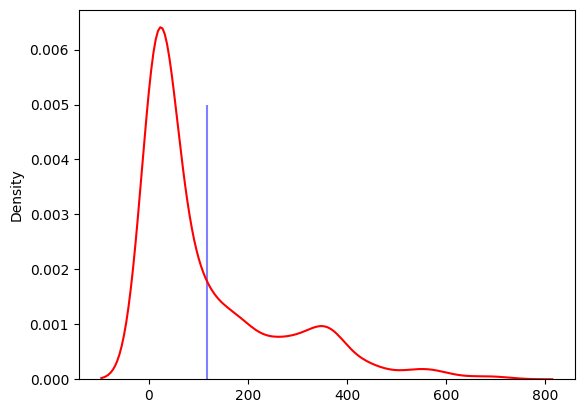

In [141]:
display(non_pay_duration)
display(non_pay_duration['non_pay_duration'].dt.total_seconds())
data = list(((non_pay_duration['non_pay_duration'].dt.total_seconds()) / (60 * 60 * 24)).round(0).astype(int))
data = [ x for x in data if x != 0 ]
mean = np.mean(data)

print(mean)
plt.vlines(mean, 0, 0.005, color='blue', alpha=0.5)
sns.kdeplot(data, color='red', label='non_pay_duration')

user_id
1        281 days 09:19:33.562000
2        267 days 12:14:33.623000
6         32 days 22:45:43.389000
21         3 days 09:37:39.057000
33        43 days 23:19:04.203000
                   ...           
179738    68 days 00:28:21.579000
179741     0 days 00:50:47.569000
179744   120 days 00:53:56.907000
179745   252 days 06:35:52.528000
179751   102 days 03:59:46.901000
Name: total, Length: 20972, dtype: timedelta64[ns]

array([2.10055452e+12, 1.99695228e+12, 2.45958629e+11, ...,
       8.96074869e+11, 1.88322214e+12, 7.62668948e+11])

200.5527295610677


<Axes: title={'center': 'pay_duration(Day)'}, ylabel='Density'>

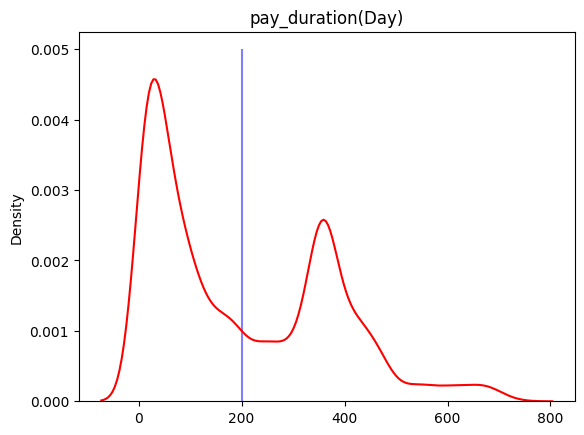

In [142]:
display(pay_duration)
display(pay_duration.values.astype(float) / 1000000000 * 60 * 60 * 24)
data = list((pay_duration.values.astype(float) / (1000000000 * 60 * 60 * 24)).round(0).astype(int))
data = [ x for x in data if x > 0 ]
mean = np.mean(data)

print(mean)
plt.vlines(mean, 0, 0.005, color='blue', alpha=0.5)
plt.title('pay_duration(Day)')
sns.kdeplot(data, color='red', label='pay_duration')

### 해적지표 살펴보기

#### **1. 획득**

1. **정의** : 회원가입을 한 유저
2. **정의 조건** : user_id ≠ ‘nan’( 회원 )
3. 이유: 회원 가입일자를 알 수 없는 고객의 수가 너무 많아서 \
complete.signup 데이터에서 확인 가능한 user_id에 국한되지 않음 
4. 주의사항 : 전체 회원 중 일부분(20% 가량)은 데이터 기간 밖에서 회원 가입을 함, \
획득 비율이나 비용계산은 어려우나, 회원 가입한 수는 complete.signup 데이터에서 확인할 수 있다, \ 
즉 비율과 비용을 구하는 것이 아닌, 이전에 수민님께서 이야기 하신 Frequency로 접근을 해야함

<Axes: title={'center': 'Cumulative Sign Up Count'}, xlabel='Date', ylabel='Count'>

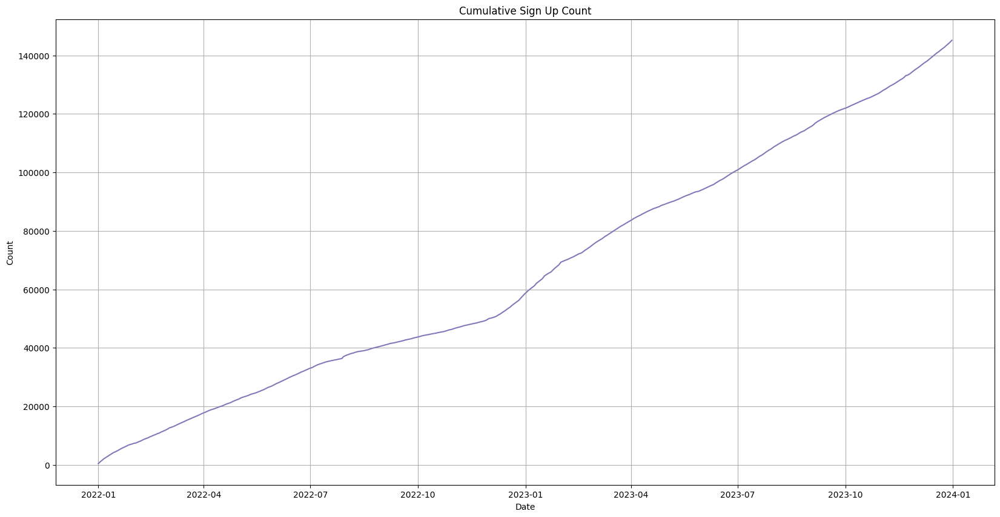

In [143]:
result = pd.concat([com_df_22[com_df_22['event_type'] == 3], com_df_23[com_df_23['event_type'] == 3]])
result = result\
    .groupby(result['client_event_time'].dt.date)['user_id']\
    .nunique().cumsum()

# 시간에 따른 회원가입한 고객수, 데이터 밖의 회원은 제외함
result.plot(figsize=(20, 10), title='Cumulative Sign Up Count', xlabel='Date', ylabel='Count', grid=True)

In [144]:
# 시간의 따른 누적 회원가입 수를 년도로 분할
user_cumsum_22 = result[result.index < pd.to_datetime('2023-01-01').date()] + 34624
user_cumsum_22.index = pd.to_datetime(user_cumsum_22.index).strftime('%m-%d')
user_cumsum_23 = result[result.index > pd.to_datetime('2022-12-31').date()] + 34624
user_cumsum_23.index = pd.to_datetime(user_cumsum_23.index).strftime('%m-%d')

#### **2. 활성화**

1. **정의** :
    1. **서비스 활성화** : 강의를 한 번이라도 완강한 유저 → 수강률, 완강률 분석으로 연결
    daily, weekly, monthly 활성화 유저 → 학습 패턴으로 연결 가능
2. **정의 조건** : complete lesson.count() > 0
3. 이유: “강의가 이 서비스의 핵심 가치이므로, lesson에서 활성화 조건을 정의”

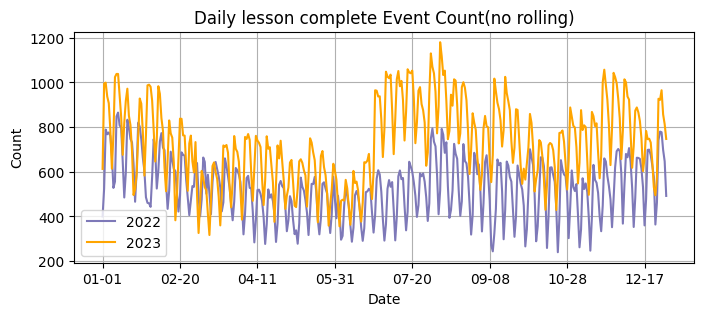

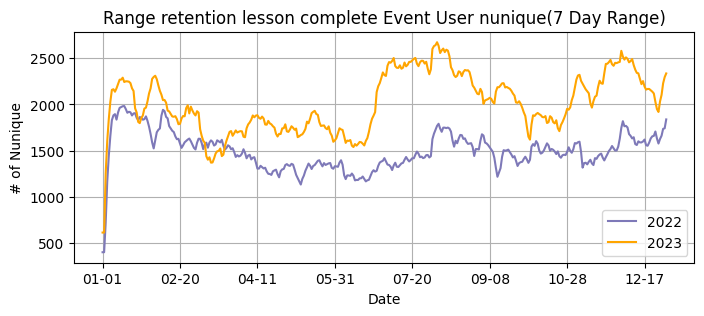

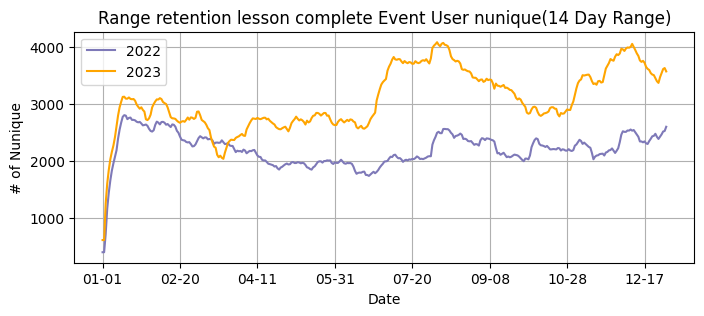

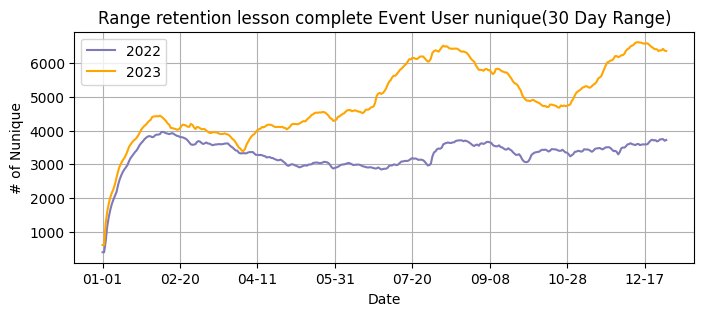

In [145]:
# 누적 카운트 기간별 시간에 따른 활성화한 유저 수
ONLY_NEW_USER = False
user_id_in_df = user_indexs[user_indexs['event_type'] == 3]['user_id'].unique()

# 대상 데이터 설정
if ONLY_NEW_USER:
    dfs = [
        com_df_22.loc[(com_df_22['event_type'] == 14) & com_df_22['user_id'].isin(user_id_in_df), ['user_id', 'client_event_time']],
        com_df_23.loc[(com_df_23['event_type'] == 14) & com_df_23['user_id'].isin(user_id_in_df), ['user_id', 'client_event_time']]
    ]
else:
    dfs = [
        com_df_22.loc[com_df_22['event_type'] == 14, ['user_id', 'client_event_time']],
        com_df_23.loc[com_df_23['event_type'] == 14, ['user_id', 'client_event_time']]
    ]

# 시간 목록
timelists = [
    pd.date_range('2022-01-01', '2022-12-31', freq='D').floor("D"),
    pd.date_range('2023-01-01', '2023-12-31', freq='D').floor("D")
]

# result, temp 선언
results = [[], []]
temps = [[], []]

# 결과 생성
for i in range(2):
    results[i] = dfs[i].groupby(dfs[i]['client_event_time'].dt.strftime("%m-%d"))['user_id'].nunique()
    temps[i] = pd.DataFrame(["01-01", results[i].iloc[0]])
    temps[i] = temps[i].T
    temps[i].columns = ['date', 'user_id_unique']

# 확인
results[0].plot(figsize=(8, 3), label='2022', title='Daily lesson complete Event Count(no rolling)', xlabel='Date', ylabel='Count', grid=True)
results[1].plot(figsize=(8, 3), label='2023', xlabel='Date', grid=True)
plt.legend()
plt.show()

# result_list 선언
result_list = [[], []]

for i in range(2):
    result_list[i] = [ results[i].copy() ]
    
# 이동 카운트
for rolling_offset in [7, 14, 30]:
    # 이동 카운트 결과 선언
    results = [
        pd.DataFrame(temps[0].copy(), columns=['date', 'user_id_unique']),
        pd.DataFrame(temps[1].copy(), columns=['date', 'user_id_unique'])
    ]
    
    # 결과 생성
    for j in range(2):
        for i in range(1, 365):
            # 시작 날짜 설정
            if i <= rolling_offset - 1:
                min_data = timelists[j][0]
            else:
                min_data = timelists[j][i + 1 - rolling_offset]
            
            # 이동 결과 생성
            rolling_result = dfs[j]\
                .loc[((dfs[j]['client_event_time'] >= pd.Timestamp(min_data))\
                    & (dfs[j]['client_event_time'] <= pd.Timestamp(timelists[j][i]))), 'user_id']\
                        .nunique()

            # 임시 결과 생성
            temp = pd.DataFrame([timelists[j][i].strftime("%m-%d"), rolling_result])
            temp = temp.T
            temp.columns = ['date', 'user_id_unique']
                
            # 결합 및 결과 생성    
            results[j] = pd.concat([results[j], temp])

        # 인덱스 생성
        results[j].set_index('date', inplace=True)
        
        # result_list에 결과 추가
        result_list[j].append(results[j].copy())

    # 결과 시각화 확인
    results[0]['user_id_unique'].plot(figsize=(8, 3), label = '2022', title=f'Range retention lesson complete Event User nunique({rolling_offset} Day Range)', xlabel='Date', ylabel='# of Nunique', grid=True)
    results[1]['user_id_unique'].plot(figsize=(8, 3), label = '2023', xlabel='Date', grid=True)
    
    plt.legend()
    plt.show()

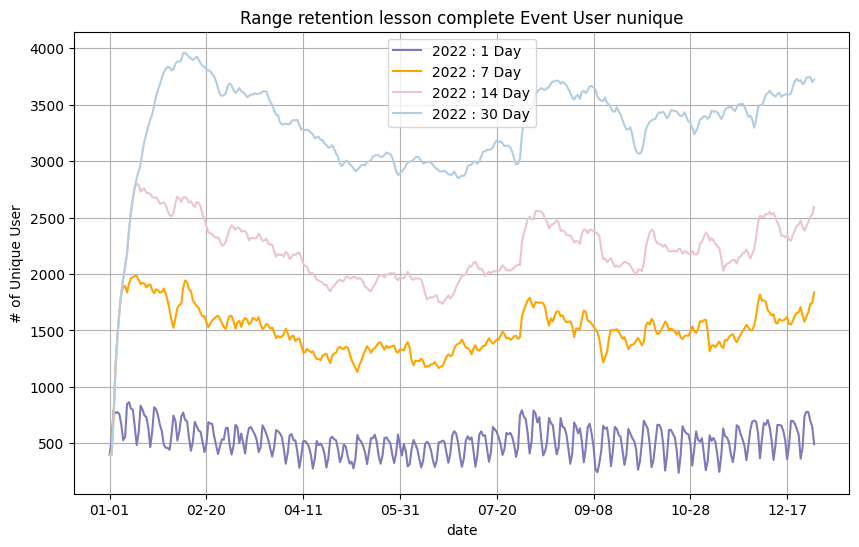

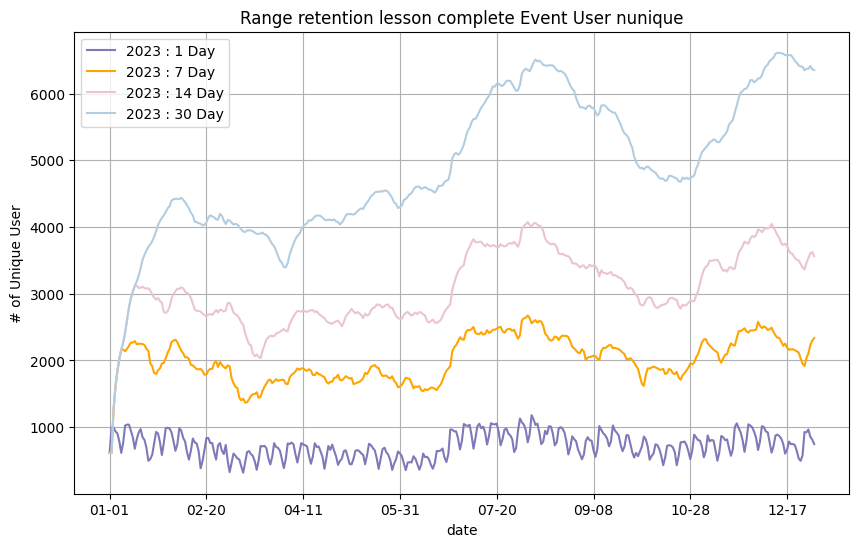

In [146]:
# 결과를 년도별로 시각화
for i in range(2):
    result_list[i][0].plot(figsize=(10, 6), title=f'Range retention lesson complete Event User nunique', xlabel='Date', ylabel='# of Unique User', grid=True, label = f'{2022+i} : 1 Day')
    result_list[i][1]['user_id_unique'].plot(figsize=(10, 6), grid=True, label = f'{2022+i} : 7 Day')
    result_list[i][2]['user_id_unique'].plot(figsize=(10, 6), grid=True, label = f'{2022+i} : 14 Day')
    result_list[i][3]['user_id_unique'].plot(figsize=(10, 6), grid=True, label = f'{2022+i} : 30 Day')
    
    plt.legend()
    plt.show()

In [147]:
%%skip  # << skipping >>
# retention 으로 대체 가능해서 건너뜀

# 년도별 활성화 수 / 누적 유저 수 시각화
user_cumsum_list = [user_cumsum_22, user_cumsum_23]
# 시각화
for i in range(2):
    (result_list[i][0] / user_cumsum_list[i]).plot(figsize=(10, 6), title=f'Range retention lesson complete Event User nunique', xlabel='Date', ylabel='# of Unique User', grid=True, label = f'{2022+i} : 1 Day')
    (result_list[i][1]['user_id_unique'] / user_cumsum_list[i]).plot(figsize=(10, 6), grid=True, label = f'{2022+i} : 7 Day')
    (result_list[i][2]['user_id_unique'] / user_cumsum_list[i]).plot(figsize=(10, 6), grid=True, label = f'{2022+i} : 14 Day')
    (result_list[i][3]['user_id_unique'] / user_cumsum_list[i]).plot(figsize=(10, 6), grid=True, label = f'{2022+i} : 30 Day')
    
    plt.legend()
    plt.show()

#### **3. 유지**

1. 정의: 시작일 기준 -  lesson_complete
    1. 7일 : 활성화시 7일간 리텐션 간주
    2. 14일 : 활성화시 14일간 리텐션 간주
    3. 30일 : 활성화시 30일간 리텐션 간주
2. 정의 조건: complete lesson.count() > 0
3. 이유 : [ 2. 활성화 ]와 동일

In [148]:
## 기본 데이터

# 리텐션 측정 기간 설정
retention_range = 120

# base_df 기본 데이터 셋
base_df = pd.concat([com_df_22[com_df_22['event_type'] == 14], com_df_23[com_df_23['event_type'] == 14]])
base_df = base_df[['user_id', 'client_event_time']]

# base_user 기본 유저 풀
base_user = pd.concat([com_df_22[com_df_22['event_type'] == 3], com_df_23[com_df_23['event_type'] == 3]])
base_user = base_user[['user_id', 'client_event_time']]
base_user = base_user.rename(columns={'client_event_time' : 'sign_up_time'})

# 유저별 첫 활성화 시간
first_active = base_df.groupby('user_id')['client_event_time'].min()

base_user = pd.merge(base_user, first_active, on='user_id', how='left')
base_user.rename(columns={'client_event_time' : 'first_Active'}, inplace=True)
base_user.fillna({'first_Active' : MAX_DATE}, inplace=True)
base_user

,user_id,sign_up_time,first_Active
0,75470,2022-01-01 00:06:31.232,2023-12-31 23:59:35.209
1,116537,2022-01-01 00:10:21.400,2023-12-31 23:59:35.209
2,91459,2022-01-01 00:10:49.730,2023-12-31 23:59:35.209
3,52661,2022-01-01 00:12:18.251,2023-12-31 23:59:35.209
4,85468,2022-01-01 00:26:03.194,2023-12-31 23:59:35.209
...,...,...,...
145128,94982,2023-12-31 23:26:30.981,2023-12-31 23:59:35.209
145129,19383,2023-12-31 23:29:56.754,2023-12-31 23:38:50.860
145130,343,2023-12-31 23:31:56.109,2023-12-31 23:59:35.209
145131,92860,2023-12-31 23:38:08.737,2023-12-31 23:59:35.209


In [149]:
# 시각화 x축 라벨 설정
user_date_range = pd.date_range('2021-12-31', '2023-12-31', freq='M').floor("D")
print(user_date_range)

DatetimeIndex(['2021-12-31', '2022-01-31', '2022-02-28', '2022-03-31',
               '2022-04-30', '2022-05-31', '2022-06-30', '2022-07-31',
               '2022-08-31', '2022-09-30', '2022-10-31', '2022-11-30',
               '2022-12-31', '2023-01-31', '2023-02-28', '2023-03-31',
               '2023-04-30', '2023-05-31', '2023-06-30', '2023-07-31',
               '2023-08-31', '2023-09-30', '2023-10-31', '2023-11-30',
               '2023-12-31'],
              dtype='datetime64[ns]', freq=None)


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_22036\2546891769.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  user_date_range = pd.date_range('2021-12-31', '2023-12-31', freq='M').floor("D")


In [150]:
def get_retention(base_df, user, target_name, retention_range, start_base):
    '''
    #### 리텐션을 시각화하고 결과 값을 반환합니다. \n
     \n
    base_df : pd.DataFrame : 기본 데이터 셋 \n
    user : pd.DataFrame : user df \n
    target_name : str : 그룹 이름 \n
    retention_range : int : retention range \n
    start_base : str : 시작 기준 \n
     \n
    return : pd.DataFrame : 결과 \n
    '''
    
    # 예외사항 처리
    if user.empty:
        return None
    
    # 데이터 생성
    result = pd.merge(base_df, user, on='user_id', how='inner')
    result['active_day'] = (result['client_event_time'] - result[start_base]).dt.days
    result = result.drop('client_event_time', axis=1)
    result = result.drop(result[result['active_day'] < 0].index, axis=0)
    result = result.drop_duplicates(['user_id', 'active_day'])

    # 최대값 설정
    if start_base == 'sign_up_time':
        max_nunique = user['user_id'].nunique()
    else:
        max_nunique = result['user_id'].nunique()

    # max_active_day 설정
    max_active_day = result['active_day'].max()
    if max_active_day > retention_range:
        max_active_day = retention_range

    # retentions 선언
    retentions = []

    # retention 생성
    for window_size in [1, 7, 14, 30]:
        # retention 초기화
        retention = pd.DataFrame(columns=['active_day', 'nunique'])
        
        # 초기 데이터 생성
        temp_init_df = pd.DataFrame([[max, 0] for max in range(window_size)], columns=['active_day', 'nunique'])          
        retention = pd.concat([retention, temp_init_df])
        
        # retention data 생성
        for min in range(max_active_day - window_size + 1):
            max = min + window_size
            mask = (result['active_day'] >= min) & (result['active_day'] < max)
            temp = result.loc[mask, 'user_id'].nunique()
            retention = pd.concat([retention, pd.DataFrame([[max, temp]], columns=['active_day', 'nunique'])])
        
        # retention 값 계산
        retention['nunique'] = retention['nunique'] / max_nunique * 100
        retention.loc[retention['active_day'] < window_size, 'nunique'] = retention['nunique'].max()
        retention.set_index('active_day', inplace=True)
        
        # 결과 추가
        retentions.append(retention)

    # add plotting
    for i, window_size in enumerate([1, 7, 14, 30]):
        retentions[i]['nunique'].plot(figsize=(8, 3), label=f'{window_size} Day', title=f'{target_name} Range Retention', xlabel=f'N-Day after {start_base}', ylabel='Retention Rate', grid=True)

    # 시각화 설정
    plt.legend()
    plt.vlines(1, 0, 10, color='gray', alpha=0.3, linestyles='dashed')
    plt.vlines(7, 0, 10, color='gray', alpha=0.3, linestyles='dashed')
    plt.vlines(14, 0, 10, color='gray', alpha=0.3, linestyles='dashed')
    plt.vlines(30, 0, 10, color='gray', alpha=0.3, linestyles='dashed')
    plt.vlines(60, 0, 10, color='gray', alpha=0.3, linestyles='dashed')
    plt.vlines(90, 0, 10, color='gray', alpha=0.3, linestyles='dashed')

    # 시각화
    plt.show()
    
    # 결과 반환
    return pd.DataFrame([[target_name, 
                          round(retentions[0]['nunique'][2], 2), 
                          round(retentions[0]['nunique'][3], 2),
                          round(retentions[1]['nunique'][14], 2),
                          round(retentions[1]['nunique'][21], 2),
                          round(retentions[3]['nunique'][60], 2),
                          round(retentions[3]['nunique'][90], 2)]], 
                        columns=['group_name'
                                 , 'day1', 'day2'
                                 , 'week1', 'week2'
                                 , 'month1', 'month2'])

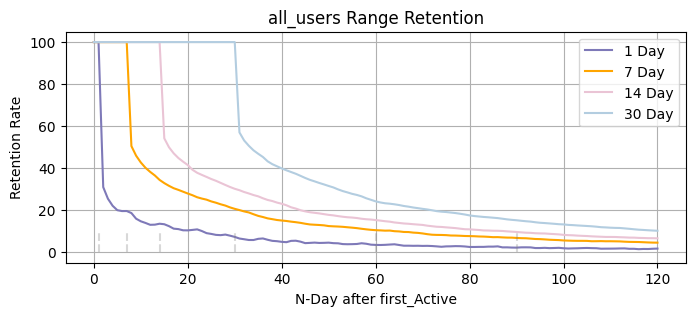

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_22036\1814137644.py:16: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_retention_df = pd.concat([all_retention_df, result])


,group_name,day1,day2,week1,week2,month1,month2
0,all_users,30.93,25.41,34.36,27.07,24.15,15.15


In [151]:
## 전체 유저에 대한 리텐션 분석
all_retention_df = pd.DataFrame(columns=['group_name'
                                 ,'day1', 'day2'
                                 , 'week1', 'week2'
                                 , 'month1', 'month2'])

# 리텐션 측정 구간에 따른 데이터 max_timeline 설정
max_timeline = MAX_DATE - pd.Timedelta(retention_range, unit='D')
# max_timeline으로 필터링
user = base_user[base_user['sign_up_time'] < max_timeline]

# 전체 유저 리텐션 분석
target_name = 'all_users'
result = get_retention(base_df, user, target_name, retention_range, 'first_Active')

all_retention_df = pd.concat([all_retention_df, result])
all_retention_df.reset_index(drop=True, inplace=True)
all_retention_df

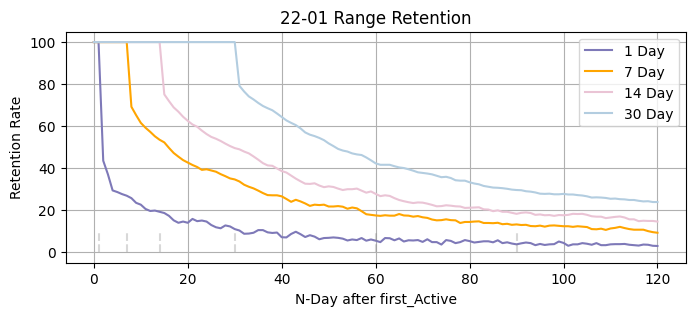

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_22036\2046658793.py:24: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  retention_index_df = pd.concat([retention_index_df, result])


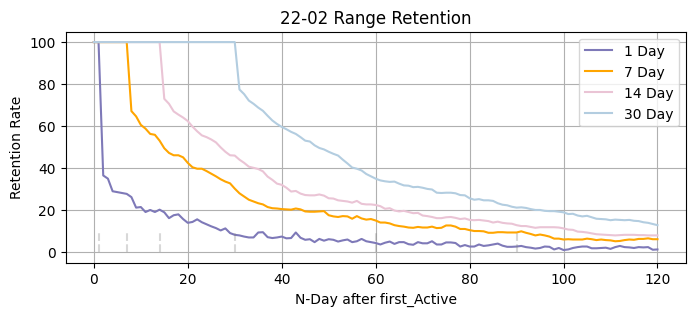

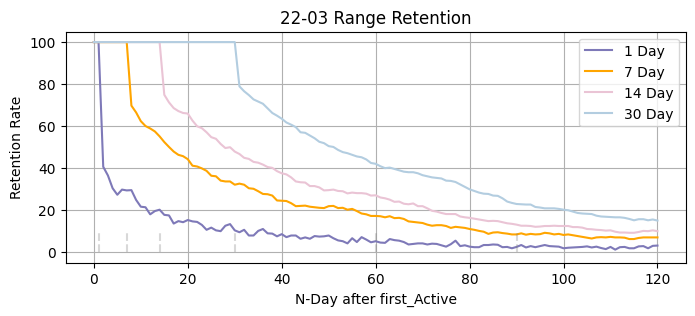

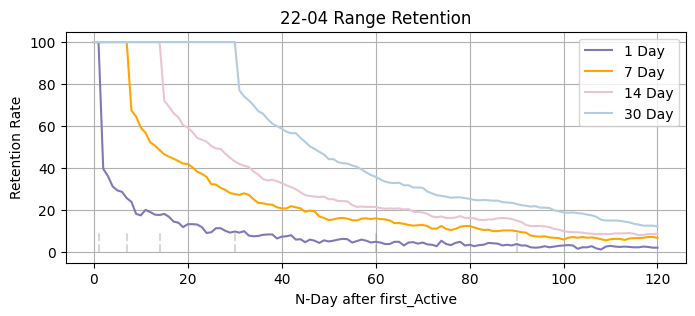

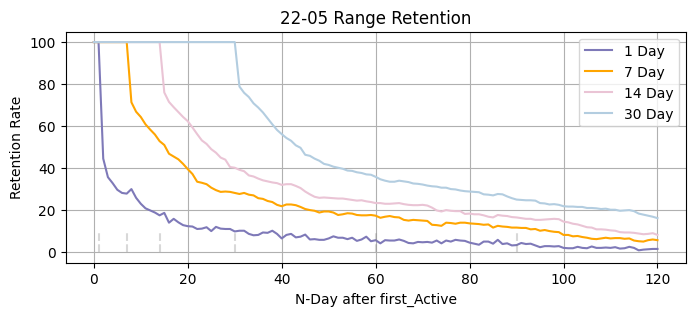

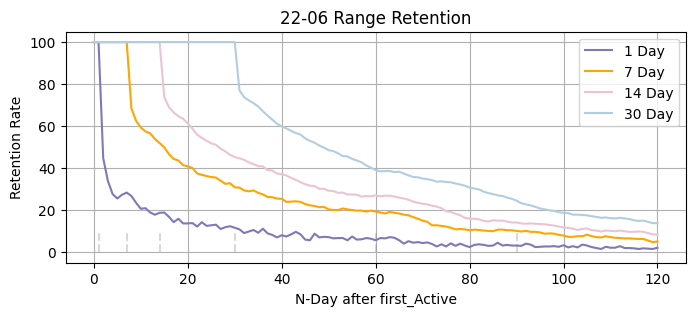

...

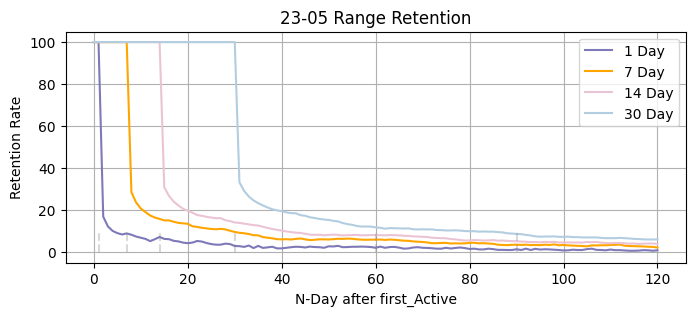

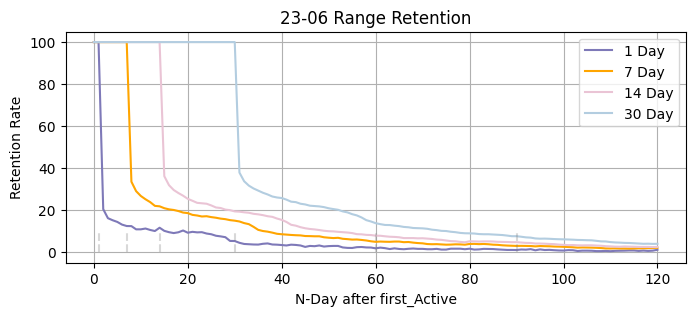

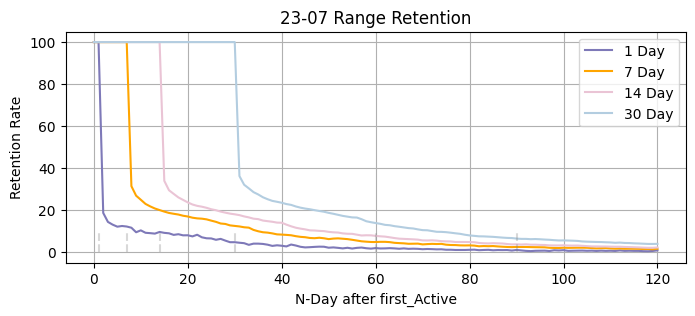

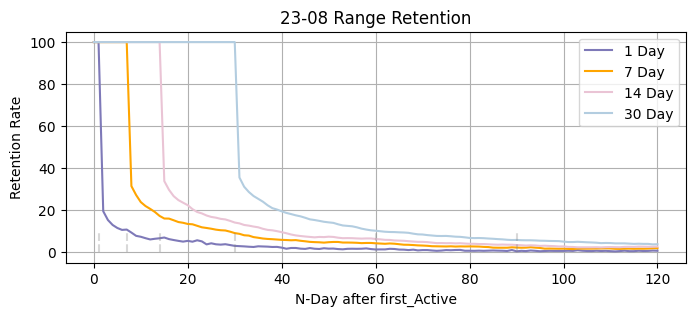

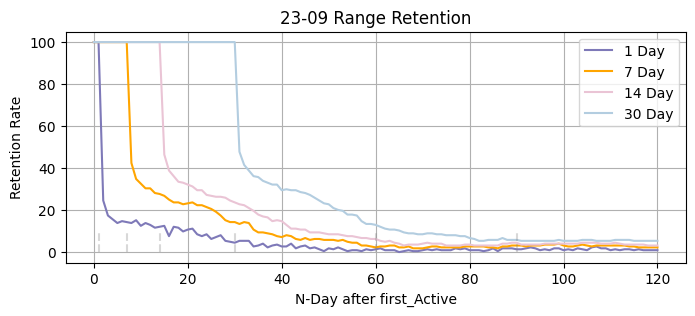

,group_name,day1,day2,week1,week2,month1,month2,user_cnt
0,22-01,43.51,37.02,53.49,41.47,42.25,29.55,7166
1,22-02,36.49,34.96,53.06,40.39,34.96,21.17,4628
2,22-03,40.62,36.48,55.11,41.14,42.04,22.90,5653
3,22-04,39.69,36.19,48.60,40.38,35.84,22.90,4758
4,22-05,44.50,35.67,52.83,37.17,35.83,25.00,4921
5,22-06,44.66,33.83,51.93,40.06,39.02,24.48,5601
6,22-07,43.83,38.48,52.30,42.50,35.51,20.21,4419
7,22-08,44.46,35.44,44.94,33.70,30.22,17.41,3419
8,22-09,39.95,30.97,41.37,35.22,26.24,17.26,2977
9,22-10,40.71,33.88,38.80,29.51,26.50,18.31,2804


In [170]:
## 년월에 따른 리텐션 분석
retention_index_df = pd.DataFrame(columns=['group_name'
                                 , 'day1', 'day2'
                                 , 'week1', 'week2'
                                 , 'month1', 'month2', 'user_cnt'])

# 리텐션 측정 구간에 따른 데이터 max_timeline 설정
max_timeline = MAX_DATE - pd.Timedelta(retention_range, unit='D')
    
# 년월별 리텐션 분석
for start, end in zip(user_date_range[:-1], user_date_range[1:]):
    # max_timeline 으로 필터링
    user = base_user[base_user['sign_up_time'] < max_timeline]
    user = user[(user['sign_up_time'] >= start) & (user['sign_up_time'] < end)]

    # 예외 처리
    if user.empty or (user['user_id'].nunique() == 0):
        continue

    # 년월 리텐션 분석
    target_name = end.strftime('%y-%m')
    result = get_retention(base_df, user, target_name, retention_range, 'first_Active')
    result['user_cnt'] = user['user_id'].nunique()
    retention_index_df = pd.concat([retention_index_df, result])

# 결과 확인
retention_index_df.reset_index(drop=True, inplace=True)
retention_index_df

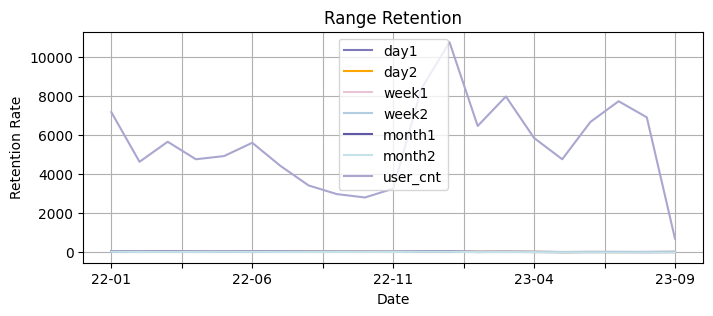

In [172]:
target_df = retention_index_df.set_index('group_name')

for col in target_df.columns:
    target_df[col].plot(figsize=(8, 3), title=f'Range Retention', xlabel='Date', ylabel='Retention Rate', grid=True)

plt.legend()
plt.show()

In [173]:
# 전체 리텐션 핵심 지표값 확인
retention_index_df = pd.concat([all_retention_df, retention_index_df])
retention_index_df.reset_index(drop=True, inplace=True)
retention_index_df

,group_name,day1,day2,week1,week2,month1,month2,user_cnt
0,all_users,30.93,25.41,34.36,27.07,24.15,15.15,NaN
1,22-01,43.51,37.02,53.49,41.47,42.25,29.55,7166
2,22-02,36.49,34.96,53.06,40.39,34.96,21.17,4628
3,22-03,40.62,36.48,55.11,41.14,42.04,22.90,5653
4,22-04,39.69,36.19,48.60,40.38,35.84,22.90,4758
5,22-05,44.50,35.67,52.83,37.17,35.83,25.00,4921
6,22-06,44.66,33.83,51.93,40.06,39.02,24.48,5601
7,22-07,43.83,38.48,52.30,42.50,35.51,20.21,4419
8,22-08,44.46,35.44,44.94,33.70,30.22,17.41,3419
9,22-09,39.95,30.97,41.37,35.22,26.24,17.26,2977


In [174]:
# 단계 전환률 추가
retention_index_df['d_rate'] = round(retention_index_df['day2'] / retention_index_df['day1'] * 100, 2)
retention_index_df['w_rate'] = round(retention_index_df['week2'] / retention_index_df['week1'] * 100, 2)
retention_index_df['m_rate'] = round(retention_index_df['month2'] / retention_index_df['month1'] * 100, 2)

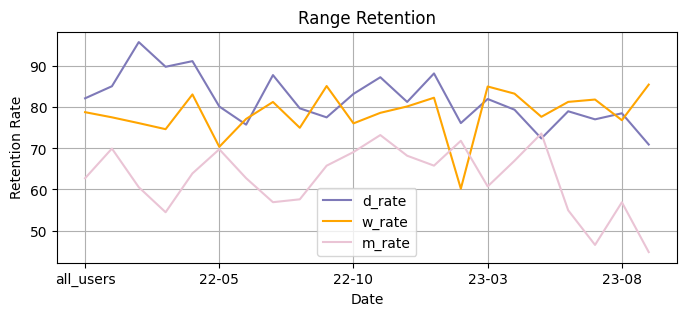

In [179]:
# 단계 전환률 시각화
target_df = retention_index_df.set_index('group_name')

for col in target_df.columns[7:]:
    target_df[col].plot(figsize=(8, 3), title=f'Range Retention', xlabel='Date', ylabel='Retention Rate', grid=True)

plt.legend()
plt.show()

In [189]:
temp = retention_index_df.copy()
temp.iloc[1:, 1:7] = temp.iloc[1:, 1:7] - temp.iloc[0, 1:7]
temp.iloc[1:, 8:10] = temp.iloc[1:, 8:10] - temp.iloc[0, 8:10]
temp['score'] = temp.iloc[:, 1:6].sum(axis=1)
temp


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_22036\1866094482.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[12.579999999999998 5.560000000000002 9.689999999999998 8.759999999999998
 13.57 13.729999999999997 12.899999999999999 13.530000000000001
 9.020000000000003 9.780000000000001 10.060000000000002 9.329999999999998
 10.969999999999999 2.710000000000001 1.5300000000000011
 -1.7899999999999991 -14.079999999999998 -10.5 -12.29 -11.48
 -6.379999999999999]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  temp.iloc[1:, 1:7] = temp.iloc[1:, 1:7] - temp.iloc[0, 1:7]
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_22036\1866094482.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[11.610000000000003 9.55 11.069999999999997 10.779999999999998
 10.26000000000000

,group_name,day1,day2,week1,week2,month1,month2,user_cnt,d_rate,w_rate,m_rate,score
0,all_users,30.93,25.41,34.36,27.07,24.15,15.15,NaN,82.15,78.78,62.73,141.92
1,22-01,12.58,11.61,19.13,14.4,18.1,14.4,7166,2.93,-1.25,69.94,75.82
2,22-02,5.56,9.55,18.7,13.32,10.81,6.02,4628,13.66,-2.66,60.55,57.94
3,22-03,9.69,11.07,20.75,14.07,17.89,7.75,5653,7.66,-4.13,54.47,73.47
4,22-04,8.76,10.78,14.24,13.31,11.69,7.75,4758,9.03,4.31,63.90,58.78
5,22-05,13.57,10.26,18.47,10.1,11.68,9.85,4921,-1.99,-8.42,69.77,64.08
6,22-06,13.73,8.42,17.57,12.99,14.87,9.33,5601,-6.4,-1.64,62.74,67.58
7,22-07,12.9,13.07,17.94,15.43,11.36,5.06,4419,5.64,2.48,56.91,70.7
8,22-08,13.53,10.03,10.58,6.63,6.07,2.26,3419,-2.44,-3.79,57.61,46.84
9,22-09,9.02,5.56,7.01,8.15,2.09,2.11,2977,-4.63,6.35,65.78,31.83


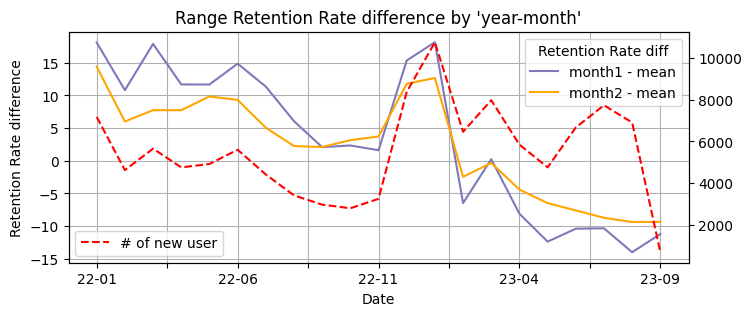

In [206]:
# 시간에 따른 핵심 지표의 평균값과의 차이 시각화
target_df = temp.set_index('group_name')

ax = target_df.iloc[1:, 4:6].plot(figsize=(8, 3), 
                             title=f"Range Retention Rate difference by 'year-month'", 
                             xlabel='Date', 
                             ylabel='Retention Rate difference', grid=True)

plt.legend(title = 'Retention Rate diff', labels = ['month1 - mean', 'month2 - mean'])

# double axis labels
ax2 = ax.twinx()
target_df[1:]['user_cnt'].plot(ax=ax2, color='red', linestyle='--', label='# of new user')

ax2.legend(loc='lower left')
plt.show()

#### content_df 및 content 특징 컬럼 생성

In [159]:
## 데이터 간소화
# 대상 컬럼
target_col = [
    'user_id', 
    'lesson.id', 
    'content.id',
    'client_event_time'
    ]

# 대상 데이터 생성
lesson_df_22 = df_2022.loc[df_2022['event_type'] == 14, target_col]
lesson_df_23 = df_2023.loc[df_2023['event_type'] == 14, target_col]
lesson_df = pd.concat([lesson_df_22, lesson_df_23], axis=0)
print(lesson_df.duplicated().sum())
lesson_df = lesson_df.drop_duplicates()

5


In [160]:
# content 난이도 컬럼 생성
content_diff = pd.concat([df_2022.loc[df_2022['event_type'] == 12, ['content.id', 'content.difficulty']]\
                        , df_2023.loc[df_2023['event_type'] == 12, ['content.id', 'content.difficulty']]]\
                        , axis=0)

# 인코더 확인
print(encoder_dict['content.difficulty'].classes_)
# max 확인
print(content_diff.groupby('content.id')['content.difficulty'].nunique().max())
# 난이도 확인 및 변환
display(content_diff['content.difficulty'])
content_diff['content.difficulty'] = content_diff['content.difficulty']\
                                .map({0 : 0, 1 : 3, 2 : 1, 4 : 2, 3 : 4, 5 : 5})
display(content_diff['content.difficulty'])

# 평균 난이도 확인
content_diff = content_diff.groupby('content.id')['content.difficulty'].mean().round(1)

# 결과 확인
content_diff = content_diff.reset_index()
display(content_diff)

# 결측치에 대한 기본 난이도 값
content_default_diff = 2.5

[nan 'advanced' 'beginner' 'hard' 'intermediate' None]
3


7867111     2
7867161     4
7867335     2
7867931     2
7867937     1
           ..
20007861    4
20007915    4
20007926    2
20007943    2
20007974    2
Name: content.difficulty, Length: 124917, dtype: int16

7867111     1
7867161     2
7867335     1
7867931     1
7867937     3
           ..
20007861    2
20007915    2
20007926    1
20007943    1
20007974    1
Name: content.difficulty, Length: 124917, dtype: int64

,content.id,content.difficulty
0,4,3.0
1,5,2.0
2,7,2.0
3,8,2.0
4,9,1.0
...,...,...
146,207,1.0
147,208,2.0
148,209,2.0
149,210,1.0


In [161]:
# 콘텐츠 특성 컬럼 생성
con_nu = lesson_df.groupby(['content.id'])['user_id'].nunique().sort_values(ascending=False) 
display(con_nu)
con_les_nu = lesson_df.groupby(['content.id', 'lesson.id'])['user_id'].nunique().sort_values(ascending=False)
display(con_les_nu)
con_les_nu_mean = con_les_nu.groupby(['content.id']).mean()
display(con_les_nu_mean)
con_les_nu_cnt = con_les_nu.groupby(['content.id']).count()
display(con_les_nu_cnt)

limit_min_nu = int(con_nu.max() / con_nu.size)
target_con = con_nu[con_nu > limit_min_nu].index

denominator = con_les_nu_mean[con_les_nu_mean.index.isin(target_con)]
numerator = con_nu[con_nu.index.isin(target_con)]

display(denominator.sort_values())
display(numerator.sort_values())
display(((denominator / numerator) * 100).sort_values() )

con_df = pd.DataFrame(numerator, columns=['con_nu'])
con_df['con_nu'] = numerator
con_df['con_les_nu_mean'] = round(denominator, 2)
con_df['num_of_effected_users'] = 0

con_df['con_les_nu_rate'] = round(denominator / numerator * 100, 2)
con_df['con_les_nu_cnt'] = con_les_nu_cnt[con_les_nu_cnt.index.isin(target_con)]

con_df['con_nu'] = con_df['con_nu'].astype(int)
con_df['con_les_nu_mean'] = con_df['con_les_nu_mean'].astype(int)

con_df = pd.merge(con_df, content_diff, on='content.id', how='left')
con_df.fillna({'content.difficulty' : content_default_diff}, inplace=True)

display(con_df)


content.id
201    25865
85     13701
200    12030
74      9415
93      8307
       ...  
49         1
158        1
160        1
174        1
19         1
Name: user_id, Length: 168, dtype: int64

content.id  lesson.id
201         4121         21534
            2074         20812
            3563         19977
            2664         19279
            480          18669
                         ...  
66          5274             1
160         5146             1
205         1436             1
160         4763             1
62          2486             1
Name: user_id, Length: 5050, dtype: int64

content.id
4       723.840000
5        35.000000
6        36.000000
7        30.000000
8       798.541667
          ...     
207       1.000000
208     138.540541
209       9.666667
210     108.379310
211    3355.181818
Name: user_id, Length: 168, dtype: float64

content.id
4      25
5       2
6       2
7       2
8      24
       ..
207     1
208    37
209    48
210    29
211    22
Name: user_id, Length: 168, dtype: int64

content.id
136       87.620690
133       91.657143
141       99.192308
170      101.968750
13       105.200000
           ...     
93      6148.000000
85      6989.714286
74      7707.888889
200     9592.704545
201    16047.777778
Name: user_id, Length: 92, dtype: float64

content.id
194      161
133      162
141      163
28       164
136      165
       ...  
93      8307
74      9415
200    12030
85     13701
201    25865
Name: user_id, Length: 92, dtype: int64

content.id
206     40.216390
208     43.159047
170     45.118916
159     47.609497
30      48.381688
          ...    
172     85.123031
204     85.985407
211     90.265855
52      93.835858
194    100.000000
Name: user_id, Length: 92, dtype: float64

,content.id,con_nu,con_les_nu_mean,num_of_effected_users,con_les_nu_rate,con_les_nu_cnt,content.difficulty
0,201,25865,16047,0,62.04,18,1.0
1,85,13701,6989,0,51.02,21,1.0
2,200,12030,9592,0,79.74,44,2.0
3,74,9415,7707,0,81.87,27,2.0
4,93,8307,6148,0,74.01,20,1.0
...,...,...,...,...,...,...,...
87,136,165,87,0,53.10,29,4.0
88,28,164,120,0,73.72,21,3.0
89,141,163,99,0,60.85,78,3.0
90,133,162,91,0,56.58,35,3.0


#### 각 콘텐츠에 영향 받은 고객 집계

In [162]:
user_con_mean = lesson_df.groupby('user_id')['content.id'].nunique().mean()
user_con_cnt = lesson_df.groupby('user_id')['content.id'].count()

# 각 유저에 대해 그 유저가 접한 콘텐츠가 그 유저의 수업에 차지하는 비율
result = round(lesson_df.groupby(['user_id', 'content.id'])['content.id'].count() / user_con_cnt * 100, 2)
result = pd.DataFrame(result)
result = result.rename(columns={'content.id' : 'content_ratio'})
result = result.reset_index()

# 수업에 차지하는 비율이 가장 높은 콘텐츠만 확인
mask = result.groupby('user_id')['content_ratio'].idxmax()

content_effect_df = result.loc[mask]
content_effect_df = content_effect_df.reset_index(drop=True)

# base_ratio : 100% / 평균 콘텐츠, 콘텐츠 비율이 base_ratio 이상인 유저만 확인
base_ratio = int(100 / user_con_mean)
print(user_con_mean)

# 결과 확인
target_user = content_effect_df.loc[content_effect_df['content_ratio'] > base_ratio]
display(target_user)

4.147414608618642


,user_id,content.id,content_ratio
0,1,200,39.53
1,2,8,50.00
2,6,167,41.07
3,12,159,100.00
5,15,85,100.00
...,...,...,...
49677,179733,112,41.43
49678,179738,200,35.48
49679,179741,201,100.00
49680,179744,200,24.59


[0] : 194 : 161 : 100.0
Not enough user data : 194 lesson.user : 0 < 100
[1] : 52 : 2839 : 93.84
Not enough user data : 52 lesson.user : 6 < 100
[2] : 211 : 3717 : 90.27
Not enough user data : 211 lesson.user : 85 < 100
[3] : 204 : 4147 : 85.99
Not enough user data : 204 lesson.user : 49 < 100
[4] : 172 : 1594 : 85.12
Not enough user data : 172 lesson.user : 23 < 100
[5] : 108 : 5036 : 83.19
1506 : [193 535 643 666 736]


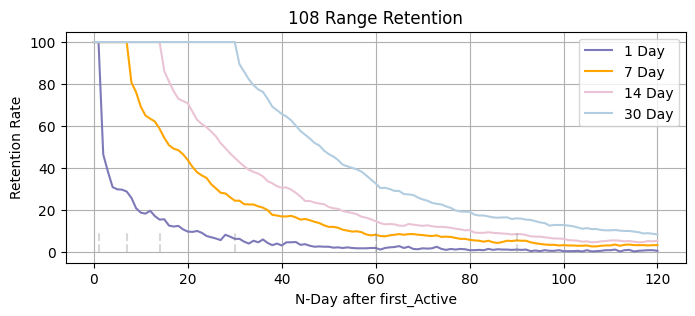

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_22036\2801056022.py:48: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  retention_index_df2 = pd.concat([retention_index_df2, result])


[6] : 188 : 192 : 82.51
Not enough user data : 188 lesson.user : 0 < 100
[7] : 74 : 9415 : 81.87
163 : [1887 5574 5728 5874 5976]


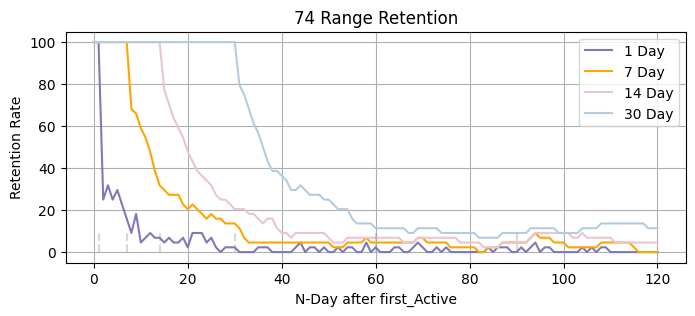

[8] : 36 : 356 : 81.24
Not enough user data : 36 lesson.user : 4 < 100
[9] : 100 : 3854 : 81.09
Not enough user data : 100 lesson.user : 38 < 100
[10] : 76 : 1932 : 80.78
Not enough user data : 76 lesson.user : 64 < 100
[11] : 38 : 1453 : 80.78
Not enough user data : 38 lesson.user : 18 < 100
[12] : 50 : 514 : 80.74
256 : [1451 1582 1641 3606 4107]


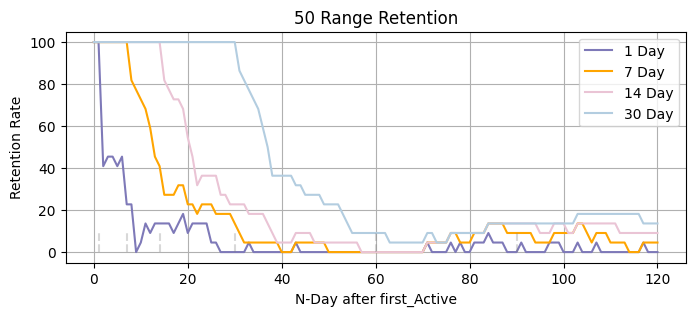

[13] : 116 : 1501 : 80.61
Not enough user data : 116 lesson.user : 9 < 100
[14] : 90 : 1293 : 80.55
Not enough user data : 90 lesson.user : 46 < 100
[15] : 18 : 308 : 80.04
Not enough user data : 18 lesson.user : 15 < 100
[16] : 4 : 907 : 79.81
Not enough user data : 4 lesson.user : 12 < 100
[17] : 200 : 12030 : 79.74
5675 : [ 1 20 21 33 55]


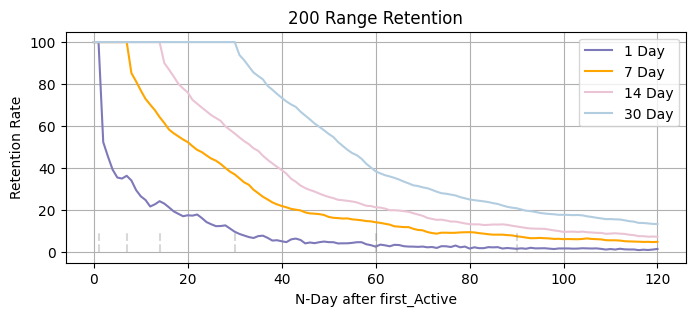

[18] : 110 : 692 : 79.39
Not enough user data : 110 lesson.user : 7 < 100
[19] : 181 : 4748 : 78.73
1578 : [ 25 288 372 471 672]


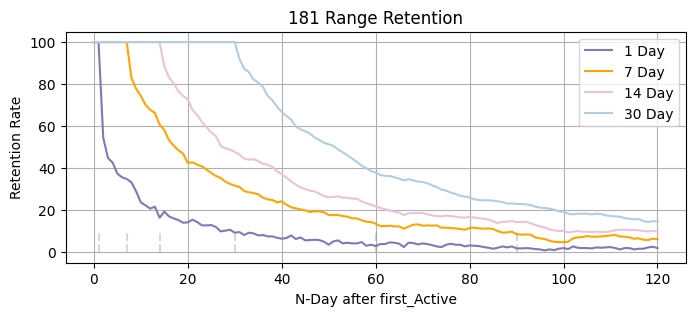

[20] : 22 : 3681 : 77.83
860 : [ 133  570  648  764 1142]


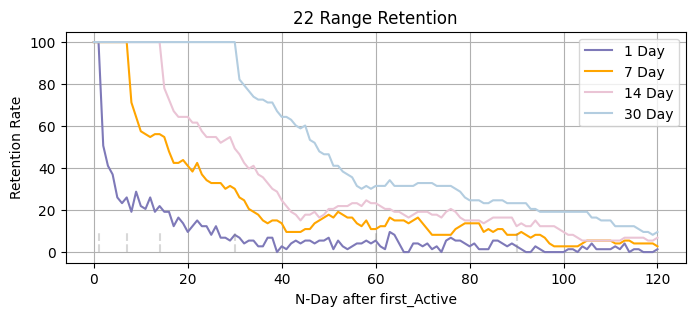

[21] : 61 : 4078 : 76.78
Not enough user data : 61 lesson.user : 96 < 100
[22] : 98 : 1576 : 75.84
Not enough user data : 98 lesson.user : 30 < 100
[23] : 119 : 2633 : 75.67
221 : [ 118  960 2193 3016 3349]


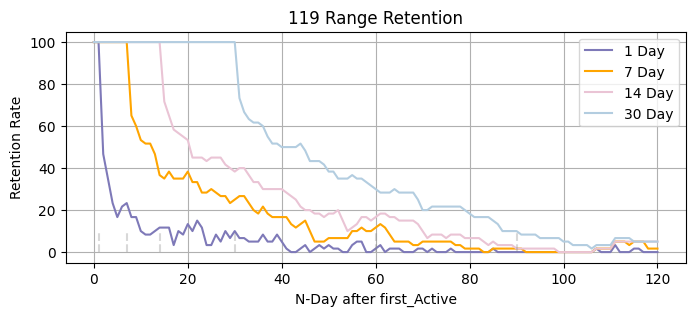

[24] : 150 : 2171 : 75.57
598 : [ 371  589  822  992 1064]


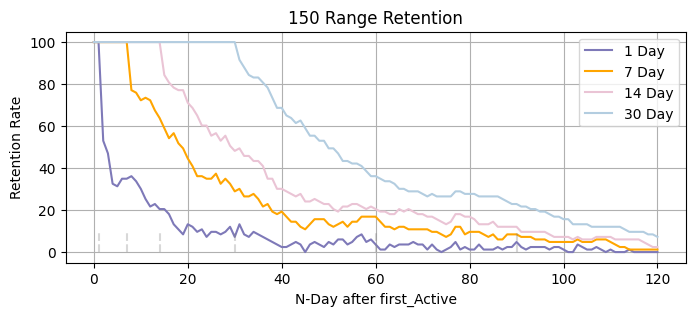

[25] : 129 : 713 : 75.09
Not enough user data : 129 lesson.user : 6 < 100
[26] : 190 : 1937 : 74.86
297 : [ 896  936 1754 2314 2913]


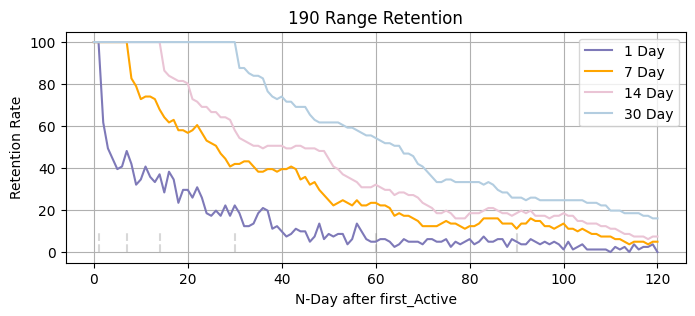

[27] : 89 : 2111 : 74.68
Not enough user data : 89 lesson.user : 23 < 100
[28] : 199 : 1409 : 74.52
Not enough user data : 199 lesson.user : 78 < 100
[29] : 103 : 717 : 74.45
Not enough user data : 103 lesson.user : 14 < 100
[30] : 93 : 8307 : 74.01
1814 : [ 72 502 579 599 623]


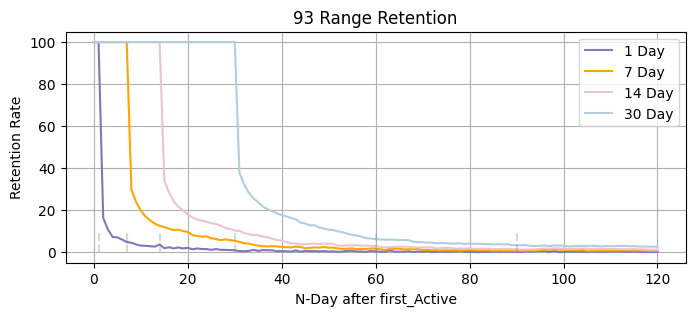

[31] : 139 : 367 : 73.93
Not enough user data : 139 lesson.user : 2 < 100
[32] : 28 : 164 : 73.72
Not enough user data : 28 lesson.user : 4 < 100
[33] : 165 : 658 : 73.13
Not enough user data : 165 lesson.user : 7 < 100
[34] : 167 : 1173 : 73.1
702 : [   6  888 1273 1612 2058]


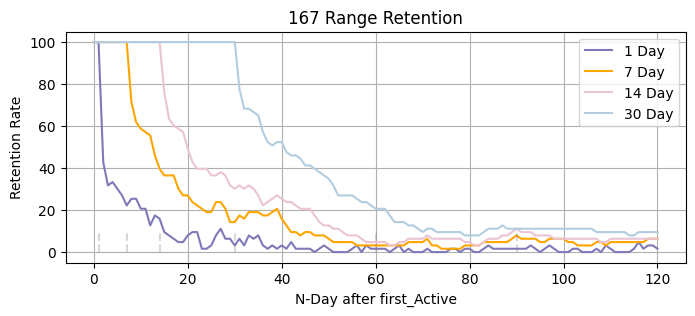

[35] : 147 : 7526 : 72.8
125 : [ 214 4145 5795 5967 8127]


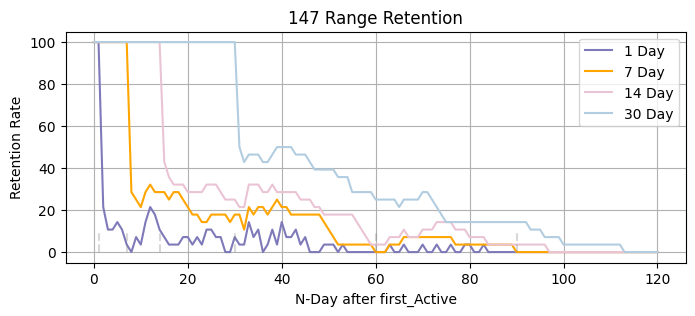

[36] : 92 : 1119 : 72.48
Not enough user data : 92 lesson.user : 21 < 100
[37] : 153 : 1738 : 71.68
340 : [ 409 2347 2499 3300 3697]


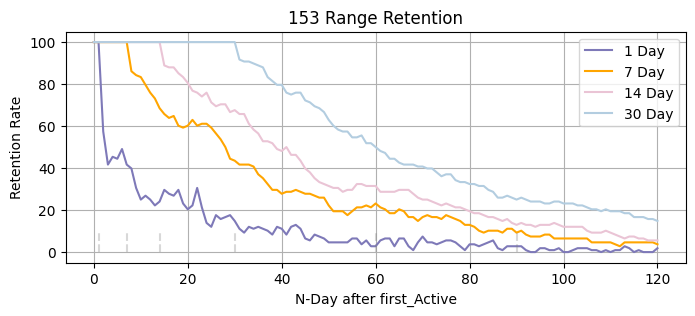

[38] : 66 : 1077 : 70.65
206 : [1698 1833 2454 4346 5216]


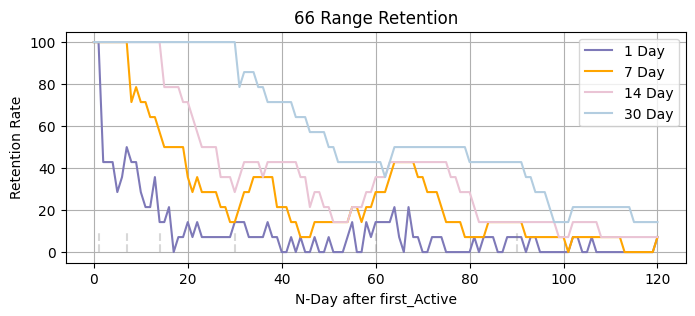

[39] : 83 : 424 : 70.63
Not enough user data : 83 lesson.user : 11 < 100
[40] : 177 : 6130 : 70.6
820 : [ 299  391  754 1087 1620]


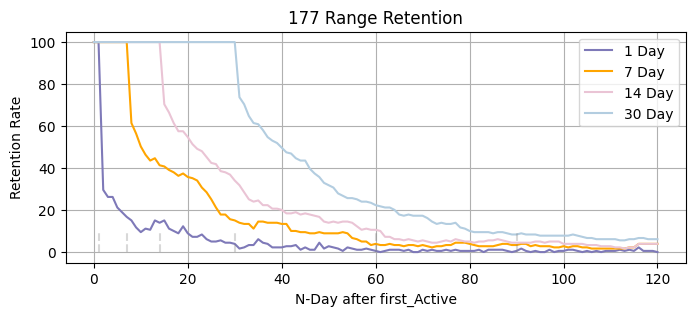

[41] : 65 : 2076 : 69.68
228 : [ 557  685  772 1100 1957]


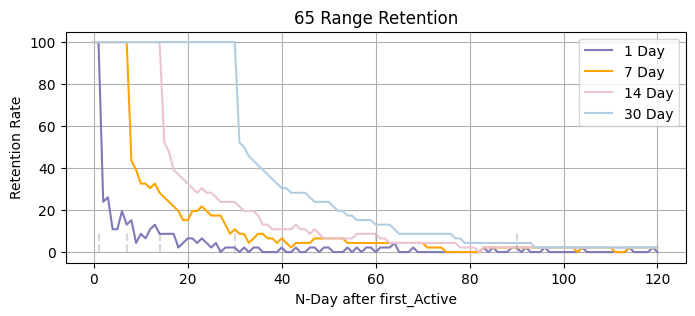

[42] : 171 : 245 : 69.6
Not enough user data : 171 lesson.user : 4 < 100
[43] : 142 : 686 : 69.51
Not enough user data : 142 lesson.user : 90 < 100
[44] : 193 : 1852 : 68.21
229 : [ 605  620 1160 1902 2102]


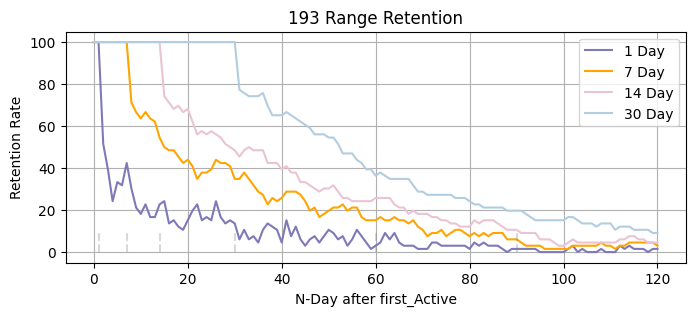

[45] : 106 : 1078 : 67.47
172 : [2813 4607 5060 6210 7105]


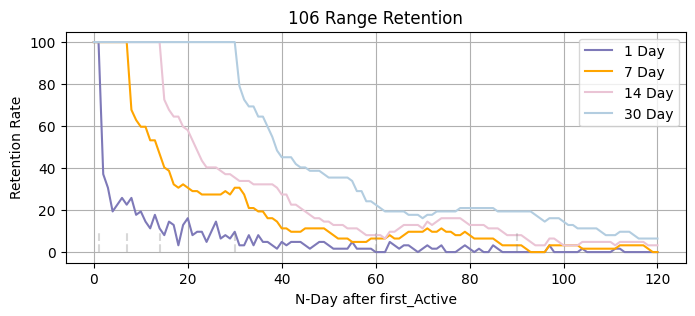

[46] : 144 : 2910 : 67.22
566 : [1380 1443 2326 2409 2569]


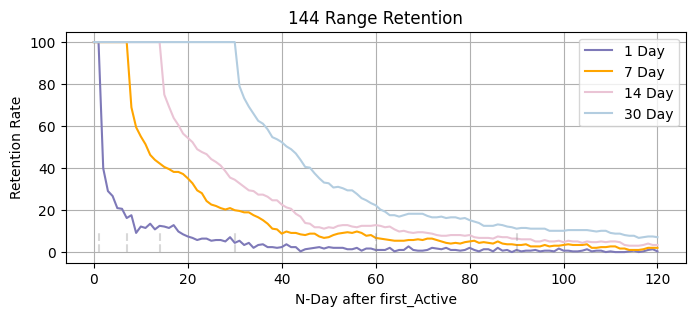

[47] : 94 : 361 : 66.68
Not enough user data : 94 lesson.user : 6 < 100
[48] : 60 : 311 : 66.17
Not enough user data : 60 lesson.user : 8 < 100
[49] : 51 : 1500 : 65.93
218 : [ 173  778 2282 2700 2811]


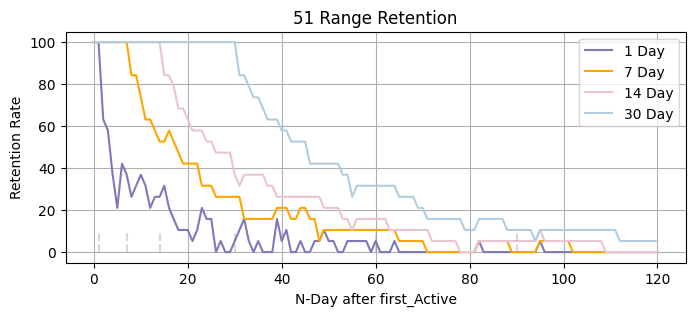

[50] : 189 : 2195 : 65.69
136 : [ 2567  3057  3108  4726 10390]


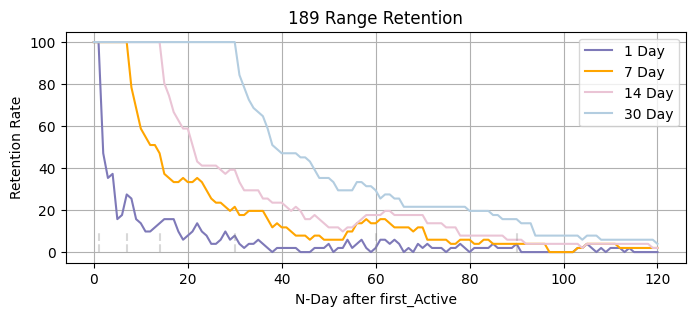

[51] : 27 : 619 : 65.67
Not enough user data : 27 lesson.user : 81 < 100
[52] : 182 : 1608 : 64.8
Not enough user data : 182 lesson.user : 90 < 100
[53] : 131 : 326 : 63.65
Not enough user data : 131 lesson.user : 9 < 100
[54] : 46 : 2420 : 62.65
134 : [ 2067  7870  8249 14830 17992]


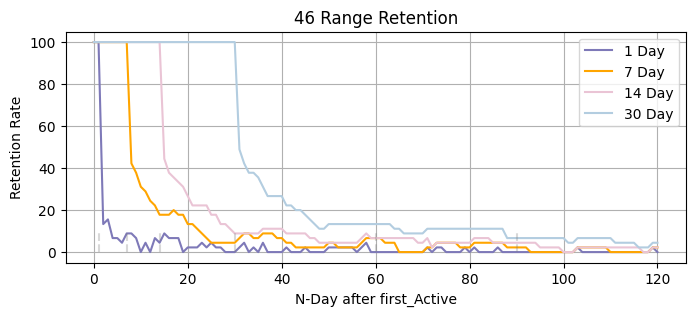

[55] : 95 : 584 : 62.33
Not enough user data : 95 lesson.user : 55 < 100
[56] : 201 : 25865 : 62.04
9918 : [30 32 44 62 89]


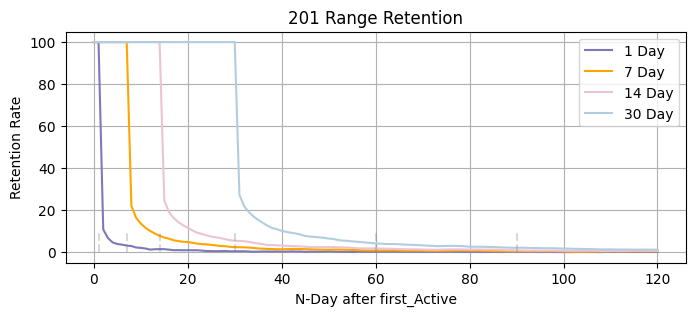

[57] : 99 : 469 : 61.88
Not enough user data : 99 lesson.user : 38 < 100
[58] : 29 : 250 : 61.34
Not enough user data : 29 lesson.user : 8 < 100
[59] : 75 : 2026 : 61.27
101 : [  191  2081  6464  9436 13860]


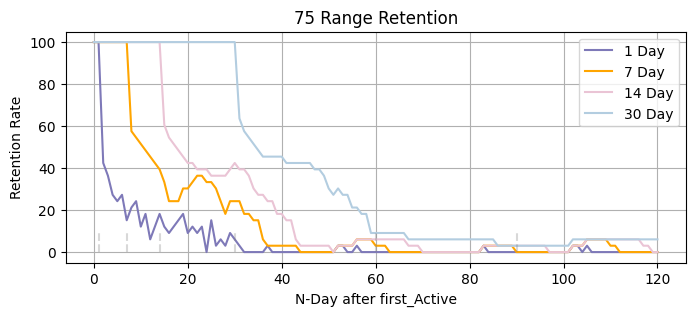

[60] : 109 : 758 : 61.25
Not enough user data : 109 lesson.user : 14 < 100
[61] : 183 : 774 : 61.24
128 : [   78  2937  6652  6874 10050]


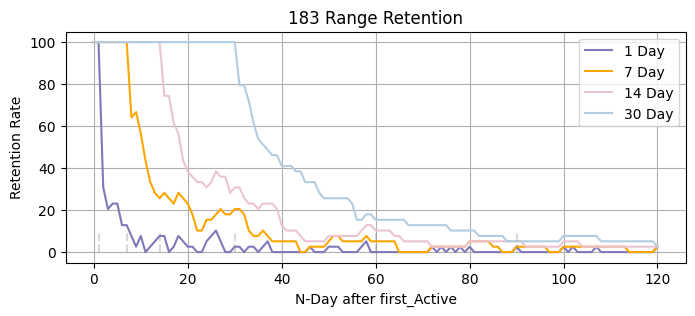

[62] : 141 : 163 : 60.85
Not enough user data : 141 lesson.user : 35 < 100
[63] : 8 : 1313 : 60.82
137 : [   2  322 1576 1961 2440]


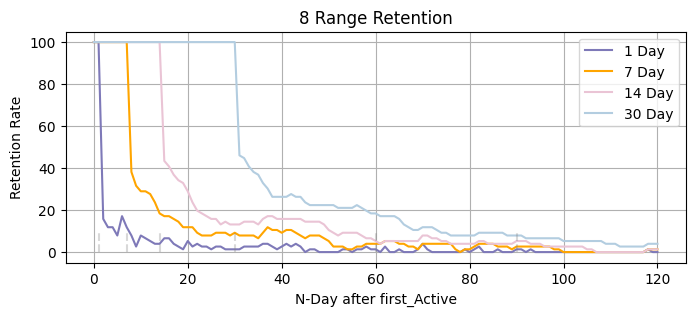

[64] : 47 : 230 : 59.47
Not enough user data : 47 lesson.user : 27 < 100
[65] : 86 : 2992 : 57.17
882 : [ 567  621  733  740 1014]


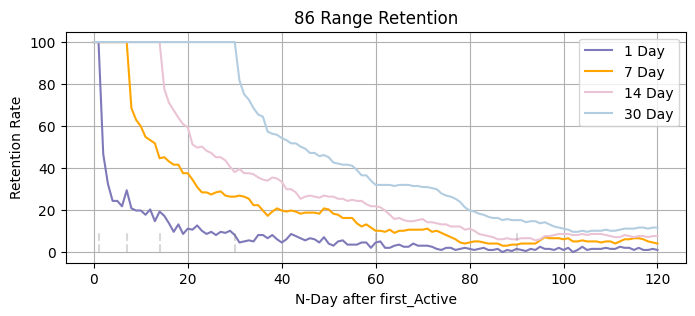

[66] : 140 : 2114 : 56.97
257 : [  83  636 2297 3388 3494]


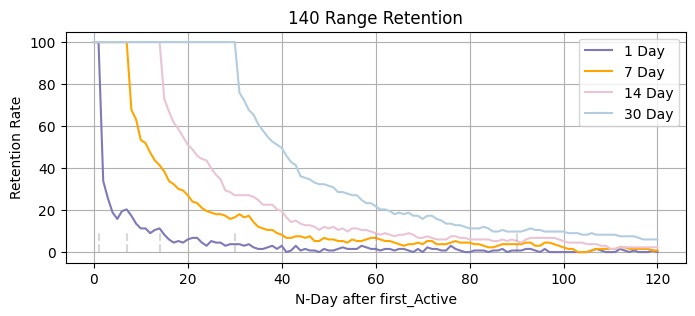

[67] : 11 : 2188 : 56.86
558 : [  81 1153 2203 2250 2678]


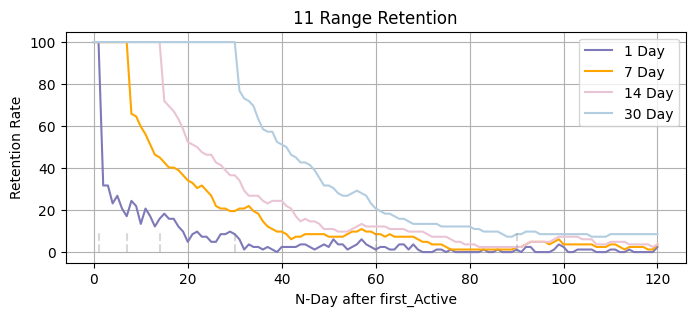

[68] : 32 : 395 : 56.82
Not enough user data : 32 lesson.user : 3 < 100
[69] : 133 : 162 : 56.58
Not enough user data : 133 lesson.user : 11 < 100
[70] : 73 : 476 : 56.55
Not enough user data : 73 lesson.user : 18 < 100
[71] : 81 : 573 : 55.83
Not enough user data : 81 lesson.user : 13 < 100
[72] : 112 : 1283 : 55.58
300 : [ 973 1128 1362 3366 4943]


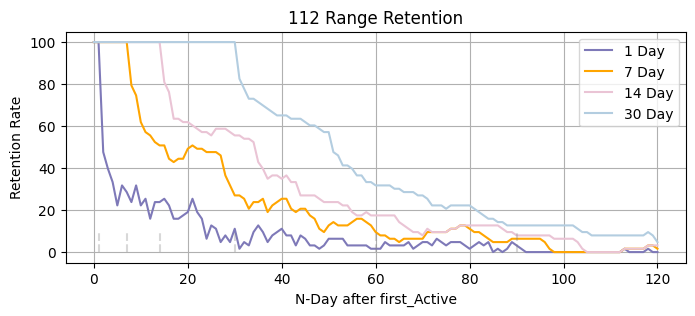

[73] : 166 : 1006 : 55.07
140 : [ 309 1968 2086 2289 2702]


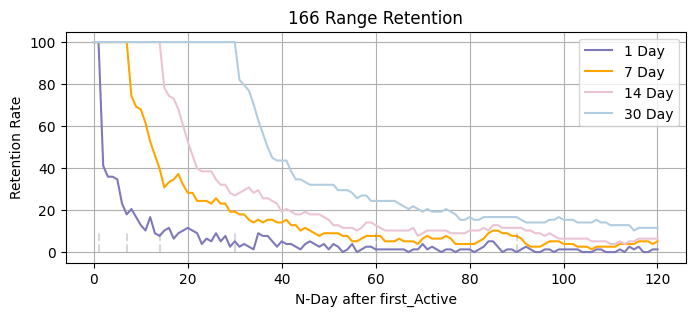

[74] : 135 : 1045 : 55.0
112 : [ 996 2649 5103 5110 7628]


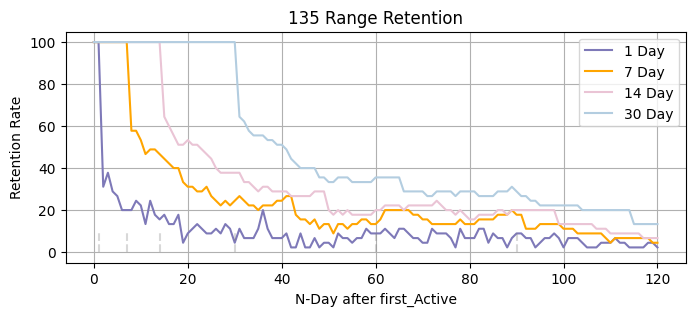

[75] : 168 : 1794 : 54.83
573 : [ 475  543  907  957 1027]


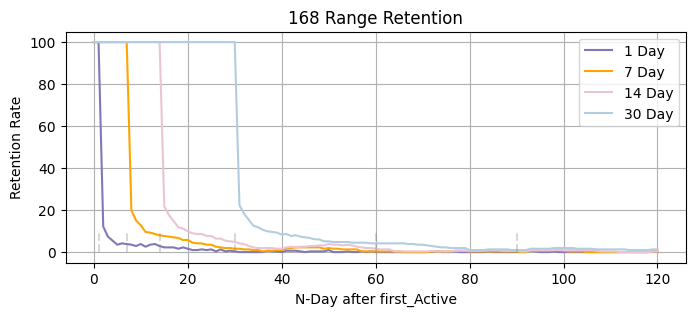

[76] : 57 : 4723 : 54.76
1591 : [321 421 495 774 821]


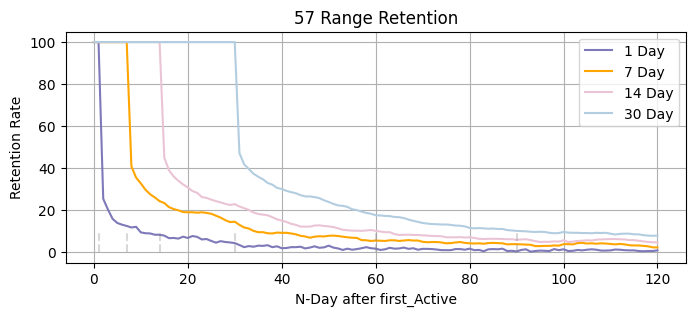

[77] : 35 : 280 : 54.26
Not enough user data : 35 lesson.user : 8 < 100
[78] : 41 : 1492 : 53.82
209 : [ 578 2615 2823 4158 4828]


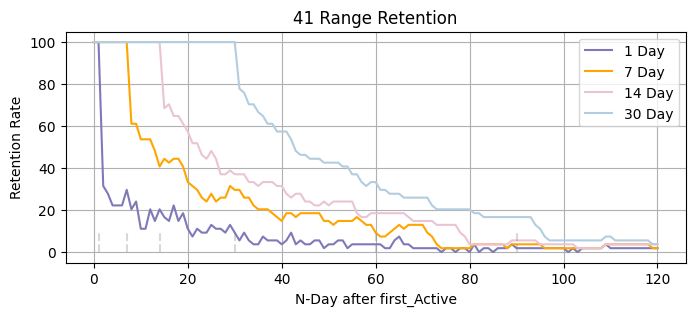

[79] : 136 : 165 : 53.1
Not enough user data : 136 lesson.user : 2 < 100
[80] : 96 : 352 : 52.5
Not enough user data : 96 lesson.user : 24 < 100
[81] : 125 : 229 : 52.39
Not enough user data : 125 lesson.user : 17 < 100
[82] : 13 : 203 : 51.82
Not enough user data : 13 lesson.user : 3 < 100
[83] : 85 : 13701 : 51.02
6656 : [ 15  39  70 127 287]


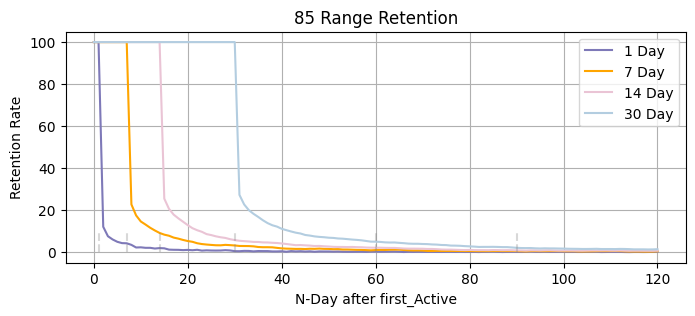

[84] : 88 : 304 : 50.6
Not enough user data : 88 lesson.user : 20 < 100
[85] : 184 : 519 : 50.5
Not enough user data : 184 lesson.user : 59 < 100
[86] : 62 : 900 : 48.63
Not enough user data : 62 lesson.user : 52 < 100
[87] : 30 : 1291 : 48.38
237 : [ 271 1983 3567 3766 5770]


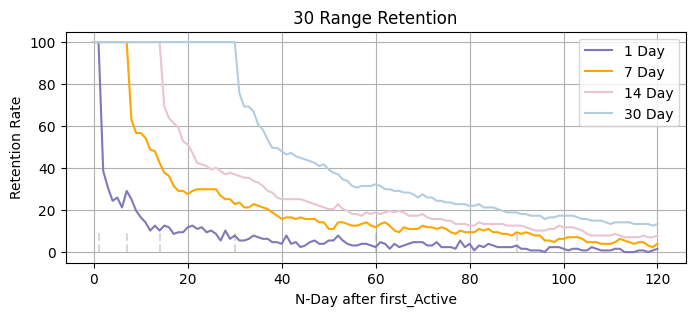

[88] : 159 : 6211 : 47.61
3663 : [ 12 102 104 126 135]


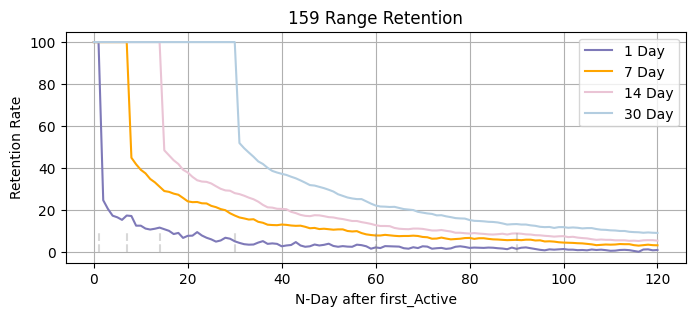

[89] : 170 : 226 : 45.12
Not enough user data : 170 lesson.user : 19 < 100
[90] : 208 : 321 : 43.16
Not enough user data : 208 lesson.user : 10 < 100
[91] : 206 : 362 : 40.22
Not enough user data : 206 lesson.user : 4 < 100


,group_name,day1,day2,week1,week2,month1,month2
0,108,46.55,38.29,58.71,40.54,32.73,16.07
1,74,25.00,31.82,31.82,22.73,11.36,9.09
2,50,40.91,45.45,40.91,22.73,9.09,13.64
3,200,52.37,45.52,64.29,50.43,38.44,20.88
4,181,54.53,44.83,60.73,42.77,37.84,22.89
5,22,50.68,41.10,56.16,38.36,31.51,23.29
6,119,46.67,35.00,36.67,33.33,30.00,10.00
7,150,53.01,46.99,63.86,40.96,36.14,22.89
8,190,61.73,49.38,67.90,58.02,54.32,25.93
9,93,16.25,10.77,12.50,8.08,6.15,3.27


In [163]:
retention_index_df2 = pd.DataFrame(columns=['group_name'
                                 , 'day1', 'day2'
                                 , 'week1', 'week2'
                                 , 'month1', 'month2'])

limit_min = 100
# why 3000 > ? : Sign-up Event Count (30일 단위 합산) =~= 3000 
# why 1700 > ? : all user cnt / 100 =~= 1700 
# why 100 > ? : for percentage of user

target_df = con_df[con_df['con_nu'] > limit_min].sort_values('con_les_nu_rate', ascending=False)

target_list = zip(target_df['content.id'], target_df['con_nu'], target_df['con_les_nu_rate'])
# set retention_range
retention_range = 120

for index, target in enumerate(target_list):
    # unpacking
    target_content_id = int(target[0])
    con_nu = int(target[1])
    con_les_nu_rate = target[2]
    print(f"[{index}] : {target_content_id} : {con_nu} : {con_les_nu_rate}")

    # get max_timeline
    max_timeline = MAX_DATE - pd.Timedelta(retention_range, unit='D')

    # get index_mask : user filtering
    index_mask = target_user[target_user['content.id'] == target_content_id]['user_id'].unique()
    
    # update con_df
    con_df.loc[con_df['content.id'] == target_content_id, 'num_of_effected_users'] = len(index_mask)
    
    # except under limit_min
    if len(index_mask) < limit_min:
        print(f"Not enough user data : {target_content_id} lesson.user : {len(index_mask)} < {limit_min}")
        continue
    
    print(f'{len(index_mask)} : {index_mask[:5]}')
        
    # filtering
    user = base_user[base_user['sign_up_time'] < max_timeline]
    user = user[user['user_id'].isin(index_mask)]

    target_name = target_content_id
    
    result = get_retention(base_df, user, target_name, retention_range, 'first_Active')

    retention_index_df2 = pd.concat([retention_index_df2, result])
    
retention_index_df2.reset_index(drop=True, inplace=True)
retention_index_df2

In [164]:
result = retention_index_df2.copy()
result.rename(columns={'group_name' : 'content_id'}, inplace=True)
result['day1/day2'] = round(result['day2'] / result['day1'] * 100, 2)
result['week1/week1'] = round(result['week2'] / result['week1'] * 100, 2)
result['month1/month2'] = round(result['month2'] / result['month1'] * 100, 2)

temp = con_df.rename(columns={'content.id' : 'content_id'})

result = pd.merge(result, temp, on='content_id', how='left')
result

,content_id,day1,day2,week1,week2,month1,month2,day1/day2,week1/week1,month1/month2,con_nu,con_les_nu_mean,num_of_effected_users,con_les_nu_rate,con_les_nu_cnt,content.difficulty
0,108,46.55,38.29,58.71,40.54,32.73,16.07,82.26,69.05,49.10,5036,4189,1506,83.19,35,1.0
1,74,25.00,31.82,31.82,22.73,11.36,9.09,127.28,71.43,80.02,9415,7707,163,81.87,27,2.0
2,50,40.91,45.45,40.91,22.73,9.09,13.64,111.10,55.56,150.06,514,415,256,80.74,57,2.0
3,200,52.37,45.52,64.29,50.43,38.44,20.88,86.92,78.44,54.32,12030,9592,5675,79.74,44,2.0
4,181,54.53,44.83,60.73,42.77,37.84,22.89,82.21,70.43,60.49,4748,3738,1578,78.73,57,2.0
5,22,50.68,41.10,56.16,38.36,31.51,23.29,81.10,68.30,73.91,3681,2864,860,77.83,56,3.0
6,119,46.67,35.00,36.67,33.33,30.00,10.00,74.99,90.89,33.33,2633,1992,221,75.67,44,3.0
7,150,53.01,46.99,63.86,40.96,36.14,22.89,88.64,64.14,63.34,2171,1640,598,75.57,77,3.4
8,190,61.73,49.38,67.90,58.02,54.32,25.93,79.99,85.45,47.74,1937,1450,297,74.86,64,2.0
9,93,16.25,10.77,12.50,8.08,6.15,3.27,66.28,64.64,53.17,8307,6148,1814,74.01,20,1.0


,day1,day2,week1,week2,month1,month2,day1/day2,week1/week1,month1/month2,number of user in content,mean of user in lesson of content,number of effected users,mean of lesson completed rate of content,number of lesson in content,difficulty of content
day1,1.00,0.93,0.92,0.90,0.79,0.60,0.06,0.44,0.12,-0.41,-0.34,-0.32,0.40,0.48,0.46
day2,0.93,1.00,0.90,0.84,0.71,0.64,0.40,0.36,0.31,-0.43,-0.35,-0.35,0.43,0.49,0.51
week1,0.92,0.90,1.00,0.93,0.87,0.77,0.21,0.37,0.23,-0.39,-0.31,-0.32,0.42,0.53,0.48
week2,0.90,0.84,0.93,1.00,0.85,0.60,0.14,0.65,0.01,-0.34,-0.26,-0.28,0.33,0.51,0.41
month1,0.79,0.71,0.87,0.85,1.00,0.84,0.04,0.40,0.07,-0.35,-0.29,-0.28,0.23,0.54,0.49
month2,0.60,0.64,0.77,0.60,0.84,1.00,0.23,-0.00,0.50,-0.31,-0.26,-0.24,0.25,0.51,0.46
day1/day2,0.06,0.40,0.21,0.14,0.04,0.23,1.00,0.06,0.44,-0.25,-0.20,-0.30,0.16,0.19,0.32
week1/week1,0.44,0.36,0.37,0.65,0.40,-0.00,0.06,1.00,-0.40,-0.21,-0.17,-0.23,-0.00,0.32,0.23
month1/month2,0.12,0.31,0.23,0.01,0.07,0.50,0.44,-0.40,1.00,-0.09,-0.06,-0.09,0.31,0.22,0.13
number of user in content,-0.41,-0.43,-0.39,-0.34,-0.35,-0.31,-0.25,-0.21,-0.09,1.00,0.98,0.91,0.07,-0.39,-0.48


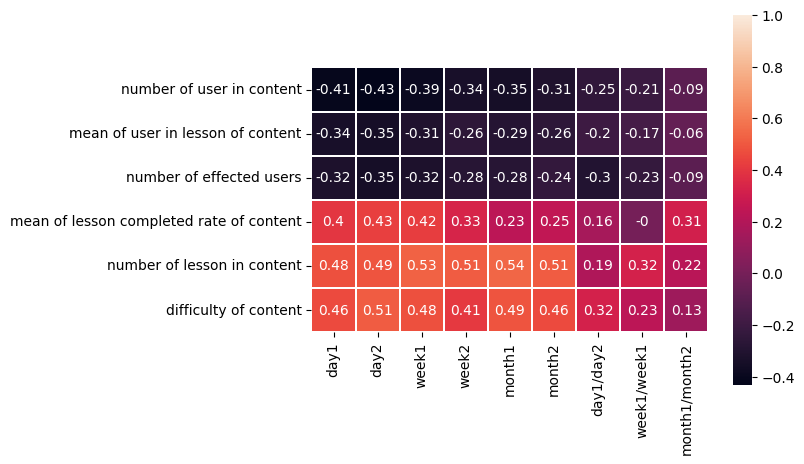

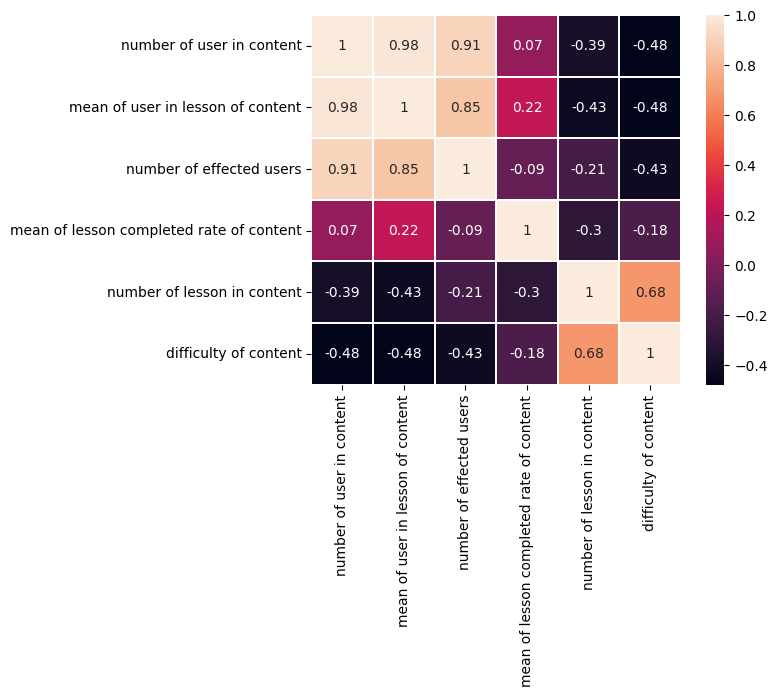

In [165]:
# correlation
import scipy.stats as stats

corr_matrix = result\
        .rename(columns = {'con_nu' : 'number of user in content',
                           'con_les_nu_mean' : 'mean of user in lesson of content',
                           'con_les_nu_rate' : 'mean of lesson completed rate of content',
                           'con_les_nu_cnt' : 'number of lesson in content',
                           'num_of_effected_users' : 'number of effected users',
                           'content.difficulty' : 'difficulty of content'
                           })\
        .drop(columns=['content_id']).corr().round(2)
display(corr_matrix)

sns.heatmap(corr_matrix.iloc[9:, :9], linewidths=0.1, vmax=1.0, square=True, linecolor='white', annot=True)
plt.show()
sns.heatmap(corr_matrix.iloc[9:, 9:], linewidths=0.1, vmax=1.0, square=True, linecolor='white', annot=True)
plt.show()
# scatter plot

### activate to sign up date

In [166]:
ONLY_NEW_USER = False
user_id_in_df = user_indexs[user_indexs['event_type'] == 3]['user_id'].unique()

# set the target df
if ONLY_NEW_USER:
    dfs = [
        com_df_22.loc[(com_df_22['event_type'] == 14) & com_df_22['user_id'].isin(user_id_in_df), ['user_id', 'client_event_time']],
        com_df_23.loc[(com_df_23['event_type'] == 14) & com_df_23['user_id'].isin(user_id_in_df), ['user_id', 'client_event_time']]
    ]
else:
    dfs = [
        com_df_22.loc[(com_df_22['event_type'] == 14) & (com_df_22['user_id'] != 0), ['user_id', 'client_event_time']],
        com_df_23.loc[(com_df_23['event_type'] == 14) & (com_df_23['user_id'] != 0), ['user_id', 'client_event_time']]
    ]

# set time list
timelists = [
    pd.date_range('2022-01-01', '2022-12-31', freq='D').floor("D"),
    pd.date_range('2023-01-01', '2023-12-31', freq='D').floor("D")
]

# set result, temp
results = [[], []]
temps = [[], []]

user_df

# get results
for i in range(2):
    results[i] = dfs[i].groupby(dfs[i]['client_event_time'].dt.strftime("%m-%d"))['user_id'].unique()
    # temps[i] = pd.DataFrame(["01-01", results[i].iloc[0]])
    # temps[i] = temps[i].T
    # temps[i].columns = ['date', 'user_id_unique']

data_sets = {}

for year, dfs in enumerate(results):
    year = 2022 + year
    # group by month
    dfs = dfs.groupby(dfs.index.str[:2]).apply(list)
    
    for month, month_user_id in enumerate(dfs):
        # set
        month = month + 1
        label = f'{year}-{month}'
        data_sets[label] = []

        for day, day_user_id in enumerate(month_user_id):
            date = pd.to_datetime(dt.strptime(f'{label}-{day + 1}', '%Y-%m-%d'))
            
            for user_id in day_user_id:
                sign_up = user_df[user_df['user_id'] == user_id]['sign_up_time'].values[0]
                value = (date - sign_up).days
                
                if value < 0:
                    value = 0
                
                data_sets[label].append(value)
        
        print(data_sets[label])
        # data_sets[label] = np.array(data_sets[label])

# # display
# results[0].plot(figsize=(8, 3), label='2022', title='Daily lesson complete Event Count(no rolling)', xlabel='Date', ylabel='Count', grid=True)
# results[1].plot(figsize=(8, 3), label='2023', xlabel='Date', grid=True)
# plt.legend()
# plt.show()

# # set result_list
# result_list = [[], []]

# for i in range(2):
#     result_list[i] = [ results[i].copy() ]
    
# # rolling count
# for rolling_offset in [7, 14, 30]:
#     # reset rolling
#     results = [
#         pd.DataFrame(temps[0].copy(), columns=['date', 'user_id_unique']),
#         pd.DataFrame(temps[1].copy(), columns=['date', 'user_id_unique'])
#     ]
    
#     for j in range(2):
#         for i in range(1, 365):
#             # set mindate
#             if i <= rolling_offset - 1:
#                 min_data = timelists[j][0]
#             else:
#                 min_data = timelists[j][i + 1 - rolling_offset]
            
#             # get rolling result
#             rolling_result = dfs[j]\
#                 .loc[((dfs[j]['client_event_time'] >= pd.Timestamp(min_data))\
#                     & (dfs[j]['client_event_time'] <= pd.Timestamp(timelists[j][i]))), 'user_id']\
#                         .nunique()

#             # set temp result
#             temp = pd.DataFrame([timelists[j][i].strftime("%m-%d"), rolling_result])
#             temp = temp.T
#             temp.columns = ['date', 'user_id_unique']
                
#             # concat            
#             results[j] = pd.concat([results[j], temp])

#         # set index
#         results[j].set_index('date', inplace=True)
        
#         # append result_list
#         result_list[j].append(results[j].copy())

#     # display
#     results[0]['user_id_unique'].plot(figsize=(8, 3), label = '2022', title=f'Range retention lesson complete Event User nunique({rolling_offset} Day Range)', xlabel='Date', ylabel='# of Nunique', grid=True)
#     results[1]['user_id_unique'].plot(figsize=(8, 3), label = '2023', xlabel='Date', grid=True)
    
#     plt.legend()
#     plt.show()

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

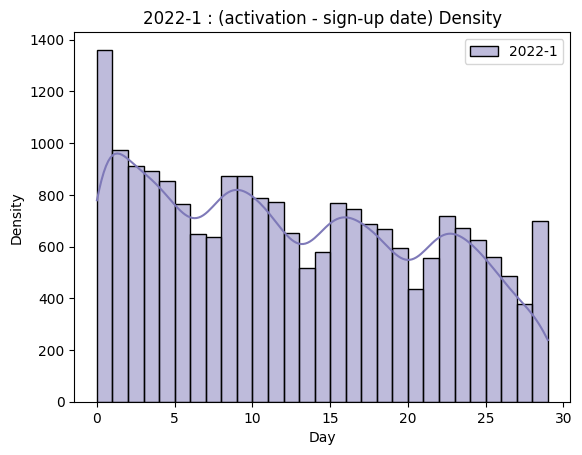

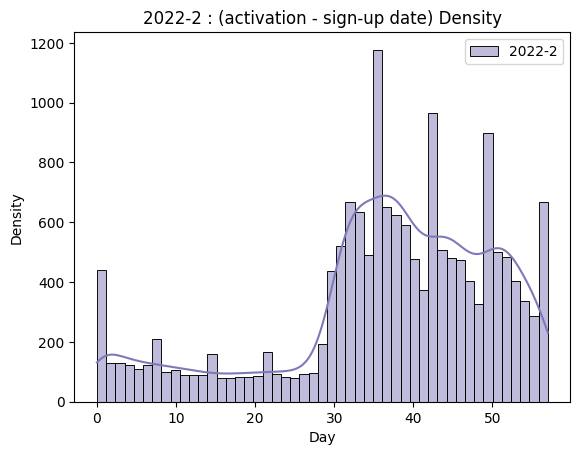

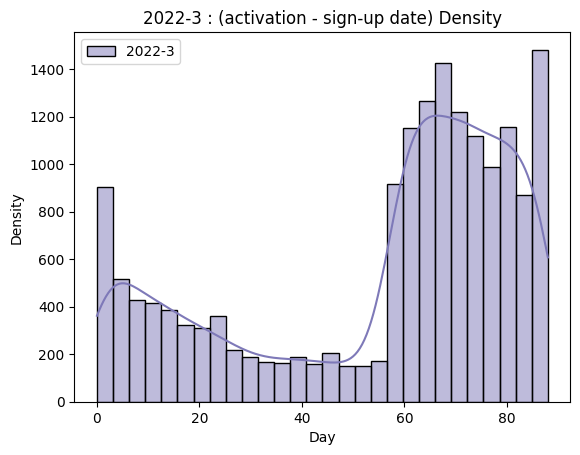

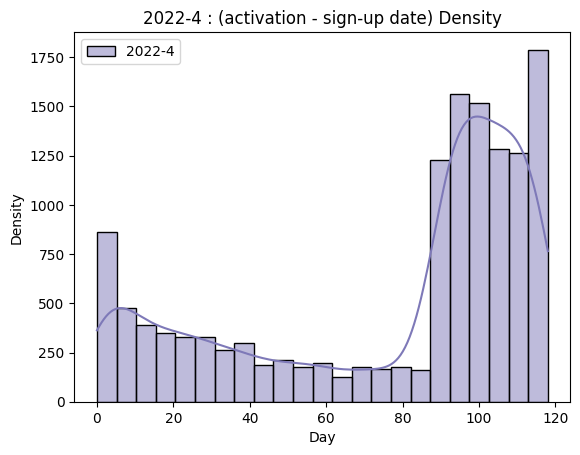

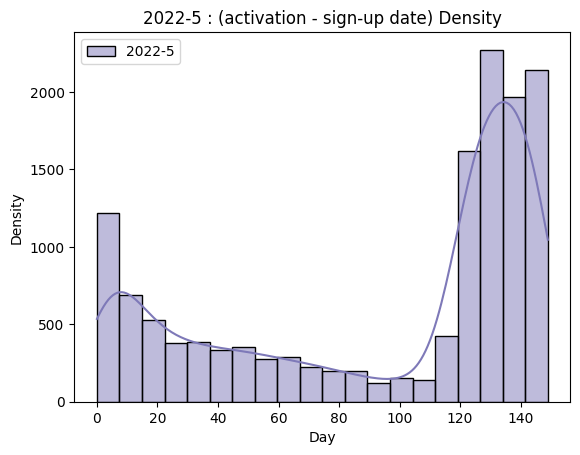

...

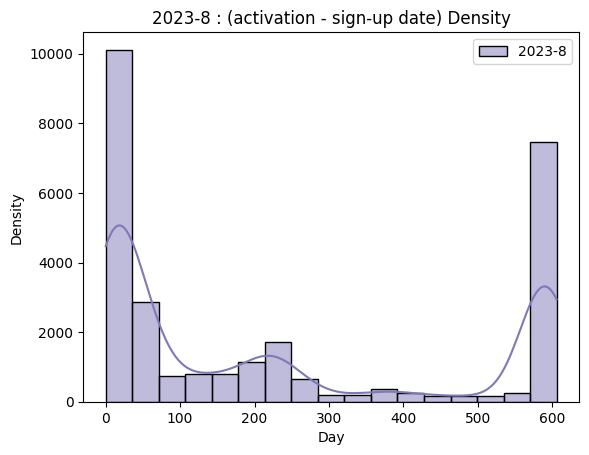

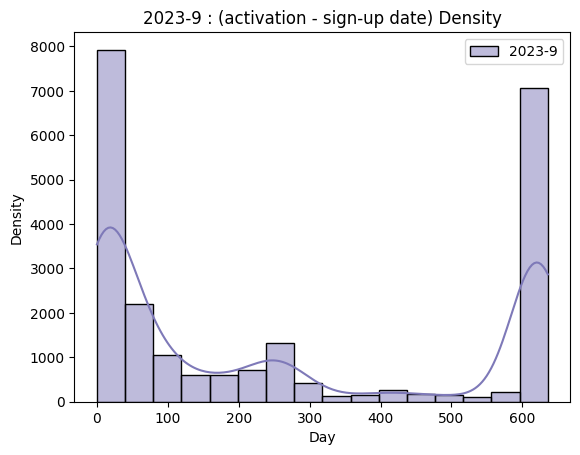

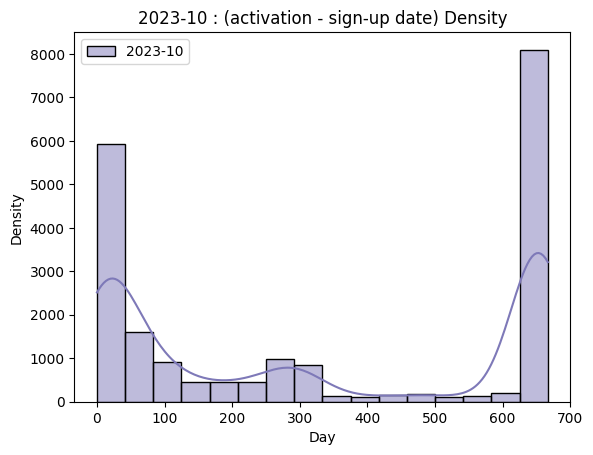

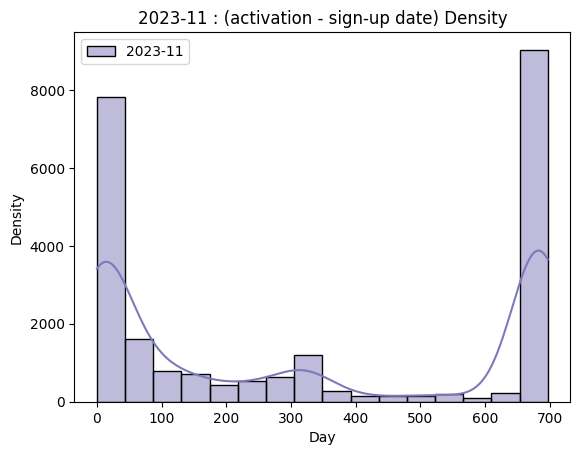

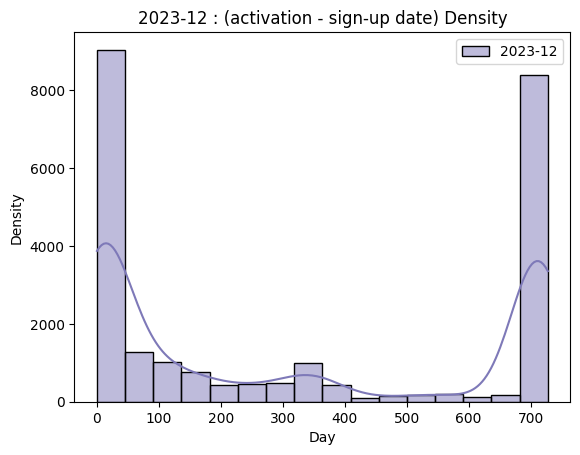

In [167]:
for year in [2022, 2023]:
    for month in range(1, 13):
        label = f'{year}-{month}'
        
        ax = sns.histplot(data=data_sets[label], label=label
                        , kde=True, alpha=0.5)
        ax = sns.kdeplot()

        ax.set_xlabel('Day')
        ax.set_ylabel('Density')
        ax.set_title(f'{year}-{month} : (activation - sign-up date) Density')
        
        plt.legend()
        plt.show()

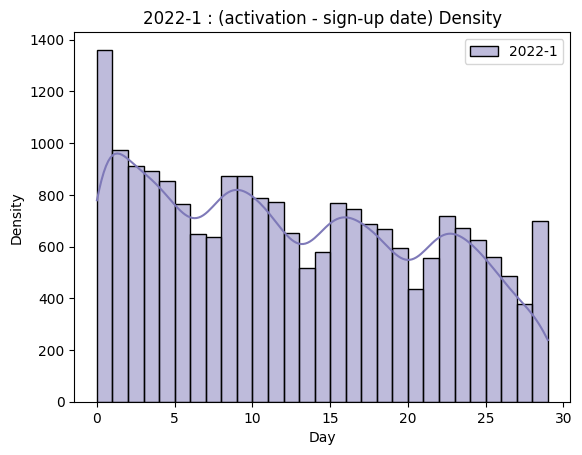

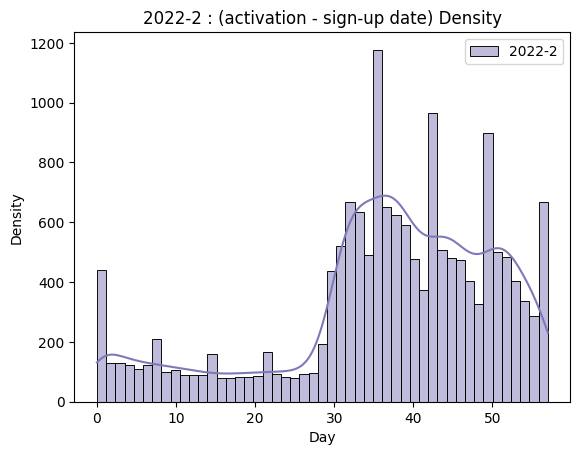

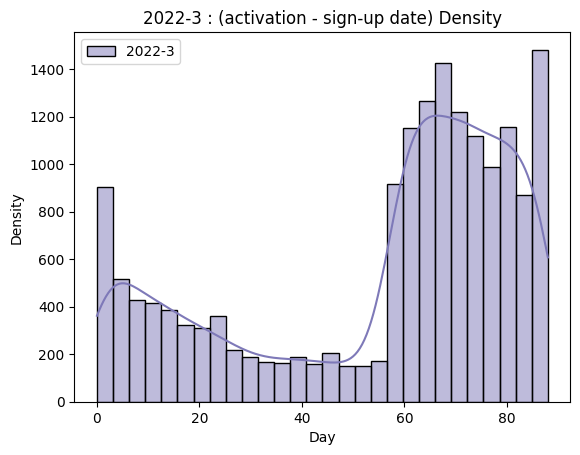

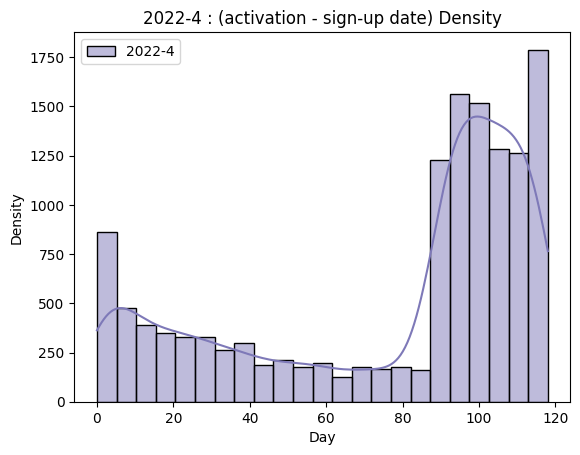

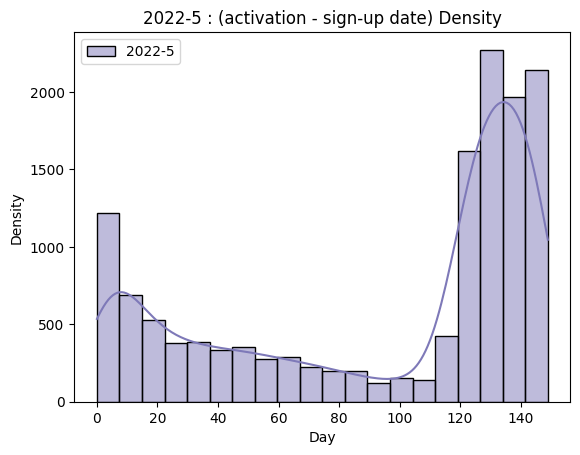

...

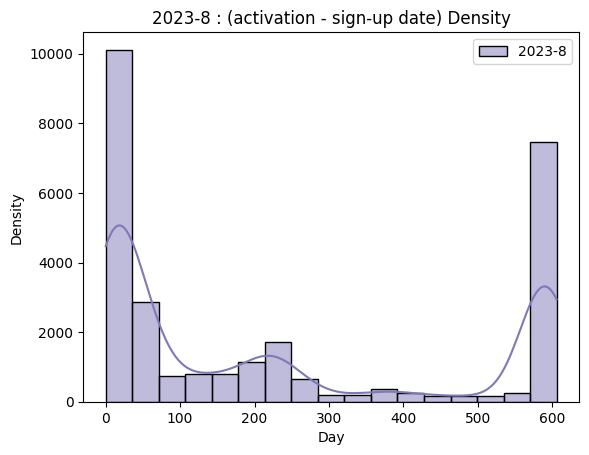

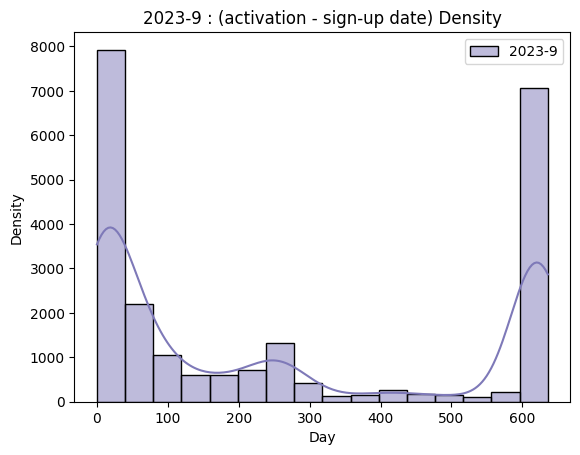

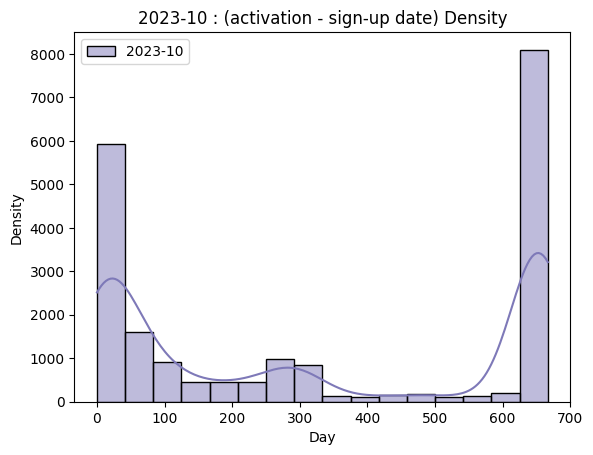

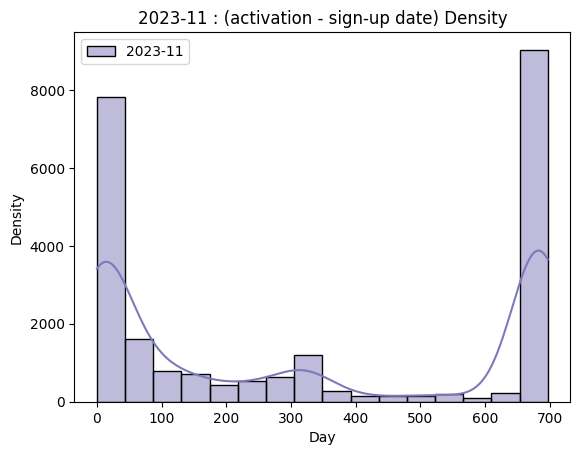

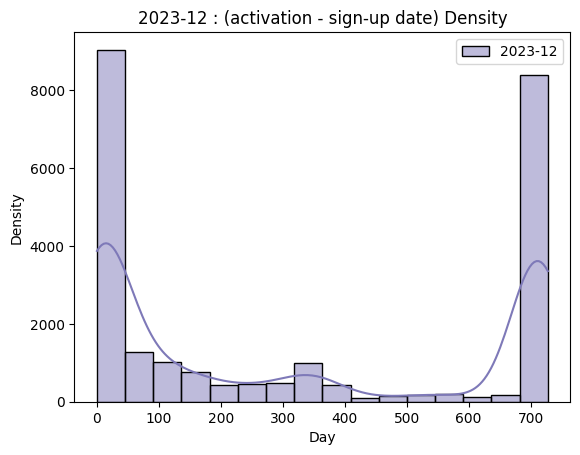

In [168]:
for year in [2022, 2023]:
    for month in range(1, 13):
        label = f'{year}-{month}'
        
        ax = sns.histplot(data=data_sets[label], label=label
                        , kde=True, alpha=0.5)
        ax = sns.kdeplot()

        ax.set_xlabel('Day')
        ax.set_ylabel('Density')
        ax.set_title(f'{year}-{month} : (activation - sign-up date) Density')
        
        plt.legend()
        plt.show()

### 분석 trouble shoting

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import koreanize_matplotlib
import pandas as pd
import datetime
import numpy as np
import datasets

In [2]:
main_page = datasets.enter.main_page()
signup_page = datasets.enter.signup_page()
complete_signup = datasets.complete.signup()

- 시간대 설정             
 UTC 기준이므로 +9시간

In [3]:
dataframes = [signup_page, complete_signup, main_page]
dataframes = [df.assign(client_event_time=pd.to_datetime(df['client_event_time']) + datetime.timedelta(hours=9)) for df in dataframes]

# 개별 데이터프레임 다시 할당
signup_page, complete_signup, main_page = dataframes

# 2. enter.signup_page
- 회원 가입 페이지 진입 

In [4]:
signup_page

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seoul,2023-04-06 06:30:42.557,South Korea,NaN,Samsung Phone,Samsung Galaxy A51 5G,enter.signup_page,Korean,Chrome,112.0.0.0,Web,NaN
1,Seoul,2023-04-06 06:37:41.467,South Korea,NaN,Samsung SM-S916N,NaN,enter.signup_page,Korean,Chrome,111.0.0.0,Web,NaN
2,Seoul,2023-04-06 06:05:53.237,South Korea,NaN,Apple iPhone,Apple iPhone,enter.signup_page,Korean,Mobile Safari,16.4,Web,NaN
3,Gangnam-gu,2023-04-06 06:41:58.269,South Korea,NaN,Mac,Mac,enter.signup_page,Korean,Safari,16.3,Web,NaN
4,Seoul,2023-04-06 06:44:53.294,South Korea,NaN,Mac,Mac,enter.signup_page,Korean,Safari,15.6.1,Web,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
596824,Dalseo-gu,2023-10-10 14:32:53.865,South Korea,NaN,Windows,Windows,enter.signup_page,Korean,Edge,114.0.1823.51,Web,NaN
596825,Hanam,2023-10-10 14:33:14.433,South Korea,NaN,Windows,Windows,enter.signup_page,Korean,Chrome,116.0.0.0,Web,NaN
596826,Seoul,2023-10-10 14:49:45.856,South Korea,NaN,Windows,Windows,enter.signup_page,Korean,Edge,117.0.2045.47,Web,NaN
596827,Dongjak-gu,2023-10-10 14:57:02.640,South Korea,NaN,Windows,Windows,enter.signup_page,Korean,Edge,117.0.2045.60,Web,NaN


In [5]:
signup_page.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 596829 entries, 0 to 596828
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               581024 non-null  object        
 1   client_event_time  596829 non-null  datetime64[ns]
 2   country            596315 non-null  object        
 3   device_carrier     0 non-null       float64       
 4   device_family      596747 non-null  object        
 5   device_type        567387 non-null  object        
 6   event_type         596829 non-null  object        
 7   language           596829 non-null  object        
 8   os_name            596754 non-null  object        
 9   os_version         594650 non-null  object        
 10  platform           596829 non-null  object        
 11  user_id            0 non-null       float64       
dtypes: datetime64[ns](1), float64(2), object(9)
memory usage: 54.6+ MB


In [6]:
signup_page.isnull().sum()

city                  15805
client_event_time         0
country                 514
device_carrier       596829
device_family            82
device_type           29442
event_type                0
language                  0
os_name                  75
os_version             2179
platform                  0
user_id              596829
dtype: int64

In [ ]:
signup_page.nunique() 

city                   2471
client_event_time    596728
country                 180
device_carrier            0
device_family           849
device_type             552
event_type                1
language                 59
os_name                  34
os_version             1995
platform                  1
user_id                   0
dtype: int64

- client_event_time : 596728 -> 회원가입 페이지 방문 수는 총 596728번 있었던 것으로 확인됨
- 전체 행 대비 client_event_time 유니크 값을 비교했을 때, 동일한 시점에 방문한 경우가 101건 있는 것으로 확인됨
- user_id가 전부 null값 -> 회원 가입을 안 했으므로 null값 처리가 된듯함

In [44]:
duplicated_counts = signup_page['client_event_time'].value_counts()
duplicated_counts = duplicated_counts[duplicated_counts > 1]  
print(duplicated_counts.to_string())  
total_duplicates = duplicated_counts.sum() - len(duplicated_counts)
print(f"총 중복 발생 횟수: {total_duplicates}회")

2022-01-18 13:11:29.644    3
2022-01-18 13:12:06.995    3
2023-11-11 01:30:30.962    2
2022-06-11 20:08:33.130    2
2022-03-04 20:19:42.119    2
2023-03-08 18:16:07.726    2
2023-10-26 01:29:04.468    2
2023-02-12 21:03:03.170    2
2023-09-10 17:47:37.607    2
2022-10-17 22:59:08.951    2
2023-06-24 07:05:48.817    2
2022-10-17 22:58:39.535    2
2023-09-05 16:29:37.948    2
2023-01-17 21:30:41.794    2
2023-03-08 10:43:35.322    2
2022-08-12 21:14:27.729    2
2023-05-30 18:54:37.202    2
2023-01-23 11:10:34.023    2
2022-05-16 01:41:33.586    2
2022-11-18 02:20:53.326    2
2022-01-04 10:17:04.260    2
2023-11-08 23:24:18.618    2
2022-12-14 16:33:10.110    2
2023-04-12 18:00:50.309    2
2022-04-14 13:09:35.057    2
2022-02-18 13:26:01.566    2
2022-01-27 17:34:19.156    2
2023-01-06 04:25:01.688    2
2022-03-22 00:09:47.643    2
2023-11-02 00:10:50.832    2
2023-02-28 14:17:56.638    2
2022-03-20 21:15:45.125    2
2022-12-09 02:34:40.825    2
2023-01-16 18:36:08.167    2
2022-12-16 13:

In [ ]:
counts = {'City': signup_page['city'].value_counts().sort_values(ascending=False),
					'Language': signup_page['language'].value_counts().sort_values(ascending=False),
					'Device Type': signup_page['device_type'].value_counts().sort_values(ascending=False),
					'Os Name': signup_page['os_name'].value_counts().sort_values(ascending=False),
					'User Id': signup_page['user_id'].value_counts().sort_values(ascending=False)
}

for key, value in counts.items():
	print(f"=== {key} ===")
	print(value, end="\n\n")

=== City ===
Seoul                     125164
Gangnam-gu                 20419
Suwon                      15216
Seongnam-si                15124
Yongin-si                  12004
                           ...  
Yamanashi                      1
Sao Sebastiao do Passe         1
Hagerstown                     1
Annandale                      1
Haldwani                       1
Name: city, Length: 2471, dtype: int64

=== Language ===
Korean         567173
English         25156
Arabic            720
Japanese          653
Chinese           593
French            421
Spanish           335
Russian           334
Vietnamese        272
Indonesian        189
Persian           181
Hindi             155
German            130
Uzbek              90
Thai               73
Portuguese         60
Turkish            28
Khmer              27
Mongolian          25
Bengali            19
Italian            14
Azerbaijani        14
Polish             11
Norwegian          10
Burmese            10
Dutch            

- 회원 가입 페이지 방문자의 접속 기기는 윈도우가 236839건으로 가장 높게 나타났다.
- 회원 가입 페이지 방문자 브라우저의 경우 인스타가 64244건으로 두번째로 많게 나타났다. -> 인스타 광고의 효과도 있는 것으로 추측됨

In [ ]:
first_signup_page = signup_page['client_event_time'].min()
last_signup_page = signup_page['client_event_time'].max()

print(f"처음 content_page 이벤트 발생일 : {first_signup_page}")
print(f"마지막 content_page 이벤트 발생일 : {last_signup_page}")

처음 content_page 이벤트 발생일 : 2021-11-25 09:08:17.825000
마지막 content_page 이벤트 발생일 : 2024-01-01 08:59:22.267000


# 3. complete.signup
- 회원가입 완료

In [ ]:
complete_signup

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,type
0,NaN,2023-04-06 06:33:26.068,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,74d17c27a41656e7788b0c81d9f76cda,kakao
1,NaN,2023-04-06 06:45:18.672,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,06b6868000a5d576180aca47896d6cce,kakao
2,Seo-gu,2023-04-10 23:47:56.424,South Korea,NaN,Windows,Windows,complete.signup,Korean,Chrome,111.0.0.0,Web,e131c319972bd580146c5a2faba26613,kakao
3,Suwon,2023-04-10 23:25:45.920,South Korea,NaN,Apple iPhone,Apple iPhone,complete.signup,Korean,Mobile Safari,16.3,Web,e3b8bfa80d866f296aad139e09023ef3,naver
4,NaN,2023-04-10 23:09:50.698,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,5208a60918f18562ac9d668a35b20303,kakao
...,...,...,...,...,...,...,...,...,...,...,...,...,...
145128,NaN,2023-10-10 14:10:04.854,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,0117038cc69fe8a40388ec19bb0a495e,kakao
145129,NaN,2023-10-10 14:16:31.995,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,bc1a28ff902daba9399e7f602cc86285,kakao
145130,NaN,2023-10-10 14:27:53.140,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,0d507104136f139cbc9f6fa1db365162,google
145131,NaN,2023-10-10 14:33:30.471,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,298e200203472e5bc0f9a14053e1dfe1,google


In [ ]:
complete_signup.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145133 entries, 0 to 145132
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               44774 non-null   object        
 1   client_event_time  145133 non-null  datetime64[ns]
 2   country            45756 non-null   object        
 3   device_carrier     0 non-null       float64       
 4   device_family      45767 non-null   object        
 5   device_type        44659 non-null   object        
 6   event_type         145133 non-null  object        
 7   language           45767 non-null   object        
 8   os_name            45745 non-null   object        
 9   os_version         45651 non-null   object        
 10  platform           45767 non-null   object        
 11  user_id            145133 non-null  object        
 12  type               144958 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(11)

In [ ]:
complete_signup.isnull().sum()

city                 100359
client_event_time         0
country               99377
device_carrier       145133
device_family         99366
device_type          100474
event_type                0
language              99366
os_name               99388
os_version            99482
platform              99366
user_id                   0
type                    175
dtype: int64

In [ ]:
complete_signup.nunique()

city                    543
client_event_time    145132
country                  56
device_carrier            0
device_family            67
device_type             167
event_type                1
language                 16
os_name                  19
os_version              844
platform                  1
user_id              145133
type                      6
dtype: int64

In [ ]:
counts = {'City': complete_signup ['city'].value_counts().sort_values(ascending=False),
					'Language': complete_signup ['language'].value_counts().sort_values(ascending=False),
					'Device Type': complete_signup ['device_type'].value_counts().sort_values(ascending=False),
					'Os Name': complete_signup ['os_name'].value_counts().sort_values(ascending=False),
					'User Id': complete_signup ['user_id'].value_counts().sort_values(ascending=False),
					'Type': complete_signup ['type'].value_counts().sort_values(ascending=False),
}

for key, value in counts.items():
		print(f"=== {key} ===")
		print(value, end="\n\n")

=== City ===
Seoul              8564
Gangnam-gu         1311
Suwon              1264
Seongnam-si        1181
Yongin-si           975
                   ... 
New Brunswick         1
North Vancouver       1
Danyang               1
Mountain View         1
Redwood City          1
Name: city, Length: 543, dtype: int64

=== Language ===
Korean        44163
English        1466
Japanese         50
Chinese          23
Vietnamese       16
French           12
Russian          12
German            7
Spanish           6
Uzbek             4
Indonesian        3
Ukrainian         1
Turkish           1
Arabic            1
Galician          1
Portuguese        1
Name: language, dtype: int64

=== Device Type ===
Windows                         21981
Apple iPhone                     5920
Android                          5280
Mac                              3822
Samsung Galaxy S21 5G             366
                                ...  
Apple iPad Mini 5th Gen             1
Samsung Galaxy S10 Plus        

- 총 145133 유저id -> 145133명이 회원 가입을 완료한 것으로 확인됨
- test는 개발 단계 필터가 안된 것으로 보임 -> 전처리 필요

In [ ]:
first_complete_signup = complete_signup['client_event_time'].min()
last_complete_signup = complete_signup['client_event_time'].max()

print(f"처음 content_page 이벤트 발생일 : {first_complete_signup}")
print(f"마지막 content_page 이벤트 발생일 : {last_complete_signup}")

처음 content_page 이벤트 발생일 : 2022-01-01 09:06:31.232000
마지막 content_page 이벤트 발생일 : 2024-01-01 08:51:53.728000


# enter.main_page
- 메인 페이지 진입

In [ ]:
main_page

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seongnam-si,2023-04-05 21:55:06.140000,South Korea,NaN,Samsung Phone,Samsung Galaxy S21 5G,enter.main_page,Korean,Whale,1.0.0.0,Web,NaN
1,Dongdaemun-gu,2023-04-05 21:04:28.967000,South Korea,NaN,Mac,Mac,enter.main_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4
2,Hwaseong-si,2023-04-05 21:01:31.258000,South Korea,NaN,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
3,Hwaseong-si,2023-04-05 21:02:50.374000,South Korea,NaN,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
4,Seoul,2023-04-05 21:30:33.727000,South Korea,NaN,Samsung Phone,Samsung Galaxy A51 5G,enter.main_page,Korean,Chrome,112.0.0.0,Web,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2133543,Jeongeup,2023-10-10 05:53:29.283000,South Korea,NaN,Windows,Windows,enter.main_page,Korean,Chrome,117.0.0.0,Web,NaN
2133544,Jeongeup,2023-10-10 05:54:17.572000,South Korea,NaN,Windows,Windows,enter.main_page,Korean,Chrome,117.0.0.0,Web,NaN
2133545,Gangnam-gu,2023-10-10 05:54:33.164000,South Korea,NaN,Windows,Windows,enter.main_page,Korean,Chrome,117.0.0.0,Web,NaN
2133546,Saha-gu,2023-10-10 05:58:15.175000,South Korea,NaN,Samsung Phone,Samsung Galaxy S23+,enter.main_page,Korean,Instagram,303.0.0.40.109,Web,NaN


In [ ]:
main_page.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2133548 entries, 0 to 2133547
Data columns (total 12 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time  object 
 2   country            object 
 3   device_carrier     float64
 4   device_family      object 
 5   device_type        object 
 6   event_type         object 
 7   language           object 
 8   os_name            object 
 9   os_version         object 
 10  platform           object 
 11  user_id            object 
dtypes: float64(1), object(11)
memory usage: 195.3+ MB


In [ ]:
main_page.isnull().sum()

city                   56988
client_event_time          0
country                 1869
device_carrier       2133548
device_family           2813
device_type            60050
event_type                 0
language                   0
os_name                 2304
os_version             13868
platform                   0
user_id              1611032
dtype: int64

In [ ]:
main_page.nunique()

city                    3429
client_event_time    2132195
country                  172
device_carrier             0
device_family            677
device_type              529
event_type                 1
language                  62
os_name                   41
os_version              2716
platform                   1
user_id                75365
dtype: int64

In [ ]:
main_page['os_name'].value_counts()

Chrome                  996473
Mobile Safari           255461
Instagram               203370
Edge                    129310
Samsung Browser         126208
Chrome WebView           92656
Whale                    78587
Safari                   69421
Chrome Mobile            63765
WebKit                   54112
Facebook                 38996
GSA                      11260
Firefox                   6280
Chrome Headless           2775
Opera                     1280
Avast Secure Browser       279
Yandex                     259
MIUI Browser               234
Android Browser            213
Electron                    45
Opera Touch                 41
WeChat                      36
Silk                        35
IE                          35
Puffin                      34
Line                        22
AVG Secure Browser          15
Chromium                    11
UCBrowser                    7
Firefox Focus                5
baiduboxapp                  5
Quark                        3
Opera Mi

In [ ]:
first_main_page = main_page['client_event_time'].min()
last_main_page = main_page['client_event_time'].max()

print(f"처음 content_page 이벤트 발생일 : {first_main_page}")
print(f"마지막 content_page 이벤트 발생일 : {last_main_page}")

처음 content_page 이벤트 발생일 : 1978-01-01 19:22:27.371000
마지막 content_page 이벤트 발생일 : 2023-12-15 11:46:11.182000


In [ ]:
main_page['client_event_time'].sort_values(ascending=True).head(20)

335232    1978-01-01 19:22:27.371
593046    1978-01-18 06:13:44.128
298406    1978-05-14 21:39:01.444
1236626   1978-06-22 22:49:53.470
1279461   1978-06-29 23:25:57.913
1296083   1978-07-01 03:25:20.097
1291472   1978-11-25 06:08:54.660
698511    1978-12-04 07:02:40.951
1191924   1978-12-09 21:34:35.952
775951    1978-12-24 21:16:41.061
811316    2021-05-10 15:16:35.916
1340251   2021-11-05 01:12:27.771
891546    2021-11-07 17:14:29.783
925768    2021-11-09 15:56:17.008
1354288   2021-11-09 16:53:46.140
601481    2021-11-10 15:55:46.494
858830    2021-11-12 12:22:32.283
1603725   2021-11-13 16:35:30.587
610924    2021-11-13 16:49:28.171
1210496   2021-11-16 09:56:36.694
Name: client_event_time, dtype: datetime64[ns]

In [ ]:
df_main_page = main_page.query("client_event_time.dt.year != 1978")

In [14]:
df_main_page['client_event_time'].sort_values(ascending=True).head(20)

811316    2021-05-10 15:16:35.916
1340251   2021-11-05 01:12:27.771
891546    2021-11-07 17:14:29.783
925768    2021-11-09 15:56:17.008
1354288   2021-11-09 16:53:46.140
601481    2021-11-10 15:55:46.494
858830    2021-11-12 12:22:32.283
1603725   2021-11-13 16:35:30.587
610924    2021-11-13 16:49:28.171
1210496   2021-11-16 09:56:36.694
925914    2021-11-17 11:18:23.945
1508423   2021-11-17 18:53:43.543
1060988   2021-11-18 11:47:59.029
824056    2021-11-19 23:32:37.041
1347524   2021-11-25 09:07:36.257
1347525   2021-11-25 09:08:25.218
1347492   2021-11-25 09:10:22.240
1347493   2021-11-25 09:12:54.596
1251277   2021-11-25 17:59:15.344
1045249   2021-11-25 23:30:37.619
Name: client_event_time, dtype: datetime64[ns]

In [16]:
first_main_visit = df_main_page.groupby('user_id')['client_event_time'].min().reset_index()
first_main_visit

,user_id,client_event_time
0,0000572f2ba8079bcefd2760b632e820,2023-03-18 19:34:22.282
1,000087537cbfd934375364218ff10f91,2023-04-02 07:27:42.058
2,00012b6dbfccfb458ad0d08f34477944,2022-01-02 10:18:06.966
3,0001435bc6c0c0f05315192f89275425,2023-01-16 09:59:10.191
4,0002a612daa63284cc741241df6f4b11,2022-06-02 15:10:41.034
...,...,...
75360,fffcae39952c396123f9a3c0808a2183,2022-01-17 14:14:57.415
75361,fffcbf8ded60b689e9867bff455f4ab7,2022-09-11 16:24:25.278
75362,fffd757f689e039a1d4db0adc1b80b61,2023-01-16 20:11:19.849
75363,fffda4a01bb29816480a08670ba48568,2022-01-19 23:53:03.138


In [ ]:
first_complete_signup = complete_signup.groupby('user_id')['client_event_time'].min().reset_index()
first_complete_signup

,user_id,client_event_time
0,0000572f2ba8079bcefd2760b632e820,2023-03-18 19:33:16.237
1,000087537cbfd934375364218ff10f91,2023-03-27 13:54:01.257
2,000117267e1dd62481ef3ae7fb420107,2022-12-16 14:05:24.926
3,0001f15911b404f3bf5b8571afafa4e4,2023-11-19 11:53:43.023
4,0001f28a707789a7d78dc28fd2e84dce,2023-10-16 00:09:34.334
...,...,...
145128,fffe529de03d6187ef7ed765650c8d2b,2023-02-26 22:40:51.953
145129,fffee4d401b390a681491b9f5cfe40fb,2023-12-31 16:37:01.064
145130,fffef868442fc8f4f405894b8ff8959f,2023-07-03 13:52:16.228
145131,ffffd8d78865a66cb3706977f29d1dec,2023-09-11 19:06:34.388


In [ ]:
counts = {'City': df_main_page ['city'].value_counts().sort_values(ascending=False),
		  'Country': df_main_page ['country'].value_counts().sort_values(ascending=False),
		  'Language': df_main_page ['language'].value_counts().sort_values(ascending=False),
		  'Device Type': df_main_page ['device_type'].value_counts().sort_values(ascending=False),
		  'Os Name': df_main_page ['os_name'].value_counts().sort_values(ascending=False),
		  'User Id': df_main_page ['user_id'].value_counts().sort_values(ascending=False)
}

for key, value in counts.items():
		print(f"=== {key} ===")
		print(value, end="\n\n")

=== City ===
Seoul            532425
Gangnam-gu        62074
Suwon             54819
Seongnam-si       53785
Yongin-si         40355
                  ...  
Reggio Emilia         1
St. John's            1
Bergheim              1
Jonava                1
Wetumpka              1
Name: city, Length: 3429, dtype: int64

=== Country ===
South Korea      2079303
United States      18925
Japan               5329
Canada              4142
Germany             3009
                  ...   
Mauritania             1
Kosovo                 1
Somalia                1
Botswana               1
Guyana                 1
Name: country, Length: 172, dtype: int64

=== Language ===
Korean      2021080
English      104838
Japanese       2416
Chinese        1316
Russian         792
             ...   
Oriya             1
Catalan           1
Latvian           1
Albanian          1
Bengali           1
Name: language, Length: 62, dtype: int64

=== Device Type ===
Windows                                        8454

In [ ]:
# user_id가 없는 메인 페이지 방문자들의 주요 특성(도시, 국가, 언어, 기기 등) 
df2_main_page = df_main_page[df_main_page['user_id'].isnull()]

counts = {
    'City': df2_main_page['city'].value_counts().sort_values(ascending=False).head(10),
    'Country': df2_main_page['country'].value_counts().sort_values(ascending=False).head(10),
    'Language': df2_main_page['language'].value_counts().sort_values(ascending=False).head(10),
    'Device Type': df2_main_page['device_type'].value_counts().sort_values(ascending=False).head(10),
    'Os Name': df2_main_page['os_name'].value_counts().sort_values(ascending=False).head(10)
}

for key, value in counts.items():
    print(f"=== {key} ===")
    print(value.to_string(), end="\n\n")

=== City ===
Seoul          429644
Gangnam-gu      48882
Seongnam-si     39142
Suwon           37974
Yongin-si       29190
Seocho-gu       25347
Goyang-si       25176
Seo-gu          24287
Gwanak-gu       24135
Buk-gu          23257

=== Country ===
South Korea       1568137
United States       16368
Japan                3694
Canada               2276
Ireland              2104
Germany              1950
Australia            1470
United Kingdom       1382
India                1174
Singapore            1171

=== Language ===
Korean        1524988
English         79623
Japanese         1811
Chinese          1186
Vietnamese        670
Russian           658
French            441
German            328
Spanish           325
Thai              151

=== Device Type ===
Windows                      539192
Apple iPhone                 315460
Mac                          141482
Android                      113087
Samsung Galaxy S21 5G         21761
Samsung Galaxy Z Flip3 5G     17613
Samsung Galaxy 

### 메인 페이지 진입 후 가입

In [ ]:
# 최초 메인 페이지 진입일 계산
df_first_main_visit = df_main_page.groupby('user_id')['client_event_time'].min().reset_index()
df_first_main_visit.rename(columns={'client_event_time': 'first_main_visit_date'}, inplace=True)

# 최초 가입일 계산
first_complete_signup = complete_signup.groupby('user_id')['client_event_time'].min().reset_index()
first_complete_signup.rename(columns={'client_event_time': 'first_signup_date'}, inplace=True)

# user_id를 기준으로 메인 페이지 진입 후 가입을 보기 위해 LEFT JOIN으로 메인 페이지 방문 후 가입 정보 결합
df_user_journey = pd.merge(df_first_main_visit, first_complete_signup, on='user_id', how='left')

In [47]:
df_user_journey['time_to_signup'] = (df_user_journey['first_signup_date'] - df_user_journey['first_main_visit_date']).dt.days
df_user_journey['time_to_signup'].mean()

-7.618691999341058

In [22]:
df_user_journey['signup_category'] = df_user_journey['time_to_signup'].apply(
    lambda x: '즉시 가입' if x == 0 else ('지연 가입' if x > 0 else '미가입')
)

df_user_journey['signup_category'].value_counts(normalize=True) * 100

미가입      93.970676
즉시 가입     6.018709
지연 가입     0.010615
Name: signup_category, dtype: float64

미가입: 방문했지만 가입하지 않은 비율이 93.97% -> 대부분의 방문 유저가 회원 가입 페이지에서 바로 가입한 것으로 추측됨                  
즉시 가입: 메인 페이지 방문한 당일 가입한 비율이 6.01%                      
지연 가입: 방문 후 며칠 지나고 가입한 비율이 0.01%                              

In [21]:
signup_conversion_rate = df_user_journey['first_signup_date'].notnull().mean() * 100
print(f"가입 전환율: {signup_conversion_rate:.2f}%")

가입 전환율: 72.49%


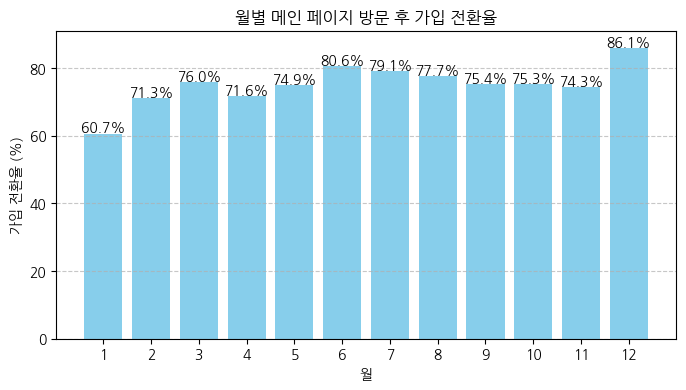

In [32]:
df_user_journey['visit_month'] = df_user_journey['first_main_visit_date'].dt.month
monthly_conversion = df_user_journey.groupby('visit_month')['first_signup_date'].count() / df_user_journey.groupby('visit_month')['user_id'].count() * 100

plt.figure(figsize=(8, 4))
bars = plt.bar(monthly_conversion.index, monthly_conversion.values, color='skyblue')

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.5, f"{height:.1f}%", ha='center', fontsize=10)

plt.title("월별 메인 페이지 방문 후 가입 전환율")
plt.ylabel("가입 전환율 (%)")
plt.xlabel("월")
plt.xticks(monthly_conversion.index)  
plt.ylim(0, max(monthly_conversion.values) + 5) 
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

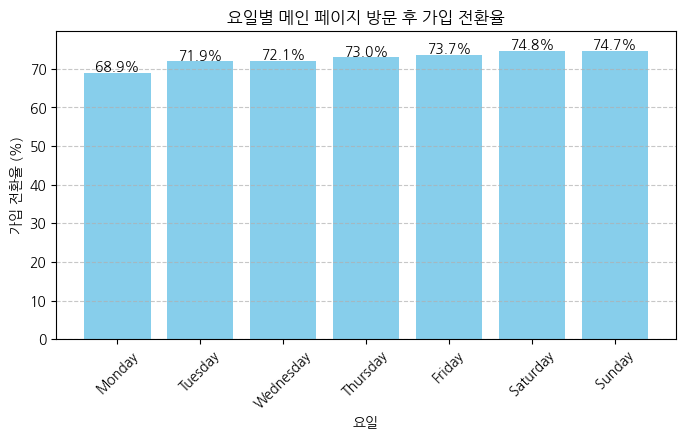

In [ ]:
import matplotlib.pyplot as plt

df_user_journey['visit_weekday'] = df_user_journey['first_main_visit_date'].dt.day_name()
weekday_conversion = df_user_journey.groupby('visit_weekday')['first_signup_date'].count() / df_user_journey.groupby('visit_weekday')['user_id'].count() * 100

plt.figure(figsize=(8, 4))

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_conversion = weekday_conversion.reindex(weekday_order)

bars = plt.bar(weekday_conversion.index, weekday_conversion.values, color='skyblue')

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.5, f"{height:.1f}%", ha='center', fontsize=10)

plt.title("요일별 메인 페이지 방문 후 가입 전환율")
plt.ylabel("가입 전환율 (%)")
plt.xlabel("요일")
plt.xticks(rotation=45) 
plt.ylim(0, max(weekday_conversion.values) + 5)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

- 월별 메인 페이지 진입 후 가입 전환율은 12월달이 86.1%로 가장 높게 나타났다.
- 요일별 메인 페이지 진입 후 가입 전환율은 토요일이 74.8%로 가장 높게 나타났다.

# EDA 시각화

#### 월별 회원가입 진입 및 완료 수

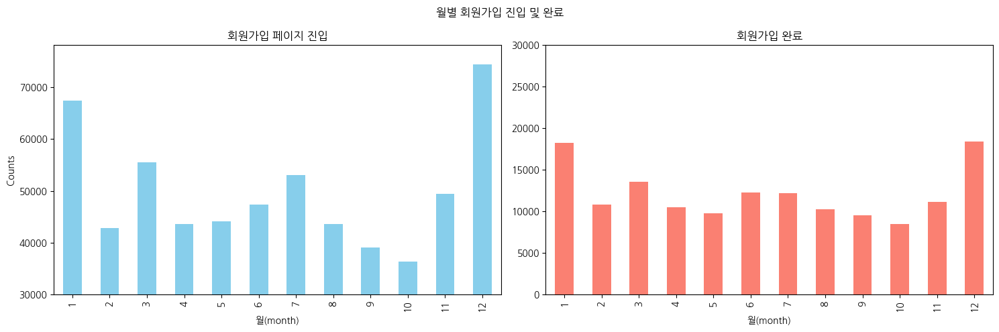

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # 1행 2열의 서브플롯 생성

# 회원가입 페이지 진입
signup_page['client_event_time'].dt.month.value_counts().sort_index().plot(
    kind='bar', ax=axes[0], color='skyblue'
)
axes[0].set_title('회원가입 페이지 진입')
axes[0].set_ylabel('Counts')
axes[0].set_xlabel('월(month)')
axes[0].set_ylim(30000) 

# 회원가입 완료
complete_signup['client_event_time'].dt.month.value_counts().sort_index().plot(
    kind='bar', ax=axes[1], color='salmon'
)
axes[1].set_title('회원가입 완료')
axes[1].set_xlabel('월(month)')
axes[1].set_ylim(0, 30000) 

plt.suptitle('월별 회원가입 진입 및 완료')  
plt.tight_layout()
plt.show()

#### 요일별 회원가입 진입 및 완료 수

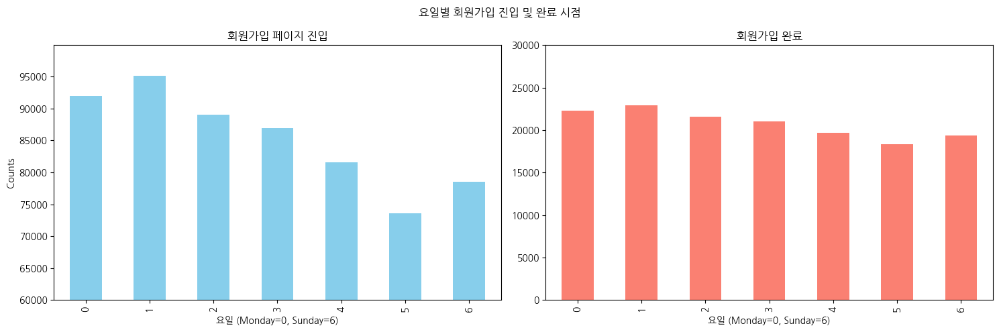

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # 1행 2열의 서브플롯 생성

# 첫 번째 그래프 (회원가입 페이지 진입)
signup_page['client_event_time'].dt.weekday.value_counts().sort_index().plot(
    kind='bar', ax=axes[0], color='skyblue'
)
axes[0].set_title('회원가입 페이지 진입')
axes[0].set_ylabel('Counts')
axes[0].set_xlabel('요일 (Monday=0, Sunday=6)')
axes[0].set_ylim(60000) 

# 두 번째 그래프 (회원가입 완료)
complete_signup['client_event_time'].dt.weekday.value_counts().sort_index().plot(
    kind='bar', ax=axes[1], color='salmon'
)
axes[1].set_title('회원가입 완료')
axes[1].set_xlabel('요일 (Monday=0, Sunday=6)')
axes[1].set_ylim(0, 30000) 

plt.suptitle('요일별 회원가입 진입 및 완료 시점')  
plt.tight_layout()
plt.show()

- 요일별 회원가입 페이지 진입 수는 화요일이 가장 많은 것으로 나타났다.
- 진입 수 결과와 비교했을 때 예상대로, 요일별 회원가입 페이지 완료 수는 화요일이 가장 많은 것으로 확인할 수 있다.

#### 회원가입 완료율

In [ ]:
# 총 회원가입 시도 수 -> 회원가입 페이지 접속한 경우 시도했다고 가정
total_signups = signup_page['event_type'].count()
# 회원가입 완료 수
completed_signups = complete_signup['event_type'].count()

signup_completion_rate = (completed_signups / total_signups) * 100

# 결과 출력
print(f'회원가입 완료 비율: {signup_completion_rate:.2f}%')

회원가입 완료 비율: 24.32%


In [ ]:
# user_id가 없는 메인 페이지 방문자 수
anonymous_visitors = df_main_page['user_id'].isna().sum()

# 회원가입 완료한 유저 수 (가입을 완료한 user_id 수)
total_completed_signups = complete_signup['user_id'].nunique()

# 비로그인 방문자 대비 회원가입률 계산
signup_conversion_rate = (total_completed_signups / anonymous_visitors) * 100

print(f"비로그인 방문자 대비 회원가입율: {signup_conversion_rate:.2f}%")

비로그인 방문자 대비 회원가입률: 9.01%


#### 시간대별 회원가입 완료율

In [ ]:
df2_signup_page = signup_page.copy()
df2_complete_signup = complete_signup.copy()

df2_signup_page['signup_hour'] = signup_page['client_event_time'].dt.hour
df2_complete_signup['signup_hour'] = df2_complete_signup['client_event_time'].dt.hour

signups_by_hour = df2_signup_page.groupby('signup_hour')['event_type'].count()
completed_by_hour = df2_complete_signup.groupby('signup_hour')['user_id'].count()

hourly_conversion_rate = (completed_by_hour / signups_by_hour * 100).fillna(0)
print(hourly_conversion_rate)

signup_hour
0     24.577292
1     24.397400
2     23.215494
3     22.783556
4     22.180390
5     21.969567
6     21.694058
7     21.807419
8     23.349683
9     23.944882
10    24.208699
11    25.220302
12    24.247279
13    24.932656
14    25.084442
15    24.967011
16    24.585186
17    25.105681
18    24.520612
19    24.643087
20    24.647327
21    24.424455
22    24.467398
23    22.870872
dtype: float64


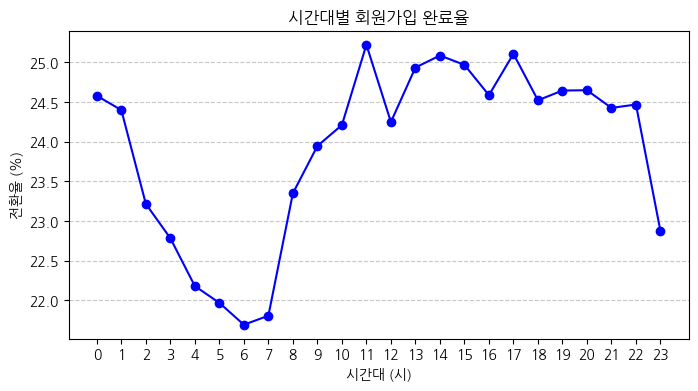

In [45]:
df2_signup_page = signup_page.copy()
df2_complete_signup = complete_signup.copy()

df2_signup_page['signup_hour'] = signup_page['client_event_time'].dt.hour
df2_complete_signup['signup_hour'] = df2_complete_signup['client_event_time'].dt.hour

# 시간대별 가입 시도 수
signups_by_hour = df2_signup_page.groupby('signup_hour')['event_type'].count()

# 시간대별 가입 완료 수
completed_by_hour = df2_complete_signup.groupby('signup_hour')['user_id'].count()

# 시간대별 전환율 계산
hourly_conversion_rate = (completed_by_hour / signups_by_hour * 100).fillna(0)

plt.figure(figsize=(8, 4))
hourly_conversion_rate.sort_index().plot(kind='line', marker='o', linestyle='-', color='b')
plt.title("시간대별 회원가입 완료율")
plt.xlabel("시간대 (시)")
plt.ylabel("전환율 (%)")
plt.xticks(range(0, 24, 1))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
df2_signup_page = signup_page.copy()
df2_complete_signup = complete_signup.copy()

df2_signup_page['signup_month'] = signup_page['client_event_time'].dt.month
df2_complete_signup['signup_month'] = df2_complete_signup['client_event_time'].dt.month

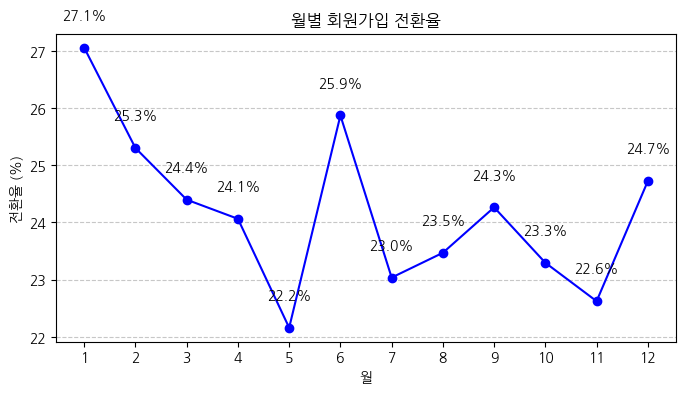

In [25]:
# 월별 가입 시도 수 계산
signups_by_month = df2_signup_page.groupby('signup_month')['client_event_time'].count()

# 월별 가입 완료 수 계산
completed_by_month = df2_complete_signup.groupby('signup_month')['user_id'].count()

# 가입 시도가 없는 달이 있을 경우 0으로 채우기
signups_by_month = signups_by_month.reindex(range(1, 13), fill_value=0)
completed_by_month = completed_by_month.reindex(range(1, 13), fill_value=0)

# 월별 전환율 계산
monthly_conversion_rate = (completed_by_month / signups_by_month * 100).fillna(0)

plt.figure(figsize=(8, 4))
monthly_conversion_rate.sort_index().plot(kind='line', marker='o', linestyle='-', color='b')
plt.title("월별 회원가입 전환율")
plt.xlabel("월")
plt.ylabel("전환율 (%)")

plt.xticks(ticks=monthly_conversion_rate.index, labels=monthly_conversion_rate.index.astype(str))

plt.grid(axis='y', linestyle='--', alpha=0.7)

for month, rate in monthly_conversion_rate.items():
    plt.text(month, rate + 0.5, f"{rate:.1f}%", ha='center', fontsize=10)

plt.show()

#### 주중 vs 주말 접속자 가입 분석
- 주중 방문 유저의 가입 확률과 주말 방문 유저의 가입 확률 비교

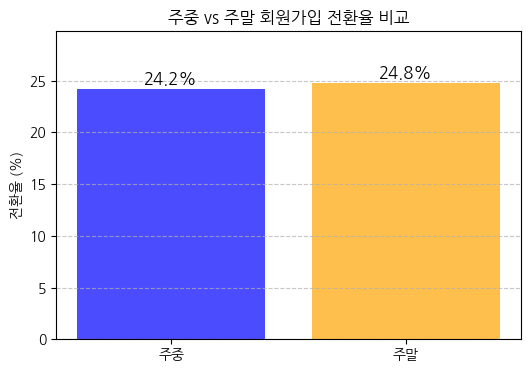

In [ ]:
df2_signup_page = signup_page.copy()
df2_complete_signup = complete_signup.copy()

df2_signup_page['weekday'] = df2_signup_page['client_event_time'].dt.weekday
df2_complete_signup['weekday'] = df2_complete_signup['client_event_time'].dt.weekday

df2_signup_page['weekday_flag'] = df2_signup_page['weekday'].apply(lambda x: '주중' if x < 5 else '주말')
df2_complete_signup['weekday_flag'] = df2_complete_signup['weekday'].apply(lambda x: '주중' if x < 5 else '주말')

# 주중 & 주말 방문자 수
visits_by_weekday = df2_signup_page['weekday_flag'].value_counts()

# 주중 & 주말 회원가입 완료 수
signups_by_weekday = df2_complete_signup['weekday_flag'].value_counts()

# 가입 확률(전환율) 계산
conversion_rate = (signups_by_weekday / visits_by_weekday * 100).fillna(0)

plt.figure(figsize=(6, 4))
plt.bar(conversion_rate.index, conversion_rate.values, color=['blue', 'orange'], alpha=0.7)

plt.title("주중 vs 주말 회원가입 전환율 비교")
plt.ylabel("전환율 (%)")
plt.ylim(0, max(conversion_rate) + 5)  
plt.grid(axis='y', linestyle='--', alpha=0.7)

for i, v in enumerate(conversion_rate):
    plt.text(i, v + 0.5, f"{v:.1f}%", ha='center', fontsize=12)

plt.show()

- 앞선 분석 결과에서 요일별 메인 페이지 방문 후 가입 전환율을 비교했을 때,               
  예상대로 주말의 회원가입 전환율이 24.8%의 비율로 주중 회원가입 전환율 보다 0.6% 높게 나타난 것을 확인할 수 있다. 

#### OS별 회원가입 완료율

In [32]:
signups_by_os = df2_signup_page.groupby('os_name')['event_type'].count()
completed_by_os = df2_complete_signup.groupby('os_name')['user_id'].count()

hourly_conversion_rate = (completed_by_os / signups_by_os * 100).fillna(0)
print(hourly_conversion_rate)

os_name
AVG Secure Browser       5.555556
Android Browser          0.502513
Avast Secure Browser     8.411215
Chrome                   8.601572
Chrome Headless          0.000000
Chrome Mobile           12.132839
Chrome WebView           7.767046
Chromium                66.666667
Edge                     8.175130
Electron                 0.000000
Facebook                 5.818219
Firefox                  9.743202
GSA                      7.265469
IE                       0.000000
Instagram                6.406824
Line                     0.000000
MIUI Browser             3.418803
Maxthon                  0.000000
Mobile Safari            5.901939
Opera                    8.624709
Opera Touch              0.000000
Puffin                   0.000000
QQ                       0.000000
QQBrowser                0.000000
Quark                    0.000000
Safari                   6.394183
Samsung Browser          5.003710
Silk                     0.000000
UCBrowser                0.000000
WeChat

#### 인스타 브라우저 이용 접속자 가입 분석

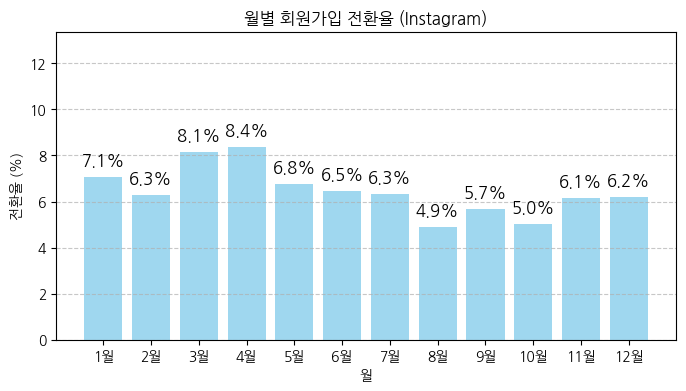

In [36]:
df2_signup_page['signup_month'] = df2_signup_page['client_event_time'].dt.month
df2_complete_signup['signup_month'] = df2_complete_signup['client_event_time'].dt.month

# Instagram에서 회원가입 시도한 데이터 필터링
insta_signup_page = df2_signup_page[df2_signup_page['os_name'] == 'Instagram']
insta_complete_signup = df2_complete_signup[df2_complete_signup['os_name'] == 'Instagram']

# 월별 가입 시도 수
signups_by_month = insta_signup_page.groupby('signup_month')['event_type'].count()
# 월별 가입 완료 수
completed_by_month = insta_complete_signup.groupby('signup_month')['user_id'].count()

# 월별 전환율
monthly_conversion_rate = (completed_by_month / signups_by_month * 100).fillna(0)

month_labels = [str(i) + "월" for i in range(1, 13)]
monthly_conversion_rate = monthly_conversion_rate.reindex(range(1, 13), fill_value=0)

plt.figure(figsize=(8, 4))
plt.bar(month_labels, monthly_conversion_rate, color='skyblue', alpha=0.8)

plt.title("월별 회원가입 전환율 (Instagram)")
plt.xlabel("월")
plt.ylabel("전환율 (%)")
plt.ylim(0, max(monthly_conversion_rate) + 5)  # Y축 범위 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 각 막대 위에 값 표시
for i, v in enumerate(monthly_conversion_rate):
    plt.text(i, v + 0.5, f"{v:.1f}%", ha='center', fontsize=12)

plt.show()

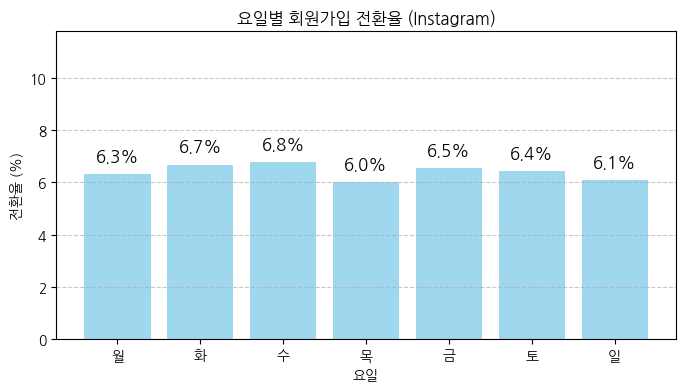

In [ ]:
df2_signup_page['signup_weekday'] = df2_signup_page['client_event_time'].dt.weekday
df2_complete_signup['signup_weekday'] = df2_complete_signup['client_event_time'].dt.weekday

# Instagram에서 회원가입 시도한 데이터 필터링
insta_signup_page = df2_signup_page[df2_signup_page['os_name'] == 'Instagram']
insta_complete_signup = df2_complete_signup[df2_complete_signup['os_name'] == 'Instagram']

# 요일별 가입 시도 수
signups_by_weekday = insta_signup_page.groupby('signup_weekday')['event_type'].count()
# 요일별 가입 완료 수
completed_by_weekday = insta_complete_signup.groupby('signup_weekday')['user_id'].count()

# 요일별 전환율 계산
weekly_conversion_rate = (completed_by_weekday / signups_by_weekday * 100).fillna(0)

weekday_labels = ['월', '화', '수', '목', '금', '토', '일']
df2_signup_page['signup_weekday'] = df2_signup_page['signup_weekday'].map(lambda x: weekday_labels[x])
weekly_conversion_rate = weekly_conversion_rate.reindex(range(7), fill_value=0)

plt.figure(figsize=(8, 4))
bars = plt.bar(df2_signup_page['signup_weekday'], weekly_conversion_rate, color='skyblue', alpha=0.8)

for bar, (index, value) in zip(bars, weekly_conversion_rate.items()):
    plt.text(bar.get_x() + bar.get_width() / 2, value + 0.5, f"{value:.1f}%", ha='center', fontsize=12)

plt.title("요일별 회원가입 전환율 (Instagram)")
plt.xlabel("요일")
plt.ylabel("전환율 (%)")
plt.ylim(0, max(weekly_conversion_rate) + 5)  # Y축 범위 조정
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

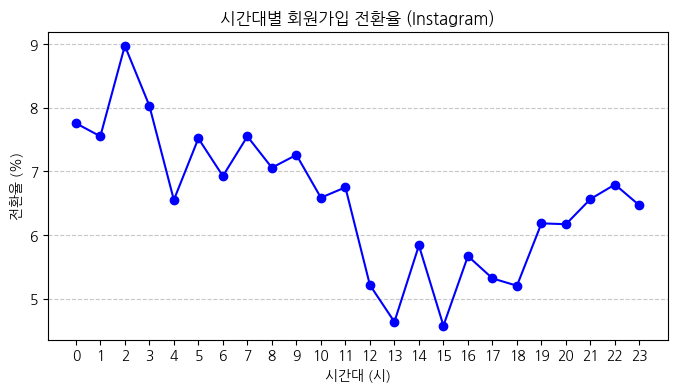

In [ ]:
insta_signup_page = df2_signup_page[df2_signup_page['os_name'] == 'Instagram']
insta_complete_signup = df2_complete_signup[df2_complete_signup['os_name'] == 'Instagram']

# 시간대별 가입 시도 수
signups_by_hour = insta_signup_page.groupby('signup_hour')['event_type'].count()

# 시간대별 가입 완료 수
completed_by_hour = insta_complete_signup.groupby('signup_hour')['user_id'].count()

# 시간대별 전환율 계산 (가입 완료 수 / 가입 시도 수 * 100)
hourly_conversion_rate = (completed_by_hour / signups_by_hour * 100).fillna(0)

plt.figure(figsize=(8, 4))
hourly_conversion_rate.sort_index().plot(kind='line', marker='o', linestyle='-', color='b')

plt.title("시간대별 회원가입 전환율 (Instagram)")
plt.xlabel("시간대 (시)")
plt.ylabel("전환율 (%)")
plt.xticks(range(0, 24, 1))  # x축을 0~23시간 단위로 설정
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

#### 브라우저 카테고리 매핑

In [ ]:
# 브라우저 데이터 추출 및 집계
browser_counts = signup_page['os_name'].value_counts().reset_index()
browser_counts.columns = ['browser', 'count']

# 브라우저 카테고리 매핑
# QQ: 중국 Tencent가 운영하는 메신저

browser_category = {
    "모바일": {"Mobile Safari", "Samsung Browser", "Chrome Mobile", "WebKit", "Chrome WebView",
             "MIUI Browser", "Android Browser", "GSA", "UCBrowser", "Opera Touch", "Puffin", "Silk","QQBrowser"},
    "웹": {"Chrome", "Edge", "Whale", "Safari", "Firefox", "Opera", "Chromium",
           "Avast Secure Browser", "AVG Secure Browser", "Yandex", "IE", "Maxthon","Chrome Headless", "Electron",
           "Opera Mini", "MetaSr", "Konqueror", "Mozilla", "NetFront", "Coc Coc"},
    "SNS": {"Instagram", "Facebook", "WeChat", "QQ", "Line"}
}

In [21]:
def assign_category(browser):
    browser = browser.lower()
    for category, browser_list in browser_category.items():
        if any(b.lower() in browser for b in browser_list):  
            return category
    return "기타" 

# 브라우저별 카테고리 추가
browser_counts['category'] = browser_counts['browser'].apply(assign_category)

browser_category_sum = browser_counts.groupby('category')['count'].sum().reset_index()

print(browser_category_sum)

  category   count
0      SNS   74143
1       기타      54
2      모바일  168607
3        웹  353950


### 데이터 전처리 
- 22~23년도 데이터만 보기

In [ ]:
# 로그인 방식 : test 제거
df_complete_signup = complete_signup[complete_signup['type'] != 'test']

# 2022-2023년도 데이터만 필터링
df_signup_page = signup_page[signup_page['client_event_time'].dt.year.isin([2022, 2023])]
df_complete_signup = df_complete_signup[df_complete_signup['client_event_time'].dt.year.isin([2022, 2023])]

In [ ]:
# 총 회원가입 시도 수 -> 회원가입 페이지 접속한 경우 시도했다고 가정
total_signups = df_signup_page['event_type'].count()
# 회원가입 완료 수
completed_signups = df_complete_signup['user_id'].nunique()

signup_completion_rate = (completed_signups / total_signups) * 100

# 가입 이탈율 계산
abandonment_rate = 100 - signup_completion_rate

print(f'회원가입 완료 비율: {signup_completion_rate:.2f}%')
print(f'가입 이탈율: {abandonment_rate:.2f}%')

회원가입 완료 비율: 24.32%
가입 이탈율: 75.68%


### 22-23년도 회원가입율

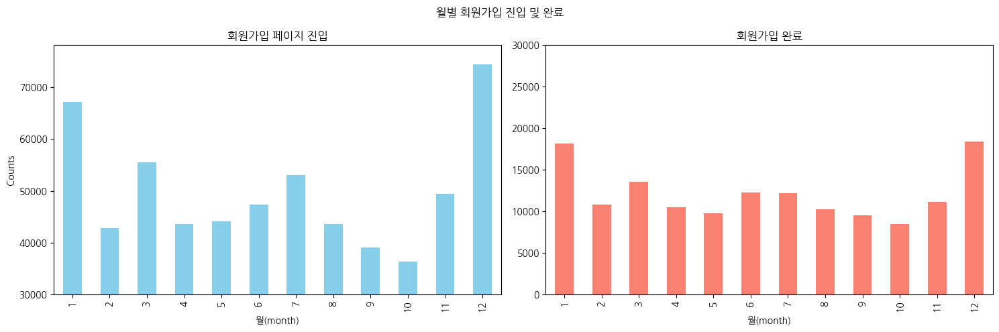

In [18]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))  

# 회원가입 페이지 진입
df_signup_page['client_event_time'].dt.month.value_counts().sort_index().plot(
    kind='bar', ax=axes[0], color='skyblue'
)
axes[0].set_title('회원가입 페이지 진입')
axes[0].set_ylabel('Counts')
axes[0].set_xlabel('월(month)')
axes[0].set_ylim(30000) 

# 회원가입 완료
df_complete_signup['client_event_time'].dt.month.value_counts().sort_index().plot(
    kind='bar', ax=axes[1], color='salmon'
)
axes[1].set_title('회원가입 완료')
axes[1].set_xlabel('월(month)')
axes[1].set_ylim(0, 30000) 

plt.suptitle('월별 회원가입 진입 및 완료')  
plt.tight_layout()
plt.show()

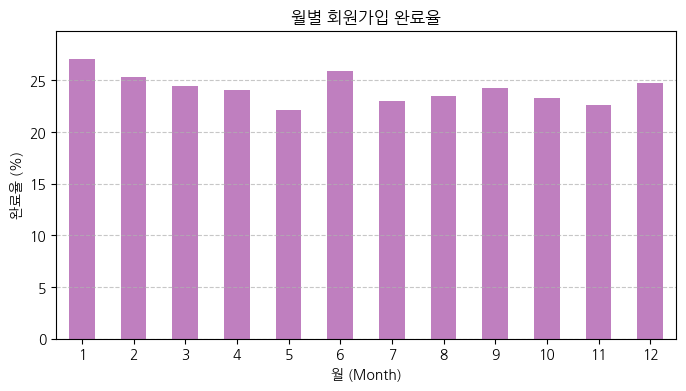

In [34]:
# 월별 회원가입 페이지 진입 수
signup_entry_counts = df_signup_page['client_event_time'].dt.month.value_counts().sort_index()
# 월별 회원가입 완료 수
signup_complete_counts = df_complete_signup['client_event_time'].dt.month.value_counts().sort_index()

# 회원가입 완료율 계산 (가입 페이지 진입 대비 완료율)
monthly_conversion_rate = (signup_complete_counts / signup_entry_counts * 100).fillna(0)

plt.figure(figsize=(8, 4))

monthly_conversion_rate.plot(kind='bar', color='purple', alpha=0.5)

plt.title("월별 회원가입 완료율")
plt.xlabel("월 (Month)")
plt.ylabel("완료율 (%)")

plt.xticks(ticks=range(len(monthly_conversion_rate.index)), labels=monthly_conversion_rate.index, rotation=0)

plt.ylim(0, max(monthly_conversion_rate) * 1.1) 
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

In [ ]:
# 월별 회원가입 페이지 진입 수
signup_entry_counts = df_signup_page['client_event_time'].dt.month.value_counts().sort_index()
# 월별 회원가입 완료 수
signup_complete_counts = df_complete_signup['client_event_time'].dt.month.value_counts().sort_index()

# 회원가입 완료율 계산 (가입 페이지 진입 대비 완료율)
monthly_conversion_rate = (signup_complete_counts / signup_entry_counts * 100).fillna(0)

plt.figure(figsize=(8, 4))

monthly_conversion_rate.plot(kind='bar', color='purple', alpha=0.5)

plt.title("월별 회원가입 완료율")
plt.xlabel("월 (Month)")
plt.ylabel("완료율 (%)")

plt.xticks(ticks=range(len(monthly_conversion_rate.index)), labels=monthly_conversion_rate.index, rotation=0)

plt.ylim(0, max(monthly_conversion_rate) * 1.1) 
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

### 브라우저 카테고리별 가입 완료율

In [29]:
# 브라우저 데이터 추출 및 집계
browser_counts = df_complete_signup['os_name'].value_counts().reset_index()
browser_counts.columns = ['browser', 'count']

# 브라우저 카테고리 매핑
# QQ: 중국 Tencent가 운영하는 메신저

browser_category = {
    "모바일": {"Mobile Safari", "Samsung Browser", "Chrome Mobile", "WebKit", "Chrome WebView",
             "MIUI Browser", "Android Browser", "GSA", "UCBrowser", "Opera Touch", "Puffin", "Silk","QQBrowser"},
    "웹": {"Chrome", "Edge", "Whale", "Safari", "Firefox", "Opera", "Chromium",
           "Avast Secure Browser", "AVG Secure Browser", "Yandex", "IE", "Maxthon","Chrome Headless", "Electron",
           "Opera Mini", "MetaSr", "Konqueror", "Mozilla", "NetFront", "Coc Coc"},
    "SNS": {"Instagram", "Facebook", "WeChat", "QQ", "Line"}
}

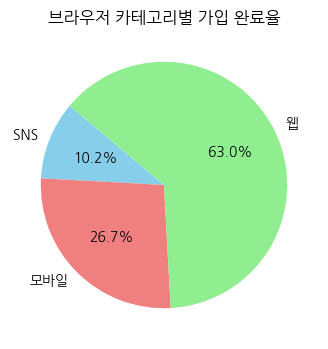

  category  count
0      SNS   4687
1      모바일  12228
2        웹  28830


In [36]:
def assign_category(browser):
    browser = browser.lower()
    for category, browser_list in browser_category.items():
        if any(b.lower() in browser for b in browser_list):  
            return category
    return "기타" 

# 브라우저별 카테고리 추가
browser_counts['category'] = browser_counts['browser'].apply(assign_category)
browser_category_sum = browser_counts.groupby('category')['count'].sum().reset_index()

labels = browser_category_sum['category']
sizes = browser_category_sum['count']

plt.figure(figsize=(5, 4))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightcoral', 'lightgreen', 'orange'])

plt.title("브라우저 카테고리별 가입 완료율")
plt.show()
print(browser_category_sum)

# 데이터 12, 16번
- start.content	/ 콘텐츠 수강 시작	/ 콘텐츠 id / 콘텐츠 이용가, 콘텐츠 난이도	22년 8월부터 수집된 테이블
- end.content	/ 콘텐츠 수강 완료	/ 콘텐츠 id	/ 콘텐츠 내 모든 레슨를 시청하면 해당 테이블에 로그가 쌓임


## 데이터 이용 방안
- 두 데이터 merge -> 콘텐트 완료율, 콘텐트 평균 시작 - 완료 시간, 난이도별 완료 비율
- start 데이터 -> 인기가 많은 콘텐트, 유저가 수강하고 있는 콘텐트의 개수, 월별 콘텐트 시작 개수
- end 데이터 -> 어느 월, 요일에 주로 콘텐트를 끝낼까?

### Funnel, AARRR
- Funnel -> 활동 영역에 포함
- AARRR -> Activation, Retention에 치중

### 다른 데이터와 활용
- lesson 관련 데이터 -> 콘텐트는 몇 개의 레슨을 가지고 있는가? (평균)
- 회원가입 완료 후 / 결제 후 콘텐트 시작까지 걸리는 시간?
- 콘텐트를 끝낸 / 끝내지 않은 유저의 재구독을 차이?
- 콘텐트를 끝내지 않고 구독 취소한 사람

#### start.content와 complete.lesson 데이터를 기반으로 사용자별 콘텐츠 소비 경향 분석.
#### 수강 완료율, 인기 콘텐츠 파악 및 난이도와의 상관관계 분석.

- start.content
- enter.lesson_page
- complete.lesson
- end.content


In [2]:
import pandas as pd
import os
import datetime as dt
pd.set_option('display.max_columns',100)
import matplotlib.pyplot as plt
import seaborn as sns
# !pip install koreanize-matplotlib
import koreanize_matplotlib
import matplotlib as mpl
pd.set_option('display.max_colwidth', None)
import glob

#### 데이터 전처리
- 기간 : 2023년 설정
- client_event_time -> datetime으로, 한국 시간으로!
- 컬럼 이름에 . 찍힌 거 _로 바꾸기
- 중복행 제거
- chrome headless 있으면 제거(크롤링일 가능성이 높아서)

-----------------------------------여기부터 다시 해야 함 -------------------------

#### start content (콘텐츠 수강 시작)

In [3]:
start_content = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/start_content.csv')
start_content.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id,content.difficulty
0,Daejeon,2023-04-05 21:14:39.906000,South Korea,NaN,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner
1,Seoul,2023-04-05 21:50:19.674000,South Korea,NaN,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner
2,Seoul,2023-04-10 14:06:26.585000,South Korea,NaN,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner
3,Toronto,2023-04-10 14:15:29.040000,Canada,NaN,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner
4,Seoul,2023-04-10 14:21:36.467000,South Korea,NaN,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced


In [4]:
start_content['client_event_time'] = pd.to_datetime(start_content['client_event_time'], errors='coerce')

In [5]:
print(start_content['client_event_time'].min())
print(start_content['client_event_time'].max())

2022-08-17 07:11:12.230000
2023-12-31 23:43:31.046000


In [6]:
start_content['client_event_time'] = start_content['client_event_time'] + pd.Timedelta(hours=9)
start_content.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124917 entries, 0 to 124916
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   city                121017 non-null  object        
 1   client_event_time   124917 non-null  datetime64[ns]
 2   country             122032 non-null  object        
 3   device_carrier      0 non-null       float64       
 4   device_family       122690 non-null  object        
 5   device_type         120068 non-null  object        
 6   event_type          124917 non-null  object        
 7   language            122692 non-null  object        
 8   os_name             122671 non-null  object        
 9   os_version          122585 non-null  object        
 10  platform            122692 non-null  object        
 11  user_id             124917 non-null  object        
 12  content.id          124917 non-null  object        
 13  content.difficulty  124917 no

In [7]:
start_content.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id,content.difficulty
0,Daejeon,2023-04-06 06:14:39.906,South Korea,NaN,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner
1,Seoul,2023-04-06 06:50:19.674,South Korea,NaN,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner
2,Seoul,2023-04-10 23:06:26.585,South Korea,NaN,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner
3,Toronto,2023-04-10 23:15:29.040,Canada,NaN,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner
4,Seoul,2023-04-10 23:21:36.467,South Korea,NaN,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced


In [8]:
start_content.rename(columns={'content.id': 'content_id', 'content.difficulty': 'content_difficulty'}, inplace=True)
start_content.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124917 entries, 0 to 124916
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   city                121017 non-null  object        
 1   client_event_time   124917 non-null  datetime64[ns]
 2   country             122032 non-null  object        
 3   device_carrier      0 non-null       float64       
 4   device_family       122690 non-null  object        
 5   device_type         120068 non-null  object        
 6   event_type          124917 non-null  object        
 7   language            122692 non-null  object        
 8   os_name             122671 non-null  object        
 9   os_version          122585 non-null  object        
 10  platform            122692 non-null  object        
 11  user_id             124917 non-null  object        
 12  content_id          124917 non-null  object        
 13  content_difficulty  124917 no

In [9]:
start_content['user_id'].nunique()

42798

In [10]:
start_content.drop(columns='device_carrier', inplace = True)

In [11]:
start_content.isna().sum()

city                  3900
client_event_time        0
country               2885
device_family         2227
device_type           4849
event_type               0
language              2225
os_name               2246
os_version            2332
platform              2225
user_id                  0
content_id               0
content_difficulty       0
dtype: int64

#### enter content page (콘텐츠 개별 페이지 진입)

In [12]:
enter_content_page = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/enter_content_page.csv')
enter_content_page.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id
0,Seoul,2023-04-05 21:40:35.740000,South Korea,NaN,Apple iPhone,Apple iPhone,enter.content_page,Korean,Chrome,108.0.5359.112,Web,d57aba7b4527e71b96135deaaec57def,220ce7873b8895d0c81c37600b5bd1e7
1,Hwaseong-si,2023-04-05 21:01:59.950000,South Korea,NaN,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.content_page,Korean,Chrome,111.0.0.0,Web,NaN,ecde9a1b01763f791c3a185d53b5f394
2,Daejeon,2023-04-05 21:13:12.038000,South Korea,NaN,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,b8d4ec0133e5ce485055bfd69cd28abd
3,Daejeon,2023-04-05 21:14:25.355000,South Korea,NaN,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430
4,Seoul,2023-04-05 21:44:23.759000,South Korea,NaN,Samsung Phone,Samsung Galaxy S20 FE 5G,enter.content_page,Korean,Samsung Browser,14.2,Web,NaN,7cebec6e79cc981dbf421c5ec2aedd9d


In [13]:
enter_content_page['client_event_time'] = pd.to_datetime(enter_content_page['client_event_time'], errors='coerce')
enter_content_page['client_event_time'] = enter_content_page['client_event_time'] + pd.Timedelta(hours=9)
enter_content_page.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id
0,Seoul,2023-04-06 06:40:35.740,South Korea,NaN,Apple iPhone,Apple iPhone,enter.content_page,Korean,Chrome,108.0.5359.112,Web,d57aba7b4527e71b96135deaaec57def,220ce7873b8895d0c81c37600b5bd1e7
1,Hwaseong-si,2023-04-06 06:01:59.950,South Korea,NaN,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.content_page,Korean,Chrome,111.0.0.0,Web,NaN,ecde9a1b01763f791c3a185d53b5f394
2,Daejeon,2023-04-06 06:13:12.038,South Korea,NaN,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,b8d4ec0133e5ce485055bfd69cd28abd
3,Daejeon,2023-04-06 06:14:25.355,South Korea,NaN,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430
4,Seoul,2023-04-06 06:44:23.759,South Korea,NaN,Samsung Phone,Samsung Galaxy S20 FE 5G,enter.content_page,Korean,Samsung Browser,14.2,Web,NaN,7cebec6e79cc981dbf421c5ec2aedd9d


In [14]:
enter_content_page.rename(columns={'content.id': 'content_id'}, inplace=True)
enter_content_page.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1914257 entries, 0 to 1914256
Data columns (total 13 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               object        
 1   client_event_time  datetime64[ns]
 2   country            object        
 3   device_carrier     float64       
 4   device_family      object        
 5   device_type        object        
 6   event_type         object        
 7   language           object        
 8   os_name            object        
 9   os_version         object        
 10  platform           object        
 11  user_id            object        
 12  content_id         object        
dtypes: datetime64[ns](1), float64(1), object(11)
memory usage: 189.9+ MB


In [15]:
enter_content_page.drop(columns='device_carrier', inplace = True)
enter_content_page.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1914257 entries, 0 to 1914256
Data columns (total 12 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               object        
 1   client_event_time  datetime64[ns]
 2   country            object        
 3   device_family      object        
 4   device_type        object        
 5   event_type         object        
 6   language           object        
 7   os_name            object        
 8   os_version         object        
 9   platform           object        
 10  user_id            object        
 11  content_id         object        
dtypes: datetime64[ns](1), object(11)
memory usage: 175.3+ MB


In [16]:
enter_content_page.isna().sum()

city                  30757
client_event_time         0
country                7570
device_family           639
device_type           23651
event_type                0
language                  0
os_name                 149
os_version             2549
platform                  0
user_id              465168
content_id                0
dtype: int64

#### enter lesson page (레슨 시작)

In [17]:
enter_lesson_page = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/enter_lesson_page-001.csv')
enter_lesson_page.head()

C:\Users\syc09\AppData\Local\Temp\ipykernel_29976\631205377.py:1: DtypeWarning: Columns (9,13,15) have mixed types. Specify dtype option on import or set low_memory=False.
  enter_lesson_page = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/enter_lesson_page-001.csv')


,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id,is_trial,lesson.id,is_free_trial
0,Wonju,2023-04-05 21:46:04.333000,South Korea,NaN,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
1,Wonju,2023-04-05 21:55:50.787000,South Korea,NaN,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
2,Wonju,2023-04-05 21:55:55.684000,South Korea,NaN,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,770740696ab1809d6b50d4013b64a75c,NaN
3,Dongdaemun-gu,2023-04-05 21:04:55.828000,South Korea,NaN,Mac,Mac,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4,5fc64d786416b980cfda86afd69e4516,False,68cc362ca81b5899b3c9b4dea0aaddff,NaN
4,Dongdaemun-gu,2023-04-05 21:05:34.139000,South Korea,NaN,Mac,Mac,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4,db43a841c994231e2795d4df8931af50,False,144682f4648f81de8e6aabd11b92105e,NaN


In [18]:
enter_lesson_page['client_event_time'] = pd.to_datetime(enter_lesson_page['client_event_time'], errors='coerce')
enter_lesson_page['client_event_time'] = enter_lesson_page['client_event_time'] + pd.Timedelta(hours=9)
enter_lesson_page.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id,is_trial,lesson.id,is_free_trial
0,Wonju,2023-04-06 06:46:04.333,South Korea,NaN,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
1,Wonju,2023-04-06 06:55:50.787,South Korea,NaN,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
2,Wonju,2023-04-06 06:55:55.684,South Korea,NaN,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,770740696ab1809d6b50d4013b64a75c,NaN
3,Dongdaemun-gu,2023-04-06 06:04:55.828,South Korea,NaN,Mac,Mac,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4,5fc64d786416b980cfda86afd69e4516,False,68cc362ca81b5899b3c9b4dea0aaddff,NaN
4,Dongdaemun-gu,2023-04-06 06:05:34.139,South Korea,NaN,Mac,Mac,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4,db43a841c994231e2795d4df8931af50,False,144682f4648f81de8e6aabd11b92105e,NaN


In [19]:
enter_lesson_page.rename(columns={'content.id': 'content_id', 'lesson.id': 'lesson_id'}, inplace=True)
enter_lesson_page.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21029707 entries, 0 to 21029706
Data columns (total 16 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               object        
 1   client_event_time  datetime64[ns]
 2   country            object        
 3   device_carrier     float64       
 4   device_family      object        
 5   device_type        object        
 6   event_type         object        
 7   language           object        
 8   os_name            object        
 9   os_version         object        
 10  platform           object        
 11  user_id            object        
 12  content_id         object        
 13  is_trial           object        
 14  lesson_id          object        
 15  is_free_trial      object        
dtypes: datetime64[ns](1), float64(1), object(14)
memory usage: 2.5+ GB


In [20]:
enter_lesson_page.drop(columns='device_carrier', inplace = True)
enter_lesson_page.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21029707 entries, 0 to 21029706
Data columns (total 15 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               object        
 1   client_event_time  datetime64[ns]
 2   country            object        
 3   device_family      object        
 4   device_type        object        
 5   event_type         object        
 6   language           object        
 7   os_name            object        
 8   os_version         object        
 9   platform           object        
 10  user_id            object        
 11  content_id         object        
 12  is_trial           object        
 13  lesson_id          object        
 14  is_free_trial      object        
dtypes: datetime64[ns](1), object(14)
memory usage: 2.4+ GB


In [21]:
enter_lesson_page.isna().sum()

city                   540130
client_event_time           0
country                358428
device_family            6482
device_type            141817
event_type                  0
language                    0
os_name                   417
os_version               6367
platform                    0
user_id               1538529
content_id                352
is_trial              7374020
lesson_id                   0
is_free_trial        18805949
dtype: int64

In [22]:
enter_lesson_page['is_free_trial'].value_counts()

is_free_trial
False    2154743
True       69015
Name: count, dtype: int64

#### complete lesson (레슨 완료)

In [23]:
complete_lesson = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/complete_lesson.csv')
complete_lesson.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id,lesson.id
0,Wonju,2023-04-05 21:55:51.836000,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,d360d68b65fd3e0eafb7982386d75fd9
1,Daejeon,2023-04-05 21:19:01.243000,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,7e0f6aae886368ef9fa97007a8e9f7ac
2,Daejeon,2023-04-05 21:20:27.939000,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,d1e93c9dc08267efab31849bc6083854
3,Daejeon,2023-04-05 21:23:01.534000,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,f22ea5dc431035305e705552bbc4f45b
4,Daejeon,2023-04-05 21:28:34.965000,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,ce0bfeb7fb1259c588f437d48ab2690c


In [24]:
complete_lesson['client_event_time'] = pd.to_datetime(complete_lesson['client_event_time'], errors='coerce')
complete_lesson['client_event_time'] = complete_lesson['client_event_time'] + pd.Timedelta(hours=9)
complete_lesson.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id,lesson.id
0,Wonju,2023-04-06 06:55:51.836,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,d360d68b65fd3e0eafb7982386d75fd9
1,Daejeon,2023-04-06 06:19:01.243,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,7e0f6aae886368ef9fa97007a8e9f7ac
2,Daejeon,2023-04-06 06:20:27.939,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,d1e93c9dc08267efab31849bc6083854
3,Daejeon,2023-04-06 06:23:01.534,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,f22ea5dc431035305e705552bbc4f45b
4,Daejeon,2023-04-06 06:28:34.965,South Korea,NaN,Windows,Windows,complete.lesson,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,ce0bfeb7fb1259c588f437d48ab2690c


In [25]:
complete_lesson.rename(columns={'content.id': 'content_id', 'lesson.id': 'lesson_id'}, inplace=True)
complete_lesson.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5405069 entries, 0 to 5405068
Data columns (total 14 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               object        
 1   client_event_time  datetime64[ns]
 2   country            object        
 3   device_carrier     float64       
 4   device_family      object        
 5   device_type        object        
 6   event_type         object        
 7   language           object        
 8   os_name            object        
 9   os_version         object        
 10  platform           object        
 11  user_id            object        
 12  content_id         object        
 13  lesson_id          object        
dtypes: datetime64[ns](1), float64(1), object(12)
memory usage: 577.3+ MB


In [26]:
complete_lesson.drop(columns='device_carrier', inplace = True)
complete_lesson.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5405069 entries, 0 to 5405068
Data columns (total 13 columns):
 #   Column             Dtype         
---  ------             -----         
 0   city               object        
 1   client_event_time  datetime64[ns]
 2   country            object        
 3   device_family      object        
 4   device_type        object        
 5   event_type         object        
 6   language           object        
 7   os_name            object        
 8   os_version         object        
 9   platform           object        
 10  user_id            object        
 11  content_id         object        
 12  lesson_id          object        
dtypes: datetime64[ns](1), object(12)
memory usage: 536.1+ MB


#### end content (콘텐츠 수강 완료)

In [27]:
end_content = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/end_content.csv')
end_content.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id
0,Yokohama,2023-04-10 14:02:10.600000,Japan,NaN,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c
1,Seoul,2023-04-10 14:21:26.466000,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c
2,Seongbuk-gu,2023-04-10 14:37:04.440000,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7
3,Seo-gu,2023-04-10 14:37:19.909000,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a
4,Seo-gu,2023-04-10 14:08:58.968000,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa


In [28]:
end_content['client_event_time'] = pd.to_datetime(end_content['client_event_time'], errors='coerce')
end_content['client_event_time'] = end_content['client_event_time'] + pd.Timedelta(hours=9)
end_content.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id
0,Yokohama,2023-04-10 23:02:10.600,Japan,NaN,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c
1,Seoul,2023-04-10 23:21:26.466,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c
2,Seongbuk-gu,2023-04-10 23:37:04.440,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7
3,Seo-gu,2023-04-10 23:37:19.909,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a
4,Seo-gu,2023-04-10 23:08:58.968,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa


In [29]:
print(end_content['client_event_time'].min())
print(end_content['client_event_time'].max())

2022-01-01 10:29:42.752000
2024-01-01 08:23:18.600000


In [30]:
end_content.rename(columns={'content.id': 'content_id'}, inplace=True)
end_content.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120582 entries, 0 to 120581
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               116280 non-null  object        
 1   client_event_time  120582 non-null  datetime64[ns]
 2   country            117182 non-null  object        
 3   device_carrier     0 non-null       float64       
 4   device_family      119391 non-null  object        
 5   device_type        118866 non-null  object        
 6   event_type         120582 non-null  object        
 7   language           119392 non-null  object        
 8   os_name            119387 non-null  object        
 9   os_version         119362 non-null  object        
 10  platform           119392 non-null  object        
 11  user_id            120582 non-null  object        
 12  content_id         120582 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(11)

In [31]:
end_content.drop(columns='device_carrier', inplace = True)
end_content.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120582 entries, 0 to 120581
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               116280 non-null  object        
 1   client_event_time  120582 non-null  datetime64[ns]
 2   country            117182 non-null  object        
 3   device_family      119391 non-null  object        
 4   device_type        118866 non-null  object        
 5   event_type         120582 non-null  object        
 6   language           119392 non-null  object        
 7   os_name            119387 non-null  object        
 8   os_version         119362 non-null  object        
 9   platform           119392 non-null  object        
 10  user_id            120582 non-null  object        
 11  content_id         120582 non-null  object        
dtypes: datetime64[ns](1), object(11)
memory usage: 11.0+ MB


#### 레슨 시작, 완료 시간 평균

In [32]:
# 데이터를 병합
merged_data = pd.merge(
    enter_lesson_page, 
    complete_lesson, 
    on=['lesson_id', 'user_id'], 
    suffixes=('_start', '_end')
)

# 시작-완료 시간 차이
merged_data['time_difference'] = merged_data['client_event_time_end'] - merged_data['client_event_time_start']

# 각 lesson_id별 평균 시간
average_time_per_lesson = merged_data.groupby('lesson_id')['time_difference'].mean()

# 결과 출력
print(average_time_per_lesson)


lesson_id
001e4570bb0fc346a1c969b019bdc22b   -2 days +07:59:40.251566667
0021f3a8597cb32f3605631446baf526   -7 days +17:13:49.879569862
0022b56713250709e3e8f06ec6c2a76e   -4 days +03:52:14.293905150
00332b815a82ca3244f1e1eb72345390   -2 days +09:20:19.354512346
00375453dc564db84a8ae379afdd8f1c     0 days 00:09:48.762317460
                                               ...            
ffb7d5621f957059f58a72f036d5e3bd   -4 days +21:01:41.968810131
ffc6e445405214ad2cddc6f82620f80b   -1 days +16:15:02.843360656
ffeafc77194d3fab7394865a0e02dd0f     0 days 08:43:53.935958333
fff51991e89837d9d4ae49d398f8c46b   -5 days +16:59:30.206930421
fff98826d795b2d116f082a78c25fe64   -4 days +12:38:45.276153144
Name: time_difference, Length: 5038, dtype: timedelta64[ns]


In [33]:
average_time_per_lesson.sort_values(ascending=False)

lesson_id
91100062eadc029b54159c173e13f3f3    253 days 04:06:36.370246576
23376faa5f9c824ce486c459209b51b1    149 days 10:26:06.710944444
9149518042a9321070681792b7111c06     37 days 10:02:09.814406250
8ef846e922d6e7618687fda9fb5e9293     34 days 21:23:35.527385270
ec09a9ac75b93ddc5a7557cc0011cb14     30 days 00:26:39.327833333
                                               ...             
c7f0aad489eb0e082b8b380c0c2b3a57   -25 days +05:57:09.111731753
21fe86f0b8644f347e8497e294cd35d4   -26 days +20:56:20.602285715
4269233f7599c0e9882984aaeb9f2f57   -27 days +23:10:01.275411765
82bee3289755a84765ab686abb3babcc   -27 days +19:35:20.661847826
7daf48201824b93dbe495fdda0aad1eb   -28 days +15:08:29.195409091
Name: time_difference, Length: 5038, dtype: timedelta64[ns]

#### 콘텐츠 시작 끝

In [34]:
# 데이터를 병합
merged_data = pd.merge(
    start_content, 
    end_content, 
    on=['content_id', 'user_id'], 
    suffixes=('_start', '_end')
)

# 시작-완료 시간 차이
merged_data['time_difference'] = merged_data['client_event_time_end'] - merged_data['client_event_time_start']

# 각 lesson_id별 평균 시간
average_time_per_content = merged_data.groupby('content_id')['time_difference'].mean()

# 결과 출력
print(average_time_per_content)

content_id
03b4a290c08f7fa83933827a994f2e61    7 days 15:28:17.986725490
0ab2b890d4068c1490b89676773256f6   15 days 17:57:23.460573770
101e1d0dcc38d9c86156f008a145083e   15 days 17:50:32.777346341
123715e9b63b3efb32cdcd947ea96aaf   12 days 01:30:58.045164179
165def8885b8a2ec0c92404048d7e345   15 days 09:09:37.742082125
                                              ...            
f6f082e10dc9c1061cb809989b361d9c   16 days 02:28:21.967441441
f8b0ca043f5f0437603142ae93e6a424   18 days 14:20:30.530797468
fc3051206e08a57bc14fa52a7eec904b       4 days 10:06:20.282000
fc6a9e04f693ea724c55153d1ae82c65       0 days 00:48:48.410000
ff7998135d650dbefb3f479c900cbcc7    4 days 17:05:01.186952565
Name: time_difference, Length: 114, dtype: timedelta64[ns]


In [35]:
average_time_per_lesson.sort_values(ascending=False)

lesson_id
91100062eadc029b54159c173e13f3f3    253 days 04:06:36.370246576
23376faa5f9c824ce486c459209b51b1    149 days 10:26:06.710944444
9149518042a9321070681792b7111c06     37 days 10:02:09.814406250
8ef846e922d6e7618687fda9fb5e9293     34 days 21:23:35.527385270
ec09a9ac75b93ddc5a7557cc0011cb14     30 days 00:26:39.327833333
                                               ...             
c7f0aad489eb0e082b8b380c0c2b3a57   -25 days +05:57:09.111731753
21fe86f0b8644f347e8497e294cd35d4   -26 days +20:56:20.602285715
4269233f7599c0e9882984aaeb9f2f57   -27 days +23:10:01.275411765
82bee3289755a84765ab686abb3babcc   -27 days +19:35:20.661847826
7daf48201824b93dbe495fdda0aad1eb   -28 days +15:08:29.195409091
Name: time_difference, Length: 5038, dtype: timedelta64[ns]

#### user_id가 null 값이 아닌 사람 기준 평균 몇 개의 콘텐츠, 레슨을 수강했나?

In [36]:
enter_lesson_page.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,is_trial,lesson_id,is_free_trial
0,Wonju,2023-04-06 06:46:04.333,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
1,Wonju,2023-04-06 06:55:50.787,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,d360d68b65fd3e0eafb7982386d75fd9,NaN
2,Wonju,2023-04-06 06:55:55.684,South Korea,Windows,Windows,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,91053eda0bffb4db6c9317acf15bc44a,94bdcbd9f329aafa84ab464b6721187d,False,770740696ab1809d6b50d4013b64a75c,NaN
3,Dongdaemun-gu,2023-04-06 06:04:55.828,South Korea,Mac,Mac,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4,5fc64d786416b980cfda86afd69e4516,False,68cc362ca81b5899b3c9b4dea0aaddff,NaN
4,Dongdaemun-gu,2023-04-06 06:05:34.139,South Korea,Mac,Mac,enter.lesson_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4,db43a841c994231e2795d4df8931af50,False,144682f4648f81de8e6aabd11b92105e,NaN


In [37]:
# user_id가 null 값이 아닌 거 필터링링 
enter_lesson_page_user_notnull = enter_lesson_page[enter_lesson_page['user_id'].notnull()]

In [38]:
# user_id가 중복된 값을 하나만 남기고 삭제
# 한 유저가 여러개 들었을 수도 있으니 이거는 남겨야 할 듯 하다.
how_many_user = enter_lesson_page_user_notnull.drop_duplicates(subset='user_id')
how_many_user.info()

<class 'pandas.core.frame.DataFrame'>
Index: 113920 entries, 0 to 21029706
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   city               111348 non-null  object        
 1   client_event_time  113920 non-null  datetime64[ns]
 2   country            113279 non-null  object        
 3   device_family      113920 non-null  object        
 4   device_type        110017 non-null  object        
 5   event_type         113920 non-null  object        
 6   language           113920 non-null  object        
 7   os_name            113920 non-null  object        
 8   os_version         113580 non-null  object        
 9   platform           113920 non-null  object        
 10  user_id            113920 non-null  object        
 11  content_id         113920 non-null  object        
 12  is_trial           72793 non-null   object        
 13  lesson_id          113920 non-null  object     

In [39]:
# 각 user_id별로 content_id 개수 세기 nunique 때문에 어차피 null 값 빠지긴 할 것임임
content_count_per_user = enter_lesson_page_user_notnull.groupby('user_id')['content_id'].nunique()

# 전체 user_id에 대해 평균 content_id 수 계산
average_content_per_user = content_count_per_user.mean().round(1)

# 결과 출력
print(f'유저 한 명당 수강하는 content 개수 : {average_content_per_user}')

유저 한 명당 수강하는 content 개수 : 2.9


In [40]:
# 각 user_id별로 lesson_id 개수 세기
lesson_count_per_user = enter_lesson_page.groupby('user_id')['lesson_id'].nunique()

# 전체 user_id에 대해 평균 lesson_id 수 계산
average_lesson_per_user = lesson_count_per_user.mean().round(1)

# 결과 출력
print(f'유저 한 명당 수강하는 lesson 개수 : {average_lesson_per_user}')

유저 한 명당 수강하는 lesson 개수 : 48.4


#### 시작, 끝을 머지해서 콘텐츠를 끝까지 완료한 것과 끝을 맺지 않은 것을 추려낸다.

#### 제일 인기 많은 content

In [41]:
start_content.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty
0,Daejeon,2023-04-06 06:14:39.906,South Korea,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner
1,Seoul,2023-04-06 06:50:19.674,South Korea,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner
2,Seoul,2023-04-10 23:06:26.585,South Korea,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner
3,Toronto,2023-04-10 23:15:29.040,Canada,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner
4,Seoul,2023-04-10 23:21:36.467,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced


In [42]:
start_content[start_content.duplicated()]

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty


In [43]:
start_content.isna().sum()

city                  3900
client_event_time        0
country               2885
device_family         2227
device_type           4849
event_type               0
language              2225
os_name               2246
os_version            2332
platform              2225
user_id                  0
content_id               0
content_difficulty       0
dtype: int64

In [44]:
duplicated_user_ids = start_content[start_content['user_id'].duplicated()]
duplicated_user_ids.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty
17,Suwon,2023-04-10 23:29:36.420,South Korea,Apple iPhone,Apple iPhone,start.content,Korean,Mobile Safari,16.3,Web,e3b8bfa80d866f296aad139e09023ef3,68a3658f1b936bfff3bd6960cd561b0a,beginner
39,Daejeon,2023-04-12 20:25:05.325,South Korea,Mac,Mac,start.content,Korean,Chrome,111.0.0.0,Web,c8594f8fb24fb61313408f1b54b8a442,220ce7873b8895d0c81c37600b5bd1e7,advanced
41,Gangnam-gu,2023-04-12 20:56:46.656,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,57e80cdcfe78950e01e582e7a63847f9,d6227ba76134f6cf821bb98b5f235bd0,intermediate
42,Gangnam-gu,2023-04-12 20:59:41.325,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,57e80cdcfe78950e01e582e7a63847f9,f64c475280676531a31f2f8e0648599c,intermediate
49,Suseong-gu,2023-05-28 03:08:11.346,South Korea,Windows,Windows,start.content,Korean,Chrome,113.0.0.0,Web,08ebb0b2858b5a1bc1f496a29735c54b,c269eb6df3a374b464f7c18f12fa398f,advanced


In [45]:
# user_id별로 각 content_id가 몇 번 선택되었는지 계산
content_user_count = start_content.groupby('content_id')['user_id'].nunique()

# 제일 많은 user_id가 선택한 content_id 찾기
most_selected_content = content_user_count.idxmax()
most_selected_count = content_user_count.max()

# 결과 출력
print(f"제일 많은 user가 선택한 content_id: {most_selected_content}")
print(f"선택된 user 수: {most_selected_count}")

제일 많은 user가 선택한 content_id: f4be1a0fe0e301b03115591777fddf29
선택된 user 수: 24993


In [46]:
content_user_count = content_user_count.to_frame()

In [47]:
content_user_count = content_user_count.sort_values(by = 'user_id', ascending = False)
content_user_count.head(10)

,user_id
content_id,
f4be1a0fe0e301b03115591777fddf29,24993
61b6463287573f00de13a930805a52d6,15193
f491517f4737a60d661cd1fcacc702c0,5607
68a3658f1b936bfff3bd6960cd561b0a,5555
445fac33232adcb3d1cdab7d8a579430,4698
595cb4bbfc83e683b0314ca1312cfbde,4131
c269eb6df3a374b464f7c18f12fa398f,3441
b314d5aba64a0aab40602cb72a4a1504,2976
d6227ba76134f6cf821bb98b5f235bd0,2441


In [48]:
print(start_content['client_event_time'].min())
print(start_content['client_event_time'].max())

2022-08-17 16:11:12.230000
2024-01-01 08:43:31.046000


In [49]:
# 'client_event_time'에서 연도 추출
start_content['year'] = start_content['client_event_time'].dt.year

# 각 연도별로 가장 많이 선택된 content_id 찾기
most_selected_per_year = start_content.groupby(['year', 'content_id'])['user_id'].nunique()

# 2022년, 2023년 각각 제일 많이 선택된 content_id 찾기

most_selected_2022 = most_selected_per_year[2022].idxmax()
most_selected_2023 = most_selected_per_year[2023].idxmax()

# 각 연도별 제일 많이 선택된 content_id와 선택된 user 수 출력

print(f"2022년 제일 많이 선택된 content_id: {most_selected_2022}, 선택된 user 수: {most_selected_per_year[2022].max()}")
print(f"2023년 제일 많이 선택된 content_id: {most_selected_2023}, 선택된 user 수: {most_selected_per_year[2023].max()}")


2022년 제일 많이 선택된 content_id: 61b6463287573f00de13a930805a52d6, 선택된 user 수: 2156
2023년 제일 많이 선택된 content_id: f4be1a0fe0e301b03115591777fddf29, 선택된 user 수: 23367


- 저 콘텐트가 뭔지는 모르겠으나 트렌드 변화가 있었을 수도 있지 않나

In [50]:
most_selected_per_year[2022].sort_values(ascending = False)

content_id
61b6463287573f00de13a930805a52d6    2156
f4be1a0fe0e301b03115591777fddf29    1619
f491517f4737a60d661cd1fcacc702c0    1266
68a3658f1b936bfff3bd6960cd561b0a     929
7cebec6e79cc981dbf421c5ec2aedd9d     856
                                    ... 
1ef5b2110beb650ffa214ace6168ebd7       1
62d828507e08a225242afb285de123fb       1
66fbc8fa22ac46a73eb3dfe499d270a7       1
36188744af2a903bddc6124cfc1306d4       1
bbdfda2eda84b1d51c43288a175f6e8c       1
Name: user_id, Length: 83, dtype: int64

In [51]:
most_selected_per_year[2023].sort_values(ascending = False)

content_id
f4be1a0fe0e301b03115591777fddf29    23367
61b6463287573f00de13a930805a52d6    13031
445fac33232adcb3d1cdab7d8a579430     4692
68a3658f1b936bfff3bd6960cd561b0a     4628
f491517f4737a60d661cd1fcacc702c0     4343
                                    ...  
df194933b9a0c30b335ef3ce810d1991        1
359a1753011f6f92f13dd7d8acdd35f2        1
572ece126778c2a4de268f59f92f0edd        1
5d922c8a6e9e437e7735aa1376bd79ff        1
d4466fc8e5fb21a89472b25addf369a5        1
Name: user_id, Length: 150, dtype: int64

In [52]:
start_content[start_content['content_id'] == '61b6463287573f00de13a930805a52d6']

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year
2,Seoul,2023-04-10 23:06:26.585,South Korea,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner,2023
3,Toronto,2023-04-10 23:15:29.040,Canada,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner,2023
5,Yongin-si,2023-04-10 23:07:01.134,South Korea,Windows,Windows,start.content,Korean,Chrome,112.0.0.0,Web,649e32570ee5349aa8868024aeabb54f,61b6463287573f00de13a930805a52d6,beginner,2023
15,Seo-gu,2023-04-10 23:48:07.824,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,e131c319972bd580146c5a2faba26613,61b6463287573f00de13a930805a52d6,beginner,2023
16,Suwon,2023-04-10 23:28:18.057,South Korea,Apple iPhone,Apple iPhone,start.content,Korean,Mobile Safari,16.3,Web,e3b8bfa80d866f296aad139e09023ef3,61b6463287573f00de13a930805a52d6,beginner,2023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124877,NaN,2023-12-29 22:32:40.626,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,8ff47bbaceb5b0a833e16db47fff5981,61b6463287573f00de13a930805a52d6,beginner,2023
124878,NaN,2023-12-29 22:59:41.582,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,f30d8c084feb39b2d080b8b48a08cb4e,61b6463287573f00de13a930805a52d6,beginner,2023
124896,Nam-gu,2023-10-30 09:47:51.765,South Korea,Windows,Windows,start.content,Korean,Chrome,118.0.0.0,Web,abbbd148a36627be67a0e9a689a935ab,61b6463287573f00de13a930805a52d6,beginner,2023
124903,Goyang-si,2023-10-30 09:32:42.903,South Korea,Apple iPhone,Apple iPhone,start.content,Korean,WebKit,605.1.15,Web,e3437d1e1cbdaec01b09a617dd02a1f1,61b6463287573f00de13a930805a52d6,beginner,2023


In [53]:
start_content[start_content['content_id'] == 'f4be1a0fe0e301b03115591777fddf29']

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year
1,Seoul,2023-04-06 06:50:19.674,South Korea,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner,2023
21,Songpa-gu,2023-01-13 04:28:50.217,South Korea,Apple iPad,Apple iPad,start.content,Korean,Chrome,108.0.5359.112,Web,2782298276dc633ec3381f39e5475e56,f4be1a0fe0e301b03115591777fddf29,beginner,2023
22,Dong-gu,2023-01-13 04:09:56.045,South Korea,Windows,Windows,start.content,Korean,Edge,108.0.1462.76,Web,8fb0b006096f62f3bb5dca7cdfbb1443,f4be1a0fe0e301b03115591777fddf29,beginner,2023
30,Mapo-gu,2023-03-12 17:36:03.935,South Korea,Mac,Mac,start.content,Korean,Chrome,111.0.0.0,Web,2a77d317eb02050315ca202de6facaa2,f4be1a0fe0e301b03115591777fddf29,beginner,2023
43,Namyangju,2023-04-12 20:16:50.205,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,b174fbd23024e6350b092a57925d46b0,f4be1a0fe0e301b03115591777fddf29,beginner,2023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124897,Seoul,2023-10-30 09:19:16.450,South Korea,Windows,Windows,start.content,Korean,Edge,118.0.2088.69,Web,f0e5afe8416f5c417b3672829947910d,f4be1a0fe0e301b03115591777fddf29,beginner,2023
124901,Changwon,2023-10-30 09:44:51.335,South Korea,Windows,Windows,start.content,Korean,Chrome,118.0.0.0,Web,9caae7c978a29463ce2c368b287bb7dd,f4be1a0fe0e301b03115591777fddf29,beginner,2023
124902,Goyang-si,2023-10-30 09:17:51.210,South Korea,Apple iPhone,Apple iPhone 14 Pro,start.content,Korean,Instagram,305.0.0.16.118,Web,e3437d1e1cbdaec01b09a617dd02a1f1,f4be1a0fe0e301b03115591777fddf29,beginner,2023
124905,Ansan-si,2023-10-30 09:23:49.678,South Korea,Mac,Mac,start.content,Korean,Chrome,118.0.0.0,Web,43467a400a8c9e785cac46e30936671d,f4be1a0fe0e301b03115591777fddf29,beginner,2023


#### complete subscription

In [54]:
complete_subscription = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/complete_subscription.csv')
complete_subscription.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Nowon-gu,2023-04-05 21:40:04.000000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Edge,111.0.1661.62,Web,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 14:20:03.008000,South Korea,NaN,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,16.3,Web,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 08:46:14.026000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN
3,Geumjeong-gu,2023-04-12 11:35:01.865000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180,131600,131600,0,NaN
4,Gwangmyeong,2023-05-31 01:25:55.820000,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Chrome,113.0.0.0,Web,d4f54ecf6c4d7bf8742f80505f02d6dc,15920,15920,0,NaN


In [55]:
# 중복된 user_id 필터링
complete_subscription[complete_subscription['user_id'].duplicated()]['user_id']



179      e842a8c98af30bc014efcea459a98b97
1057     9dd5b05df44ae64e2883b874485338c0
1087     c5087a941da4a7f8721fa4bc1923c253
1241     ee18763162fd4ea36099e3d028176488
1320     f750f507d8a2c1db7da2a0e9af74a3d0
                       ...               
14161    e878163856cdac57985dae65831aa0fe
14234    d33975e1b7430a21e29675807e15cf57
14248    f833cca4c382ac8c502c6f99bc432725
14277    433a7b7ae0c58e7badd304d9b0209e26
14288    9eec721a1a1406bcf623272b5f761ce6
Name: user_id, Length: 408, dtype: object

In [56]:
complete_subscription[complete_subscription['user_id'] == '433a7b7ae0c58e7badd304d9b0209e26']

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
10408,Dongjak-gu,2023-12-19 10:05:45.389000,South Korea,NaN,Samsung Phone,Samsung Galaxy S21 5G,complete.subscription,Korean,Chrome WebView,120.0.6099.43,Web,433a7b7ae0c58e7badd304d9b0209e26,95520,95520,0,A
14277,Gwangmyeong,2023-11-16 13:37:40.742000,South Korea,NaN,Samsung Phone,Samsung Galaxy S21 5G,complete.subscription,Korean,Chrome WebView,119.0.6045.66,Web,433a7b7ae0c58e7badd304d9b0209e26,131600,131600,0,A


In [57]:
# 중복된 행 필터링
complete_subscription[complete_subscription.duplicated()]

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
4261,Wonju,2022-11-18 09:50:01.773000,South Korea,NaN,Android,Android,complete.subscription,Korean,Chrome WebView,90,Web,2445f306cf5fd79dc448f8dd874ac2f3,15920,15920,0,NaN
9641,Suwon,2022-11-10 05:30:01.737000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,743b71e5e143bebe55dc39c03c6c36da,15920,15920,0,NaN


#### 회원가입률?

In [58]:
# non_user enter_mainpage /complete_signup
enter_main_page = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/enter_payment_page.csv')
enter_main_page.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seoul,2023-04-05 21:31:27.602000,South Korea,NaN,Samsung Phone,Samsung Galaxy A51 5G,enter.payment_page,Korean,Chrome,112.0.0.0,Web,8ee58bcaa05b234cdbf84167c0983385
1,Wonju,2023-04-05 21:33:30.699000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Chrome,111.0.0.0,Web,74d17c27a41656e7788b0c81d9f76cda
2,Daejeon,2023-04-05 21:05:28.337000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Edge,111.0.1661.62,Web,62cfa08370da60b8db4495baaff62806
3,Seoul,2023-04-05 21:45:27.935000,South Korea,NaN,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce
4,Seoul,2023-04-05 21:46:50.632000,South Korea,NaN,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce


In [59]:
enter_main_page_user_notnull = enter_main_page[enter_main_page['user_id'].notnull()]
enter_main_page_user_notnull

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seoul,2023-04-05 21:31:27.602000,South Korea,NaN,Samsung Phone,Samsung Galaxy A51 5G,enter.payment_page,Korean,Chrome,112.0.0.0,Web,8ee58bcaa05b234cdbf84167c0983385
1,Wonju,2023-04-05 21:33:30.699000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Chrome,111.0.0.0,Web,74d17c27a41656e7788b0c81d9f76cda
2,Daejeon,2023-04-05 21:05:28.337000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Edge,111.0.1661.62,Web,62cfa08370da60b8db4495baaff62806
3,Seoul,2023-04-05 21:45:27.935000,South Korea,NaN,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce
4,Seoul,2023-04-05 21:46:50.632000,South Korea,NaN,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce
...,...,...,...,...,...,...,...,...,...,...,...,...
165056,Seoul,2023-10-10 05:35:10.862000,South Korea,NaN,Mac,Mac,enter.payment_page,Korean,Safari,16.3,Web,0d507104136f139cbc9f6fa1db365162
165057,Hanam,2023-10-10 05:33:29.633000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Chrome,116.0.0.0,Web,298e200203472e5bc0f9a14053e1dfe1
165058,Hanam,2023-10-10 05:33:29.691000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Chrome,116.0.0.0,Web,298e200203472e5bc0f9a14053e1dfe1
165059,Seoul,2023-10-10 05:50:08.748000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Edge,117.0.2045.47,Web,4252b7d6d08c1ba797ec2f5d0b244963


In [60]:
enter_main_page_user_null = enter_main_page[enter_main_page['user_id'].isna()]
enter_main_page_user_null

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
23,Seo-gu,2023-03-12 08:45:23.016000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Whale,3.19.166.16,Web,NaN
61,Seoul,2023-01-24 21:14:48.351000,South Korea,NaN,Apple iPhone,Apple iPhone,enter.payment_page,Korean,Mobile Safari,16.0,Web,NaN
224,Hanover,2023-02-18 04:47:45.642000,United States,NaN,Mac,Mac,enter.payment_page,English,Chrome,109.0.0.0,Web,NaN
225,Bucheon-si,2023-02-18 04:25:16.663000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Chrome,110.0.0.0,Web,NaN
226,Wonju,2023-02-18 04:17:02.057000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Chrome,110.0.0.0,Web,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
165004,Uijeongbu-si,2023-10-15 22:44:03.217000,South Korea,NaN,Apple iPhone,Apple iPhone,enter.payment_page,Korean,GSA,285.0.570543384,Web,NaN
165021,Gangnam-gu,2023-10-30 00:28:17.246000,South Korea,NaN,Samsung Galaxy Phone,Samsung Galaxy S7,enter.payment_page,Korean,Chrome WebView,115.0.5790.166,Web,NaN
165022,Gangnam-gu,2023-10-30 00:28:20.602000,South Korea,NaN,Samsung Galaxy Phone,Samsung Galaxy S7,enter.payment_page,Korean,Chrome WebView,115.0.5790.166,Web,NaN
165033,Seongbuk-gu,2023-10-10 05:25:11.898000,South Korea,NaN,K,NaN,enter.payment_page,Korean,Chrome,116.0.0.0,Web,NaN


In [61]:
enter_main_page_user_null.reset_index(inplace = True)
enter_main_page_user_null.drop(columns='index')

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seo-gu,2023-03-12 08:45:23.016000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Whale,3.19.166.16,Web,NaN
1,Seoul,2023-01-24 21:14:48.351000,South Korea,NaN,Apple iPhone,Apple iPhone,enter.payment_page,Korean,Mobile Safari,16.0,Web,NaN
2,Hanover,2023-02-18 04:47:45.642000,United States,NaN,Mac,Mac,enter.payment_page,English,Chrome,109.0.0.0,Web,NaN
3,Bucheon-si,2023-02-18 04:25:16.663000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Chrome,110.0.0.0,Web,NaN
4,Wonju,2023-02-18 04:17:02.057000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Chrome,110.0.0.0,Web,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
6222,Uijeongbu-si,2023-10-15 22:44:03.217000,South Korea,NaN,Apple iPhone,Apple iPhone,enter.payment_page,Korean,GSA,285.0.570543384,Web,NaN
6223,Gangnam-gu,2023-10-30 00:28:17.246000,South Korea,NaN,Samsung Galaxy Phone,Samsung Galaxy S7,enter.payment_page,Korean,Chrome WebView,115.0.5790.166,Web,NaN
6224,Gangnam-gu,2023-10-30 00:28:20.602000,South Korea,NaN,Samsung Galaxy Phone,Samsung Galaxy S7,enter.payment_page,Korean,Chrome WebView,115.0.5790.166,Web,NaN
6225,Seongbuk-gu,2023-10-10 05:25:11.898000,South Korea,NaN,K,NaN,enter.payment_page,Korean,Chrome,116.0.0.0,Web,NaN


In [62]:
enter_main_page_user_null.head()

,index,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,23,Seo-gu,2023-03-12 08:45:23.016000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Whale,3.19.166.16,Web,NaN
1,61,Seoul,2023-01-24 21:14:48.351000,South Korea,NaN,Apple iPhone,Apple iPhone,enter.payment_page,Korean,Mobile Safari,16.0,Web,NaN
2,224,Hanover,2023-02-18 04:47:45.642000,United States,NaN,Mac,Mac,enter.payment_page,English,Chrome,109.0.0.0,Web,NaN
3,225,Bucheon-si,2023-02-18 04:25:16.663000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Chrome,110.0.0.0,Web,NaN
4,226,Wonju,2023-02-18 04:17:02.057000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Chrome,110.0.0.0,Web,NaN


In [63]:
enter_main_page.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seoul,2023-04-05 21:31:27.602000,South Korea,NaN,Samsung Phone,Samsung Galaxy A51 5G,enter.payment_page,Korean,Chrome,112.0.0.0,Web,8ee58bcaa05b234cdbf84167c0983385
1,Wonju,2023-04-05 21:33:30.699000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Chrome,111.0.0.0,Web,74d17c27a41656e7788b0c81d9f76cda
2,Daejeon,2023-04-05 21:05:28.337000,South Korea,NaN,Windows,Windows,enter.payment_page,Korean,Edge,111.0.1661.62,Web,62cfa08370da60b8db4495baaff62806
3,Seoul,2023-04-05 21:45:27.935000,South Korea,NaN,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce
4,Seoul,2023-04-05 21:46:50.632000,South Korea,NaN,Mac,Mac,enter.payment_page,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce


In [64]:
enter_main_page.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165061 entries, 0 to 165060
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   city               162362 non-null  object 
 1   client_event_time  165061 non-null  object 
 2   country            164899 non-null  object 
 3   device_carrier     0 non-null       float64
 4   device_family      165060 non-null  object 
 5   device_type        159066 non-null  object 
 6   event_type         165061 non-null  object 
 7   language           165061 non-null  object 
 8   os_name            165061 non-null  object 
 9   os_version         164560 non-null  object 
 10  platform           165061 non-null  object 
 11  user_id            158834 non-null  object 
dtypes: float64(1), object(11)
memory usage: 15.1+ MB


#### complete_signup (회원가입 완료)

In [65]:
complete_signup = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/complete_signup.csv')
complete_signup.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,type
0,NaN,2023-04-05 21:33:26.068000,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,74d17c27a41656e7788b0c81d9f76cda,kakao
1,NaN,2023-04-05 21:45:18.672000,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,06b6868000a5d576180aca47896d6cce,kakao
2,Seo-gu,2023-04-10 14:47:56.424000,South Korea,NaN,Windows,Windows,complete.signup,Korean,Chrome,111.0.0.0,Web,e131c319972bd580146c5a2faba26613,kakao
3,Suwon,2023-04-10 14:25:45.920000,South Korea,NaN,Apple iPhone,Apple iPhone,complete.signup,Korean,Mobile Safari,16.3,Web,e3b8bfa80d866f296aad139e09023ef3,naver
4,NaN,2023-04-10 14:09:50.698000,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,5208a60918f18562ac9d668a35b20303,kakao


In [66]:
complete_signup.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145133 entries, 0 to 145132
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   city               44774 non-null   object 
 1   client_event_time  145133 non-null  object 
 2   country            45756 non-null   object 
 3   device_carrier     0 non-null       float64
 4   device_family      45767 non-null   object 
 5   device_type        44659 non-null   object 
 6   event_type         145133 non-null  object 
 7   language           45767 non-null   object 
 8   os_name            45745 non-null   object 
 9   os_version         45651 non-null   object 
 10  platform           45767 non-null   object 
 11  user_id            145133 non-null  object 
 12  type               144958 non-null  object 
dtypes: float64(1), object(12)
memory usage: 14.4+ MB


In [67]:
complete_signup['client_event_time'] = pd.to_datetime(complete_signup['client_event_time'], errors='coerce')
complete_signup['client_event_time'] = complete_signup['client_event_time'] + pd.Timedelta(hours=9)
complete_signup.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,type
0,NaN,2023-04-06 06:33:26.068,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,74d17c27a41656e7788b0c81d9f76cda,kakao
1,NaN,2023-04-06 06:45:18.672,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,06b6868000a5d576180aca47896d6cce,kakao
2,Seo-gu,2023-04-10 23:47:56.424,South Korea,NaN,Windows,Windows,complete.signup,Korean,Chrome,111.0.0.0,Web,e131c319972bd580146c5a2faba26613,kakao
3,Suwon,2023-04-10 23:25:45.920,South Korea,NaN,Apple iPhone,Apple iPhone,complete.signup,Korean,Mobile Safari,16.3,Web,e3b8bfa80d866f296aad139e09023ef3,naver
4,NaN,2023-04-10 23:09:50.698,NaN,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,5208a60918f18562ac9d668a35b20303,kakao


In [68]:
complete_signup.drop(columns='device_carrier', inplace = True)

In [69]:
complete_signup.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,type
0,NaN,2023-04-06 06:33:26.068,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,74d17c27a41656e7788b0c81d9f76cda,kakao
1,NaN,2023-04-06 06:45:18.672,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,06b6868000a5d576180aca47896d6cce,kakao
2,Seo-gu,2023-04-10 23:47:56.424,South Korea,Windows,Windows,complete.signup,Korean,Chrome,111.0.0.0,Web,e131c319972bd580146c5a2faba26613,kakao
3,Suwon,2023-04-10 23:25:45.920,South Korea,Apple iPhone,Apple iPhone,complete.signup,Korean,Mobile Safari,16.3,Web,e3b8bfa80d866f296aad139e09023ef3,naver
4,NaN,2023-04-10 23:09:50.698,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,5208a60918f18562ac9d668a35b20303,kakao


In [70]:
complete_signup.isna().sum()

city                 100359
client_event_time         0
country               99377
device_family         99366
device_type          100474
event_type                0
language              99366
os_name               99388
os_version            99482
platform              99366
user_id                   0
type                    175
dtype: int64

In [71]:
complete_signup[complete_signup.duplicated()]

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,type


In [72]:
# 연도-월(period) 컬럼 생성
complete_signup['period'] = complete_signup['client_event_time'].dt.to_period('M').astype(str)

# 2022-01부터 2023-12까지 필터링
filtered_data = complete_signup[
    (complete_signup['period'] >= '2022-01') & (complete_signup['period'] <= '2023-12')
]

# 월별 signup_count 계산
monthly_signup_counts = filtered_data.groupby('period').size().reset_index(name='signup_count')

# 결과 출력
monthly_signup_counts

,period,signup_count
0,2022-01,7306
1,2022-02,4670
2,2022-03,5617
3,2022-04,4726
4,2022-05,5011
5,2022-06,5547
6,2022-07,4402
7,2022-08,3393
8,2022-09,2944
9,2022-10,2836


#### enter_main_page (메인페이지 진입)

In [73]:
enter_main_page = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/Topic2_real/enter_main_page.csv')
enter_main_page.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seongnam-si,2023-04-05 21:55:06.140000,South Korea,NaN,Samsung Phone,Samsung Galaxy S21 5G,enter.main_page,Korean,Whale,1.0.0.0,Web,NaN
1,Dongdaemun-gu,2023-04-05 21:04:28.967000,South Korea,NaN,Mac,Mac,enter.main_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4
2,Hwaseong-si,2023-04-05 21:01:31.258000,South Korea,NaN,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
3,Hwaseong-si,2023-04-05 21:02:50.374000,South Korea,NaN,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
4,Seoul,2023-04-05 21:30:33.727000,South Korea,NaN,Samsung Phone,Samsung Galaxy A51 5G,enter.main_page,Korean,Chrome,112.0.0.0,Web,NaN


In [74]:
enter_main_page.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2133548 entries, 0 to 2133547
Data columns (total 12 columns):
 #   Column             Dtype  
---  ------             -----  
 0   city               object 
 1   client_event_time  object 
 2   country            object 
 3   device_carrier     float64
 4   device_family      object 
 5   device_type        object 
 6   event_type         object 
 7   language           object 
 8   os_name            object 
 9   os_version         object 
 10  platform           object 
 11  user_id            object 
dtypes: float64(1), object(11)
memory usage: 195.3+ MB


In [75]:
enter_main_page['client_event_time'] = pd.to_datetime(enter_main_page['client_event_time'], errors='coerce')
enter_main_page['client_event_time'] = enter_main_page['client_event_time'] + pd.Timedelta(hours=9)
enter_main_page.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seongnam-si,2023-04-06 06:55:06.140,South Korea,NaN,Samsung Phone,Samsung Galaxy S21 5G,enter.main_page,Korean,Whale,1.0.0.0,Web,NaN
1,Dongdaemun-gu,2023-04-06 06:04:28.967,South Korea,NaN,Mac,Mac,enter.main_page,Korean,Chrome,111.0.0.0,Web,b2b31f00b82edc6419b25324a7ae41a4
2,Hwaseong-si,2023-04-06 06:01:31.258,South Korea,NaN,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
3,Hwaseong-si,2023-04-06 06:02:50.374,South Korea,NaN,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
4,Seoul,2023-04-06 06:30:33.727,South Korea,NaN,Samsung Phone,Samsung Galaxy A51 5G,enter.main_page,Korean,Chrome,112.0.0.0,Web,NaN


In [76]:
enter_main_page.drop(columns='device_carrier', inplace = True)

In [77]:
enter_main_page[enter_main_page['user_id'].isna()]

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Seongnam-si,2023-04-06 06:55:06.140,South Korea,Samsung Phone,Samsung Galaxy S21 5G,enter.main_page,Korean,Whale,1.0.0.0,Web,NaN
2,Hwaseong-si,2023-04-06 06:01:31.258,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
3,Hwaseong-si,2023-04-06 06:02:50.374,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.main_page,Korean,Chrome,111.0.0.0,Web,NaN
4,Seoul,2023-04-06 06:30:33.727,South Korea,Samsung Phone,Samsung Galaxy A51 5G,enter.main_page,Korean,Chrome,112.0.0.0,Web,NaN
5,Sejong,2023-04-06 06:36:02.749,South Korea,Apple iPhone,Apple iPhone 12 Mini,enter.main_page,Korean,Instagram,276.1.0.14.103,Web,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2133543,Jeongeup,2023-10-10 14:53:29.283,South Korea,Windows,Windows,enter.main_page,Korean,Chrome,117.0.0.0,Web,NaN
2133544,Jeongeup,2023-10-10 14:54:17.572,South Korea,Windows,Windows,enter.main_page,Korean,Chrome,117.0.0.0,Web,NaN
2133545,Gangnam-gu,2023-10-10 14:54:33.164,South Korea,Windows,Windows,enter.main_page,Korean,Chrome,117.0.0.0,Web,NaN
2133546,Saha-gu,2023-10-10 14:58:15.175,South Korea,Samsung Phone,Samsung Galaxy S23+,enter.main_page,Korean,Instagram,303.0.0.40.109,Web,NaN


In [78]:
len(enter_main_page)

2133548

In [79]:
# period 컬럼 생성
enter_main_page['period'] = enter_main_page['client_event_time'].dt.to_period('M').astype(str)

# 2022-01부터 2023-12까지 필터링
filtered_data = enter_main_page[
    (enter_main_page['period'] >= '2022-01') & (enter_main_page['period'] <= '2023-12')
]

# 월별 user_count와 non_user_count 계산
monthly_counts = filtered_data.groupby('period').apply(
    lambda x: pd.Series({
        'user_count': x['user_id'].notnull().sum(),      # user_id가 null이 아닌 행의 개수
        'non_user_count': x['user_id'].isnull().sum()   # user_id가 null인 행의 개수
    })
).reset_index()

# 결과 출력
monthly_counts


C:\Users\syc09\AppData\Local\Temp\ipykernel_29976\2733275310.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  monthly_counts = filtered_data.groupby('period').apply(


,period,user_count,non_user_count
0,2022-01,49587,27604
1,2022-02,52250,60159
2,2022-03,50858,60403
3,2022-04,39664,46612
4,2022-05,39307,47293
5,2022-06,42615,51554
6,2022-07,41906,40260
7,2022-08,23111,36504
8,2022-09,17845,28858
9,2022-10,15540,28024


In [80]:
# total_count 컬럼 추가
monthly_counts['total_count'] = monthly_counts['user_count'] + monthly_counts['non_user_count']

# 결과 출력
monthly_counts


,period,user_count,non_user_count,total_count
0,2022-01,49587,27604,77191
1,2022-02,52250,60159,112409
2,2022-03,50858,60403,111261
3,2022-04,39664,46612,86276
4,2022-05,39307,47293,86600
5,2022-06,42615,51554,94169
6,2022-07,41906,40260,82166
7,2022-08,23111,36504,59615
8,2022-09,17845,28858,46703
9,2022-10,15540,28024,43564


In [81]:
main_page_monthly = monthly_counts.copy()

In [82]:
monthly_signup_counts

,period,signup_count
0,2022-01,7306
1,2022-02,4670
2,2022-03,5617
3,2022-04,4726
4,2022-05,5011
5,2022-06,5547
6,2022-07,4402
7,2022-08,3393
8,2022-09,2944
9,2022-10,2836


In [83]:
main_page_monthly_signup_merge = pd.merge(
    main_page_monthly,
    monthly_signup_counts,
    on='period',  # 기준 컬럼
    how='left'    # left join을 사용하여 main_page_monthly 기준으로 병합
)

# 결과 출력
main_page_monthly_signup_merge


,period,user_count,non_user_count,total_count,signup_count
0,2022-01,49587,27604,77191,7306
1,2022-02,52250,60159,112409,4670
2,2022-03,50858,60403,111261,5617
3,2022-04,39664,46612,86276,4726
4,2022-05,39307,47293,86600,5011
5,2022-06,42615,51554,94169,5547
6,2022-07,41906,40260,82166,4402
7,2022-08,23111,36504,59615,3393
8,2022-09,17845,28858,46703,2944
9,2022-10,15540,28024,43564,2836


In [84]:
main_page_monthly_signup_merge['complete_signup/non_user_enter_main_page'] = round(main_page_monthly_signup_merge['signup_count'] / main_page_monthly_signup_merge['non_user_count'], 1)

In [85]:
main_page_monthly_signup_merge

,period,user_count,non_user_count,total_count,signup_count,complete_signup/non_user_enter_main_page
0,2022-01,49587,27604,77191,7306,0.3
1,2022-02,52250,60159,112409,4670,0.1
2,2022-03,50858,60403,111261,5617,0.1
3,2022-04,39664,46612,86276,4726,0.1
4,2022-05,39307,47293,86600,5011,0.1
5,2022-06,42615,51554,94169,5547,0.1
6,2022-07,41906,40260,82166,4402,0.1
7,2022-08,23111,36504,59615,3393,0.1
8,2022-09,17845,28858,46703,2944,0.1
9,2022-10,15540,28024,43564,2836,0.1


In [86]:
start_content.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124917 entries, 0 to 124916
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   city                121017 non-null  object        
 1   client_event_time   124917 non-null  datetime64[ns]
 2   country             122032 non-null  object        
 3   device_family       122690 non-null  object        
 4   device_type         120068 non-null  object        
 5   event_type          124917 non-null  object        
 6   language            122692 non-null  object        
 7   os_name             122671 non-null  object        
 8   os_version          122585 non-null  object        
 9   platform            122692 non-null  object        
 10  user_id             124917 non-null  object        
 11  content_id          124917 non-null  object        
 12  content_difficulty  124917 non-null  object        
 13  year                124917 no

In [87]:
start_content_user_id = start_content['user_id']
start_content_user_id.head()

0    41362ad5ebcade2bb1b78344a53e7ccf
1    06b6868000a5d576180aca47896d6cce
2    7b2ff3116db46b5e4326d49c7b027631
3    eb7515590646ead796fdfb54e2729240
4    85a332649d34bc7b5ebdec7660b1d57d
Name: user_id, dtype: object

In [88]:
start_content_user_id.info()

<class 'pandas.core.series.Series'>
RangeIndex: 124917 entries, 0 to 124916
Series name: user_id
Non-Null Count   Dtype 
--------------   ----- 
124917 non-null  object
dtypes: object(1)
memory usage: 976.0+ KB


In [89]:
enter_main_page_user_id = enter_main_page['user_id']
enter_main_page_user_id.info()

<class 'pandas.core.series.Series'>
RangeIndex: 2133548 entries, 0 to 2133547
Series name: user_id
Non-Null Count   Dtype 
--------------   ----- 
522516 non-null  object
dtypes: object(1)
memory usage: 16.3+ MB


In [90]:
enter_main_page_user_id[enter_main_page_user_id.notnull()]

1          b2b31f00b82edc6419b25324a7ae41a4
30         62cfa08370da60b8db4495baaff62806
39         5f7f8e69f8f016db90e92663460c027a
64         955c3c845c33b3e8638b6fc750481cfe
137        e3b8bfa80d866f296aad139e09023ef3
                         ...               
2133268    2df7b859ae160f4de1ff5026f3c571cd
2133389    40144756a771b4ed4fd0852f8a6923b0
2133410    a09920291cfb898c416abe6578aefdc6
2133428    94a9f1d3b087ecf8e005833d0fbede0e
2133527    0d507104136f139cbc9f6fa1db365162
Name: user_id, Length: 522516, dtype: object

#### 콘텐트 별 수강 완료율

In [91]:
start_content['content_difficulty'].value_counts()

content_difficulty
beginner        58628
intermediate    36109
advanced        27485
hard             2695
Name: count, dtype: int64

In [92]:
start_content.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year
0,Daejeon,2023-04-06 06:14:39.906,South Korea,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner,2023
1,Seoul,2023-04-06 06:50:19.674,South Korea,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner,2023
2,Seoul,2023-04-10 23:06:26.585,South Korea,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner,2023
3,Toronto,2023-04-10 23:15:29.040,Canada,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner,2023
4,Seoul,2023-04-10 23:21:36.467,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced,2023


In [93]:
end_content.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
0,Yokohama,2023-04-10 23:02:10.600,Japan,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c
1,Seoul,2023-04-10 23:21:26.466,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c
2,Seongbuk-gu,2023-04-10 23:37:04.440,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7
3,Seo-gu,2023-04-10 23:37:19.909,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a
4,Seo-gu,2023-04-10 23:08:58.968,South Korea,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa


In [94]:
# 기간 설정
start_content_2022_2023 = start_content[
    (start_content["client_event_time"] >= "2022-01-01") & 
    (start_content["client_event_time"] <= "2023-12-31")
]
end_content_2022_2023 = end_content[
    (end_content["client_event_time"] >= "2022-01-01") & 
    (end_content["client_event_time"] <= "2023-12-31")
]

# 중복행 제거(하나만 남김)
start_content_2022_2023 = start_content_2022_2023.drop_duplicates(keep="first")
end_content_2022_2023 = end_content_2022_2023.drop_duplicates(keep="first")


# 데이터 합치기
merged = pd.merge(start_content_2022_2023, end_content_2022_2023, on=["user_id", "content_id"], how="left", suffixes=('_start', '_end'))

# 그룹바이해서 유저 수 세기
started_count = start_content_2022_2023.groupby("content_id")["user_id"].nunique()  # 시작한 유저 수
completed_count = merged[~merged["client_event_time_end"].isna()].groupby("content_id")["user_id"].nunique()  # 완료한 유저 수

# 콘텐트 별 완료 비율
completion_rate = pd.DataFrame({
    "content_id": started_count.index,
    "started_user_count": started_count.values,  # 시작한 유저 수
    "completed_user_count": completed_count.reindex(started_count.index, fill_value=0).values,  # 완료한 유저 수
    "completion_rate": (completed_count / started_count * 100).fillna(0).values  # 완료율
})

# 결과 출력
completion_rate.head()


,content_id,started_user_count,completed_user_count,completion_rate
0,03b4a290c08f7fa83933827a994f2e61,457,254,55.579869
1,040ccaa97a52e006a2c94bb7c5dce263,1,0,0.000000
2,07b0a0433178c5eecd11bcae017e5133,1,0,0.000000
3,0ab2b890d4068c1490b89676773256f6,1454,543,37.345254
4,0c34ace5d31006e212131291cbd401b5,1,0,0.000000


In [95]:
# 데이터프레임에서 중복된 행 확인
start_content_2022_2023[start_content_2022_2023.duplicated(keep=False)]

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year


In [96]:
# 데이터프레임에서 중복된 행 확인
end_content_2022_2023[end_content_2022_2023.duplicated(keep=False)]

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id


In [97]:
completion_rate.head()

,content_id,started_user_count,completed_user_count,completion_rate
0,03b4a290c08f7fa83933827a994f2e61,457,254,55.579869
1,040ccaa97a52e006a2c94bb7c5dce263,1,0,0.000000
2,07b0a0433178c5eecd11bcae017e5133,1,0,0.000000
3,0ab2b890d4068c1490b89676773256f6,1454,543,37.345254
4,0c34ace5d31006e212131291cbd401b5,1,0,0.000000


In [98]:
completion_rate.describe(include = 'O')

,content_id
count,151
unique,151
top,03b4a290c08f7fa83933827a994f2e61
freq,1


In [99]:
completion_rate.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 151 entries, 0 to 150
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   content_id            151 non-null    object 
 1   started_user_count    151 non-null    int64  
 2   completed_user_count  151 non-null    int64  
 3   completion_rate       151 non-null    float64
dtypes: float64(1), int64(2), object(1)
memory usage: 4.8+ KB


In [100]:
completion_rate.describe()

,started_user_count,completed_user_count,completion_rate
count,151.000000,151.000000,151.000000
mean,822.185430,339.258278,32.195934
std,2486.499892,944.267670,24.863372
min,1.000000,0.000000,0.000000
25%,6.000000,1.000000,9.642857
50%,254.000000,73.000000,34.670487
75%,677.000000,255.500000,47.910678
max,24850.000000,8804.000000,100.000000


In [101]:
# started_user_count 기준으로 내림차순 정렬
completion_rate_started_user_count = completion_rate.sort_values(by="started_user_count", ascending=False).reset_index(drop=True)

# 결과 출력
completion_rate_started_user_count.head()

,content_id,started_user_count,completed_user_count,completion_rate
0,f4be1a0fe0e301b03115591777fddf29,24850,8804,35.428571
1,61b6463287573f00de13a930805a52d6,15064,5478,36.364843
2,f491517f4737a60d661cd1fcacc702c0,5607,3184,56.786160
3,68a3658f1b936bfff3bd6960cd561b0a,5533,2908,52.557383
4,445fac33232adcb3d1cdab7d8a579430,4688,1559,33.255119


In [102]:
# completed_user_count 기준으로 내림차순 정렬
completion_rate_completed_user_count = completion_rate.sort_values(by="completed_user_count", ascending=False).reset_index(drop=True)

# 결과 출력
completion_rate_completed_user_count.head()

,content_id,started_user_count,completed_user_count,completion_rate
0,f4be1a0fe0e301b03115591777fddf29,24850,8804,35.428571
1,61b6463287573f00de13a930805a52d6,15064,5478,36.364843
2,f491517f4737a60d661cd1fcacc702c0,5607,3184,56.786160
3,68a3658f1b936bfff3bd6960cd561b0a,5533,2908,52.557383
4,595cb4bbfc83e683b0314ca1312cfbde,4122,2438,59.146046


In [103]:
# completion_rate 기준으로 내림차순 정렬
completion_rate_completion_rate = completion_rate.sort_values(by="completion_rate", ascending=False).reset_index(drop=True)

# 결과 출력
completion_rate_completion_rate.head()

,content_id,started_user_count,completed_user_count,completion_rate
0,16c90877db6d303e295cb27e74f55050,1,1,100.000000
1,ed88bded4d552a42b70b65cf09e3943a,6,6,100.000000
2,eb4ad7a11f1ce6638ec7971d5be00475,1,1,100.000000
3,19ea0db437b56a32040ea4e47b11fc82,49,47,95.918367
4,b8e55a7d179c5ae033dbc04062ed5fa4,9,8,88.888889


In [104]:
start_content['client_event_time'].min()

Timestamp('2022-08-17 16:11:12.230000')

In [105]:
end_content_re = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/intermediate_project/data/end_content.csv')
end_content_re.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id
0,Yokohama,2023-04-10 14:02:10.600000,Japan,NaN,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c
1,Seoul,2023-04-10 14:21:26.466000,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c
2,Seongbuk-gu,2023-04-10 14:37:04.440000,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7
3,Seo-gu,2023-04-10 14:37:19.909000,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a
4,Seo-gu,2023-04-10 14:08:58.968000,South Korea,NaN,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa


In [106]:
start_content_re = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/intermediate_project/data/start_content.csv')
start_content_re.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content.id,content.difficulty
0,Daejeon,2023-04-05 21:14:39.906000,South Korea,NaN,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner
1,Seoul,2023-04-05 21:50:19.674000,South Korea,NaN,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner
2,Seoul,2023-04-10 14:06:26.585000,South Korea,NaN,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner
3,Toronto,2023-04-10 14:15:29.040000,Canada,NaN,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner
4,Seoul,2023-04-10 14:21:36.467000,South Korea,NaN,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced


In [107]:
start_content_re['client_event_time'] = pd.to_datetime(start_content_re['client_event_time'], errors='coerce')
end_content_re['client_event_time'] = pd.to_datetime(end_content_re['client_event_time'], errors='coerce')

In [108]:
print(start_content_re['client_event_time'].min())
print(end_content_re['client_event_time'].min())


2022-08-17 07:11:12.230000
2022-01-01 01:29:42.752000


#### 수강 완료율 32%. 하나의 콘텐트를 완료했을 때 어떠한 보상(정신적)이 주어져야 할 듯 (아하 모먼트 중 하나..?)

#### 인기가 많은 콘텐트

In [109]:
# 2022, 2023년 데이터
# 중복행 제거(하나만 남김)
start_content_2022_2023 = start_content_2022_2023.drop_duplicates(keep="first")
end_content_2022_2023 = end_content_2022_2023.drop_duplicates(keep="first")

In [110]:
# user_id별로 각 content_id가 몇 번 선택되었는지 계산
content_user_count = start_content_2022_2023.groupby('content_id')['user_id'].nunique()

# 제일 많은 user_id가 선택한 content_id 찾기
most_selected_content = content_user_count.idxmax()
most_selected_count = content_user_count.max()

# 결과 출력
print(f"제일 많은 user가 선택한 content_id: {most_selected_content}")
print(f"선택된 user 수: {most_selected_count}")

제일 많은 user가 선택한 content_id: f4be1a0fe0e301b03115591777fddf29
선택된 user 수: 24850


In [111]:
# # 'client_event_time'에서 연도 추출
# start_content['year'] = start_content['client_event_time'].dt.year

# 각 연도별로 가장 많이 선택된 content_id 찾기
most_selected_per_year = start_content.groupby(['year', 'content_id'])['user_id'].nunique()

# 2022년, 2023년 각각 제일 많이 선택된 content_id 찾기

most_selected_2022 = most_selected_per_year[2022].idxmax()
most_selected_2023 = most_selected_per_year[2023].idxmax()

# 각 연도별 제일 많이 선택된 content_id와 선택된 user 수 출력

print(f"2022년 제일 많이 선택된 content_id: {most_selected_2022}, 선택된 user 수: {most_selected_per_year[2022].max()}")
print(f"2023년 제일 많이 선택된 content_id: {most_selected_2023}, 선택된 user 수: {most_selected_per_year[2023].max()}")


2022년 제일 많이 선택된 content_id: 61b6463287573f00de13a930805a52d6, 선택된 user 수: 2156
2023년 제일 많이 선택된 content_id: f4be1a0fe0e301b03115591777fddf29, 선택된 user 수: 23367


#### 콘텐트 평균 시작 - 완료 시간

In [112]:
# 2022, 2023년 데이터
# 중복행 제거(하나만 남김)
start_content_2022_2023 = start_content_2022_2023.drop_duplicates(keep="first")
end_content_2022_2023 = end_content_2022_2023.drop_duplicates(keep="first")

In [113]:
# 스타트 엔드 머지
merged_2 = pd.merge(start_content_2022_2023, end_content_2022_2023, on=["user_id", "content_id"], suffixes=('_start', '_end'))

# 시간 계산산
merged_2["time_diff_minutes"] = (merged_2["client_event_time_end"] - merged_2["client_event_time_start"])

# 그룹바이, 소수점 두 자리로 제한한
average_time_per_content = merged_2.groupby("content_id")["time_diff_minutes"].mean().reset_index()
average_time_per_content.rename(columns={"time_diff_minutes": "average_time_minutes"}, inplace=True)
average_time_per_content["average_time_minutes"] = average_time_per_content["average_time_minutes"].round(2)

# 결과
average_time_per_content


,content_id,average_time_minutes
0,03b4a290c08f7fa83933827a994f2e61,7 days 15:28:17.986725490
1,0ab2b890d4068c1490b89676773256f6,15 days 18:58:15.232381651
2,101e1d0dcc38d9c86156f008a145083e,15 days 17:42:15.600763546
3,123715e9b63b3efb32cdcd947ea96aaf,12 days 03:01:12.034787878
4,165def8885b8a2ec0c92404048d7e345,15 days 09:09:37.742082125
...,...,...
109,f6f082e10dc9c1061cb809989b361d9c,16 days 02:28:21.967441441
110,f8b0ca043f5f0437603142ae93e6a424,18 days 14:20:30.530797468
111,fc3051206e08a57bc14fa52a7eec904b,4 days 10:06:20.282000
112,fc6a9e04f693ea724c55153d1ae82c65,0 days 00:48:48.410000


In [114]:
# 소요시간 내림차순순
average_time_per_content = average_time_per_content.sort_values(by="average_time_minutes", ascending=False).reset_index(drop=True)
average_time_per_content.head()

,content_id,average_time_minutes
0,ddaafc2251644873b3dcde16c5d0b9ba,55 days 21:29:33.952000
1,ad148487cc487aceb3e3d96d48052789,36 days 06:22:43.001000
2,db82104b9c508953b3d00eea82844a48,32 days 05:55:48.149315789
3,634f93f037bb2c534c2f99fdd16a04f0,30 days 19:16:31.529218182
4,a914987711c7e2db9fd4bff7555ec87c,26 days 17:59:20.192123287


In [115]:
average_time_per_content.tail()

,content_id,average_time_minutes
109,ed88bded4d552a42b70b65cf09e3943a,0 days 02:45:03.882666666
110,6c1ab2ac2b70a203dad068301a9152a4,0 days 01:04:43.208021739
111,fc6a9e04f693ea724c55153d1ae82c65,0 days 00:48:48.410000
112,7f3710876a1f7e774c5c39220bdb82d5,0 days 00:20:50.881000
113,16c90877db6d303e295cb27e74f55050,0 days 00:05:50.390000


In [116]:
average_time_per_content.describe()

,average_time_minutes
count,114
mean,13 days 00:40:47.586736965
std,8 days 08:52:35.416728245
min,0 days 00:05:50.390000
25%,7 days 14:11:49.957473627
50%,12 days 05:02:02.294227272
75%,16 days 22:47:12.052197483
max,55 days 21:29:33.952000


#### 월별 콘텐트 시작, 끝 횟수

In [117]:
# # 2022, 2023년 데이터
# # 중복행 제거(하나만 남김)
# start_content_2022_2023 = start_content_2022_2023.drop_duplicates(keep="first")
# end_content_2022_2023 = end_content_2022_2023.drop_duplicates(keep="first")

In [118]:
# 월 년-월 컬럼 추가가
start_content_2022_2023["year_month"] = start_content_2022_2023["client_event_time"].dt.to_period("M")
end_content_2022_2023["year_month"] = end_content_2022_2023["client_event_time"].dt.to_period("M")

In [119]:
# start_content (콘텐트 시작 월별 카운트트)
# 그룹바이이
monthly_start_counts = start_content_2022_2023.groupby("year_month").size().reset_index(name="start_count")

# 정렬렬
monthly_start_counts = monthly_start_counts.sort_values(by="year_month").reset_index(drop=True)

# 결과 출력
monthly_start_counts

,year_month,start_count
0,2022-08,2114
1,2022-09,3978
2,2022-10,3399
3,2022-11,4798
4,2022-12,6838
5,2023-01,9356
6,2023-02,6612
7,2023-03,5721
8,2023-04,7092
9,2023-05,8013


In [120]:
# end_content (콘텐트 종료료 월별 카운트트)
# 그룹바이이
monthly_end_counts = end_content_2022_2023.groupby("year_month").size().reset_index(name="end_count")

# 정렬렬
monthly_end_counts = monthly_end_counts.sort_values(by="year_month").reset_index(drop=True)

# 결과 출력
monthly_end_counts

,year_month,end_count
0,2022-01,5560
1,2022-02,4263
2,2022-03,4189
3,2022-04,3489
4,2022-05,3557
5,2022-06,3661
6,2022-07,4164
7,2022-08,4892
8,2022-09,4115
9,2022-10,4588


In [121]:
# 위 두개 합치기. outer merge.
merged_user_counts = pd.merge(
    monthly_start_counts, 
    monthly_end_counts, 
    on="year_month", 
    how="outer"
)

# 재정렬렬
merged_user_counts = merged_user_counts.sort_values(by="year_month").reset_index(drop=True)

# 결과 출력
merged_user_counts


,year_month,start_count,end_count
0,2022-01,NaN,5560
1,2022-02,NaN,4263
2,2022-03,NaN,4189
3,2022-04,NaN,3489
4,2022-05,NaN,3557
5,2022-06,NaN,3661
6,2022-07,NaN,4164
7,2022-08,2114.0,4892
8,2022-09,3978.0,4115
9,2022-10,3399.0,4588


#### 유저 당 수강하고 있는 콘텐트 수

In [122]:
start_content_2022_2023.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year,year_month
0,Daejeon,2023-04-06 06:14:39.906,South Korea,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner,2023,2023-04
1,Seoul,2023-04-06 06:50:19.674,South Korea,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-04
2,Seoul,2023-04-10 23:06:26.585,South Korea,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner,2023,2023-04
3,Toronto,2023-04-10 23:15:29.040,Canada,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner,2023,2023-04
4,Seoul,2023-04-10 23:21:36.467,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced,2023,2023-04


In [123]:
start_content_2022_2023['os_name'].value_counts()

os_name
Chrome                  80405
Edge                    13598
Whale                    7233
Safari                   6093
Mobile Safari            4918
Instagram                3283
Samsung Browser          2995
Chrome WebView           1525
WebKit                    933
Firefox                   349
Chrome Mobile             311
Facebook                  265
GSA                       245
Yandex                     81
Opera                      63
Avast Secure Browser       40
Android Browser            19
WeChat                      7
AVG Secure Browser          6
Opera Touch                 3
Silk                        2
MIUI Browser                1
Line                        1
Name: count, dtype: int64

In [124]:
end_content_2022_2023['os_name'].value_counts()

os_name
Chrome                  85684
Edge                    17824
Safari                   5373
Whale                    4250
Mobile Safari            2191
Samsung Browser          1516
Chrome Mobile             731
Chrome WebView            540
Firefox                   538
WebKit                    199
Yandex                     79
Instagram                  57
GSA                        45
Opera                      38
Avast Secure Browser       28
Facebook                    9
WeChat                      5
Android Browser             2
Opera Touch                 2
AVG Secure Browser          1
Name: count, dtype: int64

In [125]:
# 중복된 콘텐츠 제거 (유저별로 content_id가 중복되는 경우 하나만 남기기)
start_content_2022_2023 = start_content_2022_2023.drop_duplicates(subset=['user_id', 'content_id'])

# 유저별로 수강한 콘텐츠 수 카운트
content_count_per_user = start_content_2022_2023.groupby('user_id')['content_id'].count().reset_index()

# 결과 출력
content_count_per_user.head()

,user_id,content_id
0,0000572f2ba8079bcefd2760b632e820,3
1,000087537cbfd934375364218ff10f91,3
2,0001f15911b404f3bf5b8571afafa4e4,3
3,0003b028a745bdfda9e88539424248af,1
4,000509014329002768958b9210789b4b,1


In [126]:
content_count_per_user.describe()

,content_id
count,42568.000000
mean,2.916510
std,4.487557
min,1.000000
25%,1.000000
50%,1.000000
75%,3.000000
max,83.000000


In [127]:
content_count_per_user[content_count_per_user['content_id'] == 83]

,user_id,content_id
40834,f59e4102149edeb73cb33ccecf95dcd9,83


In [128]:
content_count_per_user.sort_values(by='content_id', ascending=False).reset_index(drop=True).head(20)

,user_id,content_id
0,f59e4102149edeb73cb33ccecf95dcd9,83
1,28068259a009cf16d0e19ae1896b1f22,75
2,cc180eef3ffd3497eb8a575165bab389,74
3,6ffc35355c182a39e4e3739a8df0fed4,65
4,63518a68900f95baa9d76fb444a4e183,62
5,d4ab482f7d12adb21f6e9b1c68367d17,62
6,f70cf2877fa7fcdac2f6a42a058d231f,60
7,85ac0cd1c2a7fa2939df3061ec822eb1,58
8,5c0fe6d9885212ba763dea44677ad037,57
9,5b73c18042163684d08f1dc9fa82a813,56


#### 범주 설정
- 0개 ~ 10개 -> a 
- 11개 ~ 20개 -> b 
- 21개 ~ 30개 -> c 
- 31개 ~ 40개 -> d 
- 41개 ~ 50개 -> e
- 50개 이상 -> f

In [129]:
# 새로운 범주 컬럼 추가
bins = [0, 10, 20, 30, 40, 50, float('inf')]  # 범위 설정
labels = ['a', 'b', 'c', 'd', 'e', 'f']  # 범주 레이블

content_count_per_user['content_range'] = pd.cut(content_count_per_user['content_id'], bins=bins, labels=labels)

# 결과 출력
content_count_per_user.head()

,user_id,content_id,content_range
0,0000572f2ba8079bcefd2760b632e820,3,a
1,000087537cbfd934375364218ff10f91,3,a
2,0001f15911b404f3bf5b8571afafa4e4,3,a
3,0003b028a745bdfda9e88539424248af,1,a
4,000509014329002768958b9210789b4b,1,a


In [130]:
content_count_per_user['content_range'].value_counts()

content_range
a    40238
b     1751
c      409
d      117
e       35
f       18
Name: count, dtype: int64

In [131]:
content_count_per_user.duplicated().sum()


0

In [132]:
content_count_per_user[content_count_per_user['content_id'] == 1]

,user_id,content_id,content_range
3,0003b028a745bdfda9e88539424248af,1,a
4,000509014329002768958b9210789b4b,1,a
5,000634ec5553ca63f77c61690353a0be,1,a
7,000a2230b80d8366158b71d7610836c7,1,a
8,000ad2412e2ced1b030a32089d794f5d,1,a
...,...,...,...
42559,fff217af5c958e7ef4f1cfbfb0e2fcb0,1,a
42560,fff219b952002818462faa3746343f09,1,a
42561,fff32b3861dfb1210d273ed61345c638,1,a
42565,fffcbf8ded60b689e9867bff455f4ab7,1,a


In [133]:
content_count_per_user.head()

,user_id,content_id,content_range
0,0000572f2ba8079bcefd2760b632e820,3,a
1,000087537cbfd934375364218ff10f91,3,a
2,0001f15911b404f3bf5b8571afafa4e4,3,a
3,0003b028a745bdfda9e88539424248af,1,a
4,000509014329002768958b9210789b4b,1,a


In [134]:
content_count_per_user[content_count_per_user['content_id'] == 1]

,user_id,content_id,content_range
3,0003b028a745bdfda9e88539424248af,1,a
4,000509014329002768958b9210789b4b,1,a
5,000634ec5553ca63f77c61690353a0be,1,a
7,000a2230b80d8366158b71d7610836c7,1,a
8,000ad2412e2ced1b030a32089d794f5d,1,a
...,...,...,...
42559,fff217af5c958e7ef4f1cfbfb0e2fcb0,1,a
42560,fff219b952002818462faa3746343f09,1,a
42561,fff32b3861dfb1210d273ed61345c638,1,a
42565,fffcbf8ded60b689e9867bff455f4ab7,1,a


C:\Users\syc09\AppData\Local\Temp\ipykernel_29976\2852358390.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=category_counts.index, y=category_counts.values, palette="viridis")


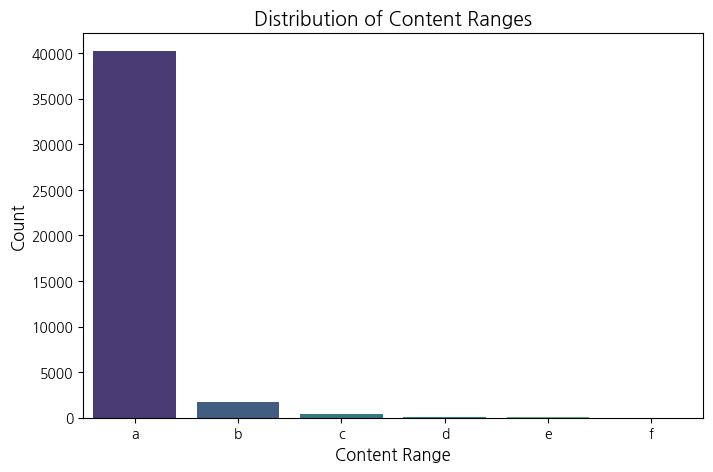

In [135]:
# content_range 컬럼별 개수 세기
category_counts = content_count_per_user['content_range'].value_counts().sort_index()

# 시각화
plt.figure(figsize=(8, 5))
sns.barplot(x=category_counts.index, y=category_counts.values, palette="viridis")

# 그래프 설정
plt.xlabel("Content Range", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Distribution of Content Ranges", fontsize=14)
plt.show()


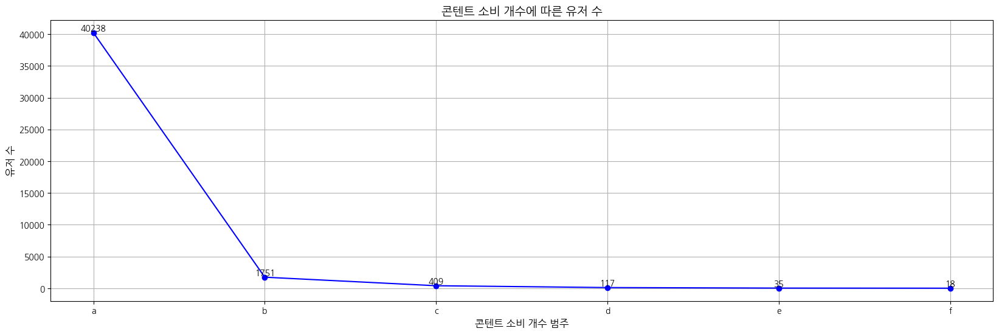

In [136]:
# 시각화
plt.figure(figsize=(20, 6))
plt.plot(category_counts.index, category_counts.values, marker='o', linestyle='-', color='b')

# 그래프 설정
plt.xlabel("콘텐트 소비 개수 범주", fontsize=12)
plt.ylabel("유저 수", fontsize=12)
plt.title("콘텐트 소비 개수에 따른 유저 수", fontsize=14)
plt.grid(True)  # 격자 추가

# 값 표시 (데이터 포인트 위에 숫자 표시)
for i, txt in enumerate(category_counts.values):
    plt.text(category_counts.index[i], category_counts.values[i] + 1, str(txt), ha='center', va='bottom', fontsize=10)

plt.show()


#### 유저들은 한 달에 몇 번이나 접속했나(평균)

In [137]:
# 유저들은 한 달에 몇 번이나 접속했나(평균)
# 그룹바이이
start_content_user_monthly_counts = start_content_2022_2023.groupby(["user_id", "year_month"]).size().reset_index(name="monthly_count")

# 계산산
average_monthly_contents_per_user = start_content_user_monthly_counts.groupby("user_id")["monthly_count"].mean().reset_index()
average_monthly_contents_per_user.rename(columns={"monthly_count": "average_monthly_start_session_enter"}, inplace=True)
average_monthly_contents_per_user["average_monthly_start_session_enter"] = average_monthly_contents_per_user["average_monthly_start_session_enter"].round(2)

# 결과 출력
average_monthly_contents_per_user


,user_id,average_monthly_start_session_enter
0,0000572f2ba8079bcefd2760b632e820,1.50
1,000087537cbfd934375364218ff10f91,1.00
2,0001f15911b404f3bf5b8571afafa4e4,3.00
3,0003b028a745bdfda9e88539424248af,1.00
4,000509014329002768958b9210789b4b,1.00
...,...,...
42563,fff60192556898a9001de93f8708bedf,2.00
42564,fffadab35ddc8234e1c5139815bfc017,5.00
42565,fffcbf8ded60b689e9867bff455f4ab7,1.00
42566,fffe529de03d6187ef7ed765650c8d2b,3.17


In [138]:
average_monthly_contents_per_user.describe()

,average_monthly_start_session_enter
count,42568.000000
mean,1.722072
std,1.555307
min,1.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,51.000000


In [139]:
average_monthly_contents_per_user['average_monthly_start_session_enter'].mean().round(2)

1.72

In [140]:
start_content_2022_2023['user_id'].nunique()

42568

In [141]:
start_content_2022_2023.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year,year_month
0,Daejeon,2023-04-06 06:14:39.906,South Korea,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner,2023,2023-04
1,Seoul,2023-04-06 06:50:19.674,South Korea,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-04
2,Seoul,2023-04-10 23:06:26.585,South Korea,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner,2023,2023-04
3,Toronto,2023-04-10 23:15:29.040,Canada,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner,2023,2023-04
4,Seoul,2023-04-10 23:21:36.467,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced,2023,2023-04


In [142]:
duplicates = start_content_2022_2023[start_content_2022_2023.duplicated(subset=['user_id', 'content_id'], keep=False)]
duplicates.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year,year_month


In [143]:
click_cancel_plan_button = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/intermediate_project/data/click_cancel_plan_button.csv')
click_cancel_plan_button.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id
0,Daegu,2023-04-10 14:57:48.556,South Korea,NaN,Windows,Windows,click.cancel_plan_button,Korean,Chrome,111.0.0.0,Web,9e59ecf9a8fbe9051bd0d54f4b702f30
1,Seoul,2023-03-12 08:26:16.224,South Korea,NaN,Apple iPad,Apple iPad,click.cancel_plan_button,English,Mobile Safari,16.3,Web,4ed4d8f12c45504a148bfff0f2e9466e
2,Uijeongbu-si,2023-03-12 08:23:04.955,South Korea,NaN,Windows,Windows,click.cancel_plan_button,Korean,Chrome,110.0.0.0,Web,b6a1bba3cc4139d7dc821561319221e6
3,Dobong-gu,2023-03-12 08:32:39.271,South Korea,NaN,Windows,Windows,click.cancel_plan_button,Korean,Chrome,110.0.0.0,Web,40acc1ddfc012f3d2f58a3de95e9e748
4,Geumjeong-gu,2023-04-12 11:36:28.311,South Korea,NaN,Windows,Windows,click.cancel_plan_button,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180


#### 레슨의 개수가 콘텐트 수강 완료율에 영향을 주나?

#### 난이도 비기너 ~~, 수치화 해야 하나? 옆에 컬럼 추가. (비기너 -> A, 하드 -> B 이런식으로)

In [144]:
# 데이터를 병합
merged_data_1 = pd.merge(
    start_content_2022_2023, 
    end_content_2022_2023, 
    on=['content_id', 'user_id'], 
    suffixes=('_start', '_end')
)

# 시작-완료 시간 차이
merged_data_1['time_difference'] = merged_data_1['client_event_time_end'] - merged_data_1['client_event_time_start']

# 각 lesson_id별 평균 시간
average_time_per_lesson = merged_data_1.groupby('content_id')['time_difference'].mean()

# 결과 출력
print(average_time_per_lesson)


content_id
03b4a290c08f7fa83933827a994f2e61    7 days 15:12:47.914586614
0ab2b890d4068c1490b89676773256f6   15 days 19:37:28.206084558
101e1d0dcc38d9c86156f008a145083e   15 days 17:42:15.600763546
123715e9b63b3efb32cdcd947ea96aaf   12 days 03:01:12.034787878
165def8885b8a2ec0c92404048d7e345   15 days 09:09:37.742082125
                                              ...            
f6f082e10dc9c1061cb809989b361d9c   16 days 02:28:21.967441441
f8b0ca043f5f0437603142ae93e6a424   18 days 14:20:30.530797468
fc3051206e08a57bc14fa52a7eec904b       4 days 10:06:20.282000
fc6a9e04f693ea724c55153d1ae82c65       0 days 00:48:48.410000
ff7998135d650dbefb3f479c900cbcc7    4 days 16:14:16.601402723
Name: time_difference, Length: 114, dtype: timedelta64[ns]


In [145]:
average_time_per_lesson_df = pd.DataFrame(average_time_per_lesson)

In [146]:
average_time_per_lesson_df.head()

,time_difference
content_id,
03b4a290c08f7fa83933827a994f2e61,7 days 15:12:47.914586614
0ab2b890d4068c1490b89676773256f6,15 days 19:37:28.206084558
101e1d0dcc38d9c86156f008a145083e,15 days 17:42:15.600763546
123715e9b63b3efb32cdcd947ea96aaf,12 days 03:01:12.034787878
165def8885b8a2ec0c92404048d7e345,15 days 09:09:37.742082125


In [147]:
average_time_per_lesson_df.sort_values(by = 'time_difference', ascending = True)

,time_difference
content_id,
16c90877db6d303e295cb27e74f55050,0 days 00:05:50.390000
7f3710876a1f7e774c5c39220bdb82d5,0 days 00:20:50.881000
fc6a9e04f693ea724c55153d1ae82c65,0 days 00:48:48.410000
6c1ab2ac2b70a203dad068301a9152a4,0 days 01:04:43.208021739
ed88bded4d552a42b70b65cf09e3943a,0 days 02:45:03.882666666
...,...
a914987711c7e2db9fd4bff7555ec87c,26 days 20:37:56.547694214
634f93f037bb2c534c2f99fdd16a04f0,31 days 08:52:09.127333333
db82104b9c508953b3d00eea82844a48,32 days 05:55:48.149315789


In [148]:
start_content_2022_2023.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year,year_month
0,Daejeon,2023-04-06 06:14:39.906,South Korea,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner,2023,2023-04
1,Seoul,2023-04-06 06:50:19.674,South Korea,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-04
2,Seoul,2023-04-10 23:06:26.585,South Korea,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner,2023,2023-04
3,Toronto,2023-04-10 23:15:29.040,Canada,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner,2023,2023-04
4,Seoul,2023-04-10 23:21:36.467,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced,2023,2023-04


In [149]:
start_content_2022_2023['os_name'].value_counts()

os_name
Chrome                  80223
Edge                    13563
Whale                    7228
Safari                   6084
Mobile Safari            4909
Instagram                3279
Samsung Browser          2986
Chrome WebView           1523
WebKit                    932
Firefox                   348
Chrome Mobile             311
Facebook                  263
GSA                       245
Yandex                     81
Opera                      63
Avast Secure Browser       39
Android Browser            19
WeChat                      7
AVG Secure Browser          6
Opera Touch                 3
Silk                        2
MIUI Browser                1
Line                        1
Name: count, dtype: int64

In [150]:
start_content_2022_2023['user_id'].nunique()

42568

#### 컨텐츠 완료 후 새 컨텐츠 시작 사이 기간

In [151]:
# 데이터 정렬 (user_id별 시간 순서대로)
start_content_2022_2023_a = start_content_2022_2023.sort_values(by=["user_id", "client_event_time"]).reset_index(drop=True)
end_content_2022_2023_a = end_content_2022_2023.sort_values(by=["user_id", "client_event_time"]).reset_index(drop=True)

# user_id 기준으로 데이터프레임 병합
merged = end_content_2022_2023_a.merge(start_content_2022_2023_a, on="user_id", suffixes=("_end", "_start"))

# 사용자가 완료한 컨텐츠 이후의 시작 컨텐츠 찾기
valid_mask = merged["client_event_time_start"] > merged["client_event_time_end"]
merged_filtered = merged[valid_mask]

# 각 end_content_2022_2023_a의 "다음 start_content_2022_2023_a"를 찾기 위해 groupby 후 최소값 찾기
next_start_times = merged_filtered.groupby(["user_id", "client_event_time_end"])["client_event_time_start"].min().reset_index()

# 원래 end_content_2022_2023_a와 병합해서 next_start_time 추가
end_content_2022_2023_a = end_content_2022_2023_a.merge(next_start_times, left_on=["user_id", "client_event_time"], right_on=["user_id", "client_event_time_end"], how="left")

# 시간 차이 계산
end_content_2022_2023_a["time_difference"] = (end_content_2022_2023_a["client_event_time_start"] - end_content_2022_2023_a["client_event_time"]).dt.total_seconds()

# 평균 시간 계산 (초 -> 분)
average_time = end_content_2022_2023_a["time_difference"].mean()
print(f"평균 컨텐츠 간 시간 차이: {average_time / 60:.2f} 분")


평균 컨텐츠 간 시간 차이: 46544.31 분


In [152]:
# # start.content와 end.content csv 파일 읽어오기
# start_content = datasets.start.content()
# end_content = datasets.end.content()

# start_content = start_content[['user_id','content.id','event_type','client_event_time']]
# end_content = end_content[['user_id','content.id','event_type','client_event_time']]

# # user_id와 content_id를 기준으로 시작시간과 완료시간을 구하기
# start_content['client_event_time'] = pd.to_datetime(start_content['client_event_time'])
# end_content['client_event_time'] = pd.to_datetime(end_content['client_event_time'])

# # 시작시간과 완료시간을 병합
# merged_content = pd.merge(start_content, end_content, on=['user_id','content.id'], how='left', suffixes=('_start', '_end'))

# # 정렬
# merged_content = merged_content.sort_values(by=['user_id','client_event_time_start'])

# # 다음 콘텐츠 시작 시간 계산
# merged_content['next_start_time'] = merged_content.groupby('user_id')['client_event_time_start'].shift(-1)

# # 콘텐츠 완료 시간과 다음 콘텐츠 시작 시간의 차이 계산
# merged_content['time_to_next_start'] = merged_content['next_start_time'] - merged_content['client_event_time_end']

# # 컨텐츠 완료 전에 다른 컨텐츠를 시작하는 경우를 제외하고자, 차이값을 0이상 필터링
# merged_content.loc[merged_content['time_to_next_start'] > pd.Timedelta(0) ,'time_to_next_start'].mean()

#### 프로모션을 통해 결제한 유저의 수강 개수 vs 프로모션 x 결제 유저 수강 개수

#### 12개월 플랜을 구매한 유저는 12개월 내내 꾸준히 수강했는가

In [153]:
enter_content_page.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
0,Seoul,2023-04-06 06:40:35.740,South Korea,Apple iPhone,Apple iPhone,enter.content_page,Korean,Chrome,108.0.5359.112,Web,d57aba7b4527e71b96135deaaec57def,220ce7873b8895d0c81c37600b5bd1e7
1,Hwaseong-si,2023-04-06 06:01:59.950,South Korea,Samsung Galaxy Note,Samsung Galaxy Note10+ 5G,enter.content_page,Korean,Chrome,111.0.0.0,Web,NaN,ecde9a1b01763f791c3a185d53b5f394
2,Daejeon,2023-04-06 06:13:12.038,South Korea,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,b8d4ec0133e5ce485055bfd69cd28abd
3,Daejeon,2023-04-06 06:14:25.355,South Korea,Windows,Windows,enter.content_page,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430
4,Seoul,2023-04-06 06:44:23.759,South Korea,Samsung Phone,Samsung Galaxy S20 FE 5G,enter.content_page,Korean,Samsung Browser,14.2,Web,NaN,7cebec6e79cc981dbf421c5ec2aedd9d


In [154]:
complete_subscription = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/intermediate_project/data/complete_subscription.csv')
complete_subscription.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Nowon-gu,2023-04-05 21:40:04.000000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Edge,111.0.1661.62,Web,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 14:20:03.008000,South Korea,NaN,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,16.3,Web,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 08:46:14.026000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN
3,Geumjeong-gu,2023-04-12 11:35:01.865000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180,131600,131600,0,NaN
4,Gwangmyeong,2023-05-31 01:25:55.820000,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Chrome,113.0.0.0,Web,d4f54ecf6c4d7bf8742f80505f02d6dc,15920,15920,0,NaN


In [155]:
complete_subscription.rename(columns = {'plan.price' : 'plan_price', 'coupon.discount_amount' : 'coupon_discount_amount'}, inplace = True)
complete_subscription.head()


,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon_discount_amount,pg.type
0,Nowon-gu,2023-04-05 21:40:04.000000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Edge,111.0.1661.62,Web,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 14:20:03.008000,South Korea,NaN,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,16.3,Web,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 08:46:14.026000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN
3,Geumjeong-gu,2023-04-12 11:35:01.865000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180,131600,131600,0,NaN
4,Gwangmyeong,2023-05-31 01:25:55.820000,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Chrome,113.0.0.0,Web,d4f54ecf6c4d7bf8742f80505f02d6dc,15920,15920,0,NaN


In [156]:
complete_subscription.describe()

,device_carrier,plan_price,paid_amount,coupon_discount_amount
count,0.0,14289.000000,14289.000000,14289.000000
mean,NaN,51036.515921,49145.086500,1891.429421
std,NaN,43158.421184,42658.614255,5171.648117
min,NaN,14328.000000,3960.000000,0.000000
25%,NaN,15920.000000,15920.000000,0.000000
50%,NaN,15920.000000,15920.000000,0.000000
75%,NaN,87200.000000,87200.000000,0.000000
max,NaN,131600.000000,131600.000000,52640.000000


In [157]:
p = complete_subscription[complete_subscription['coupon_discount_amount'] == 0]

In [158]:
p['paid_amount'].unique()

array([ 15920, 131600,  95200,  91200,  87200,  83200,  19920,  14328,
        42960, 118440,  79200,  95520], dtype=int64)

In [159]:
start_free_trial = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/intermediate_project/data/start_free_trial.csv')
start_free_trial.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,plan.type,trial.type
0,Seoul,2023-04-05 21:49:36.156000,South Korea,NaN,Mac,Mac,start.free_trial,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,15920.0,1개월 플랜,B
1,Dobong-gu,2023-03-12 08:28:29.384000,South Korea,NaN,Windows,Windows,start.free_trial,Korean,Chrome,110.0.0.0,Web,40acc1ddfc012f3d2f58a3de95e9e748,15920.0,1개월 플랜,B
2,NaN,2023-03-12 08:35:00.107000,NaN,NaN,NaN,NaN,start.free_trial,NaN,NaN,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B
3,Seoul,2023-04-12 11:36:50.250000,South Korea,NaN,Mac,Mac,start.free_trial,Korean,Safari,15.1,Web,cc8051a75f62278b0e4216dd0a182d8c,15920.0,1개월 플랜,B
4,NaN,2023-02-18 04:13:20.822000,NaN,NaN,NaN,NaN,start.free_trial,NaN,NaN,NaN,NaN,4cc436ad294973993ccad3e3a70053a7,131600.0,12개월 플랜,B


In [160]:
start_free_trial.rename(columns = {'plan.price' : 'plan_price', 'plan.type' : 'plan_type'}, inplace = True)
start_free_trial.head()


,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,plan_type,trial.type
0,Seoul,2023-04-05 21:49:36.156000,South Korea,NaN,Mac,Mac,start.free_trial,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,15920.0,1개월 플랜,B
1,Dobong-gu,2023-03-12 08:28:29.384000,South Korea,NaN,Windows,Windows,start.free_trial,Korean,Chrome,110.0.0.0,Web,40acc1ddfc012f3d2f58a3de95e9e748,15920.0,1개월 플랜,B
2,NaN,2023-03-12 08:35:00.107000,NaN,NaN,NaN,NaN,start.free_trial,NaN,NaN,NaN,NaN,38aca03fba9753a6b2f31b829fb16a30,15920.0,1개월 플랜,B
3,Seoul,2023-04-12 11:36:50.250000,South Korea,NaN,Mac,Mac,start.free_trial,Korean,Safari,15.1,Web,cc8051a75f62278b0e4216dd0a182d8c,15920.0,1개월 플랜,B
4,NaN,2023-02-18 04:13:20.822000,NaN,NaN,NaN,NaN,start.free_trial,NaN,NaN,NaN,NaN,4cc436ad294973993ccad3e3a70053a7,131600.0,12개월 플랜,B


In [161]:
merged_df = complete_subscription.merge(start_free_trial, on=['user_id', 'plan_price'], how='inner')

# 1개월 및 12개월 플랜을 구독한 유저 수 계산
count_1month = merged_df[merged_df['plan_type'] == '1개월 플랜']['user_id'].nunique()
count_12month = merged_df[merged_df['plan_type'] == '12개월 플랜']['user_id'].nunique()

print(f"1개월 플랜 구독 유저 수: {count_1month}")
print(f"12개월 플랜 구독 유저 수: {count_12month}")

1개월 플랜 구독 유저 수: 648
12개월 플랜 구독 유저 수: 315


In [162]:
merged_df['plan_type'].unique()

array(['1개월 플랜', '12개월 플랜'], dtype=object)

In [163]:
merged_df.head()

,city_x,client_event_time_x,country_x,device_carrier_x,device_family_x,device_type_x,event_type_x,language_x,os_name_x,os_version_x,platform_x,user_id,plan_price,paid_amount,coupon_discount_amount,pg.type,city_y,client_event_time_y,country_y,device_carrier_y,device_family_y,device_type_y,event_type_y,language_y,os_name_y,os_version_y,platform_y,plan_type,trial.type
0,Nowon-gu,2023-04-05 21:40:04.000000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Edge,111.0.1661.62,Web,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN,Eunpyeong-gu,2023-03-29 21:35:22.876000,South Korea,NaN,Samsung Phone,Samsung Galaxy A6,start.free_trial,Korean,Samsung Browser,20.0,Web,1개월 플랜,B
1,Seoul,2023-04-10 14:20:03.008000,South Korea,NaN,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,16.3,Web,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN,Seongdong-gu,2023-04-03 14:17:31.472000,South Korea,NaN,Windows,Windows,start.free_trial,Korean,Chrome,111.0.0.0,Web,12개월 플랜,B
2,Geumjeong-gu,2023-04-12 11:35:01.865000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180,131600,131600,0,NaN,Geumjeong-gu,2023-04-05 09:29:21.311000,South Korea,NaN,Windows,Windows,start.free_trial,Korean,Chrome,111.0.0.0,Web,12개월 플랜,B
3,Gwangmyeong,2023-05-31 01:25:55.820000,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Chrome,113.0.0.0,Web,d4f54ecf6c4d7bf8742f80505f02d6dc,15920,15920,0,NaN,Gwangmyeong,2023-03-20 01:24:47.064000,South Korea,NaN,Mac,Mac,start.free_trial,Korean,Chrome,111.0.0.0,Web,1개월 플랜,B
4,Paju,2023-03-18 10:25:02.509000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,0bf62b109d9ba5ed21602e69a396dba3,15920,15920,0,NaN,Paju,2023-03-11 10:22:31.292000,South Korea,NaN,Windows,Windows,start.free_trial,Korean,Chrome,111.0.0.0,Web,1개월 플랜,B


In [164]:
merged_df['client_event_time_x'] = pd.to_datetime(merged_df['client_event_time_x'], errors='coerce')

In [165]:
# merged_df에서 '12개월 플랜' user_id만 추출
long_term_users = merged_df[merged_df['plan_type'] == '12개월 플랜']['user_id'].unique()
long_term_users


array(['c0f5678df8967163e6e2c464ed006791',
       'bdffe1f18684704d4ea2d7eebcaed180',
       '42a41eaf1c11accc6cf0d294295a8a1b',
       'a861512f4cdca0cec8d58546b9c27b0b',
       'dece6c7eb098782ee5aa457903f4f41e',
       'cea664fb7c93fadcc661d36067794676',
       'a159987d762b18bab83cb3c07984e76d',
       '1d3d6b01cc563efc55f07510fb2edd39',
       '5b21de9af0b45746fea0add861abc4ec',
       '7b45409c95e3e29359eb196f95c51857',
       'e17622b9bb09914c65c3ffdfa4ea6bb4',
       '93cd168b75ec4cbdd9e4be5b4ba72b33',
       '2484a9bd20655be969f5a88f3ddeda47',
       '326a1460070ddb2ee382276245bd87ef',
       '475efa7f44c2d62b4cbb567e3c21c204',
       'ef9d384dd053ca52809502e49afccd15',
       'fe44d055c0e367caedcf2132921eb34e',
       '27ccfe38e960137581239f65d7ce205c',
       'bcb27218127eb9073e60b0cba8559ee0',
       '2263e15fbf840536d6e8d1b8d0821109',
       '2da3a22ee94d7c15c01bea685482867c',
       'e9873efcf45620c9600375c338f03cef',
       '79e95959e073f991f793e1058921d703',
       '35a

In [166]:
# start_content 데이터에서 해당 user_id만 필터링
filtered_start_content = start_content_2022_2023[start_content_2022_2023['user_id'].isin(long_term_users)].copy()
filtered_start_content

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year,year_month
141,Takadanobaba,2023-02-18 13:50:30.467,Japan,Windows,Windows,start.content,Japanese,Chrome,110.0.0.0,Web,06d0db470da3e9b44fcd79e9a70c1120,f491517f4737a60d661cd1fcacc702c0,intermediate,2023,2023-02
144,Jungnang-gu,2023-02-12 12:15:46.998,South Korea,Windows,Windows,start.content,Korean,Chrome,109.0.0.0,Web,e847270c7e6dcc3de104a83301a7aa58,68a3658f1b936bfff3bd6960cd561b0a,beginner,2023,2023-02
211,Geumcheon-gu,2023-05-05 22:26:26.537,South Korea,Windows,Windows,start.content,Korean,Chrome,112.0.0.0,Web,dece6c7eb098782ee5aa457903f4f41e,f64c475280676531a31f2f8e0648599c,intermediate,2023,2023-05
233,Seongdong-gu,2023-02-22 09:37:05.631,South Korea,Windows,Windows,start.content,Korean,Chrome,110.0.0.0,Web,e68dd6670a81d9e54dc833cc487904ed,61b6463287573f00de13a930805a52d6,beginner,2023,2023-02
235,Seoul,2023-02-28 16:41:12.499,South Korea,Windows,Windows,start.content,Korean,Whale,3.19.166.16,Web,c43e52908e0b76b42f6b4f67817afdf7,b314d5aba64a0aab40602cb72a4a1504,intermediate,2023,2023-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123673,Guro-gu,2023-07-25 16:07:00.750,South Korea,Mac,Mac,start.content,Korean,Chrome,112.0.0.0,Web,1249b540588cbf58e644ceede1961540,4641438a6c81ef572d997dbdc9100f8b,intermediate,2023,2023-07
124116,Seoul,2023-08-27 18:07:22.293,South Korea,Apple iPhone,Apple iPhone,start.content,Korean,Mobile Safari,16.6,Web,f56c5545335024e7b53b2660995c6e7d,445fac33232adcb3d1cdab7d8a579430,beginner,2023,2023-08
124175,Gwangju,2023-11-12 19:30:45.583,South Korea,Windows,Windows,start.content,Korean,Chrome,119.0.0.0,Web,cfabed220d6771ec995c6ce6c31a9774,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-11
124298,Seoul,2023-07-28 17:55:34.562,South Korea,Windows,Windows,start.content,Korean,Chrome,115.0.0.0,Web,8ff62e8631b9bd112b7276c27e410407,7cebec6e79cc981dbf421c5ec2aedd9d,beginner,2023,2023-07


In [167]:
# 'client_event_time'을 datetime 형식으로 변환 후, 'YYYY-MM' 형태의 월 컬럼 생성
filtered_start_content['event_month'] = pd.to_datetime(filtered_start_content['client_event_time']).dt.to_period('M')

# user_id별 월별 content_id 존재 여부(0/1) 확인
monthly_activity = filtered_start_content.groupby(['user_id', 'event_month'])['content_id'].count().reset_index()

# content_id가 1개 이상이면 '1', 없으면 '0'으로 변환
monthly_activity['active'] = (monthly_activity['content_id'] > 0).astype(int)

# 최종적으로 user_id별 월별 start_content 활동 여부 pivot 테이블로 정리
pivot_df = monthly_activity.pivot(index='user_id', columns='event_month', values='active').fillna(0)

# 모든 월에 걸쳐 활동한 사용자 수 계산
consistent_users_count = (pivot_df.sum(axis=1) == pivot_df.shape[1]).sum()
print(f"모든 월에 활동한 사용자 수: {consistent_users_count}명")


모든 월에 활동한 사용자 수: 0명


#### 난이도 별 완강률

In [168]:
end_content_2022_2023.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,year_month
0,Yokohama,2023-04-10 23:02:10.600,Japan,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c,2023-04
1,Seoul,2023-04-10 23:21:26.466,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c,2023-04
2,Seongbuk-gu,2023-04-10 23:37:04.440,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7,2023-04
3,Seo-gu,2023-04-10 23:37:19.909,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a,2023-04
4,Seo-gu,2023-04-10 23:08:58.968,South Korea,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa,2023-04


In [169]:
start_content_2022_2023.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year,year_month
0,Daejeon,2023-04-06 06:14:39.906,South Korea,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner,2023,2023-04
1,Seoul,2023-04-06 06:50:19.674,South Korea,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-04
2,Seoul,2023-04-10 23:06:26.585,South Korea,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner,2023,2023-04
3,Toronto,2023-04-10 23:15:29.040,Canada,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner,2023,2023-04
4,Seoul,2023-04-10 23:21:36.467,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced,2023,2023-04


In [170]:
# start_content 데이터에서 content_id와 content_difficulty만 선택
difficulty_mapping = start_content_2022_2023[['content_id', 'content_difficulty']].drop_duplicates()

# end_content 데이터와 content_id 기준으로 병합
end_content_2022_2023 = end_content_2022_2023.merge(difficulty_mapping, on='content_id', how='left')

# 결과 확인
end_content_2022_2023.head()


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,year_month,content_difficulty
0,Yokohama,2023-04-10 23:02:10.600,Japan,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c,2023-04,advanced
1,Seoul,2023-04-10 23:21:26.466,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c,2023-04,intermediate
2,Seongbuk-gu,2023-04-10 23:37:04.440,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7,2023-04,advanced
3,Seo-gu,2023-04-10 23:37:19.909,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a,2023-04,beginner
4,Seo-gu,2023-04-10 23:08:58.968,South Korea,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa,2023-04,advanced


In [171]:
end_content_2022_2023.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129855 entries, 0 to 129854
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   city                125109 non-null  object        
 1   client_event_time   129855 non-null  datetime64[ns]
 2   country             126086 non-null  object        
 3   device_family       128617 non-null  object        
 4   device_type         128066 non-null  object        
 5   event_type          129855 non-null  object        
 6   language            128618 non-null  object        
 7   os_name             128613 non-null  object        
 8   os_version          128588 non-null  object        
 9   platform            128618 non-null  object        
 10  user_id             129855 non-null  object        
 11  content_id          129855 non-null  object        
 12  year_month          129855 non-null  period[M]     
 13  content_difficulty  129159 no

In [172]:
end_content_2022_2023.isna().sum()
# content_difficulty에 696개의 null 값이 존재하나 

city                  4746
client_event_time        0
country               3769
device_family         1238
device_type           1789
event_type               0
language              1237
os_name               1242
os_version            1267
platform              1237
user_id                  0
content_id               0
year_month               0
content_difficulty     696
dtype: int64

In [173]:
end_content_2022_2023['content_id'].nunique()

159

In [174]:
# content_difficulty가 NaN인 content_id만 추출
missing_difficulty = end_content_2022_2023[end_content_2022_2023['content_difficulty'].isna()]['content_id'].unique()

# 결과 출력
print("content_difficulty가 없는 content_id 개수:", len(missing_difficulty))
print("일부 content_id:", missing_difficulty[:10])  # 처음 10개만 출력


content_difficulty가 없는 content_id 개수: 21
일부 content_id: ['27dfbcc612e4abe754bc8b16e33ec4bc' 'ee8bd77e2bae7300f6e286f85a4002e9'
 '104b6ff31ef413e48742d5b6c80210c7' '3ff99ace71ebd7283e6e4c5bd924da9b'
 '14acbb179345c79c81a1786e6e1eea0c' '4eb61c17dd394a42cb5af0573cb66f9a'
 'f1c9e84f9379672d43195becc162d087' 'c78cb3b2e056cb85424ce87badd22520'
 '58540a6043b042c0b714c1217633c39b' 'd1f87d1849095c2ec5987e9fb4b05fcf']


- content_id의 유니크 개수 159개 중 21개는 content_difficulty가 없음
- 큰 값은 아니니 제거하고 진행

In [175]:
# 1. 각 난이도별 전체 content_id 개수 계산
total_content = start_content_2022_2023.groupby('content_difficulty')['content_id'].nunique().reset_index()
total_content.rename(columns={'content_id': 'total_content_count'}, inplace=True)

# 2. end_content_2022_2023에 존재하는 content_id의 난이도를 가져오기 위해 병합
end_with_difficulty = end_content_2022_2023.merge(
    start_content_2022_2023[['content_id', 'content_difficulty']].drop_duplicates(),
    on='content_id', how='left'
)


In [176]:
end_with_difficulty.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,year_month,content_difficulty_x,content_difficulty_y
0,Yokohama,2023-04-10 23:02:10.600,Japan,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c,2023-04,advanced,advanced
1,Seoul,2023-04-10 23:21:26.466,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c,2023-04,intermediate,intermediate
2,Seongbuk-gu,2023-04-10 23:37:04.440,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7,2023-04,advanced,advanced
3,Seo-gu,2023-04-10 23:37:19.909,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a,2023-04,beginner,beginner
4,Seo-gu,2023-04-10 23:08:58.968,South Korea,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa,2023-04,advanced,advanced


In [177]:
# content_difficulty 컬럼 정리
end_with_difficulty = end_with_difficulty.rename(columns={'content_difficulty_y': 'content_difficulty'}).drop(columns=['content_difficulty_x'])

# 각 난이도별 완강된 content_id 개수 계산
completed_content = end_with_difficulty.groupby('content_difficulty')['content_id'].nunique().reset_index()
completed_content.rename(columns={'content_id': 'completed_content_count'}, inplace=True)

print(completed_content)

  content_difficulty  completed_content_count
0           advanced                       58
1           beginner                       17
2               hard                       12
3       intermediate                       68


In [178]:
# 4. 두 개의 데이터 병합
final_result = total_content.merge(completed_content, on='content_difficulty', how='left').fillna(0)

# 5. 완강률 계산
final_result['completion_rate'] = (final_result['completed_content_count'] / final_result['total_content_count']) * 100

# 6. 결과 출력
final_result


,content_difficulty,total_content_count,completed_content_count,completion_rate
0,advanced,63,58,92.063492
1,beginner,18,17,94.444444
2,hard,13,12,92.307692
3,intermediate,74,68,91.891892


In [179]:
final_result['total_content_count'].sum()

168

In [180]:
start_content_2022_2023['content_id'].nunique()

151

In [181]:
end_content_2022_2023['content_id'].nunique()

159

In [182]:
start_content_2022_2023['content_difficulty'].value_counts()

content_difficulty
beginner        58154
intermediate    35927
advanced        27393
hard             2676
Name: count, dtype: int64

- end content 난이도별 content_id 개수

In [183]:
# start_content 데이터에서 content_id와 content_difficulty만 선택
difficulty_mapping = start_content_2022_2023[['content_id', 'content_difficulty']].drop_duplicates()

# end_content 데이터와 content_id 기준으로 병합
end_content_2022_2023 = end_content_2022_2023.merge(difficulty_mapping, on='content_id', how='left')

In [184]:
# 1. content_id와 content_difficulty 매핑 테이블 생성 (중복 제거)
difficulty_mapping = start_content_2022_2023[['content_id', 'content_difficulty']].drop_duplicates()

# 2. end_content_2022_2023과 병합 (content_id 기준으로 content_difficulty 추가)
end_with_difficulty = end_content_2022_2023.merge(difficulty_mapping, on='content_id', how='left')

# 3. content_difficulty 별 content_id 개수 계산
end_content_count = end_with_difficulty.groupby('content_difficulty')['content_id'].nunique().reset_index()

# 4. 컬럼명 변경
end_content_count.rename(columns={'content_id': 'end_content_count'}, inplace=True)

# 5. 결과 출력
end_content_count


,content_difficulty,end_content_count
0,advanced,58
1,beginner,17
2,hard,12
3,intermediate,68


- start content 난이도별 content_id 개수

In [ ]:
import pandas as pd

# 1. content_difficulty 별 content_id 개수 계산
start_content_count = start_content_2022_2023.groupby('content_difficulty')['content_id'].nunique().reset_index()

# 2. 컬럼명 변경
start_content_count.rename(columns={'content_id': 'start_content_count'}, inplace=True)

# 3. 결과 출력
start_content_count

,content_difficulty,start_content_count
0,advanced,63
1,beginner,18
2,hard,13
3,intermediate,74


In [186]:
# content_id 열을 합친 후, 중복값 제거
unique_content_ids = pd.concat([start_content_2022_2023['content_id'], end_content_2022_2023['content_id']]).unique()

# 유니크한 content_id 개수 카운트
count_unique_content_ids = len(unique_content_ids)

print(f'중복을 제외한 content_id의 개수: {count_unique_content_ids}')

중복을 제외한 content_id의 개수: 172


In [219]:
# end_content_2022_2023의 content_id가 start_content_2022_2023에 존재하는지 확인
common_content_ids = start_content_2022_2023[start_content_2022_2023['content_id'].isin(end_content_2022_2023['content_id'])]

common_content_ids['content_id'].nunique()

138

In [188]:
start_content_count['start_content_count'].sum()

168

In [189]:
end_content_count['end_content_count'].sum()

155

In [231]:
print(start_content_2022_2023['client_event_time'].min())
print(start_content_2022_2023['client_event_time'].max())
print(end_content_2022_2023['client_event_time'].min())
print(end_content_2022_2023['client_event_time'].max())

2022-08-17 16:11:12.230000
2023-12-30 23:57:19.382000
2022-01-01 10:29:42.752000
2023-12-30 23:57:11.332000


#### 한 번만 start된 콘텐트?

In [225]:
start_content_2022_2023.isna().sum()

city                  3683
client_event_time        0
country               2673
device_family         2015
device_type           4613
event_type               0
language              2013
os_name               2034
os_version            2118
platform              2013
user_id                  0
content_id               0
content_difficulty       0
year                     0
year_month               0
dtype: int64

In [227]:
# city와 country가 모두 null인 행 찾기
null_rows = start_content_2022_2023[start_content_2022_2023['city'].isnull() & start_content_2022_2023['country'].isnull()]

null_rows

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year,year_month
61,NaN,2023-05-31 10:11:00.822,NaN,Windows,Windows,start.content,Korean,Chrome,113.0.0.0,Web,b52f4acc263665136089eb1cb2573b3a,f491517f4737a60d661cd1fcacc702c0,intermediate,2023,2023-05
139,NaN,2023-02-18 13:24:31.465,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,4cc436ad294973993ccad3e3a70053a7,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-02
140,NaN,2023-02-18 13:47:54.102,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,d3a654c02745f31611f25c7226895ed4,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-02
195,NaN,2023-05-13 08:47:26.873,NaN,Windows,Windows,start.content,Korean,Edge,113.0.1774.35,Web,35f6d56d6e7c4aacf31a46cb95e7beec,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-05
347,NaN,2023-04-11 21:18:36.602,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,a17e324011a4b428429472c2464a6af4,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124874,NaN,2023-12-29 22:43:55.525,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,31eba26660b9d2cdfd140596c649a32f,61b6463287573f00de13a930805a52d6,beginner,2023,2023-12
124875,NaN,2023-12-29 22:30:32.549,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,fa1a473a3b7b71ed1d2b5f4c45791e47,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-12
124876,NaN,2023-12-29 22:48:29.052,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,3ca22b0bade6b40d6274bf6d06bc4344,61b6463287573f00de13a930805a52d6,beginner,2023,2023-12
124877,NaN,2023-12-29 22:32:40.626,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,8ff47bbaceb5b0a833e16db47fff5981,61b6463287573f00de13a930805a52d6,beginner,2023,2023-12


In [228]:
null_rows[null_rows['user_id'].duplicated(keep=False)]


,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year,year_month
61,NaN,2023-05-31 10:11:00.822,NaN,Windows,Windows,start.content,Korean,Chrome,113.0.0.0,Web,b52f4acc263665136089eb1cb2573b3a,f491517f4737a60d661cd1fcacc702c0,intermediate,2023,2023-05
195,NaN,2023-05-13 08:47:26.873,NaN,Windows,Windows,start.content,Korean,Edge,113.0.1774.35,Web,35f6d56d6e7c4aacf31a46cb95e7beec,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-05
347,NaN,2023-04-11 21:18:36.602,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,a17e324011a4b428429472c2464a6af4,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-04
400,NaN,2023-04-12 14:24:06.683,NaN,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,b54c5a88c32634bddaba879a5e19b805,101e1d0dcc38d9c86156f008a145083e,advanced,2023,2023-04
544,NaN,2023-06-29 11:37:35.801,NaN,Windows,Windows,start.content,Korean,Chrome,114.0.0.0,Web,a6bcaaa4f51234a7c83b37ea86b54f00,f491517f4737a60d661cd1fcacc702c0,intermediate,2023,2023-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124378,NaN,2023-11-13 13:11:21.015,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,31cc62706679d032ec007bc57090b8c3,445fac33232adcb3d1cdab7d8a579430,beginner,2023,2023-11
124384,NaN,2023-11-07 08:16:34.028,NaN,Windows,Windows,start.content,Korean,Chrome,119.0.0.0,Web,f6f454ffbf33a58d94aa9921a396d037,101e1d0dcc38d9c86156f008a145083e,advanced,2023,2023-11
124868,NaN,2023-12-29 22:45:00.371,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,0701781b9f81d6e3e088f307478498d3,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-12
124869,NaN,2023-12-29 22:19:08.385,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,47d6782e38add15735da613245e00bd6,68a3658f1b936bfff3bd6960cd561b0a,beginner,2023,2023-12


In [229]:
unique_user_ids = null_rows.drop_duplicates(subset='user_id', keep='first')

In [230]:
unique_user_ids

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year,year_month
61,NaN,2023-05-31 10:11:00.822,NaN,Windows,Windows,start.content,Korean,Chrome,113.0.0.0,Web,b52f4acc263665136089eb1cb2573b3a,f491517f4737a60d661cd1fcacc702c0,intermediate,2023,2023-05
139,NaN,2023-02-18 13:24:31.465,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,4cc436ad294973993ccad3e3a70053a7,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-02
140,NaN,2023-02-18 13:47:54.102,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,d3a654c02745f31611f25c7226895ed4,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-02
195,NaN,2023-05-13 08:47:26.873,NaN,Windows,Windows,start.content,Korean,Edge,113.0.1774.35,Web,35f6d56d6e7c4aacf31a46cb95e7beec,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-05
347,NaN,2023-04-11 21:18:36.602,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,a17e324011a4b428429472c2464a6af4,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124873,NaN,2023-12-29 22:29:06.269,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,f638aee7843a75ae7e48dce748f4bddf,61b6463287573f00de13a930805a52d6,beginner,2023,2023-12
124874,NaN,2023-12-29 22:43:55.525,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,31eba26660b9d2cdfd140596c649a32f,61b6463287573f00de13a930805a52d6,beginner,2023,2023-12
124875,NaN,2023-12-29 22:30:32.549,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,fa1a473a3b7b71ed1d2b5f4c45791e47,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-12
124877,NaN,2023-12-29 22:32:40.626,NaN,NaN,NaN,start.content,NaN,NaN,NaN,NaN,8ff47bbaceb5b0a833e16db47fff5981,61b6463287573f00de13a930805a52d6,beginner,2023,2023-12


In [236]:
start_content_2022_2023.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year,year_month
0,Daejeon,2023-04-06 06:14:39.906,South Korea,Windows,Windows,start.content,Korean,Edge,111.0.1661.62,Web,41362ad5ebcade2bb1b78344a53e7ccf,445fac33232adcb3d1cdab7d8a579430,beginner,2023,2023-04
1,Seoul,2023-04-06 06:50:19.674,South Korea,Mac,Mac,start.content,Korean,Safari,15.6.1,Web,06b6868000a5d576180aca47896d6cce,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-04
2,Seoul,2023-04-10 23:06:26.585,South Korea,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner,2023,2023-04
3,Toronto,2023-04-10 23:15:29.040,Canada,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner,2023,2023-04
4,Seoul,2023-04-10 23:21:36.467,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced,2023,2023-04


#### 총매출

In [190]:
complete_subscription.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon_discount_amount,pg.type
0,Nowon-gu,2023-04-05 21:40:04.000000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Edge,111.0.1661.62,Web,1116a2ae90ca6b06f85feba27ad51ef0,15920,15920,0,NaN
1,Seoul,2023-04-10 14:20:03.008000,South Korea,NaN,Apple iPhone,Apple iPhone,complete.subscription,Korean,Mobile Safari,16.3,Web,c0f5678df8967163e6e2c464ed006791,131600,131600,0,NaN
2,Yangsan,2023-03-12 08:46:14.026000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,79421b5d038205ad7adbb1e2c3b89741,131600,119756,11844,NaN
3,Geumjeong-gu,2023-04-12 11:35:01.865000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,111.0.0.0,Web,bdffe1f18684704d4ea2d7eebcaed180,131600,131600,0,NaN
4,Gwangmyeong,2023-05-31 01:25:55.820000,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Chrome,113.0.0.0,Web,d4f54ecf6c4d7bf8742f80505f02d6dc,15920,15920,0,NaN


In [191]:
# user_id가 중복된 행 확인
duplicated_rows = complete_subscription[complete_subscription.duplicated(subset=['user_id'], keep=False)]

duplicated_rows

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon_discount_amount,pg.type
23,Gimhae,2023-01-31 14:36:59.053000,South Korea,NaN,Samsung Phone,Samsung Galaxy Z Flip4,complete.subscription,Korean,Samsung Browser,19.0,Web,08488d882a77ee36f78d01abbad76e2b,95200,95200,0,NaN
24,Jung-gu,2023-01-31 14:13:10.622000,South Korea,NaN,LG LM-V409N,NaN,complete.subscription,Korean,Chrome,109.0.0.0,Web,7db002173092812a2be481b7587eaab7,95200,95200,0,NaN
54,Anyang-si,2023-01-30 12:30:49.480000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,109.0.0.0,Web,d4925cb2e98bdf5c79806c35a73649c0,95200,95200,0,NaN
72,Changwon,2023-04-17 14:00:07.958000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Edge,112.0.1722.48,Web,905926bf8282b106c42a6f22db935b93,131600,131600,0,NaN
152,Seoul,2023-03-09 00:47:27.001000,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Safari,16.1,Web,09b6da87506b2d21201435c1755d144d,15920,15920,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14161,Jeongseon-gun,2023-12-23 06:16:55.087000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,120.0.0.0,Web,e878163856cdac57985dae65831aa0fe,95520,95520,0,A
14234,Seongnam-si,2023-09-27 02:03:14.852000,South Korea,NaN,Apple iPhone,Apple iPhone,complete.subscription,Korean,WebKit,605.1.15,Web,d33975e1b7430a21e29675807e15cf57,131600,111860,19740,NaN
14248,Seoul,2023-10-20 06:49:41.880000,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,118.0.0.0,Web,f833cca4c382ac8c502c6f99bc432725,131600,131600,0,NaN
14277,Gwangmyeong,2023-11-16 13:37:40.742000,South Korea,NaN,Samsung Phone,Samsung Galaxy S21 5G,complete.subscription,Korean,Chrome WebView,119.0.6045.66,Web,433a7b7ae0c58e7badd304d9b0209e26,131600,131600,0,A


In [192]:
# client_event_time을 datetime 형식으로 변환
complete_subscription['client_event_time'] = pd.to_datetime(complete_subscription['client_event_time'])

# user_id별로 가장 늦은(client_event_time이 가장 큰) 행만 남기기
latest_subscription = complete_subscription.loc[complete_subscription.groupby('user_id')['client_event_time'].idxmax()]

# 결과 출력
latest_subscription.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon_discount_amount,pg.type
3179,Seoul,2023-03-25 14:40:01.647,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Safari,16.3,Web,0000572f2ba8079bcefd2760b632e820,15920,15920,0,NaN
2041,Goyang-si,2023-04-08 11:45:01.586,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Edge,111.0.1661.62,Web,000087537cbfd934375364218ff10f91,131600,131600,0,NaN
13205,Gyeongju,2023-11-29 01:13:51.820,South Korea,NaN,Apple iPad,Apple iPad,complete.subscription,Korean,Mobile Safari,15.4,Web,0001f15911b404f3bf5b8571afafa4e4,15920,15920,0,B
3628,Yuseong-gu,2022-08-20 13:05:01.083,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,104,Web,000be07bc09ceff42c11978f4a9f1c1a,42960,42960,0,NaN
9667,Seongnam-si,2022-04-28 10:49:02.241,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Edge,100,Web,001cd989a26ba664b086b92c364dc9cf,131600,111860,19740,NaN


In [193]:
complete_subscription.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14289 entries, 0 to 14288
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   city                    13757 non-null  object        
 1   client_event_time       14289 non-null  datetime64[ns]
 2   country                 13906 non-null  object        
 3   device_carrier          0 non-null      float64       
 4   device_family           13914 non-null  object        
 5   device_type             13764 non-null  object        
 6   event_type              14289 non-null  object        
 7   language                13914 non-null  object        
 8   os_name                 13908 non-null  object        
 9   os_version              13899 non-null  object        
 10  platform                13914 non-null  object        
 11  user_id                 14289 non-null  object        
 12  plan_price              14289 non-null  int64 

In [194]:
latest_subscription.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13881 entries, 3179 to 12434
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   city                    13361 non-null  object        
 1   client_event_time       13881 non-null  datetime64[ns]
 2   country                 13506 non-null  object        
 3   device_carrier          0 non-null      float64       
 4   device_family           13514 non-null  object        
 5   device_type             13368 non-null  object        
 6   event_type              13881 non-null  object        
 7   language                13514 non-null  object        
 8   os_name                 13508 non-null  object        
 9   os_version              13499 non-null  object        
 10  platform                13514 non-null  object        
 11  user_id                 13881 non-null  object        
 12  plan_price              13881 non-null  int64   

In [195]:
latest_subscription[latest_subscription.duplicated(subset=['user_id'], keep=False)]

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan_price,paid_amount,coupon_discount_amount,pg.type


In [196]:
# 첫구독 데이터에서 매출
latest_subscription['paid_amount'].sum()

671398640

In [197]:
renew_subscription = pd.read_csv('C:/Users/syc09/Desktop/코드잇/중급프로젝트1/intermediate_project/data/renew_subscription.csv')
renew_subscription.head()

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
0,Nam-gu,2022-09-08 03:05:02.068,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Edge,104,Web,6ddea3af2eaae869861c1190dcc9d4a3,15920,15920,0,NaN
1,Nam-gu,2022-09-08 03:40:02.050,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,c2d47034960fdff5df495822ff66fbc1,15920,15920,0,NaN
2,Dongjak-gu,2022-09-08 03:49:00.829,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,de91f1226dd938990fefc79545daf468,42960,40812,2148,NaN
3,Yongin-si,2022-09-08 04:10:06.406,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,bf14840a8cb4643e6d557da96e35a3af,15920,15920,0,NaN
4,Dongjak-gu,2022-09-08 04:40:01.895,South Korea,NaN,Android,Android,renew.subscription,Korean,Chrome Mobile,103,Web,7ddc1c2990d0645d82885394e3c518b5,15920,15920,0,NaN


In [198]:
renew_subscription.duplicated().sum()

0

In [199]:
renew_subscription[renew_subscription.duplicated(subset=['user_id'], keep=False)]

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
1,Nam-gu,2022-09-08 03:40:02.050,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,c2d47034960fdff5df495822ff66fbc1,15920,15920,0,NaN
3,Yongin-si,2022-09-08 04:10:06.406,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,bf14840a8cb4643e6d557da96e35a3af,15920,15920,0,NaN
4,Dongjak-gu,2022-09-08 04:40:01.895,South Korea,NaN,Android,Android,renew.subscription,Korean,Chrome Mobile,103,Web,7ddc1c2990d0645d82885394e3c518b5,15920,15920,0,NaN
5,Yangcheon-gu,2022-09-08 05:10:01.955,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,85822a1663cebc3351e24c25f8c02552,15920,7960,7960,NaN
6,Dongdaemun-gu,2022-09-08 06:45:01.589,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,104,Web,47a7b82262e14f30c6ee06a314004714,15920,15920,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15919,Suwon,2023-12-31 13:35:01.924,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Edge,116.0.1938.69,Web,446431cff6a5becfb58aecee8b486be1,95520,95520,0,A
15921,Seoul,2023-12-31 14:00:02.659,South Korea,NaN,Mac,Mac,renew.subscription,Korean,Chrome,96,Web,126ed602ca2c0a2ea68ab874557a20a6,95520,95520,0,A
15931,Wŏnju,2023-12-31 14:24:50.513,South Korea,NaN,Samsung Phone,Samsung Galaxy S23,renew.subscription,Korean,Samsung Browser,23.0,Web,10c43b95e86fd0feb871bd21bede50c6,95520,95520,0,B
15938,Yangcheon-gu,2023-12-31 14:44:02.611,South Korea,NaN,K,NaN,renew.subscription,Korean,Chrome,119.0.0.0,Web,f6337218ff5a756d22e48ce279fb095e,95520,95520,0,B


In [200]:
renew_subscription[renew_subscription['user_id'] == '446431cff6a5becfb58aecee8b486be1']

,city,client_event_time,country,device_carrier,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,plan.price,paid_amount,coupon.discount_amount,pg.type
3781,Yongin-si,2022-12-20 13:47:05.777,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Edge,108.0.1462.54,Web,446431cff6a5becfb58aecee8b486be1,79200,79200,0,NaN
15919,Suwon,2023-12-31 13:35:01.924,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Edge,116.0.1938.69,Web,446431cff6a5becfb58aecee8b486be1,95520,95520,0,A


In [201]:
renew_subscription['client_event_time'] = pd.to_datetime(renew_subscription['client_event_time'])

In [202]:
# latest_subscription과 renew_subscription에서 user_id와 client_event_time이 동시에 중복되는 경우 확인
duplicated_rows = latest_subscription.merge(renew_subscription, on=['user_id', 'client_event_time'], how='inner')

duplicated_rows


,city_x,client_event_time,country_x,device_carrier_x,device_family_x,device_type_x,event_type_x,language_x,os_name_x,os_version_x,platform_x,user_id,plan_price,paid_amount_x,coupon_discount_amount,pg.type_x,city_y,country_y,device_carrier_y,device_family_y,device_type_y,event_type_y,language_y,os_name_y,os_version_y,platform_y,plan.price,paid_amount_y,coupon.discount_amount,pg.type_y
0,Seoul,2022-09-24 13:09:30.345,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Safari,14,Web,2466261a18d5757e8504ff8045d4b0e1,15920,15920,0,NaN,Seoul,South Korea,NaN,Mac,Mac,renew.subscription,Korean,Safari,14,Web,15920,15920,0,NaN
1,Seoul,2022-11-17 08:45:02.108,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Chrome,107.0.0.0,Web,6b889dac8d1646374b43ccd0130182ff,131600,131600,0,NaN,Seoul,South Korea,NaN,Mac,Mac,renew.subscription,Korean,Chrome,107.0.0.0,Web,131600,131600,0,NaN
2,Sejong,2022-09-26 10:20:01.953,South Korea,NaN,Linux,Linux,complete.subscription,Korean,Chrome,91,Web,7f6ac355cd862e7361735903b53f1c92,15920,15920,0,NaN,Sejong,South Korea,NaN,Linux,Linux,renew.subscription,Korean,Chrome,91,Web,15920,15920,0,NaN
3,Mapo-gu,2022-09-24 01:45:02.179,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Chrome,105,Web,7fb2da7924c07cc24515000c9d2f237a,15920,15920,0,NaN,Mapo-gu,South Korea,NaN,Mac,Mac,renew.subscription,Korean,Chrome,105,Web,15920,15920,0,NaN


In [203]:
duplicated_rows = latest_subscription.merge(renew_subscription, on=['user_id'], how='inner')
duplicated_rows

,city_x,client_event_time_x,country_x,device_carrier_x,device_family_x,device_type_x,event_type_x,language_x,os_name_x,os_version_x,platform_x,user_id,plan_price,paid_amount_x,coupon_discount_amount,pg.type_x,city_y,client_event_time_y,country_y,device_carrier_y,device_family_y,device_type_y,event_type_y,language_y,os_name_y,os_version_y,platform_y,plan.price,paid_amount_y,coupon.discount_amount,pg.type_y
0,Seoul,2023-03-25 14:40:01.647,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Safari,16.3,Web,0000572f2ba8079bcefd2760b632e820,15920,15920,0,NaN,Seoul,2023-04-25 14:45:01.747,South Korea,NaN,Mac,Mac,renew.subscription,Korean,Safari,16.3,Web,15920,15920,0,NaN
1,Seoul,2023-03-25 14:40:01.647,South Korea,NaN,Mac,Mac,complete.subscription,Korean,Safari,16.3,Web,0000572f2ba8079bcefd2760b632e820,15920,15920,0,NaN,Seoul,2023-05-25 14:50:01.753,South Korea,NaN,Mac,Mac,renew.subscription,Korean,Safari,16.3,Web,15920,15920,0,NaN
2,Yuseong-gu,2022-08-20 13:05:01.083,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,104,Web,000be07bc09ceff42c11978f4a9f1c1a,42960,42960,0,NaN,Seo-gu,2022-11-20 13:10:01.891,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,106,Web,42960,42960,0,NaN
3,Yuseong-gu,2022-08-20 13:05:01.083,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,104,Web,000be07bc09ceff42c11978f4a9f1c1a,42960,42960,0,NaN,Yuseong-gu,2023-01-25 06:16:22.464,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,109.0.0.0,Web,95200,95200,0,NaN
4,Daegu,2022-04-10 06:02:28.859,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,100,Web,001ddbe4885db89888b34bf0eb14f6e1,15920,15920,0,NaN,Seoul,2023-01-21 09:00:05.092,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,109.0.0.0,Web,91200,91200,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12127,Dongdaemun-gu,2022-09-08 02:35:01.476,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,105,Web,ffe13db0ad3751c9be06a73aa38bc9fc,15920,15920,0,NaN,Dongdaemun-gu,2023-09-19 13:30:01.259,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,115.0.0.0,Web,15920,15920,0,NaN
12128,Dongdaemun-gu,2022-09-08 02:35:01.476,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,105,Web,ffe13db0ad3751c9be06a73aa38bc9fc,15920,15920,0,NaN,Songpa-gu,2023-10-19 13:35:01.885,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,116.0.0.0,Web,15920,15920,0,NaN
12129,Nam-gu,2022-07-30 06:20:50.505,South Korea,NaN,Android,Android,complete.subscription,Korean,Chrome WebView,103,Web,ffe3e486f61399d62d83727e53a850dc,131600,111860,19740,NaN,Seongnam-si,2023-07-31 02:03:05.911,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,114.0.0.0,Web,15920,15920,0,NaN
12130,Seoul,2023-09-10 03:16:01.197,South Korea,NaN,Samsung Phone,Samsung Galaxy S22 Ultra,complete.subscription,Korean,Chrome WebView,116.0.0.0,Web,fffadab35ddc8234e1c5139815bfc017,15920,15920,0,NaN,Gangnam-gu,2023-10-17 03:20:02.210,South Korea,NaN,Samsung Phone,Samsung Galaxy S22 Ultra,renew.subscription,Korean,Whale,1.0.0.0,Web,15920,15920,0,NaN


In [204]:
# user_id 기준으로 내부 조인 (중복 user_id 찾기)
merged_df = latest_subscription.merge(renew_subscription, on='user_id', suffixes=('_latest', '_renew'))

# client_event_time 차이 계산
merged_df['time_diff'] = (merged_df['client_event_time_renew'] - merged_df['client_event_time_latest']).dt.days

# 한 달(30일) 이내인 경우 필터링
within_one_month = merged_df[merged_df['time_diff'].between(0, 1)]

# 결과 출력
within_one_month

,city_latest,client_event_time_latest,country_latest,device_carrier_latest,device_family_latest,device_type_latest,event_type_latest,language_latest,os_name_latest,os_version_latest,platform_latest,user_id,plan_price,paid_amount_latest,coupon_discount_amount,pg.type_latest,city_renew,client_event_time_renew,country_renew,device_carrier_renew,device_family_renew,device_type_renew,event_type_renew,language_renew,os_name_renew,os_version_renew,platform_renew,plan.price,paid_amount_renew,coupon.discount_amount,pg.type_renew,time_diff
43,Seocho-gu,2022-10-03 01:20:01.864,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,105,Web,0126ad7cca27944f9856d7c6ec5974b5,15920,15920,0,NaN,Seocho-gu,2022-10-03 01:20:02.723,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,105,Web,15920,15920,0,NaN,0
59,Seongnam-si,2022-11-06 19:05:02.671,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,107,Web,01449049533c7dfe50cdfbdb605410e2,131600,131600,0,NaN,Seongnam-si,2022-11-06 19:05:02.672,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,107,Web,131600,131600,0,NaN,0
63,Uiwang-si,2022-10-10 02:40:01.405,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,106,Web,0157e1eaf2645e7d4de1fba14fe72a0f,15920,15920,0,NaN,Uiwang-si,2022-10-10 02:40:01.533,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,106,Web,15920,15920,0,NaN,0
90,Seoul,2022-11-26 14:50:01.778,South Korea,NaN,Mac,Mac,complete.subscription,English,Safari,15,Web,01ee9c8e8858d201d0ae72cc2757546c,15920,15920,0,NaN,Seoul,2022-11-26 14:50:01.787,South Korea,NaN,Mac,Mac,renew.subscription,English,Safari,15,Web,15920,15920,0,NaN,0
96,Gwangjin-gu,2022-09-26 08:40:02.215,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,62,Web,0236e817de3f132a40d6f7b70532d6e3,131600,131600,0,NaN,Gwangjin-gu,2022-09-26 08:40:02.710,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,62,Web,131600,131600,0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11735,Cheonan,2022-09-26 02:20:01.744,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,105,Web,f76b49ec7b5832dc081b7e3d70c477d2,15920,15920,0,NaN,Cheonan,2022-09-26 02:20:02.641,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,105,Web,15920,15920,0,NaN,0
11805,Yuseong-gu,2022-09-11 22:15:02.143,South Korea,NaN,Linux,Linux,complete.subscription,Korean,Samsung Browser,18,Web,f8a6fd864379dd4d33d7c7abd249206f,15920,15920,0,NaN,Yuseong-gu,2022-09-11 22:15:03.044,South Korea,NaN,Linux,Linux,renew.subscription,Korean,Samsung Browser,18,Web,15920,15920,0,NaN,0
11925,Yeonsu-gu,2022-09-13 14:10:01.523,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Chrome,105,Web,fb246f29ae8da3bca5d41a4cc905efc1,15920,15920,0,NaN,Yeonsu-gu,2022-09-13 14:10:01.531,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Chrome,105,Web,15920,15920,0,NaN,0
11976,Seoul,2022-11-07 01:15:01.136,South Korea,NaN,Windows,Windows,complete.subscription,Korean,Edge,107,Web,fc52c92792b44f3f461ddc1167aa90a1,15920,15920,0,NaN,Seoul,2022-11-07 01:15:01.644,South Korea,NaN,Windows,Windows,renew.subscription,Korean,Edge,107,Web,15920,15920,0,NaN,0


In [205]:
#### 회원가입 데이터에 없는데 스타트콘텐트에 있는 유저 id가 있나?

complete_signup.head()

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,type,period
0,NaN,2023-04-06 06:33:26.068,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,74d17c27a41656e7788b0c81d9f76cda,kakao,2023-04
1,NaN,2023-04-06 06:45:18.672,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,06b6868000a5d576180aca47896d6cce,kakao,2023-04
2,Seo-gu,2023-04-10 23:47:56.424,South Korea,Windows,Windows,complete.signup,Korean,Chrome,111.0.0.0,Web,e131c319972bd580146c5a2faba26613,kakao,2023-04
3,Suwon,2023-04-10 23:25:45.920,South Korea,Apple iPhone,Apple iPhone,complete.signup,Korean,Mobile Safari,16.3,Web,e3b8bfa80d866f296aad139e09023ef3,naver,2023-04
4,NaN,2023-04-10 23:09:50.698,NaN,NaN,NaN,complete.signup,NaN,NaN,NaN,NaN,5208a60918f18562ac9d668a35b20303,kakao,2023-04


In [206]:
missing_users = start_content_2022_2023[~start_content_2022_2023['user_id'].isin(complete_signup['user_id'])]
missing_users

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,content_difficulty,year,year_month
2,Seoul,2023-04-10 23:06:26.585,South Korea,Mac,Mac,start.content,Korean,Whale,3.19.166.16,Web,7b2ff3116db46b5e4326d49c7b027631,61b6463287573f00de13a930805a52d6,beginner,2023,2023-04
3,Toronto,2023-04-10 23:15:29.040,Canada,Windows,Windows,start.content,English,Chrome,111.0.0.0,Web,eb7515590646ead796fdfb54e2729240,61b6463287573f00de13a930805a52d6,beginner,2023,2023-04
4,Seoul,2023-04-10 23:21:36.467,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,18992b667be06d6f29ba0008f99d9745,advanced,2023,2023-04
5,Yongin-si,2023-04-10 23:07:01.134,South Korea,Windows,Windows,start.content,Korean,Chrome,112.0.0.0,Web,649e32570ee5349aa8868024aeabb54f,61b6463287573f00de13a930805a52d6,beginner,2023,2023-04
12,Seoul,2023-04-10 23:29:30.298,South Korea,Windows,Windows,start.content,Korean,Chrome,111.0.0.0,Web,743774613de1bbd0c06ca5aa2508f85a,d0bce5e5af242d6d60e16b68b4febf2e,advanced,2023,2023-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124880,Gangseo-gu,2023-09-29 08:01:34.281,South Korea,Apple iPhone,Apple iPhone 13 mini,start.content,Korean,Instagram,302.0.0.19.117,Web,60bdd0c8f680c9f692a8e23f14438382,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-09
124888,Geoje,2023-10-30 09:58:29.819,South Korea,Mac,Mac,start.content,Korean,Chrome,118.0.0.0,Web,1d4f190480528243a24d9a2536aa0979,4641438a6c81ef572d997dbdc9100f8b,intermediate,2023,2023-10
124889,Yeongdeungpo-gu,2023-10-30 09:38:48.440,South Korea,Samsung Phone,Samsung Galaxy Z Fold4,start.content,Korean,Instagram,306.0.0.35.109,Web,e6b48cdae6c1741c16952b8ad91dbb06,f4be1a0fe0e301b03115591777fddf29,beginner,2023,2023-10
124893,Sejong,2023-10-30 09:33:58.515,South Korea,Mac,Mac,start.content,Korean,Chrome,118.0.0.0,Web,400a33739982c5426cbe69a6830c73d7,19ea0db437b56a32040ea4e47b11fc82,advanced,2023,2023-10


In [207]:
missing_users.duplicated().sum()

0

In [208]:
missing_users_end = end_content_2022_2023[~end_content_2022_2023['user_id'].isin(complete_signup['user_id'])]
missing_users_end

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,year_month,content_difficulty_x,content_difficulty_y
0,Yokohama,2023-04-10 23:02:10.600,Japan,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c,2023-04,advanced,advanced
1,Seoul,2023-04-10 23:21:26.466,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c,2023-04,intermediate,intermediate
7,Gwangju,2023-01-13 04:59:25.128,South Korea,Windows,Windows,end.content,Korean,Edge,108.0.1462.76,Web,209165aff85d97c51377d132175ba82c,f491517f4737a60d661cd1fcacc702c0,2023-01,intermediate,intermediate
8,Gimpo-si,2023-03-12 17:02:13.608,South Korea,Windows,Windows,end.content,Korean,Whale,3.17.145.18,Web,16062f2bea49568b1218366407e2d5a0,61b6463287573f00de13a930805a52d6,2023-03,beginner,beginner
10,Cheongju-si,2023-03-12 17:45:34.364,South Korea,Windows,Windows,end.content,Korean,Chrome,110.0.0.0,Web,d3ae676ff016b0fc305ef539fe30eefa,101e1d0dcc38d9c86156f008a145083e,2023-03,advanced,advanced
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149090,Yongin-si,2023-10-10 14:11:25.353,South Korea,Windows,Windows,end.content,Korean,Chrome,117.0.0.0,Web,a6100ef248e0aa27d2fc63dbc45177da,f491517f4737a60d661cd1fcacc702c0,2023-10,intermediate,intermediate
149092,Dalseong-gun,2023-10-10 14:52:23.524,South Korea,Windows,Windows,end.content,Korean,Chrome,117.0.0.0,Web,a0a63b8416b759f2524918094a04d1bf,101e1d0dcc38d9c86156f008a145083e,2023-10,advanced,advanced
149093,Dalseong-gun,2023-10-10 14:52:23.524,South Korea,Windows,Windows,end.content,Korean,Chrome,117.0.0.0,Web,a0a63b8416b759f2524918094a04d1bf,101e1d0dcc38d9c86156f008a145083e,2023-10,advanced,intermediate
149094,Dalseong-gun,2023-10-10 14:52:23.524,South Korea,Windows,Windows,end.content,Korean,Chrome,117.0.0.0,Web,a0a63b8416b759f2524918094a04d1bf,101e1d0dcc38d9c86156f008a145083e,2023-10,intermediate,advanced


In [209]:
missing_users_end.duplicated().sum()

0

In [210]:
missing_users_end = missing_users_end.drop_duplicates(subset='user_id', keep='first')

In [211]:
missing_users_end

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id,year_month,content_difficulty_x,content_difficulty_y
0,Yokohama,2023-04-10 23:02:10.600,Japan,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c,2023-04,advanced,advanced
1,Seoul,2023-04-10 23:21:26.466,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c,2023-04,intermediate,intermediate
7,Gwangju,2023-01-13 04:59:25.128,South Korea,Windows,Windows,end.content,Korean,Edge,108.0.1462.76,Web,209165aff85d97c51377d132175ba82c,f491517f4737a60d661cd1fcacc702c0,2023-01,intermediate,intermediate
8,Gimpo-si,2023-03-12 17:02:13.608,South Korea,Windows,Windows,end.content,Korean,Whale,3.17.145.18,Web,16062f2bea49568b1218366407e2d5a0,61b6463287573f00de13a930805a52d6,2023-03,beginner,beginner
10,Cheongju-si,2023-03-12 17:45:34.364,South Korea,Windows,Windows,end.content,Korean,Chrome,110.0.0.0,Web,d3ae676ff016b0fc305ef539fe30eefa,101e1d0dcc38d9c86156f008a145083e,2023-03,advanced,advanced
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148926,Suwon,2023-12-11 15:48:18.106,South Korea,Windows,Windows,end.content,Korean,Chrome,120.0.0.0,Web,3491fdfa6464eb46e007b62d3f94e1ad,f4be1a0fe0e301b03115591777fddf29,2023-12,beginner,beginner
148967,Mapo-gu,2023-12-21 14:40:28.934,South Korea,Mac,Mac,end.content,Korean,Chrome,120.0.0.0,Web,ec81177abbe2f1b7336b0ab73c3f6ebb,8a72eed73d3f9d3ab1771548070e7338,2023-12,advanced,advanced
149003,Seongnam-si,2023-12-01 09:46:01.435,South Korea,Windows,Windows,end.content,Korean,Chrome,119.0.0.0,Web,e3493abfb9ca289686f9f9eaafb82afd,445fac33232adcb3d1cdab7d8a579430,2023-12,beginner,beginner
149039,Changwon,2023-12-29 22:56:13.147,South Korea,Windows,Windows,end.content,Korean,Chrome,120.0.0.0,Web,e6d682aa3bed36a6218582bea5bf8371,68a3658f1b936bfff3bd6960cd561b0a,2023-12,beginner,beginner


In [212]:
a = end_content[~end_content['user_id'].isin(complete_subscription['user_id'])]
a

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
3,Seo-gu,2023-04-10 23:37:19.909,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a
5,Yongin-si,2023-04-10 23:26:30.429,South Korea,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,c97916d02e9ce70d0be0c6de92dcf437,f491517f4737a60d661cd1fcacc702c0
6,Eumseong-gun,2023-04-10 23:00:59.245,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,81fb8b0afc41d996a01e9fcff022cc79,f4be1a0fe0e301b03115591777fddf29
8,Gimpo-si,2023-03-12 17:02:13.608,South Korea,Windows,Windows,end.content,Korean,Whale,3.17.145.18,Web,16062f2bea49568b1218366407e2d5a0,61b6463287573f00de13a930805a52d6
10,Cheongju-si,2023-03-12 17:45:34.364,South Korea,Windows,Windows,end.content,Korean,Chrome,110.0.0.0,Web,d3ae676ff016b0fc305ef539fe30eefa,101e1d0dcc38d9c86156f008a145083e
...,...,...,...,...,...,...,...,...,...,...,...,...
120577,Namyangju,2023-10-10 14:21:55.287,South Korea,Mac,Mac,end.content,Korean,Chrome,117.0.0.0,Web,86453faaa4d0da97c471665e8d35642b,710ffb5be9f89772b7baa9f62c9c8805
120578,Dalseong-gun,2023-10-10 14:52:23.524,South Korea,Windows,Windows,end.content,Korean,Chrome,117.0.0.0,Web,a0a63b8416b759f2524918094a04d1bf,101e1d0dcc38d9c86156f008a145083e
120579,Daedeok-gu,2023-10-10 14:43:45.139,South Korea,Windows,Windows,end.content,Korean,Chrome,117.0.0.0,Web,e209e09abc061bd69f3116ff23dcb56b,f4be1a0fe0e301b03115591777fddf29
120580,Saha-gu,2023-10-10 14:13:17.274,South Korea,Windows,Windows,end.content,Korean,Edge,117.0.2045.47,Web,e962f191e86d935bc3cf7a566156a11a,61b6463287573f00de13a930805a52d6


In [213]:
a = a.drop_duplicates(subset='user_id', keep='first')

In [214]:
a

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
3,Seo-gu,2023-04-10 23:37:19.909,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a
5,Yongin-si,2023-04-10 23:26:30.429,South Korea,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,c97916d02e9ce70d0be0c6de92dcf437,f491517f4737a60d661cd1fcacc702c0
6,Eumseong-gun,2023-04-10 23:00:59.245,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,81fb8b0afc41d996a01e9fcff022cc79,f4be1a0fe0e301b03115591777fddf29
8,Gimpo-si,2023-03-12 17:02:13.608,South Korea,Windows,Windows,end.content,Korean,Whale,3.17.145.18,Web,16062f2bea49568b1218366407e2d5a0,61b6463287573f00de13a930805a52d6
10,Cheongju-si,2023-03-12 17:45:34.364,South Korea,Windows,Windows,end.content,Korean,Chrome,110.0.0.0,Web,d3ae676ff016b0fc305ef539fe30eefa,101e1d0dcc38d9c86156f008a145083e
...,...,...,...,...,...,...,...,...,...,...,...,...
120534,Aioicho,2023-10-02 21:38:15.955,Japan,Windows,Windows,end.content,Korean,Chrome,117.0.0.0,Web,6e3ed71e1605e8ae43b1dd9e0858899c,f4be1a0fe0e301b03115591777fddf29
120540,Changwon,2023-12-29 22:56:13.147,South Korea,Windows,Windows,end.content,Korean,Chrome,120.0.0.0,Web,e6d682aa3bed36a6218582bea5bf8371,68a3658f1b936bfff3bd6960cd561b0a
120550,Nam-gu,2023-09-29 08:30:11.806,South Korea,Samsung Phone,Samsung Galaxy S23+,end.content,Korean,Chrome WebView,117.0.0.0,Web,b65d5ebbfd13e5e7b4bc8e0f91c0054a,c269eb6df3a374b464f7c18f12fa398f
120580,Saha-gu,2023-10-10 14:13:17.274,South Korea,Windows,Windows,end.content,Korean,Edge,117.0.2045.47,Web,e962f191e86d935bc3cf7a566156a11a,61b6463287573f00de13a930805a52d6


In [215]:
q = end_content.drop_duplicates(subset='user_id', keep='first')
q

,city,client_event_time,country,device_family,device_type,event_type,language,os_name,os_version,platform,user_id,content_id
0,Yokohama,2023-04-10 23:02:10.600,Japan,Windows,Windows,end.content,Japanese,Chrome,111.0.0.0,Web,3fd801c6192296cf7b85efc01bd547b9,a914987711c7e2db9fd4bff7555ec87c
1,Seoul,2023-04-10 23:21:26.466,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,85a332649d34bc7b5ebdec7660b1d57d,f64c475280676531a31f2f8e0648599c
2,Seongbuk-gu,2023-04-10 23:37:04.440,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,2bf8cb1d9c5d4556f5165c2aaf804f2e,7fef928cdccef0185dfb931ef59b37d7
3,Seo-gu,2023-04-10 23:37:19.909,South Korea,Windows,Windows,end.content,Korean,Chrome,111.0.0.0,Web,831813f54c0d55c17db612f0ea311c93,68a3658f1b936bfff3bd6960cd561b0a
4,Seo-gu,2023-04-10 23:08:58.968,South Korea,Windows,Windows,end.content,Korean,Chrome,112.0.0.0,Web,353528475f2bd85934263421ccd579b3,a1eeebeb6c307641b75b94a2a1d5b9aa
...,...,...,...,...,...,...,...,...,...,...,...,...
120543,Dong-gu,2023-12-29 22:40:55.886,South Korea,Windows,Windows,end.content,Korean,Chrome,120.0.0.0,Web,fe35c6ec820a2d050677c646262e5450,61b6463287573f00de13a930805a52d6
120546,NaN,2023-12-29 22:53:27.872,NaN,NaN,NaN,end.content,NaN,NaN,NaN,NaN,3c998aef197cb8227b5db651954ebe62,f4be1a0fe0e301b03115591777fddf29
120550,Nam-gu,2023-09-29 08:30:11.806,South Korea,Samsung Phone,Samsung Galaxy S23+,end.content,Korean,Chrome WebView,117.0.0.0,Web,b65d5ebbfd13e5e7b4bc8e0f91c0054a,c269eb6df3a374b464f7c18f12fa398f
120580,Saha-gu,2023-10-10 14:13:17.274,South Korea,Windows,Windows,end.content,Korean,Edge,117.0.2045.47,Web,e962f191e86d935bc3cf7a566156a11a,61b6463287573f00de13a930805a52d6
